In [ ]:
## Import required libraries

In [4]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from PIL import Image
import os
os.chdir('E:\\My Github\\Unihack-Smart_Traffic')
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout

Using TensorFlow backend.


## Store data, labels in the list

In [5]:
data = []
labels = []
# We have 43 Classes
classes = 43
cur_path = os.getcwd()

In [6]:
cur_path

'E:\\My Github\\Unihack-Smart_Traffic'

## Preprocess the images

In [8]:
for i in range(classes):
    path = os.path.join(cur_path,'train',str(i))
    images = os.listdir(path)
    for a in images:
        try:
            image = Image.open(path + '\\'+ a)
            image = image.resize((30,30))
            image = np.array(image)
            data.append(image)
            labels.append(i)
        except Exception as e:
            print(e)

## Converting lists into numpy arrays

In [9]:
data = np.array(data)
labels = np.array(labels)

## Save Labels & Data for future use

In [11]:
import os
print(os.path.abspath("."))

E:\My Github\Unihack-Smart_Traffic


In [13]:
os.mkdir('training')

np.save('./training/data',data)
np.save('./training/target',labels)

## Load data & Labels

In [14]:
data=np.load('./training/data.npy')
labels=np.load('./training/target.npy')

In [15]:
print(data.shape, labels.shape)

(78418, 30, 30, 3) (78418,)


In [16]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=0)

In [17]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(62734, 30, 30, 3) (15684, 30, 30, 3) (62734,) (15684,)


## Convert labels to onehot encoding

In [18]:
y_train = to_categorical(y_train, 43)
y_test = to_categorical(y_test, 43)

## Now it's time to build the model

In [19]:
model = Sequential()
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=X_train.shape[1:]))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.5))
# We have 43 classes that's why we have defined 43 in the dense
model.add(Dense(43, activation='softmax'))

In [20]:
#Compilation of the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [21]:
epochs = 20
history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_test, y_test))

Train on 62734 samples, validate on 15684 samples
Epoch 1/20


   32/62734 [..............................] - ETA: 45:48 - loss: 76.5049 - accuracy: 0.0000e+00

   64/62734 [..............................] - ETA: 23:56 - loss: 55.6042 - accuracy: 0.0000e+00

   96/62734 [..............................] - ETA: 16:34 - loss: 43.5807 - accuracy: 0.0208    

  128/62734 [..............................] - ETA: 12:53 - loss: 36.6125 - accuracy: 0.0312

  160/62734 [..............................] - ETA: 10:48 - loss: 31.1643 - accuracy: 0.0312

  192/62734 [..............................] - ETA: 9:18 - loss: 27.3824 - accuracy: 0.0417 

  224/62734 [..............................] - ETA: 8:14 - loss: 24.5205 - accuracy: 0.0402

  256/62734 [..............................] - ETA: 7:25 - loss: 22.3024 - accuracy: 0.0391

  288/62734 [..............................] - ETA: 6:47 - loss: 20.3686 - accuracy: 0.0417

  320/62734 [..............................] - ETA: 6:18 - loss: 18.7687 - accuracy: 0.0437

  352/62734 [..............................] - ETA: 5:53 - loss: 17.5031 - accuracy: 0.0426

  384/62734 [..............................] - ETA: 5:34 - loss: 16.3600 - accuracy: 0.0417

  416/62734 [..............................] - ETA: 5:17 - loss: 15.4266 - accuracy: 0.0385

  448/62734 [..............................] - ETA: 5:03 - loss: 14.6154 - accuracy: 0.0357

  480/62734 [..............................] - ETA: 4:50 - loss: 13.9038 - accuracy: 0.0396

  512/62734 [..............................] - ETA: 4:39 - loss: 13.2874 - accuracy: 0.0371

  544/62734 [..............................] - ETA: 4:29 - loss: 12.7314 - accuracy: 0.0368

  576/62734 [..............................] - ETA: 4:20 - loss: 12.2275 - accuracy: 0.0399

  608/62734 [..............................] - ETA: 4:12 - loss: 11.7855 - accuracy: 0.0378

  640/62734 [..............................] - ETA: 4:05 - loss: 11.3849 - accuracy: 0.0359

  672/62734 [..............................] - ETA: 3:58 - loss: 11.0210 - accuracy: 0.0387

  704/62734 [..............................] - ETA: 3:52 - loss: 10.6854 - accuracy: 0.0398

  736/62734 [..............................] - ETA: 3:47 - loss: 10.3835 - accuracy: 0.0380

  768/62734 [..............................] - ETA: 3:43 - loss: 10.1048 - accuracy: 0.0404

  800/62734 [..............................] - ETA: 3:38 - loss: 9.8501 - accuracy: 0.0400 

  832/62734 [..............................] - ETA: 3:34 - loss: 9.6145 - accuracy: 0.0385

  864/62734 [..............................] - ETA: 3:30 - loss: 9.3989 - accuracy: 0.0382

  896/62734 [..............................] - ETA: 3:26 - loss: 9.1915 - accuracy: 0.0424

  928/62734 [..............................] - ETA: 3:23 - loss: 9.0023 - accuracy: 0.0420

  960/62734 [..............................] - ETA: 3:20 - loss: 8.8256 - accuracy: 0.0427

  992/62734 [..............................] - ETA: 3:17 - loss: 8.6584 - accuracy: 0.0423

 1024/62734 [..............................] - ETA: 3:14 - loss: 8.4993 - accuracy: 0.0439

 1056/62734 [..............................] - ETA: 3:11 - loss: 8.3494 - accuracy: 0.0455

 1088/62734 [..............................] - ETA: 3:09 - loss: 8.2125 - accuracy: 0.0460

 1120/62734 [..............................] - ETA: 3:06 - loss: 8.0790 - accuracy: 0.0446



 1152/62734 [..............................] - ETA: 3:05 - loss: 7.9559 - accuracy: 0.0434

 1184/62734 [..............................] - ETA: 3:03 - loss: 7.8412 - accuracy: 0.0431



 1216/62734 [..............................] - ETA: 3:01 - loss: 7.7405 - accuracy: 0.0428

 1248/62734 [..............................] - ETA: 2:59 - loss: 7.6359 - accuracy: 0.0425

 1280/62734 [..............................] - ETA: 2:57 - loss: 7.5346 - accuracy: 0.0422



 1312/62734 [..............................] - ETA: 2:55 - loss: 7.4411 - accuracy: 0.0434

 1344/62734 [..............................] - ETA: 2:53 - loss: 7.3482 - accuracy: 0.0439

 1376/62734 [..............................] - ETA: 2:51 - loss: 7.2634 - accuracy: 0.0443

 1408/62734 [..............................] - ETA: 2:50 - loss: 7.1812 - accuracy: 0.0447

 1440/62734 [..............................] - ETA: 2:48 - loss: 7.1042 - accuracy: 0.0458

 1472/62734 [..............................] - ETA: 2:48 - loss: 7.0298 - accuracy: 0.0462

 1504/62734 [..............................] - ETA: 2:47 - loss: 6.9584 - accuracy: 0.0452

 1536/62734 [..............................] - ETA: 2:46 - loss: 6.8853 - accuracy: 0.0469

 1568/62734 [..............................] - ETA: 2:45 - loss: 6.8196 - accuracy: 0.0466

 1600/62734 [..............................] - ETA: 2:44 - loss: 6.7559 - accuracy: 0.0475

 1632/62734 [..............................] - ETA: 2:42 - loss: 6.6924 - accuracy: 0.0484

 1664/62734 [..............................] - ETA: 2:42 - loss: 6.6351 - accuracy: 0.0499

 1696/62734 [..............................] - ETA: 2:41 - loss: 6.5781 - accuracy: 0.0495

 1728/62734 [..............................] - ETA: 2:40 - loss: 6.5246 - accuracy: 0.0515

 1760/62734 [..............................] - ETA: 2:38 - loss: 6.4706 - accuracy: 0.0523

 1792/62734 [..............................] - ETA: 2:37 - loss: 6.4180 - accuracy: 0.0536

 1824/62734 [..............................] - ETA: 2:36 - loss: 6.3702 - accuracy: 0.0532

 1856/62734 [..............................] - ETA: 2:35 - loss: 6.3244 - accuracy: 0.0523

 1888/62734 [..............................] - ETA: 2:34 - loss: 6.2822 - accuracy: 0.0514

 1920/62734 [..............................] - ETA: 2:34 - loss: 6.2359 - accuracy: 0.0531

 1952/62734 [..............................] - ETA: 2:33 - loss: 6.1922 - accuracy: 0.0543

 1984/62734 [..............................] - ETA: 2:32 - loss: 6.1492 - accuracy: 0.0549

 2016/62734 [..............................] - ETA: 2:32 - loss: 6.1098 - accuracy: 0.0565

 2048/62734 [..............................] - ETA: 2:31 - loss: 6.0690 - accuracy: 0.0581

 2080/62734 [..............................] - ETA: 2:31 - loss: 6.0316 - accuracy: 0.0582

 2112/62734 [>.............................] - ETA: 2:31 - loss: 5.9934 - accuracy: 0.0582



 2144/62734 [>.............................] - ETA: 2:30 - loss: 5.9561 - accuracy: 0.0583

 2176/62734 [>.............................] - ETA: 2:29 - loss: 5.9219 - accuracy: 0.0593

 2208/62734 [>.............................] - ETA: 2:29 - loss: 5.8916 - accuracy: 0.0602

 2240/62734 [>.............................] - ETA: 2:29 - loss: 5.8567 - accuracy: 0.0607



 2272/62734 [>.............................] - ETA: 2:28 - loss: 5.8226 - accuracy: 0.0612

 2304/62734 [>.............................] - ETA: 2:28 - loss: 5.7905 - accuracy: 0.0616

 2336/62734 [>.............................] - ETA: 2:28 - loss: 5.7613 - accuracy: 0.0608

 2368/62734 [>.............................] - ETA: 2:27 - loss: 5.7307 - accuracy: 0.0617

 2400/62734 [>.............................] - ETA: 2:27 - loss: 5.6997 - accuracy: 0.0617

 2432/62734 [>.............................] - ETA: 2:26 - loss: 5.6731 - accuracy: 0.0625

 2464/62734 [>.............................] - ETA: 2:25 - loss: 5.6419 - accuracy: 0.0637

 2496/62734 [>.............................] - ETA: 2:25 - loss: 5.6153 - accuracy: 0.0629

 2528/62734 [>.............................] - ETA: 2:24 - loss: 5.5873 - accuracy: 0.0625

 2560/62734 [>.............................] - ETA: 2:24 - loss: 5.5587 - accuracy: 0.0641

 2592/62734 [>.............................] - ETA: 2:23 - loss: 5.5326 - accuracy: 0.0644

 2624/62734 [>.............................] - ETA: 2:22 - loss: 5.5072 - accuracy: 0.0644

 2656/62734 [>.............................] - ETA: 2:22 - loss: 5.4804 - accuracy: 0.0651

 2688/62734 [>.............................] - ETA: 2:21 - loss: 5.4561 - accuracy: 0.0673

 2720/62734 [>.............................] - ETA: 2:21 - loss: 5.4325 - accuracy: 0.0676

 2752/62734 [>.............................] - ETA: 2:20 - loss: 5.4105 - accuracy: 0.0672

 2784/62734 [>.............................] - ETA: 2:20 - loss: 5.3856 - accuracy: 0.0682

 2816/62734 [>.............................] - ETA: 2:19 - loss: 5.3628 - accuracy: 0.0682

 2848/62734 [>.............................] - ETA: 2:19 - loss: 5.3422 - accuracy: 0.0678

 2880/62734 [>.............................] - ETA: 2:18 - loss: 5.3186 - accuracy: 0.0688

 2912/62734 [>.............................] - ETA: 2:18 - loss: 5.2957 - accuracy: 0.0694

 2944/62734 [>.............................] - ETA: 2:17 - loss: 5.2792 - accuracy: 0.0686

 2976/62734 [>.............................] - ETA: 2:17 - loss: 5.2566 - accuracy: 0.0696

 3008/62734 [>.............................] - ETA: 2:17 - loss: 5.2420 - accuracy: 0.0695

 3040/62734 [>.............................] - ETA: 2:16 - loss: 5.2249 - accuracy: 0.0691

 3072/62734 [>.............................] - ETA: 2:16 - loss: 5.2070 - accuracy: 0.0697

 3104/62734 [>.............................] - ETA: 2:16 - loss: 5.1885 - accuracy: 0.0712

 3136/62734 [>.............................] - ETA: 2:15 - loss: 5.1705 - accuracy: 0.0727

 3168/62734 [>.............................] - ETA: 2:15 - loss: 5.1539 - accuracy: 0.0729

 3200/62734 [>.............................] - ETA: 2:14 - loss: 5.1373 - accuracy: 0.0725

 3232/62734 [>.............................] - ETA: 2:14 - loss: 5.1215 - accuracy: 0.0727

 3264/62734 [>.............................] - ETA: 2:14 - loss: 5.1032 - accuracy: 0.0738

 3296/62734 [>.............................] - ETA: 2:13 - loss: 5.0838 - accuracy: 0.0743

 3328/62734 [>.............................] - ETA: 2:13 - loss: 5.0679 - accuracy: 0.0748

 3360/62734 [>.............................] - ETA: 2:12 - loss: 5.0533 - accuracy: 0.0753

 3392/62734 [>.............................] - ETA: 2:12 - loss: 5.0372 - accuracy: 0.0758

 3424/62734 [>.............................] - ETA: 2:12 - loss: 5.0223 - accuracy: 0.0768

 3456/62734 [>.............................] - ETA: 2:12 - loss: 5.0060 - accuracy: 0.0775

 3488/62734 [>.............................] - ETA: 2:11 - loss: 4.9903 - accuracy: 0.0780

 3520/62734 [>.............................] - ETA: 2:11 - loss: 4.9757 - accuracy: 0.0793

 3552/62734 [>.............................] - ETA: 2:11 - loss: 4.9610 - accuracy: 0.0800

 3584/62734 [>.............................] - ETA: 2:10 - loss: 4.9458 - accuracy: 0.0812

 3616/62734 [>.............................] - ETA: 2:10 - loss: 4.9337 - accuracy: 0.0824

 3648/62734 [>.............................] - ETA: 2:10 - loss: 4.9195 - accuracy: 0.0833

 3680/62734 [>.............................] - ETA: 2:09 - loss: 4.9060 - accuracy: 0.0840

 3712/62734 [>.............................] - ETA: 2:09 - loss: 4.8926 - accuracy: 0.0843

 3744/62734 [>.............................] - ETA: 2:09 - loss: 4.8808 - accuracy: 0.0847

 3776/62734 [>.............................] - ETA: 2:09 - loss: 4.8695 - accuracy: 0.0847

 3808/62734 [>.............................] - ETA: 2:08 - loss: 4.8574 - accuracy: 0.0861



 3840/62734 [>.............................] - ETA: 2:08 - loss: 4.8419 - accuracy: 0.0872

 3872/62734 [>.............................] - ETA: 2:08 - loss: 4.8292 - accuracy: 0.0876

 3904/62734 [>.............................] - ETA: 2:08 - loss: 4.8170 - accuracy: 0.0876

 3936/62734 [>.............................] - ETA: 2:07 - loss: 4.8036 - accuracy: 0.0887

 3968/62734 [>.............................] - ETA: 2:07 - loss: 4.7910 - accuracy: 0.0890

 4000/62734 [>.............................] - ETA: 2:07 - loss: 4.7766 - accuracy: 0.0903

 4064/62734 [>.............................] - ETA: 2:06 - loss: 4.7523 - accuracy: 0.0925

 4096/62734 [>.............................] - ETA: 2:06 - loss: 4.7389 - accuracy: 0.0940

 4128/62734 [>.............................] - ETA: 2:05 - loss: 4.7296 - accuracy: 0.0942

 4160/62734 [>.............................] - ETA: 2:05 - loss: 4.7158 - accuracy: 0.0952

 4192/62734 [=>............................] - ETA: 2:05 - loss: 4.7066 - accuracy: 0.0954

 4224/62734 [=>............................] - ETA: 2:05 - loss: 4.6961 - accuracy: 0.0961

 4256/62734 [=>............................] - ETA: 2:04 - loss: 4.6825 - accuracy: 0.0977

 4288/62734 [=>............................] - ETA: 2:04 - loss: 4.6741 - accuracy: 0.0982

 4320/62734 [=>............................] - ETA: 2:04 - loss: 4.6628 - accuracy: 0.0993

 4352/62734 [=>............................] - ETA: 2:04 - loss: 4.6514 - accuracy: 0.0997

 4384/62734 [=>............................] - ETA: 2:03 - loss: 4.6406 - accuracy: 0.1004

 4416/62734 [=>............................] - ETA: 2:03 - loss: 4.6308 - accuracy: 0.1010

 4448/62734 [=>............................] - ETA: 2:03 - loss: 4.6202 - accuracy: 0.1012

 4480/62734 [=>............................] - ETA: 2:03 - loss: 4.6103 - accuracy: 0.1018

 4512/62734 [=>............................] - ETA: 2:03 - loss: 4.5996 - accuracy: 0.1037

 4544/62734 [=>............................] - ETA: 2:02 - loss: 4.5890 - accuracy: 0.1043

 4576/62734 [=>............................] - ETA: 2:02 - loss: 4.5778 - accuracy: 0.1051

 4608/62734 [=>............................] - ETA: 2:02 - loss: 4.5659 - accuracy: 0.1066

 4640/62734 [=>............................] - ETA: 2:02 - loss: 4.5522 - accuracy: 0.1084

 4672/62734 [=>............................] - ETA: 2:01 - loss: 4.5403 - accuracy: 0.1098

 4704/62734 [=>............................] - ETA: 2:01 - loss: 4.5285 - accuracy: 0.1110

 4736/62734 [=>............................] - ETA: 2:01 - loss: 4.5220 - accuracy: 0.1117

 4768/62734 [=>............................] - ETA: 2:01 - loss: 4.5144 - accuracy: 0.1124

 4800/62734 [=>............................] - ETA: 2:01 - loss: 4.5045 - accuracy: 0.1127

 4832/62734 [=>............................] - ETA: 2:01 - loss: 4.4945 - accuracy: 0.1138

 4864/62734 [=>............................] - ETA: 2:00 - loss: 4.4860 - accuracy: 0.1143

 4896/62734 [=>............................] - ETA: 2:00 - loss: 4.4782 - accuracy: 0.1144

 4928/62734 [=>............................] - ETA: 2:00 - loss: 4.4684 - accuracy: 0.1155

 4960/62734 [=>............................] - ETA: 2:00 - loss: 4.4593 - accuracy: 0.1161

 4992/62734 [=>............................] - ETA: 2:00 - loss: 4.4519 - accuracy: 0.1164

 5024/62734 [=>............................] - ETA: 1:59 - loss: 4.4419 - accuracy: 0.1172

 5056/62734 [=>............................] - ETA: 1:59 - loss: 4.4340 - accuracy: 0.1179

 5088/62734 [=>............................] - ETA: 1:59 - loss: 4.4238 - accuracy: 0.1187

 5120/62734 [=>............................] - ETA: 1:59 - loss: 4.4141 - accuracy: 0.1197

 5152/62734 [=>............................] - ETA: 1:59 - loss: 4.4051 - accuracy: 0.1205

 5184/62734 [=>............................] - ETA: 1:58 - loss: 4.3967 - accuracy: 0.1213

 5216/62734 [=>............................] - ETA: 1:58 - loss: 4.3879 - accuracy: 0.1221

 5248/62734 [=>............................] - ETA: 1:58 - loss: 4.3815 - accuracy: 0.1225

 5280/62734 [=>............................] - ETA: 1:58 - loss: 4.3749 - accuracy: 0.1225

 5312/62734 [=>............................] - ETA: 1:58 - loss: 4.3696 - accuracy: 0.1227

 5344/62734 [=>............................] - ETA: 1:57 - loss: 4.3633 - accuracy: 0.1235

 5376/62734 [=>............................] - ETA: 1:57 - loss: 4.3520 - accuracy: 0.1256

 5408/62734 [=>............................] - ETA: 1:57 - loss: 4.3432 - accuracy: 0.1265

 5440/62734 [=>............................] - ETA: 1:57 - loss: 4.3351 - accuracy: 0.1270

 5472/62734 [=>............................] - ETA: 1:57 - loss: 4.3285 - accuracy: 0.1276

 5504/62734 [=>............................] - ETA: 1:56 - loss: 4.3214 - accuracy: 0.1281

 5536/62734 [=>............................] - ETA: 1:56 - loss: 4.3137 - accuracy: 0.1290

 5568/62734 [=>............................] - ETA: 1:56 - loss: 4.3060 - accuracy: 0.1295

 5600/62734 [=>............................] - ETA: 1:56 - loss: 4.2973 - accuracy: 0.1312

 5632/62734 [=>............................] - ETA: 1:56 - loss: 4.2906 - accuracy: 0.1323

 5664/62734 [=>............................] - ETA: 1:55 - loss: 4.2845 - accuracy: 0.1324

 5696/62734 [=>............................] - ETA: 1:55 - loss: 4.2760 - accuracy: 0.1341

 5728/62734 [=>............................] - ETA: 1:55 - loss: 4.2696 - accuracy: 0.1351

 5760/62734 [=>............................] - ETA: 1:55 - loss: 4.2607 - accuracy: 0.1361

 5792/62734 [=>............................] - ETA: 1:55 - loss: 4.2528 - accuracy: 0.1369

 5824/62734 [=>............................] - ETA: 1:55 - loss: 4.2460 - accuracy: 0.1374

 5856/62734 [=>............................] - ETA: 1:55 - loss: 4.2388 - accuracy: 0.1383

 5888/62734 [=>............................] - ETA: 1:55 - loss: 4.2327 - accuracy: 0.1388

 5920/62734 [=>............................] - ETA: 1:54 - loss: 4.2242 - accuracy: 0.1402

 5952/62734 [=>............................] - ETA: 1:54 - loss: 4.2121 - accuracy: 0.1418

 5984/62734 [=>............................] - ETA: 1:54 - loss: 4.2028 - accuracy: 0.1429

 6016/62734 [=>............................] - ETA: 1:54 - loss: 4.1961 - accuracy: 0.1433

 6048/62734 [=>............................] - ETA: 1:54 - loss: 4.1877 - accuracy: 0.1443

 6080/62734 [=>............................] - ETA: 1:54 - loss: 4.1793 - accuracy: 0.1451

 6112/62734 [=>............................] - ETA: 1:54 - loss: 4.1731 - accuracy: 0.1455

 6144/62734 [=>............................] - ETA: 1:53 - loss: 4.1656 - accuracy: 0.1462

 6176/62734 [=>............................] - ETA: 1:53 - loss: 4.1556 - accuracy: 0.1475

 6208/62734 [=>............................] - ETA: 1:53 - loss: 4.1482 - accuracy: 0.1488

 6240/62734 [=>............................] - ETA: 1:53 - loss: 4.1411 - accuracy: 0.1506

 6272/62734 [=>............................] - ETA: 1:53 - loss: 4.1357 - accuracy: 0.1511

 6304/62734 [==>...........................] - ETA: 1:53 - loss: 4.1284 - accuracy: 0.1521

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 4.1222 - accuracy: 0.1528

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 4.1147 - accuracy: 0.1534

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 4.1072 - accuracy: 0.1539

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 4.0995 - accuracy: 0.1549

 6464/62734 [==>...........................] - ETA: 1:52 - loss: 4.0915 - accuracy: 0.1567

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 4.0852 - accuracy: 0.1576



 6528/62734 [==>...........................] - ETA: 1:52 - loss: 4.0791 - accuracy: 0.1585

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 4.0710 - accuracy: 0.1595

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 4.0632 - accuracy: 0.1606



 6624/62734 [==>...........................] - ETA: 1:52 - loss: 4.0582 - accuracy: 0.1609



 6656/62734 [==>...........................] - ETA: 1:52 - loss: 4.0522 - accuracy: 0.1618

 6688/62734 [==>...........................] - ETA: 1:52 - loss: 4.0441 - accuracy: 0.1630

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 4.0369 - accuracy: 0.1635



 6752/62734 [==>...........................] - ETA: 1:51 - loss: 4.0294 - accuracy: 0.1644

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 4.0228 - accuracy: 0.1651

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 4.0156 - accuracy: 0.1664

 6848/62734 [==>...........................] - ETA: 1:51 - loss: 4.0093 - accuracy: 0.1668

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 4.0013 - accuracy: 0.1674

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 3.9949 - accuracy: 0.1684

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 3.9882 - accuracy: 0.1688

 6976/62734 [==>...........................] - ETA: 1:51 - loss: 3.9793 - accuracy: 0.1706

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 3.9723 - accuracy: 0.1709

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 3.9681 - accuracy: 0.1712

 7072/62734 [==>...........................] - ETA: 1:51 - loss: 3.9636 - accuracy: 0.1712

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 3.9574 - accuracy: 0.1723

 7136/62734 [==>...........................] - ETA: 1:51 - loss: 3.9520 - accuracy: 0.1729

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 3.9451 - accuracy: 0.1740

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 3.9404 - accuracy: 0.1744

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 3.9344 - accuracy: 0.1749

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 3.9273 - accuracy: 0.1761

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 3.9190 - accuracy: 0.1768

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 3.9129 - accuracy: 0.1777

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 3.9091 - accuracy: 0.1780

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 3.9014 - accuracy: 0.1790

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 3.8941 - accuracy: 0.1801

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 3.8866 - accuracy: 0.1809

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 3.8816 - accuracy: 0.1815

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 3.8730 - accuracy: 0.1828

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 3.8661 - accuracy: 0.1841

 7584/62734 [==>...........................] - ETA: 1:50 - loss: 3.8611 - accuracy: 0.1847

 7616/62734 [==>...........................] - ETA: 1:49 - loss: 3.8542 - accuracy: 0.1857

 7648/62734 [==>...........................] - ETA: 1:49 - loss: 3.8480 - accuracy: 0.1866

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 3.8426 - accuracy: 0.1876

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 3.8373 - accuracy: 0.1885

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 3.8328 - accuracy: 0.1889

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 3.8252 - accuracy: 0.1902

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 3.8197 - accuracy: 0.1908

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 3.8152 - accuracy: 0.1915

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 3.8105 - accuracy: 0.1919

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 3.8046 - accuracy: 0.1926

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 3.7993 - accuracy: 0.1932

 7968/62734 [==>...........................] - ETA: 1:49 - loss: 3.7944 - accuracy: 0.1938

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 3.7891 - accuracy: 0.1941

 8032/62734 [==>...........................] - ETA: 1:48 - loss: 3.7820 - accuracy: 0.1953

 8064/62734 [==>...........................] - ETA: 1:48 - loss: 3.7753 - accuracy: 0.1966

 8096/62734 [==>...........................] - ETA: 1:48 - loss: 3.7702 - accuracy: 0.1976



 8128/62734 [==>...........................] - ETA: 1:48 - loss: 3.7648 - accuracy: 0.1986

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 3.7598 - accuracy: 0.1989

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 3.7545 - accuracy: 0.1997



 8224/62734 [==>...........................] - ETA: 1:48 - loss: 3.7485 - accuracy: 0.2004

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 3.7431 - accuracy: 0.2009

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 3.7356 - accuracy: 0.2021

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 3.7292 - accuracy: 0.2030

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 3.7222 - accuracy: 0.2039

 8384/62734 [===>..........................] - ETA: 1:48 - loss: 3.7150 - accuracy: 0.2052

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 3.7081 - accuracy: 0.2065

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 3.7029 - accuracy: 0.2071

 8480/62734 [===>..........................] - ETA: 1:47 - loss: 3.6977 - accuracy: 0.2081

 8512/62734 [===>..........................] - ETA: 1:47 - loss: 3.6924 - accuracy: 0.2094



 8544/62734 [===>..........................] - ETA: 1:47 - loss: 3.6864 - accuracy: 0.2101

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 3.6816 - accuracy: 0.2108

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 3.6764 - accuracy: 0.2114

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 3.6701 - accuracy: 0.2126

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 3.6656 - accuracy: 0.2132

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 3.6590 - accuracy: 0.2143

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 3.6524 - accuracy: 0.2157

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 3.6472 - accuracy: 0.2167

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 3.6418 - accuracy: 0.2176

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 3.6369 - accuracy: 0.2180

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 3.6334 - accuracy: 0.2184

 8896/62734 [===>..........................] - ETA: 1:47 - loss: 3.6269 - accuracy: 0.2195

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 3.6190 - accuracy: 0.2209

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 3.6139 - accuracy: 0.2220

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 3.6080 - accuracy: 0.2229

 9024/62734 [===>..........................] - ETA: 1:46 - loss: 3.6027 - accuracy: 0.2238

 9056/62734 [===>..........................] - ETA: 1:46 - loss: 3.5964 - accuracy: 0.2246

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 3.5905 - accuracy: 0.2255

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 3.5852 - accuracy: 0.2265

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 3.5796 - accuracy: 0.2272

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 3.5743 - accuracy: 0.2282

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 3.5695 - accuracy: 0.2288

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 3.5628 - accuracy: 0.2298



 9280/62734 [===>..........................] - ETA: 1:46 - loss: 3.5576 - accuracy: 0.2303

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 3.5535 - accuracy: 0.2310

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 3.5473 - accuracy: 0.2322

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 3.5429 - accuracy: 0.2327

 9408/62734 [===>..........................] - ETA: 1:46 - loss: 3.5387 - accuracy: 0.2332

 9440/62734 [===>..........................] - ETA: 1:45 - loss: 3.5335 - accuracy: 0.2337

 9472/62734 [===>..........................] - ETA: 1:45 - loss: 3.5285 - accuracy: 0.2345

 9504/62734 [===>..........................] - ETA: 1:45 - loss: 3.5236 - accuracy: 0.2350

 9536/62734 [===>..........................] - ETA: 1:45 - loss: 3.5177 - accuracy: 0.2358

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 3.5135 - accuracy: 0.2366

 9600/62734 [===>..........................] - ETA: 1:45 - loss: 3.5084 - accuracy: 0.2373

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 3.5036 - accuracy: 0.2380

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 3.4974 - accuracy: 0.2390

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 3.4920 - accuracy: 0.2402

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 3.4873 - accuracy: 0.2407

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 3.4824 - accuracy: 0.2414



 9792/62734 [===>..........................] - ETA: 1:45 - loss: 3.4761 - accuracy: 0.2427

 9824/62734 [===>..........................] - ETA: 1:45 - loss: 3.4712 - accuracy: 0.2432

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 3.4658 - accuracy: 0.2438

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 3.4613 - accuracy: 0.2444

 9920/62734 [===>..........................] - ETA: 1:44 - loss: 3.4571 - accuracy: 0.2451

 9952/62734 [===>..........................] - ETA: 1:44 - loss: 3.4507 - accuracy: 0.2461



 9984/62734 [===>..........................] - ETA: 1:44 - loss: 3.4453 - accuracy: 0.2469

10016/62734 [===>..........................] - ETA: 1:44 - loss: 3.4402 - accuracy: 0.2476

10048/62734 [===>..........................] - ETA: 1:44 - loss: 3.4343 - accuracy: 0.2488

10080/62734 [===>..........................] - ETA: 1:44 - loss: 3.4287 - accuracy: 0.2495

10112/62734 [===>..........................] - ETA: 1:44 - loss: 3.4237 - accuracy: 0.2503

10144/62734 [===>..........................] - ETA: 1:44 - loss: 3.4201 - accuracy: 0.2507

10176/62734 [===>..........................] - ETA: 1:44 - loss: 3.4169 - accuracy: 0.2512

10208/62734 [===>..........................] - ETA: 1:44 - loss: 3.4120 - accuracy: 0.2521

10240/62734 [===>..........................] - ETA: 1:44 - loss: 3.4086 - accuracy: 0.2526

10272/62734 [===>..........................] - ETA: 1:44 - loss: 3.4047 - accuracy: 0.2531

10304/62734 [===>..........................] - ETA: 1:44 - loss: 3.3997 - accuracy: 0.2538

10336/62734 [===>..........................] - ETA: 1:44 - loss: 3.3942 - accuracy: 0.2546

10368/62734 [===>..........................] - ETA: 1:44 - loss: 3.3896 - accuracy: 0.2553

10400/62734 [===>..........................] - ETA: 1:44 - loss: 3.3856 - accuracy: 0.2559

10432/62734 [===>..........................] - ETA: 1:44 - loss: 3.3818 - accuracy: 0.2563

10464/62734 [====>.........................] - ETA: 1:44 - loss: 3.3771 - accuracy: 0.2570

10496/62734 [====>.........................] - ETA: 1:43 - loss: 3.3723 - accuracy: 0.2575

10528/62734 [====>.........................] - ETA: 1:43 - loss: 3.3683 - accuracy: 0.2580

10560/62734 [====>.........................] - ETA: 1:43 - loss: 3.3632 - accuracy: 0.2590

10592/62734 [====>.........................] - ETA: 1:43 - loss: 3.3585 - accuracy: 0.2599



10624/62734 [====>.........................] - ETA: 1:43 - loss: 3.3530 - accuracy: 0.2606

10656/62734 [====>.........................] - ETA: 1:43 - loss: 3.3470 - accuracy: 0.2618

10688/62734 [====>.........................] - ETA: 1:43 - loss: 3.3411 - accuracy: 0.2626

10720/62734 [====>.........................] - ETA: 1:43 - loss: 3.3368 - accuracy: 0.2634

10752/62734 [====>.........................] - ETA: 1:43 - loss: 3.3323 - accuracy: 0.2639

10784/62734 [====>.........................] - ETA: 1:43 - loss: 3.3277 - accuracy: 0.2646

10816/62734 [====>.........................] - ETA: 1:43 - loss: 3.3238 - accuracy: 0.2648

10848/62734 [====>.........................] - ETA: 1:43 - loss: 3.3184 - accuracy: 0.2658

10880/62734 [====>.........................] - ETA: 1:43 - loss: 3.3155 - accuracy: 0.2663

10912/62734 [====>.........................] - ETA: 1:42 - loss: 3.3109 - accuracy: 0.2668

10944/62734 [====>.........................] - ETA: 1:42 - loss: 3.3074 - accuracy: 0.2671

10976/62734 [====>.........................] - ETA: 1:42 - loss: 3.3029 - accuracy: 0.2678

11008/62734 [====>.........................] - ETA: 1:42 - loss: 3.2979 - accuracy: 0.2688

11040/62734 [====>.........................] - ETA: 1:42 - loss: 3.2932 - accuracy: 0.2695

11072/62734 [====>.........................] - ETA: 1:42 - loss: 3.2877 - accuracy: 0.2705

11104/62734 [====>.........................] - ETA: 1:42 - loss: 3.2823 - accuracy: 0.2713

11136/62734 [====>.........................] - ETA: 1:42 - loss: 3.2792 - accuracy: 0.2717

11168/62734 [====>.........................] - ETA: 1:42 - loss: 3.2750 - accuracy: 0.2724

11200/62734 [====>.........................] - ETA: 1:42 - loss: 3.2697 - accuracy: 0.2734

11232/62734 [====>.........................] - ETA: 1:42 - loss: 3.2655 - accuracy: 0.2742

11264/62734 [====>.........................] - ETA: 1:42 - loss: 3.2620 - accuracy: 0.2747

11296/62734 [====>.........................] - ETA: 1:42 - loss: 3.2577 - accuracy: 0.2756

11328/62734 [====>.........................] - ETA: 1:42 - loss: 3.2530 - accuracy: 0.2760

11360/62734 [====>.........................] - ETA: 1:42 - loss: 3.2508 - accuracy: 0.2763

11392/62734 [====>.........................] - ETA: 1:42 - loss: 3.2469 - accuracy: 0.2766

11424/62734 [====>.........................] - ETA: 1:42 - loss: 3.2429 - accuracy: 0.2773



11456/62734 [====>.........................] - ETA: 1:41 - loss: 3.2399 - accuracy: 0.2779

11488/62734 [====>.........................] - ETA: 1:41 - loss: 3.2372 - accuracy: 0.2786

11520/62734 [====>.........................] - ETA: 1:41 - loss: 3.2343 - accuracy: 0.2789

11552/62734 [====>.........................] - ETA: 1:41 - loss: 3.2302 - accuracy: 0.2795

11584/62734 [====>.........................] - ETA: 1:41 - loss: 3.2258 - accuracy: 0.2802

11616/62734 [====>.........................] - ETA: 1:41 - loss: 3.2231 - accuracy: 0.2804

11648/62734 [====>.........................] - ETA: 1:41 - loss: 3.2195 - accuracy: 0.2806

11680/62734 [====>.........................] - ETA: 1:41 - loss: 3.2160 - accuracy: 0.2809

11712/62734 [====>.........................] - ETA: 1:41 - loss: 3.2126 - accuracy: 0.2815

11744/62734 [====>.........................] - ETA: 1:41 - loss: 3.2089 - accuracy: 0.2823

11776/62734 [====>.........................] - ETA: 1:41 - loss: 3.2043 - accuracy: 0.2831

11808/62734 [====>.........................] - ETA: 1:41 - loss: 3.2007 - accuracy: 0.2837

11840/62734 [====>.........................] - ETA: 1:41 - loss: 3.1969 - accuracy: 0.2845

11872/62734 [====>.........................] - ETA: 1:41 - loss: 3.1920 - accuracy: 0.2855

11904/62734 [====>.........................] - ETA: 1:41 - loss: 3.1882 - accuracy: 0.2862

11936/62734 [====>.........................] - ETA: 1:40 - loss: 3.1832 - accuracy: 0.2872

11968/62734 [====>.........................] - ETA: 1:40 - loss: 3.1788 - accuracy: 0.2880

12000/62734 [====>.........................] - ETA: 1:40 - loss: 3.1745 - accuracy: 0.2887

12032/62734 [====>.........................] - ETA: 1:40 - loss: 3.1706 - accuracy: 0.2891

12064/62734 [====>.........................] - ETA: 1:40 - loss: 3.1655 - accuracy: 0.2903

12096/62734 [====>.........................] - ETA: 1:40 - loss: 3.1615 - accuracy: 0.2912

12128/62734 [====>.........................] - ETA: 1:40 - loss: 3.1569 - accuracy: 0.2920

12160/62734 [====>.........................] - ETA: 1:40 - loss: 3.1531 - accuracy: 0.2924

12192/62734 [====>.........................] - ETA: 1:40 - loss: 3.1494 - accuracy: 0.2931

12224/62734 [====>.........................] - ETA: 1:40 - loss: 3.1458 - accuracy: 0.2938



12256/62734 [====>.........................] - ETA: 1:40 - loss: 3.1421 - accuracy: 0.2944

12288/62734 [====>.........................] - ETA: 1:40 - loss: 3.1394 - accuracy: 0.2949

12320/62734 [====>.........................] - ETA: 1:40 - loss: 3.1366 - accuracy: 0.2955

12352/62734 [====>.........................] - ETA: 1:40 - loss: 3.1315 - accuracy: 0.2966

12384/62734 [====>.........................] - ETA: 1:39 - loss: 3.1282 - accuracy: 0.2972

12416/62734 [====>.........................] - ETA: 1:39 - loss: 3.1249 - accuracy: 0.2978

12448/62734 [====>.........................] - ETA: 1:39 - loss: 3.1208 - accuracy: 0.2986

12480/62734 [====>.........................] - ETA: 1:39 - loss: 3.1174 - accuracy: 0.2990

12512/62734 [====>.........................] - ETA: 1:39 - loss: 3.1141 - accuracy: 0.2996

12544/62734 [====>.........................] - ETA: 1:39 - loss: 3.1097 - accuracy: 0.3004

12576/62734 [=====>........................] - ETA: 1:39 - loss: 3.1055 - accuracy: 0.3013

12608/62734 [=====>........................] - ETA: 1:39 - loss: 3.1035 - accuracy: 0.3015

12640/62734 [=====>........................] - ETA: 1:39 - loss: 3.1002 - accuracy: 0.3016

12672/62734 [=====>........................] - ETA: 1:39 - loss: 3.0961 - accuracy: 0.3023



12704/62734 [=====>........................] - ETA: 1:39 - loss: 3.0937 - accuracy: 0.3023

12736/62734 [=====>........................] - ETA: 1:39 - loss: 3.0904 - accuracy: 0.3028

12768/62734 [=====>........................] - ETA: 1:39 - loss: 3.0862 - accuracy: 0.3035

12800/62734 [=====>........................] - ETA: 1:39 - loss: 3.0828 - accuracy: 0.3040

12832/62734 [=====>........................] - ETA: 1:39 - loss: 3.0798 - accuracy: 0.3043

12864/62734 [=====>........................] - ETA: 1:39 - loss: 3.0772 - accuracy: 0.3047

12896/62734 [=====>........................] - ETA: 1:39 - loss: 3.0734 - accuracy: 0.3054

12928/62734 [=====>........................] - ETA: 1:38 - loss: 3.0698 - accuracy: 0.3062

12960/62734 [=====>........................] - ETA: 1:38 - loss: 3.0664 - accuracy: 0.3067

12992/62734 [=====>........................] - ETA: 1:38 - loss: 3.0630 - accuracy: 0.3073

13024/62734 [=====>........................] - ETA: 1:38 - loss: 3.0586 - accuracy: 0.3084

13056/62734 [=====>........................] - ETA: 1:38 - loss: 3.0559 - accuracy: 0.3087

13088/62734 [=====>........................] - ETA: 1:38 - loss: 3.0517 - accuracy: 0.3097

13120/62734 [=====>........................] - ETA: 1:38 - loss: 3.0488 - accuracy: 0.3102



13152/62734 [=====>........................] - ETA: 1:38 - loss: 3.0455 - accuracy: 0.3106

13184/62734 [=====>........................] - ETA: 1:38 - loss: 3.0404 - accuracy: 0.3117

13216/62734 [=====>........................] - ETA: 1:38 - loss: 3.0368 - accuracy: 0.3126

13248/62734 [=====>........................] - ETA: 1:38 - loss: 3.0336 - accuracy: 0.3129

13280/62734 [=====>........................] - ETA: 1:38 - loss: 3.0293 - accuracy: 0.3139

13312/62734 [=====>........................] - ETA: 1:38 - loss: 3.0259 - accuracy: 0.3148

13344/62734 [=====>........................] - ETA: 1:38 - loss: 3.0226 - accuracy: 0.3153

13376/62734 [=====>........................] - ETA: 1:38 - loss: 3.0180 - accuracy: 0.3161

13408/62734 [=====>........................] - ETA: 1:37 - loss: 3.0134 - accuracy: 0.3171

13440/62734 [=====>........................] - ETA: 1:37 - loss: 3.0091 - accuracy: 0.3177

13472/62734 [=====>........................] - ETA: 1:37 - loss: 3.0058 - accuracy: 0.3183

13504/62734 [=====>........................] - ETA: 1:37 - loss: 3.0018 - accuracy: 0.3190

13536/62734 [=====>........................] - ETA: 1:37 - loss: 2.9974 - accuracy: 0.3199

13568/62734 [=====>........................] - ETA: 1:37 - loss: 2.9942 - accuracy: 0.3204

13600/62734 [=====>........................] - ETA: 1:37 - loss: 2.9912 - accuracy: 0.3208

13632/62734 [=====>........................] - ETA: 1:37 - loss: 2.9865 - accuracy: 0.3218

13664/62734 [=====>........................] - ETA: 1:37 - loss: 2.9827 - accuracy: 0.3226

13696/62734 [=====>........................] - ETA: 1:37 - loss: 2.9790 - accuracy: 0.3233

13728/62734 [=====>........................] - ETA: 1:37 - loss: 2.9765 - accuracy: 0.3236

13760/62734 [=====>........................] - ETA: 1:37 - loss: 2.9733 - accuracy: 0.3243

13792/62734 [=====>........................] - ETA: 1:37 - loss: 2.9687 - accuracy: 0.3253

13824/62734 [=====>........................] - ETA: 1:37 - loss: 2.9647 - accuracy: 0.3261

13856/62734 [=====>........................] - ETA: 1:36 - loss: 2.9613 - accuracy: 0.3267

13888/62734 [=====>........................] - ETA: 1:36 - loss: 2.9570 - accuracy: 0.3277

13920/62734 [=====>........................] - ETA: 1:36 - loss: 2.9528 - accuracy: 0.3287

13952/62734 [=====>........................] - ETA: 1:36 - loss: 2.9494 - accuracy: 0.3293

13984/62734 [=====>........................] - ETA: 1:36 - loss: 2.9459 - accuracy: 0.3301

14016/62734 [=====>........................] - ETA: 1:36 - loss: 2.9431 - accuracy: 0.3306

14048/62734 [=====>........................] - ETA: 1:36 - loss: 2.9389 - accuracy: 0.3314

14080/62734 [=====>........................] - ETA: 1:36 - loss: 2.9347 - accuracy: 0.3323

14112/62734 [=====>........................] - ETA: 1:36 - loss: 2.9318 - accuracy: 0.3326

14144/62734 [=====>........................] - ETA: 1:36 - loss: 2.9285 - accuracy: 0.3331

14176/62734 [=====>........................] - ETA: 1:36 - loss: 2.9256 - accuracy: 0.3337

14208/62734 [=====>........................] - ETA: 1:36 - loss: 2.9230 - accuracy: 0.3342

14240/62734 [=====>........................] - ETA: 1:36 - loss: 2.9194 - accuracy: 0.3350

14272/62734 [=====>........................] - ETA: 1:36 - loss: 2.9148 - accuracy: 0.3359

14304/62734 [=====>........................] - ETA: 1:36 - loss: 2.9113 - accuracy: 0.3366

14336/62734 [=====>........................] - ETA: 1:36 - loss: 2.9079 - accuracy: 0.3371

14368/62734 [=====>........................] - ETA: 1:35 - loss: 2.9042 - accuracy: 0.3377

14400/62734 [=====>........................] - ETA: 1:35 - loss: 2.9020 - accuracy: 0.3380

14432/62734 [=====>........................] - ETA: 1:35 - loss: 2.8982 - accuracy: 0.3386

14464/62734 [=====>........................] - ETA: 1:35 - loss: 2.8947 - accuracy: 0.3392

14496/62734 [=====>........................] - ETA: 1:35 - loss: 2.8941 - accuracy: 0.3393

14528/62734 [=====>........................] - ETA: 1:35 - loss: 2.8919 - accuracy: 0.3396

14560/62734 [=====>........................] - ETA: 1:35 - loss: 2.8886 - accuracy: 0.3400

14592/62734 [=====>........................] - ETA: 1:35 - loss: 2.8869 - accuracy: 0.3402

14624/62734 [=====>........................] - ETA: 1:35 - loss: 2.8852 - accuracy: 0.3401

14656/62734 [======>.......................] - ETA: 1:35 - loss: 2.8818 - accuracy: 0.3407



14688/62734 [======>.......................] - ETA: 1:35 - loss: 2.8782 - accuracy: 0.3413

14720/62734 [======>.......................] - ETA: 1:35 - loss: 2.8768 - accuracy: 0.3415

14752/62734 [======>.......................] - ETA: 1:35 - loss: 2.8736 - accuracy: 0.3421

14784/62734 [======>.......................] - ETA: 1:35 - loss: 2.8707 - accuracy: 0.3426

14816/62734 [======>.......................] - ETA: 1:35 - loss: 2.8670 - accuracy: 0.3433

14848/62734 [======>.......................] - ETA: 1:34 - loss: 2.8633 - accuracy: 0.3440

14880/62734 [======>.......................] - ETA: 1:34 - loss: 2.8604 - accuracy: 0.3446

14912/62734 [======>.......................] - ETA: 1:34 - loss: 2.8573 - accuracy: 0.3452

14944/62734 [======>.......................] - ETA: 1:34 - loss: 2.8541 - accuracy: 0.3458

14976/62734 [======>.......................] - ETA: 1:34 - loss: 2.8513 - accuracy: 0.3462

15008/62734 [======>.......................] - ETA: 1:34 - loss: 2.8481 - accuracy: 0.3469

15040/62734 [======>.......................] - ETA: 1:34 - loss: 2.8449 - accuracy: 0.3475

15072/62734 [======>.......................] - ETA: 1:34 - loss: 2.8413 - accuracy: 0.3481

15104/62734 [======>.......................] - ETA: 1:34 - loss: 2.8388 - accuracy: 0.3483

15136/62734 [======>.......................] - ETA: 1:34 - loss: 2.8359 - accuracy: 0.3488

15168/62734 [======>.......................] - ETA: 1:34 - loss: 2.8320 - accuracy: 0.3495

15200/62734 [======>.......................] - ETA: 1:34 - loss: 2.8301 - accuracy: 0.3497

15232/62734 [======>.......................] - ETA: 1:34 - loss: 2.8266 - accuracy: 0.3502

15264/62734 [======>.......................] - ETA: 1:34 - loss: 2.8231 - accuracy: 0.3508

15296/62734 [======>.......................] - ETA: 1:34 - loss: 2.8202 - accuracy: 0.3516

15328/62734 [======>.......................] - ETA: 1:34 - loss: 2.8168 - accuracy: 0.3520

15360/62734 [======>.......................] - ETA: 1:34 - loss: 2.8146 - accuracy: 0.3525



15392/62734 [======>.......................] - ETA: 1:33 - loss: 2.8113 - accuracy: 0.3529

15424/62734 [======>.......................] - ETA: 1:33 - loss: 2.8076 - accuracy: 0.3539

15456/62734 [======>.......................] - ETA: 1:33 - loss: 2.8043 - accuracy: 0.3545

15488/62734 [======>.......................] - ETA: 1:33 - loss: 2.8007 - accuracy: 0.3552

15520/62734 [======>.......................] - ETA: 1:33 - loss: 2.7994 - accuracy: 0.3555

15552/62734 [======>.......................] - ETA: 1:33 - loss: 2.7953 - accuracy: 0.3563

15584/62734 [======>.......................] - ETA: 1:33 - loss: 2.7916 - accuracy: 0.3570

15616/62734 [======>.......................] - ETA: 1:33 - loss: 2.7883 - accuracy: 0.3575

15648/62734 [======>.......................] - ETA: 1:33 - loss: 2.7852 - accuracy: 0.3578

15680/62734 [======>.......................] - ETA: 1:33 - loss: 2.7820 - accuracy: 0.3583

15712/62734 [======>.......................] - ETA: 1:33 - loss: 2.7780 - accuracy: 0.3589

15744/62734 [======>.......................] - ETA: 1:33 - loss: 2.7738 - accuracy: 0.3598

15776/62734 [======>.......................] - ETA: 1:33 - loss: 2.7703 - accuracy: 0.3604

15808/62734 [======>.......................] - ETA: 1:33 - loss: 2.7683 - accuracy: 0.3607

15840/62734 [======>.......................] - ETA: 1:33 - loss: 2.7645 - accuracy: 0.3615

15872/62734 [======>.......................] - ETA: 1:33 - loss: 2.7615 - accuracy: 0.3620

15904/62734 [======>.......................] - ETA: 1:33 - loss: 2.7594 - accuracy: 0.3626

15936/62734 [======>.......................] - ETA: 1:33 - loss: 2.7569 - accuracy: 0.3630

15968/62734 [======>.......................] - ETA: 1:32 - loss: 2.7536 - accuracy: 0.3635

16000/62734 [======>.......................] - ETA: 1:32 - loss: 2.7497 - accuracy: 0.3643

16032/62734 [======>.......................] - ETA: 1:32 - loss: 2.7473 - accuracy: 0.3645

16064/62734 [======>.......................] - ETA: 1:32 - loss: 2.7465 - accuracy: 0.3645

16096/62734 [======>.......................] - ETA: 1:32 - loss: 2.7427 - accuracy: 0.3654



16128/62734 [======>.......................] - ETA: 1:32 - loss: 2.7397 - accuracy: 0.3661

16160/62734 [======>.......................] - ETA: 1:32 - loss: 2.7365 - accuracy: 0.3667

16192/62734 [======>.......................] - ETA: 1:32 - loss: 2.7334 - accuracy: 0.3673

16224/62734 [======>.......................] - ETA: 1:32 - loss: 2.7311 - accuracy: 0.3679

16256/62734 [======>.......................] - ETA: 1:32 - loss: 2.7282 - accuracy: 0.3684

16288/62734 [======>.......................] - ETA: 1:32 - loss: 2.7262 - accuracy: 0.3688

16320/62734 [======>.......................] - ETA: 1:32 - loss: 2.7234 - accuracy: 0.3694

16352/62734 [======>.......................] - ETA: 1:32 - loss: 2.7204 - accuracy: 0.3699

16384/62734 [======>.......................] - ETA: 1:32 - loss: 2.7175 - accuracy: 0.3705

16416/62734 [======>.......................] - ETA: 1:32 - loss: 2.7141 - accuracy: 0.3714

16448/62734 [======>.......................] - ETA: 1:31 - loss: 2.7111 - accuracy: 0.3719

16480/62734 [======>.......................] - ETA: 1:31 - loss: 2.7089 - accuracy: 0.3724



16512/62734 [======>.......................] - ETA: 1:31 - loss: 2.7065 - accuracy: 0.3728

16544/62734 [======>.......................] - ETA: 1:31 - loss: 2.7046 - accuracy: 0.3730

16576/62734 [======>.......................] - ETA: 1:31 - loss: 2.7034 - accuracy: 0.3735

16608/62734 [======>.......................] - ETA: 1:31 - loss: 2.7003 - accuracy: 0.3742

16640/62734 [======>.......................] - ETA: 1:31 - loss: 2.6980 - accuracy: 0.3747

16672/62734 [======>.......................] - ETA: 1:31 - loss: 2.6958 - accuracy: 0.3753

16704/62734 [======>.......................] - ETA: 1:31 - loss: 2.6942 - accuracy: 0.3756

16736/62734 [=======>......................] - ETA: 1:31 - loss: 2.6911 - accuracy: 0.3761

16768/62734 [=======>......................] - ETA: 1:31 - loss: 2.6876 - accuracy: 0.3770

16800/62734 [=======>......................] - ETA: 1:31 - loss: 2.6848 - accuracy: 0.3776

16832/62734 [=======>......................] - ETA: 1:31 - loss: 2.6829 - accuracy: 0.3779

16864/62734 [=======>......................] - ETA: 1:31 - loss: 2.6806 - accuracy: 0.3784

16896/62734 [=======>......................] - ETA: 1:31 - loss: 2.6778 - accuracy: 0.3791

16928/62734 [=======>......................] - ETA: 1:31 - loss: 2.6744 - accuracy: 0.3797

16960/62734 [=======>......................] - ETA: 1:31 - loss: 2.6717 - accuracy: 0.3801

16992/62734 [=======>......................] - ETA: 1:30 - loss: 2.6691 - accuracy: 0.3805

17024/62734 [=======>......................] - ETA: 1:30 - loss: 2.6670 - accuracy: 0.3808

17056/62734 [=======>......................] - ETA: 1:30 - loss: 2.6647 - accuracy: 0.3812

17088/62734 [=======>......................] - ETA: 1:30 - loss: 2.6620 - accuracy: 0.3817

17120/62734 [=======>......................] - ETA: 1:30 - loss: 2.6597 - accuracy: 0.3820

17152/62734 [=======>......................] - ETA: 1:30 - loss: 2.6562 - accuracy: 0.3826

17184/62734 [=======>......................] - ETA: 1:30 - loss: 2.6531 - accuracy: 0.3832

17216/62734 [=======>......................] - ETA: 1:30 - loss: 2.6506 - accuracy: 0.3835

17248/62734 [=======>......................] - ETA: 1:30 - loss: 2.6477 - accuracy: 0.3841

17280/62734 [=======>......................] - ETA: 1:30 - loss: 2.6452 - accuracy: 0.3844

17312/62734 [=======>......................] - ETA: 1:30 - loss: 2.6423 - accuracy: 0.3850

17344/62734 [=======>......................] - ETA: 1:30 - loss: 2.6403 - accuracy: 0.3852

17376/62734 [=======>......................] - ETA: 1:30 - loss: 2.6375 - accuracy: 0.3858

17408/62734 [=======>......................] - ETA: 1:30 - loss: 2.6347 - accuracy: 0.3864

17440/62734 [=======>......................] - ETA: 1:30 - loss: 2.6321 - accuracy: 0.3868

17472/62734 [=======>......................] - ETA: 1:29 - loss: 2.6298 - accuracy: 0.3871

17504/62734 [=======>......................] - ETA: 1:29 - loss: 2.6272 - accuracy: 0.3876

17536/62734 [=======>......................] - ETA: 1:29 - loss: 2.6234 - accuracy: 0.3885

17568/62734 [=======>......................] - ETA: 1:29 - loss: 2.6206 - accuracy: 0.3888

17600/62734 [=======>......................] - ETA: 1:29 - loss: 2.6191 - accuracy: 0.3890

17632/62734 [=======>......................] - ETA: 1:29 - loss: 2.6163 - accuracy: 0.3897

17664/62734 [=======>......................] - ETA: 1:29 - loss: 2.6143 - accuracy: 0.3900

17696/62734 [=======>......................] - ETA: 1:29 - loss: 2.6118 - accuracy: 0.3906

17728/62734 [=======>......................] - ETA: 1:29 - loss: 2.6102 - accuracy: 0.3909

17760/62734 [=======>......................] - ETA: 1:29 - loss: 2.6076 - accuracy: 0.3914

17792/62734 [=======>......................] - ETA: 1:29 - loss: 2.6049 - accuracy: 0.3920

17824/62734 [=======>......................] - ETA: 1:29 - loss: 2.6020 - accuracy: 0.3926

17856/62734 [=======>......................] - ETA: 1:29 - loss: 2.5996 - accuracy: 0.3931

17888/62734 [=======>......................] - ETA: 1:29 - loss: 2.5966 - accuracy: 0.3938

17920/62734 [=======>......................] - ETA: 1:29 - loss: 2.5938 - accuracy: 0.3944

17952/62734 [=======>......................] - ETA: 1:29 - loss: 2.5905 - accuracy: 0.3952

17984/62734 [=======>......................] - ETA: 1:29 - loss: 2.5876 - accuracy: 0.3956

18016/62734 [=======>......................] - ETA: 1:28 - loss: 2.5849 - accuracy: 0.3960

18048/62734 [=======>......................] - ETA: 1:28 - loss: 2.5830 - accuracy: 0.3966

18080/62734 [=======>......................] - ETA: 1:28 - loss: 2.5801 - accuracy: 0.3972

18112/62734 [=======>......................] - ETA: 1:28 - loss: 2.5770 - accuracy: 0.3978

18144/62734 [=======>......................] - ETA: 1:28 - loss: 2.5741 - accuracy: 0.3984

18176/62734 [=======>......................] - ETA: 1:28 - loss: 2.5713 - accuracy: 0.3990

18208/62734 [=======>......................] - ETA: 1:28 - loss: 2.5685 - accuracy: 0.3997

18240/62734 [=======>......................] - ETA: 1:28 - loss: 2.5650 - accuracy: 0.4005

18272/62734 [=======>......................] - ETA: 1:28 - loss: 2.5620 - accuracy: 0.4012

18304/62734 [=======>......................] - ETA: 1:28 - loss: 2.5594 - accuracy: 0.4016

18336/62734 [=======>......................] - ETA: 1:28 - loss: 2.5572 - accuracy: 0.4020



18368/62734 [=======>......................] - ETA: 1:28 - loss: 2.5546 - accuracy: 0.4025

18400/62734 [=======>......................] - ETA: 1:28 - loss: 2.5518 - accuracy: 0.4030

18432/62734 [=======>......................] - ETA: 1:28 - loss: 2.5486 - accuracy: 0.4038

18464/62734 [=======>......................] - ETA: 1:28 - loss: 2.5457 - accuracy: 0.4044

18496/62734 [=======>......................] - ETA: 1:28 - loss: 2.5428 - accuracy: 0.4049



18528/62734 [=======>......................] - ETA: 1:27 - loss: 2.5409 - accuracy: 0.4053

18560/62734 [=======>......................] - ETA: 1:27 - loss: 2.5383 - accuracy: 0.4059

18592/62734 [=======>......................] - ETA: 1:27 - loss: 2.5356 - accuracy: 0.4063



18624/62734 [=======>......................] - ETA: 1:27 - loss: 2.5331 - accuracy: 0.4067

18656/62734 [=======>......................] - ETA: 1:27 - loss: 2.5301 - accuracy: 0.4072

18688/62734 [=======>......................] - ETA: 1:27 - loss: 2.5272 - accuracy: 0.4078



18720/62734 [=======>......................] - ETA: 1:27 - loss: 2.5250 - accuracy: 0.4081

18752/62734 [=======>......................] - ETA: 1:27 - loss: 2.5228 - accuracy: 0.4085



18784/62734 [=======>......................] - ETA: 1:27 - loss: 2.5212 - accuracy: 0.4086

18816/62734 [=======>......................] - ETA: 1:27 - loss: 2.5202 - accuracy: 0.4088

18848/62734 [========>.....................] - ETA: 1:27 - loss: 2.5176 - accuracy: 0.4094

18880/62734 [========>.....................] - ETA: 1:27 - loss: 2.5149 - accuracy: 0.4099

18912/62734 [========>.....................] - ETA: 1:27 - loss: 2.5132 - accuracy: 0.4102

18944/62734 [========>.....................] - ETA: 1:27 - loss: 2.5118 - accuracy: 0.4104

18976/62734 [========>.....................] - ETA: 1:27 - loss: 2.5096 - accuracy: 0.4108

19008/62734 [========>.....................] - ETA: 1:27 - loss: 2.5066 - accuracy: 0.4113

19040/62734 [========>.....................] - ETA: 1:26 - loss: 2.5041 - accuracy: 0.4119

19072/62734 [========>.....................] - ETA: 1:26 - loss: 2.5012 - accuracy: 0.4125

19104/62734 [========>.....................] - ETA: 1:26 - loss: 2.4991 - accuracy: 0.4130

19136/62734 [========>.....................] - ETA: 1:26 - loss: 2.4971 - accuracy: 0.4136

19168/62734 [========>.....................] - ETA: 1:26 - loss: 2.4951 - accuracy: 0.4140

19200/62734 [========>.....................] - ETA: 1:26 - loss: 2.4926 - accuracy: 0.4145

19232/62734 [========>.....................] - ETA: 1:26 - loss: 2.4900 - accuracy: 0.4151

19264/62734 [========>.....................] - ETA: 1:26 - loss: 2.4867 - accuracy: 0.4158

19296/62734 [========>.....................] - ETA: 1:26 - loss: 2.4848 - accuracy: 0.4161

19328/62734 [========>.....................] - ETA: 1:26 - loss: 2.4825 - accuracy: 0.4164

19360/62734 [========>.....................] - ETA: 1:26 - loss: 2.4802 - accuracy: 0.4165

19392/62734 [========>.....................] - ETA: 1:26 - loss: 2.4774 - accuracy: 0.4172

19424/62734 [========>.....................] - ETA: 1:26 - loss: 2.4747 - accuracy: 0.4178

19456/62734 [========>.....................] - ETA: 1:26 - loss: 2.4725 - accuracy: 0.4180

19488/62734 [========>.....................] - ETA: 1:26 - loss: 2.4699 - accuracy: 0.4185

19520/62734 [========>.....................] - ETA: 1:25 - loss: 2.4673 - accuracy: 0.4189

19552/62734 [========>.....................] - ETA: 1:25 - loss: 2.4648 - accuracy: 0.4193

19584/62734 [========>.....................] - ETA: 1:25 - loss: 2.4628 - accuracy: 0.4197

19616/62734 [========>.....................] - ETA: 1:25 - loss: 2.4605 - accuracy: 0.4202

19648/62734 [========>.....................] - ETA: 1:25 - loss: 2.4584 - accuracy: 0.4207

19680/62734 [========>.....................] - ETA: 1:25 - loss: 2.4560 - accuracy: 0.4212

19712/62734 [========>.....................] - ETA: 1:25 - loss: 2.4533 - accuracy: 0.4219

19744/62734 [========>.....................] - ETA: 1:25 - loss: 2.4516 - accuracy: 0.4222

19776/62734 [========>.....................] - ETA: 1:25 - loss: 2.4494 - accuracy: 0.4227

19808/62734 [========>.....................] - ETA: 1:25 - loss: 2.4479 - accuracy: 0.4231



19840/62734 [========>.....................] - ETA: 1:25 - loss: 2.4452 - accuracy: 0.4235

19872/62734 [========>.....................] - ETA: 1:25 - loss: 2.4436 - accuracy: 0.4237

19904/62734 [========>.....................] - ETA: 1:25 - loss: 2.4420 - accuracy: 0.4239

19936/62734 [========>.....................] - ETA: 1:25 - loss: 2.4402 - accuracy: 0.4242

19968/62734 [========>.....................] - ETA: 1:25 - loss: 2.4388 - accuracy: 0.4245

20000/62734 [========>.....................] - ETA: 1:24 - loss: 2.4359 - accuracy: 0.4251

20032/62734 [========>.....................] - ETA: 1:24 - loss: 2.4335 - accuracy: 0.4257

20064/62734 [========>.....................] - ETA: 1:24 - loss: 2.4308 - accuracy: 0.4263

20096/62734 [========>.....................] - ETA: 1:24 - loss: 2.4283 - accuracy: 0.4268

20128/62734 [========>.....................] - ETA: 1:24 - loss: 2.4259 - accuracy: 0.4272

20160/62734 [========>.....................] - ETA: 1:24 - loss: 2.4233 - accuracy: 0.4276

20192/62734 [========>.....................] - ETA: 1:24 - loss: 2.4208 - accuracy: 0.4281

20224/62734 [========>.....................] - ETA: 1:24 - loss: 2.4186 - accuracy: 0.4285

20256/62734 [========>.....................] - ETA: 1:24 - loss: 2.4164 - accuracy: 0.4289

20288/62734 [========>.....................] - ETA: 1:24 - loss: 2.4137 - accuracy: 0.4294

20320/62734 [========>.....................] - ETA: 1:24 - loss: 2.4113 - accuracy: 0.4300

20352/62734 [========>.....................] - ETA: 1:24 - loss: 2.4085 - accuracy: 0.4307

20384/62734 [========>.....................] - ETA: 1:24 - loss: 2.4063 - accuracy: 0.4311

20416/62734 [========>.....................] - ETA: 1:24 - loss: 2.4047 - accuracy: 0.4315

20448/62734 [========>.....................] - ETA: 1:24 - loss: 2.4022 - accuracy: 0.4322

20480/62734 [========>.....................] - ETA: 1:23 - loss: 2.3995 - accuracy: 0.4327

20512/62734 [========>.....................] - ETA: 1:23 - loss: 2.3979 - accuracy: 0.4330

20544/62734 [========>.....................] - ETA: 1:23 - loss: 2.3954 - accuracy: 0.4334

20576/62734 [========>.....................] - ETA: 1:23 - loss: 2.3930 - accuracy: 0.4338

20608/62734 [========>.....................] - ETA: 1:23 - loss: 2.3906 - accuracy: 0.4342

20640/62734 [========>.....................] - ETA: 1:23 - loss: 2.3880 - accuracy: 0.4347

20672/62734 [========>.....................] - ETA: 1:23 - loss: 2.3854 - accuracy: 0.4353

20704/62734 [========>.....................] - ETA: 1:23 - loss: 2.3829 - accuracy: 0.4358

20736/62734 [========>.....................] - ETA: 1:23 - loss: 2.3806 - accuracy: 0.4362

20768/62734 [========>.....................] - ETA: 1:23 - loss: 2.3783 - accuracy: 0.4364

20800/62734 [========>.....................] - ETA: 1:23 - loss: 2.3760 - accuracy: 0.4369

20832/62734 [========>.....................] - ETA: 1:23 - loss: 2.3732 - accuracy: 0.4375

20864/62734 [========>.....................] - ETA: 1:23 - loss: 2.3706 - accuracy: 0.4382

20896/62734 [========>.....................] - ETA: 1:23 - loss: 2.3685 - accuracy: 0.4387

20928/62734 [=========>....................] - ETA: 1:23 - loss: 2.3663 - accuracy: 0.4393

20960/62734 [=========>....................] - ETA: 1:23 - loss: 2.3638 - accuracy: 0.4398

20992/62734 [=========>....................] - ETA: 1:22 - loss: 2.3612 - accuracy: 0.4404

21024/62734 [=========>....................] - ETA: 1:22 - loss: 2.3597 - accuracy: 0.4406

21056/62734 [=========>....................] - ETA: 1:22 - loss: 2.3576 - accuracy: 0.4411

21088/62734 [=========>....................] - ETA: 1:22 - loss: 2.3554 - accuracy: 0.4416

21120/62734 [=========>....................] - ETA: 1:22 - loss: 2.3531 - accuracy: 0.4421

21152/62734 [=========>....................] - ETA: 1:22 - loss: 2.3507 - accuracy: 0.4425

21184/62734 [=========>....................] - ETA: 1:22 - loss: 2.3487 - accuracy: 0.4428

21216/62734 [=========>....................] - ETA: 1:22 - loss: 2.3460 - accuracy: 0.4433

21248/62734 [=========>....................] - ETA: 1:22 - loss: 2.3436 - accuracy: 0.4439

21280/62734 [=========>....................] - ETA: 1:22 - loss: 2.3425 - accuracy: 0.4440

21312/62734 [=========>....................] - ETA: 1:22 - loss: 2.3402 - accuracy: 0.4443

21344/62734 [=========>....................] - ETA: 1:22 - loss: 2.3379 - accuracy: 0.4447

21376/62734 [=========>....................] - ETA: 1:22 - loss: 2.3358 - accuracy: 0.4452

21408/62734 [=========>....................] - ETA: 1:22 - loss: 2.3333 - accuracy: 0.4457

21440/62734 [=========>....................] - ETA: 1:22 - loss: 2.3314 - accuracy: 0.4461

21472/62734 [=========>....................] - ETA: 1:21 - loss: 2.3286 - accuracy: 0.4467

21504/62734 [=========>....................] - ETA: 1:21 - loss: 2.3272 - accuracy: 0.4469

21536/62734 [=========>....................] - ETA: 1:21 - loss: 2.3246 - accuracy: 0.4476

21568/62734 [=========>....................] - ETA: 1:21 - loss: 2.3226 - accuracy: 0.4479

21600/62734 [=========>....................] - ETA: 1:21 - loss: 2.3201 - accuracy: 0.4485

21632/62734 [=========>....................] - ETA: 1:21 - loss: 2.3179 - accuracy: 0.4489

21664/62734 [=========>....................] - ETA: 1:21 - loss: 2.3153 - accuracy: 0.4496

21696/62734 [=========>....................] - ETA: 1:21 - loss: 2.3133 - accuracy: 0.4499

21728/62734 [=========>....................] - ETA: 1:21 - loss: 2.3119 - accuracy: 0.4501

21760/62734 [=========>....................] - ETA: 1:21 - loss: 2.3099 - accuracy: 0.4505

21792/62734 [=========>....................] - ETA: 1:21 - loss: 2.3073 - accuracy: 0.4510

21824/62734 [=========>....................] - ETA: 1:21 - loss: 2.3058 - accuracy: 0.4513

21856/62734 [=========>....................] - ETA: 1:21 - loss: 2.3038 - accuracy: 0.4518

21888/62734 [=========>....................] - ETA: 1:21 - loss: 2.3013 - accuracy: 0.4523

21920/62734 [=========>....................] - ETA: 1:21 - loss: 2.2988 - accuracy: 0.4529

21952/62734 [=========>....................] - ETA: 1:21 - loss: 2.2965 - accuracy: 0.4534

21984/62734 [=========>....................] - ETA: 1:20 - loss: 2.2938 - accuracy: 0.4540

22016/62734 [=========>....................] - ETA: 1:20 - loss: 2.2917 - accuracy: 0.4544

22048/62734 [=========>....................] - ETA: 1:20 - loss: 2.2897 - accuracy: 0.4550

22080/62734 [=========>....................] - ETA: 1:20 - loss: 2.2878 - accuracy: 0.4554

22112/62734 [=========>....................] - ETA: 1:20 - loss: 2.2859 - accuracy: 0.4560

22144/62734 [=========>....................] - ETA: 1:20 - loss: 2.2841 - accuracy: 0.4564

22176/62734 [=========>....................] - ETA: 1:20 - loss: 2.2825 - accuracy: 0.4568

22208/62734 [=========>....................] - ETA: 1:20 - loss: 2.2799 - accuracy: 0.4574

22240/62734 [=========>....................] - ETA: 1:20 - loss: 2.2780 - accuracy: 0.4576



22272/62734 [=========>....................] - ETA: 1:20 - loss: 2.2758 - accuracy: 0.4582

22304/62734 [=========>....................] - ETA: 1:20 - loss: 2.2734 - accuracy: 0.4586

22336/62734 [=========>....................] - ETA: 1:20 - loss: 2.2721 - accuracy: 0.4590

22368/62734 [=========>....................] - ETA: 1:20 - loss: 2.2700 - accuracy: 0.4595

22400/62734 [=========>....................] - ETA: 1:20 - loss: 2.2682 - accuracy: 0.4598

22432/62734 [=========>....................] - ETA: 1:20 - loss: 2.2664 - accuracy: 0.4602

22464/62734 [=========>....................] - ETA: 1:19 - loss: 2.2641 - accuracy: 0.4607

22496/62734 [=========>....................] - ETA: 1:19 - loss: 2.2628 - accuracy: 0.4610

22528/62734 [=========>....................] - ETA: 1:19 - loss: 2.2605 - accuracy: 0.4616

22560/62734 [=========>....................] - ETA: 1:19 - loss: 2.2588 - accuracy: 0.4618

22592/62734 [=========>....................] - ETA: 1:19 - loss: 2.2568 - accuracy: 0.4622

22624/62734 [=========>....................] - ETA: 1:19 - loss: 2.2547 - accuracy: 0.4627

22656/62734 [=========>....................] - ETA: 1:19 - loss: 2.2532 - accuracy: 0.4630

22688/62734 [=========>....................] - ETA: 1:19 - loss: 2.2509 - accuracy: 0.4635

22720/62734 [=========>....................] - ETA: 1:19 - loss: 2.2497 - accuracy: 0.4636

22752/62734 [=========>....................] - ETA: 1:19 - loss: 2.2475 - accuracy: 0.4641

22784/62734 [=========>....................] - ETA: 1:19 - loss: 2.2456 - accuracy: 0.4646

22816/62734 [=========>....................] - ETA: 1:19 - loss: 2.2433 - accuracy: 0.4652

22848/62734 [=========>....................] - ETA: 1:19 - loss: 2.2412 - accuracy: 0.4657

22880/62734 [=========>....................] - ETA: 1:19 - loss: 2.2389 - accuracy: 0.4662

22912/62734 [=========>....................] - ETA: 1:19 - loss: 2.2365 - accuracy: 0.4667

22944/62734 [=========>....................] - ETA: 1:19 - loss: 2.2347 - accuracy: 0.4670

22976/62734 [=========>....................] - ETA: 1:18 - loss: 2.2329 - accuracy: 0.4674

23008/62734 [==========>...................] - ETA: 1:18 - loss: 2.2307 - accuracy: 0.4678

23040/62734 [==========>...................] - ETA: 1:18 - loss: 2.2282 - accuracy: 0.4683

23072/62734 [==========>...................] - ETA: 1:18 - loss: 2.2257 - accuracy: 0.4689

23104/62734 [==========>...................] - ETA: 1:18 - loss: 2.2238 - accuracy: 0.4693



23136/62734 [==========>...................] - ETA: 1:18 - loss: 2.2217 - accuracy: 0.4698

23168/62734 [==========>...................] - ETA: 1:18 - loss: 2.2195 - accuracy: 0.4702

23200/62734 [==========>...................] - ETA: 1:18 - loss: 2.2178 - accuracy: 0.4705

23232/62734 [==========>...................] - ETA: 1:18 - loss: 2.2160 - accuracy: 0.4709

23264/62734 [==========>...................] - ETA: 1:18 - loss: 2.2137 - accuracy: 0.4714

23296/62734 [==========>...................] - ETA: 1:18 - loss: 2.2115 - accuracy: 0.4719

23328/62734 [==========>...................] - ETA: 1:18 - loss: 2.2103 - accuracy: 0.4721

23360/62734 [==========>...................] - ETA: 1:18 - loss: 2.2085 - accuracy: 0.4725

23392/62734 [==========>...................] - ETA: 1:18 - loss: 2.2063 - accuracy: 0.4729

23424/62734 [==========>...................] - ETA: 1:18 - loss: 2.2040 - accuracy: 0.4734

23456/62734 [==========>...................] - ETA: 1:18 - loss: 2.2020 - accuracy: 0.4739

23488/62734 [==========>...................] - ETA: 1:17 - loss: 2.2001 - accuracy: 0.4743

23520/62734 [==========>...................] - ETA: 1:17 - loss: 2.1980 - accuracy: 0.4747

23552/62734 [==========>...................] - ETA: 1:17 - loss: 2.1955 - accuracy: 0.4753

23584/62734 [==========>...................] - ETA: 1:17 - loss: 2.1935 - accuracy: 0.4757



23616/62734 [==========>...................] - ETA: 1:17 - loss: 2.1916 - accuracy: 0.4760

23648/62734 [==========>...................] - ETA: 1:17 - loss: 2.1895 - accuracy: 0.4764

23680/62734 [==========>...................] - ETA: 1:17 - loss: 2.1874 - accuracy: 0.4769

23712/62734 [==========>...................] - ETA: 1:17 - loss: 2.1855 - accuracy: 0.4774

23744/62734 [==========>...................] - ETA: 1:17 - loss: 2.1844 - accuracy: 0.4776

23776/62734 [==========>...................] - ETA: 1:17 - loss: 2.1832 - accuracy: 0.4778

23808/62734 [==========>...................] - ETA: 1:17 - loss: 2.1807 - accuracy: 0.4783

23840/62734 [==========>...................] - ETA: 1:17 - loss: 2.1788 - accuracy: 0.4787

23872/62734 [==========>...................] - ETA: 1:17 - loss: 2.1782 - accuracy: 0.4788

23904/62734 [==========>...................] - ETA: 1:17 - loss: 2.1763 - accuracy: 0.4790

23936/62734 [==========>...................] - ETA: 1:16 - loss: 2.1745 - accuracy: 0.4793

23968/62734 [==========>...................] - ETA: 1:16 - loss: 2.1724 - accuracy: 0.4798

24000/62734 [==========>...................] - ETA: 1:16 - loss: 2.1714 - accuracy: 0.4801

24032/62734 [==========>...................] - ETA: 1:16 - loss: 2.1697 - accuracy: 0.4806

24064/62734 [==========>...................] - ETA: 1:16 - loss: 2.1677 - accuracy: 0.4810

24096/62734 [==========>...................] - ETA: 1:16 - loss: 2.1661 - accuracy: 0.4812

24128/62734 [==========>...................] - ETA: 1:16 - loss: 2.1644 - accuracy: 0.4817

24160/62734 [==========>...................] - ETA: 1:16 - loss: 2.1624 - accuracy: 0.4821

24192/62734 [==========>...................] - ETA: 1:16 - loss: 2.1605 - accuracy: 0.4824

24224/62734 [==========>...................] - ETA: 1:16 - loss: 2.1594 - accuracy: 0.4827

24256/62734 [==========>...................] - ETA: 1:16 - loss: 2.1575 - accuracy: 0.4831

24288/62734 [==========>...................] - ETA: 1:16 - loss: 2.1564 - accuracy: 0.4833

24320/62734 [==========>...................] - ETA: 1:16 - loss: 2.1550 - accuracy: 0.4837

24352/62734 [==========>...................] - ETA: 1:16 - loss: 2.1537 - accuracy: 0.4839

24384/62734 [==========>...................] - ETA: 1:16 - loss: 2.1524 - accuracy: 0.4842

24416/62734 [==========>...................] - ETA: 1:16 - loss: 2.1508 - accuracy: 0.4845

24448/62734 [==========>...................] - ETA: 1:15 - loss: 2.1488 - accuracy: 0.4849

24480/62734 [==========>...................] - ETA: 1:15 - loss: 2.1473 - accuracy: 0.4852

24512/62734 [==========>...................] - ETA: 1:15 - loss: 2.1458 - accuracy: 0.4856

24544/62734 [==========>...................] - ETA: 1:15 - loss: 2.1442 - accuracy: 0.4860

24576/62734 [==========>...................] - ETA: 1:15 - loss: 2.1422 - accuracy: 0.4863

24608/62734 [==========>...................] - ETA: 1:15 - loss: 2.1405 - accuracy: 0.4867

24640/62734 [==========>...................] - ETA: 1:15 - loss: 2.1387 - accuracy: 0.4869

24672/62734 [==========>...................] - ETA: 1:15 - loss: 2.1365 - accuracy: 0.4875

24704/62734 [==========>...................] - ETA: 1:15 - loss: 2.1344 - accuracy: 0.4879

24736/62734 [==========>...................] - ETA: 1:15 - loss: 2.1325 - accuracy: 0.4883

24768/62734 [==========>...................] - ETA: 1:15 - loss: 2.1307 - accuracy: 0.4886

24800/62734 [==========>...................] - ETA: 1:15 - loss: 2.1287 - accuracy: 0.4890

24832/62734 [==========>...................] - ETA: 1:15 - loss: 2.1273 - accuracy: 0.4894

24864/62734 [==========>...................] - ETA: 1:15 - loss: 2.1265 - accuracy: 0.4895

24896/62734 [==========>...................] - ETA: 1:15 - loss: 2.1252 - accuracy: 0.4898

24928/62734 [==========>...................] - ETA: 1:15 - loss: 2.1234 - accuracy: 0.4903

24960/62734 [==========>...................] - ETA: 1:14 - loss: 2.1212 - accuracy: 0.4907

24992/62734 [==========>...................] - ETA: 1:14 - loss: 2.1193 - accuracy: 0.4911

25024/62734 [==========>...................] - ETA: 1:14 - loss: 2.1172 - accuracy: 0.4915

25056/62734 [==========>...................] - ETA: 1:14 - loss: 2.1154 - accuracy: 0.4918

25088/62734 [==========>...................] - ETA: 1:14 - loss: 2.1133 - accuracy: 0.4923

25120/62734 [===========>..................] - ETA: 1:14 - loss: 2.1116 - accuracy: 0.4926

25152/62734 [===========>..................] - ETA: 1:14 - loss: 2.1102 - accuracy: 0.4929

25184/62734 [===========>..................] - ETA: 1:14 - loss: 2.1084 - accuracy: 0.4933

25216/62734 [===========>..................] - ETA: 1:14 - loss: 2.1068 - accuracy: 0.4936

25248/62734 [===========>..................] - ETA: 1:14 - loss: 2.1051 - accuracy: 0.4941

25280/62734 [===========>..................] - ETA: 1:14 - loss: 2.1034 - accuracy: 0.4944

25312/62734 [===========>..................] - ETA: 1:14 - loss: 2.1014 - accuracy: 0.4948

25344/62734 [===========>..................] - ETA: 1:14 - loss: 2.0995 - accuracy: 0.4952

25376/62734 [===========>..................] - ETA: 1:14 - loss: 2.0977 - accuracy: 0.4955

25408/62734 [===========>..................] - ETA: 1:14 - loss: 2.0963 - accuracy: 0.4959

25440/62734 [===========>..................] - ETA: 1:13 - loss: 2.0954 - accuracy: 0.4961

25472/62734 [===========>..................] - ETA: 1:13 - loss: 2.0940 - accuracy: 0.4963

25504/62734 [===========>..................] - ETA: 1:13 - loss: 2.0923 - accuracy: 0.4966

25536/62734 [===========>..................] - ETA: 1:13 - loss: 2.0905 - accuracy: 0.4970

25568/62734 [===========>..................] - ETA: 1:13 - loss: 2.0885 - accuracy: 0.4974

25600/62734 [===========>..................] - ETA: 1:13 - loss: 2.0871 - accuracy: 0.4977

25632/62734 [===========>..................] - ETA: 1:13 - loss: 2.0855 - accuracy: 0.4980

25664/62734 [===========>..................] - ETA: 1:13 - loss: 2.0841 - accuracy: 0.4982



25696/62734 [===========>..................] - ETA: 1:13 - loss: 2.0825 - accuracy: 0.4986

25728/62734 [===========>..................] - ETA: 1:13 - loss: 2.0806 - accuracy: 0.4991

25760/62734 [===========>..................] - ETA: 1:13 - loss: 2.0791 - accuracy: 0.4993

25792/62734 [===========>..................] - ETA: 1:13 - loss: 2.0774 - accuracy: 0.4997

25824/62734 [===========>..................] - ETA: 1:13 - loss: 2.0761 - accuracy: 0.5000

25856/62734 [===========>..................] - ETA: 1:13 - loss: 2.0746 - accuracy: 0.5002

25888/62734 [===========>..................] - ETA: 1:13 - loss: 2.0732 - accuracy: 0.5005

25920/62734 [===========>..................] - ETA: 1:13 - loss: 2.0713 - accuracy: 0.5009

25952/62734 [===========>..................] - ETA: 1:12 - loss: 2.0699 - accuracy: 0.5012

25984/62734 [===========>..................] - ETA: 1:12 - loss: 2.0681 - accuracy: 0.5017

26016/62734 [===========>..................] - ETA: 1:12 - loss: 2.0668 - accuracy: 0.5018

26048/62734 [===========>..................] - ETA: 1:12 - loss: 2.0648 - accuracy: 0.5023

26080/62734 [===========>..................] - ETA: 1:12 - loss: 2.0636 - accuracy: 0.5025

26112/62734 [===========>..................] - ETA: 1:12 - loss: 2.0620 - accuracy: 0.5029

26144/62734 [===========>..................] - ETA: 1:12 - loss: 2.0606 - accuracy: 0.5031

26176/62734 [===========>..................] - ETA: 1:12 - loss: 2.0595 - accuracy: 0.5032

26208/62734 [===========>..................] - ETA: 1:12 - loss: 2.0579 - accuracy: 0.5035

26240/62734 [===========>..................] - ETA: 1:12 - loss: 2.0566 - accuracy: 0.5038

26272/62734 [===========>..................] - ETA: 1:12 - loss: 2.0549 - accuracy: 0.5041

26304/62734 [===========>..................] - ETA: 1:12 - loss: 2.0534 - accuracy: 0.5044

26336/62734 [===========>..................] - ETA: 1:12 - loss: 2.0515 - accuracy: 0.5049

26368/62734 [===========>..................] - ETA: 1:12 - loss: 2.0499 - accuracy: 0.5053

26400/62734 [===========>..................] - ETA: 1:12 - loss: 2.0484 - accuracy: 0.5055

26432/62734 [===========>..................] - ETA: 1:11 - loss: 2.0467 - accuracy: 0.5059

26464/62734 [===========>..................] - ETA: 1:11 - loss: 2.0451 - accuracy: 0.5063

26496/62734 [===========>..................] - ETA: 1:11 - loss: 2.0430 - accuracy: 0.5068

26528/62734 [===========>..................] - ETA: 1:11 - loss: 2.0418 - accuracy: 0.5071

26560/62734 [===========>..................] - ETA: 1:11 - loss: 2.0402 - accuracy: 0.5073

26592/62734 [===========>..................] - ETA: 1:11 - loss: 2.0381 - accuracy: 0.5077

26624/62734 [===========>..................] - ETA: 1:11 - loss: 2.0363 - accuracy: 0.5080

26656/62734 [===========>..................] - ETA: 1:11 - loss: 2.0348 - accuracy: 0.5084

26688/62734 [===========>..................] - ETA: 1:11 - loss: 2.0333 - accuracy: 0.5089

26720/62734 [===========>..................] - ETA: 1:11 - loss: 2.0320 - accuracy: 0.5091

26752/62734 [===========>..................] - ETA: 1:11 - loss: 2.0301 - accuracy: 0.5096

26784/62734 [===========>..................] - ETA: 1:11 - loss: 2.0286 - accuracy: 0.5098

26816/62734 [===========>..................] - ETA: 1:11 - loss: 2.0272 - accuracy: 0.5102

26848/62734 [===========>..................] - ETA: 1:11 - loss: 2.0252 - accuracy: 0.5106

26880/62734 [===========>..................] - ETA: 1:11 - loss: 2.0237 - accuracy: 0.5109

26912/62734 [===========>..................] - ETA: 1:10 - loss: 2.0226 - accuracy: 0.5113

26944/62734 [===========>..................] - ETA: 1:10 - loss: 2.0211 - accuracy: 0.5115

26976/62734 [===========>..................] - ETA: 1:10 - loss: 2.0207 - accuracy: 0.5117

27008/62734 [===========>..................] - ETA: 1:10 - loss: 2.0195 - accuracy: 0.5118

27040/62734 [===========>..................] - ETA: 1:10 - loss: 2.0177 - accuracy: 0.5122

27072/62734 [===========>..................] - ETA: 1:10 - loss: 2.0160 - accuracy: 0.5126

27104/62734 [===========>..................] - ETA: 1:10 - loss: 2.0144 - accuracy: 0.5129

27136/62734 [===========>..................] - ETA: 1:10 - loss: 2.0134 - accuracy: 0.5131

27168/62734 [===========>..................] - ETA: 1:10 - loss: 2.0119 - accuracy: 0.5133

27200/62734 [============>.................] - ETA: 1:10 - loss: 2.0109 - accuracy: 0.5135

27232/62734 [============>.................] - ETA: 1:10 - loss: 2.0096 - accuracy: 0.5137

27264/62734 [============>.................] - ETA: 1:10 - loss: 2.0084 - accuracy: 0.5140

27296/62734 [============>.................] - ETA: 1:10 - loss: 2.0073 - accuracy: 0.5141

27328/62734 [============>.................] - ETA: 1:10 - loss: 2.0060 - accuracy: 0.5143

27360/62734 [============>.................] - ETA: 1:10 - loss: 2.0043 - accuracy: 0.5147

27392/62734 [============>.................] - ETA: 1:10 - loss: 2.0032 - accuracy: 0.5149

27424/62734 [============>.................] - ETA: 1:09 - loss: 2.0019 - accuracy: 0.5151

27456/62734 [============>.................] - ETA: 1:09 - loss: 2.0007 - accuracy: 0.5154

27488/62734 [============>.................] - ETA: 1:09 - loss: 2.0002 - accuracy: 0.5156

27520/62734 [============>.................] - ETA: 1:09 - loss: 1.9986 - accuracy: 0.5160

27552/62734 [============>.................] - ETA: 1:09 - loss: 1.9973 - accuracy: 0.5162

27584/62734 [============>.................] - ETA: 1:09 - loss: 1.9958 - accuracy: 0.5165

27616/62734 [============>.................] - ETA: 1:09 - loss: 1.9940 - accuracy: 0.5170

27648/62734 [============>.................] - ETA: 1:09 - loss: 1.9926 - accuracy: 0.5171

27680/62734 [============>.................] - ETA: 1:09 - loss: 1.9910 - accuracy: 0.5174

27712/62734 [============>.................] - ETA: 1:09 - loss: 1.9896 - accuracy: 0.5178

27744/62734 [============>.................] - ETA: 1:09 - loss: 1.9885 - accuracy: 0.5180

27776/62734 [============>.................] - ETA: 1:09 - loss: 1.9876 - accuracy: 0.5181

27808/62734 [============>.................] - ETA: 1:09 - loss: 1.9864 - accuracy: 0.5183

27840/62734 [============>.................] - ETA: 1:09 - loss: 1.9848 - accuracy: 0.5186

27872/62734 [============>.................] - ETA: 1:09 - loss: 1.9833 - accuracy: 0.5189



27904/62734 [============>.................] - ETA: 1:08 - loss: 1.9818 - accuracy: 0.5192

27936/62734 [============>.................] - ETA: 1:08 - loss: 1.9801 - accuracy: 0.5196

27968/62734 [============>.................] - ETA: 1:08 - loss: 1.9787 - accuracy: 0.5199

28000/62734 [============>.................] - ETA: 1:08 - loss: 1.9771 - accuracy: 0.5203

28032/62734 [============>.................] - ETA: 1:08 - loss: 1.9755 - accuracy: 0.5206

28064/62734 [============>.................] - ETA: 1:08 - loss: 1.9738 - accuracy: 0.5211

28096/62734 [============>.................] - ETA: 1:08 - loss: 1.9722 - accuracy: 0.5214

28128/62734 [============>.................] - ETA: 1:08 - loss: 1.9708 - accuracy: 0.5217

28160/62734 [============>.................] - ETA: 1:08 - loss: 1.9693 - accuracy: 0.5221

28192/62734 [============>.................] - ETA: 1:08 - loss: 1.9679 - accuracy: 0.5224

28224/62734 [============>.................] - ETA: 1:08 - loss: 1.9664 - accuracy: 0.5226

28256/62734 [============>.................] - ETA: 1:08 - loss: 1.9648 - accuracy: 0.5229

28288/62734 [============>.................] - ETA: 1:08 - loss: 1.9637 - accuracy: 0.5232

28320/62734 [============>.................] - ETA: 1:08 - loss: 1.9624 - accuracy: 0.5234

28352/62734 [============>.................] - ETA: 1:08 - loss: 1.9617 - accuracy: 0.5236

28384/62734 [============>.................] - ETA: 1:08 - loss: 1.9607 - accuracy: 0.5238

28416/62734 [============>.................] - ETA: 1:07 - loss: 1.9588 - accuracy: 0.5242

28448/62734 [============>.................] - ETA: 1:07 - loss: 1.9576 - accuracy: 0.5245



28480/62734 [============>.................] - ETA: 1:07 - loss: 1.9558 - accuracy: 0.5249



28512/62734 [============>.................] - ETA: 1:07 - loss: 1.9546 - accuracy: 0.5252

28544/62734 [============>.................] - ETA: 1:07 - loss: 1.9529 - accuracy: 0.5256

28576/62734 [============>.................] - ETA: 1:07 - loss: 1.9513 - accuracy: 0.5259

28608/62734 [============>.................] - ETA: 1:07 - loss: 1.9498 - accuracy: 0.5263

28640/62734 [============>.................] - ETA: 1:07 - loss: 1.9482 - accuracy: 0.5267

28672/62734 [============>.................] - ETA: 1:07 - loss: 1.9469 - accuracy: 0.5269

28704/62734 [============>.................] - ETA: 1:07 - loss: 1.9455 - accuracy: 0.5273

28736/62734 [============>.................] - ETA: 1:07 - loss: 1.9441 - accuracy: 0.5275

28768/62734 [============>.................] - ETA: 1:07 - loss: 1.9430 - accuracy: 0.5278

28800/62734 [============>.................] - ETA: 1:07 - loss: 1.9418 - accuracy: 0.5281

28832/62734 [============>.................] - ETA: 1:07 - loss: 1.9403 - accuracy: 0.5284

28864/62734 [============>.................] - ETA: 1:07 - loss: 1.9389 - accuracy: 0.5286

28896/62734 [============>.................] - ETA: 1:07 - loss: 1.9376 - accuracy: 0.5289

28928/62734 [============>.................] - ETA: 1:06 - loss: 1.9364 - accuracy: 0.5291

28960/62734 [============>.................] - ETA: 1:06 - loss: 1.9347 - accuracy: 0.5295

28992/62734 [============>.................] - ETA: 1:06 - loss: 1.9335 - accuracy: 0.5298



29024/62734 [============>.................] - ETA: 1:06 - loss: 1.9318 - accuracy: 0.5302

29056/62734 [============>.................] - ETA: 1:06 - loss: 1.9301 - accuracy: 0.5306



29088/62734 [============>.................] - ETA: 1:06 - loss: 1.9294 - accuracy: 0.5307

29120/62734 [============>.................] - ETA: 1:06 - loss: 1.9279 - accuracy: 0.5310

29152/62734 [============>.................] - ETA: 1:06 - loss: 1.9265 - accuracy: 0.5313

29184/62734 [============>.................] - ETA: 1:06 - loss: 1.9252 - accuracy: 0.5315

29216/62734 [============>.................] - ETA: 1:06 - loss: 1.9244 - accuracy: 0.5317

29248/62734 [============>.................] - ETA: 1:06 - loss: 1.9230 - accuracy: 0.5320

29280/62734 [=============>................] - ETA: 1:06 - loss: 1.9216 - accuracy: 0.5323

29312/62734 [=============>................] - ETA: 1:06 - loss: 1.9199 - accuracy: 0.5328

29344/62734 [=============>................] - ETA: 1:06 - loss: 1.9183 - accuracy: 0.5331



29376/62734 [=============>................] - ETA: 1:06 - loss: 1.9166 - accuracy: 0.5335

29408/62734 [=============>................] - ETA: 1:06 - loss: 1.9149 - accuracy: 0.5338

29440/62734 [=============>................] - ETA: 1:05 - loss: 1.9144 - accuracy: 0.5339

29472/62734 [=============>................] - ETA: 1:05 - loss: 1.9129 - accuracy: 0.5342

29504/62734 [=============>................] - ETA: 1:05 - loss: 1.9115 - accuracy: 0.5345

29536/62734 [=============>................] - ETA: 1:05 - loss: 1.9098 - accuracy: 0.5349

29568/62734 [=============>................] - ETA: 1:05 - loss: 1.9085 - accuracy: 0.5351

29600/62734 [=============>................] - ETA: 1:05 - loss: 1.9069 - accuracy: 0.5356

29632/62734 [=============>................] - ETA: 1:05 - loss: 1.9056 - accuracy: 0.5359

29664/62734 [=============>................] - ETA: 1:05 - loss: 1.9043 - accuracy: 0.5362

29696/62734 [=============>................] - ETA: 1:05 - loss: 1.9027 - accuracy: 0.5365

29728/62734 [=============>................] - ETA: 1:05 - loss: 1.9010 - accuracy: 0.5369

29760/62734 [=============>................] - ETA: 1:05 - loss: 1.9000 - accuracy: 0.5371

29792/62734 [=============>................] - ETA: 1:05 - loss: 1.8987 - accuracy: 0.5374

29824/62734 [=============>................] - ETA: 1:05 - loss: 1.8971 - accuracy: 0.5378

29856/62734 [=============>................] - ETA: 1:05 - loss: 1.8961 - accuracy: 0.5380

29888/62734 [=============>................] - ETA: 1:05 - loss: 1.8945 - accuracy: 0.5384

29920/62734 [=============>................] - ETA: 1:05 - loss: 1.8929 - accuracy: 0.5388

29952/62734 [=============>................] - ETA: 1:04 - loss: 1.8918 - accuracy: 0.5391

29984/62734 [=============>................] - ETA: 1:04 - loss: 1.8903 - accuracy: 0.5394

30016/62734 [=============>................] - ETA: 1:04 - loss: 1.8887 - accuracy: 0.5397

30048/62734 [=============>................] - ETA: 1:04 - loss: 1.8872 - accuracy: 0.5401

30080/62734 [=============>................] - ETA: 1:04 - loss: 1.8858 - accuracy: 0.5405

30112/62734 [=============>................] - ETA: 1:04 - loss: 1.8843 - accuracy: 0.5407

30144/62734 [=============>................] - ETA: 1:04 - loss: 1.8829 - accuracy: 0.5410

30176/62734 [=============>................] - ETA: 1:04 - loss: 1.8814 - accuracy: 0.5413

30208/62734 [=============>................] - ETA: 1:04 - loss: 1.8808 - accuracy: 0.5414

30240/62734 [=============>................] - ETA: 1:04 - loss: 1.8798 - accuracy: 0.5416

30272/62734 [=============>................] - ETA: 1:04 - loss: 1.8782 - accuracy: 0.5420

30304/62734 [=============>................] - ETA: 1:04 - loss: 1.8770 - accuracy: 0.5423

30336/62734 [=============>................] - ETA: 1:04 - loss: 1.8755 - accuracy: 0.5427



30368/62734 [=============>................] - ETA: 1:04 - loss: 1.8742 - accuracy: 0.5429

30400/62734 [=============>................] - ETA: 1:04 - loss: 1.8732 - accuracy: 0.5432

30432/62734 [=============>................] - ETA: 1:03 - loss: 1.8717 - accuracy: 0.5435

30464/62734 [=============>................] - ETA: 1:03 - loss: 1.8704 - accuracy: 0.5438

30496/62734 [=============>................] - ETA: 1:03 - loss: 1.8690 - accuracy: 0.5441



30528/62734 [=============>................] - ETA: 1:03 - loss: 1.8679 - accuracy: 0.5443

30560/62734 [=============>................] - ETA: 1:03 - loss: 1.8669 - accuracy: 0.5444

30592/62734 [=============>................] - ETA: 1:03 - loss: 1.8659 - accuracy: 0.5446

30624/62734 [=============>................] - ETA: 1:03 - loss: 1.8649 - accuracy: 0.5448

30656/62734 [=============>................] - ETA: 1:03 - loss: 1.8640 - accuracy: 0.5450

30688/62734 [=============>................] - ETA: 1:03 - loss: 1.8623 - accuracy: 0.5454

30720/62734 [=============>................] - ETA: 1:03 - loss: 1.8618 - accuracy: 0.5456

30752/62734 [=============>................] - ETA: 1:03 - loss: 1.8604 - accuracy: 0.5459

30784/62734 [=============>................] - ETA: 1:03 - loss: 1.8595 - accuracy: 0.5460

30816/62734 [=============>................] - ETA: 1:03 - loss: 1.8584 - accuracy: 0.5462

30848/62734 [=============>................] - ETA: 1:03 - loss: 1.8575 - accuracy: 0.5465

30880/62734 [=============>................] - ETA: 1:03 - loss: 1.8565 - accuracy: 0.5466

30912/62734 [=============>................] - ETA: 1:03 - loss: 1.8552 - accuracy: 0.5469

30944/62734 [=============>................] - ETA: 1:02 - loss: 1.8541 - accuracy: 0.5472

30976/62734 [=============>................] - ETA: 1:02 - loss: 1.8529 - accuracy: 0.5474

31008/62734 [=============>................] - ETA: 1:02 - loss: 1.8516 - accuracy: 0.5477

31040/62734 [=============>................] - ETA: 1:02 - loss: 1.8502 - accuracy: 0.5480

31072/62734 [=============>................] - ETA: 1:02 - loss: 1.8494 - accuracy: 0.5481

31104/62734 [=============>................] - ETA: 1:02 - loss: 1.8483 - accuracy: 0.5484

31136/62734 [=============>................] - ETA: 1:02 - loss: 1.8472 - accuracy: 0.5485

31168/62734 [=============>................] - ETA: 1:02 - loss: 1.8462 - accuracy: 0.5488

31200/62734 [=============>................] - ETA: 1:02 - loss: 1.8447 - accuracy: 0.5491

31232/62734 [=============>................] - ETA: 1:02 - loss: 1.8433 - accuracy: 0.5494

31264/62734 [=============>................] - ETA: 1:02 - loss: 1.8419 - accuracy: 0.5497

31296/62734 [=============>................] - ETA: 1:02 - loss: 1.8403 - accuracy: 0.5500

31328/62734 [=============>................] - ETA: 1:02 - loss: 1.8389 - accuracy: 0.5503

31360/62734 [=============>................] - ETA: 1:02 - loss: 1.8379 - accuracy: 0.5505

31392/62734 [==============>...............] - ETA: 1:02 - loss: 1.8363 - accuracy: 0.5509

31424/62734 [==============>...............] - ETA: 1:02 - loss: 1.8350 - accuracy: 0.5512

31456/62734 [==============>...............] - ETA: 1:01 - loss: 1.8345 - accuracy: 0.5514

31488/62734 [==============>...............] - ETA: 1:01 - loss: 1.8334 - accuracy: 0.5517

31520/62734 [==============>...............] - ETA: 1:01 - loss: 1.8326 - accuracy: 0.5520

31552/62734 [==============>...............] - ETA: 1:01 - loss: 1.8327 - accuracy: 0.5521

31584/62734 [==============>...............] - ETA: 1:01 - loss: 1.8313 - accuracy: 0.5525

31616/62734 [==============>...............] - ETA: 1:01 - loss: 1.8302 - accuracy: 0.5528

31648/62734 [==============>...............] - ETA: 1:01 - loss: 1.8289 - accuracy: 0.5531

31680/62734 [==============>...............] - ETA: 1:01 - loss: 1.8280 - accuracy: 0.5533

31712/62734 [==============>...............] - ETA: 1:01 - loss: 1.8267 - accuracy: 0.5535



31744/62734 [==============>...............] - ETA: 1:01 - loss: 1.8257 - accuracy: 0.5537



31776/62734 [==============>...............] - ETA: 1:01 - loss: 1.8248 - accuracy: 0.5540

31808/62734 [==============>...............] - ETA: 1:01 - loss: 1.8238 - accuracy: 0.5542

31840/62734 [==============>...............] - ETA: 1:01 - loss: 1.8230 - accuracy: 0.5544

31872/62734 [==============>...............] - ETA: 1:01 - loss: 1.8219 - accuracy: 0.5547

31904/62734 [==============>...............] - ETA: 1:01 - loss: 1.8207 - accuracy: 0.5549

31936/62734 [==============>...............] - ETA: 1:00 - loss: 1.8197 - accuracy: 0.5551

31968/62734 [==============>...............] - ETA: 1:00 - loss: 1.8184 - accuracy: 0.5554

32000/62734 [==============>...............] - ETA: 1:00 - loss: 1.8170 - accuracy: 0.5557

32032/62734 [==============>...............] - ETA: 1:00 - loss: 1.8160 - accuracy: 0.5559

32064/62734 [==============>...............] - ETA: 1:00 - loss: 1.8149 - accuracy: 0.5561

32096/62734 [==============>...............] - ETA: 1:00 - loss: 1.8140 - accuracy: 0.5563

32128/62734 [==============>...............] - ETA: 1:00 - loss: 1.8127 - accuracy: 0.5566

32160/62734 [==============>...............] - ETA: 1:00 - loss: 1.8117 - accuracy: 0.5568

32192/62734 [==============>...............] - ETA: 1:00 - loss: 1.8103 - accuracy: 0.5572

32224/62734 [==============>...............] - ETA: 1:00 - loss: 1.8089 - accuracy: 0.5575

32256/62734 [==============>...............] - ETA: 1:00 - loss: 1.8074 - accuracy: 0.5578

32288/62734 [==============>...............] - ETA: 1:00 - loss: 1.8065 - accuracy: 0.5580

32320/62734 [==============>...............] - ETA: 1:00 - loss: 1.8055 - accuracy: 0.5582

32352/62734 [==============>...............] - ETA: 1:00 - loss: 1.8045 - accuracy: 0.5583

32384/62734 [==============>...............] - ETA: 1:00 - loss: 1.8031 - accuracy: 0.5586

32416/62734 [==============>...............] - ETA: 1:00 - loss: 1.8018 - accuracy: 0.5589

32448/62734 [==============>...............] - ETA: 59s - loss: 1.8006 - accuracy: 0.5592 

32480/62734 [==============>...............] - ETA: 59s - loss: 1.7993 - accuracy: 0.5595

32512/62734 [==============>...............] - ETA: 59s - loss: 1.7983 - accuracy: 0.5597

32544/62734 [==============>...............] - ETA: 59s - loss: 1.7973 - accuracy: 0.5599

32576/62734 [==============>...............] - ETA: 59s - loss: 1.7963 - accuracy: 0.5601

32608/62734 [==============>...............] - ETA: 59s - loss: 1.7949 - accuracy: 0.5604

32640/62734 [==============>...............] - ETA: 59s - loss: 1.7941 - accuracy: 0.5606

32672/62734 [==============>...............] - ETA: 59s - loss: 1.7933 - accuracy: 0.5608

32704/62734 [==============>...............] - ETA: 59s - loss: 1.7922 - accuracy: 0.5609

32736/62734 [==============>...............] - ETA: 59s - loss: 1.7912 - accuracy: 0.5612

32768/62734 [==============>...............] - ETA: 59s - loss: 1.7900 - accuracy: 0.5615

32800/62734 [==============>...............] - ETA: 59s - loss: 1.7890 - accuracy: 0.5617

32832/62734 [==============>...............] - ETA: 59s - loss: 1.7879 - accuracy: 0.5619

32864/62734 [==============>...............] - ETA: 59s - loss: 1.7870 - accuracy: 0.5621

32896/62734 [==============>...............] - ETA: 59s - loss: 1.7859 - accuracy: 0.5623

32928/62734 [==============>...............] - ETA: 58s - loss: 1.7848 - accuracy: 0.5625

32960/62734 [==============>...............] - ETA: 58s - loss: 1.7838 - accuracy: 0.5628

32992/62734 [==============>...............] - ETA: 58s - loss: 1.7824 - accuracy: 0.5631

33024/62734 [==============>...............] - ETA: 58s - loss: 1.7810 - accuracy: 0.5634

33056/62734 [==============>...............] - ETA: 58s - loss: 1.7797 - accuracy: 0.5636

33088/62734 [==============>...............] - ETA: 58s - loss: 1.7785 - accuracy: 0.5639

33120/62734 [==============>...............] - ETA: 58s - loss: 1.7774 - accuracy: 0.5642

33152/62734 [==============>...............] - ETA: 58s - loss: 1.7762 - accuracy: 0.5644

33184/62734 [==============>...............] - ETA: 58s - loss: 1.7748 - accuracy: 0.5647

33216/62734 [==============>...............] - ETA: 58s - loss: 1.7737 - accuracy: 0.5650

33248/62734 [==============>...............] - ETA: 58s - loss: 1.7723 - accuracy: 0.5653

33280/62734 [==============>...............] - ETA: 58s - loss: 1.7709 - accuracy: 0.5656

33312/62734 [==============>...............] - ETA: 58s - loss: 1.7699 - accuracy: 0.5659

33344/62734 [==============>...............] - ETA: 58s - loss: 1.7691 - accuracy: 0.5660

33376/62734 [==============>...............] - ETA: 58s - loss: 1.7680 - accuracy: 0.5663

33408/62734 [==============>...............] - ETA: 58s - loss: 1.7669 - accuracy: 0.5666

33440/62734 [==============>...............] - ETA: 57s - loss: 1.7658 - accuracy: 0.5669

33472/62734 [===============>..............] - ETA: 57s - loss: 1.7645 - accuracy: 0.5672

33504/62734 [===============>..............] - ETA: 57s - loss: 1.7630 - accuracy: 0.5675

33536/62734 [===============>..............] - ETA: 57s - loss: 1.7620 - accuracy: 0.5678

33568/62734 [===============>..............] - ETA: 57s - loss: 1.7613 - accuracy: 0.5680

33600/62734 [===============>..............] - ETA: 57s - loss: 1.7604 - accuracy: 0.5681

33632/62734 [===============>..............] - ETA: 57s - loss: 1.7592 - accuracy: 0.5684

33664/62734 [===============>..............] - ETA: 57s - loss: 1.7579 - accuracy: 0.5686

33696/62734 [===============>..............] - ETA: 57s - loss: 1.7568 - accuracy: 0.5689

33728/62734 [===============>..............] - ETA: 57s - loss: 1.7558 - accuracy: 0.5690

33760/62734 [===============>..............] - ETA: 57s - loss: 1.7545 - accuracy: 0.5693

33792/62734 [===============>..............] - ETA: 57s - loss: 1.7535 - accuracy: 0.5695

33824/62734 [===============>..............] - ETA: 57s - loss: 1.7521 - accuracy: 0.5698

33856/62734 [===============>..............] - ETA: 57s - loss: 1.7508 - accuracy: 0.5701

33888/62734 [===============>..............] - ETA: 57s - loss: 1.7497 - accuracy: 0.5703

33920/62734 [===============>..............] - ETA: 57s - loss: 1.7487 - accuracy: 0.5705

33952/62734 [===============>..............] - ETA: 56s - loss: 1.7477 - accuracy: 0.5707



33984/62734 [===============>..............] - ETA: 56s - loss: 1.7466 - accuracy: 0.5710

34016/62734 [===============>..............] - ETA: 56s - loss: 1.7456 - accuracy: 0.5712

34048/62734 [===============>..............] - ETA: 56s - loss: 1.7442 - accuracy: 0.5716

34080/62734 [===============>..............] - ETA: 56s - loss: 1.7433 - accuracy: 0.5717

34112/62734 [===============>..............] - ETA: 56s - loss: 1.7423 - accuracy: 0.5719

34144/62734 [===============>..............] - ETA: 56s - loss: 1.7415 - accuracy: 0.5720

34176/62734 [===============>..............] - ETA: 56s - loss: 1.7404 - accuracy: 0.5723

34208/62734 [===============>..............] - ETA: 56s - loss: 1.7392 - accuracy: 0.5725

34240/62734 [===============>..............] - ETA: 56s - loss: 1.7379 - accuracy: 0.5728



34272/62734 [===============>..............] - ETA: 56s - loss: 1.7368 - accuracy: 0.5730

34304/62734 [===============>..............] - ETA: 56s - loss: 1.7357 - accuracy: 0.5733

34336/62734 [===============>..............] - ETA: 56s - loss: 1.7347 - accuracy: 0.5735

34368/62734 [===============>..............] - ETA: 56s - loss: 1.7336 - accuracy: 0.5737

34400/62734 [===============>..............] - ETA: 56s - loss: 1.7324 - accuracy: 0.5739

34432/62734 [===============>..............] - ETA: 56s - loss: 1.7318 - accuracy: 0.5741

34464/62734 [===============>..............] - ETA: 55s - loss: 1.7306 - accuracy: 0.5743

34496/62734 [===============>..............] - ETA: 55s - loss: 1.7296 - accuracy: 0.5746

34528/62734 [===============>..............] - ETA: 55s - loss: 1.7283 - accuracy: 0.5749

34560/62734 [===============>..............] - ETA: 55s - loss: 1.7272 - accuracy: 0.5752

34592/62734 [===============>..............] - ETA: 55s - loss: 1.7264 - accuracy: 0.5754

34624/62734 [===============>..............] - ETA: 55s - loss: 1.7253 - accuracy: 0.5756

34656/62734 [===============>..............] - ETA: 55s - loss: 1.7244 - accuracy: 0.5758

34688/62734 [===============>..............] - ETA: 55s - loss: 1.7240 - accuracy: 0.5759

34720/62734 [===============>..............] - ETA: 55s - loss: 1.7227 - accuracy: 0.5762

34752/62734 [===============>..............] - ETA: 55s - loss: 1.7214 - accuracy: 0.5765

34784/62734 [===============>..............] - ETA: 55s - loss: 1.7205 - accuracy: 0.5767

34816/62734 [===============>..............] - ETA: 55s - loss: 1.7195 - accuracy: 0.5769

34848/62734 [===============>..............] - ETA: 55s - loss: 1.7184 - accuracy: 0.5772

34880/62734 [===============>..............] - ETA: 55s - loss: 1.7173 - accuracy: 0.5774

34912/62734 [===============>..............] - ETA: 55s - loss: 1.7164 - accuracy: 0.5776

34944/62734 [===============>..............] - ETA: 54s - loss: 1.7153 - accuracy: 0.5778

34976/62734 [===============>..............] - ETA: 54s - loss: 1.7145 - accuracy: 0.5780

35008/62734 [===============>..............] - ETA: 54s - loss: 1.7132 - accuracy: 0.5783

35040/62734 [===============>..............] - ETA: 54s - loss: 1.7119 - accuracy: 0.5785



35072/62734 [===============>..............] - ETA: 54s - loss: 1.7108 - accuracy: 0.5788

35104/62734 [===============>..............] - ETA: 54s - loss: 1.7100 - accuracy: 0.5790

35136/62734 [===============>..............] - ETA: 54s - loss: 1.7090 - accuracy: 0.5791

35168/62734 [===============>..............] - ETA: 54s - loss: 1.7080 - accuracy: 0.5793

35200/62734 [===============>..............] - ETA: 54s - loss: 1.7070 - accuracy: 0.5796

35232/62734 [===============>..............] - ETA: 54s - loss: 1.7060 - accuracy: 0.5798

35264/62734 [===============>..............] - ETA: 54s - loss: 1.7055 - accuracy: 0.5799

35296/62734 [===============>..............] - ETA: 54s - loss: 1.7047 - accuracy: 0.5800

35328/62734 [===============>..............] - ETA: 54s - loss: 1.7040 - accuracy: 0.5801

35360/62734 [===============>..............] - ETA: 54s - loss: 1.7031 - accuracy: 0.5803

35392/62734 [===============>..............] - ETA: 54s - loss: 1.7020 - accuracy: 0.5805

35424/62734 [===============>..............] - ETA: 54s - loss: 1.7013 - accuracy: 0.5806

35456/62734 [===============>..............] - ETA: 53s - loss: 1.7001 - accuracy: 0.5809

35488/62734 [===============>..............] - ETA: 53s - loss: 1.6991 - accuracy: 0.5810

35520/62734 [===============>..............] - ETA: 53s - loss: 1.6982 - accuracy: 0.5811

35552/62734 [================>.............] - ETA: 53s - loss: 1.6972 - accuracy: 0.5813

35584/62734 [================>.............] - ETA: 53s - loss: 1.6962 - accuracy: 0.5815

35616/62734 [================>.............] - ETA: 53s - loss: 1.6951 - accuracy: 0.5818



35648/62734 [================>.............] - ETA: 53s - loss: 1.6941 - accuracy: 0.5821

35680/62734 [================>.............] - ETA: 53s - loss: 1.6931 - accuracy: 0.5823

35712/62734 [================>.............] - ETA: 53s - loss: 1.6921 - accuracy: 0.5826

35744/62734 [================>.............] - ETA: 53s - loss: 1.6913 - accuracy: 0.5827

35776/62734 [================>.............] - ETA: 53s - loss: 1.6902 - accuracy: 0.5830

35808/62734 [================>.............] - ETA: 53s - loss: 1.6891 - accuracy: 0.5832

35840/62734 [================>.............] - ETA: 53s - loss: 1.6879 - accuracy: 0.5835

35872/62734 [================>.............] - ETA: 53s - loss: 1.6870 - accuracy: 0.5836

35904/62734 [================>.............] - ETA: 53s - loss: 1.6859 - accuracy: 0.5839

35936/62734 [================>.............] - ETA: 53s - loss: 1.6849 - accuracy: 0.5841

35968/62734 [================>.............] - ETA: 52s - loss: 1.6836 - accuracy: 0.5845

36000/62734 [================>.............] - ETA: 52s - loss: 1.6823 - accuracy: 0.5848

36032/62734 [================>.............] - ETA: 52s - loss: 1.6811 - accuracy: 0.5851

36064/62734 [================>.............] - ETA: 52s - loss: 1.6802 - accuracy: 0.5853

36096/62734 [================>.............] - ETA: 52s - loss: 1.6793 - accuracy: 0.5855

36128/62734 [================>.............] - ETA: 52s - loss: 1.6785 - accuracy: 0.5857

36160/62734 [================>.............] - ETA: 52s - loss: 1.6776 - accuracy: 0.5858

36192/62734 [================>.............] - ETA: 52s - loss: 1.6765 - accuracy: 0.5861

36224/62734 [================>.............] - ETA: 52s - loss: 1.6753 - accuracy: 0.5863

36256/62734 [================>.............] - ETA: 52s - loss: 1.6742 - accuracy: 0.5866

36288/62734 [================>.............] - ETA: 52s - loss: 1.6730 - accuracy: 0.5869

36320/62734 [================>.............] - ETA: 52s - loss: 1.6725 - accuracy: 0.5870

36352/62734 [================>.............] - ETA: 52s - loss: 1.6719 - accuracy: 0.5871

36384/62734 [================>.............] - ETA: 52s - loss: 1.6706 - accuracy: 0.5875

36416/62734 [================>.............] - ETA: 52s - loss: 1.6696 - accuracy: 0.5877

36448/62734 [================>.............] - ETA: 52s - loss: 1.6686 - accuracy: 0.5879

36480/62734 [================>.............] - ETA: 51s - loss: 1.6676 - accuracy: 0.5882

36512/62734 [================>.............] - ETA: 51s - loss: 1.6666 - accuracy: 0.5885



36544/62734 [================>.............] - ETA: 51s - loss: 1.6659 - accuracy: 0.5886

36576/62734 [================>.............] - ETA: 51s - loss: 1.6647 - accuracy: 0.5889

36608/62734 [================>.............] - ETA: 51s - loss: 1.6636 - accuracy: 0.5891

36640/62734 [================>.............] - ETA: 51s - loss: 1.6625 - accuracy: 0.5894

36672/62734 [================>.............] - ETA: 51s - loss: 1.6620 - accuracy: 0.5895

36704/62734 [================>.............] - ETA: 51s - loss: 1.6610 - accuracy: 0.5897

36736/62734 [================>.............] - ETA: 51s - loss: 1.6599 - accuracy: 0.5900

36768/62734 [================>.............] - ETA: 51s - loss: 1.6588 - accuracy: 0.5902

36800/62734 [================>.............] - ETA: 51s - loss: 1.6577 - accuracy: 0.5905

36832/62734 [================>.............] - ETA: 51s - loss: 1.6568 - accuracy: 0.5907

36864/62734 [================>.............] - ETA: 51s - loss: 1.6559 - accuracy: 0.5909

36896/62734 [================>.............] - ETA: 51s - loss: 1.6553 - accuracy: 0.5910

36928/62734 [================>.............] - ETA: 51s - loss: 1.6543 - accuracy: 0.5912

36960/62734 [================>.............] - ETA: 51s - loss: 1.6533 - accuracy: 0.5915

36992/62734 [================>.............] - ETA: 50s - loss: 1.6522 - accuracy: 0.5917

37024/62734 [================>.............] - ETA: 50s - loss: 1.6514 - accuracy: 0.5919

37056/62734 [================>.............] - ETA: 50s - loss: 1.6504 - accuracy: 0.5921



37088/62734 [================>.............] - ETA: 50s - loss: 1.6494 - accuracy: 0.5923

37120/62734 [================>.............] - ETA: 50s - loss: 1.6492 - accuracy: 0.5923

37152/62734 [================>.............] - ETA: 50s - loss: 1.6485 - accuracy: 0.5925

37184/62734 [================>.............] - ETA: 50s - loss: 1.6478 - accuracy: 0.5926

37216/62734 [================>.............] - ETA: 50s - loss: 1.6469 - accuracy: 0.5928

37248/62734 [================>.............] - ETA: 50s - loss: 1.6459 - accuracy: 0.5931

37280/62734 [================>.............] - ETA: 50s - loss: 1.6452 - accuracy: 0.5932

37312/62734 [================>.............] - ETA: 50s - loss: 1.6445 - accuracy: 0.5932

37344/62734 [================>.............] - ETA: 50s - loss: 1.6434 - accuracy: 0.5935

37376/62734 [================>.............] - ETA: 50s - loss: 1.6426 - accuracy: 0.5937

37408/62734 [================>.............] - ETA: 50s - loss: 1.6417 - accuracy: 0.5939

37440/62734 [================>.............] - ETA: 50s - loss: 1.6408 - accuracy: 0.5940

37472/62734 [================>.............] - ETA: 50s - loss: 1.6397 - accuracy: 0.5943



37504/62734 [================>.............] - ETA: 49s - loss: 1.6386 - accuracy: 0.5946

37536/62734 [================>.............] - ETA: 49s - loss: 1.6379 - accuracy: 0.5947

37568/62734 [================>.............] - ETA: 49s - loss: 1.6371 - accuracy: 0.5949

37600/62734 [================>.............] - ETA: 49s - loss: 1.6361 - accuracy: 0.5952

37632/62734 [================>.............] - ETA: 49s - loss: 1.6351 - accuracy: 0.5953

37664/62734 [=================>............] - ETA: 49s - loss: 1.6342 - accuracy: 0.5955

37696/62734 [=================>............] - ETA: 49s - loss: 1.6337 - accuracy: 0.5956

37728/62734 [=================>............] - ETA: 49s - loss: 1.6329 - accuracy: 0.5958

37760/62734 [=================>............] - ETA: 49s - loss: 1.6319 - accuracy: 0.5961

37792/62734 [=================>............] - ETA: 49s - loss: 1.6309 - accuracy: 0.5963

37824/62734 [=================>............] - ETA: 49s - loss: 1.6301 - accuracy: 0.5965

37856/62734 [=================>............] - ETA: 49s - loss: 1.6293 - accuracy: 0.5966

37888/62734 [=================>............] - ETA: 49s - loss: 1.6285 - accuracy: 0.5968

37920/62734 [=================>............] - ETA: 49s - loss: 1.6278 - accuracy: 0.5970

37952/62734 [=================>............] - ETA: 49s - loss: 1.6268 - accuracy: 0.5973

37984/62734 [=================>............] - ETA: 49s - loss: 1.6259 - accuracy: 0.5974

38016/62734 [=================>............] - ETA: 48s - loss: 1.6250 - accuracy: 0.5976

38048/62734 [=================>............] - ETA: 48s - loss: 1.6240 - accuracy: 0.5979

38080/62734 [=================>............] - ETA: 48s - loss: 1.6233 - accuracy: 0.5981

38112/62734 [=================>............] - ETA: 48s - loss: 1.6223 - accuracy: 0.5983

38144/62734 [=================>............] - ETA: 48s - loss: 1.6218 - accuracy: 0.5985

38176/62734 [=================>............] - ETA: 48s - loss: 1.6209 - accuracy: 0.5987

38208/62734 [=================>............] - ETA: 48s - loss: 1.6198 - accuracy: 0.5989

38240/62734 [=================>............] - ETA: 48s - loss: 1.6191 - accuracy: 0.5991

38272/62734 [=================>............] - ETA: 48s - loss: 1.6180 - accuracy: 0.5993

38304/62734 [=================>............] - ETA: 48s - loss: 1.6174 - accuracy: 0.5994

38336/62734 [=================>............] - ETA: 48s - loss: 1.6164 - accuracy: 0.5996

38368/62734 [=================>............] - ETA: 48s - loss: 1.6154 - accuracy: 0.5999

38400/62734 [=================>............] - ETA: 48s - loss: 1.6144 - accuracy: 0.6001

38432/62734 [=================>............] - ETA: 48s - loss: 1.6136 - accuracy: 0.6003

38464/62734 [=================>............] - ETA: 48s - loss: 1.6128 - accuracy: 0.6004

38496/62734 [=================>............] - ETA: 48s - loss: 1.6118 - accuracy: 0.6006

38528/62734 [=================>............] - ETA: 47s - loss: 1.6109 - accuracy: 0.6008

38560/62734 [=================>............] - ETA: 47s - loss: 1.6099 - accuracy: 0.6011

38592/62734 [=================>............] - ETA: 47s - loss: 1.6090 - accuracy: 0.6013

38624/62734 [=================>............] - ETA: 47s - loss: 1.6080 - accuracy: 0.6015



38656/62734 [=================>............] - ETA: 47s - loss: 1.6073 - accuracy: 0.6017

38688/62734 [=================>............] - ETA: 47s - loss: 1.6063 - accuracy: 0.6019



38720/62734 [=================>............] - ETA: 47s - loss: 1.6054 - accuracy: 0.6022

38752/62734 [=================>............] - ETA: 47s - loss: 1.6044 - accuracy: 0.6024

38784/62734 [=================>............] - ETA: 47s - loss: 1.6035 - accuracy: 0.6025

38816/62734 [=================>............] - ETA: 47s - loss: 1.6029 - accuracy: 0.6027

38848/62734 [=================>............] - ETA: 47s - loss: 1.6017 - accuracy: 0.6030

38880/62734 [=================>............] - ETA: 47s - loss: 1.6010 - accuracy: 0.6032

38912/62734 [=================>............] - ETA: 47s - loss: 1.6002 - accuracy: 0.6034

38944/62734 [=================>............] - ETA: 47s - loss: 1.5993 - accuracy: 0.6036

38976/62734 [=================>............] - ETA: 47s - loss: 1.5981 - accuracy: 0.6039

39008/62734 [=================>............] - ETA: 47s - loss: 1.5972 - accuracy: 0.6041

39040/62734 [=================>............] - ETA: 46s - loss: 1.5962 - accuracy: 0.6044

39072/62734 [=================>............] - ETA: 46s - loss: 1.5954 - accuracy: 0.6046

39104/62734 [=================>............] - ETA: 46s - loss: 1.5946 - accuracy: 0.6047

39136/62734 [=================>............] - ETA: 46s - loss: 1.5937 - accuracy: 0.6049

39168/62734 [=================>............] - ETA: 46s - loss: 1.5928 - accuracy: 0.6051

39200/62734 [=================>............] - ETA: 46s - loss: 1.5922 - accuracy: 0.6053

39232/62734 [=================>............] - ETA: 46s - loss: 1.5913 - accuracy: 0.6054

39264/62734 [=================>............] - ETA: 46s - loss: 1.5904 - accuracy: 0.6056

39296/62734 [=================>............] - ETA: 46s - loss: 1.5895 - accuracy: 0.6058

39328/62734 [=================>............] - ETA: 46s - loss: 1.5882 - accuracy: 0.6062

39360/62734 [=================>............] - ETA: 46s - loss: 1.5875 - accuracy: 0.6063

39392/62734 [=================>............] - ETA: 46s - loss: 1.5866 - accuracy: 0.6065

39424/62734 [=================>............] - ETA: 46s - loss: 1.5858 - accuracy: 0.6067

39456/62734 [=================>............] - ETA: 46s - loss: 1.5851 - accuracy: 0.6069

39488/62734 [=================>............] - ETA: 46s - loss: 1.5844 - accuracy: 0.6070

39520/62734 [=================>............] - ETA: 46s - loss: 1.5835 - accuracy: 0.6072

39552/62734 [=================>............] - ETA: 46s - loss: 1.5825 - accuracy: 0.6075

39584/62734 [=================>............] - ETA: 46s - loss: 1.5816 - accuracy: 0.6078

39616/62734 [=================>............] - ETA: 46s - loss: 1.5806 - accuracy: 0.6080

39648/62734 [=================>............] - ETA: 46s - loss: 1.5799 - accuracy: 0.6082

39680/62734 [=================>............] - ETA: 46s - loss: 1.5790 - accuracy: 0.6083

39712/62734 [=================>............] - ETA: 46s - loss: 1.5781 - accuracy: 0.6086

39744/62734 [==================>...........] - ETA: 45s - loss: 1.5772 - accuracy: 0.6088

39776/62734 [==================>...........] - ETA: 45s - loss: 1.5762 - accuracy: 0.6091

39808/62734 [==================>...........] - ETA: 45s - loss: 1.5754 - accuracy: 0.6092

39840/62734 [==================>...........] - ETA: 45s - loss: 1.5746 - accuracy: 0.6094

39872/62734 [==================>...........] - ETA: 45s - loss: 1.5737 - accuracy: 0.6096

39904/62734 [==================>...........] - ETA: 45s - loss: 1.5727 - accuracy: 0.6098

39936/62734 [==================>...........] - ETA: 45s - loss: 1.5717 - accuracy: 0.6101

39968/62734 [==================>...........] - ETA: 45s - loss: 1.5706 - accuracy: 0.6103

40000/62734 [==================>...........] - ETA: 45s - loss: 1.5696 - accuracy: 0.6105

40032/62734 [==================>...........] - ETA: 45s - loss: 1.5684 - accuracy: 0.6108

40064/62734 [==================>...........] - ETA: 45s - loss: 1.5676 - accuracy: 0.6110

40096/62734 [==================>...........] - ETA: 45s - loss: 1.5668 - accuracy: 0.6112

40128/62734 [==================>...........] - ETA: 45s - loss: 1.5660 - accuracy: 0.6114

40160/62734 [==================>...........] - ETA: 45s - loss: 1.5650 - accuracy: 0.6116

40192/62734 [==================>...........] - ETA: 45s - loss: 1.5640 - accuracy: 0.6119

40224/62734 [==================>...........] - ETA: 45s - loss: 1.5634 - accuracy: 0.6119

40256/62734 [==================>...........] - ETA: 45s - loss: 1.5628 - accuracy: 0.6121

40288/62734 [==================>...........] - ETA: 45s - loss: 1.5619 - accuracy: 0.6123

40320/62734 [==================>...........] - ETA: 44s - loss: 1.5609 - accuracy: 0.6125

40352/62734 [==================>...........] - ETA: 44s - loss: 1.5602 - accuracy: 0.6128

40384/62734 [==================>...........] - ETA: 44s - loss: 1.5594 - accuracy: 0.6129



40416/62734 [==================>...........] - ETA: 44s - loss: 1.5589 - accuracy: 0.6130

40448/62734 [==================>...........] - ETA: 44s - loss: 1.5579 - accuracy: 0.6132

40480/62734 [==================>...........] - ETA: 44s - loss: 1.5569 - accuracy: 0.6134

40512/62734 [==================>...........] - ETA: 44s - loss: 1.5559 - accuracy: 0.6137

40544/62734 [==================>...........] - ETA: 44s - loss: 1.5552 - accuracy: 0.6139

40576/62734 [==================>...........] - ETA: 44s - loss: 1.5542 - accuracy: 0.6141

40608/62734 [==================>...........] - ETA: 44s - loss: 1.5533 - accuracy: 0.6143

40640/62734 [==================>...........] - ETA: 44s - loss: 1.5525 - accuracy: 0.6145

40672/62734 [==================>...........] - ETA: 44s - loss: 1.5517 - accuracy: 0.6146



40704/62734 [==================>...........] - ETA: 44s - loss: 1.5508 - accuracy: 0.6149

40736/62734 [==================>...........] - ETA: 44s - loss: 1.5503 - accuracy: 0.6150

40768/62734 [==================>...........] - ETA: 44s - loss: 1.5500 - accuracy: 0.6152

40800/62734 [==================>...........] - ETA: 44s - loss: 1.5494 - accuracy: 0.6153

40832/62734 [==================>...........] - ETA: 43s - loss: 1.5486 - accuracy: 0.6155

40864/62734 [==================>...........] - ETA: 43s - loss: 1.5477 - accuracy: 0.6157

40896/62734 [==================>...........] - ETA: 43s - loss: 1.5470 - accuracy: 0.6158

40928/62734 [==================>...........] - ETA: 43s - loss: 1.5463 - accuracy: 0.6159



40960/62734 [==================>...........] - ETA: 43s - loss: 1.5455 - accuracy: 0.6160

40992/62734 [==================>...........] - ETA: 43s - loss: 1.5448 - accuracy: 0.6161

41024/62734 [==================>...........] - ETA: 43s - loss: 1.5440 - accuracy: 0.6163

41056/62734 [==================>...........] - ETA: 43s - loss: 1.5430 - accuracy: 0.6166

41088/62734 [==================>...........] - ETA: 43s - loss: 1.5424 - accuracy: 0.6168

41120/62734 [==================>...........] - ETA: 43s - loss: 1.5414 - accuracy: 0.6170

41152/62734 [==================>...........] - ETA: 43s - loss: 1.5408 - accuracy: 0.6172

41184/62734 [==================>...........] - ETA: 43s - loss: 1.5402 - accuracy: 0.6173

41216/62734 [==================>...........] - ETA: 43s - loss: 1.5393 - accuracy: 0.6175

41248/62734 [==================>...........] - ETA: 43s - loss: 1.5384 - accuracy: 0.6178

41280/62734 [==================>...........] - ETA: 43s - loss: 1.5378 - accuracy: 0.6179

41312/62734 [==================>...........] - ETA: 43s - loss: 1.5367 - accuracy: 0.6182

41344/62734 [==================>...........] - ETA: 43s - loss: 1.5357 - accuracy: 0.6184

41376/62734 [==================>...........] - ETA: 42s - loss: 1.5350 - accuracy: 0.6185

41408/62734 [==================>...........] - ETA: 42s - loss: 1.5340 - accuracy: 0.6187

41440/62734 [==================>...........] - ETA: 42s - loss: 1.5333 - accuracy: 0.6188

41472/62734 [==================>...........] - ETA: 42s - loss: 1.5322 - accuracy: 0.6191

41504/62734 [==================>...........] - ETA: 42s - loss: 1.5313 - accuracy: 0.6193

41536/62734 [==================>...........] - ETA: 42s - loss: 1.5309 - accuracy: 0.6195

41568/62734 [==================>...........] - ETA: 42s - loss: 1.5300 - accuracy: 0.6198

41600/62734 [==================>...........] - ETA: 42s - loss: 1.5290 - accuracy: 0.6200

41632/62734 [==================>...........] - ETA: 42s - loss: 1.5284 - accuracy: 0.6201

41664/62734 [==================>...........] - ETA: 42s - loss: 1.5276 - accuracy: 0.6203

41696/62734 [==================>...........] - ETA: 42s - loss: 1.5267 - accuracy: 0.6205

41728/62734 [==================>...........] - ETA: 42s - loss: 1.5258 - accuracy: 0.6208

41760/62734 [==================>...........] - ETA: 42s - loss: 1.5249 - accuracy: 0.6210

41792/62734 [==================>...........] - ETA: 42s - loss: 1.5240 - accuracy: 0.6212

41824/62734 [===================>..........] - ETA: 42s - loss: 1.5234 - accuracy: 0.6213

41856/62734 [===================>..........] - ETA: 42s - loss: 1.5226 - accuracy: 0.6215

41888/62734 [===================>..........] - ETA: 42s - loss: 1.5221 - accuracy: 0.6217

41920/62734 [===================>..........] - ETA: 41s - loss: 1.5212 - accuracy: 0.6219

41952/62734 [===================>..........] - ETA: 41s - loss: 1.5203 - accuracy: 0.6220

41984/62734 [===================>..........] - ETA: 41s - loss: 1.5197 - accuracy: 0.6221

42016/62734 [===================>..........] - ETA: 41s - loss: 1.5188 - accuracy: 0.6223

42048/62734 [===================>..........] - ETA: 41s - loss: 1.5184 - accuracy: 0.6224

42080/62734 [===================>..........] - ETA: 41s - loss: 1.5180 - accuracy: 0.6225



42112/62734 [===================>..........] - ETA: 41s - loss: 1.5171 - accuracy: 0.6227

42144/62734 [===================>..........] - ETA: 41s - loss: 1.5164 - accuracy: 0.6229

42176/62734 [===================>..........] - ETA: 41s - loss: 1.5156 - accuracy: 0.6231

42208/62734 [===================>..........] - ETA: 41s - loss: 1.5150 - accuracy: 0.6233

42240/62734 [===================>..........] - ETA: 41s - loss: 1.5141 - accuracy: 0.6235



42272/62734 [===================>..........] - ETA: 41s - loss: 1.5133 - accuracy: 0.6237

42304/62734 [===================>..........] - ETA: 41s - loss: 1.5126 - accuracy: 0.6238

42336/62734 [===================>..........] - ETA: 41s - loss: 1.5119 - accuracy: 0.6240



42368/62734 [===================>..........] - ETA: 41s - loss: 1.5111 - accuracy: 0.6242

42400/62734 [===================>..........] - ETA: 41s - loss: 1.5103 - accuracy: 0.6244

42432/62734 [===================>..........] - ETA: 40s - loss: 1.5094 - accuracy: 0.6247

42464/62734 [===================>..........] - ETA: 40s - loss: 1.5085 - accuracy: 0.6249

42496/62734 [===================>..........] - ETA: 40s - loss: 1.5079 - accuracy: 0.6250

42528/62734 [===================>..........] - ETA: 40s - loss: 1.5072 - accuracy: 0.6251

42560/62734 [===================>..........] - ETA: 40s - loss: 1.5065 - accuracy: 0.6253

42592/62734 [===================>..........] - ETA: 40s - loss: 1.5057 - accuracy: 0.6255

42624/62734 [===================>..........] - ETA: 40s - loss: 1.5049 - accuracy: 0.6257

42656/62734 [===================>..........] - ETA: 40s - loss: 1.5042 - accuracy: 0.6258

42688/62734 [===================>..........] - ETA: 40s - loss: 1.5035 - accuracy: 0.6259

42720/62734 [===================>..........] - ETA: 40s - loss: 1.5027 - accuracy: 0.6261

42752/62734 [===================>..........] - ETA: 40s - loss: 1.5019 - accuracy: 0.6263

42784/62734 [===================>..........] - ETA: 40s - loss: 1.5011 - accuracy: 0.6265

42816/62734 [===================>..........] - ETA: 40s - loss: 1.5006 - accuracy: 0.6267

42848/62734 [===================>..........] - ETA: 40s - loss: 1.4997 - accuracy: 0.6269

42880/62734 [===================>..........] - ETA: 40s - loss: 1.4990 - accuracy: 0.6271

42912/62734 [===================>..........] - ETA: 39s - loss: 1.4983 - accuracy: 0.6272

42944/62734 [===================>..........] - ETA: 39s - loss: 1.4975 - accuracy: 0.6274

42976/62734 [===================>..........] - ETA: 39s - loss: 1.4966 - accuracy: 0.6276

43008/62734 [===================>..........] - ETA: 39s - loss: 1.4959 - accuracy: 0.6278

43040/62734 [===================>..........] - ETA: 39s - loss: 1.4953 - accuracy: 0.6280

43072/62734 [===================>..........] - ETA: 39s - loss: 1.4946 - accuracy: 0.6281

43104/62734 [===================>..........] - ETA: 39s - loss: 1.4937 - accuracy: 0.6283

43136/62734 [===================>..........] - ETA: 39s - loss: 1.4931 - accuracy: 0.6285

43168/62734 [===================>..........] - ETA: 39s - loss: 1.4923 - accuracy: 0.6286

43200/62734 [===================>..........] - ETA: 39s - loss: 1.4916 - accuracy: 0.6288

43232/62734 [===================>..........] - ETA: 39s - loss: 1.4911 - accuracy: 0.6289

43264/62734 [===================>..........] - ETA: 39s - loss: 1.4902 - accuracy: 0.6292

43296/62734 [===================>..........] - ETA: 39s - loss: 1.4895 - accuracy: 0.6293

43328/62734 [===================>..........] - ETA: 39s - loss: 1.4897 - accuracy: 0.6294

43360/62734 [===================>..........] - ETA: 39s - loss: 1.4889 - accuracy: 0.6296

43392/62734 [===================>..........] - ETA: 39s - loss: 1.4881 - accuracy: 0.6297

43424/62734 [===================>..........] - ETA: 38s - loss: 1.4873 - accuracy: 0.6299

43456/62734 [===================>..........] - ETA: 38s - loss: 1.4868 - accuracy: 0.6301

43488/62734 [===================>..........] - ETA: 38s - loss: 1.4860 - accuracy: 0.6303

43520/62734 [===================>..........] - ETA: 38s - loss: 1.4855 - accuracy: 0.6304

43552/62734 [===================>..........] - ETA: 38s - loss: 1.4847 - accuracy: 0.6306

43584/62734 [===================>..........] - ETA: 38s - loss: 1.4841 - accuracy: 0.6308

43616/62734 [===================>..........] - ETA: 38s - loss: 1.4835 - accuracy: 0.6308

43648/62734 [===================>..........] - ETA: 38s - loss: 1.4830 - accuracy: 0.6309

43680/62734 [===================>..........] - ETA: 38s - loss: 1.4822 - accuracy: 0.6311

43712/62734 [===================>..........] - ETA: 38s - loss: 1.4816 - accuracy: 0.6313

43744/62734 [===================>..........] - ETA: 38s - loss: 1.4810 - accuracy: 0.6314

43776/62734 [===================>..........] - ETA: 38s - loss: 1.4803 - accuracy: 0.6315

43808/62734 [===================>..........] - ETA: 38s - loss: 1.4797 - accuracy: 0.6317

43840/62734 [===================>..........] - ETA: 38s - loss: 1.4789 - accuracy: 0.6319

43872/62734 [===================>..........] - ETA: 38s - loss: 1.4780 - accuracy: 0.6320

43904/62734 [===================>..........] - ETA: 38s - loss: 1.4772 - accuracy: 0.6322

43936/62734 [====================>.........] - ETA: 37s - loss: 1.4764 - accuracy: 0.6324

43968/62734 [====================>.........] - ETA: 37s - loss: 1.4758 - accuracy: 0.6326

44000/62734 [====================>.........] - ETA: 37s - loss: 1.4752 - accuracy: 0.6327

44032/62734 [====================>.........] - ETA: 37s - loss: 1.4745 - accuracy: 0.6329

44064/62734 [====================>.........] - ETA: 37s - loss: 1.4737 - accuracy: 0.6331

44096/62734 [====================>.........] - ETA: 37s - loss: 1.4728 - accuracy: 0.6333

44128/62734 [====================>.........] - ETA: 37s - loss: 1.4722 - accuracy: 0.6335

44160/62734 [====================>.........] - ETA: 37s - loss: 1.4713 - accuracy: 0.6337

44192/62734 [====================>.........] - ETA: 37s - loss: 1.4705 - accuracy: 0.6338

44224/62734 [====================>.........] - ETA: 37s - loss: 1.4698 - accuracy: 0.6340

44256/62734 [====================>.........] - ETA: 37s - loss: 1.4691 - accuracy: 0.6342

44288/62734 [====================>.........] - ETA: 37s - loss: 1.4682 - accuracy: 0.6344

44320/62734 [====================>.........] - ETA: 37s - loss: 1.4676 - accuracy: 0.6345

44352/62734 [====================>.........] - ETA: 37s - loss: 1.4668 - accuracy: 0.6347

44384/62734 [====================>.........] - ETA: 37s - loss: 1.4659 - accuracy: 0.6349

44416/62734 [====================>.........] - ETA: 37s - loss: 1.4651 - accuracy: 0.6351

44448/62734 [====================>.........] - ETA: 36s - loss: 1.4643 - accuracy: 0.6354

44480/62734 [====================>.........] - ETA: 36s - loss: 1.4633 - accuracy: 0.6356

44512/62734 [====================>.........] - ETA: 36s - loss: 1.4627 - accuracy: 0.6358

44544/62734 [====================>.........] - ETA: 36s - loss: 1.4618 - accuracy: 0.6360

44576/62734 [====================>.........] - ETA: 36s - loss: 1.4611 - accuracy: 0.6362

44608/62734 [====================>.........] - ETA: 36s - loss: 1.4604 - accuracy: 0.6363

44640/62734 [====================>.........] - ETA: 36s - loss: 1.4603 - accuracy: 0.6364

44672/62734 [====================>.........] - ETA: 36s - loss: 1.4597 - accuracy: 0.6365

44704/62734 [====================>.........] - ETA: 36s - loss: 1.4589 - accuracy: 0.6367

44736/62734 [====================>.........] - ETA: 36s - loss: 1.4583 - accuracy: 0.6368

44768/62734 [====================>.........] - ETA: 36s - loss: 1.4576 - accuracy: 0.6370



44800/62734 [====================>.........] - ETA: 36s - loss: 1.4569 - accuracy: 0.6372

44832/62734 [====================>.........] - ETA: 36s - loss: 1.4563 - accuracy: 0.6373

44864/62734 [====================>.........] - ETA: 36s - loss: 1.4556 - accuracy: 0.6375

44896/62734 [====================>.........] - ETA: 36s - loss: 1.4551 - accuracy: 0.6377

44928/62734 [====================>.........] - ETA: 35s - loss: 1.4545 - accuracy: 0.6378

44960/62734 [====================>.........] - ETA: 35s - loss: 1.4537 - accuracy: 0.6379

44992/62734 [====================>.........] - ETA: 35s - loss: 1.4531 - accuracy: 0.6381

45024/62734 [====================>.........] - ETA: 35s - loss: 1.4523 - accuracy: 0.6382

45056/62734 [====================>.........] - ETA: 35s - loss: 1.4514 - accuracy: 0.6384

45088/62734 [====================>.........] - ETA: 35s - loss: 1.4507 - accuracy: 0.6386

45120/62734 [====================>.........] - ETA: 35s - loss: 1.4499 - accuracy: 0.6388

45152/62734 [====================>.........] - ETA: 35s - loss: 1.4492 - accuracy: 0.6390

45184/62734 [====================>.........] - ETA: 35s - loss: 1.4486 - accuracy: 0.6391

45216/62734 [====================>.........] - ETA: 35s - loss: 1.4479 - accuracy: 0.6393

45248/62734 [====================>.........] - ETA: 35s - loss: 1.4475 - accuracy: 0.6394

45280/62734 [====================>.........] - ETA: 35s - loss: 1.4468 - accuracy: 0.6395

45312/62734 [====================>.........] - ETA: 35s - loss: 1.4460 - accuracy: 0.6397

45344/62734 [====================>.........] - ETA: 35s - loss: 1.4453 - accuracy: 0.6398

45376/62734 [====================>.........] - ETA: 35s - loss: 1.4448 - accuracy: 0.6399

45408/62734 [====================>.........] - ETA: 35s - loss: 1.4442 - accuracy: 0.6401

45440/62734 [====================>.........] - ETA: 34s - loss: 1.4435 - accuracy: 0.6402

45472/62734 [====================>.........] - ETA: 34s - loss: 1.4428 - accuracy: 0.6404

45504/62734 [====================>.........] - ETA: 34s - loss: 1.4422 - accuracy: 0.6406

45536/62734 [====================>.........] - ETA: 34s - loss: 1.4416 - accuracy: 0.6407

45568/62734 [====================>.........] - ETA: 34s - loss: 1.4410 - accuracy: 0.6409

45600/62734 [====================>.........] - ETA: 34s - loss: 1.4402 - accuracy: 0.6411

45632/62734 [====================>.........] - ETA: 34s - loss: 1.4394 - accuracy: 0.6412

45664/62734 [====================>.........] - ETA: 34s - loss: 1.4386 - accuracy: 0.6414

45696/62734 [====================>.........] - ETA: 34s - loss: 1.4377 - accuracy: 0.6416

45728/62734 [====================>.........] - ETA: 34s - loss: 1.4371 - accuracy: 0.6418

45760/62734 [====================>.........] - ETA: 34s - loss: 1.4363 - accuracy: 0.6420

45792/62734 [====================>.........] - ETA: 34s - loss: 1.4360 - accuracy: 0.6421

45824/62734 [====================>.........] - ETA: 34s - loss: 1.4355 - accuracy: 0.6422

45856/62734 [====================>.........] - ETA: 34s - loss: 1.4348 - accuracy: 0.6424

45888/62734 [====================>.........] - ETA: 34s - loss: 1.4342 - accuracy: 0.6425

45920/62734 [====================>.........] - ETA: 34s - loss: 1.4336 - accuracy: 0.6426

45952/62734 [====================>.........] - ETA: 33s - loss: 1.4331 - accuracy: 0.6427

45984/62734 [====================>.........] - ETA: 33s - loss: 1.4323 - accuracy: 0.6429

46016/62734 [=====================>........] - ETA: 33s - loss: 1.4316 - accuracy: 0.6431

46048/62734 [=====================>........] - ETA: 33s - loss: 1.4308 - accuracy: 0.6432

46080/62734 [=====================>........] - ETA: 33s - loss: 1.4300 - accuracy: 0.6435

46112/62734 [=====================>........] - ETA: 33s - loss: 1.4291 - accuracy: 0.6437

46144/62734 [=====================>........] - ETA: 33s - loss: 1.4284 - accuracy: 0.6438

46176/62734 [=====================>........] - ETA: 33s - loss: 1.4276 - accuracy: 0.6440

46208/62734 [=====================>........] - ETA: 33s - loss: 1.4269 - accuracy: 0.6442

46240/62734 [=====================>........] - ETA: 33s - loss: 1.4261 - accuracy: 0.6444

46272/62734 [=====================>........] - ETA: 33s - loss: 1.4255 - accuracy: 0.6446

46304/62734 [=====================>........] - ETA: 33s - loss: 1.4247 - accuracy: 0.6448

46336/62734 [=====================>........] - ETA: 33s - loss: 1.4241 - accuracy: 0.6449

46368/62734 [=====================>........] - ETA: 33s - loss: 1.4234 - accuracy: 0.6450

46400/62734 [=====================>........] - ETA: 33s - loss: 1.4227 - accuracy: 0.6452

46432/62734 [=====================>........] - ETA: 33s - loss: 1.4221 - accuracy: 0.6453

46464/62734 [=====================>........] - ETA: 32s - loss: 1.4213 - accuracy: 0.6455

46496/62734 [=====================>........] - ETA: 32s - loss: 1.4206 - accuracy: 0.6456

46528/62734 [=====================>........] - ETA: 32s - loss: 1.4203 - accuracy: 0.6457

46560/62734 [=====================>........] - ETA: 32s - loss: 1.4198 - accuracy: 0.6459

46592/62734 [=====================>........] - ETA: 32s - loss: 1.4193 - accuracy: 0.6459

46624/62734 [=====================>........] - ETA: 32s - loss: 1.4184 - accuracy: 0.6462

46656/62734 [=====================>........] - ETA: 32s - loss: 1.4178 - accuracy: 0.6463

46688/62734 [=====================>........] - ETA: 32s - loss: 1.4172 - accuracy: 0.6464

46720/62734 [=====================>........] - ETA: 32s - loss: 1.4164 - accuracy: 0.6466

46752/62734 [=====================>........] - ETA: 32s - loss: 1.4156 - accuracy: 0.6468

46784/62734 [=====================>........] - ETA: 32s - loss: 1.4151 - accuracy: 0.6469



46816/62734 [=====================>........] - ETA: 32s - loss: 1.4144 - accuracy: 0.6471

46848/62734 [=====================>........] - ETA: 32s - loss: 1.4137 - accuracy: 0.6472

46880/62734 [=====================>........] - ETA: 32s - loss: 1.4130 - accuracy: 0.6474

46912/62734 [=====================>........] - ETA: 32s - loss: 1.4124 - accuracy: 0.6476

46944/62734 [=====================>........] - ETA: 31s - loss: 1.4116 - accuracy: 0.6478

46976/62734 [=====================>........] - ETA: 31s - loss: 1.4112 - accuracy: 0.6478

47008/62734 [=====================>........] - ETA: 31s - loss: 1.4106 - accuracy: 0.6479

47040/62734 [=====================>........] - ETA: 31s - loss: 1.4099 - accuracy: 0.6480

47072/62734 [=====================>........] - ETA: 31s - loss: 1.4090 - accuracy: 0.6482

47104/62734 [=====================>........] - ETA: 31s - loss: 1.4084 - accuracy: 0.6484

47136/62734 [=====================>........] - ETA: 31s - loss: 1.4078 - accuracy: 0.6485

47168/62734 [=====================>........] - ETA: 31s - loss: 1.4072 - accuracy: 0.6487

47200/62734 [=====================>........] - ETA: 31s - loss: 1.4064 - accuracy: 0.6488

47232/62734 [=====================>........] - ETA: 31s - loss: 1.4057 - accuracy: 0.6490

47264/62734 [=====================>........] - ETA: 31s - loss: 1.4049 - accuracy: 0.6492

47296/62734 [=====================>........] - ETA: 31s - loss: 1.4043 - accuracy: 0.6493

47328/62734 [=====================>........] - ETA: 31s - loss: 1.4038 - accuracy: 0.6494

47360/62734 [=====================>........] - ETA: 31s - loss: 1.4032 - accuracy: 0.6495

47392/62734 [=====================>........] - ETA: 31s - loss: 1.4026 - accuracy: 0.6496

47424/62734 [=====================>........] - ETA: 31s - loss: 1.4021 - accuracy: 0.6498

47456/62734 [=====================>........] - ETA: 30s - loss: 1.4015 - accuracy: 0.6498

47488/62734 [=====================>........] - ETA: 30s - loss: 1.4009 - accuracy: 0.6500

47520/62734 [=====================>........] - ETA: 30s - loss: 1.4002 - accuracy: 0.6502

47552/62734 [=====================>........] - ETA: 30s - loss: 1.3996 - accuracy: 0.6503

47584/62734 [=====================>........] - ETA: 30s - loss: 1.3990 - accuracy: 0.6504

47616/62734 [=====================>........] - ETA: 30s - loss: 1.3984 - accuracy: 0.6505

47648/62734 [=====================>........] - ETA: 30s - loss: 1.3979 - accuracy: 0.6506

47680/62734 [=====================>........] - ETA: 30s - loss: 1.3972 - accuracy: 0.6507

47712/62734 [=====================>........] - ETA: 30s - loss: 1.3965 - accuracy: 0.6509

47744/62734 [=====================>........] - ETA: 30s - loss: 1.3959 - accuracy: 0.6510

47776/62734 [=====================>........] - ETA: 30s - loss: 1.3952 - accuracy: 0.6512

47808/62734 [=====================>........] - ETA: 30s - loss: 1.3945 - accuracy: 0.6513

47840/62734 [=====================>........] - ETA: 30s - loss: 1.3942 - accuracy: 0.6514

47872/62734 [=====================>........] - ETA: 30s - loss: 1.3934 - accuracy: 0.6516

47904/62734 [=====================>........] - ETA: 30s - loss: 1.3930 - accuracy: 0.6517

47936/62734 [=====================>........] - ETA: 29s - loss: 1.3924 - accuracy: 0.6518

47968/62734 [=====================>........] - ETA: 29s - loss: 1.3918 - accuracy: 0.6520

48000/62734 [=====================>........] - ETA: 29s - loss: 1.3912 - accuracy: 0.6521

48032/62734 [=====================>........] - ETA: 29s - loss: 1.3905 - accuracy: 0.6524

48064/62734 [=====================>........] - ETA: 29s - loss: 1.3902 - accuracy: 0.6524

48096/62734 [=====================>........] - ETA: 29s - loss: 1.3897 - accuracy: 0.6525

48128/62734 [======================>.......] - ETA: 29s - loss: 1.3889 - accuracy: 0.6527

48160/62734 [======================>.......] - ETA: 29s - loss: 1.3882 - accuracy: 0.6529

48192/62734 [======================>.......] - ETA: 29s - loss: 1.3875 - accuracy: 0.6531

48224/62734 [======================>.......] - ETA: 29s - loss: 1.3869 - accuracy: 0.6532

48256/62734 [======================>.......] - ETA: 29s - loss: 1.3862 - accuracy: 0.6533

48288/62734 [======================>.......] - ETA: 29s - loss: 1.3854 - accuracy: 0.6535

48320/62734 [======================>.......] - ETA: 29s - loss: 1.3849 - accuracy: 0.6537

48352/62734 [======================>.......] - ETA: 29s - loss: 1.3844 - accuracy: 0.6538

48384/62734 [======================>.......] - ETA: 29s - loss: 1.3836 - accuracy: 0.6539

48416/62734 [======================>.......] - ETA: 29s - loss: 1.3830 - accuracy: 0.6540

48448/62734 [======================>.......] - ETA: 28s - loss: 1.3824 - accuracy: 0.6542

48480/62734 [======================>.......] - ETA: 28s - loss: 1.3817 - accuracy: 0.6544

48512/62734 [======================>.......] - ETA: 28s - loss: 1.3810 - accuracy: 0.6545

48544/62734 [======================>.......] - ETA: 28s - loss: 1.3804 - accuracy: 0.6547

48576/62734 [======================>.......] - ETA: 28s - loss: 1.3796 - accuracy: 0.6549

48608/62734 [======================>.......] - ETA: 28s - loss: 1.3790 - accuracy: 0.6551

48640/62734 [======================>.......] - ETA: 28s - loss: 1.3782 - accuracy: 0.6552

48672/62734 [======================>.......] - ETA: 28s - loss: 1.3778 - accuracy: 0.6553

48704/62734 [======================>.......] - ETA: 28s - loss: 1.3774 - accuracy: 0.6554

48736/62734 [======================>.......] - ETA: 28s - loss: 1.3768 - accuracy: 0.6555

48768/62734 [======================>.......] - ETA: 28s - loss: 1.3761 - accuracy: 0.6557

48800/62734 [======================>.......] - ETA: 28s - loss: 1.3754 - accuracy: 0.6559

48832/62734 [======================>.......] - ETA: 28s - loss: 1.3747 - accuracy: 0.6561

48864/62734 [======================>.......] - ETA: 28s - loss: 1.3741 - accuracy: 0.6562

48896/62734 [======================>.......] - ETA: 28s - loss: 1.3738 - accuracy: 0.6562

48928/62734 [======================>.......] - ETA: 28s - loss: 1.3736 - accuracy: 0.6563

48960/62734 [======================>.......] - ETA: 27s - loss: 1.3729 - accuracy: 0.6565

48992/62734 [======================>.......] - ETA: 27s - loss: 1.3723 - accuracy: 0.6566

49024/62734 [======================>.......] - ETA: 27s - loss: 1.3718 - accuracy: 0.6567

49056/62734 [======================>.......] - ETA: 27s - loss: 1.3714 - accuracy: 0.6568

49088/62734 [======================>.......] - ETA: 27s - loss: 1.3707 - accuracy: 0.6569

49120/62734 [======================>.......] - ETA: 27s - loss: 1.3703 - accuracy: 0.6570

49152/62734 [======================>.......] - ETA: 27s - loss: 1.3698 - accuracy: 0.6571

49184/62734 [======================>.......] - ETA: 27s - loss: 1.3691 - accuracy: 0.6572

49216/62734 [======================>.......] - ETA: 27s - loss: 1.3685 - accuracy: 0.6573

49248/62734 [======================>.......] - ETA: 27s - loss: 1.3680 - accuracy: 0.6575

49280/62734 [======================>.......] - ETA: 27s - loss: 1.3673 - accuracy: 0.6576

49312/62734 [======================>.......] - ETA: 27s - loss: 1.3667 - accuracy: 0.6578

49344/62734 [======================>.......] - ETA: 27s - loss: 1.3661 - accuracy: 0.6579

49376/62734 [======================>.......] - ETA: 27s - loss: 1.3655 - accuracy: 0.6581

49408/62734 [======================>.......] - ETA: 27s - loss: 1.3648 - accuracy: 0.6582

49440/62734 [======================>.......] - ETA: 27s - loss: 1.3644 - accuracy: 0.6583

49472/62734 [======================>.......] - ETA: 26s - loss: 1.3641 - accuracy: 0.6584

49504/62734 [======================>.......] - ETA: 26s - loss: 1.3639 - accuracy: 0.6585

49536/62734 [======================>.......] - ETA: 26s - loss: 1.3631 - accuracy: 0.6587

49568/62734 [======================>.......] - ETA: 26s - loss: 1.3625 - accuracy: 0.6588

49600/62734 [======================>.......] - ETA: 26s - loss: 1.3617 - accuracy: 0.6590

49632/62734 [======================>.......] - ETA: 26s - loss: 1.3610 - accuracy: 0.6592

49664/62734 [======================>.......] - ETA: 26s - loss: 1.3604 - accuracy: 0.6593

49696/62734 [======================>.......] - ETA: 26s - loss: 1.3597 - accuracy: 0.6595

49728/62734 [======================>.......] - ETA: 26s - loss: 1.3592 - accuracy: 0.6596

49760/62734 [======================>.......] - ETA: 26s - loss: 1.3585 - accuracy: 0.6597

49792/62734 [======================>.......] - ETA: 26s - loss: 1.3578 - accuracy: 0.6599

49824/62734 [======================>.......] - ETA: 26s - loss: 1.3573 - accuracy: 0.6600

49856/62734 [======================>.......] - ETA: 26s - loss: 1.3567 - accuracy: 0.6601

49888/62734 [======================>.......] - ETA: 26s - loss: 1.3560 - accuracy: 0.6602

49920/62734 [======================>.......] - ETA: 26s - loss: 1.3555 - accuracy: 0.6603



49952/62734 [======================>.......] - ETA: 25s - loss: 1.3550 - accuracy: 0.6605

49984/62734 [======================>.......] - ETA: 25s - loss: 1.3544 - accuracy: 0.6606

50016/62734 [======================>.......] - ETA: 25s - loss: 1.3537 - accuracy: 0.6608

50048/62734 [======================>.......] - ETA: 25s - loss: 1.3530 - accuracy: 0.6609

50080/62734 [======================>.......] - ETA: 25s - loss: 1.3527 - accuracy: 0.6610

50112/62734 [======================>.......] - ETA: 25s - loss: 1.3520 - accuracy: 0.6612

50144/62734 [======================>.......] - ETA: 25s - loss: 1.3513 - accuracy: 0.6614

50176/62734 [======================>.......] - ETA: 25s - loss: 1.3508 - accuracy: 0.6615

50208/62734 [=======================>......] - ETA: 25s - loss: 1.3502 - accuracy: 0.6617

50240/62734 [=======================>......] - ETA: 25s - loss: 1.3496 - accuracy: 0.6618

50272/62734 [=======================>......] - ETA: 25s - loss: 1.3490 - accuracy: 0.6620

50304/62734 [=======================>......] - ETA: 25s - loss: 1.3484 - accuracy: 0.6621

50336/62734 [=======================>......] - ETA: 25s - loss: 1.3477 - accuracy: 0.6622

50368/62734 [=======================>......] - ETA: 25s - loss: 1.3470 - accuracy: 0.6624

50400/62734 [=======================>......] - ETA: 25s - loss: 1.3463 - accuracy: 0.6626

50432/62734 [=======================>......] - ETA: 25s - loss: 1.3457 - accuracy: 0.6627

50464/62734 [=======================>......] - ETA: 24s - loss: 1.3451 - accuracy: 0.6628

50496/62734 [=======================>......] - ETA: 24s - loss: 1.3448 - accuracy: 0.6630

50528/62734 [=======================>......] - ETA: 24s - loss: 1.3441 - accuracy: 0.6631

50560/62734 [=======================>......] - ETA: 24s - loss: 1.3434 - accuracy: 0.6633

50592/62734 [=======================>......] - ETA: 24s - loss: 1.3428 - accuracy: 0.6635



50624/62734 [=======================>......] - ETA: 24s - loss: 1.3420 - accuracy: 0.6637

50656/62734 [=======================>......] - ETA: 24s - loss: 1.3413 - accuracy: 0.6638

50688/62734 [=======================>......] - ETA: 24s - loss: 1.3406 - accuracy: 0.6640

50720/62734 [=======================>......] - ETA: 24s - loss: 1.3400 - accuracy: 0.6641

50752/62734 [=======================>......] - ETA: 24s - loss: 1.3396 - accuracy: 0.6643

50784/62734 [=======================>......] - ETA: 24s - loss: 1.3390 - accuracy: 0.6644

50816/62734 [=======================>......] - ETA: 24s - loss: 1.3385 - accuracy: 0.6645

50848/62734 [=======================>......] - ETA: 24s - loss: 1.3378 - accuracy: 0.6647

50880/62734 [=======================>......] - ETA: 24s - loss: 1.3373 - accuracy: 0.6648

50912/62734 [=======================>......] - ETA: 24s - loss: 1.3366 - accuracy: 0.6649

50944/62734 [=======================>......] - ETA: 23s - loss: 1.3363 - accuracy: 0.6650

50976/62734 [=======================>......] - ETA: 23s - loss: 1.3356 - accuracy: 0.6652

51008/62734 [=======================>......] - ETA: 23s - loss: 1.3349 - accuracy: 0.6653

51040/62734 [=======================>......] - ETA: 23s - loss: 1.3341 - accuracy: 0.6656

51072/62734 [=======================>......] - ETA: 23s - loss: 1.3335 - accuracy: 0.6657

51104/62734 [=======================>......] - ETA: 23s - loss: 1.3328 - accuracy: 0.6658

51136/62734 [=======================>......] - ETA: 23s - loss: 1.3320 - accuracy: 0.6660

51168/62734 [=======================>......] - ETA: 23s - loss: 1.3314 - accuracy: 0.6661

51200/62734 [=======================>......] - ETA: 23s - loss: 1.3306 - accuracy: 0.6663

51232/62734 [=======================>......] - ETA: 23s - loss: 1.3300 - accuracy: 0.6664

51264/62734 [=======================>......] - ETA: 23s - loss: 1.3293 - accuracy: 0.6666

51296/62734 [=======================>......] - ETA: 23s - loss: 1.3287 - accuracy: 0.6667

51328/62734 [=======================>......] - ETA: 23s - loss: 1.3280 - accuracy: 0.6669

51360/62734 [=======================>......] - ETA: 23s - loss: 1.3277 - accuracy: 0.6670

51392/62734 [=======================>......] - ETA: 23s - loss: 1.3270 - accuracy: 0.6672

51424/62734 [=======================>......] - ETA: 22s - loss: 1.3264 - accuracy: 0.6673

51456/62734 [=======================>......] - ETA: 22s - loss: 1.3261 - accuracy: 0.6675

51488/62734 [=======================>......] - ETA: 22s - loss: 1.3256 - accuracy: 0.6676

51520/62734 [=======================>......] - ETA: 22s - loss: 1.3251 - accuracy: 0.6677

51552/62734 [=======================>......] - ETA: 22s - loss: 1.3244 - accuracy: 0.6679

51584/62734 [=======================>......] - ETA: 22s - loss: 1.3240 - accuracy: 0.6679

51616/62734 [=======================>......] - ETA: 22s - loss: 1.3234 - accuracy: 0.6681

51648/62734 [=======================>......] - ETA: 22s - loss: 1.3230 - accuracy: 0.6682

51680/62734 [=======================>......] - ETA: 22s - loss: 1.3225 - accuracy: 0.6684



51712/62734 [=======================>......] - ETA: 22s - loss: 1.3218 - accuracy: 0.6685

51744/62734 [=======================>......] - ETA: 22s - loss: 1.3212 - accuracy: 0.6687

51776/62734 [=======================>......] - ETA: 22s - loss: 1.3206 - accuracy: 0.6688

51808/62734 [=======================>......] - ETA: 22s - loss: 1.3199 - accuracy: 0.6690

51840/62734 [=======================>......] - ETA: 22s - loss: 1.3194 - accuracy: 0.6691

51872/62734 [=======================>......] - ETA: 22s - loss: 1.3188 - accuracy: 0.6692

51904/62734 [=======================>......] - ETA: 22s - loss: 1.3184 - accuracy: 0.6693

51936/62734 [=======================>......] - ETA: 21s - loss: 1.3178 - accuracy: 0.6694

51968/62734 [=======================>......] - ETA: 21s - loss: 1.3172 - accuracy: 0.6695

52000/62734 [=======================>......] - ETA: 21s - loss: 1.3165 - accuracy: 0.6697

52032/62734 [=======================>......] - ETA: 21s - loss: 1.3159 - accuracy: 0.6699

52064/62734 [=======================>......] - ETA: 21s - loss: 1.3153 - accuracy: 0.6700

52096/62734 [=======================>......] - ETA: 21s - loss: 1.3146 - accuracy: 0.6701

52128/62734 [=======================>......] - ETA: 21s - loss: 1.3142 - accuracy: 0.6703

52160/62734 [=======================>......] - ETA: 21s - loss: 1.3135 - accuracy: 0.6704

52192/62734 [=======================>......] - ETA: 21s - loss: 1.3132 - accuracy: 0.6705

52224/62734 [=======================>......] - ETA: 21s - loss: 1.3130 - accuracy: 0.6706

52256/62734 [=======================>......] - ETA: 21s - loss: 1.3124 - accuracy: 0.6707

52288/62734 [========================>.....] - ETA: 21s - loss: 1.3118 - accuracy: 0.6709

52320/62734 [========================>.....] - ETA: 21s - loss: 1.3110 - accuracy: 0.6711

52352/62734 [========================>.....] - ETA: 21s - loss: 1.3104 - accuracy: 0.6712



52384/62734 [========================>.....] - ETA: 21s - loss: 1.3100 - accuracy: 0.6713



52416/62734 [========================>.....] - ETA: 20s - loss: 1.3094 - accuracy: 0.6715

52448/62734 [========================>.....] - ETA: 20s - loss: 1.3089 - accuracy: 0.6716

52480/62734 [========================>.....] - ETA: 20s - loss: 1.3081 - accuracy: 0.6718

52512/62734 [========================>.....] - ETA: 20s - loss: 1.3079 - accuracy: 0.6718

52544/62734 [========================>.....] - ETA: 20s - loss: 1.3072 - accuracy: 0.6720

52576/62734 [========================>.....] - ETA: 20s - loss: 1.3066 - accuracy: 0.6722

52608/62734 [========================>.....] - ETA: 20s - loss: 1.3060 - accuracy: 0.6723

52640/62734 [========================>.....] - ETA: 20s - loss: 1.3056 - accuracy: 0.6724

52672/62734 [========================>.....] - ETA: 20s - loss: 1.3050 - accuracy: 0.6725

52704/62734 [========================>.....] - ETA: 20s - loss: 1.3044 - accuracy: 0.6726

52736/62734 [========================>.....] - ETA: 20s - loss: 1.3038 - accuracy: 0.6728

52768/62734 [========================>.....] - ETA: 20s - loss: 1.3032 - accuracy: 0.6729

52800/62734 [========================>.....] - ETA: 20s - loss: 1.3028 - accuracy: 0.6731

52832/62734 [========================>.....] - ETA: 20s - loss: 1.3025 - accuracy: 0.6732

52864/62734 [========================>.....] - ETA: 20s - loss: 1.3018 - accuracy: 0.6733

52896/62734 [========================>.....] - ETA: 19s - loss: 1.3013 - accuracy: 0.6735

52928/62734 [========================>.....] - ETA: 19s - loss: 1.3008 - accuracy: 0.6736

52960/62734 [========================>.....] - ETA: 19s - loss: 1.3005 - accuracy: 0.6736

52992/62734 [========================>.....] - ETA: 19s - loss: 1.3000 - accuracy: 0.6737

53024/62734 [========================>.....] - ETA: 19s - loss: 1.2994 - accuracy: 0.6739

53056/62734 [========================>.....] - ETA: 19s - loss: 1.2987 - accuracy: 0.6740

53088/62734 [========================>.....] - ETA: 19s - loss: 1.2982 - accuracy: 0.6742

53120/62734 [========================>.....] - ETA: 19s - loss: 1.2978 - accuracy: 0.6743

53152/62734 [========================>.....] - ETA: 19s - loss: 1.2974 - accuracy: 0.6744

53184/62734 [========================>.....] - ETA: 19s - loss: 1.2970 - accuracy: 0.6745

53216/62734 [========================>.....] - ETA: 19s - loss: 1.2965 - accuracy: 0.6746

53248/62734 [========================>.....] - ETA: 19s - loss: 1.2962 - accuracy: 0.6747

53280/62734 [========================>.....] - ETA: 19s - loss: 1.2957 - accuracy: 0.6748

53312/62734 [========================>.....] - ETA: 19s - loss: 1.2954 - accuracy: 0.6749

53344/62734 [========================>.....] - ETA: 19s - loss: 1.2949 - accuracy: 0.6750

53376/62734 [========================>.....] - ETA: 18s - loss: 1.2944 - accuracy: 0.6751

53408/62734 [========================>.....] - ETA: 18s - loss: 1.2942 - accuracy: 0.6751

53440/62734 [========================>.....] - ETA: 18s - loss: 1.2937 - accuracy: 0.6753

53472/62734 [========================>.....] - ETA: 18s - loss: 1.2931 - accuracy: 0.6754

53504/62734 [========================>.....] - ETA: 18s - loss: 1.2924 - accuracy: 0.6756

53536/62734 [========================>.....] - ETA: 18s - loss: 1.2917 - accuracy: 0.6757

53568/62734 [========================>.....] - ETA: 18s - loss: 1.2911 - accuracy: 0.6759

53600/62734 [========================>.....] - ETA: 18s - loss: 1.2904 - accuracy: 0.6760

53632/62734 [========================>.....] - ETA: 18s - loss: 1.2900 - accuracy: 0.6761

53664/62734 [========================>.....] - ETA: 18s - loss: 1.2894 - accuracy: 0.6762

53696/62734 [========================>.....] - ETA: 18s - loss: 1.2889 - accuracy: 0.6764

53728/62734 [========================>.....] - ETA: 18s - loss: 1.2882 - accuracy: 0.6765

53760/62734 [========================>.....] - ETA: 18s - loss: 1.2880 - accuracy: 0.6766

53792/62734 [========================>.....] - ETA: 18s - loss: 1.2873 - accuracy: 0.6767

53824/62734 [========================>.....] - ETA: 18s - loss: 1.2869 - accuracy: 0.6768

53856/62734 [========================>.....] - ETA: 18s - loss: 1.2865 - accuracy: 0.6769

53888/62734 [========================>.....] - ETA: 17s - loss: 1.2858 - accuracy: 0.6771

53920/62734 [========================>.....] - ETA: 17s - loss: 1.2851 - accuracy: 0.6772



53952/62734 [========================>.....] - ETA: 17s - loss: 1.2846 - accuracy: 0.6774

53984/62734 [========================>.....] - ETA: 17s - loss: 1.2842 - accuracy: 0.6775



54016/62734 [========================>.....] - ETA: 17s - loss: 1.2838 - accuracy: 0.6776

54048/62734 [========================>.....] - ETA: 17s - loss: 1.2833 - accuracy: 0.6777

54080/62734 [========================>.....] - ETA: 17s - loss: 1.2829 - accuracy: 0.6778

54112/62734 [========================>.....] - ETA: 17s - loss: 1.2822 - accuracy: 0.6780

54144/62734 [========================>.....] - ETA: 17s - loss: 1.2815 - accuracy: 0.6782

54176/62734 [========================>.....] - ETA: 17s - loss: 1.2809 - accuracy: 0.6783



54208/62734 [========================>.....] - ETA: 17s - loss: 1.2805 - accuracy: 0.6784

54240/62734 [========================>.....] - ETA: 17s - loss: 1.2799 - accuracy: 0.6786

54272/62734 [========================>.....] - ETA: 17s - loss: 1.2793 - accuracy: 0.6786

54304/62734 [========================>.....] - ETA: 17s - loss: 1.2786 - accuracy: 0.6788

54336/62734 [========================>.....] - ETA: 17s - loss: 1.2781 - accuracy: 0.6789

54368/62734 [========================>.....] - ETA: 16s - loss: 1.2779 - accuracy: 0.6791

54400/62734 [=========================>....] - ETA: 16s - loss: 1.2774 - accuracy: 0.6791

54432/62734 [=========================>....] - ETA: 16s - loss: 1.2768 - accuracy: 0.6793

54464/62734 [=========================>....] - ETA: 16s - loss: 1.2763 - accuracy: 0.6794

54496/62734 [=========================>....] - ETA: 16s - loss: 1.2761 - accuracy: 0.6795

54528/62734 [=========================>....] - ETA: 16s - loss: 1.2756 - accuracy: 0.6796

54560/62734 [=========================>....] - ETA: 16s - loss: 1.2751 - accuracy: 0.6797

54592/62734 [=========================>....] - ETA: 16s - loss: 1.2744 - accuracy: 0.6798

54624/62734 [=========================>....] - ETA: 16s - loss: 1.2739 - accuracy: 0.6800

54656/62734 [=========================>....] - ETA: 16s - loss: 1.2734 - accuracy: 0.6801

54688/62734 [=========================>....] - ETA: 16s - loss: 1.2728 - accuracy: 0.6802

54720/62734 [=========================>....] - ETA: 16s - loss: 1.2721 - accuracy: 0.6804

54752/62734 [=========================>....] - ETA: 16s - loss: 1.2716 - accuracy: 0.6805

54784/62734 [=========================>....] - ETA: 16s - loss: 1.2712 - accuracy: 0.6806

54816/62734 [=========================>....] - ETA: 16s - loss: 1.2708 - accuracy: 0.6807



54848/62734 [=========================>....] - ETA: 15s - loss: 1.2704 - accuracy: 0.6808

54880/62734 [=========================>....] - ETA: 15s - loss: 1.2698 - accuracy: 0.6809

54912/62734 [=========================>....] - ETA: 15s - loss: 1.2693 - accuracy: 0.6810

54944/62734 [=========================>....] - ETA: 15s - loss: 1.2688 - accuracy: 0.6811

54976/62734 [=========================>....] - ETA: 15s - loss: 1.2684 - accuracy: 0.6812

55008/62734 [=========================>....] - ETA: 15s - loss: 1.2678 - accuracy: 0.6814

55040/62734 [=========================>....] - ETA: 15s - loss: 1.2672 - accuracy: 0.6816



55072/62734 [=========================>....] - ETA: 15s - loss: 1.2666 - accuracy: 0.6817

55104/62734 [=========================>....] - ETA: 15s - loss: 1.2663 - accuracy: 0.6818

55136/62734 [=========================>....] - ETA: 15s - loss: 1.2658 - accuracy: 0.6819

55168/62734 [=========================>....] - ETA: 15s - loss: 1.2653 - accuracy: 0.6821

55200/62734 [=========================>....] - ETA: 15s - loss: 1.2647 - accuracy: 0.6822

55232/62734 [=========================>....] - ETA: 15s - loss: 1.2644 - accuracy: 0.6822

55264/62734 [=========================>....] - ETA: 15s - loss: 1.2638 - accuracy: 0.6824

55296/62734 [=========================>....] - ETA: 15s - loss: 1.2633 - accuracy: 0.6825



55328/62734 [=========================>....] - ETA: 15s - loss: 1.2630 - accuracy: 0.6826

55360/62734 [=========================>....] - ETA: 14s - loss: 1.2625 - accuracy: 0.6827

55392/62734 [=========================>....] - ETA: 14s - loss: 1.2619 - accuracy: 0.6829

55424/62734 [=========================>....] - ETA: 14s - loss: 1.2615 - accuracy: 0.6830

55456/62734 [=========================>....] - ETA: 14s - loss: 1.2608 - accuracy: 0.6832

55488/62734 [=========================>....] - ETA: 14s - loss: 1.2603 - accuracy: 0.6833

55520/62734 [=========================>....] - ETA: 14s - loss: 1.2601 - accuracy: 0.6834

55552/62734 [=========================>....] - ETA: 14s - loss: 1.2598 - accuracy: 0.6835

55584/62734 [=========================>....] - ETA: 14s - loss: 1.2594 - accuracy: 0.6837

55616/62734 [=========================>....] - ETA: 14s - loss: 1.2590 - accuracy: 0.6837

55648/62734 [=========================>....] - ETA: 14s - loss: 1.2584 - accuracy: 0.6839

55680/62734 [=========================>....] - ETA: 14s - loss: 1.2579 - accuracy: 0.6840

55712/62734 [=========================>....] - ETA: 14s - loss: 1.2575 - accuracy: 0.6841

55744/62734 [=========================>....] - ETA: 14s - loss: 1.2572 - accuracy: 0.6842

55776/62734 [=========================>....] - ETA: 14s - loss: 1.2568 - accuracy: 0.6843

55808/62734 [=========================>....] - ETA: 14s - loss: 1.2564 - accuracy: 0.6844

55840/62734 [=========================>....] - ETA: 13s - loss: 1.2560 - accuracy: 0.6845

55872/62734 [=========================>....] - ETA: 13s - loss: 1.2555 - accuracy: 0.6846

55904/62734 [=========================>....] - ETA: 13s - loss: 1.2551 - accuracy: 0.6847

55936/62734 [=========================>....] - ETA: 13s - loss: 1.2548 - accuracy: 0.6847

55968/62734 [=========================>....] - ETA: 13s - loss: 1.2545 - accuracy: 0.6848

56000/62734 [=========================>....] - ETA: 13s - loss: 1.2540 - accuracy: 0.6849

56032/62734 [=========================>....] - ETA: 13s - loss: 1.2534 - accuracy: 0.6851

56064/62734 [=========================>....] - ETA: 13s - loss: 1.2530 - accuracy: 0.6852

56096/62734 [=========================>....] - ETA: 13s - loss: 1.2525 - accuracy: 0.6853



56128/62734 [=========================>....] - ETA: 13s - loss: 1.2522 - accuracy: 0.6854



56160/62734 [=========================>....] - ETA: 13s - loss: 1.2521 - accuracy: 0.6855

56192/62734 [=========================>....] - ETA: 13s - loss: 1.2515 - accuracy: 0.6856

56224/62734 [=========================>....] - ETA: 13s - loss: 1.2510 - accuracy: 0.6858

56256/62734 [=========================>....] - ETA: 13s - loss: 1.2504 - accuracy: 0.6860

56288/62734 [=========================>....] - ETA: 13s - loss: 1.2499 - accuracy: 0.6861

56320/62734 [=========================>....] - ETA: 13s - loss: 1.2494 - accuracy: 0.6862

56352/62734 [=========================>....] - ETA: 12s - loss: 1.2489 - accuracy: 0.6863

56384/62734 [=========================>....] - ETA: 12s - loss: 1.2484 - accuracy: 0.6864

56416/62734 [=========================>....] - ETA: 12s - loss: 1.2481 - accuracy: 0.6865

56448/62734 [=========================>....] - ETA: 12s - loss: 1.2475 - accuracy: 0.6866

56480/62734 [==========================>...] - ETA: 12s - loss: 1.2470 - accuracy: 0.6867

56512/62734 [==========================>...] - ETA: 12s - loss: 1.2466 - accuracy: 0.6869

56544/62734 [==========================>...] - ETA: 12s - loss: 1.2460 - accuracy: 0.6870

56576/62734 [==========================>...] - ETA: 12s - loss: 1.2455 - accuracy: 0.6871

56608/62734 [==========================>...] - ETA: 12s - loss: 1.2450 - accuracy: 0.6873

56640/62734 [==========================>...] - ETA: 12s - loss: 1.2448 - accuracy: 0.6873

56672/62734 [==========================>...] - ETA: 12s - loss: 1.2442 - accuracy: 0.6874

56704/62734 [==========================>...] - ETA: 12s - loss: 1.2438 - accuracy: 0.6875

56736/62734 [==========================>...] - ETA: 12s - loss: 1.2434 - accuracy: 0.6876

56768/62734 [==========================>...] - ETA: 12s - loss: 1.2428 - accuracy: 0.6877

56800/62734 [==========================>...] - ETA: 12s - loss: 1.2423 - accuracy: 0.6878

56832/62734 [==========================>...] - ETA: 11s - loss: 1.2419 - accuracy: 0.6879

56864/62734 [==========================>...] - ETA: 11s - loss: 1.2415 - accuracy: 0.6880



56896/62734 [==========================>...] - ETA: 11s - loss: 1.2410 - accuracy: 0.6881

56928/62734 [==========================>...] - ETA: 11s - loss: 1.2404 - accuracy: 0.6882

56960/62734 [==========================>...] - ETA: 11s - loss: 1.2398 - accuracy: 0.6884

56992/62734 [==========================>...] - ETA: 11s - loss: 1.2395 - accuracy: 0.6884

57024/62734 [==========================>...] - ETA: 11s - loss: 1.2391 - accuracy: 0.6886

57056/62734 [==========================>...] - ETA: 11s - loss: 1.2386 - accuracy: 0.6887

57088/62734 [==========================>...] - ETA: 11s - loss: 1.2380 - accuracy: 0.6889

57120/62734 [==========================>...] - ETA: 11s - loss: 1.2379 - accuracy: 0.6890

57152/62734 [==========================>...] - ETA: 11s - loss: 1.2376 - accuracy: 0.6890

57184/62734 [==========================>...] - ETA: 11s - loss: 1.2370 - accuracy: 0.6891

57216/62734 [==========================>...] - ETA: 11s - loss: 1.2366 - accuracy: 0.6892

57248/62734 [==========================>...] - ETA: 11s - loss: 1.2362 - accuracy: 0.6893

57280/62734 [==========================>...] - ETA: 11s - loss: 1.2359 - accuracy: 0.6893

57312/62734 [==========================>...] - ETA: 10s - loss: 1.2355 - accuracy: 0.6894

57344/62734 [==========================>...] - ETA: 10s - loss: 1.2351 - accuracy: 0.6895

57376/62734 [==========================>...] - ETA: 10s - loss: 1.2346 - accuracy: 0.6896

57408/62734 [==========================>...] - ETA: 10s - loss: 1.2342 - accuracy: 0.6897

57440/62734 [==========================>...] - ETA: 10s - loss: 1.2339 - accuracy: 0.6898

57472/62734 [==========================>...] - ETA: 10s - loss: 1.2335 - accuracy: 0.6900

57504/62734 [==========================>...] - ETA: 10s - loss: 1.2329 - accuracy: 0.6901

57536/62734 [==========================>...] - ETA: 10s - loss: 1.2323 - accuracy: 0.6902

57568/62734 [==========================>...] - ETA: 10s - loss: 1.2318 - accuracy: 0.6904



57600/62734 [==========================>...] - ETA: 10s - loss: 1.2313 - accuracy: 0.6905



57632/62734 [==========================>...] - ETA: 10s - loss: 1.2310 - accuracy: 0.6906

57664/62734 [==========================>...] - ETA: 10s - loss: 1.2305 - accuracy: 0.6907



57696/62734 [==========================>...] - ETA: 10s - loss: 1.2299 - accuracy: 0.6909

57728/62734 [==========================>...] - ETA: 10s - loss: 1.2294 - accuracy: 0.6909

57760/62734 [==========================>...] - ETA: 10s - loss: 1.2288 - accuracy: 0.6911

57792/62734 [==========================>...] - ETA: 10s - loss: 1.2282 - accuracy: 0.6912

57824/62734 [==========================>...] - ETA: 9s - loss: 1.2277 - accuracy: 0.6914 

57856/62734 [==========================>...] - ETA: 9s - loss: 1.2275 - accuracy: 0.6915

57888/62734 [==========================>...] - ETA: 9s - loss: 1.2269 - accuracy: 0.6916

57920/62734 [==========================>...] - ETA: 9s - loss: 1.2263 - accuracy: 0.6917

57952/62734 [==========================>...] - ETA: 9s - loss: 1.2258 - accuracy: 0.6919

57984/62734 [==========================>...] - ETA: 9s - loss: 1.2253 - accuracy: 0.6920

58016/62734 [==========================>...] - ETA: 9s - loss: 1.2249 - accuracy: 0.6921

58048/62734 [==========================>...] - ETA: 9s - loss: 1.2243 - accuracy: 0.6923

58080/62734 [==========================>...] - ETA: 9s - loss: 1.2238 - accuracy: 0.6924

58112/62734 [==========================>...] - ETA: 9s - loss: 1.2233 - accuracy: 0.6925

58144/62734 [==========================>...] - ETA: 9s - loss: 1.2227 - accuracy: 0.6926

58176/62734 [==========================>...] - ETA: 9s - loss: 1.2223 - accuracy: 0.6927

58208/62734 [==========================>...] - ETA: 9s - loss: 1.2218 - accuracy: 0.6928

58240/62734 [==========================>...] - ETA: 9s - loss: 1.2213 - accuracy: 0.6929

58272/62734 [==========================>...] - ETA: 9s - loss: 1.2208 - accuracy: 0.6931

58304/62734 [==========================>...] - ETA: 8s - loss: 1.2203 - accuracy: 0.6932

58336/62734 [==========================>...] - ETA: 8s - loss: 1.2199 - accuracy: 0.6933

58368/62734 [==========================>...] - ETA: 8s - loss: 1.2194 - accuracy: 0.6934

58400/62734 [==========================>...] - ETA: 8s - loss: 1.2188 - accuracy: 0.6936

58432/62734 [==========================>...] - ETA: 8s - loss: 1.2182 - accuracy: 0.6937

58464/62734 [==========================>...] - ETA: 8s - loss: 1.2177 - accuracy: 0.6938

58496/62734 [==========================>...] - ETA: 8s - loss: 1.2174 - accuracy: 0.6939

58528/62734 [==========================>...] - ETA: 8s - loss: 1.2168 - accuracy: 0.6941

58560/62734 [===========================>..] - ETA: 8s - loss: 1.2164 - accuracy: 0.6942

58592/62734 [===========================>..] - ETA: 8s - loss: 1.2158 - accuracy: 0.6943

58624/62734 [===========================>..] - ETA: 8s - loss: 1.2153 - accuracy: 0.6944

58656/62734 [===========================>..] - ETA: 8s - loss: 1.2149 - accuracy: 0.6945

58688/62734 [===========================>..] - ETA: 8s - loss: 1.2144 - accuracy: 0.6946

58720/62734 [===========================>..] - ETA: 8s - loss: 1.2139 - accuracy: 0.6947

58752/62734 [===========================>..] - ETA: 8s - loss: 1.2134 - accuracy: 0.6948

58784/62734 [===========================>..] - ETA: 8s - loss: 1.2129 - accuracy: 0.6949



58816/62734 [===========================>..] - ETA: 7s - loss: 1.2124 - accuracy: 0.6950

58848/62734 [===========================>..] - ETA: 7s - loss: 1.2121 - accuracy: 0.6950

58880/62734 [===========================>..] - ETA: 7s - loss: 1.2118 - accuracy: 0.6952

58912/62734 [===========================>..] - ETA: 7s - loss: 1.2114 - accuracy: 0.6953

58944/62734 [===========================>..] - ETA: 7s - loss: 1.2109 - accuracy: 0.6954

58976/62734 [===========================>..] - ETA: 7s - loss: 1.2104 - accuracy: 0.6955

59008/62734 [===========================>..] - ETA: 7s - loss: 1.2099 - accuracy: 0.6956

59040/62734 [===========================>..] - ETA: 7s - loss: 1.2095 - accuracy: 0.6957

59072/62734 [===========================>..] - ETA: 7s - loss: 1.2093 - accuracy: 0.6957

59104/62734 [===========================>..] - ETA: 7s - loss: 1.2089 - accuracy: 0.6959

59136/62734 [===========================>..] - ETA: 7s - loss: 1.2086 - accuracy: 0.6959

59168/62734 [===========================>..] - ETA: 7s - loss: 1.2081 - accuracy: 0.6960

59200/62734 [===========================>..] - ETA: 7s - loss: 1.2075 - accuracy: 0.6962

59232/62734 [===========================>..] - ETA: 7s - loss: 1.2070 - accuracy: 0.6963

59264/62734 [===========================>..] - ETA: 7s - loss: 1.2064 - accuracy: 0.6965

59296/62734 [===========================>..] - ETA: 6s - loss: 1.2063 - accuracy: 0.6966

59328/62734 [===========================>..] - ETA: 6s - loss: 1.2058 - accuracy: 0.6967

59360/62734 [===========================>..] - ETA: 6s - loss: 1.2053 - accuracy: 0.6968

59392/62734 [===========================>..] - ETA: 6s - loss: 1.2048 - accuracy: 0.6969

59424/62734 [===========================>..] - ETA: 6s - loss: 1.2044 - accuracy: 0.6970

59456/62734 [===========================>..] - ETA: 6s - loss: 1.2040 - accuracy: 0.6971

59488/62734 [===========================>..] - ETA: 6s - loss: 1.2035 - accuracy: 0.6972

59520/62734 [===========================>..] - ETA: 6s - loss: 1.2031 - accuracy: 0.6973

59552/62734 [===========================>..] - ETA: 6s - loss: 1.2028 - accuracy: 0.6974

59584/62734 [===========================>..] - ETA: 6s - loss: 1.2025 - accuracy: 0.6975

59616/62734 [===========================>..] - ETA: 6s - loss: 1.2019 - accuracy: 0.6976

59648/62734 [===========================>..] - ETA: 6s - loss: 1.2014 - accuracy: 0.6977

59680/62734 [===========================>..] - ETA: 6s - loss: 1.2008 - accuracy: 0.6979

59712/62734 [===========================>..] - ETA: 6s - loss: 1.2005 - accuracy: 0.6980

59744/62734 [===========================>..] - ETA: 6s - loss: 1.2000 - accuracy: 0.6981

59776/62734 [===========================>..] - ETA: 5s - loss: 1.1996 - accuracy: 0.6982

59808/62734 [===========================>..] - ETA: 5s - loss: 1.1991 - accuracy: 0.6983

59840/62734 [===========================>..] - ETA: 5s - loss: 1.1987 - accuracy: 0.6984

59872/62734 [===========================>..] - ETA: 5s - loss: 1.1982 - accuracy: 0.6985

59904/62734 [===========================>..] - ETA: 5s - loss: 1.1977 - accuracy: 0.6987

59936/62734 [===========================>..] - ETA: 5s - loss: 1.1973 - accuracy: 0.6987

59968/62734 [===========================>..] - ETA: 5s - loss: 1.1968 - accuracy: 0.6989

60000/62734 [===========================>..] - ETA: 5s - loss: 1.1963 - accuracy: 0.6990

60032/62734 [===========================>..] - ETA: 5s - loss: 1.1958 - accuracy: 0.6991

60064/62734 [===========================>..] - ETA: 5s - loss: 1.1956 - accuracy: 0.6992

60096/62734 [===========================>..] - ETA: 5s - loss: 1.1954 - accuracy: 0.6992

60128/62734 [===========================>..] - ETA: 5s - loss: 1.1948 - accuracy: 0.6994

60160/62734 [===========================>..] - ETA: 5s - loss: 1.1942 - accuracy: 0.6995

60192/62734 [===========================>..] - ETA: 5s - loss: 1.1939 - accuracy: 0.6996

60224/62734 [===========================>..] - ETA: 5s - loss: 1.1934 - accuracy: 0.6998

60256/62734 [===========================>..] - ETA: 5s - loss: 1.1928 - accuracy: 0.6999

60288/62734 [===========================>..] - ETA: 4s - loss: 1.1923 - accuracy: 0.7000

60320/62734 [===========================>..] - ETA: 4s - loss: 1.1919 - accuracy: 0.7001

60352/62734 [===========================>..] - ETA: 4s - loss: 1.1914 - accuracy: 0.7003

60384/62734 [===========================>..] - ETA: 4s - loss: 1.1909 - accuracy: 0.7004

60416/62734 [===========================>..] - ETA: 4s - loss: 1.1904 - accuracy: 0.7005

60448/62734 [===========================>..] - ETA: 4s - loss: 1.1901 - accuracy: 0.7006

60480/62734 [===========================>..] - ETA: 4s - loss: 1.1898 - accuracy: 0.7006

60512/62734 [===========================>..] - ETA: 4s - loss: 1.1892 - accuracy: 0.7008

60544/62734 [===========================>..] - ETA: 4s - loss: 1.1888 - accuracy: 0.7009

60576/62734 [===========================>..] - ETA: 4s - loss: 1.1885 - accuracy: 0.7010

60608/62734 [===========================>..] - ETA: 4s - loss: 1.1879 - accuracy: 0.7011

60640/62734 [===========================>..] - ETA: 4s - loss: 1.1874 - accuracy: 0.7012

60672/62734 [============================>.] - ETA: 4s - loss: 1.1870 - accuracy: 0.7013

60704/62734 [============================>.] - ETA: 4s - loss: 1.1865 - accuracy: 0.7014

60736/62734 [============================>.] - ETA: 4s - loss: 1.1860 - accuracy: 0.7015

60768/62734 [============================>.] - ETA: 3s - loss: 1.1855 - accuracy: 0.7017

60800/62734 [============================>.] - ETA: 3s - loss: 1.1850 - accuracy: 0.7018

60832/62734 [============================>.] - ETA: 3s - loss: 1.1846 - accuracy: 0.7018

60864/62734 [============================>.] - ETA: 3s - loss: 1.1841 - accuracy: 0.7019

60896/62734 [============================>.] - ETA: 3s - loss: 1.1838 - accuracy: 0.7020

60928/62734 [============================>.] - ETA: 3s - loss: 1.1833 - accuracy: 0.7022

60960/62734 [============================>.] - ETA: 3s - loss: 1.1829 - accuracy: 0.7023

60992/62734 [============================>.] - ETA: 3s - loss: 1.1825 - accuracy: 0.7024

61024/62734 [============================>.] - ETA: 3s - loss: 1.1822 - accuracy: 0.7025

61056/62734 [============================>.] - ETA: 3s - loss: 1.1818 - accuracy: 0.7025



61088/62734 [============================>.] - ETA: 3s - loss: 1.1812 - accuracy: 0.7026

61120/62734 [============================>.] - ETA: 3s - loss: 1.1807 - accuracy: 0.7027

61152/62734 [============================>.] - ETA: 3s - loss: 1.1802 - accuracy: 0.7029



61184/62734 [============================>.] - ETA: 3s - loss: 1.1798 - accuracy: 0.7030

61216/62734 [============================>.] - ETA: 3s - loss: 1.1795 - accuracy: 0.7031

61248/62734 [============================>.] - ETA: 3s - loss: 1.1790 - accuracy: 0.7032



61280/62734 [============================>.] - ETA: 2s - loss: 1.1785 - accuracy: 0.7033

61312/62734 [============================>.] - ETA: 2s - loss: 1.1783 - accuracy: 0.7034

61344/62734 [============================>.] - ETA: 2s - loss: 1.1778 - accuracy: 0.7035

61376/62734 [============================>.] - ETA: 2s - loss: 1.1774 - accuracy: 0.7036

61408/62734 [============================>.] - ETA: 2s - loss: 1.1770 - accuracy: 0.7037

61440/62734 [============================>.] - ETA: 2s - loss: 1.1765 - accuracy: 0.7038

61472/62734 [============================>.] - ETA: 2s - loss: 1.1760 - accuracy: 0.7039

61504/62734 [============================>.] - ETA: 2s - loss: 1.1755 - accuracy: 0.7041

61536/62734 [============================>.] - ETA: 2s - loss: 1.1751 - accuracy: 0.7041

61568/62734 [============================>.] - ETA: 2s - loss: 1.1748 - accuracy: 0.7042

61600/62734 [============================>.] - ETA: 2s - loss: 1.1746 - accuracy: 0.7042

61632/62734 [============================>.] - ETA: 2s - loss: 1.1742 - accuracy: 0.7043

61664/62734 [============================>.] - ETA: 2s - loss: 1.1737 - accuracy: 0.7045

61696/62734 [============================>.] - ETA: 2s - loss: 1.1733 - accuracy: 0.7046

61728/62734 [============================>.] - ETA: 2s - loss: 1.1729 - accuracy: 0.7047

61760/62734 [============================>.] - ETA: 1s - loss: 1.1724 - accuracy: 0.7048

61792/62734 [============================>.] - ETA: 1s - loss: 1.1719 - accuracy: 0.7049

61824/62734 [============================>.] - ETA: 1s - loss: 1.1714 - accuracy: 0.7050

61856/62734 [============================>.] - ETA: 1s - loss: 1.1710 - accuracy: 0.7052

61888/62734 [============================>.] - ETA: 1s - loss: 1.1705 - accuracy: 0.7053

61920/62734 [============================>.] - ETA: 1s - loss: 1.1702 - accuracy: 0.7053

61952/62734 [============================>.] - ETA: 1s - loss: 1.1698 - accuracy: 0.7054

61984/62734 [============================>.] - ETA: 1s - loss: 1.1693 - accuracy: 0.7056

62016/62734 [============================>.] - ETA: 1s - loss: 1.1688 - accuracy: 0.7057

62048/62734 [============================>.] - ETA: 1s - loss: 1.1685 - accuracy: 0.7058

62080/62734 [============================>.] - ETA: 1s - loss: 1.1680 - accuracy: 0.7059

62112/62734 [============================>.] - ETA: 1s - loss: 1.1676 - accuracy: 0.7060

62144/62734 [============================>.] - ETA: 1s - loss: 1.1674 - accuracy: 0.7060

62176/62734 [============================>.] - ETA: 1s - loss: 1.1669 - accuracy: 0.7061

62208/62734 [============================>.] - ETA: 1s - loss: 1.1665 - accuracy: 0.7062

62240/62734 [============================>.] - ETA: 0s - loss: 1.1662 - accuracy: 0.7063

62272/62734 [============================>.] - ETA: 0s - loss: 1.1656 - accuracy: 0.7064



62304/62734 [============================>.] - ETA: 0s - loss: 1.1651 - accuracy: 0.7066

62336/62734 [============================>.] - ETA: 0s - loss: 1.1646 - accuracy: 0.7067

62368/62734 [============================>.] - ETA: 0s - loss: 1.1642 - accuracy: 0.7068



62400/62734 [============================>.] - ETA: 0s - loss: 1.1639 - accuracy: 0.7069

62432/62734 [============================>.] - ETA: 0s - loss: 1.1634 - accuracy: 0.7070

62464/62734 [============================>.] - ETA: 0s - loss: 1.1629 - accuracy: 0.7071

62496/62734 [============================>.] - ETA: 0s - loss: 1.1625 - accuracy: 0.7072

62528/62734 [============================>.] - ETA: 0s - loss: 1.1622 - accuracy: 0.7073



62560/62734 [============================>.] - ETA: 0s - loss: 1.1617 - accuracy: 0.7074



62592/62734 [============================>.] - ETA: 0s - loss: 1.1612 - accuracy: 0.7076

62624/62734 [============================>.] - ETA: 0s - loss: 1.1607 - accuracy: 0.7077

62656/62734 [============================>.] - ETA: 0s - loss: 1.1606 - accuracy: 0.7077

62688/62734 [============================>.] - ETA: 0s - loss: 1.1601 - accuracy: 0.7079

62720/62734 [============================>.] - ETA: 0s - loss: 1.1596 - accuracy: 0.7079

62734/62734 [==============================] - 133s 2ms/step - loss: 1.1594 - accuracy: 0.7080 - val_loss: 0.1061 - val_accuracy: 0.9716


Epoch 2/20
   32/62734 [..............................] - ETA: 3:07 - loss: 0.4791 - accuracy: 0.9062

   64/62734 [..............................] - ETA: 2:33 - loss: 0.3812 - accuracy: 0.9219

   96/62734 [..............................] - ETA: 2:21 - loss: 0.4303 - accuracy: 0.8958

  128/62734 [..............................] - ETA: 2:14 - loss: 0.3395 - accuracy: 0.9141

  160/62734 [..............................] - ETA: 2:10 - loss: 0.2998 - accuracy: 0.9187

  192/62734 [..............................] - ETA: 2:08 - loss: 0.3142 - accuracy: 0.9115

  224/62734 [..............................] - ETA: 2:07 - loss: 0.2805 - accuracy: 0.9241

  256/62734 [..............................] - ETA: 2:06 - loss: 0.2784 - accuracy: 0.9219

  288/62734 [..............................] - ETA: 2:05 - loss: 0.2659 - accuracy: 0.9236

  320/62734 [..............................] - ETA: 2:05 - loss: 0.2535 - accuracy: 0.9281

  352/62734 [..............................] - ETA: 2:05 - loss: 0.2843 - accuracy: 0.9261

  384/62734 [..............................] - ETA: 2:05 - loss: 0.2988 - accuracy: 0.9271

  416/62734 [..............................] - ETA: 2:04 - loss: 0.2924 - accuracy: 0.9231

  448/62734 [..............................] - ETA: 2:04 - loss: 0.2849 - accuracy: 0.9263

  480/62734 [..............................] - ETA: 2:04 - loss: 0.2886 - accuracy: 0.9250

  512/62734 [..............................] - ETA: 2:04 - loss: 0.3256 - accuracy: 0.9199

  544/62734 [..............................] - ETA: 2:04 - loss: 0.3153 - accuracy: 0.9210

  576/62734 [..............................] - ETA: 2:04 - loss: 0.2990 - accuracy: 0.9253

  608/62734 [..............................] - ETA: 2:03 - loss: 0.2995 - accuracy: 0.9227

  640/62734 [..............................] - ETA: 2:03 - loss: 0.3064 - accuracy: 0.9172

  672/62734 [..............................] - ETA: 2:03 - loss: 0.2992 - accuracy: 0.9182

  704/62734 [..............................] - ETA: 2:03 - loss: 0.3138 - accuracy: 0.9176

  736/62734 [..............................] - ETA: 2:02 - loss: 0.3131 - accuracy: 0.9158

  768/62734 [..............................] - ETA: 2:03 - loss: 0.3048 - accuracy: 0.9167



  800/62734 [..............................] - ETA: 2:03 - loss: 0.3157 - accuracy: 0.9150

  832/62734 [..............................] - ETA: 2:03 - loss: 0.3126 - accuracy: 0.9159

  864/62734 [..............................] - ETA: 2:04 - loss: 0.3243 - accuracy: 0.9120

  896/62734 [..............................] - ETA: 2:04 - loss: 0.3153 - accuracy: 0.9141

  928/62734 [..............................] - ETA: 2:04 - loss: 0.3156 - accuracy: 0.9127

  960/62734 [..............................] - ETA: 2:03 - loss: 0.3195 - accuracy: 0.9104

  992/62734 [..............................] - ETA: 2:03 - loss: 0.3210 - accuracy: 0.9103

 1024/62734 [..............................] - ETA: 2:03 - loss: 0.3239 - accuracy: 0.9092

 1056/62734 [..............................] - ETA: 2:03 - loss: 0.3246 - accuracy: 0.9081

 1088/62734 [..............................] - ETA: 2:02 - loss: 0.3211 - accuracy: 0.9099

 1120/62734 [..............................] - ETA: 2:02 - loss: 0.3216 - accuracy: 0.9098

 1152/62734 [..............................] - ETA: 2:02 - loss: 0.3177 - accuracy: 0.9115

 1184/62734 [..............................] - ETA: 2:02 - loss: 0.3114 - accuracy: 0.9130

 1216/62734 [..............................] - ETA: 2:01 - loss: 0.3136 - accuracy: 0.9128

 1248/62734 [..............................] - ETA: 2:01 - loss: 0.3138 - accuracy: 0.9127



 1280/62734 [..............................] - ETA: 2:01 - loss: 0.3139 - accuracy: 0.9109

 1312/62734 [..............................] - ETA: 2:01 - loss: 0.3100 - accuracy: 0.9123

 1344/62734 [..............................] - ETA: 2:01 - loss: 0.3140 - accuracy: 0.9115

 1376/62734 [..............................] - ETA: 2:01 - loss: 0.3196 - accuracy: 0.9113

 1408/62734 [..............................] - ETA: 2:01 - loss: 0.3185 - accuracy: 0.9126

 1440/62734 [..............................] - ETA: 2:01 - loss: 0.3185 - accuracy: 0.9125



 1472/62734 [..............................] - ETA: 2:00 - loss: 0.3141 - accuracy: 0.9137

 1504/62734 [..............................] - ETA: 2:00 - loss: 0.3102 - accuracy: 0.9149

 1536/62734 [..............................] - ETA: 2:00 - loss: 0.3074 - accuracy: 0.9154

 1568/62734 [..............................] - ETA: 2:00 - loss: 0.3045 - accuracy: 0.9158

 1600/62734 [..............................] - ETA: 2:00 - loss: 0.3032 - accuracy: 0.9169

 1632/62734 [..............................] - ETA: 2:00 - loss: 0.3044 - accuracy: 0.9173

 1664/62734 [..............................] - ETA: 2:00 - loss: 0.2991 - accuracy: 0.9189

 1696/62734 [..............................] - ETA: 2:00 - loss: 0.2994 - accuracy: 0.9186

 1728/62734 [..............................] - ETA: 2:00 - loss: 0.3019 - accuracy: 0.9178

 1760/62734 [..............................] - ETA: 2:00 - loss: 0.2969 - accuracy: 0.9193

 1792/62734 [..............................] - ETA: 2:00 - loss: 0.3023 - accuracy: 0.9174

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.2983 - accuracy: 0.9183

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.2968 - accuracy: 0.9186

 1888/62734 [..............................] - ETA: 2:00 - loss: 0.2939 - accuracy: 0.9195

 1920/62734 [..............................] - ETA: 2:00 - loss: 0.2937 - accuracy: 0.9203

 1952/62734 [..............................] - ETA: 1:59 - loss: 0.2908 - accuracy: 0.9211

 1984/62734 [..............................] - ETA: 1:59 - loss: 0.2894 - accuracy: 0.9214

 2016/62734 [..............................] - ETA: 1:59 - loss: 0.2901 - accuracy: 0.9201

 2048/62734 [..............................] - ETA: 1:59 - loss: 0.2898 - accuracy: 0.9194

 2080/62734 [..............................] - ETA: 1:59 - loss: 0.2898 - accuracy: 0.9187

 2112/62734 [>.............................] - ETA: 1:59 - loss: 0.2902 - accuracy: 0.9181

 2144/62734 [>.............................] - ETA: 1:59 - loss: 0.2882 - accuracy: 0.9184

 2176/62734 [>.............................] - ETA: 1:59 - loss: 0.2871 - accuracy: 0.9187

 2208/62734 [>.............................] - ETA: 1:59 - loss: 0.2880 - accuracy: 0.9185

 2240/62734 [>.............................] - ETA: 1:59 - loss: 0.2898 - accuracy: 0.9174

 2272/62734 [>.............................] - ETA: 1:59 - loss: 0.2879 - accuracy: 0.9177

 2304/62734 [>.............................] - ETA: 1:58 - loss: 0.2878 - accuracy: 0.9171

 2336/62734 [>.............................] - ETA: 1:58 - loss: 0.2845 - accuracy: 0.9182



 2368/62734 [>.............................] - ETA: 1:58 - loss: 0.2849 - accuracy: 0.9185

 2400/62734 [>.............................] - ETA: 1:58 - loss: 0.2849 - accuracy: 0.9183

 2432/62734 [>.............................] - ETA: 1:58 - loss: 0.2825 - accuracy: 0.9190

 2464/62734 [>.............................] - ETA: 1:58 - loss: 0.2800 - accuracy: 0.9196

 2496/62734 [>.............................] - ETA: 1:58 - loss: 0.2798 - accuracy: 0.9195

 2528/62734 [>.............................] - ETA: 1:58 - loss: 0.2796 - accuracy: 0.9197

 2560/62734 [>.............................] - ETA: 1:58 - loss: 0.2802 - accuracy: 0.9195

 2592/62734 [>.............................] - ETA: 1:57 - loss: 0.2794 - accuracy: 0.9198

 2624/62734 [>.............................] - ETA: 1:57 - loss: 0.2791 - accuracy: 0.9200

 2656/62734 [>.............................] - ETA: 1:57 - loss: 0.2836 - accuracy: 0.9183

 2688/62734 [>.............................] - ETA: 1:57 - loss: 0.2824 - accuracy: 0.9185

 2720/62734 [>.............................] - ETA: 1:57 - loss: 0.2804 - accuracy: 0.9191

 2752/62734 [>.............................] - ETA: 1:57 - loss: 0.2796 - accuracy: 0.9193

 2784/62734 [>.............................] - ETA: 1:57 - loss: 0.2781 - accuracy: 0.9199

 2816/62734 [>.............................] - ETA: 1:57 - loss: 0.2793 - accuracy: 0.9190

 2848/62734 [>.............................] - ETA: 1:57 - loss: 0.2799 - accuracy: 0.9192

 2880/62734 [>.............................] - ETA: 1:57 - loss: 0.2787 - accuracy: 0.9194

 2912/62734 [>.............................] - ETA: 1:57 - loss: 0.2779 - accuracy: 0.9193

 2944/62734 [>.............................] - ETA: 1:57 - loss: 0.2758 - accuracy: 0.9198

 2976/62734 [>.............................] - ETA: 1:56 - loss: 0.2752 - accuracy: 0.9200

 3008/62734 [>.............................] - ETA: 1:56 - loss: 0.2770 - accuracy: 0.9195

 3040/62734 [>.............................] - ETA: 1:56 - loss: 0.2781 - accuracy: 0.9191

 3072/62734 [>.............................] - ETA: 1:56 - loss: 0.2771 - accuracy: 0.9196

 3104/62734 [>.............................] - ETA: 1:56 - loss: 0.2780 - accuracy: 0.9188

 3136/62734 [>.............................] - ETA: 1:56 - loss: 0.2770 - accuracy: 0.9190

 3168/62734 [>.............................] - ETA: 1:56 - loss: 0.2769 - accuracy: 0.9186

 3200/62734 [>.............................] - ETA: 1:56 - loss: 0.2762 - accuracy: 0.9187

 3232/62734 [>.............................] - ETA: 1:56 - loss: 0.2747 - accuracy: 0.9189

 3264/62734 [>.............................] - ETA: 1:56 - loss: 0.2765 - accuracy: 0.9188

 3296/62734 [>.............................] - ETA: 1:56 - loss: 0.2810 - accuracy: 0.9178

 3328/62734 [>.............................] - ETA: 1:56 - loss: 0.2854 - accuracy: 0.9165

 3360/62734 [>.............................] - ETA: 1:56 - loss: 0.2852 - accuracy: 0.9164

 3392/62734 [>.............................] - ETA: 1:56 - loss: 0.2892 - accuracy: 0.9151

 3424/62734 [>.............................] - ETA: 1:56 - loss: 0.2915 - accuracy: 0.9147

 3456/62734 [>.............................] - ETA: 1:56 - loss: 0.2925 - accuracy: 0.9141

 3488/62734 [>.............................] - ETA: 1:56 - loss: 0.2922 - accuracy: 0.9140

 3520/62734 [>.............................] - ETA: 1:56 - loss: 0.2912 - accuracy: 0.9145

 3552/62734 [>.............................] - ETA: 1:56 - loss: 0.2897 - accuracy: 0.9150

 3584/62734 [>.............................] - ETA: 1:55 - loss: 0.2923 - accuracy: 0.9138

 3616/62734 [>.............................] - ETA: 1:55 - loss: 0.2936 - accuracy: 0.9132

 3648/62734 [>.............................] - ETA: 1:55 - loss: 0.2935 - accuracy: 0.9134

 3680/62734 [>.............................] - ETA: 1:55 - loss: 0.2938 - accuracy: 0.9133

 3712/62734 [>.............................] - ETA: 1:55 - loss: 0.2925 - accuracy: 0.9138

 3744/62734 [>.............................] - ETA: 1:55 - loss: 0.2905 - accuracy: 0.9143

 3776/62734 [>.............................] - ETA: 1:55 - loss: 0.2893 - accuracy: 0.9147

 3808/62734 [>.............................] - ETA: 1:55 - loss: 0.2909 - accuracy: 0.9141

 3840/62734 [>.............................] - ETA: 1:55 - loss: 0.2907 - accuracy: 0.9138

 3872/62734 [>.............................] - ETA: 1:55 - loss: 0.2915 - accuracy: 0.9135

 3904/62734 [>.............................] - ETA: 1:55 - loss: 0.2906 - accuracy: 0.9137

 3936/62734 [>.............................] - ETA: 1:55 - loss: 0.2901 - accuracy: 0.9136

 3968/62734 [>.............................] - ETA: 1:54 - loss: 0.2886 - accuracy: 0.9143

 4000/62734 [>.............................] - ETA: 1:54 - loss: 0.2885 - accuracy: 0.9140

 4032/62734 [>.............................] - ETA: 1:54 - loss: 0.2906 - accuracy: 0.9139

 4064/62734 [>.............................] - ETA: 1:54 - loss: 0.2926 - accuracy: 0.9139

 4096/62734 [>.............................] - ETA: 1:54 - loss: 0.2936 - accuracy: 0.9131

 4128/62734 [>.............................] - ETA: 1:54 - loss: 0.2943 - accuracy: 0.9128

 4160/62734 [>.............................] - ETA: 1:54 - loss: 0.2961 - accuracy: 0.9125

 4192/62734 [=>............................] - ETA: 1:54 - loss: 0.2965 - accuracy: 0.9127

 4224/62734 [=>............................] - ETA: 1:54 - loss: 0.2975 - accuracy: 0.9126



 4256/62734 [=>............................] - ETA: 1:54 - loss: 0.2993 - accuracy: 0.9126

 4288/62734 [=>............................] - ETA: 1:54 - loss: 0.2980 - accuracy: 0.9130

 4320/62734 [=>............................] - ETA: 1:54 - loss: 0.3001 - accuracy: 0.9125

 4352/62734 [=>............................] - ETA: 1:54 - loss: 0.3023 - accuracy: 0.9118

 4384/62734 [=>............................] - ETA: 1:54 - loss: 0.3023 - accuracy: 0.9117

 4416/62734 [=>............................] - ETA: 1:54 - loss: 0.3021 - accuracy: 0.9121

 4448/62734 [=>............................] - ETA: 1:54 - loss: 0.3028 - accuracy: 0.9119

 4480/62734 [=>............................] - ETA: 1:54 - loss: 0.3063 - accuracy: 0.9114



 4512/62734 [=>............................] - ETA: 1:54 - loss: 0.3099 - accuracy: 0.9100

 4544/62734 [=>............................] - ETA: 1:54 - loss: 0.3120 - accuracy: 0.9098

 4576/62734 [=>............................] - ETA: 1:54 - loss: 0.3133 - accuracy: 0.9097

 4608/62734 [=>............................] - ETA: 1:53 - loss: 0.3153 - accuracy: 0.9086

 4640/62734 [=>............................] - ETA: 1:53 - loss: 0.3190 - accuracy: 0.9082

 4672/62734 [=>............................] - ETA: 1:53 - loss: 0.3200 - accuracy: 0.9082

 4704/62734 [=>............................] - ETA: 1:53 - loss: 0.3188 - accuracy: 0.9086

 4736/62734 [=>............................] - ETA: 1:53 - loss: 0.3199 - accuracy: 0.9084

 4768/62734 [=>............................] - ETA: 1:53 - loss: 0.3193 - accuracy: 0.9083

 4800/62734 [=>............................] - ETA: 1:53 - loss: 0.3199 - accuracy: 0.9081

 4832/62734 [=>............................] - ETA: 1:53 - loss: 0.3193 - accuracy: 0.9085

 4864/62734 [=>............................] - ETA: 1:53 - loss: 0.3193 - accuracy: 0.9085

 4896/62734 [=>............................] - ETA: 1:53 - loss: 0.3186 - accuracy: 0.9085

 4928/62734 [=>............................] - ETA: 1:53 - loss: 0.3178 - accuracy: 0.9087

 4960/62734 [=>............................] - ETA: 1:53 - loss: 0.3169 - accuracy: 0.9087

 4992/62734 [=>............................] - ETA: 1:53 - loss: 0.3179 - accuracy: 0.9089

 5024/62734 [=>............................] - ETA: 1:52 - loss: 0.3184 - accuracy: 0.9088

 5056/62734 [=>............................] - ETA: 1:52 - loss: 0.3181 - accuracy: 0.9088

 5088/62734 [=>............................] - ETA: 1:52 - loss: 0.3170 - accuracy: 0.9092

 5120/62734 [=>............................] - ETA: 1:52 - loss: 0.3155 - accuracy: 0.9096

 5152/62734 [=>............................] - ETA: 1:52 - loss: 0.3158 - accuracy: 0.9092

 5184/62734 [=>............................] - ETA: 1:52 - loss: 0.3164 - accuracy: 0.9093

 5216/62734 [=>............................] - ETA: 1:52 - loss: 0.3168 - accuracy: 0.9091

 5248/62734 [=>............................] - ETA: 1:52 - loss: 0.3166 - accuracy: 0.9087



 5280/62734 [=>............................] - ETA: 1:52 - loss: 0.3165 - accuracy: 0.9087



 5312/62734 [=>............................] - ETA: 1:52 - loss: 0.3191 - accuracy: 0.9079

 5344/62734 [=>............................] - ETA: 1:52 - loss: 0.3197 - accuracy: 0.9074

 5376/62734 [=>............................] - ETA: 1:52 - loss: 0.3201 - accuracy: 0.9072

 5408/62734 [=>............................] - ETA: 1:52 - loss: 0.3200 - accuracy: 0.9070

 5440/62734 [=>............................] - ETA: 1:52 - loss: 0.3202 - accuracy: 0.9070

 5472/62734 [=>............................] - ETA: 1:52 - loss: 0.3215 - accuracy: 0.9070

 5504/62734 [=>............................] - ETA: 1:52 - loss: 0.3203 - accuracy: 0.9072

 5536/62734 [=>............................] - ETA: 1:52 - loss: 0.3192 - accuracy: 0.9075

 5568/62734 [=>............................] - ETA: 1:51 - loss: 0.3182 - accuracy: 0.9080

 5600/62734 [=>............................] - ETA: 1:51 - loss: 0.3184 - accuracy: 0.9082

 5632/62734 [=>............................] - ETA: 1:51 - loss: 0.3195 - accuracy: 0.9078

 5664/62734 [=>............................] - ETA: 1:51 - loss: 0.3182 - accuracy: 0.9082

 5696/62734 [=>............................] - ETA: 1:51 - loss: 0.3184 - accuracy: 0.9080

 5728/62734 [=>............................] - ETA: 1:51 - loss: 0.3199 - accuracy: 0.9080

 5760/62734 [=>............................] - ETA: 1:51 - loss: 0.3197 - accuracy: 0.9076

 5792/62734 [=>............................] - ETA: 1:51 - loss: 0.3204 - accuracy: 0.9078

 5824/62734 [=>............................] - ETA: 1:51 - loss: 0.3197 - accuracy: 0.9080

 5856/62734 [=>............................] - ETA: 1:51 - loss: 0.3198 - accuracy: 0.9081

 5888/62734 [=>............................] - ETA: 1:51 - loss: 0.3202 - accuracy: 0.9081

 5920/62734 [=>............................] - ETA: 1:51 - loss: 0.3196 - accuracy: 0.9084

 5952/62734 [=>............................] - ETA: 1:51 - loss: 0.3184 - accuracy: 0.9089

 5984/62734 [=>............................] - ETA: 1:51 - loss: 0.3186 - accuracy: 0.9086

 6016/62734 [=>............................] - ETA: 1:51 - loss: 0.3178 - accuracy: 0.9087

 6048/62734 [=>............................] - ETA: 1:51 - loss: 0.3179 - accuracy: 0.9087

 6080/62734 [=>............................] - ETA: 1:51 - loss: 0.3166 - accuracy: 0.9092



 6112/62734 [=>............................] - ETA: 1:51 - loss: 0.3162 - accuracy: 0.9092

 6144/62734 [=>............................] - ETA: 1:51 - loss: 0.3150 - accuracy: 0.9095

 6176/62734 [=>............................] - ETA: 1:50 - loss: 0.3153 - accuracy: 0.9092

 6208/62734 [=>............................] - ETA: 1:50 - loss: 0.3148 - accuracy: 0.9091

 6240/62734 [=>............................] - ETA: 1:50 - loss: 0.3160 - accuracy: 0.9088

 6272/62734 [=>............................] - ETA: 1:50 - loss: 0.3154 - accuracy: 0.9088

 6304/62734 [==>...........................] - ETA: 1:50 - loss: 0.3155 - accuracy: 0.9088

 6336/62734 [==>...........................] - ETA: 1:50 - loss: 0.3157 - accuracy: 0.9086

 6368/62734 [==>...........................] - ETA: 1:50 - loss: 0.3161 - accuracy: 0.9083

 6400/62734 [==>...........................] - ETA: 1:50 - loss: 0.3163 - accuracy: 0.9083

 6432/62734 [==>...........................] - ETA: 1:50 - loss: 0.3177 - accuracy: 0.9076

 6464/62734 [==>...........................] - ETA: 1:50 - loss: 0.3181 - accuracy: 0.9070

 6496/62734 [==>...........................] - ETA: 1:50 - loss: 0.3178 - accuracy: 0.9072

 6528/62734 [==>...........................] - ETA: 1:50 - loss: 0.3176 - accuracy: 0.9070

 6560/62734 [==>...........................] - ETA: 1:50 - loss: 0.3173 - accuracy: 0.9072

 6592/62734 [==>...........................] - ETA: 1:49 - loss: 0.3177 - accuracy: 0.9070

 6624/62734 [==>...........................] - ETA: 1:49 - loss: 0.3168 - accuracy: 0.9072

 6656/62734 [==>...........................] - ETA: 1:49 - loss: 0.3164 - accuracy: 0.9073

 6688/62734 [==>...........................] - ETA: 1:49 - loss: 0.3155 - accuracy: 0.9076

 6720/62734 [==>...........................] - ETA: 1:49 - loss: 0.3160 - accuracy: 0.9074

 6752/62734 [==>...........................] - ETA: 1:49 - loss: 0.3159 - accuracy: 0.9076

 6784/62734 [==>...........................] - ETA: 1:49 - loss: 0.3163 - accuracy: 0.9077

 6816/62734 [==>...........................] - ETA: 1:49 - loss: 0.3164 - accuracy: 0.9074



 6848/62734 [==>...........................] - ETA: 1:49 - loss: 0.3165 - accuracy: 0.9074

 6880/62734 [==>...........................] - ETA: 1:49 - loss: 0.3159 - accuracy: 0.9074

 6912/62734 [==>...........................] - ETA: 1:49 - loss: 0.3169 - accuracy: 0.9074

 6944/62734 [==>...........................] - ETA: 1:49 - loss: 0.3160 - accuracy: 0.9075

 6976/62734 [==>...........................] - ETA: 1:49 - loss: 0.3160 - accuracy: 0.9075

 7008/62734 [==>...........................] - ETA: 1:49 - loss: 0.3155 - accuracy: 0.9075

 7040/62734 [==>...........................] - ETA: 1:49 - loss: 0.3148 - accuracy: 0.9078

 7072/62734 [==>...........................] - ETA: 1:49 - loss: 0.3156 - accuracy: 0.9074

 7104/62734 [==>...........................] - ETA: 1:49 - loss: 0.3166 - accuracy: 0.9071

 7136/62734 [==>...........................] - ETA: 1:48 - loss: 0.3157 - accuracy: 0.9075

 7168/62734 [==>...........................] - ETA: 1:48 - loss: 0.3152 - accuracy: 0.9075

 7200/62734 [==>...........................] - ETA: 1:48 - loss: 0.3156 - accuracy: 0.9071

 7232/62734 [==>...........................] - ETA: 1:48 - loss: 0.3157 - accuracy: 0.9069

 7264/62734 [==>...........................] - ETA: 1:48 - loss: 0.3151 - accuracy: 0.9071

 7296/62734 [==>...........................] - ETA: 1:48 - loss: 0.3142 - accuracy: 0.9073

 7328/62734 [==>...........................] - ETA: 1:48 - loss: 0.3149 - accuracy: 0.9071

 7360/62734 [==>...........................] - ETA: 1:48 - loss: 0.3153 - accuracy: 0.9068

 7392/62734 [==>...........................] - ETA: 1:48 - loss: 0.3148 - accuracy: 0.9071

 7424/62734 [==>...........................] - ETA: 1:48 - loss: 0.3139 - accuracy: 0.9072

 7456/62734 [==>...........................] - ETA: 1:48 - loss: 0.3134 - accuracy: 0.9073

 7488/62734 [==>...........................] - ETA: 1:48 - loss: 0.3130 - accuracy: 0.9073

 7520/62734 [==>...........................] - ETA: 1:48 - loss: 0.3140 - accuracy: 0.9068

 7552/62734 [==>...........................] - ETA: 1:48 - loss: 0.3141 - accuracy: 0.9065

 7584/62734 [==>...........................] - ETA: 1:48 - loss: 0.3157 - accuracy: 0.9060

 7616/62734 [==>...........................] - ETA: 1:48 - loss: 0.3144 - accuracy: 0.9064

 7648/62734 [==>...........................] - ETA: 1:47 - loss: 0.3137 - accuracy: 0.9065

 7680/62734 [==>...........................] - ETA: 1:47 - loss: 0.3130 - accuracy: 0.9066

 7712/62734 [==>...........................] - ETA: 1:47 - loss: 0.3130 - accuracy: 0.9065

 7744/62734 [==>...........................] - ETA: 1:47 - loss: 0.3141 - accuracy: 0.9064

 7776/62734 [==>...........................] - ETA: 1:47 - loss: 0.3140 - accuracy: 0.9065

 7808/62734 [==>...........................] - ETA: 1:47 - loss: 0.3140 - accuracy: 0.9066

 7840/62734 [==>...........................] - ETA: 1:47 - loss: 0.3135 - accuracy: 0.9066

 7872/62734 [==>...........................] - ETA: 1:47 - loss: 0.3138 - accuracy: 0.9066

 7904/62734 [==>...........................] - ETA: 1:47 - loss: 0.3129 - accuracy: 0.9070

 7936/62734 [==>...........................] - ETA: 1:47 - loss: 0.3119 - accuracy: 0.9073

 7968/62734 [==>...........................] - ETA: 1:47 - loss: 0.3114 - accuracy: 0.9074

 8000/62734 [==>...........................] - ETA: 1:47 - loss: 0.3120 - accuracy: 0.9072

 8032/62734 [==>...........................] - ETA: 1:47 - loss: 0.3115 - accuracy: 0.9071

 8064/62734 [==>...........................] - ETA: 1:46 - loss: 0.3125 - accuracy: 0.9070

 8096/62734 [==>...........................] - ETA: 1:46 - loss: 0.3125 - accuracy: 0.9066

 8128/62734 [==>...........................] - ETA: 1:46 - loss: 0.3130 - accuracy: 0.9065

 8160/62734 [==>...........................] - ETA: 1:46 - loss: 0.3123 - accuracy: 0.9066

 8192/62734 [==>...........................] - ETA: 1:46 - loss: 0.3117 - accuracy: 0.9069

 8224/62734 [==>...........................] - ETA: 1:46 - loss: 0.3113 - accuracy: 0.9069

 8256/62734 [==>...........................] - ETA: 1:46 - loss: 0.3111 - accuracy: 0.9069

 8288/62734 [==>...........................] - ETA: 1:46 - loss: 0.3108 - accuracy: 0.9071

 8320/62734 [==>...........................] - ETA: 1:46 - loss: 0.3104 - accuracy: 0.9073

 8352/62734 [==>...........................] - ETA: 1:46 - loss: 0.3104 - accuracy: 0.9073

 8384/62734 [===>..........................] - ETA: 1:46 - loss: 0.3112 - accuracy: 0.9072

 8416/62734 [===>..........................] - ETA: 1:46 - loss: 0.3116 - accuracy: 0.9073

 8448/62734 [===>..........................] - ETA: 1:46 - loss: 0.3113 - accuracy: 0.9076

 8480/62734 [===>..........................] - ETA: 1:46 - loss: 0.3106 - accuracy: 0.9078

 8512/62734 [===>..........................] - ETA: 1:46 - loss: 0.3113 - accuracy: 0.9077

 8544/62734 [===>..........................] - ETA: 1:46 - loss: 0.3105 - accuracy: 0.9078

 8576/62734 [===>..........................] - ETA: 1:45 - loss: 0.3099 - accuracy: 0.9080

 8608/62734 [===>..........................] - ETA: 1:45 - loss: 0.3106 - accuracy: 0.9079

 8640/62734 [===>..........................] - ETA: 1:45 - loss: 0.3102 - accuracy: 0.9080

 8672/62734 [===>..........................] - ETA: 1:45 - loss: 0.3105 - accuracy: 0.9077

 8704/62734 [===>..........................] - ETA: 1:45 - loss: 0.3108 - accuracy: 0.9076

 8736/62734 [===>..........................] - ETA: 1:45 - loss: 0.3106 - accuracy: 0.9077



 8768/62734 [===>..........................] - ETA: 1:45 - loss: 0.3111 - accuracy: 0.9076

 8800/62734 [===>..........................] - ETA: 1:45 - loss: 0.3115 - accuracy: 0.9076

 8832/62734 [===>..........................] - ETA: 1:45 - loss: 0.3112 - accuracy: 0.9077

 8864/62734 [===>..........................] - ETA: 1:45 - loss: 0.3114 - accuracy: 0.9077

 8896/62734 [===>..........................] - ETA: 1:45 - loss: 0.3125 - accuracy: 0.9077

 8928/62734 [===>..........................] - ETA: 1:45 - loss: 0.3133 - accuracy: 0.9076

 8960/62734 [===>..........................] - ETA: 1:45 - loss: 0.3145 - accuracy: 0.9075

 8992/62734 [===>..........................] - ETA: 1:45 - loss: 0.3137 - accuracy: 0.9077

 9024/62734 [===>..........................] - ETA: 1:44 - loss: 0.3141 - accuracy: 0.9077

 9056/62734 [===>..........................] - ETA: 1:44 - loss: 0.3132 - accuracy: 0.9080

 9088/62734 [===>..........................] - ETA: 1:44 - loss: 0.3127 - accuracy: 0.9082

 9120/62734 [===>..........................] - ETA: 1:44 - loss: 0.3128 - accuracy: 0.9083

 9152/62734 [===>..........................] - ETA: 1:44 - loss: 0.3126 - accuracy: 0.9082

 9184/62734 [===>..........................] - ETA: 1:44 - loss: 0.3122 - accuracy: 0.9081

 9216/62734 [===>..........................] - ETA: 1:44 - loss: 0.3117 - accuracy: 0.9082

 9248/62734 [===>..........................] - ETA: 1:44 - loss: 0.3123 - accuracy: 0.9080

 9280/62734 [===>..........................] - ETA: 1:44 - loss: 0.3126 - accuracy: 0.9081

 9312/62734 [===>..........................] - ETA: 1:44 - loss: 0.3127 - accuracy: 0.9081

 9344/62734 [===>..........................] - ETA: 1:44 - loss: 0.3122 - accuracy: 0.9083

 9376/62734 [===>..........................] - ETA: 1:44 - loss: 0.3121 - accuracy: 0.9084

 9408/62734 [===>..........................] - ETA: 1:44 - loss: 0.3129 - accuracy: 0.9084

 9440/62734 [===>..........................] - ETA: 1:44 - loss: 0.3126 - accuracy: 0.9084

 9472/62734 [===>..........................] - ETA: 1:44 - loss: 0.3128 - accuracy: 0.9082

 9504/62734 [===>..........................] - ETA: 1:43 - loss: 0.3141 - accuracy: 0.9079

 9536/62734 [===>..........................] - ETA: 1:43 - loss: 0.3132 - accuracy: 0.9082

 9568/62734 [===>..........................] - ETA: 1:43 - loss: 0.3125 - accuracy: 0.9084

 9600/62734 [===>..........................] - ETA: 1:43 - loss: 0.3120 - accuracy: 0.9086

 9632/62734 [===>..........................] - ETA: 1:43 - loss: 0.3120 - accuracy: 0.9087

 9664/62734 [===>..........................] - ETA: 1:43 - loss: 0.3126 - accuracy: 0.9087

 9696/62734 [===>..........................] - ETA: 1:43 - loss: 0.3126 - accuracy: 0.9086

 9728/62734 [===>..........................] - ETA: 1:43 - loss: 0.3130 - accuracy: 0.9084

 9760/62734 [===>..........................] - ETA: 1:43 - loss: 0.3126 - accuracy: 0.9085

 9792/62734 [===>..........................] - ETA: 1:43 - loss: 0.3124 - accuracy: 0.9087

 9824/62734 [===>..........................] - ETA: 1:43 - loss: 0.3118 - accuracy: 0.9088

 9856/62734 [===>..........................] - ETA: 1:43 - loss: 0.3125 - accuracy: 0.9087

 9888/62734 [===>..........................] - ETA: 1:43 - loss: 0.3120 - accuracy: 0.9089

 9920/62734 [===>..........................] - ETA: 1:43 - loss: 0.3112 - accuracy: 0.9091

 9952/62734 [===>..........................] - ETA: 1:43 - loss: 0.3111 - accuracy: 0.9092

 9984/62734 [===>..........................] - ETA: 1:43 - loss: 0.3113 - accuracy: 0.9090

10016/62734 [===>..........................] - ETA: 1:42 - loss: 0.3115 - accuracy: 0.9088

10048/62734 [===>..........................] - ETA: 1:42 - loss: 0.3131 - accuracy: 0.9085

10080/62734 [===>..........................] - ETA: 1:42 - loss: 0.3128 - accuracy: 0.9085

10112/62734 [===>..........................] - ETA: 1:42 - loss: 0.3128 - accuracy: 0.9085



10144/62734 [===>..........................] - ETA: 1:42 - loss: 0.3125 - accuracy: 0.9085

10176/62734 [===>..........................] - ETA: 1:42 - loss: 0.3123 - accuracy: 0.9085

10208/62734 [===>..........................] - ETA: 1:42 - loss: 0.3121 - accuracy: 0.9085

10240/62734 [===>..........................] - ETA: 1:42 - loss: 0.3128 - accuracy: 0.9083

10272/62734 [===>..........................] - ETA: 1:42 - loss: 0.3134 - accuracy: 0.9080

10304/62734 [===>..........................] - ETA: 1:42 - loss: 0.3136 - accuracy: 0.9080

10336/62734 [===>..........................] - ETA: 1:42 - loss: 0.3137 - accuracy: 0.9081

10368/62734 [===>..........................] - ETA: 1:42 - loss: 0.3139 - accuracy: 0.9080

10400/62734 [===>..........................] - ETA: 1:42 - loss: 0.3141 - accuracy: 0.9081

10432/62734 [===>..........................] - ETA: 1:42 - loss: 0.3136 - accuracy: 0.9082

10464/62734 [====>.........................] - ETA: 1:42 - loss: 0.3131 - accuracy: 0.9084



10496/62734 [====>.........................] - ETA: 1:42 - loss: 0.3131 - accuracy: 0.9083



10528/62734 [====>.........................] - ETA: 1:42 - loss: 0.3130 - accuracy: 0.9082

10560/62734 [====>.........................] - ETA: 1:42 - loss: 0.3127 - accuracy: 0.9081

10592/62734 [====>.........................] - ETA: 1:41 - loss: 0.3145 - accuracy: 0.9079

10624/62734 [====>.........................] - ETA: 1:41 - loss: 0.3138 - accuracy: 0.9080

10656/62734 [====>.........................] - ETA: 1:41 - loss: 0.3131 - accuracy: 0.9083

10688/62734 [====>.........................] - ETA: 1:41 - loss: 0.3125 - accuracy: 0.9086

10720/62734 [====>.........................] - ETA: 1:41 - loss: 0.3122 - accuracy: 0.9086

10752/62734 [====>.........................] - ETA: 1:41 - loss: 0.3137 - accuracy: 0.9083

10784/62734 [====>.........................] - ETA: 1:41 - loss: 0.3150 - accuracy: 0.9078

10816/62734 [====>.........................] - ETA: 1:41 - loss: 0.3149 - accuracy: 0.9078

10848/62734 [====>.........................] - ETA: 1:41 - loss: 0.3148 - accuracy: 0.9079

10880/62734 [====>.........................] - ETA: 1:41 - loss: 0.3148 - accuracy: 0.9078

10912/62734 [====>.........................] - ETA: 1:41 - loss: 0.3148 - accuracy: 0.9077

10944/62734 [====>.........................] - ETA: 1:41 - loss: 0.3152 - accuracy: 0.9075

10976/62734 [====>.........................] - ETA: 1:41 - loss: 0.3148 - accuracy: 0.9076

11008/62734 [====>.........................] - ETA: 1:41 - loss: 0.3143 - accuracy: 0.9078

11040/62734 [====>.........................] - ETA: 1:41 - loss: 0.3139 - accuracy: 0.9079

11072/62734 [====>.........................] - ETA: 1:41 - loss: 0.3145 - accuracy: 0.9077

11104/62734 [====>.........................] - ETA: 1:40 - loss: 0.3157 - accuracy: 0.9074

11136/62734 [====>.........................] - ETA: 1:40 - loss: 0.3151 - accuracy: 0.9075

11168/62734 [====>.........................] - ETA: 1:40 - loss: 0.3147 - accuracy: 0.9076

11200/62734 [====>.........................] - ETA: 1:40 - loss: 0.3154 - accuracy: 0.9076

11232/62734 [====>.........................] - ETA: 1:40 - loss: 0.3154 - accuracy: 0.9078

11264/62734 [====>.........................] - ETA: 1:40 - loss: 0.3147 - accuracy: 0.9080

11296/62734 [====>.........................] - ETA: 1:40 - loss: 0.3145 - accuracy: 0.9081

11328/62734 [====>.........................] - ETA: 1:40 - loss: 0.3147 - accuracy: 0.9080

11360/62734 [====>.........................] - ETA: 1:40 - loss: 0.3144 - accuracy: 0.9081

11392/62734 [====>.........................] - ETA: 1:40 - loss: 0.3138 - accuracy: 0.9084

11424/62734 [====>.........................] - ETA: 1:40 - loss: 0.3141 - accuracy: 0.9084

11456/62734 [====>.........................] - ETA: 1:40 - loss: 0.3137 - accuracy: 0.9085

11488/62734 [====>.........................] - ETA: 1:40 - loss: 0.3134 - accuracy: 0.9085

11520/62734 [====>.........................] - ETA: 1:40 - loss: 0.3128 - accuracy: 0.9087

11552/62734 [====>.........................] - ETA: 1:40 - loss: 0.3131 - accuracy: 0.9088

11584/62734 [====>.........................] - ETA: 1:40 - loss: 0.3132 - accuracy: 0.9088

11616/62734 [====>.........................] - ETA: 1:40 - loss: 0.3137 - accuracy: 0.9087

11648/62734 [====>.........................] - ETA: 1:39 - loss: 0.3138 - accuracy: 0.9087

11680/62734 [====>.........................] - ETA: 1:39 - loss: 0.3139 - accuracy: 0.9086

11712/62734 [====>.........................] - ETA: 1:39 - loss: 0.3138 - accuracy: 0.9086

11744/62734 [====>.........................] - ETA: 1:39 - loss: 0.3139 - accuracy: 0.9085

11776/62734 [====>.........................] - ETA: 1:39 - loss: 0.3135 - accuracy: 0.9085

11808/62734 [====>.........................] - ETA: 1:39 - loss: 0.3141 - accuracy: 0.9085

11840/62734 [====>.........................] - ETA: 1:39 - loss: 0.3149 - accuracy: 0.9085

11872/62734 [====>.........................] - ETA: 1:39 - loss: 0.3149 - accuracy: 0.9085

11904/62734 [====>.........................] - ETA: 1:39 - loss: 0.3145 - accuracy: 0.9085

11936/62734 [====>.........................] - ETA: 1:39 - loss: 0.3148 - accuracy: 0.9084

11968/62734 [====>.........................] - ETA: 1:39 - loss: 0.3149 - accuracy: 0.9083

12000/62734 [====>.........................] - ETA: 1:39 - loss: 0.3144 - accuracy: 0.9085

12032/62734 [====>.........................] - ETA: 1:39 - loss: 0.3141 - accuracy: 0.9085

12064/62734 [====>.........................] - ETA: 1:39 - loss: 0.3150 - accuracy: 0.9083

12096/62734 [====>.........................] - ETA: 1:39 - loss: 0.3148 - accuracy: 0.9083

12128/62734 [====>.........................] - ETA: 1:39 - loss: 0.3146 - accuracy: 0.9083

12160/62734 [====>.........................] - ETA: 1:39 - loss: 0.3143 - accuracy: 0.9083

12192/62734 [====>.........................] - ETA: 1:38 - loss: 0.3145 - accuracy: 0.9084

12224/62734 [====>.........................] - ETA: 1:38 - loss: 0.3142 - accuracy: 0.9085

12256/62734 [====>.........................] - ETA: 1:38 - loss: 0.3152 - accuracy: 0.9084

12288/62734 [====>.........................] - ETA: 1:38 - loss: 0.3149 - accuracy: 0.9084

12320/62734 [====>.........................] - ETA: 1:38 - loss: 0.3153 - accuracy: 0.9083



12352/62734 [====>.........................] - ETA: 1:38 - loss: 0.3150 - accuracy: 0.9084



12384/62734 [====>.........................] - ETA: 1:38 - loss: 0.3149 - accuracy: 0.9084



12416/62734 [====>.........................] - ETA: 1:38 - loss: 0.3142 - accuracy: 0.9087

12448/62734 [====>.........................] - ETA: 1:38 - loss: 0.3139 - accuracy: 0.9087

12480/62734 [====>.........................] - ETA: 1:38 - loss: 0.3139 - accuracy: 0.9087

12512/62734 [====>.........................] - ETA: 1:38 - loss: 0.3138 - accuracy: 0.9086

12544/62734 [====>.........................] - ETA: 1:38 - loss: 0.3150 - accuracy: 0.9087

12576/62734 [=====>........................] - ETA: 1:38 - loss: 0.3148 - accuracy: 0.9086

12608/62734 [=====>........................] - ETA: 1:38 - loss: 0.3142 - accuracy: 0.9089

12640/62734 [=====>........................] - ETA: 1:38 - loss: 0.3140 - accuracy: 0.9089

12672/62734 [=====>........................] - ETA: 1:38 - loss: 0.3143 - accuracy: 0.9089

12704/62734 [=====>........................] - ETA: 1:38 - loss: 0.3145 - accuracy: 0.9090

12736/62734 [=====>........................] - ETA: 1:38 - loss: 0.3139 - accuracy: 0.9092

12768/62734 [=====>........................] - ETA: 1:37 - loss: 0.3134 - accuracy: 0.9093

12800/62734 [=====>........................] - ETA: 1:37 - loss: 0.3134 - accuracy: 0.9094

12832/62734 [=====>........................] - ETA: 1:37 - loss: 0.3136 - accuracy: 0.9094

12864/62734 [=====>........................] - ETA: 1:37 - loss: 0.3133 - accuracy: 0.9093

12896/62734 [=====>........................] - ETA: 1:37 - loss: 0.3141 - accuracy: 0.9092

12928/62734 [=====>........................] - ETA: 1:37 - loss: 0.3141 - accuracy: 0.9092

12960/62734 [=====>........................] - ETA: 1:37 - loss: 0.3140 - accuracy: 0.9092

12992/62734 [=====>........................] - ETA: 1:37 - loss: 0.3136 - accuracy: 0.9093

13024/62734 [=====>........................] - ETA: 1:37 - loss: 0.3136 - accuracy: 0.9094

13056/62734 [=====>........................] - ETA: 1:37 - loss: 0.3136 - accuracy: 0.9094

13088/62734 [=====>........................] - ETA: 1:37 - loss: 0.3134 - accuracy: 0.9095

13120/62734 [=====>........................] - ETA: 1:37 - loss: 0.3132 - accuracy: 0.9095

13152/62734 [=====>........................] - ETA: 1:37 - loss: 0.3128 - accuracy: 0.9096



13184/62734 [=====>........................] - ETA: 1:37 - loss: 0.3122 - accuracy: 0.9097

13216/62734 [=====>........................] - ETA: 1:37 - loss: 0.3131 - accuracy: 0.9096

13248/62734 [=====>........................] - ETA: 1:36 - loss: 0.3143 - accuracy: 0.9093

13280/62734 [=====>........................] - ETA: 1:36 - loss: 0.3145 - accuracy: 0.9093

13312/62734 [=====>........................] - ETA: 1:36 - loss: 0.3144 - accuracy: 0.9093

13344/62734 [=====>........................] - ETA: 1:36 - loss: 0.3143 - accuracy: 0.9092

13376/62734 [=====>........................] - ETA: 1:36 - loss: 0.3143 - accuracy: 0.9092

13408/62734 [=====>........................] - ETA: 1:36 - loss: 0.3136 - accuracy: 0.9095

13440/62734 [=====>........................] - ETA: 1:36 - loss: 0.3137 - accuracy: 0.9096

13472/62734 [=====>........................] - ETA: 1:36 - loss: 0.3133 - accuracy: 0.9097

13504/62734 [=====>........................] - ETA: 1:36 - loss: 0.3133 - accuracy: 0.9097

13536/62734 [=====>........................] - ETA: 1:36 - loss: 0.3129 - accuracy: 0.9097

13568/62734 [=====>........................] - ETA: 1:36 - loss: 0.3123 - accuracy: 0.9099



13600/62734 [=====>........................] - ETA: 1:36 - loss: 0.3119 - accuracy: 0.9100

13632/62734 [=====>........................] - ETA: 1:36 - loss: 0.3120 - accuracy: 0.9100

13664/62734 [=====>........................] - ETA: 1:36 - loss: 0.3121 - accuracy: 0.9101

13696/62734 [=====>........................] - ETA: 1:36 - loss: 0.3123 - accuracy: 0.9100

13728/62734 [=====>........................] - ETA: 1:36 - loss: 0.3125 - accuracy: 0.9098

13760/62734 [=====>........................] - ETA: 1:36 - loss: 0.3120 - accuracy: 0.9099

13792/62734 [=====>........................] - ETA: 1:36 - loss: 0.3116 - accuracy: 0.9099

13824/62734 [=====>........................] - ETA: 1:35 - loss: 0.3114 - accuracy: 0.9099

13856/62734 [=====>........................] - ETA: 1:35 - loss: 0.3111 - accuracy: 0.9100

13888/62734 [=====>........................] - ETA: 1:35 - loss: 0.3110 - accuracy: 0.9101

13920/62734 [=====>........................] - ETA: 1:35 - loss: 0.3106 - accuracy: 0.9101

13952/62734 [=====>........................] - ETA: 1:35 - loss: 0.3104 - accuracy: 0.9101

13984/62734 [=====>........................] - ETA: 1:35 - loss: 0.3102 - accuracy: 0.9102

14016/62734 [=====>........................] - ETA: 1:35 - loss: 0.3100 - accuracy: 0.9102

14048/62734 [=====>........................] - ETA: 1:35 - loss: 0.3106 - accuracy: 0.9100

14080/62734 [=====>........................] - ETA: 1:35 - loss: 0.3105 - accuracy: 0.9101

14112/62734 [=====>........................] - ETA: 1:35 - loss: 0.3103 - accuracy: 0.9100

14144/62734 [=====>........................] - ETA: 1:35 - loss: 0.3100 - accuracy: 0.9100

14176/62734 [=====>........................] - ETA: 1:35 - loss: 0.3101 - accuracy: 0.9099

14208/62734 [=====>........................] - ETA: 1:35 - loss: 0.3096 - accuracy: 0.9101

14240/62734 [=====>........................] - ETA: 1:35 - loss: 0.3097 - accuracy: 0.9100



14272/62734 [=====>........................] - ETA: 1:35 - loss: 0.3107 - accuracy: 0.9098

14304/62734 [=====>........................] - ETA: 1:34 - loss: 0.3104 - accuracy: 0.9100

14336/62734 [=====>........................] - ETA: 1:34 - loss: 0.3103 - accuracy: 0.9101

14368/62734 [=====>........................] - ETA: 1:34 - loss: 0.3105 - accuracy: 0.9101

14400/62734 [=====>........................] - ETA: 1:34 - loss: 0.3100 - accuracy: 0.9101

14432/62734 [=====>........................] - ETA: 1:34 - loss: 0.3099 - accuracy: 0.9102

14464/62734 [=====>........................] - ETA: 1:34 - loss: 0.3094 - accuracy: 0.9103



14496/62734 [=====>........................] - ETA: 1:34 - loss: 0.3093 - accuracy: 0.9103

14528/62734 [=====>........................] - ETA: 1:34 - loss: 0.3094 - accuracy: 0.9104

14560/62734 [=====>........................] - ETA: 1:34 - loss: 0.3090 - accuracy: 0.9105

14592/62734 [=====>........................] - ETA: 1:34 - loss: 0.3086 - accuracy: 0.9106

14624/62734 [=====>........................] - ETA: 1:34 - loss: 0.3093 - accuracy: 0.9105

14656/62734 [======>.......................] - ETA: 1:34 - loss: 0.3091 - accuracy: 0.9105

14688/62734 [======>.......................] - ETA: 1:34 - loss: 0.3092 - accuracy: 0.9103

14720/62734 [======>.......................] - ETA: 1:34 - loss: 0.3088 - accuracy: 0.9105

14752/62734 [======>.......................] - ETA: 1:34 - loss: 0.3083 - accuracy: 0.9107

14784/62734 [======>.......................] - ETA: 1:34 - loss: 0.3086 - accuracy: 0.9106

14816/62734 [======>.......................] - ETA: 1:33 - loss: 0.3082 - accuracy: 0.9107

14848/62734 [======>.......................] - ETA: 1:33 - loss: 0.3079 - accuracy: 0.9108

14880/62734 [======>.......................] - ETA: 1:33 - loss: 0.3078 - accuracy: 0.9108

14912/62734 [======>.......................] - ETA: 1:33 - loss: 0.3077 - accuracy: 0.9107

14944/62734 [======>.......................] - ETA: 1:33 - loss: 0.3084 - accuracy: 0.9107

14976/62734 [======>.......................] - ETA: 1:33 - loss: 0.3082 - accuracy: 0.9107

15008/62734 [======>.......................] - ETA: 1:33 - loss: 0.3076 - accuracy: 0.9108

15040/62734 [======>.......................] - ETA: 1:33 - loss: 0.3079 - accuracy: 0.9108

15072/62734 [======>.......................] - ETA: 1:33 - loss: 0.3079 - accuracy: 0.9108

15104/62734 [======>.......................] - ETA: 1:33 - loss: 0.3085 - accuracy: 0.9107

15136/62734 [======>.......................] - ETA: 1:33 - loss: 0.3083 - accuracy: 0.9107

15168/62734 [======>.......................] - ETA: 1:33 - loss: 0.3080 - accuracy: 0.9107

15200/62734 [======>.......................] - ETA: 1:33 - loss: 0.3078 - accuracy: 0.9107

15232/62734 [======>.......................] - ETA: 1:33 - loss: 0.3082 - accuracy: 0.9105

15264/62734 [======>.......................] - ETA: 1:33 - loss: 0.3081 - accuracy: 0.9104

15296/62734 [======>.......................] - ETA: 1:33 - loss: 0.3076 - accuracy: 0.9106

15328/62734 [======>.......................] - ETA: 1:32 - loss: 0.3082 - accuracy: 0.9104

15360/62734 [======>.......................] - ETA: 1:32 - loss: 0.3076 - accuracy: 0.9106



15392/62734 [======>.......................] - ETA: 1:32 - loss: 0.3074 - accuracy: 0.9107

15424/62734 [======>.......................] - ETA: 1:32 - loss: 0.3078 - accuracy: 0.9105

15456/62734 [======>.......................] - ETA: 1:32 - loss: 0.3075 - accuracy: 0.9105

15488/62734 [======>.......................] - ETA: 1:32 - loss: 0.3071 - accuracy: 0.9106

15520/62734 [======>.......................] - ETA: 1:32 - loss: 0.3068 - accuracy: 0.9108

15552/62734 [======>.......................] - ETA: 1:32 - loss: 0.3068 - accuracy: 0.9107

15584/62734 [======>.......................] - ETA: 1:32 - loss: 0.3070 - accuracy: 0.9106

15616/62734 [======>.......................] - ETA: 1:32 - loss: 0.3069 - accuracy: 0.9107

15648/62734 [======>.......................] - ETA: 1:32 - loss: 0.3070 - accuracy: 0.9106

15680/62734 [======>.......................] - ETA: 1:32 - loss: 0.3074 - accuracy: 0.9105

15712/62734 [======>.......................] - ETA: 1:32 - loss: 0.3076 - accuracy: 0.9105

15744/62734 [======>.......................] - ETA: 1:32 - loss: 0.3077 - accuracy: 0.9103

15776/62734 [======>.......................] - ETA: 1:32 - loss: 0.3074 - accuracy: 0.9104

15808/62734 [======>.......................] - ETA: 1:31 - loss: 0.3074 - accuracy: 0.9104

15840/62734 [======>.......................] - ETA: 1:31 - loss: 0.3072 - accuracy: 0.9104

15872/62734 [======>.......................] - ETA: 1:31 - loss: 0.3086 - accuracy: 0.9100

15904/62734 [======>.......................] - ETA: 1:31 - loss: 0.3087 - accuracy: 0.9101

15936/62734 [======>.......................] - ETA: 1:31 - loss: 0.3088 - accuracy: 0.9100

15968/62734 [======>.......................] - ETA: 1:31 - loss: 0.3093 - accuracy: 0.9098

16000/62734 [======>.......................] - ETA: 1:31 - loss: 0.3092 - accuracy: 0.9098

16032/62734 [======>.......................] - ETA: 1:31 - loss: 0.3093 - accuracy: 0.9097

16064/62734 [======>.......................] - ETA: 1:31 - loss: 0.3093 - accuracy: 0.9096

16096/62734 [======>.......................] - ETA: 1:31 - loss: 0.3091 - accuracy: 0.9096

16128/62734 [======>.......................] - ETA: 1:31 - loss: 0.3088 - accuracy: 0.9097

16160/62734 [======>.......................] - ETA: 1:31 - loss: 0.3084 - accuracy: 0.9098

16192/62734 [======>.......................] - ETA: 1:31 - loss: 0.3092 - accuracy: 0.9096

16224/62734 [======>.......................] - ETA: 1:31 - loss: 0.3089 - accuracy: 0.9096

16256/62734 [======>.......................] - ETA: 1:31 - loss: 0.3090 - accuracy: 0.9095

16288/62734 [======>.......................] - ETA: 1:31 - loss: 0.3086 - accuracy: 0.9096

16320/62734 [======>.......................] - ETA: 1:31 - loss: 0.3091 - accuracy: 0.9095

16352/62734 [======>.......................] - ETA: 1:30 - loss: 0.3087 - accuracy: 0.9096

16384/62734 [======>.......................] - ETA: 1:30 - loss: 0.3089 - accuracy: 0.9097

16416/62734 [======>.......................] - ETA: 1:30 - loss: 0.3089 - accuracy: 0.9097

16448/62734 [======>.......................] - ETA: 1:30 - loss: 0.3091 - accuracy: 0.9097

16480/62734 [======>.......................] - ETA: 1:30 - loss: 0.3090 - accuracy: 0.9096

16512/62734 [======>.......................] - ETA: 1:30 - loss: 0.3089 - accuracy: 0.9096

16544/62734 [======>.......................] - ETA: 1:30 - loss: 0.3088 - accuracy: 0.9096

16576/62734 [======>.......................] - ETA: 1:30 - loss: 0.3089 - accuracy: 0.9097



16608/62734 [======>.......................] - ETA: 1:30 - loss: 0.3090 - accuracy: 0.9097

16640/62734 [======>.......................] - ETA: 1:30 - loss: 0.3094 - accuracy: 0.9096

16672/62734 [======>.......................] - ETA: 1:30 - loss: 0.3094 - accuracy: 0.9096

16704/62734 [======>.......................] - ETA: 1:30 - loss: 0.3093 - accuracy: 0.9097

16736/62734 [=======>......................] - ETA: 1:30 - loss: 0.3094 - accuracy: 0.9097

16768/62734 [=======>......................] - ETA: 1:30 - loss: 0.3094 - accuracy: 0.9097

16800/62734 [=======>......................] - ETA: 1:30 - loss: 0.3090 - accuracy: 0.9098

16832/62734 [=======>......................] - ETA: 1:30 - loss: 0.3089 - accuracy: 0.9099

16864/62734 [=======>......................] - ETA: 1:29 - loss: 0.3093 - accuracy: 0.9097

16896/62734 [=======>......................] - ETA: 1:29 - loss: 0.3099 - accuracy: 0.9097

16928/62734 [=======>......................] - ETA: 1:29 - loss: 0.3098 - accuracy: 0.9097

16960/62734 [=======>......................] - ETA: 1:29 - loss: 0.3103 - accuracy: 0.9096

16992/62734 [=======>......................] - ETA: 1:29 - loss: 0.3102 - accuracy: 0.9094

17024/62734 [=======>......................] - ETA: 1:29 - loss: 0.3101 - accuracy: 0.9094

17056/62734 [=======>......................] - ETA: 1:29 - loss: 0.3105 - accuracy: 0.9094

17088/62734 [=======>......................] - ETA: 1:29 - loss: 0.3102 - accuracy: 0.9095



17120/62734 [=======>......................] - ETA: 1:29 - loss: 0.3100 - accuracy: 0.9095



17152/62734 [=======>......................] - ETA: 1:29 - loss: 0.3096 - accuracy: 0.9096

17184/62734 [=======>......................] - ETA: 1:29 - loss: 0.3096 - accuracy: 0.9096

17216/62734 [=======>......................] - ETA: 1:29 - loss: 0.3097 - accuracy: 0.9095

17248/62734 [=======>......................] - ETA: 1:29 - loss: 0.3094 - accuracy: 0.9096

17280/62734 [=======>......................] - ETA: 1:29 - loss: 0.3091 - accuracy: 0.9097

17312/62734 [=======>......................] - ETA: 1:29 - loss: 0.3095 - accuracy: 0.9095

17344/62734 [=======>......................] - ETA: 1:29 - loss: 0.3096 - accuracy: 0.9096

17376/62734 [=======>......................] - ETA: 1:28 - loss: 0.3093 - accuracy: 0.9096

17408/62734 [=======>......................] - ETA: 1:28 - loss: 0.3092 - accuracy: 0.9096



17440/62734 [=======>......................] - ETA: 1:28 - loss: 0.3090 - accuracy: 0.9096

17472/62734 [=======>......................] - ETA: 1:28 - loss: 0.3086 - accuracy: 0.9098

17504/62734 [=======>......................] - ETA: 1:28 - loss: 0.3082 - accuracy: 0.9099

17536/62734 [=======>......................] - ETA: 1:28 - loss: 0.3079 - accuracy: 0.9100

17568/62734 [=======>......................] - ETA: 1:28 - loss: 0.3075 - accuracy: 0.9100

17600/62734 [=======>......................] - ETA: 1:28 - loss: 0.3073 - accuracy: 0.9101

17632/62734 [=======>......................] - ETA: 1:28 - loss: 0.3070 - accuracy: 0.9100

17664/62734 [=======>......................] - ETA: 1:28 - loss: 0.3071 - accuracy: 0.9100

17696/62734 [=======>......................] - ETA: 1:28 - loss: 0.3072 - accuracy: 0.9100

17728/62734 [=======>......................] - ETA: 1:28 - loss: 0.3069 - accuracy: 0.9101

17760/62734 [=======>......................] - ETA: 1:28 - loss: 0.3067 - accuracy: 0.9100

17792/62734 [=======>......................] - ETA: 1:28 - loss: 0.3070 - accuracy: 0.9100

17824/62734 [=======>......................] - ETA: 1:28 - loss: 0.3069 - accuracy: 0.9100

17856/62734 [=======>......................] - ETA: 1:28 - loss: 0.3070 - accuracy: 0.9099

17888/62734 [=======>......................] - ETA: 1:27 - loss: 0.3076 - accuracy: 0.9098

17920/62734 [=======>......................] - ETA: 1:27 - loss: 0.3083 - accuracy: 0.9098

17952/62734 [=======>......................] - ETA: 1:27 - loss: 0.3080 - accuracy: 0.9098

17984/62734 [=======>......................] - ETA: 1:27 - loss: 0.3083 - accuracy: 0.9097

18016/62734 [=======>......................] - ETA: 1:27 - loss: 0.3087 - accuracy: 0.9096

18048/62734 [=======>......................] - ETA: 1:27 - loss: 0.3091 - accuracy: 0.9095

18080/62734 [=======>......................] - ETA: 1:27 - loss: 0.3091 - accuracy: 0.9095

18112/62734 [=======>......................] - ETA: 1:27 - loss: 0.3096 - accuracy: 0.9091

18144/62734 [=======>......................] - ETA: 1:27 - loss: 0.3094 - accuracy: 0.9092

18176/62734 [=======>......................] - ETA: 1:27 - loss: 0.3092 - accuracy: 0.9093

18208/62734 [=======>......................] - ETA: 1:27 - loss: 0.3094 - accuracy: 0.9093



18240/62734 [=======>......................] - ETA: 1:27 - loss: 0.3094 - accuracy: 0.9093

18272/62734 [=======>......................] - ETA: 1:27 - loss: 0.3097 - accuracy: 0.9092

18304/62734 [=======>......................] - ETA: 1:27 - loss: 0.3094 - accuracy: 0.9091

18336/62734 [=======>......................] - ETA: 1:27 - loss: 0.3091 - accuracy: 0.9092

18368/62734 [=======>......................] - ETA: 1:27 - loss: 0.3088 - accuracy: 0.9093

18400/62734 [=======>......................] - ETA: 1:26 - loss: 0.3089 - accuracy: 0.9093

18432/62734 [=======>......................] - ETA: 1:26 - loss: 0.3087 - accuracy: 0.9095

18464/62734 [=======>......................] - ETA: 1:26 - loss: 0.3086 - accuracy: 0.9095

18496/62734 [=======>......................] - ETA: 1:26 - loss: 0.3088 - accuracy: 0.9093

18528/62734 [=======>......................] - ETA: 1:26 - loss: 0.3097 - accuracy: 0.9093

18560/62734 [=======>......................] - ETA: 1:26 - loss: 0.3093 - accuracy: 0.9094

18592/62734 [=======>......................] - ETA: 1:26 - loss: 0.3092 - accuracy: 0.9094

18624/62734 [=======>......................] - ETA: 1:26 - loss: 0.3089 - accuracy: 0.9095

18656/62734 [=======>......................] - ETA: 1:26 - loss: 0.3093 - accuracy: 0.9094

18688/62734 [=======>......................] - ETA: 1:26 - loss: 0.3090 - accuracy: 0.9094

18720/62734 [=======>......................] - ETA: 1:26 - loss: 0.3087 - accuracy: 0.9095

18752/62734 [=======>......................] - ETA: 1:26 - loss: 0.3087 - accuracy: 0.9094

18784/62734 [=======>......................] - ETA: 1:26 - loss: 0.3090 - accuracy: 0.9094



18816/62734 [=======>......................] - ETA: 1:26 - loss: 0.3098 - accuracy: 0.9093

18848/62734 [========>.....................] - ETA: 1:26 - loss: 0.3099 - accuracy: 0.9094



18880/62734 [========>.....................] - ETA: 1:26 - loss: 0.3096 - accuracy: 0.9095

18912/62734 [========>.....................] - ETA: 1:25 - loss: 0.3095 - accuracy: 0.9095

18944/62734 [========>.....................] - ETA: 1:25 - loss: 0.3097 - accuracy: 0.9095

18976/62734 [========>.....................] - ETA: 1:25 - loss: 0.3097 - accuracy: 0.9096

19008/62734 [========>.....................] - ETA: 1:25 - loss: 0.3101 - accuracy: 0.9095

19040/62734 [========>.....................] - ETA: 1:25 - loss: 0.3097 - accuracy: 0.9096

19072/62734 [========>.....................] - ETA: 1:25 - loss: 0.3093 - accuracy: 0.9097

19104/62734 [========>.....................] - ETA: 1:25 - loss: 0.3102 - accuracy: 0.9097

19136/62734 [========>.....................] - ETA: 1:25 - loss: 0.3103 - accuracy: 0.9095

19168/62734 [========>.....................] - ETA: 1:25 - loss: 0.3106 - accuracy: 0.9094

19200/62734 [========>.....................] - ETA: 1:25 - loss: 0.3107 - accuracy: 0.9093

19232/62734 [========>.....................] - ETA: 1:25 - loss: 0.3107 - accuracy: 0.9092

19264/62734 [========>.....................] - ETA: 1:25 - loss: 0.3106 - accuracy: 0.9092

19296/62734 [========>.....................] - ETA: 1:25 - loss: 0.3103 - accuracy: 0.9092

19328/62734 [========>.....................] - ETA: 1:25 - loss: 0.3101 - accuracy: 0.9093



19360/62734 [========>.....................] - ETA: 1:25 - loss: 0.3100 - accuracy: 0.9093



19392/62734 [========>.....................] - ETA: 1:25 - loss: 0.3103 - accuracy: 0.9093



19424/62734 [========>.....................] - ETA: 1:24 - loss: 0.3098 - accuracy: 0.9094

19456/62734 [========>.....................] - ETA: 1:24 - loss: 0.3099 - accuracy: 0.9095

19488/62734 [========>.....................] - ETA: 1:24 - loss: 0.3099 - accuracy: 0.9095

19520/62734 [========>.....................] - ETA: 1:24 - loss: 0.3099 - accuracy: 0.9095

19552/62734 [========>.....................] - ETA: 1:24 - loss: 0.3100 - accuracy: 0.9095

19584/62734 [========>.....................] - ETA: 1:24 - loss: 0.3099 - accuracy: 0.9095

19616/62734 [========>.....................] - ETA: 1:24 - loss: 0.3099 - accuracy: 0.9096

19648/62734 [========>.....................] - ETA: 1:24 - loss: 0.3096 - accuracy: 0.9096

19680/62734 [========>.....................] - ETA: 1:24 - loss: 0.3096 - accuracy: 0.9097

19712/62734 [========>.....................] - ETA: 1:24 - loss: 0.3098 - accuracy: 0.9096

19744/62734 [========>.....................] - ETA: 1:24 - loss: 0.3095 - accuracy: 0.9097

19776/62734 [========>.....................] - ETA: 1:24 - loss: 0.3092 - accuracy: 0.9098

19808/62734 [========>.....................] - ETA: 1:24 - loss: 0.3089 - accuracy: 0.9098

19840/62734 [========>.....................] - ETA: 1:24 - loss: 0.3088 - accuracy: 0.9098

19872/62734 [========>.....................] - ETA: 1:24 - loss: 0.3088 - accuracy: 0.9098

19904/62734 [========>.....................] - ETA: 1:24 - loss: 0.3084 - accuracy: 0.9099

19936/62734 [========>.....................] - ETA: 1:23 - loss: 0.3088 - accuracy: 0.9099

19968/62734 [========>.....................] - ETA: 1:23 - loss: 0.3087 - accuracy: 0.9099

20000/62734 [========>.....................] - ETA: 1:23 - loss: 0.3086 - accuracy: 0.9100

20032/62734 [========>.....................] - ETA: 1:23 - loss: 0.3090 - accuracy: 0.9099

20064/62734 [========>.....................] - ETA: 1:23 - loss: 0.3090 - accuracy: 0.9099

20096/62734 [========>.....................] - ETA: 1:23 - loss: 0.3088 - accuracy: 0.9099

20128/62734 [========>.....................] - ETA: 1:23 - loss: 0.3088 - accuracy: 0.9099

20160/62734 [========>.....................] - ETA: 1:23 - loss: 0.3086 - accuracy: 0.9099

20192/62734 [========>.....................] - ETA: 1:23 - loss: 0.3082 - accuracy: 0.9101

20224/62734 [========>.....................] - ETA: 1:23 - loss: 0.3085 - accuracy: 0.9100

20256/62734 [========>.....................] - ETA: 1:23 - loss: 0.3086 - accuracy: 0.9100

20288/62734 [========>.....................] - ETA: 1:23 - loss: 0.3084 - accuracy: 0.9100

20320/62734 [========>.....................] - ETA: 1:23 - loss: 0.3082 - accuracy: 0.9101

20352/62734 [========>.....................] - ETA: 1:23 - loss: 0.3080 - accuracy: 0.9102

20384/62734 [========>.....................] - ETA: 1:23 - loss: 0.3079 - accuracy: 0.9102

20416/62734 [========>.....................] - ETA: 1:23 - loss: 0.3078 - accuracy: 0.9102

20448/62734 [========>.....................] - ETA: 1:23 - loss: 0.3076 - accuracy: 0.9102

20480/62734 [========>.....................] - ETA: 1:22 - loss: 0.3074 - accuracy: 0.9102

20512/62734 [========>.....................] - ETA: 1:22 - loss: 0.3072 - accuracy: 0.9103

20544/62734 [========>.....................] - ETA: 1:22 - loss: 0.3072 - accuracy: 0.9103

20576/62734 [========>.....................] - ETA: 1:22 - loss: 0.3071 - accuracy: 0.9103

20608/62734 [========>.....................] - ETA: 1:22 - loss: 0.3075 - accuracy: 0.9102

20640/62734 [========>.....................] - ETA: 1:22 - loss: 0.3075 - accuracy: 0.9101

20672/62734 [========>.....................] - ETA: 1:22 - loss: 0.3079 - accuracy: 0.9099

20704/62734 [========>.....................] - ETA: 1:22 - loss: 0.3077 - accuracy: 0.9100



20736/62734 [========>.....................] - ETA: 1:22 - loss: 0.3077 - accuracy: 0.9099

20768/62734 [========>.....................] - ETA: 1:22 - loss: 0.3076 - accuracy: 0.9100

20800/62734 [========>.....................] - ETA: 1:22 - loss: 0.3074 - accuracy: 0.9099



20832/62734 [========>.....................] - ETA: 1:22 - loss: 0.3073 - accuracy: 0.9099

20864/62734 [========>.....................] - ETA: 1:22 - loss: 0.3070 - accuracy: 0.9100

20896/62734 [========>.....................] - ETA: 1:22 - loss: 0.3069 - accuracy: 0.9100

20928/62734 [=========>....................] - ETA: 1:22 - loss: 0.3071 - accuracy: 0.9100

20960/62734 [=========>....................] - ETA: 1:21 - loss: 0.3068 - accuracy: 0.9100

20992/62734 [=========>....................] - ETA: 1:21 - loss: 0.3067 - accuracy: 0.9101

21024/62734 [=========>....................] - ETA: 1:21 - loss: 0.3070 - accuracy: 0.9101

21056/62734 [=========>....................] - ETA: 1:21 - loss: 0.3071 - accuracy: 0.9100

21088/62734 [=========>....................] - ETA: 1:21 - loss: 0.3081 - accuracy: 0.9099

21120/62734 [=========>....................] - ETA: 1:21 - loss: 0.3079 - accuracy: 0.9099

21152/62734 [=========>....................] - ETA: 1:21 - loss: 0.3094 - accuracy: 0.9098

21184/62734 [=========>....................] - ETA: 1:21 - loss: 0.3096 - accuracy: 0.9097

21216/62734 [=========>....................] - ETA: 1:21 - loss: 0.3096 - accuracy: 0.9097

21248/62734 [=========>....................] - ETA: 1:21 - loss: 0.3097 - accuracy: 0.9097

21280/62734 [=========>....................] - ETA: 1:21 - loss: 0.3098 - accuracy: 0.9097

21312/62734 [=========>....................] - ETA: 1:21 - loss: 0.3100 - accuracy: 0.9097

21344/62734 [=========>....................] - ETA: 1:21 - loss: 0.3097 - accuracy: 0.9097

21376/62734 [=========>....................] - ETA: 1:21 - loss: 0.3096 - accuracy: 0.9097

21408/62734 [=========>....................] - ETA: 1:21 - loss: 0.3096 - accuracy: 0.9096

21440/62734 [=========>....................] - ETA: 1:21 - loss: 0.3098 - accuracy: 0.9096

21472/62734 [=========>....................] - ETA: 1:20 - loss: 0.3099 - accuracy: 0.9096

21504/62734 [=========>....................] - ETA: 1:20 - loss: 0.3096 - accuracy: 0.9096

21536/62734 [=========>....................] - ETA: 1:20 - loss: 0.3097 - accuracy: 0.9096

21568/62734 [=========>....................] - ETA: 1:20 - loss: 0.3097 - accuracy: 0.9096

21600/62734 [=========>....................] - ETA: 1:20 - loss: 0.3098 - accuracy: 0.9095

21632/62734 [=========>....................] - ETA: 1:20 - loss: 0.3096 - accuracy: 0.9096

21664/62734 [=========>....................] - ETA: 1:20 - loss: 0.3102 - accuracy: 0.9096

21696/62734 [=========>....................] - ETA: 1:20 - loss: 0.3107 - accuracy: 0.9095

21728/62734 [=========>....................] - ETA: 1:20 - loss: 0.3109 - accuracy: 0.9094

21760/62734 [=========>....................] - ETA: 1:20 - loss: 0.3106 - accuracy: 0.9095

21792/62734 [=========>....................] - ETA: 1:20 - loss: 0.3104 - accuracy: 0.9096

21824/62734 [=========>....................] - ETA: 1:20 - loss: 0.3100 - accuracy: 0.9096

21856/62734 [=========>....................] - ETA: 1:20 - loss: 0.3099 - accuracy: 0.9096

21888/62734 [=========>....................] - ETA: 1:20 - loss: 0.3100 - accuracy: 0.9095

21920/62734 [=========>....................] - ETA: 1:20 - loss: 0.3102 - accuracy: 0.9095

21952/62734 [=========>....................] - ETA: 1:19 - loss: 0.3100 - accuracy: 0.9095

21984/62734 [=========>....................] - ETA: 1:19 - loss: 0.3107 - accuracy: 0.9095

22016/62734 [=========>....................] - ETA: 1:19 - loss: 0.3109 - accuracy: 0.9095



22048/62734 [=========>....................] - ETA: 1:19 - loss: 0.3110 - accuracy: 0.9094

22080/62734 [=========>....................] - ETA: 1:19 - loss: 0.3110 - accuracy: 0.9094

22112/62734 [=========>....................] - ETA: 1:19 - loss: 0.3113 - accuracy: 0.9094

22144/62734 [=========>....................] - ETA: 1:19 - loss: 0.3112 - accuracy: 0.9094

22176/62734 [=========>....................] - ETA: 1:19 - loss: 0.3114 - accuracy: 0.9094

22208/62734 [=========>....................] - ETA: 1:19 - loss: 0.3111 - accuracy: 0.9095

22240/62734 [=========>....................] - ETA: 1:19 - loss: 0.3111 - accuracy: 0.9094

22272/62734 [=========>....................] - ETA: 1:19 - loss: 0.3107 - accuracy: 0.9096

22304/62734 [=========>....................] - ETA: 1:19 - loss: 0.3107 - accuracy: 0.9096

22336/62734 [=========>....................] - ETA: 1:19 - loss: 0.3103 - accuracy: 0.9097

22368/62734 [=========>....................] - ETA: 1:19 - loss: 0.3101 - accuracy: 0.9097

22400/62734 [=========>....................] - ETA: 1:19 - loss: 0.3101 - accuracy: 0.9097

22432/62734 [=========>....................] - ETA: 1:19 - loss: 0.3102 - accuracy: 0.9098

22464/62734 [=========>....................] - ETA: 1:18 - loss: 0.3100 - accuracy: 0.9098

22496/62734 [=========>....................] - ETA: 1:18 - loss: 0.3099 - accuracy: 0.9099

22528/62734 [=========>....................] - ETA: 1:18 - loss: 0.3100 - accuracy: 0.9098

22560/62734 [=========>....................] - ETA: 1:18 - loss: 0.3096 - accuracy: 0.9100

22592/62734 [=========>....................] - ETA: 1:18 - loss: 0.3096 - accuracy: 0.9100

22624/62734 [=========>....................] - ETA: 1:18 - loss: 0.3097 - accuracy: 0.9099

22656/62734 [=========>....................] - ETA: 1:18 - loss: 0.3093 - accuracy: 0.9100

22688/62734 [=========>....................] - ETA: 1:18 - loss: 0.3092 - accuracy: 0.9100

22720/62734 [=========>....................] - ETA: 1:18 - loss: 0.3094 - accuracy: 0.9100

22752/62734 [=========>....................] - ETA: 1:18 - loss: 0.3091 - accuracy: 0.9101

22784/62734 [=========>....................] - ETA: 1:18 - loss: 0.3091 - accuracy: 0.9100

22816/62734 [=========>....................] - ETA: 1:18 - loss: 0.3094 - accuracy: 0.9100

22848/62734 [=========>....................] - ETA: 1:18 - loss: 0.3094 - accuracy: 0.9100

22880/62734 [=========>....................] - ETA: 1:18 - loss: 0.3092 - accuracy: 0.9100

22912/62734 [=========>....................] - ETA: 1:18 - loss: 0.3094 - accuracy: 0.9100

22944/62734 [=========>....................] - ETA: 1:18 - loss: 0.3094 - accuracy: 0.9100

22976/62734 [=========>....................] - ETA: 1:17 - loss: 0.3095 - accuracy: 0.9099

23008/62734 [==========>...................] - ETA: 1:17 - loss: 0.3093 - accuracy: 0.9100

23040/62734 [==========>...................] - ETA: 1:17 - loss: 0.3090 - accuracy: 0.9101

23072/62734 [==========>...................] - ETA: 1:17 - loss: 0.3088 - accuracy: 0.9102

23104/62734 [==========>...................] - ETA: 1:17 - loss: 0.3087 - accuracy: 0.9101

23136/62734 [==========>...................] - ETA: 1:17 - loss: 0.3086 - accuracy: 0.9101

23168/62734 [==========>...................] - ETA: 1:17 - loss: 0.3087 - accuracy: 0.9101

23200/62734 [==========>...................] - ETA: 1:17 - loss: 0.3086 - accuracy: 0.9101

23232/62734 [==========>...................] - ETA: 1:17 - loss: 0.3084 - accuracy: 0.9102

23264/62734 [==========>...................] - ETA: 1:17 - loss: 0.3085 - accuracy: 0.9102

23296/62734 [==========>...................] - ETA: 1:17 - loss: 0.3085 - accuracy: 0.9102

23328/62734 [==========>...................] - ETA: 1:17 - loss: 0.3084 - accuracy: 0.9103

23360/62734 [==========>...................] - ETA: 1:17 - loss: 0.3080 - accuracy: 0.9104

23392/62734 [==========>...................] - ETA: 1:17 - loss: 0.3079 - accuracy: 0.9104

23424/62734 [==========>...................] - ETA: 1:17 - loss: 0.3078 - accuracy: 0.9105

23456/62734 [==========>...................] - ETA: 1:17 - loss: 0.3079 - accuracy: 0.9106

23488/62734 [==========>...................] - ETA: 1:16 - loss: 0.3076 - accuracy: 0.9106

23520/62734 [==========>...................] - ETA: 1:16 - loss: 0.3074 - accuracy: 0.9107

23552/62734 [==========>...................] - ETA: 1:16 - loss: 0.3076 - accuracy: 0.9105

23584/62734 [==========>...................] - ETA: 1:16 - loss: 0.3081 - accuracy: 0.9105

23616/62734 [==========>...................] - ETA: 1:16 - loss: 0.3082 - accuracy: 0.9104

23648/62734 [==========>...................] - ETA: 1:16 - loss: 0.3081 - accuracy: 0.9105

23680/62734 [==========>...................] - ETA: 1:16 - loss: 0.3078 - accuracy: 0.9106

23712/62734 [==========>...................] - ETA: 1:16 - loss: 0.3074 - accuracy: 0.9107

23744/62734 [==========>...................] - ETA: 1:16 - loss: 0.3073 - accuracy: 0.9107

23776/62734 [==========>...................] - ETA: 1:16 - loss: 0.3069 - accuracy: 0.9108

23808/62734 [==========>...................] - ETA: 1:16 - loss: 0.3071 - accuracy: 0.9107

23840/62734 [==========>...................] - ETA: 1:16 - loss: 0.3073 - accuracy: 0.9107

23872/62734 [==========>...................] - ETA: 1:16 - loss: 0.3072 - accuracy: 0.9107

23904/62734 [==========>...................] - ETA: 1:16 - loss: 0.3071 - accuracy: 0.9108

23936/62734 [==========>...................] - ETA: 1:16 - loss: 0.3071 - accuracy: 0.9108

23968/62734 [==========>...................] - ETA: 1:16 - loss: 0.3069 - accuracy: 0.9108

24000/62734 [==========>...................] - ETA: 1:15 - loss: 0.3069 - accuracy: 0.9108

24032/62734 [==========>...................] - ETA: 1:15 - loss: 0.3070 - accuracy: 0.9108

24064/62734 [==========>...................] - ETA: 1:15 - loss: 0.3078 - accuracy: 0.9105

24096/62734 [==========>...................] - ETA: 1:15 - loss: 0.3076 - accuracy: 0.9106

24128/62734 [==========>...................] - ETA: 1:15 - loss: 0.3076 - accuracy: 0.9106

24160/62734 [==========>...................] - ETA: 1:15 - loss: 0.3074 - accuracy: 0.9106

24192/62734 [==========>...................] - ETA: 1:15 - loss: 0.3080 - accuracy: 0.9105

24224/62734 [==========>...................] - ETA: 1:15 - loss: 0.3082 - accuracy: 0.9105

24256/62734 [==========>...................] - ETA: 1:15 - loss: 0.3079 - accuracy: 0.9107

24288/62734 [==========>...................] - ETA: 1:15 - loss: 0.3081 - accuracy: 0.9107

24320/62734 [==========>...................] - ETA: 1:15 - loss: 0.3081 - accuracy: 0.9107

24352/62734 [==========>...................] - ETA: 1:15 - loss: 0.3081 - accuracy: 0.9108

24384/62734 [==========>...................] - ETA: 1:15 - loss: 0.3078 - accuracy: 0.9108

24416/62734 [==========>...................] - ETA: 1:15 - loss: 0.3076 - accuracy: 0.9109



24448/62734 [==========>...................] - ETA: 1:15 - loss: 0.3077 - accuracy: 0.9109



24480/62734 [==========>...................] - ETA: 1:15 - loss: 0.3078 - accuracy: 0.9108

24512/62734 [==========>...................] - ETA: 1:14 - loss: 0.3076 - accuracy: 0.9109

24544/62734 [==========>...................] - ETA: 1:14 - loss: 0.3075 - accuracy: 0.9109

24576/62734 [==========>...................] - ETA: 1:14 - loss: 0.3073 - accuracy: 0.9109

24608/62734 [==========>...................] - ETA: 1:14 - loss: 0.3073 - accuracy: 0.9109

24640/62734 [==========>...................] - ETA: 1:14 - loss: 0.3073 - accuracy: 0.9110

24672/62734 [==========>...................] - ETA: 1:14 - loss: 0.3071 - accuracy: 0.9111

24704/62734 [==========>...................] - ETA: 1:14 - loss: 0.3071 - accuracy: 0.9110

24736/62734 [==========>...................] - ETA: 1:14 - loss: 0.3069 - accuracy: 0.9111

24768/62734 [==========>...................] - ETA: 1:14 - loss: 0.3069 - accuracy: 0.9111

24800/62734 [==========>...................] - ETA: 1:14 - loss: 0.3074 - accuracy: 0.9110

24832/62734 [==========>...................] - ETA: 1:14 - loss: 0.3071 - accuracy: 0.9111

24864/62734 [==========>...................] - ETA: 1:14 - loss: 0.3074 - accuracy: 0.9111

24896/62734 [==========>...................] - ETA: 1:14 - loss: 0.3073 - accuracy: 0.9111

24928/62734 [==========>...................] - ETA: 1:14 - loss: 0.3075 - accuracy: 0.9111

24960/62734 [==========>...................] - ETA: 1:14 - loss: 0.3087 - accuracy: 0.9109

24992/62734 [==========>...................] - ETA: 1:13 - loss: 0.3086 - accuracy: 0.9109

25024/62734 [==========>...................] - ETA: 1:13 - loss: 0.3086 - accuracy: 0.9109

25056/62734 [==========>...................] - ETA: 1:13 - loss: 0.3083 - accuracy: 0.9110

25088/62734 [==========>...................] - ETA: 1:13 - loss: 0.3082 - accuracy: 0.9110

25120/62734 [===========>..................] - ETA: 1:13 - loss: 0.3080 - accuracy: 0.9111

25152/62734 [===========>..................] - ETA: 1:13 - loss: 0.3079 - accuracy: 0.9111

25184/62734 [===========>..................] - ETA: 1:13 - loss: 0.3077 - accuracy: 0.9112

25216/62734 [===========>..................] - ETA: 1:13 - loss: 0.3079 - accuracy: 0.9112

25248/62734 [===========>..................] - ETA: 1:13 - loss: 0.3077 - accuracy: 0.9112

25280/62734 [===========>..................] - ETA: 1:13 - loss: 0.3078 - accuracy: 0.9112

25312/62734 [===========>..................] - ETA: 1:13 - loss: 0.3077 - accuracy: 0.9112

25344/62734 [===========>..................] - ETA: 1:13 - loss: 0.3080 - accuracy: 0.9112

25376/62734 [===========>..................] - ETA: 1:13 - loss: 0.3080 - accuracy: 0.9112

25408/62734 [===========>..................] - ETA: 1:13 - loss: 0.3080 - accuracy: 0.9112

25440/62734 [===========>..................] - ETA: 1:13 - loss: 0.3079 - accuracy: 0.9113

25472/62734 [===========>..................] - ETA: 1:13 - loss: 0.3078 - accuracy: 0.9113

25504/62734 [===========>..................] - ETA: 1:12 - loss: 0.3079 - accuracy: 0.9113

25536/62734 [===========>..................] - ETA: 1:12 - loss: 0.3079 - accuracy: 0.9113

25568/62734 [===========>..................] - ETA: 1:12 - loss: 0.3079 - accuracy: 0.9113

25600/62734 [===========>..................] - ETA: 1:12 - loss: 0.3079 - accuracy: 0.9113

25632/62734 [===========>..................] - ETA: 1:12 - loss: 0.3078 - accuracy: 0.9114

25664/62734 [===========>..................] - ETA: 1:12 - loss: 0.3076 - accuracy: 0.9114

25696/62734 [===========>..................] - ETA: 1:12 - loss: 0.3073 - accuracy: 0.9115

25728/62734 [===========>..................] - ETA: 1:12 - loss: 0.3078 - accuracy: 0.9115

25760/62734 [===========>..................] - ETA: 1:12 - loss: 0.3078 - accuracy: 0.9114

25792/62734 [===========>..................] - ETA: 1:12 - loss: 0.3076 - accuracy: 0.9114

25824/62734 [===========>..................] - ETA: 1:12 - loss: 0.3076 - accuracy: 0.9115

25856/62734 [===========>..................] - ETA: 1:12 - loss: 0.3073 - accuracy: 0.9116

25888/62734 [===========>..................] - ETA: 1:12 - loss: 0.3073 - accuracy: 0.9117

25920/62734 [===========>..................] - ETA: 1:12 - loss: 0.3072 - accuracy: 0.9117

25952/62734 [===========>..................] - ETA: 1:12 - loss: 0.3069 - accuracy: 0.9118

25984/62734 [===========>..................] - ETA: 1:12 - loss: 0.3069 - accuracy: 0.9119

26016/62734 [===========>..................] - ETA: 1:11 - loss: 0.3069 - accuracy: 0.9118

26048/62734 [===========>..................] - ETA: 1:11 - loss: 0.3070 - accuracy: 0.9118

26080/62734 [===========>..................] - ETA: 1:11 - loss: 0.3067 - accuracy: 0.9118

26112/62734 [===========>..................] - ETA: 1:11 - loss: 0.3064 - accuracy: 0.9120

26144/62734 [===========>..................] - ETA: 1:11 - loss: 0.3062 - accuracy: 0.9120

26176/62734 [===========>..................] - ETA: 1:11 - loss: 0.3061 - accuracy: 0.9120

26208/62734 [===========>..................] - ETA: 1:11 - loss: 0.3060 - accuracy: 0.9120

26240/62734 [===========>..................] - ETA: 1:11 - loss: 0.3058 - accuracy: 0.9121

26272/62734 [===========>..................] - ETA: 1:11 - loss: 0.3061 - accuracy: 0.9120

26304/62734 [===========>..................] - ETA: 1:11 - loss: 0.3060 - accuracy: 0.9120

26336/62734 [===========>..................] - ETA: 1:11 - loss: 0.3060 - accuracy: 0.9119

26368/62734 [===========>..................] - ETA: 1:11 - loss: 0.3057 - accuracy: 0.9120

26400/62734 [===========>..................] - ETA: 1:11 - loss: 0.3055 - accuracy: 0.9120

26432/62734 [===========>..................] - ETA: 1:11 - loss: 0.3058 - accuracy: 0.9120

26464/62734 [===========>..................] - ETA: 1:11 - loss: 0.3057 - accuracy: 0.9120

26496/62734 [===========>..................] - ETA: 1:11 - loss: 0.3056 - accuracy: 0.9120

26528/62734 [===========>..................] - ETA: 1:10 - loss: 0.3057 - accuracy: 0.9120

26560/62734 [===========>..................] - ETA: 1:10 - loss: 0.3058 - accuracy: 0.9120

26592/62734 [===========>..................] - ETA: 1:10 - loss: 0.3057 - accuracy: 0.9120

26624/62734 [===========>..................] - ETA: 1:10 - loss: 0.3057 - accuracy: 0.9120

26656/62734 [===========>..................] - ETA: 1:10 - loss: 0.3056 - accuracy: 0.9120

26688/62734 [===========>..................] - ETA: 1:10 - loss: 0.3056 - accuracy: 0.9121

26720/62734 [===========>..................] - ETA: 1:10 - loss: 0.3062 - accuracy: 0.9119

26752/62734 [===========>..................] - ETA: 1:10 - loss: 0.3061 - accuracy: 0.9119

26784/62734 [===========>..................] - ETA: 1:10 - loss: 0.3060 - accuracy: 0.9120

26816/62734 [===========>..................] - ETA: 1:10 - loss: 0.3058 - accuracy: 0.9120

26848/62734 [===========>..................] - ETA: 1:10 - loss: 0.3056 - accuracy: 0.9120

26880/62734 [===========>..................] - ETA: 1:10 - loss: 0.3053 - accuracy: 0.9121

26912/62734 [===========>..................] - ETA: 1:10 - loss: 0.3055 - accuracy: 0.9121

26944/62734 [===========>..................] - ETA: 1:10 - loss: 0.3055 - accuracy: 0.9121

26976/62734 [===========>..................] - ETA: 1:10 - loss: 0.3057 - accuracy: 0.9121

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.3055 - accuracy: 0.9121

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.3056 - accuracy: 0.9121

27072/62734 [===========>..................] - ETA: 1:09 - loss: 0.3056 - accuracy: 0.9121

27104/62734 [===========>..................] - ETA: 1:09 - loss: 0.3055 - accuracy: 0.9121

27136/62734 [===========>..................] - ETA: 1:09 - loss: 0.3053 - accuracy: 0.9122

27168/62734 [===========>..................] - ETA: 1:09 - loss: 0.3052 - accuracy: 0.9122

27200/62734 [============>.................] - ETA: 1:09 - loss: 0.3050 - accuracy: 0.9123

27232/62734 [============>.................] - ETA: 1:09 - loss: 0.3048 - accuracy: 0.9123

27264/62734 [============>.................] - ETA: 1:09 - loss: 0.3051 - accuracy: 0.9123

27296/62734 [============>.................] - ETA: 1:09 - loss: 0.3050 - accuracy: 0.9123

27328/62734 [============>.................] - ETA: 1:09 - loss: 0.3051 - accuracy: 0.9123

27360/62734 [============>.................] - ETA: 1:09 - loss: 0.3048 - accuracy: 0.9124

27392/62734 [============>.................] - ETA: 1:09 - loss: 0.3047 - accuracy: 0.9124

27424/62734 [============>.................] - ETA: 1:09 - loss: 0.3044 - accuracy: 0.9125

27456/62734 [============>.................] - ETA: 1:09 - loss: 0.3045 - accuracy: 0.9125

27488/62734 [============>.................] - ETA: 1:09 - loss: 0.3043 - accuracy: 0.9125



27520/62734 [============>.................] - ETA: 1:09 - loss: 0.3043 - accuracy: 0.9124

27552/62734 [============>.................] - ETA: 1:09 - loss: 0.3048 - accuracy: 0.9124



27584/62734 [============>.................] - ETA: 1:09 - loss: 0.3049 - accuracy: 0.9124

27616/62734 [============>.................] - ETA: 1:08 - loss: 0.3047 - accuracy: 0.9124

27648/62734 [============>.................] - ETA: 1:08 - loss: 0.3047 - accuracy: 0.9124

27680/62734 [============>.................] - ETA: 1:08 - loss: 0.3047 - accuracy: 0.9124

27712/62734 [============>.................] - ETA: 1:08 - loss: 0.3045 - accuracy: 0.9124

27744/62734 [============>.................] - ETA: 1:08 - loss: 0.3044 - accuracy: 0.9124

27776/62734 [============>.................] - ETA: 1:08 - loss: 0.3042 - accuracy: 0.9126

27808/62734 [============>.................] - ETA: 1:08 - loss: 0.3040 - accuracy: 0.9126

27840/62734 [============>.................] - ETA: 1:08 - loss: 0.3043 - accuracy: 0.9126

27872/62734 [============>.................] - ETA: 1:08 - loss: 0.3041 - accuracy: 0.9127

27904/62734 [============>.................] - ETA: 1:08 - loss: 0.3040 - accuracy: 0.9127

27936/62734 [============>.................] - ETA: 1:08 - loss: 0.3042 - accuracy: 0.9126

27968/62734 [============>.................] - ETA: 1:08 - loss: 0.3041 - accuracy: 0.9127



28000/62734 [============>.................] - ETA: 1:08 - loss: 0.3044 - accuracy: 0.9127

28032/62734 [============>.................] - ETA: 1:08 - loss: 0.3042 - accuracy: 0.9127

28064/62734 [============>.................] - ETA: 1:08 - loss: 0.3040 - accuracy: 0.9128

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.3038 - accuracy: 0.9128

28128/62734 [============>.................] - ETA: 1:07 - loss: 0.3036 - accuracy: 0.9128

28160/62734 [============>.................] - ETA: 1:07 - loss: 0.3033 - accuracy: 0.9129

28192/62734 [============>.................] - ETA: 1:07 - loss: 0.3032 - accuracy: 0.9130

28224/62734 [============>.................] - ETA: 1:07 - loss: 0.3030 - accuracy: 0.9130

28256/62734 [============>.................] - ETA: 1:07 - loss: 0.3033 - accuracy: 0.9130

28288/62734 [============>.................] - ETA: 1:07 - loss: 0.3036 - accuracy: 0.9130

28320/62734 [============>.................] - ETA: 1:07 - loss: 0.3034 - accuracy: 0.9131

28352/62734 [============>.................] - ETA: 1:07 - loss: 0.3032 - accuracy: 0.9131

28384/62734 [============>.................] - ETA: 1:07 - loss: 0.3032 - accuracy: 0.9131

28416/62734 [============>.................] - ETA: 1:07 - loss: 0.3031 - accuracy: 0.9132

28448/62734 [============>.................] - ETA: 1:07 - loss: 0.3030 - accuracy: 0.9132

28480/62734 [============>.................] - ETA: 1:07 - loss: 0.3028 - accuracy: 0.9133

28512/62734 [============>.................] - ETA: 1:07 - loss: 0.3027 - accuracy: 0.9133

28544/62734 [============>.................] - ETA: 1:07 - loss: 0.3030 - accuracy: 0.9133

28576/62734 [============>.................] - ETA: 1:07 - loss: 0.3028 - accuracy: 0.9133

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.3028 - accuracy: 0.9133

28640/62734 [============>.................] - ETA: 1:06 - loss: 0.3029 - accuracy: 0.9133

28672/62734 [============>.................] - ETA: 1:06 - loss: 0.3031 - accuracy: 0.9131

28704/62734 [============>.................] - ETA: 1:06 - loss: 0.3030 - accuracy: 0.9132

28736/62734 [============>.................] - ETA: 1:06 - loss: 0.3032 - accuracy: 0.9132

28768/62734 [============>.................] - ETA: 1:06 - loss: 0.3029 - accuracy: 0.9133

28800/62734 [============>.................] - ETA: 1:06 - loss: 0.3026 - accuracy: 0.9134

28832/62734 [============>.................] - ETA: 1:06 - loss: 0.3026 - accuracy: 0.9134

28864/62734 [============>.................] - ETA: 1:06 - loss: 0.3028 - accuracy: 0.9134

28896/62734 [============>.................] - ETA: 1:06 - loss: 0.3027 - accuracy: 0.9134

28928/62734 [============>.................] - ETA: 1:06 - loss: 0.3029 - accuracy: 0.9133

28960/62734 [============>.................] - ETA: 1:06 - loss: 0.3026 - accuracy: 0.9134

28992/62734 [============>.................] - ETA: 1:06 - loss: 0.3024 - accuracy: 0.9135

29024/62734 [============>.................] - ETA: 1:06 - loss: 0.3031 - accuracy: 0.9135

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.3029 - accuracy: 0.9135

29088/62734 [============>.................] - ETA: 1:06 - loss: 0.3026 - accuracy: 0.9136

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.3025 - accuracy: 0.9137

29152/62734 [============>.................] - ETA: 1:05 - loss: 0.3026 - accuracy: 0.9137

29184/62734 [============>.................] - ETA: 1:05 - loss: 0.3025 - accuracy: 0.9137

29216/62734 [============>.................] - ETA: 1:05 - loss: 0.3024 - accuracy: 0.9137

29248/62734 [============>.................] - ETA: 1:05 - loss: 0.3023 - accuracy: 0.9138

29280/62734 [=============>................] - ETA: 1:05 - loss: 0.3024 - accuracy: 0.9138

29312/62734 [=============>................] - ETA: 1:05 - loss: 0.3022 - accuracy: 0.9138

29344/62734 [=============>................] - ETA: 1:05 - loss: 0.3019 - accuracy: 0.9139

29376/62734 [=============>................] - ETA: 1:05 - loss: 0.3018 - accuracy: 0.9139

29408/62734 [=============>................] - ETA: 1:05 - loss: 0.3015 - accuracy: 0.9140

29440/62734 [=============>................] - ETA: 1:05 - loss: 0.3017 - accuracy: 0.9139

29472/62734 [=============>................] - ETA: 1:05 - loss: 0.3015 - accuracy: 0.9140

29504/62734 [=============>................] - ETA: 1:05 - loss: 0.3013 - accuracy: 0.9140

29536/62734 [=============>................] - ETA: 1:05 - loss: 0.3012 - accuracy: 0.9140

29568/62734 [=============>................] - ETA: 1:05 - loss: 0.3010 - accuracy: 0.9141

29600/62734 [=============>................] - ETA: 1:05 - loss: 0.3010 - accuracy: 0.9141

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.3008 - accuracy: 0.9141

29664/62734 [=============>................] - ETA: 1:04 - loss: 0.3010 - accuracy: 0.9141

29696/62734 [=============>................] - ETA: 1:04 - loss: 0.3010 - accuracy: 0.9141

29728/62734 [=============>................] - ETA: 1:04 - loss: 0.3007 - accuracy: 0.9142

29760/62734 [=============>................] - ETA: 1:04 - loss: 0.3005 - accuracy: 0.9142

29792/62734 [=============>................] - ETA: 1:04 - loss: 0.3006 - accuracy: 0.9142

29824/62734 [=============>................] - ETA: 1:04 - loss: 0.3004 - accuracy: 0.9142

29856/62734 [=============>................] - ETA: 1:04 - loss: 0.3010 - accuracy: 0.9142

29888/62734 [=============>................] - ETA: 1:04 - loss: 0.3012 - accuracy: 0.9141

29920/62734 [=============>................] - ETA: 1:04 - loss: 0.3014 - accuracy: 0.9141

29952/62734 [=============>................] - ETA: 1:04 - loss: 0.3013 - accuracy: 0.9141

29984/62734 [=============>................] - ETA: 1:04 - loss: 0.3013 - accuracy: 0.9141

30016/62734 [=============>................] - ETA: 1:04 - loss: 0.3015 - accuracy: 0.9140

30048/62734 [=============>................] - ETA: 1:04 - loss: 0.3019 - accuracy: 0.9139

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.3019 - accuracy: 0.9140

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.3024 - accuracy: 0.9140

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.3024 - accuracy: 0.9140

30176/62734 [=============>................] - ETA: 1:03 - loss: 0.3023 - accuracy: 0.9140

30208/62734 [=============>................] - ETA: 1:03 - loss: 0.3022 - accuracy: 0.9140

30240/62734 [=============>................] - ETA: 1:03 - loss: 0.3020 - accuracy: 0.9141

30272/62734 [=============>................] - ETA: 1:03 - loss: 0.3019 - accuracy: 0.9141

30304/62734 [=============>................] - ETA: 1:03 - loss: 0.3018 - accuracy: 0.9140

30336/62734 [=============>................] - ETA: 1:03 - loss: 0.3020 - accuracy: 0.9140

30368/62734 [=============>................] - ETA: 1:03 - loss: 0.3018 - accuracy: 0.9141

30400/62734 [=============>................] - ETA: 1:03 - loss: 0.3018 - accuracy: 0.9141

30432/62734 [=============>................] - ETA: 1:03 - loss: 0.3018 - accuracy: 0.9140

30464/62734 [=============>................] - ETA: 1:03 - loss: 0.3018 - accuracy: 0.9141

30496/62734 [=============>................] - ETA: 1:03 - loss: 0.3016 - accuracy: 0.9142

30528/62734 [=============>................] - ETA: 1:03 - loss: 0.3014 - accuracy: 0.9142

30560/62734 [=============>................] - ETA: 1:03 - loss: 0.3015 - accuracy: 0.9141

30592/62734 [=============>................] - ETA: 1:03 - loss: 0.3014 - accuracy: 0.9142

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.3013 - accuracy: 0.9142

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.3011 - accuracy: 0.9142

30688/62734 [=============>................] - ETA: 1:02 - loss: 0.3009 - accuracy: 0.9143

30720/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9144

30752/62734 [=============>................] - ETA: 1:02 - loss: 0.3006 - accuracy: 0.9144



30784/62734 [=============>................] - ETA: 1:02 - loss: 0.3009 - accuracy: 0.9143

30816/62734 [=============>................] - ETA: 1:02 - loss: 0.3008 - accuracy: 0.9144

30848/62734 [=============>................] - ETA: 1:02 - loss: 0.3009 - accuracy: 0.9144

30880/62734 [=============>................] - ETA: 1:02 - loss: 0.3008 - accuracy: 0.9144

30912/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9144



30944/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9144

30976/62734 [=============>................] - ETA: 1:02 - loss: 0.3008 - accuracy: 0.9144

31008/62734 [=============>................] - ETA: 1:02 - loss: 0.3010 - accuracy: 0.9145

31040/62734 [=============>................] - ETA: 1:02 - loss: 0.3009 - accuracy: 0.9145



31072/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9146

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.3006 - accuracy: 0.9145

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9145

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.3007 - accuracy: 0.9145

31200/62734 [=============>................] - ETA: 1:01 - loss: 0.3007 - accuracy: 0.9145

31232/62734 [=============>................] - ETA: 1:01 - loss: 0.3006 - accuracy: 0.9145

31264/62734 [=============>................] - ETA: 1:01 - loss: 0.3003 - accuracy: 0.9146

31296/62734 [=============>................] - ETA: 1:01 - loss: 0.3002 - accuracy: 0.9146



31328/62734 [=============>................] - ETA: 1:01 - loss: 0.3000 - accuracy: 0.9147

31360/62734 [=============>................] - ETA: 1:01 - loss: 0.2999 - accuracy: 0.9147

31392/62734 [==============>...............] - ETA: 1:01 - loss: 0.2997 - accuracy: 0.9148

31424/62734 [==============>...............] - ETA: 1:01 - loss: 0.2997 - accuracy: 0.9147

31456/62734 [==============>...............] - ETA: 1:01 - loss: 0.2996 - accuracy: 0.9147

31488/62734 [==============>...............] - ETA: 1:01 - loss: 0.2997 - accuracy: 0.9147

31520/62734 [==============>...............] - ETA: 1:01 - loss: 0.2998 - accuracy: 0.9147



31552/62734 [==============>...............] - ETA: 1:01 - loss: 0.2996 - accuracy: 0.9147

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.2994 - accuracy: 0.9148

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.2993 - accuracy: 0.9148

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2991 - accuracy: 0.9148

31680/62734 [==============>...............] - ETA: 1:00 - loss: 0.2996 - accuracy: 0.9148

31712/62734 [==============>...............] - ETA: 1:00 - loss: 0.2994 - accuracy: 0.9148

31744/62734 [==============>...............] - ETA: 1:00 - loss: 0.2993 - accuracy: 0.9149

31776/62734 [==============>...............] - ETA: 1:00 - loss: 0.2994 - accuracy: 0.9149

31808/62734 [==============>...............] - ETA: 1:00 - loss: 0.2998 - accuracy: 0.9148

31840/62734 [==============>...............] - ETA: 1:00 - loss: 0.3000 - accuracy: 0.9149

31872/62734 [==============>...............] - ETA: 1:00 - loss: 0.2998 - accuracy: 0.9149

31904/62734 [==============>...............] - ETA: 1:00 - loss: 0.3000 - accuracy: 0.9148

31936/62734 [==============>...............] - ETA: 1:00 - loss: 0.3000 - accuracy: 0.9148

31968/62734 [==============>...............] - ETA: 1:00 - loss: 0.3001 - accuracy: 0.9148

32000/62734 [==============>...............] - ETA: 1:00 - loss: 0.2998 - accuracy: 0.9148

32032/62734 [==============>...............] - ETA: 1:00 - loss: 0.2996 - accuracy: 0.9149

32064/62734 [==============>...............] - ETA: 1:00 - loss: 0.2997 - accuracy: 0.9149



32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2996 - accuracy: 0.9149

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2997 - accuracy: 0.9148

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2996 - accuracy: 0.9148

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2995 - accuracy: 0.9148

32224/62734 [==============>...............] - ETA: 59s - loss: 0.2995 - accuracy: 0.9148 

32256/62734 [==============>...............] - ETA: 59s - loss: 0.2994 - accuracy: 0.9148

32288/62734 [==============>...............] - ETA: 59s - loss: 0.2992 - accuracy: 0.9149

32320/62734 [==============>...............] - ETA: 59s - loss: 0.2995 - accuracy: 0.9149

32352/62734 [==============>...............] - ETA: 59s - loss: 0.2997 - accuracy: 0.9149

32384/62734 [==============>...............] - ETA: 59s - loss: 0.2997 - accuracy: 0.9148

32416/62734 [==============>...............] - ETA: 59s - loss: 0.2997 - accuracy: 0.9148

32448/62734 [==============>...............] - ETA: 59s - loss: 0.2995 - accuracy: 0.9149

32480/62734 [==============>...............] - ETA: 59s - loss: 0.2993 - accuracy: 0.9149

32512/62734 [==============>...............] - ETA: 59s - loss: 0.2994 - accuracy: 0.9149

32544/62734 [==============>...............] - ETA: 59s - loss: 0.2993 - accuracy: 0.9150

32576/62734 [==============>...............] - ETA: 59s - loss: 0.2992 - accuracy: 0.9150

32608/62734 [==============>...............] - ETA: 59s - loss: 0.2992 - accuracy: 0.9150

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2991 - accuracy: 0.9150

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2992 - accuracy: 0.9150

32704/62734 [==============>...............] - ETA: 58s - loss: 0.2994 - accuracy: 0.9150

32736/62734 [==============>...............] - ETA: 58s - loss: 0.2996 - accuracy: 0.9150

32768/62734 [==============>...............] - ETA: 58s - loss: 0.2998 - accuracy: 0.9149

32800/62734 [==============>...............] - ETA: 58s - loss: 0.2995 - accuracy: 0.9150



32832/62734 [==============>...............] - ETA: 58s - loss: 0.2992 - accuracy: 0.9151

32864/62734 [==============>...............] - ETA: 58s - loss: 0.2991 - accuracy: 0.9152

32896/62734 [==============>...............] - ETA: 58s - loss: 0.2989 - accuracy: 0.9152

32928/62734 [==============>...............] - ETA: 58s - loss: 0.2991 - accuracy: 0.9151

32960/62734 [==============>...............] - ETA: 58s - loss: 0.2989 - accuracy: 0.9152

32992/62734 [==============>...............] - ETA: 58s - loss: 0.2989 - accuracy: 0.9153

33024/62734 [==============>...............] - ETA: 58s - loss: 0.2986 - accuracy: 0.9153

33056/62734 [==============>...............] - ETA: 58s - loss: 0.2987 - accuracy: 0.9153

33088/62734 [==============>...............] - ETA: 58s - loss: 0.2987 - accuracy: 0.9153

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2987 - accuracy: 0.9153

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2985 - accuracy: 0.9154

33184/62734 [==============>...............] - ETA: 58s - loss: 0.2985 - accuracy: 0.9154

33216/62734 [==============>...............] - ETA: 57s - loss: 0.2985 - accuracy: 0.9154

33248/62734 [==============>...............] - ETA: 57s - loss: 0.2986 - accuracy: 0.9154

33280/62734 [==============>...............] - ETA: 57s - loss: 0.2985 - accuracy: 0.9154

33312/62734 [==============>...............] - ETA: 57s - loss: 0.2983 - accuracy: 0.9155

33344/62734 [==============>...............] - ETA: 57s - loss: 0.2985 - accuracy: 0.9155

33376/62734 [==============>...............] - ETA: 57s - loss: 0.2985 - accuracy: 0.9155

33408/62734 [==============>...............] - ETA: 57s - loss: 0.2993 - accuracy: 0.9155

33440/62734 [==============>...............] - ETA: 57s - loss: 0.2995 - accuracy: 0.9155

33472/62734 [===============>..............] - ETA: 57s - loss: 0.2994 - accuracy: 0.9155

33504/62734 [===============>..............] - ETA: 57s - loss: 0.2996 - accuracy: 0.9155

33536/62734 [===============>..............] - ETA: 57s - loss: 0.2996 - accuracy: 0.9156

33568/62734 [===============>..............] - ETA: 57s - loss: 0.2997 - accuracy: 0.9155

33600/62734 [===============>..............] - ETA: 57s - loss: 0.2997 - accuracy: 0.9155

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2996 - accuracy: 0.9156

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2993 - accuracy: 0.9157

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2992 - accuracy: 0.9157

33728/62734 [===============>..............] - ETA: 56s - loss: 0.2990 - accuracy: 0.9157



33760/62734 [===============>..............] - ETA: 56s - loss: 0.2991 - accuracy: 0.9157

33792/62734 [===============>..............] - ETA: 56s - loss: 0.2992 - accuracy: 0.9156

33824/62734 [===============>..............] - ETA: 56s - loss: 0.2990 - accuracy: 0.9157

33856/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9157

33888/62734 [===============>..............] - ETA: 56s - loss: 0.2987 - accuracy: 0.9158

33920/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9158

33952/62734 [===============>..............] - ETA: 56s - loss: 0.2990 - accuracy: 0.9158

33984/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9158

34016/62734 [===============>..............] - ETA: 56s - loss: 0.2986 - accuracy: 0.9159

34048/62734 [===============>..............] - ETA: 56s - loss: 0.2985 - accuracy: 0.9159

34080/62734 [===============>..............] - ETA: 56s - loss: 0.2986 - accuracy: 0.9160

34112/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9160

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9159

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2988 - accuracy: 0.9159

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2987 - accuracy: 0.9159

34240/62734 [===============>..............] - ETA: 55s - loss: 0.2986 - accuracy: 0.9160

34272/62734 [===============>..............] - ETA: 55s - loss: 0.2986 - accuracy: 0.9159

34304/62734 [===============>..............] - ETA: 55s - loss: 0.2986 - accuracy: 0.9160

34336/62734 [===============>..............] - ETA: 55s - loss: 0.2987 - accuracy: 0.9160

34368/62734 [===============>..............] - ETA: 55s - loss: 0.2987 - accuracy: 0.9160

34400/62734 [===============>..............] - ETA: 55s - loss: 0.2985 - accuracy: 0.9160

34432/62734 [===============>..............] - ETA: 55s - loss: 0.2983 - accuracy: 0.9161

34464/62734 [===============>..............] - ETA: 55s - loss: 0.2982 - accuracy: 0.9161

34496/62734 [===============>..............] - ETA: 55s - loss: 0.2981 - accuracy: 0.9161



34528/62734 [===============>..............] - ETA: 55s - loss: 0.2980 - accuracy: 0.9162

34560/62734 [===============>..............] - ETA: 55s - loss: 0.2982 - accuracy: 0.9161

34592/62734 [===============>..............] - ETA: 55s - loss: 0.2982 - accuracy: 0.9161

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2983 - accuracy: 0.9161

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2982 - accuracy: 0.9161

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2982 - accuracy: 0.9161

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2984 - accuracy: 0.9160

34752/62734 [===============>..............] - ETA: 54s - loss: 0.2983 - accuracy: 0.9161

34784/62734 [===============>..............] - ETA: 54s - loss: 0.2983 - accuracy: 0.9161

34816/62734 [===============>..............] - ETA: 54s - loss: 0.2981 - accuracy: 0.9162

34848/62734 [===============>..............] - ETA: 54s - loss: 0.2980 - accuracy: 0.9162

34880/62734 [===============>..............] - ETA: 54s - loss: 0.2977 - accuracy: 0.9163

34912/62734 [===============>..............] - ETA: 54s - loss: 0.2981 - accuracy: 0.9162



34944/62734 [===============>..............] - ETA: 54s - loss: 0.2981 - accuracy: 0.9162



34976/62734 [===============>..............] - ETA: 54s - loss: 0.2980 - accuracy: 0.9163

35008/62734 [===============>..............] - ETA: 54s - loss: 0.2978 - accuracy: 0.9164

35040/62734 [===============>..............] - ETA: 54s - loss: 0.2976 - accuracy: 0.9164

35072/62734 [===============>..............] - ETA: 54s - loss: 0.2976 - accuracy: 0.9164

35104/62734 [===============>..............] - ETA: 54s - loss: 0.2975 - accuracy: 0.9164

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2976 - accuracy: 0.9164

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2974 - accuracy: 0.9165

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2977 - accuracy: 0.9165

35232/62734 [===============>..............] - ETA: 53s - loss: 0.2976 - accuracy: 0.9165

35264/62734 [===============>..............] - ETA: 53s - loss: 0.2977 - accuracy: 0.9165

35296/62734 [===============>..............] - ETA: 53s - loss: 0.2976 - accuracy: 0.9165

35328/62734 [===============>..............] - ETA: 53s - loss: 0.2974 - accuracy: 0.9166

35360/62734 [===============>..............] - ETA: 53s - loss: 0.2976 - accuracy: 0.9165

35392/62734 [===============>..............] - ETA: 53s - loss: 0.2976 - accuracy: 0.9165



35424/62734 [===============>..............] - ETA: 53s - loss: 0.2977 - accuracy: 0.9165

35456/62734 [===============>..............] - ETA: 53s - loss: 0.2977 - accuracy: 0.9165

35488/62734 [===============>..............] - ETA: 53s - loss: 0.2979 - accuracy: 0.9164

35520/62734 [===============>..............] - ETA: 53s - loss: 0.2978 - accuracy: 0.9165

35552/62734 [================>.............] - ETA: 53s - loss: 0.2979 - accuracy: 0.9164

35584/62734 [================>.............] - ETA: 53s - loss: 0.2979 - accuracy: 0.9164

35616/62734 [================>.............] - ETA: 53s - loss: 0.2980 - accuracy: 0.9164

35648/62734 [================>.............] - ETA: 53s - loss: 0.2987 - accuracy: 0.9163

35680/62734 [================>.............] - ETA: 53s - loss: 0.2987 - accuracy: 0.9163

35712/62734 [================>.............] - ETA: 53s - loss: 0.2985 - accuracy: 0.9163

35744/62734 [================>.............] - ETA: 52s - loss: 0.2984 - accuracy: 0.9163

35776/62734 [================>.............] - ETA: 52s - loss: 0.2984 - accuracy: 0.9163

35808/62734 [================>.............] - ETA: 52s - loss: 0.2985 - accuracy: 0.9163

35840/62734 [================>.............] - ETA: 52s - loss: 0.2983 - accuracy: 0.9163

35872/62734 [================>.............] - ETA: 52s - loss: 0.2981 - accuracy: 0.9164

35904/62734 [================>.............] - ETA: 52s - loss: 0.2980 - accuracy: 0.9164

35936/62734 [================>.............] - ETA: 52s - loss: 0.2978 - accuracy: 0.9164

35968/62734 [================>.............] - ETA: 52s - loss: 0.2976 - accuracy: 0.9165

36000/62734 [================>.............] - ETA: 52s - loss: 0.2981 - accuracy: 0.9164

36032/62734 [================>.............] - ETA: 52s - loss: 0.2981 - accuracy: 0.9164

36064/62734 [================>.............] - ETA: 52s - loss: 0.2981 - accuracy: 0.9163

36096/62734 [================>.............] - ETA: 52s - loss: 0.2980 - accuracy: 0.9164

36128/62734 [================>.............] - ETA: 52s - loss: 0.2978 - accuracy: 0.9164

36160/62734 [================>.............] - ETA: 52s - loss: 0.2979 - accuracy: 0.9165

36192/62734 [================>.............] - ETA: 52s - loss: 0.2980 - accuracy: 0.9165

36224/62734 [================>.............] - ETA: 52s - loss: 0.2978 - accuracy: 0.9165

36256/62734 [================>.............] - ETA: 51s - loss: 0.2976 - accuracy: 0.9165

36288/62734 [================>.............] - ETA: 51s - loss: 0.2978 - accuracy: 0.9164

36320/62734 [================>.............] - ETA: 51s - loss: 0.2979 - accuracy: 0.9164

36352/62734 [================>.............] - ETA: 51s - loss: 0.2981 - accuracy: 0.9164

36384/62734 [================>.............] - ETA: 51s - loss: 0.2981 - accuracy: 0.9164

36416/62734 [================>.............] - ETA: 51s - loss: 0.2982 - accuracy: 0.9164

36448/62734 [================>.............] - ETA: 51s - loss: 0.2982 - accuracy: 0.9164

36480/62734 [================>.............] - ETA: 51s - loss: 0.2981 - accuracy: 0.9164

36512/62734 [================>.............] - ETA: 51s - loss: 0.2982 - accuracy: 0.9164

36544/62734 [================>.............] - ETA: 51s - loss: 0.2983 - accuracy: 0.9163

36576/62734 [================>.............] - ETA: 51s - loss: 0.2983 - accuracy: 0.9164

36608/62734 [================>.............] - ETA: 51s - loss: 0.2981 - accuracy: 0.9164

36640/62734 [================>.............] - ETA: 51s - loss: 0.2979 - accuracy: 0.9164

36672/62734 [================>.............] - ETA: 51s - loss: 0.2982 - accuracy: 0.9164

36704/62734 [================>.............] - ETA: 51s - loss: 0.2982 - accuracy: 0.9164

36736/62734 [================>.............] - ETA: 51s - loss: 0.2981 - accuracy: 0.9164

36768/62734 [================>.............] - ETA: 50s - loss: 0.2983 - accuracy: 0.9163

36800/62734 [================>.............] - ETA: 50s - loss: 0.2983 - accuracy: 0.9164

36832/62734 [================>.............] - ETA: 50s - loss: 0.2983 - accuracy: 0.9163

36864/62734 [================>.............] - ETA: 50s - loss: 0.2986 - accuracy: 0.9162

36896/62734 [================>.............] - ETA: 50s - loss: 0.2986 - accuracy: 0.9162

36928/62734 [================>.............] - ETA: 50s - loss: 0.2988 - accuracy: 0.9162

36960/62734 [================>.............] - ETA: 50s - loss: 0.2987 - accuracy: 0.9162

36992/62734 [================>.............] - ETA: 50s - loss: 0.2991 - accuracy: 0.9161

37024/62734 [================>.............] - ETA: 50s - loss: 0.2990 - accuracy: 0.9161

37056/62734 [================>.............] - ETA: 50s - loss: 0.2990 - accuracy: 0.9161

37088/62734 [================>.............] - ETA: 50s - loss: 0.2991 - accuracy: 0.9161

37120/62734 [================>.............] - ETA: 50s - loss: 0.2990 - accuracy: 0.9161

37152/62734 [================>.............] - ETA: 50s - loss: 0.2991 - accuracy: 0.9161

37184/62734 [================>.............] - ETA: 50s - loss: 0.2991 - accuracy: 0.9160

37216/62734 [================>.............] - ETA: 50s - loss: 0.2995 - accuracy: 0.9160

37248/62734 [================>.............] - ETA: 50s - loss: 0.3000 - accuracy: 0.9159

37280/62734 [================>.............] - ETA: 49s - loss: 0.3000 - accuracy: 0.9160

37312/62734 [================>.............] - ETA: 49s - loss: 0.3000 - accuracy: 0.9159

37344/62734 [================>.............] - ETA: 49s - loss: 0.3003 - accuracy: 0.9159

37376/62734 [================>.............] - ETA: 49s - loss: 0.3003 - accuracy: 0.9159

37408/62734 [================>.............] - ETA: 49s - loss: 0.3003 - accuracy: 0.9158

37440/62734 [================>.............] - ETA: 49s - loss: 0.3004 - accuracy: 0.9158

37472/62734 [================>.............] - ETA: 49s - loss: 0.3004 - accuracy: 0.9158

37504/62734 [================>.............] - ETA: 49s - loss: 0.3003 - accuracy: 0.9158

37536/62734 [================>.............] - ETA: 49s - loss: 0.3002 - accuracy: 0.9159

37568/62734 [================>.............] - ETA: 49s - loss: 0.3001 - accuracy: 0.9159

37600/62734 [================>.............] - ETA: 49s - loss: 0.2999 - accuracy: 0.9160

37632/62734 [================>.............] - ETA: 49s - loss: 0.3000 - accuracy: 0.9160

37664/62734 [=================>............] - ETA: 49s - loss: 0.3001 - accuracy: 0.9159

37696/62734 [=================>............] - ETA: 49s - loss: 0.3001 - accuracy: 0.9158

37728/62734 [=================>............] - ETA: 49s - loss: 0.3001 - accuracy: 0.9158

37760/62734 [=================>............] - ETA: 49s - loss: 0.3000 - accuracy: 0.9159

37792/62734 [=================>............] - ETA: 48s - loss: 0.3001 - accuracy: 0.9159

37824/62734 [=================>............] - ETA: 48s - loss: 0.3012 - accuracy: 0.9158

37856/62734 [=================>............] - ETA: 48s - loss: 0.3010 - accuracy: 0.9159

37888/62734 [=================>............] - ETA: 48s - loss: 0.3009 - accuracy: 0.9159

37920/62734 [=================>............] - ETA: 48s - loss: 0.3011 - accuracy: 0.9159

37952/62734 [=================>............] - ETA: 48s - loss: 0.3011 - accuracy: 0.9159

37984/62734 [=================>............] - ETA: 48s - loss: 0.3011 - accuracy: 0.9159

38016/62734 [=================>............] - ETA: 48s - loss: 0.3013 - accuracy: 0.9158

38048/62734 [=================>............] - ETA: 48s - loss: 0.3012 - accuracy: 0.9158

38080/62734 [=================>............] - ETA: 48s - loss: 0.3014 - accuracy: 0.9157

38112/62734 [=================>............] - ETA: 48s - loss: 0.3020 - accuracy: 0.9156

38144/62734 [=================>............] - ETA: 48s - loss: 0.3024 - accuracy: 0.9155

38176/62734 [=================>............] - ETA: 48s - loss: 0.3024 - accuracy: 0.9155

38208/62734 [=================>............] - ETA: 48s - loss: 0.3023 - accuracy: 0.9155

38240/62734 [=================>............] - ETA: 48s - loss: 0.3023 - accuracy: 0.9155

38272/62734 [=================>............] - ETA: 47s - loss: 0.3022 - accuracy: 0.9155

38304/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9155

38336/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9155

38368/62734 [=================>............] - ETA: 47s - loss: 0.3022 - accuracy: 0.9155

38400/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9155

38432/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38464/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38496/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38528/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38560/62734 [=================>............] - ETA: 47s - loss: 0.3024 - accuracy: 0.9153

38592/62734 [=================>............] - ETA: 47s - loss: 0.3022 - accuracy: 0.9154

38624/62734 [=================>............] - ETA: 47s - loss: 0.3021 - accuracy: 0.9154

38656/62734 [=================>............] - ETA: 47s - loss: 0.3022 - accuracy: 0.9154

38688/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38720/62734 [=================>............] - ETA: 47s - loss: 0.3024 - accuracy: 0.9153

38752/62734 [=================>............] - ETA: 47s - loss: 0.3023 - accuracy: 0.9154

38784/62734 [=================>............] - ETA: 46s - loss: 0.3023 - accuracy: 0.9154

38816/62734 [=================>............] - ETA: 46s - loss: 0.3022 - accuracy: 0.9154

38848/62734 [=================>............] - ETA: 46s - loss: 0.3020 - accuracy: 0.9155

38880/62734 [=================>............] - ETA: 46s - loss: 0.3022 - accuracy: 0.9154

38912/62734 [=================>............] - ETA: 46s - loss: 0.3020 - accuracy: 0.9155

38944/62734 [=================>............] - ETA: 46s - loss: 0.3019 - accuracy: 0.9155

38976/62734 [=================>............] - ETA: 46s - loss: 0.3019 - accuracy: 0.9155

39008/62734 [=================>............] - ETA: 46s - loss: 0.3018 - accuracy: 0.9155

39040/62734 [=================>............] - ETA: 46s - loss: 0.3018 - accuracy: 0.9155

39072/62734 [=================>............] - ETA: 46s - loss: 0.3018 - accuracy: 0.9155

39104/62734 [=================>............] - ETA: 46s - loss: 0.3019 - accuracy: 0.9155

39136/62734 [=================>............] - ETA: 46s - loss: 0.3017 - accuracy: 0.9156

39168/62734 [=================>............] - ETA: 46s - loss: 0.3016 - accuracy: 0.9156

39200/62734 [=================>............] - ETA: 46s - loss: 0.3014 - accuracy: 0.9156

39232/62734 [=================>............] - ETA: 46s - loss: 0.3013 - accuracy: 0.9157

39264/62734 [=================>............] - ETA: 46s - loss: 0.3013 - accuracy: 0.9157

39296/62734 [=================>............] - ETA: 45s - loss: 0.3011 - accuracy: 0.9157

39328/62734 [=================>............] - ETA: 45s - loss: 0.3009 - accuracy: 0.9158

39360/62734 [=================>............] - ETA: 45s - loss: 0.3012 - accuracy: 0.9158



39392/62734 [=================>............] - ETA: 45s - loss: 0.3013 - accuracy: 0.9157

39424/62734 [=================>............] - ETA: 45s - loss: 0.3017 - accuracy: 0.9157

39456/62734 [=================>............] - ETA: 45s - loss: 0.3016 - accuracy: 0.9158

39488/62734 [=================>............] - ETA: 45s - loss: 0.3015 - accuracy: 0.9158

39520/62734 [=================>............] - ETA: 45s - loss: 0.3015 - accuracy: 0.9158

39552/62734 [=================>............] - ETA: 45s - loss: 0.3015 - accuracy: 0.9158

39584/62734 [=================>............] - ETA: 45s - loss: 0.3014 - accuracy: 0.9158

39616/62734 [=================>............] - ETA: 45s - loss: 0.3014 - accuracy: 0.9158

39648/62734 [=================>............] - ETA: 45s - loss: 0.3013 - accuracy: 0.9158

39680/62734 [=================>............] - ETA: 45s - loss: 0.3013 - accuracy: 0.9159

39712/62734 [=================>............] - ETA: 45s - loss: 0.3015 - accuracy: 0.9158

39744/62734 [==================>...........] - ETA: 45s - loss: 0.3013 - accuracy: 0.9159

39776/62734 [==================>...........] - ETA: 45s - loss: 0.3011 - accuracy: 0.9160

39808/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9159

39840/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9159

39872/62734 [==================>...........] - ETA: 44s - loss: 0.3010 - accuracy: 0.9159

39904/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9158

39936/62734 [==================>...........] - ETA: 44s - loss: 0.3010 - accuracy: 0.9158

39968/62734 [==================>...........] - ETA: 44s - loss: 0.3010 - accuracy: 0.9158

40000/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9157

40032/62734 [==================>...........] - ETA: 44s - loss: 0.3014 - accuracy: 0.9156

40064/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9157

40096/62734 [==================>...........] - ETA: 44s - loss: 0.3011 - accuracy: 0.9157

40128/62734 [==================>...........] - ETA: 44s - loss: 0.3009 - accuracy: 0.9157

40160/62734 [==================>...........] - ETA: 44s - loss: 0.3008 - accuracy: 0.9158

40192/62734 [==================>...........] - ETA: 44s - loss: 0.3007 - accuracy: 0.9158

40224/62734 [==================>...........] - ETA: 44s - loss: 0.3010 - accuracy: 0.9157

40256/62734 [==================>...........] - ETA: 44s - loss: 0.3010 - accuracy: 0.9158

40288/62734 [==================>...........] - ETA: 44s - loss: 0.3014 - accuracy: 0.9157

40320/62734 [==================>...........] - ETA: 43s - loss: 0.3017 - accuracy: 0.9156

40352/62734 [==================>...........] - ETA: 43s - loss: 0.3015 - accuracy: 0.9156

40384/62734 [==================>...........] - ETA: 43s - loss: 0.3014 - accuracy: 0.9156

40416/62734 [==================>...........] - ETA: 43s - loss: 0.3014 - accuracy: 0.9156

40448/62734 [==================>...........] - ETA: 43s - loss: 0.3013 - accuracy: 0.9156

40480/62734 [==================>...........] - ETA: 43s - loss: 0.3013 - accuracy: 0.9156

40512/62734 [==================>...........] - ETA: 43s - loss: 0.3013 - accuracy: 0.9156

40544/62734 [==================>...........] - ETA: 43s - loss: 0.3012 - accuracy: 0.9156

40576/62734 [==================>...........] - ETA: 43s - loss: 0.3014 - accuracy: 0.9156

40608/62734 [==================>...........] - ETA: 43s - loss: 0.3014 - accuracy: 0.9156

40640/62734 [==================>...........] - ETA: 43s - loss: 0.3012 - accuracy: 0.9156

40672/62734 [==================>...........] - ETA: 43s - loss: 0.3015 - accuracy: 0.9156

40704/62734 [==================>...........] - ETA: 43s - loss: 0.3013 - accuracy: 0.9156

40736/62734 [==================>...........] - ETA: 43s - loss: 0.3013 - accuracy: 0.9156

40768/62734 [==================>...........] - ETA: 43s - loss: 0.3012 - accuracy: 0.9156

40800/62734 [==================>...........] - ETA: 43s - loss: 0.3014 - accuracy: 0.9156

40832/62734 [==================>...........] - ETA: 42s - loss: 0.3016 - accuracy: 0.9156

40864/62734 [==================>...........] - ETA: 42s - loss: 0.3015 - accuracy: 0.9156

40896/62734 [==================>...........] - ETA: 42s - loss: 0.3015 - accuracy: 0.9156

40928/62734 [==================>...........] - ETA: 42s - loss: 0.3017 - accuracy: 0.9156

40960/62734 [==================>...........] - ETA: 42s - loss: 0.3016 - accuracy: 0.9156

40992/62734 [==================>...........] - ETA: 42s - loss: 0.3016 - accuracy: 0.9156



41024/62734 [==================>...........] - ETA: 42s - loss: 0.3014 - accuracy: 0.9157

41056/62734 [==================>...........] - ETA: 42s - loss: 0.3014 - accuracy: 0.9157

41088/62734 [==================>...........] - ETA: 42s - loss: 0.3016 - accuracy: 0.9155

41120/62734 [==================>...........] - ETA: 42s - loss: 0.3017 - accuracy: 0.9155

41152/62734 [==================>...........] - ETA: 42s - loss: 0.3018 - accuracy: 0.9155

41184/62734 [==================>...........] - ETA: 42s - loss: 0.3018 - accuracy: 0.9155

41216/62734 [==================>...........] - ETA: 42s - loss: 0.3017 - accuracy: 0.9155

41248/62734 [==================>...........] - ETA: 42s - loss: 0.3018 - accuracy: 0.9155

41280/62734 [==================>...........] - ETA: 42s - loss: 0.3019 - accuracy: 0.9155

41312/62734 [==================>...........] - ETA: 42s - loss: 0.3018 - accuracy: 0.9155

41344/62734 [==================>...........] - ETA: 41s - loss: 0.3017 - accuracy: 0.9155

41376/62734 [==================>...........] - ETA: 41s - loss: 0.3017 - accuracy: 0.9155

41408/62734 [==================>...........] - ETA: 41s - loss: 0.3018 - accuracy: 0.9155

41440/62734 [==================>...........] - ETA: 41s - loss: 0.3019 - accuracy: 0.9155

41472/62734 [==================>...........] - ETA: 41s - loss: 0.3021 - accuracy: 0.9154

41504/62734 [==================>...........] - ETA: 41s - loss: 0.3020 - accuracy: 0.9155

41536/62734 [==================>...........] - ETA: 41s - loss: 0.3019 - accuracy: 0.9155

41568/62734 [==================>...........] - ETA: 41s - loss: 0.3019 - accuracy: 0.9154

41600/62734 [==================>...........] - ETA: 41s - loss: 0.3020 - accuracy: 0.9154

41632/62734 [==================>...........] - ETA: 41s - loss: 0.3020 - accuracy: 0.9154



41664/62734 [==================>...........] - ETA: 41s - loss: 0.3019 - accuracy: 0.9154

41696/62734 [==================>...........] - ETA: 41s - loss: 0.3018 - accuracy: 0.9154

41728/62734 [==================>...........] - ETA: 41s - loss: 0.3016 - accuracy: 0.9155

41760/62734 [==================>...........] - ETA: 41s - loss: 0.3015 - accuracy: 0.9155

41792/62734 [==================>...........] - ETA: 41s - loss: 0.3018 - accuracy: 0.9154

41824/62734 [===================>..........] - ETA: 41s - loss: 0.3017 - accuracy: 0.9155

41856/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9154

41888/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9154

41920/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9155

41952/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9155

41984/62734 [===================>..........] - ETA: 40s - loss: 0.3017 - accuracy: 0.9155

42016/62734 [===================>..........] - ETA: 40s - loss: 0.3017 - accuracy: 0.9155

42048/62734 [===================>..........] - ETA: 40s - loss: 0.3016 - accuracy: 0.9155

42080/62734 [===================>..........] - ETA: 40s - loss: 0.3017 - accuracy: 0.9154

42112/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9154

42144/62734 [===================>..........] - ETA: 40s - loss: 0.3018 - accuracy: 0.9154

42176/62734 [===================>..........] - ETA: 40s - loss: 0.3020 - accuracy: 0.9154

42208/62734 [===================>..........] - ETA: 40s - loss: 0.3020 - accuracy: 0.9154

42240/62734 [===================>..........] - ETA: 40s - loss: 0.3020 - accuracy: 0.9154

42272/62734 [===================>..........] - ETA: 40s - loss: 0.3021 - accuracy: 0.9154

42304/62734 [===================>..........] - ETA: 40s - loss: 0.3019 - accuracy: 0.9154

42336/62734 [===================>..........] - ETA: 40s - loss: 0.3023 - accuracy: 0.9153

42368/62734 [===================>..........] - ETA: 39s - loss: 0.3023 - accuracy: 0.9153

42400/62734 [===================>..........] - ETA: 39s - loss: 0.3023 - accuracy: 0.9153

42432/62734 [===================>..........] - ETA: 39s - loss: 0.3021 - accuracy: 0.9153

42464/62734 [===================>..........] - ETA: 39s - loss: 0.3021 - accuracy: 0.9153

42496/62734 [===================>..........] - ETA: 39s - loss: 0.3019 - accuracy: 0.9153

42528/62734 [===================>..........] - ETA: 39s - loss: 0.3017 - accuracy: 0.9154

42560/62734 [===================>..........] - ETA: 39s - loss: 0.3016 - accuracy: 0.9154

42592/62734 [===================>..........] - ETA: 39s - loss: 0.3015 - accuracy: 0.9154

42624/62734 [===================>..........] - ETA: 39s - loss: 0.3018 - accuracy: 0.9153

42656/62734 [===================>..........] - ETA: 39s - loss: 0.3018 - accuracy: 0.9153

42688/62734 [===================>..........] - ETA: 39s - loss: 0.3018 - accuracy: 0.9153

42720/62734 [===================>..........] - ETA: 39s - loss: 0.3018 - accuracy: 0.9153

42752/62734 [===================>..........] - ETA: 39s - loss: 0.3019 - accuracy: 0.9153

42784/62734 [===================>..........] - ETA: 39s - loss: 0.3018 - accuracy: 0.9154

42816/62734 [===================>..........] - ETA: 39s - loss: 0.3016 - accuracy: 0.9154

42848/62734 [===================>..........] - ETA: 39s - loss: 0.3017 - accuracy: 0.9154

42880/62734 [===================>..........] - ETA: 38s - loss: 0.3016 - accuracy: 0.9154

42912/62734 [===================>..........] - ETA: 38s - loss: 0.3016 - accuracy: 0.9154

42944/62734 [===================>..........] - ETA: 38s - loss: 0.3020 - accuracy: 0.9154

42976/62734 [===================>..........] - ETA: 38s - loss: 0.3018 - accuracy: 0.9154

43008/62734 [===================>..........] - ETA: 38s - loss: 0.3018 - accuracy: 0.9154

43040/62734 [===================>..........] - ETA: 38s - loss: 0.3018 - accuracy: 0.9155

43072/62734 [===================>..........] - ETA: 38s - loss: 0.3017 - accuracy: 0.9154

43104/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9155

43136/62734 [===================>..........] - ETA: 38s - loss: 0.3016 - accuracy: 0.9155

43168/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9155

43200/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9155

43232/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9156

43264/62734 [===================>..........] - ETA: 38s - loss: 0.3014 - accuracy: 0.9156

43296/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9156

43328/62734 [===================>..........] - ETA: 38s - loss: 0.3015 - accuracy: 0.9156

43360/62734 [===================>..........] - ETA: 37s - loss: 0.3013 - accuracy: 0.9156

43392/62734 [===================>..........] - ETA: 37s - loss: 0.3012 - accuracy: 0.9156

43424/62734 [===================>..........] - ETA: 37s - loss: 0.3011 - accuracy: 0.9156

43456/62734 [===================>..........] - ETA: 37s - loss: 0.3010 - accuracy: 0.9156

43488/62734 [===================>..........] - ETA: 37s - loss: 0.3009 - accuracy: 0.9157

43520/62734 [===================>..........] - ETA: 37s - loss: 0.3008 - accuracy: 0.9157

43552/62734 [===================>..........] - ETA: 37s - loss: 0.3006 - accuracy: 0.9157

43584/62734 [===================>..........] - ETA: 37s - loss: 0.3004 - accuracy: 0.9158

43616/62734 [===================>..........] - ETA: 37s - loss: 0.3004 - accuracy: 0.9158

43648/62734 [===================>..........] - ETA: 37s - loss: 0.3004 - accuracy: 0.9158

43680/62734 [===================>..........] - ETA: 37s - loss: 0.3004 - accuracy: 0.9158

43712/62734 [===================>..........] - ETA: 37s - loss: 0.3004 - accuracy: 0.9158

43744/62734 [===================>..........] - ETA: 37s - loss: 0.3003 - accuracy: 0.9158

43776/62734 [===================>..........] - ETA: 37s - loss: 0.3001 - accuracy: 0.9158

43808/62734 [===================>..........] - ETA: 37s - loss: 0.3001 - accuracy: 0.9158

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2999 - accuracy: 0.9159

43872/62734 [===================>..........] - ETA: 36s - loss: 0.2998 - accuracy: 0.9159

43904/62734 [===================>..........] - ETA: 36s - loss: 0.2998 - accuracy: 0.9159

43936/62734 [====================>.........] - ETA: 36s - loss: 0.2997 - accuracy: 0.9159

43968/62734 [====================>.........] - ETA: 36s - loss: 0.2998 - accuracy: 0.9159

44000/62734 [====================>.........] - ETA: 36s - loss: 0.2996 - accuracy: 0.9159

44032/62734 [====================>.........] - ETA: 36s - loss: 0.2997 - accuracy: 0.9160

44064/62734 [====================>.........] - ETA: 36s - loss: 0.2996 - accuracy: 0.9160

44096/62734 [====================>.........] - ETA: 36s - loss: 0.2994 - accuracy: 0.9160

44128/62734 [====================>.........] - ETA: 36s - loss: 0.2992 - accuracy: 0.9161

44160/62734 [====================>.........] - ETA: 36s - loss: 0.2991 - accuracy: 0.9161

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2992 - accuracy: 0.9161

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2992 - accuracy: 0.9161

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2992 - accuracy: 0.9161

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2992 - accuracy: 0.9162

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2990 - accuracy: 0.9162

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2988 - accuracy: 0.9163

44384/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9163

44416/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9163

44448/62734 [====================>.........] - ETA: 35s - loss: 0.2988 - accuracy: 0.9163

44480/62734 [====================>.........] - ETA: 35s - loss: 0.2993 - accuracy: 0.9163

44512/62734 [====================>.........] - ETA: 35s - loss: 0.2992 - accuracy: 0.9163

44544/62734 [====================>.........] - ETA: 35s - loss: 0.2991 - accuracy: 0.9163

44576/62734 [====================>.........] - ETA: 35s - loss: 0.2990 - accuracy: 0.9163

44608/62734 [====================>.........] - ETA: 35s - loss: 0.2988 - accuracy: 0.9164

44640/62734 [====================>.........] - ETA: 35s - loss: 0.2988 - accuracy: 0.9164

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2987 - accuracy: 0.9164

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9165

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9164

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9164

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2986 - accuracy: 0.9164

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2989 - accuracy: 0.9163

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2989 - accuracy: 0.9163

44896/62734 [====================>.........] - ETA: 34s - loss: 0.2988 - accuracy: 0.9163

44928/62734 [====================>.........] - ETA: 34s - loss: 0.2986 - accuracy: 0.9164

44960/62734 [====================>.........] - ETA: 34s - loss: 0.2985 - accuracy: 0.9164

44992/62734 [====================>.........] - ETA: 34s - loss: 0.2986 - accuracy: 0.9164

45024/62734 [====================>.........] - ETA: 34s - loss: 0.2985 - accuracy: 0.9165

45056/62734 [====================>.........] - ETA: 34s - loss: 0.2985 - accuracy: 0.9165

45088/62734 [====================>.........] - ETA: 34s - loss: 0.2984 - accuracy: 0.9165

45120/62734 [====================>.........] - ETA: 34s - loss: 0.2983 - accuracy: 0.9165

45152/62734 [====================>.........] - ETA: 34s - loss: 0.2981 - accuracy: 0.9165

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2980 - accuracy: 0.9165

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2981 - accuracy: 0.9165

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2979 - accuracy: 0.9166

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2979 - accuracy: 0.9166

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2979 - accuracy: 0.9166

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2979 - accuracy: 0.9166

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2979 - accuracy: 0.9166

45408/62734 [====================>.........] - ETA: 33s - loss: 0.2979 - accuracy: 0.9166

45440/62734 [====================>.........] - ETA: 33s - loss: 0.2979 - accuracy: 0.9166

45472/62734 [====================>.........] - ETA: 33s - loss: 0.2977 - accuracy: 0.9166

45504/62734 [====================>.........] - ETA: 33s - loss: 0.2979 - accuracy: 0.9166

45536/62734 [====================>.........] - ETA: 33s - loss: 0.2977 - accuracy: 0.9167

45568/62734 [====================>.........] - ETA: 33s - loss: 0.2976 - accuracy: 0.9167

45600/62734 [====================>.........] - ETA: 33s - loss: 0.2975 - accuracy: 0.9167

45632/62734 [====================>.........] - ETA: 33s - loss: 0.2976 - accuracy: 0.9167

45664/62734 [====================>.........] - ETA: 33s - loss: 0.2977 - accuracy: 0.9167

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2978 - accuracy: 0.9167

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2978 - accuracy: 0.9167

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2977 - accuracy: 0.9167

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2977 - accuracy: 0.9167

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2978 - accuracy: 0.9167

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2979 - accuracy: 0.9167

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2978 - accuracy: 0.9166

45920/62734 [====================>.........] - ETA: 32s - loss: 0.2978 - accuracy: 0.9166

45952/62734 [====================>.........] - ETA: 32s - loss: 0.2978 - accuracy: 0.9166

45984/62734 [====================>.........] - ETA: 32s - loss: 0.2976 - accuracy: 0.9167

46016/62734 [=====================>........] - ETA: 32s - loss: 0.2976 - accuracy: 0.9167

46048/62734 [=====================>........] - ETA: 32s - loss: 0.2977 - accuracy: 0.9167

46080/62734 [=====================>........] - ETA: 32s - loss: 0.2977 - accuracy: 0.9167

46112/62734 [=====================>........] - ETA: 32s - loss: 0.2975 - accuracy: 0.9167

46144/62734 [=====================>........] - ETA: 32s - loss: 0.2977 - accuracy: 0.9167

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2976 - accuracy: 0.9167

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2975 - accuracy: 0.9167

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2975 - accuracy: 0.9167

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2973 - accuracy: 0.9168

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2973 - accuracy: 0.9168

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2972 - accuracy: 0.9168

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2971 - accuracy: 0.9168

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2970 - accuracy: 0.9168

46432/62734 [=====================>........] - ETA: 31s - loss: 0.2970 - accuracy: 0.9168

46464/62734 [=====================>........] - ETA: 31s - loss: 0.2968 - accuracy: 0.9169

46496/62734 [=====================>........] - ETA: 31s - loss: 0.2968 - accuracy: 0.9169

46528/62734 [=====================>........] - ETA: 31s - loss: 0.2970 - accuracy: 0.9168

46560/62734 [=====================>........] - ETA: 31s - loss: 0.2968 - accuracy: 0.9169

46592/62734 [=====================>........] - ETA: 31s - loss: 0.2967 - accuracy: 0.9169

46624/62734 [=====================>........] - ETA: 31s - loss: 0.2966 - accuracy: 0.9170

46656/62734 [=====================>........] - ETA: 31s - loss: 0.2966 - accuracy: 0.9169

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2966 - accuracy: 0.9169

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2964 - accuracy: 0.9170

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2962 - accuracy: 0.9171

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2960 - accuracy: 0.9171

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2959 - accuracy: 0.9171

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2959 - accuracy: 0.9171

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2958 - accuracy: 0.9172

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2958 - accuracy: 0.9172

46944/62734 [=====================>........] - ETA: 30s - loss: 0.2958 - accuracy: 0.9172

46976/62734 [=====================>........] - ETA: 30s - loss: 0.2959 - accuracy: 0.9172



47008/62734 [=====================>........] - ETA: 30s - loss: 0.2958 - accuracy: 0.9172



47040/62734 [=====================>........] - ETA: 30s - loss: 0.2957 - accuracy: 0.9173

47072/62734 [=====================>........] - ETA: 30s - loss: 0.2958 - accuracy: 0.9173

47104/62734 [=====================>........] - ETA: 30s - loss: 0.2957 - accuracy: 0.9173

47136/62734 [=====================>........] - ETA: 30s - loss: 0.2955 - accuracy: 0.9173

47168/62734 [=====================>........] - ETA: 30s - loss: 0.2953 - accuracy: 0.9174

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2951 - accuracy: 0.9174

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2950 - accuracy: 0.9175

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2948 - accuracy: 0.9175

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2947 - accuracy: 0.9175

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2949 - accuracy: 0.9175



47360/62734 [=====================>........] - ETA: 30s - loss: 0.2949 - accuracy: 0.9175

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2948 - accuracy: 0.9175

47424/62734 [=====================>........] - ETA: 29s - loss: 0.2947 - accuracy: 0.9175

47456/62734 [=====================>........] - ETA: 29s - loss: 0.2946 - accuracy: 0.9176

47488/62734 [=====================>........] - ETA: 29s - loss: 0.2947 - accuracy: 0.9175

47520/62734 [=====================>........] - ETA: 29s - loss: 0.2948 - accuracy: 0.9176

47552/62734 [=====================>........] - ETA: 29s - loss: 0.2946 - accuracy: 0.9176

47584/62734 [=====================>........] - ETA: 29s - loss: 0.2947 - accuracy: 0.9176

47616/62734 [=====================>........] - ETA: 29s - loss: 0.2945 - accuracy: 0.9176

47648/62734 [=====================>........] - ETA: 29s - loss: 0.2944 - accuracy: 0.9176

47680/62734 [=====================>........]

 - ETA: 29s - loss: 0.2942 - accuracy: 0.9177

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2942 - accuracy: 0.9177

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2941 - accuracy: 0.9177

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2940 - accuracy: 0.9177

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2940 - accuracy: 0.9177

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2942 - accuracy: 0.9177

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2941 - accuracy: 0.9178

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2940 - accuracy: 0.9178

47936/62734 [=====================>........] - ETA: 28s - loss: 0.2940 - accuracy: 0.9178

47968/62734 [=====================>........] - ETA: 28s - loss: 0.2942 - accuracy: 0.9178

48000/62734 [=====================>........] - ETA: 28s - loss: 0.2941 - accuracy: 0.9178



48032/62734 [=====================>........] - ETA: 28s - loss: 0.2939 - accuracy: 0.9178

48064/62734 [=====================>........] - ETA: 28s - loss: 0.2940 - accuracy: 0.9178

48096/62734 [=====================>........] - ETA: 28s - loss: 0.2939 - accuracy: 0.9179

48128/62734 [======================>.......] - ETA: 28s - loss: 0.2938 - accuracy: 0.9178

48160/62734 [======================>.......] - ETA: 28s - loss: 0.2937 - accuracy: 0.9179

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2938 - accuracy: 0.9179



48224/62734 [======================>.......] - ETA: 28s - loss: 0.2937 - accuracy: 0.9179

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2936 - accuracy: 0.9179

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2935 - accuracy: 0.9180

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2937 - accuracy: 0.9179

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2935 - accuracy: 0.9180

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2936 - accuracy: 0.9179

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2936 - accuracy: 0.9179

48448/62734 [======================>.......] - ETA: 27s - loss: 0.2936 - accuracy: 0.9179

48480/62734 [======================>.......] - ETA: 27s - loss: 0.2935 - accuracy: 0.9179

48512/62734 [======================>.......] - ETA: 27s - loss: 0.2933 - accuracy: 0.9180

48544/62734 [======================>.......] - ETA: 27s - loss: 0.2932 - accuracy: 0.9180

48576/62734 [======================>.......] - ETA: 27s - loss: 0.2931 - accuracy: 0.9180

48608/62734 [======================>.......] - ETA: 27s - loss: 0.2929 - accuracy: 0.9181

48640/62734 [======================>.......] - ETA: 27s - loss: 0.2928 - accuracy: 0.9181

48672/62734 [======================>.......] - ETA: 27s - loss: 0.2929 - accuracy: 0.9181

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2930 - accuracy: 0.9181

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2929 - accuracy: 0.9181

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2929 - accuracy: 0.9181

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2928 - accuracy: 0.9182

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2928 - accuracy: 0.9182

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2928 - accuracy: 0.9182

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2927 - accuracy: 0.9182

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2925 - accuracy: 0.9183

48960/62734 [======================>.......] - ETA: 26s - loss: 0.2926 - accuracy: 0.9183

48992/62734 [======================>.......] - ETA: 26s - loss: 0.2926 - accuracy: 0.9183

49024/62734 [======================>.......] - ETA: 26s - loss: 0.2925 - accuracy: 0.9182

49056/62734 [======================>.......] - ETA: 26s - loss: 0.2925 - accuracy: 0.9183

49088/62734 [======================>.......] - ETA: 26s - loss: 0.2927 - accuracy: 0.9182

49120/62734 [======================>.......] - ETA: 26s - loss: 0.2927 - accuracy: 0.9182

49152/62734 [======================>.......] - ETA: 26s - loss: 0.2927 - accuracy: 0.9183

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2926 - accuracy: 0.9183

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2925 - accuracy: 0.9183

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2923 - accuracy: 0.9184

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2922 - accuracy: 0.9184

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2921 - accuracy: 0.9184

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2921 - accuracy: 0.9184

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2922 - accuracy: 0.9184

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2922 - accuracy: 0.9184

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2920 - accuracy: 0.9184

49472/62734 [======================>.......] - ETA: 25s - loss: 0.2920 - accuracy: 0.9184

49504/62734 [======================>.......] - ETA: 25s - loss: 0.2920 - accuracy: 0.9185



49536/62734 [======================>.......] - ETA: 25s - loss: 0.2919 - accuracy: 0.9185



49568/62734 [======================>.......] - ETA: 25s - loss: 0.2918 - accuracy: 0.9185

49600/62734 [======================>.......] - ETA: 25s - loss: 0.2918 - accuracy: 0.9185

49632/62734 [======================>.......] - ETA: 25s - loss: 0.2918 - accuracy: 0.9185

49664/62734 [======================>.......] - ETA: 25s - loss: 0.2918 - accuracy: 0.9185

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2919 - accuracy: 0.9185

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2919 - accuracy: 0.9185

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2922 - accuracy: 0.9185

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2921 - accuracy: 0.9185

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2920 - accuracy: 0.9185

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2921 - accuracy: 0.9185

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2920 - accuracy: 0.9185

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2920 - accuracy: 0.9185

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2918 - accuracy: 0.9186

49984/62734 [======================>.......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9186

50016/62734 [======================>.......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9186

50048/62734 [======================>.......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9186

50080/62734 [======================>.......] - ETA: 24s - loss: 0.2915 - accuracy: 0.9186

50112/62734 [======================>.......] - ETA: 24s - loss: 0.2915 - accuracy: 0.9187

50144/62734 [======================>.......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9186

50176/62734 [======================>.......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9187

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2917 - accuracy: 0.9187

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2915 - accuracy: 0.9187

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2915 - accuracy: 0.9187

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2916 - accuracy: 0.9187

50496/62734 [=======================>......] - ETA: 23s - loss: 0.2914 - accuracy: 0.9187

50528/62734 [=======================>......] - ETA: 23s - loss: 0.2913 - accuracy: 0.9188

50560/62734 [=======================>......] - ETA: 23s - loss: 0.2912 - accuracy: 0.9188

50592/62734 [=======================>......] - ETA: 23s - loss: 0.2913 - accuracy: 0.9188

50624/62734 [=======================>......] - ETA: 23s - loss: 0.2914 - accuracy: 0.9188

50656/62734 [=======================>......] - ETA: 23s - loss: 0.2913 - accuracy: 0.9188

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2913 - accuracy: 0.9188

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2918 - accuracy: 0.9188

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9188

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9188

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9187

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9187

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2920 - accuracy: 0.9187

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9187

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2919 - accuracy: 0.9188

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2924 - accuracy: 0.9187

51008/62734 [=======================>......] - ETA: 22s - loss: 0.2924 - accuracy: 0.9187

51040/62734 [=======================>......] - ETA: 22s - loss: 0.2923 - accuracy: 0.9187

51072/62734 [=======================>......] - ETA: 22s - loss: 0.2922 - accuracy: 0.9188

51104/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51136/62734 [=======================>......] - ETA: 22s - loss: 0.2920 - accuracy: 0.9188

51168/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2920 - accuracy: 0.9188

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2922 - accuracy: 0.9188

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2921 - accuracy: 0.9188

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2923 - accuracy: 0.9188

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2922 - accuracy: 0.9188

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2923 - accuracy: 0.9188

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2922 - accuracy: 0.9188

51520/62734 [=======================>......] - ETA: 21s - loss: 0.2924 - accuracy: 0.9188

51552/62734 [=======================>......] - ETA: 21s - loss: 0.2924 - accuracy: 0.9188

51584/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9188

51616/62734 [=======================>......] - ETA: 21s - loss: 0.2922 - accuracy: 0.9188

51648/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9188

51680/62734 [=======================>......] - ETA: 21s - loss: 0.2922 - accuracy: 0.9188

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2921 - accuracy: 0.9189

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2922 - accuracy: 0.9189

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9189

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2922 - accuracy: 0.9189

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2921 - accuracy: 0.9190

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9190

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9190

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2924 - accuracy: 0.9189

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9189

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2923 - accuracy: 0.9189

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2921 - accuracy: 0.9190

52064/62734 [=======================>......] - ETA: 20s - loss: 0.2921 - accuracy: 0.9190

52096/62734 [=======================>......] - ETA: 20s - loss: 0.2921 - accuracy: 0.9190

52128/62734 [=======================>......] - ETA: 20s - loss: 0.2922 - accuracy: 0.9189

52160/62734 [=======================>......] - ETA: 20s - loss: 0.2921 - accuracy: 0.9190

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2920 - accuracy: 0.9190

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2919 - accuracy: 0.9190

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2918 - accuracy: 0.9190

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2916 - accuracy: 0.9191

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2917 - accuracy: 0.9191

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2919 - accuracy: 0.9191

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2919 - accuracy: 0.9191

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2918 - accuracy: 0.9191

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2917 - accuracy: 0.9191

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2918 - accuracy: 0.9191

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2917 - accuracy: 0.9191

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2916 - accuracy: 0.9192

52576/62734 [========================>.....] - ETA: 19s - loss: 0.2919 - accuracy: 0.9191

52608/62734 [========================>.....] - ETA: 19s - loss: 0.2917 - accuracy: 0.9192

52640/62734 [========================>.....] - ETA: 19s - loss: 0.2917 - accuracy: 0.9192

52672/62734 [========================>.....] - ETA: 19s - loss: 0.2917 - accuracy: 0.9192

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9192

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9191

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2917 - accuracy: 0.9191

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9191

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2915 - accuracy: 0.9192

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9192

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2915 - accuracy: 0.9192

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9191

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2917 - accuracy: 0.9191

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9191

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9192

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2916 - accuracy: 0.9192

53088/62734 [========================>.....] - ETA: 18s - loss: 0.2917 - accuracy: 0.9192

53120/62734 [========================>.....] - ETA: 18s - loss: 0.2916 - accuracy: 0.9192

53152/62734 [========================>.....] - ETA: 18s - loss: 0.2915 - accuracy: 0.9192

53184/62734 [========================>.....] - ETA: 18s - loss: 0.2916 - accuracy: 0.9192

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2915 - accuracy: 0.9192

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2914 - accuracy: 0.9192

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2913 - accuracy: 0.9192

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2912 - accuracy: 0.9193

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2913 - accuracy: 0.9193

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2913 - accuracy: 0.9193

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2916 - accuracy: 0.9192

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2916 - accuracy: 0.9193

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2915 - accuracy: 0.9193

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2916 - accuracy: 0.9192

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2918 - accuracy: 0.9192

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2918 - accuracy: 0.9191

53600/62734 [========================>.....] - ETA: 17s - loss: 0.2923 - accuracy: 0.9191

53632/62734 [========================>.....] - ETA: 17s - loss: 0.2922 - accuracy: 0.9191

53664/62734 [========================>.....] - ETA: 17s - loss: 0.2921 - accuracy: 0.9192

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2925 - accuracy: 0.9191

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9191

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9191

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9191

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2926 - accuracy: 0.9191

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2928 - accuracy: 0.9190

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2926 - accuracy: 0.9191

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2927 - accuracy: 0.9191



53952/62734 [========================>.....] - ETA: 17s - loss: 0.2926 - accuracy: 0.9191

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2925 - accuracy: 0.9191

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9192

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9192

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2924 - accuracy: 0.9192

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2923 - accuracy: 0.9192

54144/62734 [========================>.....] - ETA: 16s - loss: 0.2922 - accuracy: 0.9192

54176/62734 [========================>.....] - ETA: 16s - loss: 0.2921 - accuracy: 0.9192

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2920 - accuracy: 0.9193

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2919 - accuracy: 0.9193

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2918 - accuracy: 0.9193

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2917 - accuracy: 0.9194

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2917 - accuracy: 0.9194

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2916 - accuracy: 0.9194

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2915 - accuracy: 0.9194

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2915 - accuracy: 0.9194

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2915 - accuracy: 0.9194

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2915 - accuracy: 0.9194

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2914 - accuracy: 0.9194

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2913 - accuracy: 0.9194

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2913 - accuracy: 0.9195

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2912 - accuracy: 0.9195

54656/62734 [=========================>....] - ETA: 15s - loss: 0.2911 - accuracy: 0.9195

54688/62734 [=========================>....] - ETA: 15s - loss: 0.2910 - accuracy: 0.9195

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2909 - accuracy: 0.9196

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2909 - accuracy: 0.9196

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2911 - accuracy: 0.9196

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2910 - accuracy: 0.9196

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2909 - accuracy: 0.9196

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2909 - accuracy: 0.9196

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2907 - accuracy: 0.9196

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2906 - accuracy: 0.9197

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2905 - accuracy: 0.9197

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2908 - accuracy: 0.9196

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2907 - accuracy: 0.9197

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2906 - accuracy: 0.9197

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2908 - accuracy: 0.9197

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2908 - accuracy: 0.9197

55168/62734 [=========================>....] - ETA: 14s - loss: 0.2910 - accuracy: 0.9196

55200/62734 [=========================>....] - ETA: 14s - loss: 0.2911 - accuracy: 0.9196

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2913 - accuracy: 0.9196

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2913 - accuracy: 0.9196

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2912 - accuracy: 0.9196

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2911 - accuracy: 0.9196

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2911 - accuracy: 0.9196

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2910 - accuracy: 0.9197

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2910 - accuracy: 0.9197

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2910 - accuracy: 0.9197

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2910 - accuracy: 0.9197

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2909 - accuracy: 0.9197

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2909 - accuracy: 0.9197

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2909 - accuracy: 0.9197

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2909 - accuracy: 0.9197

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2907 - accuracy: 0.9198

55680/62734 [=========================>....] - ETA: 13s - loss: 0.2907 - accuracy: 0.9198

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2908 - accuracy: 0.9198

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2908 - accuracy: 0.9198

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2907 - accuracy: 0.9198

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2908 - accuracy: 0.9198

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2907 - accuracy: 0.9198

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2906 - accuracy: 0.9198

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2905 - accuracy: 0.9198

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2904 - accuracy: 0.9199

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2903 - accuracy: 0.9199

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2903 - accuracy: 0.9199

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2903 - accuracy: 0.9199

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2902 - accuracy: 0.9200

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2902 - accuracy: 0.9200

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2902 - accuracy: 0.9200

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2903 - accuracy: 0.9200

56192/62734 [=========================>....] - ETA: 12s - loss: 0.2905 - accuracy: 0.9199

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2904 - accuracy: 0.9200

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2906 - accuracy: 0.9199

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2904 - accuracy: 0.9199

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2903 - accuracy: 0.9200

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2903 - accuracy: 0.9200

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2902 - accuracy: 0.9200

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2901 - accuracy: 0.9200

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2900 - accuracy: 0.9201

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2899 - accuracy: 0.9201

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2900 - accuracy: 0.9200

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2899 - accuracy: 0.9201

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2898 - accuracy: 0.9201

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2897 - accuracy: 0.9201

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2899 - accuracy: 0.9201

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2900 - accuracy: 0.9200

56704/62734 [==========================>...] - ETA: 11s - loss: 0.2901 - accuracy: 0.9200

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2902 - accuracy: 0.9200

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2902 - accuracy: 0.9200

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2902 - accuracy: 0.9200

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2901 - accuracy: 0.9200

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2900 - accuracy: 0.9200

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2899 - accuracy: 0.9200

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2898 - accuracy: 0.9200

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2897 - accuracy: 0.9200

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2896 - accuracy: 0.9201

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2896 - accuracy: 0.9201

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2897 - accuracy: 0.9200

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2896 - accuracy: 0.9200

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2898 - accuracy: 0.9200

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2897 - accuracy: 0.9200

57184/62734 [==========================>...] - ETA: 10s - loss: 0.2899 - accuracy: 0.9199

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9199

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2899 - accuracy: 0.9199

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2900 - accuracy: 0.9199

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2901 - accuracy: 0.9200

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2900 - accuracy: 0.9199

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2900 - accuracy: 0.9200

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2897 - accuracy: 0.9200

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2897 - accuracy: 0.9201

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2898 - accuracy: 0.9200

57696/62734 [==========================>...] - ETA: 9s - loss: 0.2897 - accuracy: 0.9200 

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2896 - accuracy: 0.9200

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2895 - accuracy: 0.9200

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2895 - accuracy: 0.9200

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2894 - accuracy: 0.9201

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2893 - accuracy: 0.9201

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2892 - accuracy: 0.9201

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2891 - accuracy: 0.9201

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2892 - accuracy: 0.9202

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2891 - accuracy: 0.9202

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2890 - accuracy: 0.9202

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2890 - accuracy: 0.9202

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2889 - accuracy: 0.9202

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2888 - accuracy: 0.9202

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2888 - accuracy: 0.9202

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2887 - accuracy: 0.9203

58208/62734 [==========================>...] - ETA: 8s - loss: 0.2886 - accuracy: 0.9203

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2887 - accuracy: 0.9203

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2887 - accuracy: 0.9203

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2886 - accuracy: 0.9204

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2885 - accuracy: 0.9204

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2885 - accuracy: 0.9204

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2884 - accuracy: 0.9204

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2884 - accuracy: 0.9204

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2883 - accuracy: 0.9204

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2884 - accuracy: 0.9204

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2883 - accuracy: 0.9204

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2882 - accuracy: 0.9204

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2881 - accuracy: 0.9205

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2881 - accuracy: 0.9205

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2881 - accuracy: 0.9205

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2880 - accuracy: 0.9205

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2878 - accuracy: 0.9205

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2877 - accuracy: 0.9205

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2877 - accuracy: 0.9206

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2876 - accuracy: 0.9206

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2875 - accuracy: 0.9206

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2873 - accuracy: 0.9207

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2873 - accuracy: 0.9207

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2875 - accuracy: 0.9206

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2874 - accuracy: 0.9206

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2873 - accuracy: 0.9207

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2872 - accuracy: 0.9207



59072/62734 [===========================>..] - ETA: 7s - loss: 0.2873 - accuracy: 0.9207

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2872 - accuracy: 0.9207

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2871 - accuracy: 0.9207

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2871 - accuracy: 0.9207

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2869 - accuracy: 0.9208

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2869 - accuracy: 0.9208

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9207

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2874 - accuracy: 0.9207

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2873 - accuracy: 0.9207

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2871 - accuracy: 0.9208

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2871 - accuracy: 0.9207

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9208

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2872 - accuracy: 0.9207

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2871 - accuracy: 0.9208

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2870 - accuracy: 0.9208

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2870 - accuracy: 0.9208

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2870 - accuracy: 0.9208

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2870 - accuracy: 0.9208

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2869 - accuracy: 0.9208

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2868 - accuracy: 0.9208

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2866 - accuracy: 0.9208

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2865 - accuracy: 0.9209

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2864 - accuracy: 0.9209

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2866 - accuracy: 0.9209

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2865 - accuracy: 0.9209

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2865 - accuracy: 0.9209

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2864 - accuracy: 0.9209

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2864 - accuracy: 0.9209

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2864 - accuracy: 0.9209

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2862 - accuracy: 0.9209

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2861 - accuracy: 0.9209

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2861 - accuracy: 0.9209

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2859 - accuracy: 0.9210

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2859 - accuracy: 0.9210

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2858 - accuracy: 0.9210

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2857 - accuracy: 0.9211

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2856 - accuracy: 0.9211

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2856 - accuracy: 0.9211

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2856 - accuracy: 0.9211

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2856 - accuracy: 0.9211

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2855 - accuracy: 0.9211

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2855 - accuracy: 0.9211

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2854 - accuracy: 0.9211

60672/62734 [============================>.] - ETA: 4s - loss: 0.2853 - accuracy: 0.9212

60704/62734 [============================>.] - ETA: 4s - loss: 0.2851 - accuracy: 0.9212

60736/62734 [============================>.] - ETA: 3s - loss: 0.2854 - accuracy: 0.9212

60768/62734 [============================>.] - ETA: 3s - loss: 0.2852 - accuracy: 0.9212

60800/62734 [============================>.] - ETA: 3s - loss: 0.2853 - accuracy: 0.9212

60832/62734 [============================>.] - ETA: 3s - loss: 0.2852 - accuracy: 0.9213

60864/62734 [============================>.] - ETA: 3s - loss: 0.2852 - accuracy: 0.9213

60896/62734 [============================>.] - ETA: 3s - loss: 0.2852 - accuracy: 0.9212

60928/62734 [============================>.] - ETA: 3s - loss: 0.2854 - accuracy: 0.9213

60960/62734 [============================>.] - ETA: 3s - loss: 0.2852 - accuracy: 0.9213

60992/62734 [============================>.] - ETA: 3s - loss: 0.2851 - accuracy: 0.9213

61024/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9214

61056/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9214

61088/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9213

61120/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9213

61152/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9213

61184/62734 [============================>.] - ETA: 3s - loss: 0.2850 - accuracy: 0.9213

61216/62734 [============================>.] - ETA: 3s - loss: 0.2848 - accuracy: 0.9214

61248/62734 [============================>.] - ETA: 2s - loss: 0.2847 - accuracy: 0.9214

61280/62734 [============================>.] - ETA: 2s - loss: 0.2849 - accuracy: 0.9213



61312/62734 [============================>.] - ETA: 2s - loss: 0.2851 - accuracy: 0.9213

61344/62734 [============================>.] - ETA: 2s - loss: 0.2850 - accuracy: 0.9214

61376/62734 [============================>.] - ETA: 2s - loss: 0.2849 - accuracy: 0.9214

61408/62734 [============================>.] - ETA: 2s - loss: 0.2848 - accuracy: 0.9214

61440/62734 [============================>.] - ETA: 2s - loss: 0.2847 - accuracy: 0.9214

61472/62734 [============================>.] - ETA: 2s - loss: 0.2846 - accuracy: 0.9215

61504/62734 [============================>.] - ETA: 2s - loss: 0.2847 - accuracy: 0.9214

61536/62734 [============================>.] - ETA: 2s - loss: 0.2847 - accuracy: 0.9214

61568/62734 [============================>.] - ETA: 2s - loss: 0.2848 - accuracy: 0.9214

61600/62734 [============================>.] - ETA: 2s - loss: 0.2847 - accuracy: 0.9214

61632/62734 [============================>.] - ETA: 2s - loss: 0.2846 - accuracy: 0.9215

61664/62734 [============================>.] - ETA: 2s - loss: 0.2845 - accuracy: 0.9215

61696/62734 [============================>.] - ETA: 2s - loss: 0.2845 - accuracy: 0.9215

61728/62734 [============================>.] - ETA: 2s - loss: 0.2846 - accuracy: 0.9214

61760/62734 [============================>.] - ETA: 1s - loss: 0.2845 - accuracy: 0.9215

61792/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9215

61824/62734 [============================>.] - ETA: 1s - loss: 0.2843 - accuracy: 0.9215

61856/62734 [============================>.] - ETA: 1s - loss: 0.2842 - accuracy: 0.9215

61888/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9215



61920/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9215

61952/62734 [============================>.] - ETA: 1s - loss: 0.2845 - accuracy: 0.9214

61984/62734 [============================>.] - ETA: 1s - loss: 0.2845 - accuracy: 0.9214

62016/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9214

62048/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9214

62080/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9214



62112/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9214

62144/62734 [============================>.] - ETA: 1s - loss: 0.2844 - accuracy: 0.9214

62176/62734 [============================>.] - ETA: 1s - loss: 0.2842 - accuracy: 0.9214

62208/62734 [============================>.] - ETA: 1s - loss: 0.2841 - accuracy: 0.9215

62240/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9215

62272/62734 [============================>.] - ETA: 0s - loss: 0.2844 - accuracy: 0.9215

62304/62734 [============================>.] - ETA: 0s - loss: 0.2843 - accuracy: 0.9215

62336/62734 [============================>.] - ETA: 0s - loss: 0.2843 - accuracy: 0.9215

62368/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9215

62400/62734 [============================>.] - ETA: 0s - loss: 0.2843 - accuracy: 0.9215

62432/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9215

62464/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9215

62496/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9216

62528/62734 [============================>.] - ETA: 0s - loss: 0.2841 - accuracy: 0.9216

62560/62734 [============================>.] - ETA: 0s - loss: 0.2841 - accuracy: 0.9216

62592/62734 [============================>.] - ETA: 0s - loss: 0.2841 - accuracy: 0.9216

62624/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9215

62656/62734 [============================>.] - ETA: 0s - loss: 0.2843 - accuracy: 0.9215

62688/62734 [============================>.] - ETA: 0s - loss: 0.2843 - accuracy: 0.9215

62720/62734 [============================>.] - ETA: 0s - loss: 0.2842 - accuracy: 0.9216

62734/62734 [==============================] - 131s 2ms/step - loss: 0.2841 - accuracy: 0.9216 - val_loss: 0.0652 - val_accuracy: 0.9820


Epoch 3/20
   32/62734 [..............................] - ETA: 2:05 - loss: 0.2348 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:07 - loss: 0.1398 - accuracy: 0.9688

   96/62734 [..............................] - ETA: 2:09 - loss: 0.1611 - accuracy: 0.9583

  128/62734 [..............................] - ETA: 2:08 - loss: 0.1413 - accuracy: 0.9688

  160/62734 [..............................] - ETA: 2:07 - loss: 0.1756 - accuracy: 0.9500

  192/62734 [..............................] - ETA: 2:06 - loss: 0.1752 - accuracy: 0.9479

  224/62734 [..............................] - ETA: 2:05 - loss: 0.1678 - accuracy: 0.9509

  256/62734 [..............................] - ETA: 2:03 - loss: 0.1814 - accuracy: 0.9414

  288/62734 [..............................] - ETA: 2:03 - loss: 0.2236 - accuracy: 0.9410

  320/62734 [..............................] - ETA: 2:04 - loss: 0.2198 - accuracy: 0.9375

  352/62734 [..............................] - ETA: 2:04 - loss: 0.2269 - accuracy: 0.9375



  384/62734 [..............................] - ETA: 2:03 - loss: 0.2315 - accuracy: 0.9349

  416/62734 [..............................] - ETA: 2:04 - loss: 0.2169 - accuracy: 0.9375

  448/62734 [..............................] - ETA: 2:04 - loss: 0.2167 - accuracy: 0.9353

  480/62734 [..............................] - ETA: 2:05 - loss: 0.2162 - accuracy: 0.9354

  512/62734 [..............................] - ETA: 2:05 - loss: 0.2228 - accuracy: 0.9375

  544/62734 [..............................] - ETA: 2:04 - loss: 0.2315 - accuracy: 0.9375

  576/62734 [..............................] - ETA: 2:04 - loss: 0.2231 - accuracy: 0.9375

  608/62734 [..............................] - ETA: 2:04 - loss: 0.2283 - accuracy: 0.9375

  640/62734 [..............................] - ETA: 2:04 - loss: 0.2543 - accuracy: 0.9312

  672/62734 [..............................] - ETA: 2:03 - loss: 0.2531 - accuracy: 0.9301

  704/62734 [..............................] - ETA: 2:03 - loss: 0.2459 - accuracy: 0.9318

  736/62734 [..............................] - ETA: 2:03 - loss: 0.3384 - accuracy: 0.9307

  768/62734 [..............................] - ETA: 2:03 - loss: 0.3389 - accuracy: 0.9297

  800/62734 [..............................] - ETA: 2:03 - loss: 0.3350 - accuracy: 0.9287

  832/62734 [..............................] - ETA: 2:03 - loss: 0.3353 - accuracy: 0.9279

  864/62734 [..............................] - ETA: 2:03 - loss: 0.3288 - accuracy: 0.9294

  896/62734 [..............................] - ETA: 2:02 - loss: 0.3246 - accuracy: 0.9308

  928/62734 [..............................] - ETA: 2:03 - loss: 0.3210 - accuracy: 0.9300

  960/62734 [..............................] - ETA: 2:03 - loss: 0.3175 - accuracy: 0.9302

  992/62734 [..............................] - ETA: 2:03 - loss: 0.3150 - accuracy: 0.9294

 1024/62734 [..............................] - ETA: 2:03 - loss: 0.3134 - accuracy: 0.9287

 1056/62734 [..............................] - ETA: 2:03 - loss: 0.3245 - accuracy: 0.9261

 1088/62734 [..............................] - ETA: 2:03 - loss: 0.3319 - accuracy: 0.9246

 1120/62734 [..............................] - ETA: 2:03 - loss: 0.3401 - accuracy: 0.9232

 1152/62734 [..............................] - ETA: 2:03 - loss: 0.3367 - accuracy: 0.9236

 1184/62734 [..............................] - ETA: 2:02 - loss: 0.3344 - accuracy: 0.9231

 1216/62734 [..............................] - ETA: 2:02 - loss: 0.3277 - accuracy: 0.9235

 1248/62734 [..............................] - ETA: 2:02 - loss: 0.3273 - accuracy: 0.9239

 1280/62734 [..............................] - ETA: 2:02 - loss: 0.3255 - accuracy: 0.9234

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.3202 - accuracy: 0.9238

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.3219 - accuracy: 0.9241

 1376/62734 [..............................] - ETA: 2:01 - loss: 0.3202 - accuracy: 0.9230

 1408/62734 [..............................] - ETA: 2:01 - loss: 0.3170 - accuracy: 0.9240

 1440/62734 [..............................] - ETA: 2:01 - loss: 0.3152 - accuracy: 0.9250

 1472/62734 [..............................] - ETA: 2:01 - loss: 0.3115 - accuracy: 0.9246

 1504/62734 [..............................] - ETA: 2:01 - loss: 0.3077 - accuracy: 0.9255

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.3114 - accuracy: 0.9245

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.3097 - accuracy: 0.9241

 1600/62734 [..............................] - ETA: 2:00 - loss: 0.3057 - accuracy: 0.9250

 1632/62734 [..............................] - ETA: 2:00 - loss: 0.3034 - accuracy: 0.9246



 1664/62734 [..............................] - ETA: 2:00 - loss: 0.2986 - accuracy: 0.9255

 1696/62734 [..............................] - ETA: 2:00 - loss: 0.2957 - accuracy: 0.9263

 1728/62734 [..............................] - ETA: 2:00 - loss: 0.2907 - accuracy: 0.9277

 1760/62734 [..............................] - ETA: 2:00 - loss: 0.2879 - accuracy: 0.9278

 1792/62734 [..............................] - ETA: 2:00 - loss: 0.2853 - accuracy: 0.9280

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.2828 - accuracy: 0.9287

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.2851 - accuracy: 0.9283

 1888/62734 [..............................] - ETA: 2:00 - loss: 0.2850 - accuracy: 0.9285

 1920/62734 [..............................] - ETA: 2:00 - loss: 0.2838 - accuracy: 0.9286

 1952/62734 [..............................] - ETA: 2:00 - loss: 0.2820 - accuracy: 0.9293



 1984/62734 [..............................] - ETA: 2:00 - loss: 0.2798 - accuracy: 0.9299

 2016/62734 [..............................] - ETA: 2:00 - loss: 0.2773 - accuracy: 0.9306

 2048/62734 [..............................] - ETA: 2:00 - loss: 0.2805 - accuracy: 0.9292

 2080/62734 [..............................] - ETA: 2:00 - loss: 0.2846 - accuracy: 0.9293

 2112/62734 [>.............................] - ETA: 2:00 - loss: 0.2862 - accuracy: 0.9285

 2144/62734 [>.............................] - ETA: 2:00 - loss: 0.2832 - accuracy: 0.9291

 2176/62734 [>.............................] - ETA: 2:00 - loss: 0.2831 - accuracy: 0.9288

 2208/62734 [>.............................] - ETA: 2:00 - loss: 0.2811 - accuracy: 0.9293

 2240/62734 [>.............................] - ETA: 2:00 - loss: 0.2799 - accuracy: 0.9290

 2272/62734 [>.............................] - ETA: 2:00 - loss: 0.2793 - accuracy: 0.9287

 2304/62734 [>.............................] - ETA: 2:00 - loss: 0.2767 - accuracy: 0.9288



 2336/62734 [>.............................] - ETA: 2:00 - loss: 0.2757 - accuracy: 0.9289

 2368/62734 [>.............................] - ETA: 2:00 - loss: 0.2809 - accuracy: 0.9291

 2400/62734 [>.............................] - ETA: 2:00 - loss: 0.2824 - accuracy: 0.9283

 2432/62734 [>.............................] - ETA: 2:00 - loss: 0.2800 - accuracy: 0.9289

 2464/62734 [>.............................] - ETA: 2:00 - loss: 0.2782 - accuracy: 0.9294



 2496/62734 [>.............................] - ETA: 2:00 - loss: 0.2789 - accuracy: 0.9287

 2528/62734 [>.............................] - ETA: 2:00 - loss: 0.2778 - accuracy: 0.9288

 2560/62734 [>.............................] - ETA: 2:00 - loss: 0.2755 - accuracy: 0.9293

 2592/62734 [>.............................] - ETA: 2:00 - loss: 0.2737 - accuracy: 0.9298

 2624/62734 [>.............................] - ETA: 2:00 - loss: 0.2721 - accuracy: 0.9303

 2656/62734 [>.............................] - ETA: 2:00 - loss: 0.2702 - accuracy: 0.9307

 2688/62734 [>.............................] - ETA: 2:00 - loss: 0.2684 - accuracy: 0.9312

 2720/62734 [>.............................] - ETA: 2:00 - loss: 0.2675 - accuracy: 0.9312

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.2665 - accuracy: 0.9317

 2784/62734 [>.............................] - ETA: 1:59 - loss: 0.2670 - accuracy: 0.9318

 2816/62734 [>.............................] - ETA: 1:59 - loss: 0.2672 - accuracy: 0.9322

 2848/62734 [>.............................] - ETA: 1:59 - loss: 0.2671 - accuracy: 0.9315

 2880/62734 [>.............................] - ETA: 1:59 - loss: 0.2681 - accuracy: 0.9312

 2912/62734 [>.............................] - ETA: 1:59 - loss: 0.2676 - accuracy: 0.9313

 2944/62734 [>.............................] - ETA: 1:59 - loss: 0.2668 - accuracy: 0.9314

 2976/62734 [>.............................] - ETA: 1:59 - loss: 0.2648 - accuracy: 0.9318

 3008/62734 [>.............................] - ETA: 1:59 - loss: 0.2631 - accuracy: 0.9322

 3040/62734 [>.............................] - ETA: 1:59 - loss: 0.2604 - accuracy: 0.9329

 3072/62734 [>.............................] - ETA: 1:59 - loss: 0.2627 - accuracy: 0.9323

 3104/62734 [>.............................] - ETA: 1:59 - loss: 0.2613 - accuracy: 0.9323

 3136/62734 [>.............................] - ETA: 1:59 - loss: 0.2600 - accuracy: 0.9324

 3168/62734 [>.............................] - ETA: 1:59 - loss: 0.2585 - accuracy: 0.9328

 3200/62734 [>.............................] - ETA: 1:59 - loss: 0.2572 - accuracy: 0.9328

 3232/62734 [>.............................] - ETA: 1:59 - loss: 0.2567 - accuracy: 0.9329

 3264/62734 [>.............................] - ETA: 1:59 - loss: 0.2562 - accuracy: 0.9329

 3296/62734 [>.............................] - ETA: 1:58 - loss: 0.2541 - accuracy: 0.9336

 3328/62734 [>.............................] - ETA: 1:58 - loss: 0.2546 - accuracy: 0.9333

 3360/62734 [>.............................] - ETA: 1:59 - loss: 0.2523 - accuracy: 0.9339

 3392/62734 [>.............................] - ETA: 1:59 - loss: 0.2500 - accuracy: 0.9346

 3424/62734 [>.............................] - ETA: 1:59 - loss: 0.2483 - accuracy: 0.9352

 3456/62734 [>.............................] - ETA: 1:59 - loss: 0.2475 - accuracy: 0.9349

 3488/62734 [>.............................] - ETA: 1:59 - loss: 0.2474 - accuracy: 0.9346

 3520/62734 [>.............................] - ETA: 1:59 - loss: 0.2477 - accuracy: 0.9344

 3552/62734 [>.............................] - ETA: 1:59 - loss: 0.2455 - accuracy: 0.9350

 3584/62734 [>.............................] - ETA: 1:59 - loss: 0.2459 - accuracy: 0.9347

 3616/62734 [>.............................] - ETA: 1:59 - loss: 0.2445 - accuracy: 0.9350

 3648/62734 [>.............................] - ETA: 1:59 - loss: 0.2490 - accuracy: 0.9334

 3680/62734 [>.............................] - ETA: 1:59 - loss: 0.2475 - accuracy: 0.9337

 3712/62734 [>.............................] - ETA: 1:59 - loss: 0.2463 - accuracy: 0.9340



 3744/62734 [>.............................] - ETA: 1:59 - loss: 0.2460 - accuracy: 0.9343

 3776/62734 [>.............................] - ETA: 1:59 - loss: 0.2474 - accuracy: 0.9343

 3808/62734 [>.............................] - ETA: 1:59 - loss: 0.2470 - accuracy: 0.9341

 3840/62734 [>.............................] - ETA: 1:59 - loss: 0.2477 - accuracy: 0.9336

 3872/62734 [>.............................] - ETA: 2:00 - loss: 0.2471 - accuracy: 0.9339

 3904/62734 [>.............................] - ETA: 2:00 - loss: 0.2468 - accuracy: 0.9339

 3936/62734 [>.............................] - ETA: 2:00 - loss: 0.2470 - accuracy: 0.9339

 3968/62734 [>.............................] - ETA: 2:00 - loss: 0.2470 - accuracy: 0.9337

 4000/62734 [>.............................] - ETA: 2:00 - loss: 0.2452 - accuracy: 0.9342

 4032/62734 [>.............................] - ETA: 2:00 - loss: 0.2444 - accuracy: 0.9343

 4064/62734 [>.............................] - ETA: 2:00 - loss: 0.2448 - accuracy: 0.9341

 4096/62734 [>.............................] - ETA: 1:59 - loss: 0.2460 - accuracy: 0.9341

 4128/62734 [>.............................] - ETA: 1:59 - loss: 0.2443 - accuracy: 0.9346

 4160/62734 [>.............................] - ETA: 2:00 - loss: 0.2433 - accuracy: 0.9349

 4192/62734 [=>............................] - ETA: 2:00 - loss: 0.2446 - accuracy: 0.9344

 4224/62734 [=>............................] - ETA: 2:00 - loss: 0.2438 - accuracy: 0.9342

 4256/62734 [=>............................] - ETA: 2:00 - loss: 0.2436 - accuracy: 0.9340

 4288/62734 [=>............................] - ETA: 2:00 - loss: 0.2441 - accuracy: 0.9340

 4320/62734 [=>............................] - ETA: 1:59 - loss: 0.2449 - accuracy: 0.9338

 4352/62734 [=>............................] - ETA: 2:00 - loss: 0.2441 - accuracy: 0.9341

 4384/62734 [=>............................] - ETA: 2:00 - loss: 0.2445 - accuracy: 0.9341

 4416/62734 [=>............................] - ETA: 2:00 - loss: 0.2439 - accuracy: 0.9339

 4448/62734 [=>............................] - ETA: 2:00 - loss: 0.2424 - accuracy: 0.9344

 4480/62734 [=>............................] - ETA: 2:00 - loss: 0.2410 - accuracy: 0.9348

 4512/62734 [=>............................] - ETA: 2:00 - loss: 0.2409 - accuracy: 0.9346

 4544/62734 [=>............................] - ETA: 2:00 - loss: 0.2406 - accuracy: 0.9346

 4576/62734 [=>............................] - ETA: 2:00 - loss: 0.2394 - accuracy: 0.9349

 4608/62734 [=>............................] - ETA: 1:59 - loss: 0.2421 - accuracy: 0.9345



 4640/62734 [=>............................] - ETA: 1:59 - loss: 0.2432 - accuracy: 0.9343

 4672/62734 [=>............................] - ETA: 2:00 - loss: 0.2429 - accuracy: 0.9343

 4704/62734 [=>............................] - ETA: 1:59 - loss: 0.2437 - accuracy: 0.9343

 4736/62734 [=>............................] - ETA: 1:59 - loss: 0.2430 - accuracy: 0.9343

 4768/62734 [=>............................] - ETA: 1:59 - loss: 0.2428 - accuracy: 0.9344

 4800/62734 [=>............................] - ETA: 1:59 - loss: 0.2453 - accuracy: 0.9337

 4832/62734 [=>............................] - ETA: 1:59 - loss: 0.2448 - accuracy: 0.9338

 4864/62734 [=>............................] - ETA: 1:59 - loss: 0.2442 - accuracy: 0.9340

 4896/62734 [=>............................] - ETA: 1:59 - loss: 0.2453 - accuracy: 0.9336

 4928/62734 [=>............................] - ETA: 1:59 - loss: 0.2444 - accuracy: 0.9336

 4960/62734 [=>............................] - ETA: 1:59 - loss: 0.2442 - accuracy: 0.9337

 4992/62734 [=>............................] - ETA: 1:59 - loss: 0.2457 - accuracy: 0.9335

 5024/62734 [=>............................] - ETA: 1:59 - loss: 0.2470 - accuracy: 0.9331

 5056/62734 [=>............................] - ETA: 1:59 - loss: 0.2463 - accuracy: 0.9331

 5088/62734 [=>............................] - ETA: 1:59 - loss: 0.2458 - accuracy: 0.9332

 5120/62734 [=>............................] - ETA: 1:59 - loss: 0.2451 - accuracy: 0.9334

 5152/62734 [=>............................] - ETA: 1:58 - loss: 0.2441 - accuracy: 0.9338

 5184/62734 [=>............................] - ETA: 1:58 - loss: 0.2439 - accuracy: 0.9338

 5216/62734 [=>............................] - ETA: 1:58 - loss: 0.2437 - accuracy: 0.9337

 5248/62734 [=>............................] - ETA: 1:58 - loss: 0.2436 - accuracy: 0.9337

 5280/62734 [=>............................] - ETA: 1:58 - loss: 0.2426 - accuracy: 0.9339

 5312/62734 [=>............................] - ETA: 1:58 - loss: 0.2427 - accuracy: 0.9339

 5344/62734 [=>............................] - ETA: 1:58 - loss: 0.2420 - accuracy: 0.9338

 5376/62734 [=>............................] - ETA: 1:58 - loss: 0.2417 - accuracy: 0.9340

 5408/62734 [=>............................] - ETA: 1:58 - loss: 0.2408 - accuracy: 0.9342

 5440/62734 [=>............................] - ETA: 1:58 - loss: 0.2422 - accuracy: 0.9344

 5472/62734 [=>............................] - ETA: 1:58 - loss: 0.2412 - accuracy: 0.9346

 5504/62734 [=>............................] - ETA: 1:58 - loss: 0.2405 - accuracy: 0.9348

 5536/62734 [=>............................] - ETA: 1:58 - loss: 0.2406 - accuracy: 0.9344

 5568/62734 [=>............................] - ETA: 1:58 - loss: 0.2393 - accuracy: 0.9348

 5600/62734 [=>............................] - ETA: 1:58 - loss: 0.2400 - accuracy: 0.9346

 5632/62734 [=>............................] - ETA: 1:58 - loss: 0.2397 - accuracy: 0.9348

 5664/62734 [=>............................] - ETA: 1:58 - loss: 0.2395 - accuracy: 0.9347

 5696/62734 [=>............................] - ETA: 1:58 - loss: 0.2407 - accuracy: 0.9347

 5728/62734 [=>............................] - ETA: 1:57 - loss: 0.2400 - accuracy: 0.9347

 5760/62734 [=>............................] - ETA: 1:57 - loss: 0.2417 - accuracy: 0.9345

 5792/62734 [=>............................] - ETA: 1:57 - loss: 0.2406 - accuracy: 0.9349

 5824/62734 [=>............................] - ETA: 1:57 - loss: 0.2410 - accuracy: 0.9349

 5856/62734 [=>............................] - ETA: 1:57 - loss: 0.2421 - accuracy: 0.9348

 5888/62734 [=>............................] - ETA: 1:57 - loss: 0.2419 - accuracy: 0.9348

 5920/62734 [=>............................] - ETA: 1:57 - loss: 0.2430 - accuracy: 0.9346

 5952/62734 [=>............................] - ETA: 1:57 - loss: 0.2426 - accuracy: 0.9345

 5984/62734 [=>............................] - ETA: 1:57 - loss: 0.2446 - accuracy: 0.9342

 6016/62734 [=>............................] - ETA: 1:57 - loss: 0.2442 - accuracy: 0.9342

 6048/62734 [=>............................] - ETA: 1:57 - loss: 0.2435 - accuracy: 0.9344

 6080/62734 [=>............................] - ETA: 1:57 - loss: 0.2449 - accuracy: 0.9340

 6112/62734 [=>............................] - ETA: 1:57 - loss: 0.2439 - accuracy: 0.9344

 6144/62734 [=>............................] - ETA: 1:57 - loss: 0.2428 - accuracy: 0.9347

 6176/62734 [=>............................] - ETA: 1:57 - loss: 0.2441 - accuracy: 0.9344

 6208/62734 [=>............................] - ETA: 1:57 - loss: 0.2437 - accuracy: 0.9343

 6240/62734 [=>............................] - ETA: 1:57 - loss: 0.2432 - accuracy: 0.9345

 6272/62734 [=>............................] - ETA: 1:57 - loss: 0.2425 - accuracy: 0.9345

 6304/62734 [==>...........................] - ETA: 1:57 - loss: 0.2423 - accuracy: 0.9343

 6336/62734 [==>...........................] - ETA: 1:57 - loss: 0.2424 - accuracy: 0.9342

 6368/62734 [==>...........................] - ETA: 1:57 - loss: 0.2426 - accuracy: 0.9340

 6400/62734 [==>...........................] - ETA: 1:57 - loss: 0.2434 - accuracy: 0.9336

 6432/62734 [==>...........................] - ETA: 1:57 - loss: 0.2426 - accuracy: 0.9338

 6464/62734 [==>...........................] - ETA: 1:57 - loss: 0.2421 - accuracy: 0.9339

 6496/62734 [==>...........................] - ETA: 1:57 - loss: 0.2413 - accuracy: 0.9341

 6528/62734 [==>...........................] - ETA: 1:57 - loss: 0.2404 - accuracy: 0.9343

 6560/62734 [==>...........................] - ETA: 1:57 - loss: 0.2393 - accuracy: 0.9346

 6592/62734 [==>...........................] - ETA: 1:57 - loss: 0.2410 - accuracy: 0.9346

 6624/62734 [==>...........................] - ETA: 1:56 - loss: 0.2408 - accuracy: 0.9346

 6656/62734 [==>...........................] - ETA: 1:56 - loss: 0.2400 - accuracy: 0.9349

 6688/62734 [==>...........................] - ETA: 1:56 - loss: 0.2390 - accuracy: 0.9353

 6720/62734 [==>...........................] - ETA: 1:56 - loss: 0.2387 - accuracy: 0.9353

 6752/62734 [==>...........................] - ETA: 1:56 - loss: 0.2402 - accuracy: 0.9347

 6784/62734 [==>...........................] - ETA: 1:56 - loss: 0.2393 - accuracy: 0.9350

 6816/62734 [==>...........................] - ETA: 1:56 - loss: 0.2398 - accuracy: 0.9350

 6848/62734 [==>...........................] - ETA: 1:56 - loss: 0.2397 - accuracy: 0.9350

 6880/62734 [==>...........................] - ETA: 1:56 - loss: 0.2387 - accuracy: 0.9353

 6912/62734 [==>...........................] - ETA: 1:56 - loss: 0.2393 - accuracy: 0.9352

 6944/62734 [==>...........................] - ETA: 1:55 - loss: 0.2395 - accuracy: 0.9351

 6976/62734 [==>...........................] - ETA: 1:55 - loss: 0.2390 - accuracy: 0.9352



 7008/62734 [==>...........................] - ETA: 1:55 - loss: 0.2389 - accuracy: 0.9354

 7040/62734 [==>...........................] - ETA: 1:55 - loss: 0.2383 - accuracy: 0.9355

 7072/62734 [==>...........................] - ETA: 1:55 - loss: 0.2381 - accuracy: 0.9354

 7104/62734 [==>...........................] - ETA: 1:55 - loss: 0.2374 - accuracy: 0.9357

 7136/62734 [==>...........................] - ETA: 1:55 - loss: 0.2376 - accuracy: 0.9358

 7168/62734 [==>...........................] - ETA: 1:55 - loss: 0.2371 - accuracy: 0.9360

 7200/62734 [==>...........................] - ETA: 1:55 - loss: 0.2362 - accuracy: 0.9362

 7232/62734 [==>...........................] - ETA: 1:55 - loss: 0.2375 - accuracy: 0.9358

 7264/62734 [==>...........................] - ETA: 1:55 - loss: 0.2366 - accuracy: 0.9361

 7296/62734 [==>...........................] - ETA: 1:54 - loss: 0.2364 - accuracy: 0.9363

 7328/62734 [==>...........................] - ETA: 1:54 - loss: 0.2373 - accuracy: 0.9364



 7360/62734 [==>...........................] - ETA: 1:54 - loss: 0.2393 - accuracy: 0.9360

 7392/62734 [==>...........................] - ETA: 1:54 - loss: 0.2391 - accuracy: 0.9361

 7424/62734 [==>...........................] - ETA: 1:54 - loss: 0.2389 - accuracy: 0.9362

 7456/62734 [==>...........................] - ETA: 1:54 - loss: 0.2388 - accuracy: 0.9359

 7488/62734 [==>...........................] - ETA: 1:54 - loss: 0.2391 - accuracy: 0.9359

 7520/62734 [==>...........................] - ETA: 1:54 - loss: 0.2382 - accuracy: 0.9362

 7552/62734 [==>...........................] - ETA: 1:54 - loss: 0.2403 - accuracy: 0.9362

 7584/62734 [==>...........................] - ETA: 1:54 - loss: 0.2393 - accuracy: 0.9364

 7616/62734 [==>...........................] - ETA: 1:54 - loss: 0.2386 - accuracy: 0.9366

 7648/62734 [==>...........................] - ETA: 1:53 - loss: 0.2381 - accuracy: 0.9366

 7680/62734 [==>...........................] - ETA: 1:53 - loss: 0.2376 - accuracy: 0.9366

 7712/62734 [==>...........................] - ETA: 1:53 - loss: 0.2366 - accuracy: 0.9369

 7744/62734 [==>...........................] - ETA: 1:53 - loss: 0.2358 - accuracy: 0.9371

 7776/62734 [==>...........................] - ETA: 1:53 - loss: 0.2353 - accuracy: 0.9372

 7808/62734 [==>...........................] - ETA: 1:53 - loss: 0.2348 - accuracy: 0.9374



 7840/62734 [==>...........................] - ETA: 1:53 - loss: 0.2348 - accuracy: 0.9374

 7872/62734 [==>...........................] - ETA: 1:53 - loss: 0.2351 - accuracy: 0.9374

 7904/62734 [==>...........................] - ETA: 1:53 - loss: 0.2348 - accuracy: 0.9374

 7936/62734 [==>...........................] - ETA: 1:53 - loss: 0.2342 - accuracy: 0.9374

 7968/62734 [==>...........................] - ETA: 1:53 - loss: 0.2341 - accuracy: 0.9372

 8000/62734 [==>...........................] - ETA: 1:53 - loss: 0.2336 - accuracy: 0.9373

 8032/62734 [==>...........................] - ETA: 1:52 - loss: 0.2346 - accuracy: 0.9370

 8064/62734 [==>...........................] - ETA: 1:52 - loss: 0.2343 - accuracy: 0.9371

 8096/62734 [==>...........................] - ETA: 1:52 - loss: 0.2350 - accuracy: 0.9370

 8128/62734 [==>...........................] - ETA: 1:52 - loss: 0.2343 - accuracy: 0.9371

 8160/62734 [==>...........................] - ETA: 1:52 - loss: 0.2352 - accuracy: 0.9369

 8192/62734 [==>...........................] - ETA: 1:52 - loss: 0.2353 - accuracy: 0.9368

 8224/62734 [==>...........................] - ETA: 1:52 - loss: 0.2349 - accuracy: 0.9368

 8256/62734 [==>...........................] - ETA: 1:52 - loss: 0.2351 - accuracy: 0.9367

 8288/62734 [==>...........................] - ETA: 1:52 - loss: 0.2345 - accuracy: 0.9368

 8320/62734 [==>...........................] - ETA: 1:52 - loss: 0.2340 - accuracy: 0.9369

 8352/62734 [==>...........................] - ETA: 1:52 - loss: 0.2334 - accuracy: 0.9371

 8384/62734 [===>..........................] - ETA: 1:52 - loss: 0.2330 - accuracy: 0.9371

 8416/62734 [===>..........................] - ETA: 1:52 - loss: 0.2324 - accuracy: 0.9373

 8448/62734 [===>..........................] - ETA: 1:52 - loss: 0.2332 - accuracy: 0.9373

 8480/62734 [===>..........................] - ETA: 1:51 - loss: 0.2333 - accuracy: 0.9373

 8512/62734 [===>..........................] - ETA: 1:51 - loss: 0.2335 - accuracy: 0.9371

 8544/62734 [===>..........................] - ETA: 1:51 - loss: 0.2344 - accuracy: 0.9370

 8576/62734 [===>..........................] - ETA: 1:51 - loss: 0.2348 - accuracy: 0.9368

 8608/62734 [===>..........................] - ETA: 1:51 - loss: 0.2351 - accuracy: 0.9367

 8640/62734 [===>..........................] - ETA: 1:51 - loss: 0.2346 - accuracy: 0.9368

 8672/62734 [===>..........................] - ETA: 1:51 - loss: 0.2352 - accuracy: 0.9368

 8704/62734 [===>..........................] - ETA: 1:51 - loss: 0.2351 - accuracy: 0.9368

 8736/62734 [===>..........................] - ETA: 1:51 - loss: 0.2345 - accuracy: 0.9369

 8768/62734 [===>..........................] - ETA: 1:51 - loss: 0.2350 - accuracy: 0.9367

 8800/62734 [===>..........................] - ETA: 1:51 - loss: 0.2348 - accuracy: 0.9367

 8832/62734 [===>..........................] - ETA: 1:51 - loss: 0.2345 - accuracy: 0.9368

 8864/62734 [===>..........................] - ETA: 1:51 - loss: 0.2348 - accuracy: 0.9367

 8896/62734 [===>..........................] - ETA: 1:51 - loss: 0.2354 - accuracy: 0.9367

 8928/62734 [===>..........................] - ETA: 1:51 - loss: 0.2357 - accuracy: 0.9367

 8960/62734 [===>..........................] - ETA: 1:51 - loss: 0.2367 - accuracy: 0.9365

 8992/62734 [===>..........................] - ETA: 1:50 - loss: 0.2366 - accuracy: 0.9365

 9024/62734 [===>..........................] - ETA: 1:50 - loss: 0.2364 - accuracy: 0.9366

 9056/62734 [===>..........................] - ETA: 1:50 - loss: 0.2356 - accuracy: 0.9368

 9088/62734 [===>..........................] - ETA: 1:50 - loss: 0.2352 - accuracy: 0.9371

 9120/62734 [===>..........................] - ETA: 1:50 - loss: 0.2349 - accuracy: 0.9372

 9152/62734 [===>..........................] - ETA: 1:50 - loss: 0.2354 - accuracy: 0.9371

 9184/62734 [===>..........................] - ETA: 1:50 - loss: 0.2357 - accuracy: 0.9371

 9216/62734 [===>..........................] - ETA: 1:50 - loss: 0.2352 - accuracy: 0.9372

 9248/62734 [===>..........................] - ETA: 1:50 - loss: 0.2349 - accuracy: 0.9370

 9280/62734 [===>..........................] - ETA: 1:50 - loss: 0.2349 - accuracy: 0.9370

 9312/62734 [===>..........................] - ETA: 1:50 - loss: 0.2345 - accuracy: 0.9369

 9344/62734 [===>..........................] - ETA: 1:50 - loss: 0.2343 - accuracy: 0.9369

 9376/62734 [===>..........................] - ETA: 1:49 - loss: 0.2370 - accuracy: 0.9366

 9408/62734 [===>..........................] - ETA: 1:49 - loss: 0.2366 - accuracy: 0.9368

 9440/62734 [===>..........................] - ETA: 1:49 - loss: 0.2362 - accuracy: 0.9369

 9472/62734 [===>..........................] - ETA: 1:49 - loss: 0.2358 - accuracy: 0.9369



 9504/62734 [===>..........................] - ETA: 1:49 - loss: 0.2361 - accuracy: 0.9367

 9536/62734 [===>..........................] - ETA: 1:49 - loss: 0.2366 - accuracy: 0.9368

 9568/62734 [===>..........................] - ETA: 1:49 - loss: 0.2366 - accuracy: 0.9368

 9600/62734 [===>..........................] - ETA: 1:49 - loss: 0.2359 - accuracy: 0.9370

 9632/62734 [===>..........................] - ETA: 1:49 - loss: 0.2368 - accuracy: 0.9369

 9664/62734 [===>..........................] - ETA: 1:49 - loss: 0.2377 - accuracy: 0.9369

 9696/62734 [===>..........................] - ETA: 1:49 - loss: 0.2372 - accuracy: 0.9370

 9728/62734 [===>..........................] - ETA: 1:48 - loss: 0.2368 - accuracy: 0.9371

 9760/62734 [===>..........................] - ETA: 1:48 - loss: 0.2366 - accuracy: 0.9370

 9792/62734 [===>..........................] - ETA: 1:48 - loss: 0.2367 - accuracy: 0.9370

 9824/62734 [===>..........................] - ETA: 1:48 - loss: 0.2374 - accuracy: 0.9369

 9856/62734 [===>..........................] - ETA: 1:48 - loss: 0.2370 - accuracy: 0.9370

 9888/62734 [===>..........................] - ETA: 1:48 - loss: 0.2364 - accuracy: 0.9372

 9920/62734 [===>..........................] - ETA: 1:48 - loss: 0.2361 - accuracy: 0.9371

 9952/62734 [===>..........................] - ETA: 1:48 - loss: 0.2355 - accuracy: 0.9372

 9984/62734 [===>..........................] - ETA: 1:48 - loss: 0.2356 - accuracy: 0.9371

10016/62734 [===>..........................] - ETA: 1:48 - loss: 0.2377 - accuracy: 0.9369

10048/62734 [===>..........................] - ETA: 1:48 - loss: 0.2381 - accuracy: 0.9368

10080/62734 [===>..........................] - ETA: 1:48 - loss: 0.2382 - accuracy: 0.9367

10112/62734 [===>..........................] - ETA: 1:48 - loss: 0.2377 - accuracy: 0.9368



10144/62734 [===>..........................] - ETA: 1:48 - loss: 0.2374 - accuracy: 0.9369

10176/62734 [===>..........................] - ETA: 1:48 - loss: 0.2374 - accuracy: 0.9368

10208/62734 [===>..........................] - ETA: 1:48 - loss: 0.2377 - accuracy: 0.9368

10240/62734 [===>..........................] - ETA: 1:47 - loss: 0.2376 - accuracy: 0.9369

10272/62734 [===>..........................] - ETA: 1:47 - loss: 0.2383 - accuracy: 0.9368

10304/62734 [===>..........................] - ETA: 1:47 - loss: 0.2381 - accuracy: 0.9368

10336/62734 [===>..........................] - ETA: 1:47 - loss: 0.2382 - accuracy: 0.9368

10368/62734 [===>..........................] - ETA: 1:47 - loss: 0.2378 - accuracy: 0.9369

10400/62734 [===>..........................] - ETA: 1:47 - loss: 0.2378 - accuracy: 0.9369

10432/62734 [===>..........................] - ETA: 1:47 - loss: 0.2373 - accuracy: 0.9370

10464/62734 [====>.........................] - ETA: 1:47 - loss: 0.2368 - accuracy: 0.9372

10496/62734 [====>.........................] - ETA: 1:47 - loss: 0.2366 - accuracy: 0.9372

10528/62734 [====>.........................] - ETA: 1:47 - loss: 0.2363 - accuracy: 0.9373



10560/62734 [====>.........................] - ETA: 1:47 - loss: 0.2359 - accuracy: 0.9373

10592/62734 [====>.........................] - ETA: 1:47 - loss: 0.2361 - accuracy: 0.9371

10624/62734 [====>.........................] - ETA: 1:47 - loss: 0.2366 - accuracy: 0.9368

10656/62734 [====>.........................] - ETA: 1:47 - loss: 0.2363 - accuracy: 0.9369

10688/62734 [====>.........................] - ETA: 1:46 - loss: 0.2358 - accuracy: 0.9370

10720/62734 [====>.........................] - ETA: 1:46 - loss: 0.2358 - accuracy: 0.9370

10752/62734 [====>.........................] - ETA: 1:46 - loss: 0.2352 - accuracy: 0.9372

10784/62734 [====>.........................] - ETA: 1:46 - loss: 0.2349 - accuracy: 0.9372

10816/62734 [====>.........................] - ETA: 1:46 - loss: 0.2346 - accuracy: 0.9373

10848/62734 [====>.........................] - ETA: 1:46 - loss: 0.2342 - accuracy: 0.9374

10880/62734 [====>.........................] - ETA: 1:46 - loss: 0.2336 - accuracy: 0.9376

10912/62734 [====>.........................] - ETA: 1:46 - loss: 0.2339 - accuracy: 0.9376

10944/62734 [====>.........................] - ETA: 1:46 - loss: 0.2342 - accuracy: 0.9376

10976/62734 [====>.........................] - ETA: 1:46 - loss: 0.2338 - accuracy: 0.9377

11008/62734 [====>.........................] - ETA: 1:46 - loss: 0.2331 - accuracy: 0.9379

11040/62734 [====>.........................] - ETA: 1:46 - loss: 0.2327 - accuracy: 0.9380

11072/62734 [====>.........................] - ETA: 1:45 - loss: 0.2322 - accuracy: 0.9380

11104/62734 [====>.........................] - ETA: 1:45 - loss: 0.2320 - accuracy: 0.9380

11136/62734 [====>.........................] - ETA: 1:45 - loss: 0.2329 - accuracy: 0.9379

11168/62734 [====>.........................] - ETA: 1:45 - loss: 0.2324 - accuracy: 0.9380

11200/62734 [====>.........................] - ETA: 1:45 - loss: 0.2339 - accuracy: 0.9380

11232/62734 [====>.........................] - ETA: 1:45 - loss: 0.2333 - accuracy: 0.9382

11264/62734 [====>.........................] - ETA: 1:45 - loss: 0.2331 - accuracy: 0.9382

11296/62734 [====>.........................] - ETA: 1:45 - loss: 0.2325 - accuracy: 0.9384

11328/62734 [====>.........................] - ETA: 1:45 - loss: 0.2321 - accuracy: 0.9385

11360/62734 [====>.........................] - ETA: 1:45 - loss: 0.2323 - accuracy: 0.9384

11392/62734 [====>.........................] - ETA: 1:45 - loss: 0.2317 - accuracy: 0.9386

11424/62734 [====>.........................] - ETA: 1:45 - loss: 0.2317 - accuracy: 0.9385

11456/62734 [====>.........................] - ETA: 1:45 - loss: 0.2314 - accuracy: 0.9385

11488/62734 [====>.........................] - ETA: 1:45 - loss: 0.2313 - accuracy: 0.9385

11520/62734 [====>.........................] - ETA: 1:45 - loss: 0.2307 - accuracy: 0.9387

11552/62734 [====>.........................] - ETA: 1:45 - loss: 0.2302 - accuracy: 0.9389

11584/62734 [====>.........................] - ETA: 1:45 - loss: 0.2298 - accuracy: 0.9390

11616/62734 [====>.........................] - ETA: 1:45 - loss: 0.2295 - accuracy: 0.9390

11648/62734 [====>.........................] - ETA: 1:45 - loss: 0.2300 - accuracy: 0.9390

11680/62734 [====>.........................] - ETA: 1:45 - loss: 0.2315 - accuracy: 0.9389

11712/62734 [====>.........................] - ETA: 1:45 - loss: 0.2314 - accuracy: 0.9388

11744/62734 [====>.........................] - ETA: 1:45 - loss: 0.2317 - accuracy: 0.9389

11776/62734 [====>.........................] - ETA: 1:45 - loss: 0.2319 - accuracy: 0.9389

11808/62734 [====>.........................] - ETA: 1:45 - loss: 0.2319 - accuracy: 0.9387

11840/62734 [====>.........................] - ETA: 1:45 - loss: 0.2317 - accuracy: 0.9388

11872/62734 [====>.........................] - ETA: 1:45 - loss: 0.2311 - accuracy: 0.9389

11904/62734 [====>.........................] - ETA: 1:45 - loss: 0.2311 - accuracy: 0.9389

11936/62734 [====>.........................] - ETA: 1:45 - loss: 0.2317 - accuracy: 0.9389

11968/62734 [====>.........................] - ETA: 1:45 - loss: 0.2313 - accuracy: 0.9391

12000/62734 [====>.........................] - ETA: 1:45 - loss: 0.2309 - accuracy: 0.9392

12032/62734 [====>.........................] - ETA: 1:44 - loss: 0.2306 - accuracy: 0.9393

12064/62734 [====>.........................] - ETA: 1:44 - loss: 0.2302 - accuracy: 0.9395

12096/62734 [====>.........................] - ETA: 1:44 - loss: 0.2298 - accuracy: 0.9396

12128/62734 [====>.........................] - ETA: 1:44 - loss: 0.2296 - accuracy: 0.9396

12160/62734 [====>.........................] - ETA: 1:44 - loss: 0.2292 - accuracy: 0.9398

12192/62734 [====>.........................] - ETA: 1:44 - loss: 0.2300 - accuracy: 0.9397

12224/62734 [====>.........................] - ETA: 1:44 - loss: 0.2296 - accuracy: 0.9399

12256/62734 [====>.........................] - ETA: 1:44 - loss: 0.2296 - accuracy: 0.9398

12288/62734 [====>.........................] - ETA: 1:44 - loss: 0.2292 - accuracy: 0.9398

12320/62734 [====>.........................] - ETA: 1:44 - loss: 0.2286 - accuracy: 0.9399

12352/62734 [====>.........................] - ETA: 1:44 - loss: 0.2302 - accuracy: 0.9397

12384/62734 [====>.........................] - ETA: 1:44 - loss: 0.2308 - accuracy: 0.9397

12416/62734 [====>.........................] - ETA: 1:44 - loss: 0.2302 - accuracy: 0.9398

12448/62734 [====>.........................] - ETA: 1:44 - loss: 0.2301 - accuracy: 0.9398

12480/62734 [====>.........................] - ETA: 1:44 - loss: 0.2303 - accuracy: 0.9397

12512/62734 [====>.........................] - ETA: 1:44 - loss: 0.2302 - accuracy: 0.9397

12544/62734 [====>.........................] - ETA: 1:44 - loss: 0.2306 - accuracy: 0.9397

12576/62734 [=====>........................] - ETA: 1:44 - loss: 0.2311 - accuracy: 0.9396

12608/62734 [=====>........................] - ETA: 1:43 - loss: 0.2314 - accuracy: 0.9395

12640/62734 [=====>........................] - ETA: 1:43 - loss: 0.2319 - accuracy: 0.9394

12672/62734 [=====>........................] - ETA: 1:43 - loss: 0.2327 - accuracy: 0.9392

12704/62734 [=====>........................] - ETA: 1:43 - loss: 0.2326 - accuracy: 0.9392

12736/62734 [=====>........................] - ETA: 1:43 - loss: 0.2321 - accuracy: 0.9393

12768/62734 [=====>........................] - ETA: 1:43 - loss: 0.2316 - accuracy: 0.9395

12800/62734 [=====>........................] - ETA: 1:43 - loss: 0.2312 - accuracy: 0.9395

12832/62734 [=====>........................] - ETA: 1:43 - loss: 0.2313 - accuracy: 0.9396

12864/62734 [=====>........................] - ETA: 1:43 - loss: 0.2315 - accuracy: 0.9394



12896/62734 [=====>........................] - ETA: 1:43 - loss: 0.2312 - accuracy: 0.9395

12928/62734 [=====>........................] - ETA: 1:43 - loss: 0.2310 - accuracy: 0.9395

12960/62734 [=====>........................] - ETA: 1:43 - loss: 0.2312 - accuracy: 0.9394

12992/62734 [=====>........................] - ETA: 1:43 - loss: 0.2310 - accuracy: 0.9394

13024/62734 [=====>........................] - ETA: 1:43 - loss: 0.2309 - accuracy: 0.9394

13056/62734 [=====>........................] - ETA: 1:43 - loss: 0.2308 - accuracy: 0.9394

13088/62734 [=====>........................] - ETA: 1:42 - loss: 0.2303 - accuracy: 0.9396

13120/62734 [=====>........................] - ETA: 1:42 - loss: 0.2302 - accuracy: 0.9396

13152/62734 [=====>........................] - ETA: 1:42 - loss: 0.2306 - accuracy: 0.9394

13184/62734 [=====>........................] - ETA: 1:42 - loss: 0.2303 - accuracy: 0.9394



13216/62734 [=====>........................] - ETA: 1:42 - loss: 0.2299 - accuracy: 0.9395

13248/62734 [=====>........................] - ETA: 1:42 - loss: 0.2300 - accuracy: 0.9395

13280/62734 [=====>........................] - ETA: 1:42 - loss: 0.2299 - accuracy: 0.9395

13312/62734 [=====>........................] - ETA: 1:42 - loss: 0.2296 - accuracy: 0.9395

13344/62734 [=====>........................] - ETA: 1:42 - loss: 0.2299 - accuracy: 0.9395

13376/62734 [=====>........................] - ETA: 1:42 - loss: 0.2300 - accuracy: 0.9395

13408/62734 [=====>........................] - ETA: 1:42 - loss: 0.2310 - accuracy: 0.9394

13440/62734 [=====>........................] - ETA: 1:42 - loss: 0.2308 - accuracy: 0.9395

13472/62734 [=====>........................] - ETA: 1:42 - loss: 0.2309 - accuracy: 0.9394

13504/62734 [=====>........................] - ETA: 1:42 - loss: 0.2317 - accuracy: 0.9393

13536/62734 [=====>........................] - ETA: 1:42 - loss: 0.2315 - accuracy: 0.9393

13568/62734 [=====>........................] - ETA: 1:41 - loss: 0.2310 - accuracy: 0.9395

13600/62734 [=====>........................] - ETA: 1:41 - loss: 0.2305 - accuracy: 0.9396

13632/62734 [=====>........................] - ETA: 1:41 - loss: 0.2308 - accuracy: 0.9395

13664/62734 [=====>........................] - ETA: 1:41 - loss: 0.2306 - accuracy: 0.9395

13696/62734 [=====>........................] - ETA: 1:41 - loss: 0.2309 - accuracy: 0.9393

13728/62734 [=====>........................] - ETA: 1:41 - loss: 0.2308 - accuracy: 0.9392

13760/62734 [=====>........................] - ETA: 1:41 - loss: 0.2309 - accuracy: 0.9392

13792/62734 [=====>........................] - ETA: 1:41 - loss: 0.2307 - accuracy: 0.9392

13824/62734 [=====>........................] - ETA: 1:41 - loss: 0.2303 - accuracy: 0.9393

13856/62734 [=====>........................] - ETA: 1:41 - loss: 0.2300 - accuracy: 0.9394

13888/62734 [=====>........................] - ETA: 1:41 - loss: 0.2297 - accuracy: 0.9394

13920/62734 [=====>........................] - ETA: 1:41 - loss: 0.2292 - accuracy: 0.9396



13952/62734 [=====>........................] - ETA: 1:41 - loss: 0.2293 - accuracy: 0.9395

13984/62734 [=====>........................] - ETA: 1:41 - loss: 0.2292 - accuracy: 0.9395

14016/62734 [=====>........................] - ETA: 1:40 - loss: 0.2301 - accuracy: 0.9395

14048/62734 [=====>........................] - ETA: 1:40 - loss: 0.2299 - accuracy: 0.9395

14080/62734 [=====>........................] - ETA: 1:40 - loss: 0.2301 - accuracy: 0.9395

14112/62734 [=====>........................] - ETA: 1:40 - loss: 0.2301 - accuracy: 0.9395

14144/62734 [=====>........................] - ETA: 1:40 - loss: 0.2298 - accuracy: 0.9396

14176/62734 [=====>........................] - ETA: 1:40 - loss: 0.2302 - accuracy: 0.9393

14208/62734 [=====>........................] - ETA: 1:40 - loss: 0.2300 - accuracy: 0.9395

14240/62734 [=====>........................] - ETA: 1:40 - loss: 0.2304 - accuracy: 0.9393

14272/62734 [=====>........................] - ETA: 1:40 - loss: 0.2308 - accuracy: 0.9394

14304/62734 [=====>........................] - ETA: 1:40 - loss: 0.2310 - accuracy: 0.9393

14336/62734 [=====>........................] - ETA: 1:40 - loss: 0.2309 - accuracy: 0.9394

14368/62734 [=====>........................] - ETA: 1:40 - loss: 0.2307 - accuracy: 0.9393

14400/62734 [=====>........................] - ETA: 1:40 - loss: 0.2304 - accuracy: 0.9394

14432/62734 [=====>........................] - ETA: 1:40 - loss: 0.2306 - accuracy: 0.9393

14464/62734 [=====>........................] - ETA: 1:39 - loss: 0.2307 - accuracy: 0.9393

14496/62734 [=====>........................] - ETA: 1:39 - loss: 0.2310 - accuracy: 0.9392

14528/62734 [=====>........................] - ETA: 1:39 - loss: 0.2305 - accuracy: 0.9394

14560/62734 [=====>........................] - ETA: 1:39 - loss: 0.2305 - accuracy: 0.9394

14592/62734 [=====>........................] - ETA: 1:39 - loss: 0.2300 - accuracy: 0.9395

14624/62734 [=====>........................] - ETA: 1:39 - loss: 0.2298 - accuracy: 0.9396

14656/62734 [======>.......................] - ETA: 1:39 - loss: 0.2296 - accuracy: 0.9395

14688/62734 [======>.......................] - ETA: 1:39 - loss: 0.2293 - accuracy: 0.9395

14720/62734 [======>.......................] - ETA: 1:39 - loss: 0.2295 - accuracy: 0.9395

14752/62734 [======>.......................] - ETA: 1:39 - loss: 0.2296 - accuracy: 0.9395

14784/62734 [======>.......................] - ETA: 1:39 - loss: 0.2298 - accuracy: 0.9393

14816/62734 [======>.......................] - ETA: 1:39 - loss: 0.2307 - accuracy: 0.9391

14848/62734 [======>.......................] - ETA: 1:39 - loss: 0.2317 - accuracy: 0.9388

14880/62734 [======>.......................] - ETA: 1:39 - loss: 0.2314 - accuracy: 0.9388

14912/62734 [======>.......................] - ETA: 1:39 - loss: 0.2310 - accuracy: 0.9390

14944/62734 [======>.......................] - ETA: 1:38 - loss: 0.2309 - accuracy: 0.9390

14976/62734 [======>.......................] - ETA: 1:38 - loss: 0.2309 - accuracy: 0.9390

15008/62734 [======>.......................] - ETA: 1:38 - loss: 0.2308 - accuracy: 0.9389

15040/62734 [======>.......................] - ETA: 1:38 - loss: 0.2305 - accuracy: 0.9390

15072/62734 [======>.......................] - ETA: 1:38 - loss: 0.2303 - accuracy: 0.9390

15104/62734 [======>.......................] - ETA: 1:38 - loss: 0.2301 - accuracy: 0.9389



15136/62734 [======>.......................] - ETA: 1:38 - loss: 0.2305 - accuracy: 0.9388

15168/62734 [======>.......................] - ETA: 1:38 - loss: 0.2308 - accuracy: 0.9387

15200/62734 [======>.......................] - ETA: 1:38 - loss: 0.2306 - accuracy: 0.9387

15232/62734 [======>.......................] - ETA: 1:38 - loss: 0.2306 - accuracy: 0.9386

15264/62734 [======>.......................] - ETA: 1:38 - loss: 0.2308 - accuracy: 0.9385

15296/62734 [======>.......................] - ETA: 1:38 - loss: 0.2307 - accuracy: 0.9385



15328/62734 [======>.......................] - ETA: 1:37 - loss: 0.2309 - accuracy: 0.9385

15360/62734 [======>.......................] - ETA: 1:37 - loss: 0.2305 - accuracy: 0.9387

15392/62734 [======>.......................] - ETA: 1:37 - loss: 0.2303 - accuracy: 0.9387

15424/62734 [======>.......................] - ETA: 1:37 - loss: 0.2306 - accuracy: 0.9386

15456/62734 [======>.......................] - ETA: 1:37 - loss: 0.2306 - accuracy: 0.9385

15488/62734 [======>.......................] - ETA: 1:37 - loss: 0.2303 - accuracy: 0.9386

15520/62734 [======>.......................] - ETA: 1:37 - loss: 0.2303 - accuracy: 0.9385

15552/62734 [======>.......................] - ETA: 1:37 - loss: 0.2301 - accuracy: 0.9386

15584/62734 [======>.......................] - ETA: 1:37 - loss: 0.2300 - accuracy: 0.9386

15616/62734 [======>.......................] - ETA: 1:37 - loss: 0.2297 - accuracy: 0.9387

15648/62734 [======>.......................] - ETA: 1:37 - loss: 0.2294 - accuracy: 0.9387

15680/62734 [======>.......................] - ETA: 1:37 - loss: 0.2294 - accuracy: 0.9386



15712/62734 [======>.......................] - ETA: 1:37 - loss: 0.2292 - accuracy: 0.9386

15744/62734 [======>.......................] - ETA: 1:37 - loss: 0.2292 - accuracy: 0.9385

15776/62734 [======>.......................] - ETA: 1:36 - loss: 0.2294 - accuracy: 0.9386

15808/62734 [======>.......................] - ETA: 1:36 - loss: 0.2292 - accuracy: 0.9386

15840/62734 [======>.......................] - ETA: 1:36 - loss: 0.2289 - accuracy: 0.9387

15872/62734 [======>.......................] - ETA: 1:36 - loss: 0.2286 - accuracy: 0.9388

15904/62734 [======>.......................] - ETA: 1:36 - loss: 0.2284 - accuracy: 0.9388

15936/62734 [======>.......................] - ETA: 1:36 - loss: 0.2282 - accuracy: 0.9388

15968/62734 [======>.......................] - ETA: 1:36 - loss: 0.2281 - accuracy: 0.9388

16000/62734 [======>.......................] - ETA: 1:36 - loss: 0.2276 - accuracy: 0.9389



16032/62734 [======>.......................] - ETA: 1:36 - loss: 0.2275 - accuracy: 0.9389

16064/62734 [======>.......................] - ETA: 1:36 - loss: 0.2274 - accuracy: 0.9389

16096/62734 [======>.......................] - ETA: 1:36 - loss: 0.2274 - accuracy: 0.9388

16128/62734 [======>.......................] - ETA: 1:36 - loss: 0.2273 - accuracy: 0.9387

16160/62734 [======>.......................] - ETA: 1:36 - loss: 0.2272 - accuracy: 0.9387

16192/62734 [======>.......................] - ETA: 1:36 - loss: 0.2269 - accuracy: 0.9388

16224/62734 [======>.......................] - ETA: 1:35 - loss: 0.2267 - accuracy: 0.9389

16256/62734 [======>.......................] - ETA: 1:35 - loss: 0.2269 - accuracy: 0.9389



16288/62734 [======>.......................] - ETA: 1:35 - loss: 0.2269 - accuracy: 0.9389

16320/62734 [======>.......................] - ETA: 1:35 - loss: 0.2265 - accuracy: 0.9390

16352/62734 [======>.......................] - ETA: 1:35 - loss: 0.2264 - accuracy: 0.9390

16384/62734 [======>.......................] - ETA: 1:35 - loss: 0.2262 - accuracy: 0.9390

16416/62734 [======>.......................] - ETA: 1:35 - loss: 0.2258 - accuracy: 0.9391

16448/62734 [======>.......................] - ETA: 1:35 - loss: 0.2262 - accuracy: 0.9390

16480/62734 [======>.......................] - ETA: 1:35 - loss: 0.2265 - accuracy: 0.9389

16512/62734 [======>.......................] - ETA: 1:35 - loss: 0.2269 - accuracy: 0.9388



16544/62734 [======>.......................] - ETA: 1:35 - loss: 0.2277 - accuracy: 0.9387

16576/62734 [======>.......................] - ETA: 1:35 - loss: 0.2277 - accuracy: 0.9387

16608/62734 [======>.......................] - ETA: 1:35 - loss: 0.2289 - accuracy: 0.9386

16640/62734 [======>.......................] - ETA: 1:34 - loss: 0.2286 - accuracy: 0.9387

16672/62734 [======>.......................] - ETA: 1:34 - loss: 0.2287 - accuracy: 0.9386

16704/62734 [======>.......................] - ETA: 1:34 - loss: 0.2286 - accuracy: 0.9387

16736/62734 [=======>......................] - ETA: 1:34 - loss: 0.2290 - accuracy: 0.9386

16768/62734 [=======>......................] - ETA: 1:34 - loss: 0.2294 - accuracy: 0.9386

16800/62734 [=======>......................] - ETA: 1:34 - loss: 0.2295 - accuracy: 0.9386

16832/62734 [=======>......................] - ETA: 1:34 - loss: 0.2294 - accuracy: 0.9386

16864/62734 [=======>......................] - ETA: 1:34 - loss: 0.2296 - accuracy: 0.9384

16896/62734 [=======>......................] - ETA: 1:34 - loss: 0.2292 - accuracy: 0.9386

16928/62734 [=======>......................] - ETA: 1:34 - loss: 0.2289 - accuracy: 0.9386

16960/62734 [=======>......................] - ETA: 1:34 - loss: 0.2287 - accuracy: 0.9386

16992/62734 [=======>......................] - ETA: 1:34 - loss: 0.2286 - accuracy: 0.9387

17024/62734 [=======>......................] - ETA: 1:34 - loss: 0.2285 - accuracy: 0.9387

17056/62734 [=======>......................] - ETA: 1:34 - loss: 0.2284 - accuracy: 0.9386

17088/62734 [=======>......................] - ETA: 1:34 - loss: 0.2281 - accuracy: 0.9387

17120/62734 [=======>......................] - ETA: 1:34 - loss: 0.2284 - accuracy: 0.9386

17152/62734 [=======>......................] - ETA: 1:33 - loss: 0.2282 - accuracy: 0.9387

17184/62734 [=======>......................] - ETA: 1:33 - loss: 0.2284 - accuracy: 0.9384

17216/62734 [=======>......................] - ETA: 1:33 - loss: 0.2287 - accuracy: 0.9383

17248/62734 [=======>......................] - ETA: 1:33 - loss: 0.2286 - accuracy: 0.9383

17280/62734 [=======>......................] - ETA: 1:33 - loss: 0.2288 - accuracy: 0.9383

17312/62734 [=======>......................] - ETA: 1:33 - loss: 0.2287 - accuracy: 0.9381

17344/62734 [=======>......................] - ETA: 1:33 - loss: 0.2291 - accuracy: 0.9381

17376/62734 [=======>......................] - ETA: 1:33 - loss: 0.2287 - accuracy: 0.9382

17408/62734 [=======>......................] - ETA: 1:33 - loss: 0.2285 - accuracy: 0.9382

17440/62734 [=======>......................] - ETA: 1:33 - loss: 0.2283 - accuracy: 0.9382

17472/62734 [=======>......................] - ETA: 1:33 - loss: 0.2288 - accuracy: 0.9380

17504/62734 [=======>......................] - ETA: 1:33 - loss: 0.2292 - accuracy: 0.9381

17536/62734 [=======>......................] - ETA: 1:33 - loss: 0.2294 - accuracy: 0.9381

17568/62734 [=======>......................] - ETA: 1:33 - loss: 0.2297 - accuracy: 0.9380

17600/62734 [=======>......................] - ETA: 1:33 - loss: 0.2312 - accuracy: 0.9379

17632/62734 [=======>......................] - ETA: 1:33 - loss: 0.2313 - accuracy: 0.9377

17664/62734 [=======>......................] - ETA: 1:33 - loss: 0.2311 - accuracy: 0.9378

17696/62734 [=======>......................] - ETA: 1:33 - loss: 0.2307 - accuracy: 0.9379

17728/62734 [=======>......................] - ETA: 1:32 - loss: 0.2306 - accuracy: 0.9378

17760/62734 [=======>......................] - ETA: 1:32 - loss: 0.2306 - accuracy: 0.9378

17792/62734 [=======>......................] - ETA: 1:32 - loss: 0.2305 - accuracy: 0.9378

17824/62734 [=======>......................] - ETA: 1:32 - loss: 0.2302 - accuracy: 0.9379

17856/62734 [=======>......................] - ETA: 1:32 - loss: 0.2300 - accuracy: 0.9379

17888/62734 [=======>......................] - ETA: 1:32 - loss: 0.2303 - accuracy: 0.9378



17920/62734 [=======>......................] - ETA: 1:32 - loss: 0.2309 - accuracy: 0.9377

17952/62734 [=======>......................] - ETA: 1:32 - loss: 0.2309 - accuracy: 0.9377

17984/62734 [=======>......................] - ETA: 1:32 - loss: 0.2310 - accuracy: 0.9377

18016/62734 [=======>......................] - ETA: 1:32 - loss: 0.2313 - accuracy: 0.9376

18048/62734 [=======>......................] - ETA: 1:32 - loss: 0.2313 - accuracy: 0.9377

18080/62734 [=======>......................] - ETA: 1:32 - loss: 0.2310 - accuracy: 0.9378

18112/62734 [=======>......................] - ETA: 1:32 - loss: 0.2307 - accuracy: 0.9378

18144/62734 [=======>......................] - ETA: 1:32 - loss: 0.2313 - accuracy: 0.9377

18176/62734 [=======>......................] - ETA: 1:31 - loss: 0.2311 - accuracy: 0.9378

18208/62734 [=======>......................] - ETA: 1:31 - loss: 0.2308 - accuracy: 0.9378

18240/62734 [=======>......................] - ETA: 1:31 - loss: 0.2305 - accuracy: 0.9379

18272/62734 [=======>......................] - ETA: 1:31 - loss: 0.2306 - accuracy: 0.9380

18304/62734 [=======>......................] - ETA: 1:31 - loss: 0.2306 - accuracy: 0.9380

18336/62734 [=======>......................] - ETA: 1:31 - loss: 0.2306 - accuracy: 0.9380

18368/62734 [=======>......................] - ETA: 1:31 - loss: 0.2316 - accuracy: 0.9378

18400/62734 [=======>......................] - ETA: 1:31 - loss: 0.2314 - accuracy: 0.9379

18432/62734 [=======>......................] - ETA: 1:31 - loss: 0.2316 - accuracy: 0.9378

18464/62734 [=======>......................] - ETA: 1:31 - loss: 0.2317 - accuracy: 0.9378

18496/62734 [=======>......................] - ETA: 1:31 - loss: 0.2315 - accuracy: 0.9378

18528/62734 [=======>......................] - ETA: 1:31 - loss: 0.2312 - accuracy: 0.9379

18560/62734 [=======>......................] - ETA: 1:31 - loss: 0.2313 - accuracy: 0.9379

18592/62734 [=======>......................] - ETA: 1:31 - loss: 0.2311 - accuracy: 0.9379

18624/62734 [=======>......................] - ETA: 1:31 - loss: 0.2310 - accuracy: 0.9379

18656/62734 [=======>......................] - ETA: 1:31 - loss: 0.2313 - accuracy: 0.9378

18688/62734 [=======>......................] - ETA: 1:30 - loss: 0.2311 - accuracy: 0.9378

18720/62734 [=======>......................] - ETA: 1:30 - loss: 0.2316 - accuracy: 0.9376

18752/62734 [=======>......................] - ETA: 1:30 - loss: 0.2319 - accuracy: 0.9376

18784/62734 [=======>......................] - ETA: 1:30 - loss: 0.2325 - accuracy: 0.9375

18816/62734 [=======>......................] - ETA: 1:30 - loss: 0.2323 - accuracy: 0.9375

18848/62734 [========>.....................] - ETA: 1:30 - loss: 0.2323 - accuracy: 0.9375

18880/62734 [========>.....................] - ETA: 1:30 - loss: 0.2325 - accuracy: 0.9374

18912/62734 [========>.....................] - ETA: 1:30 - loss: 0.2323 - accuracy: 0.9374

18944/62734 [========>.....................] - ETA: 1:30 - loss: 0.2324 - accuracy: 0.9375

18976/62734 [========>.....................] - ETA: 1:30 - loss: 0.2325 - accuracy: 0.9373

19008/62734 [========>.....................] - ETA: 1:30 - loss: 0.2333 - accuracy: 0.9372

19040/62734 [========>.....................] - ETA: 1:30 - loss: 0.2331 - accuracy: 0.9372

19072/62734 [========>.....................] - ETA: 1:30 - loss: 0.2329 - accuracy: 0.9373

19104/62734 [========>.....................] - ETA: 1:30 - loss: 0.2328 - accuracy: 0.9373

19136/62734 [========>.....................] - ETA: 1:30 - loss: 0.2336 - accuracy: 0.9372

19168/62734 [========>.....................] - ETA: 1:30 - loss: 0.2337 - accuracy: 0.9372

19200/62734 [========>.....................] - ETA: 1:30 - loss: 0.2339 - accuracy: 0.9372

19232/62734 [========>.....................] - ETA: 1:30 - loss: 0.2344 - accuracy: 0.9372

19264/62734 [========>.....................] - ETA: 1:30 - loss: 0.2341 - accuracy: 0.9373

19296/62734 [========>.....................] - ETA: 1:29 - loss: 0.2341 - accuracy: 0.9373

19328/62734 [========>.....................] - ETA: 1:29 - loss: 0.2341 - accuracy: 0.9373

19360/62734 [========>.....................] - ETA: 1:29 - loss: 0.2340 - accuracy: 0.9374

19392/62734 [========>.....................] - ETA: 1:29 - loss: 0.2343 - accuracy: 0.9372

19424/62734 [========>.....................] - ETA: 1:29 - loss: 0.2342 - accuracy: 0.9372

19456/62734 [========>.....................] - ETA: 1:29 - loss: 0.2341 - accuracy: 0.9372

19488/62734 [========>.....................] - ETA: 1:29 - loss: 0.2341 - accuracy: 0.9372

19520/62734 [========>.....................] - ETA: 1:29 - loss: 0.2349 - accuracy: 0.9371

19552/62734 [========>.....................] - ETA: 1:29 - loss: 0.2347 - accuracy: 0.9371

19584/62734 [========>.....................] - ETA: 1:29 - loss: 0.2349 - accuracy: 0.9371

19616/62734 [========>.....................] - ETA: 1:29 - loss: 0.2350 - accuracy: 0.9370

19648/62734 [========>.....................] - ETA: 1:29 - loss: 0.2350 - accuracy: 0.9369

19680/62734 [========>.....................] - ETA: 1:29 - loss: 0.2348 - accuracy: 0.9370

19712/62734 [========>.....................] - ETA: 1:29 - loss: 0.2346 - accuracy: 0.9369

19744/62734 [========>.....................] - ETA: 1:28 - loss: 0.2349 - accuracy: 0.9369

19776/62734 [========>.....................] - ETA: 1:28 - loss: 0.2356 - accuracy: 0.9368

19808/62734 [========>.....................] - ETA: 1:28 - loss: 0.2358 - accuracy: 0.9367

19840/62734 [========>.....................] - ETA: 1:28 - loss: 0.2359 - accuracy: 0.9366

19872/62734 [========>.....................] - ETA: 1:28 - loss: 0.2358 - accuracy: 0.9366

19904/62734 [========>.....................] - ETA: 1:28 - loss: 0.2358 - accuracy: 0.9366

19936/62734 [========>.....................] - ETA: 1:28 - loss: 0.2356 - accuracy: 0.9367

19968/62734 [========>.....................] - ETA: 1:28 - loss: 0.2353 - accuracy: 0.9368

20000/62734 [========>.....................] - ETA: 1:28 - loss: 0.2354 - accuracy: 0.9368

20032/62734 [========>.....................] - ETA: 1:28 - loss: 0.2353 - accuracy: 0.9368

20064/62734 [========>.....................] - ETA: 1:28 - loss: 0.2357 - accuracy: 0.9367

20096/62734 [========>.....................] - ETA: 1:28 - loss: 0.2358 - accuracy: 0.9367

20128/62734 [========>.....................] - ETA: 1:28 - loss: 0.2357 - accuracy: 0.9367

20160/62734 [========>.....................] - ETA: 1:28 - loss: 0.2356 - accuracy: 0.9367

20192/62734 [========>.....................] - ETA: 1:27 - loss: 0.2357 - accuracy: 0.9367

20224/62734 [========>.....................] - ETA: 1:27 - loss: 0.2361 - accuracy: 0.9366

20256/62734 [========>.....................] - ETA: 1:27 - loss: 0.2363 - accuracy: 0.9365

20288/62734 [========>.....................] - ETA: 1:27 - loss: 0.2361 - accuracy: 0.9366

20320/62734 [========>.....................] - ETA: 1:27 - loss: 0.2358 - accuracy: 0.9366

20352/62734 [========>.....................] - ETA: 1:27 - loss: 0.2362 - accuracy: 0.9365

20384/62734 [========>.....................] - ETA: 1:27 - loss: 0.2365 - accuracy: 0.9364

20416/62734 [========>.....................] - ETA: 1:27 - loss: 0.2371 - accuracy: 0.9363

20448/62734 [========>.....................] - ETA: 1:27 - loss: 0.2375 - accuracy: 0.9363

20480/62734 [========>.....................] - ETA: 1:27 - loss: 0.2375 - accuracy: 0.9362

20512/62734 [========>.....................] - ETA: 1:27 - loss: 0.2373 - accuracy: 0.9363

20544/62734 [========>.....................] - ETA: 1:27 - loss: 0.2371 - accuracy: 0.9363

20576/62734 [========>.....................] - ETA: 1:27 - loss: 0.2368 - accuracy: 0.9363

20608/62734 [========>.....................] - ETA: 1:27 - loss: 0.2366 - accuracy: 0.9363

20640/62734 [========>.....................] - ETA: 1:26 - loss: 0.2365 - accuracy: 0.9363

20672/62734 [========>.....................] - ETA: 1:26 - loss: 0.2362 - accuracy: 0.9364

20704/62734 [========>.....................] - ETA: 1:26 - loss: 0.2366 - accuracy: 0.9363

20736/62734 [========>.....................] - ETA: 1:26 - loss: 0.2363 - accuracy: 0.9364

20768/62734 [========>.....................] - ETA: 1:26 - loss: 0.2365 - accuracy: 0.9363

20800/62734 [========>.....................] - ETA: 1:26 - loss: 0.2366 - accuracy: 0.9362

20832/62734 [========>.....................] - ETA: 1:26 - loss: 0.2364 - accuracy: 0.9362

20864/62734 [========>.....................] - ETA: 1:26 - loss: 0.2362 - accuracy: 0.9362

20896/62734 [========>.....................] - ETA: 1:26 - loss: 0.2362 - accuracy: 0.9362

20928/62734 [=========>....................] - ETA: 1:26 - loss: 0.2360 - accuracy: 0.9362

20960/62734 [=========>....................] - ETA: 1:26 - loss: 0.2367 - accuracy: 0.9361

20992/62734 [=========>....................] - ETA: 1:26 - loss: 0.2365 - accuracy: 0.9361

21024/62734 [=========>....................] - ETA: 1:26 - loss: 0.2367 - accuracy: 0.9361

21056/62734 [=========>....................] - ETA: 1:25 - loss: 0.2365 - accuracy: 0.9361

21088/62734 [=========>....................] - ETA: 1:25 - loss: 0.2367 - accuracy: 0.9361

21120/62734 [=========>....................] - ETA: 1:25 - loss: 0.2368 - accuracy: 0.9360

21152/62734 [=========>....................] - ETA: 1:25 - loss: 0.2377 - accuracy: 0.9358

21184/62734 [=========>....................] - ETA: 1:25 - loss: 0.2378 - accuracy: 0.9358

21216/62734 [=========>....................] - ETA: 1:25 - loss: 0.2378 - accuracy: 0.9357

21248/62734 [=========>....................] - ETA: 1:25 - loss: 0.2377 - accuracy: 0.9357

21280/62734 [=========>....................] - ETA: 1:25 - loss: 0.2378 - accuracy: 0.9357

21312/62734 [=========>....................] - ETA: 1:25 - loss: 0.2375 - accuracy: 0.9358

21344/62734 [=========>....................] - ETA: 1:25 - loss: 0.2376 - accuracy: 0.9358

21376/62734 [=========>....................] - ETA: 1:25 - loss: 0.2374 - accuracy: 0.9358

21408/62734 [=========>....................] - ETA: 1:25 - loss: 0.2375 - accuracy: 0.9357

21440/62734 [=========>....................] - ETA: 1:25 - loss: 0.2374 - accuracy: 0.9358

21472/62734 [=========>....................] - ETA: 1:25 - loss: 0.2377 - accuracy: 0.9356

21504/62734 [=========>....................] - ETA: 1:24 - loss: 0.2375 - accuracy: 0.9357

21536/62734 [=========>....................] - ETA: 1:24 - loss: 0.2373 - accuracy: 0.9358

21568/62734 [=========>....................] - ETA: 1:24 - loss: 0.2370 - accuracy: 0.9359

21600/62734 [=========>....................] - ETA: 1:24 - loss: 0.2369 - accuracy: 0.9359

21632/62734 [=========>....................] - ETA: 1:24 - loss: 0.2368 - accuracy: 0.9359

21664/62734 [=========>....................] - ETA: 1:24 - loss: 0.2370 - accuracy: 0.9359

21696/62734 [=========>....................] - ETA: 1:24 - loss: 0.2375 - accuracy: 0.9358

21728/62734 [=========>....................] - ETA: 1:24 - loss: 0.2375 - accuracy: 0.9358

21760/62734 [=========>....................] - ETA: 1:24 - loss: 0.2378 - accuracy: 0.9356

21792/62734 [=========>....................] - ETA: 1:24 - loss: 0.2379 - accuracy: 0.9355

21824/62734 [=========>....................] - ETA: 1:24 - loss: 0.2378 - accuracy: 0.9356



21856/62734 [=========>....................] - ETA: 1:24 - loss: 0.2382 - accuracy: 0.9355

21888/62734 [=========>....................] - ETA: 1:24 - loss: 0.2382 - accuracy: 0.9355

21920/62734 [=========>....................] - ETA: 1:24 - loss: 0.2381 - accuracy: 0.9354

21952/62734 [=========>....................] - ETA: 1:23 - loss: 0.2381 - accuracy: 0.9354



21984/62734 [=========>....................] - ETA: 1:23 - loss: 0.2379 - accuracy: 0.9354

22016/62734 [=========>....................] - ETA: 1:23 - loss: 0.2378 - accuracy: 0.9354

22048/62734 [=========>....................] - ETA: 1:23 - loss: 0.2376 - accuracy: 0.9354



22080/62734 [=========>....................] - ETA: 1:23 - loss: 0.2378 - accuracy: 0.9354

22112/62734 [=========>....................] - ETA: 1:23 - loss: 0.2375 - accuracy: 0.9354

22144/62734 [=========>....................] - ETA: 1:23 - loss: 0.2373 - accuracy: 0.9355

22176/62734 [=========>....................] - ETA: 1:23 - loss: 0.2378 - accuracy: 0.9355

22208/62734 [=========>....................] - ETA: 1:23 - loss: 0.2375 - accuracy: 0.9355

22240/62734 [=========>....................] - ETA: 1:23 - loss: 0.2374 - accuracy: 0.9355

22272/62734 [=========>....................] - ETA: 1:23 - loss: 0.2372 - accuracy: 0.9356

22304/62734 [=========>....................] - ETA: 1:23 - loss: 0.2378 - accuracy: 0.9355

22336/62734 [=========>....................] - ETA: 1:23 - loss: 0.2377 - accuracy: 0.9355

22368/62734 [=========>....................] - ETA: 1:23 - loss: 0.2377 - accuracy: 0.9355

22400/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9356

22432/62734 [=========>....................] - ETA: 1:22 - loss: 0.2383 - accuracy: 0.9356

22464/62734 [=========>....................] - ETA: 1:22 - loss: 0.2382 - accuracy: 0.9356

22496/62734 [=========>....................] - ETA: 1:22 - loss: 0.2379 - accuracy: 0.9357

22528/62734 [=========>....................] - ETA: 1:22 - loss: 0.2377 - accuracy: 0.9357

22560/62734 [=========>....................] - ETA: 1:22 - loss: 0.2375 - accuracy: 0.9357

22592/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9357

22624/62734 [=========>....................] - ETA: 1:22 - loss: 0.2376 - accuracy: 0.9356

22656/62734 [=========>....................] - ETA: 1:22 - loss: 0.2373 - accuracy: 0.9357

22688/62734 [=========>....................] - ETA: 1:22 - loss: 0.2376 - accuracy: 0.9356

22720/62734 [=========>....................] - ETA: 1:22 - loss: 0.2373 - accuracy: 0.9357

22752/62734 [=========>....................] - ETA: 1:22 - loss: 0.2375 - accuracy: 0.9356

22784/62734 [=========>....................] - ETA: 1:22 - loss: 0.2376 - accuracy: 0.9356

22816/62734 [=========>....................] - ETA: 1:22 - loss: 0.2378 - accuracy: 0.9356

22848/62734 [=========>....................] - ETA: 1:21 - loss: 0.2375 - accuracy: 0.9357

22880/62734 [=========>....................] - ETA: 1:21 - loss: 0.2374 - accuracy: 0.9357

22912/62734 [=========>....................] - ETA: 1:21 - loss: 0.2371 - accuracy: 0.9357

22944/62734 [=========>....................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9358

22976/62734 [=========>....................] - ETA: 1:21 - loss: 0.2367 - accuracy: 0.9358

23008/62734 [==========>...................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9357

23040/62734 [==========>...................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9358

23072/62734 [==========>...................] - ETA: 1:21 - loss: 0.2368 - accuracy: 0.9358

23104/62734 [==========>...................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9356

23136/62734 [==========>...................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9356

23168/62734 [==========>...................] - ETA: 1:21 - loss: 0.2368 - accuracy: 0.9356

23200/62734 [==========>...................] - ETA: 1:21 - loss: 0.2367 - accuracy: 0.9356

23232/62734 [==========>...................] - ETA: 1:21 - loss: 0.2365 - accuracy: 0.9356

23264/62734 [==========>...................] - ETA: 1:21 - loss: 0.2365 - accuracy: 0.9356

23296/62734 [==========>...................] - ETA: 1:20 - loss: 0.2363 - accuracy: 0.9356

23328/62734 [==========>...................] - ETA: 1:20 - loss: 0.2362 - accuracy: 0.9357

23360/62734 [==========>...................] - ETA: 1:20 - loss: 0.2362 - accuracy: 0.9356

23392/62734 [==========>...................] - ETA: 1:20 - loss: 0.2359 - accuracy: 0.9357

23424/62734 [==========>...................] - ETA: 1:20 - loss: 0.2361 - accuracy: 0.9357

23456/62734 [==========>...................] - ETA: 1:20 - loss: 0.2363 - accuracy: 0.9356

23488/62734 [==========>...................] - ETA: 1:20 - loss: 0.2362 - accuracy: 0.9356

23520/62734 [==========>...................] - ETA: 1:20 - loss: 0.2360 - accuracy: 0.9356

23552/62734 [==========>...................] - ETA: 1:20 - loss: 0.2360 - accuracy: 0.9356

23584/62734 [==========>...................] - ETA: 1:20 - loss: 0.2364 - accuracy: 0.9357

23616/62734 [==========>...................] - ETA: 1:20 - loss: 0.2367 - accuracy: 0.9356

23648/62734 [==========>...................] - ETA: 1:20 - loss: 0.2365 - accuracy: 0.9356

23680/62734 [==========>...................] - ETA: 1:20 - loss: 0.2363 - accuracy: 0.9356

23712/62734 [==========>...................] - ETA: 1:20 - loss: 0.2360 - accuracy: 0.9357

23744/62734 [==========>...................] - ETA: 1:19 - loss: 0.2363 - accuracy: 0.9356

23776/62734 [==========>...................] - ETA: 1:19 - loss: 0.2360 - accuracy: 0.9357

23808/62734 [==========>...................] - ETA: 1:19 - loss: 0.2359 - accuracy: 0.9357

23840/62734 [==========>...................] - ETA: 1:19 - loss: 0.2360 - accuracy: 0.9357

23872/62734 [==========>...................] - ETA: 1:19 - loss: 0.2364 - accuracy: 0.9356

23904/62734 [==========>...................] - ETA: 1:19 - loss: 0.2367 - accuracy: 0.9355

23936/62734 [==========>...................] - ETA: 1:19 - loss: 0.2370 - accuracy: 0.9354

23968/62734 [==========>...................] - ETA: 1:19 - loss: 0.2367 - accuracy: 0.9355

24000/62734 [==========>...................] - ETA: 1:19 - loss: 0.2364 - accuracy: 0.9356

24032/62734 [==========>...................] - ETA: 1:19 - loss: 0.2366 - accuracy: 0.9355

24064/62734 [==========>...................] - ETA: 1:19 - loss: 0.2366 - accuracy: 0.9355

24096/62734 [==========>...................] - ETA: 1:19 - loss: 0.2363 - accuracy: 0.9355

24128/62734 [==========>...................] - ETA: 1:19 - loss: 0.2364 - accuracy: 0.9355

24160/62734 [==========>...................] - ETA: 1:19 - loss: 0.2365 - accuracy: 0.9355

24192/62734 [==========>...................] - ETA: 1:19 - loss: 0.2363 - accuracy: 0.9355

24224/62734 [==========>...................] - ETA: 1:18 - loss: 0.2362 - accuracy: 0.9356

24256/62734 [==========>...................] - ETA: 1:18 - loss: 0.2363 - accuracy: 0.9356

24288/62734 [==========>...................] - ETA: 1:18 - loss: 0.2361 - accuracy: 0.9356

24320/62734 [==========>...................] - ETA: 1:18 - loss: 0.2359 - accuracy: 0.9356

24352/62734 [==========>...................] - ETA: 1:18 - loss: 0.2364 - accuracy: 0.9357

24384/62734 [==========>...................] - ETA: 1:18 - loss: 0.2368 - accuracy: 0.9356

24416/62734 [==========>...................] - ETA: 1:18 - loss: 0.2369 - accuracy: 0.9355

24448/62734 [==========>...................] - ETA: 1:18 - loss: 0.2369 - accuracy: 0.9355

24480/62734 [==========>...................] - ETA: 1:18 - loss: 0.2366 - accuracy: 0.9356

24512/62734 [==========>...................] - ETA: 1:18 - loss: 0.2365 - accuracy: 0.9356

24544/62734 [==========>...................] - ETA: 1:18 - loss: 0.2364 - accuracy: 0.9357

24576/62734 [==========>...................] - ETA: 1:18 - loss: 0.2369 - accuracy: 0.9357

24608/62734 [==========>...................] - ETA: 1:18 - loss: 0.2374 - accuracy: 0.9356

24640/62734 [==========>...................] - ETA: 1:18 - loss: 0.2372 - accuracy: 0.9357

24672/62734 [==========>...................] - ETA: 1:17 - loss: 0.2369 - accuracy: 0.9358

24704/62734 [==========>...................] - ETA: 1:17 - loss: 0.2367 - accuracy: 0.9358

24736/62734 [==========>...................] - ETA: 1:17 - loss: 0.2375 - accuracy: 0.9358

24768/62734 [==========>...................] - ETA: 1:17 - loss: 0.2375 - accuracy: 0.9358

24800/62734 [==========>...................] - ETA: 1:17 - loss: 0.2373 - accuracy: 0.9358

24832/62734 [==========>...................] - ETA: 1:17 - loss: 0.2373 - accuracy: 0.9358

24864/62734 [==========>...................] - ETA: 1:17 - loss: 0.2373 - accuracy: 0.9358

24896/62734 [==========>...................] - ETA: 1:17 - loss: 0.2371 - accuracy: 0.9359

24928/62734 [==========>...................] - ETA: 1:17 - loss: 0.2368 - accuracy: 0.9359

24960/62734 [==========>...................] - ETA: 1:17 - loss: 0.2370 - accuracy: 0.9358

24992/62734 [==========>...................] - ETA: 1:17 - loss: 0.2369 - accuracy: 0.9359

25024/62734 [==========>...................] - ETA: 1:17 - loss: 0.2368 - accuracy: 0.9359

25056/62734 [==========>...................] - ETA: 1:17 - loss: 0.2366 - accuracy: 0.9359

25088/62734 [==========>...................] - ETA: 1:17 - loss: 0.2365 - accuracy: 0.9359

25120/62734 [===========>..................] - ETA: 1:17 - loss: 0.2364 - accuracy: 0.9359

25152/62734 [===========>..................] - ETA: 1:16 - loss: 0.2368 - accuracy: 0.9359

25184/62734 [===========>..................] - ETA: 1:16 - loss: 0.2365 - accuracy: 0.9360

25216/62734 [===========>..................] - ETA: 1:16 - loss: 0.2363 - accuracy: 0.9360

25248/62734 [===========>..................] - ETA: 1:16 - loss: 0.2362 - accuracy: 0.9360

25280/62734 [===========>..................] - ETA: 1:16 - loss: 0.2360 - accuracy: 0.9361

25312/62734 [===========>..................] - ETA: 1:16 - loss: 0.2362 - accuracy: 0.9360

25344/62734 [===========>..................] - ETA: 1:16 - loss: 0.2361 - accuracy: 0.9361

25376/62734 [===========>..................] - ETA: 1:16 - loss: 0.2360 - accuracy: 0.9361

25408/62734 [===========>..................] - ETA: 1:16 - loss: 0.2360 - accuracy: 0.9362

25440/62734 [===========>..................] - ETA: 1:16 - loss: 0.2359 - accuracy: 0.9362

25472/62734 [===========>..................] - ETA: 1:16 - loss: 0.2359 - accuracy: 0.9362

25504/62734 [===========>..................] - ETA: 1:16 - loss: 0.2359 - accuracy: 0.9362

25536/62734 [===========>..................] - ETA: 1:16 - loss: 0.2357 - accuracy: 0.9362

25568/62734 [===========>..................] - ETA: 1:16 - loss: 0.2358 - accuracy: 0.9362

25600/62734 [===========>..................] - ETA: 1:16 - loss: 0.2358 - accuracy: 0.9362

25632/62734 [===========>..................] - ETA: 1:15 - loss: 0.2356 - accuracy: 0.9363

25664/62734 [===========>..................] - ETA: 1:15 - loss: 0.2359 - accuracy: 0.9362

25696/62734 [===========>..................] - ETA: 1:15 - loss: 0.2357 - accuracy: 0.9362

25728/62734 [===========>..................] - ETA: 1:15 - loss: 0.2357 - accuracy: 0.9361

25760/62734 [===========>..................] - ETA: 1:15 - loss: 0.2356 - accuracy: 0.9362

25792/62734 [===========>..................] - ETA: 1:15 - loss: 0.2358 - accuracy: 0.9361

25824/62734 [===========>..................] - ETA: 1:15 - loss: 0.2359 - accuracy: 0.9362

25856/62734 [===========>..................] - ETA: 1:15 - loss: 0.2360 - accuracy: 0.9362

25888/62734 [===========>..................] - ETA: 1:15 - loss: 0.2360 - accuracy: 0.9362

25920/62734 [===========>..................] - ETA: 1:15 - loss: 0.2367 - accuracy: 0.9360

25952/62734 [===========>..................] - ETA: 1:15 - loss: 0.2371 - accuracy: 0.9360

25984/62734 [===========>..................] - ETA: 1:15 - loss: 0.2372 - accuracy: 0.9359

26016/62734 [===========>..................] - ETA: 1:15 - loss: 0.2373 - accuracy: 0.9359

26048/62734 [===========>..................] - ETA: 1:15 - loss: 0.2375 - accuracy: 0.9357

26080/62734 [===========>..................] - ETA: 1:14 - loss: 0.2373 - accuracy: 0.9358

26112/62734 [===========>..................] - ETA: 1:14 - loss: 0.2372 - accuracy: 0.9358

26144/62734 [===========>..................] - ETA: 1:14 - loss: 0.2381 - accuracy: 0.9357

26176/62734 [===========>..................] - ETA: 1:14 - loss: 0.2378 - accuracy: 0.9358

26208/62734 [===========>..................] - ETA: 1:14 - loss: 0.2377 - accuracy: 0.9359

26240/62734 [===========>..................] - ETA: 1:14 - loss: 0.2378 - accuracy: 0.9358

26272/62734 [===========>..................] - ETA: 1:14 - loss: 0.2378 - accuracy: 0.9358

26304/62734 [===========>..................] - ETA: 1:14 - loss: 0.2376 - accuracy: 0.9359

26336/62734 [===========>..................] - ETA: 1:14 - loss: 0.2375 - accuracy: 0.9360

26368/62734 [===========>..................] - ETA: 1:14 - loss: 0.2374 - accuracy: 0.9359

26400/62734 [===========>..................] - ETA: 1:14 - loss: 0.2374 - accuracy: 0.9360

26432/62734 [===========>..................] - ETA: 1:14 - loss: 0.2378 - accuracy: 0.9359

26464/62734 [===========>..................] - ETA: 1:14 - loss: 0.2377 - accuracy: 0.9359

26496/62734 [===========>..................] - ETA: 1:14 - loss: 0.2376 - accuracy: 0.9359

26528/62734 [===========>..................] - ETA: 1:13 - loss: 0.2374 - accuracy: 0.9360

26560/62734 [===========>..................] - ETA: 1:13 - loss: 0.2376 - accuracy: 0.9359

26592/62734 [===========>..................] - ETA: 1:13 - loss: 0.2388 - accuracy: 0.9358

26624/62734 [===========>..................] - ETA: 1:13 - loss: 0.2392 - accuracy: 0.9358

26656/62734 [===========>..................] - ETA: 1:13 - loss: 0.2395 - accuracy: 0.9357

26688/62734 [===========>..................] - ETA: 1:13 - loss: 0.2395 - accuracy: 0.9357

26720/62734 [===========>..................] - ETA: 1:13 - loss: 0.2393 - accuracy: 0.9357

26752/62734 [===========>..................] - ETA: 1:13 - loss: 0.2394 - accuracy: 0.9357

26784/62734 [===========>..................] - ETA: 1:13 - loss: 0.2392 - accuracy: 0.9357

26816/62734 [===========>..................] - ETA: 1:13 - loss: 0.2392 - accuracy: 0.9357

26848/62734 [===========>..................] - ETA: 1:13 - loss: 0.2390 - accuracy: 0.9357

26880/62734 [===========>..................] - ETA: 1:13 - loss: 0.2389 - accuracy: 0.9358

26912/62734 [===========>..................] - ETA: 1:13 - loss: 0.2390 - accuracy: 0.9357

26944/62734 [===========>..................] - ETA: 1:13 - loss: 0.2390 - accuracy: 0.9356

26976/62734 [===========>..................] - ETA: 1:13 - loss: 0.2397 - accuracy: 0.9355

27008/62734 [===========>..................] - ETA: 1:12 - loss: 0.2395 - accuracy: 0.9356

27040/62734 [===========>..................] - ETA: 1:12 - loss: 0.2393 - accuracy: 0.9357

27072/62734 [===========>..................] - ETA: 1:12 - loss: 0.2393 - accuracy: 0.9357

27104/62734 [===========>..................] - ETA: 1:12 - loss: 0.2390 - accuracy: 0.9357

27136/62734 [===========>..................] - ETA: 1:12 - loss: 0.2391 - accuracy: 0.9357

27168/62734 [===========>..................] - ETA: 1:12 - loss: 0.2389 - accuracy: 0.9357

27200/62734 [============>.................] - ETA: 1:12 - loss: 0.2388 - accuracy: 0.9358

27232/62734 [============>.................] - ETA: 1:12 - loss: 0.2388 - accuracy: 0.9358

27264/62734 [============>.................] - ETA: 1:12 - loss: 0.2387 - accuracy: 0.9357

27296/62734 [============>.................] - ETA: 1:12 - loss: 0.2386 - accuracy: 0.9357

27328/62734 [============>.................] - ETA: 1:12 - loss: 0.2384 - accuracy: 0.9357

27360/62734 [============>.................] - ETA: 1:12 - loss: 0.2382 - accuracy: 0.9358

27392/62734 [============>.................] - ETA: 1:12 - loss: 0.2382 - accuracy: 0.9358

27424/62734 [============>.................] - ETA: 1:12 - loss: 0.2382 - accuracy: 0.9358

27456/62734 [============>.................] - ETA: 1:11 - loss: 0.2380 - accuracy: 0.9359

27488/62734 [============>.................] - ETA: 1:11 - loss: 0.2378 - accuracy: 0.9359

27520/62734 [============>.................] - ETA: 1:11 - loss: 0.2377 - accuracy: 0.9359

27552/62734 [============>.................] - ETA: 1:11 - loss: 0.2374 - accuracy: 0.9360

27584/62734 [============>.................] - ETA: 1:11 - loss: 0.2374 - accuracy: 0.9360

27616/62734 [============>.................] - ETA: 1:11 - loss: 0.2373 - accuracy: 0.9360

27648/62734 [============>.................] - ETA: 1:11 - loss: 0.2370 - accuracy: 0.9361

27680/62734 [============>.................] - ETA: 1:11 - loss: 0.2370 - accuracy: 0.9361

27712/62734 [============>.................] - ETA: 1:11 - loss: 0.2369 - accuracy: 0.9361

27744/62734 [============>.................] - ETA: 1:11 - loss: 0.2368 - accuracy: 0.9361

27776/62734 [============>.................] - ETA: 1:11 - loss: 0.2368 - accuracy: 0.9361

27808/62734 [============>.................] - ETA: 1:11 - loss: 0.2367 - accuracy: 0.9361

27840/62734 [============>.................] - ETA: 1:11 - loss: 0.2366 - accuracy: 0.9362

27872/62734 [============>.................] - ETA: 1:11 - loss: 0.2366 - accuracy: 0.9361

27904/62734 [============>.................] - ETA: 1:11 - loss: 0.2366 - accuracy: 0.9361

27936/62734 [============>.................] - ETA: 1:10 - loss: 0.2364 - accuracy: 0.9361

27968/62734 [============>.................] - ETA: 1:10 - loss: 0.2364 - accuracy: 0.9361

28000/62734 [============>.................] - ETA: 1:10 - loss: 0.2364 - accuracy: 0.9361

28032/62734 [============>.................] - ETA: 1:10 - loss: 0.2362 - accuracy: 0.9362

28064/62734 [============>.................] - ETA: 1:10 - loss: 0.2361 - accuracy: 0.9362

28096/62734 [============>.................] - ETA: 1:10 - loss: 0.2363 - accuracy: 0.9362



28128/62734 [============>.................] - ETA: 1:10 - loss: 0.2362 - accuracy: 0.9362

28160/62734 [============>.................] - ETA: 1:10 - loss: 0.2360 - accuracy: 0.9362

28192/62734 [============>.................] - ETA: 1:10 - loss: 0.2359 - accuracy: 0.9362

28224/62734 [============>.................] - ETA: 1:10 - loss: 0.2361 - accuracy: 0.9362

28256/62734 [============>.................] - ETA: 1:10 - loss: 0.2360 - accuracy: 0.9362

28288/62734 [============>.................] - ETA: 1:10 - loss: 0.2362 - accuracy: 0.9361

28320/62734 [============>.................] - ETA: 1:10 - loss: 0.2361 - accuracy: 0.9362

28352/62734 [============>.................] - ETA: 1:10 - loss: 0.2363 - accuracy: 0.9362

28384/62734 [============>.................] - ETA: 1:09 - loss: 0.2361 - accuracy: 0.9362

28416/62734 [============>.................] - ETA: 1:09 - loss: 0.2363 - accuracy: 0.9362

28448/62734 [============>.................] - ETA: 1:09 - loss: 0.2362 - accuracy: 0.9362

28480/62734 [============>.................] - ETA: 1:09 - loss: 0.2361 - accuracy: 0.9362

28512/62734 [============>.................] - ETA: 1:09 - loss: 0.2359 - accuracy: 0.9362

28544/62734 [============>.................] - ETA: 1:09 - loss: 0.2357 - accuracy: 0.9363



28576/62734 [============>.................] - ETA: 1:09 - loss: 0.2359 - accuracy: 0.9362

28608/62734 [============>.................] - ETA: 1:09 - loss: 0.2358 - accuracy: 0.9362



28640/62734 [============>.................] - ETA: 1:09 - loss: 0.2357 - accuracy: 0.9362

28672/62734 [============>.................] - ETA: 1:09 - loss: 0.2358 - accuracy: 0.9362

28704/62734 [============>.................] - ETA: 1:09 - loss: 0.2358 - accuracy: 0.9362

28736/62734 [============>.................] - ETA: 1:09 - loss: 0.2357 - accuracy: 0.9362

28768/62734 [============>.................] - ETA: 1:09 - loss: 0.2357 - accuracy: 0.9362

28800/62734 [============>.................] - ETA: 1:09 - loss: 0.2357 - accuracy: 0.9362

28832/62734 [============>.................] - ETA: 1:09 - loss: 0.2359 - accuracy: 0.9361

28864/62734 [============>.................] - ETA: 1:08 - loss: 0.2359 - accuracy: 0.9362

28896/62734 [============>.................] - ETA: 1:08 - loss: 0.2358 - accuracy: 0.9362



28928/62734 [============>.................] - ETA: 1:08 - loss: 0.2357 - accuracy: 0.9362

28960/62734 [============>.................] - ETA: 1:08 - loss: 0.2355 - accuracy: 0.9363

28992/62734 [============>.................] - ETA: 1:08 - loss: 0.2353 - accuracy: 0.9363

29024/62734 [============>.................] - ETA: 1:08 - loss: 0.2352 - accuracy: 0.9363

29056/62734 [============>.................] - ETA: 1:08 - loss: 0.2350 - accuracy: 0.9364

29088/62734 [============>.................] - ETA: 1:08 - loss: 0.2349 - accuracy: 0.9364

29120/62734 [============>.................] - ETA: 1:08 - loss: 0.2346 - accuracy: 0.9365

29152/62734 [============>.................] - ETA: 1:08 - loss: 0.2346 - accuracy: 0.9365



29184/62734 [============>.................] - ETA: 1:08 - loss: 0.2344 - accuracy: 0.9366

29216/62734 [============>.................] - ETA: 1:08 - loss: 0.2343 - accuracy: 0.9366

29248/62734 [============>.................] - ETA: 1:08 - loss: 0.2343 - accuracy: 0.9366

29280/62734 [=============>................] - ETA: 1:08 - loss: 0.2343 - accuracy: 0.9366

29312/62734 [=============>................] - ETA: 1:08 - loss: 0.2344 - accuracy: 0.9366

29344/62734 [=============>................] - ETA: 1:07 - loss: 0.2344 - accuracy: 0.9366

29376/62734 [=============>................] - ETA: 1:07 - loss: 0.2348 - accuracy: 0.9365

29408/62734 [=============>................] - ETA: 1:07 - loss: 0.2347 - accuracy: 0.9365

29440/62734 [=============>................] - ETA: 1:07 - loss: 0.2353 - accuracy: 0.9364

29472/62734 [=============>................] - ETA: 1:07 - loss: 0.2352 - accuracy: 0.9364



29504/62734 [=============>................] - ETA: 1:07 - loss: 0.2351 - accuracy: 0.9365

29536/62734 [=============>................] - ETA: 1:07 - loss: 0.2351 - accuracy: 0.9365

29568/62734 [=============>................] - ETA: 1:07 - loss: 0.2352 - accuracy: 0.9365

29600/62734 [=============>................] - ETA: 1:07 - loss: 0.2352 - accuracy: 0.9365

29632/62734 [=============>................] - ETA: 1:07 - loss: 0.2354 - accuracy: 0.9365

29664/62734 [=============>................] - ETA: 1:07 - loss: 0.2353 - accuracy: 0.9365

29696/62734 [=============>................] - ETA: 1:07 - loss: 0.2352 - accuracy: 0.9365

29728/62734 [=============>................] - ETA: 1:07 - loss: 0.2352 - accuracy: 0.9365

29760/62734 [=============>................] - ETA: 1:07 - loss: 0.2349 - accuracy: 0.9366

29792/62734 [=============>................] - ETA: 1:07 - loss: 0.2351 - accuracy: 0.9366

29824/62734 [=============>................] - ETA: 1:07 - loss: 0.2354 - accuracy: 0.9365

29856/62734 [=============>................] - ETA: 1:06 - loss: 0.2354 - accuracy: 0.9365

29888/62734 [=============>................] - ETA: 1:06 - loss: 0.2352 - accuracy: 0.9365

29920/62734 [=============>................] - ETA: 1:06 - loss: 0.2352 - accuracy: 0.9365



29952/62734 [=============>................] - ETA: 1:06 - loss: 0.2352 - accuracy: 0.9365

29984/62734 [=============>................] - ETA: 1:06 - loss: 0.2353 - accuracy: 0.9364

30016/62734 [=============>................] - ETA: 1:06 - loss: 0.2354 - accuracy: 0.9364

30048/62734 [=============>................] - ETA: 1:06 - loss: 0.2353 - accuracy: 0.9364

30080/62734 [=============>................] - ETA: 1:06 - loss: 0.2356 - accuracy: 0.9364

30112/62734 [=============>................] - ETA: 1:06 - loss: 0.2358 - accuracy: 0.9363

30144/62734 [=============>................] - ETA: 1:06 - loss: 0.2360 - accuracy: 0.9363

30176/62734 [=============>................] - ETA: 1:06 - loss: 0.2360 - accuracy: 0.9362

30208/62734 [=============>................] - ETA: 1:06 - loss: 0.2359 - accuracy: 0.9362

30240/62734 [=============>................] - ETA: 1:06 - loss: 0.2357 - accuracy: 0.9363

30272/62734 [=============>................] - ETA: 1:06 - loss: 0.2358 - accuracy: 0.9363

30304/62734 [=============>................] - ETA: 1:06 - loss: 0.2356 - accuracy: 0.9363

30336/62734 [=============>................] - ETA: 1:05 - loss: 0.2355 - accuracy: 0.9363

30368/62734 [=============>................] - ETA: 1:05 - loss: 0.2355 - accuracy: 0.9363

30400/62734 [=============>................] - ETA: 1:05 - loss: 0.2353 - accuracy: 0.9364

30432/62734 [=============>................] - ETA: 1:05 - loss: 0.2351 - accuracy: 0.9365

30464/62734 [=============>................] - ETA: 1:05 - loss: 0.2350 - accuracy: 0.9365

30496/62734 [=============>................] - ETA: 1:05 - loss: 0.2350 - accuracy: 0.9365

30528/62734 [=============>................] - ETA: 1:05 - loss: 0.2348 - accuracy: 0.9366

30560/62734 [=============>................] - ETA: 1:05 - loss: 0.2347 - accuracy: 0.9366

30592/62734 [=============>................] - ETA: 1:05 - loss: 0.2349 - accuracy: 0.9365

30624/62734 [=============>................] - ETA: 1:05 - loss: 0.2347 - accuracy: 0.9365

30656/62734 [=============>................] - ETA: 1:05 - loss: 0.2347 - accuracy: 0.9365

30688/62734 [=============>................] - ETA: 1:05 - loss: 0.2346 - accuracy: 0.9365

30720/62734 [=============>................] - ETA: 1:05 - loss: 0.2345 - accuracy: 0.9365

30752/62734 [=============>................] - ETA: 1:05 - loss: 0.2345 - accuracy: 0.9365

30784/62734 [=============>................] - ETA: 1:04 - loss: 0.2346 - accuracy: 0.9364

30816/62734 [=============>................] - ETA: 1:04 - loss: 0.2345 - accuracy: 0.9364

30848/62734 [=============>................] - ETA: 1:04 - loss: 0.2345 - accuracy: 0.9364

30880/62734 [=============>................] - ETA: 1:04 - loss: 0.2344 - accuracy: 0.9364

30912/62734 [=============>................] - ETA: 1:04 - loss: 0.2342 - accuracy: 0.9364

30944/62734 [=============>................] - ETA: 1:04 - loss: 0.2350 - accuracy: 0.9364

30976/62734 [=============>................] - ETA: 1:04 - loss: 0.2350 - accuracy: 0.9364

31008/62734 [=============>................] - ETA: 1:04 - loss: 0.2350 - accuracy: 0.9364

31040/62734 [=============>................] - ETA: 1:04 - loss: 0.2349 - accuracy: 0.9365

31072/62734 [=============>................] - ETA: 1:04 - loss: 0.2347 - accuracy: 0.9365

31104/62734 [=============>................] - ETA: 1:04 - loss: 0.2347 - accuracy: 0.9365

31136/62734 [=============>................] - ETA: 1:04 - loss: 0.2345 - accuracy: 0.9366

31168/62734 [=============>................] - ETA: 1:04 - loss: 0.2344 - accuracy: 0.9366



31200/62734 [=============>................] - ETA: 1:04 - loss: 0.2344 - accuracy: 0.9366

31232/62734 [=============>................] - ETA: 1:04 - loss: 0.2346 - accuracy: 0.9367

31264/62734 [=============>................] - ETA: 1:04 - loss: 0.2344 - accuracy: 0.9367

31296/62734 [=============>................] - ETA: 1:03 - loss: 0.2343 - accuracy: 0.9367



31328/62734 [=============>................] - ETA: 1:03 - loss: 0.2346 - accuracy: 0.9367

31360/62734 [=============>................] - ETA: 1:03 - loss: 0.2347 - accuracy: 0.9367

31392/62734 [==============>...............] - ETA: 1:03 - loss: 0.2346 - accuracy: 0.9366

31424/62734 [==============>...............] - ETA: 1:03 - loss: 0.2348 - accuracy: 0.9366

31456/62734 [==============>...............] - ETA: 1:03 - loss: 0.2349 - accuracy: 0.9365

31488/62734 [==============>...............] - ETA: 1:03 - loss: 0.2348 - accuracy: 0.9365

31520/62734 [==============>...............] - ETA: 1:03 - loss: 0.2348 - accuracy: 0.9365

31552/62734 [==============>...............] - ETA: 1:03 - loss: 0.2346 - accuracy: 0.9366

31584/62734 [==============>...............] - ETA: 1:03 - loss: 0.2350 - accuracy: 0.9366

31616/62734 [==============>...............] - ETA: 1:03 - loss: 0.2356 - accuracy: 0.9365

31648/62734 [==============>...............] - ETA: 1:03 - loss: 0.2355 - accuracy: 0.9365

31680/62734 [==============>...............] - ETA: 1:03 - loss: 0.2355 - accuracy: 0.9365

31712/62734 [==============>...............] - ETA: 1:03 - loss: 0.2355 - accuracy: 0.9365

31744/62734 [==============>...............] - ETA: 1:03 - loss: 0.2355 - accuracy: 0.9364

31776/62734 [==============>...............] - ETA: 1:02 - loss: 0.2354 - accuracy: 0.9364

31808/62734 [==============>...............] - ETA: 1:02 - loss: 0.2356 - accuracy: 0.9364

31840/62734 [==============>...............] - ETA: 1:02 - loss: 0.2355 - accuracy: 0.9364

31872/62734 [==============>...............] - ETA: 1:02 - loss: 0.2355 - accuracy: 0.9364

31904/62734 [==============>...............] - ETA: 1:02 - loss: 0.2354 - accuracy: 0.9365

31936/62734 [==============>...............] - ETA: 1:02 - loss: 0.2353 - accuracy: 0.9365

31968/62734 [==============>...............] - ETA: 1:02 - loss: 0.2353 - accuracy: 0.9365

32000/62734 [==============>...............] - ETA: 1:02 - loss: 0.2353 - accuracy: 0.9365

32032/62734 [==============>...............] - ETA: 1:02 - loss: 0.2353 - accuracy: 0.9366

32064/62734 [==============>...............] - ETA: 1:02 - loss: 0.2352 - accuracy: 0.9366

32096/62734 [==============>...............] - ETA: 1:02 - loss: 0.2352 - accuracy: 0.9366

32128/62734 [==============>...............] - ETA: 1:02 - loss: 0.2351 - accuracy: 0.9366

32160/62734 [==============>...............] - ETA: 1:02 - loss: 0.2353 - accuracy: 0.9366

32192/62734 [==============>...............] - ETA: 1:02 - loss: 0.2351 - accuracy: 0.9367

32224/62734 [==============>...............] - ETA: 1:02 - loss: 0.2361 - accuracy: 0.9366

32256/62734 [==============>...............] - ETA: 1:02 - loss: 0.2363 - accuracy: 0.9366

32288/62734 [==============>...............] - ETA: 1:01 - loss: 0.2361 - accuracy: 0.9366

32320/62734 [==============>...............] - ETA: 1:01 - loss: 0.2359 - accuracy: 0.9367

32352/62734 [==============>...............] - ETA: 1:01 - loss: 0.2358 - accuracy: 0.9367



32384/62734 [==============>...............] - ETA: 1:01 - loss: 0.2358 - accuracy: 0.9366

32416/62734 [==============>...............] - ETA: 1:01 - loss: 0.2357 - accuracy: 0.9367

32448/62734 [==============>...............] - ETA: 1:01 - loss: 0.2357 - accuracy: 0.9367

32480/62734 [==============>...............] - ETA: 1:01 - loss: 0.2357 - accuracy: 0.9366

32512/62734 [==============>...............] - ETA: 1:01 - loss: 0.2358 - accuracy: 0.9366

32544/62734 [==============>...............] - ETA: 1:01 - loss: 0.2362 - accuracy: 0.9364

32576/62734 [==============>...............] - ETA: 1:01 - loss: 0.2361 - accuracy: 0.9365

32608/62734 [==============>...............] - ETA: 1:01 - loss: 0.2359 - accuracy: 0.9365

32640/62734 [==============>...............] - ETA: 1:01 - loss: 0.2359 - accuracy: 0.9366

32672/62734 [==============>...............] - ETA: 1:01 - loss: 0.2362 - accuracy: 0.9365

32704/62734 [==============>...............] - ETA: 1:01 - loss: 0.2361 - accuracy: 0.9365

32736/62734 [==============>...............] - ETA: 1:01 - loss: 0.2360 - accuracy: 0.9365

32768/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9366

32800/62734 [==============>...............] - ETA: 1:00 - loss: 0.2358 - accuracy: 0.9366

32832/62734 [==============>...............] - ETA: 1:00 - loss: 0.2356 - accuracy: 0.9366

32864/62734 [==============>...............] - ETA: 1:00 - loss: 0.2357 - accuracy: 0.9366



32896/62734 [==============>...............] - ETA: 1:00 - loss: 0.2356 - accuracy: 0.9366

32928/62734 [==============>...............] - ETA: 1:00 - loss: 0.2354 - accuracy: 0.9367

32960/62734 [==============>...............] - ETA: 1:00 - loss: 0.2361 - accuracy: 0.9367

32992/62734 [==============>...............] - ETA: 1:00 - loss: 0.2360 - accuracy: 0.9367

33024/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9367

33056/62734 [==============>...............] - ETA: 1:00 - loss: 0.2358 - accuracy: 0.9367

33088/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9367

33120/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9367

33152/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9367

33184/62734 [==============>...............] - ETA: 1:00 - loss: 0.2358 - accuracy: 0.9367

33216/62734 [==============>...............] - ETA: 1:00 - loss: 0.2359 - accuracy: 0.9366

33248/62734 [==============>...............] - ETA: 59s - loss: 0.2363 - accuracy: 0.9366 

33280/62734 [==============>...............] - ETA: 59s - loss: 0.2363 - accuracy: 0.9366

33312/62734 [==============>...............] - ETA: 59s - loss: 0.2365 - accuracy: 0.9366

33344/62734 [==============>...............] - ETA: 59s - loss: 0.2364 - accuracy: 0.9367

33376/62734 [==============>...............] - ETA: 59s - loss: 0.2365 - accuracy: 0.9366

33408/62734 [==============>...............] - ETA: 59s - loss: 0.2363 - accuracy: 0.9367

33440/62734 [==============>...............] - ETA: 59s - loss: 0.2363 - accuracy: 0.9366

33472/62734 [===============>..............] - ETA: 59s - loss: 0.2368 - accuracy: 0.9365

33504/62734 [===============>..............] - ETA: 59s - loss: 0.2367 - accuracy: 0.9365

33536/62734 [===============>..............] - ETA: 59s - loss: 0.2369 - accuracy: 0.9365

33568/62734 [===============>..............] - ETA: 59s - loss: 0.2369 - accuracy: 0.9365

33600/62734 [===============>..............] - ETA: 59s - loss: 0.2370 - accuracy: 0.9365

33632/62734 [===============>..............] - ETA: 59s - loss: 0.2369 - accuracy: 0.9365

33664/62734 [===============>..............] - ETA: 59s - loss: 0.2369 - accuracy: 0.9365

33696/62734 [===============>..............] - ETA: 59s - loss: 0.2371 - accuracy: 0.9364

33728/62734 [===============>..............] - ETA: 59s - loss: 0.2372 - accuracy: 0.9364

33760/62734 [===============>..............] - ETA: 58s - loss: 0.2374 - accuracy: 0.9364

33792/62734 [===============>..............] - ETA: 58s - loss: 0.2374 - accuracy: 0.9364

33824/62734 [===============>..............] - ETA: 58s - loss: 0.2374 - accuracy: 0.9363

33856/62734 [===============>..............] - ETA: 58s - loss: 0.2373 - accuracy: 0.9364

33888/62734 [===============>..............] - ETA: 58s - loss: 0.2375 - accuracy: 0.9363

33920/62734 [===============>..............] - ETA: 58s - loss: 0.2374 - accuracy: 0.9364

33952/62734 [===============>..............] - ETA: 58s - loss: 0.2375 - accuracy: 0.9364

33984/62734 [===============>..............] - ETA: 58s - loss: 0.2375 - accuracy: 0.9364

34016/62734 [===============>..............] - ETA: 58s - loss: 0.2373 - accuracy: 0.9364

34048/62734 [===============>..............] - ETA: 58s - loss: 0.2372 - accuracy: 0.9364

34080/62734 [===============>..............] - ETA: 58s - loss: 0.2372 - accuracy: 0.9364

34112/62734 [===============>..............] - ETA: 58s - loss: 0.2371 - accuracy: 0.9364

34144/62734 [===============>..............] - ETA: 58s - loss: 0.2370 - accuracy: 0.9365



34176/62734 [===============>..............] - ETA: 58s - loss: 0.2370 - accuracy: 0.9365

34208/62734 [===============>..............] - ETA: 58s - loss: 0.2374 - accuracy: 0.9364

34240/62734 [===============>..............] - ETA: 57s - loss: 0.2371 - accuracy: 0.9365

34272/62734 [===============>..............] - ETA: 57s - loss: 0.2370 - accuracy: 0.9365

34304/62734 [===============>..............] - ETA: 57s - loss: 0.2368 - accuracy: 0.9365

34336/62734 [===============>..............] - ETA: 57s - loss: 0.2368 - accuracy: 0.9365

34368/62734 [===============>..............] - ETA: 57s - loss: 0.2366 - accuracy: 0.9365

34400/62734 [===============>..............] - ETA: 57s - loss: 0.2367 - accuracy: 0.9365

34432/62734 [===============>..............] - ETA: 57s - loss: 0.2367 - accuracy: 0.9365

34464/62734 [===============>..............] - ETA: 57s - loss: 0.2366 - accuracy: 0.9365



34496/62734 [===============>..............] - ETA: 57s - loss: 0.2363 - accuracy: 0.9365

34528/62734 [===============>..............] - ETA: 57s - loss: 0.2363 - accuracy: 0.9366

34560/62734 [===============>..............] - ETA: 57s - loss: 0.2361 - accuracy: 0.9366

34592/62734 [===============>..............] - ETA: 57s - loss: 0.2359 - accuracy: 0.9366

34624/62734 [===============>..............] - ETA: 57s - loss: 0.2360 - accuracy: 0.9366

34656/62734 [===============>..............] - ETA: 57s - loss: 0.2360 - accuracy: 0.9366

34688/62734 [===============>..............] - ETA: 57s - loss: 0.2359 - accuracy: 0.9366

34720/62734 [===============>..............] - ETA: 57s - loss: 0.2360 - accuracy: 0.9366

34752/62734 [===============>..............] - ETA: 56s - loss: 0.2362 - accuracy: 0.9366

34784/62734 [===============>..............] - ETA: 56s - loss: 0.2360 - accuracy: 0.9366

34816/62734 [===============>..............] - ETA: 56s - loss: 0.2363 - accuracy: 0.9365

34848/62734 [===============>..............] - ETA: 56s - loss: 0.2365 - accuracy: 0.9365

34880/62734 [===============>..............] - ETA: 56s - loss: 0.2364 - accuracy: 0.9365

34912/62734 [===============>..............] - ETA: 56s - loss: 0.2363 - accuracy: 0.9365

34944/62734 [===============>..............] - ETA: 56s - loss: 0.2369 - accuracy: 0.9364

34976/62734 [===============>..............] - ETA: 56s - loss: 0.2373 - accuracy: 0.9362

35008/62734 [===============>..............] - ETA: 56s - loss: 0.2372 - accuracy: 0.9362

35040/62734 [===============>..............] - ETA: 56s - loss: 0.2373 - accuracy: 0.9361

35072/62734 [===============>..............] - ETA: 56s - loss: 0.2372 - accuracy: 0.9361

35104/62734 [===============>..............] - ETA: 56s - loss: 0.2372 - accuracy: 0.9361

35136/62734 [===============>..............] - ETA: 56s - loss: 0.2371 - accuracy: 0.9361

35168/62734 [===============>..............] - ETA: 56s - loss: 0.2370 - accuracy: 0.9361

35200/62734 [===============>..............] - ETA: 56s - loss: 0.2369 - accuracy: 0.9361

35232/62734 [===============>..............] - ETA: 56s - loss: 0.2369 - accuracy: 0.9362



35264/62734 [===============>..............] - ETA: 55s - loss: 0.2368 - accuracy: 0.9361

35296/62734 [===============>..............] - ETA: 55s - loss: 0.2367 - accuracy: 0.9362

35328/62734 [===============>..............] - ETA: 55s - loss: 0.2369 - accuracy: 0.9361

35360/62734 [===============>..............] - ETA: 55s - loss: 0.2369 - accuracy: 0.9362

35392/62734 [===============>..............] - ETA: 55s - loss: 0.2367 - accuracy: 0.9362

35424/62734 [===============>..............] - ETA: 55s - loss: 0.2365 - accuracy: 0.9363

35456/62734 [===============>..............] - ETA: 55s - loss: 0.2366 - accuracy: 0.9362

35488/62734 [===============>..............] - ETA: 55s - loss: 0.2367 - accuracy: 0.9362

35520/62734 [===============>..............] - ETA: 55s - loss: 0.2369 - accuracy: 0.9362

35552/62734 [================>.............] - ETA: 55s - loss: 0.2372 - accuracy: 0.9361

35584/62734 [================>.............] - ETA: 55s - loss: 0.2371 - accuracy: 0.9361

35616/62734 [================>.............] - ETA: 55s - loss: 0.2373 - accuracy: 0.9361

35648/62734 [================>.............] - ETA: 55s - loss: 0.2374 - accuracy: 0.9361

35680/62734 [================>.............] - ETA: 55s - loss: 0.2373 - accuracy: 0.9362

35712/62734 [================>.............] - ETA: 55s - loss: 0.2372 - accuracy: 0.9362

35744/62734 [================>.............] - ETA: 54s - loss: 0.2373 - accuracy: 0.9362

35776/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

35808/62734 [================>.............] - ETA: 54s - loss: 0.2373 - accuracy: 0.9362

35840/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

35872/62734 [================>.............] - ETA: 54s - loss: 0.2373 - accuracy: 0.9362

35904/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9363

35936/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

35968/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

36000/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

36032/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

36064/62734 [================>.............] - ETA: 54s - loss: 0.2374 - accuracy: 0.9362

36096/62734 [================>.............] - ETA: 54s - loss: 0.2374 - accuracy: 0.9361

36128/62734 [================>.............] - ETA: 54s - loss: 0.2373 - accuracy: 0.9362

36160/62734 [================>.............] - ETA: 54s - loss: 0.2372 - accuracy: 0.9362

36192/62734 [================>.............] - ETA: 54s - loss: 0.2371 - accuracy: 0.9363

36224/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9362

36256/62734 [================>.............] - ETA: 53s - loss: 0.2372 - accuracy: 0.9362

36288/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9363

36320/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9363

36352/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9363

36384/62734 [================>.............] - ETA: 53s - loss: 0.2371 - accuracy: 0.9362

36416/62734 [================>.............] - ETA: 53s - loss: 0.2371 - accuracy: 0.9363

36448/62734 [================>.............] - ETA: 53s - loss: 0.2369 - accuracy: 0.9363

36480/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9363

36512/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9363

36544/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9362

36576/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9362

36608/62734 [================>.............] - ETA: 53s - loss: 0.2370 - accuracy: 0.9362

36640/62734 [================>.............] - ETA: 53s - loss: 0.2369 - accuracy: 0.9362

36672/62734 [================>.............] - ETA: 53s - loss: 0.2371 - accuracy: 0.9362

36704/62734 [================>.............] - ETA: 53s - loss: 0.2369 - accuracy: 0.9362

36736/62734 [================>.............] - ETA: 52s - loss: 0.2368 - accuracy: 0.9362

36768/62734 [================>.............] - ETA: 52s - loss: 0.2367 - accuracy: 0.9363

36800/62734 [================>.............] - ETA: 52s - loss: 0.2365 - accuracy: 0.9363

36832/62734 [================>.............] - ETA: 52s - loss: 0.2365 - accuracy: 0.9364

36864/62734 [================>.............] - ETA: 52s - loss: 0.2364 - accuracy: 0.9364



36896/62734 [================>.............] - ETA: 52s - loss: 0.2363 - accuracy: 0.9364

36928/62734 [================>.............] - ETA: 52s - loss: 0.2362 - accuracy: 0.9364

36960/62734 [================>.............] - ETA: 52s - loss: 0.2361 - accuracy: 0.9364

36992/62734 [================>.............] - ETA: 52s - loss: 0.2359 - accuracy: 0.9365

37024/62734 [================>.............] - ETA: 52s - loss: 0.2359 - accuracy: 0.9365

37056/62734 [================>.............] - ETA: 52s - loss: 0.2358 - accuracy: 0.9365

37088/62734 [================>.............] - ETA: 52s - loss: 0.2358 - accuracy: 0.9365

37120/62734 [================>.............] - ETA: 52s - loss: 0.2356 - accuracy: 0.9365

37152/62734 [================>.............] - ETA: 52s - loss: 0.2357 - accuracy: 0.9365

37184/62734 [================>.............] - ETA: 52s - loss: 0.2357 - accuracy: 0.9365

37216/62734 [================>.............] - ETA: 51s - loss: 0.2357 - accuracy: 0.9365

37248/62734 [================>.............] - ETA: 51s - loss: 0.2355 - accuracy: 0.9366

37280/62734 [================>.............] - ETA: 51s - loss: 0.2354 - accuracy: 0.9366

37312/62734 [================>.............] - ETA: 51s - loss: 0.2352 - accuracy: 0.9366

37344/62734 [================>.............] - ETA: 51s - loss: 0.2351 - accuracy: 0.9366

37376/62734 [================>.............] - ETA: 51s - loss: 0.2351 - accuracy: 0.9367

37408/62734 [================>.............] - ETA: 51s - loss: 0.2349 - accuracy: 0.9367

37440/62734 [================>.............] - ETA: 51s - loss: 0.2350 - accuracy: 0.9367

37472/62734 [================>.............] - ETA: 51s - loss: 0.2349 - accuracy: 0.9367

37504/62734 [================>.............] - ETA: 51s - loss: 0.2349 - accuracy: 0.9368

37536/62734 [================>.............] - ETA: 51s - loss: 0.2349 - accuracy: 0.9367

37568/62734 [================>.............] - ETA: 51s - loss: 0.2348 - accuracy: 0.9368

37600/62734 [================>.............] - ETA: 51s - loss: 0.2348 - accuracy: 0.9367

37632/62734 [================>.............] - ETA: 51s - loss: 0.2346 - accuracy: 0.9368

37664/62734 [=================>............] - ETA: 51s - loss: 0.2346 - accuracy: 0.9368

37696/62734 [=================>............] - ETA: 50s - loss: 0.2345 - accuracy: 0.9368

37728/62734 [=================>............] - ETA: 50s - loss: 0.2344 - accuracy: 0.9368

37760/62734 [=================>............] - ETA: 50s - loss: 0.2342 - accuracy: 0.9368

37792/62734 [=================>............] - ETA: 50s - loss: 0.2343 - accuracy: 0.9368



37824/62734 [=================>............] - ETA: 50s - loss: 0.2343 - accuracy: 0.9368

37856/62734 [=================>............] - ETA: 50s - loss: 0.2343 - accuracy: 0.9368

37888/62734 [=================>............] - ETA: 50s - loss: 0.2342 - accuracy: 0.9368

37920/62734 [=================>............] - ETA: 50s - loss: 0.2340 - accuracy: 0.9368

37952/62734 [=================>............] - ETA: 50s - loss: 0.2345 - accuracy: 0.9367

37984/62734 [=================>............] - ETA: 50s - loss: 0.2345 - accuracy: 0.9367

38016/62734 [=================>............] - ETA: 50s - loss: 0.2344 - accuracy: 0.9367

38048/62734 [=================>............] - ETA: 50s - loss: 0.2347 - accuracy: 0.9367

38080/62734 [=================>............] - ETA: 50s - loss: 0.2347 - accuracy: 0.9367

38112/62734 [=================>............] - ETA: 50s - loss: 0.2347 - accuracy: 0.9367

38144/62734 [=================>............] - ETA: 50s - loss: 0.2347 - accuracy: 0.9367

38176/62734 [=================>............] - ETA: 50s - loss: 0.2346 - accuracy: 0.9367

38208/62734 [=================>............] - ETA: 49s - loss: 0.2347 - accuracy: 0.9366

38240/62734 [=================>............] - ETA: 49s - loss: 0.2347 - accuracy: 0.9366

38272/62734 [=================>............] - ETA: 49s - loss: 0.2346 - accuracy: 0.9365

38304/62734 [=================>............] - ETA: 49s - loss: 0.2347 - accuracy: 0.9365

38336/62734 [=================>............] - ETA: 49s - loss: 0.2351 - accuracy: 0.9365

38368/62734 [=================>............] - ETA: 49s - loss: 0.2350 - accuracy: 0.9365

38400/62734 [=================>............] - ETA: 49s - loss: 0.2349 - accuracy: 0.9365

38432/62734 [=================>............] - ETA: 49s - loss: 0.2348 - accuracy: 0.9366

38464/62734 [=================>............] - ETA: 49s - loss: 0.2349 - accuracy: 0.9365

38496/62734 [=================>............] - ETA: 49s - loss: 0.2347 - accuracy: 0.9366

38528/62734 [=================>............] - ETA: 49s - loss: 0.2345 - accuracy: 0.9366

38560/62734 [=================>............] - ETA: 49s - loss: 0.2344 - accuracy: 0.9367

38592/62734 [=================>............] - ETA: 49s - loss: 0.2344 - accuracy: 0.9367

38624/62734 [=================>............] - ETA: 49s - loss: 0.2346 - accuracy: 0.9367

38656/62734 [=================>............] - ETA: 49s - loss: 0.2350 - accuracy: 0.9366

38688/62734 [=================>............] - ETA: 48s - loss: 0.2350 - accuracy: 0.9366

38720/62734 [=================>............] - ETA: 48s - loss: 0.2351 - accuracy: 0.9366

38752/62734 [=================>............] - ETA: 48s - loss: 0.2354 - accuracy: 0.9366

38784/62734 [=================>............] - ETA: 48s - loss: 0.2353 - accuracy: 0.9366

38816/62734 [=================>............] - ETA: 48s - loss: 0.2354 - accuracy: 0.9366

38848/62734 [=================>............] - ETA: 48s - loss: 0.2353 - accuracy: 0.9366

38880/62734 [=================>............] - ETA: 48s - loss: 0.2352 - accuracy: 0.9366

38912/62734 [=================>............] - ETA: 48s - loss: 0.2354 - accuracy: 0.9365

38944/62734 [=================>............] - ETA: 48s - loss: 0.2353 - accuracy: 0.9366

38976/62734 [=================>............] - ETA: 48s - loss: 0.2356 - accuracy: 0.9366

39008/62734 [=================>............] - ETA: 48s - loss: 0.2356 - accuracy: 0.9366

39040/62734 [=================>............] - ETA: 48s - loss: 0.2356 - accuracy: 0.9366

39072/62734 [=================>............] - ETA: 48s - loss: 0.2354 - accuracy: 0.9366

39104/62734 [=================>............] - ETA: 48s - loss: 0.2354 - accuracy: 0.9366

39136/62734 [=================>............] - ETA: 48s - loss: 0.2352 - accuracy: 0.9367

39168/62734 [=================>............] - ETA: 47s - loss: 0.2352 - accuracy: 0.9367

39200/62734 [=================>............] - ETA: 47s - loss: 0.2353 - accuracy: 0.9366

39232/62734 [=================>............] - ETA: 47s - loss: 0.2353 - accuracy: 0.9366

39264/62734 [=================>............] - ETA: 47s - loss: 0.2353 - accuracy: 0.9366

39296/62734 [=================>............] - ETA: 47s - loss: 0.2357 - accuracy: 0.9365

39328/62734 [=================>............] - ETA: 47s - loss: 0.2359 - accuracy: 0.9365

39360/62734 [=================>............] - ETA: 47s - loss: 0.2357 - accuracy: 0.9366

39392/62734 [=================>............] - ETA: 47s - loss: 0.2356 - accuracy: 0.9366

39424/62734 [=================>............] - ETA: 47s - loss: 0.2355 - accuracy: 0.9366

39456/62734 [=================>............] - ETA: 47s - loss: 0.2354 - accuracy: 0.9366

39488/62734 [=================>............] - ETA: 47s - loss: 0.2357 - accuracy: 0.9365

39520/62734 [=================>............] - ETA: 47s - loss: 0.2356 - accuracy: 0.9365

39552/62734 [=================>............] - ETA: 47s - loss: 0.2355 - accuracy: 0.9366

39584/62734 [=================>............] - ETA: 47s - loss: 0.2355 - accuracy: 0.9365

39616/62734 [=================>............] - ETA: 47s - loss: 0.2355 - accuracy: 0.9365

39648/62734 [=================>............] - ETA: 46s - loss: 0.2354 - accuracy: 0.9365

39680/62734 [=================>............] - ETA: 46s - loss: 0.2353 - accuracy: 0.9366



39712/62734 [=================>............] - ETA: 46s - loss: 0.2353 - accuracy: 0.9366

39744/62734 [==================>...........] - ETA: 46s - loss: 0.2354 - accuracy: 0.9365

39776/62734 [==================>...........] - ETA: 46s - loss: 0.2352 - accuracy: 0.9366

39808/62734 [==================>...........] - ETA: 46s - loss: 0.2352 - accuracy: 0.9366

39840/62734 [==================>...........] - ETA: 46s - loss: 0.2353 - accuracy: 0.9365

39872/62734 [==================>...........] - ETA: 46s - loss: 0.2354 - accuracy: 0.9366

39904/62734 [==================>...........] - ETA: 46s - loss: 0.2355 - accuracy: 0.9365

39936/62734 [==================>...........] - ETA: 46s - loss: 0.2355 - accuracy: 0.9365



39968/62734 [==================>...........] - ETA: 46s - loss: 0.2354 - accuracy: 0.9365

40000/62734 [==================>...........] - ETA: 46s - loss: 0.2354 - accuracy: 0.9366

40032/62734 [==================>...........] - ETA: 46s - loss: 0.2352 - accuracy: 0.9366

40064/62734 [==================>...........] - ETA: 46s - loss: 0.2353 - accuracy: 0.9366

40096/62734 [==================>...........] - ETA: 46s - loss: 0.2357 - accuracy: 0.9366

40128/62734 [==================>...........] - ETA: 46s - loss: 0.2356 - accuracy: 0.9366

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2356 - accuracy: 0.9366

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2356 - accuracy: 0.9365

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2356 - accuracy: 0.9366

40256/62734 [==================>...........] - ETA: 45s - loss: 0.2357 - accuracy: 0.9366

40288/62734 [==================>...........] - ETA: 45s - loss: 0.2357 - accuracy: 0.9366

40320/62734 [==================>...........] - ETA: 45s - loss: 0.2357 - accuracy: 0.9365

40352/62734 [==================>...........] - ETA: 45s - loss: 0.2358 - accuracy: 0.9365

40384/62734 [==================>...........] - ETA: 45s - loss: 0.2358 - accuracy: 0.9365

40416/62734 [==================>...........] - ETA: 45s - loss: 0.2358 - accuracy: 0.9365

40448/62734 [==================>...........] - ETA: 45s - loss: 0.2362 - accuracy: 0.9364

40480/62734 [==================>...........] - ETA: 45s - loss: 0.2366 - accuracy: 0.9364

40512/62734 [==================>...........] - ETA: 45s - loss: 0.2368 - accuracy: 0.9364

40544/62734 [==================>...........] - ETA: 45s - loss: 0.2369 - accuracy: 0.9363

40576/62734 [==================>...........] - ETA: 45s - loss: 0.2374 - accuracy: 0.9362

40608/62734 [==================>...........] - ETA: 45s - loss: 0.2372 - accuracy: 0.9363

40640/62734 [==================>...........] - ETA: 45s - loss: 0.2373 - accuracy: 0.9362

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2371 - accuracy: 0.9363

40704/62734 [==================>...........] - ETA: 44s - loss: 0.2371 - accuracy: 0.9363

40736/62734 [==================>...........] - ETA: 44s - loss: 0.2370 - accuracy: 0.9363

40768/62734 [==================>...........] - ETA: 44s - loss: 0.2370 - accuracy: 0.9363

40800/62734 [==================>...........] - ETA: 44s - loss: 0.2369 - accuracy: 0.9363

40832/62734 [==================>...........] - ETA: 44s - loss: 0.2367 - accuracy: 0.9363

40864/62734 [==================>...........] - ETA: 44s - loss: 0.2366 - accuracy: 0.9363

40896/62734 [==================>...........] - ETA: 44s - loss: 0.2366 - accuracy: 0.9364

40928/62734 [==================>...........] - ETA: 44s - loss: 0.2365 - accuracy: 0.9364

40960/62734 [==================>...........] - ETA: 44s - loss: 0.2363 - accuracy: 0.9365

40992/62734 [==================>...........] - ETA: 44s - loss: 0.2362 - accuracy: 0.9365

41024/62734 [==================>...........] - ETA: 44s - loss: 0.2362 - accuracy: 0.9365

41056/62734 [==================>...........] - ETA: 44s - loss: 0.2362 - accuracy: 0.9365

41088/62734 [==================>...........] - ETA: 44s - loss: 0.2360 - accuracy: 0.9365

41120/62734 [==================>...........] - ETA: 44s - loss: 0.2359 - accuracy: 0.9366

41152/62734 [==================>...........] - ETA: 44s - loss: 0.2359 - accuracy: 0.9366

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2360 - accuracy: 0.9366

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2360 - accuracy: 0.9366

41248/62734 [==================>...........] - ETA: 43s - loss: 0.2358 - accuracy: 0.9366

41280/62734 [==================>...........] - ETA: 43s - loss: 0.2358 - accuracy: 0.9366

41312/62734 [==================>...........] - ETA: 43s - loss: 0.2357 - accuracy: 0.9366

41344/62734 [==================>...........] - ETA: 43s - loss: 0.2356 - accuracy: 0.9367

41376/62734 [==================>...........] - ETA: 43s - loss: 0.2357 - accuracy: 0.9366

41408/62734 [==================>...........] - ETA: 43s - loss: 0.2356 - accuracy: 0.9367

41440/62734 [==================>...........] - ETA: 43s - loss: 0.2355 - accuracy: 0.9367

41472/62734 [==================>...........] - ETA: 43s - loss: 0.2354 - accuracy: 0.9367

41504/62734 [==================>...........] - ETA: 43s - loss: 0.2353 - accuracy: 0.9368

41536/62734 [==================>...........] - ETA: 43s - loss: 0.2351 - accuracy: 0.9368

41568/62734 [==================>...........] - ETA: 43s - loss: 0.2351 - accuracy: 0.9368

41600/62734 [==================>...........] - ETA: 43s - loss: 0.2349 - accuracy: 0.9369

41632/62734 [==================>...........] - ETA: 43s - loss: 0.2347 - accuracy: 0.9369

41664/62734 [==================>...........] - ETA: 43s - loss: 0.2347 - accuracy: 0.9369

41696/62734 [==================>...........] - ETA: 42s - loss: 0.2346 - accuracy: 0.9369

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2345 - accuracy: 0.9369

41760/62734 [==================>...........] - ETA: 42s - loss: 0.2345 - accuracy: 0.9370

41792/62734 [==================>...........] - ETA: 42s - loss: 0.2343 - accuracy: 0.9370

41824/62734 [===================>..........] - ETA: 42s - loss: 0.2342 - accuracy: 0.9370

41856/62734 [===================>..........] - ETA: 42s - loss: 0.2341 - accuracy: 0.9370

41888/62734 [===================>..........] - ETA: 42s - loss: 0.2340 - accuracy: 0.9371

41920/62734 [===================>..........] - ETA: 42s - loss: 0.2341 - accuracy: 0.9371

41952/62734 [===================>..........] - ETA: 42s - loss: 0.2341 - accuracy: 0.9371

41984/62734 [===================>..........] - ETA: 42s - loss: 0.2340 - accuracy: 0.9371

42016/62734 [===================>..........] - ETA: 42s - loss: 0.2339 - accuracy: 0.9371

42048/62734 [===================>..........] - ETA: 42s - loss: 0.2337 - accuracy: 0.9372

42080/62734 [===================>..........] - ETA: 42s - loss: 0.2337 - accuracy: 0.9371

42112/62734 [===================>..........] - ETA: 42s - loss: 0.2337 - accuracy: 0.9371

42144/62734 [===================>..........] - ETA: 42s - loss: 0.2336 - accuracy: 0.9372

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2335 - accuracy: 0.9372

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2333 - accuracy: 0.9373

42240/62734 [===================>..........] - ETA: 41s - loss: 0.2336 - accuracy: 0.9373

42272/62734 [===================>..........] - ETA: 41s - loss: 0.2336 - accuracy: 0.9373

42304/62734 [===================>..........] - ETA: 41s - loss: 0.2335 - accuracy: 0.9373

42336/62734 [===================>..........] - ETA: 41s - loss: 0.2339 - accuracy: 0.9372

42368/62734 [===================>..........] - ETA: 41s - loss: 0.2340 - accuracy: 0.9372

42400/62734 [===================>..........] - ETA: 41s - loss: 0.2339 - accuracy: 0.9372

42432/62734 [===================>..........] - ETA: 41s - loss: 0.2338 - accuracy: 0.9372

42464/62734 [===================>..........] - ETA: 41s - loss: 0.2337 - accuracy: 0.9372

42496/62734 [===================>..........] - ETA: 41s - loss: 0.2337 - accuracy: 0.9371

42528/62734 [===================>..........] - ETA: 41s - loss: 0.2336 - accuracy: 0.9372

42560/62734 [===================>..........] - ETA: 41s - loss: 0.2335 - accuracy: 0.9372

42592/62734 [===================>..........] - ETA: 41s - loss: 0.2334 - accuracy: 0.9372

42624/62734 [===================>..........] - ETA: 41s - loss: 0.2333 - accuracy: 0.9372

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2333 - accuracy: 0.9372

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2332 - accuracy: 0.9372

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2332 - accuracy: 0.9372

42752/62734 [===================>..........] - ETA: 40s - loss: 0.2330 - accuracy: 0.9372

42784/62734 [===================>..........] - ETA: 40s - loss: 0.2330 - accuracy: 0.9372

42816/62734 [===================>..........] - ETA: 40s - loss: 0.2329 - accuracy: 0.9372

42848/62734 [===================>..........] - ETA: 40s - loss: 0.2329 - accuracy: 0.9372

42880/62734 [===================>..........] - ETA: 40s - loss: 0.2327 - accuracy: 0.9373

42912/62734 [===================>..........] - ETA: 40s - loss: 0.2326 - accuracy: 0.9373

42944/62734 [===================>..........] - ETA: 40s - loss: 0.2325 - accuracy: 0.9373

42976/62734 [===================>..........] - ETA: 40s - loss: 0.2323 - accuracy: 0.9374

43008/62734 [===================>..........] - ETA: 40s - loss: 0.2324 - accuracy: 0.9373

43040/62734 [===================>..........] - ETA: 40s - loss: 0.2328 - accuracy: 0.9373

43072/62734 [===================>..........] - ETA: 40s - loss: 0.2328 - accuracy: 0.9372

43104/62734 [===================>..........] - ETA: 40s - loss: 0.2328 - accuracy: 0.9372

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9372

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2330 - accuracy: 0.9372

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9372

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2328 - accuracy: 0.9373

43264/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9373

43296/62734 [===================>..........] - ETA: 39s - loss: 0.2330 - accuracy: 0.9373

43328/62734 [===================>..........] - ETA: 39s - loss: 0.2330 - accuracy: 0.9373

43360/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9373

43392/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9373

43424/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9373

43456/62734 [===================>..........] - ETA: 39s - loss: 0.2330 - accuracy: 0.9373

43488/62734 [===================>..........] - ETA: 39s - loss: 0.2330 - accuracy: 0.9373

43520/62734 [===================>..........] - ETA: 39s - loss: 0.2329 - accuracy: 0.9373

43552/62734 [===================>..........] - ETA: 39s - loss: 0.2328 - accuracy: 0.9374

43584/62734 [===================>..........] - ETA: 39s - loss: 0.2328 - accuracy: 0.9374

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2326 - accuracy: 0.9374

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2330 - accuracy: 0.9374

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2330 - accuracy: 0.9374

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2329 - accuracy: 0.9374

43744/62734 [===================>..........] - ETA: 38s - loss: 0.2329 - accuracy: 0.9374

43776/62734 [===================>..........] - ETA: 38s - loss: 0.2328 - accuracy: 0.9374

43808/62734 [===================>..........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

43840/62734 [===================>..........] - ETA: 38s - loss: 0.2328 - accuracy: 0.9375

43872/62734 [===================>..........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

43904/62734 [===================>..........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

43936/62734 [====================>.........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

43968/62734 [====================>.........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

44000/62734 [====================>.........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

44032/62734 [====================>.........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

44064/62734 [====================>.........] - ETA: 38s - loss: 0.2328 - accuracy: 0.9375

44096/62734 [====================>.........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9375

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2326 - accuracy: 0.9376

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2326 - accuracy: 0.9376

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2326 - accuracy: 0.9376

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2325 - accuracy: 0.9376

44256/62734 [====================>.........] - ETA: 37s - loss: 0.2324 - accuracy: 0.9376

44288/62734 [====================>.........] - ETA: 37s - loss: 0.2323 - accuracy: 0.9377

44320/62734 [====================>.........] - ETA: 37s - loss: 0.2322 - accuracy: 0.9377

44352/62734 [====================>.........] - ETA: 37s - loss: 0.2322 - accuracy: 0.9377

44384/62734 [====================>.........] - ETA: 37s - loss: 0.2324 - accuracy: 0.9376

44416/62734 [====================>.........] - ETA: 37s - loss: 0.2333 - accuracy: 0.9375

44448/62734 [====================>.........] - ETA: 37s - loss: 0.2331 - accuracy: 0.9376

44480/62734 [====================>.........] - ETA: 37s - loss: 0.2332 - accuracy: 0.9376

44512/62734 [====================>.........] - ETA: 37s - loss: 0.2331 - accuracy: 0.9376

44544/62734 [====================>.........] - ETA: 37s - loss: 0.2329 - accuracy: 0.9377

44576/62734 [====================>.........] - ETA: 37s - loss: 0.2331 - accuracy: 0.9377

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9376



44640/62734 [====================>.........] - ETA: 36s - loss: 0.2330 - accuracy: 0.9376

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9376

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2334 - accuracy: 0.9376

44736/62734 [====================>.........] - ETA: 36s - loss: 0.2333 - accuracy: 0.9376

44768/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9377

44800/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9377



44832/62734 [====================>.........] - ETA: 36s - loss: 0.2330 - accuracy: 0.9377

44864/62734 [====================>.........] - ETA: 36s - loss: 0.2333 - accuracy: 0.9377

44896/62734 [====================>.........] - ETA: 36s - loss: 0.2334 - accuracy: 0.9377

44928/62734 [====================>.........] - ETA: 36s - loss: 0.2335 - accuracy: 0.9377

44960/62734 [====================>.........] - ETA: 36s - loss: 0.2336 - accuracy: 0.9376

44992/62734 [====================>.........] - ETA: 36s - loss: 0.2338 - accuracy: 0.9376

45024/62734 [====================>.........] - ETA: 36s - loss: 0.2336 - accuracy: 0.9376

45056/62734 [====================>.........] - ETA: 36s - loss: 0.2335 - accuracy: 0.9376

45088/62734 [====================>.........] - ETA: 36s - loss: 0.2337 - accuracy: 0.9376

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2336 - accuracy: 0.9377

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2335 - accuracy: 0.9377

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2334 - accuracy: 0.9377

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2333 - accuracy: 0.9377

45248/62734 [====================>.........] - ETA: 35s - loss: 0.2335 - accuracy: 0.9377

45280/62734 [====================>.........] - ETA: 35s - loss: 0.2334 - accuracy: 0.9378

45312/62734 [====================>.........] - ETA: 35s - loss: 0.2333 - accuracy: 0.9378

45344/62734 [====================>.........] - ETA: 35s - loss: 0.2332 - accuracy: 0.9378

45376/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9378

45408/62734 [====================>.........] - ETA: 35s - loss: 0.2332 - accuracy: 0.9378

45440/62734 [====================>.........] - ETA: 35s - loss: 0.2333 - accuracy: 0.9378

45472/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9378

45504/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9378

45536/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9378

45568/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9378

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2330 - accuracy: 0.9378

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2329 - accuracy: 0.9378

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2329 - accuracy: 0.9378

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2330 - accuracy: 0.9378

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2330 - accuracy: 0.9378

45760/62734 [====================>.........] - ETA: 34s - loss: 0.2329 - accuracy: 0.9378

45792/62734 [====================>.........] - ETA: 34s - loss: 0.2328 - accuracy: 0.9378

45824/62734 [====================>.........] - ETA: 34s - loss: 0.2328 - accuracy: 0.9379

45856/62734 [====================>.........] - ETA: 34s - loss: 0.2327 - accuracy: 0.9379



45888/62734 [====================>.........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9379

45920/62734 [====================>.........] - ETA: 34s - loss: 0.2325 - accuracy: 0.9379

45952/62734 [====================>.........] - ETA: 34s - loss: 0.2325 - accuracy: 0.9379

45984/62734 [====================>.........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9378



46016/62734 [=====================>........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9378

46048/62734 [=====================>........] - ETA: 34s - loss: 0.2324 - accuracy: 0.9379

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2325 - accuracy: 0.9379

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2324 - accuracy: 0.9378

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2323 - accuracy: 0.9379

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2322 - accuracy: 0.9379

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2323 - accuracy: 0.9379

46240/62734 [=====================>........] - ETA: 33s - loss: 0.2323 - accuracy: 0.9379

46272/62734 [=====================>........] - ETA: 33s - loss: 0.2321 - accuracy: 0.9380

46304/62734 [=====================>........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9380

46336/62734 [=====================>........] - ETA: 33s - loss: 0.2321 - accuracy: 0.9380

46368/62734 [=====================>........] - ETA: 33s - loss: 0.2321 - accuracy: 0.9380

46400/62734 [=====================>........] - ETA: 33s - loss: 0.2320 - accuracy: 0.9380

46432/62734 [=====================>........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9380

46464/62734 [=====================>........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9380

46496/62734 [=====================>........] - ETA: 33s - loss: 0.2317 - accuracy: 0.9381

46528/62734 [=====================>........] - ETA: 33s - loss: 0.2318 - accuracy: 0.9381

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2317 - accuracy: 0.9381

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2316 - accuracy: 0.9381

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2315 - accuracy: 0.9381

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2314 - accuracy: 0.9382

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2316 - accuracy: 0.9382

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2317 - accuracy: 0.9382

46752/62734 [=====================>........] - ETA: 32s - loss: 0.2316 - accuracy: 0.9382

46784/62734 [=====================>........] - ETA: 32s - loss: 0.2315 - accuracy: 0.9382

46816/62734 [=====================>........] - ETA: 32s - loss: 0.2316 - accuracy: 0.9382

46848/62734 [=====================>........] - ETA: 32s - loss: 0.2316 - accuracy: 0.9382

46880/62734 [=====================>........] - ETA: 32s - loss: 0.2315 - accuracy: 0.9382

46912/62734 [=====================>........] - ETA: 32s - loss: 0.2315 - accuracy: 0.9383

46944/62734 [=====================>........] - ETA: 32s - loss: 0.2318 - accuracy: 0.9383

46976/62734 [=====================>........] - ETA: 32s - loss: 0.2318 - accuracy: 0.9383

47008/62734 [=====================>........] - ETA: 32s - loss: 0.2317 - accuracy: 0.9383

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9383

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9383

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2314 - accuracy: 0.9383

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2315 - accuracy: 0.9383

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9383

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2315 - accuracy: 0.9382

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2315 - accuracy: 0.9382

47264/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9382

47296/62734 [=====================>........] - ETA: 31s - loss: 0.2315 - accuracy: 0.9382

47328/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9382

47360/62734 [=====================>........] - ETA: 31s - loss: 0.2316 - accuracy: 0.9383

47392/62734 [=====================>........] - ETA: 31s - loss: 0.2315 - accuracy: 0.9383

47424/62734 [=====================>........] - ETA: 31s - loss: 0.2314 - accuracy: 0.9383

47456/62734 [=====================>........] - ETA: 31s - loss: 0.2312 - accuracy: 0.9384

47488/62734 [=====================>........] - ETA: 31s - loss: 0.2312 - accuracy: 0.9384

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2311 - accuracy: 0.9384

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2310 - accuracy: 0.9384

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2309 - accuracy: 0.9384

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2308 - accuracy: 0.9385

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2308 - accuracy: 0.9385

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2308 - accuracy: 0.9385

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2307 - accuracy: 0.9385

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9385

47776/62734 [=====================>........] - ETA: 30s - loss: 0.2304 - accuracy: 0.9386

47808/62734 [=====================>........] - ETA: 30s - loss: 0.2303 - accuracy: 0.9386

47840/62734 [=====================>........] - ETA: 30s - loss: 0.2302 - accuracy: 0.9386

47872/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9386

47904/62734 [=====================>........] - ETA: 30s - loss: 0.2305 - accuracy: 0.9386

47936/62734 [=====================>........] - ETA: 30s - loss: 0.2309 - accuracy: 0.9386

47968/62734 [=====================>........] - ETA: 30s - loss: 0.2307 - accuracy: 0.9386

48000/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9386

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2305 - accuracy: 0.9387

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2303 - accuracy: 0.9387

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2305 - accuracy: 0.9387

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48256/62734 [======================>.......] - ETA: 29s - loss: 0.2306 - accuracy: 0.9387

48288/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48320/62734 [======================>.......] - ETA: 29s - loss: 0.2306 - accuracy: 0.9387

48352/62734 [======================>.......] - ETA: 29s - loss: 0.2307 - accuracy: 0.9387

48384/62734 [======================>.......] - ETA: 29s - loss: 0.2305 - accuracy: 0.9387

48416/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48448/62734 [======================>.......] - ETA: 29s - loss: 0.2303 - accuracy: 0.9388

48480/62734 [======================>.......] - ETA: 29s - loss: 0.2304 - accuracy: 0.9387

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2303 - accuracy: 0.9388

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2302 - accuracy: 0.9388

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2301 - accuracy: 0.9388



48608/62734 [======================>.......] - ETA: 28s - loss: 0.2300 - accuracy: 0.9388

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2299 - accuracy: 0.9388

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2299 - accuracy: 0.9388

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2298 - accuracy: 0.9388

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2299 - accuracy: 0.9388

48768/62734 [======================>.......] - ETA: 28s - loss: 0.2297 - accuracy: 0.9388

48800/62734 [======================>.......] - ETA: 28s - loss: 0.2296 - accuracy: 0.9389

48832/62734 [======================>.......] - ETA: 28s - loss: 0.2295 - accuracy: 0.9389

48864/62734 [======================>.......] - ETA: 28s - loss: 0.2294 - accuracy: 0.9389

48896/62734 [======================>.......] - ETA: 28s - loss: 0.2295 - accuracy: 0.9389

48928/62734 [======================>.......] - ETA: 28s - loss: 0.2295 - accuracy: 0.9388

48960/62734 [======================>.......] - ETA: 28s - loss: 0.2294 - accuracy: 0.9389

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2293 - accuracy: 0.9389

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2292 - accuracy: 0.9389

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2291 - accuracy: 0.9390

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2290 - accuracy: 0.9389

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9390

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9390

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2290 - accuracy: 0.9389

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9389

49248/62734 [======================>.......] - ETA: 27s - loss: 0.2288 - accuracy: 0.9390

49280/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9390

49312/62734 [======================>.......] - ETA: 27s - loss: 0.2286 - accuracy: 0.9390

49344/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9390

49376/62734 [======================>.......] - ETA: 27s - loss: 0.2286 - accuracy: 0.9390

49408/62734 [======================>.......] - ETA: 27s - loss: 0.2285 - accuracy: 0.9390

49440/62734 [======================>.......] - ETA: 27s - loss: 0.2285 - accuracy: 0.9390

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2285 - accuracy: 0.9390

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2284 - accuracy: 0.9390

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2284 - accuracy: 0.9390

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2283 - accuracy: 0.9391

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9391

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2283 - accuracy: 0.9390

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2283 - accuracy: 0.9391

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9391

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2281 - accuracy: 0.9391

49760/62734 [======================>.......] - ETA: 26s - loss: 0.2280 - accuracy: 0.9391

49792/62734 [======================>.......] - ETA: 26s - loss: 0.2279 - accuracy: 0.9391

49824/62734 [======================>.......] - ETA: 26s - loss: 0.2277 - accuracy: 0.9392

49856/62734 [======================>.......] - ETA: 26s - loss: 0.2278 - accuracy: 0.9392

49888/62734 [======================>.......] - ETA: 26s - loss: 0.2277 - accuracy: 0.9392

49920/62734 [======================>.......] - ETA: 26s - loss: 0.2276 - accuracy: 0.9392

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2275 - accuracy: 0.9392



49984/62734 [======================>.......] - ETA: 25s - loss: 0.2278 - accuracy: 0.9392

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2277 - accuracy: 0.9392

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2276 - accuracy: 0.9392

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2274 - accuracy: 0.9393

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2273 - accuracy: 0.9393

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2273 - accuracy: 0.9393



50176/62734 [======================>.......] - ETA: 25s - loss: 0.2272 - accuracy: 0.9393

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2271 - accuracy: 0.9393

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2273 - accuracy: 0.9393

50272/62734 [=======================>......] - ETA: 25s - loss: 0.2273 - accuracy: 0.9393

50304/62734 [=======================>......] - ETA: 25s - loss: 0.2272 - accuracy: 0.9393

50336/62734 [=======================>......] - ETA: 25s - loss: 0.2271 - accuracy: 0.9393

50368/62734 [=======================>......] - ETA: 25s - loss: 0.2272 - accuracy: 0.9393

50400/62734 [=======================>......] - ETA: 25s - loss: 0.2274 - accuracy: 0.9393



50432/62734 [=======================>......] - ETA: 25s - loss: 0.2272 - accuracy: 0.9393

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9393

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9394

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2269 - accuracy: 0.9394

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2268 - accuracy: 0.9394

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2268 - accuracy: 0.9394

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2267 - accuracy: 0.9394

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2267 - accuracy: 0.9394

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2266 - accuracy: 0.9394

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2266 - accuracy: 0.9394

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2265 - accuracy: 0.9394

50784/62734 [=======================>......] - ETA: 24s - loss: 0.2265 - accuracy: 0.9394

50816/62734 [=======================>......] - ETA: 24s - loss: 0.2264 - accuracy: 0.9394

50848/62734 [=======================>......] - ETA: 24s - loss: 0.2263 - accuracy: 0.9395



50880/62734 [=======================>......] - ETA: 24s - loss: 0.2264 - accuracy: 0.9394

50912/62734 [=======================>......] - ETA: 24s - loss: 0.2263 - accuracy: 0.9395

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2263 - accuracy: 0.9395

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2262 - accuracy: 0.9395

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2262 - accuracy: 0.9395

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2262 - accuracy: 0.9395

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2261 - accuracy: 0.9395

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2260 - accuracy: 0.9396

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2260 - accuracy: 0.9396

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2261 - accuracy: 0.9395

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2260 - accuracy: 0.9396

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2258 - accuracy: 0.9396

51264/62734 [=======================>......] - ETA: 23s - loss: 0.2258 - accuracy: 0.9396

51296/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9396

51328/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9397

51360/62734 [=======================>......] - ETA: 23s - loss: 0.2255 - accuracy: 0.9397

51392/62734 [=======================>......] - ETA: 23s - loss: 0.2255 - accuracy: 0.9397

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2254 - accuracy: 0.9397

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2253 - accuracy: 0.9397

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2254 - accuracy: 0.9397

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2254 - accuracy: 0.9397

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2253 - accuracy: 0.9398



51584/62734 [=======================>......] - ETA: 22s - loss: 0.2252 - accuracy: 0.9397

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2251 - accuracy: 0.9398

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2249 - accuracy: 0.9398

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2249 - accuracy: 0.9398

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2248 - accuracy: 0.9399

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2247 - accuracy: 0.9399

51776/62734 [=======================>......] - ETA: 22s - loss: 0.2246 - accuracy: 0.9399

51808/62734 [=======================>......] - ETA: 22s - loss: 0.2249 - accuracy: 0.9398

51840/62734 [=======================>......] - ETA: 22s - loss: 0.2249 - accuracy: 0.9399

51872/62734 [=======================>......] - ETA: 22s - loss: 0.2248 - accuracy: 0.9399

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2247 - accuracy: 0.9399



51936/62734 [=======================>......] - ETA: 21s - loss: 0.2248 - accuracy: 0.9398

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2247 - accuracy: 0.9399

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2247 - accuracy: 0.9399

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2248 - accuracy: 0.9399

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2249 - accuracy: 0.9399

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2248 - accuracy: 0.9399

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2249 - accuracy: 0.9399

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2249 - accuracy: 0.9399

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2250 - accuracy: 0.9399

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2250 - accuracy: 0.9398

52256/62734 [=======================>......] - ETA: 21s - loss: 0.2252 - accuracy: 0.9398

52288/62734 [========================>.....] - ETA: 21s - loss: 0.2252 - accuracy: 0.9398



52320/62734 [========================>.....] - ETA: 21s - loss: 0.2251 - accuracy: 0.9398

52352/62734 [========================>.....] - ETA: 21s - loss: 0.2250 - accuracy: 0.9398

52384/62734 [========================>.....] - ETA: 21s - loss: 0.2249 - accuracy: 0.9399

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2250 - accuracy: 0.9399

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2249 - accuracy: 0.9399

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2248 - accuracy: 0.9399

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2249 - accuracy: 0.9399

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2249 - accuracy: 0.9399

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2252 - accuracy: 0.9398

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2253 - accuracy: 0.9398



52640/62734 [========================>.....] - ETA: 20s - loss: 0.2253 - accuracy: 0.9398

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2254 - accuracy: 0.9398

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2258 - accuracy: 0.9398

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2258 - accuracy: 0.9398



52768/62734 [========================>.....] - ETA: 20s - loss: 0.2257 - accuracy: 0.9398



52800/62734 [========================>.....] - ETA: 20s - loss: 0.2256 - accuracy: 0.9398

52832/62734 [========================>.....] - ETA: 20s - loss: 0.2257 - accuracy: 0.9398

52864/62734 [========================>.....] - ETA: 20s - loss: 0.2257 - accuracy: 0.9398

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9398

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9398

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9398

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2258 - accuracy: 0.9397

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2258 - accuracy: 0.9398

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2258 - accuracy: 0.9398

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9398

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2257 - accuracy: 0.9398

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2257 - accuracy: 0.9398

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9398

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9398

53248/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9398

53280/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9399



53312/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9399

53344/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9398

53376/62734 [========================>.....] - ETA: 19s - loss: 0.2254 - accuracy: 0.9398

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2253 - accuracy: 0.9398

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9399

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9398

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9399

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9399

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9399

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9399

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9399

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9399

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9399

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9398

53760/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9398

53792/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9398

53824/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9398

53856/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9398

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2251 - accuracy: 0.9398

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2250 - accuracy: 0.9399

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2250 - accuracy: 0.9398

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2251 - accuracy: 0.9398

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2254 - accuracy: 0.9398

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2252 - accuracy: 0.9398

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54272/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54304/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54336/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9398

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2252 - accuracy: 0.9398

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2251 - accuracy: 0.9398

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2252 - accuracy: 0.9398

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2252 - accuracy: 0.9398

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2251 - accuracy: 0.9398

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2252 - accuracy: 0.9398

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9397

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2253 - accuracy: 0.9398

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9397

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9397

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2256 - accuracy: 0.9397

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2256 - accuracy: 0.9396

54752/62734 [=========================>....] - ETA: 16s - loss: 0.2256 - accuracy: 0.9396

54784/62734 [=========================>....] - ETA: 16s - loss: 0.2255 - accuracy: 0.9397

54816/62734 [=========================>....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9397

54848/62734 [=========================>....] - ETA: 16s - loss: 0.2253 - accuracy: 0.9397

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2252 - accuracy: 0.9397

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2251 - accuracy: 0.9397

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2253 - accuracy: 0.9397

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2253 - accuracy: 0.9397

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2254 - accuracy: 0.9397

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2253 - accuracy: 0.9398



55072/62734 [=========================>....] - ETA: 15s - loss: 0.2255 - accuracy: 0.9398

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9397

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9396

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9397

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2255 - accuracy: 0.9396

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2258 - accuracy: 0.9396

55264/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9396

55296/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9396

55328/62734 [=========================>....] - ETA: 15s - loss: 0.2258 - accuracy: 0.9396

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2258 - accuracy: 0.9396

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2258 - accuracy: 0.9396

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2258 - accuracy: 0.9396

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2258 - accuracy: 0.9395

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2257 - accuracy: 0.9396



55520/62734 [=========================>....] - ETA: 14s - loss: 0.2259 - accuracy: 0.9395

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2259 - accuracy: 0.9395

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9394

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9394

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2262 - accuracy: 0.9394

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2262 - accuracy: 0.9394

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2261 - accuracy: 0.9395

55744/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9395

55776/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9395

55808/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9395

55840/62734 [=========================>....] - ETA: 14s - loss: 0.2259 - accuracy: 0.9395

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2259 - accuracy: 0.9395

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2258 - accuracy: 0.9395

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9395

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9395

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9395

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9396

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2258 - accuracy: 0.9395

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2261 - accuracy: 0.9395

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2260 - accuracy: 0.9395

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2261 - accuracy: 0.9395

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2261 - accuracy: 0.9395

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2264 - accuracy: 0.9394

56256/62734 [=========================>....] - ETA: 13s - loss: 0.2266 - accuracy: 0.9393

56288/62734 [=========================>....] - ETA: 13s - loss: 0.2267 - accuracy: 0.9393

56320/62734 [=========================>....] - ETA: 13s - loss: 0.2268 - accuracy: 0.9392

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2268 - accuracy: 0.9392

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2269 - accuracy: 0.9392

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2271 - accuracy: 0.9391

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2271 - accuracy: 0.9391

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2272 - accuracy: 0.9391

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2274 - accuracy: 0.9391

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2273 - accuracy: 0.9391

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2274 - accuracy: 0.9391

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2274 - accuracy: 0.9391

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2273 - accuracy: 0.9391

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2272 - accuracy: 0.9391

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2272 - accuracy: 0.9391

56736/62734 [==========================>...] - ETA: 12s - loss: 0.2272 - accuracy: 0.9391

56768/62734 [==========================>...] - ETA: 12s - loss: 0.2274 - accuracy: 0.9390

56800/62734 [==========================>...] - ETA: 12s - loss: 0.2275 - accuracy: 0.9390

56832/62734 [==========================>...] - ETA: 12s - loss: 0.2275 - accuracy: 0.9390

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2275 - accuracy: 0.9390

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2278 - accuracy: 0.9389

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2279 - accuracy: 0.9389

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2279 - accuracy: 0.9390

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2279 - accuracy: 0.9390

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2279 - accuracy: 0.9390

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2281 - accuracy: 0.9390

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2281 - accuracy: 0.9390

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2280 - accuracy: 0.9390

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2279 - accuracy: 0.9390

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2278 - accuracy: 0.9390

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2280 - accuracy: 0.9390

57248/62734 [==========================>...] - ETA: 11s - loss: 0.2280 - accuracy: 0.9390

57280/62734 [==========================>...] - ETA: 11s - loss: 0.2280 - accuracy: 0.9390

57312/62734 [==========================>...] - ETA: 11s - loss: 0.2281 - accuracy: 0.9389

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2280 - accuracy: 0.9390

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2282 - accuracy: 0.9389

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2282 - accuracy: 0.9389

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2284 - accuracy: 0.9389

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2283 - accuracy: 0.9389

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2282 - accuracy: 0.9389

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2281 - accuracy: 0.9389

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2285 - accuracy: 0.9389



57600/62734 [==========================>...] - ETA: 10s - loss: 0.2284 - accuracy: 0.9389

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2283 - accuracy: 0.9389

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2285 - accuracy: 0.9389

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9389

57728/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9389

57760/62734 [==========================>...] - ETA: 10s - loss: 0.2288 - accuracy: 0.9389

57792/62734 [==========================>...] - ETA: 10s - loss: 0.2287 - accuracy: 0.9389

57824/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9389



57856/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9389 

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9389

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9389

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9388

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2293 - accuracy: 0.9388

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2292 - accuracy: 0.9388

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9388

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9388

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2292 - accuracy: 0.9388

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2292 - accuracy: 0.9388

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2292 - accuracy: 0.9388

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2293 - accuracy: 0.9388

58240/62734 [==========================>...] - ETA: 9s - loss: 0.2293 - accuracy: 0.9388

58272/62734 [==========================>...] - ETA: 9s - loss: 0.2292 - accuracy: 0.9388

58304/62734 [==========================>...] - ETA: 9s - loss: 0.2294 - accuracy: 0.9387

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2295 - accuracy: 0.9387

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2294 - accuracy: 0.9387

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2294 - accuracy: 0.9388

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2294 - accuracy: 0.9387

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2295 - accuracy: 0.9387

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2294 - accuracy: 0.9387

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2294 - accuracy: 0.9387

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2293 - accuracy: 0.9388

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2294 - accuracy: 0.9387

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2296 - accuracy: 0.9387

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2296 - accuracy: 0.9387

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2296 - accuracy: 0.9387

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2295 - accuracy: 0.9387

58752/62734 [===========================>..] - ETA: 8s - loss: 0.2297 - accuracy: 0.9387

58784/62734 [===========================>..] - ETA: 8s - loss: 0.2297 - accuracy: 0.9387

58816/62734 [===========================>..] - ETA: 8s - loss: 0.2296 - accuracy: 0.9387

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2297 - accuracy: 0.9387

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2296 - accuracy: 0.9387

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2296 - accuracy: 0.9387

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2295 - accuracy: 0.9387

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2295 - accuracy: 0.9387

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2295 - accuracy: 0.9387

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2294 - accuracy: 0.9388

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2294 - accuracy: 0.9388

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2293 - accuracy: 0.9387

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2293 - accuracy: 0.9387

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2294 - accuracy: 0.9387

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2293 - accuracy: 0.9387

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2293 - accuracy: 0.9387

59264/62734 [===========================>..] - ETA: 7s - loss: 0.2292 - accuracy: 0.9387

59296/62734 [===========================>..] - ETA: 7s - loss: 0.2292 - accuracy: 0.9387

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2293 - accuracy: 0.9387

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2294 - accuracy: 0.9387



59392/62734 [===========================>..] - ETA: 6s - loss: 0.2296 - accuracy: 0.9387

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2297 - accuracy: 0.9387

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2297 - accuracy: 0.9387

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2297 - accuracy: 0.9387

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2298 - accuracy: 0.9387

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2298 - accuracy: 0.9386

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2298 - accuracy: 0.9387

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2299 - accuracy: 0.9386

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2299 - accuracy: 0.9386

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2300 - accuracy: 0.9386

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2299 - accuracy: 0.9386

59744/62734 [===========================>..] - ETA: 6s - loss: 0.2298 - accuracy: 0.9386

59776/62734 [===========================>..] - ETA: 6s - loss: 0.2297 - accuracy: 0.9386

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2299 - accuracy: 0.9386

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2299 - accuracy: 0.9386

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2298 - accuracy: 0.9386

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9387

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9386

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2298 - accuracy: 0.9386

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9386

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2298 - accuracy: 0.9386

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9386

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9386

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2297 - accuracy: 0.9386

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2296 - accuracy: 0.9386

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2296 - accuracy: 0.9386

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2295 - accuracy: 0.9386

60256/62734 [===========================>..] - ETA: 5s - loss: 0.2295 - accuracy: 0.9387

60288/62734 [===========================>..] - ETA: 5s - loss: 0.2295 - accuracy: 0.9386

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2295 - accuracy: 0.9386

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2295 - accuracy: 0.9387

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2294 - accuracy: 0.9387

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2293 - accuracy: 0.9387

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2294 - accuracy: 0.9387

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2293 - accuracy: 0.9387

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2294 - accuracy: 0.9387

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2295 - accuracy: 0.9387

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2297 - accuracy: 0.9387

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2297 - accuracy: 0.9387

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2297 - accuracy: 0.9387

60672/62734 [============================>.] - ETA: 4s - loss: 0.2300 - accuracy: 0.9387

60704/62734 [============================>.] - ETA: 4s - loss: 0.2299 - accuracy: 0.9387

60736/62734 [============================>.] - ETA: 4s - loss: 0.2299 - accuracy: 0.9387

60768/62734 [============================>.] - ETA: 4s - loss: 0.2299 - accuracy: 0.9387

60800/62734 [============================>.] - ETA: 3s - loss: 0.2298 - accuracy: 0.9387

60832/62734 [============================>.] - ETA: 3s - loss: 0.2299 - accuracy: 0.9387

60864/62734 [============================>.] - ETA: 3s - loss: 0.2298 - accuracy: 0.9387

60896/62734 [============================>.] - ETA: 3s - loss: 0.2300 - accuracy: 0.9386

60928/62734 [============================>.] - ETA: 3s - loss: 0.2301 - accuracy: 0.9386

60960/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

60992/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61024/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61056/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61088/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61120/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61152/62734 [============================>.] - ETA: 3s - loss: 0.2303 - accuracy: 0.9386

61184/62734 [============================>.] - ETA: 3s - loss: 0.2302 - accuracy: 0.9386

61216/62734 [============================>.] - ETA: 3s - loss: 0.2303 - accuracy: 0.9385

61248/62734 [============================>.] - ETA: 3s - loss: 0.2304 - accuracy: 0.9385

61280/62734 [============================>.] - ETA: 2s - loss: 0.2304 - accuracy: 0.9385

61312/62734 [============================>.] - ETA: 2s - loss: 0.2303 - accuracy: 0.9385

61344/62734 [============================>.] - ETA: 2s - loss: 0.2303 - accuracy: 0.9384

61376/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384

61408/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384

61440/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384

61472/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384

61504/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384



61536/62734 [============================>.] - ETA: 2s - loss: 0.2306 - accuracy: 0.9384

61568/62734 [============================>.] - ETA: 2s - loss: 0.2305 - accuracy: 0.9384

61600/62734 [============================>.] - ETA: 2s - loss: 0.2306 - accuracy: 0.9384

61632/62734 [============================>.] - ETA: 2s - loss: 0.2307 - accuracy: 0.9383

61664/62734 [============================>.] - ETA: 2s - loss: 0.2307 - accuracy: 0.9383

61696/62734 [============================>.] - ETA: 2s - loss: 0.2307 - accuracy: 0.9383

61728/62734 [============================>.] - ETA: 2s - loss: 0.2309 - accuracy: 0.9383

61760/62734 [============================>.] - ETA: 1s - loss: 0.2309 - accuracy: 0.9382

61792/62734 [============================>.] - ETA: 1s - loss: 0.2309 - accuracy: 0.9383

61824/62734 [============================>.] - ETA: 1s - loss: 0.2308 - accuracy: 0.9383

61856/62734 [============================>.] - ETA: 1s - loss: 0.2308 - accuracy: 0.9383

61888/62734 [============================>.] - ETA: 1s - loss: 0.2308 - accuracy: 0.9383

61920/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9383

61952/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9383

61984/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9383

62016/62734 [============================>.] - ETA: 1s - loss: 0.2308 - accuracy: 0.9383

62048/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9383

62080/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9383

62112/62734 [============================>.] - ETA: 1s - loss: 0.2307 - accuracy: 0.9384

62144/62734 [============================>.] - ETA: 1s - loss: 0.2306 - accuracy: 0.9384

62176/62734 [============================>.] - ETA: 1s - loss: 0.2305 - accuracy: 0.9384

62208/62734 [============================>.] - ETA: 1s - loss: 0.2304 - accuracy: 0.9384

62240/62734 [============================>.] - ETA: 1s - loss: 0.2304 - accuracy: 0.9384

62272/62734 [============================>.] - ETA: 0s - loss: 0.2304 - accuracy: 0.9384

62304/62734 [============================>.] - ETA: 0s - loss: 0.2307 - accuracy: 0.9384



62336/62734 [============================>.] - ETA: 0s - loss: 0.2308 - accuracy: 0.9384

62368/62734 [============================>.] - ETA: 0s - loss: 0.2307 - accuracy: 0.9384

62400/62734 [============================>.] - ETA: 0s - loss: 0.2306 - accuracy: 0.9385

62432/62734 [============================>.] - ETA: 0s - loss: 0.2305 - accuracy: 0.9385

62464/62734 [============================>.] - ETA: 0s - loss: 0.2305 - accuracy: 0.9385

62496/62734 [============================>.] - ETA: 0s - loss: 0.2305 - accuracy: 0.9385

62528/62734 [============================>.] - ETA: 0s - loss: 0.2306 - accuracy: 0.9385

62560/62734 [============================>.] - ETA: 0s - loss: 0.2305 - accuracy: 0.9385

62592/62734 [============================>.] - ETA: 0s - loss: 0.2306 - accuracy: 0.9385

62624/62734 [============================>.] - ETA: 0s - loss: 0.2304 - accuracy: 0.9385

62656/62734 [============================>.] - ETA: 0s - loss: 0.2304 - accuracy: 0.9385

62688/62734 [============================>.] - ETA: 0s - loss: 0.2304 - accuracy: 0.9385

62720/62734 [============================>.] - ETA: 0s - loss: 0.2303 - accuracy: 0.9385

62734/62734 [==============================] - 134s 2ms/step - loss: 0.2303 - accuracy: 0.9385 - val_loss: 0.0445 - val_accuracy: 0.9869


Epoch 4/20
   32/62734 [..............................] - ETA: 2:12 - loss: 0.0726 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:08 - loss: 0.0426 - accuracy: 0.9844

   96/62734 [..............................] - ETA: 2:07 - loss: 0.0690 - accuracy: 0.9792

  128/62734 [..............................] - ETA: 2:11 - loss: 0.0733 - accuracy: 0.9766

  160/62734 [..............................] - ETA: 2:08 - loss: 0.0814 - accuracy: 0.9688

  192/62734 [..............................] - ETA: 2:07 - loss: 0.0788 - accuracy: 0.9688

  224/62734 [..............................] - ETA: 2:06 - loss: 0.0742 - accuracy: 0.9688

  256/62734 [..............................] - ETA: 2:05 - loss: 0.0814 - accuracy: 0.9688

  288/62734 [..............................] - ETA: 2:04 - loss: 0.0861 - accuracy: 0.9688



  320/62734 [..............................] - ETA: 2:04 - loss: 0.1296 - accuracy: 0.9656

  352/62734 [..............................] - ETA: 2:04 - loss: 0.1512 - accuracy: 0.9574

  384/62734 [..............................] - ETA: 2:04 - loss: 0.1760 - accuracy: 0.9505

  416/62734 [..............................] - ETA: 2:03 - loss: 0.1678 - accuracy: 0.9543

  448/62734 [..............................] - ETA: 2:02 - loss: 0.1661 - accuracy: 0.9554

  480/62734 [..............................] - ETA: 2:02 - loss: 0.1669 - accuracy: 0.9563

  512/62734 [..............................] - ETA: 2:02 - loss: 0.1903 - accuracy: 0.9531

  544/62734 [..............................] - ETA: 2:01 - loss: 0.1965 - accuracy: 0.9504

  576/62734 [..............................] - ETA: 2:01 - loss: 0.1986 - accuracy: 0.9479

  608/62734 [..............................] - ETA: 2:01 - loss: 0.1946 - accuracy: 0.9474

  640/62734 [..............................] - ETA: 2:01 - loss: 0.1929 - accuracy: 0.9484

  672/62734 [..............................] - ETA: 2:00 - loss: 0.1915 - accuracy: 0.9464

  704/62734 [..............................] - ETA: 2:00 - loss: 0.1859 - accuracy: 0.9474

  736/62734 [..............................] - ETA: 2:00 - loss: 0.1810 - accuracy: 0.9484

  768/62734 [..............................] - ETA: 2:00 - loss: 0.1800 - accuracy: 0.9466

  800/62734 [..............................] - ETA: 2:00 - loss: 0.1786 - accuracy: 0.9475

  832/62734 [..............................] - ETA: 2:00 - loss: 0.1742 - accuracy: 0.9483

  864/62734 [..............................] - ETA: 2:00 - loss: 0.1688 - accuracy: 0.9502

  896/62734 [..............................] - ETA: 2:00 - loss: 0.1646 - accuracy: 0.9520

  928/62734 [..............................] - ETA: 2:00 - loss: 0.1699 - accuracy: 0.9504

  960/62734 [..............................] - ETA: 2:00 - loss: 0.1672 - accuracy: 0.9510

  992/62734 [..............................] - ETA: 2:00 - loss: 0.1663 - accuracy: 0.9506

 1024/62734 [..............................] - ETA: 2:00 - loss: 0.1645 - accuracy: 0.9512

 1056/62734 [..............................] - ETA: 2:00 - loss: 0.1643 - accuracy: 0.9517

 1088/62734 [..............................] - ETA: 2:00 - loss: 0.1622 - accuracy: 0.9522

 1120/62734 [..............................] - ETA: 2:00 - loss: 0.1630 - accuracy: 0.9518

 1152/62734 [..............................] - ETA: 2:00 - loss: 0.1593 - accuracy: 0.9531

 1184/62734 [..............................] - ETA: 2:00 - loss: 0.1601 - accuracy: 0.9519

 1216/62734 [..............................] - ETA: 2:00 - loss: 0.1578 - accuracy: 0.9523

 1248/62734 [..............................] - ETA: 2:00 - loss: 0.1605 - accuracy: 0.9511

 1280/62734 [..............................] - ETA: 2:00 - loss: 0.1582 - accuracy: 0.9523

 1312/62734 [..............................] - ETA: 2:00 - loss: 0.1561 - accuracy: 0.9527

 1344/62734 [..............................] - ETA: 2:00 - loss: 0.1594 - accuracy: 0.9516

 1376/62734 [..............................] - ETA: 2:00 - loss: 0.1576 - accuracy: 0.9513



 1408/62734 [..............................] - ETA: 2:00 - loss: 0.1549 - accuracy: 0.9517

 1440/62734 [..............................] - ETA: 2:00 - loss: 0.1575 - accuracy: 0.9500

 1472/62734 [..............................] - ETA: 1:59 - loss: 0.1543 - accuracy: 0.9511

 1504/62734 [..............................] - ETA: 1:59 - loss: 0.1568 - accuracy: 0.9508

 1536/62734 [..............................] - ETA: 1:59 - loss: 0.1577 - accuracy: 0.9505



 1568/62734 [..............................] - ETA: 1:59 - loss: 0.1562 - accuracy: 0.9515



 1600/62734 [..............................] - ETA: 1:59 - loss: 0.1578 - accuracy: 0.9506

 1632/62734 [..............................] - ETA: 1:59 - loss: 0.1566 - accuracy: 0.9504



 1664/62734 [..............................] - ETA: 1:59 - loss: 0.1547 - accuracy: 0.9513

 1696/62734 [..............................] - ETA: 1:59 - loss: 0.1541 - accuracy: 0.9511

 1728/62734 [..............................] - ETA: 1:59 - loss: 0.1531 - accuracy: 0.9514

 1760/62734 [..............................] - ETA: 1:59 - loss: 0.1529 - accuracy: 0.9517

 1792/62734 [..............................] - ETA: 1:58 - loss: 0.1523 - accuracy: 0.9515

 1824/62734 [..............................] - ETA: 1:58 - loss: 0.1499 - accuracy: 0.9523

 1856/62734 [..............................] - ETA: 1:58 - loss: 0.1594 - accuracy: 0.9504

 1888/62734 [..............................] - ETA: 1:58 - loss: 0.1578 - accuracy: 0.9507

 1920/62734 [..............................] - ETA: 1:58 - loss: 0.1659 - accuracy: 0.9479

 1952/62734 [..............................] - ETA: 1:58 - loss: 0.1633 - accuracy: 0.9488

 1984/62734 [..............................] - ETA: 1:58 - loss: 0.1673 - accuracy: 0.9491

 2016/62734 [..............................] - ETA: 1:58 - loss: 0.1656 - accuracy: 0.9494

 2048/62734 [..............................] - ETA: 1:58 - loss: 0.1635 - accuracy: 0.9497

 2080/62734 [..............................] - ETA: 1:58 - loss: 0.1639 - accuracy: 0.9500

 2112/62734 [>.............................] - ETA: 1:58 - loss: 0.1654 - accuracy: 0.9498

 2144/62734 [>.............................] - ETA: 1:58 - loss: 0.1633 - accuracy: 0.9506

 2176/62734 [>.............................] - ETA: 1:58 - loss: 0.1640 - accuracy: 0.9499



 2208/62734 [>.............................] - ETA: 1:58 - loss: 0.1618 - accuracy: 0.9506

 2240/62734 [>.............................] - ETA: 1:58 - loss: 0.1624 - accuracy: 0.9500

 2272/62734 [>.............................] - ETA: 1:58 - loss: 0.1605 - accuracy: 0.9507

 2304/62734 [>.............................] - ETA: 1:58 - loss: 0.1586 - accuracy: 0.9514

 2336/62734 [>.............................] - ETA: 1:58 - loss: 0.1586 - accuracy: 0.9512

 2368/62734 [>.............................] - ETA: 1:58 - loss: 0.1573 - accuracy: 0.9514

 2400/62734 [>.............................] - ETA: 1:58 - loss: 0.1555 - accuracy: 0.9521

 2432/62734 [>.............................] - ETA: 1:58 - loss: 0.1546 - accuracy: 0.9523

 2464/62734 [>.............................] - ETA: 1:57 - loss: 0.1529 - accuracy: 0.9529

 2496/62734 [>.............................] - ETA: 1:57 - loss: 0.1528 - accuracy: 0.9527

 2528/62734 [>.............................] - ETA: 1:57 - loss: 0.1564 - accuracy: 0.9517

 2560/62734 [>.............................] - ETA: 1:57 - loss: 0.1574 - accuracy: 0.9516

 2592/62734 [>.............................] - ETA: 1:57 - loss: 0.1576 - accuracy: 0.9518

 2624/62734 [>.............................] - ETA: 1:57 - loss: 0.1643 - accuracy: 0.9512

 2656/62734 [>.............................] - ETA: 1:57 - loss: 0.1638 - accuracy: 0.9514

 2688/62734 [>.............................] - ETA: 1:57 - loss: 0.1677 - accuracy: 0.9516

 2720/62734 [>.............................] - ETA: 1:57 - loss: 0.1660 - accuracy: 0.9522

 2752/62734 [>.............................] - ETA: 1:57 - loss: 0.1651 - accuracy: 0.9520

 2784/62734 [>.............................] - ETA: 1:57 - loss: 0.1649 - accuracy: 0.9519

 2816/62734 [>.............................] - ETA: 1:57 - loss: 0.1668 - accuracy: 0.9517

 2848/62734 [>.............................] - ETA: 1:57 - loss: 0.1661 - accuracy: 0.9515

 2880/62734 [>.............................] - ETA: 1:56 - loss: 0.1654 - accuracy: 0.9517

 2912/62734 [>.............................] - ETA: 1:56 - loss: 0.1639 - accuracy: 0.9523

 2944/62734 [>.............................] - ETA: 1:56 - loss: 0.1726 - accuracy: 0.9518

 2976/62734 [>.............................] - ETA: 1:56 - loss: 0.1738 - accuracy: 0.9513

 3008/62734 [>.............................] - ETA: 1:56 - loss: 0.1735 - accuracy: 0.9511

 3040/62734 [>.............................] - ETA: 1:56 - loss: 0.1723 - accuracy: 0.9513

 3072/62734 [>.............................] - ETA: 1:56 - loss: 0.1742 - accuracy: 0.9508

 3104/62734 [>.............................] - ETA: 1:56 - loss: 0.1747 - accuracy: 0.9501

 3136/62734 [>.............................] - ETA: 1:56 - loss: 0.1766 - accuracy: 0.9499

 3168/62734 [>.............................] - ETA: 1:56 - loss: 0.1783 - accuracy: 0.9498

 3200/62734 [>.............................] - ETA: 1:56 - loss: 0.1767 - accuracy: 0.9503

 3232/62734 [>.............................] - ETA: 1:55 - loss: 0.1820 - accuracy: 0.9502

 3264/62734 [>.............................] - ETA: 1:55 - loss: 0.1821 - accuracy: 0.9504

 3296/62734 [>.............................] - ETA: 1:55 - loss: 0.1820 - accuracy: 0.9505

 3328/62734 [>.............................] - ETA: 1:55 - loss: 0.1811 - accuracy: 0.9507

 3360/62734 [>.............................] - ETA: 1:55 - loss: 0.1807 - accuracy: 0.9506

 3392/62734 [>.............................] - ETA: 1:55 - loss: 0.1793 - accuracy: 0.9511

 3424/62734 [>.............................] - ETA: 1:55 - loss: 0.1808 - accuracy: 0.9509

 3456/62734 [>.............................] - ETA: 1:55 - loss: 0.1797 - accuracy: 0.9511

 3488/62734 [>.............................] - ETA: 1:55 - loss: 0.1801 - accuracy: 0.9510

 3520/62734 [>.............................] - ETA: 1:55 - loss: 0.1808 - accuracy: 0.9509

 3552/62734 [>.............................] - ETA: 1:55 - loss: 0.1795 - accuracy: 0.9510

 3584/62734 [>.............................] - ETA: 1:55 - loss: 0.1805 - accuracy: 0.9509

 3616/62734 [>.............................] - ETA: 1:55 - loss: 0.1810 - accuracy: 0.9508

 3648/62734 [>.............................] - ETA: 1:55 - loss: 0.1842 - accuracy: 0.9501

 3680/62734 [>.............................] - ETA: 1:55 - loss: 0.1833 - accuracy: 0.9503

 3712/62734 [>.............................] - ETA: 1:55 - loss: 0.1847 - accuracy: 0.9502

 3744/62734 [>.............................] - ETA: 1:55 - loss: 0.1837 - accuracy: 0.9506

 3776/62734 [>.............................] - ETA: 1:55 - loss: 0.1853 - accuracy: 0.9502

 3808/62734 [>.............................] - ETA: 1:55 - loss: 0.1847 - accuracy: 0.9501

 3840/62734 [>.............................] - ETA: 1:55 - loss: 0.1857 - accuracy: 0.9497

 3872/62734 [>.............................] - ETA: 1:54 - loss: 0.1849 - accuracy: 0.9499

 3904/62734 [>.............................] - ETA: 1:54 - loss: 0.1851 - accuracy: 0.9493

 3936/62734 [>.............................] - ETA: 1:54 - loss: 0.1837 - accuracy: 0.9497

 3968/62734 [>.............................] - ETA: 1:54 - loss: 0.1826 - accuracy: 0.9501

 4000/62734 [>.............................] - ETA: 1:54 - loss: 0.1818 - accuracy: 0.9500

 4032/62734 [>.............................] - ETA: 1:54 - loss: 0.1804 - accuracy: 0.9504

 4064/62734 [>.............................] - ETA: 1:54 - loss: 0.1799 - accuracy: 0.9503

 4096/62734 [>.............................] - ETA: 1:54 - loss: 0.1827 - accuracy: 0.9500

 4128/62734 [>.............................] - ETA: 1:54 - loss: 0.1822 - accuracy: 0.9499

 4160/62734 [>.............................] - ETA: 1:54 - loss: 0.1811 - accuracy: 0.9502

 4192/62734 [=>............................] - ETA: 1:54 - loss: 0.1806 - accuracy: 0.9504

 4224/62734 [=>............................] - ETA: 1:54 - loss: 0.1805 - accuracy: 0.9505

 4256/62734 [=>............................] - ETA: 1:54 - loss: 0.1793 - accuracy: 0.9509

 4288/62734 [=>............................] - ETA: 1:54 - loss: 0.1795 - accuracy: 0.9508

 4320/62734 [=>............................] - ETA: 1:53 - loss: 0.1797 - accuracy: 0.9505

 4352/62734 [=>............................] - ETA: 1:53 - loss: 0.1796 - accuracy: 0.9504

 4384/62734 [=>............................] - ETA: 1:53 - loss: 0.1812 - accuracy: 0.9503

 4416/62734 [=>............................] - ETA: 1:53 - loss: 0.1817 - accuracy: 0.9502

 4448/62734 [=>............................] - ETA: 1:53 - loss: 0.1811 - accuracy: 0.9503

 4480/62734 [=>............................] - ETA: 1:53 - loss: 0.1799 - accuracy: 0.9507

 4512/62734 [=>............................] - ETA: 1:53 - loss: 0.1791 - accuracy: 0.9508

 4544/62734 [=>............................] - ETA: 1:53 - loss: 0.1789 - accuracy: 0.9507

 4576/62734 [=>............................] - ETA: 1:53 - loss: 0.1800 - accuracy: 0.9502

 4608/62734 [=>............................] - ETA: 1:53 - loss: 0.1809 - accuracy: 0.9499

 4640/62734 [=>............................] - ETA: 1:53 - loss: 0.1805 - accuracy: 0.9500

 4672/62734 [=>............................] - ETA: 1:53 - loss: 0.1799 - accuracy: 0.9501

 4704/62734 [=>............................] - ETA: 1:53 - loss: 0.1817 - accuracy: 0.9503

 4736/62734 [=>............................] - ETA: 1:53 - loss: 0.1823 - accuracy: 0.9500

 4768/62734 [=>............................] - ETA: 1:53 - loss: 0.1828 - accuracy: 0.9495

 4800/62734 [=>............................] - ETA: 1:52 - loss: 0.1828 - accuracy: 0.9494

 4832/62734 [=>............................] - ETA: 1:52 - loss: 0.1831 - accuracy: 0.9491

 4864/62734 [=>............................] - ETA: 1:52 - loss: 0.1830 - accuracy: 0.9490

 4896/62734 [=>............................] - ETA: 1:52 - loss: 0.1858 - accuracy: 0.9485

 4928/62734 [=>............................] - ETA: 1:52 - loss: 0.1850 - accuracy: 0.9487



 4960/62734 [=>............................] - ETA: 1:52 - loss: 0.1851 - accuracy: 0.9486

 4992/62734 [=>............................] - ETA: 1:52 - loss: 0.1872 - accuracy: 0.9483

 5024/62734 [=>............................] - ETA: 1:52 - loss: 0.1872 - accuracy: 0.9482



 5056/62734 [=>............................] - ETA: 1:52 - loss: 0.1886 - accuracy: 0.9482

 5088/62734 [=>............................] - ETA: 1:52 - loss: 0.1884 - accuracy: 0.9481

 5120/62734 [=>............................] - ETA: 1:52 - loss: 0.1873 - accuracy: 0.9484

 5152/62734 [=>............................] - ETA: 1:52 - loss: 0.1871 - accuracy: 0.9484

 5184/62734 [=>............................] - ETA: 1:52 - loss: 0.1870 - accuracy: 0.9485

 5216/62734 [=>............................] - ETA: 1:52 - loss: 0.1867 - accuracy: 0.9486

 5248/62734 [=>............................] - ETA: 1:52 - loss: 0.1869 - accuracy: 0.9486

 5280/62734 [=>............................] - ETA: 1:52 - loss: 0.1869 - accuracy: 0.9485

 5312/62734 [=>............................] - ETA: 1:52 - loss: 0.1870 - accuracy: 0.9484

 5344/62734 [=>............................] - ETA: 1:52 - loss: 0.1868 - accuracy: 0.9485

 5376/62734 [=>............................] - ETA: 1:52 - loss: 0.1871 - accuracy: 0.9483

 5408/62734 [=>............................] - ETA: 1:52 - loss: 0.1879 - accuracy: 0.9482

 5440/62734 [=>............................] - ETA: 1:52 - loss: 0.1874 - accuracy: 0.9483

 5472/62734 [=>............................] - ETA: 1:51 - loss: 0.1871 - accuracy: 0.9483

 5504/62734 [=>............................] - ETA: 1:51 - loss: 0.1862 - accuracy: 0.9484

 5536/62734 [=>............................] - ETA: 1:51 - loss: 0.1857 - accuracy: 0.9485

 5568/62734 [=>............................] - ETA: 1:51 - loss: 0.1848 - accuracy: 0.9488



 5600/62734 [=>............................] - ETA: 1:51 - loss: 0.1838 - accuracy: 0.9491

 5632/62734 [=>............................] - ETA: 1:51 - loss: 0.1835 - accuracy: 0.9490

 5664/62734 [=>............................] - ETA: 1:51 - loss: 0.1836 - accuracy: 0.9492

 5696/62734 [=>............................] - ETA: 1:51 - loss: 0.1833 - accuracy: 0.9493

 5728/62734 [=>............................] - ETA: 1:51 - loss: 0.1841 - accuracy: 0.9488

 5760/62734 [=>............................] - ETA: 1:51 - loss: 0.1848 - accuracy: 0.9486

 5792/62734 [=>............................] - ETA: 1:51 - loss: 0.1848 - accuracy: 0.9485



 5824/62734 [=>............................] - ETA: 1:51 - loss: 0.1838 - accuracy: 0.9488

 5856/62734 [=>............................] - ETA: 1:51 - loss: 0.1833 - accuracy: 0.9489

 5888/62734 [=>............................] - ETA: 1:51 - loss: 0.1842 - accuracy: 0.9487

 5920/62734 [=>............................] - ETA: 1:51 - loss: 0.1832 - accuracy: 0.9490

 5952/62734 [=>............................] - ETA: 1:51 - loss: 0.1823 - accuracy: 0.9493

 5984/62734 [=>............................] - ETA: 1:51 - loss: 0.1825 - accuracy: 0.9490

 6016/62734 [=>............................] - ETA: 1:51 - loss: 0.1835 - accuracy: 0.9490

 6048/62734 [=>............................] - ETA: 1:51 - loss: 0.1828 - accuracy: 0.9491

 6080/62734 [=>............................] - ETA: 1:51 - loss: 0.1830 - accuracy: 0.9492

 6112/62734 [=>............................] - ETA: 1:51 - loss: 0.1830 - accuracy: 0.9493

 6144/62734 [=>............................] - ETA: 1:50 - loss: 0.1846 - accuracy: 0.9494

 6176/62734 [=>............................] - ETA: 1:50 - loss: 0.1853 - accuracy: 0.9492

 6208/62734 [=>............................] - ETA: 1:50 - loss: 0.1849 - accuracy: 0.9494

 6240/62734 [=>............................] - ETA: 1:50 - loss: 0.1844 - accuracy: 0.9495

 6272/62734 [=>............................] - ETA: 1:50 - loss: 0.1837 - accuracy: 0.9496

 6304/62734 [==>...........................] - ETA: 1:50 - loss: 0.1835 - accuracy: 0.9497

 6336/62734 [==>...........................] - ETA: 1:50 - loss: 0.1853 - accuracy: 0.9490

 6368/62734 [==>...........................] - ETA: 1:50 - loss: 0.1852 - accuracy: 0.9488

 6400/62734 [==>...........................] - ETA: 1:50 - loss: 0.1855 - accuracy: 0.9484

 6432/62734 [==>...........................] - ETA: 1:50 - loss: 0.1853 - accuracy: 0.9484

 6464/62734 [==>...........................] - ETA: 1:50 - loss: 0.1862 - accuracy: 0.9480

 6496/62734 [==>...........................] - ETA: 1:50 - loss: 0.1874 - accuracy: 0.9477

 6528/62734 [==>...........................] - ETA: 1:50 - loss: 0.1883 - accuracy: 0.9476

 6560/62734 [==>...........................] - ETA: 1:50 - loss: 0.1875 - accuracy: 0.9479

 6592/62734 [==>...........................] - ETA: 1:50 - loss: 0.1868 - accuracy: 0.9481

 6624/62734 [==>...........................] - ETA: 1:49 - loss: 0.1885 - accuracy: 0.9482

 6656/62734 [==>...........................] - ETA: 1:49 - loss: 0.1882 - accuracy: 0.9480

 6688/62734 [==>...........................] - ETA: 1:49 - loss: 0.1888 - accuracy: 0.9481

 6720/62734 [==>...........................] - ETA: 1:49 - loss: 0.1891 - accuracy: 0.9479

 6752/62734 [==>...........................] - ETA: 1:49 - loss: 0.1887 - accuracy: 0.9479

 6784/62734 [==>...........................] - ETA: 1:49 - loss: 0.1881 - accuracy: 0.9481

 6816/62734 [==>...........................] - ETA: 1:49 - loss: 0.1876 - accuracy: 0.9482

 6848/62734 [==>...........................] - ETA: 1:49 - loss: 0.1882 - accuracy: 0.9480

 6880/62734 [==>...........................] - ETA: 1:49 - loss: 0.1915 - accuracy: 0.9474

 6912/62734 [==>...........................] - ETA: 1:49 - loss: 0.1912 - accuracy: 0.9475

 6944/62734 [==>...........................] - ETA: 1:49 - loss: 0.1927 - accuracy: 0.9471

 6976/62734 [==>...........................] - ETA: 1:49 - loss: 0.1920 - accuracy: 0.9474

 7008/62734 [==>...........................] - ETA: 1:48 - loss: 0.1930 - accuracy: 0.9469

 7040/62734 [==>...........................] - ETA: 1:48 - loss: 0.1948 - accuracy: 0.9464

 7072/62734 [==>...........................] - ETA: 1:48 - loss: 0.1998 - accuracy: 0.9457

 7104/62734 [==>...........................] - ETA: 1:48 - loss: 0.2004 - accuracy: 0.9457

 7136/62734 [==>...........................] - ETA: 1:48 - loss: 0.2009 - accuracy: 0.9455

 7168/62734 [==>...........................] - ETA: 1:48 - loss: 0.2015 - accuracy: 0.9453

 7200/62734 [==>...........................] - ETA: 1:48 - loss: 0.2007 - accuracy: 0.9456

 7232/62734 [==>...........................] - ETA: 1:48 - loss: 0.2008 - accuracy: 0.9454

 7264/62734 [==>...........................] - ETA: 1:48 - loss: 0.2006 - accuracy: 0.9453

 7296/62734 [==>...........................] - ETA: 1:48 - loss: 0.2002 - accuracy: 0.9454

 7328/62734 [==>...........................] - ETA: 1:48 - loss: 0.1999 - accuracy: 0.9456

 7360/62734 [==>...........................] - ETA: 1:48 - loss: 0.1990 - accuracy: 0.9458

 7392/62734 [==>...........................] - ETA: 1:48 - loss: 0.1987 - accuracy: 0.9458

 7424/62734 [==>...........................] - ETA: 1:48 - loss: 0.1989 - accuracy: 0.9459

 7456/62734 [==>...........................] - ETA: 1:48 - loss: 0.1990 - accuracy: 0.9458

 7488/62734 [==>...........................] - ETA: 1:48 - loss: 0.1991 - accuracy: 0.9458

 7520/62734 [==>...........................] - ETA: 1:47 - loss: 0.1991 - accuracy: 0.9457



 7552/62734 [==>...........................] - ETA: 1:47 - loss: 0.1984 - accuracy: 0.9460

 7584/62734 [==>...........................] - ETA: 1:47 - loss: 0.1984 - accuracy: 0.9459

 7616/62734 [==>...........................] - ETA: 1:47 - loss: 0.1983 - accuracy: 0.9458

 7648/62734 [==>...........................] - ETA: 1:47 - loss: 0.1978 - accuracy: 0.9459

 7680/62734 [==>...........................] - ETA: 1:47 - loss: 0.1985 - accuracy: 0.9457

 7712/62734 [==>...........................] - ETA: 1:47 - loss: 0.1986 - accuracy: 0.9457

 7744/62734 [==>...........................] - ETA: 1:47 - loss: 0.1992 - accuracy: 0.9454

 7776/62734 [==>...........................] - ETA: 1:47 - loss: 0.2013 - accuracy: 0.9452

 7808/62734 [==>...........................] - ETA: 1:47 - loss: 0.2010 - accuracy: 0.9451



 7840/62734 [==>...........................] - ETA: 1:47 - loss: 0.2031 - accuracy: 0.9449

 7872/62734 [==>...........................] - ETA: 1:47 - loss: 0.2036 - accuracy: 0.9447

 7904/62734 [==>...........................] - ETA: 1:47 - loss: 0.2049 - accuracy: 0.9447



 7936/62734 [==>...........................] - ETA: 1:47 - loss: 0.2051 - accuracy: 0.9447

 7968/62734 [==>...........................] - ETA: 1:47 - loss: 0.2048 - accuracy: 0.9447

 8000/62734 [==>...........................] - ETA: 1:47 - loss: 0.2055 - accuracy: 0.9446

 8032/62734 [==>...........................] - ETA: 1:47 - loss: 0.2053 - accuracy: 0.9446

 8064/62734 [==>...........................] - ETA: 1:47 - loss: 0.2061 - accuracy: 0.9443

 8096/62734 [==>...........................] - ETA: 1:46 - loss: 0.2061 - accuracy: 0.9442

 8128/62734 [==>...........................] - ETA: 1:46 - loss: 0.2057 - accuracy: 0.9443

 8160/62734 [==>...........................] - ETA: 1:46 - loss: 0.2050 - accuracy: 0.9445

 8192/62734 [==>...........................] - ETA: 1:46 - loss: 0.2068 - accuracy: 0.9445

 8224/62734 [==>...........................] - ETA: 1:46 - loss: 0.2070 - accuracy: 0.9444

 8256/62734 [==>...........................] - ETA: 1:46 - loss: 0.2062 - accuracy: 0.9446

 8288/62734 [==>...........................] - ETA: 1:46 - loss: 0.2059 - accuracy: 0.9447

 8320/62734 [==>...........................] - ETA: 1:46 - loss: 0.2064 - accuracy: 0.9447

 8352/62734 [==>...........................] - ETA: 1:46 - loss: 0.2060 - accuracy: 0.9447

 8384/62734 [===>..........................] - ETA: 1:46 - loss: 0.2055 - accuracy: 0.9447

 8416/62734 [===>..........................] - ETA: 1:46 - loss: 0.2057 - accuracy: 0.9446

 8448/62734 [===>..........................] - ETA: 1:46 - loss: 0.2054 - accuracy: 0.9447

 8480/62734 [===>..........................] - ETA: 1:46 - loss: 0.2058 - accuracy: 0.9446

 8512/62734 [===>..........................] - ETA: 1:46 - loss: 0.2052 - accuracy: 0.9448

 8544/62734 [===>..........................] - ETA: 1:45 - loss: 0.2050 - accuracy: 0.9448

 8576/62734 [===>..........................] - ETA: 1:45 - loss: 0.2056 - accuracy: 0.9444

 8608/62734 [===>..........................] - ETA: 1:45 - loss: 0.2070 - accuracy: 0.9441

 8640/62734 [===>..........................] - ETA: 1:45 - loss: 0.2065 - accuracy: 0.9441

 8672/62734 [===>..........................] - ETA: 1:45 - loss: 0.2064 - accuracy: 0.9441

 8704/62734 [===>..........................] - ETA: 1:45 - loss: 0.2060 - accuracy: 0.9442

 8736/62734 [===>..........................] - ETA: 1:45 - loss: 0.2067 - accuracy: 0.9440

 8768/62734 [===>..........................] - ETA: 1:45 - loss: 0.2067 - accuracy: 0.9440

 8800/62734 [===>..........................] - ETA: 1:45 - loss: 0.2078 - accuracy: 0.9439



 8832/62734 [===>..........................] - ETA: 1:45 - loss: 0.2075 - accuracy: 0.9440

 8864/62734 [===>..........................] - ETA: 1:45 - loss: 0.2086 - accuracy: 0.9439

 8896/62734 [===>..........................] - ETA: 1:45 - loss: 0.2088 - accuracy: 0.9439

 8928/62734 [===>..........................] - ETA: 1:45 - loss: 0.2085 - accuracy: 0.9440

 8960/62734 [===>..........................] - ETA: 1:45 - loss: 0.2080 - accuracy: 0.9441

 8992/62734 [===>..........................] - ETA: 1:45 - loss: 0.2079 - accuracy: 0.9442

 9024/62734 [===>..........................] - ETA: 1:45 - loss: 0.2074 - accuracy: 0.9441



 9056/62734 [===>..........................] - ETA: 1:45 - loss: 0.2068 - accuracy: 0.9443

 9088/62734 [===>..........................] - ETA: 1:45 - loss: 0.2073 - accuracy: 0.9444

 9120/62734 [===>..........................] - ETA: 1:44 - loss: 0.2076 - accuracy: 0.9442

 9152/62734 [===>..........................] - ETA: 1:44 - loss: 0.2070 - accuracy: 0.9443

 9184/62734 [===>..........................] - ETA: 1:44 - loss: 0.2076 - accuracy: 0.9441

 9216/62734 [===>..........................] - ETA: 1:44 - loss: 0.2083 - accuracy: 0.9441

 9248/62734 [===>..........................] - ETA: 1:44 - loss: 0.2082 - accuracy: 0.9441

 9280/62734 [===>..........................] - ETA: 1:44 - loss: 0.2077 - accuracy: 0.9442

 9312/62734 [===>..........................] - ETA: 1:44 - loss: 0.2080 - accuracy: 0.9441

 9344/62734 [===>..........................] - ETA: 1:44 - loss: 0.2077 - accuracy: 0.9440

 9376/62734 [===>..........................] - ETA: 1:44 - loss: 0.2075 - accuracy: 0.9440

 9408/62734 [===>..........................] - ETA: 1:44 - loss: 0.2068 - accuracy: 0.9442

 9440/62734 [===>..........................] - ETA: 1:44 - loss: 0.2063 - accuracy: 0.9443

 9472/62734 [===>..........................] - ETA: 1:44 - loss: 0.2073 - accuracy: 0.9438

 9504/62734 [===>..........................] - ETA: 1:44 - loss: 0.2069 - accuracy: 0.9439

 9536/62734 [===>..........................] - ETA: 1:44 - loss: 0.2077 - accuracy: 0.9436

 9568/62734 [===>..........................] - ETA: 1:44 - loss: 0.2076 - accuracy: 0.9435

 9600/62734 [===>..........................] - ETA: 1:43 - loss: 0.2078 - accuracy: 0.9434

 9632/62734 [===>..........................] - ETA: 1:43 - loss: 0.2074 - accuracy: 0.9435

 9664/62734 [===>..........................] - ETA: 1:43 - loss: 0.2070 - accuracy: 0.9435

 9696/62734 [===>..........................] - ETA: 1:43 - loss: 0.2069 - accuracy: 0.9434

 9728/62734 [===>..........................] - ETA: 1:43 - loss: 0.2067 - accuracy: 0.9435

 9760/62734 [===>..........................] - ETA: 1:43 - loss: 0.2069 - accuracy: 0.9433

 9792/62734 [===>..........................] - ETA: 1:43 - loss: 0.2090 - accuracy: 0.9432

 9824/62734 [===>..........................] - ETA: 1:43 - loss: 0.2083 - accuracy: 0.9434

 9856/62734 [===>..........................] - ETA: 1:43 - loss: 0.2091 - accuracy: 0.9433

 9888/62734 [===>..........................] - ETA: 1:43 - loss: 0.2089 - accuracy: 0.9434

 9920/62734 [===>..........................] - ETA: 1:43 - loss: 0.2091 - accuracy: 0.9430

 9952/62734 [===>..........................] - ETA: 1:43 - loss: 0.2101 - accuracy: 0.9430

 9984/62734 [===>..........................] - ETA: 1:43 - loss: 0.2099 - accuracy: 0.9430

10016/62734 [===>..........................] - ETA: 1:43 - loss: 0.2096 - accuracy: 0.9431

10048/62734 [===>..........................] - ETA: 1:43 - loss: 0.2093 - accuracy: 0.9432

10080/62734 [===>..........................] - ETA: 1:42 - loss: 0.2088 - accuracy: 0.9434



10112/62734 [===>..........................] - ETA: 1:42 - loss: 0.2089 - accuracy: 0.9433

10144/62734 [===>..........................] - ETA: 1:42 - loss: 0.2097 - accuracy: 0.9431

10176/62734 [===>..........................] - ETA: 1:42 - loss: 0.2095 - accuracy: 0.9432



10208/62734 [===>..........................] - ETA: 1:42 - loss: 0.2089 - accuracy: 0.9434

10240/62734 [===>..........................] - ETA: 1:42 - loss: 0.2093 - accuracy: 0.9435

10272/62734 [===>..........................] - ETA: 1:42 - loss: 0.2093 - accuracy: 0.9434

10304/62734 [===>..........................] - ETA: 1:42 - loss: 0.2089 - accuracy: 0.9435

10336/62734 [===>..........................] - ETA: 1:42 - loss: 0.2109 - accuracy: 0.9433

10368/62734 [===>..........................] - ETA: 1:42 - loss: 0.2129 - accuracy: 0.9431

10400/62734 [===>..........................] - ETA: 1:42 - loss: 0.2125 - accuracy: 0.9432

10432/62734 [===>..........................] - ETA: 1:42 - loss: 0.2121 - accuracy: 0.9433

10464/62734 [====>.........................] - ETA: 1:42 - loss: 0.2117 - accuracy: 0.9433

10496/62734 [====>.........................] - ETA: 1:42 - loss: 0.2118 - accuracy: 0.9432

10528/62734 [====>.........................] - ETA: 1:42 - loss: 0.2113 - accuracy: 0.9434

10560/62734 [====>.........................] - ETA: 1:42 - loss: 0.2107 - accuracy: 0.9436

10592/62734 [====>.........................] - ETA: 1:42 - loss: 0.2108 - accuracy: 0.9434



10624/62734 [====>.........................] - ETA: 1:42 - loss: 0.2115 - accuracy: 0.9433

10656/62734 [====>.........................] - ETA: 1:42 - loss: 0.2151 - accuracy: 0.9431

10688/62734 [====>.........................] - ETA: 1:41 - loss: 0.2147 - accuracy: 0.9432

10720/62734 [====>.........................] - ETA: 1:41 - loss: 0.2157 - accuracy: 0.9430

10752/62734 [====>.........................] - ETA: 1:41 - loss: 0.2156 - accuracy: 0.9430

10784/62734 [====>.........................] - ETA: 1:41 - loss: 0.2151 - accuracy: 0.9432

10816/62734 [====>.........................] - ETA: 1:41 - loss: 0.2149 - accuracy: 0.9432

10848/62734 [====>.........................] - ETA: 1:41 - loss: 0.2148 - accuracy: 0.9432



10880/62734 [====>.........................] - ETA: 1:41 - loss: 0.2148 - accuracy: 0.9431

10912/62734 [====>.........................] - ETA: 1:41 - loss: 0.2145 - accuracy: 0.9432

10944/62734 [====>.........................] - ETA: 1:41 - loss: 0.2140 - accuracy: 0.9433

10976/62734 [====>.........................] - ETA: 1:41 - loss: 0.2137 - accuracy: 0.9433

11008/62734 [====>.........................] - ETA: 1:41 - loss: 0.2133 - accuracy: 0.9434

11040/62734 [====>.........................] - ETA: 1:41 - loss: 0.2134 - accuracy: 0.9434

11072/62734 [====>.........................] - ETA: 1:41 - loss: 0.2131 - accuracy: 0.9435

11104/62734 [====>.........................] - ETA: 1:41 - loss: 0.2126 - accuracy: 0.9436

11136/62734 [====>.........................] - ETA: 1:40 - loss: 0.2130 - accuracy: 0.9434



11168/62734 [====>.........................] - ETA: 1:40 - loss: 0.2127 - accuracy: 0.9435



11200/62734 [====>.........................] - ETA: 1:40 - loss: 0.2143 - accuracy: 0.9433

11232/62734 [====>.........................] - ETA: 1:40 - loss: 0.2140 - accuracy: 0.9434

11264/62734 [====>.........................] - ETA: 1:40 - loss: 0.2140 - accuracy: 0.9433

11296/62734 [====>.........................] - ETA: 1:40 - loss: 0.2135 - accuracy: 0.9433

11328/62734 [====>.........................] - ETA: 1:40 - loss: 0.2134 - accuracy: 0.9434

11360/62734 [====>.........................] - ETA: 1:40 - loss: 0.2130 - accuracy: 0.9435

11392/62734 [====>.........................] - ETA: 1:40 - loss: 0.2128 - accuracy: 0.9436

11424/62734 [====>.........................] - ETA: 1:40 - loss: 0.2137 - accuracy: 0.9432

11456/62734 [====>.........................] - ETA: 1:40 - loss: 0.2134 - accuracy: 0.9433

11488/62734 [====>.........................] - ETA: 1:40 - loss: 0.2147 - accuracy: 0.9432

11520/62734 [====>.........................] - ETA: 1:40 - loss: 0.2144 - accuracy: 0.9432

11552/62734 [====>.........................] - ETA: 1:40 - loss: 0.2151 - accuracy: 0.9429



11584/62734 [====>.........................] - ETA: 1:40 - loss: 0.2152 - accuracy: 0.9429

11616/62734 [====>.........................] - ETA: 1:40 - loss: 0.2151 - accuracy: 0.9428

11648/62734 [====>.........................] - ETA: 1:40 - loss: 0.2152 - accuracy: 0.9428

11680/62734 [====>.........................] - ETA: 1:40 - loss: 0.2151 - accuracy: 0.9429

11712/62734 [====>.........................] - ETA: 1:39 - loss: 0.2158 - accuracy: 0.9428

11744/62734 [====>.........................] - ETA: 1:39 - loss: 0.2174 - accuracy: 0.9425



11776/62734 [====>.........................] - ETA: 1:39 - loss: 0.2173 - accuracy: 0.9426

11808/62734 [====>.........................] - ETA: 1:39 - loss: 0.2183 - accuracy: 0.9426



11840/62734 [====>.........................] - ETA: 1:39 - loss: 0.2180 - accuracy: 0.9426

11872/62734 [====>.........................] - ETA: 1:39 - loss: 0.2182 - accuracy: 0.9425

11904/62734 [====>.........................] - ETA: 1:39 - loss: 0.2180 - accuracy: 0.9425

11936/62734 [====>.........................] - ETA: 1:39 - loss: 0.2186 - accuracy: 0.9422

11968/62734 [====>.........................] - ETA: 1:39 - loss: 0.2185 - accuracy: 0.9422

12000/62734 [====>.........................] - ETA: 1:39 - loss: 0.2186 - accuracy: 0.9422

12032/62734 [====>.........................] - ETA: 1:39 - loss: 0.2208 - accuracy: 0.9419



12064/62734 [====>.........................] - ETA: 1:39 - loss: 0.2207 - accuracy: 0.9419

12096/62734 [====>.........................] - ETA: 1:39 - loss: 0.2204 - accuracy: 0.9420

12128/62734 [====>.........................] - ETA: 1:39 - loss: 0.2204 - accuracy: 0.9420



12160/62734 [====>.........................] - ETA: 1:39 - loss: 0.2206 - accuracy: 0.9419

12192/62734 [====>.........................] - ETA: 1:39 - loss: 0.2207 - accuracy: 0.9418

12224/62734 [====>.........................] - ETA: 1:38 - loss: 0.2207 - accuracy: 0.9418

12256/62734 [====>.........................] - ETA: 1:38 - loss: 0.2207 - accuracy: 0.9419

12288/62734 [====>.........................] - ETA: 1:38 - loss: 0.2204 - accuracy: 0.9419

12320/62734 [====>.........................] - ETA: 1:38 - loss: 0.2214 - accuracy: 0.9419

12352/62734 [====>.........................] - ETA: 1:38 - loss: 0.2217 - accuracy: 0.9417

12384/62734 [====>.........................] - ETA: 1:38 - loss: 0.2215 - accuracy: 0.9417

12416/62734 [====>.........................] - ETA: 1:38 - loss: 0.2216 - accuracy: 0.9417

12448/62734 [====>.........................] - ETA: 1:38 - loss: 0.2214 - accuracy: 0.9417

12480/62734 [====>.........................] - ETA: 1:38 - loss: 0.2218 - accuracy: 0.9415

12512/62734 [====>.........................] - ETA: 1:38 - loss: 0.2216 - accuracy: 0.9416

12544/62734 [====>.........................] - ETA: 1:38 - loss: 0.2212 - accuracy: 0.9416

12576/62734 [=====>........................] - ETA: 1:38 - loss: 0.2212 - accuracy: 0.9416

12608/62734 [=====>........................] - ETA: 1:38 - loss: 0.2214 - accuracy: 0.9415

12640/62734 [=====>........................] - ETA: 1:38 - loss: 0.2210 - accuracy: 0.9416

12672/62734 [=====>........................] - ETA: 1:38 - loss: 0.2207 - accuracy: 0.9416

12704/62734 [=====>........................] - ETA: 1:37 - loss: 0.2208 - accuracy: 0.9414

12736/62734 [=====>........................] - ETA: 1:37 - loss: 0.2203 - accuracy: 0.9416

12768/62734 [=====>........................] - ETA: 1:37 - loss: 0.2200 - accuracy: 0.9417

12800/62734 [=====>........................] - ETA: 1:37 - loss: 0.2201 - accuracy: 0.9416

12832/62734 [=====>........................] - ETA: 1:37 - loss: 0.2210 - accuracy: 0.9415

12864/62734 [=====>........................] - ETA: 1:37 - loss: 0.2214 - accuracy: 0.9413

12896/62734 [=====>........................] - ETA: 1:37 - loss: 0.2213 - accuracy: 0.9413

12928/62734 [=====>........................] - ETA: 1:37 - loss: 0.2209 - accuracy: 0.9414

12960/62734 [=====>........................] - ETA: 1:37 - loss: 0.2206 - accuracy: 0.9414

12992/62734 [=====>........................] - ETA: 1:37 - loss: 0.2206 - accuracy: 0.9415

13024/62734 [=====>........................] - ETA: 1:37 - loss: 0.2213 - accuracy: 0.9414

13056/62734 [=====>........................] - ETA: 1:37 - loss: 0.2209 - accuracy: 0.9415

13088/62734 [=====>........................] - ETA: 1:37 - loss: 0.2214 - accuracy: 0.9415

13120/62734 [=====>........................] - ETA: 1:37 - loss: 0.2208 - accuracy: 0.9417

13152/62734 [=====>........................] - ETA: 1:37 - loss: 0.2208 - accuracy: 0.9418

13184/62734 [=====>........................] - ETA: 1:37 - loss: 0.2203 - accuracy: 0.9419

13216/62734 [=====>........................] - ETA: 1:37 - loss: 0.2201 - accuracy: 0.9419

13248/62734 [=====>........................] - ETA: 1:36 - loss: 0.2197 - accuracy: 0.9420

13280/62734 [=====>........................] - ETA: 1:36 - loss: 0.2202 - accuracy: 0.9419

13312/62734 [=====>........................] - ETA: 1:36 - loss: 0.2198 - accuracy: 0.9420

13344/62734 [=====>........................] - ETA: 1:36 - loss: 0.2198 - accuracy: 0.9419

13376/62734 [=====>........................] - ETA: 1:36 - loss: 0.2197 - accuracy: 0.9418

13408/62734 [=====>........................] - ETA: 1:36 - loss: 0.2195 - accuracy: 0.9419

13440/62734 [=====>........................] - ETA: 1:36 - loss: 0.2194 - accuracy: 0.9418

13472/62734 [=====>........................] - ETA: 1:36 - loss: 0.2197 - accuracy: 0.9417

13504/62734 [=====>........................] - ETA: 1:36 - loss: 0.2209 - accuracy: 0.9417

13536/62734 [=====>........................] - ETA: 1:36 - loss: 0.2204 - accuracy: 0.9419

13568/62734 [=====>........................] - ETA: 1:36 - loss: 0.2202 - accuracy: 0.9419

13600/62734 [=====>........................] - ETA: 1:36 - loss: 0.2202 - accuracy: 0.9419

13632/62734 [=====>........................] - ETA: 1:36 - loss: 0.2203 - accuracy: 0.9418

13664/62734 [=====>........................] - ETA: 1:36 - loss: 0.2206 - accuracy: 0.9417

13696/62734 [=====>........................] - ETA: 1:36 - loss: 0.2201 - accuracy: 0.9419

13728/62734 [=====>........................] - ETA: 1:35 - loss: 0.2201 - accuracy: 0.9419

13760/62734 [=====>........................] - ETA: 1:35 - loss: 0.2213 - accuracy: 0.9418

13792/62734 [=====>........................] - ETA: 1:35 - loss: 0.2211 - accuracy: 0.9418

13824/62734 [=====>........................] - ETA: 1:35 - loss: 0.2210 - accuracy: 0.9418

13856/62734 [=====>........................] - ETA: 1:35 - loss: 0.2208 - accuracy: 0.9418

13888/62734 [=====>........................] - ETA: 1:35 - loss: 0.2225 - accuracy: 0.9416

13920/62734 [=====>........................] - ETA: 1:35 - loss: 0.2222 - accuracy: 0.9417

13952/62734 [=====>........................] - ETA: 1:35 - loss: 0.2220 - accuracy: 0.9417

13984/62734 [=====>........................] - ETA: 1:35 - loss: 0.2221 - accuracy: 0.9416

14016/62734 [=====>........................] - ETA: 1:35 - loss: 0.2224 - accuracy: 0.9417

14048/62734 [=====>........................] - ETA: 1:35 - loss: 0.2226 - accuracy: 0.9417

14080/62734 [=====>........................] - ETA: 1:35 - loss: 0.2224 - accuracy: 0.9418

14112/62734 [=====>........................] - ETA: 1:35 - loss: 0.2227 - accuracy: 0.9418

14144/62734 [=====>........................] - ETA: 1:35 - loss: 0.2224 - accuracy: 0.9418

14176/62734 [=====>........................] - ETA: 1:35 - loss: 0.2220 - accuracy: 0.9419

14208/62734 [=====>........................] - ETA: 1:35 - loss: 0.2225 - accuracy: 0.9418

14240/62734 [=====>........................] - ETA: 1:34 - loss: 0.2226 - accuracy: 0.9416

14272/62734 [=====>........................] - ETA: 1:34 - loss: 0.2228 - accuracy: 0.9416

14304/62734 [=====>........................] - ETA: 1:34 - loss: 0.2224 - accuracy: 0.9418

14336/62734 [=====>........................] - ETA: 1:34 - loss: 0.2224 - accuracy: 0.9418

14368/62734 [=====>........................] - ETA: 1:34 - loss: 0.2229 - accuracy: 0.9415

14400/62734 [=====>........................] - ETA: 1:34 - loss: 0.2233 - accuracy: 0.9415

14432/62734 [=====>........................] - ETA: 1:34 - loss: 0.2236 - accuracy: 0.9414

14464/62734 [=====>........................] - ETA: 1:34 - loss: 0.2231 - accuracy: 0.9416

14496/62734 [=====>........................] - ETA: 1:34 - loss: 0.2234 - accuracy: 0.9415

14528/62734 [=====>........................] - ETA: 1:34 - loss: 0.2234 - accuracy: 0.9415

14560/62734 [=====>........................] - ETA: 1:34 - loss: 0.2237 - accuracy: 0.9413

14592/62734 [=====>........................] - ETA: 1:34 - loss: 0.2240 - accuracy: 0.9411

14624/62734 [=====>........................] - ETA: 1:34 - loss: 0.2246 - accuracy: 0.9412

14656/62734 [======>.......................] - ETA: 1:34 - loss: 0.2243 - accuracy: 0.9413

14688/62734 [======>.......................] - ETA: 1:34 - loss: 0.2247 - accuracy: 0.9412

14720/62734 [======>.......................] - ETA: 1:34 - loss: 0.2245 - accuracy: 0.9412

14752/62734 [======>.......................] - ETA: 1:34 - loss: 0.2243 - accuracy: 0.9412

14784/62734 [======>.......................] - ETA: 1:33 - loss: 0.2246 - accuracy: 0.9411

14816/62734 [======>.......................] - ETA: 1:33 - loss: 0.2246 - accuracy: 0.9410

14848/62734 [======>.......................] - ETA: 1:33 - loss: 0.2243 - accuracy: 0.9411

14880/62734 [======>.......................] - ETA: 1:33 - loss: 0.2249 - accuracy: 0.9411

14912/62734 [======>.......................] - ETA: 1:33 - loss: 0.2248 - accuracy: 0.9411

14944/62734 [======>.......................] - ETA: 1:33 - loss: 0.2244 - accuracy: 0.9411

14976/62734 [======>.......................] - ETA: 1:33 - loss: 0.2243 - accuracy: 0.9411

15008/62734 [======>.......................] - ETA: 1:33 - loss: 0.2239 - accuracy: 0.9412

15040/62734 [======>.......................] - ETA: 1:33 - loss: 0.2235 - accuracy: 0.9414

15072/62734 [======>.......................] - ETA: 1:33 - loss: 0.2238 - accuracy: 0.9413

15104/62734 [======>.......................] - ETA: 1:33 - loss: 0.2236 - accuracy: 0.9414

15136/62734 [======>.......................] - ETA: 1:33 - loss: 0.2240 - accuracy: 0.9413

15168/62734 [======>.......................] - ETA: 1:33 - loss: 0.2250 - accuracy: 0.9414

15200/62734 [======>.......................] - ETA: 1:33 - loss: 0.2247 - accuracy: 0.9415

15232/62734 [======>.......................] - ETA: 1:33 - loss: 0.2247 - accuracy: 0.9415

15264/62734 [======>.......................] - ETA: 1:32 - loss: 0.2248 - accuracy: 0.9414

15296/62734 [======>.......................] - ETA: 1:32 - loss: 0.2245 - accuracy: 0.9415

15328/62734 [======>.......................] - ETA: 1:32 - loss: 0.2241 - accuracy: 0.9416

15360/62734 [======>.......................] - ETA: 1:32 - loss: 0.2244 - accuracy: 0.9415

15392/62734 [======>.......................] - ETA: 1:32 - loss: 0.2240 - accuracy: 0.9416

15424/62734 [======>.......................] - ETA: 1:32 - loss: 0.2240 - accuracy: 0.9415

15456/62734 [======>.......................] - ETA: 1:32 - loss: 0.2240 - accuracy: 0.9414

15488/62734 [======>.......................] - ETA: 1:32 - loss: 0.2237 - accuracy: 0.9414

15520/62734 [======>.......................] - ETA: 1:32 - loss: 0.2236 - accuracy: 0.9414

15552/62734 [======>.......................] - ETA: 1:32 - loss: 0.2232 - accuracy: 0.9416

15584/62734 [======>.......................] - ETA: 1:32 - loss: 0.2228 - accuracy: 0.9417

15616/62734 [======>.......................] - ETA: 1:32 - loss: 0.2224 - accuracy: 0.9418

15648/62734 [======>.......................] - ETA: 1:32 - loss: 0.2221 - accuracy: 0.9419

15680/62734 [======>.......................] - ETA: 1:32 - loss: 0.2216 - accuracy: 0.9420

15712/62734 [======>.......................] - ETA: 1:32 - loss: 0.2214 - accuracy: 0.9421

15744/62734 [======>.......................] - ETA: 1:32 - loss: 0.2209 - accuracy: 0.9422

15776/62734 [======>.......................] - ETA: 1:31 - loss: 0.2205 - accuracy: 0.9423

15808/62734 [======>.......................] - ETA: 1:31 - loss: 0.2202 - accuracy: 0.9424

15840/62734 [======>.......................] - ETA: 1:31 - loss: 0.2201 - accuracy: 0.9423

15872/62734 [======>.......................] - ETA: 1:31 - loss: 0.2198 - accuracy: 0.9424

15904/62734 [======>.......................] - ETA: 1:31 - loss: 0.2203 - accuracy: 0.9423

15936/62734 [======>.......................] - ETA: 1:31 - loss: 0.2203 - accuracy: 0.9423

15968/62734 [======>.......................] - ETA: 1:31 - loss: 0.2201 - accuracy: 0.9423

16000/62734 [======>.......................] - ETA: 1:31 - loss: 0.2200 - accuracy: 0.9423

16032/62734 [======>.......................] - ETA: 1:31 - loss: 0.2198 - accuracy: 0.9422



16064/62734 [======>.......................] - ETA: 1:31 - loss: 0.2205 - accuracy: 0.9422

16096/62734 [======>.......................] - ETA: 1:31 - loss: 0.2202 - accuracy: 0.9423

16128/62734 [======>.......................] - ETA: 1:31 - loss: 0.2200 - accuracy: 0.9423

16160/62734 [======>.......................] - ETA: 1:31 - loss: 0.2201 - accuracy: 0.9423

16192/62734 [======>.......................] - ETA: 1:31 - loss: 0.2198 - accuracy: 0.9424

16224/62734 [======>.......................] - ETA: 1:31 - loss: 0.2195 - accuracy: 0.9424

16256/62734 [======>.......................] - ETA: 1:31 - loss: 0.2197 - accuracy: 0.9424

16288/62734 [======>.......................] - ETA: 1:31 - loss: 0.2200 - accuracy: 0.9424



16320/62734 [======>.......................] - ETA: 1:30 - loss: 0.2198 - accuracy: 0.9423

16352/62734 [======>.......................] - ETA: 1:30 - loss: 0.2197 - accuracy: 0.9424



16384/62734 [======>.......................] - ETA: 1:30 - loss: 0.2194 - accuracy: 0.9424

16416/62734 [======>.......................] - ETA: 1:30 - loss: 0.2193 - accuracy: 0.9425

16448/62734 [======>.......................] - ETA: 1:30 - loss: 0.2191 - accuracy: 0.9425

16480/62734 [======>.......................] - ETA: 1:30 - loss: 0.2191 - accuracy: 0.9425

16512/62734 [======>.......................] - ETA: 1:30 - loss: 0.2191 - accuracy: 0.9425

16544/62734 [======>.......................] - ETA: 1:30 - loss: 0.2187 - accuracy: 0.9426

16576/62734 [======>.......................] - ETA: 1:30 - loss: 0.2187 - accuracy: 0.9426

16608/62734 [======>.......................] - ETA: 1:30 - loss: 0.2183 - accuracy: 0.9427

16640/62734 [======>.......................] - ETA: 1:30 - loss: 0.2179 - accuracy: 0.9428

16672/62734 [======>.......................] - ETA: 1:30 - loss: 0.2177 - accuracy: 0.9428

16704/62734 [======>.......................] - ETA: 1:30 - loss: 0.2173 - accuracy: 0.9429

16736/62734 [=======>......................] - ETA: 1:30 - loss: 0.2171 - accuracy: 0.9429

16768/62734 [=======>......................] - ETA: 1:30 - loss: 0.2167 - accuracy: 0.9430

16800/62734 [=======>......................] - ETA: 1:29 - loss: 0.2166 - accuracy: 0.9430

16832/62734 [=======>......................] - ETA: 1:29 - loss: 0.2166 - accuracy: 0.9431

16864/62734 [=======>......................] - ETA: 1:29 - loss: 0.2166 - accuracy: 0.9431

16896/62734 [=======>......................] - ETA: 1:29 - loss: 0.2165 - accuracy: 0.9432

16928/62734 [=======>......................] - ETA: 1:29 - loss: 0.2163 - accuracy: 0.9432

16960/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9433

16992/62734 [=======>......................] - ETA: 1:29 - loss: 0.2158 - accuracy: 0.9433

17024/62734 [=======>......................] - ETA: 1:29 - loss: 0.2159 - accuracy: 0.9433

17056/62734 [=======>......................] - ETA: 1:29 - loss: 0.2161 - accuracy: 0.9433

17088/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9434

17120/62734 [=======>......................] - ETA: 1:29 - loss: 0.2156 - accuracy: 0.9435

17152/62734 [=======>......................] - ETA: 1:29 - loss: 0.2154 - accuracy: 0.9435

17184/62734 [=======>......................] - ETA: 1:29 - loss: 0.2164 - accuracy: 0.9434

17216/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9435

17248/62734 [=======>......................] - ETA: 1:29 - loss: 0.2165 - accuracy: 0.9435

17280/62734 [=======>......................] - ETA: 1:29 - loss: 0.2165 - accuracy: 0.9435

17312/62734 [=======>......................] - ETA: 1:29 - loss: 0.2169 - accuracy: 0.9434

17344/62734 [=======>......................] - ETA: 1:28 - loss: 0.2169 - accuracy: 0.9434

17376/62734 [=======>......................] - ETA: 1:28 - loss: 0.2171 - accuracy: 0.9434



17408/62734 [=======>......................] - ETA: 1:28 - loss: 0.2169 - accuracy: 0.9435

17440/62734 [=======>......................] - ETA: 1:28 - loss: 0.2168 - accuracy: 0.9435

17472/62734 [=======>......................] - ETA: 1:28 - loss: 0.2167 - accuracy: 0.9436

17504/62734 [=======>......................] - ETA: 1:28 - loss: 0.2163 - accuracy: 0.9436

17536/62734 [=======>......................] - ETA: 1:28 - loss: 0.2161 - accuracy: 0.9437

17568/62734 [=======>......................] - ETA: 1:28 - loss: 0.2159 - accuracy: 0.9437

17600/62734 [=======>......................] - ETA: 1:28 - loss: 0.2159 - accuracy: 0.9437

17632/62734 [=======>......................] - ETA: 1:28 - loss: 0.2162 - accuracy: 0.9435

17664/62734 [=======>......................] - ETA: 1:28 - loss: 0.2161 - accuracy: 0.9435

17696/62734 [=======>......................] - ETA: 1:28 - loss: 0.2157 - accuracy: 0.9436

17728/62734 [=======>......................] - ETA: 1:28 - loss: 0.2158 - accuracy: 0.9435

17760/62734 [=======>......................] - ETA: 1:28 - loss: 0.2155 - accuracy: 0.9435

17792/62734 [=======>......................] - ETA: 1:28 - loss: 0.2157 - accuracy: 0.9435

17824/62734 [=======>......................] - ETA: 1:27 - loss: 0.2157 - accuracy: 0.9434

17856/62734 [=======>......................] - ETA: 1:27 - loss: 0.2157 - accuracy: 0.9433

17888/62734 [=======>......................] - ETA: 1:27 - loss: 0.2157 - accuracy: 0.9433

17920/62734 [=======>......................] - ETA: 1:27 - loss: 0.2155 - accuracy: 0.9434

17952/62734 [=======>......................] - ETA: 1:27 - loss: 0.2160 - accuracy: 0.9432

17984/62734 [=======>......................] - ETA: 1:27 - loss: 0.2157 - accuracy: 0.9433

18016/62734 [=======>......................] - ETA: 1:27 - loss: 0.2155 - accuracy: 0.9433

18048/62734 [=======>......................] - ETA: 1:27 - loss: 0.2153 - accuracy: 0.9434

18080/62734 [=======>......................] - ETA: 1:27 - loss: 0.2158 - accuracy: 0.9433

18112/62734 [=======>......................] - ETA: 1:27 - loss: 0.2156 - accuracy: 0.9433

18144/62734 [=======>......................] - ETA: 1:27 - loss: 0.2153 - accuracy: 0.9433

18176/62734 [=======>......................] - ETA: 1:27 - loss: 0.2151 - accuracy: 0.9433

18208/62734 [=======>......................] - ETA: 1:27 - loss: 0.2152 - accuracy: 0.9433

18240/62734 [=======>......................] - ETA: 1:27 - loss: 0.2151 - accuracy: 0.9432

18272/62734 [=======>......................] - ETA: 1:27 - loss: 0.2150 - accuracy: 0.9432

18304/62734 [=======>......................] - ETA: 1:27 - loss: 0.2147 - accuracy: 0.9432

18336/62734 [=======>......................] - ETA: 1:27 - loss: 0.2146 - accuracy: 0.9432

18368/62734 [=======>......................] - ETA: 1:26 - loss: 0.2149 - accuracy: 0.9432

18400/62734 [=======>......................] - ETA: 1:26 - loss: 0.2147 - accuracy: 0.9432

18432/62734 [=======>......................] - ETA: 1:26 - loss: 0.2151 - accuracy: 0.9432

18464/62734 [=======>......................] - ETA: 1:26 - loss: 0.2149 - accuracy: 0.9432

18496/62734 [=======>......................] - ETA: 1:26 - loss: 0.2150 - accuracy: 0.9432

18528/62734 [=======>......................] - ETA: 1:26 - loss: 0.2147 - accuracy: 0.9432

18560/62734 [=======>......................] - ETA: 1:26 - loss: 0.2153 - accuracy: 0.9431

18592/62734 [=======>......................] - ETA: 1:26 - loss: 0.2155 - accuracy: 0.9431

18624/62734 [=======>......................] - ETA: 1:26 - loss: 0.2154 - accuracy: 0.9431

18656/62734 [=======>......................] - ETA: 1:26 - loss: 0.2156 - accuracy: 0.9431

18688/62734 [=======>......................] - ETA: 1:26 - loss: 0.2153 - accuracy: 0.9432

18720/62734 [=======>......................] - ETA: 1:26 - loss: 0.2153 - accuracy: 0.9432

18752/62734 [=======>......................] - ETA: 1:26 - loss: 0.2159 - accuracy: 0.9431

18784/62734 [=======>......................] - ETA: 1:26 - loss: 0.2157 - accuracy: 0.9431

18816/62734 [=======>......................] - ETA: 1:26 - loss: 0.2155 - accuracy: 0.9431

18848/62734 [========>.....................] - ETA: 1:25 - loss: 0.2157 - accuracy: 0.9431

18880/62734 [========>.....................] - ETA: 1:25 - loss: 0.2157 - accuracy: 0.9430

18912/62734 [========>.....................] - ETA: 1:25 - loss: 0.2162 - accuracy: 0.9429

18944/62734 [========>.....................] - ETA: 1:25 - loss: 0.2159 - accuracy: 0.9429

18976/62734 [========>.....................] - ETA: 1:25 - loss: 0.2162 - accuracy: 0.9429

19008/62734 [========>.....................] - ETA: 1:25 - loss: 0.2163 - accuracy: 0.9429

19040/62734 [========>.....................] - ETA: 1:25 - loss: 0.2159 - accuracy: 0.9430

19072/62734 [========>.....................] - ETA: 1:25 - loss: 0.2156 - accuracy: 0.9431

19104/62734 [========>.....................] - ETA: 1:25 - loss: 0.2154 - accuracy: 0.9432

19136/62734 [========>.....................] - ETA: 1:25 - loss: 0.2151 - accuracy: 0.9432

19168/62734 [========>.....................] - ETA: 1:25 - loss: 0.2149 - accuracy: 0.9433

19200/62734 [========>.....................] - ETA: 1:25 - loss: 0.2155 - accuracy: 0.9431

19232/62734 [========>.....................] - ETA: 1:25 - loss: 0.2154 - accuracy: 0.9431

19264/62734 [========>.....................] - ETA: 1:25 - loss: 0.2157 - accuracy: 0.9430

19296/62734 [========>.....................] - ETA: 1:25 - loss: 0.2155 - accuracy: 0.9430

19328/62734 [========>.....................] - ETA: 1:24 - loss: 0.2158 - accuracy: 0.9430

19360/62734 [========>.....................] - ETA: 1:24 - loss: 0.2157 - accuracy: 0.9431

19392/62734 [========>.....................] - ETA: 1:24 - loss: 0.2158 - accuracy: 0.9431

19424/62734 [========>.....................] - ETA: 1:24 - loss: 0.2162 - accuracy: 0.9430

19456/62734 [========>.....................] - ETA: 1:24 - loss: 0.2163 - accuracy: 0.9428



19488/62734 [========>.....................] - ETA: 1:24 - loss: 0.2160 - accuracy: 0.9429

19520/62734 [========>.....................] - ETA: 1:24 - loss: 0.2157 - accuracy: 0.9430

19552/62734 [========>.....................] - ETA: 1:24 - loss: 0.2154 - accuracy: 0.9430

19584/62734 [========>.....................] - ETA: 1:24 - loss: 0.2158 - accuracy: 0.9430

19616/62734 [========>.....................] - ETA: 1:24 - loss: 0.2155 - accuracy: 0.9431

19648/62734 [========>.....................] - ETA: 1:24 - loss: 0.2154 - accuracy: 0.9431

19680/62734 [========>.....................] - ETA: 1:24 - loss: 0.2151 - accuracy: 0.9431

19712/62734 [========>.....................] - ETA: 1:24 - loss: 0.2153 - accuracy: 0.9431

19744/62734 [========>.....................] - ETA: 1:24 - loss: 0.2153 - accuracy: 0.9432

19776/62734 [========>.....................] - ETA: 1:24 - loss: 0.2154 - accuracy: 0.9431

19808/62734 [========>.....................] - ETA: 1:24 - loss: 0.2183 - accuracy: 0.9431

19840/62734 [========>.....................] - ETA: 1:24 - loss: 0.2181 - accuracy: 0.9431

19872/62734 [========>.....................] - ETA: 1:23 - loss: 0.2195 - accuracy: 0.9429

19904/62734 [========>.....................] - ETA: 1:23 - loss: 0.2192 - accuracy: 0.9430

19936/62734 [========>.....................] - ETA: 1:23 - loss: 0.2189 - accuracy: 0.9431

19968/62734 [========>.....................] - ETA: 1:23 - loss: 0.2185 - accuracy: 0.9432

20000/62734 [========>.....................] - ETA: 1:23 - loss: 0.2183 - accuracy: 0.9432

20032/62734 [========>.....................] - ETA: 1:23 - loss: 0.2181 - accuracy: 0.9433

20064/62734 [========>.....................] - ETA: 1:23 - loss: 0.2182 - accuracy: 0.9433

20096/62734 [========>.....................] - ETA: 1:23 - loss: 0.2179 - accuracy: 0.9433

20128/62734 [========>.....................] - ETA: 1:23 - loss: 0.2180 - accuracy: 0.9433

20160/62734 [========>.....................] - ETA: 1:23 - loss: 0.2183 - accuracy: 0.9433

20192/62734 [========>.....................] - ETA: 1:23 - loss: 0.2180 - accuracy: 0.9433

20224/62734 [========>.....................] - ETA: 1:23 - loss: 0.2182 - accuracy: 0.9433

20256/62734 [========>.....................] - ETA: 1:23 - loss: 0.2180 - accuracy: 0.9433

20288/62734 [========>.....................] - ETA: 1:23 - loss: 0.2178 - accuracy: 0.9434

20320/62734 [========>.....................] - ETA: 1:23 - loss: 0.2181 - accuracy: 0.9434

20352/62734 [========>.....................] - ETA: 1:23 - loss: 0.2179 - accuracy: 0.9434

20384/62734 [========>.....................] - ETA: 1:22 - loss: 0.2181 - accuracy: 0.9434

20416/62734 [========>.....................] - ETA: 1:22 - loss: 0.2183 - accuracy: 0.9434

20448/62734 [========>.....................] - ETA: 1:22 - loss: 0.2183 - accuracy: 0.9435

20480/62734 [========>.....................] - ETA: 1:22 - loss: 0.2185 - accuracy: 0.9435

20512/62734 [========>.....................] - ETA: 1:22 - loss: 0.2186 - accuracy: 0.9434

20544/62734 [========>.....................] - ETA: 1:22 - loss: 0.2184 - accuracy: 0.9434

20576/62734 [========>.....................] - ETA: 1:22 - loss: 0.2182 - accuracy: 0.9434

20608/62734 [========>.....................] - ETA: 1:22 - loss: 0.2179 - accuracy: 0.9435

20640/62734 [========>.....................] - ETA: 1:22 - loss: 0.2179 - accuracy: 0.9434

20672/62734 [========>.....................] - ETA: 1:22 - loss: 0.2183 - accuracy: 0.9433

20704/62734 [========>.....................] - ETA: 1:22 - loss: 0.2183 - accuracy: 0.9432

20736/62734 [========>.....................] - ETA: 1:22 - loss: 0.2183 - accuracy: 0.9432

20768/62734 [========>.....................] - ETA: 1:22 - loss: 0.2182 - accuracy: 0.9431

20800/62734 [========>.....................] - ETA: 1:22 - loss: 0.2189 - accuracy: 0.9430

20832/62734 [========>.....................] - ETA: 1:22 - loss: 0.2188 - accuracy: 0.9430

20864/62734 [========>.....................] - ETA: 1:22 - loss: 0.2186 - accuracy: 0.9431

20896/62734 [========>.....................] - ETA: 1:21 - loss: 0.2184 - accuracy: 0.9431

20928/62734 [=========>....................] - ETA: 1:21 - loss: 0.2185 - accuracy: 0.9430

20960/62734 [=========>....................] - ETA: 1:21 - loss: 0.2184 - accuracy: 0.9431

20992/62734 [=========>....................] - ETA: 1:21 - loss: 0.2181 - accuracy: 0.9432

21024/62734 [=========>....................] - ETA: 1:21 - loss: 0.2179 - accuracy: 0.9432

21056/62734 [=========>....................] - ETA: 1:21 - loss: 0.2179 - accuracy: 0.9432

21088/62734 [=========>....................] - ETA: 1:21 - loss: 0.2177 - accuracy: 0.9432

21120/62734 [=========>....................] - ETA: 1:21 - loss: 0.2175 - accuracy: 0.9433

21152/62734 [=========>....................] - ETA: 1:21 - loss: 0.2176 - accuracy: 0.9434

21184/62734 [=========>....................] - ETA: 1:21 - loss: 0.2177 - accuracy: 0.9434

21216/62734 [=========>....................] - ETA: 1:21 - loss: 0.2191 - accuracy: 0.9434

21248/62734 [=========>....................] - ETA: 1:21 - loss: 0.2194 - accuracy: 0.9433

21280/62734 [=========>....................] - ETA: 1:21 - loss: 0.2192 - accuracy: 0.9434

21312/62734 [=========>....................] - ETA: 1:21 - loss: 0.2192 - accuracy: 0.9434

21344/62734 [=========>....................] - ETA: 1:21 - loss: 0.2196 - accuracy: 0.9433

21376/62734 [=========>....................] - ETA: 1:21 - loss: 0.2195 - accuracy: 0.9433

21408/62734 [=========>....................] - ETA: 1:20 - loss: 0.2193 - accuracy: 0.9433

21440/62734 [=========>....................] - ETA: 1:20 - loss: 0.2197 - accuracy: 0.9433

21472/62734 [=========>....................] - ETA: 1:20 - loss: 0.2196 - accuracy: 0.9433

21504/62734 [=========>....................] - ETA: 1:20 - loss: 0.2200 - accuracy: 0.9433



21536/62734 [=========>....................] - ETA: 1:20 - loss: 0.2197 - accuracy: 0.9434

21568/62734 [=========>....................] - ETA: 1:20 - loss: 0.2195 - accuracy: 0.9434

21600/62734 [=========>....................] - ETA: 1:20 - loss: 0.2192 - accuracy: 0.9435

21632/62734 [=========>....................] - ETA: 1:20 - loss: 0.2190 - accuracy: 0.9436

21664/62734 [=========>....................] - ETA: 1:20 - loss: 0.2190 - accuracy: 0.9436

21696/62734 [=========>....................] - ETA: 1:20 - loss: 0.2188 - accuracy: 0.9437

21728/62734 [=========>....................] - ETA: 1:20 - loss: 0.2188 - accuracy: 0.9437

21760/62734 [=========>....................] - ETA: 1:20 - loss: 0.2185 - accuracy: 0.9438

21792/62734 [=========>....................] - ETA: 1:20 - loss: 0.2186 - accuracy: 0.9437

21824/62734 [=========>....................] - ETA: 1:20 - loss: 0.2189 - accuracy: 0.9436

21856/62734 [=========>....................] - ETA: 1:20 - loss: 0.2186 - accuracy: 0.9437

21888/62734 [=========>....................] - ETA: 1:20 - loss: 0.2185 - accuracy: 0.9438

21920/62734 [=========>....................] - ETA: 1:19 - loss: 0.2192 - accuracy: 0.9436

21952/62734 [=========>....................] - ETA: 1:19 - loss: 0.2190 - accuracy: 0.9437

21984/62734 [=========>....................] - ETA: 1:19 - loss: 0.2188 - accuracy: 0.9437

22016/62734 [=========>....................] - ETA: 1:19 - loss: 0.2185 - accuracy: 0.9438

22048/62734 [=========>....................] - ETA: 1:19 - loss: 0.2197 - accuracy: 0.9437

22080/62734 [=========>....................] - ETA: 1:19 - loss: 0.2202 - accuracy: 0.9437

22112/62734 [=========>....................] - ETA: 1:19 - loss: 0.2203 - accuracy: 0.9437

22144/62734 [=========>....................] - ETA: 1:19 - loss: 0.2215 - accuracy: 0.9435

22176/62734 [=========>....................] - ETA: 1:19 - loss: 0.2214 - accuracy: 0.9435

22208/62734 [=========>....................] - ETA: 1:19 - loss: 0.2215 - accuracy: 0.9435

22240/62734 [=========>....................] - ETA: 1:19 - loss: 0.2214 - accuracy: 0.9435

22272/62734 [=========>....................] - ETA: 1:19 - loss: 0.2212 - accuracy: 0.9435

22304/62734 [=========>....................] - ETA: 1:19 - loss: 0.2218 - accuracy: 0.9435

22336/62734 [=========>....................] - ETA: 1:19 - loss: 0.2219 - accuracy: 0.9435

22368/62734 [=========>....................] - ETA: 1:19 - loss: 0.2217 - accuracy: 0.9436

22400/62734 [=========>....................] - ETA: 1:19 - loss: 0.2215 - accuracy: 0.9436

22432/62734 [=========>....................] - ETA: 1:19 - loss: 0.2213 - accuracy: 0.9436

22464/62734 [=========>....................] - ETA: 1:18 - loss: 0.2213 - accuracy: 0.9436

22496/62734 [=========>....................] - ETA: 1:18 - loss: 0.2211 - accuracy: 0.9435

22528/62734 [=========>....................] - ETA: 1:18 - loss: 0.2211 - accuracy: 0.9435

22560/62734 [=========>....................] - ETA: 1:18 - loss: 0.2210 - accuracy: 0.9435

22592/62734 [=========>....................] - ETA: 1:18 - loss: 0.2211 - accuracy: 0.9434

22624/62734 [=========>....................] - ETA: 1:18 - loss: 0.2208 - accuracy: 0.9435

22656/62734 [=========>....................] - ETA: 1:18 - loss: 0.2209 - accuracy: 0.9435

22688/62734 [=========>....................] - ETA: 1:18 - loss: 0.2208 - accuracy: 0.9435

22720/62734 [=========>....................] - ETA: 1:18 - loss: 0.2209 - accuracy: 0.9434

22752/62734 [=========>....................] - ETA: 1:18 - loss: 0.2208 - accuracy: 0.9434



22784/62734 [=========>....................] - ETA: 1:18 - loss: 0.2212 - accuracy: 0.9433

22816/62734 [=========>....................] - ETA: 1:18 - loss: 0.2210 - accuracy: 0.9434



22848/62734 [=========>....................] - ETA: 1:18 - loss: 0.2207 - accuracy: 0.9435



22880/62734 [=========>....................] - ETA: 1:18 - loss: 0.2204 - accuracy: 0.9435

22912/62734 [=========>....................] - ETA: 1:18 - loss: 0.2202 - accuracy: 0.9435

22944/62734 [=========>....................] - ETA: 1:17 - loss: 0.2199 - accuracy: 0.9436

22976/62734 [=========>....................] - ETA: 1:17 - loss: 0.2201 - accuracy: 0.9435

23008/62734 [==========>...................] - ETA: 1:17 - loss: 0.2199 - accuracy: 0.9435



23040/62734 [==========>...................] - ETA: 1:17 - loss: 0.2198 - accuracy: 0.9436

23072/62734 [==========>...................] - ETA: 1:17 - loss: 0.2199 - accuracy: 0.9436

23104/62734 [==========>...................] - ETA: 1:17 - loss: 0.2198 - accuracy: 0.9436

23136/62734 [==========>...................] - ETA: 1:17 - loss: 0.2198 - accuracy: 0.9436

23168/62734 [==========>...................] - ETA: 1:17 - loss: 0.2196 - accuracy: 0.9436

23200/62734 [==========>...................] - ETA: 1:17 - loss: 0.2197 - accuracy: 0.9435

23232/62734 [==========>...................] - ETA: 1:17 - loss: 0.2195 - accuracy: 0.9436

23264/62734 [==========>...................] - ETA: 1:17 - loss: 0.2196 - accuracy: 0.9436

23296/62734 [==========>...................] - ETA: 1:17 - loss: 0.2196 - accuracy: 0.9436

23328/62734 [==========>...................] - ETA: 1:17 - loss: 0.2199 - accuracy: 0.9435

23360/62734 [==========>...................] - ETA: 1:17 - loss: 0.2209 - accuracy: 0.9435

23392/62734 [==========>...................] - ETA: 1:17 - loss: 0.2210 - accuracy: 0.9434

23424/62734 [==========>...................] - ETA: 1:17 - loss: 0.2210 - accuracy: 0.9434

23456/62734 [==========>...................] - ETA: 1:16 - loss: 0.2209 - accuracy: 0.9434

23488/62734 [==========>...................] - ETA: 1:16 - loss: 0.2207 - accuracy: 0.9435

23520/62734 [==========>...................] - ETA: 1:16 - loss: 0.2207 - accuracy: 0.9435

23552/62734 [==========>...................] - ETA: 1:16 - loss: 0.2211 - accuracy: 0.9433

23584/62734 [==========>...................] - ETA: 1:16 - loss: 0.2210 - accuracy: 0.9434

23616/62734 [==========>...................] - ETA: 1:16 - loss: 0.2207 - accuracy: 0.9434

23648/62734 [==========>...................] - ETA: 1:16 - loss: 0.2205 - accuracy: 0.9435

23680/62734 [==========>...................] - ETA: 1:16 - loss: 0.2206 - accuracy: 0.9435

23712/62734 [==========>...................] - ETA: 1:16 - loss: 0.2206 - accuracy: 0.9435

23744/62734 [==========>...................] - ETA: 1:16 - loss: 0.2205 - accuracy: 0.9435

23776/62734 [==========>...................] - ETA: 1:16 - loss: 0.2203 - accuracy: 0.9436

23808/62734 [==========>...................] - ETA: 1:16 - loss: 0.2203 - accuracy: 0.9436

23840/62734 [==========>...................] - ETA: 1:16 - loss: 0.2202 - accuracy: 0.9436

23872/62734 [==========>...................] - ETA: 1:16 - loss: 0.2200 - accuracy: 0.9436

23904/62734 [==========>...................] - ETA: 1:16 - loss: 0.2200 - accuracy: 0.9436

23936/62734 [==========>...................] - ETA: 1:16 - loss: 0.2198 - accuracy: 0.9437

23968/62734 [==========>...................] - ETA: 1:16 - loss: 0.2196 - accuracy: 0.9437

24000/62734 [==========>...................] - ETA: 1:15 - loss: 0.2201 - accuracy: 0.9436

24032/62734 [==========>...................] - ETA: 1:15 - loss: 0.2201 - accuracy: 0.9436

24064/62734 [==========>...................] - ETA: 1:15 - loss: 0.2203 - accuracy: 0.9437

24096/62734 [==========>...................] - ETA: 1:15 - loss: 0.2201 - accuracy: 0.9437

24128/62734 [==========>...................] - ETA: 1:15 - loss: 0.2199 - accuracy: 0.9437

24160/62734 [==========>...................] - ETA: 1:15 - loss: 0.2201 - accuracy: 0.9436

24192/62734 [==========>...................] - ETA: 1:15 - loss: 0.2201 - accuracy: 0.9436

24224/62734 [==========>...................] - ETA: 1:15 - loss: 0.2199 - accuracy: 0.9437

24256/62734 [==========>...................] - ETA: 1:15 - loss: 0.2199 - accuracy: 0.9436

24288/62734 [==========>...................] - ETA: 1:15 - loss: 0.2198 - accuracy: 0.9436

24320/62734 [==========>...................] - ETA: 1:15 - loss: 0.2196 - accuracy: 0.9436

24352/62734 [==========>...................] - ETA: 1:15 - loss: 0.2194 - accuracy: 0.9437

24384/62734 [==========>...................] - ETA: 1:15 - loss: 0.2195 - accuracy: 0.9437

24416/62734 [==========>...................] - ETA: 1:15 - loss: 0.2196 - accuracy: 0.9436

24448/62734 [==========>...................] - ETA: 1:15 - loss: 0.2193 - accuracy: 0.9437

24480/62734 [==========>...................] - ETA: 1:15 - loss: 0.2193 - accuracy: 0.9437

24512/62734 [==========>...................] - ETA: 1:14 - loss: 0.2191 - accuracy: 0.9437

24544/62734 [==========>...................] - ETA: 1:14 - loss: 0.2192 - accuracy: 0.9438

24576/62734 [==========>...................] - ETA: 1:14 - loss: 0.2190 - accuracy: 0.9438

24608/62734 [==========>...................] - ETA: 1:14 - loss: 0.2188 - accuracy: 0.9439

24640/62734 [==========>...................] - ETA: 1:14 - loss: 0.2187 - accuracy: 0.9438

24672/62734 [==========>...................] - ETA: 1:14 - loss: 0.2185 - accuracy: 0.9439

24704/62734 [==========>...................] - ETA: 1:14 - loss: 0.2193 - accuracy: 0.9438

24736/62734 [==========>...................] - ETA: 1:14 - loss: 0.2196 - accuracy: 0.9437



24768/62734 [==========>...................] - ETA: 1:14 - loss: 0.2194 - accuracy: 0.9438



24800/62734 [==========>...................] - ETA: 1:14 - loss: 0.2192 - accuracy: 0.9438

24832/62734 [==========>...................] - ETA: 1:14 - loss: 0.2190 - accuracy: 0.9439

24864/62734 [==========>...................] - ETA: 1:14 - loss: 0.2187 - accuracy: 0.9440

24896/62734 [==========>...................] - ETA: 1:14 - loss: 0.2185 - accuracy: 0.9440

24928/62734 [==========>...................] - ETA: 1:14 - loss: 0.2183 - accuracy: 0.9441

24960/62734 [==========>...................] - ETA: 1:14 - loss: 0.2181 - accuracy: 0.9441

24992/62734 [==========>...................] - ETA: 1:14 - loss: 0.2179 - accuracy: 0.9441

25024/62734 [==========>...................] - ETA: 1:13 - loss: 0.2180 - accuracy: 0.9442

25056/62734 [==========>...................] - ETA: 1:13 - loss: 0.2178 - accuracy: 0.9442



25088/62734 [==========>...................] - ETA: 1:13 - loss: 0.2175 - accuracy: 0.9443

25120/62734 [===========>..................] - ETA: 1:13 - loss: 0.2174 - accuracy: 0.9443

25152/62734 [===========>..................] - ETA: 1:13 - loss: 0.2173 - accuracy: 0.9443

25184/62734 [===========>..................] - ETA: 1:13 - loss: 0.2171 - accuracy: 0.9444

25216/62734 [===========>..................] - ETA: 1:13 - loss: 0.2171 - accuracy: 0.9444

25248/62734 [===========>..................] - ETA: 1:13 - loss: 0.2169 - accuracy: 0.9444

25280/62734 [===========>..................] - ETA: 1:13 - loss: 0.2167 - accuracy: 0.9445

25312/62734 [===========>..................] - ETA: 1:13 - loss: 0.2168 - accuracy: 0.9445

25344/62734 [===========>..................] - ETA: 1:13 - loss: 0.2165 - accuracy: 0.9445

25376/62734 [===========>..................] - ETA: 1:13 - loss: 0.2166 - accuracy: 0.9446

25408/62734 [===========>..................] - ETA: 1:13 - loss: 0.2164 - accuracy: 0.9446

25440/62734 [===========>..................] - ETA: 1:13 - loss: 0.2161 - accuracy: 0.9447

25472/62734 [===========>..................] - ETA: 1:13 - loss: 0.2159 - accuracy: 0.9446

25504/62734 [===========>..................] - ETA: 1:13 - loss: 0.2157 - accuracy: 0.9447

25536/62734 [===========>..................] - ETA: 1:12 - loss: 0.2156 - accuracy: 0.9447

25568/62734 [===========>..................] - ETA: 1:12 - loss: 0.2154 - accuracy: 0.9448

25600/62734 [===========>..................] - ETA: 1:12 - loss: 0.2152 - accuracy: 0.9449

25632/62734 [===========>..................] - ETA: 1:12 - loss: 0.2151 - accuracy: 0.9449

25664/62734 [===========>..................] - ETA: 1:12 - loss: 0.2149 - accuracy: 0.9449

25696/62734 [===========>..................] - ETA: 1:12 - loss: 0.2151 - accuracy: 0.9449

25728/62734 [===========>..................] - ETA: 1:12 - loss: 0.2151 - accuracy: 0.9450

25760/62734 [===========>..................] - ETA: 1:12 - loss: 0.2152 - accuracy: 0.9450

25792/62734 [===========>..................] - ETA: 1:12 - loss: 0.2150 - accuracy: 0.9451

25824/62734 [===========>..................] - ETA: 1:12 - loss: 0.2149 - accuracy: 0.9451

25856/62734 [===========>..................] - ETA: 1:12 - loss: 0.2149 - accuracy: 0.9451

25888/62734 [===========>..................] - ETA: 1:12 - loss: 0.2149 - accuracy: 0.9451

25920/62734 [===========>..................] - ETA: 1:12 - loss: 0.2150 - accuracy: 0.9451

25952/62734 [===========>..................] - ETA: 1:12 - loss: 0.2150 - accuracy: 0.9450

25984/62734 [===========>..................] - ETA: 1:12 - loss: 0.2151 - accuracy: 0.9449

26016/62734 [===========>..................] - ETA: 1:12 - loss: 0.2149 - accuracy: 0.9450

26048/62734 [===========>..................] - ETA: 1:11 - loss: 0.2146 - accuracy: 0.9451

26080/62734 [===========>..................] - ETA: 1:11 - loss: 0.2147 - accuracy: 0.9451

26112/62734 [===========>..................] - ETA: 1:11 - loss: 0.2148 - accuracy: 0.9450

26144/62734 [===========>..................] - ETA: 1:11 - loss: 0.2150 - accuracy: 0.9450

26176/62734 [===========>..................] - ETA: 1:11 - loss: 0.2151 - accuracy: 0.9449

26208/62734 [===========>..................] - ETA: 1:11 - loss: 0.2149 - accuracy: 0.9450

26240/62734 [===========>..................] - ETA: 1:11 - loss: 0.2148 - accuracy: 0.9450

26272/62734 [===========>..................] - ETA: 1:11 - loss: 0.2148 - accuracy: 0.9450

26304/62734 [===========>..................] - ETA: 1:11 - loss: 0.2148 - accuracy: 0.9450

26336/62734 [===========>..................] - ETA: 1:11 - loss: 0.2146 - accuracy: 0.9451

26368/62734 [===========>..................] - ETA: 1:11 - loss: 0.2144 - accuracy: 0.9451

26400/62734 [===========>..................] - ETA: 1:11 - loss: 0.2148 - accuracy: 0.9450

26432/62734 [===========>..................] - ETA: 1:11 - loss: 0.2146 - accuracy: 0.9451

26464/62734 [===========>..................] - ETA: 1:11 - loss: 0.2149 - accuracy: 0.9451

26496/62734 [===========>..................] - ETA: 1:11 - loss: 0.2147 - accuracy: 0.9451

26528/62734 [===========>..................] - ETA: 1:11 - loss: 0.2147 - accuracy: 0.9451

26560/62734 [===========>..................] - ETA: 1:10 - loss: 0.2146 - accuracy: 0.9451

26592/62734 [===========>..................] - ETA: 1:10 - loss: 0.2146 - accuracy: 0.9451

26624/62734 [===========>..................] - ETA: 1:10 - loss: 0.2146 - accuracy: 0.9451

26656/62734 [===========>..................] - ETA: 1:10 - loss: 0.2147 - accuracy: 0.9451

26688/62734 [===========>..................] - ETA: 1:10 - loss: 0.2145 - accuracy: 0.9451

26720/62734 [===========>..................] - ETA: 1:10 - loss: 0.2147 - accuracy: 0.9450

26752/62734 [===========>..................] - ETA: 1:10 - loss: 0.2146 - accuracy: 0.9450

26784/62734 [===========>..................] - ETA: 1:10 - loss: 0.2144 - accuracy: 0.9451

26816/62734 [===========>..................] - ETA: 1:10 - loss: 0.2147 - accuracy: 0.9451

26848/62734 [===========>..................] - ETA: 1:10 - loss: 0.2145 - accuracy: 0.9451

26880/62734 [===========>..................] - ETA: 1:10 - loss: 0.2146 - accuracy: 0.9451



26912/62734 [===========>..................] - ETA: 1:10 - loss: 0.2144 - accuracy: 0.9451

26944/62734 [===========>..................] - ETA: 1:10 - loss: 0.2142 - accuracy: 0.9451

26976/62734 [===========>..................] - ETA: 1:10 - loss: 0.2141 - accuracy: 0.9451

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.2140 - accuracy: 0.9452

27040/62734 [===========>..................] - ETA: 1:09 - loss: 0.2138 - accuracy: 0.9452

27072/62734 [===========>..................] - ETA: 1:09 - loss: 0.2135 - accuracy: 0.9453

27104/62734 [===========>..................] - ETA: 1:09 - loss: 0.2133 - accuracy: 0.9453

27136/62734 [===========>..................] - ETA: 1:09 - loss: 0.2133 - accuracy: 0.9453

27168/62734 [===========>..................] - ETA: 1:09 - loss: 0.2133 - accuracy: 0.9453

27200/62734 [============>.................] - ETA: 1:09 - loss: 0.2131 - accuracy: 0.9453

27232/62734 [============>.................] - ETA: 1:09 - loss: 0.2129 - accuracy: 0.9454

27264/62734 [============>.................] - ETA: 1:09 - loss: 0.2127 - accuracy: 0.9454

27296/62734 [============>.................] - ETA: 1:09 - loss: 0.2125 - accuracy: 0.9455

27328/62734 [============>.................] - ETA: 1:09 - loss: 0.2124 - accuracy: 0.9455

27360/62734 [============>.................] - ETA: 1:09 - loss: 0.2124 - accuracy: 0.9455

27392/62734 [============>.................] - ETA: 1:09 - loss: 0.2125 - accuracy: 0.9455

27424/62734 [============>.................] - ETA: 1:09 - loss: 0.2123 - accuracy: 0.9455

27456/62734 [============>.................] - ETA: 1:09 - loss: 0.2120 - accuracy: 0.9455

27488/62734 [============>.................] - ETA: 1:09 - loss: 0.2119 - accuracy: 0.9456

27520/62734 [============>.................] - ETA: 1:09 - loss: 0.2118 - accuracy: 0.9456

27552/62734 [============>.................] - ETA: 1:08 - loss: 0.2118 - accuracy: 0.9456

27584/62734 [============>.................] - ETA: 1:08 - loss: 0.2117 - accuracy: 0.9456

27616/62734 [============>.................] - ETA: 1:08 - loss: 0.2119 - accuracy: 0.9456

27648/62734 [============>.................] - ETA: 1:08 - loss: 0.2117 - accuracy: 0.9456

27680/62734 [============>.................] - ETA: 1:08 - loss: 0.2115 - accuracy: 0.9457

27712/62734 [============>.................] - ETA: 1:08 - loss: 0.2114 - accuracy: 0.9457

27744/62734 [============>.................] - ETA: 1:08 - loss: 0.2114 - accuracy: 0.9457

27776/62734 [============>.................] - ETA: 1:08 - loss: 0.2112 - accuracy: 0.9457

27808/62734 [============>.................] - ETA: 1:08 - loss: 0.2116 - accuracy: 0.9457

27840/62734 [============>.................] - ETA: 1:08 - loss: 0.2118 - accuracy: 0.9457

27872/62734 [============>.................] - ETA: 1:08 - loss: 0.2116 - accuracy: 0.9457

27904/62734 [============>.................] - ETA: 1:08 - loss: 0.2114 - accuracy: 0.9458

27936/62734 [============>.................] - ETA: 1:08 - loss: 0.2117 - accuracy: 0.9457

27968/62734 [============>.................] - ETA: 1:08 - loss: 0.2121 - accuracy: 0.9456

28000/62734 [============>.................] - ETA: 1:08 - loss: 0.2120 - accuracy: 0.9456

28032/62734 [============>.................] - ETA: 1:08 - loss: 0.2118 - accuracy: 0.9457

28064/62734 [============>.................] - ETA: 1:07 - loss: 0.2120 - accuracy: 0.9457

28096/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9457



28128/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9456

28160/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9457

28192/62734 [============>.................] - ETA: 1:07 - loss: 0.2120 - accuracy: 0.9457

28224/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9457

28256/62734 [============>.................] - ETA: 1:07 - loss: 0.2124 - accuracy: 0.9457

28288/62734 [============>.................] - ETA: 1:07 - loss: 0.2124 - accuracy: 0.9456

28320/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9457

28352/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9457

28384/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9456

28416/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9456

28448/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9456

28480/62734 [============>.................] - ETA: 1:07 - loss: 0.2123 - accuracy: 0.9455

28512/62734 [============>.................] - ETA: 1:07 - loss: 0.2121 - accuracy: 0.9456

28544/62734 [============>.................] - ETA: 1:07 - loss: 0.2120 - accuracy: 0.9456

28576/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9456

28608/62734 [============>.................] - ETA: 1:06 - loss: 0.2124 - accuracy: 0.9456

28640/62734 [============>.................] - ETA: 1:06 - loss: 0.2122 - accuracy: 0.9456

28672/62734 [============>.................] - ETA: 1:06 - loss: 0.2123 - accuracy: 0.9457

28704/62734 [============>.................] - ETA: 1:06 - loss: 0.2121 - accuracy: 0.9457

28736/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9457

28768/62734 [============>.................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9457

28800/62734 [============>.................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9457

28832/62734 [============>.................] - ETA: 1:06 - loss: 0.2123 - accuracy: 0.9458

28864/62734 [============>.................] - ETA: 1:06 - loss: 0.2122 - accuracy: 0.9457

28896/62734 [============>.................] - ETA: 1:06 - loss: 0.2123 - accuracy: 0.9457

28928/62734 [============>.................] - ETA: 1:06 - loss: 0.2123 - accuracy: 0.9457

28960/62734 [============>.................] - ETA: 1:06 - loss: 0.2122 - accuracy: 0.9456

28992/62734 [============>.................] - ETA: 1:06 - loss: 0.2125 - accuracy: 0.9456

29024/62734 [============>.................] - ETA: 1:06 - loss: 0.2130 - accuracy: 0.9456

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.2133 - accuracy: 0.9455

29088/62734 [============>.................] - ETA: 1:05 - loss: 0.2134 - accuracy: 0.9454

29120/62734 [============>.................] - ETA: 1:05 - loss: 0.2133 - accuracy: 0.9454

29152/62734 [============>.................] - ETA: 1:05 - loss: 0.2132 - accuracy: 0.9454

29184/62734 [============>.................] - ETA: 1:05 - loss: 0.2131 - accuracy: 0.9454

29216/62734 [============>.................] - ETA: 1:05 - loss: 0.2129 - accuracy: 0.9455

29248/62734 [============>.................] - ETA: 1:05 - loss: 0.2127 - accuracy: 0.9456

29280/62734 [=============>................] - ETA: 1:05 - loss: 0.2129 - accuracy: 0.9455

29312/62734 [=============>................] - ETA: 1:05 - loss: 0.2129 - accuracy: 0.9455



29344/62734 [=============>................] - ETA: 1:05 - loss: 0.2130 - accuracy: 0.9454

29376/62734 [=============>................] - ETA: 1:05 - loss: 0.2129 - accuracy: 0.9454

29408/62734 [=============>................] - ETA: 1:05 - loss: 0.2127 - accuracy: 0.9455

29440/62734 [=============>................] - ETA: 1:05 - loss: 0.2127 - accuracy: 0.9455

29472/62734 [=============>................] - ETA: 1:05 - loss: 0.2126 - accuracy: 0.9455

29504/62734 [=============>................] - ETA: 1:05 - loss: 0.2124 - accuracy: 0.9455

29536/62734 [=============>................] - ETA: 1:05 - loss: 0.2124 - accuracy: 0.9455

29568/62734 [=============>................] - ETA: 1:04 - loss: 0.2123 - accuracy: 0.9455

29600/62734 [=============>................] - ETA: 1:04 - loss: 0.2124 - accuracy: 0.9455

29632/62734 [=============>................] - ETA: 1:04 - loss: 0.2122 - accuracy: 0.9455

29664/62734 [=============>................] - ETA: 1:04 - loss: 0.2121 - accuracy: 0.9455

29696/62734 [=============>................] - ETA: 1:04 - loss: 0.2120 - accuracy: 0.9455

29728/62734 [=============>................] - ETA: 1:04 - loss: 0.2120 - accuracy: 0.9455

29760/62734 [=============>................] - ETA: 1:04 - loss: 0.2119 - accuracy: 0.9455

29792/62734 [=============>................] - ETA: 1:04 - loss: 0.2120 - accuracy: 0.9456

29824/62734 [=============>................] - ETA: 1:04 - loss: 0.2118 - accuracy: 0.9455

29856/62734 [=============>................] - ETA: 1:04 - loss: 0.2120 - accuracy: 0.9456

29888/62734 [=============>................] - ETA: 1:04 - loss: 0.2118 - accuracy: 0.9456

29920/62734 [=============>................] - ETA: 1:04 - loss: 0.2117 - accuracy: 0.9456

29952/62734 [=============>................] - ETA: 1:04 - loss: 0.2116 - accuracy: 0.9456



29984/62734 [=============>................] - ETA: 1:04 - loss: 0.2114 - accuracy: 0.9456

30016/62734 [=============>................] - ETA: 1:04 - loss: 0.2113 - accuracy: 0.9457

30048/62734 [=============>................] - ETA: 1:04 - loss: 0.2111 - accuracy: 0.9457

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.2112 - accuracy: 0.9457

30112/62734 [=============>................] - ETA: 1:03 - loss: 0.2114 - accuracy: 0.9457

30144/62734 [=============>................] - ETA: 1:03 - loss: 0.2115 - accuracy: 0.9457

30176/62734 [=============>................] - ETA: 1:03 - loss: 0.2115 - accuracy: 0.9458

30208/62734 [=============>................] - ETA: 1:03 - loss: 0.2114 - accuracy: 0.9457

30240/62734 [=============>................] - ETA: 1:03 - loss: 0.2117 - accuracy: 0.9457

30272/62734 [=============>................] - ETA: 1:03 - loss: 0.2117 - accuracy: 0.9457

30304/62734 [=============>................] - ETA: 1:03 - loss: 0.2115 - accuracy: 0.9458

30336/62734 [=============>................] - ETA: 1:03 - loss: 0.2115 - accuracy: 0.9458

30368/62734 [=============>................] - ETA: 1:03 - loss: 0.2113 - accuracy: 0.9458

30400/62734 [=============>................] - ETA: 1:03 - loss: 0.2111 - accuracy: 0.9458



30432/62734 [=============>................] - ETA: 1:03 - loss: 0.2110 - accuracy: 0.9458

30464/62734 [=============>................] - ETA: 1:03 - loss: 0.2108 - accuracy: 0.9459



30496/62734 [=============>................] - ETA: 1:03 - loss: 0.2114 - accuracy: 0.9459

30528/62734 [=============>................] - ETA: 1:03 - loss: 0.2113 - accuracy: 0.9459

30560/62734 [=============>................] - ETA: 1:03 - loss: 0.2112 - accuracy: 0.9459

30592/62734 [=============>................] - ETA: 1:02 - loss: 0.2111 - accuracy: 0.9459

30624/62734 [=============>................] - ETA: 1:02 - loss: 0.2111 - accuracy: 0.9459

30656/62734 [=============>................] - ETA: 1:02 - loss: 0.2113 - accuracy: 0.9459

30688/62734 [=============>................] - ETA: 1:02 - loss: 0.2112 - accuracy: 0.9458



30720/62734 [=============>................] - ETA: 1:02 - loss: 0.2110 - accuracy: 0.9459

30752/62734 [=============>................] - ETA: 1:02 - loss: 0.2111 - accuracy: 0.9458



30784/62734 [=============>................] - ETA: 1:02 - loss: 0.2111 - accuracy: 0.9458

30816/62734 [=============>................] - ETA: 1:02 - loss: 0.2109 - accuracy: 0.9459

30848/62734 [=============>................] - ETA: 1:02 - loss: 0.2109 - accuracy: 0.9459

30880/62734 [=============>................] - ETA: 1:02 - loss: 0.2107 - accuracy: 0.9460

30912/62734 [=============>................] - ETA: 1:02 - loss: 0.2108 - accuracy: 0.9459

30944/62734 [=============>................] - ETA: 1:02 - loss: 0.2106 - accuracy: 0.9459

30976/62734 [=============>................] - ETA: 1:02 - loss: 0.2108 - accuracy: 0.9459

31008/62734 [=============>................] - ETA: 1:02 - loss: 0.2109 - accuracy: 0.9459

31040/62734 [=============>................] - ETA: 1:02 - loss: 0.2111 - accuracy: 0.9458

31072/62734 [=============>................] - ETA: 1:02 - loss: 0.2110 - accuracy: 0.9458

31104/62734 [=============>................] - ETA: 1:01 - loss: 0.2109 - accuracy: 0.9459

31136/62734 [=============>................] - ETA: 1:01 - loss: 0.2107 - accuracy: 0.9459

31168/62734 [=============>................] - ETA: 1:01 - loss: 0.2106 - accuracy: 0.9459

31200/62734 [=============>................] - ETA: 1:01 - loss: 0.2107 - accuracy: 0.9459

31232/62734 [=============>................] - ETA: 1:01 - loss: 0.2106 - accuracy: 0.9459

31264/62734 [=============>................] - ETA: 1:01 - loss: 0.2105 - accuracy: 0.9459

31296/62734 [=============>................] - ETA: 1:01 - loss: 0.2103 - accuracy: 0.9460

31328/62734 [=============>................] - ETA: 1:01 - loss: 0.2102 - accuracy: 0.9460

31360/62734 [=============>................] - ETA: 1:01 - loss: 0.2104 - accuracy: 0.9460

31392/62734 [==============>...............] - ETA: 1:01 - loss: 0.2103 - accuracy: 0.9460

31424/62734 [==============>...............] - ETA: 1:01 - loss: 0.2101 - accuracy: 0.9460

31456/62734 [==============>...............] - ETA: 1:01 - loss: 0.2099 - accuracy: 0.9461

31488/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9461

31520/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9460

31552/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9461

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.2102 - accuracy: 0.9460

31616/62734 [==============>...............] - ETA: 1:00 - loss: 0.2103 - accuracy: 0.9460

31648/62734 [==============>...............] - ETA: 1:00 - loss: 0.2101 - accuracy: 0.9460

31680/62734 [==============>...............] - ETA: 1:00 - loss: 0.2102 - accuracy: 0.9460

31712/62734 [==============>...............] - ETA: 1:00 - loss: 0.2101 - accuracy: 0.9460

31744/62734 [==============>...............] - ETA: 1:00 - loss: 0.2101 - accuracy: 0.9460

31776/62734 [==============>...............] - ETA: 1:00 - loss: 0.2100 - accuracy: 0.9460

31808/62734 [==============>...............] - ETA: 1:00 - loss: 0.2101 - accuracy: 0.9460

31840/62734 [==============>...............] - ETA: 1:00 - loss: 0.2102 - accuracy: 0.9459

31872/62734 [==============>...............] - ETA: 1:00 - loss: 0.2100 - accuracy: 0.9460

31904/62734 [==============>...............] - ETA: 1:00 - loss: 0.2100 - accuracy: 0.9460

31936/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9460

31968/62734 [==============>...............] - ETA: 1:00 - loss: 0.2100 - accuracy: 0.9461

32000/62734 [==============>...............] - ETA: 1:00 - loss: 0.2108 - accuracy: 0.9460

32032/62734 [==============>...............] - ETA: 1:00 - loss: 0.2106 - accuracy: 0.9461

32064/62734 [==============>...............] - ETA: 1:00 - loss: 0.2107 - accuracy: 0.9460

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2105 - accuracy: 0.9461

32128/62734 [==============>...............] - ETA: 59s - loss: 0.2103 - accuracy: 0.9462 

32160/62734 [==============>...............] - ETA: 59s - loss: 0.2104 - accuracy: 0.9461

32192/62734 [==============>...............] - ETA: 59s - loss: 0.2102 - accuracy: 0.9462

32224/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9462

32256/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9462

32288/62734 [==============>...............] - ETA: 59s - loss: 0.2099 - accuracy: 0.9462

32320/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9462

32352/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9462

32384/62734 [==============>...............] - ETA: 59s - loss: 0.2100 - accuracy: 0.9462

32416/62734 [==============>...............] - ETA: 59s - loss: 0.2098 - accuracy: 0.9463

32448/62734 [==============>...............] - ETA: 59s - loss: 0.2098 - accuracy: 0.9463

32480/62734 [==============>...............] - ETA: 59s - loss: 0.2099 - accuracy: 0.9463

32512/62734 [==============>...............] - ETA: 59s - loss: 0.2098 - accuracy: 0.9463

32544/62734 [==============>...............] - ETA: 59s - loss: 0.2104 - accuracy: 0.9462

32576/62734 [==============>...............] - ETA: 59s - loss: 0.2102 - accuracy: 0.9462



32608/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9462

32640/62734 [==============>...............] - ETA: 58s - loss: 0.2099 - accuracy: 0.9463

32672/62734 [==============>...............] - ETA: 58s - loss: 0.2098 - accuracy: 0.9463

32704/62734 [==============>...............] - ETA: 58s - loss: 0.2098 - accuracy: 0.9463

32736/62734 [==============>...............] - ETA: 58s - loss: 0.2100 - accuracy: 0.9462

32768/62734 [==============>...............] - ETA: 58s - loss: 0.2098 - accuracy: 0.9463

32800/62734 [==============>...............] - ETA: 58s - loss: 0.2104 - accuracy: 0.9461

32832/62734 [==============>...............] - ETA: 58s - loss: 0.2108 - accuracy: 0.9461

32864/62734 [==============>...............] - ETA: 58s - loss: 0.2106 - accuracy: 0.9461

32896/62734 [==============>...............] - ETA: 58s - loss: 0.2105 - accuracy: 0.9461

32928/62734 [==============>...............] - ETA: 58s - loss: 0.2106 - accuracy: 0.9462

32960/62734 [==============>...............] - ETA: 58s - loss: 0.2107 - accuracy: 0.9461

32992/62734 [==============>...............] - ETA: 58s - loss: 0.2105 - accuracy: 0.9462

33024/62734 [==============>...............] - ETA: 58s - loss: 0.2104 - accuracy: 0.9462

33056/62734 [==============>...............] - ETA: 58s - loss: 0.2106 - accuracy: 0.9462

33088/62734 [==============>...............] - ETA: 58s - loss: 0.2104 - accuracy: 0.9462

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2104 - accuracy: 0.9462

33152/62734 [==============>...............] - ETA: 57s - loss: 0.2114 - accuracy: 0.9462

33184/62734 [==============>...............] - ETA: 57s - loss: 0.2115 - accuracy: 0.9462

33216/62734 [==============>...............] - ETA: 57s - loss: 0.2114 - accuracy: 0.9462

33248/62734 [==============>...............] - ETA: 57s - loss: 0.2113 - accuracy: 0.9462

33280/62734 [==============>...............] - ETA: 57s - loss: 0.2116 - accuracy: 0.9462

33312/62734 [==============>...............] - ETA: 57s - loss: 0.2114 - accuracy: 0.9462



33344/62734 [==============>...............] - ETA: 57s - loss: 0.2114 - accuracy: 0.9462

33376/62734 [==============>...............] - ETA: 57s - loss: 0.2118 - accuracy: 0.9461

33408/62734 [==============>...............] - ETA: 57s - loss: 0.2119 - accuracy: 0.9461

33440/62734 [==============>...............] - ETA: 57s - loss: 0.2117 - accuracy: 0.9461

33472/62734 [===============>..............] - ETA: 57s - loss: 0.2119 - accuracy: 0.9460

33504/62734 [===============>..............] - ETA: 57s - loss: 0.2122 - accuracy: 0.9459

33536/62734 [===============>..............] - ETA: 57s - loss: 0.2123 - accuracy: 0.9459

33568/62734 [===============>..............] - ETA: 57s - loss: 0.2121 - accuracy: 0.9459

33600/62734 [===============>..............] - ETA: 57s - loss: 0.2124 - accuracy: 0.9459

33632/62734 [===============>..............] - ETA: 56s - loss: 0.2126 - accuracy: 0.9459

33664/62734 [===============>..............] - ETA: 56s - loss: 0.2127 - accuracy: 0.9458

33696/62734 [===============>..............] - ETA: 56s - loss: 0.2127 - accuracy: 0.9458

33728/62734 [===============>..............] - ETA: 56s - loss: 0.2127 - accuracy: 0.9458

33760/62734 [===============>..............] - ETA: 56s - loss: 0.2125 - accuracy: 0.9459

33792/62734 [===============>..............] - ETA: 56s - loss: 0.2125 - accuracy: 0.9458

33824/62734 [===============>..............] - ETA: 56s - loss: 0.2123 - accuracy: 0.9459

33856/62734 [===============>..............] - ETA: 56s - loss: 0.2122 - accuracy: 0.9459



33888/62734 [===============>..............] - ETA: 56s - loss: 0.2129 - accuracy: 0.9458

33920/62734 [===============>..............] - ETA: 56s - loss: 0.2128 - accuracy: 0.9458

33952/62734 [===============>..............] - ETA: 56s - loss: 0.2130 - accuracy: 0.9458

33984/62734 [===============>..............] - ETA: 56s - loss: 0.2131 - accuracy: 0.9458

34016/62734 [===============>..............] - ETA: 56s - loss: 0.2130 - accuracy: 0.9458

34048/62734 [===============>..............] - ETA: 56s - loss: 0.2132 - accuracy: 0.9458

34080/62734 [===============>..............] - ETA: 56s - loss: 0.2131 - accuracy: 0.9458

34112/62734 [===============>..............] - ETA: 56s - loss: 0.2131 - accuracy: 0.9457

34144/62734 [===============>..............] - ETA: 55s - loss: 0.2132 - accuracy: 0.9457

34176/62734 [===============>..............] - ETA: 55s - loss: 0.2135 - accuracy: 0.9456

34208/62734 [===============>..............] - ETA: 55s - loss: 0.2136 - accuracy: 0.9456

34240/62734 [===============>..............] - ETA: 55s - loss: 0.2139 - accuracy: 0.9456

34272/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9456

34304/62734 [===============>..............] - ETA: 55s - loss: 0.2145 - accuracy: 0.9456

34336/62734 [===============>..............] - ETA: 55s - loss: 0.2145 - accuracy: 0.9456

34368/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9456

34400/62734 [===============>..............] - ETA: 55s - loss: 0.2150 - accuracy: 0.9456

34432/62734 [===============>..............] - ETA: 55s - loss: 0.2150 - accuracy: 0.9455

34464/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9455

34496/62734 [===============>..............] - ETA: 55s - loss: 0.2149 - accuracy: 0.9455

34528/62734 [===============>..............] - ETA: 55s - loss: 0.2149 - accuracy: 0.9456

34560/62734 [===============>..............] - ETA: 55s - loss: 0.2149 - accuracy: 0.9455

34592/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9456

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9456

34656/62734 [===============>..............] - ETA: 54s - loss: 0.2146 - accuracy: 0.9456

34688/62734 [===============>..............] - ETA: 54s - loss: 0.2145 - accuracy: 0.9456

34720/62734 [===============>..............] - ETA: 54s - loss: 0.2146 - accuracy: 0.9456

34752/62734 [===============>..............] - ETA: 54s - loss: 0.2147 - accuracy: 0.9455

34784/62734 [===============>..............] - ETA: 54s - loss: 0.2145 - accuracy: 0.9456

34816/62734 [===============>..............] - ETA: 54s - loss: 0.2144 - accuracy: 0.9456

34848/62734 [===============>..............] - ETA: 54s - loss: 0.2144 - accuracy: 0.9456



34880/62734 [===============>..............] - ETA: 54s - loss: 0.2152 - accuracy: 0.9454



34912/62734 [===============>..............] - ETA: 54s - loss: 0.2152 - accuracy: 0.9454

34944/62734 [===============>..............] - ETA: 54s - loss: 0.2154 - accuracy: 0.9454

34976/62734 [===============>..............] - ETA: 54s - loss: 0.2154 - accuracy: 0.9454

35008/62734 [===============>..............] - ETA: 54s - loss: 0.2160 - accuracy: 0.9453

35040/62734 [===============>..............] - ETA: 54s - loss: 0.2162 - accuracy: 0.9453

35072/62734 [===============>..............] - ETA: 54s - loss: 0.2165 - accuracy: 0.9451

35104/62734 [===============>..............] - ETA: 54s - loss: 0.2168 - accuracy: 0.9450

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2171 - accuracy: 0.9449

35168/62734 [===============>..............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9449

35200/62734 [===============>..............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9449

35232/62734 [===============>..............] - ETA: 53s - loss: 0.2173 - accuracy: 0.9449

35264/62734 [===============>..............] - ETA: 53s - loss: 0.2172 - accuracy: 0.9450

35296/62734 [===============>..............] - ETA: 53s - loss: 0.2170 - accuracy: 0.9450

35328/62734 [===============>..............] - ETA: 53s - loss: 0.2169 - accuracy: 0.9451

35360/62734 [===============>..............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9450

35392/62734 [===============>..............] - ETA: 53s - loss: 0.2172 - accuracy: 0.9450

35424/62734 [===============>..............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9450

35456/62734 [===============>..............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9450

35488/62734 [===============>..............] - ETA: 53s - loss: 0.2170 - accuracy: 0.9450

35520/62734 [===============>..............] - ETA: 53s - loss: 0.2169 - accuracy: 0.9450



35552/62734 [================>.............] - ETA: 53s - loss: 0.2171 - accuracy: 0.9449

35584/62734 [================>.............] - ETA: 53s - loss: 0.2170 - accuracy: 0.9449

35616/62734 [================>.............] - ETA: 53s - loss: 0.2170 - accuracy: 0.9449

35648/62734 [================>.............] - ETA: 53s - loss: 0.2168 - accuracy: 0.9449

35680/62734 [================>.............] - ETA: 53s - loss: 0.2168 - accuracy: 0.9449

35712/62734 [================>.............] - ETA: 52s - loss: 0.2167 - accuracy: 0.9449

35744/62734 [================>.............] - ETA: 52s - loss: 0.2166 - accuracy: 0.9449

35776/62734 [================>.............] - ETA: 52s - loss: 0.2167 - accuracy: 0.9449

35808/62734 [================>.............] - ETA: 52s - loss: 0.2167 - accuracy: 0.9449

35840/62734 [================>.............] - ETA: 52s - loss: 0.2168 - accuracy: 0.9448

35872/62734 [================>.............] - ETA: 52s - loss: 0.2166 - accuracy: 0.9449

35904/62734 [================>.............] - ETA: 52s - loss: 0.2166 - accuracy: 0.9449

35936/62734 [================>.............] - ETA: 52s - loss: 0.2167 - accuracy: 0.9448

35968/62734 [================>.............] - ETA: 52s - loss: 0.2166 - accuracy: 0.9448

36000/62734 [================>.............] - ETA: 52s - loss: 0.2165 - accuracy: 0.9448

36032/62734 [================>.............] - ETA: 52s - loss: 0.2163 - accuracy: 0.9449

36064/62734 [================>.............] - ETA: 52s - loss: 0.2165 - accuracy: 0.9448

36096/62734 [================>.............] - ETA: 52s - loss: 0.2163 - accuracy: 0.9448

36128/62734 [================>.............] - ETA: 52s - loss: 0.2162 - accuracy: 0.9449

36160/62734 [================>.............] - ETA: 52s - loss: 0.2161 - accuracy: 0.9449

36192/62734 [================>.............] - ETA: 51s - loss: 0.2159 - accuracy: 0.9449

36224/62734 [================>.............] - ETA: 51s - loss: 0.2159 - accuracy: 0.9449

36256/62734 [================>.............] - ETA: 51s - loss: 0.2162 - accuracy: 0.9449

36288/62734 [================>.............] - ETA: 51s - loss: 0.2162 - accuracy: 0.9449

36320/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9448

36352/62734 [================>.............] - ETA: 51s - loss: 0.2161 - accuracy: 0.9449

36384/62734 [================>.............] - ETA: 51s - loss: 0.2160 - accuracy: 0.9449

36416/62734 [================>.............] - ETA: 51s - loss: 0.2161 - accuracy: 0.9448

36448/62734 [================>.............] - ETA: 51s - loss: 0.2162 - accuracy: 0.9448

36480/62734 [================>.............] - ETA: 51s - loss: 0.2162 - accuracy: 0.9448

36512/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9448

36544/62734 [================>.............] - ETA: 51s - loss: 0.2162 - accuracy: 0.9448

36576/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9448

36608/62734 [================>.............] - ETA: 51s - loss: 0.2161 - accuracy: 0.9448



36640/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9448

36672/62734 [================>.............] - ETA: 51s - loss: 0.2164 - accuracy: 0.9448

36704/62734 [================>.............] - ETA: 50s - loss: 0.2163 - accuracy: 0.9448

36736/62734 [================>.............] - ETA: 50s - loss: 0.2162 - accuracy: 0.9448

36768/62734 [================>.............] - ETA: 50s - loss: 0.2163 - accuracy: 0.9448

36800/62734 [================>.............] - ETA: 50s - loss: 0.2161 - accuracy: 0.9448

36832/62734 [================>.............] - ETA: 50s - loss: 0.2163 - accuracy: 0.9447

36864/62734 [================>.............] - ETA: 50s - loss: 0.2161 - accuracy: 0.9447

36896/62734 [================>.............] - ETA: 50s - loss: 0.2160 - accuracy: 0.9448

36928/62734 [================>.............] - ETA: 50s - loss: 0.2159 - accuracy: 0.9448

36960/62734 [================>.............] - ETA: 50s - loss: 0.2160 - accuracy: 0.9448

36992/62734 [================>.............] - ETA: 50s - loss: 0.2159 - accuracy: 0.9448

37024/62734 [================>.............] - ETA: 50s - loss: 0.2159 - accuracy: 0.9448

37056/62734 [================>.............] - ETA: 50s - loss: 0.2159 - accuracy: 0.9448

37088/62734 [================>.............] - ETA: 50s - loss: 0.2162 - accuracy: 0.9447

37120/62734 [================>.............] - ETA: 50s - loss: 0.2164 - accuracy: 0.9447

37152/62734 [================>.............] - ETA: 50s - loss: 0.2164 - accuracy: 0.9447

37184/62734 [================>.............] - ETA: 50s - loss: 0.2166 - accuracy: 0.9447

37216/62734 [================>.............] - ETA: 50s - loss: 0.2165 - accuracy: 0.9447

37248/62734 [================>.............] - ETA: 49s - loss: 0.2164 - accuracy: 0.9447

37280/62734 [================>.............] - ETA: 49s - loss: 0.2165 - accuracy: 0.9447

37312/62734 [================>.............] - ETA: 49s - loss: 0.2165 - accuracy: 0.9447



37344/62734 [================>.............] - ETA: 49s - loss: 0.2166 - accuracy: 0.9447



37376/62734 [================>.............] - ETA: 49s - loss: 0.2166 - accuracy: 0.9446

37408/62734 [================>.............] - ETA: 49s - loss: 0.2164 - accuracy: 0.9447

37440/62734 [================>.............] - ETA: 49s - loss: 0.2163 - accuracy: 0.9447

37472/62734 [================>.............] - ETA: 49s - loss: 0.2164 - accuracy: 0.9447

37504/62734 [================>.............] - ETA: 49s - loss: 0.2163 - accuracy: 0.9447

37536/62734 [================>.............] - ETA: 49s - loss: 0.2162 - accuracy: 0.9447

37568/62734 [================>.............] - ETA: 49s - loss: 0.2162 - accuracy: 0.9447

37600/62734 [================>.............] - ETA: 49s - loss: 0.2161 - accuracy: 0.9448

37632/62734 [================>.............] - ETA: 49s - loss: 0.2162 - accuracy: 0.9448

37664/62734 [=================>............] - ETA: 49s - loss: 0.2162 - accuracy: 0.9448

37696/62734 [=================>............] - ETA: 49s - loss: 0.2162 - accuracy: 0.9448

37728/62734 [=================>............] - ETA: 49s - loss: 0.2165 - accuracy: 0.9448

37760/62734 [=================>............] - ETA: 48s - loss: 0.2164 - accuracy: 0.9448

37792/62734 [=================>............] - ETA: 48s - loss: 0.2163 - accuracy: 0.9448

37824/62734 [=================>............] - ETA: 48s - loss: 0.2163 - accuracy: 0.9448

37856/62734 [=================>............] - ETA: 48s - loss: 0.2161 - accuracy: 0.9448

37888/62734 [=================>............] - ETA: 48s - loss: 0.2165 - accuracy: 0.9448

37920/62734 [=================>............] - ETA: 48s - loss: 0.2165 - accuracy: 0.9447

37952/62734 [=================>............] - ETA: 48s - loss: 0.2166 - accuracy: 0.9447



37984/62734 [=================>............] - ETA: 48s - loss: 0.2166 - accuracy: 0.9447

38016/62734 [=================>............] - ETA: 48s - loss: 0.2166 - accuracy: 0.9447

38048/62734 [=================>............] - ETA: 48s - loss: 0.2164 - accuracy: 0.9447



38080/62734 [=================>............] - ETA: 48s - loss: 0.2165 - accuracy: 0.9447

38112/62734 [=================>............] - ETA: 48s - loss: 0.2163 - accuracy: 0.9447

38144/62734 [=================>............] - ETA: 48s - loss: 0.2163 - accuracy: 0.9448

38176/62734 [=================>............] - ETA: 48s - loss: 0.2161 - accuracy: 0.9448



38208/62734 [=================>............] - ETA: 48s - loss: 0.2160 - accuracy: 0.9448

38240/62734 [=================>............] - ETA: 48s - loss: 0.2159 - accuracy: 0.9448

38272/62734 [=================>............] - ETA: 47s - loss: 0.2157 - accuracy: 0.9449

38304/62734 [=================>............] - ETA: 47s - loss: 0.2157 - accuracy: 0.9449

38336/62734 [=================>............] - ETA: 47s - loss: 0.2162 - accuracy: 0.9449

38368/62734 [=================>............] - ETA: 47s - loss: 0.2161 - accuracy: 0.9449

38400/62734 [=================>............] - ETA: 47s - loss: 0.2159 - accuracy: 0.9449

38432/62734 [=================>............] - ETA: 47s - loss: 0.2162 - accuracy: 0.9449

38464/62734 [=================>............] - ETA: 47s - loss: 0.2160 - accuracy: 0.9449

38496/62734 [=================>............] - ETA: 47s - loss: 0.2159 - accuracy: 0.9450

38528/62734 [=================>............] - ETA: 47s - loss: 0.2161 - accuracy: 0.9450

38560/62734 [=================>............] - ETA: 47s - loss: 0.2160 - accuracy: 0.9450

38592/62734 [=================>............] - ETA: 47s - loss: 0.2158 - accuracy: 0.9450

38624/62734 [=================>............] - ETA: 47s - loss: 0.2157 - accuracy: 0.9451

38656/62734 [=================>............] - ETA: 47s - loss: 0.2156 - accuracy: 0.9451

38688/62734 [=================>............] - ETA: 47s - loss: 0.2154 - accuracy: 0.9451

38720/62734 [=================>............] - ETA: 47s - loss: 0.2154 - accuracy: 0.9451

38752/62734 [=================>............] - ETA: 47s - loss: 0.2153 - accuracy: 0.9451

38784/62734 [=================>............] - ETA: 46s - loss: 0.2151 - accuracy: 0.9452

38816/62734 [=================>............] - ETA: 46s - loss: 0.2151 - accuracy: 0.9452

38848/62734 [=================>............] - ETA: 46s - loss: 0.2152 - accuracy: 0.9452

38880/62734 [=================>............] - ETA: 46s - loss: 0.2151 - accuracy: 0.9452

38912/62734 [=================>............] - ETA: 46s - loss: 0.2150 - accuracy: 0.9452

38944/62734 [=================>............] - ETA: 46s - loss: 0.2151 - accuracy: 0.9452

38976/62734 [=================>............] - ETA: 46s - loss: 0.2149 - accuracy: 0.9452

39008/62734 [=================>............] - ETA: 46s - loss: 0.2148 - accuracy: 0.9453

39040/62734 [=================>............] - ETA: 46s - loss: 0.2148 - accuracy: 0.9453

39072/62734 [=================>............] - ETA: 46s - loss: 0.2147 - accuracy: 0.9453

39104/62734 [=================>............] - ETA: 46s - loss: 0.2147 - accuracy: 0.9453

39136/62734 [=================>............] - ETA: 46s - loss: 0.2146 - accuracy: 0.9453

39168/62734 [=================>............] - ETA: 46s - loss: 0.2144 - accuracy: 0.9453

39200/62734 [=================>............] - ETA: 46s - loss: 0.2143 - accuracy: 0.9454

39232/62734 [=================>............] - ETA: 46s - loss: 0.2146 - accuracy: 0.9454

39264/62734 [=================>............] - ETA: 46s - loss: 0.2145 - accuracy: 0.9454

39296/62734 [=================>............] - ETA: 45s - loss: 0.2144 - accuracy: 0.9454

39328/62734 [=================>............] - ETA: 45s - loss: 0.2145 - accuracy: 0.9454

39360/62734 [=================>............] - ETA: 45s - loss: 0.2143 - accuracy: 0.9455

39392/62734 [=================>............] - ETA: 45s - loss: 0.2142 - accuracy: 0.9455

39424/62734 [=================>............] - ETA: 45s - loss: 0.2141 - accuracy: 0.9455

39456/62734 [=================>............] - ETA: 45s - loss: 0.2141 - accuracy: 0.9455



39488/62734 [=================>............] - ETA: 45s - loss: 0.2140 - accuracy: 0.9455

39520/62734 [=================>............] - ETA: 45s - loss: 0.2138 - accuracy: 0.9455

39552/62734 [=================>............] - ETA: 45s - loss: 0.2139 - accuracy: 0.9456

39584/62734 [=================>............] - ETA: 45s - loss: 0.2139 - accuracy: 0.9455

39616/62734 [=================>............] - ETA: 45s - loss: 0.2140 - accuracy: 0.9455

39648/62734 [=================>............] - ETA: 45s - loss: 0.2138 - accuracy: 0.9456

39680/62734 [=================>............] - ETA: 45s - loss: 0.2137 - accuracy: 0.9456

39712/62734 [=================>............] - ETA: 45s - loss: 0.2137 - accuracy: 0.9456

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2136 - accuracy: 0.9456

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2135 - accuracy: 0.9456

39808/62734 [==================>...........] - ETA: 44s - loss: 0.2134 - accuracy: 0.9456

39840/62734 [==================>...........] - ETA: 44s - loss: 0.2133 - accuracy: 0.9456



39872/62734 [==================>...........] - ETA: 44s - loss: 0.2132 - accuracy: 0.9456

39904/62734 [==================>...........] - ETA: 44s - loss: 0.2133 - accuracy: 0.9456

39936/62734 [==================>...........] - ETA: 44s - loss: 0.2131 - accuracy: 0.9456



39968/62734 [==================>...........] - ETA: 44s - loss: 0.2130 - accuracy: 0.9457

40000/62734 [==================>...........] - ETA: 44s - loss: 0.2130 - accuracy: 0.9456

40032/62734 [==================>...........] - ETA: 44s - loss: 0.2129 - accuracy: 0.9457

40064/62734 [==================>...........] - ETA: 44s - loss: 0.2128 - accuracy: 0.9457

40096/62734 [==================>...........] - ETA: 44s - loss: 0.2129 - accuracy: 0.9456

40128/62734 [==================>...........] - ETA: 44s - loss: 0.2128 - accuracy: 0.9457

40160/62734 [==================>...........] - ETA: 44s - loss: 0.2134 - accuracy: 0.9456

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2136 - accuracy: 0.9456

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2136 - accuracy: 0.9456

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2135 - accuracy: 0.9456

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2137 - accuracy: 0.9456

40320/62734 [==================>...........] - ETA: 43s - loss: 0.2139 - accuracy: 0.9456

40352/62734 [==================>...........] - ETA: 43s - loss: 0.2140 - accuracy: 0.9456

40384/62734 [==================>...........] - ETA: 43s - loss: 0.2140 - accuracy: 0.9455

40416/62734 [==================>...........] - ETA: 43s - loss: 0.2140 - accuracy: 0.9455

40448/62734 [==================>...........] - ETA: 43s - loss: 0.2142 - accuracy: 0.9455

40480/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9454

40512/62734 [==================>...........] - ETA: 43s - loss: 0.2146 - accuracy: 0.9454

40544/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9454

40576/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9454

40608/62734 [==================>...........] - ETA: 43s - loss: 0.2150 - accuracy: 0.9453

40640/62734 [==================>...........] - ETA: 43s - loss: 0.2149 - accuracy: 0.9453

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2150 - accuracy: 0.9452

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2149 - accuracy: 0.9452

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2149 - accuracy: 0.9452

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2149 - accuracy: 0.9452

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2148 - accuracy: 0.9453

40832/62734 [==================>...........] - ETA: 42s - loss: 0.2150 - accuracy: 0.9452

40864/62734 [==================>...........] - ETA: 42s - loss: 0.2153 - accuracy: 0.9451

40896/62734 [==================>...........] - ETA: 42s - loss: 0.2152 - accuracy: 0.9451

40928/62734 [==================>...........] - ETA: 42s - loss: 0.2153 - accuracy: 0.9450

40960/62734 [==================>...........] - ETA: 42s - loss: 0.2156 - accuracy: 0.9450



40992/62734 [==================>...........] - ETA: 42s - loss: 0.2157 - accuracy: 0.9450



41024/62734 [==================>...........] - ETA: 42s - loss: 0.2156 - accuracy: 0.9450

41056/62734 [==================>...........] - ETA: 42s - loss: 0.2154 - accuracy: 0.9451

41088/62734 [==================>...........] - ETA: 42s - loss: 0.2156 - accuracy: 0.9450

41120/62734 [==================>...........] - ETA: 42s - loss: 0.2155 - accuracy: 0.9450

41152/62734 [==================>...........] - ETA: 42s - loss: 0.2154 - accuracy: 0.9450

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2153 - accuracy: 0.9451

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2158 - accuracy: 0.9450

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2157 - accuracy: 0.9450

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2157 - accuracy: 0.9450

41312/62734 [==================>...........] - ETA: 41s - loss: 0.2155 - accuracy: 0.9451

41344/62734 [==================>...........] - ETA: 41s - loss: 0.2157 - accuracy: 0.9450

41376/62734 [==================>...........] - ETA: 41s - loss: 0.2158 - accuracy: 0.9450

41408/62734 [==================>...........] - ETA: 41s - loss: 0.2156 - accuracy: 0.9451

41440/62734 [==================>...........] - ETA: 41s - loss: 0.2157 - accuracy: 0.9450

41472/62734 [==================>...........] - ETA: 41s - loss: 0.2158 - accuracy: 0.9450

41504/62734 [==================>...........] - ETA: 41s - loss: 0.2159 - accuracy: 0.9450



41536/62734 [==================>...........] - ETA: 41s - loss: 0.2163 - accuracy: 0.9450

41568/62734 [==================>...........] - ETA: 41s - loss: 0.2162 - accuracy: 0.9450

41600/62734 [==================>...........] - ETA: 41s - loss: 0.2162 - accuracy: 0.9450

41632/62734 [==================>...........] - ETA: 41s - loss: 0.2164 - accuracy: 0.9449

41664/62734 [==================>...........] - ETA: 41s - loss: 0.2164 - accuracy: 0.9449

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2166 - accuracy: 0.9449

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2165 - accuracy: 0.9449



41760/62734 [==================>...........] - ETA: 41s - loss: 0.2165 - accuracy: 0.9449

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2165 - accuracy: 0.9449

41824/62734 [===================>..........] - ETA: 40s - loss: 0.2165 - accuracy: 0.9449

41856/62734 [===================>..........] - ETA: 40s - loss: 0.2166 - accuracy: 0.9449

41888/62734 [===================>..........] - ETA: 40s - loss: 0.2166 - accuracy: 0.9449

41920/62734 [===================>..........] - ETA: 40s - loss: 0.2169 - accuracy: 0.9448



41952/62734 [===================>..........] - ETA: 40s - loss: 0.2174 - accuracy: 0.9447

41984/62734 [===================>..........] - ETA: 40s - loss: 0.2182 - accuracy: 0.9446

42016/62734 [===================>..........] - ETA: 40s - loss: 0.2182 - accuracy: 0.9446

42048/62734 [===================>..........] - ETA: 40s - loss: 0.2183 - accuracy: 0.9446

42080/62734 [===================>..........] - ETA: 40s - loss: 0.2181 - accuracy: 0.9447

42112/62734 [===================>..........] - ETA: 40s - loss: 0.2182 - accuracy: 0.9446

42144/62734 [===================>..........] - ETA: 40s - loss: 0.2183 - accuracy: 0.9445

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2183 - accuracy: 0.9445



42208/62734 [===================>..........] - ETA: 40s - loss: 0.2184 - accuracy: 0.9445

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2183 - accuracy: 0.9445

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2184 - accuracy: 0.9445

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2183 - accuracy: 0.9444

42336/62734 [===================>..........] - ETA: 39s - loss: 0.2182 - accuracy: 0.9445

42368/62734 [===================>..........] - ETA: 39s - loss: 0.2181 - accuracy: 0.9445

42400/62734 [===================>..........] - ETA: 39s - loss: 0.2184 - accuracy: 0.9444

42432/62734 [===================>..........] - ETA: 39s - loss: 0.2186 - accuracy: 0.9444

42464/62734 [===================>..........] - ETA: 39s - loss: 0.2185 - accuracy: 0.9444

42496/62734 [===================>..........] - ETA: 39s - loss: 0.2187 - accuracy: 0.9443

42528/62734 [===================>..........] - ETA: 39s - loss: 0.2186 - accuracy: 0.9444

42560/62734 [===================>..........] - ETA: 39s - loss: 0.2187 - accuracy: 0.9443

42592/62734 [===================>..........] - ETA: 39s - loss: 0.2188 - accuracy: 0.9443

42624/62734 [===================>..........] - ETA: 39s - loss: 0.2189 - accuracy: 0.9443

42656/62734 [===================>..........] - ETA: 39s - loss: 0.2189 - accuracy: 0.9443

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2188 - accuracy: 0.9443

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2190 - accuracy: 0.9443

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2190 - accuracy: 0.9443

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2189 - accuracy: 0.9443

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2192 - accuracy: 0.9443

42848/62734 [===================>..........] - ETA: 38s - loss: 0.2192 - accuracy: 0.9443

42880/62734 [===================>..........] - ETA: 38s - loss: 0.2197 - accuracy: 0.9442

42912/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9443

42944/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9443

42976/62734 [===================>..........] - ETA: 38s - loss: 0.2197 - accuracy: 0.9442

43008/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9442

43040/62734 [===================>..........] - ETA: 38s - loss: 0.2198 - accuracy: 0.9442

43072/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9443

43104/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9443

43136/62734 [===================>..........] - ETA: 38s - loss: 0.2195 - accuracy: 0.9443

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2193 - accuracy: 0.9443

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2192 - accuracy: 0.9443

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2191 - accuracy: 0.9443

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2191 - accuracy: 0.9444

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2193 - accuracy: 0.9443

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2196 - accuracy: 0.9443

43360/62734 [===================>..........] - ETA: 37s - loss: 0.2196 - accuracy: 0.9442

43392/62734 [===================>..........] - ETA: 37s - loss: 0.2195 - accuracy: 0.9442

43424/62734 [===================>..........] - ETA: 37s - loss: 0.2197 - accuracy: 0.9442

43456/62734 [===================>..........] - ETA: 37s - loss: 0.2199 - accuracy: 0.9442

43488/62734 [===================>..........] - ETA: 37s - loss: 0.2198 - accuracy: 0.9442

43520/62734 [===================>..........] - ETA: 37s - loss: 0.2198 - accuracy: 0.9442

43552/62734 [===================>..........] - ETA: 37s - loss: 0.2198 - accuracy: 0.9442

43584/62734 [===================>..........] - ETA: 37s - loss: 0.2197 - accuracy: 0.9442

43616/62734 [===================>..........] - ETA: 37s - loss: 0.2196 - accuracy: 0.9442

43648/62734 [===================>..........] - ETA: 37s - loss: 0.2197 - accuracy: 0.9442

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2196 - accuracy: 0.9442

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2194 - accuracy: 0.9443



43744/62734 [===================>..........] - ETA: 37s - loss: 0.2193 - accuracy: 0.9443

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2193 - accuracy: 0.9443

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2192 - accuracy: 0.9443

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2193 - accuracy: 0.9443

43872/62734 [===================>..........] - ETA: 36s - loss: 0.2193 - accuracy: 0.9442

43904/62734 [===================>..........] - ETA: 36s - loss: 0.2194 - accuracy: 0.9442

43936/62734 [====================>.........] - ETA: 36s - loss: 0.2192 - accuracy: 0.9443

43968/62734 [====================>.........] - ETA: 36s - loss: 0.2200 - accuracy: 0.9441

44000/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9441

44032/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9441



44064/62734 [====================>.........] - ETA: 36s - loss: 0.2204 - accuracy: 0.9441

44096/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9441

44128/62734 [====================>.........] - ETA: 36s - loss: 0.2202 - accuracy: 0.9441

44160/62734 [====================>.........] - ETA: 36s - loss: 0.2201 - accuracy: 0.9441

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2199 - accuracy: 0.9442

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2198 - accuracy: 0.9442

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2198 - accuracy: 0.9442

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2201 - accuracy: 0.9442

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9442

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2202 - accuracy: 0.9442



44384/62734 [====================>.........] - ETA: 35s - loss: 0.2201 - accuracy: 0.9442

44416/62734 [====================>.........] - ETA: 35s - loss: 0.2202 - accuracy: 0.9442

44448/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9442

44480/62734 [====================>.........] - ETA: 35s - loss: 0.2199 - accuracy: 0.9443

44512/62734 [====================>.........] - ETA: 35s - loss: 0.2199 - accuracy: 0.9443

44544/62734 [====================>.........] - ETA: 35s - loss: 0.2198 - accuracy: 0.9443

44576/62734 [====================>.........] - ETA: 35s - loss: 0.2202 - accuracy: 0.9443

44608/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9443

44640/62734 [====================>.........] - ETA: 35s - loss: 0.2202 - accuracy: 0.9443



44672/62734 [====================>.........] - ETA: 35s - loss: 0.2201 - accuracy: 0.9443

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2201 - accuracy: 0.9443

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2199 - accuracy: 0.9444

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9444



44800/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9444

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9443

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2199 - accuracy: 0.9443

44896/62734 [====================>.........] - ETA: 34s - loss: 0.2197 - accuracy: 0.9444

44928/62734 [====================>.........] - ETA: 34s - loss: 0.2196 - accuracy: 0.9444

44960/62734 [====================>.........] - ETA: 34s - loss: 0.2195 - accuracy: 0.9444

44992/62734 [====================>.........] - ETA: 34s - loss: 0.2195 - accuracy: 0.9444

45024/62734 [====================>.........] - ETA: 34s - loss: 0.2196 - accuracy: 0.9444

45056/62734 [====================>.........] - ETA: 34s - loss: 0.2195 - accuracy: 0.9444

45088/62734 [====================>.........] - ETA: 34s - loss: 0.2195 - accuracy: 0.9444

45120/62734 [====================>.........] - ETA: 34s - loss: 0.2194 - accuracy: 0.9445

45152/62734 [====================>.........] - ETA: 34s - loss: 0.2193 - accuracy: 0.9445

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2193 - accuracy: 0.9445

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2191 - accuracy: 0.9445

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2190 - accuracy: 0.9446

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2188 - accuracy: 0.9446

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2187 - accuracy: 0.9447

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2186 - accuracy: 0.9447

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2184 - accuracy: 0.9447

45408/62734 [====================>.........] - ETA: 33s - loss: 0.2183 - accuracy: 0.9447

45440/62734 [====================>.........] - ETA: 33s - loss: 0.2182 - accuracy: 0.9448

45472/62734 [====================>.........] - ETA: 33s - loss: 0.2183 - accuracy: 0.9447

45504/62734 [====================>.........] - ETA: 33s - loss: 0.2182 - accuracy: 0.9448

45536/62734 [====================>.........] - ETA: 33s - loss: 0.2180 - accuracy: 0.9448

45568/62734 [====================>.........] - ETA: 33s - loss: 0.2180 - accuracy: 0.9448

45600/62734 [====================>.........] - ETA: 33s - loss: 0.2181 - accuracy: 0.9447

45632/62734 [====================>.........] - ETA: 33s - loss: 0.2182 - accuracy: 0.9447

45664/62734 [====================>.........] - ETA: 33s - loss: 0.2180 - accuracy: 0.9448

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2179 - accuracy: 0.9448

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2178 - accuracy: 0.9448

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2179 - accuracy: 0.9448

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2180 - accuracy: 0.9448

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2178 - accuracy: 0.9448

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2178 - accuracy: 0.9448

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2179 - accuracy: 0.9448

45920/62734 [====================>.........] - ETA: 32s - loss: 0.2181 - accuracy: 0.9448

45952/62734 [====================>.........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447

45984/62734 [====================>.........] - ETA: 32s - loss: 0.2179 - accuracy: 0.9448

46016/62734 [=====================>........] - ETA: 32s - loss: 0.2179 - accuracy: 0.9448

46048/62734 [=====================>........] - ETA: 32s - loss: 0.2178 - accuracy: 0.9448

46080/62734 [=====================>........] - ETA: 32s - loss: 0.2178 - accuracy: 0.9448

46112/62734 [=====================>........] - ETA: 32s - loss: 0.2179 - accuracy: 0.9447

46144/62734 [=====================>........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2179 - accuracy: 0.9447

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2178 - accuracy: 0.9447

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2179 - accuracy: 0.9447

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2181 - accuracy: 0.9446

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2180 - accuracy: 0.9447



46432/62734 [=====================>........] - ETA: 31s - loss: 0.2180 - accuracy: 0.9447

46464/62734 [=====================>........] - ETA: 31s - loss: 0.2181 - accuracy: 0.9446

46496/62734 [=====================>........] - ETA: 31s - loss: 0.2183 - accuracy: 0.9446

46528/62734 [=====================>........] - ETA: 31s - loss: 0.2183 - accuracy: 0.9446

46560/62734 [=====================>........] - ETA: 31s - loss: 0.2182 - accuracy: 0.9446

46592/62734 [=====================>........] - ETA: 31s - loss: 0.2182 - accuracy: 0.9446

46624/62734 [=====================>........] - ETA: 31s - loss: 0.2181 - accuracy: 0.9447



46656/62734 [=====================>........] - ETA: 31s - loss: 0.2181 - accuracy: 0.9447

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2180 - accuracy: 0.9447

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2181 - accuracy: 0.9447

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2180 - accuracy: 0.9447

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2178 - accuracy: 0.9447

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2178 - accuracy: 0.9447

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2177 - accuracy: 0.9448

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2175 - accuracy: 0.9448

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2174 - accuracy: 0.9448

46944/62734 [=====================>........] - ETA: 30s - loss: 0.2173 - accuracy: 0.9448

46976/62734 [=====================>........] - ETA: 30s - loss: 0.2172 - accuracy: 0.9449

47008/62734 [=====================>........] - ETA: 30s - loss: 0.2170 - accuracy: 0.9449

47040/62734 [=====================>........] - ETA: 30s - loss: 0.2169 - accuracy: 0.9449

47072/62734 [=====================>........] - ETA: 30s - loss: 0.2170 - accuracy: 0.9449

47104/62734 [=====================>........] - ETA: 30s - loss: 0.2169 - accuracy: 0.9450

47136/62734 [=====================>........] - ETA: 30s - loss: 0.2172 - accuracy: 0.9449

47168/62734 [=====================>........] - ETA: 30s - loss: 0.2171 - accuracy: 0.9450

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2171 - accuracy: 0.9450

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2171 - accuracy: 0.9450

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2170 - accuracy: 0.9450

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2169 - accuracy: 0.9450

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2169 - accuracy: 0.9450

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2169 - accuracy: 0.9450

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2168 - accuracy: 0.9451

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2168 - accuracy: 0.9451



47456/62734 [=====================>........] - ETA: 29s - loss: 0.2166 - accuracy: 0.9451

47488/62734 [=====================>........] - ETA: 29s - loss: 0.2166 - accuracy: 0.9451

47520/62734 [=====================>........] - ETA: 29s - loss: 0.2165 - accuracy: 0.9451

47552/62734 [=====================>........] - ETA: 29s - loss: 0.2165 - accuracy: 0.9451

47584/62734 [=====================>........] - ETA: 29s - loss: 0.2164 - accuracy: 0.9451

47616/62734 [=====================>........] - ETA: 29s - loss: 0.2164 - accuracy: 0.9451

47648/62734 [=====================>........] - ETA: 29s - loss: 0.2163 - accuracy: 0.9451

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2163 - accuracy: 0.9451

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2165 - accuracy: 0.9450



47744/62734 [=====================>........] - ETA: 29s - loss: 0.2166 - accuracy: 0.9450

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2166 - accuracy: 0.9450

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2165 - accuracy: 0.9451

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2164 - accuracy: 0.9451



47872/62734 [=====================>........] - ETA: 29s - loss: 0.2164 - accuracy: 0.9451



47904/62734 [=====================>........] - ETA: 29s - loss: 0.2165 - accuracy: 0.9450

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2166 - accuracy: 0.9450

47968/62734 [=====================>........] - ETA: 28s - loss: 0.2165 - accuracy: 0.9450

48000/62734 [=====================>........] - ETA: 28s - loss: 0.2166 - accuracy: 0.9450

48032/62734 [=====================>........] - ETA: 28s - loss: 0.2168 - accuracy: 0.9450

48064/62734 [=====================>........] - ETA: 28s - loss: 0.2166 - accuracy: 0.9450

48096/62734 [=====================>........] - ETA: 28s - loss: 0.2166 - accuracy: 0.9450

48128/62734 [======================>.......] - ETA: 28s - loss: 0.2166 - accuracy: 0.9450

48160/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9450

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9450

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2168 - accuracy: 0.9449

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2169 - accuracy: 0.9449

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2168 - accuracy: 0.9449

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9449

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2166 - accuracy: 0.9449

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2165 - accuracy: 0.9450

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2165 - accuracy: 0.9450

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2164 - accuracy: 0.9450

48480/62734 [======================>.......] - ETA: 27s - loss: 0.2167 - accuracy: 0.9450

48512/62734 [======================>.......] - ETA: 27s - loss: 0.2167 - accuracy: 0.9450

48544/62734 [======================>.......] - ETA: 27s - loss: 0.2167 - accuracy: 0.9450



48576/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9450

48608/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9450

48640/62734 [======================>.......] - ETA: 27s - loss: 0.2164 - accuracy: 0.9450

48672/62734 [======================>.......] - ETA: 27s - loss: 0.2163 - accuracy: 0.9450

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2162 - accuracy: 0.9451



48736/62734 [======================>.......] - ETA: 27s - loss: 0.2161 - accuracy: 0.9451

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2163 - accuracy: 0.9450

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2162 - accuracy: 0.9450

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2162 - accuracy: 0.9450

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2164 - accuracy: 0.9450

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2163 - accuracy: 0.9450

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9450

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9450

48992/62734 [======================>.......] - ETA: 26s - loss: 0.2167 - accuracy: 0.9450

49024/62734 [======================>.......] - ETA: 26s - loss: 0.2168 - accuracy: 0.9450

49056/62734 [======================>.......] - ETA: 26s - loss: 0.2166 - accuracy: 0.9450

49088/62734 [======================>.......] - ETA: 26s - loss: 0.2165 - accuracy: 0.9450

49120/62734 [======================>.......] - ETA: 26s - loss: 0.2164 - accuracy: 0.9451

49152/62734 [======================>.......] - ETA: 26s - loss: 0.2167 - accuracy: 0.9450

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2167 - accuracy: 0.9450

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2170 - accuracy: 0.9450

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2171 - accuracy: 0.9451

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2170 - accuracy: 0.9451

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2169 - accuracy: 0.9451

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2168 - accuracy: 0.9451



49376/62734 [======================>.......] - ETA: 26s - loss: 0.2167 - accuracy: 0.9451

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2167 - accuracy: 0.9451

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2166 - accuracy: 0.9451

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2166 - accuracy: 0.9451

49504/62734 [======================>.......] - ETA: 25s - loss: 0.2166 - accuracy: 0.9451

49536/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9451

49568/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9451

49600/62734 [======================>.......] - ETA: 25s - loss: 0.2167 - accuracy: 0.9451

49632/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9451

49664/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9451

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9451

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9452

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9452

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2166 - accuracy: 0.9452

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9452

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9452

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9452

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9452



49952/62734 [======================>.......] - ETA: 25s - loss: 0.2164 - accuracy: 0.9452

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2165 - accuracy: 0.9452

50016/62734 [======================>.......] - ETA: 24s - loss: 0.2165 - accuracy: 0.9452

50048/62734 [======================>.......] - ETA: 24s - loss: 0.2164 - accuracy: 0.9452

50080/62734 [======================>.......] - ETA: 24s - loss: 0.2167 - accuracy: 0.9451

50112/62734 [======================>.......] - ETA: 24s - loss: 0.2166 - accuracy: 0.9451

50144/62734 [======================>.......] - ETA: 24s - loss: 0.2171 - accuracy: 0.9451

50176/62734 [======================>.......] - ETA: 24s - loss: 0.2175 - accuracy: 0.9451

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2176 - accuracy: 0.9450

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2175 - accuracy: 0.9451



50272/62734 [=======================>......] - ETA: 24s - loss: 0.2174 - accuracy: 0.9451

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2173 - accuracy: 0.9451

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2173 - accuracy: 0.9451

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2173 - accuracy: 0.9451

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2172 - accuracy: 0.9451

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2173 - accuracy: 0.9451

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2173 - accuracy: 0.9451

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2172 - accuracy: 0.9451

50528/62734 [=======================>......] - ETA: 23s - loss: 0.2171 - accuracy: 0.9451

50560/62734 [=======================>......] - ETA: 23s - loss: 0.2173 - accuracy: 0.9450

50592/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9451

50624/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9450



50656/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9451

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2174 - accuracy: 0.9450

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2173 - accuracy: 0.9451

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9451

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2173 - accuracy: 0.9451

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9451

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2174 - accuracy: 0.9451

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2175 - accuracy: 0.9451

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2175 - accuracy: 0.9451

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2175 - accuracy: 0.9451

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2174 - accuracy: 0.9451

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2175 - accuracy: 0.9451

51040/62734 [=======================>......] - ETA: 22s - loss: 0.2176 - accuracy: 0.9451

51072/62734 [=======================>......] - ETA: 22s - loss: 0.2175 - accuracy: 0.9451

51104/62734 [=======================>......] - ETA: 22s - loss: 0.2176 - accuracy: 0.9451

51136/62734 [=======================>......] - ETA: 22s - loss: 0.2176 - accuracy: 0.9450

51168/62734 [=======================>......] - ETA: 22s - loss: 0.2175 - accuracy: 0.9451

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2175 - accuracy: 0.9451

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2177 - accuracy: 0.9451

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2179 - accuracy: 0.9451

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2178 - accuracy: 0.9451

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2178 - accuracy: 0.9451



51360/62734 [=======================>......] - ETA: 22s - loss: 0.2177 - accuracy: 0.9451

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2177 - accuracy: 0.9451

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2176 - accuracy: 0.9451

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2175 - accuracy: 0.9452

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2174 - accuracy: 0.9452

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2173 - accuracy: 0.9452

51552/62734 [=======================>......] - ETA: 21s - loss: 0.2174 - accuracy: 0.9452

51584/62734 [=======================>......] - ETA: 21s - loss: 0.2175 - accuracy: 0.9452

51616/62734 [=======================>......] - ETA: 21s - loss: 0.2176 - accuracy: 0.9452

51648/62734 [=======================>......] - ETA: 21s - loss: 0.2174 - accuracy: 0.9452

51680/62734 [=======================>......] - ETA: 21s - loss: 0.2173 - accuracy: 0.9452



51712/62734 [=======================>......] - ETA: 21s - loss: 0.2173 - accuracy: 0.9452

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2175 - accuracy: 0.9452

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2179 - accuracy: 0.9452

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2178 - accuracy: 0.9452

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2177 - accuracy: 0.9453

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2176 - accuracy: 0.9453

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2179 - accuracy: 0.9452

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2179 - accuracy: 0.9452

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2181 - accuracy: 0.9451

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2180 - accuracy: 0.9452

52032/62734 [=======================>......] - ETA: 20s - loss: 0.2181 - accuracy: 0.9451

52064/62734 [=======================>......] - ETA: 20s - loss: 0.2180 - accuracy: 0.9452

52096/62734 [=======================>......] - ETA: 20s - loss: 0.2180 - accuracy: 0.9451

52128/62734 [=======================>......] - ETA: 20s - loss: 0.2179 - accuracy: 0.9452

52160/62734 [=======================>......] - ETA: 20s - loss: 0.2179 - accuracy: 0.9451

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2179 - accuracy: 0.9452

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2178 - accuracy: 0.9452

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2177 - accuracy: 0.9452

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2177 - accuracy: 0.9452

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2179 - accuracy: 0.9452

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2178 - accuracy: 0.9452

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2178 - accuracy: 0.9452

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2177 - accuracy: 0.9453

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2176 - accuracy: 0.9453

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2175 - accuracy: 0.9453

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2174 - accuracy: 0.9453

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2174 - accuracy: 0.9453

52576/62734 [========================>.....] - ETA: 19s - loss: 0.2174 - accuracy: 0.9453

52608/62734 [========================>.....] - ETA: 19s - loss: 0.2173 - accuracy: 0.9453



52640/62734 [========================>.....] - ETA: 19s - loss: 0.2173 - accuracy: 0.9453

52672/62734 [========================>.....] - ETA: 19s - loss: 0.2173 - accuracy: 0.9453

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2172 - accuracy: 0.9454

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2172 - accuracy: 0.9454

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2171 - accuracy: 0.9454

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2170 - accuracy: 0.9454

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2170 - accuracy: 0.9454

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2170 - accuracy: 0.9454

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2169 - accuracy: 0.9454

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2169 - accuracy: 0.9454

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2168 - accuracy: 0.9454

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2169 - accuracy: 0.9454

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2168 - accuracy: 0.9454

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2169 - accuracy: 0.9454

53088/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9454



53120/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9454

53152/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9454

53184/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9454

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9453

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9454

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9453

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9453



53344/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9454

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2170 - accuracy: 0.9453

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9454

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9454

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2168 - accuracy: 0.9454

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2167 - accuracy: 0.9454

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2168 - accuracy: 0.9454

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2169 - accuracy: 0.9454

53600/62734 [========================>.....] - ETA: 17s - loss: 0.2171 - accuracy: 0.9454

53632/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

53664/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2172 - accuracy: 0.9453

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2172 - accuracy: 0.9453

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2171 - accuracy: 0.9453

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2171 - accuracy: 0.9454

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2172 - accuracy: 0.9454

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2172 - accuracy: 0.9453

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2172 - accuracy: 0.9454

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2170 - accuracy: 0.9454

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2173 - accuracy: 0.9453

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2174 - accuracy: 0.9454

54112/62734 [========================>.....] - ETA: 16s - loss: 0.2173 - accuracy: 0.9454

54144/62734 [========================>.....] - ETA: 16s - loss: 0.2174 - accuracy: 0.9453

54176/62734 [========================>.....] - ETA: 16s - loss: 0.2176 - accuracy: 0.9453

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2177 - accuracy: 0.9452

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2177 - accuracy: 0.9452

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2181 - accuracy: 0.9452

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2182 - accuracy: 0.9452

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2181 - accuracy: 0.9452

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2181 - accuracy: 0.9452

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2181 - accuracy: 0.9452

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2179 - accuracy: 0.9452

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2180 - accuracy: 0.9452

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2179 - accuracy: 0.9452

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2179 - accuracy: 0.9453

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2178 - accuracy: 0.9453

54592/62734 [=========================>....] - ETA: 15s - loss: 0.2177 - accuracy: 0.9453

54624/62734 [=========================>....] - ETA: 15s - loss: 0.2177 - accuracy: 0.9453



54656/62734 [=========================>....] - ETA: 15s - loss: 0.2179 - accuracy: 0.9452

54688/62734 [=========================>....] - ETA: 15s - loss: 0.2181 - accuracy: 0.9452

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2181 - accuracy: 0.9452

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2186 - accuracy: 0.9451

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2186 - accuracy: 0.9451

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2185 - accuracy: 0.9451

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2186 - accuracy: 0.9451

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2190 - accuracy: 0.9450

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2192 - accuracy: 0.9450

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2194 - accuracy: 0.9450



54976/62734 [=========================>....] - ETA: 15s - loss: 0.2195 - accuracy: 0.9449

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2196 - accuracy: 0.9449

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2197 - accuracy: 0.9449

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2198 - accuracy: 0.9449

55104/62734 [=========================>....] - ETA: 14s - loss: 0.2198 - accuracy: 0.9449

55136/62734 [=========================>....] - ETA: 14s - loss: 0.2198 - accuracy: 0.9449

55168/62734 [=========================>....] - ETA: 14s - loss: 0.2197 - accuracy: 0.9449

55200/62734 [=========================>....] - ETA: 14s - loss: 0.2197 - accuracy: 0.9449

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2197 - accuracy: 0.9449

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2196 - accuracy: 0.9449

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2196 - accuracy: 0.9449

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2195 - accuracy: 0.9449

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2196 - accuracy: 0.9449



55392/62734 [=========================>....] - ETA: 14s - loss: 0.2197 - accuracy: 0.9449

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2198 - accuracy: 0.9449

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2199 - accuracy: 0.9448

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2202 - accuracy: 0.9448

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2202 - accuracy: 0.9447

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2203 - accuracy: 0.9447

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2202 - accuracy: 0.9447

55616/62734 [=========================>....] - ETA: 13s - loss: 0.2201 - accuracy: 0.9448

55648/62734 [=========================>....] - ETA: 13s - loss: 0.2206 - accuracy: 0.9447

55680/62734 [=========================>....] - ETA: 13s - loss: 0.2206 - accuracy: 0.9447

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2205 - accuracy: 0.9447

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2206 - accuracy: 0.9447

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2205 - accuracy: 0.9447

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2205 - accuracy: 0.9446

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2205 - accuracy: 0.9447

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2205 - accuracy: 0.9447

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2211 - accuracy: 0.9446

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2212 - accuracy: 0.9446

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2211 - accuracy: 0.9446

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2211 - accuracy: 0.9445

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2211 - accuracy: 0.9445

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2212 - accuracy: 0.9445



56096/62734 [=========================>....] - ETA: 13s - loss: 0.2214 - accuracy: 0.9444

56128/62734 [=========================>....] - ETA: 12s - loss: 0.2215 - accuracy: 0.9444

56160/62734 [=========================>....] - ETA: 12s - loss: 0.2216 - accuracy: 0.9443

56192/62734 [=========================>....] - ETA: 12s - loss: 0.2217 - accuracy: 0.9443



56224/62734 [=========================>....] - ETA: 12s - loss: 0.2221 - accuracy: 0.9443

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2223 - accuracy: 0.9442

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2223 - accuracy: 0.9442

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2224 - accuracy: 0.9442

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2224 - accuracy: 0.9442

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2224 - accuracy: 0.9442

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2224 - accuracy: 0.9442

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2224 - accuracy: 0.9442

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2223 - accuracy: 0.9442

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2222 - accuracy: 0.9442

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2222 - accuracy: 0.9442

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2222 - accuracy: 0.9442

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2222 - accuracy: 0.9442

56640/62734 [==========================>...] - ETA: 11s - loss: 0.2223 - accuracy: 0.9442

56672/62734 [==========================>...] - ETA: 11s - loss: 0.2222 - accuracy: 0.9442

56704/62734 [==========================>...] - ETA: 11s - loss: 0.2223 - accuracy: 0.9442

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2227 - accuracy: 0.9442

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9441

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9440

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9441

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9441

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9441

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2228 - accuracy: 0.9441

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2229 - accuracy: 0.9441

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2228 - accuracy: 0.9441

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2227 - accuracy: 0.9441

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2226 - accuracy: 0.9442

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2226 - accuracy: 0.9442

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2226 - accuracy: 0.9442

57152/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9441

57184/62734 [==========================>...] - ETA: 10s - loss: 0.2226 - accuracy: 0.9441

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9441

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2226 - accuracy: 0.9442

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2225 - accuracy: 0.9442

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2225 - accuracy: 0.9442

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2224 - accuracy: 0.9442

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2224 - accuracy: 0.9442

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2225 - accuracy: 0.9442

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2226 - accuracy: 0.9442

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9442

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2226 - accuracy: 0.9442

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9442

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9442

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2226 - accuracy: 0.9442

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2227 - accuracy: 0.9442

57664/62734 [==========================>...] - ETA: 9s - loss: 0.2227 - accuracy: 0.9442 

57696/62734 [==========================>...] - ETA: 9s - loss: 0.2226 - accuracy: 0.9442

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2226 - accuracy: 0.9442

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2226 - accuracy: 0.9442

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2225 - accuracy: 0.9442

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2225 - accuracy: 0.9442

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2225 - accuracy: 0.9442

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2225 - accuracy: 0.9442



57920/62734 [==========================>...] - ETA: 9s - loss: 0.2224 - accuracy: 0.9442

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2223 - accuracy: 0.9442

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2222 - accuracy: 0.9443



58016/62734 [==========================>...] - ETA: 9s - loss: 0.2222 - accuracy: 0.9443

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2221 - accuracy: 0.9443

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2220 - accuracy: 0.9443

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2221 - accuracy: 0.9443

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2220 - accuracy: 0.9443

58176/62734 [==========================>...] - ETA: 8s - loss: 0.2219 - accuracy: 0.9443

58208/62734 [==========================>...] - ETA: 8s - loss: 0.2218 - accuracy: 0.9444

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2220 - accuracy: 0.9443

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2220 - accuracy: 0.9443

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2223 - accuracy: 0.9443

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2223 - accuracy: 0.9443

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2222 - accuracy: 0.9443

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2222 - accuracy: 0.9443

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2221 - accuracy: 0.9443

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2221 - accuracy: 0.9443

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2221 - accuracy: 0.9443

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2222 - accuracy: 0.9443

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2221 - accuracy: 0.9443

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2223 - accuracy: 0.9443

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2222 - accuracy: 0.9443

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2222 - accuracy: 0.9443

58688/62734 [===========================>..] - ETA: 7s - loss: 0.2221 - accuracy: 0.9443

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2222 - accuracy: 0.9443

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2221 - accuracy: 0.9443

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2220 - accuracy: 0.9443

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2219 - accuracy: 0.9443

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2219 - accuracy: 0.9443

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9444

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9444

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9443

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2219 - accuracy: 0.9443

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9443

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9443

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2219 - accuracy: 0.9443

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2218 - accuracy: 0.9444

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2217 - accuracy: 0.9444

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2217 - accuracy: 0.9444

59200/62734 [===========================>..] - ETA: 6s - loss: 0.2216 - accuracy: 0.9444

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2215 - accuracy: 0.9444

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2217 - accuracy: 0.9444

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2220 - accuracy: 0.9444



59328/62734 [===========================>..] - ETA: 6s - loss: 0.2219 - accuracy: 0.9444

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2221 - accuracy: 0.9444

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2220 - accuracy: 0.9444

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2219 - accuracy: 0.9444

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2218 - accuracy: 0.9444

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2218 - accuracy: 0.9444

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2218 - accuracy: 0.9444

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2217 - accuracy: 0.9444

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2216 - accuracy: 0.9444

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2216 - accuracy: 0.9444

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2216 - accuracy: 0.9444

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2217 - accuracy: 0.9443

59712/62734 [===========================>..] - ETA: 5s - loss: 0.2217 - accuracy: 0.9443

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2216 - accuracy: 0.9444

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2215 - accuracy: 0.9444

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2215 - accuracy: 0.9444

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2216 - accuracy: 0.9443

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2216 - accuracy: 0.9443

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2215 - accuracy: 0.9443



59936/62734 [===========================>..] - ETA: 5s - loss: 0.2215 - accuracy: 0.9443

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2214 - accuracy: 0.9444

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2213 - accuracy: 0.9444

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2212 - accuracy: 0.9444

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2211 - accuracy: 0.9445

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2211 - accuracy: 0.9444

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2212 - accuracy: 0.9444

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2211 - accuracy: 0.9444

60192/62734 [===========================>..] - ETA: 4s - loss: 0.2210 - accuracy: 0.9444

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2211 - accuracy: 0.9445

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2211 - accuracy: 0.9445

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2210 - accuracy: 0.9445

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2209 - accuracy: 0.9445

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2209 - accuracy: 0.9445

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2208 - accuracy: 0.9445

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2207 - accuracy: 0.9446

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2208 - accuracy: 0.9445

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2209 - accuracy: 0.9445

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2208 - accuracy: 0.9445

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2207 - accuracy: 0.9446

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2207 - accuracy: 0.9446

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2207 - accuracy: 0.9445

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2207 - accuracy: 0.9445



60672/62734 [============================>.] - ETA: 4s - loss: 0.2207 - accuracy: 0.9445

60704/62734 [============================>.] - ETA: 3s - loss: 0.2207 - accuracy: 0.9445

60736/62734 [============================>.] - ETA: 3s - loss: 0.2206 - accuracy: 0.9445

60768/62734 [============================>.] - ETA: 3s - loss: 0.2206 - accuracy: 0.9446

60800/62734 [============================>.] - ETA: 3s - loss: 0.2205 - accuracy: 0.9446

60832/62734 [============================>.] - ETA: 3s - loss: 0.2206 - accuracy: 0.9446

60864/62734 [============================>.] - ETA: 3s - loss: 0.2205 - accuracy: 0.9446

60896/62734 [============================>.] - ETA: 3s - loss: 0.2204 - accuracy: 0.9446

60928/62734 [============================>.] - ETA: 3s - loss: 0.2204 - accuracy: 0.9446

60960/62734 [============================>.] - ETA: 3s - loss: 0.2203 - accuracy: 0.9446

60992/62734 [============================>.] - ETA: 3s - loss: 0.2204 - accuracy: 0.9446

61024/62734 [============================>.] - ETA: 3s - loss: 0.2203 - accuracy: 0.9446

61056/62734 [============================>.] - ETA: 3s - loss: 0.2202 - accuracy: 0.9446

61088/62734 [============================>.] - ETA: 3s - loss: 0.2201 - accuracy: 0.9447

61120/62734 [============================>.] - ETA: 3s - loss: 0.2200 - accuracy: 0.9447



61152/62734 [============================>.] - ETA: 3s - loss: 0.2199 - accuracy: 0.9447

61184/62734 [============================>.] - ETA: 3s - loss: 0.2199 - accuracy: 0.9447

61216/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61248/62734 [============================>.] - ETA: 2s - loss: 0.2199 - accuracy: 0.9447

61280/62734 [============================>.] - ETA: 2s - loss: 0.2199 - accuracy: 0.9447

61312/62734 [============================>.] - ETA: 2s - loss: 0.2199 - accuracy: 0.9447

61344/62734 [============================>.] - ETA: 2s - loss: 0.2201 - accuracy: 0.9447

61376/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61408/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61440/62734 [============================>.] - ETA: 2s - loss: 0.2199 - accuracy: 0.9447

61472/62734 [============================>.] - ETA: 2s - loss: 0.2199 - accuracy: 0.9447

61504/62734 [============================>.] - ETA: 2s - loss: 0.2202 - accuracy: 0.9447

61536/62734 [============================>.] - ETA: 2s - loss: 0.2202 - accuracy: 0.9447

61568/62734 [============================>.] - ETA: 2s - loss: 0.2201 - accuracy: 0.9447

61600/62734 [============================>.] - ETA: 2s - loss: 0.2201 - accuracy: 0.9447

61632/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61664/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61696/62734 [============================>.] - ETA: 2s - loss: 0.2200 - accuracy: 0.9447

61728/62734 [============================>.] - ETA: 1s - loss: 0.2199 - accuracy: 0.9448

61760/62734 [============================>.] - ETA: 1s - loss: 0.2199 - accuracy: 0.9448

61792/62734 [============================>.] - ETA: 1s - loss: 0.2199 - accuracy: 0.9448

61824/62734 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9448

61856/62734 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9447

61888/62734 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9447

61920/62734 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9447

61952/62734 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9447

61984/62734 [============================>.] - ETA: 1s - loss: 0.2197 - accuracy: 0.9447

62016/62734 [============================>.] - ETA: 1s - loss: 0.2197 - accuracy: 0.9447

62048/62734 [============================>.] - ETA: 1s - loss: 0.2196 - accuracy: 0.9447

62080/62734 [============================>.] - ETA: 1s - loss: 0.2196 - accuracy: 0.9447



62112/62734 [============================>.] - ETA: 1s - loss: 0.2197 - accuracy: 0.9447

62144/62734 [============================>.] - ETA: 1s - loss: 0.2196 - accuracy: 0.9447

62176/62734 [============================>.] - ETA: 1s - loss: 0.2196 - accuracy: 0.9447

62208/62734 [============================>.] - ETA: 1s - loss: 0.2197 - accuracy: 0.9447

62240/62734 [============================>.] - ETA: 0s - loss: 0.2196 - accuracy: 0.9448



62272/62734 [============================>.] - ETA: 0s - loss: 0.2195 - accuracy: 0.9448

62304/62734 [============================>.] - ETA: 0s - loss: 0.2196 - accuracy: 0.9448

62336/62734 [============================>.] - ETA: 0s - loss: 0.2195 - accuracy: 0.9448

62368/62734 [============================>.] - ETA: 0s - loss: 0.2196 - accuracy: 0.9448

62400/62734 [============================>.] - ETA: 0s - loss: 0.2195 - accuracy: 0.9448

62432/62734 [============================>.] - ETA: 0s - loss: 0.2195 - accuracy: 0.9448

62464/62734 [============================>.] - ETA: 0s - loss: 0.2194 - accuracy: 0.9448

62496/62734 [============================>.] - ETA: 0s - loss: 0.2194 - accuracy: 0.9448

62528/62734 [============================>.] - ETA: 0s - loss: 0.2193 - accuracy: 0.9448

62560/62734 [============================>.] - ETA: 0s - loss: 0.2193 - accuracy: 0.9448

62592/62734 [============================>.] - ETA: 0s - loss: 0.2193 - accuracy: 0.9448

62624/62734 [============================>.] - ETA: 0s - loss: 0.2192 - accuracy: 0.9448

62656/62734 [============================>.] - ETA: 0s - loss: 0.2191 - accuracy: 0.9449

62688/62734 [============================>.] - ETA: 0s - loss: 0.2190 - accuracy: 0.9449

62720/62734 [============================>.] - ETA: 0s - loss: 0.2192 - accuracy: 0.9449

62734/62734 [==============================] - 129s 2ms/step - loss: 0.2192 - accuracy: 0.9449 - val_loss: 0.0389 - val_accuracy: 0.9904


Epoch 5/20
   32/62734 [..............................] - ETA: 2:38 - loss: 0.1955 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:34 - loss: 0.1423 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:24 - loss: 0.0952 - accuracy: 0.9688

  128/62734 [..............................] - ETA: 2:23 - loss: 0.1214 - accuracy: 0.9688

  160/62734 [..............................] - ETA: 2:24 - loss: 0.1262 - accuracy: 0.9625

  192/62734 [..............................] - ETA: 2:21 - loss: 0.1915 - accuracy: 0.9479

  224/62734 [..............................] - ETA: 2:20 - loss: 0.1816 - accuracy: 0.9464

  256/62734 [..............................] - ETA: 2:18 - loss: 0.1893 - accuracy: 0.9453

  288/62734 [..............................] - ETA: 2:16 - loss: 0.1745 - accuracy: 0.9514

  320/62734 [..............................] - ETA: 2:16 - loss: 0.2086 - accuracy: 0.9406

  352/62734 [..............................] - ETA: 2:15 - loss: 0.1951 - accuracy: 0.9460

  384/62734 [..............................] - ETA: 2:14 - loss: 0.1843 - accuracy: 0.9505

  416/62734 [..............................] - ETA: 2:13 - loss: 0.2045 - accuracy: 0.9495

  448/62734 [..............................] - ETA: 2:12 - loss: 0.2064 - accuracy: 0.9464

  480/62734 [..............................] - ETA: 2:13 - loss: 0.2228 - accuracy: 0.9417



  512/62734 [..............................] - ETA: 2:12 - loss: 0.2190 - accuracy: 0.9434

  544/62734 [..............................] - ETA: 2:12 - loss: 0.2142 - accuracy: 0.9449

  576/62734 [..............................] - ETA: 2:11 - loss: 0.2113 - accuracy: 0.9444



  608/62734 [..............................] - ETA: 2:11 - loss: 0.2094 - accuracy: 0.9441

  640/62734 [..............................] - ETA: 2:12 - loss: 0.2245 - accuracy: 0.9438

  672/62734 [..............................] - ETA: 2:12 - loss: 0.2218 - accuracy: 0.9435

  704/62734 [..............................] - ETA: 2:12 - loss: 0.2381 - accuracy: 0.9446

  736/62734 [..............................] - ETA: 2:12 - loss: 0.2333 - accuracy: 0.9443

  768/62734 [..............................] - ETA: 2:13 - loss: 0.2288 - accuracy: 0.9440

  800/62734 [..............................] - ETA: 2:13 - loss: 0.2199 - accuracy: 0.9463

  832/62734 [..............................] - ETA: 2:13 - loss: 0.2119 - accuracy: 0.9483

  864/62734 [..............................] - ETA: 2:13 - loss: 0.2099 - accuracy: 0.9479

  896/62734 [..............................] - ETA: 2:13 - loss: 0.2063 - accuracy: 0.9487

  928/62734 [..............................] - ETA: 2:13 - loss: 0.2024 - accuracy: 0.9494

  960/62734 [..............................] - ETA: 2:13 - loss: 0.2099 - accuracy: 0.9490

  992/62734 [..............................] - ETA: 2:13 - loss: 0.2158 - accuracy: 0.9486

 1024/62734 [..............................] - ETA: 2:13 - loss: 0.2092 - accuracy: 0.9502

 1056/62734 [..............................] - ETA: 2:14 - loss: 0.2079 - accuracy: 0.9508

 1088/62734 [..............................] - ETA: 2:13 - loss: 0.2123 - accuracy: 0.9513

 1120/62734 [..............................] - ETA: 2:13 - loss: 0.2130 - accuracy: 0.9518

 1152/62734 [..............................] - ETA: 2:13 - loss: 0.2154 - accuracy: 0.9505

 1184/62734 [..............................] - ETA: 2:13 - loss: 0.2151 - accuracy: 0.9502

 1216/62734 [..............................] - ETA: 2:13 - loss: 0.2225 - accuracy: 0.9498

 1248/62734 [..............................] - ETA: 2:13 - loss: 0.2190 - accuracy: 0.9503

 1280/62734 [..............................] - ETA: 2:13 - loss: 0.2310 - accuracy: 0.9484

 1312/62734 [..............................] - ETA: 2:14 - loss: 0.2308 - accuracy: 0.9474

 1344/62734 [..............................] - ETA: 2:14 - loss: 0.2270 - accuracy: 0.9479

 1376/62734 [..............................] - ETA: 2:14 - loss: 0.2326 - accuracy: 0.9455

 1408/62734 [..............................] - ETA: 2:14 - loss: 0.2284 - accuracy: 0.9460

 1440/62734 [..............................] - ETA: 2:14 - loss: 0.2297 - accuracy: 0.9465

 1472/62734 [..............................] - ETA: 2:14 - loss: 0.2300 - accuracy: 0.9470

 1504/62734 [..............................] - ETA: 2:13 - loss: 0.2295 - accuracy: 0.9468

 1536/62734 [..............................] - ETA: 2:13 - loss: 0.2289 - accuracy: 0.9466

 1568/62734 [..............................] - ETA: 2:13 - loss: 0.2297 - accuracy: 0.9452

 1600/62734 [..............................] - ETA: 2:12 - loss: 0.2400 - accuracy: 0.9450

 1632/62734 [..............................] - ETA: 2:12 - loss: 0.2385 - accuracy: 0.9449

 1664/62734 [..............................] - ETA: 2:12 - loss: 0.2373 - accuracy: 0.9447

 1696/62734 [..............................] - ETA: 2:13 - loss: 0.2393 - accuracy: 0.9440

 1728/62734 [..............................] - ETA: 2:12 - loss: 0.2440 - accuracy: 0.9433

 1760/62734 [..............................] - ETA: 2:12 - loss: 0.2402 - accuracy: 0.9443

 1792/62734 [..............................] - ETA: 2:12 - loss: 0.2371 - accuracy: 0.9453

 1824/62734 [..............................] - ETA: 2:12 - loss: 0.2334 - accuracy: 0.9463

 1856/62734 [..............................] - ETA: 2:12 - loss: 0.2317 - accuracy: 0.9467



 1888/62734 [..............................] - ETA: 2:12 - loss: 0.2318 - accuracy: 0.9465

 1920/62734 [..............................] - ETA: 2:12 - loss: 0.2294 - accuracy: 0.9469

 1952/62734 [..............................] - ETA: 2:11 - loss: 0.2329 - accuracy: 0.9467

 1984/62734 [..............................] - ETA: 2:11 - loss: 0.2293 - accuracy: 0.9476

 2016/62734 [..............................] - ETA: 2:11 - loss: 0.2289 - accuracy: 0.9474

 2048/62734 [..............................] - ETA: 2:11 - loss: 0.2256 - accuracy: 0.9482

 2080/62734 [..............................] - ETA: 2:10 - loss: 0.2223 - accuracy: 0.9490

 2112/62734 [>.............................] - ETA: 2:10 - loss: 0.2199 - accuracy: 0.9493

 2144/62734 [>.............................] - ETA: 2:10 - loss: 0.2202 - accuracy: 0.9482

 2176/62734 [>.............................] - ETA: 2:10 - loss: 0.2185 - accuracy: 0.9485

 2208/62734 [>.............................] - ETA: 2:10 - loss: 0.2188 - accuracy: 0.9488

 2240/62734 [>.............................] - ETA: 2:10 - loss: 0.2236 - accuracy: 0.9482

 2272/62734 [>.............................] - ETA: 2:10 - loss: 0.2250 - accuracy: 0.9476

 2304/62734 [>.............................] - ETA: 2:10 - loss: 0.2246 - accuracy: 0.9475

 2336/62734 [>.............................] - ETA: 2:09 - loss: 0.2254 - accuracy: 0.9473

 2368/62734 [>.............................] - ETA: 2:09 - loss: 0.2225 - accuracy: 0.9481

 2400/62734 [>.............................] - ETA: 2:09 - loss: 0.2206 - accuracy: 0.9483



 2432/62734 [>.............................] - ETA: 2:09 - loss: 0.2185 - accuracy: 0.9486

 2464/62734 [>.............................] - ETA: 2:09 - loss: 0.2243 - accuracy: 0.9481

 2496/62734 [>.............................] - ETA: 2:09 - loss: 0.2265 - accuracy: 0.9471

 2528/62734 [>.............................] - ETA: 2:09 - loss: 0.2290 - accuracy: 0.9474

 2560/62734 [>.............................] - ETA: 2:09 - loss: 0.2282 - accuracy: 0.9473

 2592/62734 [>.............................] - ETA: 2:09 - loss: 0.2265 - accuracy: 0.9475

 2624/62734 [>.............................] - ETA: 2:08 - loss: 0.2251 - accuracy: 0.9474

 2656/62734 [>.............................] - ETA: 2:08 - loss: 0.2237 - accuracy: 0.9477

 2688/62734 [>.............................] - ETA: 2:08 - loss: 0.2224 - accuracy: 0.9479

 2720/62734 [>.............................] - ETA: 2:08 - loss: 0.2210 - accuracy: 0.9482

 2752/62734 [>.............................] - ETA: 2:08 - loss: 0.2207 - accuracy: 0.9484

 2784/62734 [>.............................] - ETA: 2:08 - loss: 0.2215 - accuracy: 0.9479

 2816/62734 [>.............................] - ETA: 2:08 - loss: 0.2191 - accuracy: 0.9485

 2848/62734 [>.............................] - ETA: 2:08 - loss: 0.2170 - accuracy: 0.9491

 2880/62734 [>.............................] - ETA: 2:08 - loss: 0.2146 - accuracy: 0.9497

 2912/62734 [>.............................] - ETA: 2:07 - loss: 0.2140 - accuracy: 0.9495

 2944/62734 [>.............................] - ETA: 2:07 - loss: 0.2125 - accuracy: 0.9497

 2976/62734 [>.............................] - ETA: 2:07 - loss: 0.2104 - accuracy: 0.9503

 3008/62734 [>.............................] - ETA: 2:07 - loss: 0.2099 - accuracy: 0.9501

 3040/62734 [>.............................] - ETA: 2:07 - loss: 0.2080 - accuracy: 0.9507

 3072/62734 [>.............................] - ETA: 2:07 - loss: 0.2082 - accuracy: 0.9502

 3104/62734 [>.............................] - ETA: 2:06 - loss: 0.2075 - accuracy: 0.9504



 3136/62734 [>.............................] - ETA: 2:06 - loss: 0.2072 - accuracy: 0.9506

 3168/62734 [>.............................] - ETA: 2:06 - loss: 0.2051 - accuracy: 0.9511

 3200/62734 [>.............................] - ETA: 2:06 - loss: 0.2049 - accuracy: 0.9509

 3232/62734 [>.............................] - ETA: 2:06 - loss: 0.2093 - accuracy: 0.9508

 3264/62734 [>.............................] - ETA: 2:06 - loss: 0.2086 - accuracy: 0.9507

 3296/62734 [>.............................] - ETA: 2:06 - loss: 0.2096 - accuracy: 0.9508

 3328/62734 [>.............................] - ETA: 2:05 - loss: 0.2086 - accuracy: 0.9513

 3360/62734 [>.............................] - ETA: 2:05 - loss: 0.2143 - accuracy: 0.9506

 3392/62734 [>.............................] - ETA: 2:05 - loss: 0.2132 - accuracy: 0.9508

 3424/62734 [>.............................] - ETA: 2:05 - loss: 0.2133 - accuracy: 0.9509

 3456/62734 [>.............................] - ETA: 2:05 - loss: 0.2132 - accuracy: 0.9505

 3488/62734 [>.............................] - ETA: 2:05 - loss: 0.2135 - accuracy: 0.9501

 3520/62734 [>.............................] - ETA: 2:05 - loss: 0.2135 - accuracy: 0.9497

 3552/62734 [>.............................] - ETA: 2:05 - loss: 0.2120 - accuracy: 0.9502

 3584/62734 [>.............................] - ETA: 2:05 - loss: 0.2123 - accuracy: 0.9501

 3616/62734 [>.............................] - ETA: 2:05 - loss: 0.2125 - accuracy: 0.9497

 3648/62734 [>.............................] - ETA: 2:05 - loss: 0.2116 - accuracy: 0.9498

 3680/62734 [>.............................] - ETA: 2:05 - loss: 0.2108 - accuracy: 0.9500

 3712/62734 [>.............................] - ETA: 2:05 - loss: 0.2093 - accuracy: 0.9504

 3744/62734 [>.............................] - ETA: 2:05 - loss: 0.2153 - accuracy: 0.9495

 3776/62734 [>.............................] - ETA: 2:04 - loss: 0.2193 - accuracy: 0.9486

 3808/62734 [>.............................] - ETA: 2:04 - loss: 0.2181 - accuracy: 0.9488

 3840/62734 [>.............................] - ETA: 2:04 - loss: 0.2171 - accuracy: 0.9487

 3872/62734 [>.............................] - ETA: 2:04 - loss: 0.2183 - accuracy: 0.9481

 3904/62734 [>.............................] - ETA: 2:04 - loss: 0.2180 - accuracy: 0.9480

 3936/62734 [>.............................] - ETA: 2:04 - loss: 0.2174 - accuracy: 0.9482

 3968/62734 [>.............................] - ETA: 2:04 - loss: 0.2162 - accuracy: 0.9483

 4000/62734 [>.............................] - ETA: 2:04 - loss: 0.2145 - accuracy: 0.9488

 4032/62734 [>.............................] - ETA: 2:04 - loss: 0.2133 - accuracy: 0.9489

 4064/62734 [>.............................] - ETA: 2:04 - loss: 0.2164 - accuracy: 0.9491

 4096/62734 [>.............................] - ETA: 2:04 - loss: 0.2148 - accuracy: 0.9495

 4128/62734 [>.............................] - ETA: 2:04 - loss: 0.2162 - accuracy: 0.9491

 4160/62734 [>.............................] - ETA: 2:03 - loss: 0.2221 - accuracy: 0.9483

 4192/62734 [=>............................] - ETA: 2:03 - loss: 0.2244 - accuracy: 0.9482

 4224/62734 [=>............................] - ETA: 2:03 - loss: 0.2267 - accuracy: 0.9477

 4256/62734 [=>............................] - ETA: 2:03 - loss: 0.2259 - accuracy: 0.9476

 4288/62734 [=>............................] - ETA: 2:03 - loss: 0.2255 - accuracy: 0.9478

 4320/62734 [=>............................] - ETA: 2:03 - loss: 0.2256 - accuracy: 0.9477

 4352/62734 [=>............................] - ETA: 2:03 - loss: 0.2274 - accuracy: 0.9469

 4384/62734 [=>............................] - ETA: 2:03 - loss: 0.2281 - accuracy: 0.9471

 4416/62734 [=>............................] - ETA: 2:03 - loss: 0.2289 - accuracy: 0.9466

 4448/62734 [=>............................] - ETA: 2:03 - loss: 0.2274 - accuracy: 0.9469

 4480/62734 [=>............................] - ETA: 2:02 - loss: 0.2276 - accuracy: 0.9469

 4512/62734 [=>............................] - ETA: 2:02 - loss: 0.2267 - accuracy: 0.9470

 4544/62734 [=>............................] - ETA: 2:02 - loss: 0.2268 - accuracy: 0.9467

 4576/62734 [=>............................] - ETA: 2:02 - loss: 0.2285 - accuracy: 0.9465

 4608/62734 [=>............................] - ETA: 2:02 - loss: 0.2340 - accuracy: 0.9462

 4640/62734 [=>............................] - ETA: 2:02 - loss: 0.2346 - accuracy: 0.9459

 4672/62734 [=>............................] - ETA: 2:02 - loss: 0.2340 - accuracy: 0.9458

 4704/62734 [=>............................] - ETA: 2:02 - loss: 0.2327 - accuracy: 0.9460

 4736/62734 [=>............................] - ETA: 2:02 - loss: 0.2321 - accuracy: 0.9459

 4768/62734 [=>............................] - ETA: 2:02 - loss: 0.2335 - accuracy: 0.9457

 4800/62734 [=>............................] - ETA: 2:02 - loss: 0.2323 - accuracy: 0.9458

 4832/62734 [=>............................] - ETA: 2:02 - loss: 0.2313 - accuracy: 0.9462

 4864/62734 [=>............................] - ETA: 2:02 - loss: 0.2315 - accuracy: 0.9461

 4896/62734 [=>............................] - ETA: 2:02 - loss: 0.2303 - accuracy: 0.9463

 4928/62734 [=>............................] - ETA: 2:02 - loss: 0.2288 - accuracy: 0.9466

 4960/62734 [=>............................] - ETA: 2:02 - loss: 0.2277 - accuracy: 0.9468

 4992/62734 [=>............................] - ETA: 2:01 - loss: 0.2273 - accuracy: 0.9467

 5024/62734 [=>............................] - ETA: 2:01 - loss: 0.2267 - accuracy: 0.9469

 5056/62734 [=>............................] - ETA: 2:01 - loss: 0.2260 - accuracy: 0.9470

 5088/62734 [=>............................] - ETA: 2:01 - loss: 0.2250 - accuracy: 0.9469

 5120/62734 [=>............................] - ETA: 2:01 - loss: 0.2253 - accuracy: 0.9467

 5152/62734 [=>............................] - ETA: 2:01 - loss: 0.2243 - accuracy: 0.9468

 5184/62734 [=>............................] - ETA: 2:01 - loss: 0.2257 - accuracy: 0.9468

 5216/62734 [=>............................] - ETA: 2:01 - loss: 0.2283 - accuracy: 0.9461

 5248/62734 [=>............................] - ETA: 2:01 - loss: 0.2282 - accuracy: 0.9461

 5280/62734 [=>............................] - ETA: 2:01 - loss: 0.2279 - accuracy: 0.9462

 5312/62734 [=>............................] - ETA: 2:01 - loss: 0.2270 - accuracy: 0.9463

 5344/62734 [=>............................] - ETA: 2:01 - loss: 0.2257 - accuracy: 0.9467

 5376/62734 [=>............................] - ETA: 2:01 - loss: 0.2262 - accuracy: 0.9468

 5408/62734 [=>............................] - ETA: 2:00 - loss: 0.2262 - accuracy: 0.9467



 5440/62734 [=>............................] - ETA: 2:00 - loss: 0.2253 - accuracy: 0.9469

 5472/62734 [=>............................] - ETA: 2:00 - loss: 0.2246 - accuracy: 0.9468

 5504/62734 [=>............................] - ETA: 2:00 - loss: 0.2234 - accuracy: 0.9471

 5536/62734 [=>............................] - ETA: 2:00 - loss: 0.2237 - accuracy: 0.9471

 5568/62734 [=>............................] - ETA: 2:00 - loss: 0.2233 - accuracy: 0.9470

 5600/62734 [=>............................] - ETA: 2:00 - loss: 0.2243 - accuracy: 0.9470

 5632/62734 [=>............................] - ETA: 2:00 - loss: 0.2233 - accuracy: 0.9473

 5664/62734 [=>............................] - ETA: 2:00 - loss: 0.2227 - accuracy: 0.9472

 5696/62734 [=>............................] - ETA: 2:00 - loss: 0.2220 - accuracy: 0.9472

 5728/62734 [=>............................] - ETA: 1:59 - loss: 0.2225 - accuracy: 0.9469

 5760/62734 [=>............................] - ETA: 1:59 - loss: 0.2222 - accuracy: 0.9469



 5792/62734 [=>............................] - ETA: 1:59 - loss: 0.2212 - accuracy: 0.9472



 5824/62734 [=>............................] - ETA: 1:59 - loss: 0.2200 - accuracy: 0.9475

 5856/62734 [=>............................] - ETA: 1:59 - loss: 0.2194 - accuracy: 0.9474

 5888/62734 [=>............................] - ETA: 1:59 - loss: 0.2185 - accuracy: 0.9475

 5920/62734 [=>............................] - ETA: 1:59 - loss: 0.2182 - accuracy: 0.9476

 5952/62734 [=>............................] - ETA: 1:59 - loss: 0.2171 - accuracy: 0.9479

 5984/62734 [=>............................] - ETA: 1:59 - loss: 0.2161 - accuracy: 0.9482

 6016/62734 [=>............................] - ETA: 1:59 - loss: 0.2174 - accuracy: 0.9480

 6048/62734 [=>............................] - ETA: 1:59 - loss: 0.2166 - accuracy: 0.9481

 6080/62734 [=>............................] - ETA: 1:59 - loss: 0.2158 - accuracy: 0.9482

 6112/62734 [=>............................] - ETA: 1:58 - loss: 0.2151 - accuracy: 0.9483

 6144/62734 [=>............................] - ETA: 1:58 - loss: 0.2144 - accuracy: 0.9484

 6176/62734 [=>............................] - ETA: 1:58 - loss: 0.2134 - accuracy: 0.9487

 6208/62734 [=>............................] - ETA: 1:58 - loss: 0.2155 - accuracy: 0.9488

 6240/62734 [=>............................] - ETA: 1:58 - loss: 0.2155 - accuracy: 0.9489

 6272/62734 [=>............................] - ETA: 1:58 - loss: 0.2144 - accuracy: 0.9491

 6304/62734 [==>...........................] - ETA: 1:58 - loss: 0.2149 - accuracy: 0.9488

 6336/62734 [==>...........................] - ETA: 1:58 - loss: 0.2141 - accuracy: 0.9489

 6368/62734 [==>...........................] - ETA: 1:58 - loss: 0.2133 - accuracy: 0.9490

 6400/62734 [==>...........................] - ETA: 1:58 - loss: 0.2122 - accuracy: 0.9492

 6432/62734 [==>...........................] - ETA: 1:58 - loss: 0.2119 - accuracy: 0.9492

 6464/62734 [==>...........................] - ETA: 1:58 - loss: 0.2118 - accuracy: 0.9491

 6496/62734 [==>...........................] - ETA: 1:58 - loss: 0.2108 - accuracy: 0.9494

 6528/62734 [==>...........................] - ETA: 1:58 - loss: 0.2100 - accuracy: 0.9496

 6560/62734 [==>...........................] - ETA: 1:58 - loss: 0.2104 - accuracy: 0.9495

 6592/62734 [==>...........................] - ETA: 1:57 - loss: 0.2103 - accuracy: 0.9495

 6624/62734 [==>...........................] - ETA: 1:57 - loss: 0.2106 - accuracy: 0.9494

 6656/62734 [==>...........................] - ETA: 1:57 - loss: 0.2107 - accuracy: 0.9492

 6688/62734 [==>...........................] - ETA: 1:57 - loss: 0.2113 - accuracy: 0.9492

 6720/62734 [==>...........................] - ETA: 1:57 - loss: 0.2105 - accuracy: 0.9494

 6752/62734 [==>...........................] - ETA: 1:57 - loss: 0.2104 - accuracy: 0.9493

 6784/62734 [==>...........................] - ETA: 1:57 - loss: 0.2098 - accuracy: 0.9494

 6816/62734 [==>...........................] - ETA: 1:57 - loss: 0.2090 - accuracy: 0.9497

 6848/62734 [==>...........................] - ETA: 1:57 - loss: 0.2089 - accuracy: 0.9496

 6880/62734 [==>...........................] - ETA: 1:57 - loss: 0.2086 - accuracy: 0.9497



 6912/62734 [==>...........................] - ETA: 1:57 - loss: 0.2088 - accuracy: 0.9492

 6944/62734 [==>...........................] - ETA: 1:57 - loss: 0.2089 - accuracy: 0.9492

 6976/62734 [==>...........................] - ETA: 1:56 - loss: 0.2092 - accuracy: 0.9490

 7008/62734 [==>...........................] - ETA: 1:56 - loss: 0.2084 - accuracy: 0.9492

 7040/62734 [==>...........................] - ETA: 1:56 - loss: 0.2092 - accuracy: 0.9490

 7072/62734 [==>...........................] - ETA: 1:56 - loss: 0.2090 - accuracy: 0.9490

 7104/62734 [==>...........................] - ETA: 1:56 - loss: 0.2091 - accuracy: 0.9489

 7136/62734 [==>...........................] - ETA: 1:56 - loss: 0.2092 - accuracy: 0.9487

 7168/62734 [==>...........................] - ETA: 1:56 - loss: 0.2090 - accuracy: 0.9488

 7200/62734 [==>...........................] - ETA: 1:56 - loss: 0.2082 - accuracy: 0.9490

 7232/62734 [==>...........................] - ETA: 1:56 - loss: 0.2074 - accuracy: 0.9491

 7264/62734 [==>...........................] - ETA: 1:56 - loss: 0.2070 - accuracy: 0.9491

 7296/62734 [==>...........................] - ETA: 1:56 - loss: 0.2061 - accuracy: 0.9493

 7328/62734 [==>...........................] - ETA: 1:56 - loss: 0.2071 - accuracy: 0.9492

 7360/62734 [==>...........................] - ETA: 1:56 - loss: 0.2072 - accuracy: 0.9492

 7392/62734 [==>...........................] - ETA: 1:56 - loss: 0.2073 - accuracy: 0.9489



 7424/62734 [==>...........................] - ETA: 1:56 - loss: 0.2076 - accuracy: 0.9488

 7456/62734 [==>...........................] - ETA: 1:56 - loss: 0.2074 - accuracy: 0.9489

 7488/62734 [==>...........................] - ETA: 1:56 - loss: 0.2066 - accuracy: 0.9491

 7520/62734 [==>...........................] - ETA: 1:56 - loss: 0.2076 - accuracy: 0.9488

 7552/62734 [==>...........................] - ETA: 1:56 - loss: 0.2068 - accuracy: 0.9490

 7584/62734 [==>...........................] - ETA: 1:56 - loss: 0.2068 - accuracy: 0.9488

 7616/62734 [==>...........................] - ETA: 1:56 - loss: 0.2067 - accuracy: 0.9489

 7648/62734 [==>...........................] - ETA: 1:56 - loss: 0.2061 - accuracy: 0.9490

 7680/62734 [==>...........................] - ETA: 1:56 - loss: 0.2071 - accuracy: 0.9490

 7712/62734 [==>...........................] - ETA: 1:56 - loss: 0.2069 - accuracy: 0.9489

 7744/62734 [==>...........................] - ETA: 1:55 - loss: 0.2061 - accuracy: 0.9490

 7776/62734 [==>...........................] - ETA: 1:55 - loss: 0.2053 - accuracy: 0.9492

 7808/62734 [==>...........................] - ETA: 1:55 - loss: 0.2046 - accuracy: 0.9494

 7840/62734 [==>...........................] - ETA: 1:55 - loss: 0.2038 - accuracy: 0.9496

 7872/62734 [==>...........................] - ETA: 1:55 - loss: 0.2031 - accuracy: 0.9498

 7904/62734 [==>...........................] - ETA: 1:55 - loss: 0.2039 - accuracy: 0.9496

 7936/62734 [==>...........................] - ETA: 1:55 - loss: 0.2042 - accuracy: 0.9496

 7968/62734 [==>...........................] - ETA: 1:55 - loss: 0.2035 - accuracy: 0.9498

 8000/62734 [==>...........................] - ETA: 1:55 - loss: 0.2042 - accuracy: 0.9499

 8032/62734 [==>...........................] - ETA: 1:55 - loss: 0.2043 - accuracy: 0.9498

 8064/62734 [==>...........................] - ETA: 1:55 - loss: 0.2043 - accuracy: 0.9498

 8096/62734 [==>...........................] - ETA: 1:55 - loss: 0.2037 - accuracy: 0.9500

 8128/62734 [==>...........................] - ETA: 1:55 - loss: 0.2031 - accuracy: 0.9500

 8160/62734 [==>...........................] - ETA: 1:55 - loss: 0.2027 - accuracy: 0.9501

 8192/62734 [==>...........................] - ETA: 1:55 - loss: 0.2034 - accuracy: 0.9501

 8224/62734 [==>...........................] - ETA: 1:54 - loss: 0.2027 - accuracy: 0.9503

 8256/62734 [==>...........................] - ETA: 1:54 - loss: 0.2025 - accuracy: 0.9503

 8288/62734 [==>...........................] - ETA: 1:54 - loss: 0.2029 - accuracy: 0.9504

 8320/62734 [==>...........................] - ETA: 1:54 - loss: 0.2027 - accuracy: 0.9504

 8352/62734 [==>...........................] - ETA: 1:54 - loss: 0.2019 - accuracy: 0.9506

 8384/62734 [===>..........................] - ETA: 1:54 - loss: 0.2014 - accuracy: 0.9506

 8416/62734 [===>..........................] - ETA: 1:54 - loss: 0.2013 - accuracy: 0.9507

 8448/62734 [===>..........................] - ETA: 1:54 - loss: 0.2031 - accuracy: 0.9504

 8480/62734 [===>..........................] - ETA: 1:54 - loss: 0.2032 - accuracy: 0.9504

 8512/62734 [===>..........................] - ETA: 1:54 - loss: 0.2024 - accuracy: 0.9505

 8544/62734 [===>..........................] - ETA: 1:54 - loss: 0.2025 - accuracy: 0.9505

 8576/62734 [===>..........................] - ETA: 1:54 - loss: 0.2043 - accuracy: 0.9503

 8608/62734 [===>..........................] - ETA: 1:53 - loss: 0.2037 - accuracy: 0.9504

 8640/62734 [===>..........................] - ETA: 1:53 - loss: 0.2037 - accuracy: 0.9505

 8672/62734 [===>..........................] - ETA: 1:53 - loss: 0.2033 - accuracy: 0.9505

 8704/62734 [===>..........................] - ETA: 1:53 - loss: 0.2026 - accuracy: 0.9507

 8736/62734 [===>..........................] - ETA: 1:53 - loss: 0.2049 - accuracy: 0.9505

 8768/62734 [===>..........................] - ETA: 1:53 - loss: 0.2046 - accuracy: 0.9506

 8800/62734 [===>..........................] - ETA: 1:53 - loss: 0.2044 - accuracy: 0.9505

 8832/62734 [===>..........................] - ETA: 1:53 - loss: 0.2048 - accuracy: 0.9504

 8864/62734 [===>..........................] - ETA: 1:53 - loss: 0.2047 - accuracy: 0.9504

 8896/62734 [===>..........................] - ETA: 1:53 - loss: 0.2047 - accuracy: 0.9503

 8928/62734 [===>..........................] - ETA: 1:53 - loss: 0.2050 - accuracy: 0.9503

 8960/62734 [===>..........................] - ETA: 1:53 - loss: 0.2053 - accuracy: 0.9501

 8992/62734 [===>..........................] - ETA: 1:53 - loss: 0.2047 - accuracy: 0.9502

 9024/62734 [===>..........................] - ETA: 1:53 - loss: 0.2042 - accuracy: 0.9502

 9056/62734 [===>..........................] - ETA: 1:53 - loss: 0.2041 - accuracy: 0.9502

 9088/62734 [===>..........................] - ETA: 1:53 - loss: 0.2035 - accuracy: 0.9504

 9120/62734 [===>..........................] - ETA: 1:53 - loss: 0.2034 - accuracy: 0.9502

 9152/62734 [===>..........................] - ETA: 1:53 - loss: 0.2039 - accuracy: 0.9502

 9184/62734 [===>..........................] - ETA: 1:53 - loss: 0.2036 - accuracy: 0.9502

 9216/62734 [===>..........................] - ETA: 1:53 - loss: 0.2039 - accuracy: 0.9501

 9248/62734 [===>..........................] - ETA: 1:52 - loss: 0.2034 - accuracy: 0.9502

 9280/62734 [===>..........................] - ETA: 1:52 - loss: 0.2037 - accuracy: 0.9502

 9312/62734 [===>..........................] - ETA: 1:52 - loss: 0.2033 - accuracy: 0.9503

 9344/62734 [===>..........................] - ETA: 1:52 - loss: 0.2038 - accuracy: 0.9502

 9376/62734 [===>..........................] - ETA: 1:52 - loss: 0.2040 - accuracy: 0.9501

 9408/62734 [===>..........................] - ETA: 1:52 - loss: 0.2058 - accuracy: 0.9497

 9440/62734 [===>..........................] - ETA: 1:52 - loss: 0.2056 - accuracy: 0.9496

 9472/62734 [===>..........................] - ETA: 1:52 - loss: 0.2056 - accuracy: 0.9495

 9504/62734 [===>..........................] - ETA: 1:52 - loss: 0.2054 - accuracy: 0.9495

 9536/62734 [===>..........................] - ETA: 1:52 - loss: 0.2049 - accuracy: 0.9496

 9568/62734 [===>..........................] - ETA: 1:52 - loss: 0.2042 - accuracy: 0.9497

 9600/62734 [===>..........................] - ETA: 1:52 - loss: 0.2040 - accuracy: 0.9498

 9632/62734 [===>..........................] - ETA: 1:51 - loss: 0.2039 - accuracy: 0.9499

 9664/62734 [===>..........................] - ETA: 1:51 - loss: 0.2035 - accuracy: 0.9498

 9696/62734 [===>..........................] - ETA: 1:51 - loss: 0.2031 - accuracy: 0.9499

 9728/62734 [===>..........................] - ETA: 1:51 - loss: 0.2025 - accuracy: 0.9499

 9760/62734 [===>..........................] - ETA: 1:51 - loss: 0.2019 - accuracy: 0.9501

 9792/62734 [===>..........................] - ETA: 1:51 - loss: 0.2014 - accuracy: 0.9502

 9824/62734 [===>..........................] - ETA: 1:51 - loss: 0.2010 - accuracy: 0.9502

 9856/62734 [===>..........................] - ETA: 1:51 - loss: 0.2005 - accuracy: 0.9504



 9888/62734 [===>..........................] - ETA: 1:51 - loss: 0.2011 - accuracy: 0.9501

 9920/62734 [===>..........................] - ETA: 1:51 - loss: 0.2006 - accuracy: 0.9503

 9952/62734 [===>..........................] - ETA: 1:51 - loss: 0.2000 - accuracy: 0.9505

 9984/62734 [===>..........................] - ETA: 1:51 - loss: 0.1995 - accuracy: 0.9505

10016/62734 [===>..........................] - ETA: 1:50 - loss: 0.1994 - accuracy: 0.9505

10048/62734 [===>..........................] - ETA: 1:50 - loss: 0.2010 - accuracy: 0.9505

10080/62734 [===>..........................] - ETA: 1:50 - loss: 0.2005 - accuracy: 0.9506

10112/62734 [===>..........................] - ETA: 1:50 - loss: 0.2003 - accuracy: 0.9506

10144/62734 [===>..........................] - ETA: 1:50 - loss: 0.1998 - accuracy: 0.9506

10176/62734 [===>..........................] - ETA: 1:50 - loss: 0.1997 - accuracy: 0.9507

10208/62734 [===>..........................] - ETA: 1:50 - loss: 0.1994 - accuracy: 0.9507

10240/62734 [===>..........................] - ETA: 1:50 - loss: 0.1996 - accuracy: 0.9508

10272/62734 [===>..........................] - ETA: 1:50 - loss: 0.1998 - accuracy: 0.9507

10304/62734 [===>..........................] - ETA: 1:50 - loss: 0.2000 - accuracy: 0.9506

10336/62734 [===>..........................] - ETA: 1:50 - loss: 0.2007 - accuracy: 0.9506

10368/62734 [===>..........................] - ETA: 1:50 - loss: 0.2001 - accuracy: 0.9507

10400/62734 [===>..........................] - ETA: 1:50 - loss: 0.1997 - accuracy: 0.9507

10432/62734 [===>..........................] - ETA: 1:50 - loss: 0.1994 - accuracy: 0.9507

10464/62734 [====>.........................] - ETA: 1:50 - loss: 0.1997 - accuracy: 0.9507

10496/62734 [====>.........................] - ETA: 1:50 - loss: 0.2000 - accuracy: 0.9506

10528/62734 [====>.........................] - ETA: 1:49 - loss: 0.2007 - accuracy: 0.9506

10560/62734 [====>.........................] - ETA: 1:49 - loss: 0.2003 - accuracy: 0.9507

10592/62734 [====>.........................] - ETA: 1:49 - loss: 0.1998 - accuracy: 0.9508

10624/62734 [====>.........................] - ETA: 1:49 - loss: 0.2000 - accuracy: 0.9507

10656/62734 [====>.........................] - ETA: 1:49 - loss: 0.2006 - accuracy: 0.9505



10688/62734 [====>.........................] - ETA: 1:49 - loss: 0.2006 - accuracy: 0.9504

10720/62734 [====>.........................] - ETA: 1:49 - loss: 0.2004 - accuracy: 0.9504

10752/62734 [====>.........................] - ETA: 1:49 - loss: 0.2001 - accuracy: 0.9504

10784/62734 [====>.........................] - ETA: 1:49 - loss: 0.2002 - accuracy: 0.9503

10816/62734 [====>.........................] - ETA: 1:49 - loss: 0.1999 - accuracy: 0.9504

10848/62734 [====>.........................] - ETA: 1:49 - loss: 0.1998 - accuracy: 0.9503

10880/62734 [====>.........................] - ETA: 1:49 - loss: 0.1993 - accuracy: 0.9505

10912/62734 [====>.........................] - ETA: 1:49 - loss: 0.1990 - accuracy: 0.9505

10944/62734 [====>.........................] - ETA: 1:49 - loss: 0.1992 - accuracy: 0.9505

10976/62734 [====>.........................] - ETA: 1:49 - loss: 0.2000 - accuracy: 0.9504

11008/62734 [====>.........................] - ETA: 1:48 - loss: 0.1996 - accuracy: 0.9505

11040/62734 [====>.........................] - ETA: 1:48 - loss: 0.1993 - accuracy: 0.9505

11072/62734 [====>.........................] - ETA: 1:48 - loss: 0.1991 - accuracy: 0.9506

11104/62734 [====>.........................] - ETA: 1:48 - loss: 0.1987 - accuracy: 0.9507

11136/62734 [====>.........................] - ETA: 1:48 - loss: 0.1983 - accuracy: 0.9508

11168/62734 [====>.........................] - ETA: 1:48 - loss: 0.1978 - accuracy: 0.9509

11200/62734 [====>.........................] - ETA: 1:48 - loss: 0.1982 - accuracy: 0.9508

11232/62734 [====>.........................] - ETA: 1:48 - loss: 0.1987 - accuracy: 0.9508

11264/62734 [====>.........................] - ETA: 1:48 - loss: 0.1987 - accuracy: 0.9507

11296/62734 [====>.........................] - ETA: 1:48 - loss: 0.1988 - accuracy: 0.9507

11328/62734 [====>.........................] - ETA: 1:48 - loss: 0.1986 - accuracy: 0.9508

11360/62734 [====>.........................] - ETA: 1:48 - loss: 0.1985 - accuracy: 0.9509

11392/62734 [====>.........................] - ETA: 1:47 - loss: 0.1985 - accuracy: 0.9508

11424/62734 [====>.........................] - ETA: 1:47 - loss: 0.1980 - accuracy: 0.9510

11456/62734 [====>.........................] - ETA: 1:47 - loss: 0.1978 - accuracy: 0.9510

11488/62734 [====>.........................] - ETA: 1:47 - loss: 0.1974 - accuracy: 0.9511

11520/62734 [====>.........................] - ETA: 1:47 - loss: 0.1970 - accuracy: 0.9512

11552/62734 [====>.........................] - ETA: 1:47 - loss: 0.1971 - accuracy: 0.9511

11584/62734 [====>.........................] - ETA: 1:47 - loss: 0.1974 - accuracy: 0.9511

11616/62734 [====>.........................] - ETA: 1:47 - loss: 0.1972 - accuracy: 0.9512

11648/62734 [====>.........................] - ETA: 1:47 - loss: 0.1975 - accuracy: 0.9511

11680/62734 [====>.........................] - ETA: 1:47 - loss: 0.1978 - accuracy: 0.9509

11712/62734 [====>.........................] - ETA: 1:47 - loss: 0.1980 - accuracy: 0.9509

11744/62734 [====>.........................] - ETA: 1:47 - loss: 0.1976 - accuracy: 0.9510

11776/62734 [====>.........................] - ETA: 1:47 - loss: 0.1974 - accuracy: 0.9509

11808/62734 [====>.........................] - ETA: 1:47 - loss: 0.1973 - accuracy: 0.9510

11840/62734 [====>.........................] - ETA: 1:47 - loss: 0.1976 - accuracy: 0.9509

11872/62734 [====>.........................] - ETA: 1:46 - loss: 0.1979 - accuracy: 0.9507

11904/62734 [====>.........................] - ETA: 1:46 - loss: 0.1975 - accuracy: 0.9509

11936/62734 [====>.........................] - ETA: 1:46 - loss: 0.1973 - accuracy: 0.9509

11968/62734 [====>.........................] - ETA: 1:46 - loss: 0.1972 - accuracy: 0.9509

12000/62734 [====>.........................] - ETA: 1:46 - loss: 0.1969 - accuracy: 0.9509

12032/62734 [====>.........................] - ETA: 1:46 - loss: 0.1968 - accuracy: 0.9509

12064/62734 [====>.........................] - ETA: 1:46 - loss: 0.1963 - accuracy: 0.9510



12096/62734 [====>.........................] - ETA: 1:46 - loss: 0.1958 - accuracy: 0.9511

12128/62734 [====>.........................] - ETA: 1:46 - loss: 0.1953 - accuracy: 0.9513

12160/62734 [====>.........................] - ETA: 1:46 - loss: 0.1955 - accuracy: 0.9512

12192/62734 [====>.........................] - ETA: 1:46 - loss: 0.1951 - accuracy: 0.9514

12224/62734 [====>.........................] - ETA: 1:46 - loss: 0.1947 - accuracy: 0.9515

12256/62734 [====>.........................] - ETA: 1:46 - loss: 0.1942 - accuracy: 0.9516

12288/62734 [====>.........................] - ETA: 1:46 - loss: 0.1939 - accuracy: 0.9517

12320/62734 [====>.........................] - ETA: 1:45 - loss: 0.1937 - accuracy: 0.9516

12352/62734 [====>.........................] - ETA: 1:45 - loss: 0.1940 - accuracy: 0.9515

12384/62734 [====>.........................] - ETA: 1:45 - loss: 0.1939 - accuracy: 0.9516

12416/62734 [====>.........................] - ETA: 1:45 - loss: 0.1940 - accuracy: 0.9514

12448/62734 [====>.........................] - ETA: 1:45 - loss: 0.1938 - accuracy: 0.9515

12480/62734 [====>.........................] - ETA: 1:45 - loss: 0.1934 - accuracy: 0.9515

12512/62734 [====>.........................] - ETA: 1:45 - loss: 0.1932 - accuracy: 0.9516

12544/62734 [====>.........................] - ETA: 1:45 - loss: 0.1930 - accuracy: 0.9516

12576/62734 [=====>........................] - ETA: 1:45 - loss: 0.1926 - accuracy: 0.9517

12608/62734 [=====>........................] - ETA: 1:45 - loss: 0.1922 - accuracy: 0.9518

12640/62734 [=====>........................] - ETA: 1:45 - loss: 0.1919 - accuracy: 0.9519

12672/62734 [=====>........................] - ETA: 1:45 - loss: 0.1919 - accuracy: 0.9519



12704/62734 [=====>........................] - ETA: 1:44 - loss: 0.1917 - accuracy: 0.9520

12736/62734 [=====>........................] - ETA: 1:44 - loss: 0.1921 - accuracy: 0.9519

12768/62734 [=====>........................] - ETA: 1:44 - loss: 0.1923 - accuracy: 0.9520

12800/62734 [=====>........................] - ETA: 1:44 - loss: 0.1919 - accuracy: 0.9520

12832/62734 [=====>........................] - ETA: 1:44 - loss: 0.1916 - accuracy: 0.9521

12864/62734 [=====>........................] - ETA: 1:44 - loss: 0.1912 - accuracy: 0.9522

12896/62734 [=====>........................] - ETA: 1:44 - loss: 0.1908 - accuracy: 0.9522

12928/62734 [=====>........................] - ETA: 1:44 - loss: 0.1911 - accuracy: 0.9521

12960/62734 [=====>........................] - ETA: 1:44 - loss: 0.1908 - accuracy: 0.9522

12992/62734 [=====>........................] - ETA: 1:44 - loss: 0.1903 - accuracy: 0.9523

13024/62734 [=====>........................] - ETA: 1:44 - loss: 0.1918 - accuracy: 0.9520

13056/62734 [=====>........................] - ETA: 1:44 - loss: 0.1935 - accuracy: 0.9519

13088/62734 [=====>........................] - ETA: 1:44 - loss: 0.1949 - accuracy: 0.9517

13120/62734 [=====>........................] - ETA: 1:43 - loss: 0.1945 - accuracy: 0.9518

13152/62734 [=====>........................] - ETA: 1:43 - loss: 0.1941 - accuracy: 0.9519

13184/62734 [=====>........................] - ETA: 1:43 - loss: 0.1944 - accuracy: 0.9517

13216/62734 [=====>........................] - ETA: 1:43 - loss: 0.1944 - accuracy: 0.9516

13248/62734 [=====>........................] - ETA: 1:43 - loss: 0.1940 - accuracy: 0.9517

13280/62734 [=====>........................] - ETA: 1:43 - loss: 0.1940 - accuracy: 0.9517

13312/62734 [=====>........................] - ETA: 1:43 - loss: 0.1938 - accuracy: 0.9517

13344/62734 [=====>........................] - ETA: 1:43 - loss: 0.1934 - accuracy: 0.9518

13376/62734 [=====>........................] - ETA: 1:43 - loss: 0.1932 - accuracy: 0.9519

13408/62734 [=====>........................] - ETA: 1:43 - loss: 0.1932 - accuracy: 0.9518

13440/62734 [=====>........................] - ETA: 1:43 - loss: 0.1940 - accuracy: 0.9518

13472/62734 [=====>........................] - ETA: 1:43 - loss: 0.1940 - accuracy: 0.9518

13504/62734 [=====>........................] - ETA: 1:43 - loss: 0.1940 - accuracy: 0.9519

13536/62734 [=====>........................] - ETA: 1:43 - loss: 0.1937 - accuracy: 0.9520

13568/62734 [=====>........................] - ETA: 1:42 - loss: 0.1945 - accuracy: 0.9518

13600/62734 [=====>........................] - ETA: 1:42 - loss: 0.1941 - accuracy: 0.9519

13632/62734 [=====>........................] - ETA: 1:42 - loss: 0.1943 - accuracy: 0.9519

13664/62734 [=====>........................] - ETA: 1:42 - loss: 0.1944 - accuracy: 0.9518



13696/62734 [=====>........................] - ETA: 1:42 - loss: 0.1941 - accuracy: 0.9520

13728/62734 [=====>........................] - ETA: 1:42 - loss: 0.1940 - accuracy: 0.9519

13760/62734 [=====>........................] - ETA: 1:42 - loss: 0.1942 - accuracy: 0.9518

13792/62734 [=====>........................] - ETA: 1:42 - loss: 0.1941 - accuracy: 0.9518

13824/62734 [=====>........................] - ETA: 1:42 - loss: 0.1943 - accuracy: 0.9518

13856/62734 [=====>........................] - ETA: 1:42 - loss: 0.1939 - accuracy: 0.9519



13888/62734 [=====>........................] - ETA: 1:42 - loss: 0.1937 - accuracy: 0.9518

13920/62734 [=====>........................] - ETA: 1:42 - loss: 0.1935 - accuracy: 0.9518

13952/62734 [=====>........................] - ETA: 1:41 - loss: 0.1940 - accuracy: 0.9517

13984/62734 [=====>........................] - ETA: 1:41 - loss: 0.1943 - accuracy: 0.9516

14016/62734 [=====>........................] - ETA: 1:41 - loss: 0.1942 - accuracy: 0.9516

14048/62734 [=====>........................] - ETA: 1:41 - loss: 0.1942 - accuracy: 0.9516

14080/62734 [=====>........................] - ETA: 1:41 - loss: 0.1942 - accuracy: 0.9516

14112/62734 [=====>........................] - ETA: 1:41 - loss: 0.1938 - accuracy: 0.9517

14144/62734 [=====>........................] - ETA: 1:41 - loss: 0.1939 - accuracy: 0.9516

14176/62734 [=====>........................] - ETA: 1:41 - loss: 0.1938 - accuracy: 0.9515

14208/62734 [=====>........................] - ETA: 1:41 - loss: 0.1936 - accuracy: 0.9515

14240/62734 [=====>........................] - ETA: 1:41 - loss: 0.1933 - accuracy: 0.9516

14272/62734 [=====>........................] - ETA: 1:41 - loss: 0.1940 - accuracy: 0.9516

14304/62734 [=====>........................] - ETA: 1:41 - loss: 0.1943 - accuracy: 0.9515

14336/62734 [=====>........................] - ETA: 1:41 - loss: 0.1939 - accuracy: 0.9516

14368/62734 [=====>........................] - ETA: 1:40 - loss: 0.1940 - accuracy: 0.9515

14400/62734 [=====>........................] - ETA: 1:40 - loss: 0.1948 - accuracy: 0.9514

14432/62734 [=====>........................] - ETA: 1:40 - loss: 0.1950 - accuracy: 0.9513

14464/62734 [=====>........................] - ETA: 1:40 - loss: 0.1952 - accuracy: 0.9512

14496/62734 [=====>........................] - ETA: 1:40 - loss: 0.1951 - accuracy: 0.9512

14528/62734 [=====>........................] - ETA: 1:40 - loss: 0.1949 - accuracy: 0.9513

14560/62734 [=====>........................] - ETA: 1:40 - loss: 0.1950 - accuracy: 0.9512

14592/62734 [=====>........................] - ETA: 1:40 - loss: 0.1948 - accuracy: 0.9512

14624/62734 [=====>........................] - ETA: 1:40 - loss: 0.1944 - accuracy: 0.9513

14656/62734 [======>.......................] - ETA: 1:40 - loss: 0.1943 - accuracy: 0.9512

14688/62734 [======>.......................] - ETA: 1:40 - loss: 0.1941 - accuracy: 0.9513

14720/62734 [======>.......................] - ETA: 1:40 - loss: 0.1944 - accuracy: 0.9512

14752/62734 [======>.......................] - ETA: 1:40 - loss: 0.1941 - accuracy: 0.9513

14784/62734 [======>.......................] - ETA: 1:39 - loss: 0.1938 - accuracy: 0.9513

14816/62734 [======>.......................] - ETA: 1:39 - loss: 0.1934 - accuracy: 0.9514



14848/62734 [======>.......................] - ETA: 1:39 - loss: 0.1930 - accuracy: 0.9515

14880/62734 [======>.......................] - ETA: 1:39 - loss: 0.1935 - accuracy: 0.9514

14912/62734 [======>.......................] - ETA: 1:39 - loss: 0.1950 - accuracy: 0.9514

14944/62734 [======>.......................] - ETA: 1:39 - loss: 0.1958 - accuracy: 0.9513

14976/62734 [======>.......................] - ETA: 1:39 - loss: 0.1957 - accuracy: 0.9513

15008/62734 [======>.......................] - ETA: 1:39 - loss: 0.1957 - accuracy: 0.9512

15040/62734 [======>.......................] - ETA: 1:39 - loss: 0.1958 - accuracy: 0.9511

15072/62734 [======>.......................] - ETA: 1:39 - loss: 0.1966 - accuracy: 0.9510

15104/62734 [======>.......................] - ETA: 1:39 - loss: 0.1965 - accuracy: 0.9510

15136/62734 [======>.......................] - ETA: 1:39 - loss: 0.1973 - accuracy: 0.9508



15168/62734 [======>.......................] - ETA: 1:38 - loss: 0.1973 - accuracy: 0.9508

15200/62734 [======>.......................] - ETA: 1:38 - loss: 0.1971 - accuracy: 0.9508

15232/62734 [======>.......................] - ETA: 1:38 - loss: 0.1967 - accuracy: 0.9509

15264/62734 [======>.......................] - ETA: 1:38 - loss: 0.1965 - accuracy: 0.9509

15296/62734 [======>.......................] - ETA: 1:38 - loss: 0.1962 - accuracy: 0.9509

15328/62734 [======>.......................] - ETA: 1:38 - loss: 0.1960 - accuracy: 0.9509

15360/62734 [======>.......................] - ETA: 1:38 - loss: 0.1959 - accuracy: 0.9510

15392/62734 [======>.......................] - ETA: 1:38 - loss: 0.1956 - accuracy: 0.9510

15424/62734 [======>.......................] - ETA: 1:38 - loss: 0.1954 - accuracy: 0.9510

15456/62734 [======>.......................] - ETA: 1:38 - loss: 0.1952 - accuracy: 0.9510

15488/62734 [======>.......................] - ETA: 1:38 - loss: 0.1961 - accuracy: 0.9507

15520/62734 [======>.......................] - ETA: 1:38 - loss: 0.1959 - accuracy: 0.9506

15552/62734 [======>.......................] - ETA: 1:38 - loss: 0.1961 - accuracy: 0.9506

15584/62734 [======>.......................] - ETA: 1:37 - loss: 0.1961 - accuracy: 0.9506

15616/62734 [======>.......................] - ETA: 1:37 - loss: 0.1962 - accuracy: 0.9505

15648/62734 [======>.......................] - ETA: 1:37 - loss: 0.1968 - accuracy: 0.9503

15680/62734 [======>.......................] - ETA: 1:37 - loss: 0.1969 - accuracy: 0.9503

15712/62734 [======>.......................] - ETA: 1:37 - loss: 0.1967 - accuracy: 0.9503

15744/62734 [======>.......................] - ETA: 1:37 - loss: 0.1966 - accuracy: 0.9503

15776/62734 [======>.......................] - ETA: 1:37 - loss: 0.1972 - accuracy: 0.9502



15808/62734 [======>.......................] - ETA: 1:37 - loss: 0.1969 - accuracy: 0.9503

15840/62734 [======>.......................] - ETA: 1:37 - loss: 0.1969 - accuracy: 0.9503

15872/62734 [======>.......................] - ETA: 1:37 - loss: 0.1983 - accuracy: 0.9501

15904/62734 [======>.......................] - ETA: 1:37 - loss: 0.1984 - accuracy: 0.9500

15936/62734 [======>.......................] - ETA: 1:37 - loss: 0.1986 - accuracy: 0.9499

15968/62734 [======>.......................] - ETA: 1:37 - loss: 0.1985 - accuracy: 0.9499

16000/62734 [======>.......................] - ETA: 1:36 - loss: 0.1985 - accuracy: 0.9499

16032/62734 [======>.......................] - ETA: 1:36 - loss: 0.1987 - accuracy: 0.9498

16064/62734 [======>.......................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9497

16096/62734 [======>.......................] - ETA: 1:36 - loss: 0.1992 - accuracy: 0.9497



16128/62734 [======>.......................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9497

16160/62734 [======>.......................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9498

16192/62734 [======>.......................] - ETA: 1:36 - loss: 0.1994 - accuracy: 0.9497

16224/62734 [======>.......................] - ETA: 1:36 - loss: 0.1999 - accuracy: 0.9497

16256/62734 [======>.......................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9498

16288/62734 [======>.......................] - ETA: 1:36 - loss: 0.1999 - accuracy: 0.9497

16320/62734 [======>.......................] - ETA: 1:36 - loss: 0.1998 - accuracy: 0.9496

16352/62734 [======>.......................] - ETA: 1:36 - loss: 0.2000 - accuracy: 0.9494

16384/62734 [======>.......................] - ETA: 1:35 - loss: 0.1997 - accuracy: 0.9495

16416/62734 [======>.......................] - ETA: 1:35 - loss: 0.1998 - accuracy: 0.9494

16448/62734 [======>.......................] - ETA: 1:35 - loss: 0.2001 - accuracy: 0.9493

16480/62734 [======>.......................] - ETA: 1:35 - loss: 0.2001 - accuracy: 0.9492

16512/62734 [======>.......................] - ETA: 1:35 - loss: 0.2004 - accuracy: 0.9492

16544/62734 [======>.......................] - ETA: 1:35 - loss: 0.2005 - accuracy: 0.9490



16576/62734 [======>.......................] - ETA: 1:35 - loss: 0.2003 - accuracy: 0.9491

16608/62734 [======>.......................] - ETA: 1:35 - loss: 0.2008 - accuracy: 0.9490

16640/62734 [======>.......................] - ETA: 1:35 - loss: 0.2005 - accuracy: 0.9491

16672/62734 [======>.......................] - ETA: 1:35 - loss: 0.2006 - accuracy: 0.9490

16704/62734 [======>.......................] - ETA: 1:35 - loss: 0.2006 - accuracy: 0.9490

16736/62734 [=======>......................] - ETA: 1:35 - loss: 0.2004 - accuracy: 0.9490

16768/62734 [=======>......................] - ETA: 1:35 - loss: 0.2006 - accuracy: 0.9490

16800/62734 [=======>......................] - ETA: 1:34 - loss: 0.2005 - accuracy: 0.9490

16832/62734 [=======>......................] - ETA: 1:34 - loss: 0.2006 - accuracy: 0.9490

16864/62734 [=======>......................] - ETA: 1:34 - loss: 0.2004 - accuracy: 0.9491

16896/62734 [=======>......................] - ETA: 1:34 - loss: 0.2005 - accuracy: 0.9491

16928/62734 [=======>......................] - ETA: 1:34 - loss: 0.2001 - accuracy: 0.9492

16960/62734 [=======>......................] - ETA: 1:34 - loss: 0.1998 - accuracy: 0.9492

16992/62734 [=======>......................] - ETA: 1:34 - loss: 0.1997 - accuracy: 0.9492

17024/62734 [=======>......................] - ETA: 1:34 - loss: 0.1994 - accuracy: 0.9493

17056/62734 [=======>......................] - ETA: 1:34 - loss: 0.1990 - accuracy: 0.9494

17088/62734 [=======>......................] - ETA: 1:34 - loss: 0.1988 - accuracy: 0.9494

17120/62734 [=======>......................] - ETA: 1:34 - loss: 0.1985 - accuracy: 0.9495

17152/62734 [=======>......................] - ETA: 1:34 - loss: 0.1982 - accuracy: 0.9496

17184/62734 [=======>......................] - ETA: 1:34 - loss: 0.1983 - accuracy: 0.9495

17216/62734 [=======>......................] - ETA: 1:34 - loss: 0.1982 - accuracy: 0.9495

17248/62734 [=======>......................] - ETA: 1:33 - loss: 0.1981 - accuracy: 0.9494

17280/62734 [=======>......................] - ETA: 1:33 - loss: 0.1978 - accuracy: 0.9495

17312/62734 [=======>......................] - ETA: 1:33 - loss: 0.1983 - accuracy: 0.9495

17344/62734 [=======>......................] - ETA: 1:33 - loss: 0.1980 - accuracy: 0.9496

17376/62734 [=======>......................] - ETA: 1:33 - loss: 0.1979 - accuracy: 0.9495

17408/62734 [=======>......................] - ETA: 1:33 - loss: 0.1976 - accuracy: 0.9496

17440/62734 [=======>......................] - ETA: 1:33 - loss: 0.1976 - accuracy: 0.9496

17472/62734 [=======>......................] - ETA: 1:33 - loss: 0.1978 - accuracy: 0.9495

17504/62734 [=======>......................] - ETA: 1:33 - loss: 0.1975 - accuracy: 0.9496

17536/62734 [=======>......................] - ETA: 1:33 - loss: 0.1974 - accuracy: 0.9495

17568/62734 [=======>......................] - ETA: 1:33 - loss: 0.1974 - accuracy: 0.9495

17600/62734 [=======>......................] - ETA: 1:33 - loss: 0.1976 - accuracy: 0.9494

17632/62734 [=======>......................] - ETA: 1:33 - loss: 0.1973 - accuracy: 0.9495

17664/62734 [=======>......................] - ETA: 1:32 - loss: 0.1973 - accuracy: 0.9495

17696/62734 [=======>......................] - ETA: 1:32 - loss: 0.1969 - accuracy: 0.9496

17728/62734 [=======>......................] - ETA: 1:32 - loss: 0.1968 - accuracy: 0.9496

17760/62734 [=======>......................] - ETA: 1:32 - loss: 0.1973 - accuracy: 0.9495

17792/62734 [=======>......................] - ETA: 1:32 - loss: 0.1986 - accuracy: 0.9495

17824/62734 [=======>......................] - ETA: 1:32 - loss: 0.1984 - accuracy: 0.9495

17856/62734 [=======>......................] - ETA: 1:32 - loss: 0.1981 - accuracy: 0.9495

17888/62734 [=======>......................] - ETA: 1:32 - loss: 0.1978 - accuracy: 0.9496

17920/62734 [=======>......................] - ETA: 1:32 - loss: 0.1976 - accuracy: 0.9497

17952/62734 [=======>......................] - ETA: 1:32 - loss: 0.1974 - accuracy: 0.9498

17984/62734 [=======>......................] - ETA: 1:32 - loss: 0.1970 - accuracy: 0.9498

18016/62734 [=======>......................] - ETA: 1:32 - loss: 0.1973 - accuracy: 0.9498

18048/62734 [=======>......................] - ETA: 1:32 - loss: 0.1972 - accuracy: 0.9499

18080/62734 [=======>......................] - ETA: 1:31 - loss: 0.1969 - accuracy: 0.9499

18112/62734 [=======>......................] - ETA: 1:31 - loss: 0.1969 - accuracy: 0.9500

18144/62734 [=======>......................] - ETA: 1:31 - loss: 0.1966 - accuracy: 0.9500

18176/62734 [=======>......................] - ETA: 1:31 - loss: 0.1963 - accuracy: 0.9501

18208/62734 [=======>......................] - ETA: 1:31 - loss: 0.1964 - accuracy: 0.9501

18240/62734 [=======>......................] - ETA: 1:31 - loss: 0.1966 - accuracy: 0.9500

18272/62734 [=======>......................] - ETA: 1:31 - loss: 0.1964 - accuracy: 0.9500

18304/62734 [=======>......................] - ETA: 1:31 - loss: 0.1966 - accuracy: 0.9499

18336/62734 [=======>......................] - ETA: 1:31 - loss: 0.1969 - accuracy: 0.9499

18368/62734 [=======>......................] - ETA: 1:31 - loss: 0.1968 - accuracy: 0.9499

18400/62734 [=======>......................] - ETA: 1:31 - loss: 0.1965 - accuracy: 0.9500

18432/62734 [=======>......................] - ETA: 1:31 - loss: 0.1963 - accuracy: 0.9500

18464/62734 [=======>......................] - ETA: 1:31 - loss: 0.1961 - accuracy: 0.9501

18496/62734 [=======>......................] - ETA: 1:31 - loss: 0.1971 - accuracy: 0.9499

18528/62734 [=======>......................] - ETA: 1:30 - loss: 0.1967 - accuracy: 0.9500

18560/62734 [=======>......................] - ETA: 1:30 - loss: 0.1965 - accuracy: 0.9499

18592/62734 [=======>......................] - ETA: 1:30 - loss: 0.1967 - accuracy: 0.9499

18624/62734 [=======>......................] - ETA: 1:30 - loss: 0.1964 - accuracy: 0.9500

18656/62734 [=======>......................] - ETA: 1:30 - loss: 0.1961 - accuracy: 0.9500

18688/62734 [=======>......................] - ETA: 1:30 - loss: 0.1961 - accuracy: 0.9500

18720/62734 [=======>......................] - ETA: 1:30 - loss: 0.1960 - accuracy: 0.9500

18752/62734 [=======>......................] - ETA: 1:30 - loss: 0.1965 - accuracy: 0.9499

18784/62734 [=======>......................] - ETA: 1:30 - loss: 0.1966 - accuracy: 0.9499

18816/62734 [=======>......................] - ETA: 1:30 - loss: 0.1963 - accuracy: 0.9499

18848/62734 [========>.....................] - ETA: 1:30 - loss: 0.1962 - accuracy: 0.9500

18880/62734 [========>.....................] - ETA: 1:30 - loss: 0.1960 - accuracy: 0.9500

18912/62734 [========>.....................] - ETA: 1:30 - loss: 0.1957 - accuracy: 0.9501

18944/62734 [========>.....................] - ETA: 1:29 - loss: 0.1954 - accuracy: 0.9502

18976/62734 [========>.....................] - ETA: 1:29 - loss: 0.1956 - accuracy: 0.9501

19008/62734 [========>.....................] - ETA: 1:29 - loss: 0.1955 - accuracy: 0.9501

19040/62734 [========>.....................] - ETA: 1:29 - loss: 0.1954 - accuracy: 0.9502

19072/62734 [========>.....................] - ETA: 1:29 - loss: 0.1955 - accuracy: 0.9502



19104/62734 [========>.....................] - ETA: 1:29 - loss: 0.1959 - accuracy: 0.9501

19136/62734 [========>.....................] - ETA: 1:29 - loss: 0.1959 - accuracy: 0.9501

19168/62734 [========>.....................] - ETA: 1:29 - loss: 0.1957 - accuracy: 0.9502

19200/62734 [========>.....................] - ETA: 1:29 - loss: 0.1970 - accuracy: 0.9502

19232/62734 [========>.....................] - ETA: 1:29 - loss: 0.1970 - accuracy: 0.9501

19264/62734 [========>.....................] - ETA: 1:29 - loss: 0.1969 - accuracy: 0.9501

19296/62734 [========>.....................] - ETA: 1:29 - loss: 0.1968 - accuracy: 0.9501

19328/62734 [========>.....................] - ETA: 1:29 - loss: 0.1967 - accuracy: 0.9502

19360/62734 [========>.....................] - ETA: 1:29 - loss: 0.1967 - accuracy: 0.9502

19392/62734 [========>.....................] - ETA: 1:28 - loss: 0.1968 - accuracy: 0.9502

19424/62734 [========>.....................] - ETA: 1:28 - loss: 0.1971 - accuracy: 0.9502

19456/62734 [========>.....................] - ETA: 1:28 - loss: 0.1970 - accuracy: 0.9502

19488/62734 [========>.....................] - ETA: 1:28 - loss: 0.1968 - accuracy: 0.9503

19520/62734 [========>.....................] - ETA: 1:28 - loss: 0.1967 - accuracy: 0.9503

19552/62734 [========>.....................] - ETA: 1:28 - loss: 0.1969 - accuracy: 0.9502



19584/62734 [========>.....................] - ETA: 1:28 - loss: 0.1970 - accuracy: 0.9502

19616/62734 [========>.....................] - ETA: 1:28 - loss: 0.1977 - accuracy: 0.9502

19648/62734 [========>.....................] - ETA: 1:28 - loss: 0.1980 - accuracy: 0.9502



19680/62734 [========>.....................] - ETA: 1:28 - loss: 0.1979 - accuracy: 0.9502

19712/62734 [========>.....................] - ETA: 1:28 - loss: 0.1983 - accuracy: 0.9500

19744/62734 [========>.....................] - ETA: 1:28 - loss: 0.1984 - accuracy: 0.9499

19776/62734 [========>.....................] - ETA: 1:28 - loss: 0.1999 - accuracy: 0.9498

19808/62734 [========>.....................] - ETA: 1:28 - loss: 0.1997 - accuracy: 0.9498

19840/62734 [========>.....................] - ETA: 1:28 - loss: 0.1998 - accuracy: 0.9496

19872/62734 [========>.....................] - ETA: 1:27 - loss: 0.1998 - accuracy: 0.9497

19904/62734 [========>.....................] - ETA: 1:27 - loss: 0.1998 - accuracy: 0.9497

19936/62734 [========>.....................] - ETA: 1:27 - loss: 0.1995 - accuracy: 0.9498

19968/62734 [========>.....................] - ETA: 1:27 - loss: 0.1992 - accuracy: 0.9499

20000/62734 [========>.....................] - ETA: 1:27 - loss: 0.1991 - accuracy: 0.9499

20032/62734 [========>.....................] - ETA: 1:27 - loss: 0.1988 - accuracy: 0.9499

20064/62734 [========>.....................] - ETA: 1:27 - loss: 0.1985 - accuracy: 0.9500

20096/62734 [========>.....................] - ETA: 1:27 - loss: 0.1982 - accuracy: 0.9501

20128/62734 [========>.....................] - ETA: 1:27 - loss: 0.1984 - accuracy: 0.9501

20160/62734 [========>.....................] - ETA: 1:27 - loss: 0.1981 - accuracy: 0.9501

20192/62734 [========>.....................] - ETA: 1:27 - loss: 0.1980 - accuracy: 0.9502



20224/62734 [========>.....................] - ETA: 1:27 - loss: 0.1980 - accuracy: 0.9501

20256/62734 [========>.....................] - ETA: 1:27 - loss: 0.1977 - accuracy: 0.9502

20288/62734 [========>.....................] - ETA: 1:27 - loss: 0.1977 - accuracy: 0.9502

20320/62734 [========>.....................] - ETA: 1:26 - loss: 0.1975 - accuracy: 0.9502

20352/62734 [========>.....................] - ETA: 1:26 - loss: 0.1975 - accuracy: 0.9502

20384/62734 [========>.....................] - ETA: 1:26 - loss: 0.1973 - accuracy: 0.9503

20416/62734 [========>.....................] - ETA: 1:26 - loss: 0.1980 - accuracy: 0.9502

20448/62734 [========>.....................] - ETA: 1:26 - loss: 0.1980 - accuracy: 0.9502

20480/62734 [========>.....................] - ETA: 1:26 - loss: 0.1978 - accuracy: 0.9502

20512/62734 [========>.....................] - ETA: 1:26 - loss: 0.1979 - accuracy: 0.9502

20544/62734 [========>.....................] - ETA: 1:26 - loss: 0.1978 - accuracy: 0.9502

20576/62734 [========>.....................] - ETA: 1:26 - loss: 0.1976 - accuracy: 0.9503

20608/62734 [========>.....................] - ETA: 1:26 - loss: 0.1974 - accuracy: 0.9503

20640/62734 [========>.....................] - ETA: 1:26 - loss: 0.1975 - accuracy: 0.9502

20672/62734 [========>.....................] - ETA: 1:26 - loss: 0.1972 - accuracy: 0.9503

20704/62734 [========>.....................] - ETA: 1:26 - loss: 0.1970 - accuracy: 0.9503

20736/62734 [========>.....................] - ETA: 1:26 - loss: 0.1969 - accuracy: 0.9503

20768/62734 [========>.....................] - ETA: 1:25 - loss: 0.1969 - accuracy: 0.9503

20800/62734 [========>.....................] - ETA: 1:25 - loss: 0.1967 - accuracy: 0.9504

20832/62734 [========>.....................] - ETA: 1:25 - loss: 0.1967 - accuracy: 0.9504

20864/62734 [========>.....................] - ETA: 1:25 - loss: 0.1964 - accuracy: 0.9505

20896/62734 [========>.....................] - ETA: 1:25 - loss: 0.1967 - accuracy: 0.9504

20928/62734 [=========>....................] - ETA: 1:25 - loss: 0.1970 - accuracy: 0.9504

20960/62734 [=========>....................] - ETA: 1:25 - loss: 0.1968 - accuracy: 0.9504

20992/62734 [=========>....................] - ETA: 1:25 - loss: 0.1965 - accuracy: 0.9505

21024/62734 [=========>....................] - ETA: 1:25 - loss: 0.1965 - accuracy: 0.9505

21056/62734 [=========>....................] - ETA: 1:25 - loss: 0.1962 - accuracy: 0.9506

21088/62734 [=========>....................] - ETA: 1:25 - loss: 0.1962 - accuracy: 0.9505

21120/62734 [=========>....................] - ETA: 1:25 - loss: 0.1959 - accuracy: 0.9506

21152/62734 [=========>....................] - ETA: 1:25 - loss: 0.1959 - accuracy: 0.9506

21184/62734 [=========>....................] - ETA: 1:25 - loss: 0.1960 - accuracy: 0.9506

21216/62734 [=========>....................] - ETA: 1:24 - loss: 0.1962 - accuracy: 0.9507

21248/62734 [=========>....................] - ETA: 1:24 - loss: 0.1973 - accuracy: 0.9506

21280/62734 [=========>....................] - ETA: 1:24 - loss: 0.1979 - accuracy: 0.9505

21312/62734 [=========>....................] - ETA: 1:24 - loss: 0.1980 - accuracy: 0.9505

21344/62734 [=========>....................] - ETA: 1:24 - loss: 0.1982 - accuracy: 0.9504



21376/62734 [=========>....................] - ETA: 1:24 - loss: 0.1984 - accuracy: 0.9504

21408/62734 [=========>....................] - ETA: 1:24 - loss: 0.1982 - accuracy: 0.9504



21440/62734 [=========>....................] - ETA: 1:24 - loss: 0.1981 - accuracy: 0.9504

21472/62734 [=========>....................] - ETA: 1:24 - loss: 0.1981 - accuracy: 0.9504

21504/62734 [=========>....................] - ETA: 1:24 - loss: 0.1981 - accuracy: 0.9504

21536/62734 [=========>....................] - ETA: 1:24 - loss: 0.1980 - accuracy: 0.9504



21568/62734 [=========>....................] - ETA: 1:24 - loss: 0.1983 - accuracy: 0.9503

21600/62734 [=========>....................] - ETA: 1:24 - loss: 0.1982 - accuracy: 0.9503

21632/62734 [=========>....................] - ETA: 1:24 - loss: 0.1983 - accuracy: 0.9503

21664/62734 [=========>....................] - ETA: 1:23 - loss: 0.1986 - accuracy: 0.9503

21696/62734 [=========>....................] - ETA: 1:23 - loss: 0.1987 - accuracy: 0.9502

21728/62734 [=========>....................] - ETA: 1:23 - loss: 0.1986 - accuracy: 0.9502

21760/62734 [=========>....................] - ETA: 1:23 - loss: 0.1987 - accuracy: 0.9502

21792/62734 [=========>....................] - ETA: 1:23 - loss: 0.1989 - accuracy: 0.9501

21824/62734 [=========>....................] - ETA: 1:23 - loss: 0.1989 - accuracy: 0.9501

21856/62734 [=========>....................] - ETA: 1:23 - loss: 0.1990 - accuracy: 0.9500

21888/62734 [=========>....................] - ETA: 1:23 - loss: 0.1988 - accuracy: 0.9501

21920/62734 [=========>....................] - ETA: 1:23 - loss: 0.1986 - accuracy: 0.9501

21952/62734 [=========>....................] - ETA: 1:23 - loss: 0.1983 - accuracy: 0.9502

21984/62734 [=========>....................] - ETA: 1:23 - loss: 0.1982 - accuracy: 0.9501

22016/62734 [=========>....................] - ETA: 1:23 - loss: 0.1979 - accuracy: 0.9502

22048/62734 [=========>....................] - ETA: 1:23 - loss: 0.1978 - accuracy: 0.9502

22080/62734 [=========>....................] - ETA: 1:23 - loss: 0.1975 - accuracy: 0.9503

22112/62734 [=========>....................] - ETA: 1:23 - loss: 0.1974 - accuracy: 0.9503

22144/62734 [=========>....................] - ETA: 1:22 - loss: 0.1971 - accuracy: 0.9504

22176/62734 [=========>....................] - ETA: 1:22 - loss: 0.1969 - accuracy: 0.9504

22208/62734 [=========>....................] - ETA: 1:22 - loss: 0.1970 - accuracy: 0.9504

22240/62734 [=========>....................] - ETA: 1:22 - loss: 0.1971 - accuracy: 0.9503

22272/62734 [=========>....................] - ETA: 1:22 - loss: 0.1968 - accuracy: 0.9504

22304/62734 [=========>....................] - ETA: 1:22 - loss: 0.1966 - accuracy: 0.9504

22336/62734 [=========>....................] - ETA: 1:22 - loss: 0.1965 - accuracy: 0.9504

22368/62734 [=========>....................] - ETA: 1:22 - loss: 0.1964 - accuracy: 0.9505

22400/62734 [=========>....................] - ETA: 1:22 - loss: 0.1961 - accuracy: 0.9505

22432/62734 [=========>....................] - ETA: 1:22 - loss: 0.1961 - accuracy: 0.9505

22464/62734 [=========>....................] - ETA: 1:22 - loss: 0.1962 - accuracy: 0.9505

22496/62734 [=========>....................] - ETA: 1:22 - loss: 0.1959 - accuracy: 0.9505

22528/62734 [=========>....................] - ETA: 1:22 - loss: 0.1959 - accuracy: 0.9506

22560/62734 [=========>....................] - ETA: 1:22 - loss: 0.1958 - accuracy: 0.9506

22592/62734 [=========>....................] - ETA: 1:21 - loss: 0.1955 - accuracy: 0.9506

22624/62734 [=========>....................] - ETA: 1:21 - loss: 0.1956 - accuracy: 0.9506

22656/62734 [=========>....................] - ETA: 1:21 - loss: 0.1957 - accuracy: 0.9507

22688/62734 [=========>....................] - ETA: 1:21 - loss: 0.1962 - accuracy: 0.9506

22720/62734 [=========>....................] - ETA: 1:21 - loss: 0.1962 - accuracy: 0.9507

22752/62734 [=========>....................] - ETA: 1:21 - loss: 0.1960 - accuracy: 0.9507

22784/62734 [=========>....................] - ETA: 1:21 - loss: 0.1958 - accuracy: 0.9508

22816/62734 [=========>....................] - ETA: 1:21 - loss: 0.1957 - accuracy: 0.9507

22848/62734 [=========>....................] - ETA: 1:21 - loss: 0.1955 - accuracy: 0.9508

22880/62734 [=========>....................] - ETA: 1:21 - loss: 0.1953 - accuracy: 0.9508

22912/62734 [=========>....................] - ETA: 1:21 - loss: 0.1954 - accuracy: 0.9508

22944/62734 [=========>....................] - ETA: 1:21 - loss: 0.1952 - accuracy: 0.9508

22976/62734 [=========>....................] - ETA: 1:21 - loss: 0.1953 - accuracy: 0.9508

23008/62734 [==========>...................] - ETA: 1:21 - loss: 0.1954 - accuracy: 0.9507

23040/62734 [==========>...................] - ETA: 1:20 - loss: 0.1953 - accuracy: 0.9507

23072/62734 [==========>...................] - ETA: 1:20 - loss: 0.1956 - accuracy: 0.9508

23104/62734 [==========>...................] - ETA: 1:20 - loss: 0.1956 - accuracy: 0.9507

23136/62734 [==========>...................] - ETA: 1:20 - loss: 0.1955 - accuracy: 0.9507

23168/62734 [==========>...................] - ETA: 1:20 - loss: 0.1960 - accuracy: 0.9508

23200/62734 [==========>...................] - ETA: 1:20 - loss: 0.1960 - accuracy: 0.9507

23232/62734 [==========>...................] - ETA: 1:20 - loss: 0.1958 - accuracy: 0.9508

23264/62734 [==========>...................] - ETA: 1:20 - loss: 0.1956 - accuracy: 0.9509

23296/62734 [==========>...................] - ETA: 1:20 - loss: 0.1955 - accuracy: 0.9508

23328/62734 [==========>...................] - ETA: 1:20 - loss: 0.1953 - accuracy: 0.9509

23360/62734 [==========>...................] - ETA: 1:20 - loss: 0.1951 - accuracy: 0.9509

23392/62734 [==========>...................] - ETA: 1:20 - loss: 0.1954 - accuracy: 0.9508

23424/62734 [==========>...................] - ETA: 1:20 - loss: 0.1954 - accuracy: 0.9507

23456/62734 [==========>...................] - ETA: 1:20 - loss: 0.1951 - accuracy: 0.9508

23488/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9508

23520/62734 [==========>...................] - ETA: 1:19 - loss: 0.1950 - accuracy: 0.9508

23552/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9508

23584/62734 [==========>...................] - ETA: 1:19 - loss: 0.1950 - accuracy: 0.9507

23616/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9508

23648/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9507

23680/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9507

23712/62734 [==========>...................] - ETA: 1:19 - loss: 0.1947 - accuracy: 0.9507

23744/62734 [==========>...................] - ETA: 1:19 - loss: 0.1948 - accuracy: 0.9507

23776/62734 [==========>...................] - ETA: 1:19 - loss: 0.1954 - accuracy: 0.9506

23808/62734 [==========>...................] - ETA: 1:19 - loss: 0.1958 - accuracy: 0.9506

23840/62734 [==========>...................] - ETA: 1:19 - loss: 0.1958 - accuracy: 0.9505

23872/62734 [==========>...................] - ETA: 1:19 - loss: 0.1956 - accuracy: 0.9505

23904/62734 [==========>...................] - ETA: 1:19 - loss: 0.1956 - accuracy: 0.9506

23936/62734 [==========>...................] - ETA: 1:19 - loss: 0.1955 - accuracy: 0.9506

23968/62734 [==========>...................] - ETA: 1:18 - loss: 0.1954 - accuracy: 0.9506

24000/62734 [==========>...................] - ETA: 1:18 - loss: 0.1955 - accuracy: 0.9506

24032/62734 [==========>...................] - ETA: 1:18 - loss: 0.1960 - accuracy: 0.9505

24064/62734 [==========>...................] - ETA: 1:18 - loss: 0.1961 - accuracy: 0.9505

24096/62734 [==========>...................] - ETA: 1:18 - loss: 0.1958 - accuracy: 0.9505

24128/62734 [==========>...................] - ETA: 1:18 - loss: 0.1957 - accuracy: 0.9506

24160/62734 [==========>...................] - ETA: 1:18 - loss: 0.1955 - accuracy: 0.9506

24192/62734 [==========>...................] - ETA: 1:18 - loss: 0.1953 - accuracy: 0.9507

24224/62734 [==========>...................] - ETA: 1:18 - loss: 0.1951 - accuracy: 0.9507

24256/62734 [==========>...................] - ETA: 1:18 - loss: 0.1949 - accuracy: 0.9508

24288/62734 [==========>...................] - ETA: 1:18 - loss: 0.1951 - accuracy: 0.9507

24320/62734 [==========>...................] - ETA: 1:18 - loss: 0.1951 - accuracy: 0.9507

24352/62734 [==========>...................] - ETA: 1:18 - loss: 0.1952 - accuracy: 0.9508

24384/62734 [==========>...................] - ETA: 1:18 - loss: 0.1952 - accuracy: 0.9507

24416/62734 [==========>...................] - ETA: 1:17 - loss: 0.1952 - accuracy: 0.9508

24448/62734 [==========>...................] - ETA: 1:17 - loss: 0.1950 - accuracy: 0.9508

24480/62734 [==========>...................] - ETA: 1:17 - loss: 0.1948 - accuracy: 0.9509

24512/62734 [==========>...................] - ETA: 1:17 - loss: 0.1945 - accuracy: 0.9509

24544/62734 [==========>...................] - ETA: 1:17 - loss: 0.1944 - accuracy: 0.9510

24576/62734 [==========>...................] - ETA: 1:17 - loss: 0.1946 - accuracy: 0.9510

24608/62734 [==========>...................] - ETA: 1:17 - loss: 0.1945 - accuracy: 0.9510

24640/62734 [==========>...................] - ETA: 1:17 - loss: 0.1944 - accuracy: 0.9511

24672/62734 [==========>...................] - ETA: 1:17 - loss: 0.1945 - accuracy: 0.9511

24704/62734 [==========>...................] - ETA: 1:17 - loss: 0.1943 - accuracy: 0.9511

24736/62734 [==========>...................] - ETA: 1:17 - loss: 0.1944 - accuracy: 0.9511

24768/62734 [==========>...................] - ETA: 1:17 - loss: 0.1944 - accuracy: 0.9511

24800/62734 [==========>...................] - ETA: 1:17 - loss: 0.1949 - accuracy: 0.9510

24832/62734 [==========>...................] - ETA: 1:17 - loss: 0.1951 - accuracy: 0.9510

24864/62734 [==========>...................] - ETA: 1:17 - loss: 0.1960 - accuracy: 0.9507

24896/62734 [==========>...................] - ETA: 1:16 - loss: 0.1961 - accuracy: 0.9507

24928/62734 [==========>...................] - ETA: 1:16 - loss: 0.1964 - accuracy: 0.9507

24960/62734 [==========>...................] - ETA: 1:16 - loss: 0.1964 - accuracy: 0.9506

24992/62734 [==========>...................] - ETA: 1:16 - loss: 0.1966 - accuracy: 0.9506



25024/62734 [==========>...................] - ETA: 1:16 - loss: 0.1968 - accuracy: 0.9506

25056/62734 [==========>...................] - ETA: 1:16 - loss: 0.1979 - accuracy: 0.9505

25088/62734 [==========>...................] - ETA: 1:16 - loss: 0.1978 - accuracy: 0.9505

25120/62734 [===========>..................] - ETA: 1:16 - loss: 0.1981 - accuracy: 0.9503

25152/62734 [===========>..................] - ETA: 1:16 - loss: 0.1982 - accuracy: 0.9503

25184/62734 [===========>..................] - ETA: 1:16 - loss: 0.1981 - accuracy: 0.9503

25216/62734 [===========>..................] - ETA: 1:16 - loss: 0.1980 - accuracy: 0.9503

25248/62734 [===========>..................] - ETA: 1:16 - loss: 0.1979 - accuracy: 0.9503

25280/62734 [===========>..................] - ETA: 1:16 - loss: 0.1978 - accuracy: 0.9503

25312/62734 [===========>..................] - ETA: 1:16 - loss: 0.1984 - accuracy: 0.9503

25344/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9503

25376/62734 [===========>..................] - ETA: 1:15 - loss: 0.1981 - accuracy: 0.9503

25408/62734 [===========>..................] - ETA: 1:15 - loss: 0.1983 - accuracy: 0.9503

25440/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9503

25472/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9503

25504/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9503

25536/62734 [===========>..................] - ETA: 1:15 - loss: 0.1981 - accuracy: 0.9503

25568/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9503

25600/62734 [===========>..................] - ETA: 1:15 - loss: 0.1980 - accuracy: 0.9503

25632/62734 [===========>..................] - ETA: 1:15 - loss: 0.1982 - accuracy: 0.9502

25664/62734 [===========>..................] - ETA: 1:15 - loss: 0.1983 - accuracy: 0.9502

25696/62734 [===========>..................] - ETA: 1:15 - loss: 0.1983 - accuracy: 0.9502

25728/62734 [===========>..................] - ETA: 1:15 - loss: 0.1981 - accuracy: 0.9502

25760/62734 [===========>..................] - ETA: 1:15 - loss: 0.1979 - accuracy: 0.9503

25792/62734 [===========>..................] - ETA: 1:15 - loss: 0.1979 - accuracy: 0.9503

25824/62734 [===========>..................] - ETA: 1:14 - loss: 0.1978 - accuracy: 0.9502

25856/62734 [===========>..................] - ETA: 1:14 - loss: 0.1979 - accuracy: 0.9502

25888/62734 [===========>..................] - ETA: 1:14 - loss: 0.1977 - accuracy: 0.9503

25920/62734 [===========>..................] - ETA: 1:14 - loss: 0.1975 - accuracy: 0.9503

25952/62734 [===========>..................] - ETA: 1:14 - loss: 0.1974 - accuracy: 0.9504

25984/62734 [===========>..................] - ETA: 1:14 - loss: 0.1972 - accuracy: 0.9504

26016/62734 [===========>..................] - ETA: 1:14 - loss: 0.1977 - accuracy: 0.9503

26048/62734 [===========>..................] - ETA: 1:14 - loss: 0.1975 - accuracy: 0.9503

26080/62734 [===========>..................] - ETA: 1:14 - loss: 0.1976 - accuracy: 0.9503

26112/62734 [===========>..................] - ETA: 1:14 - loss: 0.1974 - accuracy: 0.9504

26144/62734 [===========>..................] - ETA: 1:14 - loss: 0.1972 - accuracy: 0.9504

26176/62734 [===========>..................] - ETA: 1:14 - loss: 0.1972 - accuracy: 0.9505

26208/62734 [===========>..................] - ETA: 1:14 - loss: 0.1971 - accuracy: 0.9505

26240/62734 [===========>..................] - ETA: 1:14 - loss: 0.1971 - accuracy: 0.9504

26272/62734 [===========>..................] - ETA: 1:14 - loss: 0.1969 - accuracy: 0.9505

26304/62734 [===========>..................] - ETA: 1:13 - loss: 0.1970 - accuracy: 0.9505

26336/62734 [===========>..................] - ETA: 1:13 - loss: 0.1970 - accuracy: 0.9505

26368/62734 [===========>..................] - ETA: 1:13 - loss: 0.1968 - accuracy: 0.9505

26400/62734 [===========>..................] - ETA: 1:13 - loss: 0.1967 - accuracy: 0.9505

26432/62734 [===========>..................] - ETA: 1:13 - loss: 0.1972 - accuracy: 0.9504

26464/62734 [===========>..................] - ETA: 1:13 - loss: 0.1976 - accuracy: 0.9504

26496/62734 [===========>..................] - ETA: 1:13 - loss: 0.1976 - accuracy: 0.9504

26528/62734 [===========>..................] - ETA: 1:13 - loss: 0.1975 - accuracy: 0.9504

26560/62734 [===========>..................] - ETA: 1:13 - loss: 0.1972 - accuracy: 0.9505

26592/62734 [===========>..................] - ETA: 1:13 - loss: 0.1974 - accuracy: 0.9504

26624/62734 [===========>..................] - ETA: 1:13 - loss: 0.1972 - accuracy: 0.9505

26656/62734 [===========>..................] - ETA: 1:13 - loss: 0.1971 - accuracy: 0.9504

26688/62734 [===========>..................] - ETA: 1:13 - loss: 0.1972 - accuracy: 0.9505

26720/62734 [===========>..................] - ETA: 1:13 - loss: 0.1971 - accuracy: 0.9505

26752/62734 [===========>..................] - ETA: 1:12 - loss: 0.1969 - accuracy: 0.9505

26784/62734 [===========>..................] - ETA: 1:12 - loss: 0.1967 - accuracy: 0.9506

26816/62734 [===========>..................] - ETA: 1:12 - loss: 0.1971 - accuracy: 0.9505

26848/62734 [===========>..................] - ETA: 1:12 - loss: 0.1970 - accuracy: 0.9505

26880/62734 [===========>..................] - ETA: 1:12 - loss: 0.1968 - accuracy: 0.9506

26912/62734 [===========>..................] - ETA: 1:12 - loss: 0.1967 - accuracy: 0.9506

26944/62734 [===========>..................] - ETA: 1:12 - loss: 0.1965 - accuracy: 0.9506

26976/62734 [===========>..................] - ETA: 1:12 - loss: 0.1965 - accuracy: 0.9505

27008/62734 [===========>..................] - ETA: 1:12 - loss: 0.1964 - accuracy: 0.9505

27040/62734 [===========>..................] - ETA: 1:12 - loss: 0.1968 - accuracy: 0.9504

27072/62734 [===========>..................] - ETA: 1:12 - loss: 0.1968 - accuracy: 0.9504

27104/62734 [===========>..................] - ETA: 1:12 - loss: 0.1968 - accuracy: 0.9505

27136/62734 [===========>..................] - ETA: 1:12 - loss: 0.1970 - accuracy: 0.9504

27168/62734 [===========>..................] - ETA: 1:12 - loss: 0.1970 - accuracy: 0.9504

27200/62734 [============>.................] - ETA: 1:12 - loss: 0.1973 - accuracy: 0.9504

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.1972 - accuracy: 0.9504

27264/62734 [============>.................] - ETA: 1:11 - loss: 0.1972 - accuracy: 0.9503

27296/62734 [============>.................] - ETA: 1:11 - loss: 0.1973 - accuracy: 0.9503

27328/62734 [============>.................] - ETA: 1:11 - loss: 0.1973 - accuracy: 0.9503

27360/62734 [============>.................] - ETA: 1:11 - loss: 0.1973 - accuracy: 0.9504

27392/62734 [============>.................] - ETA: 1:11 - loss: 0.1977 - accuracy: 0.9503

27424/62734 [============>.................] - ETA: 1:11 - loss: 0.1979 - accuracy: 0.9502

27456/62734 [============>.................] - ETA: 1:11 - loss: 0.1982 - accuracy: 0.9501

27488/62734 [============>.................] - ETA: 1:11 - loss: 0.1983 - accuracy: 0.9501

27520/62734 [============>.................] - ETA: 1:11 - loss: 0.1989 - accuracy: 0.9501

27552/62734 [============>.................] - ETA: 1:11 - loss: 0.1989 - accuracy: 0.9501

27584/62734 [============>.................] - ETA: 1:11 - loss: 0.1990 - accuracy: 0.9501

27616/62734 [============>.................] - ETA: 1:11 - loss: 0.1991 - accuracy: 0.9500

27648/62734 [============>.................] - ETA: 1:11 - loss: 0.1990 - accuracy: 0.9500

27680/62734 [============>.................] - ETA: 1:10 - loss: 0.1990 - accuracy: 0.9500

27712/62734 [============>.................] - ETA: 1:10 - loss: 0.1990 - accuracy: 0.9501

27744/62734 [============>.................] - ETA: 1:10 - loss: 0.1993 - accuracy: 0.9500

27776/62734 [============>.................] - ETA: 1:10 - loss: 0.1991 - accuracy: 0.9501

27808/62734 [============>.................] - ETA: 1:10 - loss: 0.1989 - accuracy: 0.9501

27840/62734 [============>.................] - ETA: 1:10 - loss: 0.1987 - accuracy: 0.9501

27872/62734 [============>.................] - ETA: 1:10 - loss: 0.1985 - accuracy: 0.9502

27904/62734 [============>.................] - ETA: 1:10 - loss: 0.1984 - accuracy: 0.9502

27936/62734 [============>.................] - ETA: 1:10 - loss: 0.1983 - accuracy: 0.9502

27968/62734 [============>.................] - ETA: 1:10 - loss: 0.1984 - accuracy: 0.9502

28000/62734 [============>.................] - ETA: 1:10 - loss: 0.1983 - accuracy: 0.9503

28032/62734 [============>.................] - ETA: 1:10 - loss: 0.1981 - accuracy: 0.9503

28064/62734 [============>.................] - ETA: 1:10 - loss: 0.1979 - accuracy: 0.9503

28096/62734 [============>.................] - ETA: 1:10 - loss: 0.1978 - accuracy: 0.9503

28128/62734 [============>.................] - ETA: 1:10 - loss: 0.1980 - accuracy: 0.9504

28160/62734 [============>.................] - ETA: 1:09 - loss: 0.1979 - accuracy: 0.9504

28192/62734 [============>.................] - ETA: 1:09 - loss: 0.1978 - accuracy: 0.9504

28224/62734 [============>.................] - ETA: 1:09 - loss: 0.1979 - accuracy: 0.9504

28256/62734 [============>.................] - ETA: 1:09 - loss: 0.1979 - accuracy: 0.9503

28288/62734 [============>.................] - ETA: 1:09 - loss: 0.1979 - accuracy: 0.9504

28320/62734 [============>.................] - ETA: 1:09 - loss: 0.1977 - accuracy: 0.9504

28352/62734 [============>.................] - ETA: 1:09 - loss: 0.1976 - accuracy: 0.9504

28384/62734 [============>.................] - ETA: 1:09 - loss: 0.1975 - accuracy: 0.9504

28416/62734 [============>.................] - ETA: 1:09 - loss: 0.1973 - accuracy: 0.9504

28448/62734 [============>.................] - ETA: 1:09 - loss: 0.1971 - accuracy: 0.9505

28480/62734 [============>.................] - ETA: 1:09 - loss: 0.1969 - accuracy: 0.9505

28512/62734 [============>.................] - ETA: 1:09 - loss: 0.1972 - accuracy: 0.9504

28544/62734 [============>.................] - ETA: 1:09 - loss: 0.1977 - accuracy: 0.9504

28576/62734 [============>.................] - ETA: 1:09 - loss: 0.1986 - accuracy: 0.9503

28608/62734 [============>.................] - ETA: 1:09 - loss: 0.1985 - accuracy: 0.9503



28640/62734 [============>.................] - ETA: 1:08 - loss: 0.1983 - accuracy: 0.9504

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.1982 - accuracy: 0.9504

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.1980 - accuracy: 0.9505

28736/62734 [============>.................] - ETA: 1:08 - loss: 0.1980 - accuracy: 0.9504

28768/62734 [============>.................] - ETA: 1:08 - loss: 0.1978 - accuracy: 0.9505

28800/62734 [============>.................] - ETA: 1:08 - loss: 0.1977 - accuracy: 0.9505

28832/62734 [============>.................] - ETA: 1:08 - loss: 0.1977 - accuracy: 0.9505

28864/62734 [============>.................] - ETA: 1:08 - loss: 0.1978 - accuracy: 0.9505

28896/62734 [============>.................] - ETA: 1:08 - loss: 0.1976 - accuracy: 0.9505

28928/62734 [============>.................] - ETA: 1:08 - loss: 0.1974 - accuracy: 0.9506

28960/62734 [============>.................] - ETA: 1:08 - loss: 0.1977 - accuracy: 0.9505

28992/62734 [============>.................] - ETA: 1:08 - loss: 0.1983 - accuracy: 0.9505

29024/62734 [============>.................] - ETA: 1:08 - loss: 0.1983 - accuracy: 0.9506

29056/62734 [============>.................] - ETA: 1:08 - loss: 0.1981 - accuracy: 0.9506

29088/62734 [============>.................] - ETA: 1:08 - loss: 0.1982 - accuracy: 0.9506

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.1984 - accuracy: 0.9505

29152/62734 [============>.................] - ETA: 1:07 - loss: 0.1986 - accuracy: 0.9505

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.1986 - accuracy: 0.9504

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.1985 - accuracy: 0.9504

29248/62734 [============>.................] - ETA: 1:07 - loss: 0.1993 - accuracy: 0.9504



29280/62734 [=============>................] - ETA: 1:07 - loss: 0.1995 - accuracy: 0.9503

29312/62734 [=============>................] - ETA: 1:07 - loss: 0.1995 - accuracy: 0.9503

29344/62734 [=============>................] - ETA: 1:07 - loss: 0.1997 - accuracy: 0.9502

29376/62734 [=============>................] - ETA: 1:07 - loss: 0.1997 - accuracy: 0.9502

29408/62734 [=============>................] - ETA: 1:07 - loss: 0.1997 - accuracy: 0.9503

29440/62734 [=============>................] - ETA: 1:07 - loss: 0.1998 - accuracy: 0.9503

29472/62734 [=============>................] - ETA: 1:07 - loss: 0.1997 - accuracy: 0.9503

29504/62734 [=============>................] - ETA: 1:07 - loss: 0.2000 - accuracy: 0.9502

29536/62734 [=============>................] - ETA: 1:07 - loss: 0.2002 - accuracy: 0.9502

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2003 - accuracy: 0.9502

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2002 - accuracy: 0.9501

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2000 - accuracy: 0.9502

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2000 - accuracy: 0.9502

29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2002 - accuracy: 0.9501

29728/62734 [=============>................] - ETA: 1:06 - loss: 0.1999 - accuracy: 0.9502

29760/62734 [=============>................] - ETA: 1:06 - loss: 0.1998 - accuracy: 0.9502

29792/62734 [=============>................] - ETA: 1:06 - loss: 0.2001 - accuracy: 0.9502

29824/62734 [=============>................] - ETA: 1:06 - loss: 0.2000 - accuracy: 0.9502

29856/62734 [=============>................] - ETA: 1:06 - loss: 0.2004 - accuracy: 0.9502

29888/62734 [=============>................] - ETA: 1:06 - loss: 0.2002 - accuracy: 0.9502

29920/62734 [=============>................] - ETA: 1:06 - loss: 0.2002 - accuracy: 0.9503

29952/62734 [=============>................] - ETA: 1:06 - loss: 0.2004 - accuracy: 0.9503

29984/62734 [=============>................] - ETA: 1:06 - loss: 0.2002 - accuracy: 0.9503

30016/62734 [=============>................] - ETA: 1:06 - loss: 0.2001 - accuracy: 0.9503

30048/62734 [=============>................] - ETA: 1:06 - loss: 0.2001 - accuracy: 0.9503

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9503

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.1999 - accuracy: 0.9503

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.1998 - accuracy: 0.9504

30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9504

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9503

30240/62734 [=============>................] - ETA: 1:05 - loss: 0.1999 - accuracy: 0.9503

30272/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9503

30304/62734 [=============>................] - ETA: 1:05 - loss: 0.1999 - accuracy: 0.9503

30336/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9503

30368/62734 [=============>................] - ETA: 1:05 - loss: 0.2000 - accuracy: 0.9503

30400/62734 [=============>................] - ETA: 1:05 - loss: 0.1998 - accuracy: 0.9503

30432/62734 [=============>................] - ETA: 1:05 - loss: 0.1999 - accuracy: 0.9502

30464/62734 [=============>................] - ETA: 1:05 - loss: 0.1998 - accuracy: 0.9503

30496/62734 [=============>................] - ETA: 1:05 - loss: 0.1997 - accuracy: 0.9503

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.1998 - accuracy: 0.9503

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2000 - accuracy: 0.9502

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.1999 - accuracy: 0.9502

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.1999 - accuracy: 0.9502

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.1997 - accuracy: 0.9502

30688/62734 [=============>................] - ETA: 1:04 - loss: 0.1995 - accuracy: 0.9503

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.1995 - accuracy: 0.9503

30752/62734 [=============>................] - ETA: 1:04 - loss: 0.1993 - accuracy: 0.9503

30784/62734 [=============>................] - ETA: 1:04 - loss: 0.1993 - accuracy: 0.9503

30816/62734 [=============>................] - ETA: 1:04 - loss: 0.1992 - accuracy: 0.9504

30848/62734 [=============>................] - ETA: 1:04 - loss: 0.1990 - accuracy: 0.9504

30880/62734 [=============>................] - ETA: 1:04 - loss: 0.1988 - accuracy: 0.9505

30912/62734 [=============>................] - ETA: 1:04 - loss: 0.1986 - accuracy: 0.9505

30944/62734 [=============>................] - ETA: 1:04 - loss: 0.1984 - accuracy: 0.9506

30976/62734 [=============>................] - ETA: 1:04 - loss: 0.1983 - accuracy: 0.9506

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.1984 - accuracy: 0.9505

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.1983 - accuracy: 0.9505

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.1982 - accuracy: 0.9505

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.1982 - accuracy: 0.9505

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.1980 - accuracy: 0.9505

31168/62734 [=============>................] - ETA: 1:03 - loss: 0.1982 - accuracy: 0.9505

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.1981 - accuracy: 0.9505

31232/62734 [=============>................] - ETA: 1:03 - loss: 0.1980 - accuracy: 0.9505

31264/62734 [=============>................] - ETA: 1:03 - loss: 0.1982 - accuracy: 0.9505

31296/62734 [=============>................] - ETA: 1:03 - loss: 0.1981 - accuracy: 0.9505

31328/62734 [=============>................] - ETA: 1:03 - loss: 0.1981 - accuracy: 0.9506

31360/62734 [=============>................] - ETA: 1:03 - loss: 0.1979 - accuracy: 0.9506

31392/62734 [==============>...............] - ETA: 1:03 - loss: 0.1982 - accuracy: 0.9505

31424/62734 [==============>...............] - ETA: 1:03 - loss: 0.1986 - accuracy: 0.9505

31456/62734 [==============>...............] - ETA: 1:03 - loss: 0.1984 - accuracy: 0.9505

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.1986 - accuracy: 0.9505

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.1991 - accuracy: 0.9504

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.1990 - accuracy: 0.9505

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.1988 - accuracy: 0.9505

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.1988 - accuracy: 0.9505

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.1992 - accuracy: 0.9505

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.1996 - accuracy: 0.9505

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.1994 - accuracy: 0.9505

31744/62734 [==============>...............] - ETA: 1:02 - loss: 0.1992 - accuracy: 0.9505

31776/62734 [==============>...............] - ETA: 1:02 - loss: 0.1995 - accuracy: 0.9505

31808/62734 [==============>...............] - ETA: 1:02 - loss: 0.1994 - accuracy: 0.9505

31840/62734 [==============>...............] - ETA: 1:02 - loss: 0.1993 - accuracy: 0.9505

31872/62734 [==============>...............] - ETA: 1:02 - loss: 0.1994 - accuracy: 0.9505

31904/62734 [==============>...............] - ETA: 1:02 - loss: 0.1992 - accuracy: 0.9505

31936/62734 [==============>...............] - ETA: 1:02 - loss: 0.1995 - accuracy: 0.9505

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.1994 - accuracy: 0.9505

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.1994 - accuracy: 0.9505

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.1996 - accuracy: 0.9504

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.1995 - accuracy: 0.9504

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.1994 - accuracy: 0.9504

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.1999 - accuracy: 0.9504

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.1998 - accuracy: 0.9504

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.1997 - accuracy: 0.9504

32224/62734 [==============>...............] - ETA: 1:01 - loss: 0.1997 - accuracy: 0.9504

32256/62734 [==============>...............] - ETA: 1:01 - loss: 0.1996 - accuracy: 0.9504

32288/62734 [==============>...............] - ETA: 1:01 - loss: 0.1994 - accuracy: 0.9504

32320/62734 [==============>...............] - ETA: 1:01 - loss: 0.1993 - accuracy: 0.9505

32352/62734 [==============>...............] - ETA: 1:01 - loss: 0.1993 - accuracy: 0.9505

32384/62734 [==============>...............] - ETA: 1:01 - loss: 0.1991 - accuracy: 0.9505

32416/62734 [==============>...............] - ETA: 1:01 - loss: 0.1991 - accuracy: 0.9505

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.1993 - accuracy: 0.9505

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.1991 - accuracy: 0.9506

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.1989 - accuracy: 0.9506

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.1991 - accuracy: 0.9505

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.1990 - accuracy: 0.9505

32736/62734 [==============>...............] - ETA: 1:00 - loss: 0.1994 - accuracy: 0.9505

32768/62734 [==============>...............] - ETA: 1:00 - loss: 0.1993 - accuracy: 0.9506

32800/62734 [==============>...............] - ETA: 1:00 - loss: 0.1994 - accuracy: 0.9505

32832/62734 [==============>...............] - ETA: 1:00 - loss: 0.1993 - accuracy: 0.9505

32864/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32896/62734 [==============>...............] - ETA: 1:00 - loss: 0.1992 - accuracy: 0.9505

32928/62734 [==============>...............] - ETA: 1:00 - loss: 0.1990 - accuracy: 0.9505

32960/62734 [==============>...............] - ETA: 59s - loss: 0.1989 - accuracy: 0.9506 

32992/62734 [==============>...............] - ETA: 59s - loss: 0.1987 - accuracy: 0.9506

33024/62734 [==============>...............] - ETA: 59s - loss: 0.1987 - accuracy: 0.9506

33056/62734 [==============>...............] - ETA: 59s - loss: 0.1990 - accuracy: 0.9506

33088/62734 [==============>...............] - ETA: 59s - loss: 0.1993 - accuracy: 0.9506

33120/62734 [==============>...............] - ETA: 59s - loss: 0.1991 - accuracy: 0.9506

33152/62734 [==============>...............] - ETA: 59s - loss: 0.1995 - accuracy: 0.9505

33184/62734 [==============>...............] - ETA: 59s - loss: 0.1994 - accuracy: 0.9505

33216/62734 [==============>...............] - ETA: 59s - loss: 0.1993 - accuracy: 0.9505

33248/62734 [==============>...............] - ETA: 59s - loss: 0.1991 - accuracy: 0.9506

33280/62734 [==============>...............] - ETA: 59s - loss: 0.1990 - accuracy: 0.9506

33312/62734 [==============>...............] - ETA: 59s - loss: 0.1992 - accuracy: 0.9506

33344/62734 [==============>...............] - ETA: 59s - loss: 0.1990 - accuracy: 0.9507

33376/62734 [==============>...............] - ETA: 59s - loss: 0.1991 - accuracy: 0.9507

33408/62734 [==============>...............] - ETA: 58s - loss: 0.1993 - accuracy: 0.9506

33440/62734 [==============>...............] - ETA: 58s - loss: 0.1994 - accuracy: 0.9505

33472/62734 [===============>..............] - ETA: 58s - loss: 0.1996 - accuracy: 0.9505

33504/62734 [===============>..............] - ETA: 58s - loss: 0.1997 - accuracy: 0.9505

33536/62734 [===============>..............] - ETA: 58s - loss: 0.1995 - accuracy: 0.9505

33568/62734 [===============>..............] - ETA: 58s - loss: 0.1994 - accuracy: 0.9505

33600/62734 [===============>..............] - ETA: 58s - loss: 0.1994 - accuracy: 0.9505

33632/62734 [===============>..............] - ETA: 58s - loss: 0.1993 - accuracy: 0.9506

33664/62734 [===============>..............] - ETA: 58s - loss: 0.1993 - accuracy: 0.9506

33696/62734 [===============>..............] - ETA: 58s - loss: 0.1997 - accuracy: 0.9505

33728/62734 [===============>..............] - ETA: 58s - loss: 0.2000 - accuracy: 0.9504

33760/62734 [===============>..............] - ETA: 58s - loss: 0.2000 - accuracy: 0.9504

33792/62734 [===============>..............] - ETA: 58s - loss: 0.2000 - accuracy: 0.9504

33824/62734 [===============>..............] - ETA: 58s - loss: 0.1998 - accuracy: 0.9504

33856/62734 [===============>..............] - ETA: 58s - loss: 0.1997 - accuracy: 0.9504

33888/62734 [===============>..............] - ETA: 58s - loss: 0.1995 - accuracy: 0.9505

33920/62734 [===============>..............] - ETA: 57s - loss: 0.1994 - accuracy: 0.9504



33952/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9504

33984/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9504

34016/62734 [===============>..............] - ETA: 57s - loss: 0.1994 - accuracy: 0.9505

34048/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9505

34080/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9505

34112/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9505

34144/62734 [===============>..............] - ETA: 57s - loss: 0.1994 - accuracy: 0.9505

34176/62734 [===============>..............] - ETA: 57s - loss: 0.1994 - accuracy: 0.9504

34208/62734 [===============>..............] - ETA: 57s - loss: 0.1993 - accuracy: 0.9504

34240/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9503

34272/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9503

34304/62734 [===============>..............] - ETA: 57s - loss: 0.1994 - accuracy: 0.9503

34336/62734 [===============>..............] - ETA: 57s - loss: 0.1995 - accuracy: 0.9502

34368/62734 [===============>..............] - ETA: 57s - loss: 0.1993 - accuracy: 0.9503



34400/62734 [===============>..............] - ETA: 56s - loss: 0.1992 - accuracy: 0.9503

34432/62734 [===============>..............] - ETA: 56s - loss: 0.1990 - accuracy: 0.9503

34464/62734 [===============>..............] - ETA: 56s - loss: 0.1989 - accuracy: 0.9504

34496/62734 [===============>..............] - ETA: 56s - loss: 0.1987 - accuracy: 0.9504

34528/62734 [===============>..............] - ETA: 56s - loss: 0.1989 - accuracy: 0.9504

34560/62734 [===============>..............] - ETA: 56s - loss: 0.1990 - accuracy: 0.9503

34592/62734 [===============>..............] - ETA: 56s - loss: 0.1989 - accuracy: 0.9504

34624/62734 [===============>..............] - ETA: 56s - loss: 0.1989 - accuracy: 0.9504

34656/62734 [===============>..............] - ETA: 56s - loss: 0.1988 - accuracy: 0.9504

34688/62734 [===============>..............] - ETA: 56s - loss: 0.1986 - accuracy: 0.9504

34720/62734 [===============>..............] - ETA: 56s - loss: 0.1985 - accuracy: 0.9504

34752/62734 [===============>..............] - ETA: 56s - loss: 0.1983 - accuracy: 0.9505

34784/62734 [===============>..............] - ETA: 56s - loss: 0.1985 - accuracy: 0.9505

34816/62734 [===============>..............] - ETA: 56s - loss: 0.1984 - accuracy: 0.9505

34848/62734 [===============>..............] - ETA: 56s - loss: 0.1983 - accuracy: 0.9505

34880/62734 [===============>..............] - ETA: 55s - loss: 0.1985 - accuracy: 0.9505

34912/62734 [===============>..............] - ETA: 55s - loss: 0.1984 - accuracy: 0.9505

34944/62734 [===============>..............] - ETA: 55s - loss: 0.1982 - accuracy: 0.9505

34976/62734 [===============>..............] - ETA: 55s - loss: 0.1981 - accuracy: 0.9505

35008/62734 [===============>..............] - ETA: 55s - loss: 0.1980 - accuracy: 0.9506

35040/62734 [===============>..............] - ETA: 55s - loss: 0.1980 - accuracy: 0.9505

35072/62734 [===============>..............] - ETA: 55s - loss: 0.1983 - accuracy: 0.9504

35104/62734 [===============>..............] - ETA: 55s - loss: 0.1981 - accuracy: 0.9505

35136/62734 [===============>..............] - ETA: 55s - loss: 0.1980 - accuracy: 0.9505

35168/62734 [===============>..............] - ETA: 55s - loss: 0.1985 - accuracy: 0.9504

35200/62734 [===============>..............] - ETA: 55s - loss: 0.1987 - accuracy: 0.9504

35232/62734 [===============>..............] - ETA: 55s - loss: 0.1988 - accuracy: 0.9503

35264/62734 [===============>..............] - ETA: 55s - loss: 0.1987 - accuracy: 0.9503

35296/62734 [===============>..............] - ETA: 55s - loss: 0.1988 - accuracy: 0.9502

35328/62734 [===============>..............] - ETA: 55s - loss: 0.1987 - accuracy: 0.9503

35360/62734 [===============>..............] - ETA: 54s - loss: 0.1987 - accuracy: 0.9503

35392/62734 [===============>..............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9503



35424/62734 [===============>..............] - ETA: 54s - loss: 0.1985 - accuracy: 0.9503

35456/62734 [===============>..............] - ETA: 54s - loss: 0.1984 - accuracy: 0.9503

35488/62734 [===============>..............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9503

35520/62734 [===============>..............] - ETA: 54s - loss: 0.1985 - accuracy: 0.9503

35552/62734 [================>.............] - ETA: 54s - loss: 0.1984 - accuracy: 0.9503

35584/62734 [================>.............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9502

35616/62734 [================>.............] - ETA: 54s - loss: 0.1984 - accuracy: 0.9503

35648/62734 [================>.............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9502

35680/62734 [================>.............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9502

35712/62734 [================>.............] - ETA: 54s - loss: 0.1986 - accuracy: 0.9502

35744/62734 [================>.............] - ETA: 54s - loss: 0.1987 - accuracy: 0.9502

35776/62734 [================>.............] - ETA: 54s - loss: 0.1990 - accuracy: 0.9501

35808/62734 [================>.............] - ETA: 54s - loss: 0.1989 - accuracy: 0.9501

35840/62734 [================>.............] - ETA: 54s - loss: 0.1990 - accuracy: 0.9501

35872/62734 [================>.............] - ETA: 53s - loss: 0.1989 - accuracy: 0.9502



35904/62734 [================>.............] - ETA: 53s - loss: 0.1991 - accuracy: 0.9501

35936/62734 [================>.............] - ETA: 53s - loss: 0.1992 - accuracy: 0.9501

35968/62734 [================>.............] - ETA: 53s - loss: 0.1994 - accuracy: 0.9500

36000/62734 [================>.............] - ETA: 53s - loss: 0.1995 - accuracy: 0.9500

36032/62734 [================>.............] - ETA: 53s - loss: 0.1993 - accuracy: 0.9500

36064/62734 [================>.............] - ETA: 53s - loss: 0.1992 - accuracy: 0.9501

36096/62734 [================>.............] - ETA: 53s - loss: 0.1991 - accuracy: 0.9500

36128/62734 [================>.............] - ETA: 53s - loss: 0.1991 - accuracy: 0.9501

36160/62734 [================>.............] - ETA: 53s - loss: 0.1994 - accuracy: 0.9500

36192/62734 [================>.............] - ETA: 53s - loss: 0.1993 - accuracy: 0.9500

36224/62734 [================>.............] - ETA: 53s - loss: 0.1995 - accuracy: 0.9499

36256/62734 [================>.............] - ETA: 53s - loss: 0.1996 - accuracy: 0.9499

36288/62734 [================>.............] - ETA: 53s - loss: 0.1995 - accuracy: 0.9499

36320/62734 [================>.............] - ETA: 53s - loss: 0.1995 - accuracy: 0.9499

36352/62734 [================>.............] - ETA: 52s - loss: 0.1994 - accuracy: 0.9499

36384/62734 [================>.............] - ETA: 52s - loss: 0.1995 - accuracy: 0.9498

36416/62734 [================>.............] - ETA: 52s - loss: 0.1995 - accuracy: 0.9499

36448/62734 [================>.............] - ETA: 52s - loss: 0.1994 - accuracy: 0.9499

36480/62734 [================>.............] - ETA: 52s - loss: 0.1992 - accuracy: 0.9499

36512/62734 [================>.............] - ETA: 52s - loss: 0.1992 - accuracy: 0.9499

36544/62734 [================>.............] - ETA: 52s - loss: 0.1991 - accuracy: 0.9499

36576/62734 [================>.............] - ETA: 52s - loss: 0.1991 - accuracy: 0.9499

36608/62734 [================>.............] - ETA: 52s - loss: 0.1992 - accuracy: 0.9499

36640/62734 [================>.............] - ETA: 52s - loss: 0.1992 - accuracy: 0.9499

36672/62734 [================>.............] - ETA: 52s - loss: 0.1991 - accuracy: 0.9499

36704/62734 [================>.............] - ETA: 52s - loss: 0.1990 - accuracy: 0.9499

36736/62734 [================>.............] - ETA: 52s - loss: 0.1988 - accuracy: 0.9500

36768/62734 [================>.............] - ETA: 52s - loss: 0.1987 - accuracy: 0.9500

36800/62734 [================>.............] - ETA: 52s - loss: 0.1989 - accuracy: 0.9499

36832/62734 [================>.............] - ETA: 51s - loss: 0.1988 - accuracy: 0.9499

36864/62734 [================>.............] - ETA: 51s - loss: 0.1988 - accuracy: 0.9499

36896/62734 [================>.............] - ETA: 51s - loss: 0.1988 - accuracy: 0.9499

36928/62734 [================>.............] - ETA: 51s - loss: 0.1989 - accuracy: 0.9499

36960/62734 [================>.............] - ETA: 51s - loss: 0.1988 - accuracy: 0.9499



36992/62734 [================>.............] - ETA: 51s - loss: 0.1988 - accuracy: 0.9499

37024/62734 [================>.............] - ETA: 51s - loss: 0.1986 - accuracy: 0.9499

37056/62734 [================>.............] - ETA: 51s - loss: 0.1985 - accuracy: 0.9499

37088/62734 [================>.............] - ETA: 51s - loss: 0.1985 - accuracy: 0.9499

37120/62734 [================>.............] - ETA: 51s - loss: 0.1985 - accuracy: 0.9499



37152/62734 [================>.............] - ETA: 51s - loss: 0.1983 - accuracy: 0.9499

37184/62734 [================>.............] - ETA: 51s - loss: 0.1982 - accuracy: 0.9500

37216/62734 [================>.............] - ETA: 51s - loss: 0.1982 - accuracy: 0.9499

37248/62734 [================>.............] - ETA: 51s - loss: 0.1981 - accuracy: 0.9500

37280/62734 [================>.............] - ETA: 51s - loss: 0.1980 - accuracy: 0.9499

37312/62734 [================>.............] - ETA: 51s - loss: 0.1981 - accuracy: 0.9499

37344/62734 [================>.............] - ETA: 50s - loss: 0.1986 - accuracy: 0.9498

37376/62734 [================>.............] - ETA: 50s - loss: 0.1993 - accuracy: 0.9498

37408/62734 [================>.............] - ETA: 50s - loss: 0.1994 - accuracy: 0.9497

37440/62734 [================>.............] - ETA: 50s - loss: 0.1993 - accuracy: 0.9498

37472/62734 [================>.............] - ETA: 50s - loss: 0.1992 - accuracy: 0.9498

37504/62734 [================>.............] - ETA: 50s - loss: 0.1993 - accuracy: 0.9498

37536/62734 [================>.............] - ETA: 50s - loss: 0.1996 - accuracy: 0.9498

37568/62734 [================>.............] - ETA: 50s - loss: 0.1997 - accuracy: 0.9497

37600/62734 [================>.............] - ETA: 50s - loss: 0.1997 - accuracy: 0.9497

37632/62734 [================>.............] - ETA: 50s - loss: 0.2000 - accuracy: 0.9497

37664/62734 [=================>............] - ETA: 50s - loss: 0.2001 - accuracy: 0.9496

37696/62734 [=================>............] - ETA: 50s - loss: 0.2001 - accuracy: 0.9496

37728/62734 [=================>............] - ETA: 50s - loss: 0.2001 - accuracy: 0.9496

37760/62734 [=================>............] - ETA: 50s - loss: 0.2000 - accuracy: 0.9496

37792/62734 [=================>............] - ETA: 50s - loss: 0.1999 - accuracy: 0.9496

37824/62734 [=================>............] - ETA: 49s - loss: 0.2000 - accuracy: 0.9496



37856/62734 [=================>............] - ETA: 49s - loss: 0.2000 - accuracy: 0.9496

37888/62734 [=================>............] - ETA: 49s - loss: 0.2009 - accuracy: 0.9496

37920/62734 [=================>............] - ETA: 49s - loss: 0.2008 - accuracy: 0.9496

37952/62734 [=================>............] - ETA: 49s - loss: 0.2010 - accuracy: 0.9495

37984/62734 [=================>............] - ETA: 49s - loss: 0.2016 - accuracy: 0.9495

38016/62734 [=================>............] - ETA: 49s - loss: 0.2014 - accuracy: 0.9495

38048/62734 [=================>............] - ETA: 49s - loss: 0.2013 - accuracy: 0.9495

38080/62734 [=================>............] - ETA: 49s - loss: 0.2017 - accuracy: 0.9495

38112/62734 [=================>............] - ETA: 49s - loss: 0.2017 - accuracy: 0.9495

38144/62734 [=================>............] - ETA: 49s - loss: 0.2017 - accuracy: 0.9495

38176/62734 [=================>............] - ETA: 49s - loss: 0.2016 - accuracy: 0.9495

38208/62734 [=================>............] - ETA: 49s - loss: 0.2016 - accuracy: 0.9495

38240/62734 [=================>............] - ETA: 49s - loss: 0.2015 - accuracy: 0.9495

38272/62734 [=================>............] - ETA: 49s - loss: 0.2018 - accuracy: 0.9494

38304/62734 [=================>............] - ETA: 48s - loss: 0.2017 - accuracy: 0.9495

38336/62734 [=================>............] - ETA: 48s - loss: 0.2016 - accuracy: 0.9495

38368/62734 [=================>............] - ETA: 48s - loss: 0.2015 - accuracy: 0.9495

38400/62734 [=================>............] - ETA: 48s - loss: 0.2014 - accuracy: 0.9495



38432/62734 [=================>............] - ETA: 48s - loss: 0.2015 - accuracy: 0.9495

38464/62734 [=================>............] - ETA: 48s - loss: 0.2016 - accuracy: 0.9495

38496/62734 [=================>............] - ETA: 48s - loss: 0.2019 - accuracy: 0.9494



38528/62734 [=================>............] - ETA: 48s - loss: 0.2018 - accuracy: 0.9495

38560/62734 [=================>............] - ETA: 48s - loss: 0.2017 - accuracy: 0.9495



38592/62734 [=================>............] - ETA: 48s - loss: 0.2017 - accuracy: 0.9494

38624/62734 [=================>............] - ETA: 48s - loss: 0.2020 - accuracy: 0.9494

38656/62734 [=================>............] - ETA: 48s - loss: 0.2022 - accuracy: 0.9494

38688/62734 [=================>............] - ETA: 48s - loss: 0.2021 - accuracy: 0.9494

38720/62734 [=================>............] - ETA: 48s - loss: 0.2021 - accuracy: 0.9494

38752/62734 [=================>............] - ETA: 48s - loss: 0.2019 - accuracy: 0.9494

38784/62734 [=================>............] - ETA: 48s - loss: 0.2019 - accuracy: 0.9494

38816/62734 [=================>............] - ETA: 47s - loss: 0.2017 - accuracy: 0.9494

38848/62734 [=================>............] - ETA: 47s - loss: 0.2016 - accuracy: 0.9495

38880/62734 [=================>............] - ETA: 47s - loss: 0.2015 - accuracy: 0.9495

38912/62734 [=================>............] - ETA: 47s - loss: 0.2017 - accuracy: 0.9494

38944/62734 [=================>............] - ETA: 47s - loss: 0.2016 - accuracy: 0.9494

38976/62734 [=================>............] - ETA: 47s - loss: 0.2015 - accuracy: 0.9495

39008/62734 [=================>............] - ETA: 47s - loss: 0.2016 - accuracy: 0.9494

39040/62734 [=================>............] - ETA: 47s - loss: 0.2015 - accuracy: 0.9494

39072/62734 [=================>............] - ETA: 47s - loss: 0.2014 - accuracy: 0.9495

39104/62734 [=================>............] - ETA: 47s - loss: 0.2014 - accuracy: 0.9495



39136/62734 [=================>............] - ETA: 47s - loss: 0.2014 - accuracy: 0.9495

39168/62734 [=================>............] - ETA: 47s - loss: 0.2016 - accuracy: 0.9494

39200/62734 [=================>............] - ETA: 47s - loss: 0.2019 - accuracy: 0.9494

39232/62734 [=================>............] - ETA: 47s - loss: 0.2021 - accuracy: 0.9494

39264/62734 [=================>............] - ETA: 47s - loss: 0.2022 - accuracy: 0.9493

39296/62734 [=================>............] - ETA: 46s - loss: 0.2022 - accuracy: 0.9493

39328/62734 [=================>............] - ETA: 46s - loss: 0.2022 - accuracy: 0.9493

39360/62734 [=================>............] - ETA: 46s - loss: 0.2020 - accuracy: 0.9493

39392/62734 [=================>............] - ETA: 46s - loss: 0.2019 - accuracy: 0.9494

39424/62734 [=================>............] - ETA: 46s - loss: 0.2018 - accuracy: 0.9494

39456/62734 [=================>............] - ETA: 46s - loss: 0.2021 - accuracy: 0.9494

39488/62734 [=================>............] - ETA: 46s - loss: 0.2021 - accuracy: 0.9494

39520/62734 [=================>............] - ETA: 46s - loss: 0.2024 - accuracy: 0.9493

39552/62734 [=================>............] - ETA: 46s - loss: 0.2023 - accuracy: 0.9493

39584/62734 [=================>............] - ETA: 46s - loss: 0.2022 - accuracy: 0.9493

39616/62734 [=================>............] - ETA: 46s - loss: 0.2023 - accuracy: 0.9493

39648/62734 [=================>............] - ETA: 46s - loss: 0.2023 - accuracy: 0.9493

39680/62734 [=================>............] - ETA: 46s - loss: 0.2028 - accuracy: 0.9492

39712/62734 [=================>............] - ETA: 46s - loss: 0.2029 - accuracy: 0.9492

39744/62734 [==================>...........] - ETA: 46s - loss: 0.2030 - accuracy: 0.9492

39776/62734 [==================>...........] - ETA: 46s - loss: 0.2030 - accuracy: 0.9492

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2030 - accuracy: 0.9492

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2030 - accuracy: 0.9491

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2029 - accuracy: 0.9491

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2031 - accuracy: 0.9491

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2035 - accuracy: 0.9490

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2034 - accuracy: 0.9490



40000/62734 [==================>...........] - ETA: 45s - loss: 0.2033 - accuracy: 0.9490

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2033 - accuracy: 0.9490

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2031 - accuracy: 0.9491

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2036 - accuracy: 0.9490

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2036 - accuracy: 0.9490

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2034 - accuracy: 0.9491

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2034 - accuracy: 0.9491

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2039 - accuracy: 0.9491

40256/62734 [==================>...........] - ETA: 45s - loss: 0.2038 - accuracy: 0.9492

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2044 - accuracy: 0.9491

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9491

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2046 - accuracy: 0.9491

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9491

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2052 - accuracy: 0.9491

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2054 - accuracy: 0.9490

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2065 - accuracy: 0.9487

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2073 - accuracy: 0.9486

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2080 - accuracy: 0.9484

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2084 - accuracy: 0.9483

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2090 - accuracy: 0.9482

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2094 - accuracy: 0.9481

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2105 - accuracy: 0.9479

40704/62734 [==================>...........] - ETA: 44s - loss: 0.2114 - accuracy: 0.9476

40736/62734 [==================>...........] - ETA: 44s - loss: 0.2127 - accuracy: 0.9474

40768/62734 [==================>...........] - ETA: 44s - loss: 0.2148 - accuracy: 0.9472

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2171 - accuracy: 0.9468

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2190 - accuracy: 0.9463

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2214 - accuracy: 0.9459

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2237 - accuracy: 0.9454

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2253 - accuracy: 0.9450

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2260 - accuracy: 0.9448

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2274 - accuracy: 0.9445

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2287 - accuracy: 0.9442

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2303 - accuracy: 0.9440

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2312 - accuracy: 0.9438

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2323 - accuracy: 0.9435

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2333 - accuracy: 0.9433

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2339 - accuracy: 0.9431

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2359 - accuracy: 0.9428

41248/62734 [==================>...........] - ETA: 43s - loss: 0.2362 - accuracy: 0.9428

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2372 - accuracy: 0.9425

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2379 - accuracy: 0.9424

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2390 - accuracy: 0.9422

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2397 - accuracy: 0.9420

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2403 - accuracy: 0.9419

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2413 - accuracy: 0.9417

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2428 - accuracy: 0.9415

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2453 - accuracy: 0.9412

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2456 - accuracy: 0.9411

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2471 - accuracy: 0.9409

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2476 - accuracy: 0.9409

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2482 - accuracy: 0.9408

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2484 - accuracy: 0.9407

41696/62734 [==================>...........] - ETA: 42s - loss: 0.2492 - accuracy: 0.9406

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2500 - accuracy: 0.9404

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2502 - accuracy: 0.9403

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2505 - accuracy: 0.9403

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2504 - accuracy: 0.9403

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2506 - accuracy: 0.9402

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2512 - accuracy: 0.9401

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2517 - accuracy: 0.9400

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2518 - accuracy: 0.9400

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2518 - accuracy: 0.9400

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2518 - accuracy: 0.9400

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2523 - accuracy: 0.9398

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2531 - accuracy: 0.9397

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2532 - accuracy: 0.9397

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2532 - accuracy: 0.9397

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2533 - accuracy: 0.9396

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2535 - accuracy: 0.9396

42240/62734 [===================>..........] - ETA: 41s - loss: 0.2535 - accuracy: 0.9396

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2535 - accuracy: 0.9396

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2537 - accuracy: 0.9395

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2537 - accuracy: 0.9395

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2537 - accuracy: 0.9395

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2536 - accuracy: 0.9395

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2536 - accuracy: 0.9395

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2536 - accuracy: 0.9395

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2536 - accuracy: 0.9395

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2544 - accuracy: 0.9394

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2544 - accuracy: 0.9394

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2544 - accuracy: 0.9393

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2546 - accuracy: 0.9393



42656/62734 [===================>..........] - ETA: 40s - loss: 0.2548 - accuracy: 0.9392

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2550 - accuracy: 0.9392

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2550 - accuracy: 0.9392

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2550 - accuracy: 0.9392

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2549 - accuracy: 0.9392

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2552 - accuracy: 0.9392

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2551 - accuracy: 0.9392

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2550 - accuracy: 0.9392

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2549 - accuracy: 0.9392

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2547 - accuracy: 0.9392

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2547 - accuracy: 0.9393

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2545 - accuracy: 0.9393

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2545 - accuracy: 0.9393

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2543 - accuracy: 0.9394

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2545 - accuracy: 0.9393

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2543 - accuracy: 0.9394

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2544 - accuracy: 0.9394

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2543 - accuracy: 0.9394

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2541 - accuracy: 0.9394

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2542 - accuracy: 0.9394

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2542 - accuracy: 0.9394

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2540 - accuracy: 0.9394

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2547 - accuracy: 0.9394

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2546 - accuracy: 0.9394

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2544 - accuracy: 0.9395

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2543 - accuracy: 0.9395

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2544 - accuracy: 0.9395

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2542 - accuracy: 0.9395

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2542 - accuracy: 0.9395

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2544 - accuracy: 0.9394

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2545 - accuracy: 0.9394

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2547 - accuracy: 0.9394

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2546 - accuracy: 0.9394

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2545 - accuracy: 0.9394

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2543 - accuracy: 0.9394

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2543 - accuracy: 0.9394

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2542 - accuracy: 0.9395

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2543 - accuracy: 0.9395

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2543 - accuracy: 0.9395

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2541 - accuracy: 0.9395

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2539 - accuracy: 0.9396

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2539 - accuracy: 0.9395

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2539 - accuracy: 0.9396

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2537 - accuracy: 0.9396

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2539 - accuracy: 0.9396

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2538 - accuracy: 0.9396

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2537 - accuracy: 0.9396

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2536 - accuracy: 0.9396

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2538 - accuracy: 0.9396

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2540 - accuracy: 0.9396

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2539 - accuracy: 0.9396

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2541 - accuracy: 0.9396

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2540 - accuracy: 0.9396

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2538 - accuracy: 0.9396

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2537 - accuracy: 0.9396

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2536 - accuracy: 0.9396

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2535 - accuracy: 0.9396

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2535 - accuracy: 0.9397

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2534 - accuracy: 0.9396

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2539 - accuracy: 0.9396

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2538 - accuracy: 0.9396

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2536 - accuracy: 0.9397

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2535 - accuracy: 0.9397

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2536 - accuracy: 0.9396

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2536 - accuracy: 0.9396

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2538 - accuracy: 0.9396

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2539 - accuracy: 0.9396

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2539 - accuracy: 0.9396

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2538 - accuracy: 0.9396

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2537 - accuracy: 0.9397

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2537 - accuracy: 0.9396

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2540 - accuracy: 0.9396

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2541 - accuracy: 0.9396

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2541 - accuracy: 0.9396

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2542 - accuracy: 0.9395

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2542 - accuracy: 0.9395

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2542 - accuracy: 0.9395

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2541 - accuracy: 0.9396

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2539 - accuracy: 0.9396

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2538 - accuracy: 0.9396

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2537 - accuracy: 0.9396

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2536 - accuracy: 0.9397

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2536 - accuracy: 0.9397

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2537 - accuracy: 0.9397

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2537 - accuracy: 0.9396

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2537 - accuracy: 0.9397

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2536 - accuracy: 0.9397



45440/62734 [====================>.........] - ETA: 34s - loss: 0.2535 - accuracy: 0.9397

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2534 - accuracy: 0.9397

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2538 - accuracy: 0.9397

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2536 - accuracy: 0.9397

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2535 - accuracy: 0.9398

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2534 - accuracy: 0.9398

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2535 - accuracy: 0.9398

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2534 - accuracy: 0.9398

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2532 - accuracy: 0.9399

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2531 - accuracy: 0.9399



45760/62734 [====================>.........] - ETA: 33s - loss: 0.2530 - accuracy: 0.9399

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2529 - accuracy: 0.9399

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2527 - accuracy: 0.9399

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2526 - accuracy: 0.9400

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2525 - accuracy: 0.9400

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2528 - accuracy: 0.9400

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2526 - accuracy: 0.9400

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2526 - accuracy: 0.9400

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2526 - accuracy: 0.9400

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2525 - accuracy: 0.9400

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2523 - accuracy: 0.9401



46112/62734 [=====================>........] - ETA: 33s - loss: 0.2522 - accuracy: 0.9401

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2521 - accuracy: 0.9401

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2520 - accuracy: 0.9401

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2521 - accuracy: 0.9401

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2520 - accuracy: 0.9401

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2521 - accuracy: 0.9401



46304/62734 [=====================>........] - ETA: 32s - loss: 0.2520 - accuracy: 0.9401

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2519 - accuracy: 0.9402

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9402

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9402

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9401

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2518 - accuracy: 0.9401

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9401



46528/62734 [=====================>........] - ETA: 32s - loss: 0.2518 - accuracy: 0.9401

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9401

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9401

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2517 - accuracy: 0.9401



46656/62734 [=====================>........] - ETA: 32s - loss: 0.2520 - accuracy: 0.9401

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2520 - accuracy: 0.9400

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2520 - accuracy: 0.9400

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2519 - accuracy: 0.9400

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2520 - accuracy: 0.9400

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2519 - accuracy: 0.9400

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2520 - accuracy: 0.9400

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2518 - accuracy: 0.9401

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2520 - accuracy: 0.9401

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2518 - accuracy: 0.9401

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2517 - accuracy: 0.9401

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2518 - accuracy: 0.9401

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2517 - accuracy: 0.9401

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2517 - accuracy: 0.9401

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2515 - accuracy: 0.9401

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2514 - accuracy: 0.9402

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2513 - accuracy: 0.9402

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2511 - accuracy: 0.9402

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2510 - accuracy: 0.9403

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2508 - accuracy: 0.9403

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2510 - accuracy: 0.9403

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2510 - accuracy: 0.9403

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2508 - accuracy: 0.9403

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2506 - accuracy: 0.9404

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2511 - accuracy: 0.9403

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2510 - accuracy: 0.9403

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2509 - accuracy: 0.9403

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2508 - accuracy: 0.9404

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2507 - accuracy: 0.9404



47584/62734 [=====================>........] - ETA: 30s - loss: 0.2506 - accuracy: 0.9404

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2504 - accuracy: 0.9404

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2503 - accuracy: 0.9405

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2502 - accuracy: 0.9405

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2502 - accuracy: 0.9405

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2501 - accuracy: 0.9405

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2500 - accuracy: 0.9405

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2499 - accuracy: 0.9405

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2503 - accuracy: 0.9405

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2503 - accuracy: 0.9405

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2502 - accuracy: 0.9405

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2505 - accuracy: 0.9405

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2506 - accuracy: 0.9405

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2504 - accuracy: 0.9405

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2503 - accuracy: 0.9406

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2502 - accuracy: 0.9406

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2500 - accuracy: 0.9406

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2502 - accuracy: 0.9407

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2501 - accuracy: 0.9407

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2503 - accuracy: 0.9407

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2503 - accuracy: 0.9407



48256/62734 [======================>.......] - ETA: 28s - loss: 0.2501 - accuracy: 0.9407

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2499 - accuracy: 0.9408

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2499 - accuracy: 0.9407

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2498 - accuracy: 0.9407

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2497 - accuracy: 0.9408

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2495 - accuracy: 0.9408

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2494 - accuracy: 0.9409



48480/62734 [======================>.......] - ETA: 28s - loss: 0.2493 - accuracy: 0.9409

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2491 - accuracy: 0.9409

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2490 - accuracy: 0.9409

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2489 - accuracy: 0.9409

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2490 - accuracy: 0.9409

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2490 - accuracy: 0.9409

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2489 - accuracy: 0.9409

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2488 - accuracy: 0.9409

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2487 - accuracy: 0.9410

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2488 - accuracy: 0.9409

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2488 - accuracy: 0.9409

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2487 - accuracy: 0.9410

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2487 - accuracy: 0.9410

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2490 - accuracy: 0.9409

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2489 - accuracy: 0.9410

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2488 - accuracy: 0.9410

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2487 - accuracy: 0.9410

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2486 - accuracy: 0.9410

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2485 - accuracy: 0.9410

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2489 - accuracy: 0.9410

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2488 - accuracy: 0.9409

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2488 - accuracy: 0.9410

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2489 - accuracy: 0.9410

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2489 - accuracy: 0.9410

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2488 - accuracy: 0.9410

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2487 - accuracy: 0.9410

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2489 - accuracy: 0.9409

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2488 - accuracy: 0.9410

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2488 - accuracy: 0.9409

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2487 - accuracy: 0.9409

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2488 - accuracy: 0.9409

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2487 - accuracy: 0.9409

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2487 - accuracy: 0.9409

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2485 - accuracy: 0.9410

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2485 - accuracy: 0.9409

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2486 - accuracy: 0.9409

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2486 - accuracy: 0.9409

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2486 - accuracy: 0.9409

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2484 - accuracy: 0.9409

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2483 - accuracy: 0.9410

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2482 - accuracy: 0.9410

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2480 - accuracy: 0.9411

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2480 - accuracy: 0.9410

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2479 - accuracy: 0.9411

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2478 - accuracy: 0.9411

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2477 - accuracy: 0.9411

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2476 - accuracy: 0.9411

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2476 - accuracy: 0.9411

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2475 - accuracy: 0.9411

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2476 - accuracy: 0.9411

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2480 - accuracy: 0.9411

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2481 - accuracy: 0.9411

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2480 - accuracy: 0.9411

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2479 - accuracy: 0.9411

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2480 - accuracy: 0.9411

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2480 - accuracy: 0.9411



50272/62734 [=======================>......] - ETA: 24s - loss: 0.2481 - accuracy: 0.9411

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2482 - accuracy: 0.9411

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2482 - accuracy: 0.9411

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2482 - accuracy: 0.9411

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2485 - accuracy: 0.9411



50432/62734 [=======================>......] - ETA: 24s - loss: 0.2484 - accuracy: 0.9411

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2482 - accuracy: 0.9411

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2481 - accuracy: 0.9411

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2482 - accuracy: 0.9411

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2481 - accuracy: 0.9411

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2480 - accuracy: 0.9412

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2479 - accuracy: 0.9412

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2479 - accuracy: 0.9412

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2478 - accuracy: 0.9412

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2479 - accuracy: 0.9412



50752/62734 [=======================>......] - ETA: 23s - loss: 0.2477 - accuracy: 0.9412

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2476 - accuracy: 0.9412

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2474 - accuracy: 0.9413

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2473 - accuracy: 0.9413

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2472 - accuracy: 0.9413

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2471 - accuracy: 0.9413

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2469 - accuracy: 0.9414

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2468 - accuracy: 0.9414

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2467 - accuracy: 0.9414

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2466 - accuracy: 0.9415

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2465 - accuracy: 0.9415

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2470 - accuracy: 0.9415

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2469 - accuracy: 0.9415

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2468 - accuracy: 0.9415

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2467 - accuracy: 0.9416

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2466 - accuracy: 0.9416

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2465 - accuracy: 0.9416

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2465 - accuracy: 0.9416

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2464 - accuracy: 0.9416

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2464 - accuracy: 0.9415

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2464 - accuracy: 0.9415

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2464 - accuracy: 0.9416

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2463 - accuracy: 0.9416

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2462 - accuracy: 0.9416

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2461 - accuracy: 0.9416

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2459 - accuracy: 0.9417

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2459 - accuracy: 0.9417

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2458 - accuracy: 0.9417

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2458 - accuracy: 0.9417

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2457 - accuracy: 0.9417

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2456 - accuracy: 0.9418

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9418

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9418

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9417

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2453 - accuracy: 0.9418

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2452 - accuracy: 0.9418

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9418

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2456 - accuracy: 0.9418

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2455 - accuracy: 0.9418

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2455 - accuracy: 0.9418

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9418

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2454 - accuracy: 0.9418

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2459 - accuracy: 0.9418

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2459 - accuracy: 0.9418

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2460 - accuracy: 0.9418

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2459 - accuracy: 0.9418

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2460 - accuracy: 0.9418

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2458 - accuracy: 0.9418

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2458 - accuracy: 0.9418

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2461 - accuracy: 0.9418

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2461 - accuracy: 0.9418

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2460 - accuracy: 0.9418

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2460 - accuracy: 0.9418

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2460 - accuracy: 0.9418

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2459 - accuracy: 0.9418

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2462 - accuracy: 0.9417

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2461 - accuracy: 0.9418

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2461 - accuracy: 0.9417

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2461 - accuracy: 0.9417

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2460 - accuracy: 0.9417

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2460 - accuracy: 0.9417

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2459 - accuracy: 0.9418

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2458 - accuracy: 0.9418

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2456 - accuracy: 0.9418

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2458 - accuracy: 0.9418

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2457 - accuracy: 0.9418

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2457 - accuracy: 0.9419

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2456 - accuracy: 0.9419

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2458 - accuracy: 0.9418

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2461 - accuracy: 0.9418

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2461 - accuracy: 0.9418

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2460 - accuracy: 0.9418

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2460 - accuracy: 0.9418

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2461 - accuracy: 0.9419

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2460 - accuracy: 0.9419

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2459 - accuracy: 0.9419

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2458 - accuracy: 0.9419

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2458 - accuracy: 0.9419



53408/62734 [========================>.....] - ETA: 18s - loss: 0.2458 - accuracy: 0.9419

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2456 - accuracy: 0.9419

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2456 - accuracy: 0.9420

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2455 - accuracy: 0.9419

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2457 - accuracy: 0.9419

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2458 - accuracy: 0.9419

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2457 - accuracy: 0.9419

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2455 - accuracy: 0.9420

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2455 - accuracy: 0.9420

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2455 - accuracy: 0.9420

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2453 - accuracy: 0.9420

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2452 - accuracy: 0.9421

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2453 - accuracy: 0.9421

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2452 - accuracy: 0.9421

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2451 - accuracy: 0.9421

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2450 - accuracy: 0.9421

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2452 - accuracy: 0.9421

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2451 - accuracy: 0.9422

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2450 - accuracy: 0.9422

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2451 - accuracy: 0.9421

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2449 - accuracy: 0.9422

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2449 - accuracy: 0.9422

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2448 - accuracy: 0.9422

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2446 - accuracy: 0.9422

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2445 - accuracy: 0.9423

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2444 - accuracy: 0.9423

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2444 - accuracy: 0.9423

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2443 - accuracy: 0.9423

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2443 - accuracy: 0.9423

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2444 - accuracy: 0.9423



54368/62734 [========================>.....] - ETA: 16s - loss: 0.2442 - accuracy: 0.9423

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2441 - accuracy: 0.9423

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2440 - accuracy: 0.9424

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2440 - accuracy: 0.9424

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2439 - accuracy: 0.9424

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2438 - accuracy: 0.9424

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2438 - accuracy: 0.9424

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2438 - accuracy: 0.9424

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2437 - accuracy: 0.9424



54656/62734 [=========================>....] - ETA: 16s - loss: 0.2439 - accuracy: 0.9424

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2438 - accuracy: 0.9424

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2438 - accuracy: 0.9424

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2437 - accuracy: 0.9424

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2436 - accuracy: 0.9425

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2436 - accuracy: 0.9424

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2435 - accuracy: 0.9425

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2434 - accuracy: 0.9425

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2433 - accuracy: 0.9425

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2432 - accuracy: 0.9425

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2436 - accuracy: 0.9425

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2436 - accuracy: 0.9425

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2436 - accuracy: 0.9424

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2435 - accuracy: 0.9425

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2434 - accuracy: 0.9425

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2433 - accuracy: 0.9425

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2433 - accuracy: 0.9425

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2431 - accuracy: 0.9425

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2431 - accuracy: 0.9425

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2431 - accuracy: 0.9425

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2430 - accuracy: 0.9425

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2429 - accuracy: 0.9425

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2429 - accuracy: 0.9425

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2428 - accuracy: 0.9426

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2428 - accuracy: 0.9425

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2427 - accuracy: 0.9425

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2426 - accuracy: 0.9426

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2425 - accuracy: 0.9426

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2424 - accuracy: 0.9426

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2425 - accuracy: 0.9426

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2426 - accuracy: 0.9426

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2425 - accuracy: 0.9426

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2424 - accuracy: 0.9426

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2425 - accuracy: 0.9426

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2425 - accuracy: 0.9426

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2425 - accuracy: 0.9425

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2424 - accuracy: 0.9426

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2424 - accuracy: 0.9426

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2424 - accuracy: 0.9425

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2423 - accuracy: 0.9425

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2422 - accuracy: 0.9426

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2420 - accuracy: 0.9426

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2419 - accuracy: 0.9426

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2419 - accuracy: 0.9426

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2419 - accuracy: 0.9426

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2418 - accuracy: 0.9426

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2418 - accuracy: 0.9426

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2417 - accuracy: 0.9426

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2416 - accuracy: 0.9427

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2415 - accuracy: 0.9427

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2414 - accuracy: 0.9427

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2413 - accuracy: 0.9427

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2412 - accuracy: 0.9427

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2411 - accuracy: 0.9428

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2410 - accuracy: 0.9428

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2409 - accuracy: 0.9428

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2407 - accuracy: 0.9428

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2406 - accuracy: 0.9428

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2405 - accuracy: 0.9428

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2406 - accuracy: 0.9428

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2406 - accuracy: 0.9428

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2405 - accuracy: 0.9428

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2404 - accuracy: 0.9428



56672/62734 [==========================>...] - ETA: 12s - loss: 0.2404 - accuracy: 0.9428

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2403 - accuracy: 0.9429

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2403 - accuracy: 0.9429

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2403 - accuracy: 0.9429

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2402 - accuracy: 0.9429

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2401 - accuracy: 0.9429

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2400 - accuracy: 0.9429

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2399 - accuracy: 0.9429

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2401 - accuracy: 0.9429

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2400 - accuracy: 0.9429

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2403 - accuracy: 0.9429

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2402 - accuracy: 0.9429

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2401 - accuracy: 0.9429

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2400 - accuracy: 0.9429

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2400 - accuracy: 0.9429

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2399 - accuracy: 0.9430

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2398 - accuracy: 0.9430

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2397 - accuracy: 0.9430

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2397 - accuracy: 0.9430

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9431

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9431

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2394 - accuracy: 0.9431

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2394 - accuracy: 0.9431

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9430

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2396 - accuracy: 0.9430

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2396 - accuracy: 0.9430

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9431

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2393 - accuracy: 0.9431

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2393 - accuracy: 0.9431

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2394 - accuracy: 0.9431

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9431

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2394 - accuracy: 0.9431

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2393 - accuracy: 0.9431

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2392 - accuracy: 0.9431 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2391 - accuracy: 0.9432



57792/62734 [==========================>...] - ETA: 9s - loss: 0.2390 - accuracy: 0.9432

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2389 - accuracy: 0.9432

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2388 - accuracy: 0.9432

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2387 - accuracy: 0.9433

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2388 - accuracy: 0.9432

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2387 - accuracy: 0.9433

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2386 - accuracy: 0.9433

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2385 - accuracy: 0.9433

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2387 - accuracy: 0.9433

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2386 - accuracy: 0.9433



58112/62734 [==========================>...] - ETA: 9s - loss: 0.2386 - accuracy: 0.9433

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2384 - accuracy: 0.9434

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2383 - accuracy: 0.9434

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2382 - accuracy: 0.9434

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2383 - accuracy: 0.9434

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2381 - accuracy: 0.9434

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2381 - accuracy: 0.9435



58336/62734 [==========================>...] - ETA: 8s - loss: 0.2380 - accuracy: 0.9435

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2382 - accuracy: 0.9434

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2382 - accuracy: 0.9434



58432/62734 [==========================>...] - ETA: 8s - loss: 0.2381 - accuracy: 0.9434

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2380 - accuracy: 0.9435

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2379 - accuracy: 0.9435

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2378 - accuracy: 0.9435

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2378 - accuracy: 0.9435

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2378 - accuracy: 0.9435

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2378 - accuracy: 0.9434

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2379 - accuracy: 0.9434

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2377 - accuracy: 0.9434

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2377 - accuracy: 0.9435

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2376 - accuracy: 0.9435

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2375 - accuracy: 0.9435

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2375 - accuracy: 0.9435

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2374 - accuracy: 0.9435

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2373 - accuracy: 0.9436

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2372 - accuracy: 0.9436

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2372 - accuracy: 0.9436

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2371 - accuracy: 0.9436

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2370 - accuracy: 0.9436

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2370 - accuracy: 0.9436

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2369 - accuracy: 0.9437

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2367 - accuracy: 0.9437

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2367 - accuracy: 0.9437

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2367 - accuracy: 0.9437

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2366 - accuracy: 0.9437

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2365 - accuracy: 0.9438

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2366 - accuracy: 0.9438

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2364 - accuracy: 0.9438

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2363 - accuracy: 0.9438

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2363 - accuracy: 0.9438

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2362 - accuracy: 0.9438



59424/62734 [===========================>..] - ETA: 6s - loss: 0.2361 - accuracy: 0.9438

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2360 - accuracy: 0.9439

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2359 - accuracy: 0.9439

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9439

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9439

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9439

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2356 - accuracy: 0.9439

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2359 - accuracy: 0.9439

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9439

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9439

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2356 - accuracy: 0.9439

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2355 - accuracy: 0.9440

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9440

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9440

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9440

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9440

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2352 - accuracy: 0.9440

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2351 - accuracy: 0.9440

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2350 - accuracy: 0.9440

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2349 - accuracy: 0.9441

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2348 - accuracy: 0.9441

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2347 - accuracy: 0.9441

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2346 - accuracy: 0.9441

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2345 - accuracy: 0.9441

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2344 - accuracy: 0.9442

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2343 - accuracy: 0.9442

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2344 - accuracy: 0.9442

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9442

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2345 - accuracy: 0.9442

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2344 - accuracy: 0.9442

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2343 - accuracy: 0.9443

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2342 - accuracy: 0.9443

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2342 - accuracy: 0.9443

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2342 - accuracy: 0.9442

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2341 - accuracy: 0.9443

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2341 - accuracy: 0.9443

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2340 - accuracy: 0.9443

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2340 - accuracy: 0.9443

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2339 - accuracy: 0.9443

60672/62734 [============================>.] - ETA: 4s - loss: 0.2338 - accuracy: 0.9443

60704/62734 [============================>.] - ETA: 4s - loss: 0.2337 - accuracy: 0.9443

60736/62734 [============================>.] - ETA: 4s - loss: 0.2336 - accuracy: 0.9444



60768/62734 [============================>.] - ETA: 3s - loss: 0.2335 - accuracy: 0.9444

60800/62734 [============================>.] - ETA: 3s - loss: 0.2334 - accuracy: 0.9444

60832/62734 [============================>.] - ETA: 3s - loss: 0.2333 - accuracy: 0.9444

60864/62734 [============================>.] - ETA: 3s - loss: 0.2332 - accuracy: 0.9444

60896/62734 [============================>.] - ETA: 3s - loss: 0.2332 - accuracy: 0.9445

60928/62734 [============================>.] - ETA: 3s - loss: 0.2331 - accuracy: 0.9445

60960/62734 [============================>.] - ETA: 3s - loss: 0.2331 - accuracy: 0.9445

60992/62734 [============================>.] - ETA: 3s - loss: 0.2331 - accuracy: 0.9445

61024/62734 [============================>.] - ETA: 3s - loss: 0.2330 - accuracy: 0.9445

61056/62734 [============================>.] - ETA: 3s - loss: 0.2329 - accuracy: 0.9445

61088/62734 [============================>.] - ETA: 3s - loss: 0.2329 - accuracy: 0.9445

61120/62734 [============================>.] - ETA: 3s - loss: 0.2329 - accuracy: 0.9445

61152/62734 [============================>.] - ETA: 3s - loss: 0.2328 - accuracy: 0.9445

61184/62734 [============================>.] - ETA: 3s - loss: 0.2329 - accuracy: 0.9445

61216/62734 [============================>.] - ETA: 3s - loss: 0.2328 - accuracy: 0.9445

61248/62734 [============================>.] - ETA: 2s - loss: 0.2327 - accuracy: 0.9445

61280/62734 [============================>.] - ETA: 2s - loss: 0.2326 - accuracy: 0.9446

61312/62734 [============================>.] - ETA: 2s - loss: 0.2326 - accuracy: 0.9446

61344/62734 [============================>.] - ETA: 2s - loss: 0.2325 - accuracy: 0.9446

61376/62734 [============================>.] - ETA: 2s - loss: 0.2325 - accuracy: 0.9446

61408/62734 [============================>.] - ETA: 2s - loss: 0.2325 - accuracy: 0.9446

61440/62734 [============================>.] - ETA: 2s - loss: 0.2324 - accuracy: 0.9446

61472/62734 [============================>.] - ETA: 2s - loss: 0.2323 - accuracy: 0.9446

61504/62734 [============================>.] - ETA: 2s - loss: 0.2324 - accuracy: 0.9446

61536/62734 [============================>.] - ETA: 2s - loss: 0.2323 - accuracy: 0.9446

61568/62734 [============================>.] - ETA: 2s - loss: 0.2323 - accuracy: 0.9446

61600/62734 [============================>.] - ETA: 2s - loss: 0.2322 - accuracy: 0.9446



61632/62734 [============================>.] - ETA: 2s - loss: 0.2321 - accuracy: 0.9446

61664/62734 [============================>.] - ETA: 2s - loss: 0.2320 - accuracy: 0.9447



61696/62734 [============================>.] - ETA: 2s - loss: 0.2319 - accuracy: 0.9447

61728/62734 [============================>.] - ETA: 2s - loss: 0.2319 - accuracy: 0.9447

61760/62734 [============================>.] - ETA: 1s - loss: 0.2318 - accuracy: 0.9447

61792/62734 [============================>.] - ETA: 1s - loss: 0.2317 - accuracy: 0.9447

61824/62734 [============================>.] - ETA: 1s - loss: 0.2317 - accuracy: 0.9447

61856/62734 [============================>.] - ETA: 1s - loss: 0.2316 - accuracy: 0.9448

61888/62734 [============================>.] - ETA: 1s - loss: 0.2316 - accuracy: 0.9448

61920/62734 [============================>.] - ETA: 1s - loss: 0.2316 - accuracy: 0.9448

61952/62734 [============================>.] - ETA: 1s - loss: 0.2317 - accuracy: 0.9448

61984/62734 [============================>.] - ETA: 1s - loss: 0.2317 - accuracy: 0.9448

62016/62734 [============================>.] - ETA: 1s - loss: 0.2316 - accuracy: 0.9448

62048/62734 [============================>.] - ETA: 1s - loss: 0.2316 - accuracy: 0.9448

62080/62734 [============================>.] - ETA: 1s - loss: 0.2315 - accuracy: 0.9448

62112/62734 [============================>.] - ETA: 1s - loss: 0.2314 - accuracy: 0.9448

62144/62734 [============================>.] - ETA: 1s - loss: 0.2312 - accuracy: 0.9449

62176/62734 [============================>.] - ETA: 1s - loss: 0.2312 - accuracy: 0.9449

62208/62734 [============================>.] - ETA: 1s - loss: 0.2311 - accuracy: 0.9449

62240/62734 [============================>.] - ETA: 0s - loss: 0.2310 - accuracy: 0.9449

62272/62734 [============================>.] - ETA: 0s - loss: 0.2310 - accuracy: 0.9449

62304/62734 [============================>.] - ETA: 0s - loss: 0.2309 - accuracy: 0.9449

62336/62734 [============================>.] - ETA: 0s - loss: 0.2309 - accuracy: 0.9449

62368/62734 [============================>.] - ETA: 0s - loss: 0.2308 - accuracy: 0.9449

62400/62734 [============================>.] - ETA: 0s - loss: 0.2307 - accuracy: 0.9449

62432/62734 [============================>.] - ETA: 0s - loss: 0.2306 - accuracy: 0.9449

62464/62734 [============================>.] - ETA: 0s - loss: 0.2305 - accuracy: 0.9449

62496/62734 [============================>.] - ETA: 0s - loss: 0.2304 - accuracy: 0.9450

62528/62734 [============================>.] - ETA: 0s - loss: 0.2303 - accuracy: 0.9450

62560/62734 [============================>.] - ETA: 0s - loss: 0.2302 - accuracy: 0.9450

62592/62734 [============================>.] - ETA: 0s - loss: 0.2303 - accuracy: 0.9450

62624/62734 [============================>.] - ETA: 0s - loss: 0.2303 - accuracy: 0.9450

62656/62734 [============================>.] - ETA: 0s - loss: 0.2302 - accuracy: 0.9450

62688/62734 [============================>.] - ETA: 0s - loss: 0.2301 - accuracy: 0.9451

62720/62734 [============================>.] - ETA: 0s - loss: 0.2301 - accuracy: 0.9451

62734/62734 [==============================] - 131s 2ms/step - loss: 0.2302 - accuracy: 0.9451 - val_loss: 0.0441 - val_accuracy: 0.9873


Epoch 6/20
   32/62734 [..............................] - ETA: 2:05 - loss: 0.4061 - accuracy: 0.9062

   64/62734 [..............................] - ETA: 2:06 - loss: 0.2047 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:06 - loss: 0.1920 - accuracy: 0.9583

  128/62734 [..............................] - ETA: 2:05 - loss: 0.2220 - accuracy: 0.9453

  160/62734 [..............................] - ETA: 2:05 - loss: 0.1930 - accuracy: 0.9500

  192/62734 [..............................] - ETA: 2:04 - loss: 0.2515 - accuracy: 0.9375



  224/62734 [..............................] - ETA: 2:04 - loss: 0.2479 - accuracy: 0.9330

  256/62734 [..............................] - ETA: 2:05 - loss: 0.2503 - accuracy: 0.9297

  288/62734 [..............................] - ETA: 2:04 - loss: 0.2417 - accuracy: 0.9271

  320/62734 [..............................] - ETA: 2:04 - loss: 0.2571 - accuracy: 0.9281

  352/62734 [..............................] - ETA: 2:03 - loss: 0.2513 - accuracy: 0.9233

  384/62734 [..............................] - ETA: 2:03 - loss: 0.2491 - accuracy: 0.9271

  416/62734 [..............................] - ETA: 2:03 - loss: 0.2663 - accuracy: 0.9231

  448/62734 [..............................] - ETA: 2:02 - loss: 0.2697 - accuracy: 0.9241

  480/62734 [..............................] - ETA: 2:02 - loss: 0.3154 - accuracy: 0.9104

  512/62734 [..............................] - ETA: 2:02 - loss: 0.3141 - accuracy: 0.9141

  544/62734 [..............................] - ETA: 2:02 - loss: 0.3055 - accuracy: 0.9136

  576/62734 [..............................] - ETA: 2:02 - loss: 0.3090 - accuracy: 0.9149

  608/62734 [..............................] - ETA: 2:02 - loss: 0.3116 - accuracy: 0.9145

  640/62734 [..............................] - ETA: 2:01 - loss: 0.3066 - accuracy: 0.9141

  672/62734 [..............................] - ETA: 2:01 - loss: 0.3198 - accuracy: 0.9122

  704/62734 [..............................] - ETA: 2:01 - loss: 0.3095 - accuracy: 0.9148

  736/62734 [..............................] - ETA: 2:01 - loss: 0.2999 - accuracy: 0.9171

  768/62734 [..............................] - ETA: 2:01 - loss: 0.3026 - accuracy: 0.9180

  800/62734 [..............................] - ETA: 2:01 - loss: 0.2937 - accuracy: 0.9200

  832/62734 [..............................] - ETA: 2:01 - loss: 0.3063 - accuracy: 0.9183

  864/62734 [..............................] - ETA: 2:01 - loss: 0.2987 - accuracy: 0.9201

  896/62734 [..............................] - ETA: 2:01 - loss: 0.3008 - accuracy: 0.9208

  928/62734 [..............................] - ETA: 2:01 - loss: 0.2956 - accuracy: 0.9224

  960/62734 [..............................] - ETA: 2:01 - loss: 0.2932 - accuracy: 0.9219

  992/62734 [..............................] - ETA: 2:01 - loss: 0.2904 - accuracy: 0.9214

 1024/62734 [..............................] - ETA: 2:02 - loss: 0.2904 - accuracy: 0.9219

 1056/62734 [..............................] - ETA: 2:02 - loss: 0.2956 - accuracy: 0.9214

 1088/62734 [..............................] - ETA: 2:02 - loss: 0.2990 - accuracy: 0.9200

 1120/62734 [..............................] - ETA: 2:02 - loss: 0.2943 - accuracy: 0.9214

 1152/62734 [..............................] - ETA: 2:02 - loss: 0.2932 - accuracy: 0.9210

 1184/62734 [..............................] - ETA: 2:02 - loss: 0.2937 - accuracy: 0.9198

 1216/62734 [..............................] - ETA: 2:02 - loss: 0.2965 - accuracy: 0.9202

 1248/62734 [..............................] - ETA: 2:02 - loss: 0.3006 - accuracy: 0.9191

 1280/62734 [..............................] - ETA: 2:02 - loss: 0.2959 - accuracy: 0.9203

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.2900 - accuracy: 0.9215

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.2845 - accuracy: 0.9226

 1376/62734 [..............................] - ETA: 2:02 - loss: 0.2805 - accuracy: 0.9230

 1408/62734 [..............................] - ETA: 2:02 - loss: 0.2775 - accuracy: 0.9240

 1440/62734 [..............................] - ETA: 2:02 - loss: 0.2724 - accuracy: 0.9250

 1472/62734 [..............................] - ETA: 2:02 - loss: 0.2703 - accuracy: 0.9253

 1504/62734 [..............................] - ETA: 2:02 - loss: 0.2647 - accuracy: 0.9269

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.2599 - accuracy: 0.9284

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.2550 - accuracy: 0.9298

 1600/62734 [..............................] - ETA: 2:01 - loss: 0.2598 - accuracy: 0.9287

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.2558 - accuracy: 0.9301

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.2519 - accuracy: 0.9309

 1696/62734 [..............................] - ETA: 2:00 - loss: 0.2477 - accuracy: 0.9322

 1728/62734 [..............................] - ETA: 2:00 - loss: 0.2579 - accuracy: 0.9323

 1760/62734 [..............................] - ETA: 2:00 - loss: 0.2533 - accuracy: 0.9335



 1792/62734 [..............................] - ETA: 2:00 - loss: 0.2574 - accuracy: 0.9336

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.2538 - accuracy: 0.9342

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.2495 - accuracy: 0.9353

 1888/62734 [..............................] - ETA: 1:59 - loss: 0.2473 - accuracy: 0.9359

 1920/62734 [..............................] - ETA: 1:59 - loss: 0.2514 - accuracy: 0.9359

 1952/62734 [..............................] - ETA: 1:59 - loss: 0.2520 - accuracy: 0.9344

 1984/62734 [..............................] - ETA: 1:59 - loss: 0.2557 - accuracy: 0.9335

 2016/62734 [..............................] - ETA: 1:59 - loss: 0.2632 - accuracy: 0.9320

 2048/62734 [..............................] - ETA: 1:59 - loss: 0.2593 - accuracy: 0.9331

 2080/62734 [..............................] - ETA: 1:59 - loss: 0.2579 - accuracy: 0.9332

 2112/62734 [>.............................] - ETA: 1:59 - loss: 0.2598 - accuracy: 0.9323

 2144/62734 [>.............................] - ETA: 1:59 - loss: 0.2650 - accuracy: 0.9310

 2176/62734 [>.............................] - ETA: 1:59 - loss: 0.2649 - accuracy: 0.9301

 2208/62734 [>.............................] - ETA: 1:58 - loss: 0.2622 - accuracy: 0.9307

 2240/62734 [>.............................] - ETA: 1:58 - loss: 0.2634 - accuracy: 0.9304

 2272/62734 [>.............................] - ETA: 1:58 - loss: 0.2631 - accuracy: 0.9300

 2304/62734 [>.............................] - ETA: 1:58 - loss: 0.2597 - accuracy: 0.9310



 2336/62734 [>.............................] - ETA: 1:58 - loss: 0.2652 - accuracy: 0.9298

 2368/62734 [>.............................] - ETA: 1:59 - loss: 0.2772 - accuracy: 0.9295

 2400/62734 [>.............................] - ETA: 1:59 - loss: 0.2779 - accuracy: 0.9296

 2432/62734 [>.............................] - ETA: 1:59 - loss: 0.2756 - accuracy: 0.9301

 2464/62734 [>.............................] - ETA: 1:58 - loss: 0.3086 - accuracy: 0.9298

 2496/62734 [>.............................] - ETA: 1:58 - loss: 0.3086 - accuracy: 0.9303

 2528/62734 [>.............................] - ETA: 1:58 - loss: 0.3067 - accuracy: 0.9308

 2560/62734 [>.............................] - ETA: 1:58 - loss: 0.3063 - accuracy: 0.9312

 2592/62734 [>.............................] - ETA: 1:58 - loss: 0.3066 - accuracy: 0.9313

 2624/62734 [>.............................] - ETA: 1:58 - loss: 0.3031 - accuracy: 0.9322

 2656/62734 [>.............................] - ETA: 1:58 - loss: 0.2999 - accuracy: 0.9330

 2688/62734 [>.............................] - ETA: 1:58 - loss: 0.3005 - accuracy: 0.9334

 2720/62734 [>.............................] - ETA: 1:58 - loss: 0.2996 - accuracy: 0.9331

 2752/62734 [>.............................] - ETA: 1:58 - loss: 0.3003 - accuracy: 0.9331

 2784/62734 [>.............................] - ETA: 1:58 - loss: 0.3002 - accuracy: 0.9332

 2816/62734 [>.............................] - ETA: 1:58 - loss: 0.2993 - accuracy: 0.9332



 2848/62734 [>.............................] - ETA: 1:58 - loss: 0.2967 - accuracy: 0.9336

 2880/62734 [>.............................] - ETA: 1:58 - loss: 0.2996 - accuracy: 0.9333

 2912/62734 [>.............................] - ETA: 1:58 - loss: 0.2994 - accuracy: 0.9334

 2944/62734 [>.............................] - ETA: 1:58 - loss: 0.3010 - accuracy: 0.9327

 2976/62734 [>.............................] - ETA: 1:58 - loss: 0.3049 - accuracy: 0.9328

 3008/62734 [>.............................] - ETA: 1:58 - loss: 0.3029 - accuracy: 0.9332

 3040/62734 [>.............................] - ETA: 1:58 - loss: 0.3051 - accuracy: 0.9332

 3072/62734 [>.............................] - ETA: 1:57 - loss: 0.3029 - accuracy: 0.9336

 3104/62734 [>.............................] - ETA: 1:57 - loss: 0.3013 - accuracy: 0.9340

 3136/62734 [>.............................] - ETA: 1:57 - loss: 0.2996 - accuracy: 0.9340

 3168/62734 [>.............................] - ETA: 1:57 - loss: 0.2991 - accuracy: 0.9337

 3200/62734 [>.............................] - ETA: 1:57 - loss: 0.2966 - accuracy: 0.9341

 3232/62734 [>.............................] - ETA: 1:57 - loss: 0.2950 - accuracy: 0.9344

 3264/62734 [>.............................] - ETA: 1:57 - loss: 0.2944 - accuracy: 0.9344

 3296/62734 [>.............................] - ETA: 1:57 - loss: 0.2942 - accuracy: 0.9345

 3328/62734 [>.............................] - ETA: 1:57 - loss: 0.2935 - accuracy: 0.9348

 3360/62734 [>.............................] - ETA: 1:57 - loss: 0.2934 - accuracy: 0.9342

 3392/62734 [>.............................] - ETA: 1:57 - loss: 0.2916 - accuracy: 0.9346

 3424/62734 [>.............................] - ETA: 1:57 - loss: 0.2905 - accuracy: 0.9346

 3456/62734 [>.............................] - ETA: 1:57 - loss: 0.2926 - accuracy: 0.9346

 3488/62734 [>.............................] - ETA: 1:57 - loss: 0.2908 - accuracy: 0.9349

 3520/62734 [>.............................] - ETA: 1:56 - loss: 0.2910 - accuracy: 0.9349

 3552/62734 [>.............................] - ETA: 1:56 - loss: 0.2895 - accuracy: 0.9352



 3584/62734 [>.............................] - ETA: 1:56 - loss: 0.2880 - accuracy: 0.9355

 3616/62734 [>.............................] - ETA: 1:56 - loss: 0.2862 - accuracy: 0.9356

 3648/62734 [>.............................] - ETA: 1:56 - loss: 0.2907 - accuracy: 0.9350

 3680/62734 [>.............................] - ETA: 1:56 - loss: 0.2888 - accuracy: 0.9353

 3712/62734 [>.............................] - ETA: 1:56 - loss: 0.2909 - accuracy: 0.9345

 3744/62734 [>.............................] - ETA: 1:56 - loss: 0.2889 - accuracy: 0.9348

 3776/62734 [>.............................] - ETA: 1:56 - loss: 0.2869 - accuracy: 0.9354

 3808/62734 [>.............................] - ETA: 1:56 - loss: 0.2855 - accuracy: 0.9357



 3840/62734 [>.............................] - ETA: 1:56 - loss: 0.2842 - accuracy: 0.9357

 3872/62734 [>.............................] - ETA: 1:56 - loss: 0.2824 - accuracy: 0.9360

 3904/62734 [>.............................] - ETA: 1:56 - loss: 0.2806 - accuracy: 0.9362

 3936/62734 [>.............................] - ETA: 1:56 - loss: 0.2814 - accuracy: 0.9360

 3968/62734 [>.............................] - ETA: 1:56 - loss: 0.2797 - accuracy: 0.9362

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.2798 - accuracy: 0.9365

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.2803 - accuracy: 0.9365

 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.2799 - accuracy: 0.9365

 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.2799 - accuracy: 0.9363

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.2778 - accuracy: 0.9368

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.2770 - accuracy: 0.9368

 4192/62734 [=>............................] - ETA: 1:55 - loss: 0.2755 - accuracy: 0.9370

 4224/62734 [=>............................] - ETA: 1:55 - loss: 0.2776 - accuracy: 0.9368

 4256/62734 [=>............................] - ETA: 1:55 - loss: 0.2759 - accuracy: 0.9370

 4288/62734 [=>............................] - ETA: 1:55 - loss: 0.2749 - accuracy: 0.9370

 4320/62734 [=>............................] - ETA: 1:55 - loss: 0.2744 - accuracy: 0.9368

 4352/62734 [=>............................] - ETA: 1:55 - loss: 0.2728 - accuracy: 0.9373

 4384/62734 [=>............................] - ETA: 1:55 - loss: 0.2716 - accuracy: 0.9375

 4416/62734 [=>............................] - ETA: 1:55 - loss: 0.2708 - accuracy: 0.9377

 4448/62734 [=>............................] - ETA: 1:55 - loss: 0.2694 - accuracy: 0.9382

 4480/62734 [=>............................] - ETA: 1:55 - loss: 0.2678 - accuracy: 0.9386

 4512/62734 [=>............................] - ETA: 1:55 - loss: 0.2661 - accuracy: 0.9391

 4544/62734 [=>............................] - ETA: 1:55 - loss: 0.2658 - accuracy: 0.9386

 4576/62734 [=>............................] - ETA: 1:54 - loss: 0.2650 - accuracy: 0.9388



 4608/62734 [=>............................] - ETA: 1:54 - loss: 0.2665 - accuracy: 0.9386

 4640/62734 [=>............................] - ETA: 1:54 - loss: 0.2654 - accuracy: 0.9388

 4672/62734 [=>............................] - ETA: 1:54 - loss: 0.2647 - accuracy: 0.9388

 4704/62734 [=>............................] - ETA: 1:54 - loss: 0.2632 - accuracy: 0.9392

 4736/62734 [=>............................] - ETA: 1:54 - loss: 0.2645 - accuracy: 0.9392

 4768/62734 [=>............................] - ETA: 1:54 - loss: 0.2628 - accuracy: 0.9396

 4800/62734 [=>............................] - ETA: 1:54 - loss: 0.2612 - accuracy: 0.9400

 4832/62734 [=>............................] - ETA: 1:54 - loss: 0.2616 - accuracy: 0.9400

 4864/62734 [=>............................] - ETA: 1:54 - loss: 0.2606 - accuracy: 0.9398

 4896/62734 [=>............................] - ETA: 1:54 - loss: 0.2600 - accuracy: 0.9395

 4928/62734 [=>............................] - ETA: 1:54 - loss: 0.2589 - accuracy: 0.9397

 4960/62734 [=>............................] - ETA: 1:54 - loss: 0.2587 - accuracy: 0.9397

 4992/62734 [=>............................] - ETA: 1:54 - loss: 0.2576 - accuracy: 0.9399

 5024/62734 [=>............................] - ETA: 1:54 - loss: 0.2574 - accuracy: 0.9397

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.2565 - accuracy: 0.9399



 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.2549 - accuracy: 0.9403

 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.2541 - accuracy: 0.9402



 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.2534 - accuracy: 0.9402

 5184/62734 [=>............................] - ETA: 1:53 - loss: 0.2538 - accuracy: 0.9404

 5216/62734 [=>............................] - ETA: 1:53 - loss: 0.2558 - accuracy: 0.9404

 5248/62734 [=>............................] - ETA: 1:53 - loss: 0.2543 - accuracy: 0.9407

 5280/62734 [=>............................] - ETA: 1:53 - loss: 0.2541 - accuracy: 0.9405

 5312/62734 [=>............................] - ETA: 1:53 - loss: 0.2527 - accuracy: 0.9409

 5344/62734 [=>............................] - ETA: 1:53 - loss: 0.2533 - accuracy: 0.9401

 5376/62734 [=>............................] - ETA: 1:53 - loss: 0.2536 - accuracy: 0.9399

 5408/62734 [=>............................] - ETA: 1:53 - loss: 0.2534 - accuracy: 0.9399

 5440/62734 [=>............................] - ETA: 1:53 - loss: 0.2524 - accuracy: 0.9401

 5472/62734 [=>............................] - ETA: 1:53 - loss: 0.2515 - accuracy: 0.9401

 5504/62734 [=>............................] - ETA: 1:53 - loss: 0.2526 - accuracy: 0.9399

 5536/62734 [=>............................] - ETA: 1:53 - loss: 0.2530 - accuracy: 0.9397

 5568/62734 [=>............................] - ETA: 1:53 - loss: 0.2525 - accuracy: 0.9398

 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.2523 - accuracy: 0.9400

 5632/62734 [=>............................] - ETA: 1:52 - loss: 0.2519 - accuracy: 0.9402

 5664/62734 [=>............................] - ETA: 1:52 - loss: 0.2506 - accuracy: 0.9405

 5696/62734 [=>............................] - ETA: 1:52 - loss: 0.2508 - accuracy: 0.9405



 5728/62734 [=>............................] - ETA: 1:52 - loss: 0.2505 - accuracy: 0.9406

 5760/62734 [=>............................] - ETA: 1:52 - loss: 0.2514 - accuracy: 0.9406

 5792/62734 [=>............................] - ETA: 1:52 - loss: 0.2515 - accuracy: 0.9408

 5824/62734 [=>............................] - ETA: 1:52 - loss: 0.2521 - accuracy: 0.9401

 5856/62734 [=>............................] - ETA: 1:52 - loss: 0.2515 - accuracy: 0.9402

 5888/62734 [=>............................] - ETA: 1:52 - loss: 0.2504 - accuracy: 0.9404

 5920/62734 [=>............................] - ETA: 1:52 - loss: 0.2498 - accuracy: 0.9404

 5952/62734 [=>............................] - ETA: 1:52 - loss: 0.2505 - accuracy: 0.9405

 5984/62734 [=>............................] - ETA: 1:52 - loss: 0.2496 - accuracy: 0.9407

 6016/62734 [=>............................] - ETA: 1:51 - loss: 0.2486 - accuracy: 0.9408

 6048/62734 [=>............................] - ETA: 1:51 - loss: 0.2492 - accuracy: 0.9408

 6080/62734 [=>............................] - ETA: 1:51 - loss: 0.2482 - accuracy: 0.9411

 6112/62734 [=>............................] - ETA: 1:51 - loss: 0.2471 - accuracy: 0.9414

 6144/62734 [=>............................] - ETA: 1:51 - loss: 0.2461 - accuracy: 0.9416

 6176/62734 [=>............................] - ETA: 1:51 - loss: 0.2457 - accuracy: 0.9417

 6208/62734 [=>............................] - ETA: 1:51 - loss: 0.2449 - accuracy: 0.9418

 6240/62734 [=>............................] - ETA: 1:51 - loss: 0.2437 - accuracy: 0.9421

 6272/62734 [=>............................] - ETA: 1:51 - loss: 0.2428 - accuracy: 0.9423

 6304/62734 [==>...........................] - ETA: 1:51 - loss: 0.2418 - accuracy: 0.9426

 6336/62734 [==>...........................] - ETA: 1:51 - loss: 0.2410 - accuracy: 0.9429

 6368/62734 [==>...........................] - ETA: 1:51 - loss: 0.2450 - accuracy: 0.9430

 6400/62734 [==>...........................] - ETA: 1:51 - loss: 0.2439 - accuracy: 0.9433

 6432/62734 [==>...........................] - ETA: 1:51 - loss: 0.2435 - accuracy: 0.9434

 6464/62734 [==>...........................] - ETA: 1:51 - loss: 0.2438 - accuracy: 0.9434

 6496/62734 [==>...........................] - ETA: 1:51 - loss: 0.2430 - accuracy: 0.9433

 6528/62734 [==>...........................] - ETA: 1:51 - loss: 0.2436 - accuracy: 0.9432

 6560/62734 [==>...........................] - ETA: 1:51 - loss: 0.2426 - accuracy: 0.9433

 6592/62734 [==>...........................] - ETA: 1:51 - loss: 0.2423 - accuracy: 0.9434

 6624/62734 [==>...........................] - ETA: 1:51 - loss: 0.2415 - accuracy: 0.9437

 6656/62734 [==>...........................] - ETA: 1:50 - loss: 0.2405 - accuracy: 0.9440

 6688/62734 [==>...........................] - ETA: 1:50 - loss: 0.2399 - accuracy: 0.9441

 6720/62734 [==>...........................] - ETA: 1:50 - loss: 0.2402 - accuracy: 0.9440

 6752/62734 [==>...........................] - ETA: 1:50 - loss: 0.2392 - accuracy: 0.9443

 6784/62734 [==>...........................] - ETA: 1:50 - loss: 0.2392 - accuracy: 0.9444

 6816/62734 [==>...........................] - ETA: 1:50 - loss: 0.2381 - accuracy: 0.9447

 6848/62734 [==>...........................] - ETA: 1:50 - loss: 0.2381 - accuracy: 0.9445

 6880/62734 [==>...........................] - ETA: 1:50 - loss: 0.2372 - accuracy: 0.9448

 6912/62734 [==>...........................] - ETA: 1:50 - loss: 0.2363 - accuracy: 0.9450

 6944/62734 [==>...........................] - ETA: 1:50 - loss: 0.2361 - accuracy: 0.9451

 6976/62734 [==>...........................] - ETA: 1:50 - loss: 0.2354 - accuracy: 0.9452

 7008/62734 [==>...........................] - ETA: 1:50 - loss: 0.2348 - accuracy: 0.9453

 7040/62734 [==>...........................] - ETA: 1:50 - loss: 0.2343 - accuracy: 0.9455

 7072/62734 [==>...........................] - ETA: 1:49 - loss: 0.2339 - accuracy: 0.9456

 7104/62734 [==>...........................] - ETA: 1:49 - loss: 0.2336 - accuracy: 0.9455

 7136/62734 [==>...........................] - ETA: 1:49 - loss: 0.2337 - accuracy: 0.9455

 7168/62734 [==>...........................] - ETA: 1:49 - loss: 0.2327 - accuracy: 0.9457

 7200/62734 [==>...........................] - ETA: 1:49 - loss: 0.2339 - accuracy: 0.9456

 7232/62734 [==>...........................] - ETA: 1:49 - loss: 0.2330 - accuracy: 0.9458

 7264/62734 [==>...........................] - ETA: 1:49 - loss: 0.2326 - accuracy: 0.9459

 7296/62734 [==>...........................] - ETA: 1:49 - loss: 0.2322 - accuracy: 0.9457

 7328/62734 [==>...........................] - ETA: 1:49 - loss: 0.2316 - accuracy: 0.9458

 7360/62734 [==>...........................] - ETA: 1:49 - loss: 0.2314 - accuracy: 0.9458

 7392/62734 [==>...........................] - ETA: 1:49 - loss: 0.2309 - accuracy: 0.9458

 7424/62734 [==>...........................] - ETA: 1:49 - loss: 0.2310 - accuracy: 0.9454

 7456/62734 [==>...........................] - ETA: 1:49 - loss: 0.2311 - accuracy: 0.9454

 7488/62734 [==>...........................] - ETA: 1:49 - loss: 0.2307 - accuracy: 0.9454

 7520/62734 [==>...........................] - ETA: 1:49 - loss: 0.2302 - accuracy: 0.9453

 7552/62734 [==>...........................] - ETA: 1:48 - loss: 0.2319 - accuracy: 0.9452

 7584/62734 [==>...........................] - ETA: 1:48 - loss: 0.2310 - accuracy: 0.9454

 7616/62734 [==>...........................] - ETA: 1:48 - loss: 0.2303 - accuracy: 0.9455

 7648/62734 [==>...........................] - ETA: 1:48 - loss: 0.2293 - accuracy: 0.9457

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.2289 - accuracy: 0.9458

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.2280 - accuracy: 0.9461

 7744/62734 [==>...........................] - ETA: 1:48 - loss: 0.2277 - accuracy: 0.9460

 7776/62734 [==>...........................] - ETA: 1:48 - loss: 0.2278 - accuracy: 0.9459

 7808/62734 [==>...........................] - ETA: 1:48 - loss: 0.2271 - accuracy: 0.9461

 7840/62734 [==>...........................] - ETA: 1:48 - loss: 0.2262 - accuracy: 0.9463

 7872/62734 [==>...........................] - ETA: 1:48 - loss: 0.2261 - accuracy: 0.9463

 7904/62734 [==>...........................] - ETA: 1:48 - loss: 0.2256 - accuracy: 0.9462

 7936/62734 [==>...........................] - ETA: 1:48 - loss: 0.2254 - accuracy: 0.9462

 7968/62734 [==>...........................] - ETA: 1:48 - loss: 0.2259 - accuracy: 0.9460

 8000/62734 [==>...........................] - ETA: 1:48 - loss: 0.2257 - accuracy: 0.9460

 8032/62734 [==>...........................] - ETA: 1:48 - loss: 0.2255 - accuracy: 0.9460

 8064/62734 [==>...........................] - ETA: 1:48 - loss: 0.2256 - accuracy: 0.9458

 8096/62734 [==>...........................] - ETA: 1:48 - loss: 0.2250 - accuracy: 0.9459

 8128/62734 [==>...........................] - ETA: 1:48 - loss: 0.2244 - accuracy: 0.9460

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.2240 - accuracy: 0.9461

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.2245 - accuracy: 0.9462

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.2241 - accuracy: 0.9463

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.2249 - accuracy: 0.9462

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.2243 - accuracy: 0.9463

 8320/62734 [==>...........................] - ETA: 1:47 - loss: 0.2237 - accuracy: 0.9465

 8352/62734 [==>...........................] - ETA: 1:47 - loss: 0.2232 - accuracy: 0.9466

 8384/62734 [===>..........................] - ETA: 1:47 - loss: 0.2227 - accuracy: 0.9467

 8416/62734 [===>..........................] - ETA: 1:47 - loss: 0.2225 - accuracy: 0.9466

 8448/62734 [===>..........................] - ETA: 1:47 - loss: 0.2219 - accuracy: 0.9467

 8480/62734 [===>..........................] - ETA: 1:47 - loss: 0.2223 - accuracy: 0.9467

 8512/62734 [===>..........................] - ETA: 1:47 - loss: 0.2222 - accuracy: 0.9467

 8544/62734 [===>..........................] - ETA: 1:47 - loss: 0.2217 - accuracy: 0.9467

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 0.2212 - accuracy: 0.9467

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.2205 - accuracy: 0.9469

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.2198 - accuracy: 0.9471

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.2190 - accuracy: 0.9473

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.2182 - accuracy: 0.9475

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.2210 - accuracy: 0.9473

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.2204 - accuracy: 0.9474

 8800/62734 [===>..........................] - ETA: 1:46 - loss: 0.2198 - accuracy: 0.9475

 8832/62734 [===>..........................] - ETA: 1:46 - loss: 0.2195 - accuracy: 0.9476

 8864/62734 [===>..........................] - ETA: 1:46 - loss: 0.2196 - accuracy: 0.9473

 8896/62734 [===>..........................] - ETA: 1:46 - loss: 0.2190 - accuracy: 0.9475

 8928/62734 [===>..........................] - ETA: 1:46 - loss: 0.2182 - accuracy: 0.9477



 8960/62734 [===>..........................] - ETA: 1:46 - loss: 0.2177 - accuracy: 0.9478

 8992/62734 [===>..........................] - ETA: 1:46 - loss: 0.2186 - accuracy: 0.9477

 9024/62734 [===>..........................] - ETA: 1:46 - loss: 0.2182 - accuracy: 0.9477

 9056/62734 [===>..........................] - ETA: 1:46 - loss: 0.2180 - accuracy: 0.9478

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 0.2180 - accuracy: 0.9477

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.2183 - accuracy: 0.9477

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.2182 - accuracy: 0.9476

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.2176 - accuracy: 0.9477

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.2173 - accuracy: 0.9477

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.2168 - accuracy: 0.9478

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.2166 - accuracy: 0.9478

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.2160 - accuracy: 0.9480

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.2161 - accuracy: 0.9480

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.2158 - accuracy: 0.9480

 9408/62734 [===>..........................] - ETA: 1:45 - loss: 0.2153 - accuracy: 0.9480

 9440/62734 [===>..........................] - ETA: 1:45 - loss: 0.2154 - accuracy: 0.9481

 9472/62734 [===>..........................] - ETA: 1:45 - loss: 0.2151 - accuracy: 0.9482

 9504/62734 [===>..........................] - ETA: 1:45 - loss: 0.2166 - accuracy: 0.9479

 9536/62734 [===>..........................] - ETA: 1:45 - loss: 0.2163 - accuracy: 0.9480

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 0.2156 - accuracy: 0.9482

 9600/62734 [===>..........................] - ETA: 1:45 - loss: 0.2152 - accuracy: 0.9482

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.2148 - accuracy: 0.9483

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.2141 - accuracy: 0.9485

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.2147 - accuracy: 0.9484

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.2163 - accuracy: 0.9483

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.2161 - accuracy: 0.9484

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.2160 - accuracy: 0.9483

 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.2172 - accuracy: 0.9481

 9856/62734 [===>..........................] - ETA: 1:44 - loss: 0.2173 - accuracy: 0.9481

 9888/62734 [===>..........................] - ETA: 1:44 - loss: 0.2166 - accuracy: 0.9482

 9920/62734 [===>..........................] - ETA: 1:44 - loss: 0.2163 - accuracy: 0.9482

 9952/62734 [===>..........................] - ETA: 1:44 - loss: 0.2165 - accuracy: 0.9483

 9984/62734 [===>..........................] - ETA: 1:44 - loss: 0.2161 - accuracy: 0.9483

10016/62734 [===>..........................] - ETA: 1:44 - loss: 0.2156 - accuracy: 0.9484

10048/62734 [===>..........................] - ETA: 1:44 - loss: 0.2152 - accuracy: 0.9483

10080/62734 [===>..........................] - ETA: 1:44 - loss: 0.2166 - accuracy: 0.9481

10112/62734 [===>..........................] - ETA: 1:44 - loss: 0.2163 - accuracy: 0.9482

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.2160 - accuracy: 0.9482

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.2155 - accuracy: 0.9483

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.2155 - accuracy: 0.9484

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.2152 - accuracy: 0.9484

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.2151 - accuracy: 0.9483

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.2144 - accuracy: 0.9485

10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.2138 - accuracy: 0.9486

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.2133 - accuracy: 0.9487

10400/62734 [===>..........................] - ETA: 1:43 - loss: 0.2126 - accuracy: 0.9488

10432/62734 [===>..........................] - ETA: 1:43 - loss: 0.2128 - accuracy: 0.9488

10464/62734 [====>.........................] - ETA: 1:43 - loss: 0.2126 - accuracy: 0.9489

10496/62734 [====>.........................] - ETA: 1:43 - loss: 0.2124 - accuracy: 0.9489

10528/62734 [====>.........................] - ETA: 1:43 - loss: 0.2123 - accuracy: 0.9489

10560/62734 [====>.........................] - ETA: 1:43 - loss: 0.2116 - accuracy: 0.9491

10592/62734 [====>.........................] - ETA: 1:43 - loss: 0.2110 - accuracy: 0.9492

10624/62734 [====>.........................] - ETA: 1:43 - loss: 0.2111 - accuracy: 0.9493

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.2108 - accuracy: 0.9493

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.2103 - accuracy: 0.9494

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.2098 - accuracy: 0.9495

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.2093 - accuracy: 0.9496

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.2090 - accuracy: 0.9496

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.2086 - accuracy: 0.9497

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.2081 - accuracy: 0.9499

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.2077 - accuracy: 0.9499

10912/62734 [====>.........................] - ETA: 1:42 - loss: 0.2084 - accuracy: 0.9498

10944/62734 [====>.........................] - ETA: 1:42 - loss: 0.2081 - accuracy: 0.9498

10976/62734 [====>.........................] - ETA: 1:42 - loss: 0.2084 - accuracy: 0.9498

11008/62734 [====>.........................] - ETA: 1:42 - loss: 0.2095 - accuracy: 0.9496

11040/62734 [====>.........................] - ETA: 1:42 - loss: 0.2103 - accuracy: 0.9495

11072/62734 [====>.........................] - ETA: 1:42 - loss: 0.2108 - accuracy: 0.9494

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.2104 - accuracy: 0.9495

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.2105 - accuracy: 0.9494

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.2101 - accuracy: 0.9494

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.2097 - accuracy: 0.9495

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.2095 - accuracy: 0.9494

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.2093 - accuracy: 0.9495

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.2087 - accuracy: 0.9496

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.2087 - accuracy: 0.9497



11360/62734 [====>.........................] - ETA: 1:41 - loss: 0.2082 - accuracy: 0.9498

11392/62734 [====>.........................] - ETA: 1:41 - loss: 0.2079 - accuracy: 0.9498

11424/62734 [====>.........................] - ETA: 1:41 - loss: 0.2074 - accuracy: 0.9499

11456/62734 [====>.........................] - ETA: 1:41 - loss: 0.2073 - accuracy: 0.9499

11488/62734 [====>.........................] - ETA: 1:41 - loss: 0.2069 - accuracy: 0.9499

11520/62734 [====>.........................] - ETA: 1:41 - loss: 0.2070 - accuracy: 0.9498

11552/62734 [====>.........................] - ETA: 1:41 - loss: 0.2069 - accuracy: 0.9498

11584/62734 [====>.........................] - ETA: 1:41 - loss: 0.2070 - accuracy: 0.9498

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.2066 - accuracy: 0.9499

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.2061 - accuracy: 0.9500

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.2069 - accuracy: 0.9499

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.2064 - accuracy: 0.9501

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.2068 - accuracy: 0.9498

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.2068 - accuracy: 0.9497

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.2065 - accuracy: 0.9498

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.2062 - accuracy: 0.9498

11872/62734 [====>.........................] - ETA: 1:40 - loss: 0.2057 - accuracy: 0.9500

11904/62734 [====>.........................] - ETA: 1:40 - loss: 0.2055 - accuracy: 0.9499

11936/62734 [====>.........................] - ETA: 1:40 - loss: 0.2066 - accuracy: 0.9498

11968/62734 [====>.........................] - ETA: 1:40 - loss: 0.2072 - accuracy: 0.9497

12000/62734 [====>.........................] - ETA: 1:40 - loss: 0.2070 - accuracy: 0.9498

12032/62734 [====>.........................] - ETA: 1:40 - loss: 0.2077 - accuracy: 0.9498

12064/62734 [====>.........................] - ETA: 1:40 - loss: 0.2079 - accuracy: 0.9497

12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.2087 - accuracy: 0.9497

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.2083 - accuracy: 0.9497



12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.2078 - accuracy: 0.9498

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.2075 - accuracy: 0.9499

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.2072 - accuracy: 0.9500

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.2070 - accuracy: 0.9501

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.2071 - accuracy: 0.9500

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.2068 - accuracy: 0.9501

12352/62734 [====>.........................] - ETA: 1:39 - loss: 0.2065 - accuracy: 0.9501

12384/62734 [====>.........................] - ETA: 1:39 - loss: 0.2062 - accuracy: 0.9502

12416/62734 [====>.........................] - ETA: 1:39 - loss: 0.2056 - accuracy: 0.9503

12448/62734 [====>.........................] - ETA: 1:39 - loss: 0.2059 - accuracy: 0.9503

12480/62734 [====>.........................] - ETA: 1:39 - loss: 0.2054 - accuracy: 0.9504

12512/62734 [====>.........................] - ETA: 1:39 - loss: 0.2051 - accuracy: 0.9504

12544/62734 [====>.........................] - ETA: 1:39 - loss: 0.2049 - accuracy: 0.9504

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.2045 - accuracy: 0.9505

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.2051 - accuracy: 0.9505

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2060 - accuracy: 0.9502

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.2063 - accuracy: 0.9503

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.2065 - accuracy: 0.9503

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.2064 - accuracy: 0.9504

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.2063 - accuracy: 0.9503

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.2059 - accuracy: 0.9504

12832/62734 [=====>........................] - ETA: 1:38 - loss: 0.2060 - accuracy: 0.9504

12864/62734 [=====>........................] - ETA: 1:38 - loss: 0.2058 - accuracy: 0.9503

12896/62734 [=====>........................] - ETA: 1:38 - loss: 0.2058 - accuracy: 0.9504

12928/62734 [=====>........................] - ETA: 1:38 - loss: 0.2057 - accuracy: 0.9504

12960/62734 [=====>........................] - ETA: 1:38 - loss: 0.2053 - accuracy: 0.9505

12992/62734 [=====>........................] - ETA: 1:38 - loss: 0.2051 - accuracy: 0.9506

13024/62734 [=====>........................] - ETA: 1:38 - loss: 0.2048 - accuracy: 0.9506

13056/62734 [=====>........................] - ETA: 1:38 - loss: 0.2046 - accuracy: 0.9507

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.2042 - accuracy: 0.9508

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.2037 - accuracy: 0.9509

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2032 - accuracy: 0.9510

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.2031 - accuracy: 0.9511

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.2027 - accuracy: 0.9512

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.2024 - accuracy: 0.9512

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.2019 - accuracy: 0.9514

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2015 - accuracy: 0.9515

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2012 - accuracy: 0.9515

13376/62734 [=====>........................] - ETA: 1:37 - loss: 0.2008 - accuracy: 0.9516

13408/62734 [=====>........................] - ETA: 1:37 - loss: 0.2019 - accuracy: 0.9515

13440/62734 [=====>........................] - ETA: 1:37 - loss: 0.2015 - accuracy: 0.9516

13472/62734 [=====>........................] - ETA: 1:37 - loss: 0.2011 - accuracy: 0.9516

13504/62734 [=====>........................] - ETA: 1:37 - loss: 0.2007 - accuracy: 0.9517

13536/62734 [=====>........................] - ETA: 1:37 - loss: 0.2003 - accuracy: 0.9518

13568/62734 [=====>........................] - ETA: 1:37 - loss: 0.2004 - accuracy: 0.9517

13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.2000 - accuracy: 0.9518

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.1995 - accuracy: 0.9520

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.1996 - accuracy: 0.9520

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.1994 - accuracy: 0.9520

13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.1989 - accuracy: 0.9521

13760/62734 [=====>........................] - ETA: 1:37 - loss: 0.1986 - accuracy: 0.9522



13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.1984 - accuracy: 0.9521

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.1979 - accuracy: 0.9523

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.1993 - accuracy: 0.9523

13888/62734 [=====>........................] - ETA: 1:36 - loss: 0.1989 - accuracy: 0.9524

13920/62734 [=====>........................] - ETA: 1:36 - loss: 0.1988 - accuracy: 0.9524

13952/62734 [=====>........................] - ETA: 1:36 - loss: 0.1991 - accuracy: 0.9523

13984/62734 [=====>........................] - ETA: 1:36 - loss: 0.1988 - accuracy: 0.9524

14016/62734 [=====>........................] - ETA: 1:36 - loss: 0.2001 - accuracy: 0.9523

14048/62734 [=====>........................] - ETA: 1:36 - loss: 0.2000 - accuracy: 0.9522

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.1996 - accuracy: 0.9522

14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9522

14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.1994 - accuracy: 0.9521

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.1992 - accuracy: 0.9522



14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9520

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.1995 - accuracy: 0.9519

14272/62734 [=====>........................] - ETA: 1:36 - loss: 0.1997 - accuracy: 0.9518

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.1999 - accuracy: 0.9518

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.2000 - accuracy: 0.9518

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.1996 - accuracy: 0.9519

14400/62734 [=====>........................] - ETA: 1:35 - loss: 0.1994 - accuracy: 0.9519

14432/62734 [=====>........................] - ETA: 1:35 - loss: 0.1993 - accuracy: 0.9518

14464/62734 [=====>........................] - ETA: 1:35 - loss: 0.1991 - accuracy: 0.9519

14496/62734 [=====>........................] - ETA: 1:35 - loss: 0.1990 - accuracy: 0.9519

14528/62734 [=====>........................] - ETA: 1:35 - loss: 0.1987 - accuracy: 0.9520

14560/62734 [=====>........................] - ETA: 1:35 - loss: 0.1983 - accuracy: 0.9521

14592/62734 [=====>........................] - ETA: 1:35 - loss: 0.1988 - accuracy: 0.9520

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.1991 - accuracy: 0.9519

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.1988 - accuracy: 0.9519

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.1985 - accuracy: 0.9520

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.1986 - accuracy: 0.9520

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.1983 - accuracy: 0.9521

14784/62734 [======>.......................] - ETA: 1:35 - loss: 0.1980 - accuracy: 0.9521

14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.1977 - accuracy: 0.9521

14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.1975 - accuracy: 0.9522

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.1976 - accuracy: 0.9522

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.1979 - accuracy: 0.9523

14944/62734 [======>.......................] - ETA: 1:34 - loss: 0.1982 - accuracy: 0.9522

14976/62734 [======>.......................] - ETA: 1:34 - loss: 0.1979 - accuracy: 0.9523

15008/62734 [======>.......................] - ETA: 1:34 - loss: 0.1978 - accuracy: 0.9522

15040/62734 [======>.......................] - ETA: 1:34 - loss: 0.1974 - accuracy: 0.9523

15072/62734 [======>.......................] - ETA: 1:34 - loss: 0.1974 - accuracy: 0.9524

15104/62734 [======>.......................] - ETA: 1:34 - loss: 0.1971 - accuracy: 0.9525

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.1968 - accuracy: 0.9525

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.1965 - accuracy: 0.9525

15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.1962 - accuracy: 0.9526

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.1958 - accuracy: 0.9527

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.1954 - accuracy: 0.9528

15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.1951 - accuracy: 0.9529

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.1948 - accuracy: 0.9528

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.1949 - accuracy: 0.9528

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.1946 - accuracy: 0.9529

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.1945 - accuracy: 0.9529

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.1941 - accuracy: 0.9530

15488/62734 [======>.......................] - ETA: 1:33 - loss: 0.1946 - accuracy: 0.9529

15520/62734 [======>.......................] - ETA: 1:33 - loss: 0.1958 - accuracy: 0.9528

15552/62734 [======>.......................] - ETA: 1:33 - loss: 0.1963 - accuracy: 0.9527

15584/62734 [======>.......................] - ETA: 1:33 - loss: 0.1959 - accuracy: 0.9528



15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.1956 - accuracy: 0.9529

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.1952 - accuracy: 0.9530

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.1951 - accuracy: 0.9529

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.1952 - accuracy: 0.9529

15744/62734 [======>.......................] - ETA: 1:33 - loss: 0.1958 - accuracy: 0.9529

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.1955 - accuracy: 0.9530

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.1955 - accuracy: 0.9530

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.1952 - accuracy: 0.9531

15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.1950 - accuracy: 0.9531

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.1948 - accuracy: 0.9532

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.1944 - accuracy: 0.9533

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.1940 - accuracy: 0.9533

16000/62734 [======>.......................] - ETA: 1:32 - loss: 0.1942 - accuracy: 0.9533

16032/62734 [======>.......................] - ETA: 1:32 - loss: 0.1939 - accuracy: 0.9533

16064/62734 [======>.......................] - ETA: 1:32 - loss: 0.1937 - accuracy: 0.9534

16096/62734 [======>.......................] - ETA: 1:32 - loss: 0.1933 - accuracy: 0.9535

16128/62734 [======>.......................] - ETA: 1:32 - loss: 0.1931 - accuracy: 0.9535

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.1938 - accuracy: 0.9533

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.1934 - accuracy: 0.9534



16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.1931 - accuracy: 0.9535

16256/62734 [======>.......................] - ETA: 1:32 - loss: 0.1929 - accuracy: 0.9536

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.1925 - accuracy: 0.9536

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.1922 - accuracy: 0.9537

16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.1918 - accuracy: 0.9538

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.1915 - accuracy: 0.9539

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.1917 - accuracy: 0.9538

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.1913 - accuracy: 0.9539

16480/62734 [======>.......................] - ETA: 1:31 - loss: 0.1910 - accuracy: 0.9540

16512/62734 [======>.......................] - ETA: 1:31 - loss: 0.1909 - accuracy: 0.9541

16544/62734 [======>.......................] - ETA: 1:31 - loss: 0.1906 - accuracy: 0.9542

16576/62734 [======>.......................] - ETA: 1:31 - loss: 0.1911 - accuracy: 0.9541

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.1909 - accuracy: 0.9541

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.1906 - accuracy: 0.9542

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.1904 - accuracy: 0.9542

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.1904 - accuracy: 0.9542

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.1901 - accuracy: 0.9543

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.1903 - accuracy: 0.9541

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.1904 - accuracy: 0.9540

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.1904 - accuracy: 0.9539

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.1904 - accuracy: 0.9539

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.1905 - accuracy: 0.9538

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.1903 - accuracy: 0.9538

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.1900 - accuracy: 0.9539

16992/62734 [=======>......................] - ETA: 1:30 - loss: 0.1899 - accuracy: 0.9539

17024/62734 [=======>......................] - ETA: 1:30 - loss: 0.1898 - accuracy: 0.9538

17056/62734 [=======>......................] - ETA: 1:30 - loss: 0.1897 - accuracy: 0.9538

17088/62734 [=======>......................] - ETA: 1:30 - loss: 0.1897 - accuracy: 0.9538

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.1895 - accuracy: 0.9538

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.1892 - accuracy: 0.9539

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.1889 - accuracy: 0.9540

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.1886 - accuracy: 0.9541

17248/62734 [=======>......................] - ETA: 1:30 - loss: 0.1890 - accuracy: 0.9540

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.1894 - accuracy: 0.9539

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.1891 - accuracy: 0.9540

17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.1892 - accuracy: 0.9539

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.1895 - accuracy: 0.9539

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.1896 - accuracy: 0.9539

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.1895 - accuracy: 0.9538

17472/62734 [=======>......................] - ETA: 1:29 - loss: 0.1892 - accuracy: 0.9539

17504/62734 [=======>......................] - ETA: 1:29 - loss: 0.1898 - accuracy: 0.9538

17536/62734 [=======>......................] - ETA: 1:29 - loss: 0.1896 - accuracy: 0.9539

17568/62734 [=======>......................] - ETA: 1:29 - loss: 0.1905 - accuracy: 0.9538

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.1906 - accuracy: 0.9538

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.1905 - accuracy: 0.9537

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.1905 - accuracy: 0.9537

17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.1903 - accuracy: 0.9537

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.1900 - accuracy: 0.9538

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.1899 - accuracy: 0.9538

17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.1895 - accuracy: 0.9539

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.1892 - accuracy: 0.9540

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.1892 - accuracy: 0.9540

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.1889 - accuracy: 0.9541

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.1894 - accuracy: 0.9541

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.1893 - accuracy: 0.9541

17984/62734 [=======>......................] - ETA: 1:28 - loss: 0.1893 - accuracy: 0.9540

18016/62734 [=======>......................] - ETA: 1:28 - loss: 0.1896 - accuracy: 0.9540

18048/62734 [=======>......................] - ETA: 1:28 - loss: 0.1893 - accuracy: 0.9541

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.1892 - accuracy: 0.9541

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.1891 - accuracy: 0.9542

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.1892 - accuracy: 0.9542

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.1889 - accuracy: 0.9543

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.1889 - accuracy: 0.9543

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.1888 - accuracy: 0.9543

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.1888 - accuracy: 0.9544

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.1887 - accuracy: 0.9544

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.1894 - accuracy: 0.9542

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.1891 - accuracy: 0.9543

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.1893 - accuracy: 0.9543

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.1891 - accuracy: 0.9544

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.1890 - accuracy: 0.9543

18496/62734 [=======>......................] - ETA: 1:27 - loss: 0.1888 - accuracy: 0.9544

18528/62734 [=======>......................] - ETA: 1:27 - loss: 0.1886 - accuracy: 0.9544

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.1883 - accuracy: 0.9545

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.1880 - accuracy: 0.9546

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.1878 - accuracy: 0.9546

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.1875 - accuracy: 0.9547

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.1874 - accuracy: 0.9547

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.1871 - accuracy: 0.9548

18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.1870 - accuracy: 0.9548

18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.1870 - accuracy: 0.9548

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.1870 - accuracy: 0.9548

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.1872 - accuracy: 0.9548

18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.1870 - accuracy: 0.9548

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.1868 - accuracy: 0.9549

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.1865 - accuracy: 0.9550

18976/62734 [========>.....................] - ETA: 1:26 - loss: 0.1862 - accuracy: 0.9550

19008/62734 [========>.....................] - ETA: 1:26 - loss: 0.1865 - accuracy: 0.9550

19040/62734 [========>.....................] - ETA: 1:26 - loss: 0.1864 - accuracy: 0.9549

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.1867 - accuracy: 0.9549

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.1864 - accuracy: 0.9550

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.1864 - accuracy: 0.9549

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.1865 - accuracy: 0.9549

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.1862 - accuracy: 0.9549

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.1864 - accuracy: 0.9549

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.1863 - accuracy: 0.9549

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.1860 - accuracy: 0.9550

19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.1860 - accuracy: 0.9550

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.1858 - accuracy: 0.9551

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.1856 - accuracy: 0.9551

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.1853 - accuracy: 0.9552

19456/62734 [========>.....................] - ETA: 1:25 - loss: 0.1852 - accuracy: 0.9551

19488/62734 [========>.....................] - ETA: 1:25 - loss: 0.1853 - accuracy: 0.9550

19520/62734 [========>.....................] - ETA: 1:25 - loss: 0.1852 - accuracy: 0.9550

19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.1854 - accuracy: 0.9550

19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.1854 - accuracy: 0.9550

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.1851 - accuracy: 0.9551

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.1849 - accuracy: 0.9551

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.1847 - accuracy: 0.9552

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.1846 - accuracy: 0.9551

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.1852 - accuracy: 0.9551

19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.1849 - accuracy: 0.9551

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.1847 - accuracy: 0.9552

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.1845 - accuracy: 0.9552

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.1842 - accuracy: 0.9553

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.1839 - accuracy: 0.9553

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.1837 - accuracy: 0.9554

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.1834 - accuracy: 0.9555

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.1831 - accuracy: 0.9555

20032/62734 [========>.....................] - ETA: 1:24 - loss: 0.1831 - accuracy: 0.9555

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.1838 - accuracy: 0.9553

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.1838 - accuracy: 0.9554

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.1839 - accuracy: 0.9554

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.1836 - accuracy: 0.9555

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.1835 - accuracy: 0.9555

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.1835 - accuracy: 0.9554

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.1832 - accuracy: 0.9555

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.1830 - accuracy: 0.9555

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.1828 - accuracy: 0.9556

20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.1828 - accuracy: 0.9555

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.1827 - accuracy: 0.9555

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.1825 - accuracy: 0.9555

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.1824 - accuracy: 0.9555

20480/62734 [========>.....................] - ETA: 1:23 - loss: 0.1823 - accuracy: 0.9556

20512/62734 [========>.....................] - ETA: 1:23 - loss: 0.1822 - accuracy: 0.9556

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.1819 - accuracy: 0.9557

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.1817 - accuracy: 0.9557

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.1819 - accuracy: 0.9556

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.1816 - accuracy: 0.9557

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.1815 - accuracy: 0.9557

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.1813 - accuracy: 0.9558

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.1813 - accuracy: 0.9557

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.1812 - accuracy: 0.9557

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.1810 - accuracy: 0.9557

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.1810 - accuracy: 0.9557

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.1808 - accuracy: 0.9557

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.1806 - accuracy: 0.9558

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.1803 - accuracy: 0.9558

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.1803 - accuracy: 0.9559

20992/62734 [=========>....................] - ETA: 1:22 - loss: 0.1801 - accuracy: 0.9559

21024/62734 [=========>....................] - ETA: 1:22 - loss: 0.1799 - accuracy: 0.9560

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.1796 - accuracy: 0.9560

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.1795 - accuracy: 0.9560

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.1792 - accuracy: 0.9561

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.1790 - accuracy: 0.9561



21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.1795 - accuracy: 0.9560

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.1793 - accuracy: 0.9561

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.1791 - accuracy: 0.9561

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.1793 - accuracy: 0.9561

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.1792 - accuracy: 0.9561

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.1790 - accuracy: 0.9561

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.1788 - accuracy: 0.9562

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.1788 - accuracy: 0.9562

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.1788 - accuracy: 0.9562

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.1785 - accuracy: 0.9562

21504/62734 [=========>....................] - ETA: 1:21 - loss: 0.1785 - accuracy: 0.9562

21536/62734 [=========>....................] - ETA: 1:21 - loss: 0.1788 - accuracy: 0.9561

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.1786 - accuracy: 0.9562



21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.1793 - accuracy: 0.9560

21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.1792 - accuracy: 0.9560

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.1790 - accuracy: 0.9560

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.1788 - accuracy: 0.9561

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.1790 - accuracy: 0.9561

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.1791 - accuracy: 0.9561

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.1792 - accuracy: 0.9561

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.1790 - accuracy: 0.9561

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.1787 - accuracy: 0.9562

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.1788 - accuracy: 0.9561

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.1786 - accuracy: 0.9562

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.1784 - accuracy: 0.9562

21984/62734 [=========>....................] - ETA: 1:20 - loss: 0.1784 - accuracy: 0.9561

22016/62734 [=========>....................] - ETA: 1:20 - loss: 0.1787 - accuracy: 0.9560

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.1788 - accuracy: 0.9560

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.1787 - accuracy: 0.9559

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.1788 - accuracy: 0.9559

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.1791 - accuracy: 0.9557

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.1791 - accuracy: 0.9557

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.1789 - accuracy: 0.9558

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.1787 - accuracy: 0.9558

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.1785 - accuracy: 0.9559

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.1785 - accuracy: 0.9558

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.1783 - accuracy: 0.9559

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.1783 - accuracy: 0.9559



22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.1781 - accuracy: 0.9559

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.1780 - accuracy: 0.9559

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.1780 - accuracy: 0.9559

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.1781 - accuracy: 0.9559

22528/62734 [=========>....................] - ETA: 1:19 - loss: 0.1780 - accuracy: 0.9559

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.1779 - accuracy: 0.9559

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.1779 - accuracy: 0.9559

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.1776 - accuracy: 0.9559

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.1775 - accuracy: 0.9559

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.1773 - accuracy: 0.9560

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.1771 - accuracy: 0.9560

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.1768 - accuracy: 0.9561

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.1769 - accuracy: 0.9561

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.1770 - accuracy: 0.9560

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.1769 - accuracy: 0.9561

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.1769 - accuracy: 0.9560

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.1768 - accuracy: 0.9560

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.1771 - accuracy: 0.9559



22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.1769 - accuracy: 0.9560

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.1767 - accuracy: 0.9560

23040/62734 [==========>...................] - ETA: 1:18 - loss: 0.1765 - accuracy: 0.9561

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.1768 - accuracy: 0.9560

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.1770 - accuracy: 0.9559

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.1769 - accuracy: 0.9559

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.1767 - accuracy: 0.9560

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.1765 - accuracy: 0.9560

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.1762 - accuracy: 0.9561

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.1761 - accuracy: 0.9562

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.1761 - accuracy: 0.9562

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.1760 - accuracy: 0.9562

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.1759 - accuracy: 0.9562

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.1758 - accuracy: 0.9562

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.1756 - accuracy: 0.9563

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.1755 - accuracy: 0.9563

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.1753 - accuracy: 0.9564

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.1752 - accuracy: 0.9564

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.1750 - accuracy: 0.9564

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.1751 - accuracy: 0.9563

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.1749 - accuracy: 0.9564

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.1747 - accuracy: 0.9564

23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.1745 - accuracy: 0.9565

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.1744 - accuracy: 0.9565

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.1742 - accuracy: 0.9566

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.1741 - accuracy: 0.9566

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.1739 - accuracy: 0.9566

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.1738 - accuracy: 0.9566

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.1742 - accuracy: 0.9566

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.1743 - accuracy: 0.9565

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.1742 - accuracy: 0.9565

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.1741 - accuracy: 0.9565

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.1741 - accuracy: 0.9565

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.1740 - accuracy: 0.9564

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.1739 - accuracy: 0.9564

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.1737 - accuracy: 0.9565

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.1736 - accuracy: 0.9565

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.1737 - accuracy: 0.9565

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.1735 - accuracy: 0.9565

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.1735 - accuracy: 0.9565

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.1735 - accuracy: 0.9565

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.1734 - accuracy: 0.9565



24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.1735 - accuracy: 0.9565

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.1733 - accuracy: 0.9566

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.1731 - accuracy: 0.9566

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.1734 - accuracy: 0.9566

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.1734 - accuracy: 0.9566

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.1733 - accuracy: 0.9566

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.1732 - accuracy: 0.9566

24544/62734 [==========>...................] - ETA: 1:15 - loss: 0.1733 - accuracy: 0.9566

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.1734 - accuracy: 0.9565

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.1733 - accuracy: 0.9566

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.1734 - accuracy: 0.9566

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.1732 - accuracy: 0.9566

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.1732 - accuracy: 0.9566

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.1730 - accuracy: 0.9566

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.1729 - accuracy: 0.9566

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.1739 - accuracy: 0.9567

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.1738 - accuracy: 0.9567

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.1736 - accuracy: 0.9567

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.1739 - accuracy: 0.9567

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.1737 - accuracy: 0.9567

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.1740 - accuracy: 0.9567

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.1738 - accuracy: 0.9567

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.1740 - accuracy: 0.9566

25056/62734 [==========>...................] - ETA: 1:14 - loss: 0.1738 - accuracy: 0.9567

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.1737 - accuracy: 0.9567

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.1735 - accuracy: 0.9568

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.1733 - accuracy: 0.9568

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.1735 - accuracy: 0.9568

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.1734 - accuracy: 0.9568

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.1733 - accuracy: 0.9568

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.1731 - accuracy: 0.9569

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.1730 - accuracy: 0.9569

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.1736 - accuracy: 0.9569

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.1738 - accuracy: 0.9569

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.1738 - accuracy: 0.9568

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.1737 - accuracy: 0.9568

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.1735 - accuracy: 0.9569

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.1735 - accuracy: 0.9568

25536/62734 [===========>..................] - ETA: 1:13 - loss: 0.1734 - accuracy: 0.9568

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.1733 - accuracy: 0.9568

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.1733 - accuracy: 0.9568

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.1736 - accuracy: 0.9567

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.1735 - accuracy: 0.9567

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.1735 - accuracy: 0.9567

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.1735 - accuracy: 0.9567

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.1740 - accuracy: 0.9567

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.1741 - accuracy: 0.9567

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.1739 - accuracy: 0.9567

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.1740 - accuracy: 0.9567

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.1738 - accuracy: 0.9568

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.1737 - accuracy: 0.9568

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.1741 - accuracy: 0.9568

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.1740 - accuracy: 0.9569

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.1738 - accuracy: 0.9569

26048/62734 [===========>..................] - ETA: 1:12 - loss: 0.1737 - accuracy: 0.9570

26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.1735 - accuracy: 0.9570

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.1734 - accuracy: 0.9570

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.1733 - accuracy: 0.9570

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.1731 - accuracy: 0.9570

26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.1736 - accuracy: 0.9570

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.1739 - accuracy: 0.9569

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.1738 - accuracy: 0.9570

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.1737 - accuracy: 0.9570

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.1742 - accuracy: 0.9568

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.1742 - accuracy: 0.9568

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.1744 - accuracy: 0.9567

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.1742 - accuracy: 0.9568

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.1741 - accuracy: 0.9568

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.1741 - accuracy: 0.9568

26528/62734 [===========>..................] - ETA: 1:11 - loss: 0.1742 - accuracy: 0.9568

26560/62734 [===========>..................] - ETA: 1:11 - loss: 0.1744 - accuracy: 0.9568



26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.1743 - accuracy: 0.9568

26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.1748 - accuracy: 0.9567

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.1751 - accuracy: 0.9566



26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.1753 - accuracy: 0.9566

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.1753 - accuracy: 0.9565

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.1752 - accuracy: 0.9565

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.1750 - accuracy: 0.9565

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.1751 - accuracy: 0.9566

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.1749 - accuracy: 0.9566

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.1752 - accuracy: 0.9565

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.1756 - accuracy: 0.9565

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.1764 - accuracy: 0.9564

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.1765 - accuracy: 0.9564

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.1763 - accuracy: 0.9565

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.1766 - accuracy: 0.9564

27072/62734 [===========>..................] - ETA: 1:10 - loss: 0.1765 - accuracy: 0.9564

27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.1763 - accuracy: 0.9565

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.1764 - accuracy: 0.9565

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.1768 - accuracy: 0.9565

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.1767 - accuracy: 0.9565

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.1769 - accuracy: 0.9564

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.1768 - accuracy: 0.9565

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.1769 - accuracy: 0.9564

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.1768 - accuracy: 0.9564

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.1768 - accuracy: 0.9564

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.1766 - accuracy: 0.9564

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.1765 - accuracy: 0.9565

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.1763 - accuracy: 0.9565

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.1763 - accuracy: 0.9565

27520/62734 [============>.................] - ETA: 1:09 - loss: 0.1763 - accuracy: 0.9565

27552/62734 [============>.................] - ETA: 1:09 - loss: 0.1763 - accuracy: 0.9565

27584/62734 [============>.................] - ETA: 1:09 - loss: 0.1763 - accuracy: 0.9565

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.1763 - accuracy: 0.9564

27648/62734 [============>.................] - ETA: 1:09 - loss: 0.1767 - accuracy: 0.9564

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.1766 - accuracy: 0.9564

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.1773 - accuracy: 0.9564

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.1773 - accuracy: 0.9564

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.1771 - accuracy: 0.9563

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.1773 - accuracy: 0.9563

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.1778 - accuracy: 0.9563

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.1784 - accuracy: 0.9561

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.1785 - accuracy: 0.9561

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.1787 - accuracy: 0.9560

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.1791 - accuracy: 0.9558

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.1792 - accuracy: 0.9557

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.1796 - accuracy: 0.9557

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.1800 - accuracy: 0.9556

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.1800 - accuracy: 0.9556



28128/62734 [============>.................] - ETA: 1:08 - loss: 0.1799 - accuracy: 0.9556

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.1800 - accuracy: 0.9555

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.1802 - accuracy: 0.9554

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.1802 - accuracy: 0.9554

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.1801 - accuracy: 0.9554

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.1803 - accuracy: 0.9554

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.1806 - accuracy: 0.9554

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.1805 - accuracy: 0.9554

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.1805 - accuracy: 0.9554

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.1805 - accuracy: 0.9553

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.1808 - accuracy: 0.9552

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.1813 - accuracy: 0.9552

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.1814 - accuracy: 0.9551

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.1813 - accuracy: 0.9551

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.1815 - accuracy: 0.9551

28608/62734 [============>.................] - ETA: 1:08 - loss: 0.1813 - accuracy: 0.9552

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.1814 - accuracy: 0.9551

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.1817 - accuracy: 0.9551

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.1816 - accuracy: 0.9551

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.1814 - accuracy: 0.9551

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.1813 - accuracy: 0.9552

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.1812 - accuracy: 0.9552

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.1813 - accuracy: 0.9552

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.1811 - accuracy: 0.9552

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.1809 - accuracy: 0.9553

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.1809 - accuracy: 0.9553

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.1808 - accuracy: 0.9553

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.1811 - accuracy: 0.9553

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.1810 - accuracy: 0.9553

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.1811 - accuracy: 0.9553

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.1810 - accuracy: 0.9553

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.1808 - accuracy: 0.9553

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.1806 - accuracy: 0.9553

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.1808 - accuracy: 0.9553

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.1807 - accuracy: 0.9553



29248/62734 [============>.................] - ETA: 1:06 - loss: 0.1805 - accuracy: 0.9554

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.1807 - accuracy: 0.9553

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.1806 - accuracy: 0.9553

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.1807 - accuracy: 0.9552

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.1811 - accuracy: 0.9551

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.1809 - accuracy: 0.9551

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.1810 - accuracy: 0.9551

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.1815 - accuracy: 0.9550

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.1814 - accuracy: 0.9550



29536/62734 [=============>................] - ETA: 1:06 - loss: 0.1813 - accuracy: 0.9550

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.1812 - accuracy: 0.9550

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.1816 - accuracy: 0.9550

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.1815 - accuracy: 0.9549

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.1822 - accuracy: 0.9549

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.1821 - accuracy: 0.9549

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.1821 - accuracy: 0.9549

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.1821 - accuracy: 0.9549

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.1819 - accuracy: 0.9549

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.1819 - accuracy: 0.9549

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.1818 - accuracy: 0.9550

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.1817 - accuracy: 0.9550

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.1815 - accuracy: 0.9550

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.1815 - accuracy: 0.9550

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.1814 - accuracy: 0.9550

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.1814 - accuracy: 0.9550

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.1813 - accuracy: 0.9550

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.1812 - accuracy: 0.9551

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.1810 - accuracy: 0.9551

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.1809 - accuracy: 0.9551

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.1808 - accuracy: 0.9552

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.1807 - accuracy: 0.9552

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.1810 - accuracy: 0.9551

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.1810 - accuracy: 0.9551

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.1809 - accuracy: 0.9552

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.1808 - accuracy: 0.9552

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.1810 - accuracy: 0.9551

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.1810 - accuracy: 0.9551

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.1808 - accuracy: 0.9551

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.1808 - accuracy: 0.9552

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.1808 - accuracy: 0.9552

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.1806 - accuracy: 0.9552

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.1805 - accuracy: 0.9552

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.1805 - accuracy: 0.9552



30624/62734 [=============>................] - ETA: 1:04 - loss: 0.1804 - accuracy: 0.9552

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.1803 - accuracy: 0.9553



30688/62734 [=============>................] - ETA: 1:03 - loss: 0.1803 - accuracy: 0.9553

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.1806 - accuracy: 0.9552

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.1805 - accuracy: 0.9553

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.1803 - accuracy: 0.9553

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.1802 - accuracy: 0.9553



30848/62734 [=============>................] - ETA: 1:03 - loss: 0.1805 - accuracy: 0.9553

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.1804 - accuracy: 0.9553

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.1806 - accuracy: 0.9553



30944/62734 [=============>................] - ETA: 1:03 - loss: 0.1805 - accuracy: 0.9553

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.1806 - accuracy: 0.9553

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.1805 - accuracy: 0.9553

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.1804 - accuracy: 0.9553

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.1806 - accuracy: 0.9552

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.1806 - accuracy: 0.9552

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.1807 - accuracy: 0.9552

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.1806 - accuracy: 0.9552

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.1808 - accuracy: 0.9552

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.1807 - accuracy: 0.9552

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.1809 - accuracy: 0.9552

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.1808 - accuracy: 0.9552

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.1807 - accuracy: 0.9552

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.1806 - accuracy: 0.9552

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.1809 - accuracy: 0.9552

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.1808 - accuracy: 0.9552

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.1808 - accuracy: 0.9552

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.1808 - accuracy: 0.9552

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.1807 - accuracy: 0.9552

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.1806 - accuracy: 0.9552

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.1805 - accuracy: 0.9553

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.1806 - accuracy: 0.9552

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.1805 - accuracy: 0.9552

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.1803 - accuracy: 0.9553

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.1802 - accuracy: 0.9553

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.1802 - accuracy: 0.9553

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.1802 - accuracy: 0.9553



31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.1800 - accuracy: 0.9553

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.1799 - accuracy: 0.9553

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.1801 - accuracy: 0.9553

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.1802 - accuracy: 0.9553

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.1802 - accuracy: 0.9553

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.1801 - accuracy: 0.9554

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.1799 - accuracy: 0.9554

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.1800 - accuracy: 0.9554

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.1798 - accuracy: 0.9555

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.1798 - accuracy: 0.9555

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.1797 - accuracy: 0.9555

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.1796 - accuracy: 0.9555

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.1795 - accuracy: 0.9555

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.1794 - accuracy: 0.9555

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.1795 - accuracy: 0.9555

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.1793 - accuracy: 0.9556

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.1791 - accuracy: 0.9556

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.1789 - accuracy: 0.9557

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.1789 - accuracy: 0.9557

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.1791 - accuracy: 0.9557

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.1794 - accuracy: 0.9556

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.1792 - accuracy: 0.9556

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.1792 - accuracy: 0.9556

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.1792 - accuracy: 0.9556

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.1790 - accuracy: 0.9556

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.1791 - accuracy: 0.9556

32640/62734 [==============>...............] - ETA: 59s - loss: 0.1792 - accuracy: 0.9556 

32672/62734 [==============>...............] - ETA: 59s - loss: 0.1790 - accuracy: 0.9557

32704/62734 [==============>...............] - ETA: 59s - loss: 0.1788 - accuracy: 0.9557

32736/62734 [==============>...............] - ETA: 59s - loss: 0.1791 - accuracy: 0.9557

32768/62734 [==============>...............] - ETA: 59s - loss: 0.1791 - accuracy: 0.9557

32800/62734 [==============>...............] - ETA: 59s - loss: 0.1790 - accuracy: 0.9558

32832/62734 [==============>...............] - ETA: 59s - loss: 0.1789 - accuracy: 0.9558

32864/62734 [==============>...............] - ETA: 59s - loss: 0.1788 - accuracy: 0.9558

32896/62734 [==============>...............] - ETA: 59s - loss: 0.1788 - accuracy: 0.9557

32928/62734 [==============>...............] - ETA: 59s - loss: 0.1786 - accuracy: 0.9558

32960/62734 [==============>...............] - ETA: 59s - loss: 0.1785 - accuracy: 0.9558

32992/62734 [==============>...............] - ETA: 59s - loss: 0.1784 - accuracy: 0.9559

33024/62734 [==============>...............] - ETA: 59s - loss: 0.1783 - accuracy: 0.9559

33056/62734 [==============>...............] - ETA: 59s - loss: 0.1786 - accuracy: 0.9558

33088/62734 [==============>...............] - ETA: 59s - loss: 0.1785 - accuracy: 0.9558



33120/62734 [==============>...............] - ETA: 59s - loss: 0.1784 - accuracy: 0.9559

33152/62734 [==============>...............] - ETA: 58s - loss: 0.1787 - accuracy: 0.9558

33184/62734 [==============>...............] - ETA: 58s - loss: 0.1786 - accuracy: 0.9559

33216/62734 [==============>...............] - ETA: 58s - loss: 0.1785 - accuracy: 0.9559

33248/62734 [==============>...............] - ETA: 58s - loss: 0.1785 - accuracy: 0.9559

33280/62734 [==============>...............] - ETA: 58s - loss: 0.1784 - accuracy: 0.9559

33312/62734 [==============>...............] - ETA: 58s - loss: 0.1787 - accuracy: 0.9558

33344/62734 [==============>...............] - ETA: 58s - loss: 0.1789 - accuracy: 0.9558

33376/62734 [==============>...............] - ETA: 58s - loss: 0.1788 - accuracy: 0.9558

33408/62734 [==============>...............] - ETA: 58s - loss: 0.1792 - accuracy: 0.9558

33440/62734 [==============>...............] - ETA: 58s - loss: 0.1790 - accuracy: 0.9558

33472/62734 [===============>..............] - ETA: 58s - loss: 0.1790 - accuracy: 0.9558

33504/62734 [===============>..............] - ETA: 58s - loss: 0.1789 - accuracy: 0.9558

33536/62734 [===============>..............]

 - ETA: 58s - loss: 0.1788 - accuracy: 0.9559

33568/62734 [===============>..............] - ETA: 58s - loss: 0.1789 - accuracy: 0.9559

33600/62734 [===============>..............] - ETA: 58s - loss: 0.1789 - accuracy: 0.9559

33632/62734 [===============>..............] - ETA: 57s - loss: 0.1788 - accuracy: 0.9559

33664/62734 [===============>..............] - ETA: 57s - loss: 0.1787 - accuracy: 0.9559

33696/62734 [===============>..............] - ETA: 57s - loss: 0.1787 - accuracy: 0.9558

33728/62734 [===============>..............] - ETA: 57s - loss: 0.1787 - accuracy: 0.9558

33760/62734 [===============>..............] - ETA: 57s - loss: 0.1786 - accuracy: 0.9558

33792/62734 [===============>..............] - ETA: 57s - loss: 0.1786 - accuracy: 0.9558

33824/62734 [===============>..............] - ETA: 57s - loss: 0.1786 - accuracy: 0.9558

33856/62734 [===============>..............] - ETA: 57s - loss: 0.1785 - accuracy: 0.9559

33888/62734 [===============>..............] - ETA: 57s - loss: 0.1783 - accuracy: 0.9559

33920/62734 [===============>..............] - ETA: 57s - loss: 0.1786 - accuracy: 0.9559

33952/62734 [===============>..............] - ETA: 57s - loss: 0.1785 - accuracy: 0.9559

33984/62734 [===============>..............] - ETA: 57s - loss: 0.1784 - accuracy: 0.9559

34016/62734 [===============>..............] - ETA: 57s - loss: 0.1784 - accuracy: 0.9560

34048/62734 [===============>..............] - ETA: 57s - loss: 0.1782 - accuracy: 0.9560

34080/62734 [===============>..............] - ETA: 57s - loss: 0.1781 - accuracy: 0.9560

34112/62734 [===============>..............] - ETA: 57s - loss: 0.1780 - accuracy: 0.9561

34144/62734 [===============>..............] - ETA: 56s - loss: 0.1779 - accuracy: 0.9561

34176/62734 [===============>..............] - ETA: 56s - loss: 0.1777 - accuracy: 0.9561

34208/62734 [===============>..............] - ETA: 56s - loss: 0.1777 - accuracy: 0.9561

34240/62734 [===============>..............] - ETA: 56s - loss: 0.1777 - accuracy: 0.9561

34272/62734 [===============>..............] - ETA: 56s - loss: 0.1777 - accuracy: 0.9561

34304/62734 [===============>..............] - ETA: 56s - loss: 0.1777 - accuracy: 0.9561

34336/62734 [===============>..............] - ETA: 56s - loss: 0.1776 - accuracy: 0.9561

34368/62734 [===============>..............] - ETA: 56s - loss: 0.1775 - accuracy: 0.9562

34400/62734 [===============>..............] - ETA: 56s - loss: 0.1773 - accuracy: 0.9562

34432/62734 [===============>..............] - ETA: 56s - loss: 0.1774 - accuracy: 0.9562

34464/62734 [===============>..............] - ETA: 56s - loss: 0.1773 - accuracy: 0.9562

34496/62734 [===============>..............] - ETA: 56s - loss: 0.1774 - accuracy: 0.9562

34528/62734 [===============>..............] - ETA: 56s - loss: 0.1775 - accuracy: 0.9562

34560/62734 [===============>..............] - ETA: 56s - loss: 0.1773 - accuracy: 0.9562

34592/62734 [===============>..............] - ETA: 56s - loss: 0.1772 - accuracy: 0.9562

34624/62734 [===============>..............] - ETA: 56s - loss: 0.1773 - accuracy: 0.9562

34656/62734 [===============>..............] - ETA: 55s - loss: 0.1773 - accuracy: 0.9561

34688/62734 [===============>..............] - ETA: 55s - loss: 0.1774 - accuracy: 0.9561

34720/62734 [===============>..............] - ETA: 55s - loss: 0.1774 - accuracy: 0.9561

34752/62734 [===============>..............] - ETA: 55s - loss: 0.1773 - accuracy: 0.9561

34784/62734 [===============>..............] - ETA: 55s - loss: 0.1775 - accuracy: 0.9560

34816/62734 [===============>..............] - ETA: 55s - loss: 0.1774 - accuracy: 0.9561

34848/62734 [===============>..............] - ETA: 55s - loss: 0.1772 - accuracy: 0.9561

34880/62734 [===============>..............] - ETA: 55s - loss: 0.1771 - accuracy: 0.9561

34912/62734 [===============>..............] - ETA: 55s - loss: 0.1771 - accuracy: 0.9561

34944/62734 [===============>..............] - ETA: 55s - loss: 0.1774 - accuracy: 0.9560

34976/62734 [===============>..............] - ETA: 55s - loss: 0.1776 - accuracy: 0.9560

35008/62734 [===============>..............] - ETA: 55s - loss: 0.1777 - accuracy: 0.9560

35040/62734 [===============>..............] - ETA: 55s - loss: 0.1776 - accuracy: 0.9560

35072/62734 [===============>..............] - ETA: 55s - loss: 0.1777 - accuracy: 0.9560

35104/62734 [===============>..............] - ETA: 55s - loss: 0.1777 - accuracy: 0.9560

35136/62734 [===============>..............] - ETA: 54s - loss: 0.1776 - accuracy: 0.9560

35168/62734 [===============>..............] - ETA: 54s - loss: 0.1777 - accuracy: 0.9560

35200/62734 [===============>..............] - ETA: 54s - loss: 0.1777 - accuracy: 0.9560

35232/62734 [===============>..............] - ETA: 54s - loss: 0.1776 - accuracy: 0.9560

35264/62734 [===============>..............] - ETA: 54s - loss: 0.1779 - accuracy: 0.9559



35296/62734 [===============>..............] - ETA: 54s - loss: 0.1779 - accuracy: 0.9559

35328/62734 [===============>..............] - ETA: 54s - loss: 0.1779 - accuracy: 0.9559

35360/62734 [===============>..............] - ETA: 54s - loss: 0.1778 - accuracy: 0.9559

35392/62734 [===============>..............] - ETA: 54s - loss: 0.1779 - accuracy: 0.9559

35424/62734 [===============>..............] - ETA: 54s - loss: 0.1780 - accuracy: 0.9559

35456/62734 [===============>..............] - ETA: 54s - loss: 0.1780 - accuracy: 0.9558

35488/62734 [===============>..............] - ETA: 54s - loss: 0.1780 - accuracy: 0.9558

35520/62734 [===============>..............] - ETA: 54s - loss: 0.1779 - accuracy: 0.9558

35552/62734 [================>.............] - ETA: 54s - loss: 0.1781 - accuracy: 0.9558

35584/62734 [================>.............] - ETA: 54s - loss: 0.1783 - accuracy: 0.9558

35616/62734 [================>.............] - ETA: 54s - loss: 0.1783 - accuracy: 0.9558

35648/62734 [================>.............] - ETA: 53s - loss: 0.1785 - accuracy: 0.9557

35680/62734 [================>.............] - ETA: 53s - loss: 0.1784 - accuracy: 0.9558

35712/62734 [================>.............] - ETA: 53s - loss: 0.1785 - accuracy: 0.9558

35744/62734 [================>.............] - ETA: 53s - loss: 0.1784 - accuracy: 0.9558

35776/62734 [================>.............] - ETA: 53s - loss: 0.1784 - accuracy: 0.9558

35808/62734 [================>.............] - ETA: 53s - loss: 0.1786 - accuracy: 0.9557

35840/62734 [================>.............] - ETA: 53s - loss: 0.1786 - accuracy: 0.9557

35872/62734 [================>.............] - ETA: 53s - loss: 0.1785 - accuracy: 0.9557

35904/62734 [================>.............] - ETA: 53s - loss: 0.1785 - accuracy: 0.9557

35936/62734 [================>.............] - ETA: 53s - loss: 0.1784 - accuracy: 0.9558

35968/62734 [================>.............] - ETA: 53s - loss: 0.1782 - accuracy: 0.9558

36000/62734 [================>.............] - ETA: 53s - loss: 0.1781 - accuracy: 0.9558

36032/62734 [================>.............] - ETA: 53s - loss: 0.1779 - accuracy: 0.9559



36064/62734 [================>.............] - ETA: 53s - loss: 0.1779 - accuracy: 0.9559

36096/62734 [================>.............] - ETA: 53s - loss: 0.1782 - accuracy: 0.9559

36128/62734 [================>.............] - ETA: 52s - loss: 0.1782 - accuracy: 0.9559

36160/62734 [================>.............] - ETA: 52s - loss: 0.1782 - accuracy: 0.9559

36192/62734 [================>.............] - ETA: 52s - loss: 0.1781 - accuracy: 0.9559

36224/62734 [================>.............] - ETA: 52s - loss: 0.1780 - accuracy: 0.9559

36256/62734 [================>.............] - ETA: 52s - loss: 0.1779 - accuracy: 0.9559

36288/62734 [================>.............] - ETA: 52s - loss: 0.1778 - accuracy: 0.9559

36320/62734 [================>.............] - ETA: 52s - loss: 0.1778 - accuracy: 0.9559

36352/62734 [================>.............] - ETA: 52s - loss: 0.1779 - accuracy: 0.9559

36384/62734 [================>.............] - ETA: 52s - loss: 0.1782 - accuracy: 0.9559

36416/62734 [================>.............] - ETA: 52s - loss: 0.1784 - accuracy: 0.9560

36448/62734 [================>.............] - ETA: 52s - loss: 0.1786 - accuracy: 0.9559

36480/62734 [================>.............] - ETA: 52s - loss: 0.1785 - accuracy: 0.9559

36512/62734 [================>.............] - ETA: 52s - loss: 0.1786 - accuracy: 0.9559

36544/62734 [================>.............] - ETA: 52s - loss: 0.1789 - accuracy: 0.9559

36576/62734 [================>.............] - ETA: 52s - loss: 0.1789 - accuracy: 0.9559

36608/62734 [================>.............] - ETA: 52s - loss: 0.1790 - accuracy: 0.9559

36640/62734 [================>.............] - ETA: 51s - loss: 0.1789 - accuracy: 0.9558

36672/62734 [================>.............] - ETA: 51s - loss: 0.1789 - accuracy: 0.9558

36704/62734 [================>.............] - ETA: 51s - loss: 0.1789 - accuracy: 0.9558

36736/62734 [================>.............] - ETA: 51s - loss: 0.1788 - accuracy: 0.9558

36768/62734 [================>.............] - ETA: 51s - loss: 0.1787 - accuracy: 0.9558



36800/62734 [================>.............] - ETA: 51s - loss: 0.1786 - accuracy: 0.9559

36832/62734 [================>.............] - ETA: 51s - loss: 0.1788 - accuracy: 0.9558

36864/62734 [================>.............] - ETA: 51s - loss: 0.1789 - accuracy: 0.9557

36896/62734 [================>.............] - ETA: 51s - loss: 0.1791 - accuracy: 0.9557

36928/62734 [================>.............] - ETA: 51s - loss: 0.1791 - accuracy: 0.9557

36960/62734 [================>.............] - ETA: 51s - loss: 0.1790 - accuracy: 0.9557

36992/62734 [================>.............] - ETA: 51s - loss: 0.1789 - accuracy: 0.9557

37024/62734 [================>.............] - ETA: 51s - loss: 0.1788 - accuracy: 0.9558

37056/62734 [================>.............] - ETA: 51s - loss: 0.1786 - accuracy: 0.9558

37088/62734 [================>.............] - ETA: 51s - loss: 0.1787 - accuracy: 0.9558

37120/62734 [================>.............] - ETA: 51s - loss: 0.1790 - accuracy: 0.9557

37152/62734 [================>.............] - ETA: 50s - loss: 0.1789 - accuracy: 0.9557

37184/62734 [================>.............] - ETA: 50s - loss: 0.1790 - accuracy: 0.9557

37216/62734 [================>.............] - ETA: 50s - loss: 0.1792 - accuracy: 0.9556

37248/62734 [================>.............] - ETA: 50s - loss: 0.1791 - accuracy: 0.9556

37280/62734 [================>.............] - ETA: 50s - loss: 0.1790 - accuracy: 0.9557

37312/62734 [================>.............] - ETA: 50s - loss: 0.1789 - accuracy: 0.9557

37344/62734 [================>.............] - ETA: 50s - loss: 0.1789 - accuracy: 0.9556

37376/62734 [================>.............] - ETA: 50s - loss: 0.1788 - accuracy: 0.9557

37408/62734 [================>.............] - ETA: 50s - loss: 0.1788 - accuracy: 0.9557

37440/62734 [================>.............] - ETA: 50s - loss: 0.1791 - accuracy: 0.9556

37472/62734 [================>.............] - ETA: 50s - loss: 0.1791 - accuracy: 0.9556

37504/62734 [================>.............] - ETA: 50s - loss: 0.1789 - accuracy: 0.9556

37536/62734 [================>.............] - ETA: 50s - loss: 0.1790 - accuracy: 0.9556

37568/62734 [================>.............] - ETA: 50s - loss: 0.1788 - accuracy: 0.9556

37600/62734 [================>.............] - ETA: 50s - loss: 0.1788 - accuracy: 0.9556

37632/62734 [================>.............] - ETA: 49s - loss: 0.1791 - accuracy: 0.9556

37664/62734 [=================>............] - ETA: 49s - loss: 0.1791 - accuracy: 0.9556

37696/62734 [=================>............] - ETA: 49s - loss: 0.1791 - accuracy: 0.9556

37728/62734 [=================>............] - ETA: 49s - loss: 0.1791 - accuracy: 0.9556



37760/62734 [=================>............] - ETA: 49s - loss: 0.1791 - accuracy: 0.9556

37792/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

37824/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

37856/62734 [=================>............] - ETA: 49s - loss: 0.1793 - accuracy: 0.9556

37888/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

37920/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

37952/62734 [=================>............] - ETA: 49s - loss: 0.1795 - accuracy: 0.9555

37984/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

38016/62734 [=================>............] - ETA: 49s - loss: 0.1794 - accuracy: 0.9556

38048/62734 [=================>............] - ETA: 49s - loss: 0.1796 - accuracy: 0.9555

38080/62734 [=================>............] - ETA: 49s - loss: 0.1797 - accuracy: 0.9555

38112/62734 [=================>............] - ETA: 49s - loss: 0.1796 - accuracy: 0.9556

38144/62734 [=================>............] - ETA: 48s - loss: 0.1796 - accuracy: 0.9555

38176/62734 [=================>............] - ETA: 48s - loss: 0.1796 - accuracy: 0.9555

38208/62734 [=================>............] - ETA: 48s - loss: 0.1797 - accuracy: 0.9555

38240/62734 [=================>............] - ETA: 48s - loss: 0.1795 - accuracy: 0.9555

38272/62734 [=================>............] - ETA: 48s - loss: 0.1799 - accuracy: 0.9555

38304/62734 [=================>............] - ETA: 48s - loss: 0.1798 - accuracy: 0.9555

38336/62734 [=================>............] - ETA: 48s - loss: 0.1799 - accuracy: 0.9554

38368/62734 [=================>............] - ETA: 48s - loss: 0.1798 - accuracy: 0.9555

38400/62734 [=================>............] - ETA: 48s - loss: 0.1799 - accuracy: 0.9555

38432/62734 [=================>............] - ETA: 48s - loss: 0.1800 - accuracy: 0.9554

38464/62734 [=================>............] - ETA: 48s - loss: 0.1799 - accuracy: 0.9554

38496/62734 [=================>............] - ETA: 48s - loss: 0.1800 - accuracy: 0.9554

38528/62734 [=================>............] - ETA: 48s - loss: 0.1804 - accuracy: 0.9553

38560/62734 [=================>............] - ETA: 48s - loss: 0.1804 - accuracy: 0.9553

38592/62734 [=================>............] - ETA: 48s - loss: 0.1804 - accuracy: 0.9553

38624/62734 [=================>............] - ETA: 47s - loss: 0.1806 - accuracy: 0.9553

38656/62734 [=================>............] - ETA: 47s - loss: 0.1808 - accuracy: 0.9551

38688/62734 [=================>............] - ETA: 47s - loss: 0.1808 - accuracy: 0.9551

38720/62734 [=================>............] - ETA: 47s - loss: 0.1810 - accuracy: 0.9551

38752/62734 [=================>............] - ETA: 47s - loss: 0.1809 - accuracy: 0.9551

38784/62734 [=================>............] - ETA: 47s - loss: 0.1812 - accuracy: 0.9550

38816/62734 [=================>............] - ETA: 47s - loss: 0.1816 - accuracy: 0.9548

38848/62734 [=================>............] - ETA: 47s - loss: 0.1815 - accuracy: 0.9548

38880/62734 [=================>............] - ETA: 47s - loss: 0.1819 - accuracy: 0.9548

38912/62734 [=================>............] - ETA: 47s - loss: 0.1820 - accuracy: 0.9548

38944/62734 [=================>............] - ETA: 47s - loss: 0.1820 - accuracy: 0.9548

38976/62734 [=================>............] - ETA: 47s - loss: 0.1819 - accuracy: 0.9548

39008/62734 [=================>............] - ETA: 47s - loss: 0.1819 - accuracy: 0.9548

39040/62734 [=================>............] - ETA: 47s - loss: 0.1818 - accuracy: 0.9548

39072/62734 [=================>............] - ETA: 47s - loss: 0.1819 - accuracy: 0.9548

39104/62734 [=================>............] - ETA: 47s - loss: 0.1823 - accuracy: 0.9548

39136/62734 [=================>............] - ETA: 46s - loss: 0.1823 - accuracy: 0.9548

39168/62734 [=================>............] - ETA: 46s - loss: 0.1824 - accuracy: 0.9547

39200/62734 [=================>............] - ETA: 46s - loss: 0.1826 - accuracy: 0.9547

39232/62734 [=================>............] - ETA: 46s - loss: 0.1824 - accuracy: 0.9547

39264/62734 [=================>............] - ETA: 46s - loss: 0.1824 - accuracy: 0.9547

39296/62734 [=================>............] - ETA: 46s - loss: 0.1824 - accuracy: 0.9547

39328/62734 [=================>............] - ETA: 46s - loss: 0.1823 - accuracy: 0.9547

39360/62734 [=================>............] - ETA: 46s - loss: 0.1826 - accuracy: 0.9547

39392/62734 [=================>............] - ETA: 46s - loss: 0.1828 - accuracy: 0.9547

39424/62734 [=================>............] - ETA: 46s - loss: 0.1828 - accuracy: 0.9546

39456/62734 [=================>............] - ETA: 46s - loss: 0.1827 - accuracy: 0.9547

39488/62734 [=================>............] - ETA: 46s - loss: 0.1827 - accuracy: 0.9547

39520/62734 [=================>............] - ETA: 46s - loss: 0.1827 - accuracy: 0.9547

39552/62734 [=================>............] - ETA: 46s - loss: 0.1825 - accuracy: 0.9547

39584/62734 [=================>............] - ETA: 46s - loss: 0.1831 - accuracy: 0.9546

39616/62734 [=================>............] - ETA: 45s - loss: 0.1829 - accuracy: 0.9547

39648/62734 [=================>............] - ETA: 45s - loss: 0.1829 - accuracy: 0.9547

39680/62734 [=================>............] - ETA: 45s - loss: 0.1828 - accuracy: 0.9547

39712/62734 [=================>............] - ETA: 45s - loss: 0.1827 - accuracy: 0.9547

39744/62734 [==================>...........] - ETA: 45s - loss: 0.1827 - accuracy: 0.9547

39776/62734 [==================>...........] - ETA: 45s - loss: 0.1826 - accuracy: 0.9547

39808/62734 [==================>...........] - ETA: 45s - loss: 0.1825 - accuracy: 0.9547

39840/62734 [==================>...........] - ETA: 45s - loss: 0.1823 - accuracy: 0.9548

39872/62734 [==================>...........] - ETA: 45s - loss: 0.1825 - accuracy: 0.9547

39904/62734 [==================>...........] - ETA: 45s - loss: 0.1825 - accuracy: 0.9547

39936/62734 [==================>...........] - ETA: 45s - loss: 0.1825 - accuracy: 0.9547

39968/62734 [==================>...........] - ETA: 45s - loss: 0.1824 - accuracy: 0.9548

40000/62734 [==================>...........] - ETA: 45s - loss: 0.1823 - accuracy: 0.9548

40032/62734 [==================>...........] - ETA: 45s - loss: 0.1822 - accuracy: 0.9548

40064/62734 [==================>...........] - ETA: 45s - loss: 0.1821 - accuracy: 0.9548

40096/62734 [==================>...........] - ETA: 45s - loss: 0.1820 - accuracy: 0.9549

40128/62734 [==================>...........] - ETA: 44s - loss: 0.1819 - accuracy: 0.9549

40160/62734 [==================>...........] - ETA: 44s - loss: 0.1818 - accuracy: 0.9549

40192/62734 [==================>...........] - ETA: 44s - loss: 0.1820 - accuracy: 0.9548

40224/62734 [==================>...........] - ETA: 44s - loss: 0.1820 - accuracy: 0.9548

40256/62734 [==================>...........] - ETA: 44s - loss: 0.1825 - accuracy: 0.9547

40288/62734 [==================>...........] - ETA: 44s - loss: 0.1824 - accuracy: 0.9547

40320/62734 [==================>...........] - ETA: 44s - loss: 0.1824 - accuracy: 0.9547

40352/62734 [==================>...........] - ETA: 44s - loss: 0.1823 - accuracy: 0.9547

40384/62734 [==================>...........] - ETA: 44s - loss: 0.1826 - accuracy: 0.9547

40416/62734 [==================>...........] - ETA: 44s - loss: 0.1826 - accuracy: 0.9547

40448/62734 [==================>...........] - ETA: 44s - loss: 0.1826 - accuracy: 0.9547

40480/62734 [==================>...........] - ETA: 44s - loss: 0.1826 - accuracy: 0.9547

40512/62734 [==================>...........] - ETA: 44s - loss: 0.1824 - accuracy: 0.9547



40544/62734 [==================>...........] - ETA: 44s - loss: 0.1824 - accuracy: 0.9547

40576/62734 [==================>...........] - ETA: 44s - loss: 0.1826 - accuracy: 0.9547

40608/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9546

40640/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9546

40672/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9546

40704/62734 [==================>...........] - ETA: 43s - loss: 0.1826 - accuracy: 0.9546

40736/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9546

40768/62734 [==================>...........] - ETA: 43s - loss: 0.1826 - accuracy: 0.9546

40800/62734 [==================>...........] - ETA: 43s - loss: 0.1831 - accuracy: 0.9546

40832/62734 [==================>...........] - ETA: 43s - loss: 0.1830 - accuracy: 0.9546

40864/62734 [==================>...........] - ETA: 43s - loss: 0.1830 - accuracy: 0.9546

40896/62734 [==================>...........] - ETA: 43s - loss: 0.1829 - accuracy: 0.9547

40928/62734 [==================>...........] - ETA: 43s - loss: 0.1828 - accuracy: 0.9547

40960/62734 [==================>...........] - ETA: 43s - loss: 0.1828 - accuracy: 0.9547

40992/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9547

41024/62734 [==================>...........] - ETA: 43s - loss: 0.1827 - accuracy: 0.9547

41056/62734 [==================>...........] - ETA: 43s - loss: 0.1825 - accuracy: 0.9547

41088/62734 [==================>...........] - ETA: 43s - loss: 0.1825 - accuracy: 0.9547

41120/62734 [==================>...........] - ETA: 42s - loss: 0.1824 - accuracy: 0.9547

41152/62734 [==================>...........] - ETA: 42s - loss: 0.1825 - accuracy: 0.9547

41184/62734 [==================>...........] - ETA: 42s - loss: 0.1824 - accuracy: 0.9548

41216/62734 [==================>...........] - ETA: 42s - loss: 0.1827 - accuracy: 0.9547

41248/62734 [==================>...........] - ETA: 42s - loss: 0.1827 - accuracy: 0.9547

41280/62734 [==================>...........] - ETA: 42s - loss: 0.1829 - accuracy: 0.9547

41312/62734 [==================>...........] - ETA: 42s - loss: 0.1829 - accuracy: 0.9547

41344/62734 [==================>...........] - ETA: 42s - loss: 0.1828 - accuracy: 0.9547

41376/62734 [==================>...........] - ETA: 42s - loss: 0.1827 - accuracy: 0.9547

41408/62734 [==================>...........] - ETA: 42s - loss: 0.1826 - accuracy: 0.9547

41440/62734 [==================>...........] - ETA: 42s - loss: 0.1826 - accuracy: 0.9547

41472/62734 [==================>...........] - ETA: 42s - loss: 0.1827 - accuracy: 0.9547

41504/62734 [==================>...........] - ETA: 42s - loss: 0.1828 - accuracy: 0.9547

41536/62734 [==================>...........] - ETA: 42s - loss: 0.1831 - accuracy: 0.9546

41568/62734 [==================>...........] - ETA: 42s - loss: 0.1837 - accuracy: 0.9546

41600/62734 [==================>...........] - ETA: 41s - loss: 0.1836 - accuracy: 0.9546

41632/62734 [==================>...........] - ETA: 41s - loss: 0.1835 - accuracy: 0.9547

41664/62734 [==================>...........] - ETA: 41s - loss: 0.1834 - accuracy: 0.9547

41696/62734 [==================>...........] - ETA: 41s - loss: 0.1835 - accuracy: 0.9547

41728/62734 [==================>...........] - ETA: 41s - loss: 0.1833 - accuracy: 0.9547

41760/62734 [==================>...........] - ETA: 41s - loss: 0.1832 - accuracy: 0.9547

41792/62734 [==================>...........] - ETA: 41s - loss: 0.1831 - accuracy: 0.9547

41824/62734 [===================>..........] - ETA: 41s - loss: 0.1831 - accuracy: 0.9547

41856/62734 [===================>..........] - ETA: 41s - loss: 0.1830 - accuracy: 0.9547

41888/62734 [===================>..........] - ETA: 41s - loss: 0.1829 - accuracy: 0.9548

41920/62734 [===================>..........] - ETA: 41s - loss: 0.1828 - accuracy: 0.9548

41952/62734 [===================>..........] - ETA: 41s - loss: 0.1827 - accuracy: 0.9548

41984/62734 [===================>..........] - ETA: 41s - loss: 0.1827 - accuracy: 0.9548

42016/62734 [===================>..........] - ETA: 41s - loss: 0.1827 - accuracy: 0.9548

42048/62734 [===================>..........] - ETA: 41s - loss: 0.1828 - accuracy: 0.9547

42080/62734 [===================>..........] - ETA: 41s - loss: 0.1828 - accuracy: 0.9547

42112/62734 [===================>..........] - ETA: 40s - loss: 0.1828 - accuracy: 0.9547

42144/62734 [===================>..........] - ETA: 40s - loss: 0.1827 - accuracy: 0.9548

42176/62734 [===================>..........] - ETA: 40s - loss: 0.1828 - accuracy: 0.9548

42208/62734 [===================>..........] - ETA: 40s - loss: 0.1830 - accuracy: 0.9547

42240/62734 [===================>..........] - ETA: 40s - loss: 0.1830 - accuracy: 0.9547

42272/62734 [===================>..........] - ETA: 40s - loss: 0.1830 - accuracy: 0.9547

42304/62734 [===================>..........] - ETA: 40s - loss: 0.1829 - accuracy: 0.9548

42336/62734 [===================>..........] - ETA: 40s - loss: 0.1829 - accuracy: 0.9548

42368/62734 [===================>..........] - ETA: 40s - loss: 0.1829 - accuracy: 0.9548

42400/62734 [===================>..........] - ETA: 40s - loss: 0.1828 - accuracy: 0.9548

42432/62734 [===================>..........] - ETA: 40s - loss: 0.1827 - accuracy: 0.9548

42464/62734 [===================>..........] - ETA: 40s - loss: 0.1836 - accuracy: 0.9548

42496/62734 [===================>..........] - ETA: 40s - loss: 0.1835 - accuracy: 0.9548

42528/62734 [===================>..........] - ETA: 40s - loss: 0.1836 - accuracy: 0.9548

42560/62734 [===================>..........] - ETA: 40s - loss: 0.1835 - accuracy: 0.9548

42592/62734 [===================>..........] - ETA: 40s - loss: 0.1836 - accuracy: 0.9548

42624/62734 [===================>..........] - ETA: 39s - loss: 0.1837 - accuracy: 0.9548

42656/62734 [===================>..........] - ETA: 39s - loss: 0.1837 - accuracy: 0.9548

42688/62734 [===================>..........] - ETA: 39s - loss: 0.1839 - accuracy: 0.9547

42720/62734 [===================>..........] - ETA: 39s - loss: 0.1845 - accuracy: 0.9547

42752/62734 [===================>..........] - ETA: 39s - loss: 0.1845 - accuracy: 0.9547

42784/62734 [===================>..........] - ETA: 39s - loss: 0.1845 - accuracy: 0.9547

42816/62734 [===================>..........] - ETA: 39s - loss: 0.1846 - accuracy: 0.9545

42848/62734 [===================>..........] - ETA: 39s - loss: 0.1846 - accuracy: 0.9546

42880/62734 [===================>..........] - ETA: 39s - loss: 0.1846 - accuracy: 0.9545

42912/62734 [===================>..........] - ETA: 39s - loss: 0.1849 - accuracy: 0.9545

42944/62734 [===================>..........] - ETA: 39s - loss: 0.1849 - accuracy: 0.9545

42976/62734 [===================>..........] - ETA: 39s - loss: 0.1848 - accuracy: 0.9545

43008/62734 [===================>..........] - ETA: 39s - loss: 0.1848 - accuracy: 0.9545

43040/62734 [===================>..........] - ETA: 39s - loss: 0.1848 - accuracy: 0.9545

43072/62734 [===================>..........] - ETA: 39s - loss: 0.1847 - accuracy: 0.9545

43104/62734 [===================>..........] - ETA: 38s - loss: 0.1846 - accuracy: 0.9546

43136/62734 [===================>..........] - ETA: 38s - loss: 0.1845 - accuracy: 0.9546

43168/62734 [===================>..........] - ETA: 38s - loss: 0.1844 - accuracy: 0.9546



43200/62734 [===================>..........] - ETA: 38s - loss: 0.1843 - accuracy: 0.9546

43232/62734 [===================>..........] - ETA: 38s - loss: 0.1842 - accuracy: 0.9546

43264/62734 [===================>..........] - ETA: 38s - loss: 0.1848 - accuracy: 0.9546

43296/62734 [===================>..........] - ETA: 38s - loss: 0.1846 - accuracy: 0.9546

43328/62734 [===================>..........] - ETA: 38s - loss: 0.1846 - accuracy: 0.9546

43360/62734 [===================>..........] - ETA: 38s - loss: 0.1845 - accuracy: 0.9546

43392/62734 [===================>..........] - ETA: 38s - loss: 0.1845 - accuracy: 0.9546

43424/62734 [===================>..........] - ETA: 38s - loss: 0.1845 - accuracy: 0.9546

43456/62734 [===================>..........] - ETA: 38s - loss: 0.1844 - accuracy: 0.9547

43488/62734 [===================>..........] - ETA: 38s - loss: 0.1846 - accuracy: 0.9546

43520/62734 [===================>..........] - ETA: 38s - loss: 0.1845 - accuracy: 0.9546

43552/62734 [===================>..........] - ETA: 38s - loss: 0.1844 - accuracy: 0.9547

43584/62734 [===================>..........] - ETA: 38s - loss: 0.1843 - accuracy: 0.9547

43616/62734 [===================>..........] - ETA: 37s - loss: 0.1843 - accuracy: 0.9546

43648/62734 [===================>..........] - ETA: 37s - loss: 0.1843 - accuracy: 0.9546

43680/62734 [===================>..........] - ETA: 37s - loss: 0.1842 - accuracy: 0.9546

43712/62734 [===================>..........] - ETA: 37s - loss: 0.1842 - accuracy: 0.9546

43744/62734 [===================>..........] - ETA: 37s - loss: 0.1841 - accuracy: 0.9546

43776/62734 [===================>..........] - ETA: 37s - loss: 0.1840 - accuracy: 0.9546

43808/62734 [===================>..........] - ETA: 37s - loss: 0.1839 - accuracy: 0.9547

43840/62734 [===================>..........] - ETA: 37s - loss: 0.1838 - accuracy: 0.9547

43872/62734 [===================>..........] - ETA: 37s - loss: 0.1839 - accuracy: 0.9546

43904/62734 [===================>..........] - ETA: 37s - loss: 0.1839 - accuracy: 0.9546

43936/62734 [====================>.........] - ETA: 37s - loss: 0.1838 - accuracy: 0.9547

43968/62734 [====================>.........] - ETA: 37s - loss: 0.1840 - accuracy: 0.9547

44000/62734 [====================>.........] - ETA: 37s - loss: 0.1845 - accuracy: 0.9547

44032/62734 [====================>.........] - ETA: 37s - loss: 0.1857 - accuracy: 0.9546

44064/62734 [====================>.........] - ETA: 37s - loss: 0.1858 - accuracy: 0.9546

44096/62734 [====================>.........] - ETA: 36s - loss: 0.1860 - accuracy: 0.9546

44128/62734 [====================>.........] - ETA: 36s - loss: 0.1859 - accuracy: 0.9545

44160/62734 [====================>.........] - ETA: 36s - loss: 0.1858 - accuracy: 0.9546

44192/62734 [====================>.........] - ETA: 36s - loss: 0.1859 - accuracy: 0.9545

44224/62734 [====================>.........] - ETA: 36s - loss: 0.1858 - accuracy: 0.9545

44256/62734 [====================>.........] - ETA: 36s - loss: 0.1858 - accuracy: 0.9545

44288/62734 [====================>.........] - ETA: 36s - loss: 0.1859 - accuracy: 0.9545

44320/62734 [====================>.........] - ETA: 36s - loss: 0.1858 - accuracy: 0.9545

44352/62734 [====================>.........] - ETA: 36s - loss: 0.1857 - accuracy: 0.9545

44384/62734 [====================>.........] - ETA: 36s - loss: 0.1856 - accuracy: 0.9545

44416/62734 [====================>.........] - ETA: 36s - loss: 0.1855 - accuracy: 0.9545

44448/62734 [====================>.........] - ETA: 36s - loss: 0.1857 - accuracy: 0.9545

44480/62734 [====================>.........] - ETA: 36s - loss: 0.1857 - accuracy: 0.9545

44512/62734 [====================>.........] - ETA: 36s - loss: 0.1861 - accuracy: 0.9544

44544/62734 [====================>.........] - ETA: 36s - loss: 0.1860 - accuracy: 0.9544

44576/62734 [====================>.........] - ETA: 36s - loss: 0.1859 - accuracy: 0.9545

44608/62734 [====================>.........] - ETA: 35s - loss: 0.1858 - accuracy: 0.9545

44640/62734 [====================>.........] - ETA: 35s - loss: 0.1857 - accuracy: 0.9545

44672/62734 [====================>.........] - ETA: 35s - loss: 0.1856 - accuracy: 0.9545

44704/62734 [====================>.........] - ETA: 35s - loss: 0.1856 - accuracy: 0.9545

44736/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9545

44768/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9545

44800/62734 [====================>.........] - ETA: 35s - loss: 0.1856 - accuracy: 0.9545

44832/62734 [====================>.........] - ETA: 35s - loss: 0.1856 - accuracy: 0.9545

44864/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9545

44896/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9545

44928/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9545

44960/62734 [====================>.........] - ETA: 35s - loss: 0.1854 - accuracy: 0.9545

44992/62734 [====================>.........] - ETA: 35s - loss: 0.1856 - accuracy: 0.9545

45024/62734 [====================>.........] - ETA: 35s - loss: 0.1855 - accuracy: 0.9546

45056/62734 [====================>.........] - ETA: 35s - loss: 0.1854 - accuracy: 0.9546

45088/62734 [====================>.........] - ETA: 35s - loss: 0.1854 - accuracy: 0.9546

45120/62734 [====================>.........] - ETA: 34s - loss: 0.1853 - accuracy: 0.9546

45152/62734 [====================>.........] - ETA: 34s - loss: 0.1853 - accuracy: 0.9546

45184/62734 [====================>.........] - ETA: 34s - loss: 0.1852 - accuracy: 0.9546

45216/62734 [====================>.........] - ETA: 34s - loss: 0.1852 - accuracy: 0.9546

45248/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9546

45280/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9546

45312/62734 [====================>.........] - ETA: 34s - loss: 0.1852 - accuracy: 0.9546

45344/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9546

45376/62734 [====================>.........] - ETA: 34s - loss: 0.1850 - accuracy: 0.9546

45408/62734 [====================>.........] - ETA: 34s - loss: 0.1850 - accuracy: 0.9546

45440/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9546



45472/62734 [====================>.........] - ETA: 34s - loss: 0.1850 - accuracy: 0.9546

45504/62734 [====================>.........] - ETA: 34s - loss: 0.1849 - accuracy: 0.9546

45536/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9545

45568/62734 [====================>.........] - ETA: 34s - loss: 0.1851 - accuracy: 0.9546



45600/62734 [====================>.........] - ETA: 34s - loss: 0.1852 - accuracy: 0.9545

45632/62734 [====================>.........] - ETA: 33s - loss: 0.1851 - accuracy: 0.9545

45664/62734 [====================>.........] - ETA: 33s - loss: 0.1852 - accuracy: 0.9545

45696/62734 [====================>.........] - ETA: 33s - loss: 0.1854 - accuracy: 0.9545

45728/62734 [====================>.........] - ETA: 33s - loss: 0.1853 - accuracy: 0.9545

45760/62734 [====================>.........] - ETA: 33s - loss: 0.1852 - accuracy: 0.9545

45792/62734 [====================>.........] - ETA: 33s - loss: 0.1852 - accuracy: 0.9545

45824/62734 [====================>.........] - ETA: 33s - loss: 0.1852 - accuracy: 0.9545

45856/62734 [====================>.........] - ETA: 33s - loss: 0.1852 - accuracy: 0.9544

45888/62734 [====================>.........] - ETA: 33s - loss: 0.1851 - accuracy: 0.9545

45920/62734 [====================>.........] - ETA: 33s - loss: 0.1850 - accuracy: 0.9545

45952/62734 [====================>.........] - ETA: 33s - loss: 0.1850 - accuracy: 0.9545

45984/62734 [====================>.........] - ETA: 33s - loss: 0.1849 - accuracy: 0.9545

46016/62734 [=====================>........] - ETA: 33s - loss: 0.1848 - accuracy: 0.9545

46048/62734 [=====================>........] - ETA: 33s - loss: 0.1849 - accuracy: 0.9544

46080/62734 [=====================>........] - ETA: 33s - loss: 0.1849 - accuracy: 0.9544

46112/62734 [=====================>........] - ETA: 32s - loss: 0.1848 - accuracy: 0.9544

46144/62734 [=====================>........] - ETA: 32s - loss: 0.1848 - accuracy: 0.9544

46176/62734 [=====================>........] - ETA: 32s - loss: 0.1847 - accuracy: 0.9544

46208/62734 [=====================>........] - ETA: 32s - loss: 0.1846 - accuracy: 0.9544

46240/62734 [=====================>........] - ETA: 32s - loss: 0.1846 - accuracy: 0.9544

46272/62734 [=====================>........] - ETA: 32s - loss: 0.1845 - accuracy: 0.9544

46304/62734 [=====================>........] - ETA: 32s - loss: 0.1845 - accuracy: 0.9544

46336/62734 [=====================>........] - ETA: 32s - loss: 0.1844 - accuracy: 0.9544

46368/62734 [=====================>........] - ETA: 32s - loss: 0.1844 - accuracy: 0.9544

46400/62734 [=====================>........] - ETA: 32s - loss: 0.1843 - accuracy: 0.9545

46432/62734 [=====================>........] - ETA: 32s - loss: 0.1841 - accuracy: 0.9545

46464/62734 [=====================>........] - ETA: 32s - loss: 0.1841 - accuracy: 0.9545

46496/62734 [=====================>........] - ETA: 32s - loss: 0.1839 - accuracy: 0.9545

46528/62734 [=====================>........] - ETA: 32s - loss: 0.1838 - accuracy: 0.9546

46560/62734 [=====================>........] - ETA: 32s - loss: 0.1838 - accuracy: 0.9546

46592/62734 [=====================>........] - ETA: 32s - loss: 0.1837 - accuracy: 0.9546

46624/62734 [=====================>........] - ETA: 31s - loss: 0.1836 - accuracy: 0.9546

46656/62734 [=====================>........] - ETA: 31s - loss: 0.1839 - accuracy: 0.9545

46688/62734 [=====================>........] - ETA: 31s - loss: 0.1838 - accuracy: 0.9545

46720/62734 [=====================>........] - ETA: 31s - loss: 0.1837 - accuracy: 0.9546

46752/62734 [=====================>........] - ETA: 31s - loss: 0.1837 - accuracy: 0.9546

46784/62734 [=====================>........] - ETA: 31s - loss: 0.1840 - accuracy: 0.9545

46816/62734 [=====================>........] - ETA: 31s - loss: 0.1841 - accuracy: 0.9544

46848/62734 [=====================>........] - ETA: 31s - loss: 0.1842 - accuracy: 0.9544

46880/62734 [=====================>........] - ETA: 31s - loss: 0.1842 - accuracy: 0.9544

46912/62734 [=====================>........] - ETA: 31s - loss: 0.1842 - accuracy: 0.9544

46944/62734 [=====================>........] - ETA: 31s - loss: 0.1843 - accuracy: 0.9543

46976/62734 [=====================>........] - ETA: 31s - loss: 0.1842 - accuracy: 0.9544

47008/62734 [=====================>........] - ETA: 31s - loss: 0.1841 - accuracy: 0.9544

47040/62734 [=====================>........] - ETA: 31s - loss: 0.1840 - accuracy: 0.9544

47072/62734 [=====================>........] - ETA: 31s - loss: 0.1839 - accuracy: 0.9545

47104/62734 [=====================>........] - ETA: 31s - loss: 0.1838 - accuracy: 0.9545

47136/62734 [=====================>........] - ETA: 30s - loss: 0.1838 - accuracy: 0.9545

47168/62734 [=====================>........] - ETA: 30s - loss: 0.1837 - accuracy: 0.9545

47200/62734 [=====================>........] - ETA: 30s - loss: 0.1841 - accuracy: 0.9545

47232/62734 [=====================>........] - ETA: 30s - loss: 0.1840 - accuracy: 0.9545

47264/62734 [=====================>........] - ETA: 30s - loss: 0.1839 - accuracy: 0.9545

47296/62734 [=====================>........] - ETA: 30s - loss: 0.1838 - accuracy: 0.9546

47328/62734 [=====================>........] - ETA: 30s - loss: 0.1837 - accuracy: 0.9546

47360/62734 [=====================>........] - ETA: 30s - loss: 0.1836 - accuracy: 0.9546

47392/62734 [=====================>........] - ETA: 30s - loss: 0.1835 - accuracy: 0.9546

47424/62734 [=====================>........] - ETA: 30s - loss: 0.1835 - accuracy: 0.9546

47456/62734 [=====================>........] - ETA: 30s - loss: 0.1834 - accuracy: 0.9546

47488/62734 [=====================>........] - ETA: 30s - loss: 0.1833 - accuracy: 0.9546

47520/62734 [=====================>........] - ETA: 30s - loss: 0.1836 - accuracy: 0.9546

47552/62734 [=====================>........] - ETA: 30s - loss: 0.1836 - accuracy: 0.9546

47584/62734 [=====================>........] - ETA: 30s - loss: 0.1835 - accuracy: 0.9546

47616/62734 [=====================>........] - ETA: 29s - loss: 0.1834 - accuracy: 0.9547

47648/62734 [=====================>........] - ETA: 29s - loss: 0.1833 - accuracy: 0.9547

47680/62734 [=====================>........] - ETA: 29s - loss: 0.1833 - accuracy: 0.9547

47712/62734 [=====================>........] - ETA: 29s - loss: 0.1834 - accuracy: 0.9547

47744/62734 [=====================>........] - ETA: 29s - loss: 0.1834 - accuracy: 0.9547

47776/62734 [=====================>........] - ETA: 29s - loss: 0.1833 - accuracy: 0.9547



47808/62734 [=====================>........] - ETA: 29s - loss: 0.1834 - accuracy: 0.9547

47840/62734 [=====================>........] - ETA: 29s - loss: 0.1833 - accuracy: 0.9547

47872/62734 [=====================>........] - ETA: 29s - loss: 0.1833 - accuracy: 0.9547

47904/62734 [=====================>........] - ETA: 29s - loss: 0.1838 - accuracy: 0.9546

47936/62734 [=====================>........] - ETA: 29s - loss: 0.1838 - accuracy: 0.9546

47968/62734 [=====================>........] - ETA: 29s - loss: 0.1837 - accuracy: 0.9547

48000/62734 [=====================>........] - ETA: 29s - loss: 0.1837 - accuracy: 0.9547

48032/62734 [=====================>........] - ETA: 29s - loss: 0.1837 - accuracy: 0.9547

48064/62734 [=====================>........] - ETA: 29s - loss: 0.1836 - accuracy: 0.9547

48096/62734 [=====================>........] - ETA: 29s - loss: 0.1835 - accuracy: 0.9547

48128/62734 [======================>.......] - ETA: 28s - loss: 0.1834 - accuracy: 0.9547

48160/62734 [======================>.......] - ETA: 28s - loss: 0.1834 - accuracy: 0.9547

48192/62734 [======================>.......] - ETA: 28s - loss: 0.1834 - accuracy: 0.9547

48224/62734 [======================>.......] - ETA: 28s - loss: 0.1833 - accuracy: 0.9547

48256/62734 [======================>.......] - ETA: 28s - loss: 0.1833 - accuracy: 0.9547

48288/62734 [======================>.......] - ETA: 28s - loss: 0.1832 - accuracy: 0.9547

48320/62734 [======================>.......] - ETA: 28s - loss: 0.1832 - accuracy: 0.9547

48352/62734 [======================>.......] - ETA: 28s - loss: 0.1831 - accuracy: 0.9547

48384/62734 [======================>.......] - ETA: 28s - loss: 0.1830 - accuracy: 0.9547

48416/62734 [======================>.......] - ETA: 28s - loss: 0.1830 - accuracy: 0.9547

48448/62734 [======================>.......] - ETA: 28s - loss: 0.1829 - accuracy: 0.9547

48480/62734 [======================>.......] - ETA: 28s - loss: 0.1828 - accuracy: 0.9547

48512/62734 [======================>.......] - ETA: 28s - loss: 0.1827 - accuracy: 0.9548

48544/62734 [======================>.......] - ETA: 28s - loss: 0.1828 - accuracy: 0.9547

48576/62734 [======================>.......] - ETA: 28s - loss: 0.1827 - accuracy: 0.9547

48608/62734 [======================>.......] - ETA: 28s - loss: 0.1826 - accuracy: 0.9547

48640/62734 [======================>.......] - ETA: 27s - loss: 0.1826 - accuracy: 0.9547

48672/62734 [======================>.......] - ETA: 27s - loss: 0.1825 - accuracy: 0.9548

48704/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9548

48736/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9548

48768/62734 [======================>.......] - ETA: 27s - loss: 0.1823 - accuracy: 0.9548

48800/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9548

48832/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9547

48864/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9547



48896/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9547

48928/62734 [======================>.......] - ETA: 27s - loss: 0.1823 - accuracy: 0.9547

48960/62734 [======================>.......] - ETA: 27s - loss: 0.1824 - accuracy: 0.9547

48992/62734 [======================>.......] - ETA: 27s - loss: 0.1826 - accuracy: 0.9546

49024/62734 [======================>.......] - ETA: 27s - loss: 0.1827 - accuracy: 0.9546

49056/62734 [======================>.......] - ETA: 27s - loss: 0.1832 - accuracy: 0.9546

49088/62734 [======================>.......] - ETA: 27s - loss: 0.1833 - accuracy: 0.9546

49120/62734 [======================>.......] - ETA: 26s - loss: 0.1833 - accuracy: 0.9546

49152/62734 [======================>.......] - ETA: 26s - loss: 0.1833 - accuracy: 0.9546

49184/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9546

49216/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9546

49248/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9546

49280/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9545

49312/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9545

49344/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9545

49376/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9545

49408/62734 [======================>.......] - ETA: 26s - loss: 0.1832 - accuracy: 0.9545



49440/62734 [======================>.......] - ETA: 26s - loss: 0.1831 - accuracy: 0.9545

49472/62734 [======================>.......] - ETA: 26s - loss: 0.1831 - accuracy: 0.9545

49504/62734 [======================>.......] - ETA: 26s - loss: 0.1830 - accuracy: 0.9545

49536/62734 [======================>.......] - ETA: 26s - loss: 0.1830 - accuracy: 0.9545

49568/62734 [======================>.......] - ETA: 26s - loss: 0.1831 - accuracy: 0.9545

49600/62734 [======================>.......] - ETA: 26s - loss: 0.1830 - accuracy: 0.9545

49632/62734 [======================>.......] - ETA: 25s - loss: 0.1829 - accuracy: 0.9545

49664/62734 [======================>.......] - ETA: 25s - loss: 0.1830 - accuracy: 0.9544

49696/62734 [======================>.......] - ETA: 25s - loss: 0.1830 - accuracy: 0.9544

49728/62734 [======================>.......] - ETA: 25s - loss: 0.1829 - accuracy: 0.9544

49760/62734 [======================>.......] - ETA: 25s - loss: 0.1830 - accuracy: 0.9544

49792/62734 [======================>.......] - ETA: 25s - loss: 0.1830 - accuracy: 0.9544

49824/62734 [======================>.......] - ETA: 25s - loss: 0.1829 - accuracy: 0.9545

49856/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9545

49888/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9544

49920/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9544

49952/62734 [======================>.......] - ETA: 25s - loss: 0.1830 - accuracy: 0.9544

49984/62734 [======================>.......] - ETA: 25s - loss: 0.1829 - accuracy: 0.9544

50016/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9544

50048/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9545

50080/62734 [======================>.......] - ETA: 25s - loss: 0.1827 - accuracy: 0.9545

50112/62734 [======================>.......] - ETA: 25s - loss: 0.1828 - accuracy: 0.9544

50144/62734 [======================>.......] - ETA: 24s - loss: 0.1827 - accuracy: 0.9545

50176/62734 [======================>.......] - ETA: 24s - loss: 0.1826 - accuracy: 0.9545

50208/62734 [=======================>......] - ETA: 24s - loss: 0.1826 - accuracy: 0.9545

50240/62734 [=======================>......] - ETA: 24s - loss: 0.1825 - accuracy: 0.9545



50272/62734 [=======================>......] - ETA: 24s - loss: 0.1824 - accuracy: 0.9545

50304/62734 [=======================>......] - ETA: 24s - loss: 0.1826 - accuracy: 0.9545

50336/62734 [=======================>......] - ETA: 24s - loss: 0.1828 - accuracy: 0.9545

50368/62734 [=======================>......] - ETA: 24s - loss: 0.1828 - accuracy: 0.9545

50400/62734 [=======================>......] - ETA: 24s - loss: 0.1827 - accuracy: 0.9545

50432/62734 [=======================>......] - ETA: 24s - loss: 0.1827 - accuracy: 0.9546

50464/62734 [=======================>......] - ETA: 24s - loss: 0.1826 - accuracy: 0.9546

50496/62734 [=======================>......] - ETA: 24s - loss: 0.1825 - accuracy: 0.9546

50528/62734 [=======================>......] - ETA: 24s - loss: 0.1824 - accuracy: 0.9546

50560/62734 [=======================>......] - ETA: 24s - loss: 0.1824 - accuracy: 0.9546

50592/62734 [=======================>......] - ETA: 24s - loss: 0.1823 - accuracy: 0.9547

50624/62734 [=======================>......] - ETA: 24s - loss: 0.1822 - accuracy: 0.9547

50656/62734 [=======================>......] - ETA: 23s - loss: 0.1822 - accuracy: 0.9547

50688/62734 [=======================>......] - ETA: 23s - loss: 0.1822 - accuracy: 0.9547

50720/62734 [=======================>......] - ETA: 23s - loss: 0.1821 - accuracy: 0.9547

50752/62734 [=======================>......] - ETA: 23s - loss: 0.1822 - accuracy: 0.9547

50784/62734 [=======================>......] - ETA: 23s - loss: 0.1821 - accuracy: 0.9547

50816/62734 [=======================>......] - ETA: 23s - loss: 0.1822 - accuracy: 0.9547

50848/62734 [=======================>......] - ETA: 23s - loss: 0.1821 - accuracy: 0.9547

50880/62734 [=======================>......] - ETA: 23s - loss: 0.1820 - accuracy: 0.9547

50912/62734 [=======================>......] - ETA: 23s - loss: 0.1820 - accuracy: 0.9547

50944/62734 [=======================>......] - ETA: 23s - loss: 0.1819 - accuracy: 0.9547

50976/62734 [=======================>......] - ETA: 23s - loss: 0.1819 - accuracy: 0.9547

51008/62734 [=======================>......] - ETA: 23s - loss: 0.1818 - accuracy: 0.9548

51040/62734 [=======================>......] - ETA: 23s - loss: 0.1818 - accuracy: 0.9547

51072/62734 [=======================>......] - ETA: 23s - loss: 0.1817 - accuracy: 0.9548

51104/62734 [=======================>......] - ETA: 23s - loss: 0.1817 - accuracy: 0.9548

51136/62734 [=======================>......] - ETA: 22s - loss: 0.1821 - accuracy: 0.9547

51168/62734 [=======================>......] - ETA: 22s - loss: 0.1820 - accuracy: 0.9547

51200/62734 [=======================>......] - ETA: 22s - loss: 0.1821 - accuracy: 0.9547

51232/62734 [=======================>......] - ETA: 22s - loss: 0.1820 - accuracy: 0.9547

51264/62734 [=======================>......] - ETA: 22s - loss: 0.1820 - accuracy: 0.9547

51296/62734 [=======================>......] - ETA: 22s - loss: 0.1819 - accuracy: 0.9548

51328/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9548

51360/62734 [=======================>......] - ETA: 22s - loss: 0.1817 - accuracy: 0.9548

51392/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9547

51424/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9547

51456/62734 [=======================>......] - ETA: 22s - loss: 0.1817 - accuracy: 0.9547



51488/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9547

51520/62734 [=======================>......] - ETA: 22s - loss: 0.1817 - accuracy: 0.9547

51552/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9547

51584/62734 [=======================>......] - ETA: 22s - loss: 0.1817 - accuracy: 0.9547

51616/62734 [=======================>......] - ETA: 22s - loss: 0.1818 - accuracy: 0.9547

51648/62734 [=======================>......] - ETA: 21s - loss: 0.1817 - accuracy: 0.9547

51680/62734 [=======================>......] - ETA: 21s - loss: 0.1820 - accuracy: 0.9546

51712/62734 [=======================>......] - ETA: 21s - loss: 0.1819 - accuracy: 0.9547

51744/62734 [=======================>......] - ETA: 21s - loss: 0.1820 - accuracy: 0.9546

51776/62734 [=======================>......] - ETA: 21s - loss: 0.1821 - accuracy: 0.9546

51808/62734 [=======================>......] - ETA: 21s - loss: 0.1820 - accuracy: 0.9546

51840/62734 [=======================>......] - ETA: 21s - loss: 0.1819 - accuracy: 0.9546

51872/62734 [=======================>......] - ETA: 21s - loss: 0.1818 - accuracy: 0.9547

51904/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547

51936/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547

51968/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547



52000/62734 [=======================>......] - ETA: 21s - loss: 0.1817 - accuracy: 0.9547

52032/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547

52064/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547

52096/62734 [=======================>......] - ETA: 21s - loss: 0.1815 - accuracy: 0.9547

52128/62734 [=======================>......] - ETA: 21s - loss: 0.1816 - accuracy: 0.9547

52160/62734 [=======================>......] - ETA: 20s - loss: 0.1816 - accuracy: 0.9547

52192/62734 [=======================>......] - ETA: 20s - loss: 0.1816 - accuracy: 0.9547

52224/62734 [=======================>......] - ETA: 20s - loss: 0.1815 - accuracy: 0.9547

52256/62734 [=======================>......] - ETA: 20s - loss: 0.1815 - accuracy: 0.9547

52288/62734 [========================>.....] - ETA: 20s - loss: 0.1816 - accuracy: 0.9546

52320/62734 [========================>.....] - ETA: 20s - loss: 0.1816 - accuracy: 0.9546

52352/62734 [========================>.....] - ETA: 20s - loss: 0.1815 - accuracy: 0.9547

52384/62734 [========================>.....] - ETA: 20s - loss: 0.1815 - accuracy: 0.9546

52416/62734 [========================>.....] - ETA: 20s - loss: 0.1815 - accuracy: 0.9546

52448/62734 [========================>.....] - ETA: 20s - loss: 0.1814 - accuracy: 0.9546

52480/62734 [========================>.....] - ETA: 20s - loss: 0.1814 - accuracy: 0.9546

52512/62734 [========================>.....] - ETA: 20s - loss: 0.1813 - accuracy: 0.9547

52544/62734 [========================>.....] - ETA: 20s - loss: 0.1813 - accuracy: 0.9546

52576/62734 [========================>.....] - ETA: 20s - loss: 0.1812 - accuracy: 0.9547

52608/62734 [========================>.....] - ETA: 20s - loss: 0.1811 - accuracy: 0.9547

52640/62734 [========================>.....] - ETA: 20s - loss: 0.1810 - accuracy: 0.9547

52672/62734 [========================>.....] - ETA: 19s - loss: 0.1810 - accuracy: 0.9547

52704/62734 [========================>.....] - ETA: 19s - loss: 0.1809 - accuracy: 0.9547

52736/62734 [========================>.....] - ETA: 19s - loss: 0.1808 - accuracy: 0.9548

52768/62734 [========================>.....] - ETA: 19s - loss: 0.1807 - accuracy: 0.9548

52800/62734 [========================>.....] - ETA: 19s - loss: 0.1806 - accuracy: 0.9548

52832/62734 [========================>.....] - ETA: 19s - loss: 0.1805 - accuracy: 0.9548

52864/62734 [========================>.....] - ETA: 19s - loss: 0.1807 - accuracy: 0.9548

52896/62734 [========================>.....] - ETA: 19s - loss: 0.1806 - accuracy: 0.9549

52928/62734 [========================>.....] - ETA: 19s - loss: 0.1806 - accuracy: 0.9549

52960/62734 [========================>.....] - ETA: 19s - loss: 0.1805 - accuracy: 0.9549

52992/62734 [========================>.....] - ETA: 19s - loss: 0.1804 - accuracy: 0.9549

53024/62734 [========================>.....] - ETA: 19s - loss: 0.1803 - accuracy: 0.9549



53056/62734 [========================>.....] - ETA: 19s - loss: 0.1802 - accuracy: 0.9549

53088/62734 [========================>.....] - ETA: 19s - loss: 0.1801 - accuracy: 0.9550

53120/62734 [========================>.....] - ETA: 19s - loss: 0.1802 - accuracy: 0.9550

53152/62734 [========================>.....] - ETA: 18s - loss: 0.1801 - accuracy: 0.9550

53184/62734 [========================>.....] - ETA: 18s - loss: 0.1800 - accuracy: 0.9550

53216/62734 [========================>.....] - ETA: 18s - loss: 0.1802 - accuracy: 0.9550

53248/62734 [========================>.....] - ETA: 18s - loss: 0.1802 - accuracy: 0.9550

53280/62734 [========================>.....] - ETA: 18s - loss: 0.1802 - accuracy: 0.9550

53312/62734 [========================>.....] - ETA: 18s - loss: 0.1806 - accuracy: 0.9549

53344/62734 [========================>.....] - ETA: 18s - loss: 0.1806 - accuracy: 0.9550

53376/62734 [========================>.....] - ETA: 18s - loss: 0.1806 - accuracy: 0.9550

53408/62734 [========================>.....] - ETA: 18s - loss: 0.1812 - accuracy: 0.9549

53440/62734 [========================>.....] - ETA: 18s - loss: 0.1813 - accuracy: 0.9549

53472/62734 [========================>.....] - ETA: 18s - loss: 0.1814 - accuracy: 0.9549

53504/62734 [========================>.....] - ETA: 18s - loss: 0.1814 - accuracy: 0.9549

53536/62734 [========================>.....] - ETA: 18s - loss: 0.1814 - accuracy: 0.9549

53568/62734 [========================>.....] - ETA: 18s - loss: 0.1814 - accuracy: 0.9548

53600/62734 [========================>.....] - ETA: 18s - loss: 0.1813 - accuracy: 0.9549

53632/62734 [========================>.....] - ETA: 18s - loss: 0.1812 - accuracy: 0.9549

53664/62734 [========================>.....] - ETA: 17s - loss: 0.1817 - accuracy: 0.9548

53696/62734 [========================>.....] - ETA: 17s - loss: 0.1817 - accuracy: 0.9548

53728/62734 [========================>.....] - ETA: 17s - loss: 0.1816 - accuracy: 0.9548

53760/62734 [========================>.....] - ETA: 17s - loss: 0.1817 - accuracy: 0.9548

53792/62734 [========================>.....] - ETA: 17s - loss: 0.1816 - accuracy: 0.9549

53824/62734 [========================>.....] - ETA: 17s - loss: 0.1815 - accuracy: 0.9549

53856/62734 [========================>.....] - ETA: 17s - loss: 0.1814 - accuracy: 0.9549

53888/62734 [========================>.....] - ETA: 17s - loss: 0.1814 - accuracy: 0.9549

53920/62734 [========================>.....] - ETA: 17s - loss: 0.1814 - accuracy: 0.9549

53952/62734 [========================>.....] - ETA: 17s - loss: 0.1815 - accuracy: 0.9549

53984/62734 [========================>.....] - ETA: 17s - loss: 0.1814 - accuracy: 0.9549

54016/62734 [========================>.....] - ETA: 17s - loss: 0.1813 - accuracy: 0.9549

54048/62734 [========================>.....] - ETA: 17s - loss: 0.1812 - accuracy: 0.9550

54080/62734 [========================>.....] - ETA: 17s - loss: 0.1812 - accuracy: 0.9550

54112/62734 [========================>.....] - ETA: 17s - loss: 0.1811 - accuracy: 0.9550

54144/62734 [========================>.....] - ETA: 17s - loss: 0.1813 - accuracy: 0.9550

54176/62734 [========================>.....] - ETA: 16s - loss: 0.1814 - accuracy: 0.9549

54208/62734 [========================>.....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54240/62734 [========================>.....] - ETA: 16s - loss: 0.1816 - accuracy: 0.9549

54272/62734 [========================>.....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54304/62734 [========================>.....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54336/62734 [========================>.....] - ETA: 16s - loss: 0.1816 - accuracy: 0.9549

54368/62734 [========================>.....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54400/62734 [=========================>....] - ETA: 16s - loss: 0.1816 - accuracy: 0.9549

54432/62734 [=========================>....] - ETA: 16s - loss: 0.1817 - accuracy: 0.9549

54464/62734 [=========================>....] - ETA: 16s - loss: 0.1816 - accuracy: 0.9549

54496/62734 [=========================>....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54528/62734 [=========================>....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54560/62734 [=========================>....] - ETA: 16s - loss: 0.1814 - accuracy: 0.9549

54592/62734 [=========================>....] - ETA: 16s - loss: 0.1815 - accuracy: 0.9549

54624/62734 [=========================>....] - ETA: 16s - loss: 0.1814 - accuracy: 0.9549

54656/62734 [=========================>....] - ETA: 16s - loss: 0.1813 - accuracy: 0.9549

54688/62734 [=========================>....] - ETA: 15s - loss: 0.1812 - accuracy: 0.9549

54720/62734 [=========================>....] - ETA: 15s - loss: 0.1812 - accuracy: 0.9550

54752/62734 [=========================>....] - ETA: 15s - loss: 0.1812 - accuracy: 0.9550

54784/62734 [=========================>....] - ETA: 15s - loss: 0.1811 - accuracy: 0.9550

54816/62734 [=========================>....] - ETA: 15s - loss: 0.1810 - accuracy: 0.9550

54848/62734 [=========================>....] - ETA: 15s - loss: 0.1812 - accuracy: 0.9550

54880/62734 [=========================>....] - ETA: 15s - loss: 0.1811 - accuracy: 0.9550

54912/62734 [=========================>....] - ETA: 15s - loss: 0.1810 - accuracy: 0.9550

54944/62734 [=========================>....] - ETA: 15s - loss: 0.1810 - accuracy: 0.9550

54976/62734 [=========================>....] - ETA: 15s - loss: 0.1809 - accuracy: 0.9550

55008/62734 [=========================>....] - ETA: 15s - loss: 0.1809 - accuracy: 0.9550

55040/62734 [=========================>....] - ETA: 15s - loss: 0.1808 - accuracy: 0.9550

55072/62734 [=========================>....] - ETA: 15s - loss: 0.1807 - accuracy: 0.9550

55104/62734 [=========================>....] - ETA: 15s - loss: 0.1810 - accuracy: 0.9550

55136/62734 [=========================>....] - ETA: 15s - loss: 0.1811 - accuracy: 0.9550

55168/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55200/62734 [=========================>....] - ETA: 14s - loss: 0.1809 - accuracy: 0.9551

55232/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9550

55264/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55296/62734 [=========================>....] - ETA: 14s - loss: 0.1809 - accuracy: 0.9551

55328/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9550

55360/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55392/62734 [=========================>....] - ETA: 14s - loss: 0.1809 - accuracy: 0.9550

55424/62734 [=========================>....] - ETA: 14s - loss: 0.1808 - accuracy: 0.9551

55456/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55488/62734 [=========================>....] - ETA: 14s - loss: 0.1811 - accuracy: 0.9551

55520/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55552/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55584/62734 [=========================>....] - ETA: 14s - loss: 0.1811 - accuracy: 0.9551

55616/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55648/62734 [=========================>....] - ETA: 14s - loss: 0.1810 - accuracy: 0.9551

55680/62734 [=========================>....] - ETA: 13s - loss: 0.1812 - accuracy: 0.9551

55712/62734 [=========================>....] - ETA: 13s - loss: 0.1812 - accuracy: 0.9551

55744/62734 [=========================>....] - ETA: 13s - loss: 0.1812 - accuracy: 0.9550

55776/62734 [=========================>....] - ETA: 13s - loss: 0.1812 - accuracy: 0.9551

55808/62734 [=========================>....] - ETA: 13s - loss: 0.1816 - accuracy: 0.9550

55840/62734 [=========================>....] - ETA: 13s - loss: 0.1820 - accuracy: 0.9550

55872/62734 [=========================>....] - ETA: 13s - loss: 0.1819 - accuracy: 0.9550

55904/62734 [=========================>....] - ETA: 13s - loss: 0.1818 - accuracy: 0.9551

55936/62734 [=========================>....] - ETA: 13s - loss: 0.1818 - accuracy: 0.9551

55968/62734 [=========================>....] - ETA: 13s - loss: 0.1818 - accuracy: 0.9551

56000/62734 [=========================>....] - ETA: 13s - loss: 0.1817 - accuracy: 0.9551

56032/62734 [=========================>....] - ETA: 13s - loss: 0.1819 - accuracy: 0.9550

56064/62734 [=========================>....] - ETA: 13s - loss: 0.1819 - accuracy: 0.9550

56096/62734 [=========================>....] - ETA: 13s - loss: 0.1819 - accuracy: 0.9550

56128/62734 [=========================>....] - ETA: 13s - loss: 0.1818 - accuracy: 0.9550

56160/62734 [=========================>....] - ETA: 13s - loss: 0.1817 - accuracy: 0.9551

56192/62734 [=========================>....] - ETA: 12s - loss: 0.1818 - accuracy: 0.9550

56224/62734 [=========================>....] - ETA: 12s - loss: 0.1817 - accuracy: 0.9550

56256/62734 [=========================>....] - ETA: 12s - loss: 0.1816 - accuracy: 0.9551

56288/62734 [=========================>....] - ETA: 12s - loss: 0.1816 - accuracy: 0.9551

56320/62734 [=========================>....] - ETA: 12s - loss: 0.1816 - accuracy: 0.9551

56352/62734 [=========================>....] - ETA: 12s - loss: 0.1815 - accuracy: 0.9551

56384/62734 [=========================>....] - ETA: 12s - loss: 0.1814 - accuracy: 0.9551

56416/62734 [=========================>....] - ETA: 12s - loss: 0.1813 - accuracy: 0.9551

56448/62734 [=========================>....] - ETA: 12s - loss: 0.1812 - accuracy: 0.9551

56480/62734 [==========================>...] - ETA: 12s - loss: 0.1813 - accuracy: 0.9551

56512/62734 [==========================>...] - ETA: 12s - loss: 0.1812 - accuracy: 0.9551

56544/62734 [==========================>...] - ETA: 12s - loss: 0.1811 - accuracy: 0.9551

56576/62734 [==========================>...] - ETA: 12s - loss: 0.1810 - accuracy: 0.9552

56608/62734 [==========================>...] - ETA: 12s - loss: 0.1811 - accuracy: 0.9552

56640/62734 [==========================>...] - ETA: 12s - loss: 0.1810 - accuracy: 0.9552

56672/62734 [==========================>...] - ETA: 12s - loss: 0.1809 - accuracy: 0.9552

56704/62734 [==========================>...] - ETA: 11s - loss: 0.1809 - accuracy: 0.9552

56736/62734 [==========================>...] - ETA: 11s - loss: 0.1809 - accuracy: 0.9552

56768/62734 [==========================>...] - ETA: 11s - loss: 0.1808 - accuracy: 0.9552

56800/62734 [==========================>...] - ETA: 11s - loss: 0.1808 - accuracy: 0.9552

56832/62734 [==========================>...] - ETA: 11s - loss: 0.1807 - accuracy: 0.9552

56864/62734 [==========================>...] - ETA: 11s - loss: 0.1807 - accuracy: 0.9552

56896/62734 [==========================>...] - ETA: 11s - loss: 0.1807 - accuracy: 0.9552

56928/62734 [==========================>...] - ETA: 11s - loss: 0.1806 - accuracy: 0.9552

56960/62734 [==========================>...] - ETA: 11s - loss: 0.1805 - accuracy: 0.9552

56992/62734 [==========================>...] - ETA: 11s - loss: 0.1805 - accuracy: 0.9552

57024/62734 [==========================>...] - ETA: 11s - loss: 0.1806 - accuracy: 0.9552

57056/62734 [==========================>...] - ETA: 11s - loss: 0.1806 - accuracy: 0.9552

57088/62734 [==========================>...] - ETA: 11s - loss: 0.1805 - accuracy: 0.9552

57120/62734 [==========================>...] - ETA: 11s - loss: 0.1806 - accuracy: 0.9552

57152/62734 [==========================>...] - ETA: 11s - loss: 0.1805 - accuracy: 0.9552

57184/62734 [==========================>...] - ETA: 10s - loss: 0.1805 - accuracy: 0.9552

57216/62734 [==========================>...] - ETA: 10s - loss: 0.1807 - accuracy: 0.9552

57248/62734 [==========================>...] - ETA: 10s - loss: 0.1807 - accuracy: 0.9552

57280/62734 [==========================>...] - ETA: 10s - loss: 0.1807 - accuracy: 0.9552

57312/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57344/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57376/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57408/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57440/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57472/62734 [==========================>...] - ETA: 10s - loss: 0.1808 - accuracy: 0.9552

57504/62734 [==========================>...] - ETA: 10s - loss: 0.1809 - accuracy: 0.9552

57536/62734 [==========================>...] - ETA: 10s - loss: 0.1811 - accuracy: 0.9552

57568/62734 [==========================>...] - ETA: 10s - loss: 0.1814 - accuracy: 0.9551

57600/62734 [==========================>...] - ETA: 10s - loss: 0.1815 - accuracy: 0.9551

57632/62734 [==========================>...] - ETA: 10s - loss: 0.1815 - accuracy: 0.9551



57664/62734 [==========================>...] - ETA: 10s - loss: 0.1814 - accuracy: 0.9551

57696/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9551 

57728/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9551

57760/62734 [==========================>...] - ETA: 9s - loss: 0.1815 - accuracy: 0.9551

57792/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9551

57824/62734 [==========================>...] - ETA: 9s - loss: 0.1813 - accuracy: 0.9551

57856/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9551

57888/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9551

57920/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9550

57952/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9550

57984/62734 [==========================>...] - ETA: 9s - loss: 0.1813 - accuracy: 0.9551

58016/62734 [==========================>...] - ETA: 9s - loss: 0.1814 - accuracy: 0.9550

58048/62734 [==========================>...] - ETA: 9s - loss: 0.1813 - accuracy: 0.9551

58080/62734 [==========================>...] - ETA: 9s - loss: 0.1813 - accuracy: 0.9551

58112/62734 [==========================>...] - ETA: 9s - loss: 0.1813 - accuracy: 0.9551

58144/62734 [==========================>...] - ETA: 9s - loss: 0.1817 - accuracy: 0.9550

58176/62734 [==========================>...] - ETA: 9s - loss: 0.1816 - accuracy: 0.9551

58208/62734 [==========================>...] - ETA: 8s - loss: 0.1817 - accuracy: 0.9551

58240/62734 [==========================>...] - ETA: 8s - loss: 0.1817 - accuracy: 0.9550

58272/62734 [==========================>...] - ETA: 8s - loss: 0.1816 - accuracy: 0.9550

58304/62734 [==========================>...] - ETA: 8s - loss: 0.1816 - accuracy: 0.9550

58336/62734 [==========================>...] - ETA: 8s - loss: 0.1815 - accuracy: 0.9551

58368/62734 [==========================>...] - ETA: 8s - loss: 0.1815 - accuracy: 0.9551

58400/62734 [==========================>...] - ETA: 8s - loss: 0.1815 - accuracy: 0.9551

58432/62734 [==========================>...] - ETA: 8s - loss: 0.1814 - accuracy: 0.9551

58464/62734 [==========================>...] - ETA: 8s - loss: 0.1815 - accuracy: 0.9551

58496/62734 [==========================>...] - ETA: 8s - loss: 0.1817 - accuracy: 0.9550



58528/62734 [==========================>...] - ETA: 8s - loss: 0.1818 - accuracy: 0.9550

58560/62734 [===========================>..] - ETA: 8s - loss: 0.1818 - accuracy: 0.9550

58592/62734 [===========================>..] - ETA: 8s - loss: 0.1818 - accuracy: 0.9550

58624/62734 [===========================>..] - ETA: 8s - loss: 0.1818 - accuracy: 0.9550

58656/62734 [===========================>..] - ETA: 8s - loss: 0.1817 - accuracy: 0.9550

58688/62734 [===========================>..] - ETA: 8s - loss: 0.1816 - accuracy: 0.9550

58720/62734 [===========================>..] - ETA: 7s - loss: 0.1816 - accuracy: 0.9550

58752/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

58784/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

58816/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

58848/62734 [===========================>..] - ETA: 7s - loss: 0.1817 - accuracy: 0.9550

58880/62734 [===========================>..] - ETA: 7s - loss: 0.1816 - accuracy: 0.9551

58912/62734 [===========================>..] - ETA: 7s - loss: 0.1816 - accuracy: 0.9551

58944/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9550

58976/62734 [===========================>..] - ETA: 7s - loss: 0.1816 - accuracy: 0.9550

59008/62734 [===========================>..] - ETA: 7s - loss: 0.1816 - accuracy: 0.9550

59040/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

59072/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

59104/62734 [===========================>..] - ETA: 7s - loss: 0.1814 - accuracy: 0.9551

59136/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

59168/62734 [===========================>..] - ETA: 7s - loss: 0.1815 - accuracy: 0.9551

59200/62734 [===========================>..] - ETA: 6s - loss: 0.1815 - accuracy: 0.9550

59232/62734 [===========================>..] - ETA: 6s - loss: 0.1815 - accuracy: 0.9550

59264/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9550

59296/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9551

59328/62734 [===========================>..] - ETA: 6s - loss: 0.1815 - accuracy: 0.9550

59360/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9551

59392/62734 [===========================>..] - ETA: 6s - loss: 0.1813 - accuracy: 0.9551

59424/62734 [===========================>..] - ETA: 6s - loss: 0.1813 - accuracy: 0.9551

59456/62734 [===========================>..] - ETA: 6s - loss: 0.1812 - accuracy: 0.9551

59488/62734 [===========================>..] - ETA: 6s - loss: 0.1813 - accuracy: 0.9551

59520/62734 [===========================>..] - ETA: 6s - loss: 0.1813 - accuracy: 0.9551

59552/62734 [===========================>..] - ETA: 6s - loss: 0.1812 - accuracy: 0.9551

59584/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9551

59616/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9550

59648/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9550

59680/62734 [===========================>..] - ETA: 6s - loss: 0.1814 - accuracy: 0.9550

59712/62734 [===========================>..] - ETA: 5s - loss: 0.1815 - accuracy: 0.9550

59744/62734 [===========================>..] - ETA: 5s - loss: 0.1817 - accuracy: 0.9550

59776/62734 [===========================>..] - ETA: 5s - loss: 0.1818 - accuracy: 0.9549

59808/62734 [===========================>..] - ETA: 5s - loss: 0.1818 - accuracy: 0.9549

59840/62734 [===========================>..] - ETA: 5s - loss: 0.1818 - accuracy: 0.9549

59872/62734 [===========================>..] - ETA: 5s - loss: 0.1817 - accuracy: 0.9549

59904/62734 [===========================>..] - ETA: 5s - loss: 0.1817 - accuracy: 0.9549

59936/62734 [===========================>..] - ETA: 5s - loss: 0.1816 - accuracy: 0.9549

59968/62734 [===========================>..] - ETA: 5s - loss: 0.1816 - accuracy: 0.9549

60000/62734 [===========================>..] - ETA: 5s - loss: 0.1818 - accuracy: 0.9549

60032/62734 [===========================>..] - ETA: 5s - loss: 0.1818 - accuracy: 0.9549

60064/62734 [===========================>..] - ETA: 5s - loss: 0.1822 - accuracy: 0.9549

60096/62734 [===========================>..] - ETA: 5s - loss: 0.1824 - accuracy: 0.9549

60128/62734 [===========================>..] - ETA: 5s - loss: 0.1826 - accuracy: 0.9548

60160/62734 [===========================>..] - ETA: 5s - loss: 0.1828 - accuracy: 0.9548

60192/62734 [===========================>..] - ETA: 5s - loss: 0.1828 - accuracy: 0.9548

60224/62734 [===========================>..] - ETA: 4s - loss: 0.1827 - accuracy: 0.9549

60256/62734 [===========================>..] - ETA: 4s - loss: 0.1828 - accuracy: 0.9548

60288/62734 [===========================>..] - ETA: 4s - loss: 0.1831 - accuracy: 0.9548

60320/62734 [===========================>..] - ETA: 4s - loss: 0.1832 - accuracy: 0.9548

60352/62734 [===========================>..] - ETA: 4s - loss: 0.1833 - accuracy: 0.9548

60384/62734 [===========================>..] - ETA: 4s - loss: 0.1837 - accuracy: 0.9547

60416/62734 [===========================>..] - ETA: 4s - loss: 0.1837 - accuracy: 0.9547

60448/62734 [===========================>..] - ETA: 4s - loss: 0.1839 - accuracy: 0.9547

60480/62734 [===========================>..] - ETA: 4s - loss: 0.1842 - accuracy: 0.9546

60512/62734 [===========================>..] - ETA: 4s - loss: 0.1841 - accuracy: 0.9546

60544/62734 [===========================>..] - ETA: 4s - loss: 0.1840 - accuracy: 0.9546

60576/62734 [===========================>..] - ETA: 4s - loss: 0.1841 - accuracy: 0.9546

60608/62734 [===========================>..] - ETA: 4s - loss: 0.1841 - accuracy: 0.9546

60640/62734 [===========================>..] - ETA: 4s - loss: 0.1840 - accuracy: 0.9547

60672/62734 [============================>.] - ETA: 4s - loss: 0.1840 - accuracy: 0.9546

60704/62734 [============================>.] - ETA: 4s - loss: 0.1840 - accuracy: 0.9546

60736/62734 [============================>.] - ETA: 3s - loss: 0.1841 - accuracy: 0.9546

60768/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

60800/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

60832/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

60864/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

60896/62734 [============================>.] - ETA: 3s - loss: 0.1841 - accuracy: 0.9546

60928/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

60960/62734 [============================>.] - ETA: 3s - loss: 0.1841 - accuracy: 0.9546

60992/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

61024/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

61056/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9545

61088/62734 [============================>.] - ETA: 3s - loss: 0.1840 - accuracy: 0.9546

61120/62734 [============================>.] - ETA: 3s - loss: 0.1841 - accuracy: 0.9545

61152/62734 [============================>.] - ETA: 3s - loss: 0.1842 - accuracy: 0.9545

61184/62734 [============================>.] - ETA: 3s - loss: 0.1843 - accuracy: 0.9545

61216/62734 [============================>.] - ETA: 3s - loss: 0.1843 - accuracy: 0.9545

61248/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9545

61280/62734 [============================>.] - ETA: 2s - loss: 0.1842 - accuracy: 0.9545

61312/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9545

61344/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9545

61376/62734 [============================>.] - ETA: 2s - loss: 0.1842 - accuracy: 0.9545

61408/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9545

61440/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9545

61472/62734 [============================>.] - ETA: 2s - loss: 0.1844 - accuracy: 0.9544

61504/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9544

61536/62734 [============================>.] - ETA: 2s - loss: 0.1843 - accuracy: 0.9544

61568/62734 [============================>.] - ETA: 2s - loss: 0.1845 - accuracy: 0.9544

61600/62734 [============================>.] - ETA: 2s - loss: 0.1845 - accuracy: 0.9544

61632/62734 [============================>.] - ETA: 2s - loss: 0.1845 - accuracy: 0.9544

61664/62734 [============================>.] - ETA: 2s - loss: 0.1845 - accuracy: 0.9544

61696/62734 [============================>.] - ETA: 2s - loss: 0.1845 - accuracy: 0.9544

61728/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

61760/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

61792/62734 [============================>.] - ETA: 1s - loss: 0.1843 - accuracy: 0.9544

61824/62734 [============================>.] - ETA: 1s - loss: 0.1842 - accuracy: 0.9545

61856/62734 [============================>.] - ETA: 1s - loss: 0.1841 - accuracy: 0.9545

61888/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

61920/62734 [============================>.] - ETA: 1s - loss: 0.1843 - accuracy: 0.9544

61952/62734 [============================>.] - ETA: 1s - loss: 0.1843 - accuracy: 0.9544

61984/62734 [============================>.] - ETA: 1s - loss: 0.1843 - accuracy: 0.9544

62016/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

62048/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

62080/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

62112/62734 [============================>.] - ETA: 1s - loss: 0.1844 - accuracy: 0.9544

62144/62734 [============================>.] - ETA: 1s - loss: 0.1848 - accuracy: 0.9544

62176/62734 [============================>.] - ETA: 1s - loss: 0.1851 - accuracy: 0.9543

62208/62734 [============================>.] - ETA: 1s - loss: 0.1850 - accuracy: 0.9543

62240/62734 [============================>.] - ETA: 0s - loss: 0.1849 - accuracy: 0.9544

62272/62734 [============================>.] - ETA: 0s - loss: 0.1849 - accuracy: 0.9543

62304/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62336/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62368/62734 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9543

62400/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62432/62734 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9542

62464/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62496/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62528/62734 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9543

62560/62734 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9543

62592/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62624/62734 [============================>.] - ETA: 0s - loss: 0.1850 - accuracy: 0.9543

62656/62734 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9543



62688/62734 [============================>.] - ETA: 0s - loss: 0.1852 - accuracy: 0.9542

62720/62734 [============================>.] - ETA: 0s - loss: 0.1853 - accuracy: 0.9542

62734/62734 [==============================] - 129s 2ms/step - loss: 0.1852 - accuracy: 0.9543 - val_loss: 0.0632 - val_accuracy: 0.9836


Epoch 7/20
   32/62734 [..............................] - ETA: 2:01 - loss: 0.0952 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:07 - loss: 0.3586 - accuracy: 0.9375

   96/62734 [..............................] - ETA: 2:06 - loss: 0.3459 - accuracy: 0.9375

  128/62734 [..............................] - ETA: 2:06 - loss: 0.2765 - accuracy: 0.9531

  160/62734 [..............................] - ETA: 2:05 - loss: 0.2363 - accuracy: 0.9500

  192/62734 [..............................] - ETA: 2:05 - loss: 0.2969 - accuracy: 0.9427

  224/62734 [..............................] - ETA: 2:04 - loss: 0.3129 - accuracy: 0.9420

  256/62734 [..............................] - ETA: 2:03 - loss: 0.2849 - accuracy: 0.9453

  288/62734 [..............................] - ETA: 2:03 - loss: 0.2876 - accuracy: 0.9410

  320/62734 [..............................] - ETA: 2:02 - loss: 0.2885 - accuracy: 0.9344

  352/62734 [..............................] - ETA: 2:02 - loss: 0.2628 - accuracy: 0.9403

  384/62734 [..............................] - ETA: 2:01 - loss: 0.2767 - accuracy: 0.9349

  416/62734 [..............................] - ETA: 2:01 - loss: 0.2793 - accuracy: 0.9327

  448/62734 [..............................] - ETA: 2:01 - loss: 0.3291 - accuracy: 0.9174

  480/62734 [..............................] - ETA: 2:01 - loss: 0.3254 - accuracy: 0.9187

  512/62734 [..............................] - ETA: 2:01 - loss: 0.3213 - accuracy: 0.9160

  544/62734 [..............................] - ETA: 2:01 - loss: 0.3127 - accuracy: 0.9191

  576/62734 [..............................] - ETA: 2:01 - loss: 0.3245 - accuracy: 0.9201

  608/62734 [..............................] - ETA: 2:01 - loss: 0.3145 - accuracy: 0.9227

  640/62734 [..............................] - ETA: 2:01 - loss: 0.3068 - accuracy: 0.9234

  672/62734 [..............................] - ETA: 2:02 - loss: 0.2995 - accuracy: 0.9241

  704/62734 [..............................] - ETA: 2:02 - loss: 0.3032 - accuracy: 0.9261

  736/62734 [..............................] - ETA: 2:02 - loss: 0.3023 - accuracy: 0.9253

  768/62734 [..............................] - ETA: 2:02 - loss: 0.2961 - accuracy: 0.9258

  800/62734 [..............................] - ETA: 2:02 - loss: 0.2845 - accuracy: 0.9287

  832/62734 [..............................] - ETA: 2:02 - loss: 0.2749 - accuracy: 0.9315

  864/62734 [..............................] - ETA: 2:02 - loss: 0.2657 - accuracy: 0.9340

  896/62734 [..............................] - ETA: 2:02 - loss: 0.2569 - accuracy: 0.9364

  928/62734 [..............................] - ETA: 2:02 - loss: 0.2522 - accuracy: 0.9364

  960/62734 [..............................] - ETA: 2:02 - loss: 0.2569 - accuracy: 0.9354

  992/62734 [..............................] - ETA: 2:01 - loss: 0.2732 - accuracy: 0.9325

 1024/62734 [..............................] - ETA: 2:01 - loss: 0.2673 - accuracy: 0.9336

 1056/62734 [..............................] - ETA: 2:01 - loss: 0.2692 - accuracy: 0.9337

 1088/62734 [..............................] - ETA: 2:01 - loss: 0.2630 - accuracy: 0.9357

 1120/62734 [..............................] - ETA: 2:01 - loss: 0.2570 - accuracy: 0.9366

 1152/62734 [..............................] - ETA: 2:01 - loss: 0.2576 - accuracy: 0.9366

 1184/62734 [..............................] - ETA: 2:01 - loss: 0.2536 - accuracy: 0.9367



 1216/62734 [..............................] - ETA: 2:01 - loss: 0.2529 - accuracy: 0.9375

 1248/62734 [..............................] - ETA: 2:01 - loss: 0.2483 - accuracy: 0.9383

 1280/62734 [..............................] - ETA: 2:01 - loss: 0.2427 - accuracy: 0.9391

 1312/62734 [..............................] - ETA: 2:01 - loss: 0.2401 - accuracy: 0.9398

 1344/62734 [..............................] - ETA: 2:01 - loss: 0.2361 - accuracy: 0.9405

 1376/62734 [..............................] - ETA: 2:00 - loss: 0.2316 - accuracy: 0.9419

 1408/62734 [..............................] - ETA: 2:00 - loss: 0.2330 - accuracy: 0.9425

 1440/62734 [..............................] - ETA: 2:00 - loss: 0.2309 - accuracy: 0.9424

 1472/62734 [..............................] - ETA: 2:00 - loss: 0.2275 - accuracy: 0.9429

 1504/62734 [..............................] - ETA: 2:00 - loss: 0.2444 - accuracy: 0.9402

 1536/62734 [..............................] - ETA: 2:00 - loss: 0.2497 - accuracy: 0.9375

 1568/62734 [..............................] - ETA: 2:00 - loss: 0.2521 - accuracy: 0.9362

 1600/62734 [..............................] - ETA: 2:00 - loss: 0.2513 - accuracy: 0.9356



 1632/62734 [..............................] - ETA: 1:59 - loss: 0.2473 - accuracy: 0.9369

 1664/62734 [..............................] - ETA: 1:59 - loss: 0.2531 - accuracy: 0.9375

 1696/62734 [..............................] - ETA: 1:59 - loss: 0.2540 - accuracy: 0.9375

 1728/62734 [..............................] - ETA: 1:59 - loss: 0.2621 - accuracy: 0.9363

 1760/62734 [..............................] - ETA: 1:59 - loss: 0.2744 - accuracy: 0.9347

 1792/62734 [..............................] - ETA: 1:59 - loss: 0.2710 - accuracy: 0.9358

 1824/62734 [..............................] - ETA: 1:59 - loss: 0.2715 - accuracy: 0.9353



 1856/62734 [..............................] - ETA: 1:59 - loss: 0.2701 - accuracy: 0.9353

 1888/62734 [..............................] - ETA: 1:59 - loss: 0.2753 - accuracy: 0.9343

 1920/62734 [..............................] - ETA: 1:59 - loss: 0.2865 - accuracy: 0.9328

 1952/62734 [..............................] - ETA: 1:59 - loss: 0.2876 - accuracy: 0.9319

 1984/62734 [..............................] - ETA: 1:59 - loss: 0.2895 - accuracy: 0.9304

 2016/62734 [..............................] - ETA: 1:59 - loss: 0.2934 - accuracy: 0.9291

 2048/62734 [..............................] - ETA: 1:59 - loss: 0.3017 - accuracy: 0.9272

 2080/62734 [..............................] - ETA: 1:59 - loss: 0.3036 - accuracy: 0.9264

 2112/62734 [>.............................] - ETA: 1:59 - loss: 0.3037 - accuracy: 0.9266

 2144/62734 [>.............................] - ETA: 1:59 - loss: 0.3015 - accuracy: 0.9272

 2176/62734 [>.............................] - ETA: 1:59 - loss: 0.2975 - accuracy: 0.9283

 2208/62734 [>.............................] - ETA: 1:59 - loss: 0.2968 - accuracy: 0.9284

 2240/62734 [>.............................] - ETA: 1:59 - loss: 0.2983 - accuracy: 0.9281

 2272/62734 [>.............................] - ETA: 1:59 - loss: 0.2986 - accuracy: 0.9283

 2304/62734 [>.............................] - ETA: 1:59 - loss: 0.2955 - accuracy: 0.9288

 2336/62734 [>.............................] - ETA: 1:59 - loss: 0.2927 - accuracy: 0.9294

 2368/62734 [>.............................] - ETA: 1:59 - loss: 0.2936 - accuracy: 0.9286

 2400/62734 [>.............................] - ETA: 1:59 - loss: 0.2927 - accuracy: 0.9287

 2432/62734 [>.............................] - ETA: 1:59 - loss: 0.2974 - accuracy: 0.9276

 2464/62734 [>.............................] - ETA: 1:58 - loss: 0.2970 - accuracy: 0.9278

 2496/62734 [>.............................] - ETA: 1:59 - loss: 0.3020 - accuracy: 0.9275

 2528/62734 [>.............................] - ETA: 1:58 - loss: 0.3016 - accuracy: 0.9276

 2560/62734 [>.............................] - ETA: 1:58 - loss: 0.3007 - accuracy: 0.9273



 2592/62734 [>.............................] - ETA: 1:58 - loss: 0.3038 - accuracy: 0.9271

 2624/62734 [>.............................] - ETA: 1:58 - loss: 0.3015 - accuracy: 0.9276

 2656/62734 [>.............................] - ETA: 1:58 - loss: 0.2985 - accuracy: 0.9281

 2688/62734 [>.............................] - ETA: 1:58 - loss: 0.2985 - accuracy: 0.9286

 2720/62734 [>.............................] - ETA: 1:58 - loss: 0.2992 - accuracy: 0.9283

 2752/62734 [>.............................] - ETA: 1:58 - loss: 0.2986 - accuracy: 0.9281

 2784/62734 [>.............................] - ETA: 1:58 - loss: 0.2967 - accuracy: 0.9285

 2816/62734 [>.............................] - ETA: 1:57 - loss: 0.2956 - accuracy: 0.9286

 2848/62734 [>.............................] - ETA: 1:57 - loss: 0.2923 - accuracy: 0.9294

 2880/62734 [>.............................] - ETA: 1:57 - loss: 0.2914 - accuracy: 0.9299

 2912/62734 [>.............................] - ETA: 1:57 - loss: 0.2932 - accuracy: 0.9303



 2944/62734 [>.............................] - ETA: 1:57 - loss: 0.2901 - accuracy: 0.9310

 2976/62734 [>.............................] - ETA: 1:57 - loss: 0.2964 - accuracy: 0.9315

 3008/62734 [>.............................] - ETA: 1:57 - loss: 0.2954 - accuracy: 0.9318

 3040/62734 [>.............................] - ETA: 1:57 - loss: 0.2925 - accuracy: 0.9326

 3072/62734 [>.............................] - ETA: 1:57 - loss: 0.2919 - accuracy: 0.9323

 3104/62734 [>.............................] - ETA: 1:57 - loss: 0.2893 - accuracy: 0.9330

 3136/62734 [>.............................] - ETA: 1:57 - loss: 0.2923 - accuracy: 0.9327

 3168/62734 [>.............................] - ETA: 1:57 - loss: 0.2897 - accuracy: 0.9331

 3200/62734 [>.............................] - ETA: 1:57 - loss: 0.2897 - accuracy: 0.9331

 3232/62734 [>.............................] - ETA: 1:57 - loss: 0.2889 - accuracy: 0.9332

 3264/62734 [>.............................] - ETA: 1:57 - loss: 0.2881 - accuracy: 0.9335

 3296/62734 [>.............................] - ETA: 1:57 - loss: 0.2862 - accuracy: 0.9339

 3328/62734 [>.............................] - ETA: 1:57 - loss: 0.2844 - accuracy: 0.9339

 3360/62734 [>.............................] - ETA: 1:56 - loss: 0.2817 - accuracy: 0.9345

 3392/62734 [>.............................] - ETA: 1:56 - loss: 0.2822 - accuracy: 0.9348

 3424/62734 [>.............................] - ETA: 1:56 - loss: 0.2802 - accuracy: 0.9355



 3456/62734 [>.............................] - ETA: 1:56 - loss: 0.2782 - accuracy: 0.9361

 3488/62734 [>.............................] - ETA: 1:56 - loss: 0.2812 - accuracy: 0.9358

 3520/62734 [>.............................] - ETA: 1:56 - loss: 0.2797 - accuracy: 0.9358

 3552/62734 [>.............................] - ETA: 1:56 - loss: 0.2777 - accuracy: 0.9361

 3584/62734 [>.............................] - ETA: 1:56 - loss: 0.2763 - accuracy: 0.9364

 3616/62734 [>.............................] - ETA: 1:56 - loss: 0.2744 - accuracy: 0.9367

 3648/62734 [>.............................] - ETA: 1:56 - loss: 0.2737 - accuracy: 0.9367

 3680/62734 [>.............................] - ETA: 1:56 - loss: 0.2727 - accuracy: 0.9367



 3712/62734 [>.............................] - ETA: 1:56 - loss: 0.2730 - accuracy: 0.9367

 3744/62734 [>.............................] - ETA: 1:56 - loss: 0.2716 - accuracy: 0.9367

 3776/62734 [>.............................] - ETA: 1:56 - loss: 0.2726 - accuracy: 0.9367

 3808/62734 [>.............................] - ETA: 1:56 - loss: 0.2709 - accuracy: 0.9370



 3840/62734 [>.............................] - ETA: 1:56 - loss: 0.2692 - accuracy: 0.9372

 3872/62734 [>.............................] - ETA: 1:56 - loss: 0.2680 - accuracy: 0.9372

 3904/62734 [>.............................] - ETA: 1:56 - loss: 0.2689 - accuracy: 0.9370

 3936/62734 [>.............................] - ETA: 1:55 - loss: 0.2680 - accuracy: 0.9372

 3968/62734 [>.............................] - ETA: 1:55 - loss: 0.2667 - accuracy: 0.9375

 4000/62734 [>.............................] - ETA: 1:55 - loss: 0.2666 - accuracy: 0.9373

 4032/62734 [>.............................] - ETA: 1:55 - loss: 0.2658 - accuracy: 0.9370

 4064/62734 [>.............................] - ETA: 1:55 - loss: 0.2644 - accuracy: 0.9370

 4096/62734 [>.............................] - ETA: 1:55 - loss: 0.2641 - accuracy: 0.9370

 4128/62734 [>.............................] - ETA: 1:55 - loss: 0.2624 - accuracy: 0.9373

 4160/62734 [>.............................] - ETA: 1:55 - loss: 0.2611 - accuracy: 0.9375

 4192/62734 [=>............................] - ETA: 1:55 - loss: 0.2603 - accuracy: 0.9377

 4224/62734 [=>............................] - ETA: 1:55 - loss: 0.2586 - accuracy: 0.9382

 4256/62734 [=>............................] - ETA: 1:54 - loss: 0.2574 - accuracy: 0.9384



 4288/62734 [=>............................] - ETA: 1:54 - loss: 0.2579 - accuracy: 0.9382

 4320/62734 [=>............................] - ETA: 1:54 - loss: 0.2575 - accuracy: 0.9382

 4352/62734 [=>............................] - ETA: 1:54 - loss: 0.2577 - accuracy: 0.9380

 4384/62734 [=>............................] - ETA: 1:54 - loss: 0.2568 - accuracy: 0.9380

 4416/62734 [=>............................] - ETA: 1:54 - loss: 0.2552 - accuracy: 0.9384

 4448/62734 [=>............................] - ETA: 1:54 - loss: 0.2549 - accuracy: 0.9384

 4480/62734 [=>............................] - ETA: 1:54 - loss: 0.2550 - accuracy: 0.9382

 4512/62734 [=>............................] - ETA: 1:54 - loss: 0.2544 - accuracy: 0.9384

 4544/62734 [=>............................] - ETA: 1:54 - loss: 0.2545 - accuracy: 0.9384

 4576/62734 [=>............................] - ETA: 1:54 - loss: 0.2545 - accuracy: 0.9384

 4608/62734 [=>............................] - ETA: 1:54 - loss: 0.2601 - accuracy: 0.9384

 4640/62734 [=>............................] - ETA: 1:54 - loss: 0.2613 - accuracy: 0.9386

 4672/62734 [=>............................] - ETA: 1:54 - loss: 0.2599 - accuracy: 0.9388

 4704/62734 [=>............................] - ETA: 1:54 - loss: 0.2612 - accuracy: 0.9386

 4736/62734 [=>............................] - ETA: 1:54 - loss: 0.2596 - accuracy: 0.9390

 4768/62734 [=>............................] - ETA: 1:54 - loss: 0.2588 - accuracy: 0.9390

 4800/62734 [=>............................] - ETA: 1:54 - loss: 0.2588 - accuracy: 0.9392

 4832/62734 [=>............................] - ETA: 1:53 - loss: 0.2586 - accuracy: 0.9392

 4864/62734 [=>............................] - ETA: 1:53 - loss: 0.2618 - accuracy: 0.9394

 4896/62734 [=>............................] - ETA: 1:53 - loss: 0.2621 - accuracy: 0.9393

 4928/62734 [=>............................] - ETA: 1:53 - loss: 0.2609 - accuracy: 0.9395

 4960/62734 [=>............................] - ETA: 1:53 - loss: 0.2594 - accuracy: 0.9399

 4992/62734 [=>............................] - ETA: 1:53 - loss: 0.2582 - accuracy: 0.9403

 5024/62734 [=>............................] - ETA: 1:53 - loss: 0.2568 - accuracy: 0.9407

 5056/62734 [=>............................] - ETA: 1:53 - loss: 0.2579 - accuracy: 0.9407

 5088/62734 [=>............................] - ETA: 1:53 - loss: 0.2601 - accuracy: 0.9408

 5120/62734 [=>............................] - ETA: 1:53 - loss: 0.2598 - accuracy: 0.9406

 5152/62734 [=>............................] - ETA: 1:53 - loss: 0.2583 - accuracy: 0.9410

 5184/62734 [=>............................] - ETA: 1:53 - loss: 0.2570 - accuracy: 0.9414

 5216/62734 [=>............................] - ETA: 1:53 - loss: 0.2562 - accuracy: 0.9415

 5248/62734 [=>............................] - ETA: 1:53 - loss: 0.2562 - accuracy: 0.9413

 5280/62734 [=>............................] - ETA: 1:53 - loss: 0.2575 - accuracy: 0.9409

 5312/62734 [=>............................] - ETA: 1:52 - loss: 0.2582 - accuracy: 0.9409



 5344/62734 [=>............................] - ETA: 1:52 - loss: 0.2569 - accuracy: 0.9412

 5376/62734 [=>............................] - ETA: 1:52 - loss: 0.2559 - accuracy: 0.9414

 5408/62734 [=>............................] - ETA: 1:52 - loss: 0.2556 - accuracy: 0.9414

 5440/62734 [=>............................] - ETA: 1:52 - loss: 0.2546 - accuracy: 0.9415



 5472/62734 [=>............................] - ETA: 1:52 - loss: 0.2541 - accuracy: 0.9417

 5504/62734 [=>............................] - ETA: 1:52 - loss: 0.2535 - accuracy: 0.9417

 5536/62734 [=>............................] - ETA: 1:52 - loss: 0.2524 - accuracy: 0.9418

 5568/62734 [=>............................] - ETA: 1:52 - loss: 0.2511 - accuracy: 0.9420

 5600/62734 [=>............................] - ETA: 1:52 - loss: 0.2505 - accuracy: 0.9421

 5632/62734 [=>............................] - ETA: 1:52 - loss: 0.2511 - accuracy: 0.9423

 5664/62734 [=>............................] - ETA: 1:52 - loss: 0.2513 - accuracy: 0.9424

 5696/62734 [=>............................] - ETA: 1:52 - loss: 0.2499 - accuracy: 0.9428

 5728/62734 [=>............................] - ETA: 1:52 - loss: 0.2496 - accuracy: 0.9427

 5760/62734 [=>............................] - ETA: 1:52 - loss: 0.2514 - accuracy: 0.9425

 5792/62734 [=>............................] - ETA: 1:51 - loss: 0.2504 - accuracy: 0.9427

 5824/62734 [=>............................] - ETA: 1:51 - loss: 0.2490 - accuracy: 0.9430

 5856/62734 [=>............................] - ETA: 1:51 - loss: 0.2477 - accuracy: 0.9433

 5888/62734 [=>............................] - ETA: 1:51 - loss: 0.2467 - accuracy: 0.9434

 5920/62734 [=>............................] - ETA: 1:51 - loss: 0.2465 - accuracy: 0.9436

 5952/62734 [=>............................] - ETA: 1:51 - loss: 0.2457 - accuracy: 0.9437

 5984/62734 [=>............................] - ETA: 1:51 - loss: 0.2447 - accuracy: 0.9439

 6016/62734 [=>............................] - ETA: 1:51 - loss: 0.2435 - accuracy: 0.9441

 6048/62734 [=>............................] - ETA: 1:51 - loss: 0.2434 - accuracy: 0.9443

 6080/62734 [=>............................] - ETA: 1:51 - loss: 0.2435 - accuracy: 0.9441

 6112/62734 [=>............................] - ETA: 1:51 - loss: 0.2447 - accuracy: 0.9439

 6144/62734 [=>............................] - ETA: 1:51 - loss: 0.2436 - accuracy: 0.9440

 6176/62734 [=>............................] - ETA: 1:51 - loss: 0.2433 - accuracy: 0.9438

 6208/62734 [=>............................] - ETA: 1:51 - loss: 0.2439 - accuracy: 0.9438

 6240/62734 [=>............................] - ETA: 1:51 - loss: 0.2435 - accuracy: 0.9439

 6272/62734 [=>............................] - ETA: 1:51 - loss: 0.2426 - accuracy: 0.9442

 6304/62734 [==>...........................] - ETA: 1:51 - loss: 0.2442 - accuracy: 0.9440

 6336/62734 [==>...........................] - ETA: 1:50 - loss: 0.2435 - accuracy: 0.9441

 6368/62734 [==>...........................] - ETA: 1:50 - loss: 0.2429 - accuracy: 0.9443

 6400/62734 [==>...........................] - ETA: 1:50 - loss: 0.2421 - accuracy: 0.9444

 6432/62734 [==>...........................] - ETA: 1:50 - loss: 0.2410 - accuracy: 0.9447



 6464/62734 [==>...........................] - ETA: 1:50 - loss: 0.2408 - accuracy: 0.9443

 6496/62734 [==>...........................] - ETA: 1:50 - loss: 0.2403 - accuracy: 0.9441

 6528/62734 [==>...........................] - ETA: 1:50 - loss: 0.2405 - accuracy: 0.9442

 6560/62734 [==>...........................] - ETA: 1:50 - loss: 0.2403 - accuracy: 0.9439

 6592/62734 [==>...........................] - ETA: 1:50 - loss: 0.2393 - accuracy: 0.9440

 6624/62734 [==>...........................] - ETA: 1:50 - loss: 0.2396 - accuracy: 0.9440

 6656/62734 [==>...........................] - ETA: 1:50 - loss: 0.2395 - accuracy: 0.9441

 6688/62734 [==>...........................] - ETA: 1:50 - loss: 0.2390 - accuracy: 0.9442

 6720/62734 [==>...........................] - ETA: 1:50 - loss: 0.2381 - accuracy: 0.9443

 6752/62734 [==>...........................] - ETA: 1:50 - loss: 0.2370 - accuracy: 0.9446

 6784/62734 [==>...........................] - ETA: 1:49 - loss: 0.2361 - accuracy: 0.9449

 6816/62734 [==>...........................] - ETA: 1:49 - loss: 0.2353 - accuracy: 0.9450

 6848/62734 [==>...........................] - ETA: 1:49 - loss: 0.2342 - accuracy: 0.9452

 6880/62734 [==>...........................] - ETA: 1:49 - loss: 0.2333 - accuracy: 0.9455

 6912/62734 [==>...........................] - ETA: 1:49 - loss: 0.2323 - accuracy: 0.9457

 6944/62734 [==>...........................] - ETA: 1:49 - loss: 0.2332 - accuracy: 0.9456

 6976/62734 [==>...........................] - ETA: 1:49 - loss: 0.2330 - accuracy: 0.9457

 7008/62734 [==>...........................] - ETA: 1:49 - loss: 0.2325 - accuracy: 0.9458

 7040/62734 [==>...........................] - ETA: 1:49 - loss: 0.2330 - accuracy: 0.9457

 7072/62734 [==>...........................] - ETA: 1:49 - loss: 0.2332 - accuracy: 0.9457



 7104/62734 [==>...........................] - ETA: 1:49 - loss: 0.2342 - accuracy: 0.9455

 7136/62734 [==>...........................] - ETA: 1:49 - loss: 0.2332 - accuracy: 0.9458

 7168/62734 [==>...........................] - ETA: 1:49 - loss: 0.2332 - accuracy: 0.9456

 7200/62734 [==>...........................] - ETA: 1:49 - loss: 0.2324 - accuracy: 0.9457

 7232/62734 [==>...........................] - ETA: 1:49 - loss: 0.2315 - accuracy: 0.9459

 7264/62734 [==>...........................] - ETA: 1:49 - loss: 0.2308 - accuracy: 0.9460

 7296/62734 [==>...........................] - ETA: 1:49 - loss: 0.2301 - accuracy: 0.9461

 7328/62734 [==>...........................] - ETA: 1:48 - loss: 0.2300 - accuracy: 0.9461

 7360/62734 [==>...........................] - ETA: 1:48 - loss: 0.2291 - accuracy: 0.9462

 7392/62734 [==>...........................] - ETA: 1:48 - loss: 0.2311 - accuracy: 0.9459

 7424/62734 [==>...........................] - ETA: 1:48 - loss: 0.2307 - accuracy: 0.9459

 7456/62734 [==>...........................] - ETA: 1:48 - loss: 0.2307 - accuracy: 0.9458

 7488/62734 [==>...........................] - ETA: 1:48 - loss: 0.2305 - accuracy: 0.9458

 7520/62734 [==>...........................] - ETA: 1:48 - loss: 0.2309 - accuracy: 0.9459

 7552/62734 [==>...........................] - ETA: 1:48 - loss: 0.2299 - accuracy: 0.9461

 7584/62734 [==>...........................] - ETA: 1:48 - loss: 0.2290 - accuracy: 0.9463

 7616/62734 [==>...........................] - ETA: 1:48 - loss: 0.2280 - accuracy: 0.9466

 7648/62734 [==>...........................] - ETA: 1:48 - loss: 0.2277 - accuracy: 0.9465

 7680/62734 [==>...........................] - ETA: 1:48 - loss: 0.2269 - accuracy: 0.9466

 7712/62734 [==>...........................] - ETA: 1:48 - loss: 0.2262 - accuracy: 0.9468

 7744/62734 [==>...........................] - ETA: 1:48 - loss: 0.2254 - accuracy: 0.9471

 7776/62734 [==>...........................] - ETA: 1:48 - loss: 0.2247 - accuracy: 0.9473

 7808/62734 [==>...........................] - ETA: 1:48 - loss: 0.2238 - accuracy: 0.9475

 7840/62734 [==>...........................] - ETA: 1:47 - loss: 0.2246 - accuracy: 0.9472

 7872/62734 [==>...........................] - ETA: 1:47 - loss: 0.2247 - accuracy: 0.9472

 7904/62734 [==>...........................] - ETA: 1:47 - loss: 0.2240 - accuracy: 0.9472

 7936/62734 [==>...........................] - ETA: 1:47 - loss: 0.2236 - accuracy: 0.9473

 7968/62734 [==>...........................] - ETA: 1:47 - loss: 0.2227 - accuracy: 0.9475

 8000/62734 [==>...........................] - ETA: 1:47 - loss: 0.2237 - accuracy: 0.9476

 8032/62734 [==>...........................] - ETA: 1:47 - loss: 0.2233 - accuracy: 0.9477

 8064/62734 [==>...........................] - ETA: 1:47 - loss: 0.2225 - accuracy: 0.9479

 8096/62734 [==>...........................] - ETA: 1:47 - loss: 0.2217 - accuracy: 0.9481

 8128/62734 [==>...........................] - ETA: 1:47 - loss: 0.2220 - accuracy: 0.9481

 8160/62734 [==>...........................] - ETA: 1:47 - loss: 0.2214 - accuracy: 0.9482

 8192/62734 [==>...........................] - ETA: 1:47 - loss: 0.2206 - accuracy: 0.9484

 8224/62734 [==>...........................] - ETA: 1:47 - loss: 0.2198 - accuracy: 0.9486

 8256/62734 [==>...........................] - ETA: 1:47 - loss: 0.2189 - accuracy: 0.9488

 8288/62734 [==>...........................] - ETA: 1:46 - loss: 0.2181 - accuracy: 0.9490

 8320/62734 [==>...........................] - ETA: 1:46 - loss: 0.2176 - accuracy: 0.9490

 8352/62734 [==>...........................] - ETA: 1:46 - loss: 0.2172 - accuracy: 0.9491

 8384/62734 [===>..........................] - ETA: 1:46 - loss: 0.2189 - accuracy: 0.9490

 8416/62734 [===>..........................] - ETA: 1:46 - loss: 0.2181 - accuracy: 0.9491

 8448/62734 [===>..........................] - ETA: 1:46 - loss: 0.2182 - accuracy: 0.9490

 8480/62734 [===>..........................] - ETA: 1:46 - loss: 0.2174 - accuracy: 0.9492

 8512/62734 [===>..........................] - ETA: 1:46 - loss: 0.2167 - accuracy: 0.9494

 8544/62734 [===>..........................] - ETA: 1:46 - loss: 0.2163 - accuracy: 0.9494

 8576/62734 [===>..........................] - ETA: 1:46 - loss: 0.2164 - accuracy: 0.9494

 8608/62734 [===>..........................] - ETA: 1:46 - loss: 0.2177 - accuracy: 0.9490

 8640/62734 [===>..........................] - ETA: 1:46 - loss: 0.2186 - accuracy: 0.9488

 8672/62734 [===>..........................] - ETA: 1:46 - loss: 0.2188 - accuracy: 0.9488

 8704/62734 [===>..........................] - ETA: 1:46 - loss: 0.2183 - accuracy: 0.9486

 8736/62734 [===>..........................] - ETA: 1:46 - loss: 0.2180 - accuracy: 0.9486

 8768/62734 [===>..........................] - ETA: 1:46 - loss: 0.2173 - accuracy: 0.9488

 8800/62734 [===>..........................] - ETA: 1:45 - loss: 0.2176 - accuracy: 0.9488

 8832/62734 [===>..........................] - ETA: 1:45 - loss: 0.2194 - accuracy: 0.9483

 8864/62734 [===>..........................] - ETA: 1:45 - loss: 0.2188 - accuracy: 0.9484

 8896/62734 [===>..........................] - ETA: 1:45 - loss: 0.2182 - accuracy: 0.9485

 8928/62734 [===>..........................] - ETA: 1:45 - loss: 0.2175 - accuracy: 0.9487

 8960/62734 [===>..........................] - ETA: 1:45 - loss: 0.2172 - accuracy: 0.9487

 8992/62734 [===>..........................] - ETA: 1:45 - loss: 0.2176 - accuracy: 0.9485

 9024/62734 [===>..........................] - ETA: 1:45 - loss: 0.2175 - accuracy: 0.9486



 9056/62734 [===>..........................] - ETA: 1:45 - loss: 0.2184 - accuracy: 0.9482

 9088/62734 [===>..........................] - ETA: 1:45 - loss: 0.2181 - accuracy: 0.9481

 9120/62734 [===>..........................] - ETA: 1:45 - loss: 0.2174 - accuracy: 0.9482



 9152/62734 [===>..........................] - ETA: 1:45 - loss: 0.2171 - accuracy: 0.9483

 9184/62734 [===>..........................] - ETA: 1:45 - loss: 0.2171 - accuracy: 0.9482

 9216/62734 [===>..........................] - ETA: 1:45 - loss: 0.2166 - accuracy: 0.9482

 9248/62734 [===>..........................] - ETA: 1:45 - loss: 0.2160 - accuracy: 0.9484

 9280/62734 [===>..........................] - ETA: 1:45 - loss: 0.2158 - accuracy: 0.9485

 9312/62734 [===>..........................] - ETA: 1:44 - loss: 0.2157 - accuracy: 0.9485

 9344/62734 [===>..........................] - ETA: 1:44 - loss: 0.2157 - accuracy: 0.9484

 9376/62734 [===>..........................] - ETA: 1:44 - loss: 0.2153 - accuracy: 0.9485

 9408/62734 [===>..........................] - ETA: 1:44 - loss: 0.2146 - accuracy: 0.9487

 9440/62734 [===>..........................] - ETA: 1:44 - loss: 0.2139 - accuracy: 0.9488

 9472/62734 [===>..........................] - ETA: 1:44 - loss: 0.2141 - accuracy: 0.9488

 9504/62734 [===>..........................] - ETA: 1:44 - loss: 0.2139 - accuracy: 0.9489

 9536/62734 [===>..........................] - ETA: 1:44 - loss: 0.2133 - accuracy: 0.9489

 9568/62734 [===>..........................] - ETA: 1:44 - loss: 0.2136 - accuracy: 0.9488

 9600/62734 [===>..........................] - ETA: 1:44 - loss: 0.2133 - accuracy: 0.9486

 9632/62734 [===>..........................] - ETA: 1:44 - loss: 0.2126 - accuracy: 0.9488

 9664/62734 [===>..........................] - ETA: 1:44 - loss: 0.2121 - accuracy: 0.9489

 9696/62734 [===>..........................] - ETA: 1:44 - loss: 0.2114 - accuracy: 0.9491

 9728/62734 [===>..........................] - ETA: 1:44 - loss: 0.2112 - accuracy: 0.9491

 9760/62734 [===>..........................] - ETA: 1:44 - loss: 0.2105 - accuracy: 0.9493

 9792/62734 [===>..........................] - ETA: 1:44 - loss: 0.2105 - accuracy: 0.9492

 9824/62734 [===>..........................] - ETA: 1:43 - loss: 0.2099 - accuracy: 0.9493

 9856/62734 [===>..........................] - ETA: 1:43 - loss: 0.2095 - accuracy: 0.9494

 9888/62734 [===>..........................] - ETA: 1:43 - loss: 0.2092 - accuracy: 0.9494

 9920/62734 [===>..........................] - ETA: 1:43 - loss: 0.2088 - accuracy: 0.9495

 9952/62734 [===>..........................] - ETA: 1:43 - loss: 0.2095 - accuracy: 0.9495



 9984/62734 [===>..........................] - ETA: 1:43 - loss: 0.2091 - accuracy: 0.9495

10016/62734 [===>..........................] - ETA: 1:43 - loss: 0.2085 - accuracy: 0.9497

10048/62734 [===>..........................] - ETA: 1:43 - loss: 0.2098 - accuracy: 0.9496

10080/62734 [===>..........................] - ETA: 1:43 - loss: 0.2099 - accuracy: 0.9495

10112/62734 [===>..........................] - ETA: 1:43 - loss: 0.2093 - accuracy: 0.9497

10144/62734 [===>..........................] - ETA: 1:43 - loss: 0.2100 - accuracy: 0.9495

10176/62734 [===>..........................] - ETA: 1:43 - loss: 0.2097 - accuracy: 0.9495

10208/62734 [===>..........................] - ETA: 1:43 - loss: 0.2095 - accuracy: 0.9495

10240/62734 [===>..........................] - ETA: 1:43 - loss: 0.2111 - accuracy: 0.9490

10272/62734 [===>..........................] - ETA: 1:43 - loss: 0.2133 - accuracy: 0.9488

10304/62734 [===>..........................] - ETA: 1:43 - loss: 0.2129 - accuracy: 0.9490

10336/62734 [===>..........................] - ETA: 1:43 - loss: 0.2127 - accuracy: 0.9490

10368/62734 [===>..........................] - ETA: 1:42 - loss: 0.2125 - accuracy: 0.9491

10400/62734 [===>..........................] - ETA: 1:42 - loss: 0.2123 - accuracy: 0.9491

10432/62734 [===>..........................] - ETA: 1:42 - loss: 0.2120 - accuracy: 0.9491

10464/62734 [====>.........................] - ETA: 1:42 - loss: 0.2114 - accuracy: 0.9493

10496/62734 [====>.........................] - ETA: 1:42 - loss: 0.2108 - accuracy: 0.9494

10528/62734 [====>.........................] - ETA: 1:42 - loss: 0.2118 - accuracy: 0.9494

10560/62734 [====>.........................] - ETA: 1:42 - loss: 0.2120 - accuracy: 0.9492

10592/62734 [====>.........................] - ETA: 1:42 - loss: 0.2122 - accuracy: 0.9493

10624/62734 [====>.........................] - ETA: 1:42 - loss: 0.2124 - accuracy: 0.9493

10656/62734 [====>.........................] - ETA: 1:42 - loss: 0.2135 - accuracy: 0.9489



10688/62734 [====>.........................] - ETA: 1:42 - loss: 0.2133 - accuracy: 0.9488

10720/62734 [====>.........................] - ETA: 1:42 - loss: 0.2130 - accuracy: 0.9489

10752/62734 [====>.........................] - ETA: 1:42 - loss: 0.2152 - accuracy: 0.9487

10784/62734 [====>.........................] - ETA: 1:42 - loss: 0.2150 - accuracy: 0.9487

10816/62734 [====>.........................] - ETA: 1:41 - loss: 0.2150 - accuracy: 0.9487

10848/62734 [====>.........................] - ETA: 1:41 - loss: 0.2147 - accuracy: 0.9487

10880/62734 [====>.........................] - ETA: 1:41 - loss: 0.2141 - accuracy: 0.9489

10912/62734 [====>.........................] - ETA: 1:41 - loss: 0.2144 - accuracy: 0.9488

10944/62734 [====>.........................] - ETA: 1:41 - loss: 0.2161 - accuracy: 0.9487

10976/62734 [====>.........................] - ETA: 1:41 - loss: 0.2159 - accuracy: 0.9487

11008/62734 [====>.........................] - ETA: 1:41 - loss: 0.2160 - accuracy: 0.9485

11040/62734 [====>.........................] - ETA: 1:41 - loss: 0.2156 - accuracy: 0.9486

11072/62734 [====>.........................] - ETA: 1:41 - loss: 0.2150 - accuracy: 0.9487

11104/62734 [====>.........................] - ETA: 1:41 - loss: 0.2155 - accuracy: 0.9488

11136/62734 [====>.........................] - ETA: 1:41 - loss: 0.2165 - accuracy: 0.9487

11168/62734 [====>.........................] - ETA: 1:41 - loss: 0.2205 - accuracy: 0.9486

11200/62734 [====>.........................] - ETA: 1:41 - loss: 0.2209 - accuracy: 0.9487

11232/62734 [====>.........................] - ETA: 1:41 - loss: 0.2216 - accuracy: 0.9485

11264/62734 [====>.........................] - ETA: 1:41 - loss: 0.2221 - accuracy: 0.9483

11296/62734 [====>.........................] - ETA: 1:41 - loss: 0.2234 - accuracy: 0.9481

11328/62734 [====>.........................] - ETA: 1:41 - loss: 0.2232 - accuracy: 0.9481

11360/62734 [====>.........................] - ETA: 1:41 - loss: 0.2227 - accuracy: 0.9482

11392/62734 [====>.........................] - ETA: 1:41 - loss: 0.2226 - accuracy: 0.9481

11424/62734 [====>.........................] - ETA: 1:41 - loss: 0.2257 - accuracy: 0.9474

11456/62734 [====>.........................] - ETA: 1:40 - loss: 0.2260 - accuracy: 0.9472

11488/62734 [====>.........................] - ETA: 1:40 - loss: 0.2266 - accuracy: 0.9472

11520/62734 [====>.........................] - ETA: 1:40 - loss: 0.2273 - accuracy: 0.9469

11552/62734 [====>.........................] - ETA: 1:40 - loss: 0.2269 - accuracy: 0.9469

11584/62734 [====>.........................] - ETA: 1:40 - loss: 0.2272 - accuracy: 0.9469

11616/62734 [====>.........................] - ETA: 1:40 - loss: 0.2271 - accuracy: 0.9469

11648/62734 [====>.........................] - ETA: 1:40 - loss: 0.2272 - accuracy: 0.9468

11680/62734 [====>.........................] - ETA: 1:40 - loss: 0.2281 - accuracy: 0.9466

11712/62734 [====>.........................] - ETA: 1:40 - loss: 0.2281 - accuracy: 0.9465

11744/62734 [====>.........................] - ETA: 1:40 - loss: 0.2278 - accuracy: 0.9465

11776/62734 [====>.........................] - ETA: 1:40 - loss: 0.2275 - accuracy: 0.9466

11808/62734 [====>.........................] - ETA: 1:40 - loss: 0.2278 - accuracy: 0.9464

11840/62734 [====>.........................] - ETA: 1:40 - loss: 0.2285 - accuracy: 0.9463

11872/62734 [====>.........................] - ETA: 1:40 - loss: 0.2283 - accuracy: 0.9462

11904/62734 [====>.........................] - ETA: 1:40 - loss: 0.2283 - accuracy: 0.9461

11936/62734 [====>.........................] - ETA: 1:40 - loss: 0.2279 - accuracy: 0.9461

11968/62734 [====>.........................] - ETA: 1:40 - loss: 0.2273 - accuracy: 0.9463

12000/62734 [====>.........................] - ETA: 1:40 - loss: 0.2274 - accuracy: 0.9463

12032/62734 [====>.........................] - ETA: 1:40 - loss: 0.2271 - accuracy: 0.9463

12064/62734 [====>.........................] - ETA: 1:39 - loss: 0.2269 - accuracy: 0.9463



12096/62734 [====>.........................] - ETA: 1:39 - loss: 0.2268 - accuracy: 0.9463

12128/62734 [====>.........................] - ETA: 1:39 - loss: 0.2273 - accuracy: 0.9462

12160/62734 [====>.........................] - ETA: 1:39 - loss: 0.2270 - accuracy: 0.9461

12192/62734 [====>.........................] - ETA: 1:39 - loss: 0.2270 - accuracy: 0.9461

12224/62734 [====>.........................] - ETA: 1:39 - loss: 0.2266 - accuracy: 0.9462

12256/62734 [====>.........................] - ETA: 1:39 - loss: 0.2267 - accuracy: 0.9461

12288/62734 [====>.........................] - ETA: 1:39 - loss: 0.2267 - accuracy: 0.9461

12320/62734 [====>.........................] - ETA: 1:39 - loss: 0.2261 - accuracy: 0.9463

12352/62734 [====>.........................] - ETA: 1:39 - loss: 0.2257 - accuracy: 0.9463

12384/62734 [====>.........................] - ETA: 1:39 - loss: 0.2253 - accuracy: 0.9464

12416/62734 [====>.........................] - ETA: 1:39 - loss: 0.2248 - accuracy: 0.9465

12448/62734 [====>.........................] - ETA: 1:39 - loss: 0.2246 - accuracy: 0.9466

12480/62734 [====>.........................] - ETA: 1:39 - loss: 0.2246 - accuracy: 0.9464

12512/62734 [====>.........................] - ETA: 1:39 - loss: 0.2251 - accuracy: 0.9462

12544/62734 [====>.........................] - ETA: 1:39 - loss: 0.2247 - accuracy: 0.9463

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.2242 - accuracy: 0.9464

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.2249 - accuracy: 0.9463

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2246 - accuracy: 0.9463

12672/62734 [=====>........................] - ETA: 1:38 - loss: 0.2242 - accuracy: 0.9463

12704/62734 [=====>........................] - ETA: 1:38 - loss: 0.2248 - accuracy: 0.9462

12736/62734 [=====>........................] - ETA: 1:38 - loss: 0.2246 - accuracy: 0.9462

12768/62734 [=====>........................] - ETA: 1:38 - loss: 0.2245 - accuracy: 0.9461

12800/62734 [=====>........................] - ETA: 1:38 - loss: 0.2248 - accuracy: 0.9461

12832/62734 [=====>........................] - ETA: 1:38 - loss: 0.2248 - accuracy: 0.9461

12864/62734 [=====>........................] - ETA: 1:38 - loss: 0.2243 - accuracy: 0.9462

12896/62734 [=====>........................] - ETA: 1:38 - loss: 0.2247 - accuracy: 0.9463

12928/62734 [=====>........................] - ETA: 1:38 - loss: 0.2252 - accuracy: 0.9462

12960/62734 [=====>........................] - ETA: 1:38 - loss: 0.2249 - accuracy: 0.9463

12992/62734 [=====>........................] - ETA: 1:38 - loss: 0.2245 - accuracy: 0.9463

13024/62734 [=====>........................] - ETA: 1:38 - loss: 0.2253 - accuracy: 0.9463

13056/62734 [=====>........................] - ETA: 1:38 - loss: 0.2257 - accuracy: 0.9462

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.2252 - accuracy: 0.9464

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.2259 - accuracy: 0.9463

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2258 - accuracy: 0.9464

13184/62734 [=====>........................] - ETA: 1:37 - loss: 0.2255 - accuracy: 0.9464

13216/62734 [=====>........................] - ETA: 1:37 - loss: 0.2253 - accuracy: 0.9464

13248/62734 [=====>........................] - ETA: 1:37 - loss: 0.2252 - accuracy: 0.9464

13280/62734 [=====>........................] - ETA: 1:37 - loss: 0.2249 - accuracy: 0.9465

13312/62734 [=====>........................] - ETA: 1:37 - loss: 0.2245 - accuracy: 0.9464

13344/62734 [=====>........................] - ETA: 1:37 - loss: 0.2246 - accuracy: 0.9463

13376/62734 [=====>........................] - ETA: 1:37 - loss: 0.2243 - accuracy: 0.9464

13408/62734 [=====>........................] - ETA: 1:37 - loss: 0.2238 - accuracy: 0.9465

13440/62734 [=====>........................] - ETA: 1:37 - loss: 0.2234 - accuracy: 0.9466

13472/62734 [=====>........................] - ETA: 1:37 - loss: 0.2232 - accuracy: 0.9466

13504/62734 [=====>........................] - ETA: 1:37 - loss: 0.2233 - accuracy: 0.9465

13536/62734 [=====>........................] - ETA: 1:37 - loss: 0.2230 - accuracy: 0.9466

13568/62734 [=====>........................] - ETA: 1:37 - loss: 0.2227 - accuracy: 0.9465

13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.2228 - accuracy: 0.9465

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.2256 - accuracy: 0.9464

13664/62734 [=====>........................] - ETA: 1:36 - loss: 0.2252 - accuracy: 0.9466

13696/62734 [=====>........................] - ETA: 1:36 - loss: 0.2254 - accuracy: 0.9465

13728/62734 [=====>........................] - ETA: 1:36 - loss: 0.2251 - accuracy: 0.9465

13760/62734 [=====>........................] - ETA: 1:36 - loss: 0.2251 - accuracy: 0.9464

13792/62734 [=====>........................] - ETA: 1:36 - loss: 0.2256 - accuracy: 0.9464

13824/62734 [=====>........................] - ETA: 1:36 - loss: 0.2259 - accuracy: 0.9463

13856/62734 [=====>........................] - ETA: 1:36 - loss: 0.2262 - accuracy: 0.9463

13888/62734 [=====>........................] - ETA: 1:36 - loss: 0.2269 - accuracy: 0.9462

13920/62734 [=====>........................] - ETA: 1:36 - loss: 0.2268 - accuracy: 0.9462

13952/62734 [=====>........................] - ETA: 1:36 - loss: 0.2270 - accuracy: 0.9461

13984/62734 [=====>........................] - ETA: 1:36 - loss: 0.2278 - accuracy: 0.9461

14016/62734 [=====>........................] - ETA: 1:36 - loss: 0.2281 - accuracy: 0.9459

14048/62734 [=====>........................] - ETA: 1:36 - loss: 0.2283 - accuracy: 0.9460

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.2280 - accuracy: 0.9460

14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.2279 - accuracy: 0.9461

14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.2274 - accuracy: 0.9462

14176/62734 [=====>........................] - ETA: 1:35 - loss: 0.2273 - accuracy: 0.9462

14208/62734 [=====>........................] - ETA: 1:35 - loss: 0.2270 - accuracy: 0.9462



14240/62734 [=====>........................] - ETA: 1:35 - loss: 0.2266 - accuracy: 0.9463

14272/62734 [=====>........................] - ETA: 1:35 - loss: 0.2268 - accuracy: 0.9463

14304/62734 [=====>........................] - ETA: 1:35 - loss: 0.2270 - accuracy: 0.9463

14336/62734 [=====>........................] - ETA: 1:35 - loss: 0.2271 - accuracy: 0.9461

14368/62734 [=====>........................] - ETA: 1:35 - loss: 0.2266 - accuracy: 0.9463

14400/62734 [=====>........................] - ETA: 1:35 - loss: 0.2285 - accuracy: 0.9460

14432/62734 [=====>........................] - ETA: 1:35 - loss: 0.2296 - accuracy: 0.9459

14464/62734 [=====>........................] - ETA: 1:35 - loss: 0.2297 - accuracy: 0.9459



14496/62734 [=====>........................] - ETA: 1:35 - loss: 0.2293 - accuracy: 0.9459

14528/62734 [=====>........................] - ETA: 1:35 - loss: 0.2295 - accuracy: 0.9459



14560/62734 [=====>........................] - ETA: 1:35 - loss: 0.2291 - accuracy: 0.9460

14592/62734 [=====>........................] - ETA: 1:35 - loss: 0.2287 - accuracy: 0.9461

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.2295 - accuracy: 0.9460

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.2293 - accuracy: 0.9460

14688/62734 [======>.......................] - ETA: 1:34 - loss: 0.2288 - accuracy: 0.9461

14720/62734 [======>.......................] - ETA: 1:34 - loss: 0.2285 - accuracy: 0.9461

14752/62734 [======>.......................] - ETA: 1:34 - loss: 0.2280 - accuracy: 0.9462

14784/62734 [======>.......................] - ETA: 1:34 - loss: 0.2280 - accuracy: 0.9462

14816/62734 [======>.......................] - ETA: 1:34 - loss: 0.2277 - accuracy: 0.9463

14848/62734 [======>.......................] - ETA: 1:34 - loss: 0.2272 - accuracy: 0.9464

14880/62734 [======>.......................] - ETA: 1:34 - loss: 0.2272 - accuracy: 0.9464

14912/62734 [======>.......................] - ETA: 1:34 - loss: 0.2277 - accuracy: 0.9464



14944/62734 [======>.......................] - ETA: 1:34 - loss: 0.2273 - accuracy: 0.9465

14976/62734 [======>.......................] - ETA: 1:34 - loss: 0.2268 - accuracy: 0.9466



15008/62734 [======>.......................] - ETA: 1:34 - loss: 0.2275 - accuracy: 0.9464

15040/62734 [======>.......................] - ETA: 1:34 - loss: 0.2282 - accuracy: 0.9463

15072/62734 [======>.......................] - ETA: 1:34 - loss: 0.2299 - accuracy: 0.9463

15104/62734 [======>.......................] - ETA: 1:34 - loss: 0.2304 - accuracy: 0.9462

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.2301 - accuracy: 0.9463

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.2309 - accuracy: 0.9461

15200/62734 [======>.......................] - ETA: 1:33 - loss: 0.2307 - accuracy: 0.9461

15232/62734 [======>.......................] - ETA: 1:33 - loss: 0.2305 - accuracy: 0.9462

15264/62734 [======>.......................] - ETA: 1:33 - loss: 0.2303 - accuracy: 0.9461

15296/62734 [======>.......................] - ETA: 1:33 - loss: 0.2302 - accuracy: 0.9461

15328/62734 [======>.......................] - ETA: 1:33 - loss: 0.2310 - accuracy: 0.9458

15360/62734 [======>.......................] - ETA: 1:33 - loss: 0.2307 - accuracy: 0.9458



15392/62734 [======>.......................] - ETA: 1:33 - loss: 0.2310 - accuracy: 0.9457

15424/62734 [======>.......................] - ETA: 1:33 - loss: 0.2305 - accuracy: 0.9458

15456/62734 [======>.......................] - ETA: 1:33 - loss: 0.2308 - accuracy: 0.9458

15488/62734 [======>.......................] - ETA: 1:33 - loss: 0.2312 - accuracy: 0.9456

15520/62734 [======>.......................] - ETA: 1:33 - loss: 0.2308 - accuracy: 0.9457

15552/62734 [======>.......................] - ETA: 1:33 - loss: 0.2312 - accuracy: 0.9457

15584/62734 [======>.......................] - ETA: 1:33 - loss: 0.2311 - accuracy: 0.9457

15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.2308 - accuracy: 0.9458

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.2303 - accuracy: 0.9459

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.2300 - accuracy: 0.9460

15712/62734 [======>.......................] - ETA: 1:32 - loss: 0.2298 - accuracy: 0.9460

15744/62734 [======>.......................] - ETA: 1:32 - loss: 0.2308 - accuracy: 0.9459

15776/62734 [======>.......................] - ETA: 1:32 - loss: 0.2305 - accuracy: 0.9460

15808/62734 [======>.......................] - ETA: 1:32 - loss: 0.2317 - accuracy: 0.9458

15840/62734 [======>.......................] - ETA: 1:32 - loss: 0.2317 - accuracy: 0.9458

15872/62734 [======>.......................] - ETA: 1:32 - loss: 0.2315 - accuracy: 0.9458

15904/62734 [======>.......................] - ETA: 1:32 - loss: 0.2316 - accuracy: 0.9457

15936/62734 [======>.......................] - ETA: 1:32 - loss: 0.2319 - accuracy: 0.9456

15968/62734 [======>.......................] - ETA: 1:32 - loss: 0.2325 - accuracy: 0.9455

16000/62734 [======>.......................] - ETA: 1:32 - loss: 0.2320 - accuracy: 0.9456

16032/62734 [======>.......................] - ETA: 1:32 - loss: 0.2329 - accuracy: 0.9453

16064/62734 [======>.......................] - ETA: 1:32 - loss: 0.2335 - accuracy: 0.9452

16096/62734 [======>.......................] - ETA: 1:32 - loss: 0.2331 - accuracy: 0.9453

16128/62734 [======>.......................] - ETA: 1:32 - loss: 0.2328 - accuracy: 0.9453

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.2325 - accuracy: 0.9453

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.2327 - accuracy: 0.9453

16224/62734 [======>.......................] - ETA: 1:31 - loss: 0.2324 - accuracy: 0.9453

16256/62734 [======>.......................] - ETA: 1:31 - loss: 0.2321 - accuracy: 0.9454

16288/62734 [======>.......................] - ETA: 1:31 - loss: 0.2324 - accuracy: 0.9454

16320/62734 [======>.......................] - ETA: 1:31 - loss: 0.2324 - accuracy: 0.9454

16352/62734 [======>.......................] - ETA: 1:31 - loss: 0.2328 - accuracy: 0.9455

16384/62734 [======>.......................] - ETA: 1:31 - loss: 0.2327 - accuracy: 0.9455

16416/62734 [======>.......................] - ETA: 1:31 - loss: 0.2332 - accuracy: 0.9454

16448/62734 [======>.......................] - ETA: 1:31 - loss: 0.2339 - accuracy: 0.9453

16480/62734 [======>.......................] - ETA: 1:31 - loss: 0.2345 - accuracy: 0.9452

16512/62734 [======>.......................] - ETA: 1:31 - loss: 0.2349 - accuracy: 0.9451

16544/62734 [======>.......................] - ETA: 1:31 - loss: 0.2348 - accuracy: 0.9450

16576/62734 [======>.......................] - ETA: 1:31 - loss: 0.2348 - accuracy: 0.9450

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.2356 - accuracy: 0.9448

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2356 - accuracy: 0.9449

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2355 - accuracy: 0.9449

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2352 - accuracy: 0.9450

16736/62734 [=======>......................] - ETA: 1:30 - loss: 0.2353 - accuracy: 0.9450

16768/62734 [=======>......................] - ETA: 1:30 - loss: 0.2354 - accuracy: 0.9448

16800/62734 [=======>......................] - ETA: 1:30 - loss: 0.2351 - accuracy: 0.9449



16832/62734 [=======>......................] - ETA: 1:30 - loss: 0.2348 - accuracy: 0.9450

16864/62734 [=======>......................] - ETA: 1:30 - loss: 0.2344 - accuracy: 0.9451

16896/62734 [=======>......................] - ETA: 1:30 - loss: 0.2342 - accuracy: 0.9451

16928/62734 [=======>......................] - ETA: 1:30 - loss: 0.2339 - accuracy: 0.9452

16960/62734 [=======>......................] - ETA: 1:30 - loss: 0.2339 - accuracy: 0.9452

16992/62734 [=======>......................] - ETA: 1:30 - loss: 0.2336 - accuracy: 0.9452

17024/62734 [=======>......................] - ETA: 1:30 - loss: 0.2332 - accuracy: 0.9453

17056/62734 [=======>......................] - ETA: 1:30 - loss: 0.2330 - accuracy: 0.9453

17088/62734 [=======>......................] - ETA: 1:30 - loss: 0.2327 - accuracy: 0.9453

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2348 - accuracy: 0.9452

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2344 - accuracy: 0.9453

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2342 - accuracy: 0.9453

17216/62734 [=======>......................] - ETA: 1:29 - loss: 0.2340 - accuracy: 0.9453

17248/62734 [=======>......................] - ETA: 1:29 - loss: 0.2339 - accuracy: 0.9453

17280/62734 [=======>......................] - ETA: 1:29 - loss: 0.2337 - accuracy: 0.9453

17312/62734 [=======>......................] - ETA: 1:29 - loss: 0.2333 - accuracy: 0.9453



17344/62734 [=======>......................] - ETA: 1:29 - loss: 0.2332 - accuracy: 0.9452

17376/62734 [=======>......................] - ETA: 1:29 - loss: 0.2331 - accuracy: 0.9452

17408/62734 [=======>......................] - ETA: 1:29 - loss: 0.2329 - accuracy: 0.9452

17440/62734 [=======>......................] - ETA: 1:29 - loss: 0.2326 - accuracy: 0.9453



17472/62734 [=======>......................] - ETA: 1:29 - loss: 0.2324 - accuracy: 0.9453

17504/62734 [=======>......................] - ETA: 1:29 - loss: 0.2324 - accuracy: 0.9453

17536/62734 [=======>......................] - ETA: 1:29 - loss: 0.2324 - accuracy: 0.9453

17568/62734 [=======>......................] - ETA: 1:29 - loss: 0.2321 - accuracy: 0.9453

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2321 - accuracy: 0.9453

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2318 - accuracy: 0.9454

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2322 - accuracy: 0.9453

17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2323 - accuracy: 0.9452

17728/62734 [=======>......................] - ETA: 1:28 - loss: 0.2320 - accuracy: 0.9453

17760/62734 [=======>......................] - ETA: 1:28 - loss: 0.2316 - accuracy: 0.9454

17792/62734 [=======>......................] - ETA: 1:28 - loss: 0.2314 - accuracy: 0.9454

17824/62734 [=======>......................] - ETA: 1:28 - loss: 0.2310 - accuracy: 0.9455

17856/62734 [=======>......................] - ETA: 1:28 - loss: 0.2306 - accuracy: 0.9456

17888/62734 [=======>......................] - ETA: 1:28 - loss: 0.2302 - accuracy: 0.9457

17920/62734 [=======>......................] - ETA: 1:28 - loss: 0.2304 - accuracy: 0.9457

17952/62734 [=======>......................] - ETA: 1:28 - loss: 0.2303 - accuracy: 0.9457

17984/62734 [=======>......................] - ETA: 1:28 - loss: 0.2303 - accuracy: 0.9457

18016/62734 [=======>......................] - ETA: 1:28 - loss: 0.2304 - accuracy: 0.9455

18048/62734 [=======>......................] - ETA: 1:28 - loss: 0.2310 - accuracy: 0.9455

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.2312 - accuracy: 0.9455

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.2319 - accuracy: 0.9455

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.2329 - accuracy: 0.9453

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.2325 - accuracy: 0.9454

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2323 - accuracy: 0.9454

18240/62734 [=======>......................] - ETA: 1:27 - loss: 0.2320 - accuracy: 0.9453

18272/62734 [=======>......................] - ETA: 1:27 - loss: 0.2317 - accuracy: 0.9454

18304/62734 [=======>......................] - ETA: 1:27 - loss: 0.2320 - accuracy: 0.9453

18336/62734 [=======>......................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9453

18368/62734 [=======>......................] - ETA: 1:27 - loss: 0.2322 - accuracy: 0.9453

18400/62734 [=======>......................] - ETA: 1:27 - loss: 0.2322 - accuracy: 0.9453

18432/62734 [=======>......................] - ETA: 1:27 - loss: 0.2318 - accuracy: 0.9454



18464/62734 [=======>......................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9454

18496/62734 [=======>......................] - ETA: 1:27 - loss: 0.2319 - accuracy: 0.9454

18528/62734 [=======>......................] - ETA: 1:27 - loss: 0.2315 - accuracy: 0.9455

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.2315 - accuracy: 0.9455

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.2314 - accuracy: 0.9455

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.2313 - accuracy: 0.9456

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.2309 - accuracy: 0.9456



18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.2310 - accuracy: 0.9455

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2308 - accuracy: 0.9456

18752/62734 [=======>......................] - ETA: 1:26 - loss: 0.2305 - accuracy: 0.9457

18784/62734 [=======>......................] - ETA: 1:26 - loss: 0.2312 - accuracy: 0.9456

18816/62734 [=======>......................] - ETA: 1:26 - loss: 0.2320 - accuracy: 0.9455

18848/62734 [========>.....................] - ETA: 1:26 - loss: 0.2319 - accuracy: 0.9455

18880/62734 [========>.....................] - ETA: 1:26 - loss: 0.2316 - accuracy: 0.9455

18912/62734 [========>.....................] - ETA: 1:26 - loss: 0.2316 - accuracy: 0.9455

18944/62734 [========>.....................] - ETA: 1:26 - loss: 0.2318 - accuracy: 0.9454

18976/62734 [========>.....................] - ETA: 1:26 - loss: 0.2315 - accuracy: 0.9455

19008/62734 [========>.....................] - ETA: 1:26 - loss: 0.2313 - accuracy: 0.9455

19040/62734 [========>.....................] - ETA: 1:26 - loss: 0.2311 - accuracy: 0.9456

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.2309 - accuracy: 0.9456

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.2309 - accuracy: 0.9456

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.2308 - accuracy: 0.9456

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.2305 - accuracy: 0.9456

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2303 - accuracy: 0.9456

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2310 - accuracy: 0.9456

19264/62734 [========>.....................] - ETA: 1:25 - loss: 0.2306 - accuracy: 0.9456

19296/62734 [========>.....................] - ETA: 1:25 - loss: 0.2309 - accuracy: 0.9455

19328/62734 [========>.....................] - ETA: 1:25 - loss: 0.2315 - accuracy: 0.9455

19360/62734 [========>.....................] - ETA: 1:25 - loss: 0.2320 - accuracy: 0.9455

19392/62734 [========>.....................] - ETA: 1:25 - loss: 0.2317 - accuracy: 0.9455

19424/62734 [========>.....................] - ETA: 1:25 - loss: 0.2323 - accuracy: 0.9455

19456/62734 [========>.....................] - ETA: 1:25 - loss: 0.2322 - accuracy: 0.9455

19488/62734 [========>.....................] - ETA: 1:25 - loss: 0.2319 - accuracy: 0.9456

19520/62734 [========>.....................] - ETA: 1:25 - loss: 0.2316 - accuracy: 0.9456

19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.2318 - accuracy: 0.9456

19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.2321 - accuracy: 0.9455

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.2324 - accuracy: 0.9455

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.2326 - accuracy: 0.9454

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.2322 - accuracy: 0.9455

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2320 - accuracy: 0.9456

19744/62734 [========>.....................] - ETA: 1:24 - loss: 0.2319 - accuracy: 0.9456

19776/62734 [========>.....................] - ETA: 1:24 - loss: 0.2325 - accuracy: 0.9454

19808/62734 [========>.....................] - ETA: 1:24 - loss: 0.2323 - accuracy: 0.9454

19840/62734 [========>.....................] - ETA: 1:24 - loss: 0.2321 - accuracy: 0.9455

19872/62734 [========>.....................] - ETA: 1:24 - loss: 0.2322 - accuracy: 0.9455

19904/62734 [========>.....................] - ETA: 1:24 - loss: 0.2323 - accuracy: 0.9455

19936/62734 [========>.....................] - ETA: 1:24 - loss: 0.2320 - accuracy: 0.9456

19968/62734 [========>.....................] - ETA: 1:24 - loss: 0.2322 - accuracy: 0.9456

20000/62734 [========>.....................] - ETA: 1:24 - loss: 0.2332 - accuracy: 0.9455

20032/62734 [========>.....................] - ETA: 1:24 - loss: 0.2337 - accuracy: 0.9455

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.2335 - accuracy: 0.9455

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.2347 - accuracy: 0.9455

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.2347 - accuracy: 0.9455

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.2345 - accuracy: 0.9455

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.2347 - accuracy: 0.9455

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2345 - accuracy: 0.9455

20256/62734 [========>.....................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9454

20288/62734 [========>.....................] - ETA: 1:23 - loss: 0.2348 - accuracy: 0.9455

20320/62734 [========>.....................] - ETA: 1:23 - loss: 0.2346 - accuracy: 0.9456

20352/62734 [========>.....................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9456

20384/62734 [========>.....................] - ETA: 1:23 - loss: 0.2350 - accuracy: 0.9454

20416/62734 [========>.....................] - ETA: 1:23 - loss: 0.2347 - accuracy: 0.9455

20448/62734 [========>.....................] - ETA: 1:23 - loss: 0.2350 - accuracy: 0.9455

20480/62734 [========>.....................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9455

20512/62734 [========>.....................] - ETA: 1:23 - loss: 0.2345 - accuracy: 0.9456



20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.2344 - accuracy: 0.9456

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9455

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.2346 - accuracy: 0.9456

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.2343 - accuracy: 0.9456

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2345 - accuracy: 0.9457

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2342 - accuracy: 0.9458

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2345 - accuracy: 0.9457

20768/62734 [========>.....................] - ETA: 1:22 - loss: 0.2344 - accuracy: 0.9457

20800/62734 [========>.....................] - ETA: 1:22 - loss: 0.2349 - accuracy: 0.9455

20832/62734 [========>.....................] - ETA: 1:22 - loss: 0.2349 - accuracy: 0.9456

20864/62734 [========>.....................] - ETA: 1:22 - loss: 0.2354 - accuracy: 0.9454

20896/62734 [========>.....................] - ETA: 1:22 - loss: 0.2354 - accuracy: 0.9453

20928/62734 [=========>....................] - ETA: 1:22 - loss: 0.2356 - accuracy: 0.9453

20960/62734 [=========>....................] - ETA: 1:22 - loss: 0.2354 - accuracy: 0.9453

20992/62734 [=========>....................] - ETA: 1:22 - loss: 0.2356 - accuracy: 0.9453

21024/62734 [=========>....................] - ETA: 1:22 - loss: 0.2358 - accuracy: 0.9453

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.2359 - accuracy: 0.9453

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.2362 - accuracy: 0.9453

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.2366 - accuracy: 0.9452

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.2395 - accuracy: 0.9450

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.2398 - accuracy: 0.9449

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2399 - accuracy: 0.9448

21248/62734 [=========>....................] - ETA: 1:21 - loss: 0.2399 - accuracy: 0.9448

21280/62734 [=========>....................] - ETA: 1:21 - loss: 0.2399 - accuracy: 0.9447

21312/62734 [=========>....................] - ETA: 1:21 - loss: 0.2399 - accuracy: 0.9447

21344/62734 [=========>....................] - ETA: 1:21 - loss: 0.2397 - accuracy: 0.9448

21376/62734 [=========>....................] - ETA: 1:21 - loss: 0.2394 - accuracy: 0.9448

21408/62734 [=========>....................] - ETA: 1:21 - loss: 0.2395 - accuracy: 0.9448

21440/62734 [=========>....................] - ETA: 1:21 - loss: 0.2394 - accuracy: 0.9448

21472/62734 [=========>....................] - ETA: 1:21 - loss: 0.2392 - accuracy: 0.9448

21504/62734 [=========>....................] - ETA: 1:21 - loss: 0.2396 - accuracy: 0.9448

21536/62734 [=========>....................] - ETA: 1:21 - loss: 0.2395 - accuracy: 0.9447

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.2398 - accuracy: 0.9447

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.2396 - accuracy: 0.9448



21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.2398 - accuracy: 0.9448

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.2399 - accuracy: 0.9446

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.2397 - accuracy: 0.9446

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2395 - accuracy: 0.9446

21760/62734 [=========>....................] - ETA: 1:20 - loss: 0.2395 - accuracy: 0.9445

21792/62734 [=========>....................] - ETA: 1:20 - loss: 0.2403 - accuracy: 0.9445



21824/62734 [=========>....................] - ETA: 1:20 - loss: 0.2400 - accuracy: 0.9446

21856/62734 [=========>....................] - ETA: 1:20 - loss: 0.2402 - accuracy: 0.9446

21888/62734 [=========>....................] - ETA: 1:20 - loss: 0.2401 - accuracy: 0.9446

21920/62734 [=========>....................] - ETA: 1:20 - loss: 0.2400 - accuracy: 0.9446

21952/62734 [=========>....................] - ETA: 1:20 - loss: 0.2399 - accuracy: 0.9446

21984/62734 [=========>....................] - ETA: 1:20 - loss: 0.2396 - accuracy: 0.9446

22016/62734 [=========>....................] - ETA: 1:20 - loss: 0.2395 - accuracy: 0.9446

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.2401 - accuracy: 0.9445

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.2403 - accuracy: 0.9444

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.2402 - accuracy: 0.9445

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.2403 - accuracy: 0.9445

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.2402 - accuracy: 0.9444

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.2399 - accuracy: 0.9445

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.2398 - accuracy: 0.9445

22272/62734 [=========>....................] - ETA: 1:19 - loss: 0.2399 - accuracy: 0.9445

22304/62734 [=========>....................] - ETA: 1:19 - loss: 0.2396 - accuracy: 0.9445

22336/62734 [=========>....................] - ETA: 1:19 - loss: 0.2406 - accuracy: 0.9445

22368/62734 [=========>....................] - ETA: 1:19 - loss: 0.2404 - accuracy: 0.9446

22400/62734 [=========>....................] - ETA: 1:19 - loss: 0.2402 - accuracy: 0.9446

22432/62734 [=========>....................] - ETA: 1:19 - loss: 0.2404 - accuracy: 0.9445

22464/62734 [=========>....................] - ETA: 1:19 - loss: 0.2402 - accuracy: 0.9445

22496/62734 [=========>....................] - ETA: 1:19 - loss: 0.2402 - accuracy: 0.9445



22528/62734 [=========>....................] - ETA: 1:19 - loss: 0.2403 - accuracy: 0.9444

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.2401 - accuracy: 0.9445

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.2397 - accuracy: 0.9446

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.2399 - accuracy: 0.9444

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.2399 - accuracy: 0.9444

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.2400 - accuracy: 0.9444

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.2400 - accuracy: 0.9444

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2397 - accuracy: 0.9444

22784/62734 [=========>....................] - ETA: 1:18 - loss: 0.2394 - accuracy: 0.9445



22816/62734 [=========>....................] - ETA: 1:18 - loss: 0.2396 - accuracy: 0.9445

22848/62734 [=========>....................] - ETA: 1:18 - loss: 0.2399 - accuracy: 0.9445

22880/62734 [=========>....................] - ETA: 1:18 - loss: 0.2398 - accuracy: 0.9445

22912/62734 [=========>....................] - ETA: 1:18 - loss: 0.2399 - accuracy: 0.9446

22944/62734 [=========>....................] - ETA: 1:18 - loss: 0.2398 - accuracy: 0.9446

22976/62734 [=========>....................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9445

23008/62734 [==========>...................] - ETA: 1:18 - loss: 0.2401 - accuracy: 0.9445

23040/62734 [==========>...................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9445

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9445

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.2399 - accuracy: 0.9445

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.2397 - accuracy: 0.9445

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9445

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9445

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.2398 - accuracy: 0.9446

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2395 - accuracy: 0.9446

23296/62734 [==========>...................] - ETA: 1:17 - loss: 0.2399 - accuracy: 0.9445

23328/62734 [==========>...................] - ETA: 1:17 - loss: 0.2398 - accuracy: 0.9446

23360/62734 [==========>...................] - ETA: 1:17 - loss: 0.2396 - accuracy: 0.9446

23392/62734 [==========>...................] - ETA: 1:17 - loss: 0.2394 - accuracy: 0.9447

23424/62734 [==========>...................] - ETA: 1:17 - loss: 0.2391 - accuracy: 0.9447

23456/62734 [==========>...................] - ETA: 1:17 - loss: 0.2393 - accuracy: 0.9447

23488/62734 [==========>...................] - ETA: 1:17 - loss: 0.2396 - accuracy: 0.9447

23520/62734 [==========>...................] - ETA: 1:17 - loss: 0.2401 - accuracy: 0.9447

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.2399 - accuracy: 0.9447

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.2401 - accuracy: 0.9446

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.2398 - accuracy: 0.9447

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.2395 - accuracy: 0.9447

23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.2399 - accuracy: 0.9446

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.2406 - accuracy: 0.9445

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2404 - accuracy: 0.9446

23776/62734 [==========>...................] - ETA: 1:16 - loss: 0.2402 - accuracy: 0.9446

23808/62734 [==========>...................] - ETA: 1:16 - loss: 0.2403 - accuracy: 0.9446

23840/62734 [==========>...................] - ETA: 1:16 - loss: 0.2400 - accuracy: 0.9447

23872/62734 [==========>...................] - ETA: 1:16 - loss: 0.2401 - accuracy: 0.9447

23904/62734 [==========>...................] - ETA: 1:16 - loss: 0.2399 - accuracy: 0.9447

23936/62734 [==========>...................] - ETA: 1:16 - loss: 0.2403 - accuracy: 0.9446

23968/62734 [==========>...................] - ETA: 1:16 - loss: 0.2416 - accuracy: 0.9446

24000/62734 [==========>...................] - ETA: 1:16 - loss: 0.2417 - accuracy: 0.9445

24032/62734 [==========>...................] - ETA: 1:16 - loss: 0.2421 - accuracy: 0.9444

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.2422 - accuracy: 0.9444

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.2419 - accuracy: 0.9444

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.2420 - accuracy: 0.9445

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.2422 - accuracy: 0.9445

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.2419 - accuracy: 0.9446

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.2417 - accuracy: 0.9446

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2417 - accuracy: 0.9445

24288/62734 [==========>...................] - ETA: 1:15 - loss: 0.2418 - accuracy: 0.9445

24320/62734 [==========>...................] - ETA: 1:15 - loss: 0.2424 - accuracy: 0.9444

24352/62734 [==========>...................] - ETA: 1:15 - loss: 0.2431 - accuracy: 0.9444

24384/62734 [==========>...................] - ETA: 1:15 - loss: 0.2430 - accuracy: 0.9443

24416/62734 [==========>...................] - ETA: 1:15 - loss: 0.2430 - accuracy: 0.9443

24448/62734 [==========>...................] - ETA: 1:15 - loss: 0.2430 - accuracy: 0.9442

24480/62734 [==========>...................] - ETA: 1:15 - loss: 0.2428 - accuracy: 0.9443

24512/62734 [==========>...................] - ETA: 1:15 - loss: 0.2425 - accuracy: 0.9444

24544/62734 [==========>...................] - ETA: 1:15 - loss: 0.2423 - accuracy: 0.9444

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.2422 - accuracy: 0.9444

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.2420 - accuracy: 0.9444

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.2432 - accuracy: 0.9444

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.2430 - accuracy: 0.9444

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.2427 - accuracy: 0.9445

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.2424 - accuracy: 0.9446

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2425 - accuracy: 0.9446

24800/62734 [==========>...................] - ETA: 1:14 - loss: 0.2427 - accuracy: 0.9445

24832/62734 [==========>...................] - ETA: 1:14 - loss: 0.2426 - accuracy: 0.9445

24864/62734 [==========>...................] - ETA: 1:14 - loss: 0.2425 - accuracy: 0.9445

24896/62734 [==========>...................] - ETA: 1:14 - loss: 0.2429 - accuracy: 0.9444

24928/62734 [==========>...................] - ETA: 1:14 - loss: 0.2431 - accuracy: 0.9445

24960/62734 [==========>...................] - ETA: 1:14 - loss: 0.2429 - accuracy: 0.9445

24992/62734 [==========>...................] - ETA: 1:14 - loss: 0.2427 - accuracy: 0.9445



25024/62734 [==========>...................] - ETA: 1:14 - loss: 0.2427 - accuracy: 0.9444



25056/62734 [==========>...................] - ETA: 1:14 - loss: 0.2425 - accuracy: 0.9445

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.2423 - accuracy: 0.9445

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.2422 - accuracy: 0.9445

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.2425 - accuracy: 0.9444

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.2423 - accuracy: 0.9444

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.2423 - accuracy: 0.9444

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.2422 - accuracy: 0.9445

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2424 - accuracy: 0.9445

25312/62734 [===========>..................] - ETA: 1:13 - loss: 0.2422 - accuracy: 0.9445

25344/62734 [===========>..................] - ETA: 1:13 - loss: 0.2425 - accuracy: 0.9445

25376/62734 [===========>..................] - ETA: 1:13 - loss: 0.2423 - accuracy: 0.9445

25408/62734 [===========>..................] - ETA: 1:13 - loss: 0.2425 - accuracy: 0.9444

25440/62734 [===========>..................] - ETA: 1:13 - loss: 0.2423 - accuracy: 0.9445

25472/62734 [===========>..................] - ETA: 1:13 - loss: 0.2422 - accuracy: 0.9444

25504/62734 [===========>..................] - ETA: 1:13 - loss: 0.2425 - accuracy: 0.9443

25536/62734 [===========>..................] - ETA: 1:13 - loss: 0.2425 - accuracy: 0.9443

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.2422 - accuracy: 0.9444

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.2421 - accuracy: 0.9444

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.2426 - accuracy: 0.9444

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.2424 - accuracy: 0.9444

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.2424 - accuracy: 0.9444

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.2427 - accuracy: 0.9443

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.2425 - accuracy: 0.9444

25792/62734 [===========>..................] - ETA: 1:12 - loss: 0.2424 - accuracy: 0.9444

25824/62734 [===========>..................] - ETA: 1:12 - loss: 0.2421 - accuracy: 0.9444

25856/62734 [===========>..................] - ETA: 1:12 - loss: 0.2420 - accuracy: 0.9444

25888/62734 [===========>..................] - ETA: 1:12 - loss: 0.2417 - accuracy: 0.9445

25920/62734 [===========>..................] - ETA: 1:12 - loss: 0.2430 - accuracy: 0.9444

25952/62734 [===========>..................] - ETA: 1:12 - loss: 0.2442 - accuracy: 0.9443



25984/62734 [===========>..................] - ETA: 1:12 - loss: 0.2439 - accuracy: 0.9444

26016/62734 [===========>..................] - ETA: 1:12 - loss: 0.2436 - accuracy: 0.9445

26048/62734 [===========>..................] - ETA: 1:12 - loss: 0.2436 - accuracy: 0.9444

26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.2433 - accuracy: 0.9445

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.2437 - accuracy: 0.9445

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.2438 - accuracy: 0.9445

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.2436 - accuracy: 0.9445



26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.2434 - accuracy: 0.9445



26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.2432 - accuracy: 0.9446

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2429 - accuracy: 0.9446

26304/62734 [===========>..................] - ETA: 1:11 - loss: 0.2429 - accuracy: 0.9446

26336/62734 [===========>..................] - ETA: 1:11 - loss: 0.2433 - accuracy: 0.9445

26368/62734 [===========>..................] - ETA: 1:11 - loss: 0.2430 - accuracy: 0.9446

26400/62734 [===========>..................] - ETA: 1:11 - loss: 0.2428 - accuracy: 0.9445

26432/62734 [===========>..................] - ETA: 1:11 - loss: 0.2427 - accuracy: 0.9446

26464/62734 [===========>..................] - ETA: 1:11 - loss: 0.2424 - accuracy: 0.9446

26496/62734 [===========>..................] - ETA: 1:11 - loss: 0.2423 - accuracy: 0.9446

26528/62734 [===========>..................] - ETA: 1:11 - loss: 0.2421 - accuracy: 0.9445

26560/62734 [===========>..................] - ETA: 1:11 - loss: 0.2421 - accuracy: 0.9445



26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.2419 - accuracy: 0.9445

26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.2420 - accuracy: 0.9444

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.2423 - accuracy: 0.9444

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.2424 - accuracy: 0.9443

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.2423 - accuracy: 0.9443

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.2423 - accuracy: 0.9444

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2423 - accuracy: 0.9443

26816/62734 [===========>..................] - ETA: 1:10 - loss: 0.2421 - accuracy: 0.9444

26848/62734 [===========>..................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9444

26880/62734 [===========>..................] - ETA: 1:10 - loss: 0.2421 - accuracy: 0.9444

26912/62734 [===========>..................] - ETA: 1:10 - loss: 0.2421 - accuracy: 0.9444

26944/62734 [===========>..................] - ETA: 1:10 - loss: 0.2419 - accuracy: 0.9444



26976/62734 [===========>..................] - ETA: 1:10 - loss: 0.2428 - accuracy: 0.9443

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.2426 - accuracy: 0.9443

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.2425 - accuracy: 0.9443

27072/62734 [===========>..................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9443



27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9443

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9444

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9444

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.2420 - accuracy: 0.9444

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.2422 - accuracy: 0.9444

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2421 - accuracy: 0.9444



27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2427 - accuracy: 0.9443

27328/62734 [============>.................] - ETA: 1:09 - loss: 0.2426 - accuracy: 0.9443

27360/62734 [============>.................] - ETA: 1:09 - loss: 0.2426 - accuracy: 0.9443

27392/62734 [============>.................] - ETA: 1:09 - loss: 0.2436 - accuracy: 0.9442

27424/62734 [============>.................] - ETA: 1:09 - loss: 0.2447 - accuracy: 0.9440

27456/62734 [============>.................] - ETA: 1:09 - loss: 0.2451 - accuracy: 0.9441

27488/62734 [============>.................] - ETA: 1:09 - loss: 0.2454 - accuracy: 0.9440

27520/62734 [============>.................] - ETA: 1:09 - loss: 0.2453 - accuracy: 0.9440



27552/62734 [============>.................] - ETA: 1:09 - loss: 0.2453 - accuracy: 0.9440

27584/62734 [============>.................] - ETA: 1:09 - loss: 0.2450 - accuracy: 0.9441

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.2448 - accuracy: 0.9441

27648/62734 [============>.................] - ETA: 1:09 - loss: 0.2447 - accuracy: 0.9442

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.2448 - accuracy: 0.9441

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.2447 - accuracy: 0.9441

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2446 - accuracy: 0.9441

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2446 - accuracy: 0.9441

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2445 - accuracy: 0.9441

27840/62734 [============>.................] - ETA: 1:08 - loss: 0.2446 - accuracy: 0.9441

27872/62734 [============>.................] - ETA: 1:08 - loss: 0.2444 - accuracy: 0.9441

27904/62734 [============>.................] - ETA: 1:08 - loss: 0.2443 - accuracy: 0.9441

27936/62734 [============>.................] - ETA: 1:08 - loss: 0.2442 - accuracy: 0.9441

27968/62734 [============>.................] - ETA: 1:08 - loss: 0.2445 - accuracy: 0.9440

28000/62734 [============>.................] - ETA: 1:08 - loss: 0.2444 - accuracy: 0.9440

28032/62734 [============>.................] - ETA: 1:08 - loss: 0.2449 - accuracy: 0.9440

28064/62734 [============>.................] - ETA: 1:08 - loss: 0.2449 - accuracy: 0.9440

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.2447 - accuracy: 0.9440

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.2450 - accuracy: 0.9440

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.2449 - accuracy: 0.9440

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.2449 - accuracy: 0.9440

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.2449 - accuracy: 0.9440

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2447 - accuracy: 0.9440

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2446 - accuracy: 0.9439

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2448 - accuracy: 0.9439

28352/62734 [============>.................] - ETA: 1:07 - loss: 0.2447 - accuracy: 0.9439

28384/62734 [============>.................] - ETA: 1:07 - loss: 0.2447 - accuracy: 0.9439

28416/62734 [============>.................] - ETA: 1:07 - loss: 0.2448 - accuracy: 0.9439

28448/62734 [============>.................] - ETA: 1:07 - loss: 0.2447 - accuracy: 0.9439

28480/62734 [============>.................] - ETA: 1:07 - loss: 0.2445 - accuracy: 0.9439

28512/62734 [============>.................] - ETA: 1:07 - loss: 0.2451 - accuracy: 0.9438

28544/62734 [============>.................] - ETA: 1:07 - loss: 0.2453 - accuracy: 0.9437

28576/62734 [============>.................] - ETA: 1:07 - loss: 0.2455 - accuracy: 0.9436

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.2454 - accuracy: 0.9436

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.2455 - accuracy: 0.9436

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.2455 - accuracy: 0.9436

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.2458 - accuracy: 0.9435

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2457 - accuracy: 0.9435

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2455 - accuracy: 0.9435

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2456 - accuracy: 0.9435

28832/62734 [============>.................] - ETA: 1:06 - loss: 0.2460 - accuracy: 0.9433

28864/62734 [============>.................] - ETA: 1:06 - loss: 0.2462 - accuracy: 0.9433

28896/62734 [============>.................] - ETA: 1:06 - loss: 0.2463 - accuracy: 0.9433

28928/62734 [============>.................] - ETA: 1:06 - loss: 0.2461 - accuracy: 0.9433

28960/62734 [============>.................] - ETA: 1:06 - loss: 0.2461 - accuracy: 0.9433

28992/62734 [============>.................] - ETA: 1:06 - loss: 0.2459 - accuracy: 0.9434

29024/62734 [============>.................] - ETA: 1:06 - loss: 0.2462 - accuracy: 0.9434

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.2461 - accuracy: 0.9434



29088/62734 [============>.................] - ETA: 1:06 - loss: 0.2462 - accuracy: 0.9433

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.2466 - accuracy: 0.9432

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.2468 - accuracy: 0.9432

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.2469 - accuracy: 0.9432

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.2472 - accuracy: 0.9431

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2481 - accuracy: 0.9430

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2478 - accuracy: 0.9430

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2480 - accuracy: 0.9430

29344/62734 [=============>................] - ETA: 1:05 - loss: 0.2480 - accuracy: 0.9430

29376/62734 [=============>................] - ETA: 1:05 - loss: 0.2478 - accuracy: 0.9430

29408/62734 [=============>................] - ETA: 1:05 - loss: 0.2477 - accuracy: 0.9431

29440/62734 [=============>................] - ETA: 1:05 - loss: 0.2476 - accuracy: 0.9431

29472/62734 [=============>................] - ETA: 1:05 - loss: 0.2475 - accuracy: 0.9431

29504/62734 [=============>................] - ETA: 1:05 - loss: 0.2473 - accuracy: 0.9431

29536/62734 [=============>................] - ETA: 1:05 - loss: 0.2474 - accuracy: 0.9431

29568/62734 [=============>................] - ETA: 1:05 - loss: 0.2475 - accuracy: 0.9431

29600/62734 [=============>................] - ETA: 1:05 - loss: 0.2474 - accuracy: 0.9431

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.2481 - accuracy: 0.9430

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.2482 - accuracy: 0.9429

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.2480 - accuracy: 0.9430

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2481 - accuracy: 0.9429

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2481 - accuracy: 0.9429

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2482 - accuracy: 0.9428

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2484 - accuracy: 0.9428

29856/62734 [=============>................] - ETA: 1:04 - loss: 0.2481 - accuracy: 0.9428

29888/62734 [=============>................] - ETA: 1:04 - loss: 0.2485 - accuracy: 0.9429

29920/62734 [=============>................] - ETA: 1:04 - loss: 0.2487 - accuracy: 0.9428

29952/62734 [=============>................] - ETA: 1:04 - loss: 0.2485 - accuracy: 0.9428



29984/62734 [=============>................] - ETA: 1:04 - loss: 0.2486 - accuracy: 0.9428

30016/62734 [=============>................] - ETA: 1:04 - loss: 0.2484 - accuracy: 0.9429

30048/62734 [=============>................] - ETA: 1:04 - loss: 0.2488 - accuracy: 0.9428

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.2489 - accuracy: 0.9428

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.2489 - accuracy: 0.9427

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.2489 - accuracy: 0.9428

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.2487 - accuracy: 0.9428

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.2488 - accuracy: 0.9428

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2487 - accuracy: 0.9428

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2489 - accuracy: 0.9428

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2500 - accuracy: 0.9426

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2498 - accuracy: 0.9426



30368/62734 [=============>................] - ETA: 1:03 - loss: 0.2496 - accuracy: 0.9426

30400/62734 [=============>................] - ETA: 1:03 - loss: 0.2499 - accuracy: 0.9426

30432/62734 [=============>................] - ETA: 1:03 - loss: 0.2497 - accuracy: 0.9426

30464/62734 [=============>................] - ETA: 1:03 - loss: 0.2497 - accuracy: 0.9427

30496/62734 [=============>................] - ETA: 1:03 - loss: 0.2500 - accuracy: 0.9426

30528/62734 [=============>................] - ETA: 1:03 - loss: 0.2499 - accuracy: 0.9426

30560/62734 [=============>................] - ETA: 1:03 - loss: 0.2505 - accuracy: 0.9425

30592/62734 [=============>................] - ETA: 1:03 - loss: 0.2503 - accuracy: 0.9425

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.2500 - accuracy: 0.9426

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.2499 - accuracy: 0.9426

30688/62734 [=============>................] - ETA: 1:03 - loss: 0.2502 - accuracy: 0.9426

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2500 - accuracy: 0.9426

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2498 - accuracy: 0.9426

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2496 - accuracy: 0.9427

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2496 - accuracy: 0.9426

30848/62734 [=============>................] - ETA: 1:02 - loss: 0.2495 - accuracy: 0.9426

30880/62734 [=============>................] - ETA: 1:02 - loss: 0.2502 - accuracy: 0.9426

30912/62734 [=============>................] - ETA: 1:02 - loss: 0.2500 - accuracy: 0.9426

30944/62734 [=============>................] - ETA: 1:02 - loss: 0.2503 - accuracy: 0.9425

30976/62734 [=============>................] - ETA: 1:02 - loss: 0.2501 - accuracy: 0.9425

31008/62734 [=============>................] - ETA: 1:02 - loss: 0.2499 - accuracy: 0.9426

31040/62734 [=============>................] - ETA: 1:02 - loss: 0.2497 - accuracy: 0.9426

31072/62734 [=============>................] - ETA: 1:02 - loss: 0.2495 - accuracy: 0.9426

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.2498 - accuracy: 0.9426

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.2500 - accuracy: 0.9426

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.2498 - accuracy: 0.9427

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.2498 - accuracy: 0.9427

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2496 - accuracy: 0.9427

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2498 - accuracy: 0.9426

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2496 - accuracy: 0.9427

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2493 - accuracy: 0.9427

31360/62734 [=============>................] - ETA: 1:01 - loss: 0.2493 - accuracy: 0.9427

31392/62734 [==============>...............] - ETA: 1:01 - loss: 0.2494 - accuracy: 0.9426

31424/62734 [==============>...............] - ETA: 1:01 - loss: 0.2493 - accuracy: 0.9427

31456/62734 [==============>...............] - ETA: 1:01 - loss: 0.2494 - accuracy: 0.9427

31488/62734 [==============>...............] - ETA: 1:01 - loss: 0.2492 - accuracy: 0.9427

31520/62734 [==============>...............] - ETA: 1:01 - loss: 0.2490 - accuracy: 0.9427

31552/62734 [==============>...............] - ETA: 1:01 - loss: 0.2488 - accuracy: 0.9428

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.2488 - accuracy: 0.9428

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.2486 - accuracy: 0.9428

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2486 - accuracy: 0.9428

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.2487 - accuracy: 0.9428

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2488 - accuracy: 0.9428

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2488 - accuracy: 0.9428

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2486 - accuracy: 0.9428

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2485 - accuracy: 0.9428

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2482 - accuracy: 0.9429

31872/62734 [==============>...............] - ETA: 1:00 - loss: 0.2481 - accuracy: 0.9429

31904/62734 [==============>...............] - ETA: 1:00 - loss: 0.2483 - accuracy: 0.9429

31936/62734 [==============>...............] - ETA: 1:00 - loss: 0.2483 - accuracy: 0.9429

31968/62734 [==============>...............] - ETA: 1:00 - loss: 0.2489 - accuracy: 0.9428

32000/62734 [==============>...............] - ETA: 1:00 - loss: 0.2487 - accuracy: 0.9429

32032/62734 [==============>...............] - ETA: 1:00 - loss: 0.2487 - accuracy: 0.9429

32064/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9428

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2486 - accuracy: 0.9429

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2486 - accuracy: 0.9429

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9428

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2490 - accuracy: 0.9428

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9428

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9429

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2497 - accuracy: 0.9428

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2495 - accuracy: 0.9428

32352/62734 [==============>...............] - ETA: 59s - loss: 0.2493 - accuracy: 0.9428 

32384/62734 [==============>...............] - ETA: 59s - loss: 0.2494 - accuracy: 0.9428

32416/62734 [==============>...............] - ETA: 59s - loss: 0.2495 - accuracy: 0.9428

32448/62734 [==============>...............] - ETA: 59s - loss: 0.2493 - accuracy: 0.9429

32480/62734 [==============>...............] - ETA: 59s - loss: 0.2493 - accuracy: 0.9429

32512/62734 [==============>...............] - ETA: 59s - loss: 0.2496 - accuracy: 0.9428

32544/62734 [==============>...............] - ETA: 59s - loss: 0.2495 - accuracy: 0.9428



32576/62734 [==============>...............] - ETA: 59s - loss: 0.2496 - accuracy: 0.9429

32608/62734 [==============>...............] - ETA: 59s - loss: 0.2496 - accuracy: 0.9428

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2497 - accuracy: 0.9428

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2496 - accuracy: 0.9428



32704/62734 [==============>...............] - ETA: 59s - loss: 0.2495 - accuracy: 0.9428

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2494 - accuracy: 0.9428



32768/62734 [==============>...............] - ETA: 59s - loss: 0.2493 - accuracy: 0.9428

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2494 - accuracy: 0.9428

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2492 - accuracy: 0.9429

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2492 - accuracy: 0.9429

32896/62734 [==============>...............] - ETA: 58s - loss: 0.2490 - accuracy: 0.9429

32928/62734 [==============>...............] - ETA: 58s - loss: 0.2490 - accuracy: 0.9429

32960/62734 [==============>...............] - ETA: 58s - loss: 0.2488 - accuracy: 0.9429

32992/62734 [==============>...............] - ETA: 58s - loss: 0.2487 - accuracy: 0.9429

33024/62734 [==============>...............] - ETA: 58s - loss: 0.2485 - accuracy: 0.9429

33056/62734 [==============>...............] - ETA: 58s - loss: 0.2485 - accuracy: 0.9429

33088/62734 [==============>...............] - ETA: 58s - loss: 0.2487 - accuracy: 0.9429

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2486 - accuracy: 0.9429

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2483 - accuracy: 0.9429

33184/62734 [==============>...............] - ETA: 58s - loss: 0.2481 - accuracy: 0.9430

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2482 - accuracy: 0.9429

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2481 - accuracy: 0.9430

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2480 - accuracy: 0.9430

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2487 - accuracy: 0.9430

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2485 - accuracy: 0.9430

33376/62734 [==============>...............] - ETA: 57s - loss: 0.2484 - accuracy: 0.9430

33408/62734 [==============>...............] - ETA: 57s - loss: 0.2488 - accuracy: 0.9430

33440/62734 [==============>...............] - ETA: 57s - loss: 0.2489 - accuracy: 0.9430

33472/62734 [===============>..............] - ETA: 57s - loss: 0.2494 - accuracy: 0.9430

33504/62734 [===============>..............] - ETA: 57s - loss: 0.2493 - accuracy: 0.9431

33536/62734 [===============>..............] - ETA: 57s - loss: 0.2491 - accuracy: 0.9431

33568/62734 [===============>..............] - ETA: 57s - loss: 0.2489 - accuracy: 0.9431

33600/62734 [===============>..............] - ETA: 57s - loss: 0.2488 - accuracy: 0.9432

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2488 - accuracy: 0.9431

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2486 - accuracy: 0.9432

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2485 - accuracy: 0.9432

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2482 - accuracy: 0.9432

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2481 - accuracy: 0.9432

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2479 - accuracy: 0.9433

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2479 - accuracy: 0.9433

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2482 - accuracy: 0.9432

33888/62734 [===============>..............] - ETA: 56s - loss: 0.2481 - accuracy: 0.9433

33920/62734 [===============>..............] - ETA: 56s - loss: 0.2479 - accuracy: 0.9433

33952/62734 [===============>..............] - ETA: 56s - loss: 0.2479 - accuracy: 0.9433

33984/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9434

34016/62734 [===============>..............] - ETA: 56s - loss: 0.2475 - accuracy: 0.9434

34048/62734 [===============>..............] - ETA: 56s - loss: 0.2479 - accuracy: 0.9433

34080/62734 [===============>..............] - ETA: 56s - loss: 0.2478 - accuracy: 0.9433

34112/62734 [===============>..............] - ETA: 56s - loss: 0.2481 - accuracy: 0.9433

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2480 - accuracy: 0.9434

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2480 - accuracy: 0.9434

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9434

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2476 - accuracy: 0.9435

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2476 - accuracy: 0.9435

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2474 - accuracy: 0.9435

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2472 - accuracy: 0.9436

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2471 - accuracy: 0.9436

34400/62734 [===============>..............] - ETA: 55s - loss: 0.2482 - accuracy: 0.9436

34432/62734 [===============>..............] - ETA: 55s - loss: 0.2482 - accuracy: 0.9436

34464/62734 [===============>..............] - ETA: 55s - loss: 0.2480 - accuracy: 0.9436

34496/62734 [===============>..............] - ETA: 55s - loss: 0.2479 - accuracy: 0.9436

34528/62734 [===============>..............] - ETA: 55s - loss: 0.2476 - accuracy: 0.9437

34560/62734 [===============>..............] - ETA: 55s - loss: 0.2475 - accuracy: 0.9437

34592/62734 [===============>..............] - ETA: 55s - loss: 0.2473 - accuracy: 0.9438

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2477 - accuracy: 0.9437

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2477 - accuracy: 0.9437

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2475 - accuracy: 0.9437

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2475 - accuracy: 0.9437

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2474 - accuracy: 0.9437

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2472 - accuracy: 0.9437

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2471 - accuracy: 0.9438

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2469 - accuracy: 0.9438

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2467 - accuracy: 0.9439

34912/62734 [===============>..............] - ETA: 54s - loss: 0.2466 - accuracy: 0.9439

34944/62734 [===============>..............] - ETA: 54s - loss: 0.2465 - accuracy: 0.9439

34976/62734 [===============>..............] - ETA: 54s - loss: 0.2467 - accuracy: 0.9438

35008/62734 [===============>..............] - ETA: 54s - loss: 0.2466 - accuracy: 0.9439

35040/62734 [===============>..............] - ETA: 54s - loss: 0.2466 - accuracy: 0.9438

35072/62734 [===============>..............] - ETA: 54s - loss: 0.2464 - accuracy: 0.9439

35104/62734 [===============>..............] - ETA: 54s - loss: 0.2463 - accuracy: 0.9439

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2465 - accuracy: 0.9438

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2463 - accuracy: 0.9438

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2465 - accuracy: 0.9438

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2463 - accuracy: 0.9439

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2461 - accuracy: 0.9439

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2459 - accuracy: 0.9440

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2461 - accuracy: 0.9440

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2461 - accuracy: 0.9440

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2461 - accuracy: 0.9440

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2460 - accuracy: 0.9440

35456/62734 [===============>..............] - ETA: 53s - loss: 0.2458 - accuracy: 0.9440

35488/62734 [===============>..............] - ETA: 53s - loss: 0.2456 - accuracy: 0.9441

35520/62734 [===============>..............] - ETA: 53s - loss: 0.2461 - accuracy: 0.9441

35552/62734 [================>.............] - ETA: 53s - loss: 0.2461 - accuracy: 0.9441

35584/62734 [================>.............] - ETA: 53s - loss: 0.2460 - accuracy: 0.9440



35616/62734 [================>.............] - ETA: 53s - loss: 0.2459 - accuracy: 0.9441

35648/62734 [================>.............] - ETA: 53s - loss: 0.2458 - accuracy: 0.9441

35680/62734 [================>.............] - ETA: 53s - loss: 0.2456 - accuracy: 0.9441

35712/62734 [================>.............] - ETA: 53s - loss: 0.2454 - accuracy: 0.9442

35744/62734 [================>.............] - ETA: 53s - loss: 0.2454 - accuracy: 0.9442

35776/62734 [================>.............] - ETA: 53s - loss: 0.2451 - accuracy: 0.9443

35808/62734 [================>.............] - ETA: 53s - loss: 0.2452 - accuracy: 0.9442

35840/62734 [================>.............] - ETA: 53s - loss: 0.2450 - accuracy: 0.9443

35872/62734 [================>.............] - ETA: 53s - loss: 0.2449 - accuracy: 0.9443

35904/62734 [================>.............] - ETA: 53s - loss: 0.2451 - accuracy: 0.9443

35936/62734 [================>.............] - ETA: 52s - loss: 0.2450 - accuracy: 0.9443

35968/62734 [================>.............] - ETA: 52s - loss: 0.2449 - accuracy: 0.9443

36000/62734 [================>.............] - ETA: 52s - loss: 0.2447 - accuracy: 0.9444

36032/62734 [================>.............] - ETA: 52s - loss: 0.2446 - accuracy: 0.9444

36064/62734 [================>.............] - ETA: 52s - loss: 0.2445 - accuracy: 0.9444

36096/62734 [================>.............] - ETA: 52s - loss: 0.2444 - accuracy: 0.9444

36128/62734 [================>.............] - ETA: 52s - loss: 0.2445 - accuracy: 0.9444

36160/62734 [================>.............] - ETA: 52s - loss: 0.2445 - accuracy: 0.9443

36192/62734 [================>.............] - ETA: 52s - loss: 0.2443 - accuracy: 0.9443

36224/62734 [================>.............] - ETA: 52s - loss: 0.2442 - accuracy: 0.9443

36256/62734 [================>.............] - ETA: 52s - loss: 0.2446 - accuracy: 0.9443

36288/62734 [================>.............] - ETA: 52s - loss: 0.2444 - accuracy: 0.9444

36320/62734 [================>.............] - ETA: 52s - loss: 0.2442 - accuracy: 0.9444

36352/62734 [================>.............] - ETA: 52s - loss: 0.2441 - accuracy: 0.9444

36384/62734 [================>.............] - ETA: 52s - loss: 0.2446 - accuracy: 0.9443

36416/62734 [================>.............] - ETA: 52s - loss: 0.2444 - accuracy: 0.9443

36448/62734 [================>.............] - ETA: 51s - loss: 0.2445 - accuracy: 0.9443

36480/62734 [================>.............] - ETA: 51s - loss: 0.2444 - accuracy: 0.9443

36512/62734 [================>.............] - ETA: 51s - loss: 0.2444 - accuracy: 0.9443

36544/62734 [================>.............] - ETA: 51s - loss: 0.2442 - accuracy: 0.9443



36576/62734 [================>.............] - ETA: 51s - loss: 0.2441 - accuracy: 0.9443

36608/62734 [================>.............] - ETA: 51s - loss: 0.2439 - accuracy: 0.9444

36640/62734 [================>.............] - ETA: 51s - loss: 0.2437 - accuracy: 0.9444

36672/62734 [================>.............] - ETA: 51s - loss: 0.2435 - accuracy: 0.9445

36704/62734 [================>.............] - ETA: 51s - loss: 0.2434 - accuracy: 0.9445

36736/62734 [================>.............] - ETA: 51s - loss: 0.2436 - accuracy: 0.9445

36768/62734 [================>.............] - ETA: 51s - loss: 0.2437 - accuracy: 0.9445

36800/62734 [================>.............] - ETA: 51s - loss: 0.2436 - accuracy: 0.9445

36832/62734 [================>.............] - ETA: 51s - loss: 0.2435 - accuracy: 0.9445

36864/62734 [================>.............] - ETA: 51s - loss: 0.2434 - accuracy: 0.9446

36896/62734 [================>.............] - ETA: 51s - loss: 0.2433 - accuracy: 0.9445

36928/62734 [================>.............] - ETA: 51s - loss: 0.2431 - accuracy: 0.9446

36960/62734 [================>.............] - ETA: 50s - loss: 0.2429 - accuracy: 0.9446

36992/62734 [================>.............] - ETA: 50s - loss: 0.2428 - accuracy: 0.9447

37024/62734 [================>.............] - ETA: 50s - loss: 0.2427 - accuracy: 0.9447

37056/62734 [================>.............] - ETA: 50s - loss: 0.2430 - accuracy: 0.9447

37088/62734 [================>.............] - ETA: 50s - loss: 0.2429 - accuracy: 0.9447

37120/62734 [================>.............] - ETA: 50s - loss: 0.2427 - accuracy: 0.9447

37152/62734 [================>.............] - ETA: 50s - loss: 0.2426 - accuracy: 0.9447

37184/62734 [================>.............] - ETA: 50s - loss: 0.2425 - accuracy: 0.9447

37216/62734 [================>.............] - ETA: 50s - loss: 0.2424 - accuracy: 0.9448

37248/62734 [================>.............] - ETA: 50s - loss: 0.2422 - accuracy: 0.9448

37280/62734 [================>.............] - ETA: 50s - loss: 0.2420 - accuracy: 0.9448

37312/62734 [================>.............] - ETA: 50s - loss: 0.2419 - accuracy: 0.9448

37344/62734 [================>.............] - ETA: 50s - loss: 0.2419 - accuracy: 0.9449

37376/62734 [================>.............] - ETA: 50s - loss: 0.2418 - accuracy: 0.9449

37408/62734 [================>.............] - ETA: 50s - loss: 0.2419 - accuracy: 0.9449



37440/62734 [================>.............] - ETA: 49s - loss: 0.2419 - accuracy: 0.9448

37472/62734 [================>.............] - ETA: 49s - loss: 0.2419 - accuracy: 0.9448



37504/62734 [================>.............] - ETA: 49s - loss: 0.2419 - accuracy: 0.9448

37536/62734 [================>.............] - ETA: 49s - loss: 0.2419 - accuracy: 0.9448

37568/62734 [================>.............] - ETA: 49s - loss: 0.2418 - accuracy: 0.9448

37600/62734 [================>.............] - ETA: 49s - loss: 0.2418 - accuracy: 0.9448

37632/62734 [================>.............] - ETA: 49s - loss: 0.2418 - accuracy: 0.9448

37664/62734 [=================>............] - ETA: 49s - loss: 0.2417 - accuracy: 0.9448

37696/62734 [=================>............] - ETA: 49s - loss: 0.2415 - accuracy: 0.9448

37728/62734 [=================>............] - ETA: 49s - loss: 0.2415 - accuracy: 0.9448

37760/62734 [=================>............] - ETA: 49s - loss: 0.2414 - accuracy: 0.9448

37792/62734 [=================>............] - ETA: 49s - loss: 0.2412 - accuracy: 0.9448

37824/62734 [=================>............] - ETA: 49s - loss: 0.2411 - accuracy: 0.9448

37856/62734 [=================>............] - ETA: 49s - loss: 0.2410 - accuracy: 0.9448

37888/62734 [=================>............] - ETA: 49s - loss: 0.2409 - accuracy: 0.9448

37920/62734 [=================>............] - ETA: 49s - loss: 0.2407 - accuracy: 0.9449

37952/62734 [=================>............] - ETA: 48s - loss: 0.2406 - accuracy: 0.9449

37984/62734 [=================>............] - ETA: 48s - loss: 0.2404 - accuracy: 0.9449

38016/62734 [=================>............] - ETA: 48s - loss: 0.2405 - accuracy: 0.9449

38048/62734 [=================>............] - ETA: 48s - loss: 0.2403 - accuracy: 0.9450

38080/62734 [=================>............] - ETA: 48s - loss: 0.2401 - accuracy: 0.9450

38112/62734 [=================>............] - ETA: 48s - loss: 0.2400 - accuracy: 0.9450

38144/62734 [=================>............] - ETA: 48s - loss: 0.2401 - accuracy: 0.9450

38176/62734 [=================>............] - ETA: 48s - loss: 0.2401 - accuracy: 0.9450

38208/62734 [=================>............] - ETA: 48s - loss: 0.2399 - accuracy: 0.9451

38240/62734 [=================>............] - ETA: 48s - loss: 0.2398 - accuracy: 0.9451

38272/62734 [=================>............] - ETA: 48s - loss: 0.2396 - accuracy: 0.9451

38304/62734 [=================>............] - ETA: 48s - loss: 0.2397 - accuracy: 0.9451

38336/62734 [=================>............] - ETA: 48s - loss: 0.2395 - accuracy: 0.9451

38368/62734 [=================>............] - ETA: 48s - loss: 0.2401 - accuracy: 0.9451

38400/62734 [=================>............] - ETA: 48s - loss: 0.2402 - accuracy: 0.9451

38432/62734 [=================>............] - ETA: 48s - loss: 0.2400 - accuracy: 0.9451

38464/62734 [=================>............] - ETA: 47s - loss: 0.2400 - accuracy: 0.9451

38496/62734 [=================>............] - ETA: 47s - loss: 0.2399 - accuracy: 0.9452

38528/62734 [=================>............] - ETA: 47s - loss: 0.2399 - accuracy: 0.9452

38560/62734 [=================>............] - ETA: 47s - loss: 0.2399 - accuracy: 0.9451

38592/62734 [=================>............] - ETA: 47s - loss: 0.2398 - accuracy: 0.9451

38624/62734 [=================>............] - ETA: 47s - loss: 0.2398 - accuracy: 0.9451

38656/62734 [=================>............] - ETA: 47s - loss: 0.2400 - accuracy: 0.9450

38688/62734 [=================>............] - ETA: 47s - loss: 0.2410 - accuracy: 0.9449

38720/62734 [=================>............] - ETA: 47s - loss: 0.2417 - accuracy: 0.9448

38752/62734 [=================>............] - ETA: 47s - loss: 0.2416 - accuracy: 0.9449

38784/62734 [=================>............] - ETA: 47s - loss: 0.2414 - accuracy: 0.9449

38816/62734 [=================>............] - ETA: 47s - loss: 0.2413 - accuracy: 0.9449

38848/62734 [=================>............] - ETA: 47s - loss: 0.2415 - accuracy: 0.9449

38880/62734 [=================>............] - ETA: 47s - loss: 0.2415 - accuracy: 0.9449

38912/62734 [=================>............] - ETA: 47s - loss: 0.2419 - accuracy: 0.9448

38944/62734 [=================>............] - ETA: 47s - loss: 0.2419 - accuracy: 0.9447

38976/62734 [=================>............] - ETA: 46s - loss: 0.2421 - accuracy: 0.9447

39008/62734 [=================>............] - ETA: 46s - loss: 0.2421 - accuracy: 0.9446

39040/62734 [=================>............] - ETA: 46s - loss: 0.2420 - accuracy: 0.9446

39072/62734 [=================>............] - ETA: 46s - loss: 0.2421 - accuracy: 0.9445

39104/62734 [=================>............] - ETA: 46s - loss: 0.2423 - accuracy: 0.9445

39136/62734 [=================>............] - ETA: 46s - loss: 0.2422 - accuracy: 0.9445

39168/62734 [=================>............] - ETA: 46s - loss: 0.2422 - accuracy: 0.9444

39200/62734 [=================>............] - ETA: 46s - loss: 0.2421 - accuracy: 0.9444

39232/62734 [=================>............] - ETA: 46s - loss: 0.2423 - accuracy: 0.9443

39264/62734 [=================>............] - ETA: 46s - loss: 0.2422 - accuracy: 0.9443

39296/62734 [=================>............] - ETA: 46s - loss: 0.2422 - accuracy: 0.9443

39328/62734 [=================>............] - ETA: 46s - loss: 0.2424 - accuracy: 0.9443

39360/62734 [=================>............] - ETA: 46s - loss: 0.2423 - accuracy: 0.9443

39392/62734 [=================>............] - ETA: 46s - loss: 0.2423 - accuracy: 0.9443

39424/62734 [=================>............] - ETA: 46s - loss: 0.2422 - accuracy: 0.9443

39456/62734 [=================>............] - ETA: 45s - loss: 0.2426 - accuracy: 0.9442

39488/62734 [=================>............] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39520/62734 [=================>............] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39552/62734 [=================>............] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39584/62734 [=================>............] - ETA: 45s - loss: 0.2427 - accuracy: 0.9442

39616/62734 [=================>............] - ETA: 45s - loss: 0.2429 - accuracy: 0.9442

39648/62734 [=================>............] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39680/62734 [=================>............] - ETA: 45s - loss: 0.2427 - accuracy: 0.9442



39712/62734 [=================>............] - ETA: 45s - loss: 0.2426 - accuracy: 0.9442

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2426 - accuracy: 0.9442

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2425 - accuracy: 0.9443

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2427 - accuracy: 0.9442

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2429 - accuracy: 0.9442

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2428 - accuracy: 0.9442

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2427 - accuracy: 0.9441

39968/62734 [==================>...........] - ETA: 44s - loss: 0.2428 - accuracy: 0.9441

40000/62734 [==================>...........] - ETA: 44s - loss: 0.2427 - accuracy: 0.9442

40032/62734 [==================>...........] - ETA: 44s - loss: 0.2426 - accuracy: 0.9442

40064/62734 [==================>...........] - ETA: 44s - loss: 0.2429 - accuracy: 0.9442

40096/62734 [==================>...........] - ETA: 44s - loss: 0.2430 - accuracy: 0.9441

40128/62734 [==================>...........] - ETA: 44s - loss: 0.2430 - accuracy: 0.9441

40160/62734 [==================>...........] - ETA: 44s - loss: 0.2431 - accuracy: 0.9440

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2429 - accuracy: 0.9440

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2428 - accuracy: 0.9441

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2430 - accuracy: 0.9441

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2429 - accuracy: 0.9441

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2427 - accuracy: 0.9441

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2425 - accuracy: 0.9442

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2425 - accuracy: 0.9442

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2423 - accuracy: 0.9442

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2424 - accuracy: 0.9442

40480/62734 [==================>...........] - ETA: 43s - loss: 0.2425 - accuracy: 0.9442

40512/62734 [==================>...........] - ETA: 43s - loss: 0.2424 - accuracy: 0.9442



40544/62734 [==================>...........] - ETA: 43s - loss: 0.2423 - accuracy: 0.9442



40576/62734 [==================>...........] - ETA: 43s - loss: 0.2421 - accuracy: 0.9442

40608/62734 [==================>...........] - ETA: 43s - loss: 0.2420 - accuracy: 0.9442

40640/62734 [==================>...........] - ETA: 43s - loss: 0.2420 - accuracy: 0.9442

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2420 - accuracy: 0.9442

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2420 - accuracy: 0.9442

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2419 - accuracy: 0.9442

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2417 - accuracy: 0.9443

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2416 - accuracy: 0.9443



40832/62734 [==================>...........] - ETA: 43s - loss: 0.2414 - accuracy: 0.9443

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2413 - accuracy: 0.9443

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2412 - accuracy: 0.9443

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2412 - accuracy: 0.9443

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2410 - accuracy: 0.9443



40992/62734 [==================>...........] - ETA: 42s - loss: 0.2409 - accuracy: 0.9444

41024/62734 [==================>...........] - ETA: 42s - loss: 0.2407 - accuracy: 0.9444

41056/62734 [==================>...........] - ETA: 42s - loss: 0.2407 - accuracy: 0.9444

41088/62734 [==================>...........] - ETA: 42s - loss: 0.2412 - accuracy: 0.9444

41120/62734 [==================>...........] - ETA: 42s - loss: 0.2410 - accuracy: 0.9444

41152/62734 [==================>...........] - ETA: 42s - loss: 0.2411 - accuracy: 0.9444

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2410 - accuracy: 0.9444

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2409 - accuracy: 0.9444

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2408 - accuracy: 0.9444

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2407 - accuracy: 0.9444

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2405 - accuracy: 0.9444

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2404 - accuracy: 0.9444

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2407 - accuracy: 0.9444

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2406 - accuracy: 0.9444

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2405 - accuracy: 0.9444

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2403 - accuracy: 0.9445

41504/62734 [==================>...........] - ETA: 41s - loss: 0.2402 - accuracy: 0.9445

41536/62734 [==================>...........] - ETA: 41s - loss: 0.2400 - accuracy: 0.9445

41568/62734 [==================>...........] - ETA: 41s - loss: 0.2398 - accuracy: 0.9446

41600/62734 [==================>...........] - ETA: 41s - loss: 0.2397 - accuracy: 0.9446

41632/62734 [==================>...........] - ETA: 41s - loss: 0.2398 - accuracy: 0.9446

41664/62734 [==================>...........] - ETA: 41s - loss: 0.2397 - accuracy: 0.9446

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2396 - accuracy: 0.9446

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2394 - accuracy: 0.9447

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2393 - accuracy: 0.9447

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2390 - accuracy: 0.9447

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2392 - accuracy: 0.9447

42016/62734 [===================>..........] - ETA: 40s - loss: 0.2391 - accuracy: 0.9447

42048/62734 [===================>..........] - ETA: 40s - loss: 0.2391 - accuracy: 0.9447

42080/62734 [===================>..........] - ETA: 40s - loss: 0.2390 - accuracy: 0.9447

42112/62734 [===================>..........] - ETA: 40s - loss: 0.2389 - accuracy: 0.9447

42144/62734 [===================>..........] - ETA: 40s - loss: 0.2387 - accuracy: 0.9448

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2389 - accuracy: 0.9448

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2390 - accuracy: 0.9448

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2389 - accuracy: 0.9448

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2389 - accuracy: 0.9448

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2388 - accuracy: 0.9448

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2387 - accuracy: 0.9448

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2386 - accuracy: 0.9448

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2385 - accuracy: 0.9449

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2386 - accuracy: 0.9449

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2385 - accuracy: 0.9449



42496/62734 [===================>..........] - ETA: 39s - loss: 0.2383 - accuracy: 0.9449

42528/62734 [===================>..........] - ETA: 39s - loss: 0.2381 - accuracy: 0.9450

42560/62734 [===================>..........] - ETA: 39s - loss: 0.2382 - accuracy: 0.9449

42592/62734 [===================>..........] - ETA: 39s - loss: 0.2381 - accuracy: 0.9449

42624/62734 [===================>..........] - ETA: 39s - loss: 0.2380 - accuracy: 0.9450

42656/62734 [===================>..........] - ETA: 39s - loss: 0.2379 - accuracy: 0.9450

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2379 - accuracy: 0.9450

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2378 - accuracy: 0.9450

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2380 - accuracy: 0.9450

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2379 - accuracy: 0.9450

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2377 - accuracy: 0.9450

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2377 - accuracy: 0.9450

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2375 - accuracy: 0.9451

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2375 - accuracy: 0.9451

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2374 - accuracy: 0.9451

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2373 - accuracy: 0.9451

43008/62734 [===================>..........] - ETA: 38s - loss: 0.2373 - accuracy: 0.9451

43040/62734 [===================>..........] - ETA: 38s - loss: 0.2379 - accuracy: 0.9451

43072/62734 [===================>..........] - ETA: 38s - loss: 0.2378 - accuracy: 0.9451

43104/62734 [===================>..........] - ETA: 38s - loss: 0.2377 - accuracy: 0.9451

43136/62734 [===================>..........] - ETA: 38s - loss: 0.2378 - accuracy: 0.9451

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2377 - accuracy: 0.9451

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2377 - accuracy: 0.9451

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2376 - accuracy: 0.9451

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2375 - accuracy: 0.9451

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2374 - accuracy: 0.9451

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2373 - accuracy: 0.9452

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2373 - accuracy: 0.9452

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2377 - accuracy: 0.9452

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2383 - accuracy: 0.9452

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2383 - accuracy: 0.9452



43488/62734 [===================>..........] - ETA: 38s - loss: 0.2384 - accuracy: 0.9452



43520/62734 [===================>..........] - ETA: 37s - loss: 0.2383 - accuracy: 0.9452

43552/62734 [===================>..........] - ETA: 37s - loss: 0.2382 - accuracy: 0.9452

43584/62734 [===================>..........] - ETA: 37s - loss: 0.2381 - accuracy: 0.9452

43616/62734 [===================>..........] - ETA: 37s - loss: 0.2379 - accuracy: 0.9452

43648/62734 [===================>..........] - ETA: 37s - loss: 0.2377 - accuracy: 0.9453

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2377 - accuracy: 0.9453

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2376 - accuracy: 0.9453

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2375 - accuracy: 0.9453

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2373 - accuracy: 0.9454

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2372 - accuracy: 0.9454

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2370 - accuracy: 0.9454

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2369 - accuracy: 0.9454

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2368 - accuracy: 0.9455

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2366 - accuracy: 0.9455

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2365 - accuracy: 0.9455

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2364 - accuracy: 0.9455

44032/62734 [====================>.........] - ETA: 36s - loss: 0.2363 - accuracy: 0.9456

44064/62734 [====================>.........] - ETA: 36s - loss: 0.2364 - accuracy: 0.9456

44096/62734 [====================>.........] - ETA: 36s - loss: 0.2363 - accuracy: 0.9456

44128/62734 [====================>.........] - ETA: 36s - loss: 0.2363 - accuracy: 0.9455

44160/62734 [====================>.........] - ETA: 36s - loss: 0.2361 - accuracy: 0.9456

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2360 - accuracy: 0.9456

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2359 - accuracy: 0.9456

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2358 - accuracy: 0.9457

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2358 - accuracy: 0.9456

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2356 - accuracy: 0.9457

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2356 - accuracy: 0.9457

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2360 - accuracy: 0.9457

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2360 - accuracy: 0.9457

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2359 - accuracy: 0.9457

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2358 - accuracy: 0.9457

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2357 - accuracy: 0.9457

44544/62734 [====================>.........] - ETA: 35s - loss: 0.2356 - accuracy: 0.9457

44576/62734 [====================>.........] - ETA: 35s - loss: 0.2354 - accuracy: 0.9458

44608/62734 [====================>.........] - ETA: 35s - loss: 0.2353 - accuracy: 0.9458

44640/62734 [====================>.........] - ETA: 35s - loss: 0.2352 - accuracy: 0.9458

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2351 - accuracy: 0.9458

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2350 - accuracy: 0.9458

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2352 - accuracy: 0.9458

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2350 - accuracy: 0.9458

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2350 - accuracy: 0.9458

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2349 - accuracy: 0.9458

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2348 - accuracy: 0.9458

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2348 - accuracy: 0.9458

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2350 - accuracy: 0.9458

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2349 - accuracy: 0.9458

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2348 - accuracy: 0.9458

45024/62734 [====================>.........] - ETA: 34s - loss: 0.2349 - accuracy: 0.9458

45056/62734 [====================>.........] - ETA: 34s - loss: 0.2348 - accuracy: 0.9458

45088/62734 [====================>.........] - ETA: 34s - loss: 0.2347 - accuracy: 0.9458

45120/62734 [====================>.........] - ETA: 34s - loss: 0.2346 - accuracy: 0.9458

45152/62734 [====================>.........] - ETA: 34s - loss: 0.2346 - accuracy: 0.9458

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9459

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2346 - accuracy: 0.9458

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2345 - accuracy: 0.9458

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2345 - accuracy: 0.9458

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2344 - accuracy: 0.9458

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2343 - accuracy: 0.9458

45536/62734 [====================>.........] - ETA: 33s - loss: 0.2347 - accuracy: 0.9458

45568/62734 [====================>.........] - ETA: 33s - loss: 0.2346 - accuracy: 0.9458



45600/62734 [====================>.........] - ETA: 33s - loss: 0.2345 - accuracy: 0.9458

45632/62734 [====================>.........] - ETA: 33s - loss: 0.2344 - accuracy: 0.9458

45664/62734 [====================>.........] - ETA: 33s - loss: 0.2343 - accuracy: 0.9459

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2350 - accuracy: 0.9458

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2352 - accuracy: 0.9458

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2350 - accuracy: 0.9458

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2349 - accuracy: 0.9459

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2349 - accuracy: 0.9459

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2349 - accuracy: 0.9459

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2347 - accuracy: 0.9459

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2347 - accuracy: 0.9459

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2346 - accuracy: 0.9459

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2345 - accuracy: 0.9459

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2348 - accuracy: 0.9459

46048/62734 [=====================>........] - ETA: 32s - loss: 0.2346 - accuracy: 0.9459

46080/62734 [=====================>........] - ETA: 32s - loss: 0.2347 - accuracy: 0.9459

46112/62734 [=====================>........] - ETA: 32s - loss: 0.2345 - accuracy: 0.9459

46144/62734 [=====================>........] - ETA: 32s - loss: 0.2345 - accuracy: 0.9459

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2346 - accuracy: 0.9459

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2345 - accuracy: 0.9459

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2345 - accuracy: 0.9458

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2344 - accuracy: 0.9459

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2344 - accuracy: 0.9459

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2344 - accuracy: 0.9459

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2343 - accuracy: 0.9458

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2342 - accuracy: 0.9459

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2341 - accuracy: 0.9459

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2342 - accuracy: 0.9459

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2341 - accuracy: 0.9459

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2339 - accuracy: 0.9459

46560/62734 [=====================>........] - ETA: 31s - loss: 0.2338 - accuracy: 0.9459

46592/62734 [=====================>........] - ETA: 31s - loss: 0.2337 - accuracy: 0.9460

46624/62734 [=====================>........] - ETA: 31s - loss: 0.2336 - accuracy: 0.9460

46656/62734 [=====================>........] - ETA: 31s - loss: 0.2335 - accuracy: 0.9460

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2335 - accuracy: 0.9460



46720/62734 [=====================>........] - ETA: 31s - loss: 0.2333 - accuracy: 0.9460

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2336 - accuracy: 0.9460

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2335 - accuracy: 0.9460

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2333 - accuracy: 0.9461

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2333 - accuracy: 0.9460

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2332 - accuracy: 0.9461

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2331 - accuracy: 0.9461

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2330 - accuracy: 0.9461

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2328 - accuracy: 0.9461

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2329 - accuracy: 0.9462

47040/62734 [=====================>........] - ETA: 30s - loss: 0.2328 - accuracy: 0.9462

47072/62734 [=====================>........] - ETA: 30s - loss: 0.2327 - accuracy: 0.9461

47104/62734 [=====================>........] - ETA: 30s - loss: 0.2326 - accuracy: 0.9462



47136/62734 [=====================>........] - ETA: 30s - loss: 0.2324 - accuracy: 0.9462

47168/62734 [=====================>........] - ETA: 30s - loss: 0.2323 - accuracy: 0.9462

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2322 - accuracy: 0.9463

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2322 - accuracy: 0.9463

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2322 - accuracy: 0.9463

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2320 - accuracy: 0.9463

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2320 - accuracy: 0.9463

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2320 - accuracy: 0.9463

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2321 - accuracy: 0.9463

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2319 - accuracy: 0.9463

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2321 - accuracy: 0.9463

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2320 - accuracy: 0.9463

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2319 - accuracy: 0.9464

47552/62734 [=====================>........] - ETA: 29s - loss: 0.2319 - accuracy: 0.9464

47584/62734 [=====================>........] - ETA: 29s - loss: 0.2318 - accuracy: 0.9464

47616/62734 [=====================>........] - ETA: 29s - loss: 0.2316 - accuracy: 0.9464

47648/62734 [=====================>........] - ETA: 29s - loss: 0.2315 - accuracy: 0.9464

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2314 - accuracy: 0.9465

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2314 - accuracy: 0.9465

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2313 - accuracy: 0.9465

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2313 - accuracy: 0.9465

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2312 - accuracy: 0.9465

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2315 - accuracy: 0.9465

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2316 - accuracy: 0.9465

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2316 - accuracy: 0.9465

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2316 - accuracy: 0.9464

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2315 - accuracy: 0.9465

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2314 - accuracy: 0.9465

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2313 - accuracy: 0.9465

48064/62734 [=====================>........] - ETA: 28s - loss: 0.2313 - accuracy: 0.9465

48096/62734 [=====================>........] - ETA: 28s - loss: 0.2311 - accuracy: 0.9465

48128/62734 [======================>.......] - ETA: 28s - loss: 0.2313 - accuracy: 0.9465

48160/62734 [======================>.......] - ETA: 28s - loss: 0.2312 - accuracy: 0.9466

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2313 - accuracy: 0.9465

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2312 - accuracy: 0.9465

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2312 - accuracy: 0.9466

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2311 - accuracy: 0.9466

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2310 - accuracy: 0.9466

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2309 - accuracy: 0.9466

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2308 - accuracy: 0.9466

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2306 - accuracy: 0.9466

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2305 - accuracy: 0.9467

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2306 - accuracy: 0.9467

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2304 - accuracy: 0.9467

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2303 - accuracy: 0.9467

48576/62734 [======================>.......] - ETA: 27s - loss: 0.2302 - accuracy: 0.9467



48608/62734 [======================>.......] - ETA: 27s - loss: 0.2300 - accuracy: 0.9468

48640/62734 [======================>.......] - ETA: 27s - loss: 0.2299 - accuracy: 0.9468

48672/62734 [======================>.......] - ETA: 27s - loss: 0.2301 - accuracy: 0.9468

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2300 - accuracy: 0.9468

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2299 - accuracy: 0.9469

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2297 - accuracy: 0.9469

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2296 - accuracy: 0.9469

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2294 - accuracy: 0.9470

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2293 - accuracy: 0.9470

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2292 - accuracy: 0.9470

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2293 - accuracy: 0.9470

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2292 - accuracy: 0.9470

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2290 - accuracy: 0.9471

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9471

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2291 - accuracy: 0.9471

49088/62734 [======================>.......] - ETA: 26s - loss: 0.2290 - accuracy: 0.9472

49120/62734 [======================>.......] - ETA: 26s - loss: 0.2289 - accuracy: 0.9472

49152/62734 [======================>.......] - ETA: 26s - loss: 0.2288 - accuracy: 0.9472

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2287 - accuracy: 0.9472

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2287 - accuracy: 0.9472

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2286 - accuracy: 0.9472

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2291 - accuracy: 0.9472

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2291 - accuracy: 0.9472

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2291 - accuracy: 0.9472

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2289 - accuracy: 0.9472

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2289 - accuracy: 0.9472

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2288 - accuracy: 0.9472

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2289 - accuracy: 0.9472

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2288 - accuracy: 0.9472

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2288 - accuracy: 0.9471

49568/62734 [======================>.......] - ETA: 25s - loss: 0.2289 - accuracy: 0.9471

49600/62734 [======================>.......] - ETA: 25s - loss: 0.2288 - accuracy: 0.9472

49632/62734 [======================>.......] - ETA: 25s - loss: 0.2286 - accuracy: 0.9472

49664/62734 [======================>.......] - ETA: 25s - loss: 0.2286 - accuracy: 0.9472

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2286 - accuracy: 0.9472

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2287 - accuracy: 0.9472

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2287 - accuracy: 0.9471

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2286 - accuracy: 0.9471

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2286 - accuracy: 0.9471

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2285 - accuracy: 0.9471

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2284 - accuracy: 0.9471

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2284 - accuracy: 0.9471

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2285 - accuracy: 0.9470

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2289 - accuracy: 0.9470

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2288 - accuracy: 0.9470

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2287 - accuracy: 0.9470

50080/62734 [======================>.......] - ETA: 24s - loss: 0.2287 - accuracy: 0.9470

50112/62734 [======================>.......] - ETA: 24s - loss: 0.2288 - accuracy: 0.9470



50144/62734 [======================>.......] - ETA: 24s - loss: 0.2290 - accuracy: 0.9470

50176/62734 [======================>.......] - ETA: 24s - loss: 0.2288 - accuracy: 0.9470

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2290 - accuracy: 0.9469

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9470

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2288 - accuracy: 0.9470

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9469

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9470

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2290 - accuracy: 0.9470

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9470



50432/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9470

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2289 - accuracy: 0.9470

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2292 - accuracy: 0.9469

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2290 - accuracy: 0.9470

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2290 - accuracy: 0.9470

50592/62734 [=======================>......] - ETA: 23s - loss: 0.2289 - accuracy: 0.9470

50624/62734 [=======================>......] - ETA: 23s - loss: 0.2292 - accuracy: 0.9469

50656/62734 [=======================>......] - ETA: 23s - loss: 0.2291 - accuracy: 0.9469

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2291 - accuracy: 0.9469

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2291 - accuracy: 0.9469

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2290 - accuracy: 0.9469

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2292 - accuracy: 0.9469

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2290 - accuracy: 0.9469

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2289 - accuracy: 0.9469

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2288 - accuracy: 0.9470

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2289 - accuracy: 0.9469

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2288 - accuracy: 0.9470

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2288 - accuracy: 0.9470

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2287 - accuracy: 0.9470



51040/62734 [=======================>......] - ETA: 23s - loss: 0.2285 - accuracy: 0.9471

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2285 - accuracy: 0.9471

51104/62734 [=======================>......] - ETA: 22s - loss: 0.2286 - accuracy: 0.9470

51136/62734 [=======================>......] - ETA: 22s - loss: 0.2289 - accuracy: 0.9470

51168/62734 [=======================>......] - ETA: 22s - loss: 0.2288 - accuracy: 0.9470

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2289 - accuracy: 0.9470

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2288 - accuracy: 0.9470

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2287 - accuracy: 0.9470

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2286 - accuracy: 0.9471

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2286 - accuracy: 0.9470



51360/62734 [=======================>......] - ETA: 22s - loss: 0.2285 - accuracy: 0.9471

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2284 - accuracy: 0.9471

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2283 - accuracy: 0.9471

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2282 - accuracy: 0.9471

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2280 - accuracy: 0.9472

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2279 - accuracy: 0.9472

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2278 - accuracy: 0.9472

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2277 - accuracy: 0.9472

51616/62734 [=======================>......] - ETA: 21s - loss: 0.2278 - accuracy: 0.9472



51648/62734 [=======================>......] - ETA: 21s - loss: 0.2278 - accuracy: 0.9472

51680/62734 [=======================>......] - ETA: 21s - loss: 0.2278 - accuracy: 0.9472

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2277 - accuracy: 0.9472

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2276 - accuracy: 0.9472

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2275 - accuracy: 0.9472



51808/62734 [=======================>......] - ETA: 21s - loss: 0.2275 - accuracy: 0.9472

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2274 - accuracy: 0.9472

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2275 - accuracy: 0.9472

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2274 - accuracy: 0.9472

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2273 - accuracy: 0.9473

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2272 - accuracy: 0.9473

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2271 - accuracy: 0.9473

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2270 - accuracy: 0.9473

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2270 - accuracy: 0.9474



52096/62734 [=======================>......] - ETA: 21s - loss: 0.2271 - accuracy: 0.9474

52128/62734 [=======================>......] - ETA: 20s - loss: 0.2270 - accuracy: 0.9474

52160/62734 [=======================>......] - ETA: 20s - loss: 0.2270 - accuracy: 0.9474

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2269 - accuracy: 0.9474

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2271 - accuracy: 0.9474

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2271 - accuracy: 0.9474

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2270 - accuracy: 0.9474

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2271 - accuracy: 0.9474

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2272 - accuracy: 0.9474

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2274 - accuracy: 0.9473

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2274 - accuracy: 0.9473

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2273 - accuracy: 0.9473

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2273 - accuracy: 0.9472

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2276 - accuracy: 0.9472

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2274 - accuracy: 0.9473

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2273 - accuracy: 0.9473

52608/62734 [========================>.....] - ETA: 19s - loss: 0.2273 - accuracy: 0.9473

52640/62734 [========================>.....] - ETA: 19s - loss: 0.2272 - accuracy: 0.9473

52672/62734 [========================>.....] - ETA: 19s - loss: 0.2271 - accuracy: 0.9474

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2270 - accuracy: 0.9474

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2272 - accuracy: 0.9474

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2271 - accuracy: 0.9474

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2272 - accuracy: 0.9474

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2271 - accuracy: 0.9474

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2271 - accuracy: 0.9474

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2272 - accuracy: 0.9474

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2274 - accuracy: 0.9473

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2276 - accuracy: 0.9473

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2280 - accuracy: 0.9473

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2279 - accuracy: 0.9473



53056/62734 [========================>.....] - ETA: 19s - loss: 0.2277 - accuracy: 0.9473



53088/62734 [========================>.....] - ETA: 19s - loss: 0.2277 - accuracy: 0.9473

53120/62734 [========================>.....] - ETA: 18s - loss: 0.2277 - accuracy: 0.9473

53152/62734 [========================>.....] - ETA: 18s - loss: 0.2277 - accuracy: 0.9473

53184/62734 [========================>.....] - ETA: 18s - loss: 0.2278 - accuracy: 0.9473



53216/62734 [========================>.....] - ETA: 18s - loss: 0.2278 - accuracy: 0.9473

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2278 - accuracy: 0.9473

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2278 - accuracy: 0.9473

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2277 - accuracy: 0.9473

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2275 - accuracy: 0.9473

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2276 - accuracy: 0.9473

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2276 - accuracy: 0.9473

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2274 - accuracy: 0.9474

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2274 - accuracy: 0.9474

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2275 - accuracy: 0.9473

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2275 - accuracy: 0.9473

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2274 - accuracy: 0.9474

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2273 - accuracy: 0.9474

53632/62734 [========================>.....] - ETA: 17s - loss: 0.2272 - accuracy: 0.9474

53664/62734 [========================>.....] - ETA: 17s - loss: 0.2273 - accuracy: 0.9474

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2272 - accuracy: 0.9474

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2270 - accuracy: 0.9474

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2269 - accuracy: 0.9475

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2268 - accuracy: 0.9475



53824/62734 [========================>.....] - ETA: 17s - loss: 0.2267 - accuracy: 0.9475

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2266 - accuracy: 0.9475

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2265 - accuracy: 0.9476

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2265 - accuracy: 0.9476

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2265 - accuracy: 0.9476

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2265 - accuracy: 0.9475



54016/62734 [========================>.....] - ETA: 17s - loss: 0.2265 - accuracy: 0.9475

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2264 - accuracy: 0.9475

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2263 - accuracy: 0.9476

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2262 - accuracy: 0.9476

54144/62734 [========================>.....] - ETA: 16s - loss: 0.2264 - accuracy: 0.9475

54176/62734 [========================>.....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9476

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9476

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9476

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2264 - accuracy: 0.9476



54304/62734 [========================>.....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9476

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9476

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2262 - accuracy: 0.9476

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2261 - accuracy: 0.9476

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2262 - accuracy: 0.9476

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2262 - accuracy: 0.9476

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2261 - accuracy: 0.9476

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2261 - accuracy: 0.9476

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2260 - accuracy: 0.9476

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2259 - accuracy: 0.9476

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2261 - accuracy: 0.9476

54656/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9476

54688/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9476

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9476

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2258 - accuracy: 0.9476

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2261 - accuracy: 0.9476

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9477

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9477

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2258 - accuracy: 0.9477

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9477



54944/62734 [=========================>....] - ETA: 15s - loss: 0.2261 - accuracy: 0.9477

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9477

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9477

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9477

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2258 - accuracy: 0.9477

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9477

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9477

55168/62734 [=========================>....] - ETA: 14s - loss: 0.2259 - accuracy: 0.9477

55200/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9477

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2259 - accuracy: 0.9477

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2258 - accuracy: 0.9478

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2257 - accuracy: 0.9478

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2261 - accuracy: 0.9478

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2261 - accuracy: 0.9478

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2263 - accuracy: 0.9477



55424/62734 [=========================>....] - ETA: 14s - loss: 0.2263 - accuracy: 0.9477

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2263 - accuracy: 0.9477

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2266 - accuracy: 0.9477

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2266 - accuracy: 0.9477

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2265 - accuracy: 0.9477

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2264 - accuracy: 0.9477

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2266 - accuracy: 0.9477

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2266 - accuracy: 0.9477

55680/62734 [=========================>....] - ETA: 13s - loss: 0.2266 - accuracy: 0.9477



55712/62734 [=========================>....] - ETA: 13s - loss: 0.2269 - accuracy: 0.9477

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2274 - accuracy: 0.9476

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2275 - accuracy: 0.9476

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2274 - accuracy: 0.9476

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2274 - accuracy: 0.9477

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2273 - accuracy: 0.9477

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2273 - accuracy: 0.9477

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2272 - accuracy: 0.9477

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2271 - accuracy: 0.9477

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2271 - accuracy: 0.9477

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2271 - accuracy: 0.9477

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2270 - accuracy: 0.9478

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2269 - accuracy: 0.9478

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2268 - accuracy: 0.9478

56160/62734 [=========================>....] - ETA: 12s - loss: 0.2268 - accuracy: 0.9478

56192/62734 [=========================>....] - ETA: 12s - loss: 0.2268 - accuracy: 0.9478

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2267 - accuracy: 0.9477

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2267 - accuracy: 0.9477

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2266 - accuracy: 0.9478



56320/62734 [=========================>....] - ETA: 12s - loss: 0.2266 - accuracy: 0.9478

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2266 - accuracy: 0.9477

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2268 - accuracy: 0.9477

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2267 - accuracy: 0.9477

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2266 - accuracy: 0.9477

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2265 - accuracy: 0.9477

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2264 - accuracy: 0.9478

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2263 - accuracy: 0.9478

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2262 - accuracy: 0.9478

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2261 - accuracy: 0.9478

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2260 - accuracy: 0.9478

56672/62734 [==========================>...] - ETA: 11s - loss: 0.2260 - accuracy: 0.9478

56704/62734 [==========================>...] - ETA: 11s - loss: 0.2259 - accuracy: 0.9478



56736/62734 [==========================>...] - ETA: 11s - loss: 0.2259 - accuracy: 0.9478

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2259 - accuracy: 0.9478

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2258 - accuracy: 0.9478

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2257 - accuracy: 0.9478

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2256 - accuracy: 0.9479

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2256 - accuracy: 0.9479

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2255 - accuracy: 0.9479

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2254 - accuracy: 0.9479

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2256 - accuracy: 0.9479

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2254 - accuracy: 0.9479

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2257 - accuracy: 0.9479

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2257 - accuracy: 0.9479

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2258 - accuracy: 0.9478

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2263 - accuracy: 0.9478

57184/62734 [==========================>...] - ETA: 10s - loss: 0.2262 - accuracy: 0.9478

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9478

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2262 - accuracy: 0.9478

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9478

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9478

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9478

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9478

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9477

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2263 - accuracy: 0.9478

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9477

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2267 - accuracy: 0.9477

57696/62734 [==========================>...] - ETA: 9s - loss: 0.2268 - accuracy: 0.9477 

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2269 - accuracy: 0.9476

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2270 - accuracy: 0.9476

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2270 - accuracy: 0.9476

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2270 - accuracy: 0.9476

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2270 - accuracy: 0.9475

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2277 - accuracy: 0.9475



57920/62734 [==========================>...] - ETA: 9s - loss: 0.2277 - accuracy: 0.9475

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2276 - accuracy: 0.9475

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9475

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2280 - accuracy: 0.9475

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2280 - accuracy: 0.9475

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9474

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9474

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2282 - accuracy: 0.9474

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9474

58208/62734 [==========================>...] - ETA: 8s - loss: 0.2280 - accuracy: 0.9474

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2281 - accuracy: 0.9473

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2281 - accuracy: 0.9473

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2280 - accuracy: 0.9473

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2284 - accuracy: 0.9473

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2284 - accuracy: 0.9473

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2283 - accuracy: 0.9473

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2283 - accuracy: 0.9473

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2282 - accuracy: 0.9473

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2283 - accuracy: 0.9472

58688/62734 [===========================>..] - ETA: 7s - loss: 0.2283 - accuracy: 0.9472

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2284 - accuracy: 0.9472

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2283 - accuracy: 0.9472

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2282 - accuracy: 0.9472

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2284 - accuracy: 0.9471

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2284 - accuracy: 0.9472

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2284 - accuracy: 0.9472

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2283 - accuracy: 0.9472

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2282 - accuracy: 0.9472

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2282 - accuracy: 0.9472

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2281 - accuracy: 0.9472

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2280 - accuracy: 0.9472

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9472

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9472

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9472

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2278 - accuracy: 0.9472

59200/62734 [===========================>..] - ETA: 6s - loss: 0.2278 - accuracy: 0.9472

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9472

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2278 - accuracy: 0.9472

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9472

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9472

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2276 - accuracy: 0.9472

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2276 - accuracy: 0.9472

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9472

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9472

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9472

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9472

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9472

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2274 - accuracy: 0.9472

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2273 - accuracy: 0.9472

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2274 - accuracy: 0.9472

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9472

59712/62734 [===========================>..] - ETA: 5s - loss: 0.2277 - accuracy: 0.9472

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2276 - accuracy: 0.9472

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2277 - accuracy: 0.9472

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2275 - accuracy: 0.9472

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2276 - accuracy: 0.9472

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2275 - accuracy: 0.9472

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2274 - accuracy: 0.9472

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2274 - accuracy: 0.9472

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2276 - accuracy: 0.9472

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2276 - accuracy: 0.9472

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2275 - accuracy: 0.9472

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2274 - accuracy: 0.9472

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2275 - accuracy: 0.9472

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2273 - accuracy: 0.9472

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2272 - accuracy: 0.9473

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2271 - accuracy: 0.9473

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2270 - accuracy: 0.9473

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2270 - accuracy: 0.9473

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2269 - accuracy: 0.9473

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2268 - accuracy: 0.9473

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2268 - accuracy: 0.9473

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2267 - accuracy: 0.9473

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2266 - accuracy: 0.9474

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2267 - accuracy: 0.9473

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2269 - accuracy: 0.9473

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2268 - accuracy: 0.9474

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2267 - accuracy: 0.9474

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2267 - accuracy: 0.9474

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2267 - accuracy: 0.9474

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2266 - accuracy: 0.9474

60672/62734 [============================>.] - ETA: 4s - loss: 0.2265 - accuracy: 0.9474

60704/62734 [============================>.] - ETA: 4s - loss: 0.2265 - accuracy: 0.9474

60736/62734 [============================>.] - ETA: 3s - loss: 0.2268 - accuracy: 0.9474

60768/62734 [============================>.] - ETA: 3s - loss: 0.2268 - accuracy: 0.9473

60800/62734 [============================>.] - ETA: 3s - loss: 0.2267 - accuracy: 0.9474

60832/62734 [============================>.] - ETA: 3s - loss: 0.2267 - accuracy: 0.9474

60864/62734 [============================>.] - ETA: 3s - loss: 0.2266 - accuracy: 0.9474

60896/62734 [============================>.] - ETA: 3s - loss: 0.2266 - accuracy: 0.9474

60928/62734 [============================>.] - ETA: 3s - loss: 0.2265 - accuracy: 0.9474



60960/62734 [============================>.] - ETA: 3s - loss: 0.2264 - accuracy: 0.9474

60992/62734 [============================>.] - ETA: 3s - loss: 0.2264 - accuracy: 0.9474

61024/62734 [============================>.] - ETA: 3s - loss: 0.2263 - accuracy: 0.9474

61056/62734 [============================>.] - ETA: 3s - loss: 0.2264 - accuracy: 0.9473

61088/62734 [============================>.] - ETA: 3s - loss: 0.2263 - accuracy: 0.9474

61120/62734 [============================>.] - ETA: 3s - loss: 0.2262 - accuracy: 0.9473

61152/62734 [============================>.] - ETA: 3s - loss: 0.2261 - accuracy: 0.9474

61184/62734 [============================>.] - ETA: 3s - loss: 0.2260 - accuracy: 0.9474

61216/62734 [============================>.] - ETA: 3s - loss: 0.2260 - accuracy: 0.9474

61248/62734 [============================>.] - ETA: 2s - loss: 0.2259 - accuracy: 0.9474

61280/62734 [============================>.] - ETA: 2s - loss: 0.2259 - accuracy: 0.9474

61312/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9475

61344/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9474

61376/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9475

61408/62734 [============================>.] - ETA: 2s - loss: 0.2256 - accuracy: 0.9475

61440/62734 [============================>.] - ETA: 2s - loss: 0.2255 - accuracy: 0.9475

61472/62734 [============================>.] - ETA: 2s - loss: 0.2254 - accuracy: 0.9475

61504/62734 [============================>.] - ETA: 2s - loss: 0.2253 - accuracy: 0.9475

61536/62734 [============================>.] - ETA: 2s - loss: 0.2255 - accuracy: 0.9475

61568/62734 [============================>.] - ETA: 2s - loss: 0.2259 - accuracy: 0.9475

61600/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9475

61632/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9475

61664/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9475

61696/62734 [============================>.] - ETA: 2s - loss: 0.2256 - accuracy: 0.9475

61728/62734 [============================>.] - ETA: 1s - loss: 0.2257 - accuracy: 0.9475

61760/62734 [============================>.] - ETA: 1s - loss: 0.2257 - accuracy: 0.9475

61792/62734 [============================>.] - ETA: 1s - loss: 0.2256 - accuracy: 0.9475

61824/62734 [============================>.] - ETA: 1s - loss: 0.2255 - accuracy: 0.9476

61856/62734 [============================>.] - ETA: 1s - loss: 0.2254 - accuracy: 0.9476

61888/62734 [============================>.] - ETA: 1s - loss: 0.2253 - accuracy: 0.9476

61920/62734 [============================>.] - ETA: 1s - loss: 0.2253 - accuracy: 0.9476

61952/62734 [============================>.] - ETA: 1s - loss: 0.2253 - accuracy: 0.9476

61984/62734 [============================>.] - ETA: 1s - loss: 0.2252 - accuracy: 0.9476

62016/62734 [============================>.] - ETA: 1s - loss: 0.2251 - accuracy: 0.9476

62048/62734 [============================>.] - ETA: 1s - loss: 0.2251 - accuracy: 0.9476

62080/62734 [============================>.] - ETA: 1s - loss: 0.2252 - accuracy: 0.9476

62112/62734 [============================>.] - ETA: 1s - loss: 0.2257 - accuracy: 0.9476

62144/62734 [============================>.] - ETA: 1s - loss: 0.2258 - accuracy: 0.9476

62176/62734 [============================>.] - ETA: 1s - loss: 0.2258 - accuracy: 0.9476

62208/62734 [============================>.] - ETA: 1s - loss: 0.2257 - accuracy: 0.9476

62240/62734 [============================>.] - ETA: 0s - loss: 0.2257 - accuracy: 0.9476

62272/62734 [============================>.] - ETA: 0s - loss: 0.2257 - accuracy: 0.9476

62304/62734 [============================>.] - ETA: 0s - loss: 0.2257 - accuracy: 0.9476

62336/62734 [============================>.] - ETA: 0s - loss: 0.2256 - accuracy: 0.9476

62368/62734 [============================>.] - ETA: 0s - loss: 0.2255 - accuracy: 0.9476

62400/62734 [============================>.] - ETA: 0s - loss: 0.2256 - accuracy: 0.9476

62432/62734 [============================>.] - ETA: 0s - loss: 0.2256 - accuracy: 0.9476

62464/62734 [============================>.] - ETA: 0s - loss: 0.2255 - accuracy: 0.9476

62496/62734 [============================>.] - ETA: 0s - loss: 0.2256 - accuracy: 0.9476

62528/62734 [============================>.] - ETA: 0s - loss: 0.2258 - accuracy: 0.9475

62560/62734 [============================>.] - ETA: 0s - loss: 0.2257 - accuracy: 0.9475

62592/62734 [============================>.] - ETA: 0s - loss: 0.2256 - accuracy: 0.9475

62624/62734 [============================>.] - ETA: 0s - loss: 0.2259 - accuracy: 0.9475

62656/62734 [============================>.] - ETA: 0s - loss: 0.2259 - accuracy: 0.9475

62688/62734 [============================>.] - ETA: 0s - loss: 0.2260 - accuracy: 0.9475

62720/62734 [============================>.] - ETA: 0s - loss: 0.2262 - accuracy: 0.9475

62734/62734 [==============================] - 129s 2ms/step - loss: 0.2262 - accuracy: 0.9475 - val_loss: 0.0766 - val_accuracy: 0.9800


Epoch 8/20
   32/62734 [..............................] - ETA: 2:08 - loss: 0.2833 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:07 - loss: 0.3965 - accuracy: 0.9062

   96/62734 [..............................] - ETA: 2:06 - loss: 0.4579 - accuracy: 0.8958

  128/62734 [..............................] - ETA: 2:06 - loss: 0.5027 - accuracy: 0.8906

  160/62734 [..............................] - ETA: 2:07 - loss: 0.4185 - accuracy: 0.9062



  192/62734 [..............................] - ETA: 2:05 - loss: 0.4319 - accuracy: 0.9010

  224/62734 [..............................] - ETA: 2:06 - loss: 0.4189 - accuracy: 0.8973

  256/62734 [..............................] - ETA: 2:05 - loss: 0.3800 - accuracy: 0.9062

  288/62734 [..............................] - ETA: 2:04 - loss: 0.3904 - accuracy: 0.9028

  320/62734 [..............................] - ETA: 2:04 - loss: 0.4220 - accuracy: 0.9031

  352/62734 [..............................] - ETA: 2:05 - loss: 0.4285 - accuracy: 0.9006

  384/62734 [..............................] - ETA: 2:05 - loss: 0.4111 - accuracy: 0.9010

  416/62734 [..............................] - ETA: 2:05 - loss: 0.3976 - accuracy: 0.9038

  448/62734 [..............................] - ETA: 2:05 - loss: 0.3797 - accuracy: 0.9062

  480/62734 [..............................] - ETA: 2:05 - loss: 0.3702 - accuracy: 0.9083



  512/62734 [..............................] - ETA: 2:05 - loss: 0.3590 - accuracy: 0.9121

  544/62734 [..............................] - ETA: 2:05 - loss: 0.3420 - accuracy: 0.9136

  576/62734 [..............................] - ETA: 2:05 - loss: 0.3546 - accuracy: 0.9132

  608/62734 [..............................] - ETA: 2:05 - loss: 0.3448 - accuracy: 0.9161

  640/62734 [..............................] - ETA: 2:05 - loss: 0.3566 - accuracy: 0.9172

  672/62734 [..............................] - ETA: 2:05 - loss: 0.3476 - accuracy: 0.9182

  704/62734 [..............................] - ETA: 2:05 - loss: 0.3365 - accuracy: 0.9205

  736/62734 [..............................] - ETA: 2:05 - loss: 0.3256 - accuracy: 0.9212

  768/62734 [..............................] - ETA: 2:05 - loss: 0.3129 - accuracy: 0.9245

  800/62734 [..............................] - ETA: 2:05 - loss: 0.3288 - accuracy: 0.9250

  832/62734 [..............................] - ETA: 2:05 - loss: 0.3212 - accuracy: 0.9255

  864/62734 [..............................] - ETA: 2:05 - loss: 0.3304 - accuracy: 0.9248

  896/62734 [..............................] - ETA: 2:05 - loss: 0.3283 - accuracy: 0.9241

  928/62734 [..............................] - ETA: 2:06 - loss: 0.3250 - accuracy: 0.9246

  960/62734 [..............................] - ETA: 2:06 - loss: 0.3218 - accuracy: 0.9260

  992/62734 [..............................] - ETA: 2:06 - loss: 0.3377 - accuracy: 0.9244

 1024/62734 [..............................] - ETA: 2:06 - loss: 0.3388 - accuracy: 0.9209

 1056/62734 [..............................] - ETA: 2:06 - loss: 0.3373 - accuracy: 0.9205

 1088/62734 [..............................] - ETA: 2:06 - loss: 0.3337 - accuracy: 0.9200

 1120/62734 [..............................] - ETA: 2:06 - loss: 0.3404 - accuracy: 0.9187

 1152/62734 [..............................] - ETA: 2:06 - loss: 0.3347 - accuracy: 0.9210

 1184/62734 [..............................] - ETA: 2:06 - loss: 0.3442 - accuracy: 0.9206

 1216/62734 [..............................] - ETA: 2:06 - loss: 0.3416 - accuracy: 0.9202

 1248/62734 [..............................] - ETA: 2:06 - loss: 0.3359 - accuracy: 0.9215

 1280/62734 [..............................] - ETA: 2:05 - loss: 0.3336 - accuracy: 0.9211

 1312/62734 [..............................] - ETA: 2:05 - loss: 0.3340 - accuracy: 0.9184

 1344/62734 [..............................] - ETA: 2:05 - loss: 0.3270 - accuracy: 0.9204

 1376/62734 [..............................] - ETA: 2:05 - loss: 0.3273 - accuracy: 0.9201

 1408/62734 [..............................] - ETA: 2:05 - loss: 0.3218 - accuracy: 0.9205

 1440/62734 [..............................] - ETA: 2:05 - loss: 0.3215 - accuracy: 0.9208

 1472/62734 [..............................] - ETA: 2:05 - loss: 0.3149 - accuracy: 0.9226

 1504/62734 [..............................] - ETA: 2:05 - loss: 0.3084 - accuracy: 0.9242

 1536/62734 [..............................] - ETA: 2:05 - loss: 0.3069 - accuracy: 0.9245

 1568/62734 [..............................] - ETA: 2:05 - loss: 0.3013 - accuracy: 0.9260

 1600/62734 [..............................] - ETA: 2:05 - loss: 0.3016 - accuracy: 0.9269

 1632/62734 [..............................] - ETA: 2:05 - loss: 0.2960 - accuracy: 0.9283

 1664/62734 [..............................] - ETA: 2:05 - loss: 0.2909 - accuracy: 0.9297

 1696/62734 [..............................] - ETA: 2:05 - loss: 0.2856 - accuracy: 0.9310

 1728/62734 [..............................] - ETA: 2:05 - loss: 0.2817 - accuracy: 0.9317

 1760/62734 [..............................] - ETA: 2:05 - loss: 0.2826 - accuracy: 0.9307

 1792/62734 [..............................] - ETA: 2:05 - loss: 0.2868 - accuracy: 0.9308

 1824/62734 [..............................] - ETA: 2:04 - loss: 0.2868 - accuracy: 0.9304

 1856/62734 [..............................] - ETA: 2:04 - loss: 0.2860 - accuracy: 0.9310

 1888/62734 [..............................] - ETA: 2:04 - loss: 0.2811 - accuracy: 0.9322

 1920/62734 [..............................] - ETA: 2:04 - loss: 0.2785 - accuracy: 0.9328

 1952/62734 [..............................] - ETA: 2:04 - loss: 0.2784 - accuracy: 0.9329



 1984/62734 [..............................] - ETA: 2:04 - loss: 0.2772 - accuracy: 0.9330

 2016/62734 [..............................] - ETA: 2:04 - loss: 0.2752 - accuracy: 0.9325

 2048/62734 [..............................] - ETA: 2:04 - loss: 0.2725 - accuracy: 0.9331

 2080/62734 [..............................] - ETA: 2:04 - loss: 0.2801 - accuracy: 0.9332

 2112/62734 [>.............................] - ETA: 2:04 - loss: 0.2764 - accuracy: 0.9342

 2144/62734 [>.............................] - ETA: 2:04 - loss: 0.2758 - accuracy: 0.9342

 2176/62734 [>.............................] - ETA: 2:04 - loss: 0.2732 - accuracy: 0.9343

 2208/62734 [>.............................] - ETA: 2:04 - loss: 0.2696 - accuracy: 0.9352

 2240/62734 [>.............................] - ETA: 2:04 - loss: 0.2671 - accuracy: 0.9357



 2272/62734 [>.............................] - ETA: 2:04 - loss: 0.2646 - accuracy: 0.9362

 2304/62734 [>.............................] - ETA: 2:04 - loss: 0.2613 - accuracy: 0.9366

 2336/62734 [>.............................] - ETA: 2:04 - loss: 0.2584 - accuracy: 0.9371

 2368/62734 [>.............................] - ETA: 2:04 - loss: 0.2571 - accuracy: 0.9371

 2400/62734 [>.............................] - ETA: 2:04 - loss: 0.2590 - accuracy: 0.9371

 2432/62734 [>.............................] - ETA: 2:04 - loss: 0.2560 - accuracy: 0.9379

 2464/62734 [>.............................] - ETA: 2:04 - loss: 0.2817 - accuracy: 0.9379

 2496/62734 [>.............................] - ETA: 2:04 - loss: 0.2807 - accuracy: 0.9383

 2528/62734 [>.............................] - ETA: 2:03 - loss: 0.2809 - accuracy: 0.9383

 2560/62734 [>.............................] - ETA: 2:03 - loss: 0.2780 - accuracy: 0.9387

 2592/62734 [>.............................] - ETA: 2:03 - loss: 0.2790 - accuracy: 0.9383

 2624/62734 [>.............................] - ETA: 2:03 - loss: 0.2771 - accuracy: 0.9383

 2656/62734 [>.............................] - ETA: 2:03 - loss: 0.2817 - accuracy: 0.9364

 2688/62734 [>.............................] - ETA: 2:03 - loss: 0.2828 - accuracy: 0.9353



 2720/62734 [>.............................] - ETA: 2:03 - loss: 0.2835 - accuracy: 0.9357

 2752/62734 [>.............................] - ETA: 2:03 - loss: 0.2886 - accuracy: 0.9350



 2784/62734 [>.............................] - ETA: 2:03 - loss: 0.2896 - accuracy: 0.9350

 2816/62734 [>.............................] - ETA: 2:03 - loss: 0.2873 - accuracy: 0.9354

 2848/62734 [>.............................] - ETA: 2:03 - loss: 0.2848 - accuracy: 0.9357

 2880/62734 [>.............................] - ETA: 2:03 - loss: 0.2871 - accuracy: 0.9351

 2912/62734 [>.............................] - ETA: 2:02 - loss: 0.2847 - accuracy: 0.9351

 2944/62734 [>.............................] - ETA: 2:02 - loss: 0.2819 - accuracy: 0.9358

 2976/62734 [>.............................] - ETA: 2:02 - loss: 0.2833 - accuracy: 0.9358

 3008/62734 [>.............................] - ETA: 2:02 - loss: 0.2804 - accuracy: 0.9365

 3040/62734 [>.............................] - ETA: 2:02 - loss: 0.2801 - accuracy: 0.9365

 3072/62734 [>.............................] - ETA: 2:02 - loss: 0.2775 - accuracy: 0.9372

 3104/62734 [>.............................] - ETA: 2:02 - loss: 0.2851 - accuracy: 0.9365

 3136/62734 [>.............................] - ETA: 2:02 - loss: 0.2841 - accuracy: 0.9369

 3168/62734 [>.............................] - ETA: 2:02 - loss: 0.2839 - accuracy: 0.9369

 3200/62734 [>.............................] - ETA: 2:02 - loss: 0.2813 - accuracy: 0.9372

 3232/62734 [>.............................] - ETA: 2:02 - loss: 0.2787 - accuracy: 0.9378

 3264/62734 [>.............................] - ETA: 2:02 - loss: 0.2765 - accuracy: 0.9384

 3296/62734 [>.............................] - ETA: 2:02 - loss: 0.2759 - accuracy: 0.9387

 3328/62734 [>.............................] - ETA: 2:01 - loss: 0.2757 - accuracy: 0.9390

 3360/62734 [>.............................] - ETA: 2:01 - loss: 0.2756 - accuracy: 0.9381

 3392/62734 [>.............................] - ETA: 2:01 - loss: 0.2750 - accuracy: 0.9378

 3424/62734 [>.............................] - ETA: 2:01 - loss: 0.2739 - accuracy: 0.9378

 3456/62734 [>.............................] - ETA: 2:01 - loss: 0.2714 - accuracy: 0.9384

 3488/62734 [>.............................] - ETA: 2:01 - loss: 0.2698 - accuracy: 0.9384

 3520/62734 [>.............................] - ETA: 2:01 - loss: 0.2684 - accuracy: 0.9386



 3552/62734 [>.............................] - ETA: 2:01 - loss: 0.2686 - accuracy: 0.9383

 3584/62734 [>.............................] - ETA: 2:01 - loss: 0.2688 - accuracy: 0.9383

 3616/62734 [>.............................] - ETA: 2:01 - loss: 0.2689 - accuracy: 0.9383

 3648/62734 [>.............................] - ETA: 2:01 - loss: 0.2696 - accuracy: 0.9380

 3680/62734 [>.............................] - ETA: 2:01 - loss: 0.2814 - accuracy: 0.9375

 3712/62734 [>.............................] - ETA: 2:01 - loss: 0.2792 - accuracy: 0.9378

 3744/62734 [>.............................] - ETA: 2:01 - loss: 0.2771 - accuracy: 0.9383

 3776/62734 [>.............................] - ETA: 2:01 - loss: 0.2748 - accuracy: 0.9388

 3808/62734 [>.............................] - ETA: 2:01 - loss: 0.2785 - accuracy: 0.9383

 3840/62734 [>.............................] - ETA: 2:01 - loss: 0.2764 - accuracy: 0.9388



 3872/62734 [>.............................] - ETA: 2:00 - loss: 0.2751 - accuracy: 0.9385

 3904/62734 [>.............................] - ETA: 2:01 - loss: 0.2736 - accuracy: 0.9388

 3936/62734 [>.............................] - ETA: 2:00 - loss: 0.2730 - accuracy: 0.9388

 3968/62734 [>.............................] - ETA: 2:00 - loss: 0.2760 - accuracy: 0.9385

 4000/62734 [>.............................] - ETA: 2:00 - loss: 0.2781 - accuracy: 0.9375

 4032/62734 [>.............................] - ETA: 2:00 - loss: 0.2775 - accuracy: 0.9375

 4064/62734 [>.............................] - ETA: 2:00 - loss: 0.2791 - accuracy: 0.9373

 4096/62734 [>.............................] - ETA: 2:00 - loss: 0.2806 - accuracy: 0.9373

 4128/62734 [>.............................] - ETA: 2:00 - loss: 0.2816 - accuracy: 0.9368

 4160/62734 [>.............................] - ETA: 2:00 - loss: 0.2809 - accuracy: 0.9365

 4192/62734 [=>............................] - ETA: 2:00 - loss: 0.2790 - accuracy: 0.9370



 4224/62734 [=>............................] - ETA: 2:00 - loss: 0.2804 - accuracy: 0.9366

 4256/62734 [=>............................] - ETA: 2:00 - loss: 0.2798 - accuracy: 0.9363

 4288/62734 [=>............................] - ETA: 2:00 - loss: 0.2791 - accuracy: 0.9363

 4320/62734 [=>............................] - ETA: 1:59 - loss: 0.2791 - accuracy: 0.9361

 4352/62734 [=>............................] - ETA: 1:59 - loss: 0.2794 - accuracy: 0.9361

 4384/62734 [=>............................] - ETA: 1:59 - loss: 0.2779 - accuracy: 0.9366

 4416/62734 [=>............................] - ETA: 1:59 - loss: 0.2772 - accuracy: 0.9366

 4448/62734 [=>............................] - ETA: 1:59 - loss: 0.2764 - accuracy: 0.9366

 4480/62734 [=>............................] - ETA: 1:59 - loss: 0.2773 - accuracy: 0.9359

 4512/62734 [=>............................] - ETA: 1:59 - loss: 0.2761 - accuracy: 0.9362

 4544/62734 [=>............................] - ETA: 1:59 - loss: 0.2796 - accuracy: 0.9360

 4576/62734 [=>............................] - ETA: 1:59 - loss: 0.2788 - accuracy: 0.9362

 4608/62734 [=>............................] - ETA: 1:59 - loss: 0.2805 - accuracy: 0.9360

 4640/62734 [=>............................] - ETA: 1:59 - loss: 0.2792 - accuracy: 0.9362

 4672/62734 [=>............................] - ETA: 1:59 - loss: 0.2778 - accuracy: 0.9364

 4704/62734 [=>............................] - ETA: 1:59 - loss: 0.2762 - accuracy: 0.9369

 4736/62734 [=>............................] - ETA: 1:59 - loss: 0.2746 - accuracy: 0.9373

 4768/62734 [=>............................] - ETA: 1:59 - loss: 0.2742 - accuracy: 0.9373

 4800/62734 [=>............................] - ETA: 1:59 - loss: 0.2728 - accuracy: 0.9377

 4832/62734 [=>............................] - ETA: 1:59 - loss: 0.2719 - accuracy: 0.9379

 4864/62734 [=>............................] - ETA: 1:58 - loss: 0.2711 - accuracy: 0.9381

 4896/62734 [=>............................] - ETA: 1:58 - loss: 0.2699 - accuracy: 0.9385

 4928/62734 [=>............................] - ETA: 1:58 - loss: 0.2685 - accuracy: 0.9387

 4960/62734 [=>............................] - ETA: 1:58 - loss: 0.2669 - accuracy: 0.9391

 4992/62734 [=>............................] - ETA: 1:58 - loss: 0.2654 - accuracy: 0.9393

 5024/62734 [=>............................] - ETA: 1:58 - loss: 0.2638 - accuracy: 0.9397

 5056/62734 [=>............................] - ETA: 1:58 - loss: 0.2623 - accuracy: 0.9401

 5088/62734 [=>............................] - ETA: 1:58 - loss: 0.2615 - accuracy: 0.9401

 5120/62734 [=>............................] - ETA: 1:58 - loss: 0.2599 - accuracy: 0.9404

 5152/62734 [=>............................] - ETA: 1:58 - loss: 0.2612 - accuracy: 0.9404

 5184/62734 [=>............................] - ETA: 1:58 - loss: 0.2606 - accuracy: 0.9406

 5216/62734 [=>............................] - ETA: 1:58 - loss: 0.2598 - accuracy: 0.9406

 5248/62734 [=>............................] - ETA: 1:58 - loss: 0.2588 - accuracy: 0.9405

 5280/62734 [=>............................] - ETA: 1:58 - loss: 0.2576 - accuracy: 0.9409

 5312/62734 [=>............................] - ETA: 1:58 - loss: 0.2574 - accuracy: 0.9411



 5344/62734 [=>............................] - ETA: 1:58 - loss: 0.2561 - accuracy: 0.9412

 5376/62734 [=>............................] - ETA: 1:58 - loss: 0.2574 - accuracy: 0.9408

 5408/62734 [=>............................] - ETA: 1:58 - loss: 0.2563 - accuracy: 0.9410

 5440/62734 [=>............................] - ETA: 1:57 - loss: 0.2554 - accuracy: 0.9410

 5472/62734 [=>............................] - ETA: 1:57 - loss: 0.2552 - accuracy: 0.9410

 5504/62734 [=>............................] - ETA: 1:57 - loss: 0.2538 - accuracy: 0.9413

 5536/62734 [=>............................] - ETA: 1:57 - loss: 0.2573 - accuracy: 0.9411



 5568/62734 [=>............................] - ETA: 1:57 - loss: 0.2560 - accuracy: 0.9415

 5600/62734 [=>............................] - ETA: 1:57 - loss: 0.2555 - accuracy: 0.9414

 5632/62734 [=>............................] - ETA: 1:57 - loss: 0.2582 - accuracy: 0.9412

 5664/62734 [=>............................] - ETA: 1:57 - loss: 0.2576 - accuracy: 0.9412

 5696/62734 [=>............................] - ETA: 1:57 - loss: 0.2572 - accuracy: 0.9414

 5728/62734 [=>............................] - ETA: 1:57 - loss: 0.2595 - accuracy: 0.9412

 5760/62734 [=>............................] - ETA: 1:57 - loss: 0.2589 - accuracy: 0.9410

 5792/62734 [=>............................] - ETA: 1:57 - loss: 0.2576 - accuracy: 0.9413

 5824/62734 [=>............................] - ETA: 1:57 - loss: 0.2568 - accuracy: 0.9414

 5856/62734 [=>............................] - ETA: 1:56 - loss: 0.2558 - accuracy: 0.9416

 5888/62734 [=>............................] - ETA: 1:56 - loss: 0.2552 - accuracy: 0.9417

 5920/62734 [=>............................] - ETA: 1:56 - loss: 0.2540 - accuracy: 0.9421

 5952/62734 [=>............................] - ETA: 1:56 - loss: 0.2531 - accuracy: 0.9422

 5984/62734 [=>............................] - ETA: 1:56 - loss: 0.2521 - accuracy: 0.9425

 6016/62734 [=>............................] - ETA: 1:56 - loss: 0.2538 - accuracy: 0.9423

 6048/62734 [=>............................] - ETA: 1:56 - loss: 0.2532 - accuracy: 0.9425

 6080/62734 [=>............................] - ETA: 1:56 - loss: 0.2535 - accuracy: 0.9424

 6112/62734 [=>............................] - ETA: 1:56 - loss: 0.2564 - accuracy: 0.9422

 6144/62734 [=>............................] - ETA: 1:56 - loss: 0.2574 - accuracy: 0.9422

 6176/62734 [=>............................] - ETA: 1:56 - loss: 0.2561 - accuracy: 0.9425

 6208/62734 [=>............................] - ETA: 1:56 - loss: 0.2556 - accuracy: 0.9427

 6240/62734 [=>............................] - ETA: 1:56 - loss: 0.2544 - accuracy: 0.9429

 6272/62734 [=>............................] - ETA: 1:56 - loss: 0.2533 - accuracy: 0.9431

 6304/62734 [==>...........................] - ETA: 1:56 - loss: 0.2524 - accuracy: 0.9432

 6336/62734 [==>...........................] - ETA: 1:56 - loss: 0.2513 - accuracy: 0.9433

 6368/62734 [==>...........................] - ETA: 1:56 - loss: 0.2503 - accuracy: 0.9435

 6400/62734 [==>...........................] - ETA: 1:56 - loss: 0.2492 - accuracy: 0.9438

 6432/62734 [==>...........................] - ETA: 1:56 - loss: 0.2485 - accuracy: 0.9437

 6464/62734 [==>...........................] - ETA: 1:55 - loss: 0.2474 - accuracy: 0.9438

 6496/62734 [==>...........................] - ETA: 1:55 - loss: 0.2474 - accuracy: 0.9438

 6528/62734 [==>...........................] - ETA: 1:55 - loss: 0.2517 - accuracy: 0.9430

 6560/62734 [==>...........................] - ETA: 1:55 - loss: 0.2514 - accuracy: 0.9431

 6592/62734 [==>...........................] - ETA: 1:55 - loss: 0.2502 - accuracy: 0.9434

 6624/62734 [==>...........................] - ETA: 1:55 - loss: 0.2510 - accuracy: 0.9434

 6656/62734 [==>...........................] - ETA: 1:55 - loss: 0.2515 - accuracy: 0.9434

 6688/62734 [==>...........................] - ETA: 1:55 - loss: 0.2513 - accuracy: 0.9432

 6720/62734 [==>...........................] - ETA: 1:55 - loss: 0.2506 - accuracy: 0.9432

 6752/62734 [==>...........................] - ETA: 1:55 - loss: 0.2494 - accuracy: 0.9434

 6784/62734 [==>...........................] - ETA: 1:55 - loss: 0.2483 - accuracy: 0.9437

 6816/62734 [==>...........................] - ETA: 1:55 - loss: 0.2475 - accuracy: 0.9437



 6848/62734 [==>...........................] - ETA: 1:55 - loss: 0.2465 - accuracy: 0.9439

 6880/62734 [==>...........................] - ETA: 1:55 - loss: 0.2458 - accuracy: 0.9440

 6912/62734 [==>...........................] - ETA: 1:54 - loss: 0.2452 - accuracy: 0.9442

 6944/62734 [==>...........................] - ETA: 1:54 - loss: 0.2442 - accuracy: 0.9444

 6976/62734 [==>...........................] - ETA: 1:54 - loss: 0.2437 - accuracy: 0.9445

 7008/62734 [==>...........................] - ETA: 1:54 - loss: 0.2442 - accuracy: 0.9445

 7040/62734 [==>...........................] - ETA: 1:54 - loss: 0.2434 - accuracy: 0.9447

 7072/62734 [==>...........................] - ETA: 1:54 - loss: 0.2432 - accuracy: 0.9446

 7104/62734 [==>...........................] - ETA: 1:54 - loss: 0.2443 - accuracy: 0.9444

 7136/62734 [==>...........................] - ETA: 1:54 - loss: 0.2433 - accuracy: 0.9446

 7168/62734 [==>...........................] - ETA: 1:54 - loss: 0.2423 - accuracy: 0.9449

 7200/62734 [==>...........................] - ETA: 1:54 - loss: 0.2413 - accuracy: 0.9451

 7232/62734 [==>...........................] - ETA: 1:54 - loss: 0.2413 - accuracy: 0.9451

 7264/62734 [==>...........................] - ETA: 1:54 - loss: 0.2424 - accuracy: 0.9449

 7296/62734 [==>...........................] - ETA: 1:53 - loss: 0.2419 - accuracy: 0.9450

 7328/62734 [==>...........................] - ETA: 1:53 - loss: 0.2410 - accuracy: 0.9451

 7360/62734 [==>...........................] - ETA: 1:53 - loss: 0.2406 - accuracy: 0.9452

 7392/62734 [==>...........................] - ETA: 1:53 - loss: 0.2401 - accuracy: 0.9452

 7424/62734 [==>...........................] - ETA: 1:53 - loss: 0.2421 - accuracy: 0.9444

 7456/62734 [==>...........................] - ETA: 1:53 - loss: 0.2417 - accuracy: 0.9445

 7488/62734 [==>...........................] - ETA: 1:53 - loss: 0.2414 - accuracy: 0.9444

 7520/62734 [==>...........................] - ETA: 1:53 - loss: 0.2417 - accuracy: 0.9443

 7552/62734 [==>...........................] - ETA: 1:53 - loss: 0.2416 - accuracy: 0.9443

 7584/62734 [==>...........................] - ETA: 1:53 - loss: 0.2431 - accuracy: 0.9436

 7616/62734 [==>...........................] - ETA: 1:53 - loss: 0.2425 - accuracy: 0.9435

 7648/62734 [==>...........................] - ETA: 1:53 - loss: 0.2436 - accuracy: 0.9434

 7680/62734 [==>...........................] - ETA: 1:53 - loss: 0.2447 - accuracy: 0.9431

 7712/62734 [==>...........................] - ETA: 1:53 - loss: 0.2444 - accuracy: 0.9431

 7744/62734 [==>...........................] - ETA: 1:53 - loss: 0.2445 - accuracy: 0.9432

 7776/62734 [==>...........................] - ETA: 1:52 - loss: 0.2437 - accuracy: 0.9434

 7808/62734 [==>...........................] - ETA: 1:52 - loss: 0.2435 - accuracy: 0.9434

 7840/62734 [==>...........................] - ETA: 1:52 - loss: 0.2428 - accuracy: 0.9436

 7872/62734 [==>...........................] - ETA: 1:52 - loss: 0.2428 - accuracy: 0.9436

 7904/62734 [==>...........................] - ETA: 1:52 - loss: 0.2422 - accuracy: 0.9437

 7936/62734 [==>...........................] - ETA: 1:52 - loss: 0.2414 - accuracy: 0.9438

 7968/62734 [==>...........................] - ETA: 1:52 - loss: 0.2417 - accuracy: 0.9438

 8000/62734 [==>...........................] - ETA: 1:52 - loss: 0.2436 - accuracy: 0.9438

 8032/62734 [==>...........................] - ETA: 1:52 - loss: 0.2462 - accuracy: 0.9437

 8064/62734 [==>...........................] - ETA: 1:52 - loss: 0.2465 - accuracy: 0.9438

 8096/62734 [==>...........................] - ETA: 1:52 - loss: 0.2459 - accuracy: 0.9438

 8128/62734 [==>...........................] - ETA: 1:52 - loss: 0.2466 - accuracy: 0.9434

 8160/62734 [==>...........................] - ETA: 1:51 - loss: 0.2457 - accuracy: 0.9436

 8192/62734 [==>...........................] - ETA: 1:51 - loss: 0.2451 - accuracy: 0.9436

 8224/62734 [==>...........................] - ETA: 1:51 - loss: 0.2443 - accuracy: 0.9437

 8256/62734 [==>...........................] - ETA: 1:51 - loss: 0.2436 - accuracy: 0.9438

 8288/62734 [==>...........................] - ETA: 1:51 - loss: 0.2435 - accuracy: 0.9437

 8320/62734 [==>...........................] - ETA: 1:51 - loss: 0.2429 - accuracy: 0.9436



 8352/62734 [==>...........................] - ETA: 1:51 - loss: 0.2423 - accuracy: 0.9436

 8384/62734 [===>..........................] - ETA: 1:51 - loss: 0.2416 - accuracy: 0.9437

 8416/62734 [===>..........................] - ETA: 1:51 - loss: 0.2412 - accuracy: 0.9438

 8448/62734 [===>..........................] - ETA: 1:51 - loss: 0.2405 - accuracy: 0.9439

 8480/62734 [===>..........................] - ETA: 1:51 - loss: 0.2414 - accuracy: 0.9439

 8512/62734 [===>..........................] - ETA: 1:51 - loss: 0.2415 - accuracy: 0.9438



 8544/62734 [===>..........................] - ETA: 1:50 - loss: 0.2406 - accuracy: 0.9441

 8576/62734 [===>..........................] - ETA: 1:50 - loss: 0.2402 - accuracy: 0.9441

 8608/62734 [===>..........................] - ETA: 1:50 - loss: 0.2404 - accuracy: 0.9439

 8640/62734 [===>..........................] - ETA: 1:50 - loss: 0.2398 - accuracy: 0.9440

 8672/62734 [===>..........................] - ETA: 1:50 - loss: 0.2402 - accuracy: 0.9440

 8704/62734 [===>..........................] - ETA: 1:50 - loss: 0.2393 - accuracy: 0.9442

 8736/62734 [===>..........................] - ETA: 1:50 - loss: 0.2385 - accuracy: 0.9444

 8768/62734 [===>..........................] - ETA: 1:50 - loss: 0.2380 - accuracy: 0.9445

 8800/62734 [===>..........................] - ETA: 1:50 - loss: 0.2380 - accuracy: 0.9444

 8832/62734 [===>..........................] - ETA: 1:50 - loss: 0.2378 - accuracy: 0.9443

 8864/62734 [===>..........................] - ETA: 1:50 - loss: 0.2370 - accuracy: 0.9444

 8896/62734 [===>..........................] - ETA: 1:50 - loss: 0.2369 - accuracy: 0.9445

 8928/62734 [===>..........................] - ETA: 1:50 - loss: 0.2367 - accuracy: 0.9446

 8960/62734 [===>..........................] - ETA: 1:50 - loss: 0.2359 - accuracy: 0.9448

 8992/62734 [===>..........................] - ETA: 1:49 - loss: 0.2354 - accuracy: 0.9447

 9024/62734 [===>..........................] - ETA: 1:49 - loss: 0.2346 - accuracy: 0.9449

 9056/62734 [===>..........................] - ETA: 1:49 - loss: 0.2340 - accuracy: 0.9450

 9088/62734 [===>..........................] - ETA: 1:49 - loss: 0.2339 - accuracy: 0.9450

 9120/62734 [===>..........................] - ETA: 1:49 - loss: 0.2336 - accuracy: 0.9450

 9152/62734 [===>..........................] - ETA: 1:49 - loss: 0.2329 - accuracy: 0.9451

 9184/62734 [===>..........................] - ETA: 1:49 - loss: 0.2325 - accuracy: 0.9452



 9216/62734 [===>..........................] - ETA: 1:49 - loss: 0.2320 - accuracy: 0.9453

 9248/62734 [===>..........................] - ETA: 1:49 - loss: 0.2328 - accuracy: 0.9452

 9280/62734 [===>..........................] - ETA: 1:49 - loss: 0.2323 - accuracy: 0.9453

 9312/62734 [===>..........................] - ETA: 1:49 - loss: 0.2315 - accuracy: 0.9454

 9344/62734 [===>..........................] - ETA: 1:49 - loss: 0.2321 - accuracy: 0.9455

 9376/62734 [===>..........................] - ETA: 1:49 - loss: 0.2314 - accuracy: 0.9456

 9408/62734 [===>..........................] - ETA: 1:48 - loss: 0.2317 - accuracy: 0.9457

 9440/62734 [===>..........................] - ETA: 1:48 - loss: 0.2315 - accuracy: 0.9457

 9472/62734 [===>..........................] - ETA: 1:48 - loss: 0.2310 - accuracy: 0.9457

 9504/62734 [===>..........................] - ETA: 1:48 - loss: 0.2302 - accuracy: 0.9459

 9536/62734 [===>..........................] - ETA: 1:48 - loss: 0.2312 - accuracy: 0.9458

 9568/62734 [===>..........................] - ETA: 1:48 - loss: 0.2305 - accuracy: 0.9460

 9600/62734 [===>..........................] - ETA: 1:48 - loss: 0.2299 - accuracy: 0.9461

 9632/62734 [===>..........................] - ETA: 1:48 - loss: 0.2302 - accuracy: 0.9461

 9664/62734 [===>..........................] - ETA: 1:48 - loss: 0.2300 - accuracy: 0.9462

 9696/62734 [===>..........................] - ETA: 1:48 - loss: 0.2297 - accuracy: 0.9461

 9728/62734 [===>..........................] - ETA: 1:48 - loss: 0.2297 - accuracy: 0.9460

 9760/62734 [===>..........................] - ETA: 1:48 - loss: 0.2294 - accuracy: 0.9460

 9792/62734 [===>..........................] - ETA: 1:47 - loss: 0.2294 - accuracy: 0.9461

 9824/62734 [===>..........................] - ETA: 1:47 - loss: 0.2287 - accuracy: 0.9463

 9856/62734 [===>..........................] - ETA: 1:47 - loss: 0.2294 - accuracy: 0.9462



 9888/62734 [===>..........................] - ETA: 1:47 - loss: 0.2298 - accuracy: 0.9461

 9920/62734 [===>..........................] - ETA: 1:47 - loss: 0.2290 - accuracy: 0.9463

 9952/62734 [===>..........................] - ETA: 1:47 - loss: 0.2283 - accuracy: 0.9464

 9984/62734 [===>..........................] - ETA: 1:47 - loss: 0.2307 - accuracy: 0.9463

10016/62734 [===>..........................] - ETA: 1:47 - loss: 0.2301 - accuracy: 0.9464

10048/62734 [===>..........................] - ETA: 1:47 - loss: 0.2301 - accuracy: 0.9463

10080/62734 [===>..........................] - ETA: 1:47 - loss: 0.2294 - accuracy: 0.9464

10112/62734 [===>..........................] - ETA: 1:47 - loss: 0.2291 - accuracy: 0.9465

10144/62734 [===>..........................] - ETA: 1:47 - loss: 0.2288 - accuracy: 0.9466

10176/62734 [===>..........................] - ETA: 1:47 - loss: 0.2285 - accuracy: 0.9466

10208/62734 [===>..........................] - ETA: 1:47 - loss: 0.2278 - accuracy: 0.9468

10240/62734 [===>..........................] - ETA: 1:46 - loss: 0.2272 - accuracy: 0.9470

10272/62734 [===>..........................] - ETA: 1:46 - loss: 0.2268 - accuracy: 0.9470

10304/62734 [===>..........................] - ETA: 1:46 - loss: 0.2261 - accuracy: 0.9472

10336/62734 [===>..........................] - ETA: 1:46 - loss: 0.2256 - accuracy: 0.9473

10368/62734 [===>..........................] - ETA: 1:46 - loss: 0.2253 - accuracy: 0.9473

10400/62734 [===>..........................] - ETA: 1:46 - loss: 0.2255 - accuracy: 0.9471

10432/62734 [===>..........................] - ETA: 1:46 - loss: 0.2248 - accuracy: 0.9473

10464/62734 [====>.........................] - ETA: 1:46 - loss: 0.2258 - accuracy: 0.9473



10496/62734 [====>.........................] - ETA: 1:46 - loss: 0.2253 - accuracy: 0.9474

10528/62734 [====>.........................] - ETA: 1:46 - loss: 0.2250 - accuracy: 0.9475

10560/62734 [====>.........................] - ETA: 1:46 - loss: 0.2244 - accuracy: 0.9476

10592/62734 [====>.........................] - ETA: 1:46 - loss: 0.2240 - accuracy: 0.9477

10624/62734 [====>.........................] - ETA: 1:46 - loss: 0.2238 - accuracy: 0.9478

10656/62734 [====>.........................] - ETA: 1:46 - loss: 0.2232 - accuracy: 0.9479



10688/62734 [====>.........................] - ETA: 1:45 - loss: 0.2237 - accuracy: 0.9478

10720/62734 [====>.........................] - ETA: 1:45 - loss: 0.2233 - accuracy: 0.9479

10752/62734 [====>.........................] - ETA: 1:45 - loss: 0.2226 - accuracy: 0.9480

10784/62734 [====>.........................] - ETA: 1:45 - loss: 0.2221 - accuracy: 0.9482

10816/62734 [====>.........................] - ETA: 1:45 - loss: 0.2218 - accuracy: 0.9481

10848/62734 [====>.........................] - ETA: 1:45 - loss: 0.2212 - accuracy: 0.9483

10880/62734 [====>.........................] - ETA: 1:45 - loss: 0.2207 - accuracy: 0.9483

10912/62734 [====>.........................] - ETA: 1:45 - loss: 0.2206 - accuracy: 0.9483

10944/62734 [====>.........................] - ETA: 1:45 - loss: 0.2206 - accuracy: 0.9483

10976/62734 [====>.........................] - ETA: 1:45 - loss: 0.2205 - accuracy: 0.9483

11008/62734 [====>.........................] - ETA: 1:45 - loss: 0.2201 - accuracy: 0.9484

11040/62734 [====>.........................] - ETA: 1:45 - loss: 0.2197 - accuracy: 0.9486

11072/62734 [====>.........................] - ETA: 1:45 - loss: 0.2193 - accuracy: 0.9486

11104/62734 [====>.........................] - ETA: 1:44 - loss: 0.2200 - accuracy: 0.9486

11136/62734 [====>.........................] - ETA: 1:44 - loss: 0.2194 - accuracy: 0.9487

11168/62734 [====>.........................] - ETA: 1:44 - loss: 0.2191 - accuracy: 0.9488

11200/62734 [====>.........................] - ETA: 1:44 - loss: 0.2186 - accuracy: 0.9488

11232/62734 [====>.........................] - ETA: 1:44 - loss: 0.2203 - accuracy: 0.9488

11264/62734 [====>.........................] - ETA: 1:44 - loss: 0.2203 - accuracy: 0.9488

11296/62734 [====>.........................] - ETA: 1:44 - loss: 0.2201 - accuracy: 0.9488



11328/62734 [====>.........................] - ETA: 1:44 - loss: 0.2197 - accuracy: 0.9489

11360/62734 [====>.........................] - ETA: 1:44 - loss: 0.2193 - accuracy: 0.9489

11392/62734 [====>.........................] - ETA: 1:44 - loss: 0.2187 - accuracy: 0.9491

11424/62734 [====>.........................] - ETA: 1:44 - loss: 0.2182 - accuracy: 0.9491

11456/62734 [====>.........................] - ETA: 1:44 - loss: 0.2176 - accuracy: 0.9493

11488/62734 [====>.........................] - ETA: 1:44 - loss: 0.2183 - accuracy: 0.9493

11520/62734 [====>.........................] - ETA: 1:44 - loss: 0.2186 - accuracy: 0.9493

11552/62734 [====>.........................] - ETA: 1:44 - loss: 0.2180 - accuracy: 0.9494

11584/62734 [====>.........................] - ETA: 1:43 - loss: 0.2174 - accuracy: 0.9496

11616/62734 [====>.........................] - ETA: 1:43 - loss: 0.2172 - accuracy: 0.9496

11648/62734 [====>.........................] - ETA: 1:43 - loss: 0.2173 - accuracy: 0.9496

11680/62734 [====>.........................] - ETA: 1:43 - loss: 0.2168 - accuracy: 0.9497

11712/62734 [====>.........................] - ETA: 1:43 - loss: 0.2163 - accuracy: 0.9497

11744/62734 [====>.........................] - ETA: 1:43 - loss: 0.2165 - accuracy: 0.9498

11776/62734 [====>.........................] - ETA: 1:43 - loss: 0.2160 - accuracy: 0.9499

11808/62734 [====>.........................] - ETA: 1:43 - loss: 0.2158 - accuracy: 0.9499

11840/62734 [====>.........................] - ETA: 1:43 - loss: 0.2158 - accuracy: 0.9497

11872/62734 [====>.........................] - ETA: 1:43 - loss: 0.2162 - accuracy: 0.9496

11904/62734 [====>.........................] - ETA: 1:43 - loss: 0.2159 - accuracy: 0.9496

11936/62734 [====>.........................] - ETA: 1:43 - loss: 0.2154 - accuracy: 0.9497

11968/62734 [====>.........................] - ETA: 1:43 - loss: 0.2156 - accuracy: 0.9497

12000/62734 [====>.........................] - ETA: 1:43 - loss: 0.2162 - accuracy: 0.9498

12032/62734 [====>.........................] - ETA: 1:42 - loss: 0.2163 - accuracy: 0.9497

12064/62734 [====>.........................] - ETA: 1:42 - loss: 0.2159 - accuracy: 0.9499

12096/62734 [====>.........................] - ETA: 1:42 - loss: 0.2153 - accuracy: 0.9500

12128/62734 [====>.........................] - ETA: 1:42 - loss: 0.2149 - accuracy: 0.9500

12160/62734 [====>.........................] - ETA: 1:42 - loss: 0.2150 - accuracy: 0.9500

12192/62734 [====>.........................] - ETA: 1:42 - loss: 0.2145 - accuracy: 0.9501



12224/62734 [====>.........................] - ETA: 1:42 - loss: 0.2145 - accuracy: 0.9502

12256/62734 [====>.........................] - ETA: 1:42 - loss: 0.2147 - accuracy: 0.9501

12288/62734 [====>.........................] - ETA: 1:42 - loss: 0.2143 - accuracy: 0.9502

12320/62734 [====>.........................] - ETA: 1:42 - loss: 0.2140 - accuracy: 0.9502

12352/62734 [====>.........................] - ETA: 1:42 - loss: 0.2137 - accuracy: 0.9503

12384/62734 [====>.........................] - ETA: 1:42 - loss: 0.2160 - accuracy: 0.9501

12416/62734 [====>.........................] - ETA: 1:42 - loss: 0.2159 - accuracy: 0.9501

12448/62734 [====>.........................] - ETA: 1:42 - loss: 0.2155 - accuracy: 0.9502

12480/62734 [====>.........................] - ETA: 1:41 - loss: 0.2163 - accuracy: 0.9502

12512/62734 [====>.........................] - ETA: 1:41 - loss: 0.2161 - accuracy: 0.9502

12544/62734 [====>.........................] - ETA: 1:41 - loss: 0.2161 - accuracy: 0.9502

12576/62734 [=====>........................] - ETA: 1:41 - loss: 0.2156 - accuracy: 0.9503

12608/62734 [=====>........................] - ETA: 1:41 - loss: 0.2157 - accuracy: 0.9503

12640/62734 [=====>........................] - ETA: 1:41 - loss: 0.2151 - accuracy: 0.9504

12672/62734 [=====>........................] - ETA: 1:41 - loss: 0.2157 - accuracy: 0.9503

12704/62734 [=====>........................] - ETA: 1:41 - loss: 0.2157 - accuracy: 0.9503

12736/62734 [=====>........................] - ETA: 1:41 - loss: 0.2152 - accuracy: 0.9504

12768/62734 [=====>........................] - ETA: 1:41 - loss: 0.2162 - accuracy: 0.9503

12800/62734 [=====>........................] - ETA: 1:41 - loss: 0.2157 - accuracy: 0.9505

12832/62734 [=====>........................] - ETA: 1:41 - loss: 0.2153 - accuracy: 0.9505

12864/62734 [=====>........................] - ETA: 1:41 - loss: 0.2158 - accuracy: 0.9504

12896/62734 [=====>........................] - ETA: 1:41 - loss: 0.2156 - accuracy: 0.9504

12928/62734 [=====>........................] - ETA: 1:41 - loss: 0.2153 - accuracy: 0.9504

12960/62734 [=====>........................] - ETA: 1:40 - loss: 0.2149 - accuracy: 0.9505

12992/62734 [=====>........................] - ETA: 1:40 - loss: 0.2160 - accuracy: 0.9503

13024/62734 [=====>........................] - ETA: 1:40 - loss: 0.2157 - accuracy: 0.9503

13056/62734 [=====>........................] - ETA: 1:40 - loss: 0.2157 - accuracy: 0.9503

13088/62734 [=====>........................] - ETA: 1:40 - loss: 0.2155 - accuracy: 0.9503

13120/62734 [=====>........................] - ETA: 1:40 - loss: 0.2152 - accuracy: 0.9503

13152/62734 [=====>........................] - ETA: 1:40 - loss: 0.2154 - accuracy: 0.9503

13184/62734 [=====>........................] - ETA: 1:40 - loss: 0.2151 - accuracy: 0.9503

13216/62734 [=====>........................] - ETA: 1:40 - loss: 0.2148 - accuracy: 0.9504

13248/62734 [=====>........................] - ETA: 1:40 - loss: 0.2144 - accuracy: 0.9505

13280/62734 [=====>........................] - ETA: 1:40 - loss: 0.2152 - accuracy: 0.9505



13312/62734 [=====>........................] - ETA: 1:40 - loss: 0.2148 - accuracy: 0.9506

13344/62734 [=====>........................] - ETA: 1:40 - loss: 0.2144 - accuracy: 0.9506

13376/62734 [=====>........................] - ETA: 1:40 - loss: 0.2141 - accuracy: 0.9507

13408/62734 [=====>........................] - ETA: 1:39 - loss: 0.2140 - accuracy: 0.9506

13440/62734 [=====>........................] - ETA: 1:39 - loss: 0.2138 - accuracy: 0.9506

13472/62734 [=====>........................] - ETA: 1:39 - loss: 0.2143 - accuracy: 0.9504

13504/62734 [=====>........................] - ETA: 1:39 - loss: 0.2175 - accuracy: 0.9505

13536/62734 [=====>........................] - ETA: 1:39 - loss: 0.2170 - accuracy: 0.9506

13568/62734 [=====>........................] - ETA: 1:39 - loss: 0.2173 - accuracy: 0.9504

13600/62734 [=====>........................] - ETA: 1:39 - loss: 0.2169 - accuracy: 0.9505

13632/62734 [=====>........................] - ETA: 1:39 - loss: 0.2168 - accuracy: 0.9506

13664/62734 [=====>........................] - ETA: 1:39 - loss: 0.2171 - accuracy: 0.9506

13696/62734 [=====>........................] - ETA: 1:39 - loss: 0.2173 - accuracy: 0.9506

13728/62734 [=====>........................] - ETA: 1:39 - loss: 0.2168 - accuracy: 0.9507

13760/62734 [=====>........................] - ETA: 1:39 - loss: 0.2163 - accuracy: 0.9508

13792/62734 [=====>........................] - ETA: 1:39 - loss: 0.2164 - accuracy: 0.9508

13824/62734 [=====>........................] - ETA: 1:39 - loss: 0.2162 - accuracy: 0.9507



13856/62734 [=====>........................] - ETA: 1:39 - loss: 0.2161 - accuracy: 0.9507

13888/62734 [=====>........................] - ETA: 1:38 - loss: 0.2158 - accuracy: 0.9507

13920/62734 [=====>........................] - ETA: 1:38 - loss: 0.2160 - accuracy: 0.9506

13952/62734 [=====>........................] - ETA: 1:38 - loss: 0.2156 - accuracy: 0.9507

13984/62734 [=====>........................] - ETA: 1:38 - loss: 0.2159 - accuracy: 0.9505

14016/62734 [=====>........................] - ETA: 1:38 - loss: 0.2156 - accuracy: 0.9506

14048/62734 [=====>........................] - ETA: 1:38 - loss: 0.2156 - accuracy: 0.9505

14080/62734 [=====>........................] - ETA: 1:38 - loss: 0.2166 - accuracy: 0.9504

14112/62734 [=====>........................] - ETA: 1:38 - loss: 0.2162 - accuracy: 0.9504

14144/62734 [=====>........................] - ETA: 1:38 - loss: 0.2163 - accuracy: 0.9504

14176/62734 [=====>........................] - ETA: 1:38 - loss: 0.2168 - accuracy: 0.9505

14208/62734 [=====>........................] - ETA: 1:38 - loss: 0.2166 - accuracy: 0.9505

14240/62734 [=====>........................] - ETA: 1:38 - loss: 0.2161 - accuracy: 0.9506

14272/62734 [=====>........................] - ETA: 1:38 - loss: 0.2167 - accuracy: 0.9505

14304/62734 [=====>........................] - ETA: 1:38 - loss: 0.2167 - accuracy: 0.9504

14336/62734 [=====>........................] - ETA: 1:38 - loss: 0.2164 - accuracy: 0.9505

14368/62734 [=====>........................] - ETA: 1:37 - loss: 0.2164 - accuracy: 0.9505



14400/62734 [=====>........................] - ETA: 1:37 - loss: 0.2172 - accuracy: 0.9504

14432/62734 [=====>........................] - ETA: 1:37 - loss: 0.2169 - accuracy: 0.9505

14464/62734 [=====>........................] - ETA: 1:37 - loss: 0.2172 - accuracy: 0.9504

14496/62734 [=====>........................] - ETA: 1:37 - loss: 0.2173 - accuracy: 0.9503

14528/62734 [=====>........................] - ETA: 1:37 - loss: 0.2170 - accuracy: 0.9504

14560/62734 [=====>........................] - ETA: 1:37 - loss: 0.2187 - accuracy: 0.9503

14592/62734 [=====>........................] - ETA: 1:37 - loss: 0.2194 - accuracy: 0.9500

14624/62734 [=====>........................] - ETA: 1:37 - loss: 0.2191 - accuracy: 0.9501

14656/62734 [======>.......................] - ETA: 1:37 - loss: 0.2188 - accuracy: 0.9501

14688/62734 [======>.......................] - ETA: 1:37 - loss: 0.2187 - accuracy: 0.9500

14720/62734 [======>.......................] - ETA: 1:37 - loss: 0.2191 - accuracy: 0.9500

14752/62734 [======>.......................] - ETA: 1:37 - loss: 0.2190 - accuracy: 0.9500

14784/62734 [======>.......................] - ETA: 1:37 - loss: 0.2186 - accuracy: 0.9501

14816/62734 [======>.......................] - ETA: 1:37 - loss: 0.2186 - accuracy: 0.9502

14848/62734 [======>.......................] - ETA: 1:36 - loss: 0.2190 - accuracy: 0.9500

14880/62734 [======>.......................] - ETA: 1:36 - loss: 0.2193 - accuracy: 0.9499

14912/62734 [======>.......................] - ETA: 1:36 - loss: 0.2200 - accuracy: 0.9497

14944/62734 [======>.......................] - ETA: 1:36 - loss: 0.2196 - accuracy: 0.9498

14976/62734 [======>.......................] - ETA: 1:36 - loss: 0.2195 - accuracy: 0.9498

15008/62734 [======>.......................] - ETA: 1:36 - loss: 0.2193 - accuracy: 0.9498

15040/62734 [======>.......................] - ETA: 1:36 - loss: 0.2195 - accuracy: 0.9497

15072/62734 [======>.......................] - ETA: 1:36 - loss: 0.2190 - accuracy: 0.9498

15104/62734 [======>.......................] - ETA: 1:36 - loss: 0.2196 - accuracy: 0.9495

15136/62734 [======>.......................] - ETA: 1:36 - loss: 0.2193 - accuracy: 0.9497

15168/62734 [======>.......................] - ETA: 1:36 - loss: 0.2205 - accuracy: 0.9495



15200/62734 [======>.......................] - ETA: 1:36 - loss: 0.2218 - accuracy: 0.9494

15232/62734 [======>.......................] - ETA: 1:36 - loss: 0.2224 - accuracy: 0.9493

15264/62734 [======>.......................] - ETA: 1:36 - loss: 0.2219 - accuracy: 0.9494

15296/62734 [======>.......................] - ETA: 1:36 - loss: 0.2216 - accuracy: 0.9495

15328/62734 [======>.......................] - ETA: 1:35 - loss: 0.2215 - accuracy: 0.9494

15360/62734 [======>.......................] - ETA: 1:35 - loss: 0.2214 - accuracy: 0.9495

15392/62734 [======>.......................] - ETA: 1:35 - loss: 0.2212 - accuracy: 0.9495

15424/62734 [======>.......................] - ETA: 1:35 - loss: 0.2217 - accuracy: 0.9494

15456/62734 [======>.......................] - ETA: 1:35 - loss: 0.2220 - accuracy: 0.9493

15488/62734 [======>.......................] - ETA: 1:35 - loss: 0.2219 - accuracy: 0.9493

15520/62734 [======>.......................] - ETA: 1:35 - loss: 0.2216 - accuracy: 0.9494

15552/62734 [======>.......................] - ETA: 1:35 - loss: 0.2216 - accuracy: 0.9494

15584/62734 [======>.......................] - ETA: 1:35 - loss: 0.2219 - accuracy: 0.9493

15616/62734 [======>.......................] - ETA: 1:35 - loss: 0.2216 - accuracy: 0.9493

15648/62734 [======>.......................] - ETA: 1:35 - loss: 0.2216 - accuracy: 0.9493



15680/62734 [======>.......................] - ETA: 1:35 - loss: 0.2214 - accuracy: 0.9494

15712/62734 [======>.......................] - ETA: 1:35 - loss: 0.2212 - accuracy: 0.9494

15744/62734 [======>.......................] - ETA: 1:35 - loss: 0.2211 - accuracy: 0.9494



15776/62734 [======>.......................] - ETA: 1:35 - loss: 0.2214 - accuracy: 0.9493

15808/62734 [======>.......................] - ETA: 1:34 - loss: 0.2214 - accuracy: 0.9493

15840/62734 [======>.......................] - ETA: 1:34 - loss: 0.2210 - accuracy: 0.9494

15872/62734 [======>.......................] - ETA: 1:34 - loss: 0.2206 - accuracy: 0.9495

15904/62734 [======>.......................] - ETA: 1:34 - loss: 0.2202 - accuracy: 0.9496

15936/62734 [======>.......................] - ETA: 1:34 - loss: 0.2200 - accuracy: 0.9496

15968/62734 [======>.......................] - ETA: 1:34 - loss: 0.2196 - accuracy: 0.9496



16000/62734 [======>.......................] - ETA: 1:34 - loss: 0.2194 - accuracy: 0.9497

16032/62734 [======>.......................] - ETA: 1:34 - loss: 0.2195 - accuracy: 0.9496

16064/62734 [======>.......................] - ETA: 1:34 - loss: 0.2193 - accuracy: 0.9496

16096/62734 [======>.......................] - ETA: 1:34 - loss: 0.2191 - accuracy: 0.9497

16128/62734 [======>.......................] - ETA: 1:34 - loss: 0.2189 - accuracy: 0.9497

16160/62734 [======>.......................] - ETA: 1:34 - loss: 0.2187 - accuracy: 0.9498

16192/62734 [======>.......................] - ETA: 1:34 - loss: 0.2185 - accuracy: 0.9498

16224/62734 [======>.......................] - ETA: 1:34 - loss: 0.2182 - accuracy: 0.9498

16256/62734 [======>.......................] - ETA: 1:33 - loss: 0.2187 - accuracy: 0.9499

16288/62734 [======>.......................] - ETA: 1:33 - loss: 0.2183 - accuracy: 0.9500

16320/62734 [======>.......................] - ETA: 1:33 - loss: 0.2179 - accuracy: 0.9501

16352/62734 [======>.......................] - ETA: 1:33 - loss: 0.2176 - accuracy: 0.9502

16384/62734 [======>.......................] - ETA: 1:33 - loss: 0.2177 - accuracy: 0.9501

16416/62734 [======>.......................] - ETA: 1:33 - loss: 0.2176 - accuracy: 0.9500

16448/62734 [======>.......................] - ETA: 1:33 - loss: 0.2176 - accuracy: 0.9500

16480/62734 [======>.......................] - ETA: 1:33 - loss: 0.2171 - accuracy: 0.9501

16512/62734 [======>.......................] - ETA: 1:33 - loss: 0.2173 - accuracy: 0.9500

16544/62734 [======>.......................] - ETA: 1:33 - loss: 0.2176 - accuracy: 0.9500

16576/62734 [======>.......................] - ETA: 1:33 - loss: 0.2176 - accuracy: 0.9499

16608/62734 [======>.......................] - ETA: 1:33 - loss: 0.2172 - accuracy: 0.9500

16640/62734 [======>.......................] - ETA: 1:33 - loss: 0.2177 - accuracy: 0.9501

16672/62734 [======>.......................] - ETA: 1:33 - loss: 0.2187 - accuracy: 0.9500

16704/62734 [======>.......................] - ETA: 1:33 - loss: 0.2185 - accuracy: 0.9500

16736/62734 [=======>......................] - ETA: 1:32 - loss: 0.2183 - accuracy: 0.9500

16768/62734 [=======>......................] - ETA: 1:32 - loss: 0.2183 - accuracy: 0.9500

16800/62734 [=======>......................] - ETA: 1:32 - loss: 0.2184 - accuracy: 0.9499

16832/62734 [=======>......................] - ETA: 1:32 - loss: 0.2182 - accuracy: 0.9499

16864/62734 [=======>......................] - ETA: 1:32 - loss: 0.2180 - accuracy: 0.9498

16896/62734 [=======>......................] - ETA: 1:32 - loss: 0.2180 - accuracy: 0.9498

16928/62734 [=======>......................] - ETA: 1:32 - loss: 0.2182 - accuracy: 0.9497

16960/62734 [=======>......................] - ETA: 1:32 - loss: 0.2178 - accuracy: 0.9498

16992/62734 [=======>......................] - ETA: 1:32 - loss: 0.2176 - accuracy: 0.9498

17024/62734 [=======>......................] - ETA: 1:32 - loss: 0.2184 - accuracy: 0.9498

17056/62734 [=======>......................] - ETA: 1:32 - loss: 0.2180 - accuracy: 0.9499

17088/62734 [=======>......................] - ETA: 1:32 - loss: 0.2177 - accuracy: 0.9500

17120/62734 [=======>......................] - ETA: 1:32 - loss: 0.2175 - accuracy: 0.9499

17152/62734 [=======>......................] - ETA: 1:32 - loss: 0.2186 - accuracy: 0.9497

17184/62734 [=======>......................] - ETA: 1:32 - loss: 0.2184 - accuracy: 0.9497

17216/62734 [=======>......................] - ETA: 1:31 - loss: 0.2181 - accuracy: 0.9498

17248/62734 [=======>......................] - ETA: 1:31 - loss: 0.2186 - accuracy: 0.9497

17280/62734 [=======>......................] - ETA: 1:31 - loss: 0.2183 - accuracy: 0.9497



17312/62734 [=======>......................] - ETA: 1:31 - loss: 0.2183 - accuracy: 0.9496

17344/62734 [=======>......................] - ETA: 1:31 - loss: 0.2185 - accuracy: 0.9496

17376/62734 [=======>......................] - ETA: 1:31 - loss: 0.2186 - accuracy: 0.9494



17408/62734 [=======>......................] - ETA: 1:31 - loss: 0.2183 - accuracy: 0.9495

17440/62734 [=======>......................] - ETA: 1:31 - loss: 0.2181 - accuracy: 0.9495

17472/62734 [=======>......................] - ETA: 1:31 - loss: 0.2178 - accuracy: 0.9496

17504/62734 [=======>......................] - ETA: 1:31 - loss: 0.2175 - accuracy: 0.9497

17536/62734 [=======>......................] - ETA: 1:31 - loss: 0.2174 - accuracy: 0.9496

17568/62734 [=======>......................] - ETA: 1:31 - loss: 0.2177 - accuracy: 0.9496

17600/62734 [=======>......................] - ETA: 1:31 - loss: 0.2176 - accuracy: 0.9495

17632/62734 [=======>......................] - ETA: 1:31 - loss: 0.2181 - accuracy: 0.9494

17664/62734 [=======>......................] - ETA: 1:31 - loss: 0.2178 - accuracy: 0.9494

17696/62734 [=======>......................] - ETA: 1:30 - loss: 0.2175 - accuracy: 0.9495

17728/62734 [=======>......................] - ETA: 1:30 - loss: 0.2171 - accuracy: 0.9496

17760/62734 [=======>......................] - ETA: 1:30 - loss: 0.2167 - accuracy: 0.9497

17792/62734 [=======>......................] - ETA: 1:30 - loss: 0.2164 - accuracy: 0.9498

17824/62734 [=======>......................] - ETA: 1:30 - loss: 0.2162 - accuracy: 0.9498

17856/62734 [=======>......................] - ETA: 1:30 - loss: 0.2165 - accuracy: 0.9498

17888/62734 [=======>......................] - ETA: 1:30 - loss: 0.2161 - accuracy: 0.9498

17920/62734 [=======>......................] - ETA: 1:30 - loss: 0.2163 - accuracy: 0.9497

17952/62734 [=======>......................] - ETA: 1:30 - loss: 0.2166 - accuracy: 0.9498

17984/62734 [=======>......................] - ETA: 1:30 - loss: 0.2165 - accuracy: 0.9497

18016/62734 [=======>......................] - ETA: 1:30 - loss: 0.2162 - accuracy: 0.9498

18048/62734 [=======>......................] - ETA: 1:30 - loss: 0.2164 - accuracy: 0.9497

18080/62734 [=======>......................] - ETA: 1:30 - loss: 0.2162 - accuracy: 0.9498

18112/62734 [=======>......................] - ETA: 1:30 - loss: 0.2160 - accuracy: 0.9498

18144/62734 [=======>......................] - ETA: 1:30 - loss: 0.2157 - accuracy: 0.9498

18176/62734 [=======>......................] - ETA: 1:29 - loss: 0.2157 - accuracy: 0.9499

18208/62734 [=======>......................] - ETA: 1:29 - loss: 0.2153 - accuracy: 0.9500

18240/62734 [=======>......................] - ETA: 1:29 - loss: 0.2157 - accuracy: 0.9500

18272/62734 [=======>......................] - ETA: 1:29 - loss: 0.2157 - accuracy: 0.9500

18304/62734 [=======>......................] - ETA: 1:29 - loss: 0.2157 - accuracy: 0.9500

18336/62734 [=======>......................] - ETA: 1:29 - loss: 0.2158 - accuracy: 0.9500



18368/62734 [=======>......................] - ETA: 1:29 - loss: 0.2158 - accuracy: 0.9500

18400/62734 [=======>......................] - ETA: 1:29 - loss: 0.2161 - accuracy: 0.9499

18432/62734 [=======>......................] - ETA: 1:29 - loss: 0.2166 - accuracy: 0.9498

18464/62734 [=======>......................] - ETA: 1:29 - loss: 0.2162 - accuracy: 0.9499

18496/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9499

18528/62734 [=======>......................] - ETA: 1:29 - loss: 0.2157 - accuracy: 0.9500

18560/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9498

18592/62734 [=======>......................] - ETA: 1:29 - loss: 0.2160 - accuracy: 0.9499

18624/62734 [=======>......................] - ETA: 1:29 - loss: 0.2156 - accuracy: 0.9500

18656/62734 [=======>......................] - ETA: 1:28 - loss: 0.2156 - accuracy: 0.9499

18688/62734 [=======>......................] - ETA: 1:28 - loss: 0.2152 - accuracy: 0.9500

18720/62734 [=======>......................] - ETA: 1:28 - loss: 0.2149 - accuracy: 0.9501



18752/62734 [=======>......................] - ETA: 1:28 - loss: 0.2147 - accuracy: 0.9501

18784/62734 [=======>......................] - ETA: 1:28 - loss: 0.2143 - accuracy: 0.9502

18816/62734 [=======>......................] - ETA: 1:28 - loss: 0.2147 - accuracy: 0.9501

18848/62734 [========>.....................] - ETA: 1:28 - loss: 0.2143 - accuracy: 0.9502

18880/62734 [========>.....................] - ETA: 1:28 - loss: 0.2143 - accuracy: 0.9502

18912/62734 [========>.....................] - ETA: 1:28 - loss: 0.2139 - accuracy: 0.9502

18944/62734 [========>.....................] - ETA: 1:28 - loss: 0.2141 - accuracy: 0.9503

18976/62734 [========>.....................] - ETA: 1:28 - loss: 0.2139 - accuracy: 0.9503

19008/62734 [========>.....................] - ETA: 1:28 - loss: 0.2136 - accuracy: 0.9503

19040/62734 [========>.....................] - ETA: 1:28 - loss: 0.2135 - accuracy: 0.9504

19072/62734 [========>.....................] - ETA: 1:28 - loss: 0.2132 - accuracy: 0.9505

19104/62734 [========>.....................] - ETA: 1:28 - loss: 0.2129 - accuracy: 0.9505

19136/62734 [========>.....................] - ETA: 1:27 - loss: 0.2128 - accuracy: 0.9505

19168/62734 [========>.....................] - ETA: 1:27 - loss: 0.2127 - accuracy: 0.9505

19200/62734 [========>.....................] - ETA: 1:27 - loss: 0.2125 - accuracy: 0.9506

19232/62734 [========>.....................] - ETA: 1:27 - loss: 0.2123 - accuracy: 0.9506

19264/62734 [========>.....................] - ETA: 1:27 - loss: 0.2135 - accuracy: 0.9505

19296/62734 [========>.....................] - ETA: 1:27 - loss: 0.2136 - accuracy: 0.9505

19328/62734 [========>.....................] - ETA: 1:27 - loss: 0.2137 - accuracy: 0.9504

19360/62734 [========>.....................] - ETA: 1:27 - loss: 0.2136 - accuracy: 0.9504

19392/62734 [========>.....................] - ETA: 1:27 - loss: 0.2136 - accuracy: 0.9503

19424/62734 [========>.....................] - ETA: 1:27 - loss: 0.2132 - accuracy: 0.9504

19456/62734 [========>.....................] - ETA: 1:27 - loss: 0.2129 - accuracy: 0.9505

19488/62734 [========>.....................] - ETA: 1:27 - loss: 0.2127 - accuracy: 0.9505

19520/62734 [========>.....................] - ETA: 1:27 - loss: 0.2126 - accuracy: 0.9506

19552/62734 [========>.....................] - ETA: 1:27 - loss: 0.2123 - accuracy: 0.9506

19584/62734 [========>.....................] - ETA: 1:27 - loss: 0.2120 - accuracy: 0.9507

19616/62734 [========>.....................] - ETA: 1:26 - loss: 0.2118 - accuracy: 0.9507

19648/62734 [========>.....................] - ETA: 1:26 - loss: 0.2116 - accuracy: 0.9507

19680/62734 [========>.....................] - ETA: 1:26 - loss: 0.2113 - accuracy: 0.9508

19712/62734 [========>.....................] - ETA: 1:26 - loss: 0.2110 - accuracy: 0.9508

19744/62734 [========>.....................] - ETA: 1:26 - loss: 0.2109 - accuracy: 0.9509

19776/62734 [========>.....................] - ETA: 1:26 - loss: 0.2119 - accuracy: 0.9508

19808/62734 [========>.....................] - ETA: 1:26 - loss: 0.2117 - accuracy: 0.9508

19840/62734 [========>.....................] - ETA: 1:26 - loss: 0.2115 - accuracy: 0.9508

19872/62734 [========>.....................] - ETA: 1:26 - loss: 0.2113 - accuracy: 0.9508

19904/62734 [========>.....................] - ETA: 1:26 - loss: 0.2114 - accuracy: 0.9508

19936/62734 [========>.....................] - ETA: 1:26 - loss: 0.2111 - accuracy: 0.9509

19968/62734 [========>.....................] - ETA: 1:26 - loss: 0.2107 - accuracy: 0.9510

20000/62734 [========>.....................] - ETA: 1:26 - loss: 0.2105 - accuracy: 0.9510

20032/62734 [========>.....................] - ETA: 1:26 - loss: 0.2102 - accuracy: 0.9511

20064/62734 [========>.....................] - ETA: 1:26 - loss: 0.2101 - accuracy: 0.9511

20096/62734 [========>.....................] - ETA: 1:25 - loss: 0.2101 - accuracy: 0.9510

20128/62734 [========>.....................] - ETA: 1:25 - loss: 0.2099 - accuracy: 0.9511

20160/62734 [========>.....................] - ETA: 1:25 - loss: 0.2098 - accuracy: 0.9510

20192/62734 [========>.....................] - ETA: 1:25 - loss: 0.2097 - accuracy: 0.9510

20224/62734 [========>.....................] - ETA: 1:25 - loss: 0.2096 - accuracy: 0.9510

20256/62734 [========>.....................] - ETA: 1:25 - loss: 0.2095 - accuracy: 0.9511

20288/62734 [========>.....................] - ETA: 1:25 - loss: 0.2093 - accuracy: 0.9511

20320/62734 [========>.....................] - ETA: 1:25 - loss: 0.2093 - accuracy: 0.9510

20352/62734 [========>.....................] - ETA: 1:25 - loss: 0.2091 - accuracy: 0.9510

20384/62734 [========>.....................] - ETA: 1:25 - loss: 0.2091 - accuracy: 0.9510

20416/62734 [========>.....................] - ETA: 1:25 - loss: 0.2093 - accuracy: 0.9510

20448/62734 [========>.....................] - ETA: 1:25 - loss: 0.2090 - accuracy: 0.9510



20480/62734 [========>.....................] - ETA: 1:25 - loss: 0.2087 - accuracy: 0.9511

20512/62734 [========>.....................] - ETA: 1:25 - loss: 0.2085 - accuracy: 0.9512

20544/62734 [========>.....................] - ETA: 1:25 - loss: 0.2083 - accuracy: 0.9512

20576/62734 [========>.....................] - ETA: 1:24 - loss: 0.2081 - accuracy: 0.9512

20608/62734 [========>.....................] - ETA: 1:24 - loss: 0.2079 - accuracy: 0.9512

20640/62734 [========>.....................] - ETA: 1:24 - loss: 0.2076 - accuracy: 0.9513

20672/62734 [========>.....................] - ETA: 1:24 - loss: 0.2074 - accuracy: 0.9513

20704/62734 [========>.....................] - ETA: 1:24 - loss: 0.2072 - accuracy: 0.9514

20736/62734 [========>.....................] - ETA: 1:24 - loss: 0.2071 - accuracy: 0.9513

20768/62734 [========>.....................] - ETA: 1:24 - loss: 0.2071 - accuracy: 0.9513

20800/62734 [========>.....................] - ETA: 1:24 - loss: 0.2070 - accuracy: 0.9513

20832/62734 [========>.....................] - ETA: 1:24 - loss: 0.2069 - accuracy: 0.9513

20864/62734 [========>.....................] - ETA: 1:24 - loss: 0.2069 - accuracy: 0.9513

20896/62734 [========>.....................] - ETA: 1:24 - loss: 0.2070 - accuracy: 0.9513

20928/62734 [=========>....................] - ETA: 1:24 - loss: 0.2069 - accuracy: 0.9513

20960/62734 [=========>....................] - ETA: 1:24 - loss: 0.2070 - accuracy: 0.9513

20992/62734 [=========>....................] - ETA: 1:24 - loss: 0.2069 - accuracy: 0.9513

21024/62734 [=========>....................] - ETA: 1:24 - loss: 0.2068 - accuracy: 0.9513

21056/62734 [=========>....................] - ETA: 1:24 - loss: 0.2065 - accuracy: 0.9514

21088/62734 [=========>....................] - ETA: 1:23 - loss: 0.2063 - accuracy: 0.9514

21120/62734 [=========>....................] - ETA: 1:23 - loss: 0.2060 - accuracy: 0.9515

21152/62734 [=========>....................] - ETA: 1:23 - loss: 0.2059 - accuracy: 0.9515

21184/62734 [=========>....................] - ETA: 1:23 - loss: 0.2056 - accuracy: 0.9516

21216/62734 [=========>....................] - ETA: 1:23 - loss: 0.2064 - accuracy: 0.9515

21248/62734 [=========>....................] - ETA: 1:23 - loss: 0.2061 - accuracy: 0.9516

21280/62734 [=========>....................] - ETA: 1:23 - loss: 0.2059 - accuracy: 0.9516

21312/62734 [=========>....................] - ETA: 1:23 - loss: 0.2057 - accuracy: 0.9517

21344/62734 [=========>....................] - ETA: 1:23 - loss: 0.2061 - accuracy: 0.9516

21376/62734 [=========>....................] - ETA: 1:23 - loss: 0.2060 - accuracy: 0.9516

21408/62734 [=========>....................] - ETA: 1:23 - loss: 0.2059 - accuracy: 0.9516

21440/62734 [=========>....................] - ETA: 1:23 - loss: 0.2067 - accuracy: 0.9515

21472/62734 [=========>....................] - ETA: 1:23 - loss: 0.2072 - accuracy: 0.9514

21504/62734 [=========>....................] - ETA: 1:23 - loss: 0.2071 - accuracy: 0.9514

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2077 - accuracy: 0.9513

21568/62734 [=========>....................] - ETA: 1:22 - loss: 0.2080 - accuracy: 0.9513

21600/62734 [=========>....................] - ETA: 1:22 - loss: 0.2079 - accuracy: 0.9513

21632/62734 [=========>....................] - ETA: 1:22 - loss: 0.2076 - accuracy: 0.9514

21664/62734 [=========>....................] - ETA: 1:22 - loss: 0.2074 - accuracy: 0.9514

21696/62734 [=========>....................] - ETA: 1:22 - loss: 0.2074 - accuracy: 0.9514

21728/62734 [=========>....................] - ETA: 1:22 - loss: 0.2072 - accuracy: 0.9514

21760/62734 [=========>....................] - ETA: 1:22 - loss: 0.2069 - accuracy: 0.9515

21792/62734 [=========>....................] - ETA: 1:22 - loss: 0.2071 - accuracy: 0.9515

21824/62734 [=========>....................] - ETA: 1:22 - loss: 0.2068 - accuracy: 0.9516

21856/62734 [=========>....................] - ETA: 1:22 - loss: 0.2070 - accuracy: 0.9515

21888/62734 [=========>....................] - ETA: 1:22 - loss: 0.2069 - accuracy: 0.9516

21920/62734 [=========>....................] - ETA: 1:22 - loss: 0.2070 - accuracy: 0.9516



21952/62734 [=========>....................] - ETA: 1:22 - loss: 0.2073 - accuracy: 0.9514

21984/62734 [=========>....................] - ETA: 1:22 - loss: 0.2071 - accuracy: 0.9515

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2070 - accuracy: 0.9515

22048/62734 [=========>....................] - ETA: 1:21 - loss: 0.2071 - accuracy: 0.9515

22080/62734 [=========>....................] - ETA: 1:21 - loss: 0.2077 - accuracy: 0.9513

22112/62734 [=========>....................] - ETA: 1:21 - loss: 0.2082 - accuracy: 0.9513

22144/62734 [=========>....................] - ETA: 1:21 - loss: 0.2080 - accuracy: 0.9513

22176/62734 [=========>....................] - ETA: 1:21 - loss: 0.2085 - accuracy: 0.9513

22208/62734 [=========>....................] - ETA: 1:21 - loss: 0.2087 - accuracy: 0.9513

22240/62734 [=========>....................] - ETA: 1:21 - loss: 0.2084 - accuracy: 0.9513

22272/62734 [=========>....................] - ETA: 1:21 - loss: 0.2081 - accuracy: 0.9514



22304/62734 [=========>....................] - ETA: 1:21 - loss: 0.2078 - accuracy: 0.9515

22336/62734 [=========>....................] - ETA: 1:21 - loss: 0.2089 - accuracy: 0.9514

22368/62734 [=========>....................] - ETA: 1:21 - loss: 0.2086 - accuracy: 0.9515

22400/62734 [=========>....................] - ETA: 1:21 - loss: 0.2084 - accuracy: 0.9516

22432/62734 [=========>....................] - ETA: 1:21 - loss: 0.2083 - accuracy: 0.9516

22464/62734 [=========>....................] - ETA: 1:21 - loss: 0.2080 - accuracy: 0.9517

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2083 - accuracy: 0.9516

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2082 - accuracy: 0.9517

22560/62734 [=========>....................] - ETA: 1:20 - loss: 0.2082 - accuracy: 0.9517

22592/62734 [=========>....................] - ETA: 1:20 - loss: 0.2086 - accuracy: 0.9517

22624/62734 [=========>....................] - ETA: 1:20 - loss: 0.2084 - accuracy: 0.9517

22656/62734 [=========>....................] - ETA: 1:20 - loss: 0.2094 - accuracy: 0.9516

22688/62734 [=========>....................] - ETA: 1:20 - loss: 0.2098 - accuracy: 0.9516

22720/62734 [=========>....................] - ETA: 1:20 - loss: 0.2096 - accuracy: 0.9516

22752/62734 [=========>....................] - ETA: 1:20 - loss: 0.2095 - accuracy: 0.9516

22784/62734 [=========>....................] - ETA: 1:20 - loss: 0.2092 - accuracy: 0.9517

22816/62734 [=========>....................] - ETA: 1:20 - loss: 0.2091 - accuracy: 0.9517

22848/62734 [=========>....................] - ETA: 1:20 - loss: 0.2090 - accuracy: 0.9518

22880/62734 [=========>....................] - ETA: 1:20 - loss: 0.2089 - accuracy: 0.9518

22912/62734 [=========>....................] - ETA: 1:20 - loss: 0.2101 - accuracy: 0.9516

22944/62734 [=========>....................] - ETA: 1:20 - loss: 0.2100 - accuracy: 0.9516

22976/62734 [=========>....................] - ETA: 1:20 - loss: 0.2110 - accuracy: 0.9514

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2110 - accuracy: 0.9514

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2116 - accuracy: 0.9513

23072/62734 [==========>...................] - ETA: 1:19 - loss: 0.2114 - accuracy: 0.9513

23104/62734 [==========>...................] - ETA: 1:19 - loss: 0.2125 - accuracy: 0.9510

23136/62734 [==========>...................] - ETA: 1:19 - loss: 0.2126 - accuracy: 0.9509

23168/62734 [==========>...................] - ETA: 1:19 - loss: 0.2127 - accuracy: 0.9510

23200/62734 [==========>...................] - ETA: 1:19 - loss: 0.2129 - accuracy: 0.9509

23232/62734 [==========>...................] - ETA: 1:19 - loss: 0.2133 - accuracy: 0.9508

23264/62734 [==========>...................] - ETA: 1:19 - loss: 0.2132 - accuracy: 0.9507

23296/62734 [==========>...................] - ETA: 1:19 - loss: 0.2133 - accuracy: 0.9507

23328/62734 [==========>...................] - ETA: 1:19 - loss: 0.2130 - accuracy: 0.9507

23360/62734 [==========>...................] - ETA: 1:19 - loss: 0.2128 - accuracy: 0.9507

23392/62734 [==========>...................] - ETA: 1:19 - loss: 0.2128 - accuracy: 0.9508

23424/62734 [==========>...................] - ETA: 1:19 - loss: 0.2125 - accuracy: 0.9508

23456/62734 [==========>...................] - ETA: 1:19 - loss: 0.2123 - accuracy: 0.9508

23488/62734 [==========>...................] - ETA: 1:19 - loss: 0.2120 - accuracy: 0.9509

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2120 - accuracy: 0.9509

23552/62734 [==========>...................] - ETA: 1:18 - loss: 0.2120 - accuracy: 0.9509

23584/62734 [==========>...................] - ETA: 1:18 - loss: 0.2119 - accuracy: 0.9509

23616/62734 [==========>...................] - ETA: 1:18 - loss: 0.2124 - accuracy: 0.9508

23648/62734 [==========>...................] - ETA: 1:18 - loss: 0.2121 - accuracy: 0.9509

23680/62734 [==========>...................] - ETA: 1:18 - loss: 0.2121 - accuracy: 0.9509

23712/62734 [==========>...................] - ETA: 1:18 - loss: 0.2119 - accuracy: 0.9510

23744/62734 [==========>...................] - ETA: 1:18 - loss: 0.2119 - accuracy: 0.9510

23776/62734 [==========>...................] - ETA: 1:18 - loss: 0.2117 - accuracy: 0.9510

23808/62734 [==========>...................] - ETA: 1:18 - loss: 0.2118 - accuracy: 0.9510

23840/62734 [==========>...................] - ETA: 1:18 - loss: 0.2117 - accuracy: 0.9510

23872/62734 [==========>...................] - ETA: 1:18 - loss: 0.2120 - accuracy: 0.9511

23904/62734 [==========>...................] - ETA: 1:18 - loss: 0.2118 - accuracy: 0.9511

23936/62734 [==========>...................] - ETA: 1:18 - loss: 0.2115 - accuracy: 0.9512

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2112 - accuracy: 0.9513

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2109 - accuracy: 0.9513

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2108 - accuracy: 0.9514

24064/62734 [==========>...................] - ETA: 1:17 - loss: 0.2109 - accuracy: 0.9513

24096/62734 [==========>...................] - ETA: 1:17 - loss: 0.2109 - accuracy: 0.9513

24128/62734 [==========>...................] - ETA: 1:17 - loss: 0.2107 - accuracy: 0.9513

24160/62734 [==========>...................] - ETA: 1:17 - loss: 0.2111 - accuracy: 0.9514

24192/62734 [==========>...................] - ETA: 1:17 - loss: 0.2109 - accuracy: 0.9514

24224/62734 [==========>...................] - ETA: 1:17 - loss: 0.2106 - accuracy: 0.9515

24256/62734 [==========>...................] - ETA: 1:17 - loss: 0.2104 - accuracy: 0.9515

24288/62734 [==========>...................] - ETA: 1:17 - loss: 0.2105 - accuracy: 0.9515

24320/62734 [==========>...................] - ETA: 1:17 - loss: 0.2103 - accuracy: 0.9515

24352/62734 [==========>...................] - ETA: 1:17 - loss: 0.2100 - accuracy: 0.9516

24384/62734 [==========>...................] - ETA: 1:17 - loss: 0.2097 - accuracy: 0.9516

24416/62734 [==========>...................] - ETA: 1:17 - loss: 0.2095 - accuracy: 0.9517

24448/62734 [==========>...................] - ETA: 1:17 - loss: 0.2092 - accuracy: 0.9517

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2093 - accuracy: 0.9518

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2091 - accuracy: 0.9518

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2090 - accuracy: 0.9518

24576/62734 [==========>...................] - ETA: 1:16 - loss: 0.2089 - accuracy: 0.9519

24608/62734 [==========>...................] - ETA: 1:16 - loss: 0.2086 - accuracy: 0.9519

24640/62734 [==========>...................] - ETA: 1:16 - loss: 0.2083 - accuracy: 0.9520

24672/62734 [==========>...................] - ETA: 1:16 - loss: 0.2082 - accuracy: 0.9520

24704/62734 [==========>...................] - ETA: 1:16 - loss: 0.2081 - accuracy: 0.9520

24736/62734 [==========>...................] - ETA: 1:16 - loss: 0.2079 - accuracy: 0.9521

24768/62734 [==========>...................] - ETA: 1:16 - loss: 0.2076 - accuracy: 0.9522

24800/62734 [==========>...................] - ETA: 1:16 - loss: 0.2075 - accuracy: 0.9521

24832/62734 [==========>...................] - ETA: 1:16 - loss: 0.2073 - accuracy: 0.9522

24864/62734 [==========>...................] - ETA: 1:16 - loss: 0.2071 - accuracy: 0.9522

24896/62734 [==========>...................] - ETA: 1:16 - loss: 0.2070 - accuracy: 0.9522



24928/62734 [==========>...................] - ETA: 1:16 - loss: 0.2071 - accuracy: 0.9523

24960/62734 [==========>...................] - ETA: 1:16 - loss: 0.2069 - accuracy: 0.9523

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2071 - accuracy: 0.9523

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2069 - accuracy: 0.9523

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2068 - accuracy: 0.9523

25088/62734 [==========>...................] - ETA: 1:15 - loss: 0.2074 - accuracy: 0.9524

25120/62734 [===========>..................] - ETA: 1:15 - loss: 0.2071 - accuracy: 0.9524

25152/62734 [===========>..................] - ETA: 1:15 - loss: 0.2069 - accuracy: 0.9525

25184/62734 [===========>..................] - ETA: 1:15 - loss: 0.2066 - accuracy: 0.9525

25216/62734 [===========>..................] - ETA: 1:15 - loss: 0.2064 - accuracy: 0.9526

25248/62734 [===========>..................] - ETA: 1:15 - loss: 0.2061 - accuracy: 0.9526

25280/62734 [===========>..................] - ETA: 1:15 - loss: 0.2059 - accuracy: 0.9527



25312/62734 [===========>..................] - ETA: 1:15 - loss: 0.2057 - accuracy: 0.9527

25344/62734 [===========>..................] - ETA: 1:15 - loss: 0.2059 - accuracy: 0.9527

25376/62734 [===========>..................] - ETA: 1:15 - loss: 0.2065 - accuracy: 0.9526

25408/62734 [===========>..................] - ETA: 1:15 - loss: 0.2063 - accuracy: 0.9527

25440/62734 [===========>..................] - ETA: 1:15 - loss: 0.2064 - accuracy: 0.9526

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2068 - accuracy: 0.9525

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2068 - accuracy: 0.9526

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2066 - accuracy: 0.9526

25568/62734 [===========>..................] - ETA: 1:14 - loss: 0.2064 - accuracy: 0.9526

25600/62734 [===========>..................] - ETA: 1:14 - loss: 0.2062 - accuracy: 0.9526

25632/62734 [===========>..................] - ETA: 1:14 - loss: 0.2062 - accuracy: 0.9526

25664/62734 [===========>..................] - ETA: 1:14 - loss: 0.2061 - accuracy: 0.9527

25696/62734 [===========>..................] - ETA: 1:14 - loss: 0.2060 - accuracy: 0.9527

25728/62734 [===========>..................] - ETA: 1:14 - loss: 0.2063 - accuracy: 0.9527

25760/62734 [===========>..................] - ETA: 1:14 - loss: 0.2069 - accuracy: 0.9526

25792/62734 [===========>..................] - ETA: 1:14 - loss: 0.2076 - accuracy: 0.9527

25824/62734 [===========>..................] - ETA: 1:14 - loss: 0.2082 - accuracy: 0.9526

25856/62734 [===========>..................] - ETA: 1:14 - loss: 0.2080 - accuracy: 0.9527

25888/62734 [===========>..................] - ETA: 1:14 - loss: 0.2081 - accuracy: 0.9526

25920/62734 [===========>..................] - ETA: 1:14 - loss: 0.2081 - accuracy: 0.9526

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2082 - accuracy: 0.9525

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2083 - accuracy: 0.9525



26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2088 - accuracy: 0.9525

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2096 - accuracy: 0.9524

26080/62734 [===========>..................] - ETA: 1:13 - loss: 0.2095 - accuracy: 0.9524

26112/62734 [===========>..................] - ETA: 1:13 - loss: 0.2096 - accuracy: 0.9524

26144/62734 [===========>..................] - ETA: 1:13 - loss: 0.2096 - accuracy: 0.9524

26176/62734 [===========>..................] - ETA: 1:13 - loss: 0.2097 - accuracy: 0.9524

26208/62734 [===========>..................] - ETA: 1:13 - loss: 0.2096 - accuracy: 0.9525

26240/62734 [===========>..................] - ETA: 1:13 - loss: 0.2100 - accuracy: 0.9524



26272/62734 [===========>..................] - ETA: 1:13 - loss: 0.2098 - accuracy: 0.9524

26304/62734 [===========>..................] - ETA: 1:13 - loss: 0.2112 - accuracy: 0.9523

26336/62734 [===========>..................] - ETA: 1:13 - loss: 0.2111 - accuracy: 0.9523

26368/62734 [===========>..................] - ETA: 1:13 - loss: 0.2111 - accuracy: 0.9523

26400/62734 [===========>..................] - ETA: 1:13 - loss: 0.2111 - accuracy: 0.9522

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2113 - accuracy: 0.9522

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2113 - accuracy: 0.9522

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2112 - accuracy: 0.9522

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2110 - accuracy: 0.9522

26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2110 - accuracy: 0.9522

26592/62734 [===========>..................] - ETA: 1:12 - loss: 0.2113 - accuracy: 0.9522

26624/62734 [===========>..................] - ETA: 1:12 - loss: 0.2115 - accuracy: 0.9521

26656/62734 [===========>..................] - ETA: 1:12 - loss: 0.2114 - accuracy: 0.9521

26688/62734 [===========>..................] - ETA: 1:12 - loss: 0.2117 - accuracy: 0.9521

26720/62734 [===========>..................] - ETA: 1:12 - loss: 0.2116 - accuracy: 0.9521

26752/62734 [===========>..................] - ETA: 1:12 - loss: 0.2114 - accuracy: 0.9521

26784/62734 [===========>..................] - ETA: 1:12 - loss: 0.2112 - accuracy: 0.9522

26816/62734 [===========>..................] - ETA: 1:12 - loss: 0.2113 - accuracy: 0.9522

26848/62734 [===========>..................] - ETA: 1:12 - loss: 0.2115 - accuracy: 0.9521

26880/62734 [===========>..................] - ETA: 1:12 - loss: 0.2125 - accuracy: 0.9521

26912/62734 [===========>..................] - ETA: 1:12 - loss: 0.2126 - accuracy: 0.9521

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2127 - accuracy: 0.9520

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2126 - accuracy: 0.9520

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2127 - accuracy: 0.9520

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2126 - accuracy: 0.9520

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2123 - accuracy: 0.9521

27104/62734 [===========>..................] - ETA: 1:11 - loss: 0.2121 - accuracy: 0.9521

27136/62734 [===========>..................] - ETA: 1:11 - loss: 0.2119 - accuracy: 0.9521

27168/62734 [===========>..................] - ETA: 1:11 - loss: 0.2118 - accuracy: 0.9521

27200/62734 [============>.................] - ETA: 1:11 - loss: 0.2122 - accuracy: 0.9521

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.2133 - accuracy: 0.9520

27264/62734 [============>.................] - ETA: 1:11 - loss: 0.2133 - accuracy: 0.9521

27296/62734 [============>.................] - ETA: 1:11 - loss: 0.2132 - accuracy: 0.9520

27328/62734 [============>.................] - ETA: 1:11 - loss: 0.2131 - accuracy: 0.9520

27360/62734 [============>.................] - ETA: 1:11 - loss: 0.2129 - accuracy: 0.9521

27392/62734 [============>.................] - ETA: 1:11 - loss: 0.2129 - accuracy: 0.9521

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2132 - accuracy: 0.9520

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2132 - accuracy: 0.9520

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2130 - accuracy: 0.9521

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2127 - accuracy: 0.9521

27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2131 - accuracy: 0.9520

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2129 - accuracy: 0.9521

27616/62734 [============>.................] - ETA: 1:10 - loss: 0.2127 - accuracy: 0.9521

27648/62734 [============>.................] - ETA: 1:10 - loss: 0.2126 - accuracy: 0.9521

27680/62734 [============>.................] - ETA: 1:10 - loss: 0.2125 - accuracy: 0.9521

27712/62734 [============>.................] - ETA: 1:10 - loss: 0.2124 - accuracy: 0.9521

27744/62734 [============>.................] - ETA: 1:10 - loss: 0.2123 - accuracy: 0.9521

27776/62734 [============>.................] - ETA: 1:10 - loss: 0.2125 - accuracy: 0.9520

27808/62734 [============>.................] - ETA: 1:10 - loss: 0.2124 - accuracy: 0.9521

27840/62734 [============>.................] - ETA: 1:10 - loss: 0.2126 - accuracy: 0.9520

27872/62734 [============>.................] - ETA: 1:10 - loss: 0.2126 - accuracy: 0.9519

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2124 - accuracy: 0.9520

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2125 - accuracy: 0.9520

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2125 - accuracy: 0.9520

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2128 - accuracy: 0.9520

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2126 - accuracy: 0.9520

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2124 - accuracy: 0.9520

28096/62734 [============>.................] - ETA: 1:09 - loss: 0.2122 - accuracy: 0.9521

28128/62734 [============>.................] - ETA: 1:09 - loss: 0.2126 - accuracy: 0.9519

28160/62734 [============>.................] - ETA: 1:09 - loss: 0.2126 - accuracy: 0.9519

28192/62734 [============>.................] - ETA: 1:09 - loss: 0.2128 - accuracy: 0.9519

28224/62734 [============>.................] - ETA: 1:09 - loss: 0.2126 - accuracy: 0.9518

28256/62734 [============>.................] - ETA: 1:09 - loss: 0.2126 - accuracy: 0.9518

28288/62734 [============>.................] - ETA: 1:09 - loss: 0.2127 - accuracy: 0.9517

28320/62734 [============>.................] - ETA: 1:09 - loss: 0.2127 - accuracy: 0.9518

28352/62734 [============>.................] - ETA: 1:09 - loss: 0.2127 - accuracy: 0.9518

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2125 - accuracy: 0.9518

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2123 - accuracy: 0.9519

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2123 - accuracy: 0.9519

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2126 - accuracy: 0.9519

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2127 - accuracy: 0.9518

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2126 - accuracy: 0.9519

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2127 - accuracy: 0.9518

28608/62734 [============>.................] - ETA: 1:08 - loss: 0.2126 - accuracy: 0.9519

28640/62734 [============>.................] - ETA: 1:08 - loss: 0.2127 - accuracy: 0.9519

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.2128 - accuracy: 0.9518

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.2127 - accuracy: 0.9518

28736/62734 [============>.................] - ETA: 1:08 - loss: 0.2127 - accuracy: 0.9518

28768/62734 [============>.................] - ETA: 1:08 - loss: 0.2125 - accuracy: 0.9519

28800/62734 [============>.................] - ETA: 1:08 - loss: 0.2125 - accuracy: 0.9519

28832/62734 [============>.................] - ETA: 1:08 - loss: 0.2124 - accuracy: 0.9519

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2124 - accuracy: 0.9519

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9520

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2121 - accuracy: 0.9520

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9519

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9519

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9519

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9520

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9520

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.2121 - accuracy: 0.9520

29152/62734 [============>.................] - ETA: 1:07 - loss: 0.2122 - accuracy: 0.9519

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.2119 - accuracy: 0.9520

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.2117 - accuracy: 0.9520

29248/62734 [============>.................] - ETA: 1:07 - loss: 0.2118 - accuracy: 0.9520

29280/62734 [=============>................] - ETA: 1:07 - loss: 0.2117 - accuracy: 0.9519

29312/62734 [=============>................] - ETA: 1:07 - loss: 0.2118 - accuracy: 0.9520



29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9519

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9519

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9520

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9519

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2116 - accuracy: 0.9520

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2114 - accuracy: 0.9520

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2113 - accuracy: 0.9521

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2111 - accuracy: 0.9521

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2111 - accuracy: 0.9521

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2109 - accuracy: 0.9521

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2109 - accuracy: 0.9521

29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2115 - accuracy: 0.9520

29728/62734 [=============>................] - ETA: 1:06 - loss: 0.2122 - accuracy: 0.9520

29760/62734 [=============>................] - ETA: 1:06 - loss: 0.2120 - accuracy: 0.9520

29792/62734 [=============>................] - ETA: 1:06 - loss: 0.2120 - accuracy: 0.9520

29824/62734 [=============>................] - ETA: 1:06 - loss: 0.2122 - accuracy: 0.9520

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9520

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2120 - accuracy: 0.9520

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2120 - accuracy: 0.9520

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2118 - accuracy: 0.9520

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2116 - accuracy: 0.9520

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2116 - accuracy: 0.9520

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2115 - accuracy: 0.9519

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2114 - accuracy: 0.9520

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2120 - accuracy: 0.9518

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9519

30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2120 - accuracy: 0.9519

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2119 - accuracy: 0.9519

30240/62734 [=============>................] - ETA: 1:05 - loss: 0.2117 - accuracy: 0.9520

30272/62734 [=============>................] - ETA: 1:05 - loss: 0.2115 - accuracy: 0.9520

30304/62734 [=============>................] - ETA: 1:05 - loss: 0.2115 - accuracy: 0.9520



30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2115 - accuracy: 0.9519

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2113 - accuracy: 0.9520

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2114 - accuracy: 0.9520

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2114 - accuracy: 0.9520

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2115 - accuracy: 0.9519

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2113 - accuracy: 0.9519

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2114 - accuracy: 0.9519

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2112 - accuracy: 0.9519

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2111 - accuracy: 0.9520

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.2109 - accuracy: 0.9520

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.2108 - accuracy: 0.9520

30688/62734 [=============>................] - ETA: 1:04 - loss: 0.2106 - accuracy: 0.9521

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.2103 - accuracy: 0.9521

30752/62734 [=============>................] - ETA: 1:04 - loss: 0.2101 - accuracy: 0.9522

30784/62734 [=============>................] - ETA: 1:04 - loss: 0.2099 - accuracy: 0.9522

30816/62734 [=============>................] - ETA: 1:04 - loss: 0.2099 - accuracy: 0.9522

30848/62734 [=============>................]

 - ETA: 1:03 - loss: 0.2097 - accuracy: 0.9523

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2096 - accuracy: 0.9523

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2097 - accuracy: 0.9523

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2095 - accuracy: 0.9523

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2097 - accuracy: 0.9523

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2097 - accuracy: 0.9523

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2099 - accuracy: 0.9523

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2099 - accuracy: 0.9522

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2098 - accuracy: 0.9522

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.2096 - accuracy: 0.9522

31168/62734 [=============>................] - ETA: 1:03 - loss: 0.2096 - accuracy: 0.9522

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2093 - accuracy: 0.9522

31232/62734 [=============>................] - ETA: 1:03 - loss: 0.2091 - accuracy: 0.9523

31264/62734 [=============>................] - ETA: 1:03 - loss: 0.2091 - accuracy: 0.9523

31296/62734 [=============>................] - ETA: 1:03 - loss: 0.2089 - accuracy: 0.9523

31328/62734 [=============>................] - ETA: 1:03 - loss: 0.2087 - accuracy: 0.9523

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2091 - accuracy: 0.9523

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2090 - accuracy: 0.9523

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2091 - accuracy: 0.9523

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2092 - accuracy: 0.9523

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2094 - accuracy: 0.9523

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2095 - accuracy: 0.9523

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2095 - accuracy: 0.9523

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2102 - accuracy: 0.9523

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2103 - accuracy: 0.9522

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.2108 - accuracy: 0.9521

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2107 - accuracy: 0.9521

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.2105 - accuracy: 0.9522

31744/62734 [==============>...............] - ETA: 1:02 - loss: 0.2105 - accuracy: 0.9522

31776/62734 [==============>...............] - ETA: 1:02 - loss: 0.2107 - accuracy: 0.9522

31808/62734 [==============>...............] - ETA: 1:02 - loss: 0.2107 - accuracy: 0.9521

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2105 - accuracy: 0.9522

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2103 - accuracy: 0.9522

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2101 - accuracy: 0.9523

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2099 - accuracy: 0.9523

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9523

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9524

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9524

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2095 - accuracy: 0.9524

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2094 - accuracy: 0.9524

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.2094 - accuracy: 0.9524

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2093 - accuracy: 0.9524

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2095 - accuracy: 0.9523

32224/62734 [==============>...............] - ETA: 1:01 - loss: 0.2095 - accuracy: 0.9524

32256/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9523

32288/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9523

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2095 - accuracy: 0.9524

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9524

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2093 - accuracy: 0.9524

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9524

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2096 - accuracy: 0.9525

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9525

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2095 - accuracy: 0.9524

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2093 - accuracy: 0.9525

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9524

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9524



32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2092 - accuracy: 0.9525

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2090 - accuracy: 0.9525

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.2090 - accuracy: 0.9525

32736/62734 [==============>...............] - ETA: 1:00 - loss: 0.2090 - accuracy: 0.9525

32768/62734 [==============>...............] - ETA: 1:00 - loss: 0.2089 - accuracy: 0.9525

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2088 - accuracy: 0.9525 

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2086 - accuracy: 0.9525

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2084 - accuracy: 0.9526



32896/62734 [==============>...............] - ETA: 59s - loss: 0.2083 - accuracy: 0.9526

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2081 - accuracy: 0.9526

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2079 - accuracy: 0.9526

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2079 - accuracy: 0.9527

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2077 - accuracy: 0.9527

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2075 - accuracy: 0.9527

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2077 - accuracy: 0.9527

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2079 - accuracy: 0.9527

33152/62734 [==============>...............] - ETA: 59s - loss: 0.2077 - accuracy: 0.9527

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2075 - accuracy: 0.9527

33216/62734 [==============>...............] - ETA: 59s - loss: 0.2074 - accuracy: 0.9528

33248/62734 [==============>...............] - ETA: 59s - loss: 0.2073 - accuracy: 0.9528

33280/62734 [==============>...............] - ETA: 59s - loss: 0.2074 - accuracy: 0.9528

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2072 - accuracy: 0.9528

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2073 - accuracy: 0.9528

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2072 - accuracy: 0.9528

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2071 - accuracy: 0.9529

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2070 - accuracy: 0.9529

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2073 - accuracy: 0.9528

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2071 - accuracy: 0.9528

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2070 - accuracy: 0.9528

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2068 - accuracy: 0.9529

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2067 - accuracy: 0.9529

33632/62734 [===============>..............] - ETA: 58s - loss: 0.2066 - accuracy: 0.9529

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2064 - accuracy: 0.9529

33696/62734 [===============>..............] - ETA: 58s - loss: 0.2063 - accuracy: 0.9530

33728/62734 [===============>..............] - ETA: 58s - loss: 0.2061 - accuracy: 0.9530

33760/62734 [===============>..............] - ETA: 58s - loss: 0.2061 - accuracy: 0.9531

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2059 - accuracy: 0.9531

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2058 - accuracy: 0.9531

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2057 - accuracy: 0.9531

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2056 - accuracy: 0.9531

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2054 - accuracy: 0.9532

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2052 - accuracy: 0.9532

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2050 - accuracy: 0.9532

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2048 - accuracy: 0.9533

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2046 - accuracy: 0.9533

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2050 - accuracy: 0.9533

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2049 - accuracy: 0.9534



34144/62734 [===============>..............] - ETA: 57s - loss: 0.2048 - accuracy: 0.9534

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2049 - accuracy: 0.9533

34208/62734 [===============>..............] - ETA: 57s - loss: 0.2048 - accuracy: 0.9533

34240/62734 [===============>..............] - ETA: 57s - loss: 0.2048 - accuracy: 0.9534

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2048 - accuracy: 0.9534

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2046 - accuracy: 0.9534

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2046 - accuracy: 0.9534

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2049 - accuracy: 0.9534

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2048 - accuracy: 0.9534

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2047 - accuracy: 0.9534



34464/62734 [===============>..............] - ETA: 56s - loss: 0.2045 - accuracy: 0.9535

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2044 - accuracy: 0.9535

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2045 - accuracy: 0.9535

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2044 - accuracy: 0.9535

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2044 - accuracy: 0.9534

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2042 - accuracy: 0.9535

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2041 - accuracy: 0.9535

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2040 - accuracy: 0.9535

34720/62734 [===============>..............] - ETA: 56s - loss: 0.2043 - accuracy: 0.9535

34752/62734 [===============>..............] - ETA: 56s - loss: 0.2041 - accuracy: 0.9536

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2041 - accuracy: 0.9536

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2042 - accuracy: 0.9535

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2044 - accuracy: 0.9534

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2044 - accuracy: 0.9534

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2045 - accuracy: 0.9534

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2046 - accuracy: 0.9534

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2051 - accuracy: 0.9534

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2049 - accuracy: 0.9534

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2048 - accuracy: 0.9534

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2047 - accuracy: 0.9535

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2050 - accuracy: 0.9535



35136/62734 [===============>..............] - ETA: 55s - loss: 0.2050 - accuracy: 0.9534

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2052 - accuracy: 0.9533

35200/62734 [===============>..............] - ETA: 55s - loss: 0.2052 - accuracy: 0.9533

35232/62734 [===============>..............] - ETA: 55s - loss: 0.2051 - accuracy: 0.9534

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2050 - accuracy: 0.9534

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2048 - accuracy: 0.9534



35328/62734 [===============>..............] - ETA: 54s - loss: 0.2047 - accuracy: 0.9534



35360/62734 [===============>..............] - ETA: 54s - loss: 0.2046 - accuracy: 0.9535

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2044 - accuracy: 0.9535

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2048 - accuracy: 0.9535

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2047 - accuracy: 0.9535

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2046 - accuracy: 0.9535

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2047 - accuracy: 0.9535

35552/62734 [================>.............] - ETA: 54s - loss: 0.2045 - accuracy: 0.9535

35584/62734 [================>.............] - ETA: 54s - loss: 0.2044 - accuracy: 0.9535

35616/62734 [================>.............] - ETA: 54s - loss: 0.2043 - accuracy: 0.9535

35648/62734 [================>.............] - ETA: 54s - loss: 0.2045 - accuracy: 0.9535

35680/62734 [================>.............] - ETA: 54s - loss: 0.2043 - accuracy: 0.9536

35712/62734 [================>.............] - ETA: 54s - loss: 0.2042 - accuracy: 0.9536

35744/62734 [================>.............] - ETA: 54s - loss: 0.2041 - accuracy: 0.9536

35776/62734 [================>.............] - ETA: 53s - loss: 0.2041 - accuracy: 0.9536

35808/62734 [================>.............] - ETA: 53s - loss: 0.2043 - accuracy: 0.9536

35840/62734 [================>.............] - ETA: 53s - loss: 0.2047 - accuracy: 0.9535

35872/62734 [================>.............] - ETA: 53s - loss: 0.2046 - accuracy: 0.9535

35904/62734 [================>.............] - ETA: 53s - loss: 0.2045 - accuracy: 0.9535

35936/62734 [================>.............] - ETA: 53s - loss: 0.2045 - accuracy: 0.9535

35968/62734 [================>.............] - ETA: 53s - loss: 0.2044 - accuracy: 0.9535

36000/62734 [================>.............] - ETA: 53s - loss: 0.2043 - accuracy: 0.9535

36032/62734 [================>.............] - ETA: 53s - loss: 0.2043 - accuracy: 0.9535

36064/62734 [================>.............] - ETA: 53s - loss: 0.2043 - accuracy: 0.9535

36096/62734 [================>.............] - ETA: 53s - loss: 0.2044 - accuracy: 0.9534

36128/62734 [================>.............] - ETA: 53s - loss: 0.2045 - accuracy: 0.9534

36160/62734 [================>.............] - ETA: 53s - loss: 0.2048 - accuracy: 0.9533

36192/62734 [================>.............] - ETA: 53s - loss: 0.2048 - accuracy: 0.9533

36224/62734 [================>.............] - ETA: 53s - loss: 0.2052 - accuracy: 0.9533

36256/62734 [================>.............] - ETA: 52s - loss: 0.2051 - accuracy: 0.9533

36288/62734 [================>.............] - ETA: 52s - loss: 0.2054 - accuracy: 0.9533

36320/62734 [================>.............] - ETA: 52s - loss: 0.2055 - accuracy: 0.9532

36352/62734 [================>.............] - ETA: 52s - loss: 0.2056 - accuracy: 0.9532

36384/62734 [================>.............] - ETA: 52s - loss: 0.2055 - accuracy: 0.9532

36416/62734 [================>.............] - ETA: 52s - loss: 0.2059 - accuracy: 0.9531

36448/62734 [================>.............] - ETA: 52s - loss: 0.2058 - accuracy: 0.9531

36480/62734 [================>.............] - ETA: 52s - loss: 0.2057 - accuracy: 0.9531

36512/62734 [================>.............] - ETA: 52s - loss: 0.2057 - accuracy: 0.9531

36544/62734 [================>.............] - ETA: 52s - loss: 0.2057 - accuracy: 0.9530

36576/62734 [================>.............] - ETA: 52s - loss: 0.2061 - accuracy: 0.9529

36608/62734 [================>.............] - ETA: 52s - loss: 0.2064 - accuracy: 0.9529

36640/62734 [================>.............] - ETA: 52s - loss: 0.2063 - accuracy: 0.9529

36672/62734 [================>.............] - ETA: 52s - loss: 0.2065 - accuracy: 0.9529

36704/62734 [================>.............] - ETA: 52s - loss: 0.2067 - accuracy: 0.9528

36736/62734 [================>.............] - ETA: 52s - loss: 0.2066 - accuracy: 0.9528

36768/62734 [================>.............] - ETA: 51s - loss: 0.2068 - accuracy: 0.9528

36800/62734 [================>.............] - ETA: 51s - loss: 0.2066 - accuracy: 0.9528

36832/62734 [================>.............] - ETA: 51s - loss: 0.2066 - accuracy: 0.9528

36864/62734 [================>.............] - ETA: 51s - loss: 0.2066 - accuracy: 0.9528

36896/62734 [================>.............] - ETA: 51s - loss: 0.2067 - accuracy: 0.9528

36928/62734 [================>.............] - ETA: 51s - loss: 0.2066 - accuracy: 0.9528



36960/62734 [================>.............] - ETA: 51s - loss: 0.2066 - accuracy: 0.9527



36992/62734 [================>.............] - ETA: 51s - loss: 0.2067 - accuracy: 0.9527

37024/62734 [================>.............] - ETA: 51s - loss: 0.2065 - accuracy: 0.9527

37056/62734 [================>.............] - ETA: 51s - loss: 0.2067 - accuracy: 0.9527

37088/62734 [================>.............] - ETA: 51s - loss: 0.2065 - accuracy: 0.9528

37120/62734 [================>.............] - ETA: 51s - loss: 0.2064 - accuracy: 0.9528

37152/62734 [================>.............] - ETA: 51s - loss: 0.2063 - accuracy: 0.9528

37184/62734 [================>.............] - ETA: 51s - loss: 0.2064 - accuracy: 0.9528

37216/62734 [================>.............] - ETA: 51s - loss: 0.2063 - accuracy: 0.9528

37248/62734 [================>.............] - ETA: 50s - loss: 0.2062 - accuracy: 0.9528

37280/62734 [================>.............] - ETA: 50s - loss: 0.2060 - accuracy: 0.9528

37312/62734 [================>.............] - ETA: 50s - loss: 0.2059 - accuracy: 0.9529

37344/62734 [================>.............] - ETA: 50s - loss: 0.2058 - accuracy: 0.9529

37376/62734 [================>.............] - ETA: 50s - loss: 0.2057 - accuracy: 0.9529

37408/62734 [================>.............] - ETA: 50s - loss: 0.2059 - accuracy: 0.9528

37440/62734 [================>.............] - ETA: 50s - loss: 0.2062 - accuracy: 0.9528

37472/62734 [================>.............] - ETA: 50s - loss: 0.2062 - accuracy: 0.9528

37504/62734 [================>.............] - ETA: 50s - loss: 0.2061 - accuracy: 0.9528

37536/62734 [================>.............] - ETA: 50s - loss: 0.2061 - accuracy: 0.9528

37568/62734 [================>.............] - ETA: 50s - loss: 0.2061 - accuracy: 0.9528

37600/62734 [================>.............] - ETA: 50s - loss: 0.2059 - accuracy: 0.9529

37632/62734 [================>.............] - ETA: 50s - loss: 0.2057 - accuracy: 0.9529

37664/62734 [=================>............] - ETA: 50s - loss: 0.2056 - accuracy: 0.9530

37696/62734 [=================>............] - ETA: 50s - loss: 0.2054 - accuracy: 0.9530

37728/62734 [=================>............] - ETA: 50s - loss: 0.2053 - accuracy: 0.9530

37760/62734 [=================>............] - ETA: 49s - loss: 0.2052 - accuracy: 0.9530

37792/62734 [=================>............] - ETA: 49s - loss: 0.2052 - accuracy: 0.9529

37824/62734 [=================>............] - ETA: 49s - loss: 0.2051 - accuracy: 0.9530

37856/62734 [=================>............] - ETA: 49s - loss: 0.2049 - accuracy: 0.9530

37888/62734 [=================>............] - ETA: 49s - loss: 0.2048 - accuracy: 0.9530

37920/62734 [=================>............] - ETA: 49s - loss: 0.2047 - accuracy: 0.9530

37952/62734 [=================>............] - ETA: 49s - loss: 0.2048 - accuracy: 0.9530

37984/62734 [=================>............] - ETA: 49s - loss: 0.2048 - accuracy: 0.9530

38016/62734 [=================>............] - ETA: 49s - loss: 0.2049 - accuracy: 0.9530

38048/62734 [=================>............] - ETA: 49s - loss: 0.2049 - accuracy: 0.9530

38080/62734 [=================>............] - ETA: 49s - loss: 0.2048 - accuracy: 0.9530

38112/62734 [=================>............] - ETA: 49s - loss: 0.2050 - accuracy: 0.9530

38144/62734 [=================>............] - ETA: 49s - loss: 0.2049 - accuracy: 0.9530

38176/62734 [=================>............] - ETA: 49s - loss: 0.2048 - accuracy: 0.9530

38208/62734 [=================>............] - ETA: 49s - loss: 0.2050 - accuracy: 0.9529

38240/62734 [=================>............] - ETA: 48s - loss: 0.2049 - accuracy: 0.9529

38272/62734 [=================>............] - ETA: 48s - loss: 0.2049 - accuracy: 0.9529

38304/62734 [=================>............] - ETA: 48s - loss: 0.2050 - accuracy: 0.9528

38336/62734 [=================>............] - ETA: 48s - loss: 0.2048 - accuracy: 0.9529

38368/62734 [=================>............] - ETA: 48s - loss: 0.2047 - accuracy: 0.9529

38400/62734 [=================>............] - ETA: 48s - loss: 0.2049 - accuracy: 0.9528

38432/62734 [=================>............] - ETA: 48s - loss: 0.2051 - accuracy: 0.9528

38464/62734 [=================>............] - ETA: 48s - loss: 0.2052 - accuracy: 0.9527

38496/62734 [=================>............] - ETA: 48s - loss: 0.2051 - accuracy: 0.9527

38528/62734 [=================>............] - ETA: 48s - loss: 0.2050 - accuracy: 0.9528

38560/62734 [=================>............] - ETA: 48s - loss: 0.2050 - accuracy: 0.9528

38592/62734 [=================>............] - ETA: 48s - loss: 0.2050 - accuracy: 0.9528

38624/62734 [=================>............] - ETA: 48s - loss: 0.2049 - accuracy: 0.9528



38656/62734 [=================>............] - ETA: 48s - loss: 0.2048 - accuracy: 0.9528

38688/62734 [=================>............] - ETA: 48s - loss: 0.2049 - accuracy: 0.9528

38720/62734 [=================>............] - ETA: 48s - loss: 0.2050 - accuracy: 0.9527

38752/62734 [=================>............] - ETA: 47s - loss: 0.2049 - accuracy: 0.9528

38784/62734 [=================>............] - ETA: 47s - loss: 0.2053 - accuracy: 0.9527

38816/62734 [=================>............] - ETA: 47s - loss: 0.2052 - accuracy: 0.9528

38848/62734 [=================>............] - ETA: 47s - loss: 0.2052 - accuracy: 0.9527



38880/62734 [=================>............] - ETA: 47s - loss: 0.2051 - accuracy: 0.9528

38912/62734 [=================>............] - ETA: 47s - loss: 0.2051 - accuracy: 0.9528

38944/62734 [=================>............] - ETA: 47s - loss: 0.2050 - accuracy: 0.9528

38976/62734 [=================>............] - ETA: 47s - loss: 0.2051 - accuracy: 0.9527

39008/62734 [=================>............] - ETA: 47s - loss: 0.2050 - accuracy: 0.9527

39040/62734 [=================>............] - ETA: 47s - loss: 0.2052 - accuracy: 0.9527

39072/62734 [=================>............] - ETA: 47s - loss: 0.2051 - accuracy: 0.9527

39104/62734 [=================>............] - ETA: 47s - loss: 0.2049 - accuracy: 0.9527

39136/62734 [=================>............] - ETA: 47s - loss: 0.2048 - accuracy: 0.9528

39168/62734 [=================>............] - ETA: 47s - loss: 0.2047 - accuracy: 0.9528

39200/62734 [=================>............] - ETA: 47s - loss: 0.2046 - accuracy: 0.9528

39232/62734 [=================>............] - ETA: 46s - loss: 0.2046 - accuracy: 0.9528

39264/62734 [=================>............] - ETA: 46s - loss: 0.2047 - accuracy: 0.9528

39296/62734 [=================>............] - ETA: 46s - loss: 0.2046 - accuracy: 0.9528

39328/62734 [=================>............] - ETA: 46s - loss: 0.2045 - accuracy: 0.9528

39360/62734 [=================>............] - ETA: 46s - loss: 0.2043 - accuracy: 0.9528

39392/62734 [=================>............] - ETA: 46s - loss: 0.2046 - accuracy: 0.9528

39424/62734 [=================>............] - ETA: 46s - loss: 0.2045 - accuracy: 0.9528

39456/62734 [=================>............] - ETA: 46s - loss: 0.2050 - accuracy: 0.9527

39488/62734 [=================>............] - ETA: 46s - loss: 0.2053 - accuracy: 0.9527



39520/62734 [=================>............] - ETA: 46s - loss: 0.2053 - accuracy: 0.9527

39552/62734 [=================>............] - ETA: 46s - loss: 0.2052 - accuracy: 0.9527

39584/62734 [=================>............] - ETA: 46s - loss: 0.2053 - accuracy: 0.9526

39616/62734 [=================>............] - ETA: 46s - loss: 0.2054 - accuracy: 0.9526

39648/62734 [=================>............] - ETA: 46s - loss: 0.2054 - accuracy: 0.9525

39680/62734 [=================>............] - ETA: 46s - loss: 0.2054 - accuracy: 0.9525

39712/62734 [=================>............] - ETA: 46s - loss: 0.2052 - accuracy: 0.9526

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9526

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9526

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2054 - accuracy: 0.9525

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9526

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9526

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9525

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9525

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9526

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2049 - accuracy: 0.9526

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9526

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2047 - accuracy: 0.9526

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9526

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9526

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2047 - accuracy: 0.9526

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2045 - accuracy: 0.9526



40448/62734 [==================>...........] - ETA: 44s - loss: 0.2044 - accuracy: 0.9527

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2043 - accuracy: 0.9527



40512/62734 [==================>...........] - ETA: 44s - loss: 0.2042 - accuracy: 0.9527

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2042 - accuracy: 0.9527

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2041 - accuracy: 0.9527

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2042 - accuracy: 0.9527

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2045 - accuracy: 0.9527

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2044 - accuracy: 0.9527



40704/62734 [==================>...........] - ETA: 44s - loss: 0.2043 - accuracy: 0.9527

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2043 - accuracy: 0.9527

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2046 - accuracy: 0.9527

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2044 - accuracy: 0.9527

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2043 - accuracy: 0.9528

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2048 - accuracy: 0.9527

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2047 - accuracy: 0.9527

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2047 - accuracy: 0.9527

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9525

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2051 - accuracy: 0.9526

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2057 - accuracy: 0.9524

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2056 - accuracy: 0.9524

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2056 - accuracy: 0.9524

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2055 - accuracy: 0.9524

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2055 - accuracy: 0.9524

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2060 - accuracy: 0.9523

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2060 - accuracy: 0.9523

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2059 - accuracy: 0.9523

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2059 - accuracy: 0.9523

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2058 - accuracy: 0.9523

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2060 - accuracy: 0.9523

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2059 - accuracy: 0.9523

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2059 - accuracy: 0.9523

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2058 - accuracy: 0.9523

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2057 - accuracy: 0.9523

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2057 - accuracy: 0.9523

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2056 - accuracy: 0.9524

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2057 - accuracy: 0.9523

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2055 - accuracy: 0.9524

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2054 - accuracy: 0.9524

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2053 - accuracy: 0.9524

41696/62734 [==================>...........] - ETA: 42s - loss: 0.2053 - accuracy: 0.9524

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2058 - accuracy: 0.9524

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2057 - accuracy: 0.9524



41792/62734 [==================>...........] - ETA: 41s - loss: 0.2056 - accuracy: 0.9524

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2059 - accuracy: 0.9523

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2060 - accuracy: 0.9523

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2060 - accuracy: 0.9523

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2059 - accuracy: 0.9523

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2060 - accuracy: 0.9523



41984/62734 [===================>..........] - ETA: 41s - loss: 0.2059 - accuracy: 0.9523

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2058 - accuracy: 0.9523

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2056 - accuracy: 0.9523

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2055 - accuracy: 0.9524

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2054 - accuracy: 0.9524

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2053 - accuracy: 0.9524

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2054 - accuracy: 0.9524

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2055 - accuracy: 0.9524



42240/62734 [===================>..........] - ETA: 40s - loss: 0.2055 - accuracy: 0.9524

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2055 - accuracy: 0.9524

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2058 - accuracy: 0.9524

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2056 - accuracy: 0.9524

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2056 - accuracy: 0.9524

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2055 - accuracy: 0.9524

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2055 - accuracy: 0.9524

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2056 - accuracy: 0.9524

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2054 - accuracy: 0.9524

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2053 - accuracy: 0.9525

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2052 - accuracy: 0.9525

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2051 - accuracy: 0.9525

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2050 - accuracy: 0.9525

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2049 - accuracy: 0.9526

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2047 - accuracy: 0.9526

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2046 - accuracy: 0.9526



42752/62734 [===================>..........] - ETA: 39s - loss: 0.2046 - accuracy: 0.9526

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9526

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2044 - accuracy: 0.9527

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2044 - accuracy: 0.9527

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2043 - accuracy: 0.9527



42912/62734 [===================>..........] - ETA: 39s - loss: 0.2042 - accuracy: 0.9527

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2041 - accuracy: 0.9528

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2041 - accuracy: 0.9528

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2040 - accuracy: 0.9528

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9528

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9528

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9528

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9528

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2043 - accuracy: 0.9528

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2042 - accuracy: 0.9528

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2041 - accuracy: 0.9528

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2045 - accuracy: 0.9528

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2044 - accuracy: 0.9529

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2043 - accuracy: 0.9528

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2042 - accuracy: 0.9529

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2041 - accuracy: 0.9529

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2039 - accuracy: 0.9530

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2038 - accuracy: 0.9530

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2036 - accuracy: 0.9530



43520/62734 [===================>..........] - ETA: 38s - loss: 0.2035 - accuracy: 0.9530

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2034 - accuracy: 0.9530

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2034 - accuracy: 0.9531

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2033 - accuracy: 0.9531

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2031 - accuracy: 0.9531

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2031 - accuracy: 0.9531

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2034 - accuracy: 0.9531

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2033 - accuracy: 0.9531

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2034 - accuracy: 0.9531

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2033 - accuracy: 0.9531

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2033 - accuracy: 0.9531

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2032 - accuracy: 0.9531

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2031 - accuracy: 0.9531

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2031 - accuracy: 0.9531

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2030 - accuracy: 0.9531

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2029 - accuracy: 0.9531

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2031 - accuracy: 0.9531

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2030 - accuracy: 0.9531

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2031 - accuracy: 0.9531

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2030 - accuracy: 0.9532

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2037 - accuracy: 0.9530

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2035 - accuracy: 0.9531

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2036 - accuracy: 0.9531

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2034 - accuracy: 0.9531

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2034 - accuracy: 0.9531

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2038 - accuracy: 0.9531

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2038 - accuracy: 0.9531

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2037 - accuracy: 0.9531

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2037 - accuracy: 0.9531

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2036 - accuracy: 0.9531

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2034 - accuracy: 0.9531

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2033 - accuracy: 0.9531

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2034 - accuracy: 0.9531

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2032 - accuracy: 0.9532

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2032 - accuracy: 0.9532

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2031 - accuracy: 0.9532

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2032 - accuracy: 0.9532

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2033 - accuracy: 0.9532

44736/62734 [====================>.........] - ETA: 36s - loss: 0.2033 - accuracy: 0.9532

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2034 - accuracy: 0.9532

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2033 - accuracy: 0.9532

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2035 - accuracy: 0.9532

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2034 - accuracy: 0.9532

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2034 - accuracy: 0.9532

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2035 - accuracy: 0.9532

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2037 - accuracy: 0.9532

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2037 - accuracy: 0.9532

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2035 - accuracy: 0.9532

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2034 - accuracy: 0.9533

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2034 - accuracy: 0.9533

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2032 - accuracy: 0.9533

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2035 - accuracy: 0.9533

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2036 - accuracy: 0.9533

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2036 - accuracy: 0.9533

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2035 - accuracy: 0.9533

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2034 - accuracy: 0.9533

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2033 - accuracy: 0.9533

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2033 - accuracy: 0.9533

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2032 - accuracy: 0.9533

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2031 - accuracy: 0.9534

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2030 - accuracy: 0.9534

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2029 - accuracy: 0.9534

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2029 - accuracy: 0.9534

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2028 - accuracy: 0.9534

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2027 - accuracy: 0.9534

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2027 - accuracy: 0.9534

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2026 - accuracy: 0.9534

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2025 - accuracy: 0.9534

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2025 - accuracy: 0.9534

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2024 - accuracy: 0.9534

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2025 - accuracy: 0.9534

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2025 - accuracy: 0.9534

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2025 - accuracy: 0.9533

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2023 - accuracy: 0.9534

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2022 - accuracy: 0.9534

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2024 - accuracy: 0.9534



46144/62734 [=====================>........] - ETA: 33s - loss: 0.2023 - accuracy: 0.9534

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2023 - accuracy: 0.9534



46208/62734 [=====================>........] - ETA: 33s - loss: 0.2023 - accuracy: 0.9534

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2022 - accuracy: 0.9534

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2021 - accuracy: 0.9534

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2020 - accuracy: 0.9534

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2019 - accuracy: 0.9534



46368/62734 [=====================>........] - ETA: 32s - loss: 0.2018 - accuracy: 0.9535

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2018 - accuracy: 0.9535

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2017 - accuracy: 0.9535

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2017 - accuracy: 0.9535

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2020 - accuracy: 0.9535

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2019 - accuracy: 0.9535

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2018 - accuracy: 0.9535

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2019 - accuracy: 0.9535

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2017 - accuracy: 0.9535



46656/62734 [=====================>........] - ETA: 32s - loss: 0.2016 - accuracy: 0.9536

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2015 - accuracy: 0.9536

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2015 - accuracy: 0.9536

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2014 - accuracy: 0.9536

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2013 - accuracy: 0.9536

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2013 - accuracy: 0.9536

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2017 - accuracy: 0.9536

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2016 - accuracy: 0.9535

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2015 - accuracy: 0.9536

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2015 - accuracy: 0.9536

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2014 - accuracy: 0.9536

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2013 - accuracy: 0.9536

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2012 - accuracy: 0.9536

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2011 - accuracy: 0.9537

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2012 - accuracy: 0.9537

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2011 - accuracy: 0.9537

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2010 - accuracy: 0.9537

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2009 - accuracy: 0.9537

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2011 - accuracy: 0.9537

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2011 - accuracy: 0.9537

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2010 - accuracy: 0.9537

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2010 - accuracy: 0.9536

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2011 - accuracy: 0.9536

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2014 - accuracy: 0.9536

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2013 - accuracy: 0.9536

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2012 - accuracy: 0.9536

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2015 - accuracy: 0.9536

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2014 - accuracy: 0.9536

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2013 - accuracy: 0.9536

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2012 - accuracy: 0.9536

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2017 - accuracy: 0.9537

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2016 - accuracy: 0.9537

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2018 - accuracy: 0.9536

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2019 - accuracy: 0.9536

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2018 - accuracy: 0.9536

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2018 - accuracy: 0.9536



47808/62734 [=====================>........] - ETA: 29s - loss: 0.2020 - accuracy: 0.9536

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2019 - accuracy: 0.9536



47872/62734 [=====================>........] - ETA: 29s - loss: 0.2020 - accuracy: 0.9535

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2019 - accuracy: 0.9535

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2019 - accuracy: 0.9535

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2018 - accuracy: 0.9535

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2019 - accuracy: 0.9535

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2018 - accuracy: 0.9535

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2018 - accuracy: 0.9535

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2017 - accuracy: 0.9535

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2016 - accuracy: 0.9535

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2017 - accuracy: 0.9535

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2016 - accuracy: 0.9535

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2017 - accuracy: 0.9535

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2018 - accuracy: 0.9535

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2020 - accuracy: 0.9535

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2021 - accuracy: 0.9534

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2022 - accuracy: 0.9534

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2022 - accuracy: 0.9534

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2023 - accuracy: 0.9534

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2022 - accuracy: 0.9534

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2024 - accuracy: 0.9534

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2023 - accuracy: 0.9535

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2022 - accuracy: 0.9535

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2026 - accuracy: 0.9534

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2028 - accuracy: 0.9534

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2027 - accuracy: 0.9534

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2032 - accuracy: 0.9533

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2032 - accuracy: 0.9533



48736/62734 [======================>.......] - ETA: 28s - loss: 0.2032 - accuracy: 0.9533

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2032 - accuracy: 0.9533

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2032 - accuracy: 0.9533

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2031 - accuracy: 0.9533

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2032 - accuracy: 0.9533

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2031 - accuracy: 0.9533

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2035 - accuracy: 0.9533

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2036 - accuracy: 0.9532

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2035 - accuracy: 0.9533

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2038 - accuracy: 0.9532

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2039 - accuracy: 0.9532

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2043 - accuracy: 0.9532

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2042 - accuracy: 0.9532



49152/62734 [======================>.......] - ETA: 27s - loss: 0.2043 - accuracy: 0.9532

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2046 - accuracy: 0.9531

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2046 - accuracy: 0.9531

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2045 - accuracy: 0.9531

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2045 - accuracy: 0.9531

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2043 - accuracy: 0.9531

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2043 - accuracy: 0.9531

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2042 - accuracy: 0.9532

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2046 - accuracy: 0.9531

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2048 - accuracy: 0.9531

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2047 - accuracy: 0.9531

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2047 - accuracy: 0.9531

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2049 - accuracy: 0.9530

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2049 - accuracy: 0.9530

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2048 - accuracy: 0.9530

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2047 - accuracy: 0.9530

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2046 - accuracy: 0.9530

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2046 - accuracy: 0.9530

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2047 - accuracy: 0.9530

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2045 - accuracy: 0.9530

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2046 - accuracy: 0.9530

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2046 - accuracy: 0.9530

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2048 - accuracy: 0.9529

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2046 - accuracy: 0.9530

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2048 - accuracy: 0.9530

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2047 - accuracy: 0.9530

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2049 - accuracy: 0.9529

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2048 - accuracy: 0.9529

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2046 - accuracy: 0.9529

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2045 - accuracy: 0.9530

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2047 - accuracy: 0.9529

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2047 - accuracy: 0.9529

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2048 - accuracy: 0.9529

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2047 - accuracy: 0.9529



50240/62734 [=======================>......] - ETA: 24s - loss: 0.2046 - accuracy: 0.9529

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2047 - accuracy: 0.9529

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2046 - accuracy: 0.9529

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2045 - accuracy: 0.9529

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2044 - accuracy: 0.9529

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2044 - accuracy: 0.9529

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2043 - accuracy: 0.9529

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2043 - accuracy: 0.9529

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2046 - accuracy: 0.9529

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2047 - accuracy: 0.9528

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2046 - accuracy: 0.9529

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2045 - accuracy: 0.9529



50624/62734 [=======================>......] - ETA: 24s - loss: 0.2047 - accuracy: 0.9529

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2046 - accuracy: 0.9529

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2047 - accuracy: 0.9529

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2047 - accuracy: 0.9529

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2049 - accuracy: 0.9528

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9528

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9528

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9529

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2049 - accuracy: 0.9529



50912/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9529

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9529

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9529

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9529

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2053 - accuracy: 0.9528

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2054 - accuracy: 0.9528

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2057 - accuracy: 0.9528

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2056 - accuracy: 0.9528

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2055 - accuracy: 0.9528

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2054 - accuracy: 0.9529

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2055 - accuracy: 0.9529

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2055 - accuracy: 0.9529

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2055 - accuracy: 0.9528

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2055 - accuracy: 0.9528

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2059 - accuracy: 0.9528

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2058 - accuracy: 0.9528

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2059 - accuracy: 0.9528

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2059 - accuracy: 0.9528

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2065 - accuracy: 0.9527

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2068 - accuracy: 0.9527

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2069 - accuracy: 0.9527

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2075 - accuracy: 0.9526

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2074 - accuracy: 0.9526

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2085 - accuracy: 0.9525

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2086 - accuracy: 0.9524

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2086 - accuracy: 0.9524

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9525



51776/62734 [=======================>......] - ETA: 21s - loss: 0.2086 - accuracy: 0.9525

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2085 - accuracy: 0.9525



51840/62734 [=======================>......] - ETA: 21s - loss: 0.2085 - accuracy: 0.9525

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9525

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9525

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9524

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9524

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2083 - accuracy: 0.9524

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2084 - accuracy: 0.9524

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2090 - accuracy: 0.9523

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2095 - accuracy: 0.9523

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2098 - accuracy: 0.9522

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2097 - accuracy: 0.9523

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2106 - accuracy: 0.9522

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2105 - accuracy: 0.9522

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2106 - accuracy: 0.9522

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2108 - accuracy: 0.9522

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2108 - accuracy: 0.9522

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2109 - accuracy: 0.9522

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2111 - accuracy: 0.9521

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2113 - accuracy: 0.9520

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2113 - accuracy: 0.9520

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2115 - accuracy: 0.9519

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2115 - accuracy: 0.9519

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2115 - accuracy: 0.9519

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2118 - accuracy: 0.9518

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2119 - accuracy: 0.9518

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2124 - accuracy: 0.9517

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2123 - accuracy: 0.9518

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2123 - accuracy: 0.9518

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2123 - accuracy: 0.9517

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2123 - accuracy: 0.9517

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9517

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2123 - accuracy: 0.9516

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2124 - accuracy: 0.9516

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2123 - accuracy: 0.9516

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2122 - accuracy: 0.9516

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2121 - accuracy: 0.9516

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2121 - accuracy: 0.9516

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2122 - accuracy: 0.9516

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2122 - accuracy: 0.9516

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2126 - accuracy: 0.9515

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2125 - accuracy: 0.9516

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2124 - accuracy: 0.9516

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2123 - accuracy: 0.9516

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2123 - accuracy: 0.9516

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2122 - accuracy: 0.9516

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2121 - accuracy: 0.9516

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2120 - accuracy: 0.9516

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2119 - accuracy: 0.9517

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2120 - accuracy: 0.9517

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2120 - accuracy: 0.9516

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2119 - accuracy: 0.9517

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2119 - accuracy: 0.9517

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2118 - accuracy: 0.9517

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2118 - accuracy: 0.9517

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9517

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9517

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2118 - accuracy: 0.9517

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2118 - accuracy: 0.9517

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9517

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9517

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2116 - accuracy: 0.9518

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2115 - accuracy: 0.9518

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2115 - accuracy: 0.9518

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2118 - accuracy: 0.9518

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9518

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2116 - accuracy: 0.9518

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2115 - accuracy: 0.9518

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9518

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2117 - accuracy: 0.9518

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2117 - accuracy: 0.9518

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2115 - accuracy: 0.9518

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2118 - accuracy: 0.9518

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2118 - accuracy: 0.9518

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2118 - accuracy: 0.9517

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2117 - accuracy: 0.9518

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2118 - accuracy: 0.9518

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2119 - accuracy: 0.9517

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2117 - accuracy: 0.9518

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2117 - accuracy: 0.9518

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2116 - accuracy: 0.9518

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2115 - accuracy: 0.9518

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2114 - accuracy: 0.9518

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2115 - accuracy: 0.9518

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2114 - accuracy: 0.9519

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2113 - accuracy: 0.9519

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2112 - accuracy: 0.9519

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2112 - accuracy: 0.9518

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2115 - accuracy: 0.9518

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2114 - accuracy: 0.9518

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2113 - accuracy: 0.9518

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2113 - accuracy: 0.9518

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2113 - accuracy: 0.9518

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2112 - accuracy: 0.9518

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2114 - accuracy: 0.9518

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2113 - accuracy: 0.9518

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2112 - accuracy: 0.9518



55104/62734 [=========================>....] - ETA: 15s - loss: 0.2111 - accuracy: 0.9519

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2110 - accuracy: 0.9519

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2112 - accuracy: 0.9519

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2115 - accuracy: 0.9518

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2115 - accuracy: 0.9518

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2116 - accuracy: 0.9518

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2117 - accuracy: 0.9518

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2116 - accuracy: 0.9518

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2115 - accuracy: 0.9518

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2114 - accuracy: 0.9518

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2114 - accuracy: 0.9518

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2117 - accuracy: 0.9517

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2117 - accuracy: 0.9517

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2119 - accuracy: 0.9517

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2120 - accuracy: 0.9517

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2120 - accuracy: 0.9517

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2120 - accuracy: 0.9517

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2122 - accuracy: 0.9516

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2121 - accuracy: 0.9516

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2121 - accuracy: 0.9516

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2120 - accuracy: 0.9516

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2120 - accuracy: 0.9516

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2119 - accuracy: 0.9516

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2119 - accuracy: 0.9516



55872/62734 [=========================>....] - ETA: 13s - loss: 0.2119 - accuracy: 0.9516

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2129 - accuracy: 0.9516

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2133 - accuracy: 0.9516

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9515

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9514

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9514

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9514

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9514

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9514

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2134 - accuracy: 0.9514

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9513

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9513

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2135 - accuracy: 0.9513

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2135 - accuracy: 0.9513

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2135 - accuracy: 0.9513

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2138 - accuracy: 0.9512

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2141 - accuracy: 0.9512

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2143 - accuracy: 0.9511

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2143 - accuracy: 0.9511

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2144 - accuracy: 0.9511

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2148 - accuracy: 0.9510

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2149 - accuracy: 0.9509



56576/62734 [==========================>...] - ETA: 12s - loss: 0.2149 - accuracy: 0.9509

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2148 - accuracy: 0.9509

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2149 - accuracy: 0.9509

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2148 - accuracy: 0.9509

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2147 - accuracy: 0.9510



56736/62734 [==========================>...] - ETA: 11s - loss: 0.2146 - accuracy: 0.9510

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2145 - accuracy: 0.9510

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2146 - accuracy: 0.9510

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2145 - accuracy: 0.9510

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2145 - accuracy: 0.9510

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2143 - accuracy: 0.9511

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2142 - accuracy: 0.9511

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2141 - accuracy: 0.9511

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2141 - accuracy: 0.9511

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2141 - accuracy: 0.9511

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2140 - accuracy: 0.9511

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2139 - accuracy: 0.9511

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2138 - accuracy: 0.9511

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2137 - accuracy: 0.9512

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2136 - accuracy: 0.9512



57216/62734 [==========================>...] - ETA: 11s - loss: 0.2142 - accuracy: 0.9512

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2142 - accuracy: 0.9511

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2142 - accuracy: 0.9511

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2141 - accuracy: 0.9511

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2140 - accuracy: 0.9512

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2140 - accuracy: 0.9512

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2140 - accuracy: 0.9512

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2139 - accuracy: 0.9512

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2138 - accuracy: 0.9512

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2138 - accuracy: 0.9512

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2138 - accuracy: 0.9512

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2138 - accuracy: 0.9512

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2137 - accuracy: 0.9512

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2136 - accuracy: 0.9512

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2136 - accuracy: 0.9512

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2136 - accuracy: 0.9512

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2138 - accuracy: 0.9512 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2138 - accuracy: 0.9512

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2137 - accuracy: 0.9512

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2138 - accuracy: 0.9512

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2140 - accuracy: 0.9512

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2139 - accuracy: 0.9512

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2138 - accuracy: 0.9512

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2139 - accuracy: 0.9511

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2139 - accuracy: 0.9511

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2141 - accuracy: 0.9512

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2140 - accuracy: 0.9512

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2140 - accuracy: 0.9512

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2139 - accuracy: 0.9512

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2138 - accuracy: 0.9512

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2141 - accuracy: 0.9512

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2141 - accuracy: 0.9512

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2139 - accuracy: 0.9512

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2138 - accuracy: 0.9513

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2139 - accuracy: 0.9512

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2138 - accuracy: 0.9513

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2139 - accuracy: 0.9513

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2141 - accuracy: 0.9512

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2140 - accuracy: 0.9512

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2139 - accuracy: 0.9512

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2139 - accuracy: 0.9512

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2138 - accuracy: 0.9512

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2139 - accuracy: 0.9512

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2137 - accuracy: 0.9513

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2137 - accuracy: 0.9513

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2138 - accuracy: 0.9513

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2137 - accuracy: 0.9513

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2136 - accuracy: 0.9513

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2135 - accuracy: 0.9513

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2135 - accuracy: 0.9513

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2134 - accuracy: 0.9513

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2133 - accuracy: 0.9514

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2135 - accuracy: 0.9513

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2135 - accuracy: 0.9513

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9513

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9513

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2135 - accuracy: 0.9513

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9513

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9513

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9513

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2132 - accuracy: 0.9514

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2133 - accuracy: 0.9514

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9514

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2133 - accuracy: 0.9514

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2133 - accuracy: 0.9514

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2133 - accuracy: 0.9513

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2133 - accuracy: 0.9514

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9514

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2131 - accuracy: 0.9514

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2130 - accuracy: 0.9514

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2129 - accuracy: 0.9514

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2128 - accuracy: 0.9515

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2128 - accuracy: 0.9515

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2127 - accuracy: 0.9515

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2126 - accuracy: 0.9515

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2126 - accuracy: 0.9515

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2125 - accuracy: 0.9515

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2125 - accuracy: 0.9515

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2125 - accuracy: 0.9515

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2125 - accuracy: 0.9515

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2124 - accuracy: 0.9516

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2127 - accuracy: 0.9515

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2126 - accuracy: 0.9516

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2126 - accuracy: 0.9516

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2125 - accuracy: 0.9516

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2129 - accuracy: 0.9516

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2128 - accuracy: 0.9516

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2127 - accuracy: 0.9516

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2125 - accuracy: 0.9516

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2124 - accuracy: 0.9517

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2123 - accuracy: 0.9517

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2124 - accuracy: 0.9517

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2126 - accuracy: 0.9516

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2125 - accuracy: 0.9517

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2126 - accuracy: 0.9517

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2125 - accuracy: 0.9517

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2124 - accuracy: 0.9517

60672/62734 [============================>.] - ETA: 4s - loss: 0.2127 - accuracy: 0.9516

60704/62734 [============================>.] - ETA: 4s - loss: 0.2127 - accuracy: 0.9516

60736/62734 [============================>.] - ETA: 3s - loss: 0.2127 - accuracy: 0.9516

60768/62734 [============================>.] - ETA: 3s - loss: 0.2127 - accuracy: 0.9516

60800/62734 [============================>.] - ETA: 3s - loss: 0.2126 - accuracy: 0.9515

60832/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

60864/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

60896/62734 [============================>.] - ETA: 3s - loss: 0.2126 - accuracy: 0.9516

60928/62734 [============================>.] - ETA: 3s - loss: 0.2126 - accuracy: 0.9515

60960/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

60992/62734 [============================>.] - ETA: 3s - loss: 0.2124 - accuracy: 0.9516

61024/62734 [============================>.] - ETA: 3s - loss: 0.2124 - accuracy: 0.9516

61056/62734 [============================>.] - ETA: 3s - loss: 0.2124 - accuracy: 0.9516

61088/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

61120/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

61152/62734 [============================>.] - ETA: 3s - loss: 0.2125 - accuracy: 0.9516

61184/62734 [============================>.] - ETA: 3s - loss: 0.2126 - accuracy: 0.9516

61216/62734 [============================>.] - ETA: 3s - loss: 0.2130 - accuracy: 0.9516

61248/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9516

61280/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9515

61312/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9515

61344/62734 [============================>.] - ETA: 2s - loss: 0.2130 - accuracy: 0.9516

61376/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9515

61408/62734 [============================>.] - ETA: 2s - loss: 0.2130 - accuracy: 0.9516

61440/62734 [============================>.] - ETA: 2s - loss: 0.2130 - accuracy: 0.9515

61472/62734 [============================>.] - ETA: 2s - loss: 0.2130 - accuracy: 0.9515

61504/62734 [============================>.] - ETA: 2s - loss: 0.2133 - accuracy: 0.9515

61536/62734 [============================>.] - ETA: 2s - loss: 0.2137 - accuracy: 0.9514

61568/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9515

61600/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9515

61632/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9514

61664/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9514

61696/62734 [============================>.] - ETA: 2s - loss: 0.2137 - accuracy: 0.9515

61728/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9514

61760/62734 [============================>.] - ETA: 1s - loss: 0.2138 - accuracy: 0.9514

61792/62734 [============================>.] - ETA: 1s - loss: 0.2138 - accuracy: 0.9514

61824/62734 [============================>.] - ETA: 1s - loss: 0.2137 - accuracy: 0.9514

61856/62734 [============================>.] - ETA: 1s - loss: 0.2136 - accuracy: 0.9514

61888/62734 [============================>.] - ETA: 1s - loss: 0.2140 - accuracy: 0.9514

61920/62734 [============================>.] - ETA: 1s - loss: 0.2140 - accuracy: 0.9514

61952/62734 [============================>.] - ETA: 1s - loss: 0.2139 - accuracy: 0.9514

61984/62734 [============================>.] - ETA: 1s - loss: 0.2143 - accuracy: 0.9514

62016/62734 [============================>.] - ETA: 1s - loss: 0.2142 - accuracy: 0.9514

62048/62734 [============================>.] - ETA: 1s - loss: 0.2142 - accuracy: 0.9514

62080/62734 [============================>.] - ETA: 1s - loss: 0.2141 - accuracy: 0.9514

62112/62734 [============================>.] - ETA: 1s - loss: 0.2141 - accuracy: 0.9514

62144/62734 [============================>.] - ETA: 1s - loss: 0.2142 - accuracy: 0.9515

62176/62734 [============================>.] - ETA: 1s - loss: 0.2141 - accuracy: 0.9515

62208/62734 [============================>.] - ETA: 1s - loss: 0.2141 - accuracy: 0.9515

62240/62734 [============================>.] - ETA: 0s - loss: 0.2141 - accuracy: 0.9515

62272/62734 [============================>.] - ETA: 0s - loss: 0.2141 - accuracy: 0.9515

62304/62734 [============================>.] - ETA: 0s - loss: 0.2142 - accuracy: 0.9514

62336/62734 [============================>.] - ETA: 0s - loss: 0.2141 - accuracy: 0.9514

62368/62734 [============================>.] - ETA: 0s - loss: 0.2139 - accuracy: 0.9515

62400/62734 [============================>.] - ETA: 0s - loss: 0.2140 - accuracy: 0.9515

62432/62734 [============================>.] - ETA: 0s - loss: 0.2140 - accuracy: 0.9515

62464/62734 [============================>.] - ETA: 0s - loss: 0.2140 - accuracy: 0.9515

62496/62734 [============================>.] - ETA: 0s - loss: 0.2139 - accuracy: 0.9515

62528/62734 [============================>.] - ETA: 0s - loss: 0.2138 - accuracy: 0.9515

62560/62734 [============================>.] - ETA: 0s - loss: 0.2138 - accuracy: 0.9515

62592/62734 [============================>.] - ETA: 0s - loss: 0.2138 - accuracy: 0.9515

62624/62734 [============================>.] - ETA: 0s - loss: 0.2137 - accuracy: 0.9515

62656/62734 [============================>.] - ETA: 0s - loss: 0.2136 - accuracy: 0.9515

62688/62734 [============================>.] - ETA: 0s - loss: 0.2136 - accuracy: 0.9515

62720/62734 [============================>.] - ETA: 0s - loss: 0.2143 - accuracy: 0.9514

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2143 - accuracy: 0.9514 - val_loss: 0.0472 - val_accuracy: 0.9880


Epoch 9/20
   32/62734 [..............................] - ETA: 2:08 - loss: 0.1417 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:08 - loss: 0.0925 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:07 - loss: 0.0873 - accuracy: 0.9583

  128/62734 [..............................] - ETA: 2:05 - loss: 0.0873 - accuracy: 0.9531

  160/62734 [..............................] - ETA: 2:04 - loss: 0.0834 - accuracy: 0.9563

  192/62734 [..............................] - ETA: 2:04 - loss: 0.2182 - accuracy: 0.9427

  224/62734 [..............................] - ETA: 2:03 - loss: 0.2005 - accuracy: 0.9464

  256/62734 [..............................] - ETA: 2:03 - loss: 0.1957 - accuracy: 0.9453

  288/62734 [..............................] - ETA: 2:02 - loss: 0.1748 - accuracy: 0.9514

  320/62734 [..............................] - ETA: 2:02 - loss: 0.2134 - accuracy: 0.9500

  352/62734 [..............................] - ETA: 2:02 - loss: 0.1962 - accuracy: 0.9545

  384/62734 [..............................] - ETA: 2:02 - loss: 0.1835 - accuracy: 0.9557

  416/62734 [..............................] - ETA: 2:01 - loss: 0.1834 - accuracy: 0.9543

  448/62734 [..............................] - ETA: 2:01 - loss: 0.1985 - accuracy: 0.9531

  480/62734 [..............................] - ETA: 2:01 - loss: 0.2179 - accuracy: 0.9500

  512/62734 [..............................] - ETA: 2:01 - loss: 0.2430 - accuracy: 0.9473

  544/62734 [..............................] - ETA: 2:01 - loss: 0.2338 - accuracy: 0.9485

  576/62734 [..............................] - ETA: 2:01 - loss: 0.2462 - accuracy: 0.9479

  608/62734 [..............................] - ETA: 2:01 - loss: 0.2545 - accuracy: 0.9408

  640/62734 [..............................] - ETA: 2:01 - loss: 0.2474 - accuracy: 0.9422

  672/62734 [..............................] - ETA: 2:01 - loss: 0.2658 - accuracy: 0.9390

  704/62734 [..............................] - ETA: 2:01 - loss: 0.2600 - accuracy: 0.9403

  736/62734 [..............................] - ETA: 2:01 - loss: 0.2663 - accuracy: 0.9416

  768/62734 [..............................] - ETA: 2:01 - loss: 0.2660 - accuracy: 0.9414

  800/62734 [..............................] - ETA: 2:01 - loss: 0.2569 - accuracy: 0.9438

  832/62734 [..............................] - ETA: 2:01 - loss: 0.2616 - accuracy: 0.9423

  864/62734 [..............................] - ETA: 2:01 - loss: 0.2629 - accuracy: 0.9410

  896/62734 [..............................] - ETA: 2:01 - loss: 0.2553 - accuracy: 0.9420

  928/62734 [..............................] - ETA: 2:01 - loss: 0.2522 - accuracy: 0.9418

  960/62734 [..............................] - ETA: 2:01 - loss: 0.2451 - accuracy: 0.9427



  992/62734 [..............................] - ETA: 2:01 - loss: 0.2682 - accuracy: 0.9405

 1024/62734 [..............................] - ETA: 2:01 - loss: 0.2605 - accuracy: 0.9424

 1056/62734 [..............................] - ETA: 2:02 - loss: 0.2535 - accuracy: 0.9441

 1088/62734 [..............................] - ETA: 2:02 - loss: 0.2475 - accuracy: 0.9449

 1120/62734 [..............................] - ETA: 2:01 - loss: 0.2472 - accuracy: 0.9438

 1152/62734 [..............................] - ETA: 2:01 - loss: 0.2480 - accuracy: 0.9427

 1184/62734 [..............................] - ETA: 2:01 - loss: 0.2445 - accuracy: 0.9434

 1216/62734 [..............................] - ETA: 2:01 - loss: 0.2386 - accuracy: 0.9449

 1248/62734 [..............................] - ETA: 2:01 - loss: 0.2347 - accuracy: 0.9455



 1280/62734 [..............................] - ETA: 2:01 - loss: 0.2303 - accuracy: 0.9469

 1312/62734 [..............................] - ETA: 2:01 - loss: 0.2273 - accuracy: 0.9474

 1344/62734 [..............................] - ETA: 2:01 - loss: 0.2269 - accuracy: 0.9472

 1376/62734 [..............................] - ETA: 2:01 - loss: 0.2265 - accuracy: 0.9462

 1408/62734 [..............................] - ETA: 2:01 - loss: 0.2288 - accuracy: 0.9467

 1440/62734 [..............................] - ETA: 2:01 - loss: 0.2273 - accuracy: 0.9472

 1472/62734 [..............................] - ETA: 2:01 - loss: 0.2273 - accuracy: 0.9463

 1504/62734 [..............................] - ETA: 2:01 - loss: 0.2227 - accuracy: 0.9475

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.2212 - accuracy: 0.9479

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.2184 - accuracy: 0.9483

 1600/62734 [..............................] - ETA: 2:01 - loss: 0.2203 - accuracy: 0.9469

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.2224 - accuracy: 0.9473

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.2245 - accuracy: 0.9465

 1696/62734 [..............................] - ETA: 2:01 - loss: 0.2248 - accuracy: 0.9463

 1728/62734 [..............................] - ETA: 2:01 - loss: 0.2280 - accuracy: 0.9462

 1760/62734 [..............................] - ETA: 2:01 - loss: 0.2288 - accuracy: 0.9455

 1792/62734 [..............................] - ETA: 2:01 - loss: 0.2254 - accuracy: 0.9459

 1824/62734 [..............................] - ETA: 2:01 - loss: 0.2241 - accuracy: 0.9463

 1856/62734 [..............................] - ETA: 2:01 - loss: 0.2203 - accuracy: 0.9472

 1888/62734 [..............................] - ETA: 2:01 - loss: 0.2170 - accuracy: 0.9481

 1920/62734 [..............................] - ETA: 2:01 - loss: 0.2134 - accuracy: 0.9490

 1952/62734 [..............................] - ETA: 2:01 - loss: 0.2120 - accuracy: 0.9488

 1984/62734 [..............................] - ETA: 2:01 - loss: 0.2138 - accuracy: 0.9481

 2016/62734 [..............................] - ETA: 2:01 - loss: 0.2156 - accuracy: 0.9474

 2048/62734 [..............................] - ETA: 2:01 - loss: 0.2131 - accuracy: 0.9478

 2080/62734 [..............................] - ETA: 2:01 - loss: 0.2116 - accuracy: 0.9476

 2112/62734 [>.............................] - ETA: 2:01 - loss: 0.2099 - accuracy: 0.9484

 2144/62734 [>.............................] - ETA: 2:00 - loss: 0.2078 - accuracy: 0.9487

 2176/62734 [>.............................] - ETA: 2:00 - loss: 0.2054 - accuracy: 0.9490

 2208/62734 [>.............................] - ETA: 2:00 - loss: 0.2036 - accuracy: 0.9493

 2240/62734 [>.............................] - ETA: 2:00 - loss: 0.2011 - accuracy: 0.9500



 2272/62734 [>.............................] - ETA: 2:00 - loss: 0.2005 - accuracy: 0.9503

 2304/62734 [>.............................] - ETA: 2:00 - loss: 0.2000 - accuracy: 0.9505

 2336/62734 [>.............................] - ETA: 2:00 - loss: 0.1973 - accuracy: 0.9512

 2368/62734 [>.............................] - ETA: 2:00 - loss: 0.2006 - accuracy: 0.9510

 2400/62734 [>.............................] - ETA: 2:00 - loss: 0.2039 - accuracy: 0.9500

 2432/62734 [>.............................] - ETA: 2:00 - loss: 0.2058 - accuracy: 0.9490

 2464/62734 [>.............................] - ETA: 2:00 - loss: 0.2032 - accuracy: 0.9497

 2496/62734 [>.............................] - ETA: 2:00 - loss: 0.2115 - accuracy: 0.9495

 2528/62734 [>.............................] - ETA: 2:00 - loss: 0.2117 - accuracy: 0.9498

 2560/62734 [>.............................] - ETA: 2:00 - loss: 0.2145 - accuracy: 0.9492

 2592/62734 [>.............................] - ETA: 2:00 - loss: 0.2123 - accuracy: 0.9498

 2624/62734 [>.............................] - ETA: 2:00 - loss: 0.2098 - accuracy: 0.9505

 2656/62734 [>.............................] - ETA: 2:00 - loss: 0.2086 - accuracy: 0.9507

 2688/62734 [>.............................] - ETA: 2:00 - loss: 0.2062 - accuracy: 0.9513

 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.2047 - accuracy: 0.9515

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.2041 - accuracy: 0.9517

 2784/62734 [>.............................] - ETA: 1:59 - loss: 0.2096 - accuracy: 0.9508

 2816/62734 [>.............................] - ETA: 1:59 - loss: 0.2072 - accuracy: 0.9513

 2848/62734 [>.............................] - ETA: 1:59 - loss: 0.2094 - accuracy: 0.9512

 2880/62734 [>.............................] - ETA: 1:59 - loss: 0.2118 - accuracy: 0.9514

 2912/62734 [>.............................] - ETA: 1:59 - loss: 0.2096 - accuracy: 0.9519

 2944/62734 [>.............................] - ETA: 1:59 - loss: 0.2077 - accuracy: 0.9524

 2976/62734 [>.............................] - ETA: 1:59 - loss: 0.2110 - accuracy: 0.9523

 3008/62734 [>.............................] - ETA: 1:59 - loss: 0.2107 - accuracy: 0.9521

 3040/62734 [>.............................] - ETA: 1:59 - loss: 0.2086 - accuracy: 0.9526

 3072/62734 [>.............................] - ETA: 1:59 - loss: 0.2064 - accuracy: 0.9531

 3104/62734 [>.............................] - ETA: 1:59 - loss: 0.2082 - accuracy: 0.9530

 3136/62734 [>.............................] - ETA: 1:59 - loss: 0.2076 - accuracy: 0.9531

 3168/62734 [>.............................] - ETA: 1:59 - loss: 0.2080 - accuracy: 0.9530

 3200/62734 [>.............................] - ETA: 1:59 - loss: 0.2062 - accuracy: 0.9534

 3232/62734 [>.............................] - ETA: 1:59 - loss: 0.2105 - accuracy: 0.9530

 3264/62734 [>.............................] - ETA: 1:59 - loss: 0.2101 - accuracy: 0.9531

 3296/62734 [>.............................] - ETA: 1:59 - loss: 0.2088 - accuracy: 0.9533

 3328/62734 [>.............................] - ETA: 1:59 - loss: 0.2084 - accuracy: 0.9531

 3360/62734 [>.............................] - ETA: 1:59 - loss: 0.2091 - accuracy: 0.9530

 3392/62734 [>.............................] - ETA: 1:59 - loss: 0.2078 - accuracy: 0.9531

 3424/62734 [>.............................] - ETA: 1:59 - loss: 0.2095 - accuracy: 0.9524

 3456/62734 [>.............................] - ETA: 1:59 - loss: 0.2108 - accuracy: 0.9520

 3488/62734 [>.............................] - ETA: 1:59 - loss: 0.2197 - accuracy: 0.9513

 3520/62734 [>.............................] - ETA: 1:59 - loss: 0.2186 - accuracy: 0.9514

 3552/62734 [>.............................] - ETA: 1:59 - loss: 0.2170 - accuracy: 0.9519

 3584/62734 [>.............................] - ETA: 1:59 - loss: 0.2152 - accuracy: 0.9523

 3616/62734 [>.............................] - ETA: 1:59 - loss: 0.2141 - accuracy: 0.9522

 3648/62734 [>.............................] - ETA: 1:59 - loss: 0.2132 - accuracy: 0.9523

 3680/62734 [>.............................] - ETA: 1:59 - loss: 0.2120 - accuracy: 0.9524

 3712/62734 [>.............................] - ETA: 1:59 - loss: 0.2150 - accuracy: 0.9520

 3744/62734 [>.............................] - ETA: 1:59 - loss: 0.2148 - accuracy: 0.9522

 3776/62734 [>.............................] - ETA: 1:59 - loss: 0.2205 - accuracy: 0.9523

 3808/62734 [>.............................] - ETA: 1:59 - loss: 0.2203 - accuracy: 0.9525

 3840/62734 [>.............................] - ETA: 1:59 - loss: 0.2203 - accuracy: 0.9526

 3872/62734 [>.............................] - ETA: 1:59 - loss: 0.2188 - accuracy: 0.9527

 3904/62734 [>.............................] - ETA: 1:59 - loss: 0.2175 - accuracy: 0.9531

 3936/62734 [>.............................] - ETA: 1:59 - loss: 0.2172 - accuracy: 0.9533

 3968/62734 [>.............................] - ETA: 1:59 - loss: 0.2162 - accuracy: 0.9534

 4000/62734 [>.............................] - ETA: 1:59 - loss: 0.2179 - accuracy: 0.9532

 4032/62734 [>.............................] - ETA: 1:59 - loss: 0.2190 - accuracy: 0.9526

 4064/62734 [>.............................] - ETA: 1:59 - loss: 0.2193 - accuracy: 0.9523

 4096/62734 [>.............................] - ETA: 1:59 - loss: 0.2189 - accuracy: 0.9519

 4128/62734 [>.............................] - ETA: 1:59 - loss: 0.2190 - accuracy: 0.9518

 4160/62734 [>.............................] - ETA: 1:59 - loss: 0.2225 - accuracy: 0.9510

 4192/62734 [=>............................] - ETA: 1:58 - loss: 0.2215 - accuracy: 0.9511

 4224/62734 [=>............................] - ETA: 1:58 - loss: 0.2217 - accuracy: 0.9510

 4256/62734 [=>............................] - ETA: 1:58 - loss: 0.2232 - accuracy: 0.9507

 4288/62734 [=>............................] - ETA: 1:58 - loss: 0.2251 - accuracy: 0.9501

 4320/62734 [=>............................] - ETA: 1:58 - loss: 0.2260 - accuracy: 0.9502

 4352/62734 [=>............................] - ETA: 1:58 - loss: 0.2249 - accuracy: 0.9501

 4384/62734 [=>............................] - ETA: 1:58 - loss: 0.2262 - accuracy: 0.9500

 4416/62734 [=>............................] - ETA: 1:58 - loss: 0.2265 - accuracy: 0.9502

 4448/62734 [=>............................] - ETA: 1:58 - loss: 0.2254 - accuracy: 0.9503

 4480/62734 [=>............................] - ETA: 1:58 - loss: 0.2246 - accuracy: 0.9504

 4512/62734 [=>............................] - ETA: 1:58 - loss: 0.2249 - accuracy: 0.9504

 4544/62734 [=>............................] - ETA: 1:58 - loss: 0.2250 - accuracy: 0.9503

 4576/62734 [=>............................] - ETA: 1:58 - loss: 0.2244 - accuracy: 0.9502

 4608/62734 [=>............................] - ETA: 1:58 - loss: 0.2231 - accuracy: 0.9503

 4640/62734 [=>............................] - ETA: 1:58 - loss: 0.2228 - accuracy: 0.9502

 4672/62734 [=>............................] - ETA: 1:57 - loss: 0.2217 - accuracy: 0.9503

 4704/62734 [=>............................] - ETA: 1:57 - loss: 0.2217 - accuracy: 0.9505

 4736/62734 [=>............................] - ETA: 1:57 - loss: 0.2256 - accuracy: 0.9500

 4768/62734 [=>............................] - ETA: 1:57 - loss: 0.2247 - accuracy: 0.9501



 4800/62734 [=>............................] - ETA: 1:57 - loss: 0.2235 - accuracy: 0.9504

 4832/62734 [=>............................] - ETA: 1:57 - loss: 0.2238 - accuracy: 0.9503

 4864/62734 [=>............................] - ETA: 1:57 - loss: 0.2232 - accuracy: 0.9502

 4896/62734 [=>............................] - ETA: 1:57 - loss: 0.2223 - accuracy: 0.9504

 4928/62734 [=>............................] - ETA: 1:57 - loss: 0.2209 - accuracy: 0.9507

 4960/62734 [=>............................] - ETA: 1:57 - loss: 0.2197 - accuracy: 0.9508

 4992/62734 [=>............................] - ETA: 1:57 - loss: 0.2205 - accuracy: 0.9505

 5024/62734 [=>............................] - ETA: 1:57 - loss: 0.2203 - accuracy: 0.9506

 5056/62734 [=>............................] - ETA: 1:57 - loss: 0.2227 - accuracy: 0.9506

 5088/62734 [=>............................] - ETA: 1:57 - loss: 0.2213 - accuracy: 0.9509

 5120/62734 [=>............................] - ETA: 1:57 - loss: 0.2214 - accuracy: 0.9508

 5152/62734 [=>............................] - ETA: 1:57 - loss: 0.2212 - accuracy: 0.9509

 5184/62734 [=>............................] - ETA: 1:57 - loss: 0.2218 - accuracy: 0.9508

 5216/62734 [=>............................] - ETA: 1:57 - loss: 0.2212 - accuracy: 0.9509

 5248/62734 [=>............................] - ETA: 1:57 - loss: 0.2200 - accuracy: 0.9510

 5280/62734 [=>............................] - ETA: 1:57 - loss: 0.2211 - accuracy: 0.9506

 5312/62734 [=>............................] - ETA: 1:56 - loss: 0.2202 - accuracy: 0.9509

 5344/62734 [=>............................] - ETA: 1:56 - loss: 0.2197 - accuracy: 0.9510

 5376/62734 [=>............................] - ETA: 1:56 - loss: 0.2191 - accuracy: 0.9511

 5408/62734 [=>............................] - ETA: 1:56 - loss: 0.2180 - accuracy: 0.9514

 5440/62734 [=>............................] - ETA: 1:56 - loss: 0.2185 - accuracy: 0.9515

 5472/62734 [=>............................] - ETA: 1:56 - loss: 0.2175 - accuracy: 0.9516

 5504/62734 [=>............................] - ETA: 1:56 - loss: 0.2169 - accuracy: 0.9517

 5536/62734 [=>............................] - ETA: 1:56 - loss: 0.2165 - accuracy: 0.9516

 5568/62734 [=>............................] - ETA: 1:56 - loss: 0.2156 - accuracy: 0.9517

 5600/62734 [=>............................] - ETA: 1:56 - loss: 0.2146 - accuracy: 0.9520

 5632/62734 [=>............................] - ETA: 1:56 - loss: 0.2161 - accuracy: 0.9515

 5664/62734 [=>............................] - ETA: 1:56 - loss: 0.2162 - accuracy: 0.9513

 5696/62734 [=>............................] - ETA: 1:55 - loss: 0.2150 - accuracy: 0.9515

 5728/62734 [=>............................] - ETA: 1:55 - loss: 0.2141 - accuracy: 0.9516

 5760/62734 [=>............................] - ETA: 1:55 - loss: 0.2129 - accuracy: 0.9519

 5792/62734 [=>............................] - ETA: 1:55 - loss: 0.2118 - accuracy: 0.9522

 5824/62734 [=>............................] - ETA: 1:55 - loss: 0.2108 - accuracy: 0.9524

 5856/62734 [=>............................] - ETA: 1:55 - loss: 0.2098 - accuracy: 0.9525

 5888/62734 [=>............................] - ETA: 1:55 - loss: 0.2089 - accuracy: 0.9526

 5920/62734 [=>............................] - ETA: 1:55 - loss: 0.2081 - accuracy: 0.9527

 5952/62734 [=>............................] - ETA: 1:55 - loss: 0.2075 - accuracy: 0.9528

 5984/62734 [=>............................] - ETA: 1:55 - loss: 0.2070 - accuracy: 0.9527

 6016/62734 [=>............................] - ETA: 1:55 - loss: 0.2074 - accuracy: 0.9525

 6048/62734 [=>............................] - ETA: 1:55 - loss: 0.2076 - accuracy: 0.9525

 6080/62734 [=>............................] - ETA: 1:55 - loss: 0.2069 - accuracy: 0.9525

 6112/62734 [=>............................] - ETA: 1:55 - loss: 0.2068 - accuracy: 0.9524

 6144/62734 [=>............................] - ETA: 1:55 - loss: 0.2058 - accuracy: 0.9526

 6176/62734 [=>............................] - ETA: 1:54 - loss: 0.2067 - accuracy: 0.9524

 6208/62734 [=>............................] - ETA: 1:54 - loss: 0.2057 - accuracy: 0.9526

 6240/62734 [=>............................] - ETA: 1:54 - loss: 0.2049 - accuracy: 0.9527

 6272/62734 [=>............................] - ETA: 1:54 - loss: 0.2043 - accuracy: 0.9528

 6304/62734 [==>...........................] - ETA: 1:54 - loss: 0.2054 - accuracy: 0.9529

 6336/62734 [==>...........................] - ETA: 1:54 - loss: 0.2054 - accuracy: 0.9528

 6368/62734 [==>...........................] - ETA: 1:54 - loss: 0.2060 - accuracy: 0.9527

 6400/62734 [==>...........................] - ETA: 1:54 - loss: 0.2076 - accuracy: 0.9527

 6432/62734 [==>...........................] - ETA: 1:54 - loss: 0.2081 - accuracy: 0.9527

 6464/62734 [==>...........................] - ETA: 1:54 - loss: 0.2095 - accuracy: 0.9522

 6496/62734 [==>...........................] - ETA: 1:54 - loss: 0.2085 - accuracy: 0.9524

 6528/62734 [==>...........................] - ETA: 1:54 - loss: 0.2076 - accuracy: 0.9527

 6560/62734 [==>...........................] - ETA: 1:54 - loss: 0.2079 - accuracy: 0.9524



 6592/62734 [==>...........................] - ETA: 1:54 - loss: 0.2074 - accuracy: 0.9524

 6624/62734 [==>...........................] - ETA: 1:54 - loss: 0.2085 - accuracy: 0.9520

 6656/62734 [==>...........................] - ETA: 1:53 - loss: 0.2080 - accuracy: 0.9521



 6688/62734 [==>...........................] - ETA: 1:53 - loss: 0.2080 - accuracy: 0.9520

 6720/62734 [==>...........................] - ETA: 1:53 - loss: 0.2084 - accuracy: 0.9519

 6752/62734 [==>...........................] - ETA: 1:53 - loss: 0.2077 - accuracy: 0.9520

 6784/62734 [==>...........................] - ETA: 1:53 - loss: 0.2069 - accuracy: 0.9522

 6816/62734 [==>...........................] - ETA: 1:53 - loss: 0.2085 - accuracy: 0.9522

 6848/62734 [==>...........................] - ETA: 1:53 - loss: 0.2077 - accuracy: 0.9524

 6880/62734 [==>...........................] - ETA: 1:53 - loss: 0.2073 - accuracy: 0.9523

 6912/62734 [==>...........................] - ETA: 1:53 - loss: 0.2064 - accuracy: 0.9525

 6944/62734 [==>...........................] - ETA: 1:53 - loss: 0.2062 - accuracy: 0.9523

 6976/62734 [==>...........................] - ETA: 1:53 - loss: 0.2056 - accuracy: 0.9524

 7008/62734 [==>...........................] - ETA: 1:53 - loss: 0.2051 - accuracy: 0.9525

 7040/62734 [==>...........................] - ETA: 1:52 - loss: 0.2055 - accuracy: 0.9520

 7072/62734 [==>...........................] - ETA: 1:52 - loss: 0.2046 - accuracy: 0.9522

 7104/62734 [==>...........................] - ETA: 1:52 - loss: 0.2040 - accuracy: 0.9523

 7136/62734 [==>...........................] - ETA: 1:52 - loss: 0.2048 - accuracy: 0.9519

 7168/62734 [==>...........................] - ETA: 1:52 - loss: 0.2055 - accuracy: 0.9516

 7200/62734 [==>...........................] - ETA: 1:52 - loss: 0.2056 - accuracy: 0.9514

 7232/62734 [==>...........................] - ETA: 1:52 - loss: 0.2056 - accuracy: 0.9515

 7264/62734 [==>...........................] - ETA: 1:52 - loss: 0.2062 - accuracy: 0.9515

 7296/62734 [==>...........................] - ETA: 1:52 - loss: 0.2053 - accuracy: 0.9518

 7328/62734 [==>...........................] - ETA: 1:52 - loss: 0.2055 - accuracy: 0.9514

 7360/62734 [==>...........................] - ETA: 1:52 - loss: 0.2052 - accuracy: 0.9515

 7392/62734 [==>...........................] - ETA: 1:52 - loss: 0.2053 - accuracy: 0.9513

 7424/62734 [==>...........................] - ETA: 1:52 - loss: 0.2049 - accuracy: 0.9514

 7456/62734 [==>...........................] - ETA: 1:52 - loss: 0.2051 - accuracy: 0.9513

 7488/62734 [==>...........................] - ETA: 1:52 - loss: 0.2059 - accuracy: 0.9513

 7520/62734 [==>...........................] - ETA: 1:52 - loss: 0.2050 - accuracy: 0.9515

 7552/62734 [==>...........................] - ETA: 1:52 - loss: 0.2043 - accuracy: 0.9515

 7584/62734 [==>...........................] - ETA: 1:52 - loss: 0.2045 - accuracy: 0.9516

 7616/62734 [==>...........................] - ETA: 1:51 - loss: 0.2040 - accuracy: 0.9517

 7648/62734 [==>...........................] - ETA: 1:51 - loss: 0.2034 - accuracy: 0.9518

 7680/62734 [==>...........................] - ETA: 1:51 - loss: 0.2026 - accuracy: 0.9520

 7712/62734 [==>...........................] - ETA: 1:51 - loss: 0.2028 - accuracy: 0.9519

 7744/62734 [==>...........................] - ETA: 1:51 - loss: 0.2020 - accuracy: 0.9521

 7776/62734 [==>...........................] - ETA: 1:51 - loss: 0.2013 - accuracy: 0.9523

 7808/62734 [==>...........................] - ETA: 1:51 - loss: 0.2008 - accuracy: 0.9522

 7840/62734 [==>...........................] - ETA: 1:51 - loss: 0.2004 - accuracy: 0.9523

 7872/62734 [==>...........................] - ETA: 1:51 - loss: 0.1997 - accuracy: 0.9524

 7904/62734 [==>...........................] - ETA: 1:51 - loss: 0.1995 - accuracy: 0.9524

 7936/62734 [==>...........................] - ETA: 1:51 - loss: 0.1990 - accuracy: 0.9525

 7968/62734 [==>...........................] - ETA: 1:51 - loss: 0.1983 - accuracy: 0.9527

 8000/62734 [==>...........................] - ETA: 1:51 - loss: 0.1976 - accuracy: 0.9529

 8032/62734 [==>...........................] - ETA: 1:51 - loss: 0.1968 - accuracy: 0.9531

 8064/62734 [==>...........................] - ETA: 1:51 - loss: 0.1961 - accuracy: 0.9532

 8096/62734 [==>...........................] - ETA: 1:50 - loss: 0.1961 - accuracy: 0.9533

 8128/62734 [==>...........................] - ETA: 1:50 - loss: 0.1964 - accuracy: 0.9532

 8160/62734 [==>...........................] - ETA: 1:50 - loss: 0.1960 - accuracy: 0.9534

 8192/62734 [==>...........................] - ETA: 1:50 - loss: 0.1954 - accuracy: 0.9536

 8224/62734 [==>...........................] - ETA: 1:50 - loss: 0.1946 - accuracy: 0.9538

 8256/62734 [==>...........................] - ETA: 1:50 - loss: 0.1940 - accuracy: 0.9540

 8288/62734 [==>...........................] - ETA: 1:50 - loss: 0.1984 - accuracy: 0.9538

 8320/62734 [==>...........................] - ETA: 1:50 - loss: 0.2015 - accuracy: 0.9536

 8352/62734 [==>...........................] - ETA: 1:50 - loss: 0.2016 - accuracy: 0.9537

 8384/62734 [===>..........................] - ETA: 1:50 - loss: 0.2023 - accuracy: 0.9535

 8416/62734 [===>..........................] - ETA: 1:50 - loss: 0.2042 - accuracy: 0.9535

 8448/62734 [===>..........................] - ETA: 1:50 - loss: 0.2039 - accuracy: 0.9535

 8480/62734 [===>..........................] - ETA: 1:50 - loss: 0.2039 - accuracy: 0.9535

 8512/62734 [===>..........................] - ETA: 1:50 - loss: 0.2059 - accuracy: 0.9536

 8544/62734 [===>..........................] - ETA: 1:49 - loss: 0.2056 - accuracy: 0.9535

 8576/62734 [===>..........................] - ETA: 1:49 - loss: 0.2074 - accuracy: 0.9534

 8608/62734 [===>..........................] - ETA: 1:49 - loss: 0.2071 - accuracy: 0.9533

 8640/62734 [===>..........................] - ETA: 1:49 - loss: 0.2067 - accuracy: 0.9534

 8672/62734 [===>..........................] - ETA: 1:49 - loss: 0.2078 - accuracy: 0.9532

 8704/62734 [===>..........................] - ETA: 1:49 - loss: 0.2082 - accuracy: 0.9530

 8736/62734 [===>..........................] - ETA: 1:49 - loss: 0.2093 - accuracy: 0.9530

 8768/62734 [===>..........................] - ETA: 1:49 - loss: 0.2094 - accuracy: 0.9528

 8800/62734 [===>..........................] - ETA: 1:49 - loss: 0.2088 - accuracy: 0.9530

 8832/62734 [===>..........................] - ETA: 1:49 - loss: 0.2100 - accuracy: 0.9528

 8864/62734 [===>..........................] - ETA: 1:49 - loss: 0.2097 - accuracy: 0.9527

 8896/62734 [===>..........................] - ETA: 1:49 - loss: 0.2103 - accuracy: 0.9526

 8928/62734 [===>..........................] - ETA: 1:49 - loss: 0.2096 - accuracy: 0.9527



 8960/62734 [===>..........................] - ETA: 1:49 - loss: 0.2104 - accuracy: 0.9527

 8992/62734 [===>..........................] - ETA: 1:49 - loss: 0.2097 - accuracy: 0.9528

 9024/62734 [===>..........................] - ETA: 1:49 - loss: 0.2095 - accuracy: 0.9529

 9056/62734 [===>..........................] - ETA: 1:49 - loss: 0.2089 - accuracy: 0.9531

 9088/62734 [===>..........................] - ETA: 1:48 - loss: 0.2087 - accuracy: 0.9529

 9120/62734 [===>..........................] - ETA: 1:48 - loss: 0.2083 - accuracy: 0.9530

 9152/62734 [===>..........................] - ETA: 1:48 - loss: 0.2081 - accuracy: 0.9530

 9184/62734 [===>..........................] - ETA: 1:48 - loss: 0.2073 - accuracy: 0.9532

 9216/62734 [===>..........................] - ETA: 1:48 - loss: 0.2072 - accuracy: 0.9531

 9248/62734 [===>..........................] - ETA: 1:48 - loss: 0.2076 - accuracy: 0.9530

 9280/62734 [===>..........................] - ETA: 1:48 - loss: 0.2072 - accuracy: 0.9530

 9312/62734 [===>..........................] - ETA: 1:48 - loss: 0.2070 - accuracy: 0.9530

 9344/62734 [===>..........................] - ETA: 1:48 - loss: 0.2079 - accuracy: 0.9528

 9376/62734 [===>..........................] - ETA: 1:48 - loss: 0.2073 - accuracy: 0.9530

 9408/62734 [===>..........................] - ETA: 1:48 - loss: 0.2068 - accuracy: 0.9530

 9440/62734 [===>..........................] - ETA: 1:48 - loss: 0.2063 - accuracy: 0.9531

 9472/62734 [===>..........................] - ETA: 1:48 - loss: 0.2075 - accuracy: 0.9529

 9504/62734 [===>..........................] - ETA: 1:48 - loss: 0.2068 - accuracy: 0.9531

 9536/62734 [===>..........................] - ETA: 1:48 - loss: 0.2067 - accuracy: 0.9531

 9568/62734 [===>..........................] - ETA: 1:48 - loss: 0.2060 - accuracy: 0.9533

 9600/62734 [===>..........................] - ETA: 1:47 - loss: 0.2074 - accuracy: 0.9532

 9632/62734 [===>..........................] - ETA: 1:47 - loss: 0.2070 - accuracy: 0.9533

 9664/62734 [===>..........................] - ETA: 1:47 - loss: 0.2064 - accuracy: 0.9534

 9696/62734 [===>..........................] - ETA: 1:47 - loss: 0.2060 - accuracy: 0.9535

 9728/62734 [===>..........................] - ETA: 1:47 - loss: 0.2070 - accuracy: 0.9533

 9760/62734 [===>..........................] - ETA: 1:47 - loss: 0.2066 - accuracy: 0.9534

 9792/62734 [===>..........................] - ETA: 1:47 - loss: 0.2061 - accuracy: 0.9534

 9824/62734 [===>..........................] - ETA: 1:47 - loss: 0.2055 - accuracy: 0.9536

 9856/62734 [===>..........................] - ETA: 1:47 - loss: 0.2070 - accuracy: 0.9534

 9888/62734 [===>..........................] - ETA: 1:47 - loss: 0.2076 - accuracy: 0.9532

 9920/62734 [===>..........................] - ETA: 1:47 - loss: 0.2072 - accuracy: 0.9531

 9952/62734 [===>..........................] - ETA: 1:47 - loss: 0.2065 - accuracy: 0.9533

 9984/62734 [===>..........................] - ETA: 1:47 - loss: 0.2065 - accuracy: 0.9532

10016/62734 [===>..........................] - ETA: 1:47 - loss: 0.2069 - accuracy: 0.9532

10048/62734 [===>..........................] - ETA: 1:47 - loss: 0.2065 - accuracy: 0.9532

10080/62734 [===>..........................] - ETA: 1:46 - loss: 0.2069 - accuracy: 0.9532

10112/62734 [===>..........................] - ETA: 1:46 - loss: 0.2066 - accuracy: 0.9532

10144/62734 [===>..........................] - ETA: 1:46 - loss: 0.2075 - accuracy: 0.9531

10176/62734 [===>..........................] - ETA: 1:46 - loss: 0.2076 - accuracy: 0.9528

10208/62734 [===>..........................] - ETA: 1:46 - loss: 0.2071 - accuracy: 0.9529

10240/62734 [===>..........................] - ETA: 1:46 - loss: 0.2069 - accuracy: 0.9529

10272/62734 [===>..........................] - ETA: 1:46 - loss: 0.2075 - accuracy: 0.9528

10304/62734 [===>..........................] - ETA: 1:46 - loss: 0.2077 - accuracy: 0.9526

10336/62734 [===>..........................] - ETA: 1:46 - loss: 0.2075 - accuracy: 0.9527

10368/62734 [===>..........................] - ETA: 1:46 - loss: 0.2089 - accuracy: 0.9525

10400/62734 [===>..........................] - ETA: 1:46 - loss: 0.2091 - accuracy: 0.9524

10432/62734 [===>..........................] - ETA: 1:46 - loss: 0.2085 - accuracy: 0.9525

10464/62734 [====>.........................] - ETA: 1:46 - loss: 0.2085 - accuracy: 0.9525

10496/62734 [====>.........................] - ETA: 1:46 - loss: 0.2089 - accuracy: 0.9523

10528/62734 [====>.........................] - ETA: 1:46 - loss: 0.2090 - accuracy: 0.9522

10560/62734 [====>.........................] - ETA: 1:46 - loss: 0.2086 - accuracy: 0.9523

10592/62734 [====>.........................] - ETA: 1:46 - loss: 0.2080 - accuracy: 0.9524

10624/62734 [====>.........................] - ETA: 1:45 - loss: 0.2079 - accuracy: 0.9523

10656/62734 [====>.........................] - ETA: 1:45 - loss: 0.2077 - accuracy: 0.9523

10688/62734 [====>.........................] - ETA: 1:45 - loss: 0.2071 - accuracy: 0.9525



10720/62734 [====>.........................] - ETA: 1:45 - loss: 0.2066 - accuracy: 0.9525

10752/62734 [====>.........................] - ETA: 1:45 - loss: 0.2063 - accuracy: 0.9526

10784/62734 [====>.........................] - ETA: 1:45 - loss: 0.2058 - accuracy: 0.9527

10816/62734 [====>.........................] - ETA: 1:45 - loss: 0.2053 - accuracy: 0.9528



10848/62734 [====>.........................] - ETA: 1:45 - loss: 0.2050 - accuracy: 0.9529



10880/62734 [====>.........................] - ETA: 1:45 - loss: 0.2059 - accuracy: 0.9527

10912/62734 [====>.........................] - ETA: 1:45 - loss: 0.2054 - accuracy: 0.9528

10944/62734 [====>.........................] - ETA: 1:45 - loss: 0.2050 - accuracy: 0.9529

10976/62734 [====>.........................] - ETA: 1:45 - loss: 0.2049 - accuracy: 0.9529



11008/62734 [====>.........................] - ETA: 1:45 - loss: 0.2045 - accuracy: 0.9529

11040/62734 [====>.........................] - ETA: 1:45 - loss: 0.2039 - accuracy: 0.9531

11072/62734 [====>.........................] - ETA: 1:45 - loss: 0.2034 - accuracy: 0.9531

11104/62734 [====>.........................] - ETA: 1:45 - loss: 0.2034 - accuracy: 0.9530

11136/62734 [====>.........................] - ETA: 1:45 - loss: 0.2030 - accuracy: 0.9531

11168/62734 [====>.........................] - ETA: 1:44 - loss: 0.2038 - accuracy: 0.9531

11200/62734 [====>.........................] - ETA: 1:44 - loss: 0.2040 - accuracy: 0.9530

11232/62734 [====>.........................] - ETA: 1:44 - loss: 0.2037 - accuracy: 0.9531

11264/62734 [====>.........................] - ETA: 1:44 - loss: 0.2042 - accuracy: 0.9531



11296/62734 [====>.........................] - ETA: 1:44 - loss: 0.2036 - accuracy: 0.9533

11328/62734 [====>.........................] - ETA: 1:44 - loss: 0.2039 - accuracy: 0.9533

11360/62734 [====>.........................] - ETA: 1:44 - loss: 0.2036 - accuracy: 0.9533

11392/62734 [====>.........................] - ETA: 1:44 - loss: 0.2049 - accuracy: 0.9534



11424/62734 [====>.........................] - ETA: 1:44 - loss: 0.2047 - accuracy: 0.9534

11456/62734 [====>.........................] - ETA: 1:44 - loss: 0.2042 - accuracy: 0.9536

11488/62734 [====>.........................] - ETA: 1:44 - loss: 0.2037 - accuracy: 0.9537

11520/62734 [====>.........................] - ETA: 1:44 - loss: 0.2032 - accuracy: 0.9537

11552/62734 [====>.........................] - ETA: 1:44 - loss: 0.2027 - accuracy: 0.9539

11584/62734 [====>.........................] - ETA: 1:44 - loss: 0.2023 - accuracy: 0.9540

11616/62734 [====>.........................] - ETA: 1:44 - loss: 0.2020 - accuracy: 0.9539

11648/62734 [====>.........................] - ETA: 1:44 - loss: 0.2018 - accuracy: 0.9539

11680/62734 [====>.........................] - ETA: 1:44 - loss: 0.2015 - accuracy: 0.9539

11712/62734 [====>.........................] - ETA: 1:44 - loss: 0.2015 - accuracy: 0.9538

11744/62734 [====>.........................] - ETA: 1:43 - loss: 0.2011 - accuracy: 0.9538

11776/62734 [====>.........................] - ETA: 1:43 - loss: 0.2006 - accuracy: 0.9540

11808/62734 [====>.........................] - ETA: 1:43 - loss: 0.2027 - accuracy: 0.9539

11840/62734 [====>.........................] - ETA: 1:43 - loss: 0.2021 - accuracy: 0.9541

11872/62734 [====>.........................] - ETA: 1:43 - loss: 0.2023 - accuracy: 0.9540

11904/62734 [====>.........................] - ETA: 1:43 - loss: 0.2020 - accuracy: 0.9540

11936/62734 [====>.........................] - ETA: 1:43 - loss: 0.2019 - accuracy: 0.9540

11968/62734 [====>.........................] - ETA: 1:43 - loss: 0.2015 - accuracy: 0.9541

12000/62734 [====>.........................] - ETA: 1:43 - loss: 0.2014 - accuracy: 0.9542

12032/62734 [====>.........................] - ETA: 1:43 - loss: 0.2020 - accuracy: 0.9541

12064/62734 [====>.........................] - ETA: 1:43 - loss: 0.2023 - accuracy: 0.9540

12096/62734 [====>.........................] - ETA: 1:43 - loss: 0.2020 - accuracy: 0.9540

12128/62734 [====>.........................] - ETA: 1:43 - loss: 0.2024 - accuracy: 0.9539

12160/62734 [====>.........................] - ETA: 1:43 - loss: 0.2032 - accuracy: 0.9536

12192/62734 [====>.........................] - ETA: 1:43 - loss: 0.2034 - accuracy: 0.9536

12224/62734 [====>.........................] - ETA: 1:43 - loss: 0.2043 - accuracy: 0.9531

12256/62734 [====>.........................] - ETA: 1:42 - loss: 0.2048 - accuracy: 0.9529

12288/62734 [====>.........................] - ETA: 1:42 - loss: 0.2060 - accuracy: 0.9529

12320/62734 [====>.........................] - ETA: 1:42 - loss: 0.2056 - accuracy: 0.9529

12352/62734 [====>.........................] - ETA: 1:42 - loss: 0.2055 - accuracy: 0.9529

12384/62734 [====>.........................] - ETA: 1:42 - loss: 0.2056 - accuracy: 0.9528

12416/62734 [====>.........................] - ETA: 1:42 - loss: 0.2059 - accuracy: 0.9526

12448/62734 [====>.........................] - ETA: 1:42 - loss: 0.2058 - accuracy: 0.9526

12480/62734 [====>.........................] - ETA: 1:42 - loss: 0.2058 - accuracy: 0.9526

12512/62734 [====>.........................] - ETA: 1:42 - loss: 0.2062 - accuracy: 0.9526

12544/62734 [====>.........................] - ETA: 1:42 - loss: 0.2070 - accuracy: 0.9524

12576/62734 [=====>........................] - ETA: 1:42 - loss: 0.2065 - accuracy: 0.9525

12608/62734 [=====>........................] - ETA: 1:42 - loss: 0.2073 - accuracy: 0.9525

12640/62734 [=====>........................] - ETA: 1:42 - loss: 0.2069 - accuracy: 0.9526

12672/62734 [=====>........................] - ETA: 1:42 - loss: 0.2065 - accuracy: 0.9527

12704/62734 [=====>........................] - ETA: 1:41 - loss: 0.2066 - accuracy: 0.9526

12736/62734 [=====>........................] - ETA: 1:41 - loss: 0.2074 - accuracy: 0.9523

12768/62734 [=====>........................] - ETA: 1:41 - loss: 0.2069 - accuracy: 0.9525

12800/62734 [=====>........................] - ETA: 1:41 - loss: 0.2065 - accuracy: 0.9526

12832/62734 [=====>........................] - ETA: 1:41 - loss: 0.2073 - accuracy: 0.9525



12864/62734 [=====>........................] - ETA: 1:41 - loss: 0.2069 - accuracy: 0.9524

12896/62734 [=====>........................] - ETA: 1:41 - loss: 0.2072 - accuracy: 0.9523



12928/62734 [=====>........................] - ETA: 1:41 - loss: 0.2074 - accuracy: 0.9523

12960/62734 [=====>........................] - ETA: 1:41 - loss: 0.2072 - accuracy: 0.9523

12992/62734 [=====>........................] - ETA: 1:41 - loss: 0.2068 - accuracy: 0.9524

13024/62734 [=====>........................] - ETA: 1:41 - loss: 0.2070 - accuracy: 0.9524

13056/62734 [=====>........................] - ETA: 1:41 - loss: 0.2065 - accuracy: 0.9525

13088/62734 [=====>........................] - ETA: 1:41 - loss: 0.2072 - accuracy: 0.9523

13120/62734 [=====>........................] - ETA: 1:41 - loss: 0.2068 - accuracy: 0.9524

13152/62734 [=====>........................] - ETA: 1:41 - loss: 0.2064 - accuracy: 0.9525

13184/62734 [=====>........................] - ETA: 1:41 - loss: 0.2068 - accuracy: 0.9523

13216/62734 [=====>........................] - ETA: 1:40 - loss: 0.2065 - accuracy: 0.9523

13248/62734 [=====>........................] - ETA: 1:40 - loss: 0.2072 - accuracy: 0.9524

13280/62734 [=====>........................] - ETA: 1:40 - loss: 0.2067 - accuracy: 0.9525

13312/62734 [=====>........................] - ETA: 1:40 - loss: 0.2067 - accuracy: 0.9524

13344/62734 [=====>........................] - ETA: 1:40 - loss: 0.2068 - accuracy: 0.9523

13376/62734 [=====>........................] - ETA: 1:40 - loss: 0.2084 - accuracy: 0.9521

13408/62734 [=====>........................] - ETA: 1:40 - loss: 0.2081 - accuracy: 0.9522

13440/62734 [=====>........................] - ETA: 1:40 - loss: 0.2089 - accuracy: 0.9520

13472/62734 [=====>........................] - ETA: 1:40 - loss: 0.2084 - accuracy: 0.9521

13504/62734 [=====>........................] - ETA: 1:40 - loss: 0.2081 - accuracy: 0.9522

13536/62734 [=====>........................] - ETA: 1:40 - loss: 0.2083 - accuracy: 0.9521

13568/62734 [=====>........................] - ETA: 1:40 - loss: 0.2083 - accuracy: 0.9521

13600/62734 [=====>........................] - ETA: 1:40 - loss: 0.2081 - accuracy: 0.9521

13632/62734 [=====>........................] - ETA: 1:40 - loss: 0.2086 - accuracy: 0.9521

13664/62734 [=====>........................] - ETA: 1:39 - loss: 0.2111 - accuracy: 0.9519

13696/62734 [=====>........................] - ETA: 1:39 - loss: 0.2134 - accuracy: 0.9518

13728/62734 [=====>........................] - ETA: 1:39 - loss: 0.2135 - accuracy: 0.9519



13760/62734 [=====>........................] - ETA: 1:39 - loss: 0.2153 - accuracy: 0.9518



13792/62734 [=====>........................] - ETA: 1:39 - loss: 0.2154 - accuracy: 0.9519

13824/62734 [=====>........................] - ETA: 1:39 - loss: 0.2150 - accuracy: 0.9520

13856/62734 [=====>........................] - ETA: 1:39 - loss: 0.2153 - accuracy: 0.9519

13888/62734 [=====>........................] - ETA: 1:39 - loss: 0.2148 - accuracy: 0.9520

13920/62734 [=====>........................] - ETA: 1:39 - loss: 0.2145 - accuracy: 0.9521

13952/62734 [=====>........................] - ETA: 1:39 - loss: 0.2141 - accuracy: 0.9522

13984/62734 [=====>........................] - ETA: 1:39 - loss: 0.2140 - accuracy: 0.9522

14016/62734 [=====>........................] - ETA: 1:39 - loss: 0.2141 - accuracy: 0.9523

14048/62734 [=====>........................] - ETA: 1:39 - loss: 0.2147 - accuracy: 0.9522

14080/62734 [=====>........................] - ETA: 1:39 - loss: 0.2151 - accuracy: 0.9521



14112/62734 [=====>........................] - ETA: 1:39 - loss: 0.2150 - accuracy: 0.9521

14144/62734 [=====>........................] - ETA: 1:38 - loss: 0.2148 - accuracy: 0.9520

14176/62734 [=====>........................] - ETA: 1:38 - loss: 0.2145 - accuracy: 0.9521

14208/62734 [=====>........................] - ETA: 1:38 - loss: 0.2152 - accuracy: 0.9520

14240/62734 [=====>........................] - ETA: 1:38 - loss: 0.2149 - accuracy: 0.9520

14272/62734 [=====>........................] - ETA: 1:38 - loss: 0.2154 - accuracy: 0.9521

14304/62734 [=====>........................] - ETA: 1:38 - loss: 0.2149 - accuracy: 0.9522

14336/62734 [=====>........................] - ETA: 1:38 - loss: 0.2148 - accuracy: 0.9522

14368/62734 [=====>........................] - ETA: 1:38 - loss: 0.2147 - accuracy: 0.9521

14400/62734 [=====>........................] - ETA: 1:38 - loss: 0.2143 - accuracy: 0.9522

14432/62734 [=====>........................] - ETA: 1:38 - loss: 0.2145 - accuracy: 0.9521

14464/62734 [=====>........................] - ETA: 1:38 - loss: 0.2141 - accuracy: 0.9522

14496/62734 [=====>........................] - ETA: 1:38 - loss: 0.2137 - accuracy: 0.9522

14528/62734 [=====>........................] - ETA: 1:38 - loss: 0.2139 - accuracy: 0.9522

14560/62734 [=====>........................] - ETA: 1:38 - loss: 0.2149 - accuracy: 0.9520

14592/62734 [=====>........................] - ETA: 1:38 - loss: 0.2144 - accuracy: 0.9521

14624/62734 [=====>........................] - ETA: 1:37 - loss: 0.2156 - accuracy: 0.9519



14656/62734 [======>.......................] - ETA: 1:37 - loss: 0.2160 - accuracy: 0.9518

14688/62734 [======>.......................] - ETA: 1:37 - loss: 0.2158 - accuracy: 0.9518

14720/62734 [======>.......................] - ETA: 1:37 - loss: 0.2157 - accuracy: 0.9517

14752/62734 [======>.......................] - ETA: 1:37 - loss: 0.2153 - accuracy: 0.9518

14784/62734 [======>.......................] - ETA: 1:37 - loss: 0.2149 - accuracy: 0.9518

14816/62734 [======>.......................] - ETA: 1:37 - loss: 0.2147 - accuracy: 0.9518

14848/62734 [======>.......................] - ETA: 1:37 - loss: 0.2149 - accuracy: 0.9516

14880/62734 [======>.......................] - ETA: 1:37 - loss: 0.2149 - accuracy: 0.9516

14912/62734 [======>.......................] - ETA: 1:37 - loss: 0.2144 - accuracy: 0.9517

14944/62734 [======>.......................] - ETA: 1:37 - loss: 0.2142 - accuracy: 0.9517

14976/62734 [======>.......................] - ETA: 1:37 - loss: 0.2142 - accuracy: 0.9516

15008/62734 [======>.......................] - ETA: 1:37 - loss: 0.2139 - accuracy: 0.9516

15040/62734 [======>.......................] - ETA: 1:36 - loss: 0.2136 - accuracy: 0.9517

15072/62734 [======>.......................] - ETA: 1:36 - loss: 0.2131 - accuracy: 0.9518

15104/62734 [======>.......................] - ETA: 1:36 - loss: 0.2131 - accuracy: 0.9517

15136/62734 [======>.......................] - ETA: 1:36 - loss: 0.2127 - accuracy: 0.9517

15168/62734 [======>.......................] - ETA: 1:36 - loss: 0.2124 - accuracy: 0.9517

15200/62734 [======>.......................] - ETA: 1:36 - loss: 0.2121 - accuracy: 0.9518

15232/62734 [======>.......................] - ETA: 1:36 - loss: 0.2125 - accuracy: 0.9518

15264/62734 [======>.......................] - ETA: 1:36 - loss: 0.2126 - accuracy: 0.9518

15296/62734 [======>.......................] - ETA: 1:36 - loss: 0.2128 - accuracy: 0.9516

15328/62734 [======>.......................] - ETA: 1:36 - loss: 0.2130 - accuracy: 0.9515

15360/62734 [======>.......................] - ETA: 1:36 - loss: 0.2126 - accuracy: 0.9516

15392/62734 [======>.......................] - ETA: 1:36 - loss: 0.2123 - accuracy: 0.9517

15424/62734 [======>.......................] - ETA: 1:36 - loss: 0.2120 - accuracy: 0.9517

15456/62734 [======>.......................] - ETA: 1:36 - loss: 0.2118 - accuracy: 0.9517

15488/62734 [======>.......................] - ETA: 1:36 - loss: 0.2114 - accuracy: 0.9518

15520/62734 [======>.......................] - ETA: 1:35 - loss: 0.2112 - accuracy: 0.9519

15552/62734 [======>.......................] - ETA: 1:35 - loss: 0.2113 - accuracy: 0.9518

15584/62734 [======>.......................] - ETA: 1:35 - loss: 0.2113 - accuracy: 0.9517

15616/62734 [======>.......................] - ETA: 1:35 - loss: 0.2122 - accuracy: 0.9517

15648/62734 [======>.......................] - ETA: 1:35 - loss: 0.2123 - accuracy: 0.9517

15680/62734 [======>.......................] - ETA: 1:35 - loss: 0.2121 - accuracy: 0.9517

15712/62734 [======>.......................] - ETA: 1:35 - loss: 0.2118 - accuracy: 0.9518

15744/62734 [======>.......................] - ETA: 1:35 - loss: 0.2114 - accuracy: 0.9519

15776/62734 [======>.......................] - ETA: 1:35 - loss: 0.2110 - accuracy: 0.9520

15808/62734 [======>.......................] - ETA: 1:35 - loss: 0.2112 - accuracy: 0.9520

15840/62734 [======>.......................] - ETA: 1:35 - loss: 0.2108 - accuracy: 0.9521



15872/62734 [======>.......................] - ETA: 1:35 - loss: 0.2108 - accuracy: 0.9521

15904/62734 [======>.......................] - ETA: 1:35 - loss: 0.2110 - accuracy: 0.9520

15936/62734 [======>.......................] - ETA: 1:35 - loss: 0.2107 - accuracy: 0.9520

15968/62734 [======>.......................] - ETA: 1:35 - loss: 0.2103 - accuracy: 0.9521

16000/62734 [======>.......................] - ETA: 1:35 - loss: 0.2100 - accuracy: 0.9522

16032/62734 [======>.......................] - ETA: 1:34 - loss: 0.2100 - accuracy: 0.9522

16064/62734 [======>.......................] - ETA: 1:34 - loss: 0.2096 - accuracy: 0.9523

16096/62734 [======>.......................] - ETA: 1:34 - loss: 0.2094 - accuracy: 0.9523

16128/62734 [======>.......................] - ETA: 1:34 - loss: 0.2090 - accuracy: 0.9524

16160/62734 [======>.......................] - ETA: 1:34 - loss: 0.2086 - accuracy: 0.9525

16192/62734 [======>.......................] - ETA: 1:34 - loss: 0.2082 - accuracy: 0.9526

16224/62734 [======>.......................] - ETA: 1:34 - loss: 0.2079 - accuracy: 0.9526

16256/62734 [======>.......................] - ETA: 1:34 - loss: 0.2076 - accuracy: 0.9527

16288/62734 [======>.......................] - ETA: 1:34 - loss: 0.2072 - accuracy: 0.9527

16320/62734 [======>.......................] - ETA: 1:34 - loss: 0.2073 - accuracy: 0.9527

16352/62734 [======>.......................] - ETA: 1:34 - loss: 0.2084 - accuracy: 0.9526

16384/62734 [======>.......................] - ETA: 1:34 - loss: 0.2088 - accuracy: 0.9526

16416/62734 [======>.......................] - ETA: 1:34 - loss: 0.2090 - accuracy: 0.9526

16448/62734 [======>.......................] - ETA: 1:34 - loss: 0.2095 - accuracy: 0.9525

16480/62734 [======>.......................] - ETA: 1:33 - loss: 0.2118 - accuracy: 0.9524

16512/62734 [======>.......................] - ETA: 1:33 - loss: 0.2115 - accuracy: 0.9525

16544/62734 [======>.......................] - ETA: 1:33 - loss: 0.2111 - accuracy: 0.9526

16576/62734 [======>.......................] - ETA: 1:33 - loss: 0.2111 - accuracy: 0.9526

16608/62734 [======>.......................] - ETA: 1:33 - loss: 0.2109 - accuracy: 0.9526

16640/62734 [======>.......................] - ETA: 1:33 - loss: 0.2105 - accuracy: 0.9526

16672/62734 [======>.......................] - ETA: 1:33 - loss: 0.2107 - accuracy: 0.9526

16704/62734 [======>.......................] - ETA: 1:33 - loss: 0.2143 - accuracy: 0.9526

16736/62734 [=======>......................] - ETA: 1:33 - loss: 0.2139 - accuracy: 0.9527

16768/62734 [=======>......................] - ETA: 1:33 - loss: 0.2137 - accuracy: 0.9527

16800/62734 [=======>......................] - ETA: 1:33 - loss: 0.2146 - accuracy: 0.9526

16832/62734 [=======>......................] - ETA: 1:33 - loss: 0.2163 - accuracy: 0.9526

16864/62734 [=======>......................] - ETA: 1:33 - loss: 0.2159 - accuracy: 0.9527

16896/62734 [=======>......................] - ETA: 1:33 - loss: 0.2162 - accuracy: 0.9526

16928/62734 [=======>......................] - ETA: 1:33 - loss: 0.2169 - accuracy: 0.9525

16960/62734 [=======>......................] - ETA: 1:33 - loss: 0.2167 - accuracy: 0.9525

16992/62734 [=======>......................] - ETA: 1:32 - loss: 0.2166 - accuracy: 0.9525

17024/62734 [=======>......................] - ETA: 1:32 - loss: 0.2168 - accuracy: 0.9525

17056/62734 [=======>......................] - ETA: 1:32 - loss: 0.2168 - accuracy: 0.9525

17088/62734 [=======>......................] - ETA: 1:32 - loss: 0.2167 - accuracy: 0.9524

17120/62734 [=======>......................] - ETA: 1:32 - loss: 0.2166 - accuracy: 0.9525

17152/62734 [=======>......................] - ETA: 1:32 - loss: 0.2165 - accuracy: 0.9524

17184/62734 [=======>......................] - ETA: 1:32 - loss: 0.2165 - accuracy: 0.9525

17216/62734 [=======>......................] - ETA: 1:32 - loss: 0.2163 - accuracy: 0.9525

17248/62734 [=======>......................] - ETA: 1:32 - loss: 0.2167 - accuracy: 0.9524

17280/62734 [=======>......................] - ETA: 1:32 - loss: 0.2164 - accuracy: 0.9525

17312/62734 [=======>......................] - ETA: 1:32 - loss: 0.2166 - accuracy: 0.9525

17344/62734 [=======>......................] - ETA: 1:32 - loss: 0.2162 - accuracy: 0.9526

17376/62734 [=======>......................] - ETA: 1:32 - loss: 0.2159 - accuracy: 0.9527



17408/62734 [=======>......................] - ETA: 1:32 - loss: 0.2156 - accuracy: 0.9527

17440/62734 [=======>......................] - ETA: 1:32 - loss: 0.2157 - accuracy: 0.9527

17472/62734 [=======>......................] - ETA: 1:32 - loss: 0.2154 - accuracy: 0.9528

17504/62734 [=======>......................] - ETA: 1:31 - loss: 0.2151 - accuracy: 0.9528

17536/62734 [=======>......................] - ETA: 1:31 - loss: 0.2154 - accuracy: 0.9527

17568/62734 [=======>......................] - ETA: 1:31 - loss: 0.2153 - accuracy: 0.9528



17600/62734 [=======>......................] - ETA: 1:31 - loss: 0.2150 - accuracy: 0.9527

17632/62734 [=======>......................] - ETA: 1:31 - loss: 0.2156 - accuracy: 0.9527

17664/62734 [=======>......................] - ETA: 1:31 - loss: 0.2153 - accuracy: 0.9527

17696/62734 [=======>......................] - ETA: 1:31 - loss: 0.2150 - accuracy: 0.9528

17728/62734 [=======>......................] - ETA: 1:31 - loss: 0.2150 - accuracy: 0.9528

17760/62734 [=======>......................] - ETA: 1:31 - loss: 0.2157 - accuracy: 0.9527

17792/62734 [=======>......................] - ETA: 1:31 - loss: 0.2153 - accuracy: 0.9527

17824/62734 [=======>......................] - ETA: 1:31 - loss: 0.2151 - accuracy: 0.9528

17856/62734 [=======>......................] - ETA: 1:31 - loss: 0.2148 - accuracy: 0.9528

17888/62734 [=======>......................] - ETA: 1:31 - loss: 0.2146 - accuracy: 0.9529

17920/62734 [=======>......................] - ETA: 1:31 - loss: 0.2143 - accuracy: 0.9528

17952/62734 [=======>......................] - ETA: 1:31 - loss: 0.2140 - accuracy: 0.9529

17984/62734 [=======>......................] - ETA: 1:30 - loss: 0.2149 - accuracy: 0.9529

18016/62734 [=======>......................] - ETA: 1:30 - loss: 0.2151 - accuracy: 0.9529

18048/62734 [=======>......................] - ETA: 1:30 - loss: 0.2148 - accuracy: 0.9530

18080/62734 [=======>......................] - ETA: 1:30 - loss: 0.2145 - accuracy: 0.9530

18112/62734 [=======>......................] - ETA: 1:30 - loss: 0.2142 - accuracy: 0.9531

18144/62734 [=======>......................] - ETA: 1:30 - loss: 0.2139 - accuracy: 0.9532

18176/62734 [=======>......................] - ETA: 1:30 - loss: 0.2136 - accuracy: 0.9532

18208/62734 [=======>......................] - ETA: 1:30 - loss: 0.2134 - accuracy: 0.9533

18240/62734 [=======>......................] - ETA: 1:30 - loss: 0.2131 - accuracy: 0.9533

18272/62734 [=======>......................] - ETA: 1:30 - loss: 0.2127 - accuracy: 0.9534

18304/62734 [=======>......................] - ETA: 1:30 - loss: 0.2126 - accuracy: 0.9533

18336/62734 [=======>......................] - ETA: 1:30 - loss: 0.2126 - accuracy: 0.9533

18368/62734 [=======>......................] - ETA: 1:30 - loss: 0.2129 - accuracy: 0.9532

18400/62734 [=======>......................] - ETA: 1:30 - loss: 0.2126 - accuracy: 0.9532

18432/62734 [=======>......................] - ETA: 1:30 - loss: 0.2125 - accuracy: 0.9532

18464/62734 [=======>......................] - ETA: 1:30 - loss: 0.2122 - accuracy: 0.9533

18496/62734 [=======>......................] - ETA: 1:29 - loss: 0.2118 - accuracy: 0.9534

18528/62734 [=======>......................] - ETA: 1:29 - loss: 0.2115 - accuracy: 0.9534

18560/62734 [=======>......................] - ETA: 1:29 - loss: 0.2112 - accuracy: 0.9535

18592/62734 [=======>......................] - ETA: 1:29 - loss: 0.2108 - accuracy: 0.9536

18624/62734 [=======>......................] - ETA: 1:29 - loss: 0.2106 - accuracy: 0.9536

18656/62734 [=======>......................] - ETA: 1:29 - loss: 0.2109 - accuracy: 0.9536

18688/62734 [=======>......................] - ETA: 1:29 - loss: 0.2106 - accuracy: 0.9537

18720/62734 [=======>......................] - ETA: 1:29 - loss: 0.2102 - accuracy: 0.9537

18752/62734 [=======>......................] - ETA: 1:29 - loss: 0.2104 - accuracy: 0.9537

18784/62734 [=======>......................] - ETA: 1:29 - loss: 0.2102 - accuracy: 0.9536

18816/62734 [=======>......................] - ETA: 1:29 - loss: 0.2117 - accuracy: 0.9536

18848/62734 [========>.....................] - ETA: 1:29 - loss: 0.2120 - accuracy: 0.9535

18880/62734 [========>.....................] - ETA: 1:29 - loss: 0.2125 - accuracy: 0.9534

18912/62734 [========>.....................] - ETA: 1:29 - loss: 0.2123 - accuracy: 0.9535

18944/62734 [========>.....................] - ETA: 1:29 - loss: 0.2119 - accuracy: 0.9535

18976/62734 [========>.....................] - ETA: 1:29 - loss: 0.2120 - accuracy: 0.9535

19008/62734 [========>.....................] - ETA: 1:28 - loss: 0.2118 - accuracy: 0.9535

19040/62734 [========>.....................] - ETA: 1:28 - loss: 0.2121 - accuracy: 0.9535

19072/62734 [========>.....................] - ETA: 1:28 - loss: 0.2118 - accuracy: 0.9534

19104/62734 [========>.....................] - ETA: 1:28 - loss: 0.2115 - accuracy: 0.9535

19136/62734 [========>.....................] - ETA: 1:28 - loss: 0.2114 - accuracy: 0.9535

19168/62734 [========>.....................] - ETA: 1:28 - loss: 0.2112 - accuracy: 0.9535

19200/62734 [========>.....................] - ETA: 1:28 - loss: 0.2109 - accuracy: 0.9536

19232/62734 [========>.....................] - ETA: 1:28 - loss: 0.2109 - accuracy: 0.9536

19264/62734 [========>.....................] - ETA: 1:28 - loss: 0.2110 - accuracy: 0.9535

19296/62734 [========>.....................] - ETA: 1:28 - loss: 0.2108 - accuracy: 0.9535

19328/62734 [========>.....................] - ETA: 1:28 - loss: 0.2105 - accuracy: 0.9535

19360/62734 [========>.....................] - ETA: 1:28 - loss: 0.2102 - accuracy: 0.9536

19392/62734 [========>.....................] - ETA: 1:28 - loss: 0.2101 - accuracy: 0.9536

19424/62734 [========>.....................] - ETA: 1:28 - loss: 0.2099 - accuracy: 0.9536

19456/62734 [========>.....................] - ETA: 1:28 - loss: 0.2097 - accuracy: 0.9536

19488/62734 [========>.....................] - ETA: 1:28 - loss: 0.2095 - accuracy: 0.9536

19520/62734 [========>.....................] - ETA: 1:27 - loss: 0.2093 - accuracy: 0.9536

19552/62734 [========>.....................] - ETA: 1:27 - loss: 0.2094 - accuracy: 0.9537

19584/62734 [========>.....................] - ETA: 1:27 - loss: 0.2092 - accuracy: 0.9537

19616/62734 [========>.....................] - ETA: 1:27 - loss: 0.2108 - accuracy: 0.9535

19648/62734 [========>.....................] - ETA: 1:27 - loss: 0.2105 - accuracy: 0.9536

19680/62734 [========>.....................] - ETA: 1:27 - loss: 0.2102 - accuracy: 0.9537

19712/62734 [========>.....................] - ETA: 1:27 - loss: 0.2101 - accuracy: 0.9536

19744/62734 [========>.....................] - ETA: 1:27 - loss: 0.2099 - accuracy: 0.9537

19776/62734 [========>.....................] - ETA: 1:27 - loss: 0.2102 - accuracy: 0.9536

19808/62734 [========>.....................] - ETA: 1:27 - loss: 0.2104 - accuracy: 0.9536

19840/62734 [========>.....................] - ETA: 1:27 - loss: 0.2103 - accuracy: 0.9536

19872/62734 [========>.....................] - ETA: 1:27 - loss: 0.2107 - accuracy: 0.9535

19904/62734 [========>.....................] - ETA: 1:27 - loss: 0.2114 - accuracy: 0.9534

19936/62734 [========>.....................] - ETA: 1:27 - loss: 0.2120 - accuracy: 0.9534

19968/62734 [========>.....................] - ETA: 1:27 - loss: 0.2119 - accuracy: 0.9534

20000/62734 [========>.....................] - ETA: 1:27 - loss: 0.2116 - accuracy: 0.9535

20032/62734 [========>.....................] - ETA: 1:27 - loss: 0.2113 - accuracy: 0.9535

20064/62734 [========>.....................] - ETA: 1:26 - loss: 0.2109 - accuracy: 0.9536

20096/62734 [========>.....................] - ETA: 1:26 - loss: 0.2108 - accuracy: 0.9536

20128/62734 [========>.....................] - ETA: 1:26 - loss: 0.2106 - accuracy: 0.9536

20160/62734 [========>.....................] - ETA: 1:26 - loss: 0.2103 - accuracy: 0.9537

20192/62734 [========>.....................] - ETA: 1:26 - loss: 0.2100 - accuracy: 0.9537

20224/62734 [========>.....................] - ETA: 1:26 - loss: 0.2097 - accuracy: 0.9538

20256/62734 [========>.....................] - ETA: 1:26 - loss: 0.2096 - accuracy: 0.9538

20288/62734 [========>.....................] - ETA: 1:26 - loss: 0.2095 - accuracy: 0.9538

20320/62734 [========>.....................] - ETA: 1:26 - loss: 0.2093 - accuracy: 0.9538

20352/62734 [========>.....................] - ETA: 1:26 - loss: 0.2090 - accuracy: 0.9539

20384/62734 [========>.....................] - ETA: 1:26 - loss: 0.2087 - accuracy: 0.9539

20416/62734 [========>.....................] - ETA: 1:26 - loss: 0.2089 - accuracy: 0.9539

20448/62734 [========>.....................] - ETA: 1:26 - loss: 0.2086 - accuracy: 0.9540

20480/62734 [========>.....................] - ETA: 1:26 - loss: 0.2087 - accuracy: 0.9540

20512/62734 [========>.....................] - ETA: 1:26 - loss: 0.2089 - accuracy: 0.9539

20544/62734 [========>.....................] - ETA: 1:26 - loss: 0.2090 - accuracy: 0.9539

20576/62734 [========>.....................] - ETA: 1:25 - loss: 0.2089 - accuracy: 0.9539

20608/62734 [========>.....................] - ETA: 1:25 - loss: 0.2086 - accuracy: 0.9540

20640/62734 [========>.....................] - ETA: 1:25 - loss: 0.2085 - accuracy: 0.9540

20672/62734 [========>.....................] - ETA: 1:25 - loss: 0.2087 - accuracy: 0.9539

20704/62734 [========>.....................] - ETA: 1:25 - loss: 0.2084 - accuracy: 0.9540

20736/62734 [========>.....................] - ETA: 1:25 - loss: 0.2081 - accuracy: 0.9540

20768/62734 [========>.....................] - ETA: 1:25 - loss: 0.2078 - accuracy: 0.9541

20800/62734 [========>.....................] - ETA: 1:25 - loss: 0.2078 - accuracy: 0.9541

20832/62734 [========>.....................] - ETA: 1:25 - loss: 0.2075 - accuracy: 0.9541

20864/62734 [========>.....................] - ETA: 1:25 - loss: 0.2081 - accuracy: 0.9540

20896/62734 [========>.....................] - ETA: 1:25 - loss: 0.2082 - accuracy: 0.9539

20928/62734 [=========>....................] - ETA: 1:25 - loss: 0.2083 - accuracy: 0.9538

20960/62734 [=========>....................] - ETA: 1:25 - loss: 0.2081 - accuracy: 0.9539

20992/62734 [=========>....................] - ETA: 1:25 - loss: 0.2079 - accuracy: 0.9539

21024/62734 [=========>....................] - ETA: 1:25 - loss: 0.2076 - accuracy: 0.9539

21056/62734 [=========>....................] - ETA: 1:25 - loss: 0.2077 - accuracy: 0.9539

21088/62734 [=========>....................] - ETA: 1:25 - loss: 0.2079 - accuracy: 0.9539

21120/62734 [=========>....................] - ETA: 1:24 - loss: 0.2076 - accuracy: 0.9540

21152/62734 [=========>....................] - ETA: 1:24 - loss: 0.2076 - accuracy: 0.9539

21184/62734 [=========>....................] - ETA: 1:24 - loss: 0.2075 - accuracy: 0.9539

21216/62734 [=========>....................] - ETA: 1:24 - loss: 0.2072 - accuracy: 0.9540

21248/62734 [=========>....................] - ETA: 1:24 - loss: 0.2069 - accuracy: 0.9540

21280/62734 [=========>....................] - ETA: 1:24 - loss: 0.2068 - accuracy: 0.9540



21312/62734 [=========>....................] - ETA: 1:24 - loss: 0.2077 - accuracy: 0.9541

21344/62734 [=========>....................]

 - ETA: 1:24 - loss: 0.2074 - accuracy: 0.9541

21376/62734 [=========>....................] - ETA: 1:24 - loss: 0.2071 - accuracy: 0.9542

21408/62734 [=========>....................] - ETA: 1:24 - loss: 0.2097 - accuracy: 0.9542

21440/62734 [=========>....................] - ETA: 1:24 - loss: 0.2097 - accuracy: 0.9542

21472/62734 [=========>....................] - ETA: 1:24 - loss: 0.2095 - accuracy: 0.9542

21504/62734 [=========>....................] - ETA: 1:24 - loss: 0.2093 - accuracy: 0.9542



21536/62734 [=========>....................] - ETA: 1:24 - loss: 0.2093 - accuracy: 0.9542

21568/62734 [=========>....................] - ETA: 1:23 - loss: 0.2091 - accuracy: 0.9542

21600/62734 [=========>....................] - ETA: 1:23 - loss: 0.2088 - accuracy: 0.9543

21632/62734 [=========>....................] - ETA: 1:23 - loss: 0.2086 - accuracy: 0.9543

21664/62734 [=========>....................] - ETA: 1:23 - loss: 0.2086 - accuracy: 0.9543

21696/62734 [=========>....................] - ETA: 1:23 - loss: 0.2089 - accuracy: 0.9543

21728/62734 [=========>....................] - ETA: 1:23 - loss: 0.2088 - accuracy: 0.9543

21760/62734 [=========>....................] - ETA: 1:23 - loss: 0.2087 - accuracy: 0.9543

21792/62734 [=========>....................] - ETA: 1:23 - loss: 0.2094 - accuracy: 0.9542

21824/62734 [=========>....................] - ETA: 1:23 - loss: 0.2094 - accuracy: 0.9541

21856/62734 [=========>....................] - ETA: 1:23 - loss: 0.2103 - accuracy: 0.9540

21888/62734 [=========>....................] - ETA: 1:23 - loss: 0.2100 - accuracy: 0.9540

21920/62734 [=========>....................] - ETA: 1:23 - loss: 0.2103 - accuracy: 0.9540

21952/62734 [=========>....................] - ETA: 1:23 - loss: 0.2101 - accuracy: 0.9540

21984/62734 [=========>....................] - ETA: 1:23 - loss: 0.2098 - accuracy: 0.9541

22016/62734 [=========>....................] - ETA: 1:23 - loss: 0.2099 - accuracy: 0.9540



22048/62734 [=========>....................] - ETA: 1:22 - loss: 0.2103 - accuracy: 0.9539

22080/62734 [=========>....................] - ETA: 1:22 - loss: 0.2101 - accuracy: 0.9539

22112/62734 [=========>....................] - ETA: 1:22 - loss: 0.2101 - accuracy: 0.9539

22144/62734 [=========>....................] - ETA: 1:22 - loss: 0.2100 - accuracy: 0.9539

22176/62734 [=========>....................] - ETA: 1:22 - loss: 0.2099 - accuracy: 0.9539

22208/62734 [=========>....................] - ETA: 1:22 - loss: 0.2103 - accuracy: 0.9539

22240/62734 [=========>....................] - ETA: 1:22 - loss: 0.2114 - accuracy: 0.9540

22272/62734 [=========>....................] - ETA: 1:22 - loss: 0.2111 - accuracy: 0.9540

22304/62734 [=========>....................] - ETA: 1:22 - loss: 0.2111 - accuracy: 0.9540

22336/62734 [=========>....................] - ETA: 1:22 - loss: 0.2108 - accuracy: 0.9540

22368/62734 [=========>....................] - ETA: 1:22 - loss: 0.2110 - accuracy: 0.9540

22400/62734 [=========>....................] - ETA: 1:22 - loss: 0.2121 - accuracy: 0.9538

22432/62734 [=========>....................] - ETA: 1:22 - loss: 0.2126 - accuracy: 0.9537

22464/62734 [=========>....................] - ETA: 1:22 - loss: 0.2135 - accuracy: 0.9537

22496/62734 [=========>....................] - ETA: 1:22 - loss: 0.2135 - accuracy: 0.9535

22528/62734 [=========>....................] - ETA: 1:21 - loss: 0.2136 - accuracy: 0.9535

22560/62734 [=========>....................] - ETA: 1:21 - loss: 0.2153 - accuracy: 0.9534



22592/62734 [=========>....................] - ETA: 1:21 - loss: 0.2151 - accuracy: 0.9534

22624/62734 [=========>....................] - ETA: 1:21 - loss: 0.2156 - accuracy: 0.9532

22656/62734 [=========>....................] - ETA: 1:21 - loss: 0.2167 - accuracy: 0.9530



22688/62734 [=========>....................] - ETA: 1:21 - loss: 0.2170 - accuracy: 0.9529



22720/62734 [=========>....................] - ETA: 1:21 - loss: 0.2180 - accuracy: 0.9529

22752/62734 [=========>....................] - ETA: 1:21 - loss: 0.2186 - accuracy: 0.9528

22784/62734 [=========>....................] - ETA: 1:21 - loss: 0.2188 - accuracy: 0.9527

22816/62734 [=========>....................] - ETA: 1:21 - loss: 0.2191 - accuracy: 0.9527

22848/62734 [=========>....................] - ETA: 1:21 - loss: 0.2193 - accuracy: 0.9525

22880/62734 [=========>....................] - ETA: 1:21 - loss: 0.2200 - accuracy: 0.9524

22912/62734 [=========>....................] - ETA: 1:21 - loss: 0.2201 - accuracy: 0.9524

22944/62734 [=========>....................] - ETA: 1:21 - loss: 0.2198 - accuracy: 0.9524



22976/62734 [=========>....................] - ETA: 1:21 - loss: 0.2202 - accuracy: 0.9524

23008/62734 [==========>...................] - ETA: 1:20 - loss: 0.2213 - accuracy: 0.9524

23040/62734 [==========>...................] - ETA: 1:20 - loss: 0.2211 - accuracy: 0.9523



23072/62734 [==========>...................] - ETA: 1:20 - loss: 0.2208 - accuracy: 0.9524

23104/62734 [==========>...................] - ETA: 1:20 - loss: 0.2213 - accuracy: 0.9523

23136/62734 [==========>...................] - ETA: 1:20 - loss: 0.2213 - accuracy: 0.9523

23168/62734 [==========>...................] - ETA: 1:20 - loss: 0.2218 - accuracy: 0.9523

23200/62734 [==========>...................] - ETA: 1:20 - loss: 0.2217 - accuracy: 0.9522

23232/62734 [==========>...................] - ETA: 1:20 - loss: 0.2215 - accuracy: 0.9523

23264/62734 [==========>...................] - ETA: 1:20 - loss: 0.2214 - accuracy: 0.9522

23296/62734 [==========>...................] - ETA: 1:20 - loss: 0.2216 - accuracy: 0.9521

23328/62734 [==========>...................] - ETA: 1:20 - loss: 0.2216 - accuracy: 0.9521

23360/62734 [==========>...................] - ETA: 1:20 - loss: 0.2218 - accuracy: 0.9520

23392/62734 [==========>...................] - ETA: 1:20 - loss: 0.2224 - accuracy: 0.9519

23424/62734 [==========>...................] - ETA: 1:20 - loss: 0.2223 - accuracy: 0.9519

23456/62734 [==========>...................] - ETA: 1:20 - loss: 0.2225 - accuracy: 0.9518

23488/62734 [==========>...................] - ETA: 1:19 - loss: 0.2227 - accuracy: 0.9518

23520/62734 [==========>...................] - ETA: 1:19 - loss: 0.2228 - accuracy: 0.9517

23552/62734 [==========>...................] - ETA: 1:19 - loss: 0.2227 - accuracy: 0.9517

23584/62734 [==========>...................] - ETA: 1:19 - loss: 0.2228 - accuracy: 0.9517

23616/62734 [==========>...................] - ETA: 1:19 - loss: 0.2236 - accuracy: 0.9516

23648/62734 [==========>...................] - ETA: 1:19 - loss: 0.2241 - accuracy: 0.9515

23680/62734 [==========>...................] - ETA: 1:19 - loss: 0.2244 - accuracy: 0.9514

23712/62734 [==========>...................] - ETA: 1:19 - loss: 0.2243 - accuracy: 0.9515

23744/62734 [==========>...................] - ETA: 1:19 - loss: 0.2244 - accuracy: 0.9514

23776/62734 [==========>...................] - ETA: 1:19 - loss: 0.2248 - accuracy: 0.9512

23808/62734 [==========>...................] - ETA: 1:19 - loss: 0.2249 - accuracy: 0.9512

23840/62734 [==========>...................] - ETA: 1:19 - loss: 0.2250 - accuracy: 0.9511

23872/62734 [==========>...................] - ETA: 1:19 - loss: 0.2260 - accuracy: 0.9512

23904/62734 [==========>...................] - ETA: 1:19 - loss: 0.2258 - accuracy: 0.9512

23936/62734 [==========>...................] - ETA: 1:18 - loss: 0.2257 - accuracy: 0.9512



23968/62734 [==========>...................] - ETA: 1:18 - loss: 0.2257 - accuracy: 0.9511

24000/62734 [==========>...................] - ETA: 1:18 - loss: 0.2256 - accuracy: 0.9511

24032/62734 [==========>...................] - ETA: 1:18 - loss: 0.2255 - accuracy: 0.9511

24064/62734 [==========>...................] - ETA: 1:18 - loss: 0.2253 - accuracy: 0.9510

24096/62734 [==========>...................] - ETA: 1:18 - loss: 0.2252 - accuracy: 0.9511

24128/62734 [==========>...................] - ETA: 1:18 - loss: 0.2250 - accuracy: 0.9511

24160/62734 [==========>...................] - ETA: 1:18 - loss: 0.2249 - accuracy: 0.9512

24192/62734 [==========>...................] - ETA: 1:18 - loss: 0.2250 - accuracy: 0.9511

24224/62734 [==========>...................] - ETA: 1:18 - loss: 0.2249 - accuracy: 0.9511

24256/62734 [==========>...................] - ETA: 1:18 - loss: 0.2247 - accuracy: 0.9511

24288/62734 [==========>...................] - ETA: 1:18 - loss: 0.2259 - accuracy: 0.9510

24320/62734 [==========>...................] - ETA: 1:18 - loss: 0.2262 - accuracy: 0.9510

24352/62734 [==========>...................] - ETA: 1:18 - loss: 0.2264 - accuracy: 0.9510

24384/62734 [==========>...................] - ETA: 1:18 - loss: 0.2263 - accuracy: 0.9510

24416/62734 [==========>...................] - ETA: 1:17 - loss: 0.2267 - accuracy: 0.9509

24448/62734 [==========>...................] - ETA: 1:17 - loss: 0.2266 - accuracy: 0.9509

24480/62734 [==========>...................] - ETA: 1:17 - loss: 0.2267 - accuracy: 0.9509

24512/62734 [==========>...................] - ETA: 1:17 - loss: 0.2265 - accuracy: 0.9509

24544/62734 [==========>...................] - ETA: 1:17 - loss: 0.2263 - accuracy: 0.9510

24576/62734 [==========>...................] - ETA: 1:17 - loss: 0.2261 - accuracy: 0.9510

24608/62734 [==========>...................] - ETA: 1:17 - loss: 0.2259 - accuracy: 0.9510

24640/62734 [==========>...................] - ETA: 1:17 - loss: 0.2261 - accuracy: 0.9510

24672/62734 [==========>...................] - ETA: 1:17 - loss: 0.2267 - accuracy: 0.9509

24704/62734 [==========>...................] - ETA: 1:17 - loss: 0.2264 - accuracy: 0.9510

24736/62734 [==========>...................] - ETA: 1:17 - loss: 0.2261 - accuracy: 0.9510

24768/62734 [==========>...................] - ETA: 1:17 - loss: 0.2263 - accuracy: 0.9510

24800/62734 [==========>...................] - ETA: 1:17 - loss: 0.2261 - accuracy: 0.9510

24832/62734 [==========>...................] - ETA: 1:17 - loss: 0.2261 - accuracy: 0.9510

24864/62734 [==========>...................] - ETA: 1:16 - loss: 0.2263 - accuracy: 0.9510

24896/62734 [==========>...................] - ETA: 1:16 - loss: 0.2265 - accuracy: 0.9510

24928/62734 [==========>...................] - ETA: 1:16 - loss: 0.2269 - accuracy: 0.9509

24960/62734 [==========>...................] - ETA: 1:16 - loss: 0.2267 - accuracy: 0.9510

24992/62734 [==========>...................] - ETA: 1:16 - loss: 0.2266 - accuracy: 0.9510

25024/62734 [==========>...................] - ETA: 1:16 - loss: 0.2272 - accuracy: 0.9508

25056/62734 [==========>...................] - ETA: 1:16 - loss: 0.2274 - accuracy: 0.9508

25088/62734 [==========>...................] - ETA: 1:16 - loss: 0.2272 - accuracy: 0.9508

25120/62734 [===========>..................] - ETA: 1:16 - loss: 0.2271 - accuracy: 0.9508

25152/62734 [===========>..................] - ETA: 1:16 - loss: 0.2271 - accuracy: 0.9508

25184/62734 [===========>..................] - ETA: 1:16 - loss: 0.2269 - accuracy: 0.9508

25216/62734 [===========>..................] - ETA: 1:16 - loss: 0.2267 - accuracy: 0.9508

25248/62734 [===========>..................] - ETA: 1:16 - loss: 0.2267 - accuracy: 0.9508

25280/62734 [===========>..................] - ETA: 1:16 - loss: 0.2264 - accuracy: 0.9508

25312/62734 [===========>..................] - ETA: 1:16 - loss: 0.2265 - accuracy: 0.9508

25344/62734 [===========>..................] - ETA: 1:15 - loss: 0.2263 - accuracy: 0.9508

25376/62734 [===========>..................] - ETA: 1:15 - loss: 0.2266 - accuracy: 0.9508

25408/62734 [===========>..................] - ETA: 1:15 - loss: 0.2269 - accuracy: 0.9507

25440/62734 [===========>..................] - ETA: 1:15 - loss: 0.2271 - accuracy: 0.9507

25472/62734 [===========>..................] - ETA: 1:15 - loss: 0.2268 - accuracy: 0.9508

25504/62734 [===========>..................] - ETA: 1:15 - loss: 0.2267 - accuracy: 0.9508

25536/62734 [===========>..................] - ETA: 1:15 - loss: 0.2270 - accuracy: 0.9507

25568/62734 [===========>..................] - ETA: 1:15 - loss: 0.2276 - accuracy: 0.9506

25600/62734 [===========>..................] - ETA: 1:15 - loss: 0.2278 - accuracy: 0.9505

25632/62734 [===========>..................] - ETA: 1:15 - loss: 0.2276 - accuracy: 0.9506

25664/62734 [===========>..................] - ETA: 1:15 - loss: 0.2276 - accuracy: 0.9506

25696/62734 [===========>..................] - ETA: 1:15 - loss: 0.2278 - accuracy: 0.9505

25728/62734 [===========>..................] - ETA: 1:15 - loss: 0.2277 - accuracy: 0.9504

25760/62734 [===========>..................] - ETA: 1:15 - loss: 0.2275 - accuracy: 0.9505

25792/62734 [===========>..................] - ETA: 1:15 - loss: 0.2276 - accuracy: 0.9504

25824/62734 [===========>..................] - ETA: 1:14 - loss: 0.2275 - accuracy: 0.9504

25856/62734 [===========>..................] - ETA: 1:14 - loss: 0.2274 - accuracy: 0.9505

25888/62734 [===========>..................] - ETA: 1:14 - loss: 0.2273 - accuracy: 0.9505

25920/62734 [===========>..................] - ETA: 1:14 - loss: 0.2271 - accuracy: 0.9505

25952/62734 [===========>..................] - ETA: 1:14 - loss: 0.2275 - accuracy: 0.9505

25984/62734 [===========>..................] - ETA: 1:14 - loss: 0.2275 - accuracy: 0.9505

26016/62734 [===========>..................] - ETA: 1:14 - loss: 0.2274 - accuracy: 0.9506

26048/62734 [===========>..................] - ETA: 1:14 - loss: 0.2274 - accuracy: 0.9505

26080/62734 [===========>..................] - ETA: 1:14 - loss: 0.2271 - accuracy: 0.9506

26112/62734 [===========>..................] - ETA: 1:14 - loss: 0.2269 - accuracy: 0.9506

26144/62734 [===========>..................] - ETA: 1:14 - loss: 0.2267 - accuracy: 0.9507

26176/62734 [===========>..................] - ETA: 1:14 - loss: 0.2266 - accuracy: 0.9507

26208/62734 [===========>..................] - ETA: 1:14 - loss: 0.2265 - accuracy: 0.9507

26240/62734 [===========>..................] - ETA: 1:14 - loss: 0.2267 - accuracy: 0.9506

26272/62734 [===========>..................] - ETA: 1:14 - loss: 0.2268 - accuracy: 0.9506

26304/62734 [===========>..................] - ETA: 1:13 - loss: 0.2270 - accuracy: 0.9505

26336/62734 [===========>..................] - ETA: 1:13 - loss: 0.2267 - accuracy: 0.9506

26368/62734 [===========>..................] - ETA: 1:13 - loss: 0.2265 - accuracy: 0.9507

26400/62734 [===========>..................] - ETA: 1:13 - loss: 0.2263 - accuracy: 0.9507

26432/62734 [===========>..................] - ETA: 1:13 - loss: 0.2261 - accuracy: 0.9507

26464/62734 [===========>..................] - ETA: 1:13 - loss: 0.2259 - accuracy: 0.9508



26496/62734 [===========>..................] - ETA: 1:13 - loss: 0.2259 - accuracy: 0.9508

26528/62734 [===========>..................] - ETA: 1:13 - loss: 0.2258 - accuracy: 0.9508

26560/62734 [===========>..................] - ETA: 1:13 - loss: 0.2257 - accuracy: 0.9508

26592/62734 [===========>..................] - ETA: 1:13 - loss: 0.2255 - accuracy: 0.9508

26624/62734 [===========>..................] - ETA: 1:13 - loss: 0.2252 - accuracy: 0.9509

26656/62734 [===========>..................] - ETA: 1:13 - loss: 0.2249 - accuracy: 0.9510

26688/62734 [===========>..................] - ETA: 1:13 - loss: 0.2250 - accuracy: 0.9510

26720/62734 [===========>..................] - ETA: 1:13 - loss: 0.2249 - accuracy: 0.9510

26752/62734 [===========>..................] - ETA: 1:13 - loss: 0.2246 - accuracy: 0.9510

26784/62734 [===========>..................] - ETA: 1:12 - loss: 0.2244 - accuracy: 0.9511

26816/62734 [===========>..................] - ETA: 1:12 - loss: 0.2244 - accuracy: 0.9511

26848/62734 [===========>..................] - ETA: 1:12 - loss: 0.2246 - accuracy: 0.9511

26880/62734 [===========>..................] - ETA: 1:12 - loss: 0.2245 - accuracy: 0.9511

26912/62734 [===========>..................] - ETA: 1:12 - loss: 0.2243 - accuracy: 0.9511

26944/62734 [===========>..................] - ETA: 1:12 - loss: 0.2245 - accuracy: 0.9512

26976/62734 [===========>..................] - ETA: 1:12 - loss: 0.2242 - accuracy: 0.9512

27008/62734 [===========>..................] - ETA: 1:12 - loss: 0.2241 - accuracy: 0.9512

27040/62734 [===========>..................] - ETA: 1:12 - loss: 0.2240 - accuracy: 0.9512

27072/62734 [===========>..................] - ETA: 1:12 - loss: 0.2237 - accuracy: 0.9513

27104/62734 [===========>..................] - ETA: 1:12 - loss: 0.2235 - accuracy: 0.9513

27136/62734 [===========>..................] - ETA: 1:12 - loss: 0.2233 - accuracy: 0.9513

27168/62734 [===========>..................] - ETA: 1:12 - loss: 0.2231 - accuracy: 0.9513

27200/62734 [============>.................] - ETA: 1:12 - loss: 0.2235 - accuracy: 0.9513

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.2237 - accuracy: 0.9513

27264/62734 [============>.................] - ETA: 1:11 - loss: 0.2236 - accuracy: 0.9513

27296/62734 [============>.................] - ETA: 1:11 - loss: 0.2235 - accuracy: 0.9513

27328/62734 [============>.................] - ETA: 1:11 - loss: 0.2234 - accuracy: 0.9513

27360/62734 [============>.................] - ETA: 1:11 - loss: 0.2231 - accuracy: 0.9514

27392/62734 [============>.................] - ETA: 1:11 - loss: 0.2233 - accuracy: 0.9513

27424/62734 [============>.................] - ETA: 1:11 - loss: 0.2231 - accuracy: 0.9513

27456/62734 [============>.................] - ETA: 1:11 - loss: 0.2229 - accuracy: 0.9514

27488/62734 [============>.................] - ETA: 1:11 - loss: 0.2226 - accuracy: 0.9514

27520/62734 [============>.................] - ETA: 1:11 - loss: 0.2227 - accuracy: 0.9514

27552/62734 [============>.................] - ETA: 1:11 - loss: 0.2228 - accuracy: 0.9514

27584/62734 [============>.................] - ETA: 1:11 - loss: 0.2225 - accuracy: 0.9514

27616/62734 [============>.................] - ETA: 1:11 - loss: 0.2223 - accuracy: 0.9515

27648/62734 [============>.................] - ETA: 1:11 - loss: 0.2220 - accuracy: 0.9515

27680/62734 [============>.................] - ETA: 1:11 - loss: 0.2218 - accuracy: 0.9516

27712/62734 [============>.................] - ETA: 1:11 - loss: 0.2217 - accuracy: 0.9516

27744/62734 [============>.................] - ETA: 1:10 - loss: 0.2214 - accuracy: 0.9516

27776/62734 [============>.................] - ETA: 1:10 - loss: 0.2213 - accuracy: 0.9516



27808/62734 [============>.................] - ETA: 1:10 - loss: 0.2212 - accuracy: 0.9516

27840/62734 [============>.................] - ETA: 1:10 - loss: 0.2211 - accuracy: 0.9516



27872/62734 [============>.................] - ETA: 1:10 - loss: 0.2209 - accuracy: 0.9516

27904/62734 [============>.................] - ETA: 1:10 - loss: 0.2207 - accuracy: 0.9517

27936/62734 [============>.................] - ETA: 1:10 - loss: 0.2206 - accuracy: 0.9517

27968/62734 [============>.................] - ETA: 1:10 - loss: 0.2203 - accuracy: 0.9517

28000/62734 [============>.................] - ETA: 1:10 - loss: 0.2203 - accuracy: 0.9517

28032/62734 [============>.................] - ETA: 1:10 - loss: 0.2201 - accuracy: 0.9518

28064/62734 [============>.................] - ETA: 1:10 - loss: 0.2198 - accuracy: 0.9519

28096/62734 [============>.................] - ETA: 1:10 - loss: 0.2198 - accuracy: 0.9518

28128/62734 [============>.................] - ETA: 1:10 - loss: 0.2196 - accuracy: 0.9518

28160/62734 [============>.................] - ETA: 1:10 - loss: 0.2194 - accuracy: 0.9518

28192/62734 [============>.................] - ETA: 1:09 - loss: 0.2191 - accuracy: 0.9519

28224/62734 [============>.................] - ETA: 1:09 - loss: 0.2191 - accuracy: 0.9519

28256/62734 [============>.................] - ETA: 1:09 - loss: 0.2199 - accuracy: 0.9518

28288/62734 [============>.................] - ETA: 1:09 - loss: 0.2197 - accuracy: 0.9519

28320/62734 [============>.................] - ETA: 1:09 - loss: 0.2194 - accuracy: 0.9519

28352/62734 [============>.................] - ETA: 1:09 - loss: 0.2192 - accuracy: 0.9519

28384/62734 [============>.................] - ETA: 1:09 - loss: 0.2193 - accuracy: 0.9518

28416/62734 [============>.................] - ETA: 1:09 - loss: 0.2193 - accuracy: 0.9519

28448/62734 [============>.................] - ETA: 1:09 - loss: 0.2193 - accuracy: 0.9519

28480/62734 [============>.................] - ETA: 1:09 - loss: 0.2190 - accuracy: 0.9519

28512/62734 [============>.................] - ETA: 1:09 - loss: 0.2191 - accuracy: 0.9520

28544/62734 [============>.................] - ETA: 1:09 - loss: 0.2188 - accuracy: 0.9520

28576/62734 [============>.................] - ETA: 1:09 - loss: 0.2187 - accuracy: 0.9520

28608/62734 [============>.................] - ETA: 1:09 - loss: 0.2195 - accuracy: 0.9519

28640/62734 [============>.................] - ETA: 1:09 - loss: 0.2196 - accuracy: 0.9519

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.2193 - accuracy: 0.9519

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.2198 - accuracy: 0.9519

28736/62734 [============>.................] - ETA: 1:08 - loss: 0.2198 - accuracy: 0.9518

28768/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9518

28800/62734 [============>.................] - ETA: 1:08 - loss: 0.2199 - accuracy: 0.9518

28832/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9517

28864/62734 [============>.................] - ETA: 1:08 - loss: 0.2204 - accuracy: 0.9517

28896/62734 [============>.................] - ETA: 1:08 - loss: 0.2215 - accuracy: 0.9517

28928/62734 [============>.................] - ETA: 1:08 - loss: 0.2214 - accuracy: 0.9517

28960/62734 [============>.................] - ETA: 1:08 - loss: 0.2212 - accuracy: 0.9517

28992/62734 [============>.................] - ETA: 1:08 - loss: 0.2209 - accuracy: 0.9518

29024/62734 [============>.................] - ETA: 1:08 - loss: 0.2208 - accuracy: 0.9518

29056/62734 [============>.................] - ETA: 1:08 - loss: 0.2206 - accuracy: 0.9519

29088/62734 [============>.................] - ETA: 1:08 - loss: 0.2204 - accuracy: 0.9519



29120/62734 [============>.................] - ETA: 1:08 - loss: 0.2203 - accuracy: 0.9519

29152/62734 [============>.................] - ETA: 1:08 - loss: 0.2201 - accuracy: 0.9519

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.2199 - accuracy: 0.9520

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.2200 - accuracy: 0.9519

29248/62734 [============>.................] - ETA: 1:07 - loss: 0.2200 - accuracy: 0.9519

29280/62734 [=============>................] - ETA: 1:07 - loss: 0.2199 - accuracy: 0.9519

29312/62734 [=============>................] - ETA: 1:07 - loss: 0.2197 - accuracy: 0.9520

29344/62734 [=============>................] - ETA: 1:07 - loss: 0.2197 - accuracy: 0.9519

29376/62734 [=============>................] - ETA: 1:07 - loss: 0.2198 - accuracy: 0.9519

29408/62734 [=============>................] - ETA: 1:07 - loss: 0.2199 - accuracy: 0.9519

29440/62734 [=============>................] - ETA: 1:07 - loss: 0.2199 - accuracy: 0.9518

29472/62734 [=============>................] - ETA: 1:07 - loss: 0.2202 - accuracy: 0.9518

29504/62734 [=============>................] - ETA: 1:07 - loss: 0.2201 - accuracy: 0.9518

29536/62734 [=============>................] - ETA: 1:07 - loss: 0.2201 - accuracy: 0.9518

29568/62734 [=============>................] - ETA: 1:07 - loss: 0.2209 - accuracy: 0.9518

29600/62734 [=============>................] - ETA: 1:07 - loss: 0.2210 - accuracy: 0.9518

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2209 - accuracy: 0.9517

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2212 - accuracy: 0.9517

29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2214 - accuracy: 0.9516

29728/62734 [=============>................] - ETA: 1:06 - loss: 0.2218 - accuracy: 0.9516

29760/62734 [=============>................] - ETA: 1:06 - loss: 0.2216 - accuracy: 0.9516

29792/62734 [=============>................] - ETA: 1:06 - loss: 0.2215 - accuracy: 0.9517

29824/62734 [=============>................] - ETA: 1:06 - loss: 0.2216 - accuracy: 0.9516

29856/62734 [=============>................] - ETA: 1:06 - loss: 0.2214 - accuracy: 0.9517

29888/62734 [=============>................] - ETA: 1:06 - loss: 0.2221 - accuracy: 0.9517

29920/62734 [=============>................] - ETA: 1:06 - loss: 0.2221 - accuracy: 0.9517

29952/62734 [=============>................] - ETA: 1:06 - loss: 0.2218 - accuracy: 0.9517

29984/62734 [=============>................] - ETA: 1:06 - loss: 0.2216 - accuracy: 0.9518

30016/62734 [=============>................] - ETA: 1:06 - loss: 0.2215 - accuracy: 0.9518

30048/62734 [=============>................] - ETA: 1:06 - loss: 0.2213 - accuracy: 0.9518

30080/62734 [=============>................] - ETA: 1:06 - loss: 0.2217 - accuracy: 0.9518

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2220 - accuracy: 0.9518



30144/62734 [=============>................] - ETA: 1:05 - loss: 0.2218 - accuracy: 0.9518

30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2218 - accuracy: 0.9518

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2223 - accuracy: 0.9517

30240/62734 [=============>................] - ETA: 1:05 - loss: 0.2223 - accuracy: 0.9517

30272/62734 [=============>................] - ETA: 1:05 - loss: 0.2228 - accuracy: 0.9517

30304/62734 [=============>................] - ETA: 1:05 - loss: 0.2234 - accuracy: 0.9516

30336/62734 [=============>................] - ETA: 1:05 - loss: 0.2233 - accuracy: 0.9516

30368/62734 [=============>................] - ETA: 1:05 - loss: 0.2233 - accuracy: 0.9517

30400/62734 [=============>................] - ETA: 1:05 - loss: 0.2230 - accuracy: 0.9517

30432/62734 [=============>................] - ETA: 1:05 - loss: 0.2232 - accuracy: 0.9517

30464/62734 [=============>................] - ETA: 1:05 - loss: 0.2231 - accuracy: 0.9517

30496/62734 [=============>................] - ETA: 1:05 - loss: 0.2229 - accuracy: 0.9517

30528/62734 [=============>................] - ETA: 1:05 - loss: 0.2245 - accuracy: 0.9516



30560/62734 [=============>................] - ETA: 1:05 - loss: 0.2246 - accuracy: 0.9516

30592/62734 [=============>................] - ETA: 1:05 - loss: 0.2249 - accuracy: 0.9516

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.2247 - accuracy: 0.9516

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.2258 - accuracy: 0.9514



30688/62734 [=============>................] - ETA: 1:04 - loss: 0.2257 - accuracy: 0.9514

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.2261 - accuracy: 0.9514

30752/62734 [=============>................] - ETA: 1:04 - loss: 0.2260 - accuracy: 0.9514

30784/62734 [=============>................] - ETA: 1:04 - loss: 0.2260 - accuracy: 0.9514

30816/62734 [=============>................] - ETA: 1:04 - loss: 0.2260 - accuracy: 0.9514

30848/62734 [=============>................] - ETA: 1:04 - loss: 0.2258 - accuracy: 0.9514

30880/62734 [=============>................] - ETA: 1:04 - loss: 0.2258 - accuracy: 0.9514

30912/62734 [=============>................] - ETA: 1:04 - loss: 0.2257 - accuracy: 0.9514



30944/62734 [=============>................] - ETA: 1:04 - loss: 0.2255 - accuracy: 0.9514

30976/62734 [=============>................] - ETA: 1:04 - loss: 0.2255 - accuracy: 0.9514

31008/62734 [=============>................] - ETA: 1:04 - loss: 0.2255 - accuracy: 0.9513

31040/62734 [=============>................] - ETA: 1:04 - loss: 0.2253 - accuracy: 0.9514

31072/62734 [=============>................] - ETA: 1:04 - loss: 0.2251 - accuracy: 0.9513

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2250 - accuracy: 0.9514

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.2248 - accuracy: 0.9514

31168/62734 [=============>................] - ETA: 1:03 - loss: 0.2247 - accuracy: 0.9514

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2245 - accuracy: 0.9514

31232/62734 [=============>................] - ETA: 1:03 - loss: 0.2243 - accuracy: 0.9515

31264/62734 [=============>................] - ETA: 1:03 - loss: 0.2241 - accuracy: 0.9515

31296/62734 [=============>................] - ETA: 1:03 - loss: 0.2240 - accuracy: 0.9515

31328/62734 [=============>................] - ETA: 1:03 - loss: 0.2241 - accuracy: 0.9515

31360/62734 [=============>................] - ETA: 1:03 - loss: 0.2239 - accuracy: 0.9515

31392/62734 [==============>...............] - ETA: 1:03 - loss: 0.2240 - accuracy: 0.9515

31424/62734 [==============>...............] - ETA: 1:03 - loss: 0.2246 - accuracy: 0.9514

31456/62734 [==============>...............] - ETA: 1:03 - loss: 0.2244 - accuracy: 0.9515

31488/62734 [==============>...............] - ETA: 1:03 - loss: 0.2243 - accuracy: 0.9515

31520/62734 [==============>...............] - ETA: 1:03 - loss: 0.2241 - accuracy: 0.9515

31552/62734 [==============>...............] - ETA: 1:03 - loss: 0.2240 - accuracy: 0.9515

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2239 - accuracy: 0.9515

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2237 - accuracy: 0.9515

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.2236 - accuracy: 0.9516

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2234 - accuracy: 0.9516

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.2235 - accuracy: 0.9516

31744/62734 [==============>...............] - ETA: 1:02 - loss: 0.2234 - accuracy: 0.9516

31776/62734 [==============>...............] - ETA: 1:02 - loss: 0.2233 - accuracy: 0.9516

31808/62734 [==============>...............] - ETA: 1:02 - loss: 0.2232 - accuracy: 0.9516

31840/62734 [==============>...............] - ETA: 1:02 - loss: 0.2230 - accuracy: 0.9516

31872/62734 [==============>...............] - ETA: 1:02 - loss: 0.2231 - accuracy: 0.9516

31904/62734 [==============>...............] - ETA: 1:02 - loss: 0.2231 - accuracy: 0.9516

31936/62734 [==============>...............] - ETA: 1:02 - loss: 0.2229 - accuracy: 0.9517

31968/62734 [==============>...............] - ETA: 1:02 - loss: 0.2229 - accuracy: 0.9516

32000/62734 [==============>...............] - ETA: 1:02 - loss: 0.2227 - accuracy: 0.9517

32032/62734 [==============>...............] - ETA: 1:02 - loss: 0.2230 - accuracy: 0.9516

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2229 - accuracy: 0.9517

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2227 - accuracy: 0.9517

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.2228 - accuracy: 0.9517

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2226 - accuracy: 0.9517

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2224 - accuracy: 0.9517

32224/62734 [==============>...............] - ETA: 1:01 - loss: 0.2223 - accuracy: 0.9517

32256/62734 [==============>...............] - ETA: 1:01 - loss: 0.2221 - accuracy: 0.9517



32288/62734 [==============>...............] - ETA: 1:01 - loss: 0.2221 - accuracy: 0.9517

32320/62734 [==============>...............] - ETA: 1:01 - loss: 0.2221 - accuracy: 0.9517

32352/62734 [==============>...............] - ETA: 1:01 - loss: 0.2219 - accuracy: 0.9517

32384/62734 [==============>...............] - ETA: 1:01 - loss: 0.2218 - accuracy: 0.9517

32416/62734 [==============>...............] - ETA: 1:01 - loss: 0.2217 - accuracy: 0.9518

32448/62734 [==============>...............] - ETA: 1:01 - loss: 0.2215 - accuracy: 0.9518

32480/62734 [==============>...............] - ETA: 1:01 - loss: 0.2222 - accuracy: 0.9518

32512/62734 [==============>...............] - ETA: 1:01 - loss: 0.2220 - accuracy: 0.9518

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2218 - accuracy: 0.9518

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2216 - accuracy: 0.9519

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2220 - accuracy: 0.9519

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2218 - accuracy: 0.9519

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2216 - accuracy: 0.9519

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.2215 - accuracy: 0.9519

32736/62734 [==============>...............] - ETA: 1:00 - loss: 0.2214 - accuracy: 0.9519

32768/62734 [==============>...............] - ETA: 1:00 - loss: 0.2212 - accuracy: 0.9520

32800/62734 [==============>...............] - ETA: 1:00 - loss: 0.2218 - accuracy: 0.9520

32832/62734 [==============>...............] - ETA: 1:00 - loss: 0.2217 - accuracy: 0.9520

32864/62734 [==============>...............] - ETA: 1:00 - loss: 0.2220 - accuracy: 0.9520

32896/62734 [==============>...............] - ETA: 1:00 - loss: 0.2220 - accuracy: 0.9520

32928/62734 [==============>...............] - ETA: 1:00 - loss: 0.2219 - accuracy: 0.9520

32960/62734 [==============>...............] - ETA: 1:00 - loss: 0.2220 - accuracy: 0.9519

32992/62734 [==============>...............] - ETA: 1:00 - loss: 0.2220 - accuracy: 0.9519

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2221 - accuracy: 0.9519 

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2225 - accuracy: 0.9519

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2224 - accuracy: 0.9519

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2224 - accuracy: 0.9518

33152/62734 [==============>...............] - ETA: 59s - loss: 0.2223 - accuracy: 0.9518

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2228 - accuracy: 0.9518

33216/62734 [==============>...............] - ETA: 59s - loss: 0.2227 - accuracy: 0.9518

33248/62734 [==============>...............] - ETA: 59s - loss: 0.2225 - accuracy: 0.9518

33280/62734 [==============>...............] - ETA: 59s - loss: 0.2223 - accuracy: 0.9519

33312/62734 [==============>...............] - ETA: 59s - loss: 0.2221 - accuracy: 0.9519

33344/62734 [==============>...............] - ETA: 59s - loss: 0.2220 - accuracy: 0.9519

33376/62734 [==============>...............] - ETA: 59s - loss: 0.2218 - accuracy: 0.9519

33408/62734 [==============>...............] - ETA: 59s - loss: 0.2216 - accuracy: 0.9520

33440/62734 [==============>...............] - ETA: 59s - loss: 0.2214 - accuracy: 0.9520

33472/62734 [===============>..............] - ETA: 59s - loss: 0.2213 - accuracy: 0.9520

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2213 - accuracy: 0.9520

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2211 - accuracy: 0.9520

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2213 - accuracy: 0.9519

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2214 - accuracy: 0.9519

33632/62734 [===============>..............] - ETA: 58s - loss: 0.2214 - accuracy: 0.9519

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2216 - accuracy: 0.9518

33696/62734 [===============>..............] - ETA: 58s - loss: 0.2214 - accuracy: 0.9518

33728/62734 [===============>..............] - ETA: 58s - loss: 0.2214 - accuracy: 0.9518

33760/62734 [===============>..............] - ETA: 58s - loss: 0.2212 - accuracy: 0.9518

33792/62734 [===============>..............] - ETA: 58s - loss: 0.2212 - accuracy: 0.9518

33824/62734 [===============>..............] - ETA: 58s - loss: 0.2212 - accuracy: 0.9518

33856/62734 [===============>..............] - ETA: 58s - loss: 0.2210 - accuracy: 0.9519

33888/62734 [===============>..............] - ETA: 58s - loss: 0.2208 - accuracy: 0.9519

33920/62734 [===============>..............] - ETA: 58s - loss: 0.2213 - accuracy: 0.9519

33952/62734 [===============>..............] - ETA: 58s - loss: 0.2212 - accuracy: 0.9519

33984/62734 [===============>..............] - ETA: 58s - loss: 0.2214 - accuracy: 0.9518

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2212 - accuracy: 0.9519

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2214 - accuracy: 0.9519

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2212 - accuracy: 0.9519

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2210 - accuracy: 0.9520

34144/62734 [===============>..............] - ETA: 57s - loss: 0.2208 - accuracy: 0.9520

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2206 - accuracy: 0.9520

34208/62734 [===============>..............] - ETA: 57s - loss: 0.2205 - accuracy: 0.9521

34240/62734 [===============>..............] - ETA: 57s - loss: 0.2204 - accuracy: 0.9521

34272/62734 [===============>..............] - ETA: 57s - loss: 0.2204 - accuracy: 0.9521

34304/62734 [===============>..............] - ETA: 57s - loss: 0.2203 - accuracy: 0.9521

34336/62734 [===============>..............] - ETA: 57s - loss: 0.2202 - accuracy: 0.9521

34368/62734 [===============>..............] - ETA: 57s - loss: 0.2205 - accuracy: 0.9521

34400/62734 [===============>..............] - ETA: 57s - loss: 0.2203 - accuracy: 0.9521

34432/62734 [===============>..............] - ETA: 57s - loss: 0.2202 - accuracy: 0.9521

34464/62734 [===============>..............] - ETA: 57s - loss: 0.2200 - accuracy: 0.9522

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2199 - accuracy: 0.9521

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2201 - accuracy: 0.9521

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2200 - accuracy: 0.9521



34592/62734 [===============>..............] - ETA: 56s - loss: 0.2199 - accuracy: 0.9521

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2198 - accuracy: 0.9521

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2199 - accuracy: 0.9521

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2199 - accuracy: 0.9521

34720/62734 [===============>..............] - ETA: 56s - loss: 0.2203 - accuracy: 0.9520

34752/62734 [===============>..............] - ETA: 56s - loss: 0.2206 - accuracy: 0.9520

34784/62734 [===============>..............] - ETA: 56s - loss: 0.2205 - accuracy: 0.9520

34816/62734 [===============>..............] - ETA: 56s - loss: 0.2205 - accuracy: 0.9520

34848/62734 [===============>..............] - ETA: 56s - loss: 0.2203 - accuracy: 0.9521

34880/62734 [===============>..............] - ETA: 56s - loss: 0.2202 - accuracy: 0.9521

34912/62734 [===============>..............] - ETA: 56s - loss: 0.2201 - accuracy: 0.9521

34944/62734 [===============>..............] - ETA: 56s - loss: 0.2200 - accuracy: 0.9521

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2199 - accuracy: 0.9521

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2197 - accuracy: 0.9522

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2202 - accuracy: 0.9521

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2212 - accuracy: 0.9521

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2217 - accuracy: 0.9520

35136/62734 [===============>..............] - ETA: 55s - loss: 0.2217 - accuracy: 0.9520

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2222 - accuracy: 0.9519

35200/62734 [===============>..............] - ETA: 55s - loss: 0.2224 - accuracy: 0.9518

35232/62734 [===============>..............] - ETA: 55s - loss: 0.2224 - accuracy: 0.9518

35264/62734 [===============>..............] - ETA: 55s - loss: 0.2229 - accuracy: 0.9517

35296/62734 [===============>..............] - ETA: 55s - loss: 0.2231 - accuracy: 0.9517

35328/62734 [===============>..............] - ETA: 55s - loss: 0.2231 - accuracy: 0.9517

35360/62734 [===============>..............] - ETA: 55s - loss: 0.2236 - accuracy: 0.9516

35392/62734 [===============>..............] - ETA: 55s - loss: 0.2237 - accuracy: 0.9516

35424/62734 [===============>..............] - ETA: 55s - loss: 0.2241 - accuracy: 0.9516

35456/62734 [===============>..............] - ETA: 55s - loss: 0.2247 - accuracy: 0.9515

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2252 - accuracy: 0.9514

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2257 - accuracy: 0.9513

35552/62734 [================>.............] - ETA: 54s - loss: 0.2267 - accuracy: 0.9513

35584/62734 [================>.............] - ETA: 54s - loss: 0.2274 - accuracy: 0.9511

35616/62734 [================>.............] - ETA: 54s - loss: 0.2274 - accuracy: 0.9510

35648/62734 [================>.............] - ETA: 54s - loss: 0.2276 - accuracy: 0.9509

35680/62734 [================>.............] - ETA: 54s - loss: 0.2275 - accuracy: 0.9509



35712/62734 [================>.............] - ETA: 54s - loss: 0.2276 - accuracy: 0.9509

35744/62734 [================>.............] - ETA: 54s - loss: 0.2279 - accuracy: 0.9509

35776/62734 [================>.............] - ETA: 54s - loss: 0.2280 - accuracy: 0.9509

35808/62734 [================>.............] - ETA: 54s - loss: 0.2284 - accuracy: 0.9508

35840/62734 [================>.............] - ETA: 54s - loss: 0.2283 - accuracy: 0.9508

35872/62734 [================>.............] - ETA: 54s - loss: 0.2282 - accuracy: 0.9508

35904/62734 [================>.............] - ETA: 54s - loss: 0.2282 - accuracy: 0.9508

35936/62734 [================>.............] - ETA: 54s - loss: 0.2282 - accuracy: 0.9508

35968/62734 [================>.............] - ETA: 53s - loss: 0.2282 - accuracy: 0.9508

36000/62734 [================>.............] - ETA: 53s - loss: 0.2280 - accuracy: 0.9508

36032/62734 [================>.............] - ETA: 53s - loss: 0.2279 - accuracy: 0.9508

36064/62734 [================>.............] - ETA: 53s - loss: 0.2277 - accuracy: 0.9508

36096/62734 [================>.............] - ETA: 53s - loss: 0.2277 - accuracy: 0.9508

36128/62734 [================>.............] - ETA: 53s - loss: 0.2275 - accuracy: 0.9508

36160/62734 [================>.............] - ETA: 53s - loss: 0.2274 - accuracy: 0.9509

36192/62734 [================>.............] - ETA: 53s - loss: 0.2273 - accuracy: 0.9508

36224/62734 [================>.............] - ETA: 53s - loss: 0.2272 - accuracy: 0.9509

36256/62734 [================>.............] - ETA: 53s - loss: 0.2271 - accuracy: 0.9509

36288/62734 [================>.............] - ETA: 53s - loss: 0.2269 - accuracy: 0.9509

36320/62734 [================>.............] - ETA: 53s - loss: 0.2276 - accuracy: 0.9509

36352/62734 [================>.............] - ETA: 53s - loss: 0.2274 - accuracy: 0.9509

36384/62734 [================>.............] - ETA: 53s - loss: 0.2272 - accuracy: 0.9509

36416/62734 [================>.............] - ETA: 53s - loss: 0.2272 - accuracy: 0.9510

36448/62734 [================>.............] - ETA: 52s - loss: 0.2271 - accuracy: 0.9510

36480/62734 [================>.............] - ETA: 52s - loss: 0.2269 - accuracy: 0.9510

36512/62734 [================>.............] - ETA: 52s - loss: 0.2267 - accuracy: 0.9510

36544/62734 [================>.............] - ETA: 52s - loss: 0.2265 - accuracy: 0.9511

36576/62734 [================>.............] - ETA: 52s - loss: 0.2266 - accuracy: 0.9511

36608/62734 [================>.............] - ETA: 52s - loss: 0.2265 - accuracy: 0.9511

36640/62734 [================>.............] - ETA: 52s - loss: 0.2263 - accuracy: 0.9511

36672/62734 [================>.............] - ETA: 52s - loss: 0.2264 - accuracy: 0.9511

36704/62734 [================>.............] - ETA: 52s - loss: 0.2265 - accuracy: 0.9511

36736/62734 [================>.............] - ETA: 52s - loss: 0.2269 - accuracy: 0.9511

36768/62734 [================>.............] - ETA: 52s - loss: 0.2275 - accuracy: 0.9510

36800/62734 [================>.............] - ETA: 52s - loss: 0.2273 - accuracy: 0.9511

36832/62734 [================>.............] - ETA: 52s - loss: 0.2271 - accuracy: 0.9511

36864/62734 [================>.............] - ETA: 52s - loss: 0.2269 - accuracy: 0.9512

36896/62734 [================>.............] - ETA: 52s - loss: 0.2270 - accuracy: 0.9512

36928/62734 [================>.............] - ETA: 52s - loss: 0.2268 - accuracy: 0.9512

36960/62734 [================>.............] - ETA: 51s - loss: 0.2272 - accuracy: 0.9511

36992/62734 [================>.............] - ETA: 51s - loss: 0.2274 - accuracy: 0.9511

37024/62734 [================>.............] - ETA: 51s - loss: 0.2277 - accuracy: 0.9511

37056/62734 [================>.............] - ETA: 51s - loss: 0.2276 - accuracy: 0.9511

37088/62734 [================>.............] - ETA: 51s - loss: 0.2275 - accuracy: 0.9511

37120/62734 [================>.............] - ETA: 51s - loss: 0.2275 - accuracy: 0.9511

37152/62734 [================>.............] - ETA: 51s - loss: 0.2276 - accuracy: 0.9511

37184/62734 [================>.............] - ETA: 51s - loss: 0.2275 - accuracy: 0.9511

37216/62734 [================>.............] - ETA: 51s - loss: 0.2277 - accuracy: 0.9511

37248/62734 [================>.............] - ETA: 51s - loss: 0.2278 - accuracy: 0.9511

37280/62734 [================>.............] - ETA: 51s - loss: 0.2279 - accuracy: 0.9510



37312/62734 [================>.............] - ETA: 51s - loss: 0.2278 - accuracy: 0.9511

37344/62734 [================>.............] - ETA: 51s - loss: 0.2276 - accuracy: 0.9511

37376/62734 [================>.............] - ETA: 51s - loss: 0.2276 - accuracy: 0.9511

37408/62734 [================>.............] - ETA: 51s - loss: 0.2278 - accuracy: 0.9511

37440/62734 [================>.............] - ETA: 50s - loss: 0.2277 - accuracy: 0.9511

37472/62734 [================>.............] - ETA: 50s - loss: 0.2276 - accuracy: 0.9511

37504/62734 [================>.............] - ETA: 50s - loss: 0.2275 - accuracy: 0.9511

37536/62734 [================>.............] - ETA: 50s - loss: 0.2274 - accuracy: 0.9511



37568/62734 [================>.............] - ETA: 50s - loss: 0.2272 - accuracy: 0.9512

37600/62734 [================>.............] - ETA: 50s - loss: 0.2272 - accuracy: 0.9511

37632/62734 [================>.............] - ETA: 50s - loss: 0.2274 - accuracy: 0.9511

37664/62734 [=================>............] - ETA: 50s - loss: 0.2273 - accuracy: 0.9511

37696/62734 [=================>............] - ETA: 50s - loss: 0.2272 - accuracy: 0.9511

37728/62734 [=================>............] - ETA: 50s - loss: 0.2270 - accuracy: 0.9511

37760/62734 [=================>............] - ETA: 50s - loss: 0.2268 - accuracy: 0.9512

37792/62734 [=================>............] - ETA: 50s - loss: 0.2270 - accuracy: 0.9511

37824/62734 [=================>............] - ETA: 50s - loss: 0.2270 - accuracy: 0.9511

37856/62734 [=================>............] - ETA: 50s - loss: 0.2272 - accuracy: 0.9510

37888/62734 [=================>............] - ETA: 50s - loss: 0.2270 - accuracy: 0.9511

37920/62734 [=================>............] - ETA: 49s - loss: 0.2269 - accuracy: 0.9511

37952/62734 [=================>............] - ETA: 49s - loss: 0.2273 - accuracy: 0.9510

37984/62734 [=================>............] - ETA: 49s - loss: 0.2275 - accuracy: 0.9510

38016/62734 [=================>............] - ETA: 49s - loss: 0.2275 - accuracy: 0.9509

38048/62734 [=================>............] - ETA: 49s - loss: 0.2273 - accuracy: 0.9509

38080/62734 [=================>............] - ETA: 49s - loss: 0.2273 - accuracy: 0.9509

38112/62734 [=================>............] - ETA: 49s - loss: 0.2272 - accuracy: 0.9510

38144/62734 [=================>............] - ETA: 49s - loss: 0.2274 - accuracy: 0.9509

38176/62734 [=================>............] - ETA: 49s - loss: 0.2275 - accuracy: 0.9509

38208/62734 [=================>............] - ETA: 49s - loss: 0.2277 - accuracy: 0.9509

38240/62734 [=================>............] - ETA: 49s - loss: 0.2278 - accuracy: 0.9509

38272/62734 [=================>............] - ETA: 49s - loss: 0.2284 - accuracy: 0.9509

38304/62734 [=================>............] - ETA: 49s - loss: 0.2285 - accuracy: 0.9508

38336/62734 [=================>............] - ETA: 49s - loss: 0.2284 - accuracy: 0.9508

38368/62734 [=================>............] - ETA: 49s - loss: 0.2282 - accuracy: 0.9509

38400/62734 [=================>............] - ETA: 48s - loss: 0.2281 - accuracy: 0.9509

38432/62734 [=================>............] - ETA: 48s - loss: 0.2280 - accuracy: 0.9509

38464/62734 [=================>............] - ETA: 48s - loss: 0.2278 - accuracy: 0.9509



38496/62734 [=================>............] - ETA: 48s - loss: 0.2277 - accuracy: 0.9510

38528/62734 [=================>............] - ETA: 48s - loss: 0.2276 - accuracy: 0.9510

38560/62734 [=================>............] - ETA: 48s - loss: 0.2276 - accuracy: 0.9510

38592/62734 [=================>............] - ETA: 48s - loss: 0.2281 - accuracy: 0.9510

38624/62734 [=================>............] - ETA: 48s - loss: 0.2279 - accuracy: 0.9510

38656/62734 [=================>............] - ETA: 48s - loss: 0.2277 - accuracy: 0.9510



38688/62734 [=================>............] - ETA: 48s - loss: 0.2277 - accuracy: 0.9510

38720/62734 [=================>............] - ETA: 48s - loss: 0.2275 - accuracy: 0.9511

38752/62734 [=================>............] - ETA: 48s - loss: 0.2274 - accuracy: 0.9511

38784/62734 [=================>............] - ETA: 48s - loss: 0.2274 - accuracy: 0.9510

38816/62734 [=================>............] - ETA: 48s - loss: 0.2276 - accuracy: 0.9510

38848/62734 [=================>............] - ETA: 48s - loss: 0.2281 - accuracy: 0.9510

38880/62734 [=================>............] - ETA: 48s - loss: 0.2287 - accuracy: 0.9509

38912/62734 [=================>............] - ETA: 47s - loss: 0.2290 - accuracy: 0.9508

38944/62734 [=================>............] - ETA: 47s - loss: 0.2289 - accuracy: 0.9509

38976/62734 [=================>............] - ETA: 47s - loss: 0.2290 - accuracy: 0.9508

39008/62734 [=================>............] - ETA: 47s - loss: 0.2289 - accuracy: 0.9508

39040/62734 [=================>............] - ETA: 47s - loss: 0.2288 - accuracy: 0.9508

39072/62734 [=================>............] - ETA: 47s - loss: 0.2286 - accuracy: 0.9508

39104/62734 [=================>............] - ETA: 47s - loss: 0.2286 - accuracy: 0.9508

39136/62734 [=================>............] - ETA: 47s - loss: 0.2287 - accuracy: 0.9508

39168/62734 [=================>............] - ETA: 47s - loss: 0.2286 - accuracy: 0.9508

39200/62734 [=================>............] - ETA: 47s - loss: 0.2285 - accuracy: 0.9508

39232/62734 [=================>............] - ETA: 47s - loss: 0.2283 - accuracy: 0.9509

39264/62734 [=================>............] - ETA: 47s - loss: 0.2281 - accuracy: 0.9509

39296/62734 [=================>............] - ETA: 47s - loss: 0.2279 - accuracy: 0.9509

39328/62734 [=================>............] - ETA: 47s - loss: 0.2278 - accuracy: 0.9510

39360/62734 [=================>............] - ETA: 47s - loss: 0.2278 - accuracy: 0.9509

39392/62734 [=================>............] - ETA: 46s - loss: 0.2278 - accuracy: 0.9509

39424/62734 [=================>............] - ETA: 46s - loss: 0.2278 - accuracy: 0.9509

39456/62734 [=================>............] - ETA: 46s - loss: 0.2281 - accuracy: 0.9509

39488/62734 [=================>............] - ETA: 46s - loss: 0.2281 - accuracy: 0.9509

39520/62734 [=================>............] - ETA: 46s - loss: 0.2281 - accuracy: 0.9509

39552/62734 [=================>............] - ETA: 46s - loss: 0.2284 - accuracy: 0.9508

39584/62734 [=================>............] - ETA: 46s - loss: 0.2283 - accuracy: 0.9508

39616/62734 [=================>............] - ETA: 46s - loss: 0.2282 - accuracy: 0.9509

39648/62734 [=================>............] - ETA: 46s - loss: 0.2282 - accuracy: 0.9508

39680/62734 [=================>............] - ETA: 46s - loss: 0.2281 - accuracy: 0.9508

39712/62734 [=================>............] - ETA: 46s - loss: 0.2285 - accuracy: 0.9508

39744/62734 [==================>...........] - ETA: 46s - loss: 0.2289 - accuracy: 0.9508

39776/62734 [==================>...........] - ETA: 46s - loss: 0.2291 - accuracy: 0.9507

39808/62734 [==================>...........] - ETA: 46s - loss: 0.2291 - accuracy: 0.9507

39840/62734 [==================>...........] - ETA: 46s - loss: 0.2291 - accuracy: 0.9507



39872/62734 [==================>...........] - ETA: 45s - loss: 0.2290 - accuracy: 0.9507

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2289 - accuracy: 0.9507

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2287 - accuracy: 0.9508

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2287 - accuracy: 0.9508

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2287 - accuracy: 0.9508

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2286 - accuracy: 0.9508

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2291 - accuracy: 0.9508

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2294 - accuracy: 0.9506

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2294 - accuracy: 0.9506

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2293 - accuracy: 0.9506

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2293 - accuracy: 0.9506

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2291 - accuracy: 0.9506

40256/62734 [==================>...........] - ETA: 45s - loss: 0.2293 - accuracy: 0.9505

40288/62734 [==================>...........] - ETA: 45s - loss: 0.2291 - accuracy: 0.9506

40320/62734 [==================>...........] - ETA: 45s - loss: 0.2291 - accuracy: 0.9506

40352/62734 [==================>...........] - ETA: 45s - loss: 0.2290 - accuracy: 0.9506

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9506

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9506

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2289 - accuracy: 0.9506

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9506

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9507

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9507



40576/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9507

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2289 - accuracy: 0.9507

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2291 - accuracy: 0.9507

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2290 - accuracy: 0.9507

40704/62734 [==================>...........] - ETA: 44s - loss: 0.2289 - accuracy: 0.9506

40736/62734 [==================>...........] - ETA: 44s - loss: 0.2288 - accuracy: 0.9507

40768/62734 [==================>...........] - ETA: 44s - loss: 0.2292 - accuracy: 0.9506

40800/62734 [==================>...........] - ETA: 44s - loss: 0.2293 - accuracy: 0.9505

40832/62734 [==================>...........] - ETA: 44s - loss: 0.2295 - accuracy: 0.9505

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2293 - accuracy: 0.9505

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2292 - accuracy: 0.9505



40928/62734 [==================>...........] - ETA: 43s - loss: 0.2290 - accuracy: 0.9505



40960/62734 [==================>...........] - ETA: 43s - loss: 0.2289 - accuracy: 0.9506

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2291 - accuracy: 0.9506

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2290 - accuracy: 0.9506



41056/62734 [==================>...........] - ETA: 43s - loss: 0.2289 - accuracy: 0.9506

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2287 - accuracy: 0.9506

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2287 - accuracy: 0.9506

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2287 - accuracy: 0.9506

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2287 - accuracy: 0.9506

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2286 - accuracy: 0.9506



41248/62734 [==================>...........] - ETA: 43s - loss: 0.2284 - accuracy: 0.9506

41280/62734 [==================>...........] - ETA: 43s - loss: 0.2282 - accuracy: 0.9507

41312/62734 [==================>...........] - ETA: 43s - loss: 0.2282 - accuracy: 0.9507

41344/62734 [==================>...........] - ETA: 43s - loss: 0.2281 - accuracy: 0.9507

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2279 - accuracy: 0.9507

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2277 - accuracy: 0.9508

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2279 - accuracy: 0.9507

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2277 - accuracy: 0.9508

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2275 - accuracy: 0.9508

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2280 - accuracy: 0.9508

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2281 - accuracy: 0.9508

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2279 - accuracy: 0.9508

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2278 - accuracy: 0.9509

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2277 - accuracy: 0.9509

41696/62734 [==================>...........] - ETA: 42s - loss: 0.2279 - accuracy: 0.9508

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2278 - accuracy: 0.9508

41760/62734 [==================>...........] - ETA: 42s - loss: 0.2279 - accuracy: 0.9508

41792/62734 [==================>...........] - ETA: 42s - loss: 0.2277 - accuracy: 0.9509

41824/62734 [===================>..........] - ETA: 42s - loss: 0.2278 - accuracy: 0.9509

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2277 - accuracy: 0.9509

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2277 - accuracy: 0.9509

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2276 - accuracy: 0.9509

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2277 - accuracy: 0.9509

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2276 - accuracy: 0.9509

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2275 - accuracy: 0.9509

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2276 - accuracy: 0.9509

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2275 - accuracy: 0.9509

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2274 - accuracy: 0.9509

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2275 - accuracy: 0.9509

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2273 - accuracy: 0.9509

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2274 - accuracy: 0.9510

42240/62734 [===================>..........] - ETA: 41s - loss: 0.2273 - accuracy: 0.9509

42272/62734 [===================>..........] - ETA: 41s - loss: 0.2272 - accuracy: 0.9510

42304/62734 [===================>..........] - ETA: 41s - loss: 0.2277 - accuracy: 0.9510

42336/62734 [===================>..........] - ETA: 41s - loss: 0.2276 - accuracy: 0.9510

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2274 - accuracy: 0.9510

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2275 - accuracy: 0.9510

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2274 - accuracy: 0.9510

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2273 - accuracy: 0.9510

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2274 - accuracy: 0.9510

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2278 - accuracy: 0.9509

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2283 - accuracy: 0.9509

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2282 - accuracy: 0.9509

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2282 - accuracy: 0.9509

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2286 - accuracy: 0.9508

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2289 - accuracy: 0.9508

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2292 - accuracy: 0.9507

42752/62734 [===================>..........] - ETA: 40s - loss: 0.2293 - accuracy: 0.9507

42784/62734 [===================>..........] - ETA: 40s - loss: 0.2291 - accuracy: 0.9508

42816/62734 [===================>..........] - ETA: 40s - loss: 0.2291 - accuracy: 0.9507

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2290 - accuracy: 0.9508

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2289 - accuracy: 0.9508

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2289 - accuracy: 0.9508

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2288 - accuracy: 0.9508

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2286 - accuracy: 0.9509

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2284 - accuracy: 0.9509

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2283 - accuracy: 0.9509

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2283 - accuracy: 0.9509

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2282 - accuracy: 0.9509

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2281 - accuracy: 0.9509

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2280 - accuracy: 0.9510

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2285 - accuracy: 0.9510

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2285 - accuracy: 0.9509

43264/62734 [===================>..........] - ETA: 39s - loss: 0.2287 - accuracy: 0.9509

43296/62734 [===================>..........] - ETA: 39s - loss: 0.2286 - accuracy: 0.9509

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2285 - accuracy: 0.9509

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2286 - accuracy: 0.9509

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2285 - accuracy: 0.9510

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2285 - accuracy: 0.9509



43456/62734 [===================>..........] - ETA: 38s - loss: 0.2285 - accuracy: 0.9509

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2284 - accuracy: 0.9509

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2282 - accuracy: 0.9509

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2281 - accuracy: 0.9510

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2281 - accuracy: 0.9510

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2279 - accuracy: 0.9510

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2278 - accuracy: 0.9510

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2277 - accuracy: 0.9511

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2277 - accuracy: 0.9511

43744/62734 [===================>..........] - ETA: 38s - loss: 0.2276 - accuracy: 0.9511

43776/62734 [===================>..........] - ETA: 38s - loss: 0.2275 - accuracy: 0.9511

43808/62734 [===================>..........] - ETA: 38s - loss: 0.2274 - accuracy: 0.9511

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2275 - accuracy: 0.9511

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2274 - accuracy: 0.9511

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2273 - accuracy: 0.9511

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2271 - accuracy: 0.9512

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2270 - accuracy: 0.9512

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2269 - accuracy: 0.9512

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2268 - accuracy: 0.9512

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2267 - accuracy: 0.9512

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2269 - accuracy: 0.9512

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2267 - accuracy: 0.9512

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2266 - accuracy: 0.9512



44192/62734 [====================>.........] - ETA: 37s - loss: 0.2265 - accuracy: 0.9512

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2264 - accuracy: 0.9513

44256/62734 [====================>.........] - ETA: 37s - loss: 0.2263 - accuracy: 0.9513

44288/62734 [====================>.........] - ETA: 37s - loss: 0.2264 - accuracy: 0.9513

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2262 - accuracy: 0.9513

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2262 - accuracy: 0.9513

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2268 - accuracy: 0.9513

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2268 - accuracy: 0.9513

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2267 - accuracy: 0.9513

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2265 - accuracy: 0.9513

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2267 - accuracy: 0.9513

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2267 - accuracy: 0.9513

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2267 - accuracy: 0.9513



44608/62734 [====================>.........] - ETA: 36s - loss: 0.2267 - accuracy: 0.9513

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2270 - accuracy: 0.9512

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2274 - accuracy: 0.9511

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2279 - accuracy: 0.9510

44736/62734 [====================>.........] - ETA: 36s - loss: 0.2281 - accuracy: 0.9510

44768/62734 [====================>.........] - ETA: 36s - loss: 0.2284 - accuracy: 0.9509

44800/62734 [====================>.........] - ETA: 36s - loss: 0.2285 - accuracy: 0.9509

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2285 - accuracy: 0.9509

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2289 - accuracy: 0.9509

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2293 - accuracy: 0.9508

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2294 - accuracy: 0.9507

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2294 - accuracy: 0.9507

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2295 - accuracy: 0.9506

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2299 - accuracy: 0.9505

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2298 - accuracy: 0.9505

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2297 - accuracy: 0.9505

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2297 - accuracy: 0.9505

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2296 - accuracy: 0.9506

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2295 - accuracy: 0.9506

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2294 - accuracy: 0.9506

45248/62734 [====================>.........] - ETA: 35s - loss: 0.2297 - accuracy: 0.9505

45280/62734 [====================>.........] - ETA: 35s - loss: 0.2297 - accuracy: 0.9505

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2299 - accuracy: 0.9505

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2299 - accuracy: 0.9505

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2298 - accuracy: 0.9505

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2296 - accuracy: 0.9506

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2294 - accuracy: 0.9506

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2294 - accuracy: 0.9506

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2293 - accuracy: 0.9506

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2296 - accuracy: 0.9506

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9507

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45760/62734 [====================>.........] - ETA: 34s - loss: 0.2294 - accuracy: 0.9506

45792/62734 [====================>.........] - ETA: 34s - loss: 0.2295 - accuracy: 0.9506

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2293 - accuracy: 0.9507

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2292 - accuracy: 0.9507

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2293 - accuracy: 0.9507

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2293 - accuracy: 0.9506

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2296 - accuracy: 0.9506

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2295 - accuracy: 0.9506

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2294 - accuracy: 0.9506



46048/62734 [=====================>........] - ETA: 33s - loss: 0.2303 - accuracy: 0.9506

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2301 - accuracy: 0.9507



46112/62734 [=====================>........] - ETA: 33s - loss: 0.2303 - accuracy: 0.9506

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2306 - accuracy: 0.9506

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2306 - accuracy: 0.9506

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2305 - accuracy: 0.9506

46240/62734 [=====================>........] - ETA: 33s - loss: 0.2306 - accuracy: 0.9506



46272/62734 [=====================>........] - ETA: 33s - loss: 0.2306 - accuracy: 0.9505

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2305 - accuracy: 0.9505

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2305 - accuracy: 0.9505

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2309 - accuracy: 0.9504

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2313 - accuracy: 0.9504

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2312 - accuracy: 0.9504

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2313 - accuracy: 0.9503

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2311 - accuracy: 0.9504

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2311 - accuracy: 0.9504

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2312 - accuracy: 0.9503

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2312 - accuracy: 0.9503

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2312 - accuracy: 0.9503

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2310 - accuracy: 0.9503

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2310 - accuracy: 0.9503

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2309 - accuracy: 0.9503

46752/62734 [=====================>........] - ETA: 32s - loss: 0.2310 - accuracy: 0.9503

46784/62734 [=====================>........] - ETA: 32s - loss: 0.2311 - accuracy: 0.9503

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2309 - accuracy: 0.9503

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2308 - accuracy: 0.9504

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2310 - accuracy: 0.9504

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2313 - accuracy: 0.9504

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2313 - accuracy: 0.9504

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2312 - accuracy: 0.9504

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2311 - accuracy: 0.9504

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2312 - accuracy: 0.9504

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2314 - accuracy: 0.9504

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2313 - accuracy: 0.9504

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2312 - accuracy: 0.9504

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2311 - accuracy: 0.9504

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2310 - accuracy: 0.9504

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2309 - accuracy: 0.9505

47264/62734 [=====================>........] - ETA: 31s - loss: 0.2308 - accuracy: 0.9505

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9505

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9505

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2306 - accuracy: 0.9505

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2304 - accuracy: 0.9505

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2303 - accuracy: 0.9506

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2302 - accuracy: 0.9506

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2300 - accuracy: 0.9506

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2302 - accuracy: 0.9505

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2301 - accuracy: 0.9506

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2303 - accuracy: 0.9506

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2301 - accuracy: 0.9506

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2300 - accuracy: 0.9506

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2300 - accuracy: 0.9506

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2299 - accuracy: 0.9506

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2298 - accuracy: 0.9507

47776/62734 [=====================>........] - ETA: 30s - loss: 0.2297 - accuracy: 0.9507

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2297 - accuracy: 0.9507

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2297 - accuracy: 0.9507

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2295 - accuracy: 0.9507

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2296 - accuracy: 0.9507

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2295 - accuracy: 0.9507

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2293 - accuracy: 0.9507

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2295 - accuracy: 0.9507

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2295 - accuracy: 0.9507

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2294 - accuracy: 0.9507

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2292 - accuracy: 0.9507

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2291 - accuracy: 0.9507

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2291 - accuracy: 0.9507

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2290 - accuracy: 0.9507

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2289 - accuracy: 0.9507

48256/62734 [======================>.......] - ETA: 29s - loss: 0.2288 - accuracy: 0.9508

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2286 - accuracy: 0.9508

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2286 - accuracy: 0.9508

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2285 - accuracy: 0.9508

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2283 - accuracy: 0.9509

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2283 - accuracy: 0.9509

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2282 - accuracy: 0.9509

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2281 - accuracy: 0.9509

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2282 - accuracy: 0.9509

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2281 - accuracy: 0.9509

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2281 - accuracy: 0.9509

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2280 - accuracy: 0.9509

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2285 - accuracy: 0.9508

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2288 - accuracy: 0.9508

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2287 - accuracy: 0.9508

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2285 - accuracy: 0.9508

48768/62734 [======================>.......] - ETA: 28s - loss: 0.2285 - accuracy: 0.9508

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9508

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9508

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9507

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9507

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2288 - accuracy: 0.9507



48960/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9507

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9507

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2289 - accuracy: 0.9507

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2287 - accuracy: 0.9507

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2286 - accuracy: 0.9507



49120/62734 [======================>.......] - ETA: 27s - loss: 0.2286 - accuracy: 0.9507

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2285 - accuracy: 0.9507

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2283 - accuracy: 0.9507

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2284 - accuracy: 0.9507

49248/62734 [======================>.......] - ETA: 27s - loss: 0.2284 - accuracy: 0.9507

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9508

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2284 - accuracy: 0.9507

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9508

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2284 - accuracy: 0.9508

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2283 - accuracy: 0.9508

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9508

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2282 - accuracy: 0.9508

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2281 - accuracy: 0.9508

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2280 - accuracy: 0.9508

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2279 - accuracy: 0.9508

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2278 - accuracy: 0.9509

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2278 - accuracy: 0.9509

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2276 - accuracy: 0.9509

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2276 - accuracy: 0.9509

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2275 - accuracy: 0.9509

49760/62734 [======================>.......] - ETA: 26s - loss: 0.2276 - accuracy: 0.9509

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2275 - accuracy: 0.9510

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2279 - accuracy: 0.9509

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2278 - accuracy: 0.9510

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2278 - accuracy: 0.9510

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2277 - accuracy: 0.9510

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2276 - accuracy: 0.9510

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2275 - accuracy: 0.9510

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2274 - accuracy: 0.9510

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2276 - accuracy: 0.9510

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2275 - accuracy: 0.9510

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2274 - accuracy: 0.9510

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2273 - accuracy: 0.9511

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2271 - accuracy: 0.9511

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2270 - accuracy: 0.9511

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2269 - accuracy: 0.9512

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9511

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9511

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9511

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9511

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9512

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9511

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2269 - accuracy: 0.9512

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2268 - accuracy: 0.9512

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9512

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9512

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2271 - accuracy: 0.9511

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2270 - accuracy: 0.9511

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2269 - accuracy: 0.9512

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2268 - accuracy: 0.9512

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2267 - accuracy: 0.9512

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2268 - accuracy: 0.9512

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2268 - accuracy: 0.9512

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2268 - accuracy: 0.9512

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2267 - accuracy: 0.9512

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2267 - accuracy: 0.9512

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2268 - accuracy: 0.9511

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2273 - accuracy: 0.9510

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2272 - accuracy: 0.9510

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2277 - accuracy: 0.9510

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2275 - accuracy: 0.9510

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2274 - accuracy: 0.9511

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2274 - accuracy: 0.9511

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2274 - accuracy: 0.9511

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2273 - accuracy: 0.9511

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2273 - accuracy: 0.9511

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2274 - accuracy: 0.9511

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2273 - accuracy: 0.9511

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2274 - accuracy: 0.9510

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2277 - accuracy: 0.9510

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2276 - accuracy: 0.9510

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2277 - accuracy: 0.9510

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2276 - accuracy: 0.9510

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2276 - accuracy: 0.9510

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2279 - accuracy: 0.9509

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2280 - accuracy: 0.9509

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2283 - accuracy: 0.9509

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2282 - accuracy: 0.9509

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2281 - accuracy: 0.9510

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2280 - accuracy: 0.9510

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2286 - accuracy: 0.9509

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2287 - accuracy: 0.9509

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2290 - accuracy: 0.9508

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2289 - accuracy: 0.9508

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2288 - accuracy: 0.9509

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2289 - accuracy: 0.9509

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2288 - accuracy: 0.9509

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2289 - accuracy: 0.9509

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2289 - accuracy: 0.9509

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2290 - accuracy: 0.9509

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2290 - accuracy: 0.9508

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2296 - accuracy: 0.9508

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2295 - accuracy: 0.9508

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2295 - accuracy: 0.9508

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2294 - accuracy: 0.9508

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2310 - accuracy: 0.9508

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2309 - accuracy: 0.9509

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2308 - accuracy: 0.9509

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2308 - accuracy: 0.9509

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2306 - accuracy: 0.9509

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2307 - accuracy: 0.9509

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2306 - accuracy: 0.9509

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2304 - accuracy: 0.9510

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2303 - accuracy: 0.9510

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2303 - accuracy: 0.9510

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2302 - accuracy: 0.9510

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2302 - accuracy: 0.9510

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2301 - accuracy: 0.9511

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2300 - accuracy: 0.9511

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2299 - accuracy: 0.9511

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2299 - accuracy: 0.9511

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2298 - accuracy: 0.9511

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2297 - accuracy: 0.9511

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2297 - accuracy: 0.9512

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2297 - accuracy: 0.9511

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2296 - accuracy: 0.9512

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2297 - accuracy: 0.9511

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2296 - accuracy: 0.9511

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2295 - accuracy: 0.9511

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2294 - accuracy: 0.9512

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2295 - accuracy: 0.9511

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2295 - accuracy: 0.9511

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2294 - accuracy: 0.9511

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2294 - accuracy: 0.9511

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2296 - accuracy: 0.9511

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2298 - accuracy: 0.9510

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2297 - accuracy: 0.9510

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2296 - accuracy: 0.9511

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2295 - accuracy: 0.9511

53248/62734 [========================>.....] - ETA: 19s - loss: 0.2293 - accuracy: 0.9511

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2292 - accuracy: 0.9511

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2291 - accuracy: 0.9512

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2289 - accuracy: 0.9512

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2289 - accuracy: 0.9512

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2287 - accuracy: 0.9512

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2286 - accuracy: 0.9513

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2285 - accuracy: 0.9513

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2286 - accuracy: 0.9513

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2286 - accuracy: 0.9513

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2286 - accuracy: 0.9513

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2287 - accuracy: 0.9513

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2287 - accuracy: 0.9513

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2285 - accuracy: 0.9513

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2284 - accuracy: 0.9513

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2283 - accuracy: 0.9513

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2283 - accuracy: 0.9513



53792/62734 [========================>.....] - ETA: 17s - loss: 0.2282 - accuracy: 0.9513

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2281 - accuracy: 0.9514



53856/62734 [========================>.....] - ETA: 17s - loss: 0.2280 - accuracy: 0.9514

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2279 - accuracy: 0.9514

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2281 - accuracy: 0.9513

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2280 - accuracy: 0.9514

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2279 - accuracy: 0.9514

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2278 - accuracy: 0.9514

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2276 - accuracy: 0.9514

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2275 - accuracy: 0.9514

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2275 - accuracy: 0.9514

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2274 - accuracy: 0.9515

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2273 - accuracy: 0.9515

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2272 - accuracy: 0.9515

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2271 - accuracy: 0.9515

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2270 - accuracy: 0.9515



54304/62734 [========================>.....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9516

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2267 - accuracy: 0.9516



54368/62734 [========================>.....] - ETA: 16s - loss: 0.2266 - accuracy: 0.9516

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9516

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9516

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9516

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2267 - accuracy: 0.9516

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2267 - accuracy: 0.9516



54560/62734 [=========================>....] - ETA: 16s - loss: 0.2266 - accuracy: 0.9516

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2265 - accuracy: 0.9516



54624/62734 [=========================>....] - ETA: 16s - loss: 0.2264 - accuracy: 0.9516

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2263 - accuracy: 0.9516

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2262 - accuracy: 0.9517

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2261 - accuracy: 0.9517

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9517

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9517

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9517

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9517

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9517

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2263 - accuracy: 0.9517

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2261 - accuracy: 0.9517

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9517

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9517

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9517

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2260 - accuracy: 0.9518

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2259 - accuracy: 0.9518

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2257 - accuracy: 0.9518

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9518

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9518

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2256 - accuracy: 0.9518

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2255 - accuracy: 0.9518

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2254 - accuracy: 0.9518

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2254 - accuracy: 0.9518

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2257 - accuracy: 0.9518

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2256 - accuracy: 0.9518

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2255 - accuracy: 0.9518

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2254 - accuracy: 0.9519

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2253 - accuracy: 0.9519

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2252 - accuracy: 0.9519

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2252 - accuracy: 0.9519

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2251 - accuracy: 0.9519

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2249 - accuracy: 0.9519

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2250 - accuracy: 0.9519

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2262 - accuracy: 0.9519

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2260 - accuracy: 0.9519

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2260 - accuracy: 0.9519

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2260 - accuracy: 0.9519

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2259 - accuracy: 0.9519

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2259 - accuracy: 0.9519

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2258 - accuracy: 0.9519

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9519

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9519

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2257 - accuracy: 0.9519

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2256 - accuracy: 0.9519

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2256 - accuracy: 0.9519

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2261 - accuracy: 0.9519

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2262 - accuracy: 0.9518

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2262 - accuracy: 0.9518

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2265 - accuracy: 0.9518



56192/62734 [=========================>....] - ETA: 13s - loss: 0.2265 - accuracy: 0.9518

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2264 - accuracy: 0.9518

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2263 - accuracy: 0.9518

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2261 - accuracy: 0.9518

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2261 - accuracy: 0.9518

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2262 - accuracy: 0.9518

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2261 - accuracy: 0.9518

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2264 - accuracy: 0.9517

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2263 - accuracy: 0.9518

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2263 - accuracy: 0.9517

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2264 - accuracy: 0.9517

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2264 - accuracy: 0.9517



56736/62734 [==========================>...] - ETA: 12s - loss: 0.2264 - accuracy: 0.9517

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2264 - accuracy: 0.9516

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2264 - accuracy: 0.9516

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2265 - accuracy: 0.9516

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9516

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9515

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9515

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9515

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9515

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2266 - accuracy: 0.9515

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2265 - accuracy: 0.9515

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2265 - accuracy: 0.9515

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2266 - accuracy: 0.9515

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2264 - accuracy: 0.9515

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2267 - accuracy: 0.9515

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2268 - accuracy: 0.9515

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2267 - accuracy: 0.9515

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2266 - accuracy: 0.9515

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9515

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9516

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9516

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2266 - accuracy: 0.9516

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2266 - accuracy: 0.9516

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9516

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2264 - accuracy: 0.9516

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2265 - accuracy: 0.9516

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2269 - accuracy: 0.9516

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2268 - accuracy: 0.9515

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2274 - accuracy: 0.9515

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2278 - accuracy: 0.9514

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2277 - accuracy: 0.9514

57728/62734 [==========================>...] - ETA: 10s - loss: 0.2278 - accuracy: 0.9514

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2279 - accuracy: 0.9514 



57792/62734 [==========================>...] - ETA: 9s - loss: 0.2279 - accuracy: 0.9514

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2279 - accuracy: 0.9514

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2280 - accuracy: 0.9513

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2280 - accuracy: 0.9513

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2279 - accuracy: 0.9513

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9513

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9513

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9513

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2283 - accuracy: 0.9512

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2284 - accuracy: 0.9512

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2283 - accuracy: 0.9512

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2282 - accuracy: 0.9512

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9513

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2281 - accuracy: 0.9512



58240/62734 [==========================>...] - ETA: 8s - loss: 0.2280 - accuracy: 0.9513

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2279 - accuracy: 0.9513

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2279 - accuracy: 0.9513

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2278 - accuracy: 0.9513

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2277 - accuracy: 0.9513

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2276 - accuracy: 0.9513

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2275 - accuracy: 0.9513

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2276 - accuracy: 0.9514

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2276 - accuracy: 0.9513

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2278 - accuracy: 0.9513

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2277 - accuracy: 0.9513

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2279 - accuracy: 0.9513

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2279 - accuracy: 0.9513

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2278 - accuracy: 0.9513

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2278 - accuracy: 0.9513

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2280 - accuracy: 0.9513

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2281 - accuracy: 0.9513

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2280 - accuracy: 0.9513

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9514

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2278 - accuracy: 0.9514

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2277 - accuracy: 0.9514

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2277 - accuracy: 0.9514

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2276 - accuracy: 0.9514

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2277 - accuracy: 0.9514

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2276 - accuracy: 0.9514

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2275 - accuracy: 0.9514

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2276 - accuracy: 0.9513

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2275 - accuracy: 0.9514



59136/62734 [===========================>..] - ETA: 7s - loss: 0.2274 - accuracy: 0.9514

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2275 - accuracy: 0.9514

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2274 - accuracy: 0.9514

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2274 - accuracy: 0.9514

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2274 - accuracy: 0.9514

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2273 - accuracy: 0.9514

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2272 - accuracy: 0.9515

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2271 - accuracy: 0.9515



59392/62734 [===========================>..] - ETA: 6s - loss: 0.2271 - accuracy: 0.9515

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2270 - accuracy: 0.9515

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2269 - accuracy: 0.9515

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2268 - accuracy: 0.9515

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2268 - accuracy: 0.9515

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2267 - accuracy: 0.9515

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2266 - accuracy: 0.9515

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2265 - accuracy: 0.9515

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2264 - accuracy: 0.9515

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2264 - accuracy: 0.9516

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2263 - accuracy: 0.9516

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2262 - accuracy: 0.9516

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2261 - accuracy: 0.9516

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9516

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9516

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9516

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9516

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2259 - accuracy: 0.9517

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2258 - accuracy: 0.9517

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2257 - accuracy: 0.9517

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2256 - accuracy: 0.9517

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2255 - accuracy: 0.9518

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2254 - accuracy: 0.9518

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2253 - accuracy: 0.9518

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2253 - accuracy: 0.9518

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2253 - accuracy: 0.9518

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2254 - accuracy: 0.9517

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2253 - accuracy: 0.9517

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2251 - accuracy: 0.9517

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2251 - accuracy: 0.9517

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2250 - accuracy: 0.9517

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2251 - accuracy: 0.9517

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2250 - accuracy: 0.9517



60608/62734 [===========================>..] - ETA: 4s - loss: 0.2251 - accuracy: 0.9517

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2252 - accuracy: 0.9517

60672/62734 [============================>.] - ETA: 4s - loss: 0.2251 - accuracy: 0.9517

60704/62734 [============================>.] - ETA: 4s - loss: 0.2253 - accuracy: 0.9517

60736/62734 [============================>.] - ETA: 3s - loss: 0.2252 - accuracy: 0.9517

60768/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9517

60800/62734 [============================>.] - ETA: 3s - loss: 0.2250 - accuracy: 0.9517

60832/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9517

60864/62734 [============================>.] - ETA: 3s - loss: 0.2250 - accuracy: 0.9517



60896/62734 [============================>.] - ETA: 3s - loss: 0.2257 - accuracy: 0.9517

60928/62734 [============================>.] - ETA: 3s - loss: 0.2256 - accuracy: 0.9517



60960/62734 [============================>.] - ETA: 3s - loss: 0.2255 - accuracy: 0.9517

60992/62734 [============================>.] - ETA: 3s - loss: 0.2254 - accuracy: 0.9517

61024/62734 [============================>.] - ETA: 3s - loss: 0.2256 - accuracy: 0.9517



61056/62734 [============================>.] - ETA: 3s - loss: 0.2256 - accuracy: 0.9517

61088/62734 [============================>.] - ETA: 3s - loss: 0.2259 - accuracy: 0.9517

61120/62734 [============================>.] - ETA: 3s - loss: 0.2262 - accuracy: 0.9516

61152/62734 [============================>.] - ETA: 3s - loss: 0.2262 - accuracy: 0.9516

61184/62734 [============================>.] - ETA: 3s - loss: 0.2263 - accuracy: 0.9516



61216/62734 [============================>.] - ETA: 3s - loss: 0.2263 - accuracy: 0.9516

61248/62734 [============================>.] - ETA: 2s - loss: 0.2264 - accuracy: 0.9516

61280/62734 [============================>.] - ETA: 2s - loss: 0.2266 - accuracy: 0.9515



61312/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9515

61344/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9515

61376/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9514

61408/62734 [============================>.] - ETA: 2s - loss: 0.2267 - accuracy: 0.9515

61440/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9514

61472/62734 [============================>.] - ETA: 2s - loss: 0.2267 - accuracy: 0.9515

61504/62734 [============================>.] - ETA: 2s - loss: 0.2265 - accuracy: 0.9515

61536/62734 [============================>.] - ETA: 2s - loss: 0.2267 - accuracy: 0.9515

61568/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9515

61600/62734 [============================>.] - ETA: 2s - loss: 0.2266 - accuracy: 0.9515

61632/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9515

61664/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9515

61696/62734 [============================>.] - ETA: 2s - loss: 0.2272 - accuracy: 0.9515

61728/62734 [============================>.] - ETA: 2s - loss: 0.2273 - accuracy: 0.9515

61760/62734 [============================>.] - ETA: 1s - loss: 0.2277 - accuracy: 0.9514

61792/62734 [============================>.] - ETA: 1s - loss: 0.2283 - accuracy: 0.9514

61824/62734 [============================>.] - ETA: 1s - loss: 0.2284 - accuracy: 0.9514

61856/62734 [============================>.] - ETA: 1s - loss: 0.2283 - accuracy: 0.9514

61888/62734 [============================>.] - ETA: 1s - loss: 0.2282 - accuracy: 0.9515



61920/62734 [============================>.] - ETA: 1s - loss: 0.2283 - accuracy: 0.9514

61952/62734 [============================>.] - ETA: 1s - loss: 0.2284 - accuracy: 0.9514

61984/62734 [============================>.] - ETA: 1s - loss: 0.2283 - accuracy: 0.9514

62016/62734 [============================>.] - ETA: 1s - loss: 0.2286 - accuracy: 0.9514

62048/62734 [============================>.] - ETA: 1s - loss: 0.2285 - accuracy: 0.9514

62080/62734 [============================>.] - ETA: 1s - loss: 0.2290 - accuracy: 0.9514

62112/62734 [============================>.] - ETA: 1s - loss: 0.2289 - accuracy: 0.9514

62144/62734 [============================>.] - ETA: 1s - loss: 0.2288 - accuracy: 0.9515

62176/62734 [============================>.] - ETA: 1s - loss: 0.2288 - accuracy: 0.9515

62208/62734 [============================>.] - ETA: 1s - loss: 0.2287 - accuracy: 0.9515

62240/62734 [============================>.] - ETA: 0s - loss: 0.2286 - accuracy: 0.9515

62272/62734 [============================>.] - ETA: 0s - loss: 0.2285 - accuracy: 0.9515

62304/62734 [============================>.] - ETA: 0s - loss: 0.2291 - accuracy: 0.9514

62336/62734 [============================>.] - ETA: 0s - loss: 0.2291 - accuracy: 0.9515

62368/62734 [============================>.] - ETA: 0s - loss: 0.2293 - accuracy: 0.9514



62400/62734 [============================>.] - ETA: 0s - loss: 0.2292 - accuracy: 0.9514



62432/62734 [============================>.] - ETA: 0s - loss: 0.2293 - accuracy: 0.9514

62464/62734 [============================>.] - ETA: 0s - loss: 0.2292 - accuracy: 0.9514

62496/62734 [============================>.] - ETA: 0s - loss: 0.2294 - accuracy: 0.9514

62528/62734 [============================>.] - ETA: 0s - loss: 0.2294 - accuracy: 0.9513

62560/62734 [============================>.] - ETA: 0s - loss: 0.2293 - accuracy: 0.9513

62592/62734 [============================>.] - ETA: 0s - loss: 0.2297 - accuracy: 0.9513

62624/62734 [============================>.] - ETA: 0s - loss: 0.2299 - accuracy: 0.9513

62656/62734 [============================>.] - ETA: 0s - loss: 0.2298 - accuracy: 0.9513

62688/62734 [============================>.] - ETA: 0s - loss: 0.2298 - accuracy: 0.9513

62720/62734 [============================>.] - ETA: 0s - loss: 0.2297 - accuracy: 0.9513

62734/62734 [==============================] - 131s 2ms/step - loss: 0.2298 - accuracy: 0.9513 - val_loss: 0.0485 - val_accuracy: 0.9866


Epoch 10/20
   32/62734 [..............................] - ETA: 2:05 - loss: 0.3776 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:02 - loss: 0.4281 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:00 - loss: 0.2875 - accuracy: 0.9688

  128/62734 [..............................] - ETA: 1:59 - loss: 0.2664 - accuracy: 0.9609

  160/62734 [..............................] - ETA: 1:59 - loss: 0.3260 - accuracy: 0.9500



  192/62734 [..............................] - ETA: 2:00 - loss: 0.3157 - accuracy: 0.9479



  224/62734 [..............................] - ETA: 2:00 - loss: 0.3313 - accuracy: 0.9420



  256/62734 [..............................] - ETA: 2:00 - loss: 0.4265 - accuracy: 0.9297

  288/62734 [..............................] - ETA: 2:02 - loss: 0.4524 - accuracy: 0.9201

  320/62734 [..............................] - ETA: 2:01 - loss: 0.4854 - accuracy: 0.9062

  352/62734 [..............................] - ETA: 2:01 - loss: 0.5218 - accuracy: 0.9034

  384/62734 [..............................] - ETA: 2:00 - loss: 0.5107 - accuracy: 0.9010

  416/62734 [..............................] - ETA: 2:00 - loss: 0.4725 - accuracy: 0.9087

  448/62734 [..............................] - ETA: 2:00 - loss: 0.4681 - accuracy: 0.9085

  480/62734 [..............................] - ETA: 2:00 - loss: 0.4372 - accuracy: 0.9146



  512/62734 [..............................] - ETA: 2:01 - loss: 0.4242 - accuracy: 0.9141

  544/62734 [..............................] - ETA: 2:01 - loss: 0.4089 - accuracy: 0.9154

  576/62734 [..............................] - ETA: 2:01 - loss: 0.3980 - accuracy: 0.9167

  608/62734 [..............................] - ETA: 2:01 - loss: 0.4373 - accuracy: 0.9145

  640/62734 [..............................] - ETA: 2:02 - loss: 0.4183 - accuracy: 0.9187

  672/62734 [..............................] - ETA: 2:02 - loss: 0.3987 - accuracy: 0.9226

  704/62734 [..............................] - ETA: 2:01 - loss: 0.3815 - accuracy: 0.9261

  736/62734 [..............................] - ETA: 2:02 - loss: 0.3747 - accuracy: 0.9280

  768/62734 [..............................] - ETA: 2:02 - loss: 0.3625 - accuracy: 0.9297

  800/62734 [..............................] - ETA: 2:02 - loss: 0.3713 - accuracy: 0.9312

  832/62734 [..............................] - ETA: 2:02 - loss: 0.3663 - accuracy: 0.9327

  864/62734 [..............................] - ETA: 2:02 - loss: 0.3528 - accuracy: 0.9352

  896/62734 [..............................] - ETA: 2:02 - loss: 0.3487 - accuracy: 0.9364



  928/62734 [..............................] - ETA: 2:02 - loss: 0.3414 - accuracy: 0.9375

  960/62734 [..............................] - ETA: 2:03 - loss: 0.3301 - accuracy: 0.9396

  992/62734 [..............................] - ETA: 2:03 - loss: 0.3200 - accuracy: 0.9415



 1024/62734 [..............................] - ETA: 2:03 - loss: 0.3422 - accuracy: 0.9395

 1056/62734 [..............................] - ETA: 2:03 - loss: 0.3329 - accuracy: 0.9403

 1088/62734 [..............................] - ETA: 2:03 - loss: 0.3314 - accuracy: 0.9393

 1120/62734 [..............................] - ETA: 2:03 - loss: 0.3224 - accuracy: 0.9411

 1152/62734 [..............................] - ETA: 2:03 - loss: 0.3193 - accuracy: 0.9418

 1184/62734 [..............................] - ETA: 2:03 - loss: 0.3180 - accuracy: 0.9426

 1216/62734 [..............................] - ETA: 2:03 - loss: 0.3112 - accuracy: 0.9433

 1248/62734 [..............................] - ETA: 2:03 - loss: 0.3089 - accuracy: 0.9423

 1280/62734 [..............................] - ETA: 2:02 - loss: 0.3016 - accuracy: 0.9438

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.2967 - accuracy: 0.9428

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.2973 - accuracy: 0.9435



 1376/62734 [..............................] - ETA: 2:02 - loss: 0.2922 - accuracy: 0.9440

 1408/62734 [..............................] - ETA: 2:02 - loss: 0.2946 - accuracy: 0.9446

 1440/62734 [..............................] - ETA: 2:02 - loss: 0.2889 - accuracy: 0.9458



 1472/62734 [..............................] - ETA: 2:02 - loss: 0.2826 - accuracy: 0.9470

 1504/62734 [..............................] - ETA: 2:02 - loss: 0.2794 - accuracy: 0.9468

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.2739 - accuracy: 0.9479

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.2720 - accuracy: 0.9471

 1600/62734 [..............................] - ETA: 2:01 - loss: 0.2801 - accuracy: 0.9463

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.2800 - accuracy: 0.9455

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.2855 - accuracy: 0.9441

 1696/62734 [..............................] - ETA: 2:01 - loss: 0.2935 - accuracy: 0.9434

 1728/62734 [..............................] - ETA: 2:00 - loss: 0.2907 - accuracy: 0.9439

 1760/62734 [..............................] - ETA: 2:00 - loss: 0.2883 - accuracy: 0.9443

 1792/62734 [..............................] - ETA: 2:00 - loss: 0.2874 - accuracy: 0.9442

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.2833 - accuracy: 0.9446

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.2814 - accuracy: 0.9445

 1888/62734 [..............................] - ETA: 2:00 - loss: 0.2791 - accuracy: 0.9444

 1920/62734 [..............................] - ETA: 2:00 - loss: 0.2868 - accuracy: 0.9438

 1952/62734 [..............................] - ETA: 2:00 - loss: 0.2823 - accuracy: 0.9447

 1984/62734 [..............................] - ETA: 2:00 - loss: 0.2791 - accuracy: 0.9451

 2016/62734 [..............................] - ETA: 2:00 - loss: 0.2766 - accuracy: 0.9449

 2048/62734 [..............................] - ETA: 2:00 - loss: 0.2763 - accuracy: 0.9438

 2080/62734 [..............................] - ETA: 2:00 - loss: 0.2761 - accuracy: 0.9438

 2112/62734 [>.............................] - ETA: 2:00 - loss: 0.2755 - accuracy: 0.9437

 2144/62734 [>.............................] - ETA: 2:00 - loss: 0.2730 - accuracy: 0.9440

 2176/62734 [>.............................] - ETA: 2:00 - loss: 0.2723 - accuracy: 0.9444

 2208/62734 [>.............................] - ETA: 2:00 - loss: 0.2747 - accuracy: 0.9429

 2240/62734 [>.............................] - ETA: 2:00 - loss: 0.2806 - accuracy: 0.9415

 2272/62734 [>.............................] - ETA: 2:00 - loss: 0.2806 - accuracy: 0.9415

 2304/62734 [>.............................] - ETA: 2:00 - loss: 0.2831 - accuracy: 0.9410

 2336/62734 [>.............................] - ETA: 2:00 - loss: 0.2804 - accuracy: 0.9414

 2368/62734 [>.............................] - ETA: 2:00 - loss: 0.2825 - accuracy: 0.9409

 2400/62734 [>.............................] - ETA: 1:59 - loss: 0.2824 - accuracy: 0.9400

 2432/62734 [>.............................] - ETA: 1:59 - loss: 0.2843 - accuracy: 0.9391

 2464/62734 [>.............................] - ETA: 1:59 - loss: 0.2811 - accuracy: 0.9399

 2496/62734 [>.............................] - ETA: 1:59 - loss: 0.2855 - accuracy: 0.9383

 2528/62734 [>.............................] - ETA: 1:59 - loss: 0.2860 - accuracy: 0.9371

 2560/62734 [>.............................] - ETA: 1:59 - loss: 0.2923 - accuracy: 0.9367

 2592/62734 [>.............................] - ETA: 1:59 - loss: 0.2919 - accuracy: 0.9363

 2624/62734 [>.............................] - ETA: 1:59 - loss: 0.2961 - accuracy: 0.9356

 2656/62734 [>.............................] - ETA: 1:59 - loss: 0.2974 - accuracy: 0.9352

 2688/62734 [>.............................] - ETA: 1:59 - loss: 0.2975 - accuracy: 0.9353

 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.3016 - accuracy: 0.9346

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.3007 - accuracy: 0.9346

 2784/62734 [>.............................] - ETA: 1:59 - loss: 0.2987 - accuracy: 0.9343

 2816/62734 [>.............................] - ETA: 1:58 - loss: 0.3044 - accuracy: 0.9339

 2848/62734 [>.............................] - ETA: 1:58 - loss: 0.3035 - accuracy: 0.9333

 2880/62734 [>.............................] - ETA: 1:58 - loss: 0.3006 - accuracy: 0.9340

 2912/62734 [>.............................] - ETA: 1:58 - loss: 0.2992 - accuracy: 0.9337

 2944/62734 [>.............................] - ETA: 1:58 - loss: 0.2976 - accuracy: 0.9341

 2976/62734 [>.............................] - ETA: 1:58 - loss: 0.2944 - accuracy: 0.9348

 3008/62734 [>.............................] - ETA: 1:58 - loss: 0.2915 - accuracy: 0.9355

 3040/62734 [>.............................] - ETA: 1:58 - loss: 0.2892 - accuracy: 0.9359

 3072/62734 [>.............................] - ETA: 1:58 - loss: 0.2863 - accuracy: 0.9365

 3104/62734 [>.............................] - ETA: 1:58 - loss: 0.2835 - accuracy: 0.9372

 3136/62734 [>.............................] - ETA: 1:58 - loss: 0.2822 - accuracy: 0.9375

 3168/62734 [>.............................] - ETA: 1:57 - loss: 0.2807 - accuracy: 0.9378

 3200/62734 [>.............................] - ETA: 1:57 - loss: 0.2820 - accuracy: 0.9375

 3232/62734 [>.............................] - ETA: 1:57 - loss: 0.2816 - accuracy: 0.9378

 3264/62734 [>.............................] - ETA: 1:57 - loss: 0.2800 - accuracy: 0.9381

 3296/62734 [>.............................] - ETA: 1:57 - loss: 0.2827 - accuracy: 0.9378

 3328/62734 [>.............................] - ETA: 1:57 - loss: 0.2847 - accuracy: 0.9381

 3360/62734 [>.............................] - ETA: 1:57 - loss: 0.2826 - accuracy: 0.9381

 3392/62734 [>.............................] - ETA: 1:57 - loss: 0.2810 - accuracy: 0.9384

 3424/62734 [>.............................] - ETA: 1:57 - loss: 0.2808 - accuracy: 0.9384

 3456/62734 [>.............................] - ETA: 1:57 - loss: 0.2784 - accuracy: 0.9389

 3488/62734 [>.............................] - ETA: 1:57 - loss: 0.2762 - accuracy: 0.9392



 3520/62734 [>.............................] - ETA: 1:57 - loss: 0.2745 - accuracy: 0.9395

 3552/62734 [>.............................] - ETA: 1:57 - loss: 0.2722 - accuracy: 0.9400

 3584/62734 [>.............................] - ETA: 1:57 - loss: 0.2701 - accuracy: 0.9403

 3616/62734 [>.............................] - ETA: 1:57 - loss: 0.2682 - accuracy: 0.9405

 3648/62734 [>.............................] - ETA: 1:57 - loss: 0.2684 - accuracy: 0.9408

 3680/62734 [>.............................] - ETA: 1:57 - loss: 0.2665 - accuracy: 0.9410

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.2643 - accuracy: 0.9415

 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.2634 - accuracy: 0.9415

 3776/62734 [>.............................] - ETA: 1:57 - loss: 0.2620 - accuracy: 0.9417

 3808/62734 [>.............................] - ETA: 1:57 - loss: 0.2616 - accuracy: 0.9414

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.2619 - accuracy: 0.9417

 3872/62734 [>.............................] - ETA: 1:57 - loss: 0.2603 - accuracy: 0.9419

 3904/62734 [>.............................] - ETA: 1:57 - loss: 0.2611 - accuracy: 0.9416

 3936/62734 [>.............................] - ETA: 1:57 - loss: 0.2624 - accuracy: 0.9416

 3968/62734 [>.............................] - ETA: 1:56 - loss: 0.2605 - accuracy: 0.9418

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.2586 - accuracy: 0.9423

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.2574 - accuracy: 0.9422



 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.2557 - accuracy: 0.9427



 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.2546 - accuracy: 0.9429

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.2596 - accuracy: 0.9423

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.2694 - accuracy: 0.9418

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.2746 - accuracy: 0.9411

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.2743 - accuracy: 0.9413

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.2743 - accuracy: 0.9415

 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.2743 - accuracy: 0.9410

 4320/62734 [=>............................] - ETA: 1:56 - loss: 0.2747 - accuracy: 0.9410

 4352/62734 [=>............................]

 - ETA: 1:56 - loss: 0.2727 - accuracy: 0.9414

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.2768 - accuracy: 0.9414

 4416/62734 [=>............................] - ETA: 1:56 - loss: 0.2761 - accuracy: 0.9413

 4448/62734 [=>............................] - ETA: 1:56 - loss: 0.2767 - accuracy: 0.9411

 4480/62734 [=>............................] - ETA: 1:56 - loss: 0.2760 - accuracy: 0.9408

 4512/62734 [=>............................] - ETA: 1:56 - loss: 0.2773 - accuracy: 0.9408

 4544/62734 [=>............................] - ETA: 1:56 - loss: 0.2755 - accuracy: 0.9412

 4576/62734 [=>............................] - ETA: 1:56 - loss: 0.2777 - accuracy: 0.9412

 4608/62734 [=>............................] - ETA: 1:56 - loss: 0.2786 - accuracy: 0.9405

 4640/62734 [=>............................] - ETA: 1:56 - loss: 0.2816 - accuracy: 0.9401

 4672/62734 [=>............................] - ETA: 1:56 - loss: 0.2808 - accuracy: 0.9401

 4704/62734 [=>............................] - ETA: 1:56 - loss: 0.2793 - accuracy: 0.9403

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.2779 - accuracy: 0.9405

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.2777 - accuracy: 0.9400

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.2766 - accuracy: 0.9402

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.2764 - accuracy: 0.9402

 4864/62734 [=>............................] - ETA: 1:55 - loss: 0.2783 - accuracy: 0.9398

 4896/62734 [=>............................] - ETA: 1:55 - loss: 0.2771 - accuracy: 0.9400

 4928/62734 [=>............................] - ETA: 1:55 - loss: 0.2753 - accuracy: 0.9403

 4960/62734 [=>............................] - ETA: 1:55 - loss: 0.2767 - accuracy: 0.9403

 4992/62734 [=>............................] - ETA: 1:55 - loss: 0.2764 - accuracy: 0.9403

 5024/62734 [=>............................] - ETA: 1:55 - loss: 0.2768 - accuracy: 0.9401

 5056/62734 [=>............................] - ETA: 1:55 - loss: 0.2763 - accuracy: 0.9403

 5088/62734 [=>............................] - ETA: 1:55 - loss: 0.2746 - accuracy: 0.9406

 5120/62734 [=>............................] - ETA: 1:55 - loss: 0.2739 - accuracy: 0.9408

 5152/62734 [=>............................] - ETA: 1:55 - loss: 0.2756 - accuracy: 0.9408

 5184/62734 [=>............................] - ETA: 1:55 - loss: 0.2744 - accuracy: 0.9410

 5216/62734 [=>............................] - ETA: 1:55 - loss: 0.2735 - accuracy: 0.9411

 5248/62734 [=>............................] - ETA: 1:55 - loss: 0.2730 - accuracy: 0.9411

 5280/62734 [=>............................] - ETA: 1:55 - loss: 0.2747 - accuracy: 0.9411

 5312/62734 [=>............................] - ETA: 1:55 - loss: 0.2775 - accuracy: 0.9411

 5344/62734 [=>............................] - ETA: 1:55 - loss: 0.2768 - accuracy: 0.9409

 5376/62734 [=>............................] - ETA: 1:55 - loss: 0.2765 - accuracy: 0.9410

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.2755 - accuracy: 0.9412

 5440/62734 [=>............................] - ETA: 1:54 - loss: 0.2745 - accuracy: 0.9414

 5472/62734 [=>............................] - ETA: 1:54 - loss: 0.2742 - accuracy: 0.9413

 5504/62734 [=>............................] - ETA: 1:54 - loss: 0.2747 - accuracy: 0.9411

 5536/62734 [=>............................] - ETA: 1:54 - loss: 0.2791 - accuracy: 0.9408

 5568/62734 [=>............................] - ETA: 1:54 - loss: 0.2780 - accuracy: 0.9409

 5600/62734 [=>............................] - ETA: 1:54 - loss: 0.2768 - accuracy: 0.9411



 5632/62734 [=>............................] - ETA: 1:54 - loss: 0.2767 - accuracy: 0.9412

 5664/62734 [=>............................] - ETA: 1:54 - loss: 0.2758 - accuracy: 0.9414

 5696/62734 [=>............................] - ETA: 1:54 - loss: 0.2742 - accuracy: 0.9417

 5728/62734 [=>............................] - ETA: 1:54 - loss: 0.2738 - accuracy: 0.9417

 5760/62734 [=>............................] - ETA: 1:54 - loss: 0.2732 - accuracy: 0.9417



 5792/62734 [=>............................] - ETA: 1:54 - loss: 0.2719 - accuracy: 0.9418

 5824/62734 [=>............................] - ETA: 1:54 - loss: 0.2724 - accuracy: 0.9418

 5856/62734 [=>............................] - ETA: 1:54 - loss: 0.2715 - accuracy: 0.9418

 5888/62734 [=>............................] - ETA: 1:54 - loss: 0.2748 - accuracy: 0.9414

 5920/62734 [=>............................] - ETA: 1:54 - loss: 0.2738 - accuracy: 0.9416

 5952/62734 [=>............................] - ETA: 1:54 - loss: 0.2725 - accuracy: 0.9419

 5984/62734 [=>............................] - ETA: 1:54 - loss: 0.2720 - accuracy: 0.9418

 6016/62734 [=>............................] - ETA: 1:53 - loss: 0.2718 - accuracy: 0.9418

 6048/62734 [=>............................] - ETA: 1:53 - loss: 0.2713 - accuracy: 0.9416

 6080/62734 [=>............................] - ETA: 1:53 - loss: 0.2706 - accuracy: 0.9418

 6112/62734 [=>............................] - ETA: 1:53 - loss: 0.2712 - accuracy: 0.9413

 6144/62734 [=>............................] - ETA: 1:53 - loss: 0.2709 - accuracy: 0.9412

 6176/62734 [=>............................] - ETA: 1:53 - loss: 0.2701 - accuracy: 0.9412

 6208/62734 [=>............................] - ETA: 1:53 - loss: 0.2693 - accuracy: 0.9412

 6240/62734 [=>............................] - ETA: 1:53 - loss: 0.2704 - accuracy: 0.9410

 6272/62734 [=>............................] - ETA: 1:53 - loss: 0.2695 - accuracy: 0.9412

 6304/62734 [==>...........................] - ETA: 1:53 - loss: 0.2687 - accuracy: 0.9411

 6336/62734 [==>...........................] - ETA: 1:53 - loss: 0.2676 - accuracy: 0.9413

 6368/62734 [==>...........................] - ETA: 1:53 - loss: 0.2677 - accuracy: 0.9413

 6400/62734 [==>...........................] - ETA: 1:53 - loss: 0.2673 - accuracy: 0.9413

 6432/62734 [==>...........................] - ETA: 1:53 - loss: 0.2684 - accuracy: 0.9406

 6464/62734 [==>...........................] - ETA: 1:53 - loss: 0.2680 - accuracy: 0.9406

 6496/62734 [==>...........................] - ETA: 1:53 - loss: 0.2680 - accuracy: 0.9404

 6528/62734 [==>...........................] - ETA: 1:53 - loss: 0.2672 - accuracy: 0.9404

 6560/62734 [==>...........................] - ETA: 1:53 - loss: 0.2661 - accuracy: 0.9405

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.2651 - accuracy: 0.9408

 6624/62734 [==>...........................] - ETA: 1:52 - loss: 0.2648 - accuracy: 0.9407

 6656/62734 [==>...........................] - ETA: 1:52 - loss: 0.2638 - accuracy: 0.9410

 6688/62734 [==>...........................] - ETA: 1:52 - loss: 0.2638 - accuracy: 0.9409

 6720/62734 [==>...........................] - ETA: 1:52 - loss: 0.2626 - accuracy: 0.9412



 6752/62734 [==>...........................] - ETA: 1:52 - loss: 0.2620 - accuracy: 0.9414

 6784/62734 [==>...........................] - ETA: 1:52 - loss: 0.2611 - accuracy: 0.9415



 6816/62734 [==>...........................] - ETA: 1:52 - loss: 0.2615 - accuracy: 0.9415

 6848/62734 [==>...........................] - ETA: 1:52 - loss: 0.2613 - accuracy: 0.9414

 6880/62734 [==>...........................] - ETA: 1:52 - loss: 0.2603 - accuracy: 0.9416

 6912/62734 [==>...........................] - ETA: 1:52 - loss: 0.2618 - accuracy: 0.9414

 6944/62734 [==>...........................] - ETA: 1:52 - loss: 0.2609 - accuracy: 0.9415

 6976/62734 [==>...........................] - ETA: 1:52 - loss: 0.2598 - accuracy: 0.9418

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.2596 - accuracy: 0.9419

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.2591 - accuracy: 0.9419

 7072/62734 [==>...........................] - ETA: 1:51 - loss: 0.2602 - accuracy: 0.9419

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 0.2607 - accuracy: 0.9417



 7136/62734 [==>...........................] - ETA: 1:51 - loss: 0.2609 - accuracy: 0.9417

 7168/62734 [==>...........................] - ETA: 1:51 - loss: 0.2599 - accuracy: 0.9418

 7200/62734 [==>...........................] - ETA: 1:51 - loss: 0.2587 - accuracy: 0.9421

 7232/62734 [==>...........................] - ETA: 1:51 - loss: 0.2586 - accuracy: 0.9419

 7264/62734 [==>...........................] - ETA: 1:51 - loss: 0.2588 - accuracy: 0.9418

 7296/62734 [==>...........................] - ETA: 1:51 - loss: 0.2584 - accuracy: 0.9417

 7328/62734 [==>...........................] - ETA: 1:51 - loss: 0.2579 - accuracy: 0.9417

 7360/62734 [==>...........................] - ETA: 1:51 - loss: 0.2573 - accuracy: 0.9417

 7392/62734 [==>...........................] - ETA: 1:51 - loss: 0.2569 - accuracy: 0.9418

 7424/62734 [==>...........................] - ETA: 1:51 - loss: 0.2613 - accuracy: 0.9413

 7456/62734 [==>...........................] - ETA: 1:51 - loss: 0.2631 - accuracy: 0.9410

 7488/62734 [==>...........................] - ETA: 1:51 - loss: 0.2630 - accuracy: 0.9408

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.2638 - accuracy: 0.9406

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 0.2653 - accuracy: 0.9403

 7584/62734 [==>...........................] - ETA: 1:50 - loss: 0.2675 - accuracy: 0.9399

 7616/62734 [==>...........................] - ETA: 1:50 - loss: 0.2682 - accuracy: 0.9396

 7648/62734 [==>...........................] - ETA: 1:50 - loss: 0.2695 - accuracy: 0.9389

 7680/62734 [==>...........................] - ETA: 1:50 - loss: 0.2711 - accuracy: 0.9385

 7712/62734 [==>...........................] - ETA: 1:50 - loss: 0.2713 - accuracy: 0.9384

 7744/62734 [==>...........................] - ETA: 1:50 - loss: 0.2720 - accuracy: 0.9383

 7776/62734 [==>...........................] - ETA: 1:50 - loss: 0.2721 - accuracy: 0.9384

 7808/62734 [==>...........................] - ETA: 1:50 - loss: 0.2715 - accuracy: 0.9384

 7840/62734 [==>...........................] - ETA: 1:50 - loss: 0.2706 - accuracy: 0.9386



 7872/62734 [==>...........................] - ETA: 1:50 - loss: 0.2706 - accuracy: 0.9386

 7904/62734 [==>...........................] - ETA: 1:50 - loss: 0.2709 - accuracy: 0.9385

 7936/62734 [==>...........................] - ETA: 1:50 - loss: 0.2700 - accuracy: 0.9386

 7968/62734 [==>...........................] - ETA: 1:50 - loss: 0.2690 - accuracy: 0.9389

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 0.2681 - accuracy: 0.9390

 8032/62734 [==>...........................] - ETA: 1:49 - loss: 0.2674 - accuracy: 0.9391

 8064/62734 [==>...........................] - ETA: 1:49 - loss: 0.2668 - accuracy: 0.9392

 8096/62734 [==>...........................] - ETA: 1:49 - loss: 0.2661 - accuracy: 0.9395

 8128/62734 [==>...........................] - ETA: 1:49 - loss: 0.2676 - accuracy: 0.9392

 8160/62734 [==>...........................] - ETA: 1:49 - loss: 0.2668 - accuracy: 0.9393

 8192/62734 [==>...........................] - ETA: 1:49 - loss: 0.2657 - accuracy: 0.9396

 8224/62734 [==>...........................] - ETA: 1:49 - loss: 0.2649 - accuracy: 0.9398

 8256/62734 [==>...........................] - ETA: 1:49 - loss: 0.2642 - accuracy: 0.9398

 8288/62734 [==>...........................] - ETA: 1:49 - loss: 0.2633 - accuracy: 0.9400

 8320/62734 [==>...........................] - ETA: 1:49 - loss: 0.2647 - accuracy: 0.9398

 8352/62734 [==>...........................] - ETA: 1:49 - loss: 0.2645 - accuracy: 0.9399

 8384/62734 [===>..........................] - ETA: 1:49 - loss: 0.2642 - accuracy: 0.9400

 8416/62734 [===>..........................] - ETA: 1:49 - loss: 0.2635 - accuracy: 0.9401

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.2630 - accuracy: 0.9402

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.2626 - accuracy: 0.9403

 8512/62734 [===>..........................] - ETA: 1:48 - loss: 0.2626 - accuracy: 0.9402

 8544/62734 [===>..........................] - ETA: 1:48 - loss: 0.2616 - accuracy: 0.9404

 8576/62734 [===>..........................] - ETA: 1:48 - loss: 0.2614 - accuracy: 0.9405

 8608/62734 [===>..........................] - ETA: 1:48 - loss: 0.2611 - accuracy: 0.9404

 8640/62734 [===>..........................] - ETA: 1:48 - loss: 0.2619 - accuracy: 0.9405

 8672/62734 [===>..........................] - ETA: 1:48 - loss: 0.2610 - accuracy: 0.9407

 8704/62734 [===>..........................] - ETA: 1:48 - loss: 0.2608 - accuracy: 0.9407

 8736/62734 [===>..........................] - ETA: 1:48 - loss: 0.2625 - accuracy: 0.9402

 8768/62734 [===>..........................] - ETA: 1:48 - loss: 0.2619 - accuracy: 0.9404

 8800/62734 [===>..........................] - ETA: 1:48 - loss: 0.2609 - accuracy: 0.9406

 8832/62734 [===>..........................] - ETA: 1:48 - loss: 0.2602 - accuracy: 0.9407

 8864/62734 [===>..........................] - ETA: 1:48 - loss: 0.2609 - accuracy: 0.9405

 8896/62734 [===>..........................] - ETA: 1:48 - loss: 0.2600 - accuracy: 0.9408

 8928/62734 [===>..........................] - ETA: 1:48 - loss: 0.2598 - accuracy: 0.9407

 8960/62734 [===>..........................] - ETA: 1:48 - loss: 0.2622 - accuracy: 0.9407

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.2634 - accuracy: 0.9407

 9024/62734 [===>..........................] - ETA: 1:47 - loss: 0.2624 - accuracy: 0.9409

 9056/62734 [===>..........................] - ETA: 1:47 - loss: 0.2616 - accuracy: 0.9411

 9088/62734 [===>..........................] - ETA: 1:47 - loss: 0.2623 - accuracy: 0.9411

 9120/62734 [===>..........................] - ETA: 1:47 - loss: 0.2615 - accuracy: 0.9413

 9152/62734 [===>..........................] - ETA: 1:47 - loss: 0.2609 - accuracy: 0.9414

 9184/62734 [===>..........................] - ETA: 1:47 - loss: 0.2601 - accuracy: 0.9416

 9216/62734 [===>..........................] - ETA: 1:47 - loss: 0.2602 - accuracy: 0.9417

 9248/62734 [===>..........................] - ETA: 1:47 - loss: 0.2596 - accuracy: 0.9418

 9280/62734 [===>..........................] - ETA: 1:47 - loss: 0.2590 - accuracy: 0.9419

 9312/62734 [===>..........................] - ETA: 1:47 - loss: 0.2588 - accuracy: 0.9418

 9344/62734 [===>..........................] - ETA: 1:47 - loss: 0.2611 - accuracy: 0.9415

 9376/62734 [===>..........................] - ETA: 1:47 - loss: 0.2604 - accuracy: 0.9417

 9408/62734 [===>..........................] - ETA: 1:47 - loss: 0.2595 - accuracy: 0.9419

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.2588 - accuracy: 0.9419

 9472/62734 [===>..........................] - ETA: 1:46 - loss: 0.2580 - accuracy: 0.9421

 9504/62734 [===>..........................] - ETA: 1:46 - loss: 0.2571 - accuracy: 0.9423

 9536/62734 [===>..........................] - ETA: 1:46 - loss: 0.2566 - accuracy: 0.9424

 9568/62734 [===>..........................] - ETA: 1:46 - loss: 0.2562 - accuracy: 0.9424

 9600/62734 [===>..........................] - ETA: 1:46 - loss: 0.2559 - accuracy: 0.9424

 9632/62734 [===>..........................] - ETA: 1:46 - loss: 0.2569 - accuracy: 0.9423

 9664/62734 [===>..........................] - ETA: 1:46 - loss: 0.2571 - accuracy: 0.9422

 9696/62734 [===>..........................] - ETA: 1:46 - loss: 0.2569 - accuracy: 0.9422

 9728/62734 [===>..........................] - ETA: 1:46 - loss: 0.2569 - accuracy: 0.9421

 9760/62734 [===>..........................] - ETA: 1:46 - loss: 0.2573 - accuracy: 0.9421



 9792/62734 [===>..........................] - ETA: 1:46 - loss: 0.2579 - accuracy: 0.9422

 9824/62734 [===>..........................] - ETA: 1:46 - loss: 0.2581 - accuracy: 0.9421

 9856/62734 [===>..........................] - ETA: 1:46 - loss: 0.2578 - accuracy: 0.9421

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.2587 - accuracy: 0.9421

 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.2589 - accuracy: 0.9419

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.2586 - accuracy: 0.9420

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.2587 - accuracy: 0.9419

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.2580 - accuracy: 0.9420

10048/62734 [===>..........................] - ETA: 1:45 - loss: 0.2577 - accuracy: 0.9420

10080/62734 [===>..........................] - ETA: 1:45 - loss: 0.2572 - accuracy: 0.9420

10112/62734 [===>..........................] - ETA: 1:45 - loss: 0.2570 - accuracy: 0.9420

10144/62734 [===>..........................] - ETA: 1:45 - loss: 0.2569 - accuracy: 0.9421

10176/62734 [===>..........................] - ETA: 1:45 - loss: 0.2568 - accuracy: 0.9421

10208/62734 [===>..........................] - ETA: 1:45 - loss: 0.2572 - accuracy: 0.9419

10240/62734 [===>..........................] - ETA: 1:45 - loss: 0.2584 - accuracy: 0.9416

10272/62734 [===>..........................] - ETA: 1:45 - loss: 0.2583 - accuracy: 0.9415

10304/62734 [===>..........................] - ETA: 1:45 - loss: 0.2587 - accuracy: 0.9414

10336/62734 [===>..........................] - ETA: 1:45 - loss: 0.2586 - accuracy: 0.9413

10368/62734 [===>..........................] - ETA: 1:45 - loss: 0.2584 - accuracy: 0.9412

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.2583 - accuracy: 0.9412

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.2578 - accuracy: 0.9411

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.2570 - accuracy: 0.9413

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.2574 - accuracy: 0.9410

10528/62734 [====>.........................] - ETA: 1:44 - loss: 0.2567 - accuracy: 0.9412

10560/62734 [====>.........................] - ETA: 1:44 - loss: 0.2564 - accuracy: 0.9411

10592/62734 [====>.........................] - ETA: 1:44 - loss: 0.2562 - accuracy: 0.9411

10624/62734 [====>.........................] - ETA: 1:44 - loss: 0.2574 - accuracy: 0.9409

10656/62734 [====>.........................] - ETA: 1:44 - loss: 0.2586 - accuracy: 0.9408

10688/62734 [====>.........................] - ETA: 1:44 - loss: 0.2600 - accuracy: 0.9409

10720/62734 [====>.........................] - ETA: 1:44 - loss: 0.2644 - accuracy: 0.9405

10752/62734 [====>.........................] - ETA: 1:44 - loss: 0.2639 - accuracy: 0.9406

10784/62734 [====>.........................] - ETA: 1:44 - loss: 0.2631 - accuracy: 0.9407

10816/62734 [====>.........................] - ETA: 1:44 - loss: 0.2626 - accuracy: 0.9408

10848/62734 [====>.........................] - ETA: 1:44 - loss: 0.2618 - accuracy: 0.9410

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.2614 - accuracy: 0.9411

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.2607 - accuracy: 0.9413

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.2612 - accuracy: 0.9410

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.2604 - accuracy: 0.9411

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.2600 - accuracy: 0.9411

11040/62734 [====>.........................] - ETA: 1:43 - loss: 0.2597 - accuracy: 0.9412

11072/62734 [====>.........................] - ETA: 1:43 - loss: 0.2590 - accuracy: 0.9414

11104/62734 [====>.........................] - ETA: 1:43 - loss: 0.2584 - accuracy: 0.9415

11136/62734 [====>.........................] - ETA: 1:43 - loss: 0.2578 - accuracy: 0.9415

11168/62734 [====>.........................] - ETA: 1:43 - loss: 0.2571 - accuracy: 0.9417



11200/62734 [====>.........................] - ETA: 1:43 - loss: 0.2570 - accuracy: 0.9418

11232/62734 [====>.........................] - ETA: 1:43 - loss: 0.2563 - accuracy: 0.9419



11264/62734 [====>.........................] - ETA: 1:43 - loss: 0.2559 - accuracy: 0.9419

11296/62734 [====>.........................] - ETA: 1:43 - loss: 0.2558 - accuracy: 0.9417

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.2551 - accuracy: 0.9419

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.2546 - accuracy: 0.9421

11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.2541 - accuracy: 0.9421

11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.2538 - accuracy: 0.9421

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.2538 - accuracy: 0.9421

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.2533 - accuracy: 0.9423

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.2527 - accuracy: 0.9424

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.2526 - accuracy: 0.9424

11584/62734 [====>.........................] - ETA: 1:42 - loss: 0.2525 - accuracy: 0.9425

11616/62734 [====>.........................] - ETA: 1:42 - loss: 0.2519 - accuracy: 0.9427

11648/62734 [====>.........................] - ETA: 1:42 - loss: 0.2514 - accuracy: 0.9427

11680/62734 [====>.........................] - ETA: 1:42 - loss: 0.2508 - accuracy: 0.9429

11712/62734 [====>.........................] - ETA: 1:42 - loss: 0.2502 - accuracy: 0.9430

11744/62734 [====>.........................] - ETA: 1:42 - loss: 0.2499 - accuracy: 0.9429

11776/62734 [====>.........................] - ETA: 1:42 - loss: 0.2497 - accuracy: 0.9429

11808/62734 [====>.........................] - ETA: 1:42 - loss: 0.2497 - accuracy: 0.9429

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.2498 - accuracy: 0.9429

11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.2492 - accuracy: 0.9431

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.2487 - accuracy: 0.9431

11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.2481 - accuracy: 0.9433

11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.2488 - accuracy: 0.9431

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.2484 - accuracy: 0.9432

12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.2486 - accuracy: 0.9432

12064/62734 [====>.........................] - ETA: 1:41 - loss: 0.2483 - accuracy: 0.9431

12096/62734 [====>.........................] - ETA: 1:41 - loss: 0.2479 - accuracy: 0.9432

12128/62734 [====>.........................] - ETA: 1:41 - loss: 0.2474 - accuracy: 0.9433

12160/62734 [====>.........................] - ETA: 1:41 - loss: 0.2472 - accuracy: 0.9433

12192/62734 [====>.........................] - ETA: 1:41 - loss: 0.2469 - accuracy: 0.9433

12224/62734 [====>.........................] - ETA: 1:41 - loss: 0.2482 - accuracy: 0.9433

12256/62734 [====>.........................] - ETA: 1:41 - loss: 0.2483 - accuracy: 0.9434

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.2483 - accuracy: 0.9433

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.2479 - accuracy: 0.9433

12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.2473 - accuracy: 0.9435

12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.2469 - accuracy: 0.9436



12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.2465 - accuracy: 0.9435

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.2468 - accuracy: 0.9436

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.2462 - accuracy: 0.9437

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.2458 - accuracy: 0.9437

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.2459 - accuracy: 0.9434

12576/62734 [=====>........................] - ETA: 1:40 - loss: 0.2465 - accuracy: 0.9433

12608/62734 [=====>........................] - ETA: 1:40 - loss: 0.2466 - accuracy: 0.9433

12640/62734 [=====>........................] - ETA: 1:40 - loss: 0.2465 - accuracy: 0.9434

12672/62734 [=====>........................] - ETA: 1:40 - loss: 0.2461 - accuracy: 0.9434

12704/62734 [=====>........................] - ETA: 1:40 - loss: 0.2456 - accuracy: 0.9435

12736/62734 [=====>........................] - ETA: 1:40 - loss: 0.2451 - accuracy: 0.9435

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.2446 - accuracy: 0.9437

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.2463 - accuracy: 0.9436

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.2459 - accuracy: 0.9437

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.2453 - accuracy: 0.9438

12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.2453 - accuracy: 0.9439

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.2448 - accuracy: 0.9440

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.2458 - accuracy: 0.9438

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.2454 - accuracy: 0.9439

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.2454 - accuracy: 0.9438

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.2452 - accuracy: 0.9439

13088/62734 [=====>........................] - ETA: 1:39 - loss: 0.2454 - accuracy: 0.9438

13120/62734 [=====>........................] - ETA: 1:39 - loss: 0.2452 - accuracy: 0.9438

13152/62734 [=====>........................] - ETA: 1:39 - loss: 0.2447 - accuracy: 0.9439

13184/62734 [=====>........................] - ETA: 1:39 - loss: 0.2450 - accuracy: 0.9437

13216/62734 [=====>........................] - ETA: 1:39 - loss: 0.2449 - accuracy: 0.9437

13248/62734 [=====>........................] - ETA: 1:39 - loss: 0.2453 - accuracy: 0.9437

13280/62734 [=====>........................] - ETA: 1:39 - loss: 0.2452 - accuracy: 0.9436

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2448 - accuracy: 0.9437

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2442 - accuracy: 0.9438

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.2450 - accuracy: 0.9438

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.2456 - accuracy: 0.9435

13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.2463 - accuracy: 0.9433



13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.2459 - accuracy: 0.9434

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.2454 - accuracy: 0.9434



13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.2454 - accuracy: 0.9434

13568/62734 [=====>........................] - ETA: 1:38 - loss: 0.2451 - accuracy: 0.9433

13600/62734 [=====>........................] - ETA: 1:38 - loss: 0.2458 - accuracy: 0.9432



13632/62734 [=====>........................] - ETA: 1:38 - loss: 0.2454 - accuracy: 0.9433

13664/62734 [=====>........................] - ETA: 1:38 - loss: 0.2452 - accuracy: 0.9433

13696/62734 [=====>........................] - ETA: 1:38 - loss: 0.2455 - accuracy: 0.9432

13728/62734 [=====>........................] - ETA: 1:38 - loss: 0.2451 - accuracy: 0.9433

13760/62734 [=====>........................] - ETA: 1:38 - loss: 0.2450 - accuracy: 0.9432

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.2446 - accuracy: 0.9433

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.2445 - accuracy: 0.9432

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.2448 - accuracy: 0.9431



13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.2443 - accuracy: 0.9432

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.2440 - accuracy: 0.9432

13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.2435 - accuracy: 0.9434

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.2430 - accuracy: 0.9435

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2426 - accuracy: 0.9436

14048/62734 [=====>........................] - ETA: 1:37 - loss: 0.2432 - accuracy: 0.9436

14080/62734 [=====>........................] - ETA: 1:37 - loss: 0.2432 - accuracy: 0.9435

14112/62734 [=====>........................] - ETA: 1:37 - loss: 0.2429 - accuracy: 0.9435

14144/62734 [=====>........................] - ETA: 1:37 - loss: 0.2442 - accuracy: 0.9434

14176/62734 [=====>........................] - ETA: 1:37 - loss: 0.2447 - accuracy: 0.9433

14208/62734 [=====>........................] - ETA: 1:37 - loss: 0.2443 - accuracy: 0.9433

14240/62734 [=====>........................] - ETA: 1:37 - loss: 0.2444 - accuracy: 0.9433

14272/62734 [=====>........................] - ETA: 1:37 - loss: 0.2446 - accuracy: 0.9432

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.2445 - accuracy: 0.9433

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.2444 - accuracy: 0.9432

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.2442 - accuracy: 0.9432

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.2436 - accuracy: 0.9433

14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.2432 - accuracy: 0.9434

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.2429 - accuracy: 0.9434

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2433 - accuracy: 0.9434

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2429 - accuracy: 0.9435

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2423 - accuracy: 0.9436

14592/62734 [=====>........................] - ETA: 1:36 - loss: 0.2428 - accuracy: 0.9435

14624/62734 [=====>........................] - ETA: 1:36 - loss: 0.2426 - accuracy: 0.9435

14656/62734 [======>.......................] - ETA: 1:36 - loss: 0.2435 - accuracy: 0.9434

14688/62734 [======>.......................] - ETA: 1:36 - loss: 0.2433 - accuracy: 0.9434

14720/62734 [======>.......................] - ETA: 1:36 - loss: 0.2431 - accuracy: 0.9435

14752/62734 [======>.......................] - ETA: 1:36 - loss: 0.2427 - accuracy: 0.9435

14784/62734 [======>.......................] - ETA: 1:36 - loss: 0.2425 - accuracy: 0.9436

14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.2420 - accuracy: 0.9437



14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.2423 - accuracy: 0.9438

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.2418 - accuracy: 0.9439

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.2414 - accuracy: 0.9440

14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.2410 - accuracy: 0.9441

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2406 - accuracy: 0.9441

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2404 - accuracy: 0.9440



15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2406 - accuracy: 0.9440

15072/62734 [======>.......................] - ETA: 1:35 - loss: 0.2405 - accuracy: 0.9440

15104/62734 [======>.......................] - ETA: 1:35 - loss: 0.2401 - accuracy: 0.9441

15136/62734 [======>.......................] - ETA: 1:35 - loss: 0.2400 - accuracy: 0.9441

15168/62734 [======>.......................] - ETA: 1:35 - loss: 0.2395 - accuracy: 0.9442

15200/62734 [======>.......................] - ETA: 1:35 - loss: 0.2392 - accuracy: 0.9442

15232/62734 [======>.......................] - ETA: 1:35 - loss: 0.2392 - accuracy: 0.9442

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.2387 - accuracy: 0.9443

15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.2385 - accuracy: 0.9442

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.2384 - accuracy: 0.9442

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.2383 - accuracy: 0.9442

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.2379 - accuracy: 0.9443

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.2378 - accuracy: 0.9443

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.2387 - accuracy: 0.9442

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2390 - accuracy: 0.9441

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2386 - accuracy: 0.9441

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2393 - accuracy: 0.9441

15584/62734 [======>.......................] - ETA: 1:34 - loss: 0.2391 - accuracy: 0.9440

15616/62734 [======>.......................] - ETA: 1:34 - loss: 0.2392 - accuracy: 0.9440

15648/62734 [======>.......................] - ETA: 1:34 - loss: 0.2388 - accuracy: 0.9441

15680/62734 [======>.......................] - ETA: 1:34 - loss: 0.2388 - accuracy: 0.9441

15712/62734 [======>.......................] - ETA: 1:34 - loss: 0.2392 - accuracy: 0.9441

15744/62734 [======>.......................] - ETA: 1:34 - loss: 0.2391 - accuracy: 0.9441

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.2388 - accuracy: 0.9442

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.2388 - accuracy: 0.9442

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.2384 - accuracy: 0.9443

15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.2383 - accuracy: 0.9443

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.2379 - accuracy: 0.9444

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.2376 - accuracy: 0.9444

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2377 - accuracy: 0.9444

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2376 - accuracy: 0.9444

16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2371 - accuracy: 0.9445

16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2367 - accuracy: 0.9447



16096/62734 [======>.......................] - ETA: 1:33 - loss: 0.2369 - accuracy: 0.9446



16128/62734 [======>.......................] - ETA: 1:33 - loss: 0.2368 - accuracy: 0.9446

16160/62734 [======>.......................] - ETA: 1:33 - loss: 0.2364 - accuracy: 0.9447

16192/62734 [======>.......................] - ETA: 1:33 - loss: 0.2359 - accuracy: 0.9448

16224/62734 [======>.......................] - ETA: 1:33 - loss: 0.2357 - accuracy: 0.9448

16256/62734 [======>.......................] - ETA: 1:33 - loss: 0.2353 - accuracy: 0.9449

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.2349 - accuracy: 0.9450

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9451

16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9451

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9451

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2343 - accuracy: 0.9452

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2341 - accuracy: 0.9452

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2340 - accuracy: 0.9452

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2344 - accuracy: 0.9451



16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2339 - accuracy: 0.9452

16576/62734 [======>.......................] - ETA: 1:32 - loss: 0.2341 - accuracy: 0.9452

16608/62734 [======>.......................] - ETA: 1:32 - loss: 0.2337 - accuracy: 0.9452

16640/62734 [======>.......................] - ETA: 1:32 - loss: 0.2335 - accuracy: 0.9453

16672/62734 [======>.......................] - ETA: 1:32 - loss: 0.2335 - accuracy: 0.9452

16704/62734 [======>.......................] - ETA: 1:32 - loss: 0.2333 - accuracy: 0.9453

16736/62734 [=======>......................] - ETA: 1:32 - loss: 0.2329 - accuracy: 0.9454

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.2326 - accuracy: 0.9454

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.2321 - accuracy: 0.9455

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.2318 - accuracy: 0.9455

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.2315 - accuracy: 0.9456

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2312 - accuracy: 0.9456

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2310 - accuracy: 0.9457



16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2305 - accuracy: 0.9458

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2302 - accuracy: 0.9458

17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2299 - accuracy: 0.9458

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2295 - accuracy: 0.9459

17088/62734 [=======>......................] - ETA: 1:31 - loss: 0.2291 - accuracy: 0.9459

17120/62734 [=======>......................] - ETA: 1:31 - loss: 0.2287 - accuracy: 0.9460

17152/62734 [=======>......................] - ETA: 1:31 - loss: 0.2286 - accuracy: 0.9460

17184/62734 [=======>......................] - ETA: 1:31 - loss: 0.2284 - accuracy: 0.9460

17216/62734 [=======>......................] - ETA: 1:31 - loss: 0.2280 - accuracy: 0.9461

17248/62734 [=======>......................] - ETA: 1:31 - loss: 0.2277 - accuracy: 0.9461

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.2273 - accuracy: 0.9462

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.2272 - accuracy: 0.9462

17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.2268 - accuracy: 0.9463

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2271 - accuracy: 0.9464

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2271 - accuracy: 0.9463

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2267 - accuracy: 0.9464

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2265 - accuracy: 0.9464

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2268 - accuracy: 0.9464

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2267 - accuracy: 0.9464

17568/62734 [=======>......................] - ETA: 1:30 - loss: 0.2263 - accuracy: 0.9465

17600/62734 [=======>......................] - ETA: 1:30 - loss: 0.2261 - accuracy: 0.9465

17632/62734 [=======>......................] - ETA: 1:30 - loss: 0.2261 - accuracy: 0.9466

17664/62734 [=======>......................] - ETA: 1:30 - loss: 0.2267 - accuracy: 0.9465



17696/62734 [=======>......................] - ETA: 1:30 - loss: 0.2265 - accuracy: 0.9465

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2261 - accuracy: 0.9466

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.2259 - accuracy: 0.9466

17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.2259 - accuracy: 0.9466

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.2257 - accuracy: 0.9466

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.2253 - accuracy: 0.9467

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2252 - accuracy: 0.9468

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2258 - accuracy: 0.9467

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2267 - accuracy: 0.9466

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2265 - accuracy: 0.9467

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2269 - accuracy: 0.9466

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.2265 - accuracy: 0.9467

18080/62734 [=======>......................] - ETA: 1:29 - loss: 0.2261 - accuracy: 0.9468

18112/62734 [=======>......................] - ETA: 1:29 - loss: 0.2259 - accuracy: 0.9468

18144/62734 [=======>......................] - ETA: 1:29 - loss: 0.2256 - accuracy: 0.9469

18176/62734 [=======>......................] - ETA: 1:29 - loss: 0.2253 - accuracy: 0.9469



18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2249 - accuracy: 0.9469

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.2248 - accuracy: 0.9470

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.2249 - accuracy: 0.9470

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.2245 - accuracy: 0.9471

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.2242 - accuracy: 0.9471

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.2245 - accuracy: 0.9470



18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.2244 - accuracy: 0.9471

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2249 - accuracy: 0.9470

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2258 - accuracy: 0.9470

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2258 - accuracy: 0.9470

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2254 - accuracy: 0.9471

18560/62734 [=======>......................] - ETA: 1:28 - loss: 0.2250 - accuracy: 0.9471

18592/62734 [=======>......................] - ETA: 1:28 - loss: 0.2247 - accuracy: 0.9472

18624/62734 [=======>......................] - ETA: 1:28 - loss: 0.2244 - accuracy: 0.9473

18656/62734 [=======>......................] - ETA: 1:28 - loss: 0.2244 - accuracy: 0.9473

18688/62734 [=======>......................] - ETA: 1:28 - loss: 0.2241 - accuracy: 0.9472

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2238 - accuracy: 0.9473

18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.2235 - accuracy: 0.9473



18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.2234 - accuracy: 0.9473

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.2234 - accuracy: 0.9472

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.2231 - accuracy: 0.9473

18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.2228 - accuracy: 0.9474

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2227 - accuracy: 0.9473

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2230 - accuracy: 0.9472

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2227 - accuracy: 0.9473

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2225 - accuracy: 0.9473

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.2222 - accuracy: 0.9474

19072/62734 [========>.....................] - ETA: 1:27 - loss: 0.2218 - accuracy: 0.9475



19104/62734 [========>.....................] - ETA: 1:27 - loss: 0.2216 - accuracy: 0.9475

19136/62734 [========>.....................] - ETA: 1:27 - loss: 0.2213 - accuracy: 0.9476

19168/62734 [========>.....................] - ETA: 1:27 - loss: 0.2209 - accuracy: 0.9477

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2206 - accuracy: 0.9478

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2206 - accuracy: 0.9477

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.2204 - accuracy: 0.9477

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.2207 - accuracy: 0.9475



19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.2204 - accuracy: 0.9475

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.2202 - accuracy: 0.9475

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2199 - accuracy: 0.9476

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2196 - accuracy: 0.9477

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2197 - accuracy: 0.9476

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2194 - accuracy: 0.9477



19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2191 - accuracy: 0.9477

19552/62734 [========>.....................] - ETA: 1:26 - loss: 0.2188 - accuracy: 0.9478

19584/62734 [========>.....................] - ETA: 1:26 - loss: 0.2197 - accuracy: 0.9478

19616/62734 [========>.....................] - ETA: 1:26 - loss: 0.2193 - accuracy: 0.9478

19648/62734 [========>.....................] - ETA: 1:26 - loss: 0.2191 - accuracy: 0.9479

19680/62734 [========>.....................] - ETA: 1:26 - loss: 0.2202 - accuracy: 0.9478

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2200 - accuracy: 0.9478

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.2197 - accuracy: 0.9479

19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.2198 - accuracy: 0.9479

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.2205 - accuracy: 0.9479

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.2202 - accuracy: 0.9480

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.2199 - accuracy: 0.9480

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2196 - accuracy: 0.9481

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2192 - accuracy: 0.9482

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2190 - accuracy: 0.9482

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2187 - accuracy: 0.9483

20032/62734 [========>.....................] - ETA: 1:25 - loss: 0.2184 - accuracy: 0.9484

20064/62734 [========>.....................] - ETA: 1:25 - loss: 0.2180 - accuracy: 0.9485

20096/62734 [========>.....................] - ETA: 1:25 - loss: 0.2194 - accuracy: 0.9484

20128/62734 [========>.....................] - ETA: 1:25 - loss: 0.2199 - accuracy: 0.9484

20160/62734 [========>.....................] - ETA: 1:25 - loss: 0.2195 - accuracy: 0.9485

20192/62734 [========>.....................] - ETA: 1:25 - loss: 0.2192 - accuracy: 0.9485

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2188 - accuracy: 0.9486

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.2189 - accuracy: 0.9486

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.2189 - accuracy: 0.9485

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.2187 - accuracy: 0.9485

20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.2184 - accuracy: 0.9486

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2184 - accuracy: 0.9486

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2181 - accuracy: 0.9487

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2181 - accuracy: 0.9487

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2178 - accuracy: 0.9487

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2175 - accuracy: 0.9488

20544/62734 [========>.....................] - ETA: 1:24 - loss: 0.2177 - accuracy: 0.9487

20576/62734 [========>.....................] - ETA: 1:24 - loss: 0.2175 - accuracy: 0.9488

20608/62734 [========>.....................] - ETA: 1:24 - loss: 0.2171 - accuracy: 0.9489

20640/62734 [========>.....................] - ETA: 1:24 - loss: 0.2171 - accuracy: 0.9489

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2169 - accuracy: 0.9489

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2170 - accuracy: 0.9489

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2166 - accuracy: 0.9489

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.2163 - accuracy: 0.9490

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2164 - accuracy: 0.9490

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.2162 - accuracy: 0.9490

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2166 - accuracy: 0.9490

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2166 - accuracy: 0.9489

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2165 - accuracy: 0.9489

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2164 - accuracy: 0.9489

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2160 - accuracy: 0.9490

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2157 - accuracy: 0.9491

21056/62734 [=========>....................] - ETA: 1:23 - loss: 0.2157 - accuracy: 0.9491

21088/62734 [=========>....................] - ETA: 1:23 - loss: 0.2158 - accuracy: 0.9490

21120/62734 [=========>....................] - ETA: 1:23 - loss: 0.2155 - accuracy: 0.9491

21152/62734 [=========>....................] - ETA: 1:23 - loss: 0.2155 - accuracy: 0.9490

21184/62734 [=========>....................] - ETA: 1:23 - loss: 0.2155 - accuracy: 0.9491

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2154 - accuracy: 0.9490

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.2152 - accuracy: 0.9491

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2165 - accuracy: 0.9491

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.2162 - accuracy: 0.9491

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2159 - accuracy: 0.9492

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2157 - accuracy: 0.9492

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2162 - accuracy: 0.9493

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2160 - accuracy: 0.9493

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2159 - accuracy: 0.9493

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2158 - accuracy: 0.9492

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2158 - accuracy: 0.9492

21568/62734 [=========>....................] - ETA: 1:22 - loss: 0.2160 - accuracy: 0.9492

21600/62734 [=========>....................] - ETA: 1:22 - loss: 0.2158 - accuracy: 0.9493

21632/62734 [=========>....................] - ETA: 1:22 - loss: 0.2157 - accuracy: 0.9492

21664/62734 [=========>....................] - ETA: 1:22 - loss: 0.2159 - accuracy: 0.9492

21696/62734 [=========>....................] - ETA: 1:22 - loss: 0.2157 - accuracy: 0.9492

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2158 - accuracy: 0.9491

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.2155 - accuracy: 0.9492

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2154 - accuracy: 0.9492

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2152 - accuracy: 0.9492

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2153 - accuracy: 0.9492

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2153 - accuracy: 0.9492

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2150 - accuracy: 0.9492



21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2149 - accuracy: 0.9492

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2146 - accuracy: 0.9492

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2144 - accuracy: 0.9493

22048/62734 [=========>....................] - ETA: 1:21 - loss: 0.2144 - accuracy: 0.9492

22080/62734 [=========>....................] - ETA: 1:21 - loss: 0.2142 - accuracy: 0.9493

22112/62734 [=========>....................] - ETA: 1:21 - loss: 0.2139 - accuracy: 0.9493

22144/62734 [=========>....................] - ETA: 1:21 - loss: 0.2141 - accuracy: 0.9493

22176/62734 [=========>....................] - ETA: 1:21 - loss: 0.2138 - accuracy: 0.9494

22208/62734 [=========>....................] - ETA: 1:21 - loss: 0.2135 - accuracy: 0.9495

22240/62734 [=========>....................] - ETA: 1:21 - loss: 0.2137 - accuracy: 0.9495

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2136 - accuracy: 0.9495

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2136 - accuracy: 0.9495

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2135 - accuracy: 0.9495

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2133 - accuracy: 0.9495

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2141 - accuracy: 0.9496

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2139 - accuracy: 0.9496

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2138 - accuracy: 0.9496

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2135 - accuracy: 0.9497

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2137 - accuracy: 0.9496

22560/62734 [=========>....................] - ETA: 1:20 - loss: 0.2139 - accuracy: 0.9496

22592/62734 [=========>....................] - ETA: 1:20 - loss: 0.2144 - accuracy: 0.9496

22624/62734 [=========>....................] - ETA: 1:20 - loss: 0.2142 - accuracy: 0.9496

22656/62734 [=========>....................] - ETA: 1:20 - loss: 0.2152 - accuracy: 0.9495

22688/62734 [=========>....................] - ETA: 1:20 - loss: 0.2150 - accuracy: 0.9495

22720/62734 [=========>....................] - ETA: 1:20 - loss: 0.2149 - accuracy: 0.9495

22752/62734 [=========>....................] - ETA: 1:20 - loss: 0.2148 - accuracy: 0.9495

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2149 - accuracy: 0.9495

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2147 - accuracy: 0.9496

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2156 - accuracy: 0.9495

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2154 - accuracy: 0.9495

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2153 - accuracy: 0.9495

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2150 - accuracy: 0.9496

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2151 - accuracy: 0.9496

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2153 - accuracy: 0.9494

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2152 - accuracy: 0.9494

23072/62734 [==========>...................] - ETA: 1:19 - loss: 0.2151 - accuracy: 0.9495

23104/62734 [==========>...................] - ETA: 1:19 - loss: 0.2151 - accuracy: 0.9494

23136/62734 [==========>...................] - ETA: 1:19 - loss: 0.2149 - accuracy: 0.9495

23168/62734 [==========>...................] - ETA: 1:19 - loss: 0.2153 - accuracy: 0.9493

23200/62734 [==========>...................] - ETA: 1:19 - loss: 0.2157 - accuracy: 0.9493

23232/62734 [==========>...................] - ETA: 1:19 - loss: 0.2157 - accuracy: 0.9493

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2168 - accuracy: 0.9491

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2167 - accuracy: 0.9491

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2166 - accuracy: 0.9492

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2165 - accuracy: 0.9491

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2162 - accuracy: 0.9492

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2163 - accuracy: 0.9492

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2166 - accuracy: 0.9491

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2164 - accuracy: 0.9491

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2162 - accuracy: 0.9492

23552/62734 [==========>...................] - ETA: 1:18 - loss: 0.2170 - accuracy: 0.9491

23584/62734 [==========>...................] - ETA: 1:18 - loss: 0.2172 - accuracy: 0.9490

23616/62734 [==========>...................] - ETA: 1:18 - loss: 0.2174 - accuracy: 0.9489

23648/62734 [==========>...................] - ETA: 1:18 - loss: 0.2175 - accuracy: 0.9488

23680/62734 [==========>...................] - ETA: 1:18 - loss: 0.2174 - accuracy: 0.9488

23712/62734 [==========>...................] - ETA: 1:18 - loss: 0.2172 - accuracy: 0.9488

23744/62734 [==========>...................] - ETA: 1:18 - loss: 0.2170 - accuracy: 0.9489

23776/62734 [==========>...................] - ETA: 1:18 - loss: 0.2169 - accuracy: 0.9489

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2167 - accuracy: 0.9489

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2168 - accuracy: 0.9489

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2167 - accuracy: 0.9489

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2167 - accuracy: 0.9489



23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2165 - accuracy: 0.9489

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2165 - accuracy: 0.9489

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2168 - accuracy: 0.9489

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2165 - accuracy: 0.9490

24064/62734 [==========>...................] - ETA: 1:17 - loss: 0.2177 - accuracy: 0.9489

24096/62734 [==========>...................] - ETA: 1:17 - loss: 0.2175 - accuracy: 0.9490

24128/62734 [==========>...................] - ETA: 1:17 - loss: 0.2176 - accuracy: 0.9490

24160/62734 [==========>...................] - ETA: 1:17 - loss: 0.2175 - accuracy: 0.9490

24192/62734 [==========>...................] - ETA: 1:17 - loss: 0.2180 - accuracy: 0.9490

24224/62734 [==========>...................] - ETA: 1:17 - loss: 0.2180 - accuracy: 0.9491

24256/62734 [==========>...................] - ETA: 1:17 - loss: 0.2177 - accuracy: 0.9491



24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2174 - accuracy: 0.9492

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2175 - accuracy: 0.9492

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2175 - accuracy: 0.9492

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2174 - accuracy: 0.9491

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2173 - accuracy: 0.9491

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2173 - accuracy: 0.9492

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2174 - accuracy: 0.9492

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2172 - accuracy: 0.9492

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2169 - accuracy: 0.9493

24576/62734 [==========>...................] - ETA: 1:16 - loss: 0.2168 - accuracy: 0.9493

24608/62734 [==========>...................] - ETA: 1:16 - loss: 0.2181 - accuracy: 0.9492

24640/62734 [==========>...................] - ETA: 1:16 - loss: 0.2178 - accuracy: 0.9492

24672/62734 [==========>...................] - ETA: 1:16 - loss: 0.2176 - accuracy: 0.9493

24704/62734 [==========>...................] - ETA: 1:16 - loss: 0.2173 - accuracy: 0.9493

24736/62734 [==========>...................] - ETA: 1:16 - loss: 0.2172 - accuracy: 0.9493

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2170 - accuracy: 0.9494

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2169 - accuracy: 0.9494

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2166 - accuracy: 0.9494

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2166 - accuracy: 0.9494

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2176 - accuracy: 0.9493

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2179 - accuracy: 0.9492

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2183 - accuracy: 0.9492

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2181 - accuracy: 0.9492

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2181 - accuracy: 0.9492

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2180 - accuracy: 0.9492

25088/62734 [==========>...................] - ETA: 1:15 - loss: 0.2182 - accuracy: 0.9492

25120/62734 [===========>..................] - ETA: 1:15 - loss: 0.2190 - accuracy: 0.9492

25152/62734 [===========>..................] - ETA: 1:15 - loss: 0.2190 - accuracy: 0.9492

25184/62734 [===========>..................] - ETA: 1:15 - loss: 0.2192 - accuracy: 0.9491



25216/62734 [===========>..................] - ETA: 1:15 - loss: 0.2190 - accuracy: 0.9491

25248/62734 [===========>..................] - ETA: 1:15 - loss: 0.2189 - accuracy: 0.9491

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2191 - accuracy: 0.9491

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2190 - accuracy: 0.9491

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2190 - accuracy: 0.9491

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2187 - accuracy: 0.9491

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2186 - accuracy: 0.9491

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2188 - accuracy: 0.9491

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2187 - accuracy: 0.9491

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2188 - accuracy: 0.9491

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2185 - accuracy: 0.9491



25568/62734 [===========>..................] - ETA: 1:14 - loss: 0.2183 - accuracy: 0.9492

25600/62734 [===========>..................] - ETA: 1:14 - loss: 0.2180 - accuracy: 0.9492

25632/62734 [===========>..................] - ETA: 1:14 - loss: 0.2178 - accuracy: 0.9492

25664/62734 [===========>..................] - ETA: 1:14 - loss: 0.2176 - accuracy: 0.9493

25696/62734 [===========>..................] - ETA: 1:14 - loss: 0.2173 - accuracy: 0.9494

25728/62734 [===========>..................] - ETA: 1:14 - loss: 0.2170 - accuracy: 0.9494

25760/62734 [===========>..................] - ETA: 1:14 - loss: 0.2168 - accuracy: 0.9495

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2172 - accuracy: 0.9493

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2169 - accuracy: 0.9494

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2169 - accuracy: 0.9494

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2166 - accuracy: 0.9494

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2168 - accuracy: 0.9494

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2171 - accuracy: 0.9493

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2169 - accuracy: 0.9494

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2168 - accuracy: 0.9494

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2166 - accuracy: 0.9494

26080/62734 [===========>..................] - ETA: 1:13 - loss: 0.2164 - accuracy: 0.9495

26112/62734 [===========>..................] - ETA: 1:13 - loss: 0.2163 - accuracy: 0.9494

26144/62734 [===========>..................] - ETA: 1:13 - loss: 0.2161 - accuracy: 0.9495

26176/62734 [===========>..................] - ETA: 1:13 - loss: 0.2158 - accuracy: 0.9495

26208/62734 [===========>..................] - ETA: 1:13 - loss: 0.2157 - accuracy: 0.9496

26240/62734 [===========>..................] - ETA: 1:13 - loss: 0.2157 - accuracy: 0.9495

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2157 - accuracy: 0.9496

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2168 - accuracy: 0.9496

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2172 - accuracy: 0.9495

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2169 - accuracy: 0.9496

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2167 - accuracy: 0.9497

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2171 - accuracy: 0.9495

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2170 - accuracy: 0.9495

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2169 - accuracy: 0.9495

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2168 - accuracy: 0.9496

26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2166 - accuracy: 0.9495



26592/62734 [===========>..................] - ETA: 1:12 - loss: 0.2170 - accuracy: 0.9495

26624/62734 [===========>..................] - ETA: 1:12 - loss: 0.2169 - accuracy: 0.9495

26656/62734 [===========>..................] - ETA: 1:12 - loss: 0.2173 - accuracy: 0.9495

26688/62734 [===========>..................] - ETA: 1:12 - loss: 0.2171 - accuracy: 0.9495

26720/62734 [===========>..................] - ETA: 1:12 - loss: 0.2173 - accuracy: 0.9494

26752/62734 [===========>..................] - ETA: 1:12 - loss: 0.2178 - accuracy: 0.9493

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2183 - accuracy: 0.9493

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2181 - accuracy: 0.9493

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2179 - accuracy: 0.9493

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2180 - accuracy: 0.9493

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2182 - accuracy: 0.9492

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2180 - accuracy: 0.9492

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2179 - accuracy: 0.9493

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2180 - accuracy: 0.9493

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2189 - accuracy: 0.9493

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2190 - accuracy: 0.9492

27104/62734 [===========>..................] - ETA: 1:11 - loss: 0.2189 - accuracy: 0.9492

27136/62734 [===========>..................] - ETA: 1:11 - loss: 0.2189 - accuracy: 0.9491

27168/62734 [===========>..................] - ETA: 1:11 - loss: 0.2189 - accuracy: 0.9491

27200/62734 [============>.................] - ETA: 1:11 - loss: 0.2188 - accuracy: 0.9492

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.2185 - accuracy: 0.9492

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2184 - accuracy: 0.9492

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2182 - accuracy: 0.9493

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2182 - accuracy: 0.9492

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2183 - accuracy: 0.9492

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2181 - accuracy: 0.9493

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2183 - accuracy: 0.9492

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2183 - accuracy: 0.9492



27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2182 - accuracy: 0.9492

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2179 - accuracy: 0.9493



27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2177 - accuracy: 0.9493

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2174 - accuracy: 0.9494

27616/62734 [============>.................] - ETA: 1:10 - loss: 0.2173 - accuracy: 0.9494

27648/62734 [============>.................] - ETA: 1:10 - loss: 0.2173 - accuracy: 0.9494

27680/62734 [============>.................] - ETA: 1:10 - loss: 0.2171 - accuracy: 0.9495

27712/62734 [============>.................] - ETA: 1:10 - loss: 0.2174 - accuracy: 0.9494

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2172 - accuracy: 0.9494

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2189 - accuracy: 0.9495

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2187 - accuracy: 0.9495

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2185 - accuracy: 0.9495

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2189 - accuracy: 0.9494

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2194 - accuracy: 0.9494

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2191 - accuracy: 0.9494

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2192 - accuracy: 0.9494

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2189 - accuracy: 0.9494

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2189 - accuracy: 0.9494

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2187 - accuracy: 0.9494

28096/62734 [============>.................] - ETA: 1:09 - loss: 0.2186 - accuracy: 0.9494

28128/62734 [============>.................] - ETA: 1:09 - loss: 0.2192 - accuracy: 0.9494

28160/62734 [============>.................] - ETA: 1:09 - loss: 0.2191 - accuracy: 0.9493



28192/62734 [============>.................] - ETA: 1:09 - loss: 0.2195 - accuracy: 0.9492



28224/62734 [============>.................] - ETA: 1:09 - loss: 0.2197 - accuracy: 0.9492

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2196 - accuracy: 0.9491

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2202 - accuracy: 0.9491

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9490

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9490

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2198 - accuracy: 0.9491

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2199 - accuracy: 0.9490

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2197 - accuracy: 0.9491

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9491

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2203 - accuracy: 0.9490

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2204 - accuracy: 0.9490

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2201 - accuracy: 0.9491

28608/62734 [============>.................] - ETA: 1:08 - loss: 0.2199 - accuracy: 0.9491

28640/62734 [============>.................] - ETA: 1:08 - loss: 0.2200 - accuracy: 0.9491

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.2201 - accuracy: 0.9490

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.2204 - accuracy: 0.9490

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2202 - accuracy: 0.9491

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2204 - accuracy: 0.9490



28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2202 - accuracy: 0.9491

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2200 - accuracy: 0.9491

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2198 - accuracy: 0.9492

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2199 - accuracy: 0.9492

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2196 - accuracy: 0.9492

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2198 - accuracy: 0.9492

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2197 - accuracy: 0.9492

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2195 - accuracy: 0.9492

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2194 - accuracy: 0.9492

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2196 - accuracy: 0.9493

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.2194 - accuracy: 0.9493

29152/62734 [============>.................] - ETA: 1:07 - loss: 0.2192 - accuracy: 0.9493

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.2192 - accuracy: 0.9493

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.2190 - accuracy: 0.9493

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2191 - accuracy: 0.9493

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2190 - accuracy: 0.9493

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2191 - accuracy: 0.9493

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2191 - accuracy: 0.9493

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2191 - accuracy: 0.9492

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2189 - accuracy: 0.9493

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2191 - accuracy: 0.9493

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2190 - accuracy: 0.9493

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2188 - accuracy: 0.9494

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2187 - accuracy: 0.9494



29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2184 - accuracy: 0.9495

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2182 - accuracy: 0.9495

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2180 - accuracy: 0.9496

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2178 - accuracy: 0.9496



29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2178 - accuracy: 0.9497

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2176 - accuracy: 0.9497

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2175 - accuracy: 0.9497

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2173 - accuracy: 0.9497

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2174 - accuracy: 0.9497

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2172 - accuracy: 0.9498

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2170 - accuracy: 0.9498

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2169 - accuracy: 0.9498

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2167 - accuracy: 0.9499

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2167 - accuracy: 0.9499

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2166 - accuracy: 0.9499

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2165 - accuracy: 0.9499

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2163 - accuracy: 0.9499

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2162 - accuracy: 0.9499

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.2162 - accuracy: 0.9499

30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2164 - accuracy: 0.9499

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2161 - accuracy: 0.9500

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2159 - accuracy: 0.9500

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2158 - accuracy: 0.9501

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2156 - accuracy: 0.9501

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2155 - accuracy: 0.9501

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2152 - accuracy: 0.9502

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2154 - accuracy: 0.9501

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2153 - accuracy: 0.9502

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2152 - accuracy: 0.9502

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2150 - accuracy: 0.9502

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2149 - accuracy: 0.9502

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2147 - accuracy: 0.9503

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2144 - accuracy: 0.9503

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.2143 - accuracy: 0.9503

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.2141 - accuracy: 0.9504



30688/62734 [=============>................] - ETA: 1:04 - loss: 0.2139 - accuracy: 0.9504

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2137 - accuracy: 0.9504

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2139 - accuracy: 0.9504



30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2137 - accuracy: 0.9504

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2139 - accuracy: 0.9504



30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2138 - accuracy: 0.9504

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2136 - accuracy: 0.9505

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2136 - accuracy: 0.9504

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2134 - accuracy: 0.9505



30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2132 - accuracy: 0.9505

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2130 - accuracy: 0.9506

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2131 - accuracy: 0.9505

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2133 - accuracy: 0.9505

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2134 - accuracy: 0.9505

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.2139 - accuracy: 0.9504

31168/62734 [=============>................] - ETA: 1:03 - loss: 0.2140 - accuracy: 0.9504

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2140 - accuracy: 0.9504

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2138 - accuracy: 0.9504

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2137 - accuracy: 0.9505

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2135 - accuracy: 0.9505

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2134 - accuracy: 0.9505

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2132 - accuracy: 0.9506

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2131 - accuracy: 0.9506

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2132 - accuracy: 0.9506

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2131 - accuracy: 0.9506

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2133 - accuracy: 0.9506

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2131 - accuracy: 0.9506

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2129 - accuracy: 0.9507

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2127 - accuracy: 0.9507

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2128 - accuracy: 0.9507

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.2126 - accuracy: 0.9507



31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2124 - accuracy: 0.9508

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2122 - accuracy: 0.9508

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2120 - accuracy: 0.9509

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2120 - accuracy: 0.9509

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2119 - accuracy: 0.9509

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2130 - accuracy: 0.9508

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2132 - accuracy: 0.9508

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2130 - accuracy: 0.9508

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2128 - accuracy: 0.9508

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2126 - accuracy: 0.9509

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2125 - accuracy: 0.9509

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2124 - accuracy: 0.9509

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2123 - accuracy: 0.9509

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2122 - accuracy: 0.9509

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.2125 - accuracy: 0.9509

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2125 - accuracy: 0.9509

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2125 - accuracy: 0.9509

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2124 - accuracy: 0.9509

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2123 - accuracy: 0.9509

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2122 - accuracy: 0.9509

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2123 - accuracy: 0.9509

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2124 - accuracy: 0.9509

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2125 - accuracy: 0.9509

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2126 - accuracy: 0.9510

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2125 - accuracy: 0.9510

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2123 - accuracy: 0.9510

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2124 - accuracy: 0.9510



32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2122 - accuracy: 0.9510

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2123 - accuracy: 0.9510

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2125 - accuracy: 0.9510

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2127 - accuracy: 0.9510

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2125 - accuracy: 0.9511

32704/62734 [==============>...............] - ETA: 59s - loss: 0.2123 - accuracy: 0.9511 

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2121 - accuracy: 0.9512

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2122 - accuracy: 0.9511

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2120 - accuracy: 0.9512

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9512

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9512

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2120 - accuracy: 0.9512

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9512

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2117 - accuracy: 0.9512

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2115 - accuracy: 0.9513



33024/62734 [==============>...............] - ETA: 59s - loss: 0.2114 - accuracy: 0.9513

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2117 - accuracy: 0.9512

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2117 - accuracy: 0.9512

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2115 - accuracy: 0.9513

33152/62734 [==============>...............] - ETA: 59s - loss: 0.2116 - accuracy: 0.9513

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2116 - accuracy: 0.9513

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2115 - accuracy: 0.9513

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2117 - accuracy: 0.9513

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2115 - accuracy: 0.9513

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2116 - accuracy: 0.9513

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2116 - accuracy: 0.9513

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2115 - accuracy: 0.9513

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2125 - accuracy: 0.9511

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2128 - accuracy: 0.9511

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2127 - accuracy: 0.9511

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2126 - accuracy: 0.9512



33536/62734 [===============>..............] - ETA: 58s - loss: 0.2137 - accuracy: 0.9510



33568/62734 [===============>..............] - ETA: 58s - loss: 0.2138 - accuracy: 0.9511

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2144 - accuracy: 0.9510

33632/62734 [===============>..............] - ETA: 58s - loss: 0.2153 - accuracy: 0.9510

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2153 - accuracy: 0.9510

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2154 - accuracy: 0.9509

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2153 - accuracy: 0.9509

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2155 - accuracy: 0.9509

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2154 - accuracy: 0.9509

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2153 - accuracy: 0.9509

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2161 - accuracy: 0.9509

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2164 - accuracy: 0.9508

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2168 - accuracy: 0.9507

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2168 - accuracy: 0.9507

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2166 - accuracy: 0.9507

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2171 - accuracy: 0.9507

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2174 - accuracy: 0.9507

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2176 - accuracy: 0.9507



34112/62734 [===============>..............] - ETA: 57s - loss: 0.2175 - accuracy: 0.9507

34144/62734 [===============>..............] - ETA: 57s - loss: 0.2175 - accuracy: 0.9507

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2173 - accuracy: 0.9507

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2176 - accuracy: 0.9506

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2177 - accuracy: 0.9506

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2175 - accuracy: 0.9506

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2177 - accuracy: 0.9506



34336/62734 [===============>..............] - ETA: 56s - loss: 0.2178 - accuracy: 0.9506

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2179 - accuracy: 0.9506

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2178 - accuracy: 0.9506

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2178 - accuracy: 0.9506

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2178 - accuracy: 0.9506



34496/62734 [===============>..............] - ETA: 56s - loss: 0.2177 - accuracy: 0.9506

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2175 - accuracy: 0.9506

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2174 - accuracy: 0.9506



34592/62734 [===============>..............] - ETA: 56s - loss: 0.2177 - accuracy: 0.9506

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2175 - accuracy: 0.9506

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2179 - accuracy: 0.9506

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2186 - accuracy: 0.9505

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2185 - accuracy: 0.9506

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2183 - accuracy: 0.9506

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2183 - accuracy: 0.9506



34816/62734 [===============>..............] - ETA: 55s - loss: 0.2182 - accuracy: 0.9506

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2180 - accuracy: 0.9506

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2180 - accuracy: 0.9506

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2180 - accuracy: 0.9506

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2182 - accuracy: 0.9505

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2182 - accuracy: 0.9505

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2182 - accuracy: 0.9506

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2181 - accuracy: 0.9506

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2182 - accuracy: 0.9505

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2185 - accuracy: 0.9505

35136/62734 [===============>..............] - ETA: 55s - loss: 0.2186 - accuracy: 0.9504

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2187 - accuracy: 0.9504

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2187 - accuracy: 0.9504

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2186 - accuracy: 0.9504

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2184 - accuracy: 0.9505

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2184 - accuracy: 0.9505

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2182 - accuracy: 0.9505

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2183 - accuracy: 0.9504



35392/62734 [===============>..............] - ETA: 54s - loss: 0.2181 - accuracy: 0.9505

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2182 - accuracy: 0.9504

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2181 - accuracy: 0.9504

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2180 - accuracy: 0.9504

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2178 - accuracy: 0.9504

35552/62734 [================>.............] - ETA: 54s - loss: 0.2177 - accuracy: 0.9504

35584/62734 [================>.............] - ETA: 54s - loss: 0.2177 - accuracy: 0.9504

35616/62734 [================>.............] - ETA: 54s - loss: 0.2175 - accuracy: 0.9505

35648/62734 [================>.............] - ETA: 54s - loss: 0.2180 - accuracy: 0.9504

35680/62734 [================>.............] - ETA: 54s - loss: 0.2179 - accuracy: 0.9504

35712/62734 [================>.............] - ETA: 53s - loss: 0.2178 - accuracy: 0.9504

35744/62734 [================>.............] - ETA: 53s - loss: 0.2178 - accuracy: 0.9504

35776/62734 [================>.............] - ETA: 53s - loss: 0.2179 - accuracy: 0.9504

35808/62734 [================>.............] - ETA: 53s - loss: 0.2181 - accuracy: 0.9504

35840/62734 [================>.............] - ETA: 53s - loss: 0.2184 - accuracy: 0.9503

35872/62734 [================>.............] - ETA: 53s - loss: 0.2184 - accuracy: 0.9503

35904/62734 [================>.............] - ETA: 53s - loss: 0.2182 - accuracy: 0.9503

35936/62734 [================>.............] - ETA: 53s - loss: 0.2182 - accuracy: 0.9503

35968/62734 [================>.............] - ETA: 53s - loss: 0.2180 - accuracy: 0.9503

36000/62734 [================>.............] - ETA: 53s - loss: 0.2179 - accuracy: 0.9504



36032/62734 [================>.............] - ETA: 53s - loss: 0.2179 - accuracy: 0.9504

36064/62734 [================>.............] - ETA: 53s - loss: 0.2177 - accuracy: 0.9504

36096/62734 [================>.............] - ETA: 53s - loss: 0.2176 - accuracy: 0.9504

36128/62734 [================>.............] - ETA: 53s - loss: 0.2174 - accuracy: 0.9505

36160/62734 [================>.............] - ETA: 53s - loss: 0.2174 - accuracy: 0.9505

36192/62734 [================>.............] - ETA: 52s - loss: 0.2172 - accuracy: 0.9505

36224/62734 [================>.............] - ETA: 52s - loss: 0.2170 - accuracy: 0.9506

36256/62734 [================>.............] - ETA: 52s - loss: 0.2169 - accuracy: 0.9506

36288/62734 [================>.............] - ETA: 52s - loss: 0.2167 - accuracy: 0.9507

36320/62734 [================>.............] - ETA: 52s - loss: 0.2166 - accuracy: 0.9507

36352/62734 [================>.............] - ETA: 52s - loss: 0.2164 - accuracy: 0.9507

36384/62734 [================>.............] - ETA: 52s - loss: 0.2164 - accuracy: 0.9507

36416/62734 [================>.............] - ETA: 52s - loss: 0.2165 - accuracy: 0.9507

36448/62734 [================>.............] - ETA: 52s - loss: 0.2163 - accuracy: 0.9508

36480/62734 [================>.............] - ETA: 52s - loss: 0.2164 - accuracy: 0.9507

36512/62734 [================>.............] - ETA: 52s - loss: 0.2163 - accuracy: 0.9508

36544/62734 [================>.............] - ETA: 52s - loss: 0.2164 - accuracy: 0.9507

36576/62734 [================>.............] - ETA: 52s - loss: 0.2164 - accuracy: 0.9508

36608/62734 [================>.............] - ETA: 52s - loss: 0.2163 - accuracy: 0.9508

36640/62734 [================>.............] - ETA: 52s - loss: 0.2161 - accuracy: 0.9508

36672/62734 [================>.............] - ETA: 52s - loss: 0.2162 - accuracy: 0.9508

36704/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9508

36736/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9508

36768/62734 [================>.............] - ETA: 51s - loss: 0.2165 - accuracy: 0.9508

36800/62734 [================>.............] - ETA: 51s - loss: 0.2164 - accuracy: 0.9508

36832/62734 [================>.............] - ETA: 51s - loss: 0.2166 - accuracy: 0.9509

36864/62734 [================>.............] - ETA: 51s - loss: 0.2168 - accuracy: 0.9509

36896/62734 [================>.............] - ETA: 51s - loss: 0.2169 - accuracy: 0.9508

36928/62734 [================>.............] - ETA: 51s - loss: 0.2168 - accuracy: 0.9508

36960/62734 [================>.............] - ETA: 51s - loss: 0.2169 - accuracy: 0.9508

36992/62734 [================>.............] - ETA: 51s - loss: 0.2168 - accuracy: 0.9508

37024/62734 [================>.............] - ETA: 51s - loss: 0.2166 - accuracy: 0.9508

37056/62734 [================>.............] - ETA: 51s - loss: 0.2165 - accuracy: 0.9509

37088/62734 [================>.............] - ETA: 51s - loss: 0.2163 - accuracy: 0.9509

37120/62734 [================>.............] - ETA: 51s - loss: 0.2161 - accuracy: 0.9509

37152/62734 [================>.............] - ETA: 51s - loss: 0.2169 - accuracy: 0.9509

37184/62734 [================>.............] - ETA: 50s - loss: 0.2170 - accuracy: 0.9509

37216/62734 [================>.............] - ETA: 50s - loss: 0.2170 - accuracy: 0.9509

37248/62734 [================>.............] - ETA: 50s - loss: 0.2169 - accuracy: 0.9509

37280/62734 [================>.............] - ETA: 50s - loss: 0.2168 - accuracy: 0.9509

37312/62734 [================>.............] - ETA: 50s - loss: 0.2170 - accuracy: 0.9509

37344/62734 [================>.............] - ETA: 50s - loss: 0.2169 - accuracy: 0.9509

37376/62734 [================>.............] - ETA: 50s - loss: 0.2168 - accuracy: 0.9510

37408/62734 [================>.............] - ETA: 50s - loss: 0.2166 - accuracy: 0.9510



37440/62734 [================>.............] - ETA: 50s - loss: 0.2166 - accuracy: 0.9510

37472/62734 [================>.............] - ETA: 50s - loss: 0.2168 - accuracy: 0.9510

37504/62734 [================>.............] - ETA: 50s - loss: 0.2167 - accuracy: 0.9510

37536/62734 [================>.............] - ETA: 50s - loss: 0.2167 - accuracy: 0.9510

37568/62734 [================>.............] - ETA: 50s - loss: 0.2167 - accuracy: 0.9510

37600/62734 [================>.............] - ETA: 50s - loss: 0.2165 - accuracy: 0.9510

37632/62734 [================>.............] - ETA: 50s - loss: 0.2164 - accuracy: 0.9511

37664/62734 [=================>............] - ETA: 50s - loss: 0.2172 - accuracy: 0.9510

37696/62734 [=================>............] - ETA: 49s - loss: 0.2171 - accuracy: 0.9511

37728/62734 [=================>............] - ETA: 49s - loss: 0.2170 - accuracy: 0.9511

37760/62734 [=================>............] - ETA: 49s - loss: 0.2171 - accuracy: 0.9511

37792/62734 [=================>............] - ETA: 49s - loss: 0.2171 - accuracy: 0.9511

37824/62734 [=================>............] - ETA: 49s - loss: 0.2172 - accuracy: 0.9511

37856/62734 [=================>............] - ETA: 49s - loss: 0.2173 - accuracy: 0.9510

37888/62734 [=================>............] - ETA: 49s - loss: 0.2173 - accuracy: 0.9510

37920/62734 [=================>............] - ETA: 49s - loss: 0.2172 - accuracy: 0.9510

37952/62734 [=================>............] - ETA: 49s - loss: 0.2172 - accuracy: 0.9510

37984/62734 [=================>............] - ETA: 49s - loss: 0.2171 - accuracy: 0.9510



38016/62734 [=================>............] - ETA: 49s - loss: 0.2172 - accuracy: 0.9510

38048/62734 [=================>............] - ETA: 49s - loss: 0.2173 - accuracy: 0.9510

38080/62734 [=================>............] - ETA: 49s - loss: 0.2174 - accuracy: 0.9509

38112/62734 [=================>............] - ETA: 49s - loss: 0.2186 - accuracy: 0.9509

38144/62734 [=================>............] - ETA: 49s - loss: 0.2185 - accuracy: 0.9509



38176/62734 [=================>............] - ETA: 48s - loss: 0.2185 - accuracy: 0.9509

38208/62734 [=================>............] - ETA: 48s - loss: 0.2184 - accuracy: 0.9509

38240/62734 [=================>............] - ETA: 48s - loss: 0.2188 - accuracy: 0.9508

38272/62734 [=================>............] - ETA: 48s - loss: 0.2187 - accuracy: 0.9508

38304/62734 [=================>............] - ETA: 48s - loss: 0.2187 - accuracy: 0.9508

38336/62734 [=================>............] - ETA: 48s - loss: 0.2192 - accuracy: 0.9507

38368/62734 [=================>............] - ETA: 48s - loss: 0.2191 - accuracy: 0.9507

38400/62734 [=================>............] - ETA: 48s - loss: 0.2192 - accuracy: 0.9506

38432/62734 [=================>............] - ETA: 48s - loss: 0.2191 - accuracy: 0.9507

38464/62734 [=================>............] - ETA: 48s - loss: 0.2192 - accuracy: 0.9507

38496/62734 [=================>............] - ETA: 48s - loss: 0.2191 - accuracy: 0.9506

38528/62734 [=================>............] - ETA: 48s - loss: 0.2194 - accuracy: 0.9506

38560/62734 [=================>............] - ETA: 48s - loss: 0.2197 - accuracy: 0.9505

38592/62734 [=================>............] - ETA: 48s - loss: 0.2197 - accuracy: 0.9505

38624/62734 [=================>............] - ETA: 48s - loss: 0.2204 - accuracy: 0.9504

38656/62734 [=================>............] - ETA: 48s - loss: 0.2203 - accuracy: 0.9504

38688/62734 [=================>............] - ETA: 47s - loss: 0.2201 - accuracy: 0.9504

38720/62734 [=================>............] - ETA: 47s - loss: 0.2200 - accuracy: 0.9505

38752/62734 [=================>............] - ETA: 47s - loss: 0.2198 - accuracy: 0.9505

38784/62734 [=================>............] - ETA: 47s - loss: 0.2197 - accuracy: 0.9506

38816/62734 [=================>............] - ETA: 47s - loss: 0.2196 - accuracy: 0.9506



38848/62734 [=================>............] - ETA: 47s - loss: 0.2194 - accuracy: 0.9506

38880/62734 [=================>............] - ETA: 47s - loss: 0.2194 - accuracy: 0.9506

38912/62734 [=================>............] - ETA: 47s - loss: 0.2192 - accuracy: 0.9507

38944/62734 [=================>............] - ETA: 47s - loss: 0.2192 - accuracy: 0.9507

38976/62734 [=================>............] - ETA: 47s - loss: 0.2191 - accuracy: 0.9507

39008/62734 [=================>............] - ETA: 47s - loss: 0.2189 - accuracy: 0.9507

39040/62734 [=================>............] - ETA: 47s - loss: 0.2188 - accuracy: 0.9507

39072/62734 [=================>............] - ETA: 47s - loss: 0.2186 - accuracy: 0.9507

39104/62734 [=================>............] - ETA: 47s - loss: 0.2185 - accuracy: 0.9507

39136/62734 [=================>............] - ETA: 47s - loss: 0.2190 - accuracy: 0.9507

39168/62734 [=================>............] - ETA: 47s - loss: 0.2192 - accuracy: 0.9507

39200/62734 [=================>............] - ETA: 46s - loss: 0.2191 - accuracy: 0.9507

39232/62734 [=================>............] - ETA: 46s - loss: 0.2192 - accuracy: 0.9507

39264/62734 [=================>............] - ETA: 46s - loss: 0.2195 - accuracy: 0.9506

39296/62734 [=================>............] - ETA: 46s - loss: 0.2194 - accuracy: 0.9506

39328/62734 [=================>............] - ETA: 46s - loss: 0.2194 - accuracy: 0.9506

39360/62734 [=================>............] - ETA: 46s - loss: 0.2193 - accuracy: 0.9506

39392/62734 [=================>............] - ETA: 46s - loss: 0.2191 - accuracy: 0.9507

39424/62734 [=================>............] - ETA: 46s - loss: 0.2191 - accuracy: 0.9507

39456/62734 [=================>............] - ETA: 46s - loss: 0.2190 - accuracy: 0.9507

39488/62734 [=================>............] - ETA: 46s - loss: 0.2189 - accuracy: 0.9507

39520/62734 [=================>............] - ETA: 46s - loss: 0.2188 - accuracy: 0.9507

39552/62734 [=================>............] - ETA: 46s - loss: 0.2187 - accuracy: 0.9507

39584/62734 [=================>............] - ETA: 46s - loss: 0.2186 - accuracy: 0.9507

39616/62734 [=================>............] - ETA: 46s - loss: 0.2184 - accuracy: 0.9508

39648/62734 [=================>............] - ETA: 46s - loss: 0.2185 - accuracy: 0.9508

39680/62734 [=================>............] - ETA: 45s - loss: 0.2184 - accuracy: 0.9508

39712/62734 [=================>............] - ETA: 45s - loss: 0.2183 - accuracy: 0.9508

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2182 - accuracy: 0.9508

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2180 - accuracy: 0.9508

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2179 - accuracy: 0.9509

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2178 - accuracy: 0.9509

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2177 - accuracy: 0.9509

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2175 - accuracy: 0.9509

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2175 - accuracy: 0.9509

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2178 - accuracy: 0.9509

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2179 - accuracy: 0.9509

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2182 - accuracy: 0.9508

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2180 - accuracy: 0.9509

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2179 - accuracy: 0.9509

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2179 - accuracy: 0.9509

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2177 - accuracy: 0.9509

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2179 - accuracy: 0.9509

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2177 - accuracy: 0.9509



40256/62734 [==================>...........] - ETA: 44s - loss: 0.2180 - accuracy: 0.9509

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2179 - accuracy: 0.9510

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2178 - accuracy: 0.9510

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2181 - accuracy: 0.9510

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2179 - accuracy: 0.9510

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2178 - accuracy: 0.9510

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2176 - accuracy: 0.9510



40480/62734 [==================>...........] - ETA: 44s - loss: 0.2177 - accuracy: 0.9510

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2175 - accuracy: 0.9511

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2174 - accuracy: 0.9511

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2173 - accuracy: 0.9511

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2173 - accuracy: 0.9511

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2173 - accuracy: 0.9511

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2172 - accuracy: 0.9511

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2172 - accuracy: 0.9511

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2174 - accuracy: 0.9511

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2175 - accuracy: 0.9511

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2174 - accuracy: 0.9511

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2174 - accuracy: 0.9510

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2173 - accuracy: 0.9510

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2172 - accuracy: 0.9510

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2173 - accuracy: 0.9510

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2172 - accuracy: 0.9510

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2173 - accuracy: 0.9509

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2172 - accuracy: 0.9510

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2175 - accuracy: 0.9509

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2177 - accuracy: 0.9509

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2176 - accuracy: 0.9509

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2176 - accuracy: 0.9509

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2176 - accuracy: 0.9509

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2180 - accuracy: 0.9508

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2182 - accuracy: 0.9508

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2182 - accuracy: 0.9508

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2187 - accuracy: 0.9508

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2194 - accuracy: 0.9507



41376/62734 [==================>...........] - ETA: 42s - loss: 0.2192 - accuracy: 0.9507

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2192 - accuracy: 0.9507

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2191 - accuracy: 0.9507

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2194 - accuracy: 0.9506



41504/62734 [==================>...........] - ETA: 42s - loss: 0.2193 - accuracy: 0.9506

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2194 - accuracy: 0.9506

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2193 - accuracy: 0.9506

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2193 - accuracy: 0.9506

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2195 - accuracy: 0.9506

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2198 - accuracy: 0.9506

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2198 - accuracy: 0.9506

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2200 - accuracy: 0.9506

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2202 - accuracy: 0.9506

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2201 - accuracy: 0.9506

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2201 - accuracy: 0.9506



41856/62734 [===================>..........] - ETA: 41s - loss: 0.2200 - accuracy: 0.9506

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2198 - accuracy: 0.9506

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2197 - accuracy: 0.9506

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2196 - accuracy: 0.9507

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2197 - accuracy: 0.9506

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2204 - accuracy: 0.9505

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2203 - accuracy: 0.9505

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2203 - accuracy: 0.9505

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2203 - accuracy: 0.9505

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2203 - accuracy: 0.9505

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2204 - accuracy: 0.9505

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2204 - accuracy: 0.9505

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2208 - accuracy: 0.9505

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2207 - accuracy: 0.9505

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2210 - accuracy: 0.9504

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2216 - accuracy: 0.9504

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2215 - accuracy: 0.9505

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2213 - accuracy: 0.9505

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2216 - accuracy: 0.9504

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2216 - accuracy: 0.9504

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2216 - accuracy: 0.9504

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2218 - accuracy: 0.9504

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2219 - accuracy: 0.9504

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2220 - accuracy: 0.9504

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2218 - accuracy: 0.9504

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2217 - accuracy: 0.9504

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2216 - accuracy: 0.9505

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2217 - accuracy: 0.9504

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2215 - accuracy: 0.9504

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2216 - accuracy: 0.9504

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2215 - accuracy: 0.9504

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2215 - accuracy: 0.9504

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2214 - accuracy: 0.9504

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2214 - accuracy: 0.9504

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2214 - accuracy: 0.9504

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2213 - accuracy: 0.9504

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2212 - accuracy: 0.9505

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2212 - accuracy: 0.9505

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2212 - accuracy: 0.9505

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2213 - accuracy: 0.9504

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2211 - accuracy: 0.9504

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2214 - accuracy: 0.9504

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2213 - accuracy: 0.9505

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2212 - accuracy: 0.9505

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2212 - accuracy: 0.9504

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2210 - accuracy: 0.9505

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2210 - accuracy: 0.9504

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2210 - accuracy: 0.9505

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2208 - accuracy: 0.9505

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2211 - accuracy: 0.9505

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2209 - accuracy: 0.9505

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2207 - accuracy: 0.9506

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2208 - accuracy: 0.9506

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2207 - accuracy: 0.9506



43584/62734 [===================>..........] - ETA: 38s - loss: 0.2207 - accuracy: 0.9506

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2205 - accuracy: 0.9506

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2209 - accuracy: 0.9506

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2212 - accuracy: 0.9505

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2211 - accuracy: 0.9506

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2210 - accuracy: 0.9506

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2209 - accuracy: 0.9506

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2207 - accuracy: 0.9506

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2206 - accuracy: 0.9507

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2206 - accuracy: 0.9507

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2205 - accuracy: 0.9507

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2204 - accuracy: 0.9507

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2203 - accuracy: 0.9507

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2203 - accuracy: 0.9506

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2204 - accuracy: 0.9506

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2203 - accuracy: 0.9506

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2202 - accuracy: 0.9507

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2202 - accuracy: 0.9506

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2202 - accuracy: 0.9506

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2201 - accuracy: 0.9506

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2200 - accuracy: 0.9506

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2200 - accuracy: 0.9506

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2200 - accuracy: 0.9506

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2200 - accuracy: 0.9506

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2202 - accuracy: 0.9505

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9505

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9505

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9505

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2204 - accuracy: 0.9504

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9504

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2204 - accuracy: 0.9504

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2204 - accuracy: 0.9504

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2203 - accuracy: 0.9504

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2202 - accuracy: 0.9504

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2201 - accuracy: 0.9504

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2200 - accuracy: 0.9504

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2202 - accuracy: 0.9504

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2206 - accuracy: 0.9503

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2207 - accuracy: 0.9503

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2209 - accuracy: 0.9503

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2209 - accuracy: 0.9503

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2207 - accuracy: 0.9503

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2206 - accuracy: 0.9503

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2205 - accuracy: 0.9504

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2204 - accuracy: 0.9504

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2203 - accuracy: 0.9504

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2214 - accuracy: 0.9504

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2213 - accuracy: 0.9504

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2212 - accuracy: 0.9504

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2211 - accuracy: 0.9504

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2211 - accuracy: 0.9504

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2210 - accuracy: 0.9505

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2208 - accuracy: 0.9505

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9504

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2208 - accuracy: 0.9505

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2211 - accuracy: 0.9505

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9505

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9505

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2208 - accuracy: 0.9505

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9505

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9505

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2211 - accuracy: 0.9504

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2210 - accuracy: 0.9505

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2209 - accuracy: 0.9505

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2210 - accuracy: 0.9505

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2212 - accuracy: 0.9505

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2214 - accuracy: 0.9505

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2213 - accuracy: 0.9505

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2213 - accuracy: 0.9505

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2212 - accuracy: 0.9505

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2211 - accuracy: 0.9505

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2210 - accuracy: 0.9505

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2209 - accuracy: 0.9505

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2210 - accuracy: 0.9505

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2215 - accuracy: 0.9504

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2217 - accuracy: 0.9504

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2216 - accuracy: 0.9505

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2215 - accuracy: 0.9505

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2219 - accuracy: 0.9504

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2218 - accuracy: 0.9505

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2216 - accuracy: 0.9505

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2216 - accuracy: 0.9505

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2215 - accuracy: 0.9505

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2213 - accuracy: 0.9505



46272/62734 [=====================>........] - ETA: 32s - loss: 0.2212 - accuracy: 0.9505

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2212 - accuracy: 0.9505

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2213 - accuracy: 0.9505

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2218 - accuracy: 0.9504

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2217 - accuracy: 0.9504

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2216 - accuracy: 0.9503

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2220 - accuracy: 0.9503

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2220 - accuracy: 0.9503

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2220 - accuracy: 0.9503

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2219 - accuracy: 0.9503

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2217 - accuracy: 0.9504

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2216 - accuracy: 0.9504

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2215 - accuracy: 0.9504

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2214 - accuracy: 0.9504

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2214 - accuracy: 0.9504

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2213 - accuracy: 0.9504

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2214 - accuracy: 0.9504

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2213 - accuracy: 0.9505

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2211 - accuracy: 0.9505

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2211 - accuracy: 0.9505

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2211 - accuracy: 0.9505

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2209 - accuracy: 0.9505

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505



47104/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2212 - accuracy: 0.9505



47168/62734 [=====================>........] - ETA: 31s - loss: 0.2211 - accuracy: 0.9505

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2210 - accuracy: 0.9505

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2208 - accuracy: 0.9505

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2207 - accuracy: 0.9505

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2206 - accuracy: 0.9505

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2206 - accuracy: 0.9505

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2208 - accuracy: 0.9505

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2210 - accuracy: 0.9504

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2209 - accuracy: 0.9505

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2209 - accuracy: 0.9505

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2208 - accuracy: 0.9505

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2207 - accuracy: 0.9505

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2207 - accuracy: 0.9505

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2207 - accuracy: 0.9505

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2205 - accuracy: 0.9505



47680/62734 [=====================>........] - ETA: 30s - loss: 0.2211 - accuracy: 0.9505

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2211 - accuracy: 0.9505

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2211 - accuracy: 0.9505

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2210 - accuracy: 0.9505

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2211 - accuracy: 0.9505

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2212 - accuracy: 0.9505

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2211 - accuracy: 0.9505

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2210 - accuracy: 0.9505

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2210 - accuracy: 0.9505



47968/62734 [=====================>........] - ETA: 29s - loss: 0.2209 - accuracy: 0.9505

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2210 - accuracy: 0.9505

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2209 - accuracy: 0.9506

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2208 - accuracy: 0.9506

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2209 - accuracy: 0.9506

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2209 - accuracy: 0.9505

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2208 - accuracy: 0.9505

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2207 - accuracy: 0.9506

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2206 - accuracy: 0.9506

48256/62734 [======================>.......] - ETA: 29s - loss: 0.2205 - accuracy: 0.9506

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2205 - accuracy: 0.9505

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2204 - accuracy: 0.9506

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2203 - accuracy: 0.9506

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2202 - accuracy: 0.9506

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2201 - accuracy: 0.9507

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2200 - accuracy: 0.9507

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2201 - accuracy: 0.9507

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2200 - accuracy: 0.9507

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2199 - accuracy: 0.9507

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2199 - accuracy: 0.9507

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2198 - accuracy: 0.9507

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2197 - accuracy: 0.9507

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2197 - accuracy: 0.9507

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2195 - accuracy: 0.9507

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2197 - accuracy: 0.9507

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2197 - accuracy: 0.9507

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2196 - accuracy: 0.9507

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2195 - accuracy: 0.9507

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2198 - accuracy: 0.9507

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2197 - accuracy: 0.9507

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2196 - accuracy: 0.9508

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2194 - accuracy: 0.9508

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2193 - accuracy: 0.9508

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2193 - accuracy: 0.9508

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2192 - accuracy: 0.9509

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2191 - accuracy: 0.9508

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2191 - accuracy: 0.9509

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2191 - accuracy: 0.9508

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2190 - accuracy: 0.9508

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2189 - accuracy: 0.9508

49248/62734 [======================>.......] - ETA: 27s - loss: 0.2188 - accuracy: 0.9508

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2189 - accuracy: 0.9508

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2189 - accuracy: 0.9508

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2188 - accuracy: 0.9508

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2187 - accuracy: 0.9508

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2186 - accuracy: 0.9508

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2187 - accuracy: 0.9508

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2187 - accuracy: 0.9508

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2187 - accuracy: 0.9508

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2186 - accuracy: 0.9508

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2186 - accuracy: 0.9508

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2186 - accuracy: 0.9508

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2187 - accuracy: 0.9508

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2189 - accuracy: 0.9508

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2188 - accuracy: 0.9508

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2188 - accuracy: 0.9508

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2187 - accuracy: 0.9508

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2187 - accuracy: 0.9508

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2187 - accuracy: 0.9508

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2185 - accuracy: 0.9508

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2185 - accuracy: 0.9508

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2184 - accuracy: 0.9508

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2183 - accuracy: 0.9509

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2183 - accuracy: 0.9509



50016/62734 [======================>.......] - ETA: 25s - loss: 0.2184 - accuracy: 0.9508

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2184 - accuracy: 0.9508

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2183 - accuracy: 0.9508

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2182 - accuracy: 0.9509

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2186 - accuracy: 0.9508

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2184 - accuracy: 0.9509

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2187 - accuracy: 0.9508

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2187 - accuracy: 0.9508

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2189 - accuracy: 0.9508

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2188 - accuracy: 0.9508

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2189 - accuracy: 0.9508

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2188 - accuracy: 0.9508

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2188 - accuracy: 0.9508

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2187 - accuracy: 0.9508

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2187 - accuracy: 0.9508

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2186 - accuracy: 0.9508

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2191 - accuracy: 0.9507

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2194 - accuracy: 0.9507

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2199 - accuracy: 0.9506

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2199 - accuracy: 0.9506

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2199 - accuracy: 0.9506

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2198 - accuracy: 0.9506

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2199 - accuracy: 0.9506

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2198 - accuracy: 0.9506

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2197 - accuracy: 0.9506

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2196 - accuracy: 0.9506

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2195 - accuracy: 0.9506

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2196 - accuracy: 0.9506

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2196 - accuracy: 0.9506

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2196 - accuracy: 0.9506

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2195 - accuracy: 0.9506

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2194 - accuracy: 0.9506

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2194 - accuracy: 0.9506

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2194 - accuracy: 0.9506

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2193 - accuracy: 0.9506

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2194 - accuracy: 0.9506

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2195 - accuracy: 0.9505

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2194 - accuracy: 0.9506

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2196 - accuracy: 0.9505

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9506

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2195 - accuracy: 0.9506

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2195 - accuracy: 0.9505

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2195 - accuracy: 0.9505

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9505

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2198 - accuracy: 0.9505

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2197 - accuracy: 0.9505

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9505

51520/62734 [=======================>......]

 - ETA: 22s - loss: 0.2195 - accuracy: 0.9505

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9505

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2195 - accuracy: 0.9505

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9505

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9505

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2195 - accuracy: 0.9505

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2194 - accuracy: 0.9506

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2193 - accuracy: 0.9505



51776/62734 [=======================>......] - ETA: 21s - loss: 0.2192 - accuracy: 0.9506

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2191 - accuracy: 0.9506

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2190 - accuracy: 0.9506

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2190 - accuracy: 0.9506

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2189 - accuracy: 0.9506

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2190 - accuracy: 0.9506

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2189 - accuracy: 0.9506

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2187 - accuracy: 0.9506

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2187 - accuracy: 0.9506

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2186 - accuracy: 0.9506

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2185 - accuracy: 0.9506

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2185 - accuracy: 0.9507

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2185 - accuracy: 0.9507

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2184 - accuracy: 0.9507

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2182 - accuracy: 0.9507

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2181 - accuracy: 0.9508

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2180 - accuracy: 0.9508

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2179 - accuracy: 0.9508

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2178 - accuracy: 0.9508

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2177 - accuracy: 0.9508

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2176 - accuracy: 0.9509

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2185 - accuracy: 0.9508

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2185 - accuracy: 0.9508

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2185 - accuracy: 0.9508

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2183 - accuracy: 0.9509

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2183 - accuracy: 0.9509

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2182 - accuracy: 0.9509

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2181 - accuracy: 0.9509

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2182 - accuracy: 0.9509

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2181 - accuracy: 0.9509

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2180 - accuracy: 0.9509

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2179 - accuracy: 0.9510

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2178 - accuracy: 0.9509

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2178 - accuracy: 0.9510

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2178 - accuracy: 0.9509

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2182 - accuracy: 0.9509

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2181 - accuracy: 0.9509

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2182 - accuracy: 0.9509

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2181 - accuracy: 0.9510

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2180 - accuracy: 0.9510

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2179 - accuracy: 0.9510

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2182 - accuracy: 0.9509

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2182 - accuracy: 0.9509

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2185 - accuracy: 0.9509

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2186 - accuracy: 0.9508

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2185 - accuracy: 0.9509

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2186 - accuracy: 0.9508

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2185 - accuracy: 0.9508

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2189 - accuracy: 0.9508

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2188 - accuracy: 0.9508

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2187 - accuracy: 0.9508

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2186 - accuracy: 0.9508

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2188 - accuracy: 0.9508

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2186 - accuracy: 0.9508

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2185 - accuracy: 0.9508

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2184 - accuracy: 0.9509

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2183 - accuracy: 0.9509

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2183 - accuracy: 0.9509

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2183 - accuracy: 0.9509

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2182 - accuracy: 0.9509

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2181 - accuracy: 0.9509

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2184 - accuracy: 0.9509

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2184 - accuracy: 0.9509

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2184 - accuracy: 0.9509

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2183 - accuracy: 0.9509



53856/62734 [========================>.....] - ETA: 17s - loss: 0.2183 - accuracy: 0.9509

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2182 - accuracy: 0.9509

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2181 - accuracy: 0.9509

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2180 - accuracy: 0.9510

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2179 - accuracy: 0.9510

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2178 - accuracy: 0.9510

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2177 - accuracy: 0.9510

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2177 - accuracy: 0.9510

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2177 - accuracy: 0.9510

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2177 - accuracy: 0.9510

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2175 - accuracy: 0.9510

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2175 - accuracy: 0.9511

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2174 - accuracy: 0.9511

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2175 - accuracy: 0.9511

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2174 - accuracy: 0.9511

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2173 - accuracy: 0.9511

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2172 - accuracy: 0.9511

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2171 - accuracy: 0.9511

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2171 - accuracy: 0.9511

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2171 - accuracy: 0.9511

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2171 - accuracy: 0.9511

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2170 - accuracy: 0.9511

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2169 - accuracy: 0.9512

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2168 - accuracy: 0.9512

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2167 - accuracy: 0.9512

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2166 - accuracy: 0.9512

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2166 - accuracy: 0.9512

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2167 - accuracy: 0.9512

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2167 - accuracy: 0.9511

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2166 - accuracy: 0.9512

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2167 - accuracy: 0.9511

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2166 - accuracy: 0.9512



54880/62734 [=========================>....] - ETA: 15s - loss: 0.2167 - accuracy: 0.9512

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2166 - accuracy: 0.9512

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2164 - accuracy: 0.9512

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2164 - accuracy: 0.9512



55008/62734 [=========================>....] - ETA: 15s - loss: 0.2163 - accuracy: 0.9512

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2162 - accuracy: 0.9513

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2161 - accuracy: 0.9513

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2162 - accuracy: 0.9513

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2161 - accuracy: 0.9513

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2160 - accuracy: 0.9513

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2160 - accuracy: 0.9513

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2159 - accuracy: 0.9513

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2158 - accuracy: 0.9514

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9514

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9513

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9514

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2158 - accuracy: 0.9514

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9514

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2159 - accuracy: 0.9514

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2158 - accuracy: 0.9514

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9514

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9514

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2156 - accuracy: 0.9514

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2154 - accuracy: 0.9514

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2158 - accuracy: 0.9514

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2157 - accuracy: 0.9515

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2156 - accuracy: 0.9515

55744/62734 [=========================>....] - ETA: 14s - loss: 0.2155 - accuracy: 0.9515

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2154 - accuracy: 0.9515

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2154 - accuracy: 0.9515

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2156 - accuracy: 0.9515

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2155 - accuracy: 0.9515

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2156 - accuracy: 0.9515

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2156 - accuracy: 0.9515

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2156 - accuracy: 0.9515

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2155 - accuracy: 0.9515

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2155 - accuracy: 0.9515

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2155 - accuracy: 0.9515

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2154 - accuracy: 0.9515

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2153 - accuracy: 0.9515

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2154 - accuracy: 0.9515

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2153 - accuracy: 0.9515

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2153 - accuracy: 0.9515

56256/62734 [=========================>....] - ETA: 13s - loss: 0.2152 - accuracy: 0.9516

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2151 - accuracy: 0.9516

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2151 - accuracy: 0.9515

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2151 - accuracy: 0.9515

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2152 - accuracy: 0.9515

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2152 - accuracy: 0.9515

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2151 - accuracy: 0.9515

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2150 - accuracy: 0.9515

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2150 - accuracy: 0.9516

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2149 - accuracy: 0.9516

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2148 - accuracy: 0.9516

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2147 - accuracy: 0.9516

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2148 - accuracy: 0.9516

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2147 - accuracy: 0.9517

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2147 - accuracy: 0.9516

56736/62734 [==========================>...] - ETA: 12s - loss: 0.2147 - accuracy: 0.9516

56768/62734 [==========================>...] - ETA: 12s - loss: 0.2146 - accuracy: 0.9516

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2150 - accuracy: 0.9516

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2149 - accuracy: 0.9517

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2149 - accuracy: 0.9516

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2148 - accuracy: 0.9516

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2148 - accuracy: 0.9517

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2147 - accuracy: 0.9517

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2147 - accuracy: 0.9517

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2146 - accuracy: 0.9517

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2146 - accuracy: 0.9517

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2145 - accuracy: 0.9517

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2144 - accuracy: 0.9517

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2143 - accuracy: 0.9517

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2142 - accuracy: 0.9517

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2141 - accuracy: 0.9518

57248/62734 [==========================>...] - ETA: 11s - loss: 0.2141 - accuracy: 0.9518

57280/62734 [==========================>...] - ETA: 11s - loss: 0.2140 - accuracy: 0.9518

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2140 - accuracy: 0.9518

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2139 - accuracy: 0.9518

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2138 - accuracy: 0.9518

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2139 - accuracy: 0.9518

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2137 - accuracy: 0.9518

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2137 - accuracy: 0.9518

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2137 - accuracy: 0.9518

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2136 - accuracy: 0.9518

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2135 - accuracy: 0.9518

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2136 - accuracy: 0.9518

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2135 - accuracy: 0.9519

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2134 - accuracy: 0.9519

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2134 - accuracy: 0.9519

57728/62734 [==========================>...] - ETA: 10s - loss: 0.2133 - accuracy: 0.9519

57760/62734 [==========================>...] - ETA: 10s - loss: 0.2133 - accuracy: 0.9519

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9519 

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2136 - accuracy: 0.9519

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2135 - accuracy: 0.9519

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2136 - accuracy: 0.9519

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2135 - accuracy: 0.9519

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2134 - accuracy: 0.9520



57984/62734 [==========================>...] - ETA: 9s - loss: 0.2134 - accuracy: 0.9520

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2133 - accuracy: 0.9520



58048/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9520

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9520

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9520

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2130 - accuracy: 0.9520

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2131 - accuracy: 0.9520

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2131 - accuracy: 0.9520

58240/62734 [==========================>...] - ETA: 9s - loss: 0.2130 - accuracy: 0.9520

58272/62734 [==========================>...] - ETA: 9s - loss: 0.2130 - accuracy: 0.9520

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2130 - accuracy: 0.9520

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2129 - accuracy: 0.9520

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2128 - accuracy: 0.9520

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2127 - accuracy: 0.9521

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2128 - accuracy: 0.9520

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2130 - accuracy: 0.9520



58496/62734 [==========================>...] - ETA: 8s - loss: 0.2129 - accuracy: 0.9520

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2128 - accuracy: 0.9520

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2127 - accuracy: 0.9520

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2127 - accuracy: 0.9521

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2126 - accuracy: 0.9521

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2125 - accuracy: 0.9521

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2124 - accuracy: 0.9521

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2123 - accuracy: 0.9521

58752/62734 [===========================>..] - ETA: 8s - loss: 0.2126 - accuracy: 0.9521

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2129 - accuracy: 0.9521

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2129 - accuracy: 0.9521

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2128 - accuracy: 0.9521

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2127 - accuracy: 0.9522

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2128 - accuracy: 0.9521

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2127 - accuracy: 0.9522

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2126 - accuracy: 0.9522

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2125 - accuracy: 0.9522

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2126 - accuracy: 0.9522

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2129 - accuracy: 0.9522

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2134 - accuracy: 0.9521

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2133 - accuracy: 0.9521

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2132 - accuracy: 0.9522

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2133 - accuracy: 0.9521

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2133 - accuracy: 0.9521

59264/62734 [===========================>..] - ETA: 7s - loss: 0.2133 - accuracy: 0.9521

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2132 - accuracy: 0.9521

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2132 - accuracy: 0.9521

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9522

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9522

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9521

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9521

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2135 - accuracy: 0.9521

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9521

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9521

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2134 - accuracy: 0.9522

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2139 - accuracy: 0.9521

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2139 - accuracy: 0.9521

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2139 - accuracy: 0.9521

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2138 - accuracy: 0.9521

59744/62734 [===========================>..] - ETA: 6s - loss: 0.2139 - accuracy: 0.9520

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2140 - accuracy: 0.9521

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9521

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9521

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9521

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9521

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2137 - accuracy: 0.9521

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9521

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2139 - accuracy: 0.9520

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9520

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9520

60256/62734 [===========================>..] - ETA: 5s - loss: 0.2138 - accuracy: 0.9521

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2137 - accuracy: 0.9521

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2136 - accuracy: 0.9521

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2136 - accuracy: 0.9521

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2137 - accuracy: 0.9521

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2137 - accuracy: 0.9521

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2139 - accuracy: 0.9521

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2138 - accuracy: 0.9521

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2141 - accuracy: 0.9521

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2142 - accuracy: 0.9521

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2141 - accuracy: 0.9520

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2140 - accuracy: 0.9521

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2140 - accuracy: 0.9521

60672/62734 [============================>.] - ETA: 4s - loss: 0.2139 - accuracy: 0.9521

60704/62734 [============================>.] - ETA: 4s - loss: 0.2142 - accuracy: 0.9521

60736/62734 [============================>.] - ETA: 4s - loss: 0.2141 - accuracy: 0.9521

60768/62734 [============================>.] - ETA: 3s - loss: 0.2141 - accuracy: 0.9521

60800/62734 [============================>.] - ETA: 3s - loss: 0.2141 - accuracy: 0.9521

60832/62734 [============================>.] - ETA: 3s - loss: 0.2140 - accuracy: 0.9521

60864/62734 [============================>.] - ETA: 3s - loss: 0.2139 - accuracy: 0.9521

60896/62734 [============================>.] - ETA: 3s - loss: 0.2140 - accuracy: 0.9521

60928/62734 [============================>.] - ETA: 3s - loss: 0.2140 - accuracy: 0.9521

60960/62734 [============================>.] - ETA: 3s - loss: 0.2139 - accuracy: 0.9521

60992/62734 [============================>.] - ETA: 3s - loss: 0.2142 - accuracy: 0.9520

61024/62734 [============================>.] - ETA: 3s - loss: 0.2142 - accuracy: 0.9520

61056/62734 [============================>.] - ETA: 3s - loss: 0.2142 - accuracy: 0.9520

61088/62734 [============================>.] - ETA: 3s - loss: 0.2146 - accuracy: 0.9520

61120/62734 [============================>.] - ETA: 3s - loss: 0.2147 - accuracy: 0.9519

61152/62734 [============================>.] - ETA: 3s - loss: 0.2147 - accuracy: 0.9519

61184/62734 [============================>.] - ETA: 3s - loss: 0.2146 - accuracy: 0.9519

61216/62734 [============================>.] - ETA: 3s - loss: 0.2148 - accuracy: 0.9519

61248/62734 [============================>.] - ETA: 3s - loss: 0.2151 - accuracy: 0.9519

61280/62734 [============================>.] - ETA: 2s - loss: 0.2151 - accuracy: 0.9519

61312/62734 [============================>.] - ETA: 2s - loss: 0.2153 - accuracy: 0.9519

61344/62734 [============================>.] - ETA: 2s - loss: 0.2155 - accuracy: 0.9518

61376/62734 [============================>.] - ETA: 2s - loss: 0.2156 - accuracy: 0.9518

61408/62734 [============================>.] - ETA: 2s - loss: 0.2159 - accuracy: 0.9518

61440/62734 [============================>.] - ETA: 2s - loss: 0.2159 - accuracy: 0.9517

61472/62734 [============================>.] - ETA: 2s - loss: 0.2158 - accuracy: 0.9517

61504/62734 [============================>.] - ETA: 2s - loss: 0.2161 - accuracy: 0.9517

61536/62734 [============================>.] - ETA: 2s - loss: 0.2161 - accuracy: 0.9517

61568/62734 [============================>.] - ETA: 2s - loss: 0.2160 - accuracy: 0.9517

61600/62734 [============================>.] - ETA: 2s - loss: 0.2160 - accuracy: 0.9517

61632/62734 [============================>.] - ETA: 2s - loss: 0.2162 - accuracy: 0.9516

61664/62734 [============================>.] - ETA: 2s - loss: 0.2163 - accuracy: 0.9516

61696/62734 [============================>.] - ETA: 2s - loss: 0.2165 - accuracy: 0.9516

61728/62734 [============================>.] - ETA: 2s - loss: 0.2165 - accuracy: 0.9516

61760/62734 [============================>.] - ETA: 1s - loss: 0.2166 - accuracy: 0.9516

61792/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9516

61824/62734 [============================>.] - ETA: 1s - loss: 0.2169 - accuracy: 0.9515

61856/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9515

61888/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9515

61920/62734 [============================>.] - ETA: 1s - loss: 0.2167 - accuracy: 0.9516

61952/62734 [============================>.] - ETA: 1s - loss: 0.2167 - accuracy: 0.9515

61984/62734 [============================>.] - ETA: 1s - loss: 0.2166 - accuracy: 0.9516

62016/62734 [============================>.] - ETA: 1s - loss: 0.2167 - accuracy: 0.9516

62048/62734 [============================>.] - ETA: 1s - loss: 0.2166 - accuracy: 0.9516

62080/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9516

62112/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9516

62144/62734 [============================>.] - ETA: 1s - loss: 0.2167 - accuracy: 0.9516

62176/62734 [============================>.] - ETA: 1s - loss: 0.2166 - accuracy: 0.9516

62208/62734 [============================>.] - ETA: 1s - loss: 0.2166 - accuracy: 0.9516

62240/62734 [============================>.] - ETA: 1s - loss: 0.2168 - accuracy: 0.9516

62272/62734 [============================>.] - ETA: 0s - loss: 0.2167 - accuracy: 0.9516

62304/62734 [============================>.] - ETA: 0s - loss: 0.2167 - accuracy: 0.9516

62336/62734 [============================>.] - ETA: 0s - loss: 0.2166 - accuracy: 0.9516

62368/62734 [============================>.] - ETA: 0s - loss: 0.2165 - accuracy: 0.9516

62400/62734 [============================>.] - ETA: 0s - loss: 0.2168 - accuracy: 0.9516

62432/62734 [============================>.] - ETA: 0s - loss: 0.2167 - accuracy: 0.9516

62464/62734 [============================>.] - ETA: 0s - loss: 0.2167 - accuracy: 0.9516

62496/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516

62528/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9515

62560/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516

62592/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516

62624/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516

62656/62734 [============================>.] - ETA: 0s - loss: 0.2169 - accuracy: 0.9516

62688/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516



62720/62734 [============================>.] - ETA: 0s - loss: 0.2170 - accuracy: 0.9516

62734/62734 [==============================] - 133s 2ms/step - loss: 0.2171 - accuracy: 0.9516 - val_loss: 0.0697 - val_accuracy: 0.9799


Epoch 11/20
   32/62734 [..............................] - ETA: 2:12 - loss: 0.3228 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:13 - loss: 0.2002 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:12 - loss: 0.1654 - accuracy: 0.9688

  128/62734 [..............................] - ETA: 2:11 - loss: 0.1548 - accuracy: 0.9688

  160/62734 [..............................] - ETA: 2:11 - loss: 0.1977 - accuracy: 0.9500

  192/62734 [..............................] - ETA: 2:11 - loss: 0.2145 - accuracy: 0.9479

  224/62734 [..............................] - ETA: 2:11 - loss: 0.1979 - accuracy: 0.9509

  256/62734 [..............................] - ETA: 2:12 - loss: 0.2136 - accuracy: 0.9453



  288/62734 [..............................] - ETA: 2:12 - loss: 0.2149 - accuracy: 0.9479

  320/62734 [..............................] - ETA: 2:13 - loss: 0.2106 - accuracy: 0.9500



  352/62734 [..............................] - ETA: 2:12 - loss: 0.1933 - accuracy: 0.9545

  384/62734 [..............................] - ETA: 2:12 - loss: 0.2894 - accuracy: 0.9505



  416/62734 [..............................] - ETA: 2:11 - loss: 0.3023 - accuracy: 0.9495

  448/62734 [..............................] - ETA: 2:10 - loss: 0.2821 - accuracy: 0.9531

  480/62734 [..............................] - ETA: 2:10 - loss: 0.2811 - accuracy: 0.9521

  512/62734 [..............................] - ETA: 2:09 - loss: 0.2816 - accuracy: 0.9531

  544/62734 [..............................] - ETA: 2:09 - loss: 0.2729 - accuracy: 0.9540

  576/62734 [..............................] - ETA: 2:09 - loss: 0.2727 - accuracy: 0.9531

  608/62734 [..............................] - ETA: 2:09 - loss: 0.2587 - accuracy: 0.9556

  640/62734 [..............................] - ETA: 2:08 - loss: 0.2471 - accuracy: 0.9563

  672/62734 [..............................] - ETA: 2:08 - loss: 0.2355 - accuracy: 0.9583

  704/62734 [..............................] - ETA: 2:08 - loss: 0.2261 - accuracy: 0.9602

  736/62734 [..............................] - ETA: 2:08 - loss: 0.2168 - accuracy: 0.9620

  768/62734 [..............................] - ETA: 2:08 - loss: 0.2114 - accuracy: 0.9622

  800/62734 [..............................] - ETA: 2:08 - loss: 0.2155 - accuracy: 0.9613



  832/62734 [..............................] - ETA: 2:08 - loss: 0.2264 - accuracy: 0.9591

  864/62734 [..............................] - ETA: 2:08 - loss: 0.2192 - accuracy: 0.9606

  896/62734 [..............................] - ETA: 2:08 - loss: 0.2169 - accuracy: 0.9598

  928/62734 [..............................] - ETA: 2:08 - loss: 0.2224 - accuracy: 0.9580

  960/62734 [..............................] - ETA: 2:08 - loss: 0.2327 - accuracy: 0.9563

  992/62734 [..............................] - ETA: 2:08 - loss: 0.2337 - accuracy: 0.9556



 1024/62734 [..............................] - ETA: 2:08 - loss: 0.2371 - accuracy: 0.9551

 1056/62734 [..............................] - ETA: 2:08 - loss: 0.2326 - accuracy: 0.9564

 1088/62734 [..............................] - ETA: 2:08 - loss: 0.2280 - accuracy: 0.9568

 1120/62734 [..............................] - ETA: 2:08 - loss: 0.2366 - accuracy: 0.9554

 1152/62734 [..............................] - ETA: 2:08 - loss: 0.2309 - accuracy: 0.9557

 1184/62734 [..............................] - ETA: 2:07 - loss: 0.2250 - accuracy: 0.9569

 1216/62734 [..............................] - ETA: 2:07 - loss: 0.2379 - accuracy: 0.9556

 1248/62734 [..............................] - ETA: 2:07 - loss: 0.2342 - accuracy: 0.9551

 1280/62734 [..............................] - ETA: 2:07 - loss: 0.2284 - accuracy: 0.9563

 1312/62734 [..............................] - ETA: 2:07 - loss: 0.2260 - accuracy: 0.9550

 1344/62734 [..............................] - ETA: 2:06 - loss: 0.2292 - accuracy: 0.9546

 1376/62734 [..............................] - ETA: 2:06 - loss: 0.2249 - accuracy: 0.9549

 1408/62734 [..............................] - ETA: 2:06 - loss: 0.2208 - accuracy: 0.9560

 1440/62734 [..............................] - ETA: 2:06 - loss: 0.2203 - accuracy: 0.9556

 1472/62734 [..............................] - ETA: 2:06 - loss: 0.2191 - accuracy: 0.9558

 1504/62734 [..............................] - ETA: 2:06 - loss: 0.2145 - accuracy: 0.9568

 1536/62734 [..............................] - ETA: 2:07 - loss: 0.2150 - accuracy: 0.9570

 1568/62734 [..............................] - ETA: 2:07 - loss: 0.2124 - accuracy: 0.9573

 1600/62734 [..............................] - ETA: 2:07 - loss: 0.2103 - accuracy: 0.9575

 1632/62734 [..............................] - ETA: 2:07 - loss: 0.2096 - accuracy: 0.9571

 1664/62734 [..............................] - ETA: 2:06 - loss: 0.2065 - accuracy: 0.9579

 1696/62734 [..............................] - ETA: 2:06 - loss: 0.2037 - accuracy: 0.9587

 1728/62734 [..............................] - ETA: 2:06 - loss: 0.2022 - accuracy: 0.9589

 1760/62734 [..............................] - ETA: 2:07 - loss: 0.1993 - accuracy: 0.9597

 1792/62734 [..............................] - ETA: 2:07 - loss: 0.1992 - accuracy: 0.9593

 1824/62734 [..............................] - ETA: 2:08 - loss: 0.1964 - accuracy: 0.9594

 1856/62734 [..............................] - ETA: 2:10 - loss: 0.1988 - accuracy: 0.9591

 1888/62734 [..............................] - ETA: 2:12 - loss: 0.1982 - accuracy: 0.9587

 1920/62734 [..............................] - ETA: 2:13 - loss: 0.1975 - accuracy: 0.9578

 1952/62734 [..............................] - ETA: 2:14 - loss: 0.1970 - accuracy: 0.9570

 1984/62734 [..............................] - ETA: 2:14 - loss: 0.1996 - accuracy: 0.9572

 2016/62734 [..............................] - ETA: 2:14 - loss: 0.2026 - accuracy: 0.9563

 2048/62734 [..............................] - ETA: 2:14 - loss: 0.2037 - accuracy: 0.9565

 2080/62734 [..............................] - ETA: 2:14 - loss: 0.2081 - accuracy: 0.9567

 2112/62734 [>.............................] - ETA: 2:14 - loss: 0.2078 - accuracy: 0.9569

 2144/62734 [>.............................] - ETA: 2:14 - loss: 0.2110 - accuracy: 0.9566

 2176/62734 [>.............................] - ETA: 2:14 - loss: 0.2081 - accuracy: 0.9573

 2208/62734 [>.............................] - ETA: 2:14 - loss: 0.2101 - accuracy: 0.9570

 2240/62734 [>.............................] - ETA: 2:13 - loss: 0.2139 - accuracy: 0.9567

 2272/62734 [>.............................] - ETA: 2:13 - loss: 0.2124 - accuracy: 0.9564

 2304/62734 [>.............................] - ETA: 2:13 - loss: 0.2100 - accuracy: 0.9566

 2336/62734 [>.............................] - ETA: 2:13 - loss: 0.2082 - accuracy: 0.9563

 2368/62734 [>.............................] - ETA: 2:13 - loss: 0.2057 - accuracy: 0.9569

 2400/62734 [>.............................] - ETA: 2:13 - loss: 0.2139 - accuracy: 0.9567

 2432/62734 [>.............................] - ETA: 2:13 - loss: 0.2126 - accuracy: 0.9568

 2464/62734 [>.............................] - ETA: 2:13 - loss: 0.2117 - accuracy: 0.9566

 2496/62734 [>.............................] - ETA: 2:13 - loss: 0.2106 - accuracy: 0.9563

 2528/62734 [>.............................] - ETA: 2:13 - loss: 0.2127 - accuracy: 0.9557

 2560/62734 [>.............................] - ETA: 2:13 - loss: 0.2138 - accuracy: 0.9555

 2592/62734 [>.............................] - ETA: 2:12 - loss: 0.2171 - accuracy: 0.9556

 2624/62734 [>.............................] - ETA: 2:12 - loss: 0.2179 - accuracy: 0.9554

 2656/62734 [>.............................] - ETA: 2:12 - loss: 0.2187 - accuracy: 0.9552

 2688/62734 [>.............................] - ETA: 2:12 - loss: 0.2196 - accuracy: 0.9554

 2720/62734 [>.............................] - ETA: 2:12 - loss: 0.2211 - accuracy: 0.9551

 2752/62734 [>.............................] - ETA: 2:12 - loss: 0.2214 - accuracy: 0.9553

 2784/62734 [>.............................] - ETA: 2:12 - loss: 0.2196 - accuracy: 0.9555

 2816/62734 [>.............................] - ETA: 2:11 - loss: 0.2248 - accuracy: 0.9545

 2848/62734 [>.............................] - ETA: 2:11 - loss: 0.2238 - accuracy: 0.9544

 2880/62734 [>.............................] - ETA: 2:11 - loss: 0.2245 - accuracy: 0.9538

 2912/62734 [>.............................] - ETA: 2:11 - loss: 0.2239 - accuracy: 0.9536

 2944/62734 [>.............................] - ETA: 2:11 - loss: 0.2231 - accuracy: 0.9538

 2976/62734 [>.............................] - ETA: 2:11 - loss: 0.2259 - accuracy: 0.9533

 3008/62734 [>.............................] - ETA: 2:11 - loss: 0.2292 - accuracy: 0.9525

 3040/62734 [>.............................] - ETA: 2:11 - loss: 0.2274 - accuracy: 0.9530

 3072/62734 [>.............................] - ETA: 2:11 - loss: 0.2280 - accuracy: 0.9525

 3104/62734 [>.............................] - ETA: 2:10 - loss: 0.2261 - accuracy: 0.9530

 3136/62734 [>.............................] - ETA: 2:10 - loss: 0.2257 - accuracy: 0.9531

 3168/62734 [>.............................] - ETA: 2:10 - loss: 0.2240 - accuracy: 0.9533

 3200/62734 [>.............................] - ETA: 2:10 - loss: 0.2254 - accuracy: 0.9531

 3232/62734 [>.............................] - ETA: 2:10 - loss: 0.2232 - accuracy: 0.9536

 3264/62734 [>.............................] - ETA: 2:09 - loss: 0.2221 - accuracy: 0.9534

 3296/62734 [>.............................] - ETA: 2:09 - loss: 0.2200 - accuracy: 0.9539

 3328/62734 [>.............................] - ETA: 2:09 - loss: 0.2199 - accuracy: 0.9537

 3360/62734 [>.............................] - ETA: 2:09 - loss: 0.2196 - accuracy: 0.9539

 3392/62734 [>.............................] - ETA: 2:09 - loss: 0.2175 - accuracy: 0.9543

 3424/62734 [>.............................] - ETA: 2:09 - loss: 0.2156 - accuracy: 0.9547

 3456/62734 [>.............................] - ETA: 2:09 - loss: 0.2188 - accuracy: 0.9543

 3488/62734 [>.............................] - ETA: 2:09 - loss: 0.2181 - accuracy: 0.9541

 3520/62734 [>.............................] - ETA: 2:09 - loss: 0.2188 - accuracy: 0.9543

 3552/62734 [>.............................] - ETA: 2:08 - loss: 0.2188 - accuracy: 0.9541

 3584/62734 [>.............................] - ETA: 2:08 - loss: 0.2186 - accuracy: 0.9542

 3616/62734 [>.............................] - ETA: 2:08 - loss: 0.2171 - accuracy: 0.9544

 3648/62734 [>.............................] - ETA: 2:08 - loss: 0.2166 - accuracy: 0.9542

 3680/62734 [>.............................] - ETA: 2:08 - loss: 0.2182 - accuracy: 0.9541

 3712/62734 [>.............................] - ETA: 2:08 - loss: 0.2182 - accuracy: 0.9542

 3744/62734 [>.............................] - ETA: 2:08 - loss: 0.2204 - accuracy: 0.9535

 3776/62734 [>.............................] - ETA: 2:08 - loss: 0.2189 - accuracy: 0.9537

 3808/62734 [>.............................] - ETA: 2:08 - loss: 0.2176 - accuracy: 0.9538

 3840/62734 [>.............................] - ETA: 2:08 - loss: 0.2176 - accuracy: 0.9536

 3872/62734 [>.............................] - ETA: 2:08 - loss: 0.2182 - accuracy: 0.9538

 3904/62734 [>.............................] - ETA: 2:07 - loss: 0.2165 - accuracy: 0.9541

 3936/62734 [>.............................] - ETA: 2:07 - loss: 0.2178 - accuracy: 0.9540

 3968/62734 [>.............................] - ETA: 2:07 - loss: 0.2230 - accuracy: 0.9534

 4000/62734 [>.............................] - ETA: 2:07 - loss: 0.2245 - accuracy: 0.9530

 4032/62734 [>.............................] - ETA: 2:07 - loss: 0.2250 - accuracy: 0.9529

 4064/62734 [>.............................] - ETA: 2:07 - loss: 0.2254 - accuracy: 0.9528

 4096/62734 [>.............................] - ETA: 2:07 - loss: 0.2260 - accuracy: 0.9524

 4128/62734 [>.............................] - ETA: 2:07 - loss: 0.2244 - accuracy: 0.9528

 4160/62734 [>.............................] - ETA: 2:07 - loss: 0.2247 - accuracy: 0.9526

 4192/62734 [=>............................] - ETA: 2:07 - loss: 0.2243 - accuracy: 0.9525

 4224/62734 [=>............................] - ETA: 2:07 - loss: 0.2238 - accuracy: 0.9527

 4256/62734 [=>............................] - ETA: 2:06 - loss: 0.2240 - accuracy: 0.9528

 4288/62734 [=>............................] - ETA: 2:06 - loss: 0.2227 - accuracy: 0.9529

 4320/62734 [=>............................] - ETA: 2:06 - loss: 0.2224 - accuracy: 0.9528

 4352/62734 [=>............................] - ETA: 2:06 - loss: 0.2209 - accuracy: 0.9531

 4384/62734 [=>............................] - ETA: 2:06 - loss: 0.2198 - accuracy: 0.9532

 4416/62734 [=>............................] - ETA: 2:06 - loss: 0.2185 - accuracy: 0.9534

 4448/62734 [=>............................] - ETA: 2:06 - loss: 0.2174 - accuracy: 0.9535

 4480/62734 [=>............................] - ETA: 2:06 - loss: 0.2167 - accuracy: 0.9536

 4512/62734 [=>............................] - ETA: 2:06 - loss: 0.2161 - accuracy: 0.9537

 4544/62734 [=>............................] - ETA: 2:06 - loss: 0.2148 - accuracy: 0.9540

 4576/62734 [=>............................] - ETA: 2:05 - loss: 0.2141 - accuracy: 0.9541

 4608/62734 [=>............................] - ETA: 2:05 - loss: 0.2134 - accuracy: 0.9538

 4640/62734 [=>............................] - ETA: 2:05 - loss: 0.2142 - accuracy: 0.9534

 4672/62734 [=>............................] - ETA: 2:05 - loss: 0.2139 - accuracy: 0.9536

 4704/62734 [=>............................] - ETA: 2:05 - loss: 0.2138 - accuracy: 0.9537

 4736/62734 [=>............................] - ETA: 2:05 - loss: 0.2132 - accuracy: 0.9538

 4768/62734 [=>............................] - ETA: 2:05 - loss: 0.2124 - accuracy: 0.9539

 4800/62734 [=>............................] - ETA: 2:05 - loss: 0.2112 - accuracy: 0.9542

 4832/62734 [=>............................] - ETA: 2:05 - loss: 0.2112 - accuracy: 0.9543

 4864/62734 [=>............................] - ETA: 2:05 - loss: 0.2099 - accuracy: 0.9546

 4896/62734 [=>............................] - ETA: 2:05 - loss: 0.2117 - accuracy: 0.9536

 4928/62734 [=>............................] - ETA: 2:05 - loss: 0.2108 - accuracy: 0.9537

 4960/62734 [=>............................] - ETA: 2:04 - loss: 0.2140 - accuracy: 0.9536

 4992/62734 [=>............................] - ETA: 2:04 - loss: 0.2127 - accuracy: 0.9539

 5024/62734 [=>............................] - ETA: 2:04 - loss: 0.2127 - accuracy: 0.9536

 5056/62734 [=>............................] - ETA: 2:04 - loss: 0.2118 - accuracy: 0.9537

 5088/62734 [=>............................] - ETA: 2:04 - loss: 0.2107 - accuracy: 0.9538

 5120/62734 [=>............................] - ETA: 2:04 - loss: 0.2121 - accuracy: 0.9533

 5152/62734 [=>............................] - ETA: 2:04 - loss: 0.2112 - accuracy: 0.9534

 5184/62734 [=>............................] - ETA: 2:04 - loss: 0.2100 - accuracy: 0.9537

 5216/62734 [=>............................] - ETA: 2:04 - loss: 0.2087 - accuracy: 0.9540

 5248/62734 [=>............................] - ETA: 2:04 - loss: 0.2090 - accuracy: 0.9535

 5280/62734 [=>............................] - ETA: 2:04 - loss: 0.2080 - accuracy: 0.9538

 5312/62734 [=>............................] - ETA: 2:03 - loss: 0.2073 - accuracy: 0.9539

 5344/62734 [=>............................] - ETA: 2:03 - loss: 0.2063 - accuracy: 0.9540

 5376/62734 [=>............................] - ETA: 2:03 - loss: 0.2051 - accuracy: 0.9542

 5408/62734 [=>............................] - ETA: 2:03 - loss: 0.2039 - accuracy: 0.9545

 5440/62734 [=>............................] - ETA: 2:03 - loss: 0.2029 - accuracy: 0.9546

 5472/62734 [=>............................] - ETA: 2:03 - loss: 0.2018 - accuracy: 0.9549

 5504/62734 [=>............................] - ETA: 2:03 - loss: 0.2007 - accuracy: 0.9551

 5536/62734 [=>............................] - ETA: 2:03 - loss: 0.1995 - accuracy: 0.9554

 5568/62734 [=>............................] - ETA: 2:03 - loss: 0.1991 - accuracy: 0.9555



 5600/62734 [=>............................] - ETA: 2:03 - loss: 0.1992 - accuracy: 0.9555

 5632/62734 [=>............................] - ETA: 2:03 - loss: 0.2007 - accuracy: 0.9553

 5664/62734 [=>............................] - ETA: 2:02 - loss: 0.1996 - accuracy: 0.9555

 5696/62734 [=>............................] - ETA: 2:02 - loss: 0.2014 - accuracy: 0.9554

 5728/62734 [=>............................] - ETA: 2:02 - loss: 0.2015 - accuracy: 0.9551

 5760/62734 [=>............................] - ETA: 2:02 - loss: 0.2009 - accuracy: 0.9552

 5792/62734 [=>............................] - ETA: 2:02 - loss: 0.1999 - accuracy: 0.9555

 5824/62734 [=>............................] - ETA: 2:02 - loss: 0.1994 - accuracy: 0.9555

 5856/62734 [=>............................] - ETA: 2:02 - loss: 0.1985 - accuracy: 0.9558

 5888/62734 [=>............................] - ETA: 2:02 - loss: 0.1995 - accuracy: 0.9555

 5920/62734 [=>............................] - ETA: 2:02 - loss: 0.2018 - accuracy: 0.9552

 5952/62734 [=>............................] - ETA: 2:02 - loss: 0.2009 - accuracy: 0.9555

 5984/62734 [=>............................] - ETA: 2:02 - loss: 0.1998 - accuracy: 0.9557

 6016/62734 [=>............................] - ETA: 2:01 - loss: 0.1988 - accuracy: 0.9560

 6048/62734 [=>............................] - ETA: 2:01 - loss: 0.1977 - accuracy: 0.9562

 6080/62734 [=>............................] - ETA: 2:01 - loss: 0.1967 - accuracy: 0.9564

 6112/62734 [=>............................] - ETA: 2:01 - loss: 0.1964 - accuracy: 0.9565

 6144/62734 [=>............................] - ETA: 2:01 - loss: 0.1955 - accuracy: 0.9567

 6176/62734 [=>............................] - ETA: 2:01 - loss: 0.1950 - accuracy: 0.9566

 6208/62734 [=>............................] - ETA: 2:01 - loss: 0.1965 - accuracy: 0.9565



 6240/62734 [=>............................] - ETA: 2:01 - loss: 0.1961 - accuracy: 0.9564

 6272/62734 [=>............................] - ETA: 2:01 - loss: 0.1959 - accuracy: 0.9565

 6304/62734 [==>...........................] - ETA: 2:01 - loss: 0.1974 - accuracy: 0.9565

 6336/62734 [==>...........................] - ETA: 2:01 - loss: 0.1964 - accuracy: 0.9568

 6368/62734 [==>...........................] - ETA: 2:00 - loss: 0.1971 - accuracy: 0.9567

 6400/62734 [==>...........................] - ETA: 2:00 - loss: 0.1964 - accuracy: 0.9566

 6432/62734 [==>...........................] - ETA: 2:00 - loss: 0.1957 - accuracy: 0.9566

 6464/62734 [==>...........................] - ETA: 2:00 - loss: 0.1965 - accuracy: 0.9567

 6496/62734 [==>...........................] - ETA: 2:00 - loss: 0.1963 - accuracy: 0.9567

 6528/62734 [==>...........................] - ETA: 2:00 - loss: 0.1953 - accuracy: 0.9570

 6560/62734 [==>...........................] - ETA: 2:00 - loss: 0.1945 - accuracy: 0.9572

 6592/62734 [==>...........................] - ETA: 2:00 - loss: 0.1941 - accuracy: 0.9572

 6624/62734 [==>...........................] - ETA: 2:00 - loss: 0.1932 - accuracy: 0.9574

 6656/62734 [==>...........................] - ETA: 2:00 - loss: 0.1959 - accuracy: 0.9572

 6688/62734 [==>...........................] - ETA: 2:00 - loss: 0.1958 - accuracy: 0.9571

 6720/62734 [==>...........................] - ETA: 2:00 - loss: 0.1959 - accuracy: 0.9571

 6752/62734 [==>...........................] - ETA: 1:59 - loss: 0.1975 - accuracy: 0.9570

 6784/62734 [==>...........................] - ETA: 1:59 - loss: 0.1969 - accuracy: 0.9570

 6816/62734 [==>...........................] - ETA: 1:59 - loss: 0.1964 - accuracy: 0.9570

 6848/62734 [==>...........................] - ETA: 1:59 - loss: 0.1958 - accuracy: 0.9571

 6880/62734 [==>...........................] - ETA: 1:59 - loss: 0.1963 - accuracy: 0.9567

 6912/62734 [==>...........................] - ETA: 1:59 - loss: 0.1977 - accuracy: 0.9562

 6944/62734 [==>...........................] - ETA: 1:59 - loss: 0.2006 - accuracy: 0.9556

 6976/62734 [==>...........................] - ETA: 1:59 - loss: 0.2006 - accuracy: 0.9556

 7008/62734 [==>...........................] - ETA: 1:59 - loss: 0.2016 - accuracy: 0.9556

 7040/62734 [==>...........................] - ETA: 1:59 - loss: 0.2055 - accuracy: 0.9554

 7072/62734 [==>...........................] - ETA: 1:59 - loss: 0.2052 - accuracy: 0.9555

 7104/62734 [==>...........................] - ETA: 1:59 - loss: 0.2047 - accuracy: 0.9555

 7136/62734 [==>...........................] - ETA: 1:59 - loss: 0.2038 - accuracy: 0.9557

 7168/62734 [==>...........................] - ETA: 1:59 - loss: 0.2067 - accuracy: 0.9555

 7200/62734 [==>...........................] - ETA: 1:58 - loss: 0.2069 - accuracy: 0.9553

 7232/62734 [==>...........................] - ETA: 1:58 - loss: 0.2060 - accuracy: 0.9555

 7264/62734 [==>...........................] - ETA: 1:58 - loss: 0.2059 - accuracy: 0.9553

 7296/62734 [==>...........................] - ETA: 1:58 - loss: 0.2075 - accuracy: 0.9548

 7328/62734 [==>...........................] - ETA: 1:58 - loss: 0.2075 - accuracy: 0.9547

 7360/62734 [==>...........................] - ETA: 1:58 - loss: 0.2124 - accuracy: 0.9541

 7392/62734 [==>...........................] - ETA: 1:58 - loss: 0.2116 - accuracy: 0.9543

 7424/62734 [==>...........................] - ETA: 1:58 - loss: 0.2111 - accuracy: 0.9543

 7456/62734 [==>...........................] - ETA: 1:58 - loss: 0.2106 - accuracy: 0.9544

 7488/62734 [==>...........................] - ETA: 1:58 - loss: 0.2119 - accuracy: 0.9545

 7520/62734 [==>...........................] - ETA: 1:58 - loss: 0.2114 - accuracy: 0.9545

 7552/62734 [==>...........................] - ETA: 1:58 - loss: 0.2107 - accuracy: 0.9546

 7584/62734 [==>...........................] - ETA: 1:57 - loss: 0.2119 - accuracy: 0.9545

 7616/62734 [==>...........................] - ETA: 1:57 - loss: 0.2112 - accuracy: 0.9547

 7648/62734 [==>...........................] - ETA: 1:57 - loss: 0.2104 - accuracy: 0.9549

 7680/62734 [==>...........................] - ETA: 1:57 - loss: 0.2096 - accuracy: 0.9551

 7712/62734 [==>...........................] - ETA: 1:57 - loss: 0.2116 - accuracy: 0.9546

 7744/62734 [==>...........................] - ETA: 1:57 - loss: 0.2114 - accuracy: 0.9547

 7776/62734 [==>...........................] - ETA: 1:57 - loss: 0.2113 - accuracy: 0.9545



 7808/62734 [==>...........................] - ETA: 1:57 - loss: 0.2111 - accuracy: 0.9544

 7840/62734 [==>...........................] - ETA: 1:57 - loss: 0.2114 - accuracy: 0.9543



 7872/62734 [==>...........................] - ETA: 1:57 - loss: 0.2119 - accuracy: 0.9541

 7904/62734 [==>...........................] - ETA: 1:57 - loss: 0.2112 - accuracy: 0.9543

 7936/62734 [==>...........................] - ETA: 1:57 - loss: 0.2117 - accuracy: 0.9544

 7968/62734 [==>...........................] - ETA: 1:57 - loss: 0.2111 - accuracy: 0.9544

 8000/62734 [==>...........................] - ETA: 1:57 - loss: 0.2110 - accuracy: 0.9544



 8032/62734 [==>...........................] - ETA: 1:57 - loss: 0.2107 - accuracy: 0.9544

 8064/62734 [==>...........................] - ETA: 1:57 - loss: 0.2099 - accuracy: 0.9546

 8096/62734 [==>...........................] - ETA: 1:56 - loss: 0.2096 - accuracy: 0.9545



 8128/62734 [==>...........................] - ETA: 1:56 - loss: 0.2093 - accuracy: 0.9545

 8160/62734 [==>...........................] - ETA: 1:56 - loss: 0.2089 - accuracy: 0.9545



 8192/62734 [==>...........................] - ETA: 1:56 - loss: 0.2086 - accuracy: 0.9546

 8224/62734 [==>...........................] - ETA: 1:56 - loss: 0.2087 - accuracy: 0.9545

 8256/62734 [==>...........................] - ETA: 1:56 - loss: 0.2082 - accuracy: 0.9546

 8288/62734 [==>...........................] - ETA: 1:56 - loss: 0.2078 - accuracy: 0.9546

 8320/62734 [==>...........................] - ETA: 1:56 - loss: 0.2070 - accuracy: 0.9548

 8352/62734 [==>...........................] - ETA: 1:56 - loss: 0.2074 - accuracy: 0.9546

 8384/62734 [===>..........................] - ETA: 1:56 - loss: 0.2069 - accuracy: 0.9547

 8416/62734 [===>..........................] - ETA: 1:56 - loss: 0.2066 - accuracy: 0.9547

 8448/62734 [===>..........................] - ETA: 1:56 - loss: 0.2059 - accuracy: 0.9549

 8480/62734 [===>..........................] - ETA: 1:56 - loss: 0.2052 - accuracy: 0.9551

 8512/62734 [===>..........................] - ETA: 1:56 - loss: 0.2048 - accuracy: 0.9551

 8544/62734 [===>..........................] - ETA: 1:55 - loss: 0.2053 - accuracy: 0.9552

 8576/62734 [===>..........................] - ETA: 1:55 - loss: 0.2047 - accuracy: 0.9553

 8608/62734 [===>..........................] - ETA: 1:55 - loss: 0.2042 - accuracy: 0.9554

 8640/62734 [===>..........................] - ETA: 1:55 - loss: 0.2041 - accuracy: 0.9554

 8672/62734 [===>..........................] - ETA: 1:55 - loss: 0.2033 - accuracy: 0.9556

 8704/62734 [===>..........................] - ETA: 1:55 - loss: 0.2028 - accuracy: 0.9557

 8736/62734 [===>..........................] - ETA: 1:55 - loss: 0.2025 - accuracy: 0.9557

 8768/62734 [===>..........................] - ETA: 1:55 - loss: 0.2019 - accuracy: 0.9559

 8800/62734 [===>..........................] - ETA: 1:55 - loss: 0.2017 - accuracy: 0.9558

 8832/62734 [===>..........................] - ETA: 1:55 - loss: 0.2010 - accuracy: 0.9560

 8864/62734 [===>..........................] - ETA: 1:55 - loss: 0.2002 - accuracy: 0.9561

 8896/62734 [===>..........................] - ETA: 1:54 - loss: 0.2023 - accuracy: 0.9559

 8928/62734 [===>..........................] - ETA: 1:54 - loss: 0.2018 - accuracy: 0.9560

 8960/62734 [===>..........................] - ETA: 1:54 - loss: 0.2021 - accuracy: 0.9558

 8992/62734 [===>..........................] - ETA: 1:54 - loss: 0.2018 - accuracy: 0.9558

 9024/62734 [===>..........................] - ETA: 1:54 - loss: 0.2012 - accuracy: 0.9560

 9056/62734 [===>..........................] - ETA: 1:54 - loss: 0.2009 - accuracy: 0.9561

 9088/62734 [===>..........................] - ETA: 1:54 - loss: 0.2004 - accuracy: 0.9561

 9120/62734 [===>..........................] - ETA: 1:54 - loss: 0.2004 - accuracy: 0.9561

 9152/62734 [===>..........................] - ETA: 1:54 - loss: 0.2013 - accuracy: 0.9561

 9184/62734 [===>..........................] - ETA: 1:54 - loss: 0.2008 - accuracy: 0.9560

 9216/62734 [===>..........................] - ETA: 1:54 - loss: 0.2006 - accuracy: 0.9559

 9248/62734 [===>..........................] - ETA: 1:54 - loss: 0.2010 - accuracy: 0.9559

 9280/62734 [===>..........................] - ETA: 1:54 - loss: 0.2011 - accuracy: 0.9558

 9312/62734 [===>..........................] - ETA: 1:53 - loss: 0.2017 - accuracy: 0.9559

 9344/62734 [===>..........................] - ETA: 1:53 - loss: 0.2018 - accuracy: 0.9559

 9376/62734 [===>..........................] - ETA: 1:53 - loss: 0.2026 - accuracy: 0.9557

 9408/62734 [===>..........................] - ETA: 1:53 - loss: 0.2019 - accuracy: 0.9559

 9440/62734 [===>..........................] - ETA: 1:53 - loss: 0.2018 - accuracy: 0.9558

 9472/62734 [===>..........................] - ETA: 1:53 - loss: 0.2011 - accuracy: 0.9560

 9504/62734 [===>..........................] - ETA: 1:53 - loss: 0.2006 - accuracy: 0.9560

 9536/62734 [===>..........................] - ETA: 1:53 - loss: 0.2002 - accuracy: 0.9561

 9568/62734 [===>..........................] - ETA: 1:53 - loss: 0.2010 - accuracy: 0.9559

 9600/62734 [===>..........................] - ETA: 1:53 - loss: 0.2004 - accuracy: 0.9560

 9632/62734 [===>..........................] - ETA: 1:53 - loss: 0.1998 - accuracy: 0.9562

 9664/62734 [===>..........................] - ETA: 1:53 - loss: 0.2030 - accuracy: 0.9562

 9696/62734 [===>..........................] - ETA: 1:53 - loss: 0.2027 - accuracy: 0.9562

 9728/62734 [===>..........................] - ETA: 1:53 - loss: 0.2021 - accuracy: 0.9563

 9760/62734 [===>..........................] - ETA: 1:53 - loss: 0.2017 - accuracy: 0.9563



 9792/62734 [===>..........................] - ETA: 1:52 - loss: 0.2017 - accuracy: 0.9562

 9824/62734 [===>..........................] - ETA: 1:52 - loss: 0.2013 - accuracy: 0.9562

 9856/62734 [===>..........................] - ETA: 1:52 - loss: 0.2007 - accuracy: 0.9564

 9888/62734 [===>..........................] - ETA: 1:52 - loss: 0.2000 - accuracy: 0.9565

 9920/62734 [===>..........................] - ETA: 1:52 - loss: 0.1997 - accuracy: 0.9566

 9952/62734 [===>..........................] - ETA: 1:52 - loss: 0.1997 - accuracy: 0.9566

 9984/62734 [===>..........................] - ETA: 1:52 - loss: 0.2029 - accuracy: 0.9565

10016/62734 [===>..........................] - ETA: 1:52 - loss: 0.2023 - accuracy: 0.9567

10048/62734 [===>..........................] - ETA: 1:52 - loss: 0.2040 - accuracy: 0.9563

10080/62734 [===>..........................] - ETA: 1:52 - loss: 0.2046 - accuracy: 0.9562

10112/62734 [===>..........................] - ETA: 1:52 - loss: 0.2040 - accuracy: 0.9563

10144/62734 [===>..........................] - ETA: 1:52 - loss: 0.2041 - accuracy: 0.9563

10176/62734 [===>..........................] - ETA: 1:51 - loss: 0.2037 - accuracy: 0.9564

10208/62734 [===>..........................] - ETA: 1:51 - loss: 0.2031 - accuracy: 0.9565

10240/62734 [===>..........................] - ETA: 1:51 - loss: 0.2025 - accuracy: 0.9565

10272/62734 [===>..........................] - ETA: 1:51 - loss: 0.2020 - accuracy: 0.9567

10304/62734 [===>..........................] - ETA: 1:51 - loss: 0.2021 - accuracy: 0.9566

10336/62734 [===>..........................] - ETA: 1:51 - loss: 0.2019 - accuracy: 0.9566

10368/62734 [===>..........................] - ETA: 1:51 - loss: 0.2014 - accuracy: 0.9567

10400/62734 [===>..........................] - ETA: 1:51 - loss: 0.2009 - accuracy: 0.9568

10432/62734 [===>..........................] - ETA: 1:51 - loss: 0.2006 - accuracy: 0.9568

10464/62734 [====>.........................] - ETA: 1:51 - loss: 0.2000 - accuracy: 0.9569

10496/62734 [====>.........................] - ETA: 1:51 - loss: 0.1999 - accuracy: 0.9568

10528/62734 [====>.........................] - ETA: 1:51 - loss: 0.1993 - accuracy: 0.9570

10560/62734 [====>.........................] - ETA: 1:50 - loss: 0.1987 - accuracy: 0.9571

10592/62734 [====>.........................] - ETA: 1:50 - loss: 0.1986 - accuracy: 0.9571

10624/62734 [====>.........................] - ETA: 1:50 - loss: 0.1992 - accuracy: 0.9567

10656/62734 [====>.........................] - ETA: 1:50 - loss: 0.1994 - accuracy: 0.9566

10688/62734 [====>.........................] - ETA: 1:50 - loss: 0.1989 - accuracy: 0.9568

10720/62734 [====>.........................] - ETA: 1:50 - loss: 0.1985 - accuracy: 0.9568

10752/62734 [====>.........................] - ETA: 1:50 - loss: 0.1999 - accuracy: 0.9567

10784/62734 [====>.........................] - ETA: 1:50 - loss: 0.1994 - accuracy: 0.9568

10816/62734 [====>.........................] - ETA: 1:50 - loss: 0.1998 - accuracy: 0.9567

10848/62734 [====>.........................] - ETA: 1:50 - loss: 0.2001 - accuracy: 0.9566

10880/62734 [====>.........................] - ETA: 1:50 - loss: 0.2007 - accuracy: 0.9566

10912/62734 [====>.........................] - ETA: 1:50 - loss: 0.2004 - accuracy: 0.9567

10944/62734 [====>.........................] - ETA: 1:49 - loss: 0.1999 - accuracy: 0.9567

10976/62734 [====>.........................] - ETA: 1:49 - loss: 0.1993 - accuracy: 0.9568

11008/62734 [====>.........................] - ETA: 1:49 - loss: 0.1987 - accuracy: 0.9569

11040/62734 [====>.........................] - ETA: 1:49 - loss: 0.1983 - accuracy: 0.9570

11072/62734 [====>.........................] - ETA: 1:49 - loss: 0.1978 - accuracy: 0.9570

11104/62734 [====>.........................] - ETA: 1:49 - loss: 0.1977 - accuracy: 0.9570

11136/62734 [====>.........................] - ETA: 1:49 - loss: 0.1975 - accuracy: 0.9570

11168/62734 [====>.........................] - ETA: 1:49 - loss: 0.1990 - accuracy: 0.9569

11200/62734 [====>.........................] - ETA: 1:49 - loss: 0.1992 - accuracy: 0.9570

11232/62734 [====>.........................] - ETA: 1:49 - loss: 0.2001 - accuracy: 0.9569

11264/62734 [====>.........................] - ETA: 1:49 - loss: 0.1995 - accuracy: 0.9570

11296/62734 [====>.........................] - ETA: 1:48 - loss: 0.2000 - accuracy: 0.9571

11328/62734 [====>.........................] - ETA: 1:48 - loss: 0.1995 - accuracy: 0.9572

11360/62734 [====>.........................] - ETA: 1:48 - loss: 0.1990 - accuracy: 0.9573

11392/62734 [====>.........................] - ETA: 1:48 - loss: 0.1985 - accuracy: 0.9574

11424/62734 [====>.........................] - ETA: 1:48 - loss: 0.1980 - accuracy: 0.9575

11456/62734 [====>.........................] - ETA: 1:48 - loss: 0.1974 - accuracy: 0.9577

11488/62734 [====>.........................] - ETA: 1:48 - loss: 0.1969 - accuracy: 0.9578

11520/62734 [====>.........................] - ETA: 1:48 - loss: 0.1967 - accuracy: 0.9577

11552/62734 [====>.........................] - ETA: 1:48 - loss: 0.1962 - accuracy: 0.9578

11584/62734 [====>.........................] - ETA: 1:48 - loss: 0.1963 - accuracy: 0.9578

11616/62734 [====>.........................] - ETA: 1:48 - loss: 0.1971 - accuracy: 0.9577

11648/62734 [====>.........................] - ETA: 1:47 - loss: 0.1966 - accuracy: 0.9578

11680/62734 [====>.........................] - ETA: 1:47 - loss: 0.1964 - accuracy: 0.9579

11712/62734 [====>.........................] - ETA: 1:47 - loss: 0.1971 - accuracy: 0.9577

11744/62734 [====>.........................] - ETA: 1:47 - loss: 0.1967 - accuracy: 0.9578

11776/62734 [====>.........................] - ETA: 1:47 - loss: 0.1964 - accuracy: 0.9578

11808/62734 [====>.........................] - ETA: 1:47 - loss: 0.1960 - accuracy: 0.9578

11840/62734 [====>.........................] - ETA: 1:47 - loss: 0.1956 - accuracy: 0.9579

11872/62734 [====>.........................] - ETA: 1:47 - loss: 0.1953 - accuracy: 0.9580

11904/62734 [====>.........................] - ETA: 1:47 - loss: 0.1948 - accuracy: 0.9581

11936/62734 [====>.........................] - ETA: 1:47 - loss: 0.1946 - accuracy: 0.9579

11968/62734 [====>.........................] - ETA: 1:47 - loss: 0.1955 - accuracy: 0.9578

12000/62734 [====>.........................] - ETA: 1:47 - loss: 0.1950 - accuracy: 0.9579



12032/62734 [====>.........................] - ETA: 1:46 - loss: 0.1961 - accuracy: 0.9576

12064/62734 [====>.........................] - ETA: 1:46 - loss: 0.1961 - accuracy: 0.9576

12096/62734 [====>.........................] - ETA: 1:46 - loss: 0.1961 - accuracy: 0.9576

12128/62734 [====>.........................] - ETA: 1:46 - loss: 0.1976 - accuracy: 0.9573

12160/62734 [====>.........................] - ETA: 1:46 - loss: 0.1972 - accuracy: 0.9574

12192/62734 [====>.........................] - ETA: 1:46 - loss: 0.1967 - accuracy: 0.9575

12224/62734 [====>.........................] - ETA: 1:46 - loss: 0.1962 - accuracy: 0.9575

12256/62734 [====>.........................] - ETA: 1:46 - loss: 0.1963 - accuracy: 0.9575

12288/62734 [====>.........................] - ETA: 1:46 - loss: 0.1966 - accuracy: 0.9574

12320/62734 [====>.........................] - ETA: 1:46 - loss: 0.1961 - accuracy: 0.9575

12352/62734 [====>.........................] - ETA: 1:46 - loss: 0.1961 - accuracy: 0.9574

12384/62734 [====>.........................] - ETA: 1:46 - loss: 0.1958 - accuracy: 0.9575

12416/62734 [====>.........................] - ETA: 1:45 - loss: 0.1955 - accuracy: 0.9576

12448/62734 [====>.........................] - ETA: 1:45 - loss: 0.1950 - accuracy: 0.9577

12480/62734 [====>.........................] - ETA: 1:45 - loss: 0.1952 - accuracy: 0.9576

12512/62734 [====>.........................] - ETA: 1:45 - loss: 0.1949 - accuracy: 0.9576

12544/62734 [====>.........................] - ETA: 1:45 - loss: 0.1958 - accuracy: 0.9575

12576/62734 [=====>........................] - ETA: 1:45 - loss: 0.1963 - accuracy: 0.9574

12608/62734 [=====>........................] - ETA: 1:45 - loss: 0.1959 - accuracy: 0.9574

12640/62734 [=====>........................] - ETA: 1:45 - loss: 0.1968 - accuracy: 0.9574



12672/62734 [=====>........................] - ETA: 1:45 - loss: 0.1964 - accuracy: 0.9575

12704/62734 [=====>........................] - ETA: 1:45 - loss: 0.1963 - accuracy: 0.9575

12736/62734 [=====>........................] - ETA: 1:45 - loss: 0.1969 - accuracy: 0.9575

12768/62734 [=====>........................] - ETA: 1:44 - loss: 0.1973 - accuracy: 0.9575

12800/62734 [=====>........................] - ETA: 1:44 - loss: 0.1980 - accuracy: 0.9570

12832/62734 [=====>........................] - ETA: 1:44 - loss: 0.1979 - accuracy: 0.9570

12864/62734 [=====>........................] - ETA: 1:44 - loss: 0.1981 - accuracy: 0.9569

12896/62734 [=====>........................] - ETA: 1:44 - loss: 0.1982 - accuracy: 0.9568

12928/62734 [=====>........................] - ETA: 1:44 - loss: 0.1980 - accuracy: 0.9568

12960/62734 [=====>........................] - ETA: 1:44 - loss: 0.1985 - accuracy: 0.9566

12992/62734 [=====>........................] - ETA: 1:44 - loss: 0.1992 - accuracy: 0.9565

13024/62734 [=====>........................] - ETA: 1:44 - loss: 0.1993 - accuracy: 0.9565

13056/62734 [=====>........................] - ETA: 1:44 - loss: 0.1997 - accuracy: 0.9564

13088/62734 [=====>........................] - ETA: 1:44 - loss: 0.1995 - accuracy: 0.9563

13120/62734 [=====>........................] - ETA: 1:44 - loss: 0.1994 - accuracy: 0.9563



13152/62734 [=====>........................] - ETA: 1:44 - loss: 0.1993 - accuracy: 0.9563

13184/62734 [=====>........................] - ETA: 1:43 - loss: 0.1989 - accuracy: 0.9564

13216/62734 [=====>........................] - ETA: 1:43 - loss: 0.1987 - accuracy: 0.9563

13248/62734 [=====>........................] - ETA: 1:43 - loss: 0.1990 - accuracy: 0.9563

13280/62734 [=====>........................] - ETA: 1:43 - loss: 0.1990 - accuracy: 0.9563

13312/62734 [=====>........................] - ETA: 1:43 - loss: 0.1993 - accuracy: 0.9561

13344/62734 [=====>........................] - ETA: 1:43 - loss: 0.1996 - accuracy: 0.9560



13376/62734 [=====>........................] - ETA: 1:43 - loss: 0.1995 - accuracy: 0.9560

13408/62734 [=====>........................] - ETA: 1:43 - loss: 0.1993 - accuracy: 0.9559

13440/62734 [=====>........................] - ETA: 1:43 - loss: 0.1990 - accuracy: 0.9560

13472/62734 [=====>........................] - ETA: 1:43 - loss: 0.1985 - accuracy: 0.9561



13504/62734 [=====>........................] - ETA: 1:43 - loss: 0.1981 - accuracy: 0.9562

13536/62734 [=====>........................] - ETA: 1:43 - loss: 0.1977 - accuracy: 0.9563

13568/62734 [=====>........................] - ETA: 1:43 - loss: 0.1975 - accuracy: 0.9563

13600/62734 [=====>........................] - ETA: 1:43 - loss: 0.1971 - accuracy: 0.9563

13632/62734 [=====>........................] - ETA: 1:42 - loss: 0.1968 - accuracy: 0.9564

13664/62734 [=====>........................] - ETA: 1:42 - loss: 0.1974 - accuracy: 0.9562

13696/62734 [=====>........................] - ETA: 1:42 - loss: 0.1970 - accuracy: 0.9563

13728/62734 [=====>........................] - ETA: 1:42 - loss: 0.1966 - accuracy: 0.9564

13760/62734 [=====>........................] - ETA: 1:42 - loss: 0.1966 - accuracy: 0.9564

13792/62734 [=====>........................] - ETA: 1:42 - loss: 0.1966 - accuracy: 0.9564

13824/62734 [=====>........................] - ETA: 1:42 - loss: 0.1962 - accuracy: 0.9565

13856/62734 [=====>........................] - ETA: 1:42 - loss: 0.1958 - accuracy: 0.9566

13888/62734 [=====>........................] - ETA: 1:42 - loss: 0.1955 - accuracy: 0.9566

13920/62734 [=====>........................] - ETA: 1:42 - loss: 0.1951 - accuracy: 0.9567

13952/62734 [=====>........................] - ETA: 1:42 - loss: 0.1947 - accuracy: 0.9568

13984/62734 [=====>........................] - ETA: 1:41 - loss: 0.1946 - accuracy: 0.9567

14016/62734 [=====>........................] - ETA: 1:41 - loss: 0.1964 - accuracy: 0.9566

14048/62734 [=====>........................] - ETA: 1:41 - loss: 0.1967 - accuracy: 0.9566



14080/62734 [=====>........................] - ETA: 1:41 - loss: 0.1964 - accuracy: 0.9566

14112/62734 [=====>........................] - ETA: 1:41 - loss: 0.1965 - accuracy: 0.9566

14144/62734 [=====>........................] - ETA: 1:41 - loss: 0.1962 - accuracy: 0.9567

14176/62734 [=====>........................] - ETA: 1:41 - loss: 0.1965 - accuracy: 0.9565

14208/62734 [=====>........................] - ETA: 1:41 - loss: 0.1963 - accuracy: 0.9566

14240/62734 [=====>........................] - ETA: 1:41 - loss: 0.1984 - accuracy: 0.9563

14272/62734 [=====>........................] - ETA: 1:41 - loss: 0.1980 - accuracy: 0.9564

14304/62734 [=====>........................] - ETA: 1:41 - loss: 0.1976 - accuracy: 0.9565

14336/62734 [=====>........................] - ETA: 1:41 - loss: 0.1974 - accuracy: 0.9565

14368/62734 [=====>........................] - ETA: 1:41 - loss: 0.1973 - accuracy: 0.9566

14400/62734 [=====>........................] - ETA: 1:40 - loss: 0.1978 - accuracy: 0.9564

14432/62734 [=====>........................] - ETA: 1:40 - loss: 0.1974 - accuracy: 0.9564

14464/62734 [=====>........................] - ETA: 1:40 - loss: 0.1973 - accuracy: 0.9564

14496/62734 [=====>........................] - ETA: 1:40 - loss: 0.1974 - accuracy: 0.9564



14528/62734 [=====>........................] - ETA: 1:40 - loss: 0.1974 - accuracy: 0.9564

14560/62734 [=====>........................] - ETA: 1:40 - loss: 0.1973 - accuracy: 0.9564

14592/62734 [=====>........................] - ETA: 1:40 - loss: 0.1972 - accuracy: 0.9563

14624/62734 [=====>........................] - ETA: 1:40 - loss: 0.1969 - accuracy: 0.9564

14656/62734 [======>.......................] - ETA: 1:40 - loss: 0.1971 - accuracy: 0.9563

14688/62734 [======>.......................] - ETA: 1:40 - loss: 0.1970 - accuracy: 0.9562

14720/62734 [======>.......................] - ETA: 1:40 - loss: 0.1967 - accuracy: 0.9563

14752/62734 [======>.......................] - ETA: 1:40 - loss: 0.1964 - accuracy: 0.9563

14784/62734 [======>.......................] - ETA: 1:40 - loss: 0.1961 - accuracy: 0.9564

14816/62734 [======>.......................] - ETA: 1:39 - loss: 0.1969 - accuracy: 0.9564

14848/62734 [======>.......................] - ETA: 1:39 - loss: 0.1966 - accuracy: 0.9564

14880/62734 [======>.......................] - ETA: 1:39 - loss: 0.1962 - accuracy: 0.9565

14912/62734 [======>.......................] - ETA: 1:39 - loss: 0.1959 - accuracy: 0.9565

14944/62734 [======>.......................] - ETA: 1:39 - loss: 0.1956 - accuracy: 0.9566

14976/62734 [======>.......................] - ETA: 1:39 - loss: 0.1958 - accuracy: 0.9565

15008/62734 [======>.......................] - ETA: 1:39 - loss: 0.1959 - accuracy: 0.9566

15040/62734 [======>.......................] - ETA: 1:39 - loss: 0.1956 - accuracy: 0.9566

15072/62734 [======>.......................] - ETA: 1:39 - loss: 0.1959 - accuracy: 0.9566



15104/62734 [======>.......................] - ETA: 1:39 - loss: 0.1957 - accuracy: 0.9566

15136/62734 [======>.......................] - ETA: 1:39 - loss: 0.1958 - accuracy: 0.9566

15168/62734 [======>.......................] - ETA: 1:39 - loss: 0.1954 - accuracy: 0.9567

15200/62734 [======>.......................] - ETA: 1:39 - loss: 0.1950 - accuracy: 0.9568

15232/62734 [======>.......................] - ETA: 1:38 - loss: 0.1947 - accuracy: 0.9569

15264/62734 [======>.......................] - ETA: 1:38 - loss: 0.1943 - accuracy: 0.9570

15296/62734 [======>.......................] - ETA: 1:38 - loss: 0.1940 - accuracy: 0.9570

15328/62734 [======>.......................] - ETA: 1:38 - loss: 0.1938 - accuracy: 0.9571

15360/62734 [======>.......................] - ETA: 1:38 - loss: 0.1937 - accuracy: 0.9571

15392/62734 [======>.......................] - ETA: 1:38 - loss: 0.1933 - accuracy: 0.9572

15424/62734 [======>.......................] - ETA: 1:38 - loss: 0.1930 - accuracy: 0.9573

15456/62734 [======>.......................] - ETA: 1:38 - loss: 0.1933 - accuracy: 0.9572

15488/62734 [======>.......................] - ETA: 1:38 - loss: 0.1930 - accuracy: 0.9572

15520/62734 [======>.......................] - ETA: 1:38 - loss: 0.1931 - accuracy: 0.9570

15552/62734 [======>.......................] - ETA: 1:38 - loss: 0.1930 - accuracy: 0.9570

15584/62734 [======>.......................] - ETA: 1:38 - loss: 0.1926 - accuracy: 0.9571

15616/62734 [======>.......................] - ETA: 1:37 - loss: 0.1922 - accuracy: 0.9572

15648/62734 [======>.......................] - ETA: 1:37 - loss: 0.1923 - accuracy: 0.9572

15680/62734 [======>.......................] - ETA: 1:37 - loss: 0.1919 - accuracy: 0.9573

15712/62734 [======>.......................] - ETA: 1:37 - loss: 0.1916 - accuracy: 0.9574

15744/62734 [======>.......................] - ETA: 1:37 - loss: 0.1913 - accuracy: 0.9575

15776/62734 [======>.......................] - ETA: 1:37 - loss: 0.1909 - accuracy: 0.9576

15808/62734 [======>.......................] - ETA: 1:37 - loss: 0.1913 - accuracy: 0.9576

15840/62734 [======>.......................] - ETA: 1:37 - loss: 0.1910 - accuracy: 0.9577



15872/62734 [======>.......................] - ETA: 1:37 - loss: 0.1906 - accuracy: 0.9578

15904/62734 [======>.......................] - ETA: 1:37 - loss: 0.1909 - accuracy: 0.9577

15936/62734 [======>.......................] - ETA: 1:37 - loss: 0.1905 - accuracy: 0.9578

15968/62734 [======>.......................] - ETA: 1:37 - loss: 0.1902 - accuracy: 0.9578

16000/62734 [======>.......................] - ETA: 1:37 - loss: 0.1903 - accuracy: 0.9578

16032/62734 [======>.......................] - ETA: 1:37 - loss: 0.1904 - accuracy: 0.9578



16064/62734 [======>.......................] - ETA: 1:36 - loss: 0.1900 - accuracy: 0.9579

16096/62734 [======>.......................] - ETA: 1:36 - loss: 0.1897 - accuracy: 0.9580

16128/62734 [======>.......................] - ETA: 1:36 - loss: 0.1895 - accuracy: 0.9580

16160/62734 [======>.......................] - ETA: 1:36 - loss: 0.1894 - accuracy: 0.9579

16192/62734 [======>.......................] - ETA: 1:36 - loss: 0.1895 - accuracy: 0.9579

16224/62734 [======>.......................] - ETA: 1:36 - loss: 0.1891 - accuracy: 0.9580

16256/62734 [======>.......................] - ETA: 1:36 - loss: 0.1892 - accuracy: 0.9580

16288/62734 [======>.......................] - ETA: 1:36 - loss: 0.1890 - accuracy: 0.9580

16320/62734 [======>.......................] - ETA: 1:36 - loss: 0.1897 - accuracy: 0.9580

16352/62734 [======>.......................] - ETA: 1:36 - loss: 0.1899 - accuracy: 0.9580



16384/62734 [======>.......................] - ETA: 1:36 - loss: 0.1899 - accuracy: 0.9579

16416/62734 [======>.......................] - ETA: 1:36 - loss: 0.1898 - accuracy: 0.9580

16448/62734 [======>.......................] - ETA: 1:36 - loss: 0.1895 - accuracy: 0.9580

16480/62734 [======>.......................] - ETA: 1:36 - loss: 0.1895 - accuracy: 0.9580

16512/62734 [======>.......................] - ETA: 1:35 - loss: 0.1896 - accuracy: 0.9580



16544/62734 [======>.......................] - ETA: 1:35 - loss: 0.1896 - accuracy: 0.9579

16576/62734 [======>.......................] - ETA: 1:35 - loss: 0.1899 - accuracy: 0.9579

16608/62734 [======>.......................] - ETA: 1:35 - loss: 0.1898 - accuracy: 0.9579

16640/62734 [======>.......................] - ETA: 1:35 - loss: 0.1895 - accuracy: 0.9580

16672/62734 [======>.......................] - ETA: 1:35 - loss: 0.1895 - accuracy: 0.9580

16704/62734 [======>.......................] - ETA: 1:35 - loss: 0.1895 - accuracy: 0.9580



16736/62734 [=======>......................] - ETA: 1:35 - loss: 0.1912 - accuracy: 0.9579

16768/62734 [=======>......................] - ETA: 1:35 - loss: 0.1923 - accuracy: 0.9580

16800/62734 [=======>......................] - ETA: 1:35 - loss: 0.1920 - accuracy: 0.9580

16832/62734 [=======>......................] - ETA: 1:35 - loss: 0.1918 - accuracy: 0.9580

16864/62734 [=======>......................] - ETA: 1:35 - loss: 0.1915 - accuracy: 0.9581

16896/62734 [=======>......................] - ETA: 1:35 - loss: 0.1917 - accuracy: 0.9580



16928/62734 [=======>......................] - ETA: 1:34 - loss: 0.1915 - accuracy: 0.9581

16960/62734 [=======>......................] - ETA: 1:34 - loss: 0.1913 - accuracy: 0.9581

16992/62734 [=======>......................] - ETA: 1:34 - loss: 0.1913 - accuracy: 0.9581

17024/62734 [=======>......................] - ETA: 1:34 - loss: 0.1913 - accuracy: 0.9580

17056/62734 [=======>......................] - ETA: 1:34 - loss: 0.1910 - accuracy: 0.9581

17088/62734 [=======>......................] - ETA: 1:34 - loss: 0.1913 - accuracy: 0.9581

17120/62734 [=======>......................] - ETA: 1:34 - loss: 0.1913 - accuracy: 0.9581

17152/62734 [=======>......................] - ETA: 1:34 - loss: 0.1910 - accuracy: 0.9581

17184/62734 [=======>......................] - ETA: 1:34 - loss: 0.1907 - accuracy: 0.9582

17216/62734 [=======>......................] - ETA: 1:34 - loss: 0.1905 - accuracy: 0.9582

17248/62734 [=======>......................] - ETA: 1:34 - loss: 0.1904 - accuracy: 0.9583

17280/62734 [=======>......................] - ETA: 1:34 - loss: 0.1901 - accuracy: 0.9583

17312/62734 [=======>......................] - ETA: 1:34 - loss: 0.1898 - accuracy: 0.9584

17344/62734 [=======>......................] - ETA: 1:34 - loss: 0.1895 - accuracy: 0.9584

17376/62734 [=======>......................] - ETA: 1:33 - loss: 0.1892 - accuracy: 0.9585

17408/62734 [=======>......................] - ETA: 1:33 - loss: 0.1894 - accuracy: 0.9585

17440/62734 [=======>......................] - ETA: 1:33 - loss: 0.1891 - accuracy: 0.9586

17472/62734 [=======>......................] - ETA: 1:33 - loss: 0.1890 - accuracy: 0.9586

17504/62734 [=======>......................] - ETA: 1:33 - loss: 0.1892 - accuracy: 0.9585

17536/62734 [=======>......................] - ETA: 1:33 - loss: 0.1896 - accuracy: 0.9585

17568/62734 [=======>......................] - ETA: 1:33 - loss: 0.1897 - accuracy: 0.9584

17600/62734 [=======>......................] - ETA: 1:33 - loss: 0.1904 - accuracy: 0.9584

17632/62734 [=======>......................] - ETA: 1:33 - loss: 0.1904 - accuracy: 0.9584

17664/62734 [=======>......................] - ETA: 1:33 - loss: 0.1901 - accuracy: 0.9584



17696/62734 [=======>......................] - ETA: 1:33 - loss: 0.1908 - accuracy: 0.9583

17728/62734 [=======>......................] - ETA: 1:33 - loss: 0.1907 - accuracy: 0.9583

17760/62734 [=======>......................] - ETA: 1:33 - loss: 0.1903 - accuracy: 0.9584

17792/62734 [=======>......................] - ETA: 1:33 - loss: 0.1902 - accuracy: 0.9584

17824/62734 [=======>......................] - ETA: 1:32 - loss: 0.1899 - accuracy: 0.9585

17856/62734 [=======>......................] - ETA: 1:32 - loss: 0.1896 - accuracy: 0.9586

17888/62734 [=======>......................] - ETA: 1:32 - loss: 0.1896 - accuracy: 0.9585

17920/62734 [=======>......................] - ETA: 1:32 - loss: 0.1894 - accuracy: 0.9585

17952/62734 [=======>......................] - ETA: 1:32 - loss: 0.1894 - accuracy: 0.9585

17984/62734 [=======>......................] - ETA: 1:32 - loss: 0.1890 - accuracy: 0.9586



18016/62734 [=======>......................] - ETA: 1:32 - loss: 0.1890 - accuracy: 0.9585

18048/62734 [=======>......................] - ETA: 1:32 - loss: 0.1888 - accuracy: 0.9586

18080/62734 [=======>......................] - ETA: 1:32 - loss: 0.1887 - accuracy: 0.9586

18112/62734 [=======>......................] - ETA: 1:32 - loss: 0.1885 - accuracy: 0.9586

18144/62734 [=======>......................] - ETA: 1:32 - loss: 0.1882 - accuracy: 0.9587

18176/62734 [=======>......................] - ETA: 1:32 - loss: 0.1886 - accuracy: 0.9587

18208/62734 [=======>......................] - ETA: 1:32 - loss: 0.1883 - accuracy: 0.9588

18240/62734 [=======>......................] - ETA: 1:31 - loss: 0.1880 - accuracy: 0.9588

18272/62734 [=======>......................] - ETA: 1:31 - loss: 0.1877 - accuracy: 0.9589

18304/62734 [=======>......................] - ETA: 1:31 - loss: 0.1877 - accuracy: 0.9589

18336/62734 [=======>......................] - ETA: 1:31 - loss: 0.1878 - accuracy: 0.9589

18368/62734 [=======>......................] - ETA: 1:31 - loss: 0.1880 - accuracy: 0.9588

18400/62734 [=======>......................] - ETA: 1:31 - loss: 0.1878 - accuracy: 0.9589

18432/62734 [=======>......................] - ETA: 1:31 - loss: 0.1879 - accuracy: 0.9588

18464/62734 [=======>......................] - ETA: 1:31 - loss: 0.1876 - accuracy: 0.9588

18496/62734 [=======>......................] - ETA: 1:31 - loss: 0.1873 - accuracy: 0.9589

18528/62734 [=======>......................] - ETA: 1:31 - loss: 0.1870 - accuracy: 0.9590

18560/62734 [=======>......................] - ETA: 1:31 - loss: 0.1867 - accuracy: 0.9591

18592/62734 [=======>......................] - ETA: 1:31 - loss: 0.1872 - accuracy: 0.9591

18624/62734 [=======>......................] - ETA: 1:31 - loss: 0.1872 - accuracy: 0.9590

18656/62734 [=======>......................] - ETA: 1:31 - loss: 0.1872 - accuracy: 0.9590

18688/62734 [=======>......................] - ETA: 1:30 - loss: 0.1869 - accuracy: 0.9591

18720/62734 [=======>......................] - ETA: 1:30 - loss: 0.1866 - accuracy: 0.9591

18752/62734 [=======>......................] - ETA: 1:30 - loss: 0.1863 - accuracy: 0.9592

18784/62734 [=======>......................] - ETA: 1:30 - loss: 0.1860 - accuracy: 0.9593

18816/62734 [=======>......................] - ETA: 1:30 - loss: 0.1859 - accuracy: 0.9593

18848/62734 [========>.....................] - ETA: 1:30 - loss: 0.1856 - accuracy: 0.9594

18880/62734 [========>.....................] - ETA: 1:30 - loss: 0.1854 - accuracy: 0.9594

18912/62734 [========>.....................] - ETA: 1:30 - loss: 0.1852 - accuracy: 0.9594

18944/62734 [========>.....................] - ETA: 1:30 - loss: 0.1853 - accuracy: 0.9594

18976/62734 [========>.....................] - ETA: 1:30 - loss: 0.1851 - accuracy: 0.9595

19008/62734 [========>.....................] - ETA: 1:30 - loss: 0.1858 - accuracy: 0.9594

19040/62734 [========>.....................] - ETA: 1:30 - loss: 0.1859 - accuracy: 0.9593

19072/62734 [========>.....................] - ETA: 1:30 - loss: 0.1863 - accuracy: 0.9593

19104/62734 [========>.....................] - ETA: 1:30 - loss: 0.1862 - accuracy: 0.9593

19136/62734 [========>.....................] - ETA: 1:29 - loss: 0.1859 - accuracy: 0.9593

19168/62734 [========>.....................] - ETA: 1:29 - loss: 0.1857 - accuracy: 0.9594

19200/62734 [========>.....................] - ETA: 1:29 - loss: 0.1859 - accuracy: 0.9594



19232/62734 [========>.....................] - ETA: 1:29 - loss: 0.1864 - accuracy: 0.9593

19264/62734 [========>.....................] - ETA: 1:29 - loss: 0.1861 - accuracy: 0.9594

19296/62734 [========>.....................] - ETA: 1:29 - loss: 0.1864 - accuracy: 0.9594

19328/62734 [========>.....................] - ETA: 1:29 - loss: 0.1861 - accuracy: 0.9594

19360/62734 [========>.....................] - ETA: 1:29 - loss: 0.1860 - accuracy: 0.9595



19392/62734 [========>.....................] - ETA: 1:29 - loss: 0.1857 - accuracy: 0.9595

19424/62734 [========>.....................] - ETA: 1:29 - loss: 0.1857 - accuracy: 0.9595

19456/62734 [========>.....................] - ETA: 1:29 - loss: 0.1857 - accuracy: 0.9594



19488/62734 [========>.....................] - ETA: 1:29 - loss: 0.1856 - accuracy: 0.9595

19520/62734 [========>.....................] - ETA: 1:29 - loss: 0.1858 - accuracy: 0.9594

19552/62734 [========>.....................] - ETA: 1:28 - loss: 0.1860 - accuracy: 0.9592

19584/62734 [========>.....................] - ETA: 1:28 - loss: 0.1858 - accuracy: 0.9593

19616/62734 [========>.....................] - ETA: 1:28 - loss: 0.1860 - accuracy: 0.9593

19648/62734 [========>.....................] - ETA: 1:28 - loss: 0.1860 - accuracy: 0.9592

19680/62734 [========>.....................] - ETA: 1:28 - loss: 0.1859 - accuracy: 0.9592

19712/62734 [========>.....................] - ETA: 1:28 - loss: 0.1859 - accuracy: 0.9592

19744/62734 [========>.....................] - ETA: 1:28 - loss: 0.1856 - accuracy: 0.9593

19776/62734 [========>.....................] - ETA: 1:28 - loss: 0.1853 - accuracy: 0.9593



19808/62734 [========>.....................] - ETA: 1:28 - loss: 0.1859 - accuracy: 0.9593

19840/62734 [========>.....................] - ETA: 1:28 - loss: 0.1857 - accuracy: 0.9594

19872/62734 [========>.....................] - ETA: 1:28 - loss: 0.1856 - accuracy: 0.9593

19904/62734 [========>.....................] - ETA: 1:28 - loss: 0.1854 - accuracy: 0.9594

19936/62734 [========>.....................] - ETA: 1:28 - loss: 0.1855 - accuracy: 0.9594

19968/62734 [========>.....................] - ETA: 1:28 - loss: 0.1853 - accuracy: 0.9594

20000/62734 [========>.....................] - ETA: 1:28 - loss: 0.1852 - accuracy: 0.9594

20032/62734 [========>.....................] - ETA: 1:27 - loss: 0.1850 - accuracy: 0.9595

20064/62734 [========>.....................] - ETA: 1:27 - loss: 0.1848 - accuracy: 0.9595

20096/62734 [========>.....................] - ETA: 1:27 - loss: 0.1852 - accuracy: 0.9594

20128/62734 [========>.....................] - ETA: 1:27 - loss: 0.1851 - accuracy: 0.9594

20160/62734 [========>.....................] - ETA: 1:27 - loss: 0.1848 - accuracy: 0.9595

20192/62734 [========>.....................] - ETA: 1:27 - loss: 0.1846 - accuracy: 0.9595

20224/62734 [========>.....................] - ETA: 1:27 - loss: 0.1844 - accuracy: 0.9595

20256/62734 [========>.....................] - ETA: 1:27 - loss: 0.1841 - accuracy: 0.9596

20288/62734 [========>.....................] - ETA: 1:27 - loss: 0.1838 - accuracy: 0.9596

20320/62734 [========>.....................] - ETA: 1:27 - loss: 0.1836 - accuracy: 0.9596

20352/62734 [========>.....................] - ETA: 1:27 - loss: 0.1835 - accuracy: 0.9597

20384/62734 [========>.....................] - ETA: 1:27 - loss: 0.1836 - accuracy: 0.9597

20416/62734 [========>.....................] - ETA: 1:27 - loss: 0.1841 - accuracy: 0.9596

20448/62734 [========>.....................] - ETA: 1:27 - loss: 0.1838 - accuracy: 0.9597

20480/62734 [========>.....................] - ETA: 1:26 - loss: 0.1836 - accuracy: 0.9596

20512/62734 [========>.....................] - ETA: 1:26 - loss: 0.1835 - accuracy: 0.9596

20544/62734 [========>.....................] - ETA: 1:26 - loss: 0.1841 - accuracy: 0.9596

20576/62734 [========>.....................] - ETA: 1:26 - loss: 0.1838 - accuracy: 0.9597

20608/62734 [========>.....................] - ETA: 1:26 - loss: 0.1835 - accuracy: 0.9598

20640/62734 [========>.....................] - ETA: 1:26 - loss: 0.1837 - accuracy: 0.9596

20672/62734 [========>.....................] - ETA: 1:26 - loss: 0.1835 - accuracy: 0.9597

20704/62734 [========>.....................] - ETA: 1:26 - loss: 0.1832 - accuracy: 0.9597

20736/62734 [========>.....................] - ETA: 1:26 - loss: 0.1843 - accuracy: 0.9595

20768/62734 [========>.....................] - ETA: 1:26 - loss: 0.1842 - accuracy: 0.9594



20800/62734 [========>.....................] - ETA: 1:26 - loss: 0.1841 - accuracy: 0.9594



20832/62734 [========>.....................] - ETA: 1:26 - loss: 0.1839 - accuracy: 0.9595

20864/62734 [========>.....................] - ETA: 1:26 - loss: 0.1842 - accuracy: 0.9594

20896/62734 [========>.....................] - ETA: 1:25 - loss: 0.1842 - accuracy: 0.9594

20928/62734 [=========>....................] - ETA: 1:25 - loss: 0.1844 - accuracy: 0.9593

20960/62734 [=========>....................] - ETA: 1:25 - loss: 0.1843 - accuracy: 0.9593

20992/62734 [=========>....................] - ETA: 1:25 - loss: 0.1846 - accuracy: 0.9592

21024/62734 [=========>....................] - ETA: 1:25 - loss: 0.1845 - accuracy: 0.9592

21056/62734 [=========>....................] - ETA: 1:25 - loss: 0.1845 - accuracy: 0.9592

21088/62734 [=========>....................] - ETA: 1:25 - loss: 0.1845 - accuracy: 0.9592

21120/62734 [=========>....................] - ETA: 1:25 - loss: 0.1843 - accuracy: 0.9593

21152/62734 [=========>....................] - ETA: 1:25 - loss: 0.1841 - accuracy: 0.9593

21184/62734 [=========>....................] - ETA: 1:25 - loss: 0.1846 - accuracy: 0.9593

21216/62734 [=========>....................] - ETA: 1:25 - loss: 0.1843 - accuracy: 0.9594

21248/62734 [=========>....................] - ETA: 1:25 - loss: 0.1843 - accuracy: 0.9594

21280/62734 [=========>....................] - ETA: 1:25 - loss: 0.1841 - accuracy: 0.9594

21312/62734 [=========>....................] - ETA: 1:25 - loss: 0.1842 - accuracy: 0.9594

21344/62734 [=========>....................] - ETA: 1:25 - loss: 0.1840 - accuracy: 0.9594

21376/62734 [=========>....................] - ETA: 1:24 - loss: 0.1845 - accuracy: 0.9593

21408/62734 [=========>....................] - ETA: 1:24 - loss: 0.1843 - accuracy: 0.9594

21440/62734 [=========>....................] - ETA: 1:24 - loss: 0.1841 - accuracy: 0.9594

21472/62734 [=========>....................] - ETA: 1:24 - loss: 0.1844 - accuracy: 0.9594

21504/62734 [=========>....................] - ETA: 1:24 - loss: 0.1846 - accuracy: 0.9594



21536/62734 [=========>....................] - ETA: 1:24 - loss: 0.1843 - accuracy: 0.9595

21568/62734 [=========>....................] - ETA: 1:24 - loss: 0.1851 - accuracy: 0.9594

21600/62734 [=========>....................] - ETA: 1:24 - loss: 0.1852 - accuracy: 0.9594

21632/62734 [=========>....................] - ETA: 1:24 - loss: 0.1849 - accuracy: 0.9594

21664/62734 [=========>....................] - ETA: 1:24 - loss: 0.1848 - accuracy: 0.9594

21696/62734 [=========>....................] - ETA: 1:24 - loss: 0.1847 - accuracy: 0.9594

21728/62734 [=========>....................] - ETA: 1:24 - loss: 0.1857 - accuracy: 0.9594

21760/62734 [=========>....................] - ETA: 1:24 - loss: 0.1855 - accuracy: 0.9594

21792/62734 [=========>....................] - ETA: 1:24 - loss: 0.1853 - accuracy: 0.9594

21824/62734 [=========>....................] - ETA: 1:23 - loss: 0.1855 - accuracy: 0.9593

21856/62734 [=========>....................] - ETA: 1:23 - loss: 0.1854 - accuracy: 0.9593



21888/62734 [=========>....................] - ETA: 1:23 - loss: 0.1853 - accuracy: 0.9593

21920/62734 [=========>....................] - ETA: 1:23 - loss: 0.1854 - accuracy: 0.9594

21952/62734 [=========>....................] - ETA: 1:23 - loss: 0.1852 - accuracy: 0.9594

21984/62734 [=========>....................] - ETA: 1:23 - loss: 0.1851 - accuracy: 0.9594

22016/62734 [=========>....................] - ETA: 1:23 - loss: 0.1850 - accuracy: 0.9593

22048/62734 [=========>....................] - ETA: 1:23 - loss: 0.1851 - accuracy: 0.9593

22080/62734 [=========>....................] - ETA: 1:23 - loss: 0.1854 - accuracy: 0.9592

22112/62734 [=========>....................] - ETA: 1:23 - loss: 0.1855 - accuracy: 0.9592

22144/62734 [=========>....................] - ETA: 1:23 - loss: 0.1852 - accuracy: 0.9593

22176/62734 [=========>....................] - ETA: 1:23 - loss: 0.1850 - accuracy: 0.9593

22208/62734 [=========>....................] - ETA: 1:23 - loss: 0.1850 - accuracy: 0.9593

22240/62734 [=========>....................] - ETA: 1:23 - loss: 0.1848 - accuracy: 0.9594

22272/62734 [=========>....................] - ETA: 1:22 - loss: 0.1853 - accuracy: 0.9593

22304/62734 [=========>....................] - ETA: 1:22 - loss: 0.1853 - accuracy: 0.9593

22336/62734 [=========>....................] - ETA: 1:22 - loss: 0.1851 - accuracy: 0.9594

22368/62734 [=========>....................] - ETA: 1:22 - loss: 0.1851 - accuracy: 0.9594

22400/62734 [=========>....................] - ETA: 1:22 - loss: 0.1852 - accuracy: 0.9593

22432/62734 [=========>....................] - ETA: 1:22 - loss: 0.1852 - accuracy: 0.9593

22464/62734 [=========>....................] - ETA: 1:22 - loss: 0.1852 - accuracy: 0.9592

22496/62734 [=========>....................] - ETA: 1:22 - loss: 0.1857 - accuracy: 0.9592

22528/62734 [=========>....................] - ETA: 1:22 - loss: 0.1858 - accuracy: 0.9592

22560/62734 [=========>....................] - ETA: 1:22 - loss: 0.1866 - accuracy: 0.9591

22592/62734 [=========>....................] - ETA: 1:22 - loss: 0.1867 - accuracy: 0.9590

22624/62734 [=========>....................] - ETA: 1:22 - loss: 0.1872 - accuracy: 0.9590

22656/62734 [=========>....................] - ETA: 1:22 - loss: 0.1870 - accuracy: 0.9590

22688/62734 [=========>....................] - ETA: 1:22 - loss: 0.1870 - accuracy: 0.9590

22720/62734 [=========>....................] - ETA: 1:21 - loss: 0.1867 - accuracy: 0.9591

22752/62734 [=========>....................] - ETA: 1:21 - loss: 0.1867 - accuracy: 0.9591

22784/62734 [=========>....................] - ETA: 1:21 - loss: 0.1865 - accuracy: 0.9591

22816/62734 [=========>....................] - ETA: 1:21 - loss: 0.1863 - accuracy: 0.9592

22848/62734 [=========>....................] - ETA: 1:21 - loss: 0.1862 - accuracy: 0.9592

22880/62734 [=========>....................] - ETA: 1:21 - loss: 0.1860 - accuracy: 0.9593

22912/62734 [=========>....................] - ETA: 1:21 - loss: 0.1863 - accuracy: 0.9593

22944/62734 [=========>....................] - ETA: 1:21 - loss: 0.1864 - accuracy: 0.9592

22976/62734 [=========>....................] - ETA: 1:21 - loss: 0.1866 - accuracy: 0.9591

23008/62734 [==========>...................] - ETA: 1:21 - loss: 0.1865 - accuracy: 0.9592

23040/62734 [==========>...................] - ETA: 1:21 - loss: 0.1862 - accuracy: 0.9592

23072/62734 [==========>...................] - ETA: 1:21 - loss: 0.1861 - accuracy: 0.9593

23104/62734 [==========>...................] - ETA: 1:21 - loss: 0.1859 - accuracy: 0.9593

23136/62734 [==========>...................] - ETA: 1:21 - loss: 0.1859 - accuracy: 0.9593

23168/62734 [==========>...................] - ETA: 1:21 - loss: 0.1857 - accuracy: 0.9593

23200/62734 [==========>...................] - ETA: 1:20 - loss: 0.1860 - accuracy: 0.9591

23232/62734 [==========>...................] - ETA: 1:20 - loss: 0.1865 - accuracy: 0.9591

23264/62734 [==========>...................] - ETA: 1:20 - loss: 0.1865 - accuracy: 0.9591

23296/62734 [==========>...................] - ETA: 1:20 - loss: 0.1862 - accuracy: 0.9591

23328/62734 [==========>...................] - ETA: 1:20 - loss: 0.1861 - accuracy: 0.9591

23360/62734 [==========>...................] - ETA: 1:20 - loss: 0.1870 - accuracy: 0.9591

23392/62734 [==========>...................] - ETA: 1:20 - loss: 0.1868 - accuracy: 0.9591

23424/62734 [==========>...................] - ETA: 1:20 - loss: 0.1871 - accuracy: 0.9591

23456/62734 [==========>...................] - ETA: 1:20 - loss: 0.1880 - accuracy: 0.9589

23488/62734 [==========>...................] - ETA: 1:20 - loss: 0.1880 - accuracy: 0.9589

23520/62734 [==========>...................] - ETA: 1:20 - loss: 0.1878 - accuracy: 0.9589

23552/62734 [==========>...................] - ETA: 1:20 - loss: 0.1880 - accuracy: 0.9589

23584/62734 [==========>...................] - ETA: 1:20 - loss: 0.1879 - accuracy: 0.9589

23616/62734 [==========>...................] - ETA: 1:20 - loss: 0.1877 - accuracy: 0.9589

23648/62734 [==========>...................] - ETA: 1:19 - loss: 0.1875 - accuracy: 0.9589

23680/62734 [==========>...................] - ETA: 1:19 - loss: 0.1873 - accuracy: 0.9590

23712/62734 [==========>...................] - ETA: 1:19 - loss: 0.1878 - accuracy: 0.9589

23744/62734 [==========>...................] - ETA: 1:19 - loss: 0.1876 - accuracy: 0.9590

23776/62734 [==========>...................] - ETA: 1:19 - loss: 0.1878 - accuracy: 0.9589

23808/62734 [==========>...................] - ETA: 1:19 - loss: 0.1880 - accuracy: 0.9589

23840/62734 [==========>...................] - ETA: 1:19 - loss: 0.1878 - accuracy: 0.9589

23872/62734 [==========>...................] - ETA: 1:19 - loss: 0.1878 - accuracy: 0.9589

23904/62734 [==========>...................] - ETA: 1:19 - loss: 0.1877 - accuracy: 0.9588

23936/62734 [==========>...................] - ETA: 1:19 - loss: 0.1877 - accuracy: 0.9588

23968/62734 [==========>...................] - ETA: 1:19 - loss: 0.1875 - accuracy: 0.9589

24000/62734 [==========>...................] - ETA: 1:19 - loss: 0.1873 - accuracy: 0.9589

24032/62734 [==========>...................] - ETA: 1:19 - loss: 0.1871 - accuracy: 0.9590

24064/62734 [==========>...................] - ETA: 1:19 - loss: 0.1872 - accuracy: 0.9590

24096/62734 [==========>...................] - ETA: 1:18 - loss: 0.1869 - accuracy: 0.9590

24128/62734 [==========>...................] - ETA: 1:18 - loss: 0.1868 - accuracy: 0.9591



24160/62734 [==========>...................] - ETA: 1:18 - loss: 0.1867 - accuracy: 0.9591

24192/62734 [==========>...................] - ETA: 1:18 - loss: 0.1866 - accuracy: 0.9591

24224/62734 [==========>...................] - ETA: 1:18 - loss: 0.1865 - accuracy: 0.9590

24256/62734 [==========>...................] - ETA: 1:18 - loss: 0.1863 - accuracy: 0.9591

24288/62734 [==========>...................] - ETA: 1:18 - loss: 0.1860 - accuracy: 0.9592

24320/62734 [==========>...................] - ETA: 1:18 - loss: 0.1858 - accuracy: 0.9592

24352/62734 [==========>...................] - ETA: 1:18 - loss: 0.1857 - accuracy: 0.9592



24384/62734 [==========>...................] - ETA: 1:18 - loss: 0.1857 - accuracy: 0.9592

24416/62734 [==========>...................] - ETA: 1:18 - loss: 0.1856 - accuracy: 0.9592

24448/62734 [==========>...................] - ETA: 1:18 - loss: 0.1855 - accuracy: 0.9592

24480/62734 [==========>...................] - ETA: 1:18 - loss: 0.1854 - accuracy: 0.9592

24512/62734 [==========>...................] - ETA: 1:18 - loss: 0.1853 - accuracy: 0.9592

24544/62734 [==========>...................] - ETA: 1:18 - loss: 0.1852 - accuracy: 0.9592

24576/62734 [==========>...................] - ETA: 1:17 - loss: 0.1853 - accuracy: 0.9592

24608/62734 [==========>...................] - ETA: 1:17 - loss: 0.1853 - accuracy: 0.9592

24640/62734 [==========>...................] - ETA: 1:17 - loss: 0.1852 - accuracy: 0.9592

24672/62734 [==========>...................] - ETA: 1:17 - loss: 0.1850 - accuracy: 0.9592

24704/62734 [==========>...................] - ETA: 1:17 - loss: 0.1850 - accuracy: 0.9592

24736/62734 [==========>...................] - ETA: 1:17 - loss: 0.1851 - accuracy: 0.9592

24768/62734 [==========>...................] - ETA: 1:17 - loss: 0.1850 - accuracy: 0.9592

24800/62734 [==========>...................] - ETA: 1:17 - loss: 0.1851 - accuracy: 0.9592

24832/62734 [==========>...................] - ETA: 1:17 - loss: 0.1853 - accuracy: 0.9591

24864/62734 [==========>...................] - ETA: 1:17 - loss: 0.1853 - accuracy: 0.9591

24896/62734 [==========>...................] - ETA: 1:17 - loss: 0.1851 - accuracy: 0.9592

24928/62734 [==========>...................] - ETA: 1:17 - loss: 0.1849 - accuracy: 0.9592

24960/62734 [==========>...................] - ETA: 1:17 - loss: 0.1849 - accuracy: 0.9592

24992/62734 [==========>...................] - ETA: 1:17 - loss: 0.1847 - accuracy: 0.9592

25024/62734 [==========>...................] - ETA: 1:16 - loss: 0.1845 - accuracy: 0.9593

25056/62734 [==========>...................] - ETA: 1:16 - loss: 0.1844 - accuracy: 0.9593

25088/62734 [==========>...................] - ETA: 1:16 - loss: 0.1847 - accuracy: 0.9593

25120/62734 [===========>..................] - ETA: 1:16 - loss: 0.1845 - accuracy: 0.9594

25152/62734 [===========>..................] - ETA: 1:16 - loss: 0.1844 - accuracy: 0.9594

25184/62734 [===========>..................] - ETA: 1:16 - loss: 0.1857 - accuracy: 0.9593

25216/62734 [===========>..................] - ETA: 1:16 - loss: 0.1862 - accuracy: 0.9592

25248/62734 [===========>..................] - ETA: 1:16 - loss: 0.1862 - accuracy: 0.9592

25280/62734 [===========>..................] - ETA: 1:16 - loss: 0.1862 - accuracy: 0.9592

25312/62734 [===========>..................] - ETA: 1:16 - loss: 0.1863 - accuracy: 0.9591

25344/62734 [===========>..................] - ETA: 1:16 - loss: 0.1863 - accuracy: 0.9591

25376/62734 [===========>..................] - ETA: 1:16 - loss: 0.1866 - accuracy: 0.9591

25408/62734 [===========>..................] - ETA: 1:16 - loss: 0.1866 - accuracy: 0.9591

25440/62734 [===========>..................] - ETA: 1:16 - loss: 0.1868 - accuracy: 0.9591

25472/62734 [===========>..................] - ETA: 1:16 - loss: 0.1867 - accuracy: 0.9590

25504/62734 [===========>..................] - ETA: 1:15 - loss: 0.1866 - accuracy: 0.9590

25536/62734 [===========>..................] - ETA: 1:15 - loss: 0.1865 - accuracy: 0.9591

25568/62734 [===========>..................] - ETA: 1:15 - loss: 0.1867 - accuracy: 0.9591

25600/62734 [===========>..................] - ETA: 1:15 - loss: 0.1869 - accuracy: 0.9590

25632/62734 [===========>..................] - ETA: 1:15 - loss: 0.1868 - accuracy: 0.9590

25664/62734 [===========>..................] - ETA: 1:15 - loss: 0.1868 - accuracy: 0.9590

25696/62734 [===========>..................] - ETA: 1:15 - loss: 0.1874 - accuracy: 0.9587

25728/62734 [===========>..................] - ETA: 1:15 - loss: 0.1873 - accuracy: 0.9587

25760/62734 [===========>..................] - ETA: 1:15 - loss: 0.1873 - accuracy: 0.9587

25792/62734 [===========>..................] - ETA: 1:15 - loss: 0.1873 - accuracy: 0.9586

25824/62734 [===========>..................] - ETA: 1:15 - loss: 0.1873 - accuracy: 0.9586

25856/62734 [===========>..................] - ETA: 1:15 - loss: 0.1874 - accuracy: 0.9585

25888/62734 [===========>..................] - ETA: 1:15 - loss: 0.1872 - accuracy: 0.9586

25920/62734 [===========>..................] - ETA: 1:15 - loss: 0.1871 - accuracy: 0.9586

25952/62734 [===========>..................] - ETA: 1:15 - loss: 0.1870 - accuracy: 0.9585

25984/62734 [===========>..................] - ETA: 1:14 - loss: 0.1869 - accuracy: 0.9585

26016/62734 [===========>..................] - ETA: 1:14 - loss: 0.1867 - accuracy: 0.9585

26048/62734 [===========>..................] - ETA: 1:14 - loss: 0.1866 - accuracy: 0.9585

26080/62734 [===========>..................] - ETA: 1:14 - loss: 0.1866 - accuracy: 0.9585

26112/62734 [===========>..................] - ETA: 1:14 - loss: 0.1864 - accuracy: 0.9585

26144/62734 [===========>..................] - ETA: 1:14 - loss: 0.1865 - accuracy: 0.9584

26176/62734 [===========>..................] - ETA: 1:14 - loss: 0.1865 - accuracy: 0.9584

26208/62734 [===========>..................] - ETA: 1:14 - loss: 0.1863 - accuracy: 0.9584

26240/62734 [===========>..................] - ETA: 1:14 - loss: 0.1863 - accuracy: 0.9584

26272/62734 [===========>..................] - ETA: 1:14 - loss: 0.1866 - accuracy: 0.9583

26304/62734 [===========>..................] - ETA: 1:14 - loss: 0.1865 - accuracy: 0.9583

26336/62734 [===========>..................] - ETA: 1:14 - loss: 0.1863 - accuracy: 0.9584

26368/62734 [===========>..................] - ETA: 1:14 - loss: 0.1871 - accuracy: 0.9584



26400/62734 [===========>..................] - ETA: 1:14 - loss: 0.1872 - accuracy: 0.9584

26432/62734 [===========>..................] - ETA: 1:13 - loss: 0.1870 - accuracy: 0.9585

26464/62734 [===========>..................] - ETA: 1:13 - loss: 0.1868 - accuracy: 0.9585

26496/62734 [===========>..................] - ETA: 1:13 - loss: 0.1866 - accuracy: 0.9586

26528/62734 [===========>..................] - ETA: 1:13 - loss: 0.1867 - accuracy: 0.9586

26560/62734 [===========>..................] - ETA: 1:13 - loss: 0.1869 - accuracy: 0.9585

26592/62734 [===========>..................] - ETA: 1:13 - loss: 0.1868 - accuracy: 0.9586

26624/62734 [===========>..................] - ETA: 1:13 - loss: 0.1868 - accuracy: 0.9586

26656/62734 [===========>..................] - ETA: 1:13 - loss: 0.1868 - accuracy: 0.9586

26688/62734 [===========>..................] - ETA: 1:13 - loss: 0.1867 - accuracy: 0.9586

26720/62734 [===========>..................] - ETA: 1:13 - loss: 0.1864 - accuracy: 0.9586

26752/62734 [===========>..................] - ETA: 1:13 - loss: 0.1863 - accuracy: 0.9587

26784/62734 [===========>..................] - ETA: 1:13 - loss: 0.1863 - accuracy: 0.9587

26816/62734 [===========>..................] - ETA: 1:13 - loss: 0.1862 - accuracy: 0.9587

26848/62734 [===========>..................] - ETA: 1:13 - loss: 0.1864 - accuracy: 0.9586

26880/62734 [===========>..................] - ETA: 1:13 - loss: 0.1870 - accuracy: 0.9586

26912/62734 [===========>..................] - ETA: 1:12 - loss: 0.1878 - accuracy: 0.9585

26944/62734 [===========>..................] - ETA: 1:12 - loss: 0.1887 - accuracy: 0.9585

26976/62734 [===========>..................] - ETA: 1:12 - loss: 0.1885 - accuracy: 0.9586

27008/62734 [===========>..................] - ETA: 1:12 - loss: 0.1886 - accuracy: 0.9585

27040/62734 [===========>..................] - ETA: 1:12 - loss: 0.1885 - accuracy: 0.9585

27072/62734 [===========>..................] - ETA: 1:12 - loss: 0.1883 - accuracy: 0.9586

27104/62734 [===========>..................] - ETA: 1:12 - loss: 0.1885 - accuracy: 0.9585

27136/62734 [===========>..................] - ETA: 1:12 - loss: 0.1885 - accuracy: 0.9585

27168/62734 [===========>..................] - ETA: 1:12 - loss: 0.1888 - accuracy: 0.9584

27200/62734 [============>.................] - ETA: 1:12 - loss: 0.1891 - accuracy: 0.9583

27232/62734 [============>.................] - ETA: 1:12 - loss: 0.1891 - accuracy: 0.9584

27264/62734 [============>.................] - ETA: 1:12 - loss: 0.1892 - accuracy: 0.9583

27296/62734 [============>.................] - ETA: 1:12 - loss: 0.1891 - accuracy: 0.9583

27328/62734 [============>.................] - ETA: 1:12 - loss: 0.1892 - accuracy: 0.9583

27360/62734 [============>.................] - ETA: 1:12 - loss: 0.1895 - accuracy: 0.9583

27392/62734 [============>.................] - ETA: 1:11 - loss: 0.1895 - accuracy: 0.9582

27424/62734 [============>.................] - ETA: 1:11 - loss: 0.1896 - accuracy: 0.9581

27456/62734 [============>.................] - ETA: 1:11 - loss: 0.1899 - accuracy: 0.9580

27488/62734 [============>.................] - ETA: 1:11 - loss: 0.1905 - accuracy: 0.9579

27520/62734 [============>.................] - ETA: 1:11 - loss: 0.1906 - accuracy: 0.9579

27552/62734 [============>.................] - ETA: 1:11 - loss: 0.1908 - accuracy: 0.9578

27584/62734 [============>.................] - ETA: 1:11 - loss: 0.1906 - accuracy: 0.9578

27616/62734 [============>.................] - ETA: 1:11 - loss: 0.1909 - accuracy: 0.9578



27648/62734 [============>.................] - ETA: 1:11 - loss: 0.1911 - accuracy: 0.9578

27680/62734 [============>.................] - ETA: 1:11 - loss: 0.1910 - accuracy: 0.9578

27712/62734 [============>.................] - ETA: 1:11 - loss: 0.1910 - accuracy: 0.9577

27744/62734 [============>.................] - ETA: 1:11 - loss: 0.1908 - accuracy: 0.9577

27776/62734 [============>.................] - ETA: 1:11 - loss: 0.1908 - accuracy: 0.9577

27808/62734 [============>.................] - ETA: 1:11 - loss: 0.1906 - accuracy: 0.9577

27840/62734 [============>.................] - ETA: 1:11 - loss: 0.1904 - accuracy: 0.9578

27872/62734 [============>.................] - ETA: 1:10 - loss: 0.1904 - accuracy: 0.9578

27904/62734 [============>.................] - ETA: 1:10 - loss: 0.1902 - accuracy: 0.9578

27936/62734 [============>.................] - ETA: 1:10 - loss: 0.1901 - accuracy: 0.9578

27968/62734 [============>.................] - ETA: 1:10 - loss: 0.1903 - accuracy: 0.9578

28000/62734 [============>.................] - ETA: 1:10 - loss: 0.1901 - accuracy: 0.9578

28032/62734 [============>.................] - ETA: 1:10 - loss: 0.1900 - accuracy: 0.9578

28064/62734 [============>.................] - ETA: 1:10 - loss: 0.1900 - accuracy: 0.9578

28096/62734 [============>.................] - ETA: 1:10 - loss: 0.1900 - accuracy: 0.9578

28128/62734 [============>.................] - ETA: 1:10 - loss: 0.1899 - accuracy: 0.9578

28160/62734 [============>.................] - ETA: 1:10 - loss: 0.1911 - accuracy: 0.9578

28192/62734 [============>.................] - ETA: 1:10 - loss: 0.1909 - accuracy: 0.9579

28224/62734 [============>.................] - ETA: 1:10 - loss: 0.1909 - accuracy: 0.9579

28256/62734 [============>.................] - ETA: 1:10 - loss: 0.1910 - accuracy: 0.9579

28288/62734 [============>.................] - ETA: 1:10 - loss: 0.1910 - accuracy: 0.9579



28320/62734 [============>.................] - ETA: 1:10 - loss: 0.1912 - accuracy: 0.9578

28352/62734 [============>.................] - ETA: 1:09 - loss: 0.1913 - accuracy: 0.9577

28384/62734 [============>.................] - ETA: 1:09 - loss: 0.1919 - accuracy: 0.9576

28416/62734 [============>.................] - ETA: 1:09 - loss: 0.1918 - accuracy: 0.9576

28448/62734 [============>.................] - ETA: 1:09 - loss: 0.1930 - accuracy: 0.9574

28480/62734 [============>.................] - ETA: 1:09 - loss: 0.1930 - accuracy: 0.9573

28512/62734 [============>.................] - ETA: 1:09 - loss: 0.1929 - accuracy: 0.9573

28544/62734 [============>.................] - ETA: 1:09 - loss: 0.1929 - accuracy: 0.9573

28576/62734 [============>.................] - ETA: 1:09 - loss: 0.1931 - accuracy: 0.9573

28608/62734 [============>.................] - ETA: 1:09 - loss: 0.1933 - accuracy: 0.9571

28640/62734 [============>.................] - ETA: 1:09 - loss: 0.1940 - accuracy: 0.9570

28672/62734 [============>.................] - ETA: 1:09 - loss: 0.1943 - accuracy: 0.9570

28704/62734 [============>.................] - ETA: 1:09 - loss: 0.1949 - accuracy: 0.9569

28736/62734 [============>.................] - ETA: 1:09 - loss: 0.1948 - accuracy: 0.9569

28768/62734 [============>.................] - ETA: 1:09 - loss: 0.1959 - accuracy: 0.9568

28800/62734 [============>.................] - ETA: 1:08 - loss: 0.1964 - accuracy: 0.9567

28832/62734 [============>.................] - ETA: 1:08 - loss: 0.1963 - accuracy: 0.9568

28864/62734 [============>.................] - ETA: 1:08 - loss: 0.1964 - accuracy: 0.9567

28896/62734 [============>.................] - ETA: 1:08 - loss: 0.1969 - accuracy: 0.9566

28928/62734 [============>.................] - ETA: 1:08 - loss: 0.1975 - accuracy: 0.9565

28960/62734 [============>.................] - ETA: 1:08 - loss: 0.1986 - accuracy: 0.9565

28992/62734 [============>.................] - ETA: 1:08 - loss: 0.1986 - accuracy: 0.9565

29024/62734 [============>.................] - ETA: 1:08 - loss: 0.1989 - accuracy: 0.9564

29056/62734 [============>.................] - ETA: 1:08 - loss: 0.1992 - accuracy: 0.9565

29088/62734 [============>.................] - ETA: 1:08 - loss: 0.1998 - accuracy: 0.9563

29120/62734 [============>.................] - ETA: 1:08 - loss: 0.2001 - accuracy: 0.9563

29152/62734 [============>.................] - ETA: 1:08 - loss: 0.2002 - accuracy: 0.9563

29184/62734 [============>.................] - ETA: 1:08 - loss: 0.2005 - accuracy: 0.9563

29216/62734 [============>.................] - ETA: 1:08 - loss: 0.2011 - accuracy: 0.9563

29248/62734 [============>.................] - ETA: 1:08 - loss: 0.2020 - accuracy: 0.9561

29280/62734 [=============>................] - ETA: 1:07 - loss: 0.2019 - accuracy: 0.9561

29312/62734 [=============>................] - ETA: 1:07 - loss: 0.2019 - accuracy: 0.9561

29344/62734 [=============>................] - ETA: 1:07 - loss: 0.2017 - accuracy: 0.9562

29376/62734 [=============>................] - ETA: 1:07 - loss: 0.2016 - accuracy: 0.9562

29408/62734 [=============>................] - ETA: 1:07 - loss: 0.2015 - accuracy: 0.9562

29440/62734 [=============>................] - ETA: 1:07 - loss: 0.2014 - accuracy: 0.9562

29472/62734 [=============>................] - ETA: 1:07 - loss: 0.2014 - accuracy: 0.9561

29504/62734 [=============>................] - ETA: 1:07 - loss: 0.2017 - accuracy: 0.9561

29536/62734 [=============>................] - ETA: 1:07 - loss: 0.2015 - accuracy: 0.9562

29568/62734 [=============>................] - ETA: 1:07 - loss: 0.2014 - accuracy: 0.9562

29600/62734 [=============>................] - ETA: 1:07 - loss: 0.2012 - accuracy: 0.9562

29632/62734 [=============>................] - ETA: 1:07 - loss: 0.2010 - accuracy: 0.9563

29664/62734 [=============>................] - ETA: 1:07 - loss: 0.2014 - accuracy: 0.9562

29696/62734 [=============>................] - ETA: 1:07 - loss: 0.2015 - accuracy: 0.9562

29728/62734 [=============>................] - ETA: 1:07 - loss: 0.2014 - accuracy: 0.9561

29760/62734 [=============>................] - ETA: 1:06 - loss: 0.2024 - accuracy: 0.9561

29792/62734 [=============>................] - ETA: 1:06 - loss: 0.2024 - accuracy: 0.9561

29824/62734 [=============>................] - ETA: 1:06 - loss: 0.2025 - accuracy: 0.9560

29856/62734 [=============>................] - ETA: 1:06 - loss: 0.2025 - accuracy: 0.9559

29888/62734 [=============>................] - ETA: 1:06 - loss: 0.2026 - accuracy: 0.9559

29920/62734 [=============>................] - ETA: 1:06 - loss: 0.2026 - accuracy: 0.9558

29952/62734 [=============>................] - ETA: 1:06 - loss: 0.2025 - accuracy: 0.9558

29984/62734 [=============>................] - ETA: 1:06 - loss: 0.2024 - accuracy: 0.9558

30016/62734 [=============>................] - ETA: 1:06 - loss: 0.2025 - accuracy: 0.9558

30048/62734 [=============>................] - ETA: 1:06 - loss: 0.2027 - accuracy: 0.9557

30080/62734 [=============>................] - ETA: 1:06 - loss: 0.2032 - accuracy: 0.9555

30112/62734 [=============>................] - ETA: 1:06 - loss: 0.2032 - accuracy: 0.9555

30144/62734 [=============>................] - ETA: 1:06 - loss: 0.2037 - accuracy: 0.9555

30176/62734 [=============>................] - ETA: 1:06 - loss: 0.2039 - accuracy: 0.9554

30208/62734 [=============>................] - ETA: 1:06 - loss: 0.2040 - accuracy: 0.9552



30240/62734 [=============>................] - ETA: 1:05 - loss: 0.2042 - accuracy: 0.9552

30272/62734 [=============>................] - ETA: 1:05 - loss: 0.2043 - accuracy: 0.9551

30304/62734 [=============>................] - ETA: 1:05 - loss: 0.2047 - accuracy: 0.9550

30336/62734 [=============>................] - ETA: 1:05 - loss: 0.2049 - accuracy: 0.9550

30368/62734 [=============>................] - ETA: 1:05 - loss: 0.2049 - accuracy: 0.9549

30400/62734 [=============>................] - ETA: 1:05 - loss: 0.2048 - accuracy: 0.9549

30432/62734 [=============>................] - ETA: 1:05 - loss: 0.2046 - accuracy: 0.9549

30464/62734 [=============>................] - ETA: 1:05 - loss: 0.2046 - accuracy: 0.9549

30496/62734 [=============>................] - ETA: 1:05 - loss: 0.2044 - accuracy: 0.9549

30528/62734 [=============>................] - ETA: 1:05 - loss: 0.2046 - accuracy: 0.9549

30560/62734 [=============>................] - ETA: 1:05 - loss: 0.2052 - accuracy: 0.9548

30592/62734 [=============>................] - ETA: 1:05 - loss: 0.2053 - accuracy: 0.9547

30624/62734 [=============>................] - ETA: 1:05 - loss: 0.2052 - accuracy: 0.9547

30656/62734 [=============>................] - ETA: 1:05 - loss: 0.2051 - accuracy: 0.9548

30688/62734 [=============>................] - ETA: 1:05 - loss: 0.2049 - accuracy: 0.9548

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.2052 - accuracy: 0.9548

30752/62734 [=============>................] - ETA: 1:04 - loss: 0.2052 - accuracy: 0.9547

30784/62734 [=============>................] - ETA: 1:04 - loss: 0.2057 - accuracy: 0.9547

30816/62734 [=============>................] - ETA: 1:04 - loss: 0.2056 - accuracy: 0.9547

30848/62734 [=============>................] - ETA: 1:04 - loss: 0.2063 - accuracy: 0.9546

30880/62734 [=============>................] - ETA: 1:04 - loss: 0.2065 - accuracy: 0.9546

30912/62734 [=============>................] - ETA: 1:04 - loss: 0.2063 - accuracy: 0.9546



30944/62734 [=============>................] - ETA: 1:04 - loss: 0.2061 - accuracy: 0.9547

30976/62734 [=============>................] - ETA: 1:04 - loss: 0.2059 - accuracy: 0.9547

31008/62734 [=============>................] - ETA: 1:04 - loss: 0.2058 - accuracy: 0.9548

31040/62734 [=============>................] - ETA: 1:04 - loss: 0.2060 - accuracy: 0.9547

31072/62734 [=============>................] - ETA: 1:04 - loss: 0.2059 - accuracy: 0.9547



31104/62734 [=============>................] - ETA: 1:04 - loss: 0.2059 - accuracy: 0.9547

31136/62734 [=============>................] - ETA: 1:04 - loss: 0.2061 - accuracy: 0.9547

31168/62734 [=============>................] - ETA: 1:04 - loss: 0.2060 - accuracy: 0.9547

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2073 - accuracy: 0.9547

31232/62734 [=============>................] - ETA: 1:03 - loss: 0.2071 - accuracy: 0.9547

31264/62734 [=============>................] - ETA: 1:03 - loss: 0.2071 - accuracy: 0.9547

31296/62734 [=============>................] - ETA: 1:03 - loss: 0.2069 - accuracy: 0.9548

31328/62734 [=============>................] - ETA: 1:03 - loss: 0.2069 - accuracy: 0.9548

31360/62734 [=============>................] - ETA: 1:03 - loss: 0.2069 - accuracy: 0.9548

31392/62734 [==============>...............] - ETA: 1:03 - loss: 0.2073 - accuracy: 0.9547

31424/62734 [==============>...............] - ETA: 1:03 - loss: 0.2080 - accuracy: 0.9547

31456/62734 [==============>...............] - ETA: 1:03 - loss: 0.2080 - accuracy: 0.9547

31488/62734 [==============>...............] - ETA: 1:03 - loss: 0.2078 - accuracy: 0.9547

31520/62734 [==============>...............] - ETA: 1:03 - loss: 0.2078 - accuracy: 0.9547

31552/62734 [==============>...............] - ETA: 1:03 - loss: 0.2084 - accuracy: 0.9546

31584/62734 [==============>...............] - ETA: 1:03 - loss: 0.2085 - accuracy: 0.9546

31616/62734 [==============>...............] - ETA: 1:03 - loss: 0.2086 - accuracy: 0.9546

31648/62734 [==============>...............] - ETA: 1:03 - loss: 0.2085 - accuracy: 0.9546

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2084 - accuracy: 0.9546

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.2091 - accuracy: 0.9545



31744/62734 [==============>...............] - ETA: 1:02 - loss: 0.2089 - accuracy: 0.9546

31776/62734 [==============>...............] - ETA: 1:02 - loss: 0.2087 - accuracy: 0.9546

31808/62734 [==============>...............] - ETA: 1:02 - loss: 0.2085 - accuracy: 0.9546

31840/62734 [==============>...............] - ETA: 1:02 - loss: 0.2084 - accuracy: 0.9546

31872/62734 [==============>...............] - ETA: 1:02 - loss: 0.2084 - accuracy: 0.9547

31904/62734 [==============>...............] - ETA: 1:02 - loss: 0.2083 - accuracy: 0.9547

31936/62734 [==============>...............] - ETA: 1:02 - loss: 0.2080 - accuracy: 0.9548

31968/62734 [==============>...............] - ETA: 1:02 - loss: 0.2091 - accuracy: 0.9547

32000/62734 [==============>...............] - ETA: 1:02 - loss: 0.2089 - accuracy: 0.9547

32032/62734 [==============>...............] - ETA: 1:02 - loss: 0.2089 - accuracy: 0.9547

32064/62734 [==============>...............] - ETA: 1:02 - loss: 0.2089 - accuracy: 0.9547

32096/62734 [==============>...............] - ETA: 1:02 - loss: 0.2090 - accuracy: 0.9547

32128/62734 [==============>...............] - ETA: 1:02 - loss: 0.2089 - accuracy: 0.9547

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2091 - accuracy: 0.9546

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2092 - accuracy: 0.9546

32224/62734 [==============>...............] - ETA: 1:01 - loss: 0.2094 - accuracy: 0.9545

32256/62734 [==============>...............] - ETA: 1:01 - loss: 0.2093 - accuracy: 0.9545

32288/62734 [==============>...............] - ETA: 1:01 - loss: 0.2092 - accuracy: 0.9545

32320/62734 [==============>...............] - ETA: 1:01 - loss: 0.2090 - accuracy: 0.9545

32352/62734 [==============>...............] - ETA: 1:01 - loss: 0.2094 - accuracy: 0.9545

32384/62734 [==============>...............] - ETA: 1:01 - loss: 0.2092 - accuracy: 0.9545

32416/62734 [==============>...............] - ETA: 1:01 - loss: 0.2092 - accuracy: 0.9546

32448/62734 [==============>...............] - ETA: 1:01 - loss: 0.2097 - accuracy: 0.9545

32480/62734 [==============>...............] - ETA: 1:01 - loss: 0.2100 - accuracy: 0.9544

32512/62734 [==============>...............] - ETA: 1:01 - loss: 0.2099 - accuracy: 0.9544

32544/62734 [==============>...............] - ETA: 1:01 - loss: 0.2101 - accuracy: 0.9543



32576/62734 [==============>...............] - ETA: 1:01 - loss: 0.2101 - accuracy: 0.9543

32608/62734 [==============>...............] - ETA: 1:01 - loss: 0.2101 - accuracy: 0.9543

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9544

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9543

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9543



32736/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9543

32768/62734 [==============>...............] - ETA: 1:00 - loss: 0.2102 - accuracy: 0.9543

32800/62734 [==============>...............] - ETA: 1:00 - loss: 0.2105 - accuracy: 0.9541

32832/62734 [==============>...............] - ETA: 1:00 - loss: 0.2111 - accuracy: 0.9541

32864/62734 [==============>...............] - ETA: 1:00 - loss: 0.2110 - accuracy: 0.9541

32896/62734 [==============>...............] - ETA: 1:00 - loss: 0.2110 - accuracy: 0.9540

32928/62734 [==============>...............] - ETA: 1:00 - loss: 0.2118 - accuracy: 0.9540

32960/62734 [==============>...............] - ETA: 1:00 - loss: 0.2120 - accuracy: 0.9539

32992/62734 [==============>...............] - ETA: 1:00 - loss: 0.2119 - accuracy: 0.9539

33024/62734 [==============>...............] - ETA: 1:00 - loss: 0.2119 - accuracy: 0.9539

33056/62734 [==============>...............] - ETA: 1:00 - loss: 0.2118 - accuracy: 0.9539

33088/62734 [==============>...............] - ETA: 1:00 - loss: 0.2117 - accuracy: 0.9539

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2118 - accuracy: 0.9539 

33152/62734 [==============>...............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9539

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2117 - accuracy: 0.9540

33216/62734 [==============>...............] - ETA: 59s - loss: 0.2116 - accuracy: 0.9540

33248/62734 [==============>...............] - ETA: 59s - loss: 0.2118 - accuracy: 0.9539

33280/62734 [==============>...............] - ETA: 59s - loss: 0.2122 - accuracy: 0.9538

33312/62734 [==============>...............] - ETA: 59s - loss: 0.2121 - accuracy: 0.9539

33344/62734 [==============>...............] - ETA: 59s - loss: 0.2121 - accuracy: 0.9538

33376/62734 [==============>...............] - ETA: 59s - loss: 0.2120 - accuracy: 0.9538

33408/62734 [==============>...............] - ETA: 59s - loss: 0.2118 - accuracy: 0.9538

33440/62734 [==============>...............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9538

33472/62734 [===============>..............] - ETA: 59s - loss: 0.2120 - accuracy: 0.9538

33504/62734 [===============>..............] - ETA: 59s - loss: 0.2120 - accuracy: 0.9538

33536/62734 [===============>..............] - ETA: 59s - loss: 0.2118 - accuracy: 0.9538

33568/62734 [===============>..............] - ETA: 59s - loss: 0.2118 - accuracy: 0.9539

33600/62734 [===============>..............] - ETA: 59s - loss: 0.2119 - accuracy: 0.9538



33632/62734 [===============>..............] - ETA: 58s - loss: 0.2118 - accuracy: 0.9538

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2116 - accuracy: 0.9538



33696/62734 [===============>..............] - ETA: 58s - loss: 0.2121 - accuracy: 0.9537

33728/62734 [===============>..............] - ETA: 58s - loss: 0.2120 - accuracy: 0.9537

33760/62734 [===============>..............] - ETA: 58s - loss: 0.2119 - accuracy: 0.9538

33792/62734 [===============>..............] - ETA: 58s - loss: 0.2117 - accuracy: 0.9538

33824/62734 [===============>..............] - ETA: 58s - loss: 0.2115 - accuracy: 0.9538

33856/62734 [===============>..............] - ETA: 58s - loss: 0.2113 - accuracy: 0.9539

33888/62734 [===============>..............] - ETA: 58s - loss: 0.2116 - accuracy: 0.9539

33920/62734 [===============>..............] - ETA: 58s - loss: 0.2115 - accuracy: 0.9539

33952/62734 [===============>..............] - ETA: 58s - loss: 0.2118 - accuracy: 0.9539

33984/62734 [===============>..............] - ETA: 58s - loss: 0.2117 - accuracy: 0.9539

34016/62734 [===============>..............] - ETA: 58s - loss: 0.2126 - accuracy: 0.9538

34048/62734 [===============>..............] - ETA: 58s - loss: 0.2125 - accuracy: 0.9538

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2123 - accuracy: 0.9538

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2122 - accuracy: 0.9539

34144/62734 [===============>..............] - ETA: 57s - loss: 0.2121 - accuracy: 0.9539

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2120 - accuracy: 0.9539

34208/62734 [===============>..............] - ETA: 57s - loss: 0.2120 - accuracy: 0.9539

34240/62734 [===============>..............] - ETA: 57s - loss: 0.2120 - accuracy: 0.9539

34272/62734 [===============>..............] - ETA: 57s - loss: 0.2119 - accuracy: 0.9540

34304/62734 [===============>..............] - ETA: 57s - loss: 0.2117 - accuracy: 0.9540

34336/62734 [===============>..............] - ETA: 57s - loss: 0.2116 - accuracy: 0.9540



34368/62734 [===============>..............] - ETA: 57s - loss: 0.2115 - accuracy: 0.9540

34400/62734 [===============>..............] - ETA: 57s - loss: 0.2115 - accuracy: 0.9540

34432/62734 [===============>..............] - ETA: 57s - loss: 0.2113 - accuracy: 0.9540

34464/62734 [===============>..............] - ETA: 57s - loss: 0.2114 - accuracy: 0.9540

34496/62734 [===============>..............] - ETA: 57s - loss: 0.2113 - accuracy: 0.9541

34528/62734 [===============>..............] - ETA: 57s - loss: 0.2111 - accuracy: 0.9541

34560/62734 [===============>..............] - ETA: 57s - loss: 0.2113 - accuracy: 0.9541

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2111 - accuracy: 0.9541

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2112 - accuracy: 0.9540

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2111 - accuracy: 0.9541

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2110 - accuracy: 0.9541

34720/62734 [===============>..............] - ETA: 56s - loss: 0.2109 - accuracy: 0.9541

34752/62734 [===============>..............] - ETA: 56s - loss: 0.2107 - accuracy: 0.9541

34784/62734 [===============>..............] - ETA: 56s - loss: 0.2105 - accuracy: 0.9542

34816/62734 [===============>..............] - ETA: 56s - loss: 0.2103 - accuracy: 0.9542

34848/62734 [===============>..............] - ETA: 56s - loss: 0.2104 - accuracy: 0.9542

34880/62734 [===============>..............] - ETA: 56s - loss: 0.2102 - accuracy: 0.9542



34912/62734 [===============>..............] - ETA: 56s - loss: 0.2101 - accuracy: 0.9543

34944/62734 [===============>..............] - ETA: 56s - loss: 0.2101 - accuracy: 0.9543

34976/62734 [===============>..............] - ETA: 56s - loss: 0.2102 - accuracy: 0.9543

35008/62734 [===============>..............] - ETA: 56s - loss: 0.2102 - accuracy: 0.9542

35040/62734 [===============>..............] - ETA: 56s - loss: 0.2101 - accuracy: 0.9543



35072/62734 [===============>..............] - ETA: 55s - loss: 0.2105 - accuracy: 0.9542

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2106 - accuracy: 0.9542

35136/62734 [===============>..............] - ETA: 55s - loss: 0.2105 - accuracy: 0.9542

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2103 - accuracy: 0.9542

35200/62734 [===============>..............] - ETA: 55s - loss: 0.2102 - accuracy: 0.9542

35232/62734 [===============>..............] - ETA: 55s - loss: 0.2112 - accuracy: 0.9541

35264/62734 [===============>..............] - ETA: 55s - loss: 0.2113 - accuracy: 0.9541

35296/62734 [===============>..............] - ETA: 55s - loss: 0.2111 - accuracy: 0.9541

35328/62734 [===============>..............] - ETA: 55s - loss: 0.2111 - accuracy: 0.9541



35360/62734 [===============>..............] - ETA: 55s - loss: 0.2110 - accuracy: 0.9541

35392/62734 [===============>..............] - ETA: 55s - loss: 0.2109 - accuracy: 0.9541

35424/62734 [===============>..............] - ETA: 55s - loss: 0.2108 - accuracy: 0.9541

35456/62734 [===============>..............] - ETA: 55s - loss: 0.2107 - accuracy: 0.9541

35488/62734 [===============>..............] - ETA: 55s - loss: 0.2105 - accuracy: 0.9541



35520/62734 [===============>..............] - ETA: 55s - loss: 0.2103 - accuracy: 0.9542

35552/62734 [================>.............] - ETA: 54s - loss: 0.2104 - accuracy: 0.9542

35584/62734 [================>.............] - ETA: 54s - loss: 0.2106 - accuracy: 0.9542

35616/62734 [================>.............] - ETA: 54s - loss: 0.2110 - accuracy: 0.9541

35648/62734 [================>.............] - ETA: 54s - loss: 0.2108 - accuracy: 0.9541

35680/62734 [================>.............] - ETA: 54s - loss: 0.2110 - accuracy: 0.9541

35712/62734 [================>.............] - ETA: 54s - loss: 0.2110 - accuracy: 0.9541

35744/62734 [================>.............] - ETA: 54s - loss: 0.2109 - accuracy: 0.9541

35776/62734 [================>.............] - ETA: 54s - loss: 0.2111 - accuracy: 0.9540

35808/62734 [================>.............] - ETA: 54s - loss: 0.2111 - accuracy: 0.9540

35840/62734 [================>.............] - ETA: 54s - loss: 0.2109 - accuracy: 0.9540

35872/62734 [================>.............] - ETA: 54s - loss: 0.2108 - accuracy: 0.9540

35904/62734 [================>.............] - ETA: 54s - loss: 0.2107 - accuracy: 0.9540

35936/62734 [================>.............] - ETA: 54s - loss: 0.2113 - accuracy: 0.9540

35968/62734 [================>.............] - ETA: 54s - loss: 0.2111 - accuracy: 0.9540

36000/62734 [================>.............] - ETA: 54s - loss: 0.2112 - accuracy: 0.9540

36032/62734 [================>.............] - ETA: 54s - loss: 0.2113 - accuracy: 0.9540

36064/62734 [================>.............] - ETA: 53s - loss: 0.2112 - accuracy: 0.9540

36096/62734 [================>.............] - ETA: 53s - loss: 0.2110 - accuracy: 0.9540

36128/62734 [================>.............] - ETA: 53s - loss: 0.2109 - accuracy: 0.9541

36160/62734 [================>.............] - ETA: 53s - loss: 0.2107 - accuracy: 0.9541

36192/62734 [================>.............] - ETA: 53s - loss: 0.2106 - accuracy: 0.9541

36224/62734 [================>.............] - ETA: 53s - loss: 0.2106 - accuracy: 0.9541

36256/62734 [================>.............] - ETA: 53s - loss: 0.2104 - accuracy: 0.9541

36288/62734 [================>.............] - ETA: 53s - loss: 0.2107 - accuracy: 0.9541

36320/62734 [================>.............] - ETA: 53s - loss: 0.2105 - accuracy: 0.9541



36352/62734 [================>.............] - ETA: 53s - loss: 0.2104 - accuracy: 0.9541

36384/62734 [================>.............] - ETA: 53s - loss: 0.2103 - accuracy: 0.9541

36416/62734 [================>.............] - ETA: 53s - loss: 0.2101 - accuracy: 0.9541



36448/62734 [================>.............] - ETA: 53s - loss: 0.2100 - accuracy: 0.9542

36480/62734 [================>.............] - ETA: 53s - loss: 0.2099 - accuracy: 0.9541

36512/62734 [================>.............] - ETA: 53s - loss: 0.2098 - accuracy: 0.9542

36544/62734 [================>.............] - ETA: 52s - loss: 0.2102 - accuracy: 0.9541

36576/62734 [================>.............] - ETA: 52s - loss: 0.2104 - accuracy: 0.9540

36608/62734 [================>.............] - ETA: 52s - loss: 0.2103 - accuracy: 0.9540

36640/62734 [================>.............] - ETA: 52s - loss: 0.2101 - accuracy: 0.9541

36672/62734 [================>.............] - ETA: 52s - loss: 0.2101 - accuracy: 0.9541

36704/62734 [================>.............] - ETA: 52s - loss: 0.2107 - accuracy: 0.9540

36736/62734 [================>.............] - ETA: 52s - loss: 0.2109 - accuracy: 0.9539

36768/62734 [================>.............] - ETA: 52s - loss: 0.2110 - accuracy: 0.9538

36800/62734 [================>.............] - ETA: 52s - loss: 0.2109 - accuracy: 0.9538

36832/62734 [================>.............] - ETA: 52s - loss: 0.2109 - accuracy: 0.9538

36864/62734 [================>.............] - ETA: 52s - loss: 0.2112 - accuracy: 0.9538

36896/62734 [================>.............] - ETA: 52s - loss: 0.2113 - accuracy: 0.9537

36928/62734 [================>.............] - ETA: 52s - loss: 0.2115 - accuracy: 0.9537

36960/62734 [================>.............] - ETA: 52s - loss: 0.2114 - accuracy: 0.9537

36992/62734 [================>.............] - ETA: 52s - loss: 0.2119 - accuracy: 0.9536

37024/62734 [================>.............] - ETA: 51s - loss: 0.2120 - accuracy: 0.9536

37056/62734 [================>.............] - ETA: 51s - loss: 0.2120 - accuracy: 0.9536

37088/62734 [================>.............] - ETA: 51s - loss: 0.2119 - accuracy: 0.9536

37120/62734 [================>.............] - ETA: 51s - loss: 0.2124 - accuracy: 0.9535

37152/62734 [================>.............] - ETA: 51s - loss: 0.2126 - accuracy: 0.9534

37184/62734 [================>.............] - ETA: 51s - loss: 0.2126 - accuracy: 0.9534

37216/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9534

37248/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9534

37280/62734 [================>.............] - ETA: 51s - loss: 0.2123 - accuracy: 0.9535

37312/62734 [================>.............] - ETA: 51s - loss: 0.2126 - accuracy: 0.9534

37344/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9535

37376/62734 [================>.............] - ETA: 51s - loss: 0.2127 - accuracy: 0.9535

37408/62734 [================>.............] - ETA: 51s - loss: 0.2128 - accuracy: 0.9534

37440/62734 [================>.............] - ETA: 51s - loss: 0.2126 - accuracy: 0.9535

37472/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9535

37504/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9535

37536/62734 [================>.............] - ETA: 50s - loss: 0.2126 - accuracy: 0.9534

37568/62734 [================>.............] - ETA: 50s - loss: 0.2125 - accuracy: 0.9534

37600/62734 [================>.............] - ETA: 50s - loss: 0.2128 - accuracy: 0.9534

37632/62734 [================>.............] - ETA: 50s - loss: 0.2138 - accuracy: 0.9534

37664/62734 [=================>............] - ETA: 50s - loss: 0.2140 - accuracy: 0.9533

37696/62734 [=================>............] - ETA: 50s - loss: 0.2141 - accuracy: 0.9533

37728/62734 [=================>............] - ETA: 50s - loss: 0.2143 - accuracy: 0.9533

37760/62734 [=================>............] - ETA: 50s - loss: 0.2146 - accuracy: 0.9533

37792/62734 [=================>............] - ETA: 50s - loss: 0.2144 - accuracy: 0.9533

37824/62734 [=================>............] - ETA: 50s - loss: 0.2143 - accuracy: 0.9533

37856/62734 [=================>............] - ETA: 50s - loss: 0.2141 - accuracy: 0.9533

37888/62734 [=================>............] - ETA: 50s - loss: 0.2140 - accuracy: 0.9534

37920/62734 [=================>............] - ETA: 50s - loss: 0.2139 - accuracy: 0.9534

37952/62734 [=================>............] - ETA: 50s - loss: 0.2139 - accuracy: 0.9534



37984/62734 [=================>............] - ETA: 50s - loss: 0.2137 - accuracy: 0.9534

38016/62734 [=================>............] - ETA: 49s - loss: 0.2135 - accuracy: 0.9534

38048/62734 [=================>............] - ETA: 49s - loss: 0.2137 - accuracy: 0.9534



38080/62734 [=================>............] - ETA: 49s - loss: 0.2137 - accuracy: 0.9534

38112/62734 [=================>............] - ETA: 49s - loss: 0.2138 - accuracy: 0.9533

38144/62734 [=================>............] - ETA: 49s - loss: 0.2137 - accuracy: 0.9534

38176/62734 [=================>............] - ETA: 49s - loss: 0.2136 - accuracy: 0.9534

38208/62734 [=================>............] - ETA: 49s - loss: 0.2135 - accuracy: 0.9534

38240/62734 [=================>............] - ETA: 49s - loss: 0.2133 - accuracy: 0.9534

38272/62734 [=================>............] - ETA: 49s - loss: 0.2134 - accuracy: 0.9534

38304/62734 [=================>............] - ETA: 49s - loss: 0.2133 - accuracy: 0.9534

38336/62734 [=================>............] - ETA: 49s - loss: 0.2132 - accuracy: 0.9534

38368/62734 [=================>............] - ETA: 49s - loss: 0.2131 - accuracy: 0.9534

38400/62734 [=================>............] - ETA: 49s - loss: 0.2130 - accuracy: 0.9534

38432/62734 [=================>............] - ETA: 49s - loss: 0.2130 - accuracy: 0.9534



38464/62734 [=================>............] - ETA: 49s - loss: 0.2128 - accuracy: 0.9534

38496/62734 [=================>............] - ETA: 48s - loss: 0.2127 - accuracy: 0.9534

38528/62734 [=================>............]

 - ETA: 48s - loss: 0.2125 - accuracy: 0.9535

38560/62734 [=================>............] - ETA: 48s - loss: 0.2127 - accuracy: 0.9534

38592/62734 [=================>............] - ETA: 48s - loss: 0.2126 - accuracy: 0.9534

38624/62734 [=================>............] - ETA: 48s - loss: 0.2125 - accuracy: 0.9534

38656/62734 [=================>............] - ETA: 48s - loss: 0.2123 - accuracy: 0.9535

38688/62734 [=================>............] - ETA: 48s - loss: 0.2122 - accuracy: 0.9535

38720/62734 [=================>............] - ETA: 48s - loss: 0.2128 - accuracy: 0.9534

38752/62734 [=================>............] - ETA: 48s - loss: 0.2127 - accuracy: 0.9534

38784/62734 [=================>............] - ETA: 48s - loss: 0.2125 - accuracy: 0.9535

38816/62734 [=================>............] - ETA: 48s - loss: 0.2130 - accuracy: 0.9534

38848/62734 [=================>............] - ETA: 48s - loss: 0.2131 - accuracy: 0.9535

38880/62734 [=================>............] - ETA: 48s - loss: 0.2131 - accuracy: 0.9534

38912/62734 [=================>............] - ETA: 48s - loss: 0.2131 - accuracy: 0.9534

38944/62734 [=================>............] - ETA: 48s - loss: 0.2132 - accuracy: 0.9534

38976/62734 [=================>............] - ETA: 47s - loss: 0.2131 - accuracy: 0.9534

39008/62734 [=================>............] - ETA: 47s - loss: 0.2134 - accuracy: 0.9534

39040/62734 [=================>............] - ETA: 47s - loss: 0.2136 - accuracy: 0.9533

39072/62734 [=================>............] - ETA: 47s - loss: 0.2136 - accuracy: 0.9533

39104/62734 [=================>............] - ETA: 47s - loss: 0.2138 - accuracy: 0.9533

39136/62734 [=================>............] - ETA: 47s - loss: 0.2138 - accuracy: 0.9532



39168/62734 [=================>............] - ETA: 47s - loss: 0.2139 - accuracy: 0.9532



39200/62734 [=================>............] - ETA: 47s - loss: 0.2137 - accuracy: 0.9532

39232/62734 [=================>............] - ETA: 47s - loss: 0.2139 - accuracy: 0.9532

39264/62734 [=================>............] - ETA: 47s - loss: 0.2137 - accuracy: 0.9532

39296/62734 [=================>............] - ETA: 47s - loss: 0.2137 - accuracy: 0.9532

39328/62734 [=================>............] - ETA: 47s - loss: 0.2135 - accuracy: 0.9532

39360/62734 [=================>............] - ETA: 47s - loss: 0.2135 - accuracy: 0.9532

39392/62734 [=================>............] - ETA: 47s - loss: 0.2134 - accuracy: 0.9533

39424/62734 [=================>............] - ETA: 47s - loss: 0.2132 - accuracy: 0.9533

39456/62734 [=================>............] - ETA: 47s - loss: 0.2130 - accuracy: 0.9533

39488/62734 [=================>............] - ETA: 46s - loss: 0.2136 - accuracy: 0.9533

39520/62734 [=================>............] - ETA: 46s - loss: 0.2140 - accuracy: 0.9533

39552/62734 [=================>............] - ETA: 46s - loss: 0.2139 - accuracy: 0.9533

39584/62734 [=================>............] - ETA: 46s - loss: 0.2139 - accuracy: 0.9533

39616/62734 [=================>............] - ETA: 46s - loss: 0.2138 - accuracy: 0.9533

39648/62734 [=================>............] - ETA: 46s - loss: 0.2136 - accuracy: 0.9534

39680/62734 [=================>............] - ETA: 46s - loss: 0.2137 - accuracy: 0.9534

39712/62734 [=================>............] - ETA: 46s - loss: 0.2136 - accuracy: 0.9534

39744/62734 [==================>...........] - ETA: 46s - loss: 0.2135 - accuracy: 0.9534

39776/62734 [==================>...........] - ETA: 46s - loss: 0.2134 - accuracy: 0.9534

39808/62734 [==================>...........] - ETA: 46s - loss: 0.2134 - accuracy: 0.9534

39840/62734 [==================>...........] - ETA: 46s - loss: 0.2134 - accuracy: 0.9534

39872/62734 [==================>...........] - ETA: 46s - loss: 0.2133 - accuracy: 0.9534

39904/62734 [==================>...........] - ETA: 46s - loss: 0.2135 - accuracy: 0.9534

39936/62734 [==================>...........] - ETA: 46s - loss: 0.2140 - accuracy: 0.9534

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2139 - accuracy: 0.9534

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2138 - accuracy: 0.9534

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2136 - accuracy: 0.9535

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2136 - accuracy: 0.9534

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2135 - accuracy: 0.9535

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2136 - accuracy: 0.9535

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2140 - accuracy: 0.9534

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2139 - accuracy: 0.9534

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2139 - accuracy: 0.9535

40256/62734 [==================>...........] - ETA: 45s - loss: 0.2138 - accuracy: 0.9535

40288/62734 [==================>...........] - ETA: 45s - loss: 0.2137 - accuracy: 0.9535

40320/62734 [==================>...........] - ETA: 45s - loss: 0.2135 - accuracy: 0.9535

40352/62734 [==================>...........] - ETA: 45s - loss: 0.2134 - accuracy: 0.9536

40384/62734 [==================>...........] - ETA: 45s - loss: 0.2133 - accuracy: 0.9536

40416/62734 [==================>...........] - ETA: 45s - loss: 0.2131 - accuracy: 0.9536

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2130 - accuracy: 0.9536

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2133 - accuracy: 0.9536

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2132 - accuracy: 0.9536

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2131 - accuracy: 0.9536

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2130 - accuracy: 0.9536



40608/62734 [==================>...........] - ETA: 44s - loss: 0.2131 - accuracy: 0.9536



40640/62734 [==================>...........] - ETA: 44s - loss: 0.2130 - accuracy: 0.9536

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2132 - accuracy: 0.9535

40704/62734 [==================>...........] - ETA: 44s - loss: 0.2131 - accuracy: 0.9536

40736/62734 [==================>...........] - ETA: 44s - loss: 0.2133 - accuracy: 0.9535

40768/62734 [==================>...........] - ETA: 44s - loss: 0.2132 - accuracy: 0.9535

40800/62734 [==================>...........] - ETA: 44s - loss: 0.2133 - accuracy: 0.9535

40832/62734 [==================>...........] - ETA: 44s - loss: 0.2137 - accuracy: 0.9535

40864/62734 [==================>...........] - ETA: 44s - loss: 0.2136 - accuracy: 0.9536

40896/62734 [==================>...........] - ETA: 44s - loss: 0.2144 - accuracy: 0.9534

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2143 - accuracy: 0.9535

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9534

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9534

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2148 - accuracy: 0.9532

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2147 - accuracy: 0.9532

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2146 - accuracy: 0.9533

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2147 - accuracy: 0.9532

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2151 - accuracy: 0.9532

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2150 - accuracy: 0.9532

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2151 - accuracy: 0.9532

41248/62734 [==================>...........] - ETA: 43s - loss: 0.2151 - accuracy: 0.9532

41280/62734 [==================>...........] - ETA: 43s - loss: 0.2151 - accuracy: 0.9532

41312/62734 [==================>...........] - ETA: 43s - loss: 0.2152 - accuracy: 0.9531

41344/62734 [==================>...........] - ETA: 43s - loss: 0.2155 - accuracy: 0.9531

41376/62734 [==================>...........] - ETA: 43s - loss: 0.2157 - accuracy: 0.9530

41408/62734 [==================>...........] - ETA: 43s - loss: 0.2156 - accuracy: 0.9530

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2160 - accuracy: 0.9529

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2158 - accuracy: 0.9530

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2158 - accuracy: 0.9530

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2159 - accuracy: 0.9529

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2158 - accuracy: 0.9529

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2157 - accuracy: 0.9529

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2161 - accuracy: 0.9529

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2163 - accuracy: 0.9529



41696/62734 [==================>...........] - ETA: 42s - loss: 0.2165 - accuracy: 0.9528

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2164 - accuracy: 0.9529

41760/62734 [==================>...........] - ETA: 42s - loss: 0.2165 - accuracy: 0.9528



41792/62734 [==================>...........] - ETA: 42s - loss: 0.2165 - accuracy: 0.9529

41824/62734 [===================>..........] - ETA: 42s - loss: 0.2166 - accuracy: 0.9529

41856/62734 [===================>..........] - ETA: 42s - loss: 0.2165 - accuracy: 0.9529

41888/62734 [===================>..........] - ETA: 42s - loss: 0.2165 - accuracy: 0.9529



41920/62734 [===================>..........] - ETA: 41s - loss: 0.2165 - accuracy: 0.9529

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2166 - accuracy: 0.9528

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2167 - accuracy: 0.9528

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2167 - accuracy: 0.9528

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2168 - accuracy: 0.9527

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2166 - accuracy: 0.9528

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2166 - accuracy: 0.9527



42144/62734 [===================>..........] - ETA: 41s - loss: 0.2165 - accuracy: 0.9528

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2164 - accuracy: 0.9528

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2162 - accuracy: 0.9528

42240/62734 [===================>..........] - ETA: 41s - loss: 0.2162 - accuracy: 0.9528

42272/62734 [===================>..........] - ETA: 41s - loss: 0.2162 - accuracy: 0.9528

42304/62734 [===================>..........] - ETA: 41s - loss: 0.2160 - accuracy: 0.9528

42336/62734 [===================>..........] - ETA: 41s - loss: 0.2159 - accuracy: 0.9529

42368/62734 [===================>..........] - ETA: 41s - loss: 0.2158 - accuracy: 0.9529

42400/62734 [===================>..........] - ETA: 41s - loss: 0.2158 - accuracy: 0.9529

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2157 - accuracy: 0.9529

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2158 - accuracy: 0.9528

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2162 - accuracy: 0.9528

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2161 - accuracy: 0.9528

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2161 - accuracy: 0.9528

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2163 - accuracy: 0.9527

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2164 - accuracy: 0.9527

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2163 - accuracy: 0.9526

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2163 - accuracy: 0.9526

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2162 - accuracy: 0.9526

42752/62734 [===================>..........] - ETA: 40s - loss: 0.2161 - accuracy: 0.9526



42784/62734 [===================>..........] - ETA: 40s - loss: 0.2160 - accuracy: 0.9526

42816/62734 [===================>..........] - ETA: 40s - loss: 0.2158 - accuracy: 0.9527

42848/62734 [===================>..........] - ETA: 40s - loss: 0.2157 - accuracy: 0.9527



42880/62734 [===================>..........] - ETA: 40s - loss: 0.2159 - accuracy: 0.9527



42912/62734 [===================>..........] - ETA: 39s - loss: 0.2157 - accuracy: 0.9527

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2157 - accuracy: 0.9527

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2157 - accuracy: 0.9526

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2161 - accuracy: 0.9525

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2161 - accuracy: 0.9525

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2161 - accuracy: 0.9525

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2160 - accuracy: 0.9525

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2162 - accuracy: 0.9524

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2161 - accuracy: 0.9524

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2162 - accuracy: 0.9524

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2161 - accuracy: 0.9524

43264/62734 [===================>..........] - ETA: 39s - loss: 0.2160 - accuracy: 0.9525

43296/62734 [===================>..........] - ETA: 39s - loss: 0.2159 - accuracy: 0.9525

43328/62734 [===================>..........] - ETA: 39s - loss: 0.2158 - accuracy: 0.9525

43360/62734 [===================>..........] - ETA: 39s - loss: 0.2156 - accuracy: 0.9525

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2157 - accuracy: 0.9525

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2158 - accuracy: 0.9525

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2157 - accuracy: 0.9525

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2158 - accuracy: 0.9525

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2156 - accuracy: 0.9525

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2155 - accuracy: 0.9525

43744/62734 [===================>..........] - ETA: 38s - loss: 0.2153 - accuracy: 0.9525

43776/62734 [===================>..........] - ETA: 38s - loss: 0.2152 - accuracy: 0.9526

43808/62734 [===================>..........] - ETA: 38s - loss: 0.2151 - accuracy: 0.9526

43840/62734 [===================>..........] - ETA: 38s - loss: 0.2149 - accuracy: 0.9526

43872/62734 [===================>..........] - ETA: 38s - loss: 0.2148 - accuracy: 0.9526

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2146 - accuracy: 0.9527

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2147 - accuracy: 0.9526

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2147 - accuracy: 0.9526

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2149 - accuracy: 0.9526

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2148 - accuracy: 0.9526

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2158 - accuracy: 0.9525

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2159 - accuracy: 0.9525

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2160 - accuracy: 0.9525

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2158 - accuracy: 0.9525

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2158 - accuracy: 0.9525

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2157 - accuracy: 0.9525

44256/62734 [====================>.........] - ETA: 37s - loss: 0.2158 - accuracy: 0.9525

44288/62734 [====================>.........] - ETA: 37s - loss: 0.2157 - accuracy: 0.9525

44320/62734 [====================>.........] - ETA: 37s - loss: 0.2155 - accuracy: 0.9525

44352/62734 [====================>.........] - ETA: 37s - loss: 0.2154 - accuracy: 0.9526



44384/62734 [====================>.........] - ETA: 36s - loss: 0.2159 - accuracy: 0.9525

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2158 - accuracy: 0.9525

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2156 - accuracy: 0.9526

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2155 - accuracy: 0.9526

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2156 - accuracy: 0.9526

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2156 - accuracy: 0.9526

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2155 - accuracy: 0.9526

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2157 - accuracy: 0.9526

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2156 - accuracy: 0.9526

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2163 - accuracy: 0.9526

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526



44736/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526

44768/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526

44800/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526

44832/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526

44864/62734 [====================>.........] - ETA: 36s - loss: 0.2162 - accuracy: 0.9526

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2162 - accuracy: 0.9526

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2160 - accuracy: 0.9526

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2160 - accuracy: 0.9526

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2159 - accuracy: 0.9526

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2157 - accuracy: 0.9526

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2157 - accuracy: 0.9526

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2157 - accuracy: 0.9526

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2160 - accuracy: 0.9525

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2162 - accuracy: 0.9525

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2161 - accuracy: 0.9525

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2162 - accuracy: 0.9525

45248/62734 [====================>.........] - ETA: 35s - loss: 0.2162 - accuracy: 0.9525

45280/62734 [====================>.........] - ETA: 35s - loss: 0.2161 - accuracy: 0.9526

45312/62734 [====================>.........] - ETA: 35s - loss: 0.2161 - accuracy: 0.9526

45344/62734 [====================>.........] - ETA: 35s - loss: 0.2160 - accuracy: 0.9526

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2162 - accuracy: 0.9526

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2162 - accuracy: 0.9526

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2160 - accuracy: 0.9526



45472/62734 [====================>.........] - ETA: 34s - loss: 0.2160 - accuracy: 0.9526

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2160 - accuracy: 0.9526

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2158 - accuracy: 0.9527

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2158 - accuracy: 0.9526

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2157 - accuracy: 0.9527

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2156 - accuracy: 0.9527

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2155 - accuracy: 0.9527



45696/62734 [====================>.........] - ETA: 34s - loss: 0.2154 - accuracy: 0.9527

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2154 - accuracy: 0.9527

45760/62734 [====================>.........] - ETA: 34s - loss: 0.2154 - accuracy: 0.9527

45792/62734 [====================>.........] - ETA: 34s - loss: 0.2154 - accuracy: 0.9527

45824/62734 [====================>.........] - ETA: 34s - loss: 0.2152 - accuracy: 0.9527

45856/62734 [====================>.........] - ETA: 34s - loss: 0.2152 - accuracy: 0.9527



45888/62734 [====================>.........] - ETA: 33s - loss: 0.2151 - accuracy: 0.9527

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2151 - accuracy: 0.9527

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2150 - accuracy: 0.9527

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2150 - accuracy: 0.9527

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2152 - accuracy: 0.9527

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2151 - accuracy: 0.9527

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2149 - accuracy: 0.9527

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2148 - accuracy: 0.9527

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2149 - accuracy: 0.9527

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2149 - accuracy: 0.9527

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2148 - accuracy: 0.9528

46240/62734 [=====================>........] - ETA: 33s - loss: 0.2147 - accuracy: 0.9528

46272/62734 [=====================>........] - ETA: 33s - loss: 0.2145 - accuracy: 0.9528

46304/62734 [=====================>........] - ETA: 33s - loss: 0.2145 - accuracy: 0.9528

46336/62734 [=====================>........] - ETA: 33s - loss: 0.2146 - accuracy: 0.9528

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2145 - accuracy: 0.9529

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2143 - accuracy: 0.9529

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2148 - accuracy: 0.9529

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2148 - accuracy: 0.9529

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2147 - accuracy: 0.9529

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2148 - accuracy: 0.9529

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2147 - accuracy: 0.9529

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2147 - accuracy: 0.9528

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2145 - accuracy: 0.9528

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2146 - accuracy: 0.9528

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2144 - accuracy: 0.9529

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2144 - accuracy: 0.9528

46752/62734 [=====================>........] - ETA: 32s - loss: 0.2146 - accuracy: 0.9528

46784/62734 [=====================>........] - ETA: 32s - loss: 0.2145 - accuracy: 0.9528

46816/62734 [=====================>........] - ETA: 32s - loss: 0.2144 - accuracy: 0.9528

46848/62734 [=====================>........] - ETA: 32s - loss: 0.2145 - accuracy: 0.9528

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2149 - accuracy: 0.9528



46912/62734 [=====================>........] - ETA: 31s - loss: 0.2148 - accuracy: 0.9528

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2147 - accuracy: 0.9528

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2146 - accuracy: 0.9528

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2145 - accuracy: 0.9528

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2152 - accuracy: 0.9527

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2151 - accuracy: 0.9527

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2150 - accuracy: 0.9527

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2149 - accuracy: 0.9528

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2148 - accuracy: 0.9528

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2147 - accuracy: 0.9528

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2146 - accuracy: 0.9528

47264/62734 [=====================>........] - ETA: 31s - loss: 0.2148 - accuracy: 0.9528

47296/62734 [=====================>........] - ETA: 31s - loss: 0.2148 - accuracy: 0.9528

47328/62734 [=====================>........] - ETA: 31s - loss: 0.2149 - accuracy: 0.9527

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2148 - accuracy: 0.9527

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9528

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9527



47456/62734 [=====================>........] - ETA: 30s - loss: 0.2146 - accuracy: 0.9528

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9527

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2148 - accuracy: 0.9527



47552/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9527

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9527

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2146 - accuracy: 0.9527

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2148 - accuracy: 0.9527

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2146 - accuracy: 0.9528

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2147 - accuracy: 0.9528

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2150 - accuracy: 0.9527

47776/62734 [=====================>........] - ETA: 30s - loss: 0.2151 - accuracy: 0.9527

47808/62734 [=====================>........] - ETA: 30s - loss: 0.2151 - accuracy: 0.9527



47840/62734 [=====================>........] - ETA: 30s - loss: 0.2152 - accuracy: 0.9527

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2151 - accuracy: 0.9527

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2151 - accuracy: 0.9528

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2149 - accuracy: 0.9528

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2148 - accuracy: 0.9528

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2150 - accuracy: 0.9528

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2150 - accuracy: 0.9528

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2152 - accuracy: 0.9528

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2151 - accuracy: 0.9528

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2152 - accuracy: 0.9528

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2154 - accuracy: 0.9528

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2154 - accuracy: 0.9528

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2156 - accuracy: 0.9527

48256/62734 [======================>.......] - ETA: 29s - loss: 0.2158 - accuracy: 0.9527

48288/62734 [======================>.......] - ETA: 29s - loss: 0.2161 - accuracy: 0.9527

48320/62734 [======================>.......] - ETA: 29s - loss: 0.2160 - accuracy: 0.9527

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2159 - accuracy: 0.9527

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2158 - accuracy: 0.9527

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2160 - accuracy: 0.9527

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2159 - accuracy: 0.9527

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2157 - accuracy: 0.9528

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2158 - accuracy: 0.9528

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2158 - accuracy: 0.9527

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2159 - accuracy: 0.9527

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2159 - accuracy: 0.9527

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2160 - accuracy: 0.9527

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2165 - accuracy: 0.9527

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9527

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9527

48768/62734 [======================>.......] - ETA: 28s - loss: 0.2167 - accuracy: 0.9527

48800/62734 [======================>.......] - ETA: 28s - loss: 0.2166 - accuracy: 0.9527



48832/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9527

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2164 - accuracy: 0.9527

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9527

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9527

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2164 - accuracy: 0.9527

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9526



49024/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9526

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9526

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2166 - accuracy: 0.9526

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9526

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2165 - accuracy: 0.9526

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2163 - accuracy: 0.9527

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2162 - accuracy: 0.9527



49248/62734 [======================>.......] - ETA: 27s - loss: 0.2161 - accuracy: 0.9527

49280/62734 [======================>.......] - ETA: 27s - loss: 0.2160 - accuracy: 0.9527

49312/62734 [======================>.......] - ETA: 27s - loss: 0.2164 - accuracy: 0.9527

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2162 - accuracy: 0.9527

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2161 - accuracy: 0.9528

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2164 - accuracy: 0.9527

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2164 - accuracy: 0.9527

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2165 - accuracy: 0.9527

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2165 - accuracy: 0.9527

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2165 - accuracy: 0.9527

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2165 - accuracy: 0.9526

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2164 - accuracy: 0.9527

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49760/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49792/62734 [======================>.......] - ETA: 26s - loss: 0.2163 - accuracy: 0.9527

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2162 - accuracy: 0.9527

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2161 - accuracy: 0.9527

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2160 - accuracy: 0.9527

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2161 - accuracy: 0.9527



49952/62734 [======================>.......] - ETA: 25s - loss: 0.2166 - accuracy: 0.9526

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2166 - accuracy: 0.9526

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2167 - accuracy: 0.9526

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2169 - accuracy: 0.9525

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2171 - accuracy: 0.9525

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2171 - accuracy: 0.9525

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2171 - accuracy: 0.9526

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2171 - accuracy: 0.9525

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2170 - accuracy: 0.9526

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2169 - accuracy: 0.9526

50272/62734 [=======================>......] - ETA: 25s - loss: 0.2169 - accuracy: 0.9526



50304/62734 [=======================>......] - ETA: 25s - loss: 0.2168 - accuracy: 0.9526



50336/62734 [=======================>......] - ETA: 24s - loss: 0.2167 - accuracy: 0.9526

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2167 - accuracy: 0.9526

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2168 - accuracy: 0.9525

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2167 - accuracy: 0.9525

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2169 - accuracy: 0.9525

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2167 - accuracy: 0.9525

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2168 - accuracy: 0.9525

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2169 - accuracy: 0.9525

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2170 - accuracy: 0.9525



50624/62734 [=======================>......] - ETA: 24s - loss: 0.2170 - accuracy: 0.9525

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2172 - accuracy: 0.9524

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2171 - accuracy: 0.9525

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2170 - accuracy: 0.9524

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2170 - accuracy: 0.9525

50784/62734 [=======================>......] - ETA: 24s - loss: 0.2170 - accuracy: 0.9524

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2169 - accuracy: 0.9525

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2169 - accuracy: 0.9525

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2169 - accuracy: 0.9524

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2169 - accuracy: 0.9524

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2169 - accuracy: 0.9524

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9524

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2173 - accuracy: 0.9523

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9524

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2171 - accuracy: 0.9524

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9524

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2171 - accuracy: 0.9524

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2171 - accuracy: 0.9524

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2171 - accuracy: 0.9523

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9523

51264/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9523

51296/62734 [=======================>......] - ETA: 23s - loss: 0.2172 - accuracy: 0.9523

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2181 - accuracy: 0.9522

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2183 - accuracy: 0.9522

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2184 - accuracy: 0.9522

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2183 - accuracy: 0.9522

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2183 - accuracy: 0.9522

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2185 - accuracy: 0.9522

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2187 - accuracy: 0.9522

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2187 - accuracy: 0.9522

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2189 - accuracy: 0.9522

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2187 - accuracy: 0.9522

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2193 - accuracy: 0.9522



51680/62734 [=======================>......] - ETA: 22s - loss: 0.2197 - accuracy: 0.9521

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9521

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2196 - accuracy: 0.9521

51776/62734 [=======================>......] - ETA: 22s - loss: 0.2197 - accuracy: 0.9521

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2196 - accuracy: 0.9521

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2195 - accuracy: 0.9521

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2194 - accuracy: 0.9521

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2193 - accuracy: 0.9522

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2192 - accuracy: 0.9522



51968/62734 [=======================>......] - ETA: 21s - loss: 0.2196 - accuracy: 0.9521

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2198 - accuracy: 0.9521

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2198 - accuracy: 0.9521

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2203 - accuracy: 0.9521

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2205 - accuracy: 0.9520

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2205 - accuracy: 0.9520

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2208 - accuracy: 0.9520

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2207 - accuracy: 0.9520

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2207 - accuracy: 0.9520

52256/62734 [=======================>......] - ETA: 21s - loss: 0.2208 - accuracy: 0.9520

52288/62734 [========================>.....] - ETA: 21s - loss: 0.2208 - accuracy: 0.9520

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2209 - accuracy: 0.9520

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2208 - accuracy: 0.9520

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2208 - accuracy: 0.9520

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2208 - accuracy: 0.9520

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2209 - accuracy: 0.9520

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2208 - accuracy: 0.9520

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2207 - accuracy: 0.9520

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2206 - accuracy: 0.9520

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2205 - accuracy: 0.9520

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2204 - accuracy: 0.9520

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2204 - accuracy: 0.9521

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2206 - accuracy: 0.9520

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2205 - accuracy: 0.9521

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2210 - accuracy: 0.9520

52768/62734 [========================>.....] - ETA: 20s - loss: 0.2209 - accuracy: 0.9520

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2211 - accuracy: 0.9520

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2212 - accuracy: 0.9520

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2210 - accuracy: 0.9520

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2210 - accuracy: 0.9520

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2210 - accuracy: 0.9520

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2211 - accuracy: 0.9519

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2213 - accuracy: 0.9519

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2214 - accuracy: 0.9519

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2216 - accuracy: 0.9518

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2215 - accuracy: 0.9518

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2215 - accuracy: 0.9517



53152/62734 [========================>.....] - ETA: 19s - loss: 0.2216 - accuracy: 0.9517

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2217 - accuracy: 0.9517

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2215 - accuracy: 0.9517

53248/62734 [========================>.....] - ETA: 19s - loss: 0.2215 - accuracy: 0.9518

53280/62734 [========================>.....] - ETA: 19s - loss: 0.2214 - accuracy: 0.9517

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2214 - accuracy: 0.9517

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2215 - accuracy: 0.9517

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2216 - accuracy: 0.9517

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2216 - accuracy: 0.9517

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2215 - accuracy: 0.9517

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2214 - accuracy: 0.9517

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2215 - accuracy: 0.9517

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2215 - accuracy: 0.9517

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2217 - accuracy: 0.9517

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2218 - accuracy: 0.9517

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2220 - accuracy: 0.9516

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2219 - accuracy: 0.9516

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2220 - accuracy: 0.9516

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2220 - accuracy: 0.9516

53760/62734 [========================>.....] - ETA: 18s - loss: 0.2218 - accuracy: 0.9516

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2217 - accuracy: 0.9516

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2216 - accuracy: 0.9517

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2217 - accuracy: 0.9516

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2218 - accuracy: 0.9516

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2221 - accuracy: 0.9515

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2221 - accuracy: 0.9515

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2224 - accuracy: 0.9515

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2223 - accuracy: 0.9515

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2223 - accuracy: 0.9514

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2222 - accuracy: 0.9515

54272/62734 [========================>.....] - ETA: 17s - loss: 0.2221 - accuracy: 0.9515

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2220 - accuracy: 0.9515

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2220 - accuracy: 0.9515

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2219 - accuracy: 0.9515

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2217 - accuracy: 0.9515

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2219 - accuracy: 0.9515

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2220 - accuracy: 0.9515

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2220 - accuracy: 0.9515

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2225 - accuracy: 0.9515

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2226 - accuracy: 0.9515

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2226 - accuracy: 0.9515

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2226 - accuracy: 0.9515

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2225 - accuracy: 0.9515

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2226 - accuracy: 0.9515

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2224 - accuracy: 0.9516

54752/62734 [=========================>....] - ETA: 16s - loss: 0.2223 - accuracy: 0.9516

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2222 - accuracy: 0.9516

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2221 - accuracy: 0.9516

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2222 - accuracy: 0.9516

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2222 - accuracy: 0.9515

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2221 - accuracy: 0.9516

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2219 - accuracy: 0.9516

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2224 - accuracy: 0.9516

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2225 - accuracy: 0.9516

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2227 - accuracy: 0.9515

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2226 - accuracy: 0.9516

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2225 - accuracy: 0.9516

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2224 - accuracy: 0.9516

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2226 - accuracy: 0.9516

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2226 - accuracy: 0.9516

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2227 - accuracy: 0.9516

55264/62734 [=========================>....] - ETA: 15s - loss: 0.2230 - accuracy: 0.9515

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2228 - accuracy: 0.9515

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2231 - accuracy: 0.9515

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2230 - accuracy: 0.9515

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2229 - accuracy: 0.9515

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2229 - accuracy: 0.9515

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2230 - accuracy: 0.9515

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2229 - accuracy: 0.9515

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2229 - accuracy: 0.9515



55552/62734 [=========================>....] - ETA: 14s - loss: 0.2229 - accuracy: 0.9515

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2231 - accuracy: 0.9514

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2231 - accuracy: 0.9514

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2232 - accuracy: 0.9514

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2231 - accuracy: 0.9514

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2234 - accuracy: 0.9513

55744/62734 [=========================>....] - ETA: 14s - loss: 0.2233 - accuracy: 0.9513

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2234 - accuracy: 0.9513

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2234 - accuracy: 0.9513

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2236 - accuracy: 0.9513

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2235 - accuracy: 0.9513

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2234 - accuracy: 0.9513

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2234 - accuracy: 0.9513

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2237 - accuracy: 0.9512

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2236 - accuracy: 0.9512

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2235 - accuracy: 0.9513

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2237 - accuracy: 0.9512

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2239 - accuracy: 0.9512

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2240 - accuracy: 0.9512

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2240 - accuracy: 0.9512

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2239 - accuracy: 0.9512

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2238 - accuracy: 0.9512



56256/62734 [=========================>....] - ETA: 13s - loss: 0.2238 - accuracy: 0.9512

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9513

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2237 - accuracy: 0.9512

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2239 - accuracy: 0.9512

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2238 - accuracy: 0.9512

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2240 - accuracy: 0.9512

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2240 - accuracy: 0.9512

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2241 - accuracy: 0.9512

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2241 - accuracy: 0.9512

56736/62734 [==========================>...] - ETA: 12s - loss: 0.2241 - accuracy: 0.9512

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2240 - accuracy: 0.9512

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2240 - accuracy: 0.9512

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2239 - accuracy: 0.9512

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2239 - accuracy: 0.9512

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2239 - accuracy: 0.9511

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2240 - accuracy: 0.9511

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2241 - accuracy: 0.9511

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2240 - accuracy: 0.9511

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2242 - accuracy: 0.9510

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2242 - accuracy: 0.9510

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2242 - accuracy: 0.9510

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2243 - accuracy: 0.9510

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2245 - accuracy: 0.9510

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2244 - accuracy: 0.9510

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2245 - accuracy: 0.9510



57248/62734 [==========================>...] - ETA: 11s - loss: 0.2244 - accuracy: 0.9510

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2243 - accuracy: 0.9510

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2243 - accuracy: 0.9510

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2242 - accuracy: 0.9509

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2243 - accuracy: 0.9509

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2242 - accuracy: 0.9509

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2241 - accuracy: 0.9509

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2240 - accuracy: 0.9509

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2239 - accuracy: 0.9509

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2239 - accuracy: 0.9509

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2238 - accuracy: 0.9509

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2240 - accuracy: 0.9509



57632/62734 [==========================>...] - ETA: 10s - loss: 0.2240 - accuracy: 0.9509

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2240 - accuracy: 0.9509

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2241 - accuracy: 0.9508



57728/62734 [==========================>...] - ETA: 10s - loss: 0.2240 - accuracy: 0.9508

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2239 - accuracy: 0.9508 

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2238 - accuracy: 0.9509

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2238 - accuracy: 0.9509

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2239 - accuracy: 0.9508

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2238 - accuracy: 0.9509

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2236 - accuracy: 0.9509

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2236 - accuracy: 0.9509

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2236 - accuracy: 0.9508

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2237 - accuracy: 0.9508

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2236 - accuracy: 0.9509

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2236 - accuracy: 0.9508

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2235 - accuracy: 0.9508

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2237 - accuracy: 0.9508

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2238 - accuracy: 0.9508

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2237 - accuracy: 0.9508

58240/62734 [==========================>...] - ETA: 9s - loss: 0.2238 - accuracy: 0.9508

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2237 - accuracy: 0.9508



58464/62734 [==========================>...] - ETA: 8s - loss: 0.2237 - accuracy: 0.9507

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2239 - accuracy: 0.9507

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2238 - accuracy: 0.9507

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2237 - accuracy: 0.9507

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2240 - accuracy: 0.9507

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2239 - accuracy: 0.9507

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2240 - accuracy: 0.9507

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2241 - accuracy: 0.9507

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2240 - accuracy: 0.9507

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2242 - accuracy: 0.9507

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2241 - accuracy: 0.9507

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2240 - accuracy: 0.9507

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2239 - accuracy: 0.9507

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2240 - accuracy: 0.9507

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2239 - accuracy: 0.9507

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2238 - accuracy: 0.9507

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2240 - accuracy: 0.9507

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2243 - accuracy: 0.9507

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2244 - accuracy: 0.9506

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2246 - accuracy: 0.9506

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2246 - accuracy: 0.9506

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2247 - accuracy: 0.9506

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2246 - accuracy: 0.9506

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2246 - accuracy: 0.9506

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2245 - accuracy: 0.9506

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2245 - accuracy: 0.9506

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2248 - accuracy: 0.9506

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2249 - accuracy: 0.9506

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2248 - accuracy: 0.9506

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2247 - accuracy: 0.9507

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2247 - accuracy: 0.9507

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2246 - accuracy: 0.9507

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2246 - accuracy: 0.9507

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2246 - accuracy: 0.9506

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2246 - accuracy: 0.9506

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2246 - accuracy: 0.9506

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2245 - accuracy: 0.9506

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2248 - accuracy: 0.9505

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2248 - accuracy: 0.9505

59744/62734 [===========================>..] - ETA: 6s - loss: 0.2247 - accuracy: 0.9505

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2249 - accuracy: 0.9505

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2249 - accuracy: 0.9505

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2252 - accuracy: 0.9504

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2256 - accuracy: 0.9503

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9503

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2259 - accuracy: 0.9503

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2258 - accuracy: 0.9503

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2258 - accuracy: 0.9503

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2261 - accuracy: 0.9503

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2261 - accuracy: 0.9503

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2261 - accuracy: 0.9502

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9502

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2260 - accuracy: 0.9502

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2259 - accuracy: 0.9503

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2258 - accuracy: 0.9503

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2258 - accuracy: 0.9503

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2258 - accuracy: 0.9503

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2257 - accuracy: 0.9503

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2256 - accuracy: 0.9503

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2255 - accuracy: 0.9503

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2256 - accuracy: 0.9503

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2255 - accuracy: 0.9503

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2256 - accuracy: 0.9503

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2257 - accuracy: 0.9502

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2256 - accuracy: 0.9503

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2255 - accuracy: 0.9503

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2254 - accuracy: 0.9503

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2254 - accuracy: 0.9503

60672/62734 [============================>.] - ETA: 4s - loss: 0.2253 - accuracy: 0.9503

60704/62734 [============================>.] - ETA: 4s - loss: 0.2253 - accuracy: 0.9503

60736/62734 [============================>.] - ETA: 4s - loss: 0.2254 - accuracy: 0.9503

60768/62734 [============================>.] - ETA: 3s - loss: 0.2253 - accuracy: 0.9504

60800/62734 [============================>.] - ETA: 3s - loss: 0.2253 - accuracy: 0.9504

60832/62734 [============================>.] - ETA: 3s - loss: 0.2252 - accuracy: 0.9504

60864/62734 [============================>.] - ETA: 3s - loss: 0.2253 - accuracy: 0.9503

60896/62734 [============================>.] - ETA: 3s - loss: 0.2252 - accuracy: 0.9503

60928/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9504

60960/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9504

60992/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9504

61024/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9504

61056/62734 [============================>.] - ETA: 3s - loss: 0.2254 - accuracy: 0.9504

61088/62734 [============================>.] - ETA: 3s - loss: 0.2254 - accuracy: 0.9504

61120/62734 [============================>.] - ETA: 3s - loss: 0.2253 - accuracy: 0.9504

61152/62734 [============================>.] - ETA: 3s - loss: 0.2252 - accuracy: 0.9504

61184/62734 [============================>.] - ETA: 3s - loss: 0.2251 - accuracy: 0.9504

61216/62734 [============================>.] - ETA: 3s - loss: 0.2255 - accuracy: 0.9504



61248/62734 [============================>.] - ETA: 2s - loss: 0.2254 - accuracy: 0.9504

61280/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9504

61312/62734 [============================>.] - ETA: 2s - loss: 0.2260 - accuracy: 0.9503

61344/62734 [============================>.] - ETA: 2s - loss: 0.2262 - accuracy: 0.9503

61376/62734 [============================>.] - ETA: 2s - loss: 0.2262 - accuracy: 0.9503

61408/62734 [============================>.] - ETA: 2s - loss: 0.2265 - accuracy: 0.9503



61440/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9502

61472/62734 [============================>.] - ETA: 2s - loss: 0.2267 - accuracy: 0.9502

61504/62734 [============================>.] - ETA: 2s - loss: 0.2269 - accuracy: 0.9502

61536/62734 [============================>.] - ETA: 2s - loss: 0.2269 - accuracy: 0.9502

61568/62734 [============================>.] - ETA: 2s - loss: 0.2269 - accuracy: 0.9501

61600/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9501

61632/62734 [============================>.] - ETA: 2s - loss: 0.2269 - accuracy: 0.9501

61664/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9502

61696/62734 [============================>.] - ETA: 2s - loss: 0.2268 - accuracy: 0.9502

61728/62734 [============================>.] - ETA: 2s - loss: 0.2269 - accuracy: 0.9501

61760/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9502

61792/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9502

61824/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9501

61856/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9501

61888/62734 [============================>.] - ETA: 1s - loss: 0.2267 - accuracy: 0.9501

61920/62734 [============================>.] - ETA: 1s - loss: 0.2267 - accuracy: 0.9501

61952/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9501

61984/62734 [============================>.] - ETA: 1s - loss: 0.2269 - accuracy: 0.9501



62016/62734 [============================>.] - ETA: 1s - loss: 0.2269 - accuracy: 0.9500

62048/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9501

62080/62734 [============================>.] - ETA: 1s - loss: 0.2267 - accuracy: 0.9501

62112/62734 [============================>.] - ETA: 1s - loss: 0.2266 - accuracy: 0.9501

62144/62734 [============================>.] - ETA: 1s - loss: 0.2268 - accuracy: 0.9501

62176/62734 [============================>.] - ETA: 1s - loss: 0.2267 - accuracy: 0.9501

62208/62734 [============================>.] - ETA: 1s - loss: 0.2266 - accuracy: 0.9501

62240/62734 [============================>.] - ETA: 0s - loss: 0.2266 - accuracy: 0.9501

62272/62734 [============================>.] - ETA: 0s - loss: 0.2266 - accuracy: 0.9502

62304/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62336/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62368/62734 [============================>.] - ETA: 0s - loss: 0.2266 - accuracy: 0.9502

62400/62734 [============================>.] - ETA: 0s - loss: 0.2267 - accuracy: 0.9501

62432/62734 [============================>.] - ETA: 0s - loss: 0.2266 - accuracy: 0.9502

62464/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62496/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62528/62734 [============================>.] - ETA: 0s - loss: 0.2264 - accuracy: 0.9502

62560/62734 [============================>.] - ETA: 0s - loss: 0.2264 - accuracy: 0.9502

62592/62734 [============================>.] - ETA: 0s - loss: 0.2264 - accuracy: 0.9502

62624/62734 [============================>.] - ETA: 0s - loss: 0.2266 - accuracy: 0.9501

62656/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62688/62734 [============================>.] - ETA: 0s - loss: 0.2265 - accuracy: 0.9502

62720/62734 [============================>.] - ETA: 0s - loss: 0.2264 - accuracy: 0.9502

62734/62734 [==============================] - 131s 2ms/step - loss: 0.2264 - accuracy: 0.9502 - val_loss: 0.0316 - val_accuracy: 0.9918


Epoch 12/20
   32/62734 [..............................] - ETA: 2:10 - loss: 0.0052 - accuracy: 1.0000

   64/62734 [..............................] - ETA: 2:09 - loss: 0.0713 - accuracy: 0.9844

   96/62734 [..............................] - ETA: 2:08 - loss: 0.1685 - accuracy: 0.9792

  128/62734 [..............................] - ETA: 2:08 - loss: 0.2428 - accuracy: 0.9688

  160/62734 [..............................] - ETA: 2:07 - loss: 0.1980 - accuracy: 0.9750

  192/62734 [..............................] - ETA: 2:08 - loss: 0.1844 - accuracy: 0.9688

  224/62734 [..............................] - ETA: 2:08 - loss: 0.1584 - accuracy: 0.9732

  256/62734 [..............................] - ETA: 2:09 - loss: 0.1544 - accuracy: 0.9688

  288/62734 [..............................] - ETA: 2:09 - loss: 0.1442 - accuracy: 0.9688

  320/62734 [..............................] - ETA: 2:09 - loss: 0.1927 - accuracy: 0.9625

  352/62734 [..............................] - ETA: 2:09 - loss: 0.1755 - accuracy: 0.9659

  384/62734 [..............................] - ETA: 2:09 - loss: 0.2056 - accuracy: 0.9635

  416/62734 [..............................] - ETA: 2:09 - loss: 0.1984 - accuracy: 0.9615

  448/62734 [..............................] - ETA: 2:08 - loss: 0.1886 - accuracy: 0.9621

  480/62734 [..............................] - ETA: 2:08 - loss: 0.2097 - accuracy: 0.9604

  512/62734 [..............................] - ETA: 2:08 - loss: 0.2167 - accuracy: 0.9609

  544/62734 [..............................] - ETA: 2:09 - loss: 0.2062 - accuracy: 0.9632

  576/62734 [..............................] - ETA: 2:09 - loss: 0.1974 - accuracy: 0.9635

  608/62734 [..............................] - ETA: 2:08 - loss: 0.1924 - accuracy: 0.9622

  640/62734 [..............................] - ETA: 2:08 - loss: 0.1861 - accuracy: 0.9625

  672/62734 [..............................] - ETA: 2:08 - loss: 0.1792 - accuracy: 0.9628

  704/62734 [..............................] - ETA: 2:08 - loss: 0.1890 - accuracy: 0.9631

  736/62734 [..............................] - ETA: 2:07 - loss: 0.1949 - accuracy: 0.9620

  768/62734 [..............................] - ETA: 2:07 - loss: 0.1930 - accuracy: 0.9609

  800/62734 [..............................] - ETA: 2:07 - loss: 0.1978 - accuracy: 0.9588

  832/62734 [..............................] - ETA: 2:07 - loss: 0.2013 - accuracy: 0.9567

  864/62734 [..............................]

 - ETA: 2:06 - loss: 0.1998 - accuracy: 0.9560

  896/62734 [..............................] - ETA: 2:06 - loss: 0.1994 - accuracy: 0.9542

  928/62734 [..............................] - ETA: 2:06 - loss: 0.1934 - accuracy: 0.9558

  960/62734 [..............................] - ETA: 2:06 - loss: 0.1938 - accuracy: 0.9542

  992/62734 [..............................] - ETA: 2:05 - loss: 0.1893 - accuracy: 0.9546

 1024/62734 [..............................] - ETA: 2:05 - loss: 0.1841 - accuracy: 0.9561

 1056/62734 [..............................] - ETA: 2:05 - loss: 0.1859 - accuracy: 0.9536

 1088/62734 [..............................] - ETA: 2:04 - loss: 0.1899 - accuracy: 0.9540

 1120/62734 [..............................] - ETA: 2:04 - loss: 0.1858 - accuracy: 0.9545

 1152/62734 [..............................] - ETA: 2:04 - loss: 0.1829 - accuracy: 0.9549

 1184/62734 [..............................] - ETA: 2:04 - loss: 0.1822 - accuracy: 0.9544

 1216/62734 [..............................] - ETA: 2:03 - loss: 0.1790 - accuracy: 0.9548

 1248/62734 [..............................] - ETA: 2:03 - loss: 0.1853 - accuracy: 0.9543



 1280/62734 [..............................] - ETA: 2:03 - loss: 0.1807 - accuracy: 0.9555

 1312/62734 [..............................] - ETA: 2:03 - loss: 0.1809 - accuracy: 0.9558

 1344/62734 [..............................] - ETA: 2:03 - loss: 0.1767 - accuracy: 0.9568

 1376/62734 [..............................] - ETA: 2:03 - loss: 0.1742 - accuracy: 0.9571

 1408/62734 [..............................] - ETA: 2:03 - loss: 0.1746 - accuracy: 0.9574

 1440/62734 [..............................] - ETA: 2:03 - loss: 0.1718 - accuracy: 0.9576

 1472/62734 [..............................] - ETA: 2:02 - loss: 0.1806 - accuracy: 0.9579

 1504/62734 [..............................] - ETA: 2:02 - loss: 0.1771 - accuracy: 0.9588

 1536/62734 [..............................] - ETA: 2:02 - loss: 0.1738 - accuracy: 0.9596

 1568/62734 [..............................] - ETA: 2:02 - loss: 0.1762 - accuracy: 0.9585



 1600/62734 [..............................] - ETA: 2:02 - loss: 0.1734 - accuracy: 0.9594

 1632/62734 [..............................] - ETA: 2:02 - loss: 0.1743 - accuracy: 0.9583

 1664/62734 [..............................] - ETA: 2:02 - loss: 0.1787 - accuracy: 0.9585

 1696/62734 [..............................] - ETA: 2:02 - loss: 0.1807 - accuracy: 0.9587

 1728/62734 [..............................] - ETA: 2:02 - loss: 0.1818 - accuracy: 0.9583

 1760/62734 [..............................] - ETA: 2:02 - loss: 0.1974 - accuracy: 0.9574

 1792/62734 [..............................] - ETA: 2:02 - loss: 0.1939 - accuracy: 0.9581

 1824/62734 [..............................] - ETA: 2:02 - loss: 0.1907 - accuracy: 0.9589

 1856/62734 [..............................] - ETA: 2:02 - loss: 0.1883 - accuracy: 0.9591

 1888/62734 [..............................] - ETA: 2:02 - loss: 0.1942 - accuracy: 0.9592

 1920/62734 [..............................] - ETA: 2:02 - loss: 0.1917 - accuracy: 0.9594

 1952/62734 [..............................] - ETA: 2:02 - loss: 0.1926 - accuracy: 0.9580

 1984/62734 [..............................] - ETA: 2:01 - loss: 0.1909 - accuracy: 0.9587

 2016/62734 [..............................] - ETA: 2:01 - loss: 0.1881 - accuracy: 0.9593

 2048/62734 [..............................] - ETA: 2:01 - loss: 0.1854 - accuracy: 0.9600

 2080/62734 [..............................] - ETA: 2:01 - loss: 0.1949 - accuracy: 0.9587

 2112/62734 [>.............................] - ETA: 2:01 - loss: 0.1928 - accuracy: 0.9588

 2144/62734 [>.............................] - ETA: 2:01 - loss: 0.1921 - accuracy: 0.9590

 2176/62734 [>.............................] - ETA: 2:01 - loss: 0.1906 - accuracy: 0.9591



 2208/62734 [>.............................] - ETA: 2:01 - loss: 0.1941 - accuracy: 0.9588

 2240/62734 [>.............................] - ETA: 2:01 - loss: 0.1913 - accuracy: 0.9594

 2272/62734 [>.............................] - ETA: 2:01 - loss: 0.1948 - accuracy: 0.9591

 2304/62734 [>.............................] - ETA: 2:01 - loss: 0.1923 - accuracy: 0.9596



 2336/62734 [>.............................] - ETA: 2:01 - loss: 0.1898 - accuracy: 0.9602

 2368/62734 [>.............................] - ETA: 2:01 - loss: 0.1899 - accuracy: 0.9599

 2400/62734 [>.............................] - ETA: 2:00 - loss: 0.1895 - accuracy: 0.9600

 2432/62734 [>.............................] - ETA: 2:00 - loss: 0.1873 - accuracy: 0.9605

 2464/62734 [>.............................] - ETA: 2:00 - loss: 0.1861 - accuracy: 0.9606

 2496/62734 [>.............................] - ETA: 2:00 - loss: 0.1846 - accuracy: 0.9607

 2528/62734 [>.............................] - ETA: 2:00 - loss: 0.1861 - accuracy: 0.9608

 2560/62734 [>.............................] - ETA: 2:00 - loss: 0.1841 - accuracy: 0.9613

 2592/62734 [>.............................] - ETA: 2:00 - loss: 0.1871 - accuracy: 0.9606

 2624/62734 [>.............................] - ETA: 1:59 - loss: 0.1872 - accuracy: 0.9607

 2656/62734 [>.............................] - ETA: 1:59 - loss: 0.1868 - accuracy: 0.9605

 2688/62734 [>.............................] - ETA: 1:59 - loss: 0.1865 - accuracy: 0.9602

 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.1852 - accuracy: 0.9603

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.1841 - accuracy: 0.9604

 2784/62734 [>.............................] - ETA: 1:59 - loss: 0.1825 - accuracy: 0.9605

 2816/62734 [>.............................] - ETA: 1:59 - loss: 0.1805 - accuracy: 0.9609

 2848/62734 [>.............................] - ETA: 1:59 - loss: 0.1830 - accuracy: 0.9607

 2880/62734 [>.............................] - ETA: 1:59 - loss: 0.1813 - accuracy: 0.9611

 2912/62734 [>.............................] - ETA: 1:59 - loss: 0.1884 - accuracy: 0.9605

 2944/62734 [>.............................] - ETA: 1:59 - loss: 0.1870 - accuracy: 0.9606

 2976/62734 [>.............................] - ETA: 1:59 - loss: 0.1860 - accuracy: 0.9607



 3008/62734 [>.............................] - ETA: 1:59 - loss: 0.1851 - accuracy: 0.9608

 3040/62734 [>.............................] - ETA: 1:59 - loss: 0.1836 - accuracy: 0.9609

 3072/62734 [>.............................] - ETA: 1:59 - loss: 0.1826 - accuracy: 0.9609

 3104/62734 [>.............................] - ETA: 1:58 - loss: 0.1808 - accuracy: 0.9613

 3136/62734 [>.............................] - ETA: 1:58 - loss: 0.1834 - accuracy: 0.9605

 3168/62734 [>.............................] - ETA: 1:58 - loss: 0.1817 - accuracy: 0.9609

 3200/62734 [>.............................] - ETA: 1:58 - loss: 0.1807 - accuracy: 0.9613

 3232/62734 [>.............................] - ETA: 1:58 - loss: 0.1804 - accuracy: 0.9610

 3264/62734 [>.............................] - ETA: 1:58 - loss: 0.1787 - accuracy: 0.9614

 3296/62734 [>.............................] - ETA: 1:58 - loss: 0.1781 - accuracy: 0.9615

 3328/62734 [>.............................] - ETA: 1:58 - loss: 0.1773 - accuracy: 0.9615

 3360/62734 [>.............................] - ETA: 1:58 - loss: 0.1763 - accuracy: 0.9616

 3392/62734 [>.............................] - ETA: 1:58 - loss: 0.1762 - accuracy: 0.9617

 3424/62734 [>.............................] - ETA: 1:58 - loss: 0.1748 - accuracy: 0.9620

 3456/62734 [>.............................] - ETA: 1:58 - loss: 0.1733 - accuracy: 0.9624

 3488/62734 [>.............................] - ETA: 1:58 - loss: 0.1731 - accuracy: 0.9622

 3520/62734 [>.............................] - ETA: 1:58 - loss: 0.1734 - accuracy: 0.9619

 3552/62734 [>.............................] - ETA: 1:58 - loss: 0.1726 - accuracy: 0.9620

 3584/62734 [>.............................] - ETA: 1:58 - loss: 0.1710 - accuracy: 0.9623

 3616/62734 [>.............................] - ETA: 1:57 - loss: 0.1698 - accuracy: 0.9627

 3648/62734 [>.............................] - ETA: 1:57 - loss: 0.1707 - accuracy: 0.9627



 3680/62734 [>.............................] - ETA: 1:57 - loss: 0.1727 - accuracy: 0.9622

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.1724 - accuracy: 0.9623

 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.1722 - accuracy: 0.9623

 3776/62734 [>.............................] - ETA: 1:57 - loss: 0.1711 - accuracy: 0.9624



 3808/62734 [>.............................] - ETA: 1:57 - loss: 0.1713 - accuracy: 0.9624

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.1707 - accuracy: 0.9625

 3872/62734 [>.............................] - ETA: 1:57 - loss: 0.1696 - accuracy: 0.9628

 3904/62734 [>.............................] - ETA: 1:57 - loss: 0.1690 - accuracy: 0.9629

 3936/62734 [>.............................] - ETA: 1:57 - loss: 0.1676 - accuracy: 0.9632

 3968/62734 [>.............................] - ETA: 1:57 - loss: 0.1663 - accuracy: 0.9635

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.1663 - accuracy: 0.9635

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.1650 - accuracy: 0.9638

 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.1640 - accuracy: 0.9641

 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.1628 - accuracy: 0.9644

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.1618 - accuracy: 0.9644

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.1612 - accuracy: 0.9644

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.1600 - accuracy: 0.9647

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.1593 - accuracy: 0.9647

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.1608 - accuracy: 0.9638

 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.1598 - accuracy: 0.9641

 4320/62734 [=>............................] - ETA: 1:56 - loss: 0.1588 - accuracy: 0.9644

 4352/62734 [=>............................] - ETA: 1:56 - loss: 0.1585 - accuracy: 0.9642

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.1579 - accuracy: 0.9642

 4416/62734 [=>............................] - ETA: 1:56 - loss: 0.1581 - accuracy: 0.9638

 4448/62734 [=>............................] - ETA: 1:55 - loss: 0.1570 - accuracy: 0.9640

 4480/62734 [=>............................] - ETA: 1:55 - loss: 0.1562 - accuracy: 0.9643

 4512/62734 [=>............................] - ETA: 1:55 - loss: 0.1563 - accuracy: 0.9643

 4544/62734 [=>............................] - ETA: 1:55 - loss: 0.1562 - accuracy: 0.9641

 4576/62734 [=>............................] - ETA: 1:55 - loss: 0.1583 - accuracy: 0.9631

 4608/62734 [=>............................] - ETA: 1:55 - loss: 0.1573 - accuracy: 0.9633

 4640/62734 [=>............................] - ETA: 1:55 - loss: 0.1570 - accuracy: 0.9634

 4672/62734 [=>............................] - ETA: 1:55 - loss: 0.1579 - accuracy: 0.9634

 4704/62734 [=>............................] - ETA: 1:55 - loss: 0.1572 - accuracy: 0.9634

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.1578 - accuracy: 0.9633

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.1574 - accuracy: 0.9631

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.1573 - accuracy: 0.9631

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.1572 - accuracy: 0.9630

 4864/62734 [=>............................] - ETA: 1:55 - loss: 0.1578 - accuracy: 0.9628

 4896/62734 [=>............................] - ETA: 1:55 - loss: 0.1569 - accuracy: 0.9630

 4928/62734 [=>............................] - ETA: 1:55 - loss: 0.1565 - accuracy: 0.9629

 4960/62734 [=>............................] - ETA: 1:54 - loss: 0.1565 - accuracy: 0.9625

 4992/62734 [=>............................] - ETA: 1:54 - loss: 0.1564 - accuracy: 0.9625

 5024/62734 [=>............................] - ETA: 1:54 - loss: 0.1556 - accuracy: 0.9628

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.1548 - accuracy: 0.9630

 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.1550 - accuracy: 0.9629

 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.1550 - accuracy: 0.9629

 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.1544 - accuracy: 0.9629

 5184/62734 [=>............................] - ETA: 1:54 - loss: 0.1544 - accuracy: 0.9628

 5216/62734 [=>............................] - ETA: 1:54 - loss: 0.1537 - accuracy: 0.9628

 5248/62734 [=>............................] - ETA: 1:54 - loss: 0.1539 - accuracy: 0.9627

 5280/62734 [=>............................] - ETA: 1:53 - loss: 0.1543 - accuracy: 0.9627

 5312/62734 [=>............................] - ETA: 1:53 - loss: 0.1548 - accuracy: 0.9625



 5344/62734 [=>............................] - ETA: 1:53 - loss: 0.1562 - accuracy: 0.9620

 5376/62734 [=>............................] - ETA: 1:53 - loss: 0.1554 - accuracy: 0.9622

 5408/62734 [=>............................] - ETA: 1:53 - loss: 0.1557 - accuracy: 0.9623

 5440/62734 [=>............................] - ETA: 1:53 - loss: 0.1548 - accuracy: 0.9625

 5472/62734 [=>............................] - ETA: 1:53 - loss: 0.1540 - accuracy: 0.9627

 5504/62734 [=>............................] - ETA: 1:53 - loss: 0.1544 - accuracy: 0.9628

 5536/62734 [=>............................] - ETA: 1:53 - loss: 0.1539 - accuracy: 0.9628

 5568/62734 [=>............................] - ETA: 1:53 - loss: 0.1618 - accuracy: 0.9623

 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.1609 - accuracy: 0.9625

 5632/62734 [=>............................] - ETA: 1:53 - loss: 0.1612 - accuracy: 0.9624

 5664/62734 [=>............................] - ETA: 1:53 - loss: 0.1608 - accuracy: 0.9624

 5696/62734 [=>............................] - ETA: 1:53 - loss: 0.1600 - accuracy: 0.9626

 5728/62734 [=>............................] - ETA: 1:53 - loss: 0.1595 - accuracy: 0.9626

 5760/62734 [=>............................] - ETA: 1:53 - loss: 0.1592 - accuracy: 0.9625

 5792/62734 [=>............................] - ETA: 1:53 - loss: 0.1637 - accuracy: 0.9624

 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.1652 - accuracy: 0.9622

 5856/62734 [=>............................] - ETA: 1:52 - loss: 0.1663 - accuracy: 0.9619

 5888/62734 [=>............................] - ETA: 1:52 - loss: 0.1658 - accuracy: 0.9618

 5920/62734 [=>............................] - ETA: 1:52 - loss: 0.1654 - accuracy: 0.9618

 5952/62734 [=>............................] - ETA: 1:52 - loss: 0.1662 - accuracy: 0.9615

 5984/62734 [=>............................] - ETA: 1:52 - loss: 0.1658 - accuracy: 0.9616

 6016/62734 [=>............................] - ETA: 1:52 - loss: 0.1680 - accuracy: 0.9611

 6048/62734 [=>............................] - ETA: 1:52 - loss: 0.1690 - accuracy: 0.9610

 6080/62734 [=>............................] - ETA: 1:52 - loss: 0.1682 - accuracy: 0.9612

 6112/62734 [=>............................] - ETA: 1:52 - loss: 0.1675 - accuracy: 0.9614

 6144/62734 [=>............................] - ETA: 1:52 - loss: 0.1667 - accuracy: 0.9616

 6176/62734 [=>............................] - ETA: 1:52 - loss: 0.1661 - accuracy: 0.9616

 6208/62734 [=>............................] - ETA: 1:52 - loss: 0.1656 - accuracy: 0.9617

 6240/62734 [=>............................] - ETA: 1:52 - loss: 0.1673 - accuracy: 0.9615

 6272/62734 [=>............................] - ETA: 1:52 - loss: 0.1665 - accuracy: 0.9617

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.1678 - accuracy: 0.9618

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.1671 - accuracy: 0.9620

 6368/62734 [==>...........................] - ETA: 1:51 - loss: 0.1671 - accuracy: 0.9620

 6400/62734 [==>...........................] - ETA: 1:51 - loss: 0.1668 - accuracy: 0.9619

 6432/62734 [==>...........................] - ETA: 1:51 - loss: 0.1665 - accuracy: 0.9619

 6464/62734 [==>...........................] - ETA: 1:51 - loss: 0.1665 - accuracy: 0.9619

 6496/62734 [==>...........................] - ETA: 1:51 - loss: 0.1661 - accuracy: 0.9620

 6528/62734 [==>...........................] - ETA: 1:51 - loss: 0.1682 - accuracy: 0.9616



 6560/62734 [==>...........................] - ETA: 1:51 - loss: 0.1674 - accuracy: 0.9617

 6592/62734 [==>...........................] - ETA: 1:51 - loss: 0.1669 - accuracy: 0.9618

 6624/62734 [==>...........................] - ETA: 1:51 - loss: 0.1661 - accuracy: 0.9620

 6656/62734 [==>...........................] - ETA: 1:51 - loss: 0.1654 - accuracy: 0.9620

 6688/62734 [==>...........................] - ETA: 1:51 - loss: 0.1681 - accuracy: 0.9617

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 0.1673 - accuracy: 0.9619

 6752/62734 [==>...........................] - ETA: 1:51 - loss: 0.1667 - accuracy: 0.9619

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.1662 - accuracy: 0.9620

 6816/62734 [==>...........................] - ETA: 1:50 - loss: 0.1672 - accuracy: 0.9620

 6848/62734 [==>...........................] - ETA: 1:50 - loss: 0.1669 - accuracy: 0.9620

 6880/62734 [==>...........................] - ETA: 1:50 - loss: 0.1672 - accuracy: 0.9621

 6912/62734 [==>...........................] - ETA: 1:50 - loss: 0.1681 - accuracy: 0.9621

 6944/62734 [==>...........................] - ETA: 1:50 - loss: 0.1689 - accuracy: 0.9618

 6976/62734 [==>...........................] - ETA: 1:50 - loss: 0.1684 - accuracy: 0.9619

 7008/62734 [==>...........................] - ETA: 1:50 - loss: 0.1681 - accuracy: 0.9619

 7040/62734 [==>...........................] - ETA: 1:50 - loss: 0.1712 - accuracy: 0.9614

 7072/62734 [==>...........................] - ETA: 1:50 - loss: 0.1733 - accuracy: 0.9613

 7104/62734 [==>...........................] - ETA: 1:50 - loss: 0.1764 - accuracy: 0.9610

 7136/62734 [==>...........................] - ETA: 1:50 - loss: 0.1831 - accuracy: 0.9609

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 0.1838 - accuracy: 0.9608

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.1836 - accuracy: 0.9608

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.1836 - accuracy: 0.9607

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.1832 - accuracy: 0.9606

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.1825 - accuracy: 0.9608

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.1822 - accuracy: 0.9607

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.1819 - accuracy: 0.9607

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.1820 - accuracy: 0.9608

 7424/62734 [==>...........................] - ETA: 1:49 - loss: 0.1817 - accuracy: 0.9608

 7456/62734 [==>...........................] - ETA: 1:49 - loss: 0.1820 - accuracy: 0.9606



 7488/62734 [==>...........................] - ETA: 1:49 - loss: 0.1816 - accuracy: 0.9606

 7520/62734 [==>...........................] - ETA: 1:49 - loss: 0.1811 - accuracy: 0.9606

 7552/62734 [==>...........................] - ETA: 1:49 - loss: 0.1814 - accuracy: 0.9605

 7584/62734 [==>...........................] - ETA: 1:49 - loss: 0.1809 - accuracy: 0.9607

 7616/62734 [==>...........................] - ETA: 1:49 - loss: 0.1802 - accuracy: 0.9609

 7648/62734 [==>...........................] - ETA: 1:49 - loss: 0.1812 - accuracy: 0.9608

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.1805 - accuracy: 0.9609

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.1807 - accuracy: 0.9608

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.1804 - accuracy: 0.9609

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.1798 - accuracy: 0.9610

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.1806 - accuracy: 0.9611

 7840/62734 [==>...........................] - ETA: 1:48 - loss: 0.1802 - accuracy: 0.9612

 7872/62734 [==>...........................] - ETA: 1:48 - loss: 0.1795 - accuracy: 0.9614

 7904/62734 [==>...........................] - ETA: 1:48 - loss: 0.1787 - accuracy: 0.9615

 7936/62734 [==>...........................] - ETA: 1:48 - loss: 0.1792 - accuracy: 0.9614

 7968/62734 [==>...........................] - ETA: 1:48 - loss: 0.1788 - accuracy: 0.9613

 8000/62734 [==>...........................] - ETA: 1:48 - loss: 0.1786 - accuracy: 0.9613

 8032/62734 [==>...........................] - ETA: 1:48 - loss: 0.1779 - accuracy: 0.9614

 8064/62734 [==>...........................] - ETA: 1:48 - loss: 0.1841 - accuracy: 0.9613

 8096/62734 [==>...........................] - ETA: 1:48 - loss: 0.1842 - accuracy: 0.9612

 8128/62734 [==>...........................] - ETA: 1:48 - loss: 0.1838 - accuracy: 0.9612

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.1847 - accuracy: 0.9613

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.1858 - accuracy: 0.9609

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.1853 - accuracy: 0.9610

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.1852 - accuracy: 0.9609

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.1849 - accuracy: 0.9608

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.1858 - accuracy: 0.9607

 8352/62734 [==>...........................] - ETA: 1:47 - loss: 0.1858 - accuracy: 0.9605

 8384/62734 [===>..........................] - ETA: 1:47 - loss: 0.1861 - accuracy: 0.9603

 8416/62734 [===>..........................] - ETA: 1:47 - loss: 0.1858 - accuracy: 0.9603

 8448/62734 [===>..........................] - ETA: 1:47 - loss: 0.1851 - accuracy: 0.9605

 8480/62734 [===>..........................] - ETA: 1:47 - loss: 0.1844 - accuracy: 0.9606

 8512/62734 [===>..........................] - ETA: 1:47 - loss: 0.1882 - accuracy: 0.9603

 8544/62734 [===>..........................] - ETA: 1:47 - loss: 0.1876 - accuracy: 0.9603

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 0.1870 - accuracy: 0.9605

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.1871 - accuracy: 0.9603

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.1868 - accuracy: 0.9603

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.1869 - accuracy: 0.9602

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.1873 - accuracy: 0.9601

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.1891 - accuracy: 0.9599

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.1884 - accuracy: 0.9601

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.1877 - accuracy: 0.9602

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.1871 - accuracy: 0.9604

 8864/62734 [===>..........................] - ETA: 1:46 - loss: 0.1868 - accuracy: 0.9604

 8896/62734 [===>..........................] - ETA: 1:46 - loss: 0.1865 - accuracy: 0.9604

 8928/62734 [===>..........................] - ETA: 1:46 - loss: 0.1864 - accuracy: 0.9605

 8960/62734 [===>..........................] - ETA: 1:46 - loss: 0.1860 - accuracy: 0.9605

 8992/62734 [===>..........................] - ETA: 1:46 - loss: 0.1868 - accuracy: 0.9603

 9024/62734 [===>..........................] - ETA: 1:46 - loss: 0.1871 - accuracy: 0.9602

 9056/62734 [===>..........................] - ETA: 1:46 - loss: 0.1879 - accuracy: 0.9599

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 0.1879 - accuracy: 0.9598

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.1897 - accuracy: 0.9596

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.1906 - accuracy: 0.9595

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.1926 - accuracy: 0.9593

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.1925 - accuracy: 0.9592

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.1933 - accuracy: 0.9590

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.1931 - accuracy: 0.9591

 9312/62734 [===>..........................] - ETA: 1:45 - loss: 0.1931 - accuracy: 0.9589

 9344/62734 [===>..........................] - ETA: 1:45 - loss: 0.1925 - accuracy: 0.9590

 9376/62734 [===>..........................] - ETA: 1:45 - loss: 0.1926 - accuracy: 0.9589

 9408/62734 [===>..........................] - ETA: 1:45 - loss: 0.1925 - accuracy: 0.9588

 9440/62734 [===>..........................] - ETA: 1:45 - loss: 0.1936 - accuracy: 0.9587

 9472/62734 [===>..........................] - ETA: 1:45 - loss: 0.1962 - accuracy: 0.9582

 9504/62734 [===>..........................] - ETA: 1:45 - loss: 0.1964 - accuracy: 0.9581

 9536/62734 [===>..........................] - ETA: 1:45 - loss: 0.1970 - accuracy: 0.9579

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 0.1973 - accuracy: 0.9579

 9600/62734 [===>..........................] - ETA: 1:45 - loss: 0.1967 - accuracy: 0.9580

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.1976 - accuracy: 0.9578

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.1978 - accuracy: 0.9578

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.1977 - accuracy: 0.9578

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.1978 - accuracy: 0.9578

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.1984 - accuracy: 0.9575

 9792/62734 [===>..........................] - ETA: 1:44 - loss: 0.1984 - accuracy: 0.9574

 9824/62734 [===>..........................] - ETA: 1:44 - loss: 0.1980 - accuracy: 0.9573

 9856/62734 [===>..........................] - ETA: 1:44 - loss: 0.1979 - accuracy: 0.9573

 9888/62734 [===>..........................] - ETA: 1:44 - loss: 0.1978 - accuracy: 0.9572

 9920/62734 [===>..........................] - ETA: 1:44 - loss: 0.1973 - accuracy: 0.9574

 9952/62734 [===>..........................] - ETA: 1:44 - loss: 0.1970 - accuracy: 0.9574



 9984/62734 [===>..........................] - ETA: 1:44 - loss: 0.1967 - accuracy: 0.9574

10016/62734 [===>..........................] - ETA: 1:44 - loss: 0.1973 - accuracy: 0.9574

10048/62734 [===>..........................] - ETA: 1:44 - loss: 0.1967 - accuracy: 0.9575

10080/62734 [===>..........................] - ETA: 1:44 - loss: 0.1975 - accuracy: 0.9575

10112/62734 [===>..........................] - ETA: 1:44 - loss: 0.1969 - accuracy: 0.9577

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.1967 - accuracy: 0.9577

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.1968 - accuracy: 0.9576

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.1966 - accuracy: 0.9576

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.1967 - accuracy: 0.9575

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.1964 - accuracy: 0.9576

10304/62734 [===>..........................] - ETA: 1:43 - loss: 0.1970 - accuracy: 0.9576

10336/62734 [===>..........................] - ETA: 1:43 - loss: 0.1976 - accuracy: 0.9572

10368/62734 [===>..........................] - ETA: 1:43 - loss: 0.1974 - accuracy: 0.9573

10400/62734 [===>..........................] - ETA: 1:43 - loss: 0.1969 - accuracy: 0.9574

10432/62734 [===>..........................] - ETA: 1:43 - loss: 0.1963 - accuracy: 0.9575

10464/62734 [====>.........................] - ETA: 1:43 - loss: 0.1963 - accuracy: 0.9575

10496/62734 [====>.........................] - ETA: 1:43 - loss: 0.1964 - accuracy: 0.9573

10528/62734 [====>.........................] - ETA: 1:43 - loss: 0.1964 - accuracy: 0.9573

10560/62734 [====>.........................] - ETA: 1:43 - loss: 0.1979 - accuracy: 0.9573

10592/62734 [====>.........................] - ETA: 1:43 - loss: 0.1981 - accuracy: 0.9570

10624/62734 [====>.........................] - ETA: 1:43 - loss: 0.1976 - accuracy: 0.9572

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.1971 - accuracy: 0.9573

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.1966 - accuracy: 0.9573

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.1964 - accuracy: 0.9574

10752/62734 [====>.........................] - ETA: 1:42 - loss: 0.1969 - accuracy: 0.9573

10784/62734 [====>.........................] - ETA: 1:42 - loss: 0.1964 - accuracy: 0.9574

10816/62734 [====>.........................] - ETA: 1:42 - loss: 0.1964 - accuracy: 0.9574

10848/62734 [====>.........................] - ETA: 1:42 - loss: 0.1968 - accuracy: 0.9572

10880/62734 [====>.........................] - ETA: 1:42 - loss: 0.1965 - accuracy: 0.9572

10912/62734 [====>.........................] - ETA: 1:42 - loss: 0.1962 - accuracy: 0.9572

10944/62734 [====>.........................] - ETA: 1:42 - loss: 0.1960 - accuracy: 0.9571

10976/62734 [====>.........................] - ETA: 1:42 - loss: 0.1964 - accuracy: 0.9570

11008/62734 [====>.........................] - ETA: 1:42 - loss: 0.1958 - accuracy: 0.9571

11040/62734 [====>.........................] - ETA: 1:42 - loss: 0.1953 - accuracy: 0.9572

11072/62734 [====>.........................] - ETA: 1:42 - loss: 0.1968 - accuracy: 0.9569

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.1967 - accuracy: 0.9569

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.1992 - accuracy: 0.9568

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.2004 - accuracy: 0.9568

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.2008 - accuracy: 0.9567

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.2021 - accuracy: 0.9566

11264/62734 [====>.........................] - ETA: 1:41 - loss: 0.2030 - accuracy: 0.9566

11296/62734 [====>.........................] - ETA: 1:41 - loss: 0.2025 - accuracy: 0.9567

11328/62734 [====>.........................] - ETA: 1:41 - loss: 0.2025 - accuracy: 0.9567

11360/62734 [====>.........................] - ETA: 1:41 - loss: 0.2021 - accuracy: 0.9567

11392/62734 [====>.........................] - ETA: 1:41 - loss: 0.2035 - accuracy: 0.9566

11424/62734 [====>.........................] - ETA: 1:41 - loss: 0.2033 - accuracy: 0.9566

11456/62734 [====>.........................] - ETA: 1:41 - loss: 0.2032 - accuracy: 0.9565

11488/62734 [====>.........................] - ETA: 1:41 - loss: 0.2029 - accuracy: 0.9566

11520/62734 [====>.........................] - ETA: 1:41 - loss: 0.2038 - accuracy: 0.9565

11552/62734 [====>.........................] - ETA: 1:41 - loss: 0.2040 - accuracy: 0.9563

11584/62734 [====>.........................] - ETA: 1:41 - loss: 0.2035 - accuracy: 0.9564

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.2035 - accuracy: 0.9564

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.2045 - accuracy: 0.9562

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.2043 - accuracy: 0.9563

11712/62734 [====>.........................] - ETA: 1:40 - loss: 0.2038 - accuracy: 0.9564

11744/62734 [====>.........................] - ETA: 1:40 - loss: 0.2047 - accuracy: 0.9563

11776/62734 [====>.........................] - ETA: 1:40 - loss: 0.2048 - accuracy: 0.9563

11808/62734 [====>.........................] - ETA: 1:40 - loss: 0.2047 - accuracy: 0.9562

11840/62734 [====>.........................] - ETA: 1:40 - loss: 0.2047 - accuracy: 0.9563

11872/62734 [====>.........................] - ETA: 1:40 - loss: 0.2046 - accuracy: 0.9563

11904/62734 [====>.........................] - ETA: 1:40 - loss: 0.2048 - accuracy: 0.9562

11936/62734 [====>.........................] - ETA: 1:40 - loss: 0.2052 - accuracy: 0.9561

11968/62734 [====>.........................] - ETA: 1:40 - loss: 0.2047 - accuracy: 0.9561

12000/62734 [====>.........................] - ETA: 1:40 - loss: 0.2051 - accuracy: 0.9562

12032/62734 [====>.........................] - ETA: 1:40 - loss: 0.2045 - accuracy: 0.9563

12064/62734 [====>.........................] - ETA: 1:40 - loss: 0.2048 - accuracy: 0.9562

12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.2046 - accuracy: 0.9562

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.2045 - accuracy: 0.9561

12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.2040 - accuracy: 0.9563

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.2036 - accuracy: 0.9563

12224/62734 [====>.........................] - ETA: 1:39 - loss: 0.2042 - accuracy: 0.9562

12256/62734 [====>.........................] - ETA: 1:39 - loss: 0.2051 - accuracy: 0.9561

12288/62734 [====>.........................] - ETA: 1:39 - loss: 0.2052 - accuracy: 0.9561

12320/62734 [====>.........................] - ETA: 1:39 - loss: 0.2056 - accuracy: 0.9559

12352/62734 [====>.........................] - ETA: 1:39 - loss: 0.2066 - accuracy: 0.9558

12384/62734 [====>.........................] - ETA: 1:39 - loss: 0.2068 - accuracy: 0.9557

12416/62734 [====>.........................] - ETA: 1:39 - loss: 0.2063 - accuracy: 0.9559

12448/62734 [====>.........................] - ETA: 1:39 - loss: 0.2060 - accuracy: 0.9559

12480/62734 [====>.........................] - ETA: 1:39 - loss: 0.2059 - accuracy: 0.9559

12512/62734 [====>.........................] - ETA: 1:39 - loss: 0.2072 - accuracy: 0.9558

12544/62734 [====>.........................] - ETA: 1:39 - loss: 0.2069 - accuracy: 0.9558

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.2070 - accuracy: 0.9557

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.2081 - accuracy: 0.9557

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2084 - accuracy: 0.9556

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.2090 - accuracy: 0.9553

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.2089 - accuracy: 0.9552

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.2084 - accuracy: 0.9553

12768/62734 [=====>........................] - ETA: 1:38 - loss: 0.2081 - accuracy: 0.9554

12800/62734 [=====>........................] - ETA: 1:38 - loss: 0.2079 - accuracy: 0.9554

12832/62734 [=====>........................] - ETA: 1:38 - loss: 0.2078 - accuracy: 0.9554

12864/62734 [=====>........................] - ETA: 1:38 - loss: 0.2075 - accuracy: 0.9555



12896/62734 [=====>........................] - ETA: 1:38 - loss: 0.2076 - accuracy: 0.9554

12928/62734 [=====>........................] - ETA: 1:38 - loss: 0.2081 - accuracy: 0.9554

12960/62734 [=====>........................] - ETA: 1:38 - loss: 0.2080 - accuracy: 0.9554

12992/62734 [=====>........................] - ETA: 1:38 - loss: 0.2087 - accuracy: 0.9553

13024/62734 [=====>........................] - ETA: 1:38 - loss: 0.2082 - accuracy: 0.9554

13056/62734 [=====>........................] - ETA: 1:38 - loss: 0.2077 - accuracy: 0.9555

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.2075 - accuracy: 0.9555

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.2073 - accuracy: 0.9556

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2069 - accuracy: 0.9556

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.2064 - accuracy: 0.9557

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.2064 - accuracy: 0.9557

13248/62734 [=====>........................] - ETA: 1:37 - loss: 0.2064 - accuracy: 0.9556

13280/62734 [=====>........................] - ETA: 1:37 - loss: 0.2059 - accuracy: 0.9557

13312/62734 [=====>........................] - ETA: 1:37 - loss: 0.2055 - accuracy: 0.9558

13344/62734 [=====>........................] - ETA: 1:37 - loss: 0.2058 - accuracy: 0.9559

13376/62734 [=====>........................] - ETA: 1:37 - loss: 0.2059 - accuracy: 0.9558

13408/62734 [=====>........................] - ETA: 1:37 - loss: 0.2056 - accuracy: 0.9558

13440/62734 [=====>........................] - ETA: 1:37 - loss: 0.2053 - accuracy: 0.9559

13472/62734 [=====>........................] - ETA: 1:37 - loss: 0.2049 - accuracy: 0.9559

13504/62734 [=====>........................] - ETA: 1:37 - loss: 0.2055 - accuracy: 0.9557

13536/62734 [=====>........................] - ETA: 1:37 - loss: 0.2053 - accuracy: 0.9557

13568/62734 [=====>........................] - ETA: 1:37 - loss: 0.2051 - accuracy: 0.9558

13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.2051 - accuracy: 0.9558

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.2058 - accuracy: 0.9558

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.2061 - accuracy: 0.9559

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.2059 - accuracy: 0.9559

13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.2064 - accuracy: 0.9558

13760/62734 [=====>........................] - ETA: 1:36 - loss: 0.2067 - accuracy: 0.9557

13792/62734 [=====>........................] - ETA: 1:36 - loss: 0.2065 - accuracy: 0.9557

13824/62734 [=====>........................] - ETA: 1:36 - loss: 0.2063 - accuracy: 0.9557

13856/62734 [=====>........................] - ETA: 1:36 - loss: 0.2059 - accuracy: 0.9558

13888/62734 [=====>........................] - ETA: 1:36 - loss: 0.2064 - accuracy: 0.9557

13920/62734 [=====>........................] - ETA: 1:36 - loss: 0.2063 - accuracy: 0.9557

13952/62734 [=====>........................] - ETA: 1:36 - loss: 0.2062 - accuracy: 0.9557

13984/62734 [=====>........................] - ETA: 1:36 - loss: 0.2067 - accuracy: 0.9557

14016/62734 [=====>........................] - ETA: 1:36 - loss: 0.2065 - accuracy: 0.9557

14048/62734 [=====>........................] - ETA: 1:36 - loss: 0.2072 - accuracy: 0.9554

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.2068 - accuracy: 0.9555

14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.2075 - accuracy: 0.9553



14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.2073 - accuracy: 0.9552

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.2073 - accuracy: 0.9551

14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.2074 - accuracy: 0.9550

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.2071 - accuracy: 0.9551

14272/62734 [=====>........................] - ETA: 1:35 - loss: 0.2069 - accuracy: 0.9550

14304/62734 [=====>........................] - ETA: 1:35 - loss: 0.2066 - accuracy: 0.9551

14336/62734 [=====>........................] - ETA: 1:35 - loss: 0.2069 - accuracy: 0.9551

14368/62734 [=====>........................] - ETA: 1:35 - loss: 0.2065 - accuracy: 0.9552

14400/62734 [=====>........................] - ETA: 1:35 - loss: 0.2060 - accuracy: 0.9553

14432/62734 [=====>........................] - ETA: 1:35 - loss: 0.2061 - accuracy: 0.9552

14464/62734 [=====>........................] - ETA: 1:35 - loss: 0.2057 - accuracy: 0.9553

14496/62734 [=====>........................] - ETA: 1:35 - loss: 0.2061 - accuracy: 0.9552

14528/62734 [=====>........................] - ETA: 1:35 - loss: 0.2059 - accuracy: 0.9552

14560/62734 [=====>........................] - ETA: 1:35 - loss: 0.2064 - accuracy: 0.9551

14592/62734 [=====>........................] - ETA: 1:35 - loss: 0.2062 - accuracy: 0.9550

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.2059 - accuracy: 0.9551

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.2056 - accuracy: 0.9551

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.2052 - accuracy: 0.9552

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.2048 - accuracy: 0.9553

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.2046 - accuracy: 0.9553

14784/62734 [======>.......................] - ETA: 1:34 - loss: 0.2042 - accuracy: 0.9553

14816/62734 [======>.......................] - ETA: 1:34 - loss: 0.2042 - accuracy: 0.9553

14848/62734 [======>.......................] - ETA: 1:34 - loss: 0.2040 - accuracy: 0.9553

14880/62734 [======>.......................] - ETA: 1:34 - loss: 0.2036 - accuracy: 0.9554

14912/62734 [======>.......................] - ETA: 1:34 - loss: 0.2035 - accuracy: 0.9554

14944/62734 [======>.......................] - ETA: 1:34 - loss: 0.2042 - accuracy: 0.9554

14976/62734 [======>.......................] - ETA: 1:34 - loss: 0.2040 - accuracy: 0.9553

15008/62734 [======>.......................] - ETA: 1:34 - loss: 0.2036 - accuracy: 0.9554

15040/62734 [======>.......................] - ETA: 1:34 - loss: 0.2053 - accuracy: 0.9553

15072/62734 [======>.......................] - ETA: 1:34 - loss: 0.2053 - accuracy: 0.9553

15104/62734 [======>.......................] - ETA: 1:34 - loss: 0.2049 - accuracy: 0.9554

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.2045 - accuracy: 0.9555

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.2051 - accuracy: 0.9555

15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.2088 - accuracy: 0.9555

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.2099 - accuracy: 0.9554

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.2097 - accuracy: 0.9553

15296/62734 [======>.......................] - ETA: 1:33 - loss: 0.2099 - accuracy: 0.9553

15328/62734 [======>.......................] - ETA: 1:33 - loss: 0.2107 - accuracy: 0.9552

15360/62734 [======>.......................] - ETA: 1:33 - loss: 0.2109 - accuracy: 0.9551

15392/62734 [======>.......................] - ETA: 1:33 - loss: 0.2109 - accuracy: 0.9549

15424/62734 [======>.......................] - ETA: 1:33 - loss: 0.2123 - accuracy: 0.9549

15456/62734 [======>.......................] - ETA: 1:33 - loss: 0.2126 - accuracy: 0.9548

15488/62734 [======>.......................] - ETA: 1:33 - loss: 0.2122 - accuracy: 0.9549

15520/62734 [======>.......................] - ETA: 1:33 - loss: 0.2134 - accuracy: 0.9547

15552/62734 [======>.......................] - ETA: 1:33 - loss: 0.2131 - accuracy: 0.9547

15584/62734 [======>.......................] - ETA: 1:33 - loss: 0.2130 - accuracy: 0.9547

15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.2134 - accuracy: 0.9545

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.2129 - accuracy: 0.9546

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.2126 - accuracy: 0.9546

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.2122 - accuracy: 0.9547

15744/62734 [======>.......................] - ETA: 1:32 - loss: 0.2118 - accuracy: 0.9548

15776/62734 [======>.......................] - ETA: 1:32 - loss: 0.2115 - accuracy: 0.9548

15808/62734 [======>.......................] - ETA: 1:32 - loss: 0.2113 - accuracy: 0.9548

15840/62734 [======>.......................] - ETA: 1:32 - loss: 0.2109 - accuracy: 0.9549

15872/62734 [======>.......................] - ETA: 1:32 - loss: 0.2107 - accuracy: 0.9549

15904/62734 [======>.......................] - ETA: 1:32 - loss: 0.2104 - accuracy: 0.9549

15936/62734 [======>.......................] - ETA: 1:32 - loss: 0.2100 - accuracy: 0.9550

15968/62734 [======>.......................] - ETA: 1:32 - loss: 0.2096 - accuracy: 0.9551

16000/62734 [======>.......................] - ETA: 1:32 - loss: 0.2105 - accuracy: 0.9550

16032/62734 [======>.......................] - ETA: 1:32 - loss: 0.2106 - accuracy: 0.9550

16064/62734 [======>.......................] - ETA: 1:32 - loss: 0.2107 - accuracy: 0.9549

16096/62734 [======>.......................] - ETA: 1:32 - loss: 0.2104 - accuracy: 0.9550

16128/62734 [======>.......................] - ETA: 1:32 - loss: 0.2104 - accuracy: 0.9550

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9550

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.2111 - accuracy: 0.9549

16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.2108 - accuracy: 0.9549

16256/62734 [======>.......................] - ETA: 1:31 - loss: 0.2104 - accuracy: 0.9550

16288/62734 [======>.......................] - ETA: 1:31 - loss: 0.2106 - accuracy: 0.9549

16320/62734 [======>.......................] - ETA: 1:31 - loss: 0.2104 - accuracy: 0.9550

16352/62734 [======>.......................] - ETA: 1:31 - loss: 0.2103 - accuracy: 0.9549

16384/62734 [======>.......................] - ETA: 1:31 - loss: 0.2105 - accuracy: 0.9548

16416/62734 [======>.......................] - ETA: 1:31 - loss: 0.2101 - accuracy: 0.9549

16448/62734 [======>.......................] - ETA: 1:31 - loss: 0.2097 - accuracy: 0.9550

16480/62734 [======>.......................] - ETA: 1:31 - loss: 0.2094 - accuracy: 0.9551

16512/62734 [======>.......................] - ETA: 1:31 - loss: 0.2091 - accuracy: 0.9552



16544/62734 [======>.......................] - ETA: 1:31 - loss: 0.2098 - accuracy: 0.9551

16576/62734 [======>.......................] - ETA: 1:31 - loss: 0.2097 - accuracy: 0.9551

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.2093 - accuracy: 0.9551

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2092 - accuracy: 0.9551

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2094 - accuracy: 0.9551

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2097 - accuracy: 0.9551

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.2093 - accuracy: 0.9552

16768/62734 [=======>......................] - ETA: 1:30 - loss: 0.2089 - accuracy: 0.9553

16800/62734 [=======>......................] - ETA: 1:30 - loss: 0.2089 - accuracy: 0.9552

16832/62734 [=======>......................] - ETA: 1:30 - loss: 0.2086 - accuracy: 0.9553

16864/62734 [=======>......................] - ETA: 1:30 - loss: 0.2082 - accuracy: 0.9554

16896/62734 [=======>......................] - ETA: 1:30 - loss: 0.2084 - accuracy: 0.9554

16928/62734 [=======>......................] - ETA: 1:30 - loss: 0.2082 - accuracy: 0.9554

16960/62734 [=======>......................] - ETA: 1:30 - loss: 0.2079 - accuracy: 0.9555

16992/62734 [=======>......................] - ETA: 1:30 - loss: 0.2076 - accuracy: 0.9554

17024/62734 [=======>......................] - ETA: 1:30 - loss: 0.2072 - accuracy: 0.9555

17056/62734 [=======>......................] - ETA: 1:30 - loss: 0.2073 - accuracy: 0.9554

17088/62734 [=======>......................] - ETA: 1:30 - loss: 0.2073 - accuracy: 0.9555

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2079 - accuracy: 0.9553

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2085 - accuracy: 0.9553

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2082 - accuracy: 0.9553

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.2084 - accuracy: 0.9552

17248/62734 [=======>......................] - ETA: 1:29 - loss: 0.2087 - accuracy: 0.9551



17280/62734 [=======>......................] - ETA: 1:29 - loss: 0.2094 - accuracy: 0.9549

17312/62734 [=======>......................] - ETA: 1:29 - loss: 0.2108 - accuracy: 0.9545

17344/62734 [=======>......................] - ETA: 1:29 - loss: 0.2126 - accuracy: 0.9542

17376/62734 [=======>......................] - ETA: 1:29 - loss: 0.2124 - accuracy: 0.9542

17408/62734 [=======>......................] - ETA: 1:29 - loss: 0.2130 - accuracy: 0.9540

17440/62734 [=======>......................] - ETA: 1:29 - loss: 0.2138 - accuracy: 0.9540

17472/62734 [=======>......................] - ETA: 1:29 - loss: 0.2145 - accuracy: 0.9538

17504/62734 [=======>......................] - ETA: 1:29 - loss: 0.2142 - accuracy: 0.9538

17536/62734 [=======>......................] - ETA: 1:29 - loss: 0.2140 - accuracy: 0.9539

17568/62734 [=======>......................] - ETA: 1:29 - loss: 0.2137 - accuracy: 0.9539

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2140 - accuracy: 0.9538

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2136 - accuracy: 0.9539

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2132 - accuracy: 0.9540



17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2128 - accuracy: 0.9541

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2127 - accuracy: 0.9540

17760/62734 [=======>......................] - ETA: 1:28 - loss: 0.2124 - accuracy: 0.9540

17792/62734 [=======>......................] - ETA: 1:28 - loss: 0.2131 - accuracy: 0.9539

17824/62734 [=======>......................] - ETA: 1:28 - loss: 0.2129 - accuracy: 0.9539



17856/62734 [=======>......................] - ETA: 1:28 - loss: 0.2126 - accuracy: 0.9540

17888/62734 [=======>......................] - ETA: 1:28 - loss: 0.2122 - accuracy: 0.9541

17920/62734 [=======>......................] - ETA: 1:28 - loss: 0.2126 - accuracy: 0.9540

17952/62734 [=======>......................] - ETA: 1:28 - loss: 0.2122 - accuracy: 0.9540

17984/62734 [=======>......................] - ETA: 1:28 - loss: 0.2124 - accuracy: 0.9540

18016/62734 [=======>......................] - ETA: 1:28 - loss: 0.2138 - accuracy: 0.9538

18048/62734 [=======>......................] - ETA: 1:28 - loss: 0.2136 - accuracy: 0.9538

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.2136 - accuracy: 0.9539

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.2133 - accuracy: 0.9539

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.2137 - accuracy: 0.9539

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.2135 - accuracy: 0.9539

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2133 - accuracy: 0.9539

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.2133 - accuracy: 0.9539

18272/62734 [=======>......................] - ETA: 1:27 - loss: 0.2129 - accuracy: 0.9540

18304/62734 [=======>......................] - ETA: 1:27 - loss: 0.2128 - accuracy: 0.9541

18336/62734 [=======>......................] - ETA: 1:27 - loss: 0.2130 - accuracy: 0.9540

18368/62734 [=======>......................] - ETA: 1:27 - loss: 0.2128 - accuracy: 0.9540

18400/62734 [=======>......................] - ETA: 1:27 - loss: 0.2127 - accuracy: 0.9540

18432/62734 [=======>......................] - ETA: 1:27 - loss: 0.2125 - accuracy: 0.9539



18464/62734 [=======>......................] - ETA: 1:27 - loss: 0.2124 - accuracy: 0.9539

18496/62734 [=======>......................] - ETA: 1:27 - loss: 0.2127 - accuracy: 0.9538

18528/62734 [=======>......................] - ETA: 1:27 - loss: 0.2124 - accuracy: 0.9539

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.2120 - accuracy: 0.9540

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.2121 - accuracy: 0.9540

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.2118 - accuracy: 0.9540

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.2119 - accuracy: 0.9540

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.2129 - accuracy: 0.9539

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2127 - accuracy: 0.9540

18752/62734 [=======>......................] - ETA: 1:26 - loss: 0.2124 - accuracy: 0.9540

18784/62734 [=======>......................] - ETA: 1:26 - loss: 0.2124 - accuracy: 0.9540

18816/62734 [=======>......................] - ETA: 1:26 - loss: 0.2122 - accuracy: 0.9540

18848/62734 [========>.....................] - ETA: 1:26 - loss: 0.2119 - accuracy: 0.9541

18880/62734 [========>.....................] - ETA: 1:26 - loss: 0.2116 - accuracy: 0.9541

18912/62734 [========>.....................] - ETA: 1:26 - loss: 0.2113 - accuracy: 0.9542

18944/62734 [========>.....................] - ETA: 1:26 - loss: 0.2110 - accuracy: 0.9542

18976/62734 [========>.....................] - ETA: 1:26 - loss: 0.2107 - accuracy: 0.9543

19008/62734 [========>.....................] - ETA: 1:26 - loss: 0.2105 - accuracy: 0.9543

19040/62734 [========>.....................] - ETA: 1:26 - loss: 0.2102 - accuracy: 0.9544

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.2100 - accuracy: 0.9543

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.2100 - accuracy: 0.9543

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.2097 - accuracy: 0.9543

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.2096 - accuracy: 0.9544

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2096 - accuracy: 0.9544

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2093 - accuracy: 0.9545

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.2094 - accuracy: 0.9544

19296/62734 [========>.....................] - ETA: 1:25 - loss: 0.2090 - accuracy: 0.9545

19328/62734 [========>.....................] - ETA: 1:25 - loss: 0.2088 - accuracy: 0.9545

19360/62734 [========>.....................] - ETA: 1:25 - loss: 0.2088 - accuracy: 0.9545

19392/62734 [========>.....................] - ETA: 1:25 - loss: 0.2085 - accuracy: 0.9546

19424/62734 [========>.....................] - ETA: 1:25 - loss: 0.2084 - accuracy: 0.9545



19456/62734 [========>.....................] - ETA: 1:25 - loss: 0.2088 - accuracy: 0.9544

19488/62734 [========>.....................] - ETA: 1:25 - loss: 0.2085 - accuracy: 0.9545

19520/62734 [========>.....................] - ETA: 1:25 - loss: 0.2081 - accuracy: 0.9546



19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.2082 - accuracy: 0.9545



19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.2080 - accuracy: 0.9546

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.2079 - accuracy: 0.9545

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.2078 - accuracy: 0.9546

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.2078 - accuracy: 0.9545

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2075 - accuracy: 0.9545

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.2073 - accuracy: 0.9546

19776/62734 [========>.....................] - ETA: 1:24 - loss: 0.2073 - accuracy: 0.9545

19808/62734 [========>.....................] - ETA: 1:24 - loss: 0.2072 - accuracy: 0.9545

19840/62734 [========>.....................] - ETA: 1:24 - loss: 0.2076 - accuracy: 0.9544

19872/62734 [========>.....................] - ETA: 1:24 - loss: 0.2077 - accuracy: 0.9545

19904/62734 [========>.....................] - ETA: 1:24 - loss: 0.2081 - accuracy: 0.9544

19936/62734 [========>.....................] - ETA: 1:24 - loss: 0.2078 - accuracy: 0.9545

19968/62734 [========>.....................] - ETA: 1:24 - loss: 0.2076 - accuracy: 0.9545

20000/62734 [========>.....................] - ETA: 1:24 - loss: 0.2073 - accuracy: 0.9546

20032/62734 [========>.....................] - ETA: 1:24 - loss: 0.2070 - accuracy: 0.9547

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.2068 - accuracy: 0.9547



20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.2065 - accuracy: 0.9547

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.2067 - accuracy: 0.9545

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.2065 - accuracy: 0.9546

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.2063 - accuracy: 0.9546

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2065 - accuracy: 0.9545

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.2068 - accuracy: 0.9544

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.2066 - accuracy: 0.9545

20320/62734 [========>.....................] - ETA: 1:23 - loss: 0.2063 - accuracy: 0.9545

20352/62734 [========>.....................] - ETA: 1:23 - loss: 0.2061 - accuracy: 0.9545

20384/62734 [========>.....................] - ETA: 1:23 - loss: 0.2058 - accuracy: 0.9546

20416/62734 [========>.....................] - ETA: 1:23 - loss: 0.2056 - accuracy: 0.9546

20448/62734 [========>.....................] - ETA: 1:23 - loss: 0.2054 - accuracy: 0.9546

20480/62734 [========>.....................] - ETA: 1:23 - loss: 0.2062 - accuracy: 0.9546

20512/62734 [========>.....................] - ETA: 1:23 - loss: 0.2060 - accuracy: 0.9546

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.2060 - accuracy: 0.9546

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.2057 - accuracy: 0.9547

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.2059 - accuracy: 0.9546

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.2060 - accuracy: 0.9546

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2065 - accuracy: 0.9546

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2065 - accuracy: 0.9545

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2068 - accuracy: 0.9545

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.2075 - accuracy: 0.9544

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2079 - accuracy: 0.9543

20832/62734 [========>.....................] - ETA: 1:22 - loss: 0.2084 - accuracy: 0.9542

20864/62734 [========>.....................] - ETA: 1:22 - loss: 0.2090 - accuracy: 0.9540

20896/62734 [========>.....................] - ETA: 1:22 - loss: 0.2087 - accuracy: 0.9541

20928/62734 [=========>....................] - ETA: 1:22 - loss: 0.2092 - accuracy: 0.9540

20960/62734 [=========>....................] - ETA: 1:22 - loss: 0.2109 - accuracy: 0.9538



20992/62734 [=========>....................] - ETA: 1:22 - loss: 0.2127 - accuracy: 0.9536

21024/62734 [=========>....................] - ETA: 1:22 - loss: 0.2131 - accuracy: 0.9535

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.2133 - accuracy: 0.9535

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.2142 - accuracy: 0.9533

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.2140 - accuracy: 0.9533

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.2137 - accuracy: 0.9533

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.2135 - accuracy: 0.9534

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2138 - accuracy: 0.9534

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.2137 - accuracy: 0.9534

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2134 - accuracy: 0.9534

21312/62734 [=========>....................] - ETA: 1:21 - loss: 0.2133 - accuracy: 0.9534

21344/62734 [=========>....................] - ETA: 1:21 - loss: 0.2134 - accuracy: 0.9533

21376/62734 [=========>....................] - ETA: 1:21 - loss: 0.2134 - accuracy: 0.9533

21408/62734 [=========>....................] - ETA: 1:21 - loss: 0.2137 - accuracy: 0.9533

21440/62734 [=========>....................] - ETA: 1:21 - loss: 0.2134 - accuracy: 0.9534

21472/62734 [=========>....................] - ETA: 1:21 - loss: 0.2140 - accuracy: 0.9533

21504/62734 [=========>....................] - ETA: 1:21 - loss: 0.2142 - accuracy: 0.9532

21536/62734 [=========>....................] - ETA: 1:21 - loss: 0.2139 - accuracy: 0.9533

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.2138 - accuracy: 0.9533

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.2137 - accuracy: 0.9533

21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.2134 - accuracy: 0.9534

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.2132 - accuracy: 0.9534

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.2130 - accuracy: 0.9534

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2129 - accuracy: 0.9534



21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.2134 - accuracy: 0.9534

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2137 - accuracy: 0.9533

21824/62734 [=========>....................] - ETA: 1:20 - loss: 0.2138 - accuracy: 0.9533

21856/62734 [=========>....................] - ETA: 1:20 - loss: 0.2141 - accuracy: 0.9532

21888/62734 [=========>....................] - ETA: 1:20 - loss: 0.2149 - accuracy: 0.9532

21920/62734 [=========>....................] - ETA: 1:20 - loss: 0.2158 - accuracy: 0.9530

21952/62734 [=========>....................] - ETA: 1:20 - loss: 0.2157 - accuracy: 0.9530

21984/62734 [=========>....................] - ETA: 1:20 - loss: 0.2155 - accuracy: 0.9531

22016/62734 [=========>....................] - ETA: 1:20 - loss: 0.2157 - accuracy: 0.9531

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.2161 - accuracy: 0.9530

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.2167 - accuracy: 0.9529

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.2170 - accuracy: 0.9528

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.2172 - accuracy: 0.9528

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.2170 - accuracy: 0.9528



22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.2176 - accuracy: 0.9526

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.2175 - accuracy: 0.9526

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2174 - accuracy: 0.9526

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2171 - accuracy: 0.9527

22336/62734 [=========>....................] - ETA: 1:19 - loss: 0.2173 - accuracy: 0.9527

22368/62734 [=========>....................] - ETA: 1:19 - loss: 0.2171 - accuracy: 0.9527

22400/62734 [=========>....................] - ETA: 1:19 - loss: 0.2168 - accuracy: 0.9527

22432/62734 [=========>....................] - ETA: 1:19 - loss: 0.2165 - accuracy: 0.9528

22464/62734 [=========>....................] - ETA: 1:19 - loss: 0.2162 - accuracy: 0.9529

22496/62734 [=========>....................] - ETA: 1:19 - loss: 0.2160 - accuracy: 0.9529

22528/62734 [=========>....................] - ETA: 1:19 - loss: 0.2166 - accuracy: 0.9528

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.2166 - accuracy: 0.9527

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.2165 - accuracy: 0.9528

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.2167 - accuracy: 0.9527

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.2169 - accuracy: 0.9527

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.2167 - accuracy: 0.9527

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.2168 - accuracy: 0.9527

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2166 - accuracy: 0.9527

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2171 - accuracy: 0.9526

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2170 - accuracy: 0.9526

22848/62734 [=========>....................] - ETA: 1:18 - loss: 0.2168 - accuracy: 0.9526

22880/62734 [=========>....................] - ETA: 1:18 - loss: 0.2165 - accuracy: 0.9527

22912/62734 [=========>....................] - ETA: 1:18 - loss: 0.2163 - accuracy: 0.9527

22944/62734 [=========>....................] - ETA: 1:18 - loss: 0.2161 - accuracy: 0.9528

22976/62734 [=========>....................] - ETA: 1:18 - loss: 0.2160 - accuracy: 0.9528

23008/62734 [==========>...................] - ETA: 1:18 - loss: 0.2157 - accuracy: 0.9528

23040/62734 [==========>...................] - ETA: 1:18 - loss: 0.2154 - accuracy: 0.9529

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.2153 - accuracy: 0.9529

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.2152 - accuracy: 0.9530

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.2150 - accuracy: 0.9530

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.2149 - accuracy: 0.9530

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.2151 - accuracy: 0.9529

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.2148 - accuracy: 0.9530

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2146 - accuracy: 0.9530

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2144 - accuracy: 0.9530

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2142 - accuracy: 0.9531

23360/62734 [==========>...................] - ETA: 1:17 - loss: 0.2140 - accuracy: 0.9531

23392/62734 [==========>...................] - ETA: 1:17 - loss: 0.2137 - accuracy: 0.9532

23424/62734 [==========>...................] - ETA: 1:17 - loss: 0.2135 - accuracy: 0.9532

23456/62734 [==========>...................] - ETA: 1:17 - loss: 0.2133 - accuracy: 0.9532

23488/62734 [==========>...................] - ETA: 1:17 - loss: 0.2131 - accuracy: 0.9532

23520/62734 [==========>...................] - ETA: 1:17 - loss: 0.2128 - accuracy: 0.9533

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.2127 - accuracy: 0.9533

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.2131 - accuracy: 0.9532

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.2132 - accuracy: 0.9532

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.2130 - accuracy: 0.9533

23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.2128 - accuracy: 0.9533

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.2130 - accuracy: 0.9532

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2129 - accuracy: 0.9532

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.2128 - accuracy: 0.9532

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2129 - accuracy: 0.9532

23840/62734 [==========>...................] - ETA: 1:16 - loss: 0.2126 - accuracy: 0.9533

23872/62734 [==========>...................] - ETA: 1:16 - loss: 0.2124 - accuracy: 0.9533

23904/62734 [==========>...................] - ETA: 1:16 - loss: 0.2122 - accuracy: 0.9533

23936/62734 [==========>...................] - ETA: 1:16 - loss: 0.2120 - accuracy: 0.9533

23968/62734 [==========>...................] - ETA: 1:16 - loss: 0.2117 - accuracy: 0.9534

24000/62734 [==========>...................] - ETA: 1:16 - loss: 0.2117 - accuracy: 0.9534

24032/62734 [==========>...................] - ETA: 1:16 - loss: 0.2116 - accuracy: 0.9534

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.2114 - accuracy: 0.9534

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.2111 - accuracy: 0.9535

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.2115 - accuracy: 0.9534

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.2121 - accuracy: 0.9533

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.2119 - accuracy: 0.9533

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.2117 - accuracy: 0.9533

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2116 - accuracy: 0.9533

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2120 - accuracy: 0.9533

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2118 - accuracy: 0.9533

24352/62734 [==========>...................] - ETA: 1:15 - loss: 0.2115 - accuracy: 0.9534

24384/62734 [==========>...................] - ETA: 1:15 - loss: 0.2113 - accuracy: 0.9535

24416/62734 [==========>...................] - ETA: 1:15 - loss: 0.2111 - accuracy: 0.9535

24448/62734 [==========>...................] - ETA: 1:15 - loss: 0.2110 - accuracy: 0.9535

24480/62734 [==========>...................] - ETA: 1:15 - loss: 0.2111 - accuracy: 0.9534

24512/62734 [==========>...................] - ETA: 1:15 - loss: 0.2109 - accuracy: 0.9535

24544/62734 [==========>...................] - ETA: 1:15 - loss: 0.2106 - accuracy: 0.9536

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.2108 - accuracy: 0.9536

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.2105 - accuracy: 0.9536

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.2103 - accuracy: 0.9537

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.2100 - accuracy: 0.9537

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.2098 - accuracy: 0.9538

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.2097 - accuracy: 0.9538

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2095 - accuracy: 0.9539

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2096 - accuracy: 0.9538

24832/62734 [==========>...................] - ETA: 1:14 - loss: 0.2094 - accuracy: 0.9538

24864/62734 [==========>...................] - ETA: 1:14 - loss: 0.2093 - accuracy: 0.9538

24896/62734 [==========>...................] - ETA: 1:14 - loss: 0.2091 - accuracy: 0.9538

24928/62734 [==========>...................] - ETA: 1:14 - loss: 0.2088 - accuracy: 0.9539



24960/62734 [==========>...................] - ETA: 1:14 - loss: 0.2086 - accuracy: 0.9539

24992/62734 [==========>...................] - ETA: 1:14 - loss: 0.2084 - accuracy: 0.9540

25024/62734 [==========>...................] - ETA: 1:14 - loss: 0.2082 - accuracy: 0.9540

25056/62734 [==========>...................] - ETA: 1:14 - loss: 0.2079 - accuracy: 0.9541

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.2077 - accuracy: 0.9541

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.2077 - accuracy: 0.9541

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.2081 - accuracy: 0.9540

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.2079 - accuracy: 0.9541

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.2077 - accuracy: 0.9540

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.2078 - accuracy: 0.9541

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2078 - accuracy: 0.9540

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2076 - accuracy: 0.9541



25344/62734 [===========>..................] - ETA: 1:13 - loss: 0.2075 - accuracy: 0.9541



25376/62734 [===========>..................] - ETA: 1:13 - loss: 0.2073 - accuracy: 0.9541

25408/62734 [===========>..................] - ETA: 1:13 - loss: 0.2072 - accuracy: 0.9541

25440/62734 [===========>..................] - ETA: 1:13 - loss: 0.2071 - accuracy: 0.9541

25472/62734 [===========>..................] - ETA: 1:13 - loss: 0.2069 - accuracy: 0.9541

25504/62734 [===========>..................] - ETA: 1:13 - loss: 0.2074 - accuracy: 0.9540

25536/62734 [===========>..................] - ETA: 1:13 - loss: 0.2072 - accuracy: 0.9541

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.2069 - accuracy: 0.9542

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.2068 - accuracy: 0.9542

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.2067 - accuracy: 0.9542



25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.2066 - accuracy: 0.9542

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.2064 - accuracy: 0.9542

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.2062 - accuracy: 0.9543

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.2063 - accuracy: 0.9543

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2061 - accuracy: 0.9543

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2059 - accuracy: 0.9543

25856/62734 [===========>..................] - ETA: 1:12 - loss: 0.2056 - accuracy: 0.9544

25888/62734 [===========>..................] - ETA: 1:12 - loss: 0.2054 - accuracy: 0.9544

25920/62734 [===========>..................] - ETA: 1:12 - loss: 0.2051 - accuracy: 0.9545

25952/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9545



25984/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9544

26016/62734 [===========>..................] - ETA: 1:12 - loss: 0.2050 - accuracy: 0.9545

26048/62734 [===========>..................] - ETA: 1:12 - loss: 0.2049 - accuracy: 0.9545



26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.2049 - accuracy: 0.9544

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.2049 - accuracy: 0.9544

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.2049 - accuracy: 0.9544

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.2050 - accuracy: 0.9544

26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9544

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9544

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9544

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2050 - accuracy: 0.9545

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2052 - accuracy: 0.9544

26368/62734 [===========>..................] - ETA: 1:11 - loss: 0.2054 - accuracy: 0.9544

26400/62734 [===========>..................] - ETA: 1:11 - loss: 0.2051 - accuracy: 0.9544

26432/62734 [===========>..................] - ETA: 1:11 - loss: 0.2063 - accuracy: 0.9544

26464/62734 [===========>..................] - ETA: 1:11 - loss: 0.2064 - accuracy: 0.9543

26496/62734 [===========>..................] - ETA: 1:11 - loss: 0.2062 - accuracy: 0.9543

26528/62734 [===========>..................] - ETA: 1:11 - loss: 0.2060 - accuracy: 0.9544

26560/62734 [===========>..................] - ETA: 1:11 - loss: 0.2059 - accuracy: 0.9544

26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.2057 - accuracy: 0.9544

26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.2059 - accuracy: 0.9543

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.2063 - accuracy: 0.9543

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.2067 - accuracy: 0.9542

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.2066 - accuracy: 0.9542

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.2064 - accuracy: 0.9542

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2065 - accuracy: 0.9542

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2066 - accuracy: 0.9542

26848/62734 [===========>..................] - ETA: 1:10 - loss: 0.2064 - accuracy: 0.9543

26880/62734 [===========>..................] - ETA: 1:10 - loss: 0.2068 - accuracy: 0.9542

26912/62734 [===========>..................] - ETA: 1:10 - loss: 0.2068 - accuracy: 0.9542

26944/62734 [===========>..................] - ETA: 1:10 - loss: 0.2067 - accuracy: 0.9542

26976/62734 [===========>..................] - ETA: 1:10 - loss: 0.2066 - accuracy: 0.9542

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.2081 - accuracy: 0.9541

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.2081 - accuracy: 0.9540

27072/62734 [===========>..................] - ETA: 1:10 - loss: 0.2087 - accuracy: 0.9540

27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.2085 - accuracy: 0.9540

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.2083 - accuracy: 0.9541

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.2084 - accuracy: 0.9540

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.2086 - accuracy: 0.9540

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.2094 - accuracy: 0.9538

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2094 - accuracy: 0.9537

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2092 - accuracy: 0.9538

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2094 - accuracy: 0.9538

27360/62734 [============>.................] - ETA: 1:09 - loss: 0.2093 - accuracy: 0.9538

27392/62734 [============>.................] - ETA: 1:09 - loss: 0.2092 - accuracy: 0.9538

27424/62734 [============>.................] - ETA: 1:09 - loss: 0.2095 - accuracy: 0.9538



27456/62734 [============>.................] - ETA: 1:09 - loss: 0.2095 - accuracy: 0.9538

27488/62734 [============>.................] - ETA: 1:09 - loss: 0.2096 - accuracy: 0.9537

27520/62734 [============>.................] - ETA: 1:09 - loss: 0.2095 - accuracy: 0.9537

27552/62734 [============>.................] - ETA: 1:09 - loss: 0.2094 - accuracy: 0.9537

27584/62734 [============>.................] - ETA: 1:09 - loss: 0.2092 - accuracy: 0.9537

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.2103 - accuracy: 0.9537

27648/62734 [============>.................] - ETA: 1:09 - loss: 0.2102 - accuracy: 0.9537

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.2099 - accuracy: 0.9538

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.2097 - accuracy: 0.9538

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2097 - accuracy: 0.9538



27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2096 - accuracy: 0.9537

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2098 - accuracy: 0.9538

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2107 - accuracy: 0.9537

27872/62734 [============>.................] - ETA: 1:08 - loss: 0.2105 - accuracy: 0.9537

27904/62734 [============>.................] - ETA: 1:08 - loss: 0.2105 - accuracy: 0.9536

27936/62734 [============>.................] - ETA: 1:08 - loss: 0.2107 - accuracy: 0.9535

27968/62734 [============>.................] - ETA: 1:08 - loss: 0.2108 - accuracy: 0.9534

28000/62734 [============>.................] - ETA: 1:08 - loss: 0.2112 - accuracy: 0.9534

28032/62734 [============>.................] - ETA: 1:08 - loss: 0.2112 - accuracy: 0.9534

28064/62734 [============>.................] - ETA: 1:08 - loss: 0.2110 - accuracy: 0.9535

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.2109 - accuracy: 0.9534

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.2108 - accuracy: 0.9534

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.2109 - accuracy: 0.9534

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.2111 - accuracy: 0.9534



28224/62734 [============>.................] - ETA: 1:08 - loss: 0.2109 - accuracy: 0.9534

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2107 - accuracy: 0.9535

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2108 - accuracy: 0.9534

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2106 - accuracy: 0.9535

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2108 - accuracy: 0.9534



28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2109 - accuracy: 0.9534

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2107 - accuracy: 0.9534

28448/62734 [============>.................] - ETA: 1:07 - loss: 0.2112 - accuracy: 0.9534

28480/62734 [============>.................] - ETA: 1:07 - loss: 0.2115 - accuracy: 0.9532

28512/62734 [============>.................] - ETA: 1:07 - loss: 0.2114 - accuracy: 0.9532

28544/62734 [============>.................] - ETA: 1:07 - loss: 0.2113 - accuracy: 0.9532

28576/62734 [============>.................] - ETA: 1:07 - loss: 0.2115 - accuracy: 0.9531

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.2117 - accuracy: 0.9531

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.2115 - accuracy: 0.9532

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.2114 - accuracy: 0.9532

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.2113 - accuracy: 0.9532

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2112 - accuracy: 0.9532

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2113 - accuracy: 0.9532

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2111 - accuracy: 0.9532

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2113 - accuracy: 0.9531

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2115 - accuracy: 0.9531



28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2113 - accuracy: 0.9531

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2120 - accuracy: 0.9529

28960/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9529

28992/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9529

29024/62734 [============>.................] - ETA: 1:06 - loss: 0.2121 - accuracy: 0.9529

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.2120 - accuracy: 0.9529

29088/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9529

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.2118 - accuracy: 0.9529

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.2116 - accuracy: 0.9529

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.2115 - accuracy: 0.9529

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.2113 - accuracy: 0.9530

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2119 - accuracy: 0.9529

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2117 - accuracy: 0.9530

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2115 - accuracy: 0.9530

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2116 - accuracy: 0.9529

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2114 - accuracy: 0.9530

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2117 - accuracy: 0.9530

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2115 - accuracy: 0.9530

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2116 - accuracy: 0.9529

29504/62734 [=============>................] - ETA: 1:05 - loss: 0.2116 - accuracy: 0.9528

29536/62734 [=============>................] - ETA: 1:05 - loss: 0.2123 - accuracy: 0.9528

29568/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9528

29600/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9528

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.2120 - accuracy: 0.9528

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.2119 - accuracy: 0.9528

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9528

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9528

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2121 - accuracy: 0.9528

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2119 - accuracy: 0.9528

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2117 - accuracy: 0.9528

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2115 - accuracy: 0.9529

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2114 - accuracy: 0.9529

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2111 - accuracy: 0.9529

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2114 - accuracy: 0.9529

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2112 - accuracy: 0.9529

30016/62734 [=============>................] - ETA: 1:04 - loss: 0.2110 - accuracy: 0.9529

30048/62734 [=============>................] - ETA: 1:04 - loss: 0.2113 - accuracy: 0.9529

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.2112 - accuracy: 0.9529

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.2110 - accuracy: 0.9529

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.2109 - accuracy: 0.9530

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.2107 - accuracy: 0.9530

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.2111 - accuracy: 0.9530

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2109 - accuracy: 0.9530

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2108 - accuracy: 0.9530

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2106 - accuracy: 0.9530

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2105 - accuracy: 0.9530

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2104 - accuracy: 0.9530



30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2102 - accuracy: 0.9531

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2103 - accuracy: 0.9531



30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2103 - accuracy: 0.9531

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2106 - accuracy: 0.9530

30528/62734 [=============>................] - ETA: 1:03 - loss: 0.2104 - accuracy: 0.9531

30560/62734 [=============>................] - ETA: 1:03 - loss: 0.2105 - accuracy: 0.9530

30592/62734 [=============>................] - ETA: 1:03 - loss: 0.2104 - accuracy: 0.9530

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.2104 - accuracy: 0.9530

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.2103 - accuracy: 0.9530

30688/62734 [=============>................] - ETA: 1:03 - loss: 0.2103 - accuracy: 0.9530

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2103 - accuracy: 0.9530

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2103 - accuracy: 0.9530

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2101 - accuracy: 0.9530

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2100 - accuracy: 0.9530

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2098 - accuracy: 0.9530

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2098 - accuracy: 0.9530



30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2097 - accuracy: 0.9530

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2100 - accuracy: 0.9529

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2101 - accuracy: 0.9529

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2101 - accuracy: 0.9529

31040/62734 [=============>................] - ETA: 1:02 - loss: 0.2100 - accuracy: 0.9529

31072/62734 [=============>................] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9529

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9529

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9529

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.2097 - accuracy: 0.9529

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.2096 - accuracy: 0.9530

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2104 - accuracy: 0.9529



31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2102 - accuracy: 0.9529

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2100 - accuracy: 0.9530

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2099 - accuracy: 0.9530

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9530

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9530

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2096 - accuracy: 0.9530

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2098 - accuracy: 0.9530

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2100 - accuracy: 0.9530

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2102 - accuracy: 0.9530

31552/62734 [==============>...............] - ETA: 1:01 - loss: 0.2106 - accuracy: 0.9530

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.2104 - accuracy: 0.9530

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.2102 - accuracy: 0.9531

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2102 - accuracy: 0.9531

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.2100 - accuracy: 0.9532

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9532

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9533

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9532

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2095 - accuracy: 0.9533

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2093 - accuracy: 0.9533

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2099 - accuracy: 0.9533

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2099 - accuracy: 0.9532

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2098 - accuracy: 0.9533



31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2097 - accuracy: 0.9533

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2096 - accuracy: 0.9533

32032/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9533

32064/62734 [==============>...............] - ETA: 1:00 - loss: 0.2097 - accuracy: 0.9533

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9532

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2102 - accuracy: 0.9531

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2100 - accuracy: 0.9532

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9532

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9532

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2099 - accuracy: 0.9532

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2098 - accuracy: 0.9532

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2097 - accuracy: 0.9532

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2096 - accuracy: 0.9532

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2096 - accuracy: 0.9531

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9531

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2094 - accuracy: 0.9531

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2092 - accuracy: 0.9532

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2090 - accuracy: 0.9532

32544/62734 [==============>...............] - ETA: 59s - loss: 0.2088 - accuracy: 0.9533 

32576/62734 [==============>...............] - ETA: 59s - loss: 0.2087 - accuracy: 0.9532

32608/62734 [==============>...............] - ETA: 59s - loss: 0.2087 - accuracy: 0.9532

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2085 - accuracy: 0.9533

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2084 - accuracy: 0.9533



32704/62734 [==============>...............] - ETA: 59s - loss: 0.2085 - accuracy: 0.9532

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2085 - accuracy: 0.9533



32768/62734 [==============>...............] - ETA: 59s - loss: 0.2083 - accuracy: 0.9533

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2096 - accuracy: 0.9532

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2101 - accuracy: 0.9532

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2103 - accuracy: 0.9532

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2105 - accuracy: 0.9532



32928/62734 [==============>...............] - ETA: 59s - loss: 0.2104 - accuracy: 0.9532

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2104 - accuracy: 0.9532

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2102 - accuracy: 0.9532

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2104 - accuracy: 0.9532

33056/62734 [==============>...............] - ETA: 58s - loss: 0.2104 - accuracy: 0.9531

33088/62734 [==============>...............] - ETA: 58s - loss: 0.2103 - accuracy: 0.9531

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2102 - accuracy: 0.9531

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2101 - accuracy: 0.9532



33184/62734 [==============>...............] - ETA: 58s - loss: 0.2099 - accuracy: 0.9532

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2097 - accuracy: 0.9532

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2099 - accuracy: 0.9532

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2100 - accuracy: 0.9532

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2098 - accuracy: 0.9532

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2099 - accuracy: 0.9532

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2098 - accuracy: 0.9532

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2096 - accuracy: 0.9532

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2095 - accuracy: 0.9533

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2096 - accuracy: 0.9532

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2095 - accuracy: 0.9533

33536/62734 [===============>..............] - ETA: 57s - loss: 0.2093 - accuracy: 0.9533



33568/62734 [===============>..............] - ETA: 57s - loss: 0.2092 - accuracy: 0.9533

33600/62734 [===============>..............] - ETA: 57s - loss: 0.2091 - accuracy: 0.9534

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2089 - accuracy: 0.9534

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2087 - accuracy: 0.9534

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2100 - accuracy: 0.9533

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2098 - accuracy: 0.9534

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2097 - accuracy: 0.9534

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2097 - accuracy: 0.9534

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2095 - accuracy: 0.9534

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2095 - accuracy: 0.9534

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2094 - accuracy: 0.9534

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2092 - accuracy: 0.9534

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2092 - accuracy: 0.9535

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2094 - accuracy: 0.9534

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2094 - accuracy: 0.9533

34048/62734 [===============>..............] - ETA: 56s - loss: 0.2093 - accuracy: 0.9534

34080/62734 [===============>..............] - ETA: 56s - loss: 0.2097 - accuracy: 0.9533

34112/62734 [===============>..............] - ETA: 56s - loss: 0.2096 - accuracy: 0.9534

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2095 - accuracy: 0.9534

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2095 - accuracy: 0.9534

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2093 - accuracy: 0.9534



34240/62734 [===============>..............] - ETA: 56s - loss: 0.2092 - accuracy: 0.9534

34272/62734 [===============>..............]

 - ETA: 56s - loss: 0.2090 - accuracy: 0.9535

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2091 - accuracy: 0.9535

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2090 - accuracy: 0.9535

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2089 - accuracy: 0.9535

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2088 - accuracy: 0.9535

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2088 - accuracy: 0.9535

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2089 - accuracy: 0.9535

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2087 - accuracy: 0.9535

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2085 - accuracy: 0.9535

34560/62734 [===============>..............] - ETA: 55s - loss: 0.2084 - accuracy: 0.9535

34592/62734 [===============>..............] - ETA: 55s - loss: 0.2084 - accuracy: 0.9535

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2086 - accuracy: 0.9535

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2084 - accuracy: 0.9535

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2083 - accuracy: 0.9536



34720/62734 [===============>..............] - ETA: 55s - loss: 0.2084 - accuracy: 0.9535

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2085 - accuracy: 0.9535

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2086 - accuracy: 0.9535

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2084 - accuracy: 0.9536

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2083 - accuracy: 0.9536

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2081 - accuracy: 0.9536

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2081 - accuracy: 0.9536

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2080 - accuracy: 0.9537

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2083 - accuracy: 0.9536

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2082 - accuracy: 0.9536

35040/62734 [===============>..............] - ETA: 54s - loss: 0.2081 - accuracy: 0.9537

35072/62734 [===============>..............] - ETA: 54s - loss: 0.2079 - accuracy: 0.9537

35104/62734 [===============>..............] - ETA: 54s - loss: 0.2077 - accuracy: 0.9537

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2076 - accuracy: 0.9538

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2075 - accuracy: 0.9538

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2074 - accuracy: 0.9538

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2076 - accuracy: 0.9538

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2077 - accuracy: 0.9538

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2078 - accuracy: 0.9538

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2076 - accuracy: 0.9538

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2078 - accuracy: 0.9538

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2076 - accuracy: 0.9539

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2075 - accuracy: 0.9539

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2074 - accuracy: 0.9539

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2074 - accuracy: 0.9539

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2072 - accuracy: 0.9539

35552/62734 [================>.............] - ETA: 53s - loss: 0.2075 - accuracy: 0.9539

35584/62734 [================>.............] - ETA: 53s - loss: 0.2075 - accuracy: 0.9539

35616/62734 [================>.............] - ETA: 53s - loss: 0.2074 - accuracy: 0.9540

35648/62734 [================>.............] - ETA: 53s - loss: 0.2072 - accuracy: 0.9540

35680/62734 [================>.............] - ETA: 53s - loss: 0.2072 - accuracy: 0.9540

35712/62734 [================>.............] - ETA: 53s - loss: 0.2072 - accuracy: 0.9540

35744/62734 [================>.............] - ETA: 53s - loss: 0.2076 - accuracy: 0.9539

35776/62734 [================>.............] - ETA: 53s - loss: 0.2074 - accuracy: 0.9539

35808/62734 [================>.............] - ETA: 53s - loss: 0.2074 - accuracy: 0.9539

35840/62734 [================>.............] - ETA: 53s - loss: 0.2076 - accuracy: 0.9539

35872/62734 [================>.............] - ETA: 53s - loss: 0.2076 - accuracy: 0.9539

35904/62734 [================>.............] - ETA: 53s - loss: 0.2077 - accuracy: 0.9538

35936/62734 [================>.............] - ETA: 53s - loss: 0.2076 - accuracy: 0.9539

35968/62734 [================>.............] - ETA: 53s - loss: 0.2074 - accuracy: 0.9539

36000/62734 [================>.............] - ETA: 53s - loss: 0.2073 - accuracy: 0.9539

36032/62734 [================>.............] - ETA: 52s - loss: 0.2072 - accuracy: 0.9539

36064/62734 [================>.............] - ETA: 52s - loss: 0.2072 - accuracy: 0.9539

36096/62734 [================>.............] - ETA: 52s - loss: 0.2074 - accuracy: 0.9539

36128/62734 [================>.............] - ETA: 52s - loss: 0.2072 - accuracy: 0.9540

36160/62734 [================>.............] - ETA: 52s - loss: 0.2072 - accuracy: 0.9540

36192/62734 [================>.............] - ETA: 52s - loss: 0.2072 - accuracy: 0.9539

36224/62734 [================>.............] - ETA: 52s - loss: 0.2073 - accuracy: 0.9539

36256/62734 [================>.............] - ETA: 52s - loss: 0.2080 - accuracy: 0.9539

36288/62734 [================>.............] - ETA: 52s - loss: 0.2080 - accuracy: 0.9539

36320/62734 [================>.............] - ETA: 52s - loss: 0.2079 - accuracy: 0.9539

36352/62734 [================>.............] - ETA: 52s - loss: 0.2082 - accuracy: 0.9538

36384/62734 [================>.............] - ETA: 52s - loss: 0.2085 - accuracy: 0.9537

36416/62734 [================>.............] - ETA: 52s - loss: 0.2084 - accuracy: 0.9537

36448/62734 [================>.............] - ETA: 52s - loss: 0.2082 - accuracy: 0.9537

36480/62734 [================>.............] - ETA: 52s - loss: 0.2084 - accuracy: 0.9538

36512/62734 [================>.............] - ETA: 52s - loss: 0.2085 - accuracy: 0.9537

36544/62734 [================>.............] - ETA: 51s - loss: 0.2086 - accuracy: 0.9537

36576/62734 [================>.............] - ETA: 51s - loss: 0.2084 - accuracy: 0.9537

36608/62734 [================>.............] - ETA: 51s - loss: 0.2083 - accuracy: 0.9538

36640/62734 [================>.............] - ETA: 51s - loss: 0.2082 - accuracy: 0.9537

36672/62734 [================>.............] - ETA: 51s - loss: 0.2081 - accuracy: 0.9538



36704/62734 [================>.............] - ETA: 51s - loss: 0.2083 - accuracy: 0.9538

36736/62734 [================>.............] - ETA: 51s - loss: 0.2081 - accuracy: 0.9538

36768/62734 [================>.............] - ETA: 51s - loss: 0.2081 - accuracy: 0.9538

36800/62734 [================>.............] - ETA: 51s - loss: 0.2080 - accuracy: 0.9538

36832/62734 [================>.............] - ETA: 51s - loss: 0.2079 - accuracy: 0.9538

36864/62734 [================>.............] - ETA: 51s - loss: 0.2078 - accuracy: 0.9537

36896/62734 [================>.............] - ETA: 51s - loss: 0.2078 - accuracy: 0.9537

36928/62734 [================>.............] - ETA: 51s - loss: 0.2077 - accuracy: 0.9537

36960/62734 [================>.............] - ETA: 51s - loss: 0.2075 - accuracy: 0.9538

36992/62734 [================>.............] - ETA: 51s - loss: 0.2074 - accuracy: 0.9538

37024/62734 [================>.............] - ETA: 51s - loss: 0.2074 - accuracy: 0.9538

37056/62734 [================>.............] - ETA: 50s - loss: 0.2072 - accuracy: 0.9538

37088/62734 [================>.............] - ETA: 50s - loss: 0.2070 - accuracy: 0.9538

37120/62734 [================>.............] - ETA: 50s - loss: 0.2071 - accuracy: 0.9538

37152/62734 [================>.............] - ETA: 50s - loss: 0.2072 - accuracy: 0.9538

37184/62734 [================>.............] - ETA: 50s - loss: 0.2071 - accuracy: 0.9538

37216/62734 [================>.............] - ETA: 50s - loss: 0.2072 - accuracy: 0.9538

37248/62734 [================>.............] - ETA: 50s - loss: 0.2070 - accuracy: 0.9538

37280/62734 [================>.............] - ETA: 50s - loss: 0.2069 - accuracy: 0.9539

37312/62734 [================>.............] - ETA: 50s - loss: 0.2068 - accuracy: 0.9539

37344/62734 [================>.............] - ETA: 50s - loss: 0.2068 - accuracy: 0.9539

37376/62734 [================>.............] - ETA: 50s - loss: 0.2066 - accuracy: 0.9539



37408/62734 [================>.............] - ETA: 50s - loss: 0.2065 - accuracy: 0.9539

37440/62734 [================>.............] - ETA: 50s - loss: 0.2067 - accuracy: 0.9539

37472/62734 [================>.............] - ETA: 50s - loss: 0.2065 - accuracy: 0.9539

37504/62734 [================>.............] - ETA: 50s - loss: 0.2065 - accuracy: 0.9539

37536/62734 [================>.............] - ETA: 50s - loss: 0.2066 - accuracy: 0.9539

37568/62734 [================>.............] - ETA: 49s - loss: 0.2065 - accuracy: 0.9539

37600/62734 [================>.............] - ETA: 49s - loss: 0.2067 - accuracy: 0.9539

37632/62734 [================>.............] - ETA: 49s - loss: 0.2066 - accuracy: 0.9539

37664/62734 [=================>............] - ETA: 49s - loss: 0.2065 - accuracy: 0.9539

37696/62734 [=================>............] - ETA: 49s - loss: 0.2064 - accuracy: 0.9539



37728/62734 [=================>............] - ETA: 49s - loss: 0.2063 - accuracy: 0.9540

37760/62734 [=================>............] - ETA: 49s - loss: 0.2065 - accuracy: 0.9539

37792/62734 [=================>............] - ETA: 49s - loss: 0.2064 - accuracy: 0.9539

37824/62734 [=================>............] - ETA: 49s - loss: 0.2066 - accuracy: 0.9539

37856/62734 [=================>............] - ETA: 49s - loss: 0.2065 - accuracy: 0.9539

37888/62734 [=================>............] - ETA: 49s - loss: 0.2066 - accuracy: 0.9538

37920/62734 [=================>............] - ETA: 49s - loss: 0.2066 - accuracy: 0.9538

37952/62734 [=================>............] - ETA: 49s - loss: 0.2065 - accuracy: 0.9538

37984/62734 [=================>............] - ETA: 49s - loss: 0.2066 - accuracy: 0.9537

38016/62734 [=================>............] - ETA: 49s - loss: 0.2068 - accuracy: 0.9537

38048/62734 [=================>............] - ETA: 49s - loss: 0.2067 - accuracy: 0.9537

38080/62734 [=================>............] - ETA: 48s - loss: 0.2065 - accuracy: 0.9538

38112/62734 [=================>............] - ETA: 48s - loss: 0.2063 - accuracy: 0.9538

38144/62734 [=================>............] - ETA: 48s - loss: 0.2062 - accuracy: 0.9539



38176/62734 [=================>............] - ETA: 48s - loss: 0.2065 - accuracy: 0.9538

38208/62734 [=================>............] - ETA: 48s - loss: 0.2064 - accuracy: 0.9538

38240/62734 [=================>............] - ETA: 48s - loss: 0.2070 - accuracy: 0.9537

38272/62734 [=================>............] - ETA: 48s - loss: 0.2070 - accuracy: 0.9537

38304/62734 [=================>............] - ETA: 48s - loss: 0.2070 - accuracy: 0.9537

38336/62734 [=================>............] - ETA: 48s - loss: 0.2069 - accuracy: 0.9537

38368/62734 [=================>............] - ETA: 48s - loss: 0.2069 - accuracy: 0.9537

38400/62734 [=================>............] - ETA: 48s - loss: 0.2069 - accuracy: 0.9537

38432/62734 [=================>............] - ETA: 48s - loss: 0.2067 - accuracy: 0.9538

38464/62734 [=================>............] - ETA: 48s - loss: 0.2065 - accuracy: 0.9538

38496/62734 [=================>............] - ETA: 48s - loss: 0.2065 - accuracy: 0.9538

38528/62734 [=================>............] - ETA: 48s - loss: 0.2066 - accuracy: 0.9537

38560/62734 [=================>............] - ETA: 47s - loss: 0.2065 - accuracy: 0.9537

38592/62734 [=================>............] - ETA: 47s - loss: 0.2066 - accuracy: 0.9537

38624/62734 [=================>............] - ETA: 47s - loss: 0.2069 - accuracy: 0.9537

38656/62734 [=================>............] - ETA: 47s - loss: 0.2068 - accuracy: 0.9538

38688/62734 [=================>............] - ETA: 47s - loss: 0.2067 - accuracy: 0.9538

38720/62734 [=================>............] - ETA: 47s - loss: 0.2065 - accuracy: 0.9538

38752/62734 [=================>............] - ETA: 47s - loss: 0.2064 - accuracy: 0.9538

38784/62734 [=================>............] - ETA: 47s - loss: 0.2064 - accuracy: 0.9538

38816/62734 [=================>............] - ETA: 47s - loss: 0.2062 - accuracy: 0.9538

38848/62734 [=================>............] - ETA: 47s - loss: 0.2063 - accuracy: 0.9538

38880/62734 [=================>............] - ETA: 47s - loss: 0.2063 - accuracy: 0.9538

38912/62734 [=================>............] - ETA: 47s - loss: 0.2062 - accuracy: 0.9538

38944/62734 [=================>............] - ETA: 47s - loss: 0.2060 - accuracy: 0.9538

38976/62734 [=================>............] - ETA: 47s - loss: 0.2059 - accuracy: 0.9539

39008/62734 [=================>............] - ETA: 47s - loss: 0.2057 - accuracy: 0.9539

39040/62734 [=================>............] - ETA: 47s - loss: 0.2056 - accuracy: 0.9539

39072/62734 [=================>............] - ETA: 46s - loss: 0.2058 - accuracy: 0.9539



39104/62734 [=================>............] - ETA: 46s - loss: 0.2061 - accuracy: 0.9539

39136/62734 [=================>............] - ETA: 46s - loss: 0.2065 - accuracy: 0.9539

39168/62734 [=================>............] - ETA: 46s - loss: 0.2064 - accuracy: 0.9539

39200/62734 [=================>............] - ETA: 46s - loss: 0.2062 - accuracy: 0.9540

39232/62734 [=================>............] - ETA: 46s - loss: 0.2062 - accuracy: 0.9540

39264/62734 [=================>............] - ETA: 46s - loss: 0.2062 - accuracy: 0.9539

39296/62734 [=================>............] - ETA: 46s - loss: 0.2061 - accuracy: 0.9539

39328/62734 [=================>............] - ETA: 46s - loss: 0.2059 - accuracy: 0.9540

39360/62734 [=================>............] - ETA: 46s - loss: 0.2058 - accuracy: 0.9540

39392/62734 [=================>............] - ETA: 46s - loss: 0.2058 - accuracy: 0.9540

39424/62734 [=================>............] - ETA: 46s - loss: 0.2057 - accuracy: 0.9540

39456/62734 [=================>............] - ETA: 46s - loss: 0.2055 - accuracy: 0.9540

39488/62734 [=================>............] - ETA: 46s - loss: 0.2054 - accuracy: 0.9540

39520/62734 [=================>............] - ETA: 46s - loss: 0.2055 - accuracy: 0.9540

39552/62734 [=================>............] - ETA: 46s - loss: 0.2055 - accuracy: 0.9540

39584/62734 [=================>............] - ETA: 45s - loss: 0.2054 - accuracy: 0.9540

39616/62734 [=================>............] - ETA: 45s - loss: 0.2054 - accuracy: 0.9540

39648/62734 [=================>............] - ETA: 45s - loss: 0.2057 - accuracy: 0.9539

39680/62734 [=================>............] - ETA: 45s - loss: 0.2056 - accuracy: 0.9540

39712/62734 [=================>............] - ETA: 45s - loss: 0.2054 - accuracy: 0.9540

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9540

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9540

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2050 - accuracy: 0.9541

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2049 - accuracy: 0.9541

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9541

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9540

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9541

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2050 - accuracy: 0.9541

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2053 - accuracy: 0.9541

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2052 - accuracy: 0.9541



40064/62734 [==================>...........] - ETA: 45s - loss: 0.2051 - accuracy: 0.9541

40096/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9541

40128/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9541

40160/62734 [==================>...........] - ETA: 44s - loss: 0.2049 - accuracy: 0.9541

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2047 - accuracy: 0.9541

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2047 - accuracy: 0.9541

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2045 - accuracy: 0.9542

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2044 - accuracy: 0.9542

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9542

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9541

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2049 - accuracy: 0.9541

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9541

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2049 - accuracy: 0.9541

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9542

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2046 - accuracy: 0.9542

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2046 - accuracy: 0.9542

40576/62734 [==================>...........] - ETA: 43s - loss: 0.2045 - accuracy: 0.9542

40608/62734 [==================>...........] - ETA: 43s - loss: 0.2044 - accuracy: 0.9542

40640/62734 [==================>...........] - ETA: 43s - loss: 0.2043 - accuracy: 0.9542

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2047 - accuracy: 0.9542

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2046 - accuracy: 0.9542

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2044 - accuracy: 0.9542

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2043 - accuracy: 0.9543

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2045 - accuracy: 0.9542

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2044 - accuracy: 0.9543

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2045 - accuracy: 0.9542

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2050 - accuracy: 0.9542



40928/62734 [==================>...........] - ETA: 43s - loss: 0.2050 - accuracy: 0.9542



40960/62734 [==================>...........] - ETA: 43s - loss: 0.2048 - accuracy: 0.9542

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2047 - accuracy: 0.9543

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2049 - accuracy: 0.9542

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9543

41088/62734 [==================>...........] - ETA: 42s - loss: 0.2050 - accuracy: 0.9543

41120/62734 [==================>...........] - ETA: 42s - loss: 0.2051 - accuracy: 0.9543

41152/62734 [==================>...........] - ETA: 42s - loss: 0.2050 - accuracy: 0.9543

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9543

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9543

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9543

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2046 - accuracy: 0.9544

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2045 - accuracy: 0.9544

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2045 - accuracy: 0.9544

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2044 - accuracy: 0.9544

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2042 - accuracy: 0.9544

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2044 - accuracy: 0.9544

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2044 - accuracy: 0.9544

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2045 - accuracy: 0.9544

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2044 - accuracy: 0.9544

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2043 - accuracy: 0.9544

41600/62734 [==================>...........] - ETA: 41s - loss: 0.2042 - accuracy: 0.9544

41632/62734 [==================>...........] - ETA: 41s - loss: 0.2041 - accuracy: 0.9544

41664/62734 [==================>...........] - ETA: 41s - loss: 0.2039 - accuracy: 0.9545



41696/62734 [==================>...........] - ETA: 41s - loss: 0.2038 - accuracy: 0.9545

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2036 - accuracy: 0.9545

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2035 - accuracy: 0.9545

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2034 - accuracy: 0.9546

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2036 - accuracy: 0.9545

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2035 - accuracy: 0.9546

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2037 - accuracy: 0.9546

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2035 - accuracy: 0.9546

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2034 - accuracy: 0.9546

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2033 - accuracy: 0.9546

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2032 - accuracy: 0.9546

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2031 - accuracy: 0.9546

42080/62734 [===================>..........] - ETA: 40s - loss: 0.2031 - accuracy: 0.9546

42112/62734 [===================>..........] - ETA: 40s - loss: 0.2030 - accuracy: 0.9546

42144/62734 [===================>..........] - ETA: 40s - loss: 0.2030 - accuracy: 0.9546

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2030 - accuracy: 0.9546

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2030 - accuracy: 0.9546

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2029 - accuracy: 0.9546

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2027 - accuracy: 0.9547

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2027 - accuracy: 0.9547

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2027 - accuracy: 0.9547

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2027 - accuracy: 0.9547

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2028 - accuracy: 0.9547

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2028 - accuracy: 0.9547

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2033 - accuracy: 0.9545

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2034 - accuracy: 0.9545

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2035 - accuracy: 0.9545

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2042 - accuracy: 0.9544

42592/62734 [===================>..........] - ETA: 39s - loss: 0.2048 - accuracy: 0.9543

42624/62734 [===================>..........] - ETA: 39s - loss: 0.2050 - accuracy: 0.9543

42656/62734 [===================>..........] - ETA: 39s - loss: 0.2055 - accuracy: 0.9542

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2059 - accuracy: 0.9541

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2060 - accuracy: 0.9541

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2063 - accuracy: 0.9541

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2063 - accuracy: 0.9541



42816/62734 [===================>..........] - ETA: 39s - loss: 0.2065 - accuracy: 0.9540

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2063 - accuracy: 0.9541

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2063 - accuracy: 0.9540

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2063 - accuracy: 0.9540

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2062 - accuracy: 0.9541

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2061 - accuracy: 0.9541

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2060 - accuracy: 0.9541

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2059 - accuracy: 0.9541

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2058 - accuracy: 0.9541

43104/62734 [===================>..........] - ETA: 38s - loss: 0.2063 - accuracy: 0.9540

43136/62734 [===================>..........] - ETA: 38s - loss: 0.2064 - accuracy: 0.9541

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2064 - accuracy: 0.9541

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2065 - accuracy: 0.9541



43232/62734 [===================>..........] - ETA: 38s - loss: 0.2070 - accuracy: 0.9540

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2068 - accuracy: 0.9541

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2067 - accuracy: 0.9541

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2065 - accuracy: 0.9541

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2065 - accuracy: 0.9542

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2063 - accuracy: 0.9542

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2063 - accuracy: 0.9542

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2061 - accuracy: 0.9542

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2063 - accuracy: 0.9542

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2062 - accuracy: 0.9543



43552/62734 [===================>..........] - ETA: 38s - loss: 0.2060 - accuracy: 0.9543

43584/62734 [===================>..........] - ETA: 37s - loss: 0.2060 - accuracy: 0.9543

43616/62734 [===================>..........] - ETA: 37s - loss: 0.2058 - accuracy: 0.9543

43648/62734 [===================>..........] - ETA: 37s - loss: 0.2057 - accuracy: 0.9543



43680/62734 [===================>..........] - ETA: 37s - loss: 0.2057 - accuracy: 0.9543

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2059 - accuracy: 0.9543

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2058 - accuracy: 0.9543

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2058 - accuracy: 0.9543

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2057 - accuracy: 0.9544

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2057 - accuracy: 0.9544

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2056 - accuracy: 0.9543

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2056 - accuracy: 0.9544

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2058 - accuracy: 0.9544

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2057 - accuracy: 0.9544

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2058 - accuracy: 0.9544

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2065 - accuracy: 0.9544

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2065 - accuracy: 0.9544

44096/62734 [====================>.........] - ETA: 36s - loss: 0.2066 - accuracy: 0.9544

44128/62734 [====================>.........] - ETA: 36s - loss: 0.2066 - accuracy: 0.9544

44160/62734 [====================>.........] - ETA: 36s - loss: 0.2067 - accuracy: 0.9544

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2066 - accuracy: 0.9544

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2065 - accuracy: 0.9544

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2073 - accuracy: 0.9544

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2072 - accuracy: 0.9544

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2071 - accuracy: 0.9544

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2071 - accuracy: 0.9544

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2071 - accuracy: 0.9544

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2069 - accuracy: 0.9545

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2071 - accuracy: 0.9545



44480/62734 [====================>.........] - ETA: 36s - loss: 0.2069 - accuracy: 0.9545

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2069 - accuracy: 0.9545

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2069 - accuracy: 0.9545

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2069 - accuracy: 0.9545

44608/62734 [====================>.........] - ETA: 35s - loss: 0.2069 - accuracy: 0.9545

44640/62734 [====================>.........] - ETA: 35s - loss: 0.2068 - accuracy: 0.9545

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2067 - accuracy: 0.9545

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2066 - accuracy: 0.9545

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2068 - accuracy: 0.9545

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2069 - accuracy: 0.9545

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2067 - accuracy: 0.9546

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2069 - accuracy: 0.9545

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2069 - accuracy: 0.9545

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2068 - accuracy: 0.9545

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2067 - accuracy: 0.9545

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2066 - accuracy: 0.9546

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2066 - accuracy: 0.9546

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2067 - accuracy: 0.9546

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2066 - accuracy: 0.9546

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2064 - accuracy: 0.9546

45120/62734 [====================>.........] - ETA: 34s - loss: 0.2064 - accuracy: 0.9546

45152/62734 [====================>.........] - ETA: 34s - loss: 0.2063 - accuracy: 0.9546

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2062 - accuracy: 0.9547

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2060 - accuracy: 0.9547

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2060 - accuracy: 0.9547

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2061 - accuracy: 0.9547

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2063 - accuracy: 0.9547

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2062 - accuracy: 0.9547

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2062 - accuracy: 0.9547

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2065 - accuracy: 0.9547

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2064 - accuracy: 0.9547

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2064 - accuracy: 0.9547

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2065 - accuracy: 0.9547

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2067 - accuracy: 0.9546

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9546

45600/62734 [====================>.........] - ETA: 33s - loss: 0.2066 - accuracy: 0.9546

45632/62734 [====================>.........] - ETA: 33s - loss: 0.2065 - accuracy: 0.9547

45664/62734 [====================>.........] - ETA: 33s - loss: 0.2065 - accuracy: 0.9547

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2064 - accuracy: 0.9547

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2064 - accuracy: 0.9547

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2065 - accuracy: 0.9547

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2064 - accuracy: 0.9547

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2063 - accuracy: 0.9547

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2064 - accuracy: 0.9547

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2063 - accuracy: 0.9548

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2064 - accuracy: 0.9547

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2063 - accuracy: 0.9548

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2063 - accuracy: 0.9547

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2062 - accuracy: 0.9547

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2062 - accuracy: 0.9547

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2062 - accuracy: 0.9547

46112/62734 [=====================>........] - ETA: 32s - loss: 0.2061 - accuracy: 0.9547

46144/62734 [=====================>........] - ETA: 32s - loss: 0.2062 - accuracy: 0.9547

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2062 - accuracy: 0.9547



46208/62734 [=====================>........] - ETA: 32s - loss: 0.2061 - accuracy: 0.9547

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2060 - accuracy: 0.9547

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2061 - accuracy: 0.9547

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2061 - accuracy: 0.9547

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2060 - accuracy: 0.9546

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2063 - accuracy: 0.9546

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2065 - accuracy: 0.9545

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2064 - accuracy: 0.9546

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2067 - accuracy: 0.9545

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2069 - accuracy: 0.9544

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2069 - accuracy: 0.9544

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2069 - accuracy: 0.9544

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2068 - accuracy: 0.9544

46624/62734 [=====================>........] - ETA: 31s - loss: 0.2070 - accuracy: 0.9544

46656/62734 [=====================>........] - ETA: 31s - loss: 0.2069 - accuracy: 0.9544

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2069 - accuracy: 0.9544

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2068 - accuracy: 0.9544

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2067 - accuracy: 0.9544

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2066 - accuracy: 0.9544

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2065 - accuracy: 0.9544

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2065 - accuracy: 0.9543

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2064 - accuracy: 0.9544

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2063 - accuracy: 0.9544

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2063 - accuracy: 0.9544

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2063 - accuracy: 0.9544

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2063 - accuracy: 0.9544

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2063 - accuracy: 0.9544

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2062 - accuracy: 0.9544

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2067 - accuracy: 0.9543

47136/62734 [=====================>........] - ETA: 30s - loss: 0.2066 - accuracy: 0.9543

47168/62734 [=====================>........] - ETA: 30s - loss: 0.2065 - accuracy: 0.9544

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2064 - accuracy: 0.9544

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2064 - accuracy: 0.9544

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2064 - accuracy: 0.9544

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2062 - accuracy: 0.9544

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2061 - accuracy: 0.9544

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2060 - accuracy: 0.9545

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2065 - accuracy: 0.9543

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2066 - accuracy: 0.9543

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2074 - accuracy: 0.9542

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2073 - accuracy: 0.9542

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2072 - accuracy: 0.9543

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2071 - accuracy: 0.9542

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2070 - accuracy: 0.9543

47616/62734 [=====================>........] - ETA: 29s - loss: 0.2070 - accuracy: 0.9542



47648/62734 [=====================>........] - ETA: 29s - loss: 0.2069 - accuracy: 0.9543

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2069 - accuracy: 0.9542

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2068 - accuracy: 0.9543

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2067 - accuracy: 0.9543

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2067 - accuracy: 0.9542

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2066 - accuracy: 0.9542

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2066 - accuracy: 0.9542

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2065 - accuracy: 0.9543

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2064 - accuracy: 0.9543

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2063 - accuracy: 0.9543

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2063 - accuracy: 0.9542

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2065 - accuracy: 0.9542

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2064 - accuracy: 0.9542

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2063 - accuracy: 0.9542

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2062 - accuracy: 0.9542

48128/62734 [======================>.......] - ETA: 28s - loss: 0.2061 - accuracy: 0.9542

48160/62734 [======================>.......] - ETA: 28s - loss: 0.2061 - accuracy: 0.9542



48192/62734 [======================>.......] - ETA: 28s - loss: 0.2059 - accuracy: 0.9542

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2063 - accuracy: 0.9543

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2064 - accuracy: 0.9542

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2062 - accuracy: 0.9543

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2061 - accuracy: 0.9543

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2060 - accuracy: 0.9543

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2059 - accuracy: 0.9543

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2059 - accuracy: 0.9544

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2058 - accuracy: 0.9544

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2063 - accuracy: 0.9543

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2064 - accuracy: 0.9543

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2063 - accuracy: 0.9543

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2062 - accuracy: 0.9543

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2065 - accuracy: 0.9543

48640/62734 [======================>.......] - ETA: 27s - loss: 0.2066 - accuracy: 0.9543

48672/62734 [======================>.......] - ETA: 27s - loss: 0.2065 - accuracy: 0.9543

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2063 - accuracy: 0.9543

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2064 - accuracy: 0.9543

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2065 - accuracy: 0.9542

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2063 - accuracy: 0.9543

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2064 - accuracy: 0.9543

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2064 - accuracy: 0.9543

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2066 - accuracy: 0.9542

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2065 - accuracy: 0.9542

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2063 - accuracy: 0.9542

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2065 - accuracy: 0.9543

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2064 - accuracy: 0.9542

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2063 - accuracy: 0.9543

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2062 - accuracy: 0.9543

49120/62734 [======================>.......] - ETA: 26s - loss: 0.2061 - accuracy: 0.9543

49152/62734 [======================>.......] - ETA: 26s - loss: 0.2067 - accuracy: 0.9543

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2066 - accuracy: 0.9543

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2065 - accuracy: 0.9543

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2064 - accuracy: 0.9543

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2064 - accuracy: 0.9543

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2063 - accuracy: 0.9544

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2063 - accuracy: 0.9544

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2063 - accuracy: 0.9544

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2067 - accuracy: 0.9544



49440/62734 [======================>.......] - ETA: 26s - loss: 0.2066 - accuracy: 0.9544

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2066 - accuracy: 0.9544

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2066 - accuracy: 0.9544

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2065 - accuracy: 0.9544

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2064 - accuracy: 0.9544

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2062 - accuracy: 0.9544

49632/62734 [======================>.......] - ETA: 25s - loss: 0.2062 - accuracy: 0.9545

49664/62734 [======================>.......] - ETA: 25s - loss: 0.2062 - accuracy: 0.9544

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2060 - accuracy: 0.9545



49728/62734 [======================>.......] - ETA: 25s - loss: 0.2061 - accuracy: 0.9545

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2060 - accuracy: 0.9545



49792/62734 [======================>.......] - ETA: 25s - loss: 0.2060 - accuracy: 0.9545

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2059 - accuracy: 0.9545

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2059 - accuracy: 0.9545

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2058 - accuracy: 0.9545

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2057 - accuracy: 0.9545

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2055 - accuracy: 0.9546

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2054 - accuracy: 0.9546

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2053 - accuracy: 0.9546

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2055 - accuracy: 0.9546

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2056 - accuracy: 0.9546

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2056 - accuracy: 0.9546

50144/62734 [======================>.......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50176/62734 [======================>.......] - ETA: 24s - loss: 0.2054 - accuracy: 0.9546

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2056 - accuracy: 0.9546

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2054 - accuracy: 0.9546

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2053 - accuracy: 0.9546

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2053 - accuracy: 0.9546

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2056 - accuracy: 0.9546

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2055 - accuracy: 0.9546

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2054 - accuracy: 0.9546

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2053 - accuracy: 0.9546

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2054 - accuracy: 0.9546

50656/62734 [=======================>......] - ETA: 23s - loss: 0.2054 - accuracy: 0.9546

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2052 - accuracy: 0.9546

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9547

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9547

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9547

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9546



50848/62734 [=======================>......] - ETA: 23s - loss: 0.2049 - accuracy: 0.9546

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2051 - accuracy: 0.9546

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2050 - accuracy: 0.9546

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2049 - accuracy: 0.9546

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2049 - accuracy: 0.9546

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2048 - accuracy: 0.9546

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2047 - accuracy: 0.9547

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2046 - accuracy: 0.9547

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2045 - accuracy: 0.9547

51136/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51168/62734 [=======================>......] - ETA: 22s - loss: 0.2043 - accuracy: 0.9547

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2043 - accuracy: 0.9547

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2043 - accuracy: 0.9547

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2045 - accuracy: 0.9547

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2043 - accuracy: 0.9547

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9546

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9546



51520/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9546

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2043 - accuracy: 0.9547

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2044 - accuracy: 0.9547

51648/62734 [=======================>......] - ETA: 21s - loss: 0.2044 - accuracy: 0.9547

51680/62734 [=======================>......] - ETA: 21s - loss: 0.2043 - accuracy: 0.9547

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2044 - accuracy: 0.9547

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2043 - accuracy: 0.9547

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2043 - accuracy: 0.9547

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2042 - accuracy: 0.9547

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2041 - accuracy: 0.9547

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2040 - accuracy: 0.9547

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2039 - accuracy: 0.9547

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2038 - accuracy: 0.9547

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2037 - accuracy: 0.9548

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2037 - accuracy: 0.9548

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2038 - accuracy: 0.9547

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2037 - accuracy: 0.9547

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2037 - accuracy: 0.9548

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2037 - accuracy: 0.9547

52160/62734 [=======================>......] - ETA: 20s - loss: 0.2037 - accuracy: 0.9548

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2036 - accuracy: 0.9548

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2035 - accuracy: 0.9548

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2036 - accuracy: 0.9548

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2035 - accuracy: 0.9548

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2034 - accuracy: 0.9548

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2033 - accuracy: 0.9548

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2034 - accuracy: 0.9548

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2033 - accuracy: 0.9549

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2033 - accuracy: 0.9548

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2032 - accuracy: 0.9548

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2031 - accuracy: 0.9548

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2032 - accuracy: 0.9549

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2031 - accuracy: 0.9549

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2029 - accuracy: 0.9549

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2028 - accuracy: 0.9549

52672/62734 [========================>.....] - ETA: 19s - loss: 0.2028 - accuracy: 0.9549

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2030 - accuracy: 0.9549

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2030 - accuracy: 0.9549

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2029 - accuracy: 0.9549

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2029 - accuracy: 0.9549

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2031 - accuracy: 0.9549

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2032 - accuracy: 0.9549

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2033 - accuracy: 0.9549

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2033 - accuracy: 0.9549

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2033 - accuracy: 0.9549

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2033 - accuracy: 0.9549

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2032 - accuracy: 0.9549

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2031 - accuracy: 0.9549

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2030 - accuracy: 0.9549



53120/62734 [========================>.....] - ETA: 19s - loss: 0.2030 - accuracy: 0.9549

53152/62734 [========================>.....] - ETA: 18s - loss: 0.2029 - accuracy: 0.9549

53184/62734 [========================>.....] - ETA: 18s - loss: 0.2028 - accuracy: 0.9549

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2028 - accuracy: 0.9549

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2027 - accuracy: 0.9549

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2027 - accuracy: 0.9549

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2026 - accuracy: 0.9549

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2025 - accuracy: 0.9549

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2024 - accuracy: 0.9549

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2023 - accuracy: 0.9550

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2024 - accuracy: 0.9550

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2023 - accuracy: 0.9550

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2028 - accuracy: 0.9549

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2028 - accuracy: 0.9549

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2028 - accuracy: 0.9549

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2027 - accuracy: 0.9549

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2027 - accuracy: 0.9549

53664/62734 [========================>.....] - ETA: 17s - loss: 0.2027 - accuracy: 0.9549

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2026 - accuracy: 0.9549

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2027 - accuracy: 0.9549

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2027 - accuracy: 0.9549

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2026 - accuracy: 0.9549

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2025 - accuracy: 0.9549

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2025 - accuracy: 0.9549

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2025 - accuracy: 0.9549

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2024 - accuracy: 0.9549

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2028 - accuracy: 0.9548

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2032 - accuracy: 0.9547

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2035 - accuracy: 0.9547



54048/62734 [========================>.....] - ETA: 17s - loss: 0.2037 - accuracy: 0.9546

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2042 - accuracy: 0.9545

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2044 - accuracy: 0.9545

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2047 - accuracy: 0.9545

54176/62734 [========================>.....] - ETA: 16s - loss: 0.2049 - accuracy: 0.9544



54208/62734 [========================>.....] - ETA: 16s - loss: 0.2052 - accuracy: 0.9543

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2053 - accuracy: 0.9542

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2055 - accuracy: 0.9542

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2057 - accuracy: 0.9541

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2060 - accuracy: 0.9541

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2062 - accuracy: 0.9540

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2063 - accuracy: 0.9540

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2063 - accuracy: 0.9540

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2068 - accuracy: 0.9538

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2068 - accuracy: 0.9538

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2069 - accuracy: 0.9538

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2075 - accuracy: 0.9538

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2077 - accuracy: 0.9537

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2077 - accuracy: 0.9537

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2076 - accuracy: 0.9537

54688/62734 [=========================>....] - ETA: 15s - loss: 0.2075 - accuracy: 0.9537

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2080 - accuracy: 0.9537



54752/62734 [=========================>....] - ETA: 15s - loss: 0.2083 - accuracy: 0.9536

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2082 - accuracy: 0.9536

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2082 - accuracy: 0.9536

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2081 - accuracy: 0.9536

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2081 - accuracy: 0.9536

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2082 - accuracy: 0.9536

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2085 - accuracy: 0.9536

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2087 - accuracy: 0.9535

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2087 - accuracy: 0.9535

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2087 - accuracy: 0.9535

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2087 - accuracy: 0.9535

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2088 - accuracy: 0.9535

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2090 - accuracy: 0.9534

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2097 - accuracy: 0.9533

55200/62734 [=========================>....] - ETA: 14s - loss: 0.2100 - accuracy: 0.9533

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2102 - accuracy: 0.9532

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2101 - accuracy: 0.9532

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2100 - accuracy: 0.9533

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2101 - accuracy: 0.9533

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2103 - accuracy: 0.9532

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2103 - accuracy: 0.9532

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2103 - accuracy: 0.9531

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2102 - accuracy: 0.9532

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2104 - accuracy: 0.9531

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2103 - accuracy: 0.9532

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2105 - accuracy: 0.9531

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2105 - accuracy: 0.9531

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2104 - accuracy: 0.9531

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2104 - accuracy: 0.9531

55680/62734 [=========================>....] - ETA: 13s - loss: 0.2103 - accuracy: 0.9531

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2103 - accuracy: 0.9531

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2102 - accuracy: 0.9531

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2102 - accuracy: 0.9531

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2102 - accuracy: 0.9531

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2101 - accuracy: 0.9531

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2100 - accuracy: 0.9531

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2099 - accuracy: 0.9532

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2099 - accuracy: 0.9531

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2099 - accuracy: 0.9531

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2098 - accuracy: 0.9531

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2096 - accuracy: 0.9532

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2096 - accuracy: 0.9532

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2095 - accuracy: 0.9532

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2094 - accuracy: 0.9532

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2094 - accuracy: 0.9532

56192/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2092 - accuracy: 0.9532

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2093 - accuracy: 0.9532

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2092 - accuracy: 0.9532

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2091 - accuracy: 0.9533

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2089 - accuracy: 0.9533

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2090 - accuracy: 0.9533

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2089 - accuracy: 0.9533

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2088 - accuracy: 0.9533

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2087 - accuracy: 0.9534

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2086 - accuracy: 0.9534

56704/62734 [==========================>...] - ETA: 11s - loss: 0.2085 - accuracy: 0.9534



56736/62734 [==========================>...] - ETA: 11s - loss: 0.2084 - accuracy: 0.9534

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2085 - accuracy: 0.9534

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2088 - accuracy: 0.9534

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2087 - accuracy: 0.9534

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2086 - accuracy: 0.9534

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2087 - accuracy: 0.9534

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2087 - accuracy: 0.9534

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2087 - accuracy: 0.9534

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2089 - accuracy: 0.9534

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2088 - accuracy: 0.9534

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2089 - accuracy: 0.9533

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2089 - accuracy: 0.9533

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2089 - accuracy: 0.9533

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2088 - accuracy: 0.9533

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2087 - accuracy: 0.9533

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2088 - accuracy: 0.9533

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2089 - accuracy: 0.9533

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2088 - accuracy: 0.9533

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2087 - accuracy: 0.9533

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2085 - accuracy: 0.9534

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2086 - accuracy: 0.9533

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2086 - accuracy: 0.9533

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2087 - accuracy: 0.9533

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2086 - accuracy: 0.9533

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2088 - accuracy: 0.9533

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2089 - accuracy: 0.9533

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2087 - accuracy: 0.9533

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2086 - accuracy: 0.9533

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2085 - accuracy: 0.9533

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2084 - accuracy: 0.9534

57696/62734 [==========================>...] - ETA: 9s - loss: 0.2083 - accuracy: 0.9534 

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2083 - accuracy: 0.9534

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2082 - accuracy: 0.9534

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2083 - accuracy: 0.9534

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2083 - accuracy: 0.9534

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2083 - accuracy: 0.9534

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2082 - accuracy: 0.9534

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2082 - accuracy: 0.9534

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2080 - accuracy: 0.9535

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2081 - accuracy: 0.9534

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2087 - accuracy: 0.9533

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2089 - accuracy: 0.9533

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2091 - accuracy: 0.9533

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2097 - accuracy: 0.9532

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2100 - accuracy: 0.9532

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2102 - accuracy: 0.9532

58208/62734 [==========================>...] - ETA: 8s - loss: 0.2101 - accuracy: 0.9532

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2101 - accuracy: 0.9532

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2100 - accuracy: 0.9532

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2099 - accuracy: 0.9532

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2099 - accuracy: 0.9532

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2099 - accuracy: 0.9532

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2100 - accuracy: 0.9532

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2103 - accuracy: 0.9532

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2103 - accuracy: 0.9532

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2102 - accuracy: 0.9532

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2103 - accuracy: 0.9533

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2103 - accuracy: 0.9532

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2108 - accuracy: 0.9532

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2107 - accuracy: 0.9532

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2107 - accuracy: 0.9532

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2106 - accuracy: 0.9532

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2105 - accuracy: 0.9532

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2111 - accuracy: 0.9532

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2111 - accuracy: 0.9532

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2114 - accuracy: 0.9532

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2120 - accuracy: 0.9531

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2120 - accuracy: 0.9531

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2120 - accuracy: 0.9531

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2121 - accuracy: 0.9530

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2119 - accuracy: 0.9531

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9530

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9531

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9530

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9530

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9530

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9530

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2119 - accuracy: 0.9530

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2118 - accuracy: 0.9531

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2117 - accuracy: 0.9531

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2117 - accuracy: 0.9531

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2116 - accuracy: 0.9531

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9531

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9531

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2120 - accuracy: 0.9531

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2121 - accuracy: 0.9531

59712/62734 [===========================>..] - ETA: 5s - loss: 0.2122 - accuracy: 0.9531



59744/62734 [===========================>..] - ETA: 5s - loss: 0.2121 - accuracy: 0.9531

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2120 - accuracy: 0.9531

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2120 - accuracy: 0.9531

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2119 - accuracy: 0.9531

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2119 - accuracy: 0.9531

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2118 - accuracy: 0.9531

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9531

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9531

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2116 - accuracy: 0.9531

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2116 - accuracy: 0.9532

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2116 - accuracy: 0.9531

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2119 - accuracy: 0.9531

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2118 - accuracy: 0.9531

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9532

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9532

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2116 - accuracy: 0.9532

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2116 - accuracy: 0.9532



60288/62734 [===========================>..] - ETA: 4s - loss: 0.2117 - accuracy: 0.9532

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2116 - accuracy: 0.9532

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2116 - accuracy: 0.9532

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2115 - accuracy: 0.9532

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9532

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2113 - accuracy: 0.9532

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2113 - accuracy: 0.9532

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9532

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9532

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9532

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2113 - accuracy: 0.9533

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9533

60672/62734 [============================>.] - ETA: 4s - loss: 0.2114 - accuracy: 0.9533

60704/62734 [============================>.] - ETA: 4s - loss: 0.2113 - accuracy: 0.9533

60736/62734 [============================>.] - ETA: 3s - loss: 0.2112 - accuracy: 0.9533

60768/62734 [============================>.] - ETA: 3s - loss: 0.2112 - accuracy: 0.9533

60800/62734 [============================>.] - ETA: 3s - loss: 0.2113 - accuracy: 0.9533

60832/62734 [============================>.] - ETA: 3s - loss: 0.2112 - accuracy: 0.9533

60864/62734 [============================>.] - ETA: 3s - loss: 0.2111 - accuracy: 0.9533

60896/62734 [============================>.] - ETA: 3s - loss: 0.2110 - accuracy: 0.9533

60928/62734 [============================>.] - ETA: 3s - loss: 0.2111 - accuracy: 0.9533

60960/62734 [============================>.] - ETA: 3s - loss: 0.2110 - accuracy: 0.9533

60992/62734 [============================>.] - ETA: 3s - loss: 0.2111 - accuracy: 0.9534

61024/62734 [============================>.] - ETA: 3s - loss: 0.2110 - accuracy: 0.9534

61056/62734 [============================>.] - ETA: 3s - loss: 0.2110 - accuracy: 0.9534

61088/62734 [============================>.] - ETA: 3s - loss: 0.2110 - accuracy: 0.9534

61120/62734 [============================>.] - ETA: 3s - loss: 0.2109 - accuracy: 0.9534

61152/62734 [============================>.] - ETA: 3s - loss: 0.2109 - accuracy: 0.9534

61184/62734 [============================>.] - ETA: 3s - loss: 0.2112 - accuracy: 0.9534

61216/62734 [============================>.] - ETA: 3s - loss: 0.2115 - accuracy: 0.9534

61248/62734 [============================>.] - ETA: 2s - loss: 0.2115 - accuracy: 0.9534

61280/62734 [============================>.] - ETA: 2s - loss: 0.2116 - accuracy: 0.9533

61312/62734 [============================>.] - ETA: 2s - loss: 0.2116 - accuracy: 0.9533

61344/62734 [============================>.] - ETA: 2s - loss: 0.2114 - accuracy: 0.9533

61376/62734 [============================>.] - ETA: 2s - loss: 0.2114 - accuracy: 0.9534

61408/62734 [============================>.] - ETA: 2s - loss: 0.2118 - accuracy: 0.9533

61440/62734 [============================>.] - ETA: 2s - loss: 0.2117 - accuracy: 0.9534

61472/62734 [============================>.] - ETA: 2s - loss: 0.2118 - accuracy: 0.9534

61504/62734 [============================>.] - ETA: 2s - loss: 0.2118 - accuracy: 0.9534

61536/62734 [============================>.] - ETA: 2s - loss: 0.2118 - accuracy: 0.9534

61568/62734 [============================>.] - ETA: 2s - loss: 0.2117 - accuracy: 0.9534

61600/62734 [============================>.] - ETA: 2s - loss: 0.2117 - accuracy: 0.9534

61632/62734 [============================>.] - ETA: 2s - loss: 0.2117 - accuracy: 0.9534

61664/62734 [============================>.] - ETA: 2s - loss: 0.2122 - accuracy: 0.9533

61696/62734 [============================>.] - ETA: 2s - loss: 0.2126 - accuracy: 0.9533

61728/62734 [============================>.] - ETA: 1s - loss: 0.2127 - accuracy: 0.9532

61760/62734 [============================>.] - ETA: 1s - loss: 0.2128 - accuracy: 0.9532

61792/62734 [============================>.] - ETA: 1s - loss: 0.2127 - accuracy: 0.9532

61824/62734 [============================>.] - ETA: 1s - loss: 0.2130 - accuracy: 0.9531

61856/62734 [============================>.] - ETA: 1s - loss: 0.2130 - accuracy: 0.9531

61888/62734 [============================>.] - ETA: 1s - loss: 0.2131 - accuracy: 0.9530

61920/62734 [============================>.] - ETA: 1s - loss: 0.2131 - accuracy: 0.9530

61952/62734 [============================>.] - ETA: 1s - loss: 0.2136 - accuracy: 0.9530

61984/62734 [============================>.] - ETA: 1s - loss: 0.2135 - accuracy: 0.9530

62016/62734 [============================>.] - ETA: 1s - loss: 0.2135 - accuracy: 0.9530

62048/62734 [============================>.] - ETA: 1s - loss: 0.2135 - accuracy: 0.9529

62080/62734 [============================>.] - ETA: 1s - loss: 0.2139 - accuracy: 0.9529

62112/62734 [============================>.] - ETA: 1s - loss: 0.2140 - accuracy: 0.9528

62144/62734 [============================>.] - ETA: 1s - loss: 0.2140 - accuracy: 0.9528

62176/62734 [============================>.] - ETA: 1s - loss: 0.2142 - accuracy: 0.9528

62208/62734 [============================>.] - ETA: 1s - loss: 0.2143 - accuracy: 0.9527

62240/62734 [============================>.] - ETA: 0s - loss: 0.2147 - accuracy: 0.9527

62272/62734 [============================>.] - ETA: 0s - loss: 0.2148 - accuracy: 0.9527

62304/62734 [============================>.] - ETA: 0s - loss: 0.2149 - accuracy: 0.9527

62336/62734 [============================>.] - ETA: 0s - loss: 0.2148 - accuracy: 0.9527

62368/62734 [============================>.] - ETA: 0s - loss: 0.2149 - accuracy: 0.9527

62400/62734 [============================>.] - ETA: 0s - loss: 0.2152 - accuracy: 0.9526

62432/62734 [============================>.] - ETA: 0s - loss: 0.2152 - accuracy: 0.9526

62464/62734 [============================>.] - ETA: 0s - loss: 0.2154 - accuracy: 0.9526

62496/62734 [============================>.] - ETA: 0s - loss: 0.2155 - accuracy: 0.9526

62528/62734 [============================>.] - ETA: 0s - loss: 0.2155 - accuracy: 0.9525

62560/62734 [============================>.] - ETA: 0s - loss: 0.2162 - accuracy: 0.9524

62592/62734 [============================>.] - ETA: 0s - loss: 0.2162 - accuracy: 0.9524

62624/62734 [============================>.] - ETA: 0s - loss: 0.2161 - accuracy: 0.9524

62656/62734 [============================>.] - ETA: 0s - loss: 0.2160 - accuracy: 0.9524

62688/62734 [============================>.] - ETA: 0s - loss: 0.2160 - accuracy: 0.9524

62720/62734 [============================>.] - ETA: 0s - loss: 0.2160 - accuracy: 0.9524

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2163 - accuracy: 0.9524 - val_loss: 0.0401 - val_accuracy: 0.9901


Epoch 13/20
   32/62734 [..............................] - ETA: 2:01 - loss: 0.1252 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:04 - loss: 0.1089 - accuracy: 0.9375

   96/62734 [..............................] - ETA: 2:04 - loss: 0.1000 - accuracy: 0.9479

  128/62734 [..............................] - ETA: 2:03 - loss: 0.0846 - accuracy: 0.9531

  160/62734 [..............................] - ETA: 2:04 - loss: 0.1009 - accuracy: 0.9563

  192/62734 [..............................] - ETA: 2:04 - loss: 0.1350 - accuracy: 0.9531

  224/62734 [..............................] - ETA: 2:03 - loss: 0.1898 - accuracy: 0.9420

  256/62734 [..............................] - ETA: 2:04 - loss: 0.2981 - accuracy: 0.9297

  288/62734 [..............................] - ETA: 2:04 - loss: 0.3368 - accuracy: 0.9271



  320/62734 [..............................] - ETA: 2:03 - loss: 0.3053 - accuracy: 0.9344

  352/62734 [..............................] - ETA: 2:04 - loss: 0.3192 - accuracy: 0.9347

  384/62734 [..............................] - ETA: 2:05 - loss: 0.3203 - accuracy: 0.9375

  416/62734 [..............................] - ETA: 2:05 - loss: 0.3091 - accuracy: 0.9375

  448/62734 [..............................] - ETA: 2:05 - loss: 0.3096 - accuracy: 0.9353

  480/62734 [..............................] - ETA: 2:05 - loss: 0.2953 - accuracy: 0.9375

  512/62734 [..............................] - ETA: 2:06 - loss: 0.2874 - accuracy: 0.9355

  544/62734 [..............................] - ETA: 2:06 - loss: 0.2942 - accuracy: 0.9357

  576/62734 [..............................] - ETA: 2:06 - loss: 0.2794 - accuracy: 0.9392

  608/62734 [..............................] - ETA: 2:06 - loss: 0.2981 - accuracy: 0.9375

  640/62734 [..............................] - ETA: 2:06 - loss: 0.3074 - accuracy: 0.9375

  672/62734 [..............................] - ETA: 2:06 - loss: 0.3187 - accuracy: 0.9375

  704/62734 [..............................] - ETA: 2:06 - loss: 0.3368 - accuracy: 0.9375

  736/62734 [..............................] - ETA: 2:05 - loss: 0.3493 - accuracy: 0.9375

  768/62734 [..............................] - ETA: 2:05 - loss: 0.3579 - accuracy: 0.9375

  800/62734 [..............................] - ETA: 2:05 - loss: 0.3504 - accuracy: 0.9375

  832/62734 [..............................] - ETA: 2:05 - loss: 0.3371 - accuracy: 0.9399

  864/62734 [..............................] - ETA: 2:05 - loss: 0.3412 - accuracy: 0.9387

  896/62734 [..............................] - ETA: 2:05 - loss: 0.3329 - accuracy: 0.9408

  928/62734 [..............................] - ETA: 2:05 - loss: 0.3250 - accuracy: 0.9418

  960/62734 [..............................] - ETA: 2:05 - loss: 0.3212 - accuracy: 0.9427

  992/62734 [..............................] - ETA: 2:05 - loss: 0.3177 - accuracy: 0.9425

 1024/62734 [..............................] - ETA: 2:05 - loss: 0.3177 - accuracy: 0.9424



 1056/62734 [..............................] - ETA: 2:05 - loss: 0.3133 - accuracy: 0.9432

 1088/62734 [..............................] - ETA: 2:05 - loss: 0.3283 - accuracy: 0.9421

 1120/62734 [..............................] - ETA: 2:05 - loss: 0.3324 - accuracy: 0.9429

 1152/62734 [..............................] - ETA: 2:05 - loss: 0.3250 - accuracy: 0.9436

 1184/62734 [..............................] - ETA: 2:05 - loss: 0.3216 - accuracy: 0.9443

 1216/62734 [..............................] - ETA: 2:05 - loss: 0.3136 - accuracy: 0.9457



 1248/62734 [..............................] - ETA: 2:05 - loss: 0.3066 - accuracy: 0.9471

 1280/62734 [..............................] - ETA: 2:05 - loss: 0.3043 - accuracy: 0.9469

 1312/62734 [..............................] - ETA: 2:05 - loss: 0.2980 - accuracy: 0.9474

 1344/62734 [..............................] - ETA: 2:04 - loss: 0.3019 - accuracy: 0.9472

 1376/62734 [..............................] - ETA: 2:04 - loss: 0.2998 - accuracy: 0.9462

 1408/62734 [..............................] - ETA: 2:04 - loss: 0.2974 - accuracy: 0.9467

 1440/62734 [..............................] - ETA: 2:04 - loss: 0.2923 - accuracy: 0.9472

 1472/62734 [..............................] - ETA: 2:04 - loss: 0.2887 - accuracy: 0.9477

 1504/62734 [..............................] - ETA: 2:04 - loss: 0.2829 - accuracy: 0.9488

 1536/62734 [..............................] - ETA: 2:04 - loss: 0.2810 - accuracy: 0.9486

 1568/62734 [..............................] - ETA: 2:04 - loss: 0.2775 - accuracy: 0.9490

 1600/62734 [..............................] - ETA: 2:04 - loss: 0.2752 - accuracy: 0.9488

 1632/62734 [..............................] - ETA: 2:04 - loss: 0.2787 - accuracy: 0.9491

 1664/62734 [..............................] - ETA: 2:03 - loss: 0.2736 - accuracy: 0.9501

 1696/62734 [..............................] - ETA: 2:03 - loss: 0.2764 - accuracy: 0.9487

 1728/62734 [..............................] - ETA: 2:03 - loss: 0.2740 - accuracy: 0.9491

 1760/62734 [..............................] - ETA: 2:03 - loss: 0.2696 - accuracy: 0.9494

 1792/62734 [..............................] - ETA: 2:03 - loss: 0.2714 - accuracy: 0.9481

 1824/62734 [..............................] - ETA: 2:03 - loss: 0.2781 - accuracy: 0.9479

 1856/62734 [..............................] - ETA: 2:03 - loss: 0.2791 - accuracy: 0.9477

 1888/62734 [..............................] - ETA: 2:03 - loss: 0.2770 - accuracy: 0.9481

 1920/62734 [..............................] - ETA: 2:03 - loss: 0.2739 - accuracy: 0.9484

 1952/62734 [..............................] - ETA: 2:03 - loss: 0.2747 - accuracy: 0.9488

 1984/62734 [..............................] - ETA: 2:03 - loss: 0.2821 - accuracy: 0.9486

 2016/62734 [..............................] - ETA: 2:03 - loss: 0.2839 - accuracy: 0.9489

 2048/62734 [..............................] - ETA: 2:03 - loss: 0.2833 - accuracy: 0.9482

 2080/62734 [..............................] - ETA: 2:03 - loss: 0.2933 - accuracy: 0.9476

 2112/62734 [>.............................] - ETA: 2:03 - loss: 0.2907 - accuracy: 0.9479

 2144/62734 [>.............................] - ETA: 2:03 - loss: 0.2870 - accuracy: 0.9482

 2176/62734 [>.............................] - ETA: 2:03 - loss: 0.2858 - accuracy: 0.9481

 2208/62734 [>.............................] - ETA: 2:02 - loss: 0.2834 - accuracy: 0.9479

 2240/62734 [>.............................] - ETA: 2:02 - loss: 0.2801 - accuracy: 0.9482

 2272/62734 [>.............................] - ETA: 2:02 - loss: 0.2761 - accuracy: 0.9489

 2304/62734 [>.............................] - ETA: 2:02 - loss: 0.2771 - accuracy: 0.9488

 2336/62734 [>.............................] - ETA: 2:02 - loss: 0.2750 - accuracy: 0.9486

 2368/62734 [>.............................] - ETA: 2:02 - loss: 0.2774 - accuracy: 0.9485

 2400/62734 [>.............................] - ETA: 2:02 - loss: 0.2741 - accuracy: 0.9492

 2432/62734 [>.............................] - ETA: 2:02 - loss: 0.2780 - accuracy: 0.9486

 2464/62734 [>.............................] - ETA: 2:02 - loss: 0.2758 - accuracy: 0.9489

 2496/62734 [>.............................] - ETA: 2:02 - loss: 0.2769 - accuracy: 0.9483

 2528/62734 [>.............................] - ETA: 2:02 - loss: 0.2788 - accuracy: 0.9474

 2560/62734 [>.............................] - ETA: 2:02 - loss: 0.2799 - accuracy: 0.9477

 2592/62734 [>.............................] - ETA: 2:02 - loss: 0.2767 - accuracy: 0.9483

 2624/62734 [>.............................] - ETA: 2:02 - loss: 0.2746 - accuracy: 0.9486

 2656/62734 [>.............................] - ETA: 2:02 - loss: 0.2733 - accuracy: 0.9488

 2688/62734 [>.............................] - ETA: 2:02 - loss: 0.2747 - accuracy: 0.9487

 2720/62734 [>.............................] - ETA: 2:02 - loss: 0.2731 - accuracy: 0.9485

 2752/62734 [>.............................] - ETA: 2:02 - loss: 0.2700 - accuracy: 0.9491

 2784/62734 [>.............................] - ETA: 2:02 - loss: 0.2689 - accuracy: 0.9486

 2816/62734 [>.............................] - ETA: 2:02 - loss: 0.2694 - accuracy: 0.9485

 2848/62734 [>.............................] - ETA: 2:02 - loss: 0.2697 - accuracy: 0.9487

 2880/62734 [>.............................] - ETA: 2:02 - loss: 0.2711 - accuracy: 0.9490

 2912/62734 [>.............................] - ETA: 2:02 - loss: 0.2682 - accuracy: 0.9495

 2944/62734 [>.............................] - ETA: 2:02 - loss: 0.2664 - accuracy: 0.9497

 2976/62734 [>.............................] - ETA: 2:02 - loss: 0.2641 - accuracy: 0.9503

 3008/62734 [>.............................] - ETA: 2:02 - loss: 0.2641 - accuracy: 0.9505

 3040/62734 [>.............................] - ETA: 2:02 - loss: 0.2632 - accuracy: 0.9503

 3072/62734 [>.............................] - ETA: 2:01 - loss: 0.2614 - accuracy: 0.9505



 3104/62734 [>.............................] - ETA: 2:01 - loss: 0.2597 - accuracy: 0.9504

 3136/62734 [>.............................] - ETA: 2:01 - loss: 0.2625 - accuracy: 0.9503

 3168/62734 [>.............................] - ETA: 2:01 - loss: 0.2617 - accuracy: 0.9504

 3200/62734 [>.............................] - ETA: 2:01 - loss: 0.2609 - accuracy: 0.9497

 3232/62734 [>.............................] - ETA: 2:01 - loss: 0.2591 - accuracy: 0.9499

 3264/62734 [>.............................] - ETA: 2:01 - loss: 0.2567 - accuracy: 0.9504

 3296/62734 [>.............................] - ETA: 2:01 - loss: 0.2545 - accuracy: 0.9505

 3328/62734 [>.............................] - ETA: 2:01 - loss: 0.2521 - accuracy: 0.9510

 3360/62734 [>.............................] - ETA: 2:01 - loss: 0.2499 - accuracy: 0.9515

 3392/62734 [>.............................] - ETA: 2:01 - loss: 0.2490 - accuracy: 0.9517

 3424/62734 [>.............................] - ETA: 2:01 - loss: 0.2468 - accuracy: 0.9521

 3456/62734 [>.............................] - ETA: 2:01 - loss: 0.2453 - accuracy: 0.9525

 3488/62734 [>.............................] - ETA: 2:01 - loss: 0.2442 - accuracy: 0.9527

 3520/62734 [>.............................] - ETA: 2:01 - loss: 0.2434 - accuracy: 0.9526

 3552/62734 [>.............................] - ETA: 2:01 - loss: 0.2455 - accuracy: 0.9521

 3584/62734 [>.............................] - ETA: 2:01 - loss: 0.2433 - accuracy: 0.9526

 3616/62734 [>.............................] - ETA: 2:01 - loss: 0.2416 - accuracy: 0.9530

 3648/62734 [>.............................] - ETA: 2:01 - loss: 0.2425 - accuracy: 0.9529

 3680/62734 [>.............................] - ETA: 2:01 - loss: 0.2437 - accuracy: 0.9527

 3712/62734 [>.............................] - ETA: 2:00 - loss: 0.2435 - accuracy: 0.9526

 3744/62734 [>.............................] - ETA: 2:00 - loss: 0.2415 - accuracy: 0.9530

 3776/62734 [>.............................] - ETA: 2:00 - loss: 0.2416 - accuracy: 0.9531

 3808/62734 [>.............................] - ETA: 2:00 - loss: 0.2396 - accuracy: 0.9535

 3840/62734 [>.............................] - ETA: 2:00 - loss: 0.2377 - accuracy: 0.9539

 3872/62734 [>.............................] - ETA: 2:00 - loss: 0.2373 - accuracy: 0.9538

 3904/62734 [>.............................] - ETA: 2:00 - loss: 0.2380 - accuracy: 0.9531



 3936/62734 [>.............................] - ETA: 2:00 - loss: 0.2384 - accuracy: 0.9530

 3968/62734 [>.............................] - ETA: 2:00 - loss: 0.2467 - accuracy: 0.9529

 4000/62734 [>.............................] - ETA: 2:00 - loss: 0.2448 - accuracy: 0.9532

 4032/62734 [>.............................] - ETA: 2:00 - loss: 0.2429 - accuracy: 0.9536

 4064/62734 [>.............................] - ETA: 1:59 - loss: 0.2429 - accuracy: 0.9532

 4096/62734 [>.............................] - ETA: 1:59 - loss: 0.2417 - accuracy: 0.9534

 4128/62734 [>.............................] - ETA: 1:59 - loss: 0.2399 - accuracy: 0.9537

 4160/62734 [>.............................] - ETA: 1:59 - loss: 0.2397 - accuracy: 0.9534

 4192/62734 [=>............................] - ETA: 1:59 - loss: 0.2381 - accuracy: 0.9535

 4224/62734 [=>............................] - ETA: 1:59 - loss: 0.2367 - accuracy: 0.9538

 4256/62734 [=>............................] - ETA: 1:59 - loss: 0.2405 - accuracy: 0.9530

 4288/62734 [=>............................] - ETA: 1:59 - loss: 0.2388 - accuracy: 0.9534

 4320/62734 [=>............................] - ETA: 1:59 - loss: 0.2373 - accuracy: 0.9535

 4352/62734 [=>............................] - ETA: 1:59 - loss: 0.2381 - accuracy: 0.9536

 4384/62734 [=>............................] - ETA: 1:59 - loss: 0.2364 - accuracy: 0.9539

 4416/62734 [=>............................] - ETA: 1:59 - loss: 0.2349 - accuracy: 0.9543

 4448/62734 [=>............................] - ETA: 1:59 - loss: 0.2395 - accuracy: 0.9541

 4480/62734 [=>............................] - ETA: 1:59 - loss: 0.2390 - accuracy: 0.9540

 4512/62734 [=>............................] - ETA: 1:59 - loss: 0.2382 - accuracy: 0.9541

 4544/62734 [=>............................] - ETA: 1:58 - loss: 0.2375 - accuracy: 0.9542

 4576/62734 [=>............................] - ETA: 1:58 - loss: 0.2365 - accuracy: 0.9543

 4608/62734 [=>............................] - ETA: 1:58 - loss: 0.2366 - accuracy: 0.9540

 4640/62734 [=>............................] - ETA: 1:58 - loss: 0.2371 - accuracy: 0.9541

 4672/62734 [=>............................] - ETA: 1:58 - loss: 0.2361 - accuracy: 0.9542

 4704/62734 [=>............................] - ETA: 1:58 - loss: 0.2352 - accuracy: 0.9541

 4736/62734 [=>............................] - ETA: 1:58 - loss: 0.2337 - accuracy: 0.9544

 4768/62734 [=>............................] - ETA: 1:58 - loss: 0.2323 - accuracy: 0.9547

 4800/62734 [=>............................] - ETA: 1:58 - loss: 0.2346 - accuracy: 0.9542

 4832/62734 [=>............................] - ETA: 1:58 - loss: 0.2340 - accuracy: 0.9541

 4864/62734 [=>............................] - ETA: 1:58 - loss: 0.2360 - accuracy: 0.9537

 4896/62734 [=>............................] - ETA: 1:58 - loss: 0.2347 - accuracy: 0.9540

 4928/62734 [=>............................] - ETA: 1:58 - loss: 0.2347 - accuracy: 0.9541

 4960/62734 [=>............................] - ETA: 1:58 - loss: 0.2338 - accuracy: 0.9542

 4992/62734 [=>............................] - ETA: 1:58 - loss: 0.2361 - accuracy: 0.9539

 5024/62734 [=>............................] - ETA: 1:58 - loss: 0.2365 - accuracy: 0.9538

 5056/62734 [=>............................] - ETA: 1:58 - loss: 0.2361 - accuracy: 0.9537

 5088/62734 [=>............................] - ETA: 1:57 - loss: 0.2356 - accuracy: 0.9538

 5120/62734 [=>............................] - ETA: 1:57 - loss: 0.2365 - accuracy: 0.9537

 5152/62734 [=>............................] - ETA: 1:57 - loss: 0.2356 - accuracy: 0.9538

 5184/62734 [=>............................] - ETA: 1:57 - loss: 0.2349 - accuracy: 0.9537

 5216/62734 [=>............................] - ETA: 1:57 - loss: 0.2354 - accuracy: 0.9536

 5248/62734 [=>............................] - ETA: 1:57 - loss: 0.2364 - accuracy: 0.9533

 5280/62734 [=>............................] - ETA: 1:57 - loss: 0.2363 - accuracy: 0.9530

 5312/62734 [=>............................] - ETA: 1:57 - loss: 0.2351 - accuracy: 0.9533

 5344/62734 [=>............................] - ETA: 1:57 - loss: 0.2359 - accuracy: 0.9528

 5376/62734 [=>............................] - ETA: 1:57 - loss: 0.2349 - accuracy: 0.9529

 5408/62734 [=>............................] - ETA: 1:57 - loss: 0.2361 - accuracy: 0.9527

 5440/62734 [=>............................] - ETA: 1:56 - loss: 0.2350 - accuracy: 0.9528

 5472/62734 [=>............................] - ETA: 1:56 - loss: 0.2407 - accuracy: 0.9523

 5504/62734 [=>............................] - ETA: 1:56 - loss: 0.2418 - accuracy: 0.9522

 5536/62734 [=>............................] - ETA: 1:56 - loss: 0.2413 - accuracy: 0.9521

 5568/62734 [=>............................] - ETA: 1:56 - loss: 0.2416 - accuracy: 0.9520

 5600/62734 [=>............................] - ETA: 1:56 - loss: 0.2426 - accuracy: 0.9516

 5632/62734 [=>............................] - ETA: 1:56 - loss: 0.2442 - accuracy: 0.9513

 5664/62734 [=>............................] - ETA: 1:56 - loss: 0.2432 - accuracy: 0.9514

 5696/62734 [=>............................] - ETA: 1:56 - loss: 0.2422 - accuracy: 0.9517

 5728/62734 [=>............................] - ETA: 1:55 - loss: 0.2411 - accuracy: 0.9520

 5760/62734 [=>............................] - ETA: 1:55 - loss: 0.2412 - accuracy: 0.9517

 5792/62734 [=>............................] - ETA: 1:55 - loss: 0.2418 - accuracy: 0.9513

 5824/62734 [=>............................] - ETA: 1:55 - loss: 0.2430 - accuracy: 0.9511

 5856/62734 [=>............................] - ETA: 1:55 - loss: 0.2428 - accuracy: 0.9510

 5888/62734 [=>............................] - ETA: 1:55 - loss: 0.2417 - accuracy: 0.9511

 5920/62734 [=>............................] - ETA: 1:55 - loss: 0.2404 - accuracy: 0.9514

 5952/62734 [=>............................] - ETA: 1:55 - loss: 0.2398 - accuracy: 0.9513



 5984/62734 [=>............................] - ETA: 1:55 - loss: 0.2399 - accuracy: 0.9512



 6016/62734 [=>............................] - ETA: 1:55 - loss: 0.2387 - accuracy: 0.9515

 6048/62734 [=>............................] - ETA: 1:55 - loss: 0.2398 - accuracy: 0.9514

 6080/62734 [=>............................] - ETA: 1:55 - loss: 0.2392 - accuracy: 0.9515

 6112/62734 [=>............................] - ETA: 1:55 - loss: 0.2417 - accuracy: 0.9511

 6144/62734 [=>............................] - ETA: 1:55 - loss: 0.2437 - accuracy: 0.9507

 6176/62734 [=>............................] - ETA: 1:55 - loss: 0.2425 - accuracy: 0.9509

 6208/62734 [=>............................] - ETA: 1:55 - loss: 0.2416 - accuracy: 0.9510

 6240/62734 [=>............................] - ETA: 1:55 - loss: 0.2411 - accuracy: 0.9511

 6272/62734 [=>............................] - ETA: 1:55 - loss: 0.2400 - accuracy: 0.9514

 6304/62734 [==>...........................] - ETA: 1:54 - loss: 0.2393 - accuracy: 0.9515

 6336/62734 [==>...........................] - ETA: 1:54 - loss: 0.2382 - accuracy: 0.9517

 6368/62734 [==>...........................] - ETA: 1:54 - loss: 0.2377 - accuracy: 0.9518

 6400/62734 [==>...........................] - ETA: 1:54 - loss: 0.2366 - accuracy: 0.9520

 6432/62734 [==>...........................] - ETA: 1:54 - loss: 0.2368 - accuracy: 0.9520

 6464/62734 [==>...........................] - ETA: 1:54 - loss: 0.2373 - accuracy: 0.9517

 6496/62734 [==>...........................] - ETA: 1:54 - loss: 0.2370 - accuracy: 0.9518

 6528/62734 [==>...........................] - ETA: 1:54 - loss: 0.2371 - accuracy: 0.9519

 6560/62734 [==>...........................] - ETA: 1:54 - loss: 0.2372 - accuracy: 0.9518

 6592/62734 [==>...........................] - ETA: 1:54 - loss: 0.2387 - accuracy: 0.9516

 6624/62734 [==>...........................] - ETA: 1:54 - loss: 0.2378 - accuracy: 0.9517

 6656/62734 [==>...........................] - ETA: 1:54 - loss: 0.2371 - accuracy: 0.9518

 6688/62734 [==>...........................] - ETA: 1:54 - loss: 0.2371 - accuracy: 0.9517

 6720/62734 [==>...........................] - ETA: 1:53 - loss: 0.2367 - accuracy: 0.9516

 6752/62734 [==>...........................] - ETA: 1:53 - loss: 0.2359 - accuracy: 0.9517

 6784/62734 [==>...........................] - ETA: 1:53 - loss: 0.2352 - accuracy: 0.9519

 6816/62734 [==>...........................] - ETA: 1:53 - loss: 0.2347 - accuracy: 0.9519

 6848/62734 [==>...........................] - ETA: 1:53 - loss: 0.2340 - accuracy: 0.9520

 6880/62734 [==>...........................] - ETA: 1:53 - loss: 0.2339 - accuracy: 0.9520

 6912/62734 [==>...........................] - ETA: 1:53 - loss: 0.2367 - accuracy: 0.9515

 6944/62734 [==>...........................] - ETA: 1:53 - loss: 0.2363 - accuracy: 0.9516

 6976/62734 [==>...........................] - ETA: 1:53 - loss: 0.2353 - accuracy: 0.9518

 7008/62734 [==>...........................] - ETA: 1:53 - loss: 0.2353 - accuracy: 0.9518

 7040/62734 [==>...........................] - ETA: 1:53 - loss: 0.2391 - accuracy: 0.9513

 7072/62734 [==>...........................] - ETA: 1:52 - loss: 0.2382 - accuracy: 0.9514



 7104/62734 [==>...........................] - ETA: 1:52 - loss: 0.2372 - accuracy: 0.9516

 7136/62734 [==>...........................] - ETA: 1:52 - loss: 0.2406 - accuracy: 0.9517

 7168/62734 [==>...........................] - ETA: 1:52 - loss: 0.2397 - accuracy: 0.9519

 7200/62734 [==>...........................] - ETA: 1:52 - loss: 0.2388 - accuracy: 0.9521

 7232/62734 [==>...........................] - ETA: 1:52 - loss: 0.2378 - accuracy: 0.9523

 7264/62734 [==>...........................] - ETA: 1:52 - loss: 0.2378 - accuracy: 0.9522



 7296/62734 [==>...........................] - ETA: 1:52 - loss: 0.2371 - accuracy: 0.9523

 7328/62734 [==>...........................] - ETA: 1:52 - loss: 0.2364 - accuracy: 0.9524

 7360/62734 [==>...........................] - ETA: 1:52 - loss: 0.2360 - accuracy: 0.9524

 7392/62734 [==>...........................] - ETA: 1:52 - loss: 0.2359 - accuracy: 0.9524

 7424/62734 [==>...........................] - ETA: 1:52 - loss: 0.2352 - accuracy: 0.9525

 7456/62734 [==>...........................] - ETA: 1:52 - loss: 0.2351 - accuracy: 0.9525

 7488/62734 [==>...........................] - ETA: 1:52 - loss: 0.2347 - accuracy: 0.9526

 7520/62734 [==>...........................] - ETA: 1:52 - loss: 0.2339 - accuracy: 0.9527

 7552/62734 [==>...........................] - ETA: 1:51 - loss: 0.2346 - accuracy: 0.9525

 7584/62734 [==>...........................] - ETA: 1:51 - loss: 0.2342 - accuracy: 0.9525

 7616/62734 [==>...........................] - ETA: 1:51 - loss: 0.2334 - accuracy: 0.9527

 7648/62734 [==>...........................] - ETA: 1:51 - loss: 0.2325 - accuracy: 0.9529

 7680/62734 [==>...........................] - ETA: 1:51 - loss: 0.2325 - accuracy: 0.9530

 7712/62734 [==>...........................] - ETA: 1:51 - loss: 0.2321 - accuracy: 0.9531

 7744/62734 [==>...........................] - ETA: 1:51 - loss: 0.2312 - accuracy: 0.9533

 7776/62734 [==>...........................] - ETA: 1:51 - loss: 0.2308 - accuracy: 0.9533

 7808/62734 [==>...........................] - ETA: 1:51 - loss: 0.2329 - accuracy: 0.9531

 7840/62734 [==>...........................] - ETA: 1:51 - loss: 0.2324 - accuracy: 0.9532

 7872/62734 [==>...........................] - ETA: 1:51 - loss: 0.2316 - accuracy: 0.9534

 7904/62734 [==>...........................] - ETA: 1:51 - loss: 0.2319 - accuracy: 0.9534

 7936/62734 [==>...........................] - ETA: 1:51 - loss: 0.2317 - accuracy: 0.9534

 7968/62734 [==>...........................] - ETA: 1:51 - loss: 0.2308 - accuracy: 0.9536



 8000/62734 [==>...........................] - ETA: 1:50 - loss: 0.2307 - accuracy: 0.9535



 8032/62734 [==>...........................] - ETA: 1:50 - loss: 0.2309 - accuracy: 0.9534

 8064/62734 [==>...........................] - ETA: 1:50 - loss: 0.2322 - accuracy: 0.9532

 8096/62734 [==>...........................] - ETA: 1:50 - loss: 0.2317 - accuracy: 0.9533

 8128/62734 [==>...........................] - ETA: 1:50 - loss: 0.2318 - accuracy: 0.9532

 8160/62734 [==>...........................] - ETA: 1:50 - loss: 0.2331 - accuracy: 0.9528

 8192/62734 [==>...........................] - ETA: 1:50 - loss: 0.2329 - accuracy: 0.9529

 8224/62734 [==>...........................] - ETA: 1:50 - loss: 0.2329 - accuracy: 0.9529

 8256/62734 [==>...........................] - ETA: 1:50 - loss: 0.2323 - accuracy: 0.9530



 8288/62734 [==>...........................] - ETA: 1:50 - loss: 0.2317 - accuracy: 0.9531

 8320/62734 [==>...........................] - ETA: 1:50 - loss: 0.2308 - accuracy: 0.9532

 8352/62734 [==>...........................] - ETA: 1:50 - loss: 0.2300 - accuracy: 0.9534

 8384/62734 [===>..........................] - ETA: 1:50 - loss: 0.2295 - accuracy: 0.9535

 8416/62734 [===>..........................] - ETA: 1:49 - loss: 0.2287 - accuracy: 0.9535

 8448/62734 [===>..........................] - ETA: 1:49 - loss: 0.2283 - accuracy: 0.9536

 8480/62734 [===>..........................] - ETA: 1:49 - loss: 0.2285 - accuracy: 0.9537

 8512/62734 [===>..........................] - ETA: 1:49 - loss: 0.2277 - accuracy: 0.9538

 8544/62734 [===>..........................] - ETA: 1:49 - loss: 0.2279 - accuracy: 0.9537

 8576/62734 [===>..........................] - ETA: 1:49 - loss: 0.2272 - accuracy: 0.9538

 8608/62734 [===>..........................] - ETA: 1:49 - loss: 0.2263 - accuracy: 0.9540



 8640/62734 [===>..........................] - ETA: 1:49 - loss: 0.2258 - accuracy: 0.9541

 8672/62734 [===>..........................] - ETA: 1:49 - loss: 0.2255 - accuracy: 0.9541

 8704/62734 [===>..........................] - ETA: 1:49 - loss: 0.2247 - accuracy: 0.9543

 8736/62734 [===>..........................] - ETA: 1:49 - loss: 0.2243 - accuracy: 0.9543

 8768/62734 [===>..........................] - ETA: 1:49 - loss: 0.2237 - accuracy: 0.9544

 8800/62734 [===>..........................] - ETA: 1:49 - loss: 0.2234 - accuracy: 0.9543

 8832/62734 [===>..........................] - ETA: 1:49 - loss: 0.2235 - accuracy: 0.9544

 8864/62734 [===>..........................] - ETA: 1:49 - loss: 0.2231 - accuracy: 0.9544

 8896/62734 [===>..........................] - ETA: 1:49 - loss: 0.2233 - accuracy: 0.9544

 8928/62734 [===>..........................] - ETA: 1:48 - loss: 0.2248 - accuracy: 0.9541

 8960/62734 [===>..........................] - ETA: 1:48 - loss: 0.2245 - accuracy: 0.9540

 8992/62734 [===>..........................] - ETA: 1:48 - loss: 0.2243 - accuracy: 0.9538

 9024/62734 [===>..........................] - ETA: 1:48 - loss: 0.2239 - accuracy: 0.9539

 9056/62734 [===>..........................] - ETA: 1:48 - loss: 0.2241 - accuracy: 0.9537

 9088/62734 [===>..........................] - ETA: 1:48 - loss: 0.2242 - accuracy: 0.9537

 9120/62734 [===>..........................] - ETA: 1:48 - loss: 0.2239 - accuracy: 0.9536

 9152/62734 [===>..........................] - ETA: 1:48 - loss: 0.2242 - accuracy: 0.9533

 9184/62734 [===>..........................] - ETA: 1:48 - loss: 0.2249 - accuracy: 0.9533

 9216/62734 [===>..........................] - ETA: 1:48 - loss: 0.2280 - accuracy: 0.9529

 9248/62734 [===>..........................] - ETA: 1:48 - loss: 0.2275 - accuracy: 0.9530

 9280/62734 [===>..........................] - ETA: 1:48 - loss: 0.2275 - accuracy: 0.9528

 9312/62734 [===>..........................] - ETA: 1:48 - loss: 0.2278 - accuracy: 0.9529

 9344/62734 [===>..........................] - ETA: 1:48 - loss: 0.2302 - accuracy: 0.9524

 9376/62734 [===>..........................] - ETA: 1:47 - loss: 0.2325 - accuracy: 0.9519

 9408/62734 [===>..........................] - ETA: 1:47 - loss: 0.2326 - accuracy: 0.9517

 9440/62734 [===>..........................] - ETA: 1:47 - loss: 0.2346 - accuracy: 0.9513

 9472/62734 [===>..........................] - ETA: 1:47 - loss: 0.2345 - accuracy: 0.9513

 9504/62734 [===>..........................] - ETA: 1:47 - loss: 0.2337 - accuracy: 0.9515

 9536/62734 [===>..........................] - ETA: 1:47 - loss: 0.2329 - accuracy: 0.9517

 9568/62734 [===>..........................] - ETA: 1:47 - loss: 0.2326 - accuracy: 0.9516

 9600/62734 [===>..........................] - ETA: 1:47 - loss: 0.2337 - accuracy: 0.9517

 9632/62734 [===>..........................] - ETA: 1:47 - loss: 0.2331 - accuracy: 0.9517

 9664/62734 [===>..........................] - ETA: 1:47 - loss: 0.2324 - accuracy: 0.9519

 9696/62734 [===>..........................] - ETA: 1:47 - loss: 0.2317 - accuracy: 0.9519

 9728/62734 [===>..........................] - ETA: 1:47 - loss: 0.2310 - accuracy: 0.9521

 9760/62734 [===>..........................] - ETA: 1:46 - loss: 0.2303 - accuracy: 0.9523

 9792/62734 [===>..........................] - ETA: 1:46 - loss: 0.2296 - accuracy: 0.9524

 9824/62734 [===>..........................] - ETA: 1:46 - loss: 0.2290 - accuracy: 0.9525

 9856/62734 [===>..........................] - ETA: 1:46 - loss: 0.2297 - accuracy: 0.9524

 9888/62734 [===>..........................] - ETA: 1:46 - loss: 0.2294 - accuracy: 0.9525

 9920/62734 [===>..........................] - ETA: 1:46 - loss: 0.2342 - accuracy: 0.9522

 9952/62734 [===>..........................] - ETA: 1:46 - loss: 0.2340 - accuracy: 0.9522

 9984/62734 [===>..........................] - ETA: 1:46 - loss: 0.2343 - accuracy: 0.9521

10016/62734 [===>..........................] - ETA: 1:46 - loss: 0.2340 - accuracy: 0.9522

10048/62734 [===>..........................] - ETA: 1:46 - loss: 0.2333 - accuracy: 0.9523



10080/62734 [===>..........................] - ETA: 1:46 - loss: 0.2340 - accuracy: 0.9523

10112/62734 [===>..........................] - ETA: 1:46 - loss: 0.2335 - accuracy: 0.9523

10144/62734 [===>..........................] - ETA: 1:46 - loss: 0.2329 - accuracy: 0.9524

10176/62734 [===>..........................] - ETA: 1:46 - loss: 0.2322 - accuracy: 0.9525

10208/62734 [===>..........................] - ETA: 1:45 - loss: 0.2316 - accuracy: 0.9527

10240/62734 [===>..........................] - ETA: 1:45 - loss: 0.2313 - accuracy: 0.9526

10272/62734 [===>..........................] - ETA: 1:45 - loss: 0.2310 - accuracy: 0.9527

10304/62734 [===>..........................] - ETA: 1:45 - loss: 0.2303 - accuracy: 0.9528

10336/62734 [===>..........................] - ETA: 1:45 - loss: 0.2301 - accuracy: 0.9529

10368/62734 [===>..........................] - ETA: 1:45 - loss: 0.2293 - accuracy: 0.9530

10400/62734 [===>..........................] - ETA: 1:45 - loss: 0.2301 - accuracy: 0.9530

10432/62734 [===>..........................] - ETA: 1:45 - loss: 0.2326 - accuracy: 0.9528

10464/62734 [====>.........................] - ETA: 1:45 - loss: 0.2334 - accuracy: 0.9529

10496/62734 [====>.........................] - ETA: 1:45 - loss: 0.2369 - accuracy: 0.9528

10528/62734 [====>.........................] - ETA: 1:45 - loss: 0.2375 - accuracy: 0.9526

10560/62734 [====>.........................] - ETA: 1:45 - loss: 0.2386 - accuracy: 0.9526

10592/62734 [====>.........................] - ETA: 1:45 - loss: 0.2381 - accuracy: 0.9526

10624/62734 [====>.........................] - ETA: 1:45 - loss: 0.2374 - accuracy: 0.9527

10656/62734 [====>.........................] - ETA: 1:45 - loss: 0.2370 - accuracy: 0.9527

10688/62734 [====>.........................] - ETA: 1:44 - loss: 0.2386 - accuracy: 0.9525

10720/62734 [====>.........................] - ETA: 1:44 - loss: 0.2391 - accuracy: 0.9522

10752/62734 [====>.........................] - ETA: 1:44 - loss: 0.2389 - accuracy: 0.9522

10784/62734 [====>.........................] - ETA: 1:44 - loss: 0.2383 - accuracy: 0.9523

10816/62734 [====>.........................] - ETA: 1:44 - loss: 0.2388 - accuracy: 0.9522



10848/62734 [====>.........................] - ETA: 1:44 - loss: 0.2406 - accuracy: 0.9520

10880/62734 [====>.........................] - ETA: 1:44 - loss: 0.2407 - accuracy: 0.9519

10912/62734 [====>.........................] - ETA: 1:44 - loss: 0.2411 - accuracy: 0.9518

10944/62734 [====>.........................] - ETA: 1:44 - loss: 0.2410 - accuracy: 0.9518

10976/62734 [====>.........................] - ETA: 1:44 - loss: 0.2411 - accuracy: 0.9518

11008/62734 [====>.........................] - ETA: 1:44 - loss: 0.2408 - accuracy: 0.9517

11040/62734 [====>.........................] - ETA: 1:44 - loss: 0.2418 - accuracy: 0.9516

11072/62734 [====>.........................] - ETA: 1:44 - loss: 0.2412 - accuracy: 0.9518

11104/62734 [====>.........................] - ETA: 1:44 - loss: 0.2418 - accuracy: 0.9515

11136/62734 [====>.........................] - ETA: 1:43 - loss: 0.2417 - accuracy: 0.9516

11168/62734 [====>.........................] - ETA: 1:43 - loss: 0.2418 - accuracy: 0.9516

11200/62734 [====>.........................] - ETA: 1:43 - loss: 0.2420 - accuracy: 0.9515

11232/62734 [====>.........................] - ETA: 1:43 - loss: 0.2415 - accuracy: 0.9516



11264/62734 [====>.........................] - ETA: 1:43 - loss: 0.2409 - accuracy: 0.9517



11296/62734 [====>.........................] - ETA: 1:43 - loss: 0.2403 - accuracy: 0.9518

11328/62734 [====>.........................] - ETA: 1:43 - loss: 0.2404 - accuracy: 0.9518

11360/62734 [====>.........................] - ETA: 1:43 - loss: 0.2401 - accuracy: 0.9518



11392/62734 [====>.........................] - ETA: 1:43 - loss: 0.2395 - accuracy: 0.9519

11424/62734 [====>.........................] - ETA: 1:43 - loss: 0.2391 - accuracy: 0.9519



11456/62734 [====>.........................] - ETA: 1:43 - loss: 0.2384 - accuracy: 0.9521

11488/62734 [====>.........................] - ETA: 1:43 - loss: 0.2379 - accuracy: 0.9521

11520/62734 [====>.........................] - ETA: 1:43 - loss: 0.2372 - accuracy: 0.9523

11552/62734 [====>.........................] - ETA: 1:43 - loss: 0.2369 - accuracy: 0.9523

11584/62734 [====>.........................] - ETA: 1:43 - loss: 0.2362 - accuracy: 0.9524

11616/62734 [====>.........................] - ETA: 1:43 - loss: 0.2371 - accuracy: 0.9525

11648/62734 [====>.........................] - ETA: 1:42 - loss: 0.2366 - accuracy: 0.9525

11680/62734 [====>.........................] - ETA: 1:42 - loss: 0.2367 - accuracy: 0.9524

11712/62734 [====>.........................] - ETA: 1:42 - loss: 0.2363 - accuracy: 0.9524

11744/62734 [====>.........................] - ETA: 1:42 - loss: 0.2366 - accuracy: 0.9524

11776/62734 [====>.........................] - ETA: 1:42 - loss: 0.2360 - accuracy: 0.9525

11808/62734 [====>.........................] - ETA: 1:42 - loss: 0.2371 - accuracy: 0.9525

11840/62734 [====>.........................] - ETA: 1:42 - loss: 0.2384 - accuracy: 0.9523

11872/62734 [====>.........................] - ETA: 1:42 - loss: 0.2391 - accuracy: 0.9522

11904/62734 [====>.........................] - ETA: 1:42 - loss: 0.2385 - accuracy: 0.9523

11936/62734 [====>.........................] - ETA: 1:42 - loss: 0.2381 - accuracy: 0.9522

11968/62734 [====>.........................] - ETA: 1:42 - loss: 0.2374 - accuracy: 0.9524

12000/62734 [====>.........................] - ETA: 1:42 - loss: 0.2370 - accuracy: 0.9524

12032/62734 [====>.........................] - ETA: 1:42 - loss: 0.2365 - accuracy: 0.9525

12064/62734 [====>.........................] - ETA: 1:42 - loss: 0.2358 - accuracy: 0.9527

12096/62734 [====>.........................] - ETA: 1:41 - loss: 0.2352 - accuracy: 0.9528

12128/62734 [====>.........................] - ETA: 1:41 - loss: 0.2350 - accuracy: 0.9528

12160/62734 [====>.........................] - ETA: 1:41 - loss: 0.2362 - accuracy: 0.9527

12192/62734 [====>.........................] - ETA: 1:41 - loss: 0.2365 - accuracy: 0.9528

12224/62734 [====>.........................] - ETA: 1:41 - loss: 0.2361 - accuracy: 0.9529

12256/62734 [====>.........................] - ETA: 1:41 - loss: 0.2368 - accuracy: 0.9528

12288/62734 [====>.........................] - ETA: 1:41 - loss: 0.2364 - accuracy: 0.9528

12320/62734 [====>.........................] - ETA: 1:41 - loss: 0.2359 - accuracy: 0.9529

12352/62734 [====>.........................] - ETA: 1:41 - loss: 0.2353 - accuracy: 0.9530

12384/62734 [====>.........................] - ETA: 1:41 - loss: 0.2350 - accuracy: 0.9531

12416/62734 [====>.........................] - ETA: 1:41 - loss: 0.2344 - accuracy: 0.9532

12448/62734 [====>.........................] - ETA: 1:41 - loss: 0.2346 - accuracy: 0.9531

12480/62734 [====>.........................] - ETA: 1:41 - loss: 0.2341 - accuracy: 0.9532

12512/62734 [====>.........................] - ETA: 1:41 - loss: 0.2345 - accuracy: 0.9531

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.2341 - accuracy: 0.9531



12576/62734 [=====>........................] - ETA: 1:40 - loss: 0.2338 - accuracy: 0.9531

12608/62734 [=====>........................] - ETA: 1:40 - loss: 0.2332 - accuracy: 0.9532

12640/62734 [=====>........................] - ETA: 1:40 - loss: 0.2331 - accuracy: 0.9532

12672/62734 [=====>........................] - ETA: 1:40 - loss: 0.2326 - accuracy: 0.9533

12704/62734 [=====>........................] - ETA: 1:40 - loss: 0.2344 - accuracy: 0.9531

12736/62734 [=====>........................] - ETA: 1:40 - loss: 0.2342 - accuracy: 0.9531

12768/62734 [=====>........................] - ETA: 1:40 - loss: 0.2348 - accuracy: 0.9531

12800/62734 [=====>........................] - ETA: 1:40 - loss: 0.2347 - accuracy: 0.9530

12832/62734 [=====>........................] - ETA: 1:40 - loss: 0.2345 - accuracy: 0.9530

12864/62734 [=====>........................] - ETA: 1:40 - loss: 0.2343 - accuracy: 0.9530

12896/62734 [=====>........................] - ETA: 1:40 - loss: 0.2337 - accuracy: 0.9531

12928/62734 [=====>........................] - ETA: 1:40 - loss: 0.2343 - accuracy: 0.9530

12960/62734 [=====>........................] - ETA: 1:40 - loss: 0.2343 - accuracy: 0.9531

12992/62734 [=====>........................] - ETA: 1:40 - loss: 0.2337 - accuracy: 0.9532

13024/62734 [=====>........................] - ETA: 1:40 - loss: 0.2338 - accuracy: 0.9531

13056/62734 [=====>........................] - ETA: 1:40 - loss: 0.2333 - accuracy: 0.9531

13088/62734 [=====>........................] - ETA: 1:39 - loss: 0.2331 - accuracy: 0.9532

13120/62734 [=====>........................] - ETA: 1:39 - loss: 0.2348 - accuracy: 0.9529

13152/62734 [=====>........................] - ETA: 1:39 - loss: 0.2344 - accuracy: 0.9529

13184/62734 [=====>........................] - ETA: 1:39 - loss: 0.2340 - accuracy: 0.9530

13216/62734 [=====>........................] - ETA: 1:39 - loss: 0.2336 - accuracy: 0.9530

13248/62734 [=====>........................] - ETA: 1:39 - loss: 0.2343 - accuracy: 0.9528

13280/62734 [=====>........................] - ETA: 1:39 - loss: 0.2339 - accuracy: 0.9528

13312/62734 [=====>........................] - ETA: 1:39 - loss: 0.2343 - accuracy: 0.9527

13344/62734 [=====>........................] - ETA: 1:39 - loss: 0.2338 - accuracy: 0.9529

13376/62734 [=====>........................] - ETA: 1:39 - loss: 0.2344 - accuracy: 0.9528

13408/62734 [=====>........................] - ETA: 1:39 - loss: 0.2346 - accuracy: 0.9527

13440/62734 [=====>........................] - ETA: 1:39 - loss: 0.2347 - accuracy: 0.9528

13472/62734 [=====>........................] - ETA: 1:39 - loss: 0.2342 - accuracy: 0.9529

13504/62734 [=====>........................] - ETA: 1:39 - loss: 0.2347 - accuracy: 0.9529

13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.2341 - accuracy: 0.9530

13568/62734 [=====>........................] - ETA: 1:38 - loss: 0.2341 - accuracy: 0.9530

13600/62734 [=====>........................] - ETA: 1:38 - loss: 0.2338 - accuracy: 0.9530

13632/62734 [=====>........................] - ETA: 1:38 - loss: 0.2340 - accuracy: 0.9530

13664/62734 [=====>........................] - ETA: 1:38 - loss: 0.2345 - accuracy: 0.9529

13696/62734 [=====>........................] - ETA: 1:38 - loss: 0.2344 - accuracy: 0.9529

13728/62734 [=====>........................] - ETA: 1:38 - loss: 0.2339 - accuracy: 0.9530

13760/62734 [=====>........................] - ETA: 1:38 - loss: 0.2335 - accuracy: 0.9531

13792/62734 [=====>........................] - ETA: 1:38 - loss: 0.2329 - accuracy: 0.9532

13824/62734 [=====>........................] - ETA: 1:38 - loss: 0.2368 - accuracy: 0.9530

13856/62734 [=====>........................] - ETA: 1:38 - loss: 0.2364 - accuracy: 0.9530

13888/62734 [=====>........................] - ETA: 1:38 - loss: 0.2361 - accuracy: 0.9531

13920/62734 [=====>........................] - ETA: 1:38 - loss: 0.2362 - accuracy: 0.9529

13952/62734 [=====>........................] - ETA: 1:38 - loss: 0.2361 - accuracy: 0.9530

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.2360 - accuracy: 0.9529

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2355 - accuracy: 0.9529

14048/62734 [=====>........................] - ETA: 1:37 - loss: 0.2353 - accuracy: 0.9529

14080/62734 [=====>........................] - ETA: 1:37 - loss: 0.2350 - accuracy: 0.9529

14112/62734 [=====>........................] - ETA: 1:37 - loss: 0.2352 - accuracy: 0.9529

14144/62734 [=====>........................] - ETA: 1:37 - loss: 0.2350 - accuracy: 0.9528

14176/62734 [=====>........................] - ETA: 1:37 - loss: 0.2348 - accuracy: 0.9529

14208/62734 [=====>........................] - ETA: 1:37 - loss: 0.2349 - accuracy: 0.9528

14240/62734 [=====>........................] - ETA: 1:37 - loss: 0.2344 - accuracy: 0.9529

14272/62734 [=====>........................] - ETA: 1:37 - loss: 0.2340 - accuracy: 0.9530

14304/62734 [=====>........................] - ETA: 1:37 - loss: 0.2336 - accuracy: 0.9530

14336/62734 [=====>........................] - ETA: 1:37 - loss: 0.2336 - accuracy: 0.9531

14368/62734 [=====>........................] - ETA: 1:37 - loss: 0.2331 - accuracy: 0.9532

14400/62734 [=====>........................] - ETA: 1:37 - loss: 0.2331 - accuracy: 0.9531

14432/62734 [=====>........................] - ETA: 1:37 - loss: 0.2326 - accuracy: 0.9532

14464/62734 [=====>........................] - ETA: 1:37 - loss: 0.2326 - accuracy: 0.9533

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2322 - accuracy: 0.9533

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2317 - accuracy: 0.9534

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2312 - accuracy: 0.9535

14592/62734 [=====>........................] - ETA: 1:36 - loss: 0.2310 - accuracy: 0.9535

14624/62734 [=====>........................] - ETA: 1:36 - loss: 0.2307 - accuracy: 0.9536

14656/62734 [======>.......................] - ETA: 1:36 - loss: 0.2305 - accuracy: 0.9535

14688/62734 [======>.......................] - ETA: 1:36 - loss: 0.2306 - accuracy: 0.9535

14720/62734 [======>.......................] - ETA: 1:36 - loss: 0.2307 - accuracy: 0.9534

14752/62734 [======>.......................] - ETA: 1:36 - loss: 0.2302 - accuracy: 0.9535

14784/62734 [======>.......................] - ETA: 1:36 - loss: 0.2299 - accuracy: 0.9535

14816/62734 [======>.......................] - ETA: 1:36 - loss: 0.2294 - accuracy: 0.9536

14848/62734 [======>.......................] - ETA: 1:36 - loss: 0.2298 - accuracy: 0.9536

14880/62734 [======>.......................] - ETA: 1:36 - loss: 0.2293 - accuracy: 0.9537

14912/62734 [======>.......................] - ETA: 1:36 - loss: 0.2296 - accuracy: 0.9537

14944/62734 [======>.......................] - ETA: 1:36 - loss: 0.2294 - accuracy: 0.9537

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2290 - accuracy: 0.9538

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2285 - accuracy: 0.9539

15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2283 - accuracy: 0.9539

15072/62734 [======>.......................] - ETA: 1:35 - loss: 0.2280 - accuracy: 0.9540



15104/62734 [======>.......................] - ETA: 1:35 - loss: 0.2282 - accuracy: 0.9539

15136/62734 [======>.......................] - ETA: 1:35 - loss: 0.2281 - accuracy: 0.9538

15168/62734 [======>.......................] - ETA: 1:35 - loss: 0.2276 - accuracy: 0.9539

15200/62734 [======>.......................] - ETA: 1:35 - loss: 0.2282 - accuracy: 0.9538

15232/62734 [======>.......................] - ETA: 1:35 - loss: 0.2290 - accuracy: 0.9537

15264/62734 [======>.......................] - ETA: 1:35 - loss: 0.2286 - accuracy: 0.9538

15296/62734 [======>.......................] - ETA: 1:35 - loss: 0.2283 - accuracy: 0.9538

15328/62734 [======>.......................] - ETA: 1:35 - loss: 0.2278 - accuracy: 0.9539

15360/62734 [======>.......................] - ETA: 1:35 - loss: 0.2278 - accuracy: 0.9539

15392/62734 [======>.......................] - ETA: 1:35 - loss: 0.2274 - accuracy: 0.9540

15424/62734 [======>.......................] - ETA: 1:35 - loss: 0.2269 - accuracy: 0.9541

15456/62734 [======>.......................] - ETA: 1:35 - loss: 0.2274 - accuracy: 0.9539

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2273 - accuracy: 0.9540

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2270 - accuracy: 0.9540

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2268 - accuracy: 0.9540

15584/62734 [======>.......................] - ETA: 1:34 - loss: 0.2266 - accuracy: 0.9539

15616/62734 [======>.......................] - ETA: 1:34 - loss: 0.2267 - accuracy: 0.9538

15648/62734 [======>.......................] - ETA: 1:34 - loss: 0.2274 - accuracy: 0.9537

15680/62734 [======>.......................] - ETA: 1:34 - loss: 0.2278 - accuracy: 0.9536

15712/62734 [======>.......................] - ETA: 1:34 - loss: 0.2287 - accuracy: 0.9535



15744/62734 [======>.......................] - ETA: 1:34 - loss: 0.2292 - accuracy: 0.9535

15776/62734 [======>.......................] - ETA: 1:34 - loss: 0.2293 - accuracy: 0.9534

15808/62734 [======>.......................] - ETA: 1:34 - loss: 0.2294 - accuracy: 0.9534

15840/62734 [======>.......................] - ETA: 1:34 - loss: 0.2291 - accuracy: 0.9533

15872/62734 [======>.......................] - ETA: 1:34 - loss: 0.2288 - accuracy: 0.9534

15904/62734 [======>.......................] - ETA: 1:34 - loss: 0.2284 - accuracy: 0.9535

15936/62734 [======>.......................] - ETA: 1:34 - loss: 0.2280 - accuracy: 0.9536

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2287 - accuracy: 0.9535

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2286 - accuracy: 0.9534

16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2284 - accuracy: 0.9535

16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2288 - accuracy: 0.9535

16096/62734 [======>.......................] - ETA: 1:33 - loss: 0.2288 - accuracy: 0.9535

16128/62734 [======>.......................] - ETA: 1:33 - loss: 0.2291 - accuracy: 0.9534

16160/62734 [======>.......................] - ETA: 1:33 - loss: 0.2311 - accuracy: 0.9533

16192/62734 [======>.......................] - ETA: 1:33 - loss: 0.2308 - accuracy: 0.9533

16224/62734 [======>.......................] - ETA: 1:33 - loss: 0.2325 - accuracy: 0.9532

16256/62734 [======>.......................] - ETA: 1:33 - loss: 0.2334 - accuracy: 0.9531

16288/62734 [======>.......................] - ETA: 1:33 - loss: 0.2330 - accuracy: 0.9532

16320/62734 [======>.......................] - ETA: 1:33 - loss: 0.2325 - accuracy: 0.9533

16352/62734 [======>.......................] - ETA: 1:33 - loss: 0.2321 - accuracy: 0.9534

16384/62734 [======>.......................] - ETA: 1:33 - loss: 0.2318 - accuracy: 0.9534



16416/62734 [======>.......................] - ETA: 1:33 - loss: 0.2323 - accuracy: 0.9534

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2319 - accuracy: 0.9534

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2316 - accuracy: 0.9535

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2316 - accuracy: 0.9535

16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2313 - accuracy: 0.9536

16576/62734 [======>.......................] - ETA: 1:32 - loss: 0.2309 - accuracy: 0.9536

16608/62734 [======>.......................] - ETA: 1:32 - loss: 0.2311 - accuracy: 0.9536

16640/62734 [======>.......................] - ETA: 1:32 - loss: 0.2322 - accuracy: 0.9534

16672/62734 [======>.......................] - ETA: 1:32 - loss: 0.2331 - accuracy: 0.9534

16704/62734 [======>.......................] - ETA: 1:32 - loss: 0.2333 - accuracy: 0.9534

16736/62734 [=======>......................] - ETA: 1:32 - loss: 0.2336 - accuracy: 0.9533

16768/62734 [=======>......................] - ETA: 1:32 - loss: 0.2333 - accuracy: 0.9534

16800/62734 [=======>......................] - ETA: 1:32 - loss: 0.2336 - accuracy: 0.9533



16832/62734 [=======>......................] - ETA: 1:32 - loss: 0.2335 - accuracy: 0.9532

16864/62734 [=======>......................] - ETA: 1:32 - loss: 0.2341 - accuracy: 0.9532

16896/62734 [=======>......................] - ETA: 1:32 - loss: 0.2338 - accuracy: 0.9532

16928/62734 [=======>......................] - ETA: 1:32 - loss: 0.2340 - accuracy: 0.9532

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2344 - accuracy: 0.9531

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2340 - accuracy: 0.9532

17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2336 - accuracy: 0.9533

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2332 - accuracy: 0.9534

17088/62734 [=======>......................] - ETA: 1:31 - loss: 0.2335 - accuracy: 0.9534

17120/62734 [=======>......................] - ETA: 1:31 - loss: 0.2334 - accuracy: 0.9534

17152/62734 [=======>......................] - ETA: 1:31 - loss: 0.2331 - accuracy: 0.9534

17184/62734 [=======>......................] - ETA: 1:31 - loss: 0.2331 - accuracy: 0.9533

17216/62734 [=======>......................] - ETA: 1:31 - loss: 0.2327 - accuracy: 0.9534



17248/62734 [=======>......................] - ETA: 1:31 - loss: 0.2324 - accuracy: 0.9535

17280/62734 [=======>......................] - ETA: 1:31 - loss: 0.2320 - accuracy: 0.9535

17312/62734 [=======>......................] - ETA: 1:31 - loss: 0.2320 - accuracy: 0.9535

17344/62734 [=======>......................] - ETA: 1:31 - loss: 0.2319 - accuracy: 0.9534

17376/62734 [=======>......................] - ETA: 1:31 - loss: 0.2316 - accuracy: 0.9534

17408/62734 [=======>......................] - ETA: 1:31 - loss: 0.2312 - accuracy: 0.9535

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2309 - accuracy: 0.9536

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2328 - accuracy: 0.9536

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2327 - accuracy: 0.9536

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2324 - accuracy: 0.9536

17568/62734 [=======>......................] - ETA: 1:30 - loss: 0.2326 - accuracy: 0.9536

17600/62734 [=======>......................] - ETA: 1:30 - loss: 0.2322 - accuracy: 0.9536

17632/62734 [=======>......................] - ETA: 1:30 - loss: 0.2320 - accuracy: 0.9536

17664/62734 [=======>......................] - ETA: 1:30 - loss: 0.2318 - accuracy: 0.9536

17696/62734 [=======>......................] - ETA: 1:30 - loss: 0.2314 - accuracy: 0.9537

17728/62734 [=======>......................] - ETA: 1:30 - loss: 0.2310 - accuracy: 0.9537

17760/62734 [=======>......................] - ETA: 1:30 - loss: 0.2306 - accuracy: 0.9538

17792/62734 [=======>......................] - ETA: 1:30 - loss: 0.2302 - accuracy: 0.9539

17824/62734 [=======>......................] - ETA: 1:30 - loss: 0.2298 - accuracy: 0.9540

17856/62734 [=======>......................] - ETA: 1:30 - loss: 0.2295 - accuracy: 0.9541

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2301 - accuracy: 0.9539

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2300 - accuracy: 0.9540



17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2298 - accuracy: 0.9540

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2294 - accuracy: 0.9541



18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2290 - accuracy: 0.9542

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.2293 - accuracy: 0.9541

18080/62734 [=======>......................] - ETA: 1:29 - loss: 0.2290 - accuracy: 0.9541

18112/62734 [=======>......................] - ETA: 1:29 - loss: 0.2286 - accuracy: 0.9542

18144/62734 [=======>......................] - ETA: 1:29 - loss: 0.2286 - accuracy: 0.9543

18176/62734 [=======>......................] - ETA: 1:29 - loss: 0.2283 - accuracy: 0.9543

18208/62734 [=======>......................] - ETA: 1:29 - loss: 0.2280 - accuracy: 0.9544

18240/62734 [=======>......................] - ETA: 1:29 - loss: 0.2277 - accuracy: 0.9544

18272/62734 [=======>......................] - ETA: 1:29 - loss: 0.2278 - accuracy: 0.9544

18304/62734 [=======>......................] - ETA: 1:29 - loss: 0.2275 - accuracy: 0.9544

18336/62734 [=======>......................] - ETA: 1:29 - loss: 0.2272 - accuracy: 0.9545

18368/62734 [=======>......................] - ETA: 1:29 - loss: 0.2268 - accuracy: 0.9545

18400/62734 [=======>......................] - ETA: 1:29 - loss: 0.2274 - accuracy: 0.9545

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2274 - accuracy: 0.9545

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2273 - accuracy: 0.9546

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2269 - accuracy: 0.9546

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2267 - accuracy: 0.9547

18560/62734 [=======>......................] - ETA: 1:28 - loss: 0.2263 - accuracy: 0.9547

18592/62734 [=======>......................] - ETA: 1:28 - loss: 0.2285 - accuracy: 0.9548

18624/62734 [=======>......................] - ETA: 1:28 - loss: 0.2289 - accuracy: 0.9547

18656/62734 [=======>......................] - ETA: 1:28 - loss: 0.2287 - accuracy: 0.9547

18688/62734 [=======>......................] - ETA: 1:28 - loss: 0.2290 - accuracy: 0.9546

18720/62734 [=======>......................] - ETA: 1:28 - loss: 0.2286 - accuracy: 0.9547

18752/62734 [=======>......................] - ETA: 1:28 - loss: 0.2282 - accuracy: 0.9548

18784/62734 [=======>......................] - ETA: 1:28 - loss: 0.2278 - accuracy: 0.9549



18816/62734 [=======>......................] - ETA: 1:28 - loss: 0.2306 - accuracy: 0.9546

18848/62734 [========>.....................] - ETA: 1:28 - loss: 0.2331 - accuracy: 0.9545

18880/62734 [========>.....................] - ETA: 1:28 - loss: 0.2334 - accuracy: 0.9546

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2331 - accuracy: 0.9546



18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2341 - accuracy: 0.9544

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2339 - accuracy: 0.9544

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2355 - accuracy: 0.9543

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.2367 - accuracy: 0.9541

19072/62734 [========>.....................] - ETA: 1:27 - loss: 0.2375 - accuracy: 0.9539

19104/62734 [========>.....................] - ETA: 1:27 - loss: 0.2385 - accuracy: 0.9538

19136/62734 [========>.....................] - ETA: 1:27 - loss: 0.2392 - accuracy: 0.9537

19168/62734 [========>.....................] - ETA: 1:27 - loss: 0.2393 - accuracy: 0.9537

19200/62734 [========>.....................] - ETA: 1:27 - loss: 0.2400 - accuracy: 0.9534

19232/62734 [========>.....................] - ETA: 1:27 - loss: 0.2399 - accuracy: 0.9533

19264/62734 [========>.....................] - ETA: 1:27 - loss: 0.2396 - accuracy: 0.9533

19296/62734 [========>.....................] - ETA: 1:27 - loss: 0.2395 - accuracy: 0.9533

19328/62734 [========>.....................] - ETA: 1:27 - loss: 0.2397 - accuracy: 0.9532

19360/62734 [========>.....................] - ETA: 1:27 - loss: 0.2397 - accuracy: 0.9532

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2399 - accuracy: 0.9531

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2398 - accuracy: 0.9530

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2406 - accuracy: 0.9530

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2402 - accuracy: 0.9530

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2405 - accuracy: 0.9529

19552/62734 [========>.....................] - ETA: 1:26 - loss: 0.2404 - accuracy: 0.9529

19584/62734 [========>.....................] - ETA: 1:26 - loss: 0.2400 - accuracy: 0.9530

19616/62734 [========>.....................] - ETA: 1:26 - loss: 0.2403 - accuracy: 0.9530

19648/62734 [========>.....................] - ETA: 1:26 - loss: 0.2404 - accuracy: 0.9530

19680/62734 [========>.....................] - ETA: 1:26 - loss: 0.2401 - accuracy: 0.9530

19712/62734 [========>.....................] - ETA: 1:26 - loss: 0.2400 - accuracy: 0.9530

19744/62734 [========>.....................] - ETA: 1:26 - loss: 0.2403 - accuracy: 0.9528

19776/62734 [========>.....................] - ETA: 1:26 - loss: 0.2411 - accuracy: 0.9527

19808/62734 [========>.....................] - ETA: 1:26 - loss: 0.2408 - accuracy: 0.9527

19840/62734 [========>.....................] - ETA: 1:26 - loss: 0.2427 - accuracy: 0.9526

19872/62734 [========>.....................] - ETA: 1:26 - loss: 0.2430 - accuracy: 0.9525

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2427 - accuracy: 0.9526

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2427 - accuracy: 0.9526

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2436 - accuracy: 0.9523

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2443 - accuracy: 0.9521

20032/62734 [========>.....................] - ETA: 1:25 - loss: 0.2454 - accuracy: 0.9519

20064/62734 [========>.....................] - ETA: 1:25 - loss: 0.2462 - accuracy: 0.9517

20096/62734 [========>.....................] - ETA: 1:25 - loss: 0.2459 - accuracy: 0.9518



20128/62734 [========>.....................] - ETA: 1:25 - loss: 0.2466 - accuracy: 0.9517

20160/62734 [========>.....................] - ETA: 1:25 - loss: 0.2466 - accuracy: 0.9516

20192/62734 [========>.....................] - ETA: 1:25 - loss: 0.2465 - accuracy: 0.9517

20224/62734 [========>.....................] - ETA: 1:25 - loss: 0.2466 - accuracy: 0.9516

20256/62734 [========>.....................] - ETA: 1:25 - loss: 0.2473 - accuracy: 0.9516

20288/62734 [========>.....................] - ETA: 1:25 - loss: 0.2469 - accuracy: 0.9516

20320/62734 [========>.....................] - ETA: 1:25 - loss: 0.2465 - accuracy: 0.9517

20352/62734 [========>.....................] - ETA: 1:25 - loss: 0.2468 - accuracy: 0.9516

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2468 - accuracy: 0.9515

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2471 - accuracy: 0.9515

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2473 - accuracy: 0.9515

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2472 - accuracy: 0.9515

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2474 - accuracy: 0.9515

20544/62734 [========>.....................] - ETA: 1:24 - loss: 0.2472 - accuracy: 0.9515

20576/62734 [========>.....................] - ETA: 1:24 - loss: 0.2468 - accuracy: 0.9516

20608/62734 [========>.....................] - ETA: 1:24 - loss: 0.2465 - accuracy: 0.9517

20640/62734 [========>.....................] - ETA: 1:24 - loss: 0.2468 - accuracy: 0.9516

20672/62734 [========>.....................] - ETA: 1:24 - loss: 0.2468 - accuracy: 0.9516

20704/62734 [========>.....................] - ETA: 1:24 - loss: 0.2464 - accuracy: 0.9517



20736/62734 [========>.....................] - ETA: 1:24 - loss: 0.2460 - accuracy: 0.9517

20768/62734 [========>.....................] - ETA: 1:24 - loss: 0.2458 - accuracy: 0.9518

20800/62734 [========>.....................] - ETA: 1:24 - loss: 0.2463 - accuracy: 0.9517

20832/62734 [========>.....................] - ETA: 1:24 - loss: 0.2461 - accuracy: 0.9518

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2457 - accuracy: 0.9518

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2456 - accuracy: 0.9518

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2460 - accuracy: 0.9516

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2463 - accuracy: 0.9516

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2460 - accuracy: 0.9517

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2458 - accuracy: 0.9517

21056/62734 [=========>....................] - ETA: 1:23 - loss: 0.2463 - accuracy: 0.9516

21088/62734 [=========>....................] - ETA: 1:23 - loss: 0.2477 - accuracy: 0.9514

21120/62734 [=========>....................] - ETA: 1:23 - loss: 0.2480 - accuracy: 0.9514

21152/62734 [=========>....................] - ETA: 1:23 - loss: 0.2478 - accuracy: 0.9513

21184/62734 [=========>....................] - ETA: 1:23 - loss: 0.2480 - accuracy: 0.9512

21216/62734 [=========>....................] - ETA: 1:23 - loss: 0.2479 - accuracy: 0.9512

21248/62734 [=========>....................] - ETA: 1:23 - loss: 0.2476 - accuracy: 0.9512

21280/62734 [=========>....................] - ETA: 1:23 - loss: 0.2492 - accuracy: 0.9511

21312/62734 [=========>....................] - ETA: 1:23 - loss: 0.2489 - accuracy: 0.9511

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2489 - accuracy: 0.9511

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2491 - accuracy: 0.9510



21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2488 - accuracy: 0.9511

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2487 - accuracy: 0.9511

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2485 - accuracy: 0.9511

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2484 - accuracy: 0.9511

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2486 - accuracy: 0.9510

21568/62734 [=========>....................] - ETA: 1:22 - loss: 0.2492 - accuracy: 0.9508

21600/62734 [=========>....................] - ETA: 1:22 - loss: 0.2502 - accuracy: 0.9507

21632/62734 [=========>....................] - ETA: 1:22 - loss: 0.2506 - accuracy: 0.9506

21664/62734 [=========>....................] - ETA: 1:22 - loss: 0.2516 - accuracy: 0.9503

21696/62734 [=========>....................] - ETA: 1:22 - loss: 0.2515 - accuracy: 0.9502

21728/62734 [=========>....................] - ETA: 1:22 - loss: 0.2514 - accuracy: 0.9502

21760/62734 [=========>....................] - ETA: 1:22 - loss: 0.2531 - accuracy: 0.9500

21792/62734 [=========>....................] - ETA: 1:22 - loss: 0.2535 - accuracy: 0.9499

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2534 - accuracy: 0.9500

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2530 - accuracy: 0.9500

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2543 - accuracy: 0.9499

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2543 - accuracy: 0.9499

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2541 - accuracy: 0.9498

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2537 - accuracy: 0.9499

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2544 - accuracy: 0.9498

22048/62734 [=========>....................] - ETA: 1:21 - loss: 0.2542 - accuracy: 0.9498

22080/62734 [=========>....................] - ETA: 1:21 - loss: 0.2544 - accuracy: 0.9498

22112/62734 [=========>....................] - ETA: 1:21 - loss: 0.2540 - accuracy: 0.9498

22144/62734 [=========>....................] - ETA: 1:21 - loss: 0.2540 - accuracy: 0.9499

22176/62734 [=========>....................] - ETA: 1:21 - loss: 0.2552 - accuracy: 0.9498

22208/62734 [=========>....................] - ETA: 1:21 - loss: 0.2555 - accuracy: 0.9497

22240/62734 [=========>....................] - ETA: 1:21 - loss: 0.2556 - accuracy: 0.9496

22272/62734 [=========>....................] - ETA: 1:21 - loss: 0.2567 - accuracy: 0.9496

22304/62734 [=========>....................] - ETA: 1:21 - loss: 0.2571 - accuracy: 0.9496

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2568 - accuracy: 0.9496

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2572 - accuracy: 0.9496

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2580 - accuracy: 0.9494

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2578 - accuracy: 0.9494



22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2578 - accuracy: 0.9494

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2577 - accuracy: 0.9494

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2585 - accuracy: 0.9494

22560/62734 [=========>....................] - ETA: 1:20 - loss: 0.2585 - accuracy: 0.9493

22592/62734 [=========>....................] - ETA: 1:20 - loss: 0.2582 - accuracy: 0.9494

22624/62734 [=========>....................] - ETA: 1:20 - loss: 0.2580 - accuracy: 0.9494

22656/62734 [=========>....................] - ETA: 1:20 - loss: 0.2580 - accuracy: 0.9493

22688/62734 [=========>....................] - ETA: 1:20 - loss: 0.2576 - accuracy: 0.9494

22720/62734 [=========>....................] - ETA: 1:20 - loss: 0.2583 - accuracy: 0.9493

22752/62734 [=========>....................] - ETA: 1:20 - loss: 0.2581 - accuracy: 0.9494

22784/62734 [=========>....................] - ETA: 1:20 - loss: 0.2580 - accuracy: 0.9494

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2578 - accuracy: 0.9494

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2577 - accuracy: 0.9494

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2574 - accuracy: 0.9495

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2575 - accuracy: 0.9494

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2580 - accuracy: 0.9494

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2576 - accuracy: 0.9495

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2573 - accuracy: 0.9495

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2579 - accuracy: 0.9496

23072/62734 [==========>...................] - ETA: 1:19 - loss: 0.2577 - accuracy: 0.9496

23104/62734 [==========>...................] - ETA: 1:19 - loss: 0.2575 - accuracy: 0.9496



23136/62734 [==========>...................] - ETA: 1:19 - loss: 0.2574 - accuracy: 0.9495

23168/62734 [==========>...................] - ETA: 1:19 - loss: 0.2573 - accuracy: 0.9495

23200/62734 [==========>...................] - ETA: 1:19 - loss: 0.2570 - accuracy: 0.9496

23232/62734 [==========>...................] - ETA: 1:19 - loss: 0.2583 - accuracy: 0.9496

23264/62734 [==========>...................] - ETA: 1:19 - loss: 0.2581 - accuracy: 0.9496

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2578 - accuracy: 0.9496

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2577 - accuracy: 0.9495

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2578 - accuracy: 0.9495

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2583 - accuracy: 0.9493

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2582 - accuracy: 0.9494

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2581 - accuracy: 0.9494

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2591 - accuracy: 0.9493

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2593 - accuracy: 0.9492

23552/62734 [==========>...................] - ETA: 1:18 - loss: 0.2607 - accuracy: 0.9490

23584/62734 [==========>...................] - ETA: 1:18 - loss: 0.2604 - accuracy: 0.9491

23616/62734 [==========>...................] - ETA: 1:18 - loss: 0.2601 - accuracy: 0.9492



23648/62734 [==========>...................] - ETA: 1:18 - loss: 0.2601 - accuracy: 0.9492

23680/62734 [==========>...................] - ETA: 1:18 - loss: 0.2599 - accuracy: 0.9492

23712/62734 [==========>...................] - ETA: 1:18 - loss: 0.2597 - accuracy: 0.9492

23744/62734 [==========>...................] - ETA: 1:18 - loss: 0.2614 - accuracy: 0.9491

23776/62734 [==========>...................] - ETA: 1:18 - loss: 0.2615 - accuracy: 0.9491

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2614 - accuracy: 0.9491

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2614 - accuracy: 0.9490

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2617 - accuracy: 0.9490

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2614 - accuracy: 0.9490

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2614 - accuracy: 0.9490

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2611 - accuracy: 0.9490

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2612 - accuracy: 0.9490

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2611 - accuracy: 0.9490

24064/62734 [==========>...................] - ETA: 1:17 - loss: 0.2608 - accuracy: 0.9491

24096/62734 [==========>...................] - ETA: 1:17 - loss: 0.2607 - accuracy: 0.9490



24128/62734 [==========>...................] - ETA: 1:17 - loss: 0.2605 - accuracy: 0.9490

24160/62734 [==========>...................] - ETA: 1:17 - loss: 0.2603 - accuracy: 0.9490

24192/62734 [==========>...................] - ETA: 1:17 - loss: 0.2601 - accuracy: 0.9490

24224/62734 [==========>...................] - ETA: 1:17 - loss: 0.2601 - accuracy: 0.9490

24256/62734 [==========>...................] - ETA: 1:17 - loss: 0.2602 - accuracy: 0.9489

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2618 - accuracy: 0.9489

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2626 - accuracy: 0.9488

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2626 - accuracy: 0.9487

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2625 - accuracy: 0.9487

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2623 - accuracy: 0.9487

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2625 - accuracy: 0.9487

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2630 - accuracy: 0.9486

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2633 - accuracy: 0.9485

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2632 - accuracy: 0.9485

24576/62734 [==========>...................] - ETA: 1:16 - loss: 0.2629 - accuracy: 0.9485

24608/62734 [==========>...................] - ETA: 1:16 - loss: 0.2638 - accuracy: 0.9483

24640/62734 [==========>...................] - ETA: 1:16 - loss: 0.2638 - accuracy: 0.9482

24672/62734 [==========>...................] - ETA: 1:16 - loss: 0.2638 - accuracy: 0.9482

24704/62734 [==========>...................] - ETA: 1:16 - loss: 0.2636 - accuracy: 0.9483



24736/62734 [==========>...................] - ETA: 1:16 - loss: 0.2635 - accuracy: 0.9483

24768/62734 [==========>...................] - ETA: 1:16 - loss: 0.2632 - accuracy: 0.9483

24800/62734 [==========>...................] - ETA: 1:16 - loss: 0.2637 - accuracy: 0.9481

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2638 - accuracy: 0.9480

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2645 - accuracy: 0.9480

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2645 - accuracy: 0.9479

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2643 - accuracy: 0.9479

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2642 - accuracy: 0.9479

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2644 - accuracy: 0.9478



25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2644 - accuracy: 0.9478

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2644 - accuracy: 0.9478

25088/62734 [==========>...................] - ETA: 1:15 - loss: 0.2643 - accuracy: 0.9478

25120/62734 [===========>..................] - ETA: 1:15 - loss: 0.2641 - accuracy: 0.9478

25152/62734 [===========>..................] - ETA: 1:15 - loss: 0.2662 - accuracy: 0.9476

25184/62734 [===========>..................] - ETA: 1:15 - loss: 0.2659 - accuracy: 0.9477

25216/62734 [===========>..................] - ETA: 1:15 - loss: 0.2660 - accuracy: 0.9477

25248/62734 [===========>..................] - ETA: 1:15 - loss: 0.2660 - accuracy: 0.9476

25280/62734 [===========>..................] - ETA: 1:15 - loss: 0.2657 - accuracy: 0.9477

25312/62734 [===========>..................] - ETA: 1:15 - loss: 0.2664 - accuracy: 0.9476



25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2668 - accuracy: 0.9475

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2668 - accuracy: 0.9475

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2671 - accuracy: 0.9473

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2672 - accuracy: 0.9472

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2674 - accuracy: 0.9471

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2677 - accuracy: 0.9470

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2678 - accuracy: 0.9470

25568/62734 [===========>..................] - ETA: 1:14 - loss: 0.2681 - accuracy: 0.9468

25600/62734 [===========>..................] - ETA: 1:14 - loss: 0.2680 - accuracy: 0.9468

25632/62734 [===========>..................] - ETA: 1:14 - loss: 0.2679 - accuracy: 0.9467

25664/62734 [===========>..................] - ETA: 1:14 - loss: 0.2677 - accuracy: 0.9468

25696/62734 [===========>..................] - ETA: 1:14 - loss: 0.2678 - accuracy: 0.9467

25728/62734 [===========>..................] - ETA: 1:14 - loss: 0.2683 - accuracy: 0.9466

25760/62734 [===========>..................] - ETA: 1:14 - loss: 0.2679 - accuracy: 0.9466

25792/62734 [===========>..................] - ETA: 1:14 - loss: 0.2678 - accuracy: 0.9466

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2680 - accuracy: 0.9466

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2679 - accuracy: 0.9465

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2678 - accuracy: 0.9465

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2681 - accuracy: 0.9465

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2678 - accuracy: 0.9466

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2676 - accuracy: 0.9465

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2673 - accuracy: 0.9466

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2684 - accuracy: 0.9466

26080/62734 [===========>..................] - ETA: 1:13 - loss: 0.2680 - accuracy: 0.9466

26112/62734 [===========>..................] - ETA: 1:13 - loss: 0.2680 - accuracy: 0.9466

26144/62734 [===========>..................] - ETA: 1:13 - loss: 0.2678 - accuracy: 0.9466

26176/62734 [===========>..................] - ETA: 1:13 - loss: 0.2686 - accuracy: 0.9466

26208/62734 [===========>..................] - ETA: 1:13 - loss: 0.2685 - accuracy: 0.9466

26240/62734 [===========>..................] - ETA: 1:13 - loss: 0.2686 - accuracy: 0.9466

26272/62734 [===========>..................] - ETA: 1:13 - loss: 0.2685 - accuracy: 0.9466

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2694 - accuracy: 0.9465

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2693 - accuracy: 0.9465

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2692 - accuracy: 0.9465

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2688 - accuracy: 0.9466

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2685 - accuracy: 0.9467

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2682 - accuracy: 0.9467

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2684 - accuracy: 0.9467

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2683 - accuracy: 0.9467

26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2700 - accuracy: 0.9467

26592/62734 [===========>..................] - ETA: 1:12 - loss: 0.2700 - accuracy: 0.9467



26624/62734 [===========>..................] - ETA: 1:12 - loss: 0.2697 - accuracy: 0.9468

26656/62734 [===========>..................] - ETA: 1:12 - loss: 0.2697 - accuracy: 0.9468

26688/62734 [===========>..................] - ETA: 1:12 - loss: 0.2699 - accuracy: 0.9468

26720/62734 [===========>..................] - ETA: 1:12 - loss: 0.2696 - accuracy: 0.9468

26752/62734 [===========>..................] - ETA: 1:12 - loss: 0.2695 - accuracy: 0.9468



26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2692 - accuracy: 0.9469

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2695 - accuracy: 0.9469

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2691 - accuracy: 0.9470

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2689 - accuracy: 0.9470

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2686 - accuracy: 0.9470

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2685 - accuracy: 0.9470

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2682 - accuracy: 0.9471

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2681 - accuracy: 0.9471

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2680 - accuracy: 0.9471

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2677 - accuracy: 0.9471

27104/62734 [===========>..................] - ETA: 1:11 - loss: 0.2679 - accuracy: 0.9471

27136/62734 [===========>..................] - ETA: 1:11 - loss: 0.2682 - accuracy: 0.9471

27168/62734 [===========>..................] - ETA: 1:11 - loss: 0.2686 - accuracy: 0.9470

27200/62734 [============>.................] - ETA: 1:11 - loss: 0.2694 - accuracy: 0.9468

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.2694 - accuracy: 0.9468

27264/62734 [============>.................] - ETA: 1:11 - loss: 0.2703 - accuracy: 0.9468

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2706 - accuracy: 0.9468

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2707 - accuracy: 0.9467

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2705 - accuracy: 0.9467

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2705 - accuracy: 0.9467

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2707 - accuracy: 0.9468

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2709 - accuracy: 0.9467

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2711 - accuracy: 0.9467

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2709 - accuracy: 0.9467

27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2710 - accuracy: 0.9467

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2711 - accuracy: 0.9466

27616/62734 [============>.................] - ETA: 1:10 - loss: 0.2708 - accuracy: 0.9467

27648/62734 [============>.................] - ETA: 1:10 - loss: 0.2708 - accuracy: 0.9466

27680/62734 [============>.................] - ETA: 1:10 - loss: 0.2708 - accuracy: 0.9466

27712/62734 [============>.................] - ETA: 1:10 - loss: 0.2713 - accuracy: 0.9466

27744/62734 [============>.................] - ETA: 1:10 - loss: 0.2714 - accuracy: 0.9465

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2718 - accuracy: 0.9464

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2730 - accuracy: 0.9461

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2729 - accuracy: 0.9462

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2732 - accuracy: 0.9461

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2732 - accuracy: 0.9461

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2731 - accuracy: 0.9461

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2728 - accuracy: 0.9461

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2729 - accuracy: 0.9460

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2726 - accuracy: 0.9461

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2726 - accuracy: 0.9461

28096/62734 [============>.................] - ETA: 1:09 - loss: 0.2731 - accuracy: 0.9460

28128/62734 [============>.................] - ETA: 1:09 - loss: 0.2728 - accuracy: 0.9461

28160/62734 [============>.................] - ETA: 1:09 - loss: 0.2726 - accuracy: 0.9461

28192/62734 [============>.................] - ETA: 1:09 - loss: 0.2723 - accuracy: 0.9462

28224/62734 [============>.................] - ETA: 1:09 - loss: 0.2723 - accuracy: 0.9461



28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2726 - accuracy: 0.9461

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2734 - accuracy: 0.9461

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2733 - accuracy: 0.9461

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2735 - accuracy: 0.9460

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2741 - accuracy: 0.9459

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2741 - accuracy: 0.9458

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2741 - accuracy: 0.9458

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2739 - accuracy: 0.9458

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2741 - accuracy: 0.9457

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2743 - accuracy: 0.9456

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2741 - accuracy: 0.9457

28608/62734 [============>.................] - ETA: 1:08 - loss: 0.2740 - accuracy: 0.9457

28640/62734 [============>.................] - ETA: 1:08 - loss: 0.2740 - accuracy: 0.9456

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.2751 - accuracy: 0.9456

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.2748 - accuracy: 0.9456

28736/62734 [============>.................] - ETA: 1:08 - loss: 0.2752 - accuracy: 0.9455

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2751 - accuracy: 0.9455

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2753 - accuracy: 0.9454

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2754 - accuracy: 0.9454

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2760 - accuracy: 0.9454

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2759 - accuracy: 0.9454

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2759 - accuracy: 0.9455

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2757 - accuracy: 0.9454

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2755 - accuracy: 0.9455

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2754 - accuracy: 0.9454

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2753 - accuracy: 0.9455

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2751 - accuracy: 0.9455

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.2749 - accuracy: 0.9455

29152/62734 [============>.................] - ETA: 1:07 - loss: 0.2746 - accuracy: 0.9456

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.2747 - accuracy: 0.9455

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.2746 - accuracy: 0.9454

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2746 - accuracy: 0.9455

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2749 - accuracy: 0.9454

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2746 - accuracy: 0.9455

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2743 - accuracy: 0.9455

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2748 - accuracy: 0.9455

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2747 - accuracy: 0.9455

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2747 - accuracy: 0.9455

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2749 - accuracy: 0.9455

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2746 - accuracy: 0.9455

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2744 - accuracy: 0.9456

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2741 - accuracy: 0.9456

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2741 - accuracy: 0.9456

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2739 - accuracy: 0.9456

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2743 - accuracy: 0.9456

29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2741 - accuracy: 0.9456

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2739 - accuracy: 0.9457

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2736 - accuracy: 0.9457



29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2733 - accuracy: 0.9458

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2730 - accuracy: 0.9458

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2728 - accuracy: 0.9459

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2730 - accuracy: 0.9459

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2735 - accuracy: 0.9459

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2740 - accuracy: 0.9458

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2741 - accuracy: 0.9458

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2741 - accuracy: 0.9458

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2744 - accuracy: 0.9458

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2742 - accuracy: 0.9458

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2739 - accuracy: 0.9459

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.2737 - accuracy: 0.9459

30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2735 - accuracy: 0.9460

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2734 - accuracy: 0.9460

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2733 - accuracy: 0.9460

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2731 - accuracy: 0.9460

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2731 - accuracy: 0.9459

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2735 - accuracy: 0.9459

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2742 - accuracy: 0.9459

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2742 - accuracy: 0.9459

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2740 - accuracy: 0.9458

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2738 - accuracy: 0.9458



30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2739 - accuracy: 0.9458

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2738 - accuracy: 0.9458

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2738 - accuracy: 0.9458

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2735 - accuracy: 0.9458

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.2733 - accuracy: 0.9459

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.2730 - accuracy: 0.9459

30688/62734 [=============>................] - ETA: 1:04 - loss: 0.2731 - accuracy: 0.9459

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.2729 - accuracy: 0.9459

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2729 - accuracy: 0.9460



30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2732 - accuracy: 0.9459

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2733 - accuracy: 0.9459

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2731 - accuracy: 0.9460

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2728 - accuracy: 0.9460

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2728 - accuracy: 0.9460

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2728 - accuracy: 0.9460

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2728 - accuracy: 0.9460

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2725 - accuracy: 0.9461

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2734 - accuracy: 0.9460

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2733 - accuracy: 0.9460

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2734 - accuracy: 0.9460



31136/62734 [=============>................] - ETA: 1:03 - loss: 0.2731 - accuracy: 0.9460

31168/62734 [=============>................] - ETA: 1:03 - loss: 0.2732 - accuracy: 0.9460

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2733 - accuracy: 0.9459

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2734 - accuracy: 0.9459

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2732 - accuracy: 0.9459



31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2735 - accuracy: 0.9459

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2733 - accuracy: 0.9459

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2732 - accuracy: 0.9459

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2730 - accuracy: 0.9459

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2729 - accuracy: 0.9459

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2729 - accuracy: 0.9460

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2729 - accuracy: 0.9460



31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2727 - accuracy: 0.9460

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2727 - accuracy: 0.9460

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2735 - accuracy: 0.9460

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2732 - accuracy: 0.9461

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.2732 - accuracy: 0.9461

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2730 - accuracy: 0.9461

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.2729 - accuracy: 0.9461

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2729 - accuracy: 0.9461

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2726 - accuracy: 0.9461

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2729 - accuracy: 0.9461

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2727 - accuracy: 0.9461

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2727 - accuracy: 0.9461

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2725 - accuracy: 0.9461

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2723 - accuracy: 0.9461

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2724 - accuracy: 0.9461



32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2725 - accuracy: 0.9461

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2722 - accuracy: 0.9461

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2720 - accuracy: 0.9462

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2718 - accuracy: 0.9462

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.2717 - accuracy: 0.9462

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2715 - accuracy: 0.9463

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2713 - accuracy: 0.9463



32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2711 - accuracy: 0.9463

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2709 - accuracy: 0.9464

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2709 - accuracy: 0.9464

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2713 - accuracy: 0.9464

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2711 - accuracy: 0.9464

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2709 - accuracy: 0.9464

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2708 - accuracy: 0.9464

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2713 - accuracy: 0.9464

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2710 - accuracy: 0.9465

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2708 - accuracy: 0.9465

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2706 - accuracy: 0.9465

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2705 - accuracy: 0.9465

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2702 - accuracy: 0.9465

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2700 - accuracy: 0.9466

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2699 - accuracy: 0.9466

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.2697 - accuracy: 0.9466

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2695 - accuracy: 0.9466 

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2694 - accuracy: 0.9466

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2699 - accuracy: 0.9466

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2699 - accuracy: 0.9466

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2697 - accuracy: 0.9466

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2698 - accuracy: 0.9467

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2698 - accuracy: 0.9466

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2696 - accuracy: 0.9467

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2694 - accuracy: 0.9467



33024/62734 [==============>...............] - ETA: 59s - loss: 0.2692 - accuracy: 0.9467

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2690 - accuracy: 0.9468



33088/62734 [==============>...............] - ETA: 59s - loss: 0.2689 - accuracy: 0.9468

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2687 - accuracy: 0.9468



33152/62734 [==============>...............] - ETA: 59s - loss: 0.2685 - accuracy: 0.9468

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2686 - accuracy: 0.9468

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2686 - accuracy: 0.9468

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2684 - accuracy: 0.9469

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2681 - accuracy: 0.9469

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2680 - accuracy: 0.9469

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2678 - accuracy: 0.9469



33376/62734 [==============>...............] - ETA: 58s - loss: 0.2679 - accuracy: 0.9468



33408/62734 [==============>...............] - ETA: 58s - loss: 0.2678 - accuracy: 0.9468

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2676 - accuracy: 0.9469

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2675 - accuracy: 0.9469

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2678 - accuracy: 0.9468



33536/62734 [===============>..............] - ETA: 58s - loss: 0.2676 - accuracy: 0.9468

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2682 - accuracy: 0.9468

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2686 - accuracy: 0.9467

33632/62734 [===============>..............] - ETA: 58s - loss: 0.2686 - accuracy: 0.9466

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2685 - accuracy: 0.9466



33696/62734 [===============>..............] - ETA: 58s - loss: 0.2684 - accuracy: 0.9466

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2683 - accuracy: 0.9466

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2680 - accuracy: 0.9467

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2678 - accuracy: 0.9467

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2676 - accuracy: 0.9468

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2675 - accuracy: 0.9468

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2674 - accuracy: 0.9468

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2674 - accuracy: 0.9468

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2679 - accuracy: 0.9468

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2677 - accuracy: 0.9468

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2675 - accuracy: 0.9468

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2673 - accuracy: 0.9469

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2678 - accuracy: 0.9469

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2676 - accuracy: 0.9469

34144/62734 [===============>..............] - ETA: 57s - loss: 0.2674 - accuracy: 0.9469

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2676 - accuracy: 0.9469

34208/62734 [===============>..............] - ETA: 57s - loss: 0.2673 - accuracy: 0.9469

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2672 - accuracy: 0.9469

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2670 - accuracy: 0.9470

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2669 - accuracy: 0.9470

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2666 - accuracy: 0.9470

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2667 - accuracy: 0.9470

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2665 - accuracy: 0.9470

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2662 - accuracy: 0.9471

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2660 - accuracy: 0.9471

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2659 - accuracy: 0.9471



34528/62734 [===============>..............] - ETA: 56s - loss: 0.2659 - accuracy: 0.9471

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2656 - accuracy: 0.9471

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2656 - accuracy: 0.9472



34624/62734 [===============>..............] - ETA: 56s - loss: 0.2653 - accuracy: 0.9472

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2651 - accuracy: 0.9473

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2649 - accuracy: 0.9473



34720/62734 [===============>..............] - ETA: 55s - loss: 0.2647 - accuracy: 0.9473

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2644 - accuracy: 0.9474



34784/62734 [===============>..............] - ETA: 55s - loss: 0.2646 - accuracy: 0.9473

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2644 - accuracy: 0.9473

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2647 - accuracy: 0.9473

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2644 - accuracy: 0.9474

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2647 - accuracy: 0.9474

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2647 - accuracy: 0.9474

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2647 - accuracy: 0.9474

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2649 - accuracy: 0.9473

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2652 - accuracy: 0.9472

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2654 - accuracy: 0.9472

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2651 - accuracy: 0.9473

35136/62734 [===============>..............] - ETA: 55s - loss: 0.2651 - accuracy: 0.9473

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2649 - accuracy: 0.9473

35200/62734 [===============>..............] - ETA: 55s - loss: 0.2651 - accuracy: 0.9472

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2649 - accuracy: 0.9473

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2647 - accuracy: 0.9473

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2646 - accuracy: 0.9473

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2647 - accuracy: 0.9473

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2644 - accuracy: 0.9473

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2642 - accuracy: 0.9474

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2641 - accuracy: 0.9474

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2642 - accuracy: 0.9473

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2641 - accuracy: 0.9474

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2638 - accuracy: 0.9474

35552/62734 [================>.............] - ETA: 54s - loss: 0.2639 - accuracy: 0.9474

35584/62734 [================>.............] - ETA: 54s - loss: 0.2637 - accuracy: 0.9474

35616/62734 [================>.............] - ETA: 54s - loss: 0.2635 - accuracy: 0.9474

35648/62734 [================>.............] - ETA: 54s - loss: 0.2633 - accuracy: 0.9475

35680/62734 [================>.............] - ETA: 54s - loss: 0.2632 - accuracy: 0.9475

35712/62734 [================>.............] - ETA: 53s - loss: 0.2630 - accuracy: 0.9475

35744/62734 [================>.............] - ETA: 53s - loss: 0.2631 - accuracy: 0.9474

35776/62734 [================>.............] - ETA: 53s - loss: 0.2633 - accuracy: 0.9474

35808/62734 [================>.............] - ETA: 53s - loss: 0.2631 - accuracy: 0.9474

35840/62734 [================>.............] - ETA: 53s - loss: 0.2629 - accuracy: 0.9475

35872/62734 [================>.............] - ETA: 53s - loss: 0.2632 - accuracy: 0.9474

35904/62734 [================>.............] - ETA: 53s - loss: 0.2630 - accuracy: 0.9475

35936/62734 [================>.............] - ETA: 53s - loss: 0.2628 - accuracy: 0.9475

35968/62734 [================>.............] - ETA: 53s - loss: 0.2628 - accuracy: 0.9475

36000/62734 [================>.............] - ETA: 53s - loss: 0.2628 - accuracy: 0.9475

36032/62734 [================>.............] - ETA: 53s - loss: 0.2627 - accuracy: 0.9475

36064/62734 [================>.............] - ETA: 53s - loss: 0.2625 - accuracy: 0.9475

36096/62734 [================>.............] - ETA: 53s - loss: 0.2625 - accuracy: 0.9475

36128/62734 [================>.............] - ETA: 53s - loss: 0.2622 - accuracy: 0.9475

36160/62734 [================>.............] - ETA: 53s - loss: 0.2622 - accuracy: 0.9475

36192/62734 [================>.............] - ETA: 53s - loss: 0.2620 - accuracy: 0.9476

36224/62734 [================>.............] - ETA: 52s - loss: 0.2618 - accuracy: 0.9476



36256/62734 [================>.............] - ETA: 52s - loss: 0.2619 - accuracy: 0.9476

36288/62734 [================>.............] - ETA: 52s - loss: 0.2618 - accuracy: 0.9476

36320/62734 [================>.............] - ETA: 52s - loss: 0.2617 - accuracy: 0.9476

36352/62734 [================>.............] - ETA: 52s - loss: 0.2617 - accuracy: 0.9475

36384/62734 [================>.............] - ETA: 52s - loss: 0.2617 - accuracy: 0.9475

36416/62734 [================>.............] - ETA: 52s - loss: 0.2616 - accuracy: 0.9475

36448/62734 [================>.............] - ETA: 52s - loss: 0.2615 - accuracy: 0.9475

36480/62734 [================>.............] - ETA: 52s - loss: 0.2616 - accuracy: 0.9476

36512/62734 [================>.............] - ETA: 52s - loss: 0.2615 - accuracy: 0.9476

36544/62734 [================>.............]

 - ETA: 52s - loss: 0.2613 - accuracy: 0.9476

36576/62734 [================>.............] - ETA: 52s - loss: 0.2611 - accuracy: 0.9476



36608/62734 [================>.............] - ETA: 52s - loss: 0.2610 - accuracy: 0.9476

36640/62734 [================>.............] - ETA: 52s - loss: 0.2609 - accuracy: 0.9476

36672/62734 [================>.............] - ETA: 52s - loss: 0.2615 - accuracy: 0.9476

36704/62734 [================>.............] - ETA: 51s - loss: 0.2617 - accuracy: 0.9475

36736/62734 [================>.............] - ETA: 51s - loss: 0.2617 - accuracy: 0.9475

36768/62734 [================>.............] - ETA: 51s - loss: 0.2616 - accuracy: 0.9475

36800/62734 [================>.............] - ETA: 51s - loss: 0.2614 - accuracy: 0.9475

36832/62734 [================>.............] - ETA: 51s - loss: 0.2612 - accuracy: 0.9475

36864/62734 [================>.............] - ETA: 51s - loss: 0.2612 - accuracy: 0.9475

36896/62734 [================>.............] - ETA: 51s - loss: 0.2614 - accuracy: 0.9474

36928/62734 [================>.............] - ETA: 51s - loss: 0.2612 - accuracy: 0.9475

36960/62734 [================>.............] - ETA: 51s - loss: 0.2611 - accuracy: 0.9475

36992/62734 [================>.............] - ETA: 51s - loss: 0.2610 - accuracy: 0.9475

37024/62734 [================>.............] - ETA: 51s - loss: 0.2609 - accuracy: 0.9475

37056/62734 [================>.............] - ETA: 51s - loss: 0.2607 - accuracy: 0.9475

37088/62734 [================>.............] - ETA: 51s - loss: 0.2605 - accuracy: 0.9475

37120/62734 [================>.............] - ETA: 51s - loss: 0.2610 - accuracy: 0.9475

37152/62734 [================>.............] - ETA: 51s - loss: 0.2610 - accuracy: 0.9475

37184/62734 [================>.............] - ETA: 51s - loss: 0.2616 - accuracy: 0.9475

37216/62734 [================>.............] - ETA: 50s - loss: 0.2615 - accuracy: 0.9475

37248/62734 [================>.............] - ETA: 50s - loss: 0.2614 - accuracy: 0.9475

37280/62734 [================>.............] - ETA: 50s - loss: 0.2613 - accuracy: 0.9475

37312/62734 [================>.............] - ETA: 50s - loss: 0.2615 - accuracy: 0.9474

37344/62734 [================>.............] - ETA: 50s - loss: 0.2613 - accuracy: 0.9475

37376/62734 [================>.............] - ETA: 50s - loss: 0.2614 - accuracy: 0.9475

37408/62734 [================>.............] - ETA: 50s - loss: 0.2612 - accuracy: 0.9475

37440/62734 [================>.............] - ETA: 50s - loss: 0.2613 - accuracy: 0.9475

37472/62734 [================>.............] - ETA: 50s - loss: 0.2618 - accuracy: 0.9475

37504/62734 [================>.............] - ETA: 50s - loss: 0.2617 - accuracy: 0.9475

37536/62734 [================>.............] - ETA: 50s - loss: 0.2616 - accuracy: 0.9475

37568/62734 [================>.............] - ETA: 50s - loss: 0.2616 - accuracy: 0.9475

37600/62734 [================>.............] - ETA: 50s - loss: 0.2614 - accuracy: 0.9476

37632/62734 [================>.............] - ETA: 50s - loss: 0.2614 - accuracy: 0.9475

37664/62734 [=================>............] - ETA: 50s - loss: 0.2614 - accuracy: 0.9475



37696/62734 [=================>............] - ETA: 49s - loss: 0.2614 - accuracy: 0.9475

37728/62734 [=================>............] - ETA: 49s - loss: 0.2614 - accuracy: 0.9475

37760/62734 [=================>............] - ETA: 49s - loss: 0.2612 - accuracy: 0.9475

37792/62734 [=================>............] - ETA: 49s - loss: 0.2611 - accuracy: 0.9475

37824/62734 [=================>............] - ETA: 49s - loss: 0.2610 - accuracy: 0.9475

37856/62734 [=================>............] - ETA: 49s - loss: 0.2610 - accuracy: 0.9475

37888/62734 [=================>............] - ETA: 49s - loss: 0.2609 - accuracy: 0.9475

37920/62734 [=================>............] - ETA: 49s - loss: 0.2607 - accuracy: 0.9475

37952/62734 [=================>............] - ETA: 49s - loss: 0.2608 - accuracy: 0.9475

37984/62734 [=================>............] - ETA: 49s - loss: 0.2606 - accuracy: 0.9475

38016/62734 [=================>............] - ETA: 49s - loss: 0.2604 - accuracy: 0.9476

38048/62734 [=================>............] - ETA: 49s - loss: 0.2602 - accuracy: 0.9476

38080/62734 [=================>............] - ETA: 49s - loss: 0.2600 - accuracy: 0.9477

38112/62734 [=================>............] - ETA: 49s - loss: 0.2598 - accuracy: 0.9477

38144/62734 [=================>............] - ETA: 49s - loss: 0.2597 - accuracy: 0.9477

38176/62734 [=================>............] - ETA: 49s - loss: 0.2595 - accuracy: 0.9477

38208/62734 [=================>............] - ETA: 48s - loss: 0.2593 - accuracy: 0.9478

38240/62734 [=================>............] - ETA: 48s - loss: 0.2603 - accuracy: 0.9477

38272/62734 [=================>............] - ETA: 48s - loss: 0.2601 - accuracy: 0.9478

38304/62734 [=================>............] - ETA: 48s - loss: 0.2599 - accuracy: 0.9478

38336/62734 [=================>............] - ETA: 48s - loss: 0.2597 - accuracy: 0.9479

38368/62734 [=================>............] - ETA: 48s - loss: 0.2596 - accuracy: 0.9479

38400/62734 [=================>............] - ETA: 48s - loss: 0.2594 - accuracy: 0.9479

38432/62734 [=================>............] - ETA: 48s - loss: 0.2593 - accuracy: 0.9479

38464/62734 [=================>............] - ETA: 48s - loss: 0.2593 - accuracy: 0.9479

38496/62734 [=================>............] - ETA: 48s - loss: 0.2591 - accuracy: 0.9479

38528/62734 [=================>............] - ETA: 48s - loss: 0.2589 - accuracy: 0.9479

38560/62734 [=================>............] - ETA: 48s - loss: 0.2588 - accuracy: 0.9480

38592/62734 [=================>............] - ETA: 48s - loss: 0.2587 - accuracy: 0.9480

38624/62734 [=================>............] - ETA: 48s - loss: 0.2585 - accuracy: 0.9480

38656/62734 [=================>............] - ETA: 48s - loss: 0.2584 - accuracy: 0.9480

38688/62734 [=================>............] - ETA: 47s - loss: 0.2583 - accuracy: 0.9480

38720/62734 [=================>............] - ETA: 47s - loss: 0.2582 - accuracy: 0.9481

38752/62734 [=================>............] - ETA: 47s - loss: 0.2581 - accuracy: 0.9480

38784/62734 [=================>............] - ETA: 47s - loss: 0.2580 - accuracy: 0.9480

38816/62734 [=================>............] - ETA: 47s - loss: 0.2584 - accuracy: 0.9480

38848/62734 [=================>............] - ETA: 47s - loss: 0.2583 - accuracy: 0.9480

38880/62734 [=================>............] - ETA: 47s - loss: 0.2581 - accuracy: 0.9480

38912/62734 [=================>............] - ETA: 47s - loss: 0.2581 - accuracy: 0.9480

38944/62734 [=================>............] - ETA: 47s - loss: 0.2581 - accuracy: 0.9480



38976/62734 [=================>............] - ETA: 47s - loss: 0.2580 - accuracy: 0.9480

39008/62734 [=================>............] - ETA: 47s - loss: 0.2580 - accuracy: 0.9480

39040/62734 [=================>............] - ETA: 47s - loss: 0.2579 - accuracy: 0.9480

39072/62734 [=================>............] - ETA: 47s - loss: 0.2578 - accuracy: 0.9480

39104/62734 [=================>............] - ETA: 47s - loss: 0.2577 - accuracy: 0.9480

39136/62734 [=================>............] - ETA: 47s - loss: 0.2575 - accuracy: 0.9481

39168/62734 [=================>............] - ETA: 47s - loss: 0.2573 - accuracy: 0.9481

39200/62734 [=================>............] - ETA: 46s - loss: 0.2572 - accuracy: 0.9481

39232/62734 [=================>............] - ETA: 46s - loss: 0.2570 - accuracy: 0.9482

39264/62734 [=================>............] - ETA: 46s - loss: 0.2570 - accuracy: 0.9482

39296/62734 [=================>............] - ETA: 46s - loss: 0.2571 - accuracy: 0.9482

39328/62734 [=================>............] - ETA: 46s - loss: 0.2571 - accuracy: 0.9482

39360/62734 [=================>............] - ETA: 46s - loss: 0.2571 - accuracy: 0.9482

39392/62734 [=================>............] - ETA: 46s - loss: 0.2571 - accuracy: 0.9482

39424/62734 [=================>............] - ETA: 46s - loss: 0.2569 - accuracy: 0.9482

39456/62734 [=================>............] - ETA: 46s - loss: 0.2569 - accuracy: 0.9482

39488/62734 [=================>............] - ETA: 46s - loss: 0.2567 - accuracy: 0.9483

39520/62734 [=================>............] - ETA: 46s - loss: 0.2565 - accuracy: 0.9483

39552/62734 [=================>............] - ETA: 46s - loss: 0.2565 - accuracy: 0.9482

39584/62734 [=================>............] - ETA: 46s - loss: 0.2563 - accuracy: 0.9483

39616/62734 [=================>............] - ETA: 46s - loss: 0.2562 - accuracy: 0.9483

39648/62734 [=================>............] - ETA: 46s - loss: 0.2564 - accuracy: 0.9482

39680/62734 [=================>............] - ETA: 46s - loss: 0.2566 - accuracy: 0.9482

39712/62734 [=================>............] - ETA: 45s - loss: 0.2565 - accuracy: 0.9483

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2563 - accuracy: 0.9483

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2561 - accuracy: 0.9483

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2561 - accuracy: 0.9483

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2560 - accuracy: 0.9483

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2558 - accuracy: 0.9483

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2556 - accuracy: 0.9484

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2556 - accuracy: 0.9483

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2557 - accuracy: 0.9483

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2556 - accuracy: 0.9482

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2556 - accuracy: 0.9483

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2554 - accuracy: 0.9483

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2553 - accuracy: 0.9483

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2552 - accuracy: 0.9483

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2553 - accuracy: 0.9483

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9483

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2552 - accuracy: 0.9483

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9483

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2551 - accuracy: 0.9483

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9483

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9483

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2552 - accuracy: 0.9483

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2552 - accuracy: 0.9483

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2557 - accuracy: 0.9483

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2555 - accuracy: 0.9483

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2555 - accuracy: 0.9482

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2554 - accuracy: 0.9482

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2556 - accuracy: 0.9481

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2554 - accuracy: 0.9482

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2558 - accuracy: 0.9481

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2559 - accuracy: 0.9481

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2559 - accuracy: 0.9481

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2557 - accuracy: 0.9481

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2556 - accuracy: 0.9481

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2555 - accuracy: 0.9481

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2555 - accuracy: 0.9481

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2559 - accuracy: 0.9480

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2559 - accuracy: 0.9480

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2557 - accuracy: 0.9480

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2556 - accuracy: 0.9480

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2556 - accuracy: 0.9480

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2555 - accuracy: 0.9480

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2556 - accuracy: 0.9480

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2554 - accuracy: 0.9481

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2553 - accuracy: 0.9481

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2552 - accuracy: 0.9481

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2552 - accuracy: 0.9481

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2551 - accuracy: 0.9481

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2549 - accuracy: 0.9481

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2547 - accuracy: 0.9482

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2546 - accuracy: 0.9482

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2545 - accuracy: 0.9482

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2544 - accuracy: 0.9482

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2543 - accuracy: 0.9482

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2543 - accuracy: 0.9482

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2542 - accuracy: 0.9482

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2540 - accuracy: 0.9483

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2539 - accuracy: 0.9483

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2538 - accuracy: 0.9483

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2536 - accuracy: 0.9483

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2534 - accuracy: 0.9484

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2535 - accuracy: 0.9483

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2534 - accuracy: 0.9484

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2533 - accuracy: 0.9484



41760/62734 [==================>...........] - ETA: 41s - loss: 0.2531 - accuracy: 0.9484

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2531 - accuracy: 0.9484

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2530 - accuracy: 0.9484

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2529 - accuracy: 0.9484

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2528 - accuracy: 0.9484

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2526 - accuracy: 0.9484

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2528 - accuracy: 0.9484

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2528 - accuracy: 0.9484

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2526 - accuracy: 0.9484

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2525 - accuracy: 0.9484

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2524 - accuracy: 0.9485

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2523 - accuracy: 0.9485

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2521 - accuracy: 0.9485

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2522 - accuracy: 0.9485

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2522 - accuracy: 0.9485

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2520 - accuracy: 0.9485

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2520 - accuracy: 0.9485

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2522 - accuracy: 0.9484

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2521 - accuracy: 0.9485

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2520 - accuracy: 0.9485

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2518 - accuracy: 0.9485

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2517 - accuracy: 0.9485

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2517 - accuracy: 0.9485

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2516 - accuracy: 0.9486

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2515 - accuracy: 0.9486

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2513 - accuracy: 0.9486

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2512 - accuracy: 0.9486

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2511 - accuracy: 0.9486

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2510 - accuracy: 0.9486

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9486

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2507 - accuracy: 0.9487

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2512 - accuracy: 0.9486

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2514 - accuracy: 0.9486

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2513 - accuracy: 0.9486

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2512 - accuracy: 0.9486

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2511 - accuracy: 0.9486

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2511 - accuracy: 0.9486

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9486

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2510 - accuracy: 0.9486

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9486

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2508 - accuracy: 0.9486

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9486

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9486

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2509 - accuracy: 0.9485

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9485

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2509 - accuracy: 0.9485



43232/62734 [===================>..........] - ETA: 38s - loss: 0.2509 - accuracy: 0.9485

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9485

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9485

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9486

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2511 - accuracy: 0.9485

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2510 - accuracy: 0.9486

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9486

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2508 - accuracy: 0.9486

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2507 - accuracy: 0.9486

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2506 - accuracy: 0.9486

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2507 - accuracy: 0.9486

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2507 - accuracy: 0.9486

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2506 - accuracy: 0.9486

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2506 - accuracy: 0.9486

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2505 - accuracy: 0.9486

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2504 - accuracy: 0.9486

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2503 - accuracy: 0.9486

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2503 - accuracy: 0.9486



43808/62734 [===================>..........] - ETA: 37s - loss: 0.2501 - accuracy: 0.9486

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2500 - accuracy: 0.9486

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2500 - accuracy: 0.9486

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2499 - accuracy: 0.9486

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2498 - accuracy: 0.9486

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2503 - accuracy: 0.9486

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2506 - accuracy: 0.9486

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2510 - accuracy: 0.9486

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2515 - accuracy: 0.9486

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2514 - accuracy: 0.9486

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2513 - accuracy: 0.9486

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2513 - accuracy: 0.9486

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2513 - accuracy: 0.9486

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2513 - accuracy: 0.9485



44256/62734 [====================>.........] - ETA: 36s - loss: 0.2514 - accuracy: 0.9485

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2513 - accuracy: 0.9485

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2512 - accuracy: 0.9485

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2510 - accuracy: 0.9486

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2509 - accuracy: 0.9486

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2508 - accuracy: 0.9486

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2509 - accuracy: 0.9486

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2510 - accuracy: 0.9485

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2511 - accuracy: 0.9485



44544/62734 [====================>.........] - ETA: 36s - loss: 0.2509 - accuracy: 0.9485

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2509 - accuracy: 0.9485

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2510 - accuracy: 0.9485

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2510 - accuracy: 0.9485

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2510 - accuracy: 0.9485

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9485

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9485

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2508 - accuracy: 0.9485

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9485

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2507 - accuracy: 0.9485

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2507 - accuracy: 0.9485

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2506 - accuracy: 0.9485

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2507 - accuracy: 0.9485

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2505 - accuracy: 0.9485

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2504 - accuracy: 0.9485

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2504 - accuracy: 0.9485

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2504 - accuracy: 0.9485

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2505 - accuracy: 0.9485

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2505 - accuracy: 0.9485

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2506 - accuracy: 0.9485

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2505 - accuracy: 0.9485

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2504 - accuracy: 0.9486

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2503 - accuracy: 0.9486

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2503 - accuracy: 0.9485

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2501 - accuracy: 0.9486

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2501 - accuracy: 0.9486

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2499 - accuracy: 0.9486

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2499 - accuracy: 0.9486

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2498 - accuracy: 0.9487

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2502 - accuracy: 0.9486

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2501 - accuracy: 0.9486

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2500 - accuracy: 0.9487

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2500 - accuracy: 0.9486

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2500 - accuracy: 0.9486

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2499 - accuracy: 0.9486

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2497 - accuracy: 0.9487

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2500 - accuracy: 0.9486

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2502 - accuracy: 0.9486

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2502 - accuracy: 0.9486

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2500 - accuracy: 0.9487

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2501 - accuracy: 0.9486

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2500 - accuracy: 0.9486

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2499 - accuracy: 0.9487



45920/62734 [====================>.........] - ETA: 33s - loss: 0.2498 - accuracy: 0.9487

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2496 - accuracy: 0.9487

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2496 - accuracy: 0.9487

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2495 - accuracy: 0.9486

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2495 - accuracy: 0.9486



46080/62734 [=====================>........] - ETA: 33s - loss: 0.2494 - accuracy: 0.9487

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2493 - accuracy: 0.9486

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2491 - accuracy: 0.9487

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2491 - accuracy: 0.9487

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2492 - accuracy: 0.9486

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2490 - accuracy: 0.9487

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2489 - accuracy: 0.9487

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2488 - accuracy: 0.9487

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2486 - accuracy: 0.9487

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2485 - accuracy: 0.9488

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2484 - accuracy: 0.9488

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2483 - accuracy: 0.9488

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2482 - accuracy: 0.9488

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2482 - accuracy: 0.9488

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2483 - accuracy: 0.9488

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2482 - accuracy: 0.9488

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2480 - accuracy: 0.9488

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2479 - accuracy: 0.9488

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2478 - accuracy: 0.9488

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2477 - accuracy: 0.9489

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2476 - accuracy: 0.9489

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2478 - accuracy: 0.9489

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2477 - accuracy: 0.9489

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2477 - accuracy: 0.9489

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2476 - accuracy: 0.9489

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2475 - accuracy: 0.9489



46912/62734 [=====================>........] - ETA: 31s - loss: 0.2474 - accuracy: 0.9489

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2472 - accuracy: 0.9489

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2471 - accuracy: 0.9489

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2469 - accuracy: 0.9490

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2468 - accuracy: 0.9490

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2469 - accuracy: 0.9490

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2471 - accuracy: 0.9490

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2470 - accuracy: 0.9490

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2469 - accuracy: 0.9490

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2467 - accuracy: 0.9490

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2466 - accuracy: 0.9491

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2465 - accuracy: 0.9491

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2464 - accuracy: 0.9491

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2469 - accuracy: 0.9491

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2468 - accuracy: 0.9491

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2466 - accuracy: 0.9491

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2466 - accuracy: 0.9491

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2465 - accuracy: 0.9492

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2464 - accuracy: 0.9492

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2463 - accuracy: 0.9492

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2463 - accuracy: 0.9492

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2461 - accuracy: 0.9492

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2461 - accuracy: 0.9492

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2460 - accuracy: 0.9492

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2458 - accuracy: 0.9493

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2458 - accuracy: 0.9492

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2458 - accuracy: 0.9492

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2458 - accuracy: 0.9492

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2460 - accuracy: 0.9492

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2459 - accuracy: 0.9492

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2460 - accuracy: 0.9491

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2459 - accuracy: 0.9492

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2457 - accuracy: 0.9492

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2456 - accuracy: 0.9492

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2455 - accuracy: 0.9492

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2454 - accuracy: 0.9492

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2453 - accuracy: 0.9493

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2452 - accuracy: 0.9493

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2453 - accuracy: 0.9493

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2453 - accuracy: 0.9493

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2453 - accuracy: 0.9493

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9493

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2452 - accuracy: 0.9492

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9493

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2453 - accuracy: 0.9493

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9493

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9493

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2450 - accuracy: 0.9493

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2449 - accuracy: 0.9493

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2452 - accuracy: 0.9493

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9494

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2450 - accuracy: 0.9494

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2449 - accuracy: 0.9494

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2448 - accuracy: 0.9494

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2451 - accuracy: 0.9494

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2450 - accuracy: 0.9494

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2451 - accuracy: 0.9494

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2452 - accuracy: 0.9494

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2452 - accuracy: 0.9494

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2452 - accuracy: 0.9494

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2450 - accuracy: 0.9494

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2449 - accuracy: 0.9495

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2449 - accuracy: 0.9494

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2448 - accuracy: 0.9494

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2450 - accuracy: 0.9494

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2450 - accuracy: 0.9494

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2451 - accuracy: 0.9494

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2450 - accuracy: 0.9494

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2449 - accuracy: 0.9494

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2448 - accuracy: 0.9494

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2447 - accuracy: 0.9495

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2445 - accuracy: 0.9495

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2445 - accuracy: 0.9495



49248/62734 [======================>.......] - ETA: 26s - loss: 0.2445 - accuracy: 0.9495

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2445 - accuracy: 0.9495

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2446 - accuracy: 0.9494

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2446 - accuracy: 0.9494

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2446 - accuracy: 0.9494

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2450 - accuracy: 0.9494

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2455 - accuracy: 0.9493

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2457 - accuracy: 0.9493

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2457 - accuracy: 0.9493

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2456 - accuracy: 0.9492

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2454 - accuracy: 0.9493

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2453 - accuracy: 0.9493

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2452 - accuracy: 0.9493

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2451 - accuracy: 0.9494

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2450 - accuracy: 0.9494

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2449 - accuracy: 0.9494

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2450 - accuracy: 0.9494

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2448 - accuracy: 0.9494

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2452 - accuracy: 0.9493

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2451 - accuracy: 0.9493

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2453 - accuracy: 0.9493

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2455 - accuracy: 0.9493



49952/62734 [======================>.......] - ETA: 25s - loss: 0.2455 - accuracy: 0.9493

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2453 - accuracy: 0.9493

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2452 - accuracy: 0.9493

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2451 - accuracy: 0.9493

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2453 - accuracy: 0.9493

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2456 - accuracy: 0.9493

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2455 - accuracy: 0.9493

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2457 - accuracy: 0.9493

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2457 - accuracy: 0.9493

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2462 - accuracy: 0.9492

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2462 - accuracy: 0.9492

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2461 - accuracy: 0.9492

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2460 - accuracy: 0.9493

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2459 - accuracy: 0.9493

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2459 - accuracy: 0.9492

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2460 - accuracy: 0.9492

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2460 - accuracy: 0.9492

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2459 - accuracy: 0.9492

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2458 - accuracy: 0.9492

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2456 - accuracy: 0.9492

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2457 - accuracy: 0.9492

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2456 - accuracy: 0.9492

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2455 - accuracy: 0.9493



50688/62734 [=======================>......] - ETA: 23s - loss: 0.2453 - accuracy: 0.9493

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2452 - accuracy: 0.9493

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2450 - accuracy: 0.9493

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2449 - accuracy: 0.9494

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2447 - accuracy: 0.9494

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2447 - accuracy: 0.9494

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2445 - accuracy: 0.9494

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2444 - accuracy: 0.9495

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2443 - accuracy: 0.9495

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2442 - accuracy: 0.9495

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2442 - accuracy: 0.9495

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2441 - accuracy: 0.9495



51072/62734 [=======================>......] - ETA: 23s - loss: 0.2441 - accuracy: 0.9495

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2439 - accuracy: 0.9495

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2438 - accuracy: 0.9495

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2438 - accuracy: 0.9495

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2437 - accuracy: 0.9495

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2436 - accuracy: 0.9495

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2437 - accuracy: 0.9495

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2437 - accuracy: 0.9495

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2437 - accuracy: 0.9495

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2436 - accuracy: 0.9495

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2435 - accuracy: 0.9495

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2434 - accuracy: 0.9495

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2432 - accuracy: 0.9495

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2431 - accuracy: 0.9496

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2430 - accuracy: 0.9496

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2429 - accuracy: 0.9496

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2428 - accuracy: 0.9496

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2427 - accuracy: 0.9496

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2427 - accuracy: 0.9496

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2428 - accuracy: 0.9496

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2426 - accuracy: 0.9496

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2425 - accuracy: 0.9497

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2424 - accuracy: 0.9497

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2423 - accuracy: 0.9497

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2422 - accuracy: 0.9497

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2423 - accuracy: 0.9497

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2423 - accuracy: 0.9497

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2423 - accuracy: 0.9497

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2422 - accuracy: 0.9497

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2421 - accuracy: 0.9497

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2420 - accuracy: 0.9497

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2419 - accuracy: 0.9497

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2418 - accuracy: 0.9497

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2417 - accuracy: 0.9497

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2416 - accuracy: 0.9497

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2415 - accuracy: 0.9498

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2414 - accuracy: 0.9498

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498



52288/62734 [========================>.....] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2412 - accuracy: 0.9498

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2411 - accuracy: 0.9498

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2413 - accuracy: 0.9498

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2419 - accuracy: 0.9498

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2422 - accuracy: 0.9498

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2421 - accuracy: 0.9498

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2423 - accuracy: 0.9497

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2421 - accuracy: 0.9498

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2422 - accuracy: 0.9497

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2422 - accuracy: 0.9497

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2422 - accuracy: 0.9497

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2422 - accuracy: 0.9497

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2421 - accuracy: 0.9497

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2420 - accuracy: 0.9497

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2419 - accuracy: 0.9497

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2419 - accuracy: 0.9497

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2417 - accuracy: 0.9498

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2416 - accuracy: 0.9498

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2417 - accuracy: 0.9497

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2417 - accuracy: 0.9497

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2416 - accuracy: 0.9498

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2416 - accuracy: 0.9497

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2414 - accuracy: 0.9498

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2413 - accuracy: 0.9498

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2414 - accuracy: 0.9498

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2417 - accuracy: 0.9497

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2417 - accuracy: 0.9497



53280/62734 [========================>.....] - ETA: 18s - loss: 0.2418 - accuracy: 0.9497

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2423 - accuracy: 0.9497

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2425 - accuracy: 0.9497



53376/62734 [========================>.....] - ETA: 18s - loss: 0.2423 - accuracy: 0.9497



53408/62734 [========================>.....] - ETA: 18s - loss: 0.2422 - accuracy: 0.9497

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2422 - accuracy: 0.9497

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2423 - accuracy: 0.9497

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2425 - accuracy: 0.9497

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2424 - accuracy: 0.9497

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2425 - accuracy: 0.9497

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2426 - accuracy: 0.9497

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2425 - accuracy: 0.9497

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2427 - accuracy: 0.9497

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2426 - accuracy: 0.9497

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2425 - accuracy: 0.9497

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2424 - accuracy: 0.9497

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2422 - accuracy: 0.9498

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2422 - accuracy: 0.9498

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2421 - accuracy: 0.9498

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2420 - accuracy: 0.9498

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2420 - accuracy: 0.9497

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2420 - accuracy: 0.9497

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2420 - accuracy: 0.9497

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2419 - accuracy: 0.9497



54048/62734 [========================>.....] - ETA: 17s - loss: 0.2418 - accuracy: 0.9497

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2419 - accuracy: 0.9497

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2421 - accuracy: 0.9496

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2420 - accuracy: 0.9497

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2419 - accuracy: 0.9497

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2418 - accuracy: 0.9497

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2417 - accuracy: 0.9497

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2416 - accuracy: 0.9497

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2417 - accuracy: 0.9497

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2416 - accuracy: 0.9497

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2415 - accuracy: 0.9497

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2414 - accuracy: 0.9497

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2414 - accuracy: 0.9497

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2419 - accuracy: 0.9497



54496/62734 [=========================>....] - ETA: 16s - loss: 0.2418 - accuracy: 0.9497

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2418 - accuracy: 0.9497

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2417 - accuracy: 0.9497

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2416 - accuracy: 0.9497

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2415 - accuracy: 0.9497

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2415 - accuracy: 0.9497

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2414 - accuracy: 0.9498

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2416 - accuracy: 0.9497

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2418 - accuracy: 0.9497

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2417 - accuracy: 0.9497

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2422 - accuracy: 0.9496

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2420 - accuracy: 0.9497

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2421 - accuracy: 0.9496



54912/62734 [=========================>....] - ETA: 15s - loss: 0.2420 - accuracy: 0.9496

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2419 - accuracy: 0.9496

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2418 - accuracy: 0.9497

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2416 - accuracy: 0.9497

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2415 - accuracy: 0.9497

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2415 - accuracy: 0.9497

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2414 - accuracy: 0.9497

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2413 - accuracy: 0.9497

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2413 - accuracy: 0.9497

55200/62734 [=========================>....] - ETA: 14s - loss: 0.2412 - accuracy: 0.9497

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2411 - accuracy: 0.9498

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2411 - accuracy: 0.9498

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498



55328/62734 [=========================>....] - ETA: 14s - loss: 0.2417 - accuracy: 0.9498

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2417 - accuracy: 0.9497

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2414 - accuracy: 0.9498

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2417 - accuracy: 0.9498

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2417 - accuracy: 0.9498

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2415 - accuracy: 0.9498

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2416 - accuracy: 0.9498



55680/62734 [=========================>....] - ETA: 14s - loss: 0.2418 - accuracy: 0.9497



55712/62734 [=========================>....] - ETA: 13s - loss: 0.2417 - accuracy: 0.9497

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2417 - accuracy: 0.9497

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2417 - accuracy: 0.9497

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2416 - accuracy: 0.9498

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2416 - accuracy: 0.9498

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2414 - accuracy: 0.9498

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2414 - accuracy: 0.9498

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2417 - accuracy: 0.9498



55968/62734 [=========================>....] - ETA: 13s - loss: 0.2416 - accuracy: 0.9498

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2414 - accuracy: 0.9498

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2413 - accuracy: 0.9499

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2414 - accuracy: 0.9499

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2414 - accuracy: 0.9499

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2412 - accuracy: 0.9499

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2412 - accuracy: 0.9499

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2416 - accuracy: 0.9499

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2416 - accuracy: 0.9499

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2415 - accuracy: 0.9499

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2415 - accuracy: 0.9499

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2413 - accuracy: 0.9499

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2415 - accuracy: 0.9499

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2414 - accuracy: 0.9499

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2413 - accuracy: 0.9499

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2412 - accuracy: 0.9499

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2411 - accuracy: 0.9499

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2411 - accuracy: 0.9499



56544/62734 [==========================>...] - ETA: 12s - loss: 0.2411 - accuracy: 0.9499

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2409 - accuracy: 0.9500

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2409 - accuracy: 0.9500

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2408 - accuracy: 0.9500

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2409 - accuracy: 0.9500

56704/62734 [==========================>...] - ETA: 11s - loss: 0.2408 - accuracy: 0.9500

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2407 - accuracy: 0.9500

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2406 - accuracy: 0.9500

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2410 - accuracy: 0.9500

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2410 - accuracy: 0.9500

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2409 - accuracy: 0.9500

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2408 - accuracy: 0.9500

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2407 - accuracy: 0.9500

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2406 - accuracy: 0.9501

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2405 - accuracy: 0.9501

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2403 - accuracy: 0.9501

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2402 - accuracy: 0.9502

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2401 - accuracy: 0.9502

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2399 - accuracy: 0.9502

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2398 - accuracy: 0.9502

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2397 - accuracy: 0.9502

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2397 - accuracy: 0.9502



57248/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502



57344/62734 [==========================>...] - ETA: 10s - loss: 0.2401 - accuracy: 0.9502

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2400 - accuracy: 0.9502

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2402 - accuracy: 0.9502

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2401 - accuracy: 0.9502

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2399 - accuracy: 0.9502

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2398 - accuracy: 0.9502

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2398 - accuracy: 0.9502

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2397 - accuracy: 0.9502

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2396 - accuracy: 0.9503

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2395 - accuracy: 0.9503

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2394 - accuracy: 0.9503 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2394 - accuracy: 0.9503

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2394 - accuracy: 0.9503

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2394 - accuracy: 0.9503

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2397 - accuracy: 0.9503

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2398 - accuracy: 0.9503

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2400 - accuracy: 0.9503

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2399 - accuracy: 0.9503

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2398 - accuracy: 0.9503

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2398 - accuracy: 0.9503

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2397 - accuracy: 0.9503

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2396 - accuracy: 0.9503

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2395 - accuracy: 0.9504

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2395 - accuracy: 0.9504

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2393 - accuracy: 0.9504

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2392 - accuracy: 0.9504

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2392 - accuracy: 0.9504

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2391 - accuracy: 0.9504

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2391 - accuracy: 0.9504

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2390 - accuracy: 0.9504



58368/62734 [==========================>...] - ETA: 8s - loss: 0.2389 - accuracy: 0.9505

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2388 - accuracy: 0.9505

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2389 - accuracy: 0.9504

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2391 - accuracy: 0.9504

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2394 - accuracy: 0.9504

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2393 - accuracy: 0.9504

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2392 - accuracy: 0.9504

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2392 - accuracy: 0.9504

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2392 - accuracy: 0.9504

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2393 - accuracy: 0.9504

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2392 - accuracy: 0.9504

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2392 - accuracy: 0.9504

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2391 - accuracy: 0.9504

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2390 - accuracy: 0.9504

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2389 - accuracy: 0.9504



58848/62734 [===========================>..] - ETA: 7s - loss: 0.2388 - accuracy: 0.9504

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2387 - accuracy: 0.9505



58912/62734 [===========================>..] - ETA: 7s - loss: 0.2389 - accuracy: 0.9504

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2388 - accuracy: 0.9504

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2387 - accuracy: 0.9505

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2385 - accuracy: 0.9505

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2384 - accuracy: 0.9505

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2386 - accuracy: 0.9505

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2385 - accuracy: 0.9505

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2386 - accuracy: 0.9505

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2386 - accuracy: 0.9505

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2386 - accuracy: 0.9505

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2385 - accuracy: 0.9505

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2385 - accuracy: 0.9505

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2387 - accuracy: 0.9505

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2386 - accuracy: 0.9505

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2385 - accuracy: 0.9505

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2384 - accuracy: 0.9505

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2384 - accuracy: 0.9505

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2384 - accuracy: 0.9505

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2383 - accuracy: 0.9505

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2384 - accuracy: 0.9505

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2383 - accuracy: 0.9505

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2382 - accuracy: 0.9505

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2381 - accuracy: 0.9506

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2383 - accuracy: 0.9505

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2382 - accuracy: 0.9505

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2381 - accuracy: 0.9506

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2379 - accuracy: 0.9506

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2380 - accuracy: 0.9506

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2380 - accuracy: 0.9506

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2379 - accuracy: 0.9506



60000/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9506

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9505

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2380 - accuracy: 0.9505

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2380 - accuracy: 0.9505

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2381 - accuracy: 0.9505

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2380 - accuracy: 0.9505

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2380 - accuracy: 0.9505

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2380 - accuracy: 0.9505

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2379 - accuracy: 0.9505

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2381 - accuracy: 0.9505

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2379 - accuracy: 0.9505

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2379 - accuracy: 0.9505

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2378 - accuracy: 0.9505

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2378 - accuracy: 0.9505

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2378 - accuracy: 0.9505

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2377 - accuracy: 0.9506



60544/62734 [===========================>..] - ETA: 4s - loss: 0.2376 - accuracy: 0.9506

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2377 - accuracy: 0.9506

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2376 - accuracy: 0.9506

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2378 - accuracy: 0.9505

60672/62734 [============================>.] - ETA: 4s - loss: 0.2377 - accuracy: 0.9506

60704/62734 [============================>.] - ETA: 4s - loss: 0.2376 - accuracy: 0.9506

60736/62734 [============================>.] - ETA: 3s - loss: 0.2375 - accuracy: 0.9506

60768/62734 [============================>.] - ETA: 3s - loss: 0.2374 - accuracy: 0.9506

60800/62734 [============================>.] - ETA: 3s - loss: 0.2375 - accuracy: 0.9506

60832/62734 [============================>.] - ETA: 3s - loss: 0.2376 - accuracy: 0.9506

60864/62734 [============================>.] - ETA: 3s - loss: 0.2375 - accuracy: 0.9506

60896/62734 [============================>.] - ETA: 3s - loss: 0.2375 - accuracy: 0.9506



60928/62734 [============================>.] - ETA: 3s - loss: 0.2374 - accuracy: 0.9506

60960/62734 [============================>.] - ETA: 3s - loss: 0.2373 - accuracy: 0.9506

60992/62734 [============================>.] - ETA: 3s - loss: 0.2372 - accuracy: 0.9506

61024/62734 [============================>.] - ETA: 3s - loss: 0.2371 - accuracy: 0.9506

61056/62734 [============================>.] - ETA: 3s - loss: 0.2370 - accuracy: 0.9506

61088/62734 [============================>.] - ETA: 3s - loss: 0.2369 - accuracy: 0.9507

61120/62734 [============================>.] - ETA: 3s - loss: 0.2368 - accuracy: 0.9507

61152/62734 [============================>.] - ETA: 3s - loss: 0.2367 - accuracy: 0.9507

61184/62734 [============================>.] - ETA: 3s - loss: 0.2366 - accuracy: 0.9507

61216/62734 [============================>.] - ETA: 3s - loss: 0.2366 - accuracy: 0.9507

61248/62734 [============================>.] - ETA: 2s - loss: 0.2366 - accuracy: 0.9507

61280/62734 [============================>.] - ETA: 2s - loss: 0.2365 - accuracy: 0.9507

61312/62734 [============================>.] - ETA: 2s - loss: 0.2366 - accuracy: 0.9507

61344/62734 [============================>.] - ETA: 2s - loss: 0.2364 - accuracy: 0.9507

61376/62734 [============================>.] - ETA: 2s - loss: 0.2364 - accuracy: 0.9507

61408/62734 [============================>.] - ETA: 2s - loss: 0.2363 - accuracy: 0.9507

61440/62734 [============================>.] - ETA: 2s - loss: 0.2363 - accuracy: 0.9507

61472/62734 [============================>.] - ETA: 2s - loss: 0.2362 - accuracy: 0.9507

61504/62734 [============================>.] - ETA: 2s - loss: 0.2362 - accuracy: 0.9507

61536/62734 [============================>.] - ETA: 2s - loss: 0.2361 - accuracy: 0.9507

61568/62734 [============================>.] - ETA: 2s - loss: 0.2360 - accuracy: 0.9508

61600/62734 [============================>.] - ETA: 2s - loss: 0.2359 - accuracy: 0.9508

61632/62734 [============================>.] - ETA: 2s - loss: 0.2360 - accuracy: 0.9508

61664/62734 [============================>.] - ETA: 2s - loss: 0.2359 - accuracy: 0.9508

61696/62734 [============================>.] - ETA: 2s - loss: 0.2359 - accuracy: 0.9508

61728/62734 [============================>.] - ETA: 2s - loss: 0.2358 - accuracy: 0.9508

61760/62734 [============================>.] - ETA: 1s - loss: 0.2362 - accuracy: 0.9508

61792/62734 [============================>.] - ETA: 1s - loss: 0.2363 - accuracy: 0.9508

61824/62734 [============================>.] - ETA: 1s - loss: 0.2366 - accuracy: 0.9507

61856/62734 [============================>.] - ETA: 1s - loss: 0.2367 - accuracy: 0.9507

61888/62734 [============================>.] - ETA: 1s - loss: 0.2367 - accuracy: 0.9507

61920/62734 [============================>.] - ETA: 1s - loss: 0.2366 - accuracy: 0.9507

61952/62734 [============================>.] - ETA: 1s - loss: 0.2368 - accuracy: 0.9507

61984/62734 [============================>.] - ETA: 1s - loss: 0.2370 - accuracy: 0.9506

62016/62734 [============================>.] - ETA: 1s - loss: 0.2377 - accuracy: 0.9505



62048/62734 [============================>.] - ETA: 1s - loss: 0.2384 - accuracy: 0.9504

62080/62734 [============================>.] - ETA: 1s - loss: 0.2393 - accuracy: 0.9502

62112/62734 [============================>.] - ETA: 1s - loss: 0.2392 - accuracy: 0.9503

62144/62734 [============================>.] - ETA: 1s - loss: 0.2392 - accuracy: 0.9502

62176/62734 [============================>.] - ETA: 1s - loss: 0.2392 - accuracy: 0.9502

62208/62734 [============================>.] - ETA: 1s - loss: 0.2391 - accuracy: 0.9503

62240/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62272/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62304/62734 [============================>.] - ETA: 0s - loss: 0.2390 - accuracy: 0.9503

62336/62734 [============================>.] - ETA: 0s - loss: 0.2389 - accuracy: 0.9503

62368/62734 [============================>.] - ETA: 0s - loss: 0.2388 - accuracy: 0.9503

62400/62734 [============================>.] - ETA: 0s - loss: 0.2387 - accuracy: 0.9503

62432/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62464/62734 [============================>.] - ETA: 0s - loss: 0.2390 - accuracy: 0.9503

62496/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62528/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62560/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9503

62592/62734 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.9502

62624/62734 [============================>.] - ETA: 0s - loss: 0.2392 - accuracy: 0.9502

62656/62734 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9502

62688/62734 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9502

62720/62734 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9502

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2394 - accuracy: 0.9503 - val_loss: 0.0685 - val_accuracy: 0.9835


Epoch 14/20
   32/62734 [..............................] - ETA: 2:07 - loss: 0.3246 - accuracy: 0.9062

   64/62734 [..............................] - ETA: 2:15 - loss: 0.2591 - accuracy: 0.9219

   96/62734 [..............................] - ETA: 2:11 - loss: 0.2231 - accuracy: 0.9375

  128/62734 [..............................] - ETA: 2:10 - loss: 0.2547 - accuracy: 0.9219

  160/62734 [..............................] - ETA: 2:09 - loss: 0.2960 - accuracy: 0.9187

  192/62734 [..............................] - ETA: 2:08 - loss: 0.2602 - accuracy: 0.9323

  224/62734 [..............................] - ETA: 2:08 - loss: 0.2307 - accuracy: 0.9420

  256/62734 [..............................] - ETA: 2:07 - loss: 0.2084 - accuracy: 0.9453

  288/62734 [..............................] - ETA: 2:06 - loss: 0.2299 - accuracy: 0.9410

  320/62734 [..............................] - ETA: 2:06 - loss: 0.2204 - accuracy: 0.9375

  352/62734 [..............................] - ETA: 2:06 - loss: 0.2183 - accuracy: 0.9375

  384/62734 [..............................] - ETA: 2:06 - loss: 0.2032 - accuracy: 0.9401

  416/62734 [..............................] - ETA: 2:06 - loss: 0.1924 - accuracy: 0.9423

  448/62734 [..............................] - ETA: 2:06 - loss: 0.2847 - accuracy: 0.9397

  480/62734 [..............................] - ETA: 2:06 - loss: 0.2808 - accuracy: 0.9396

  512/62734 [..............................] - ETA: 2:06 - loss: 0.2763 - accuracy: 0.9395

  544/62734 [..............................] - ETA: 2:06 - loss: 0.2625 - accuracy: 0.9430

  576/62734 [..............................] - ETA: 2:06 - loss: 0.2558 - accuracy: 0.9427

  608/62734 [..............................] - ETA: 2:06 - loss: 0.2490 - accuracy: 0.9441

  640/62734 [..............................] - ETA: 2:06 - loss: 0.2593 - accuracy: 0.9406

  672/62734 [..............................] - ETA: 2:05 - loss: 0.2531 - accuracy: 0.9420

  704/62734 [..............................] - ETA: 2:06 - loss: 0.2431 - accuracy: 0.9446

  736/62734 [..............................] - ETA: 2:06 - loss: 0.2341 - accuracy: 0.9457

  768/62734 [..............................] - ETA: 2:06 - loss: 0.2267 - accuracy: 0.9466

  800/62734 [..............................] - ETA: 2:05 - loss: 0.2199 - accuracy: 0.9475

  832/62734 [..............................] - ETA: 2:05 - loss: 0.2174 - accuracy: 0.9471

  864/62734 [..............................] - ETA: 2:05 - loss: 0.2148 - accuracy: 0.9479

  896/62734 [..............................] - ETA: 2:05 - loss: 0.2072 - accuracy: 0.9498

  928/62734 [..............................] - ETA: 2:05 - loss: 0.2111 - accuracy: 0.9483

  960/62734 [..............................] - ETA: 2:04 - loss: 0.2082 - accuracy: 0.9479

  992/62734 [..............................] - ETA: 2:04 - loss: 0.2130 - accuracy: 0.9476

 1024/62734 [..............................] - ETA: 2:04 - loss: 0.2107 - accuracy: 0.9463

 1056/62734 [..............................] - ETA: 2:04 - loss: 0.2082 - accuracy: 0.9470

 1088/62734 [..............................] - ETA: 2:03 - loss: 0.2192 - accuracy: 0.9449

 1120/62734 [..............................] - ETA: 2:03 - loss: 0.2179 - accuracy: 0.9438

 1152/62734 [..............................] - ETA: 2:03 - loss: 0.2182 - accuracy: 0.9444

 1184/62734 [..............................] - ETA: 2:03 - loss: 0.2134 - accuracy: 0.9451

 1216/62734 [..............................] - ETA: 2:02 - loss: 0.2081 - accuracy: 0.9465

 1248/62734 [..............................] - ETA: 2:02 - loss: 0.2038 - accuracy: 0.9479

 1280/62734 [..............................] - ETA: 2:02 - loss: 0.2003 - accuracy: 0.9484

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.2101 - accuracy: 0.9482

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.2054 - accuracy: 0.9494

 1376/62734 [..............................] - ETA: 2:02 - loss: 0.2025 - accuracy: 0.9499

 1408/62734 [..............................] - ETA: 2:02 - loss: 0.2000 - accuracy: 0.9503

 1440/62734 [..............................] - ETA: 2:02 - loss: 0.1983 - accuracy: 0.9500

 1472/62734 [..............................] - ETA: 2:02 - loss: 0.2034 - accuracy: 0.9490

 1504/62734 [..............................] - ETA: 2:02 - loss: 0.1992 - accuracy: 0.9501

 1536/62734 [..............................] - ETA: 2:02 - loss: 0.2003 - accuracy: 0.9499

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.1974 - accuracy: 0.9503

 1600/62734 [..............................] - ETA: 2:01 - loss: 0.1984 - accuracy: 0.9506

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.1949 - accuracy: 0.9516

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.1916 - accuracy: 0.9525

 1696/62734 [..............................] - ETA: 2:01 - loss: 0.1888 - accuracy: 0.9534

 1728/62734 [..............................] - ETA: 2:01 - loss: 0.1869 - accuracy: 0.9531

 1760/62734 [..............................] - ETA: 2:01 - loss: 0.1869 - accuracy: 0.9528

 1792/62734 [..............................] - ETA: 2:01 - loss: 0.1878 - accuracy: 0.9520

 1824/62734 [..............................] - ETA: 2:01 - loss: 0.1845 - accuracy: 0.9529

 1856/62734 [..............................] - ETA: 2:01 - loss: 0.1853 - accuracy: 0.9526

 1888/62734 [..............................] - ETA: 2:02 - loss: 0.1824 - accuracy: 0.9534

 1920/62734 [..............................] - ETA: 2:02 - loss: 0.1988 - accuracy: 0.9521

 1952/62734 [..............................] - ETA: 2:01 - loss: 0.2012 - accuracy: 0.9524

 1984/62734 [..............................] - ETA: 2:02 - loss: 0.1996 - accuracy: 0.9526

 2016/62734 [..............................] - ETA: 2:02 - loss: 0.2048 - accuracy: 0.9519

 2048/62734 [..............................] - ETA: 2:02 - loss: 0.2026 - accuracy: 0.9521

 2080/62734 [..............................] - ETA: 2:02 - loss: 0.2137 - accuracy: 0.9505

 2112/62734 [>.............................] - ETA: 2:02 - loss: 0.2127 - accuracy: 0.9503

 2144/62734 [>.............................] - ETA: 2:02 - loss: 0.2140 - accuracy: 0.9496

 2176/62734 [>.............................] - ETA: 2:01 - loss: 0.2192 - accuracy: 0.9490

 2208/62734 [>.............................] - ETA: 2:01 - loss: 0.2176 - accuracy: 0.9493

 2240/62734 [>.............................] - ETA: 2:01 - loss: 0.2189 - accuracy: 0.9491

 2272/62734 [>.............................] - ETA: 2:01 - loss: 0.2188 - accuracy: 0.9485

 2304/62734 [>.............................] - ETA: 2:01 - loss: 0.2161 - accuracy: 0.9492

 2336/62734 [>.............................] - ETA: 2:01 - loss: 0.2175 - accuracy: 0.9491

 2368/62734 [>.............................] - ETA: 2:01 - loss: 0.2178 - accuracy: 0.9485

 2400/62734 [>.............................] - ETA: 2:01 - loss: 0.2183 - accuracy: 0.9479

 2432/62734 [>.............................] - ETA: 2:01 - loss: 0.2221 - accuracy: 0.9474

 2464/62734 [>.............................] - ETA: 2:00 - loss: 0.2329 - accuracy: 0.9452

 2496/62734 [>.............................] - ETA: 2:00 - loss: 0.2401 - accuracy: 0.9447

 2528/62734 [>.............................] - ETA: 2:00 - loss: 0.2474 - accuracy: 0.9442

 2560/62734 [>.............................] - ETA: 2:00 - loss: 0.2472 - accuracy: 0.9441

 2592/62734 [>.............................] - ETA: 2:00 - loss: 0.2474 - accuracy: 0.9433

 2624/62734 [>.............................] - ETA: 2:00 - loss: 0.2468 - accuracy: 0.9432

 2656/62734 [>.............................] - ETA: 2:00 - loss: 0.2459 - accuracy: 0.9431

 2688/62734 [>.............................] - ETA: 2:00 - loss: 0.2483 - accuracy: 0.9427

 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.2520 - accuracy: 0.9426

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.2492 - accuracy: 0.9433

 2784/62734 [>.............................] - ETA: 1:59 - loss: 0.2498 - accuracy: 0.9436



 2816/62734 [>.............................] - ETA: 1:59 - loss: 0.2595 - accuracy: 0.9428

 2848/62734 [>.............................] - ETA: 1:59 - loss: 0.2566 - accuracy: 0.9435

 2880/62734 [>.............................] - ETA: 1:59 - loss: 0.2545 - accuracy: 0.9441

 2912/62734 [>.............................] - ETA: 1:59 - loss: 0.2519 - accuracy: 0.9447

 2944/62734 [>.............................] - ETA: 1:59 - loss: 0.2508 - accuracy: 0.9450

 2976/62734 [>.............................] - ETA: 1:59 - loss: 0.2502 - accuracy: 0.9452

 3008/62734 [>.............................] - ETA: 1:59 - loss: 0.2504 - accuracy: 0.9451

 3040/62734 [>.............................] - ETA: 1:59 - loss: 0.2490 - accuracy: 0.9451

 3072/62734 [>.............................] - ETA: 1:59 - loss: 0.2469 - accuracy: 0.9453

 3104/62734 [>.............................] - ETA: 1:59 - loss: 0.2518 - accuracy: 0.9446

 3136/62734 [>.............................] - ETA: 1:59 - loss: 0.2514 - accuracy: 0.9445

 3168/62734 [>.............................] - ETA: 1:59 - loss: 0.2510 - accuracy: 0.9448

 3200/62734 [>.............................] - ETA: 1:58 - loss: 0.2487 - accuracy: 0.9453

 3232/62734 [>.............................] - ETA: 1:58 - loss: 0.2481 - accuracy: 0.9449

 3264/62734 [>.............................] - ETA: 1:58 - loss: 0.2486 - accuracy: 0.9445

 3296/62734 [>.............................] - ETA: 1:58 - loss: 0.2532 - accuracy: 0.9445

 3328/62734 [>.............................] - ETA: 1:58 - loss: 0.2533 - accuracy: 0.9444

 3360/62734 [>.............................] - ETA: 1:58 - loss: 0.2563 - accuracy: 0.9438

 3392/62734 [>.............................] - ETA: 1:58 - loss: 0.2547 - accuracy: 0.9440

 3424/62734 [>.............................] - ETA: 1:58 - loss: 0.2559 - accuracy: 0.9433

 3456/62734 [>.............................] - ETA: 1:58 - loss: 0.2601 - accuracy: 0.9424

 3488/62734 [>.............................] - ETA: 1:58 - loss: 0.2667 - accuracy: 0.9412



 3520/62734 [>.............................] - ETA: 1:58 - loss: 0.2652 - accuracy: 0.9412

 3552/62734 [>.............................] - ETA: 1:58 - loss: 0.2631 - accuracy: 0.9417

 3584/62734 [>.............................] - ETA: 1:58 - loss: 0.2629 - accuracy: 0.9420



 3616/62734 [>.............................] - ETA: 1:58 - loss: 0.2614 - accuracy: 0.9422

 3648/62734 [>.............................] - ETA: 1:58 - loss: 0.2611 - accuracy: 0.9419

 3680/62734 [>.............................] - ETA: 1:58 - loss: 0.2602 - accuracy: 0.9418

 3712/62734 [>.............................] - ETA: 1:58 - loss: 0.2581 - accuracy: 0.9423

 3744/62734 [>.............................] - ETA: 1:58 - loss: 0.2571 - accuracy: 0.9426

 3776/62734 [>.............................] - ETA: 1:58 - loss: 0.2556 - accuracy: 0.9428

 3808/62734 [>.............................] - ETA: 1:58 - loss: 0.2547 - accuracy: 0.9425

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.2525 - accuracy: 0.9430



 3872/62734 [>.............................] - ETA: 1:57 - loss: 0.2506 - accuracy: 0.9434



 3904/62734 [>.............................] - ETA: 1:57 - loss: 0.2495 - accuracy: 0.9436

 3936/62734 [>.............................] - ETA: 1:57 - loss: 0.2484 - accuracy: 0.9439

 3968/62734 [>.............................] - ETA: 1:57 - loss: 0.2474 - accuracy: 0.9438

 4000/62734 [>.............................] - ETA: 1:57 - loss: 0.2455 - accuracy: 0.9442

 4032/62734 [>.............................] - ETA: 1:57 - loss: 0.2439 - accuracy: 0.9447

 4064/62734 [>.............................] - ETA: 1:57 - loss: 0.2422 - accuracy: 0.9451

 4096/62734 [>.............................] - ETA: 1:57 - loss: 0.2413 - accuracy: 0.9453

 4128/62734 [>.............................] - ETA: 1:57 - loss: 0.2394 - accuracy: 0.9457

 4160/62734 [>.............................] - ETA: 1:57 - loss: 0.2389 - accuracy: 0.9459

 4192/62734 [=>............................] - ETA: 1:57 - loss: 0.2381 - accuracy: 0.9461

 4224/62734 [=>............................] - ETA: 1:57 - loss: 0.2364 - accuracy: 0.9465

 4256/62734 [=>............................] - ETA: 1:57 - loss: 0.2353 - accuracy: 0.9467



 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.2337 - accuracy: 0.9471

 4320/62734 [=>............................] - ETA: 1:57 - loss: 0.2328 - accuracy: 0.9470

 4352/62734 [=>............................] - ETA: 1:56 - loss: 0.2313 - accuracy: 0.9472

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.2304 - accuracy: 0.9473

 4416/62734 [=>............................] - ETA: 1:56 - loss: 0.2290 - accuracy: 0.9477

 4448/62734 [=>............................] - ETA: 1:56 - loss: 0.2316 - accuracy: 0.9478

 4480/62734 [=>............................] - ETA: 1:56 - loss: 0.2312 - accuracy: 0.9478



 4512/62734 [=>............................] - ETA: 1:56 - loss: 0.2296 - accuracy: 0.9481

 4544/62734 [=>............................] - ETA: 1:56 - loss: 0.2281 - accuracy: 0.9485

 4576/62734 [=>............................] - ETA: 1:56 - loss: 0.2271 - accuracy: 0.9484

 4608/62734 [=>............................] - ETA: 1:56 - loss: 0.2260 - accuracy: 0.9486

 4640/62734 [=>............................] - ETA: 1:56 - loss: 0.2248 - accuracy: 0.9489

 4672/62734 [=>............................] - ETA: 1:56 - loss: 0.2244 - accuracy: 0.9491

 4704/62734 [=>............................] - ETA: 1:56 - loss: 0.2251 - accuracy: 0.9488

 4736/62734 [=>............................] - ETA: 1:56 - loss: 0.2251 - accuracy: 0.9489

 4768/62734 [=>............................] - ETA: 1:56 - loss: 0.2238 - accuracy: 0.9492

 4800/62734 [=>............................] - ETA: 1:56 - loss: 0.2224 - accuracy: 0.9496

 4832/62734 [=>............................] - ETA: 1:56 - loss: 0.2219 - accuracy: 0.9497

 4864/62734 [=>............................] - ETA: 1:56 - loss: 0.2219 - accuracy: 0.9498

 4896/62734 [=>............................] - ETA: 1:56 - loss: 0.2218 - accuracy: 0.9496

 4928/62734 [=>............................] - ETA: 1:56 - loss: 0.2207 - accuracy: 0.9497

 4960/62734 [=>............................] - ETA: 1:55 - loss: 0.2199 - accuracy: 0.9500

 4992/62734 [=>............................] - ETA: 1:55 - loss: 0.2198 - accuracy: 0.9501

 5024/62734 [=>............................] - ETA: 1:55 - loss: 0.2188 - accuracy: 0.9504

 5056/62734 [=>............................] - ETA: 1:55 - loss: 0.2182 - accuracy: 0.9504

 5088/62734 [=>............................] - ETA: 1:55 - loss: 0.2174 - accuracy: 0.9505

 5120/62734 [=>............................] - ETA: 1:55 - loss: 0.2174 - accuracy: 0.9504

 5152/62734 [=>............................] - ETA: 1:55 - loss: 0.2161 - accuracy: 0.9507

 5184/62734 [=>............................] - ETA: 1:55 - loss: 0.2153 - accuracy: 0.9508

 5216/62734 [=>............................] - ETA: 1:55 - loss: 0.2140 - accuracy: 0.9511

 5248/62734 [=>............................] - ETA: 1:55 - loss: 0.2132 - accuracy: 0.9512

 5280/62734 [=>............................] - ETA: 1:55 - loss: 0.2130 - accuracy: 0.9513

 5312/62734 [=>............................] - ETA: 1:55 - loss: 0.2127 - accuracy: 0.9512

 5344/62734 [=>............................] - ETA: 1:54 - loss: 0.2114 - accuracy: 0.9515

 5376/62734 [=>............................] - ETA: 1:54 - loss: 0.2109 - accuracy: 0.9516

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.2105 - accuracy: 0.9517

 5440/62734 [=>............................] - ETA: 1:54 - loss: 0.2093 - accuracy: 0.9520

 5472/62734 [=>............................] - ETA: 1:54 - loss: 0.2100 - accuracy: 0.9519



 5504/62734 [=>............................] - ETA: 1:54 - loss: 0.2115 - accuracy: 0.9519

 5536/62734 [=>............................] - ETA: 1:54 - loss: 0.2115 - accuracy: 0.9520

 5568/62734 [=>............................] - ETA: 1:54 - loss: 0.2103 - accuracy: 0.9522

 5600/62734 [=>............................] - ETA: 1:54 - loss: 0.2094 - accuracy: 0.9521

 5632/62734 [=>............................] - ETA: 1:54 - loss: 0.2093 - accuracy: 0.9521

 5664/62734 [=>............................] - ETA: 1:54 - loss: 0.2083 - accuracy: 0.9523

 5696/62734 [=>............................] - ETA: 1:54 - loss: 0.2081 - accuracy: 0.9522

 5728/62734 [=>............................] - ETA: 1:54 - loss: 0.2071 - accuracy: 0.9525

 5760/62734 [=>............................] - ETA: 1:54 - loss: 0.2081 - accuracy: 0.9524

 5792/62734 [=>............................] - ETA: 1:54 - loss: 0.2078 - accuracy: 0.9525

 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.2068 - accuracy: 0.9528

 5856/62734 [=>............................] - ETA: 1:53 - loss: 0.2102 - accuracy: 0.9527

 5888/62734 [=>............................] - ETA: 1:53 - loss: 0.2107 - accuracy: 0.9523

 5920/62734 [=>............................] - ETA: 1:53 - loss: 0.2107 - accuracy: 0.9520

 5952/62734 [=>............................] - ETA: 1:53 - loss: 0.2099 - accuracy: 0.9521

 5984/62734 [=>............................] - ETA: 1:53 - loss: 0.2190 - accuracy: 0.9517

 6016/62734 [=>............................] - ETA: 1:53 - loss: 0.2191 - accuracy: 0.9515

 6048/62734 [=>............................] - ETA: 1:53 - loss: 0.2195 - accuracy: 0.9512

 6080/62734 [=>............................] - ETA: 1:53 - loss: 0.2189 - accuracy: 0.9513

 6112/62734 [=>............................] - ETA: 1:53 - loss: 0.2182 - accuracy: 0.9514

 6144/62734 [=>............................] - ETA: 1:53 - loss: 0.2174 - accuracy: 0.9515

 6176/62734 [=>............................] - ETA: 1:53 - loss: 0.2174 - accuracy: 0.9514

 6208/62734 [=>............................] - ETA: 1:53 - loss: 0.2178 - accuracy: 0.9514

 6240/62734 [=>............................] - ETA: 1:53 - loss: 0.2168 - accuracy: 0.9516

 6272/62734 [=>............................] - ETA: 1:53 - loss: 0.2161 - accuracy: 0.9517

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.2170 - accuracy: 0.9516

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.2175 - accuracy: 0.9512

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 0.2174 - accuracy: 0.9512

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 0.2171 - accuracy: 0.9513

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 0.2181 - accuracy: 0.9512

 6464/62734 [==>...........................] - ETA: 1:52 - loss: 0.2179 - accuracy: 0.9511

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 0.2170 - accuracy: 0.9514

 6528/62734 [==>...........................] - ETA: 1:52 - loss: 0.2159 - accuracy: 0.9516

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 0.2149 - accuracy: 0.9518

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.2152 - accuracy: 0.9519

 6624/62734 [==>...........................] - ETA: 1:52 - loss: 0.2151 - accuracy: 0.9518

 6656/62734 [==>...........................] - ETA: 1:51 - loss: 0.2148 - accuracy: 0.9516

 6688/62734 [==>...........................] - ETA: 1:51 - loss: 0.2143 - accuracy: 0.9517

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 0.2140 - accuracy: 0.9518

 6752/62734 [==>...........................] - ETA: 1:51 - loss: 0.2132 - accuracy: 0.9519

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.2126 - accuracy: 0.9519

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 0.2128 - accuracy: 0.9520

 6848/62734 [==>...........................] - ETA: 1:51 - loss: 0.2131 - accuracy: 0.9518

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 0.2125 - accuracy: 0.9519

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 0.2145 - accuracy: 0.9518

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 0.2143 - accuracy: 0.9519

 6976/62734 [==>...........................] - ETA: 1:51 - loss: 0.2150 - accuracy: 0.9520

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.2141 - accuracy: 0.9522

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.2142 - accuracy: 0.9523

 7072/62734 [==>...........................] - ETA: 1:51 - loss: 0.2138 - accuracy: 0.9522

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 0.2143 - accuracy: 0.9521

 7136/62734 [==>...........................] - ETA: 1:51 - loss: 0.2139 - accuracy: 0.9522

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 0.2143 - accuracy: 0.9521

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.2135 - accuracy: 0.9524

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.2128 - accuracy: 0.9526

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.2126 - accuracy: 0.9524

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.2147 - accuracy: 0.9520

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.2148 - accuracy: 0.9521

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.2143 - accuracy: 0.9522

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.2139 - accuracy: 0.9522

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 0.2136 - accuracy: 0.9523

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 0.2154 - accuracy: 0.9517

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 0.2145 - accuracy: 0.9519

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.2139 - accuracy: 0.9520

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 0.2130 - accuracy: 0.9522

 7584/62734 [==>...........................] - ETA: 1:50 - loss: 0.2122 - accuracy: 0.9524

 7616/62734 [==>...........................] - ETA: 1:50 - loss: 0.2118 - accuracy: 0.9525

 7648/62734 [==>...........................] - ETA: 1:50 - loss: 0.2121 - accuracy: 0.9523

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.2146 - accuracy: 0.9522

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.2147 - accuracy: 0.9522

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.2139 - accuracy: 0.9522

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.2137 - accuracy: 0.9523

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.2237 - accuracy: 0.9518

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 0.2256 - accuracy: 0.9518

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 0.2249 - accuracy: 0.9519

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 0.2243 - accuracy: 0.9519

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 0.2258 - accuracy: 0.9514

 7968/62734 [==>...........................] - ETA: 1:49 - loss: 0.2279 - accuracy: 0.9513

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 0.2276 - accuracy: 0.9513

 8032/62734 [==>...........................] - ETA: 1:49 - loss: 0.2276 - accuracy: 0.9511

 8064/62734 [==>...........................] - ETA: 1:49 - loss: 0.2289 - accuracy: 0.9508

 8096/62734 [==>...........................] - ETA: 1:48 - loss: 0.2293 - accuracy: 0.9506

 8128/62734 [==>...........................] - ETA: 1:48 - loss: 0.2295 - accuracy: 0.9507

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.2302 - accuracy: 0.9505

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.2297 - accuracy: 0.9506

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.2288 - accuracy: 0.9508

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.2289 - accuracy: 0.9507

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.2293 - accuracy: 0.9508

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.2294 - accuracy: 0.9508

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 0.2289 - accuracy: 0.9509

 8384/62734 [===>..........................] - ETA: 1:48 - loss: 0.2292 - accuracy: 0.9507

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 0.2287 - accuracy: 0.9508

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.2285 - accuracy: 0.9508

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.2296 - accuracy: 0.9507

 8512/62734 [===>..........................] - ETA: 1:48 - loss: 0.2300 - accuracy: 0.9508

 8544/62734 [===>..........................] - ETA: 1:48 - loss: 0.2313 - accuracy: 0.9505

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 0.2312 - accuracy: 0.9506

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.2319 - accuracy: 0.9503

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.2316 - accuracy: 0.9502

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.2324 - accuracy: 0.9500

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.2337 - accuracy: 0.9498

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.2333 - accuracy: 0.9499

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.2334 - accuracy: 0.9498

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.2381 - accuracy: 0.9497

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.2406 - accuracy: 0.9492

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 0.2423 - accuracy: 0.9489



 8896/62734 [===>..........................] - ETA: 1:47 - loss: 0.2426 - accuracy: 0.9487

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 0.2425 - accuracy: 0.9488

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 0.2419 - accuracy: 0.9489

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.2421 - accuracy: 0.9488

 9024/62734 [===>..........................] - ETA: 1:47 - loss: 0.2417 - accuracy: 0.9487

 9056/62734 [===>..........................] - ETA: 1:47 - loss: 0.2422 - accuracy: 0.9485

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 0.2437 - accuracy: 0.9482

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.2433 - accuracy: 0.9481

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.2446 - accuracy: 0.9480

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.2453 - accuracy: 0.9476

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.2464 - accuracy: 0.9474

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.2475 - accuracy: 0.9472

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.2471 - accuracy: 0.9473

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.2465 - accuracy: 0.9474

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.2479 - accuracy: 0.9472

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.2482 - accuracy: 0.9470

 9408/62734 [===>..........................] - ETA: 1:46 - loss: 0.2479 - accuracy: 0.9471

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.2486 - accuracy: 0.9470

 9472/62734 [===>..........................] - ETA: 1:46 - loss: 0.2481 - accuracy: 0.9470

 9504/62734 [===>..........................] - ETA: 1:45 - loss: 0.2486 - accuracy: 0.9470

 9536/62734 [===>..........................] - ETA: 1:45 - loss: 0.2485 - accuracy: 0.9469

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 0.2500 - accuracy: 0.9466

 9600/62734 [===>..........................] - ETA: 1:45 - loss: 0.2509 - accuracy: 0.9467

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.2504 - accuracy: 0.9465

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.2502 - accuracy: 0.9466

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.2506 - accuracy: 0.9466

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.2508 - accuracy: 0.9464

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.2506 - accuracy: 0.9462

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.2505 - accuracy: 0.9462

 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.2497 - accuracy: 0.9464

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 0.2492 - accuracy: 0.9463

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.2485 - accuracy: 0.9464

 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.2484 - accuracy: 0.9464

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.2479 - accuracy: 0.9464

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.2472 - accuracy: 0.9466

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.2464 - accuracy: 0.9468

10048/62734 [===>..........................] - ETA: 1:45 - loss: 0.2463 - accuracy: 0.9468

10080/62734 [===>..........................] - ETA: 1:44 - loss: 0.2461 - accuracy: 0.9467

10112/62734 [===>..........................] - ETA: 1:44 - loss: 0.2453 - accuracy: 0.9469

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.2445 - accuracy: 0.9471

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.2445 - accuracy: 0.9468



10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.2441 - accuracy: 0.9469

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.2435 - accuracy: 0.9471

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.2428 - accuracy: 0.9472

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.2423 - accuracy: 0.9474

10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.2421 - accuracy: 0.9474

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.2418 - accuracy: 0.9474

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.2431 - accuracy: 0.9473

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.2429 - accuracy: 0.9474

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.2426 - accuracy: 0.9474

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.2427 - accuracy: 0.9472

10528/62734 [====>.........................] - ETA: 1:44 - loss: 0.2420 - accuracy: 0.9474

10560/62734 [====>.........................] - ETA: 1:44 - loss: 0.2418 - accuracy: 0.9474

10592/62734 [====>.........................] - ETA: 1:43 - loss: 0.2430 - accuracy: 0.9473

10624/62734 [====>.........................] - ETA: 1:43 - loss: 0.2431 - accuracy: 0.9472

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.2441 - accuracy: 0.9469

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.2468 - accuracy: 0.9466

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.2464 - accuracy: 0.9465

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.2465 - accuracy: 0.9464

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.2460 - accuracy: 0.9465

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.2466 - accuracy: 0.9464

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.2480 - accuracy: 0.9463



10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.2478 - accuracy: 0.9464

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.2471 - accuracy: 0.9466

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.2464 - accuracy: 0.9467

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.2456 - accuracy: 0.9469

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.2450 - accuracy: 0.9469

11040/62734 [====>.........................] - ETA: 1:42 - loss: 0.2450 - accuracy: 0.9469

11072/62734 [====>.........................] - ETA: 1:42 - loss: 0.2444 - accuracy: 0.9471

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.2445 - accuracy: 0.9471

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.2447 - accuracy: 0.9471

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.2445 - accuracy: 0.9470

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.2460 - accuracy: 0.9469

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.2459 - accuracy: 0.9468

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.2464 - accuracy: 0.9466

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.2467 - accuracy: 0.9465

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.2468 - accuracy: 0.9464

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.2465 - accuracy: 0.9465

11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.2458 - accuracy: 0.9466



11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.2453 - accuracy: 0.9467

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.2448 - accuracy: 0.9468

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.2447 - accuracy: 0.9466

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.2447 - accuracy: 0.9465

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.2443 - accuracy: 0.9466

11584/62734 [====>.........................] - ETA: 1:42 - loss: 0.2436 - accuracy: 0.9467

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.2435 - accuracy: 0.9466

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.2435 - accuracy: 0.9465

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.2435 - accuracy: 0.9465

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.2428 - accuracy: 0.9466

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.2422 - accuracy: 0.9468

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.2416 - accuracy: 0.9469

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.2410 - accuracy: 0.9471

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.2422 - accuracy: 0.9470



11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.2416 - accuracy: 0.9472

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.2411 - accuracy: 0.9472



11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.2405 - accuracy: 0.9473



11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.2406 - accuracy: 0.9474

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.2400 - accuracy: 0.9475



12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.2394 - accuracy: 0.9476

12064/62734 [====>.........................] - ETA: 1:41 - loss: 0.2388 - accuracy: 0.9478

12096/62734 [====>.........................] - ETA: 1:41 - loss: 0.2390 - accuracy: 0.9478



12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.2396 - accuracy: 0.9476

12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.2391 - accuracy: 0.9477

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.2414 - accuracy: 0.9475

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9474

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.2427 - accuracy: 0.9475

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.2433 - accuracy: 0.9474

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.2432 - accuracy: 0.9474

12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.2427 - accuracy: 0.9475

12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.2421 - accuracy: 0.9477

12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.2421 - accuracy: 0.9476

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.2421 - accuracy: 0.9476

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.2415 - accuracy: 0.9478

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.2409 - accuracy: 0.9479

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9479

12576/62734 [=====>........................] - ETA: 1:40 - loss: 0.2422 - accuracy: 0.9481

12608/62734 [=====>........................] - ETA: 1:40 - loss: 0.2425 - accuracy: 0.9481

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2419 - accuracy: 0.9483

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.2435 - accuracy: 0.9482

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.2428 - accuracy: 0.9483

12736/62734 [=====>........................]

 - ETA: 1:39 - loss: 0.2431 - accuracy: 0.9483

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.2430 - accuracy: 0.9483

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.2424 - accuracy: 0.9484

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.2427 - accuracy: 0.9484

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.2422 - accuracy: 0.9485

12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.2425 - accuracy: 0.9485

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.2423 - accuracy: 0.9484

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.2418 - accuracy: 0.9485

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.2423 - accuracy: 0.9484

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.2417 - accuracy: 0.9486

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.2413 - accuracy: 0.9486

13088/62734 [=====>........................] - ETA: 1:39 - loss: 0.2409 - accuracy: 0.9487

13120/62734 [=====>........................] - ETA: 1:39 - loss: 0.2431 - accuracy: 0.9486

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2426 - accuracy: 0.9487

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.2421 - accuracy: 0.9488

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.2416 - accuracy: 0.9488

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.2410 - accuracy: 0.9490

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.2411 - accuracy: 0.9489

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2409 - accuracy: 0.9490

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2423 - accuracy: 0.9487

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.2418 - accuracy: 0.9488

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.2413 - accuracy: 0.9488



13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.2409 - accuracy: 0.9489

13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.2405 - accuracy: 0.9489

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.2405 - accuracy: 0.9489

13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.2401 - accuracy: 0.9489



13568/62734 [=====>........................] - ETA: 1:38 - loss: 0.2398 - accuracy: 0.9489

13600/62734 [=====>........................] - ETA: 1:38 - loss: 0.2398 - accuracy: 0.9489

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.2393 - accuracy: 0.9490

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.2395 - accuracy: 0.9491

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.2420 - accuracy: 0.9490

13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.2415 - accuracy: 0.9492

13760/62734 [=====>........................] - ETA: 1:37 - loss: 0.2432 - accuracy: 0.9491

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.2428 - accuracy: 0.9492

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.2426 - accuracy: 0.9491

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.2421 - accuracy: 0.9493

13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.2420 - accuracy: 0.9492

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.2419 - accuracy: 0.9493

13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.2415 - accuracy: 0.9493

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.2410 - accuracy: 0.9494

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2416 - accuracy: 0.9495

14048/62734 [=====>........................] - ETA: 1:37 - loss: 0.2418 - accuracy: 0.9495

14080/62734 [=====>........................] - ETA: 1:37 - loss: 0.2413 - accuracy: 0.9496

14112/62734 [=====>........................] - ETA: 1:37 - loss: 0.2412 - accuracy: 0.9497

14144/62734 [=====>........................] - ETA: 1:37 - loss: 0.2415 - accuracy: 0.9496

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.2411 - accuracy: 0.9497

14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.2416 - accuracy: 0.9497

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.2413 - accuracy: 0.9496

14272/62734 [=====>........................] - ETA: 1:36 - loss: 0.2408 - accuracy: 0.9498

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.2406 - accuracy: 0.9498

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.2401 - accuracy: 0.9499

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.2404 - accuracy: 0.9498

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.2404 - accuracy: 0.9497

14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.2407 - accuracy: 0.9498

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.2409 - accuracy: 0.9497

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2405 - accuracy: 0.9498

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2399 - accuracy: 0.9499

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2395 - accuracy: 0.9499

14592/62734 [=====>........................] - ETA: 1:36 - loss: 0.2392 - accuracy: 0.9500

14624/62734 [=====>........................] - ETA: 1:36 - loss: 0.2386 - accuracy: 0.9501

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.2388 - accuracy: 0.9501

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.2385 - accuracy: 0.9501

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.2380 - accuracy: 0.9502

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.2375 - accuracy: 0.9503

14784/62734 [======>.......................] - ETA: 1:35 - loss: 0.2387 - accuracy: 0.9503

14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.2393 - accuracy: 0.9503

14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.2391 - accuracy: 0.9504

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.2386 - accuracy: 0.9505

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.2395 - accuracy: 0.9504

14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.2393 - accuracy: 0.9504

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2388 - accuracy: 0.9505

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2391 - accuracy: 0.9505

15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2388 - accuracy: 0.9505

15072/62734 [======>.......................] - ETA: 1:35 - loss: 0.2386 - accuracy: 0.9506

15104/62734 [======>.......................] - ETA: 1:35 - loss: 0.2382 - accuracy: 0.9506

15136/62734 [======>.......................] - ETA: 1:35 - loss: 0.2377 - accuracy: 0.9507

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.2387 - accuracy: 0.9506



15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.2402 - accuracy: 0.9505

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.2400 - accuracy: 0.9505

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.2395 - accuracy: 0.9506

15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.2404 - accuracy: 0.9506

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.2404 - accuracy: 0.9507

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.2414 - accuracy: 0.9506

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.2417 - accuracy: 0.9506

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.2414 - accuracy: 0.9507

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.2409 - accuracy: 0.9508

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2404 - accuracy: 0.9509

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2399 - accuracy: 0.9510

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2396 - accuracy: 0.9510

15584/62734 [======>.......................] - ETA: 1:34 - loss: 0.2392 - accuracy: 0.9510

15616/62734 [======>.......................] - ETA: 1:34 - loss: 0.2388 - accuracy: 0.9511

15648/62734 [======>.......................] - ETA: 1:34 - loss: 0.2385 - accuracy: 0.9511

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.2381 - accuracy: 0.9511

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.2377 - accuracy: 0.9512



15744/62734 [======>.......................] - ETA: 1:33 - loss: 0.2374 - accuracy: 0.9512

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.2372 - accuracy: 0.9512

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.2368 - accuracy: 0.9512

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.2367 - accuracy: 0.9512

15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.2363 - accuracy: 0.9513

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.2363 - accuracy: 0.9512

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.2362 - accuracy: 0.9511

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2361 - accuracy: 0.9510

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2359 - accuracy: 0.9511

16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2357 - accuracy: 0.9511

16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2352 - accuracy: 0.9512

16096/62734 [======>.......................] - ETA: 1:33 - loss: 0.2356 - accuracy: 0.9512

16128/62734 [======>.......................] - ETA: 1:33 - loss: 0.2356 - accuracy: 0.9511

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.2351 - accuracy: 0.9512

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.2347 - accuracy: 0.9513

16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.2344 - accuracy: 0.9514

16256/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9514

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.2349 - accuracy: 0.9514

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9515

16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.2340 - accuracy: 0.9516

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.2347 - accuracy: 0.9515

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2345 - accuracy: 0.9516

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2342 - accuracy: 0.9516

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2339 - accuracy: 0.9516

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2335 - accuracy: 0.9517

16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2332 - accuracy: 0.9517

16576/62734 [======>.......................] - ETA: 1:32 - loss: 0.2328 - accuracy: 0.9518

16608/62734 [======>.......................] - ETA: 1:32 - loss: 0.2323 - accuracy: 0.9519

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2319 - accuracy: 0.9520

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2320 - accuracy: 0.9520

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2318 - accuracy: 0.9520

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.2314 - accuracy: 0.9521

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.2313 - accuracy: 0.9521

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.2309 - accuracy: 0.9521

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.2315 - accuracy: 0.9522

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.2325 - accuracy: 0.9521

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2321 - accuracy: 0.9522

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2320 - accuracy: 0.9523

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2318 - accuracy: 0.9523

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2314 - accuracy: 0.9524



17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2310 - accuracy: 0.9525

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2309 - accuracy: 0.9524

17088/62734 [=======>......................] - ETA: 1:31 - loss: 0.2305 - accuracy: 0.9525

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2306 - accuracy: 0.9525

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2304 - accuracy: 0.9525

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2318 - accuracy: 0.9524

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.2321 - accuracy: 0.9523

17248/62734 [=======>......................] - ETA: 1:30 - loss: 0.2321 - accuracy: 0.9523

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.2321 - accuracy: 0.9523

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.2320 - accuracy: 0.9523



17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.2318 - accuracy: 0.9523

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2315 - accuracy: 0.9524

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2312 - accuracy: 0.9524

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2313 - accuracy: 0.9524

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2310 - accuracy: 0.9524

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2306 - accuracy: 0.9525

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2304 - accuracy: 0.9526

17568/62734 [=======>......................] - ETA: 1:30 - loss: 0.2301 - accuracy: 0.9526

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2311 - accuracy: 0.9526

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2308 - accuracy: 0.9526

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2304 - accuracy: 0.9527

17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2301 - accuracy: 0.9528

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2298 - accuracy: 0.9528

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.2295 - accuracy: 0.9528

17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.2291 - accuracy: 0.9529

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.2289 - accuracy: 0.9529

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.2289 - accuracy: 0.9529

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2287 - accuracy: 0.9529

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2285 - accuracy: 0.9530

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2289 - accuracy: 0.9529

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2292 - accuracy: 0.9528

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2291 - accuracy: 0.9528

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.2288 - accuracy: 0.9529

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.2288 - accuracy: 0.9529

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.2287 - accuracy: 0.9529

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.2283 - accuracy: 0.9530

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.2281 - accuracy: 0.9530

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2285 - accuracy: 0.9528

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.2287 - accuracy: 0.9527

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.2290 - accuracy: 0.9528

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.2291 - accuracy: 0.9527

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.2291 - accuracy: 0.9526

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.2296 - accuracy: 0.9525

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.2304 - accuracy: 0.9522

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2309 - accuracy: 0.9521

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2305 - accuracy: 0.9522

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2302 - accuracy: 0.9523



18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2301 - accuracy: 0.9523

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.2303 - accuracy: 0.9522

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.2304 - accuracy: 0.9522

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.2302 - accuracy: 0.9523

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.2303 - accuracy: 0.9522

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.2303 - accuracy: 0.9522

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2308 - accuracy: 0.9522

18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.2314 - accuracy: 0.9522

18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.2313 - accuracy: 0.9522

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.2310 - accuracy: 0.9523

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.2306 - accuracy: 0.9524

18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.2306 - accuracy: 0.9523

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2314 - accuracy: 0.9523

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2311 - accuracy: 0.9524

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2314 - accuracy: 0.9524

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9523

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9522

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.2320 - accuracy: 0.9522

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.2317 - accuracy: 0.9523

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.2328 - accuracy: 0.9521

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.2325 - accuracy: 0.9522

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2323 - accuracy: 0.9522

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2320 - accuracy: 0.9523

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.2319 - accuracy: 0.9523

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.2323 - accuracy: 0.9522

19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9522

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9523

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2326 - accuracy: 0.9522

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2323 - accuracy: 0.9522

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2319 - accuracy: 0.9523

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2333 - accuracy: 0.9523

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2336 - accuracy: 0.9523

19552/62734 [========>.....................] - ETA: 1:26 - loss: 0.2336 - accuracy: 0.9523

19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.2335 - accuracy: 0.9523

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.2336 - accuracy: 0.9523

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.2341 - accuracy: 0.9521

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.2341 - accuracy: 0.9520

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2340 - accuracy: 0.9521

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.2348 - accuracy: 0.9519



19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.2355 - accuracy: 0.9518

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.2358 - accuracy: 0.9517



19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.2365 - accuracy: 0.9517

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.2371 - accuracy: 0.9514

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2381 - accuracy: 0.9512

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2390 - accuracy: 0.9510

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2393 - accuracy: 0.9510

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2393 - accuracy: 0.9510

20032/62734 [========>.....................] - ETA: 1:25 - loss: 0.2392 - accuracy: 0.9509

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.2396 - accuracy: 0.9508

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.2407 - accuracy: 0.9508

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.2403 - accuracy: 0.9509

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.2401 - accuracy: 0.9509

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.2398 - accuracy: 0.9510

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2397 - accuracy: 0.9509

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.2403 - accuracy: 0.9508

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.2402 - accuracy: 0.9508

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.2400 - accuracy: 0.9508

20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.2397 - accuracy: 0.9509

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2394 - accuracy: 0.9509

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2403 - accuracy: 0.9508



20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2403 - accuracy: 0.9508

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2402 - accuracy: 0.9508

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2405 - accuracy: 0.9508

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.2403 - accuracy: 0.9507

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.2399 - accuracy: 0.9508

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.2396 - accuracy: 0.9508

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.2394 - accuracy: 0.9509

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2391 - accuracy: 0.9509

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2389 - accuracy: 0.9509

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2386 - accuracy: 0.9509

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.2385 - accuracy: 0.9508

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2383 - accuracy: 0.9508

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.2384 - accuracy: 0.9508

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2380 - accuracy: 0.9509

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2377 - accuracy: 0.9509

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2375 - accuracy: 0.9510

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2371 - accuracy: 0.9510

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2368 - accuracy: 0.9511

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2365 - accuracy: 0.9512

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.2363 - accuracy: 0.9512

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.2363 - accuracy: 0.9512

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.2367 - accuracy: 0.9512

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.2365 - accuracy: 0.9513

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.2364 - accuracy: 0.9512

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2371 - accuracy: 0.9513

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.2376 - accuracy: 0.9511

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9512

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.2373 - accuracy: 0.9511

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9511

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9510

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2370 - accuracy: 0.9511

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2368 - accuracy: 0.9511



21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2370 - accuracy: 0.9511

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2366 - accuracy: 0.9512

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2363 - accuracy: 0.9513

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.2362 - accuracy: 0.9513

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.2361 - accuracy: 0.9513

21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.2358 - accuracy: 0.9514

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.2355 - accuracy: 0.9514

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.2357 - accuracy: 0.9514

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2355 - accuracy: 0.9514

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.2354 - accuracy: 0.9514

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2353 - accuracy: 0.9514

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2354 - accuracy: 0.9513

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2354 - accuracy: 0.9512

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2368 - accuracy: 0.9512

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2365 - accuracy: 0.9513

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2361 - accuracy: 0.9513

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2365 - accuracy: 0.9512

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2362 - accuracy: 0.9513

22048/62734 [=========>....................] - ETA: 1:21 - loss: 0.2361 - accuracy: 0.9513

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.2357 - accuracy: 0.9514

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.2355 - accuracy: 0.9514

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.2352 - accuracy: 0.9515

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.2352 - accuracy: 0.9514

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.2350 - accuracy: 0.9514

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.2351 - accuracy: 0.9513

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2348 - accuracy: 0.9514

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2346 - accuracy: 0.9514

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2346 - accuracy: 0.9514

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2344 - accuracy: 0.9514

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2341 - accuracy: 0.9515

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2351 - accuracy: 0.9515

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2349 - accuracy: 0.9516

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2347 - accuracy: 0.9516

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2344 - accuracy: 0.9516

22560/62734 [=========>....................] - ETA: 1:20 - loss: 0.2341 - accuracy: 0.9517

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.2338 - accuracy: 0.9518



22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.2338 - accuracy: 0.9517

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9517

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9516

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.2333 - accuracy: 0.9516

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9515

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2334 - accuracy: 0.9515

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2338 - accuracy: 0.9513

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9514

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2337 - accuracy: 0.9513

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2337 - accuracy: 0.9513

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2339 - accuracy: 0.9512

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2336 - accuracy: 0.9513

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9512

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9512

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.2346 - accuracy: 0.9512

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.2355 - accuracy: 0.9510

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.2359 - accuracy: 0.9509

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.2364 - accuracy: 0.9508

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.2362 - accuracy: 0.9509

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.2364 - accuracy: 0.9508

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2362 - accuracy: 0.9508

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2363 - accuracy: 0.9507

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2361 - accuracy: 0.9507

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2358 - accuracy: 0.9508

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2357 - accuracy: 0.9508

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2355 - accuracy: 0.9508



23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2352 - accuracy: 0.9508

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2350 - accuracy: 0.9508

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2348 - accuracy: 0.9509

23552/62734 [==========>...................] - ETA: 1:18 - loss: 0.2353 - accuracy: 0.9508

23584/62734 [==========>...................] - ETA: 1:18 - loss: 0.2353 - accuracy: 0.9508

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.2350 - accuracy: 0.9508



23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.2347 - accuracy: 0.9509

23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.2345 - accuracy: 0.9509



23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.2346 - accuracy: 0.9509

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2346 - accuracy: 0.9509



23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.2343 - accuracy: 0.9510

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2341 - accuracy: 0.9510

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2344 - accuracy: 0.9509

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2342 - accuracy: 0.9509

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2343 - accuracy: 0.9509

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2346 - accuracy: 0.9509

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2345 - accuracy: 0.9509

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2345 - accuracy: 0.9508

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2343 - accuracy: 0.9508

24064/62734 [==========>...................] - ETA: 1:17 - loss: 0.2348 - accuracy: 0.9507

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.2350 - accuracy: 0.9506

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.2349 - accuracy: 0.9506

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.2355 - accuracy: 0.9505

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.2355 - accuracy: 0.9505

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.2353 - accuracy: 0.9505

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2352 - accuracy: 0.9505

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2353 - accuracy: 0.9505

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2353 - accuracy: 0.9505

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2358 - accuracy: 0.9504

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2356 - accuracy: 0.9504

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2353 - accuracy: 0.9504

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2350 - accuracy: 0.9505



24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2348 - accuracy: 0.9506

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2347 - accuracy: 0.9505

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2344 - accuracy: 0.9506

24576/62734 [==========>...................] - ETA: 1:16 - loss: 0.2343 - accuracy: 0.9506

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.2342 - accuracy: 0.9506

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.2340 - accuracy: 0.9506

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.2338 - accuracy: 0.9507

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.2336 - accuracy: 0.9507

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.2334 - accuracy: 0.9508

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2333 - accuracy: 0.9507

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2332 - accuracy: 0.9508

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2329 - accuracy: 0.9508

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2327 - accuracy: 0.9509

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2324 - accuracy: 0.9510

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2323 - accuracy: 0.9510

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2320 - accuracy: 0.9510

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2317 - accuracy: 0.9511

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2315 - accuracy: 0.9512

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2313 - accuracy: 0.9512

25088/62734 [==========>...................] - ETA: 1:15 - loss: 0.2313 - accuracy: 0.9512

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.2310 - accuracy: 0.9513

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.2308 - accuracy: 0.9513

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.2305 - accuracy: 0.9514

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.2306 - accuracy: 0.9514

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.2308 - accuracy: 0.9514

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2306 - accuracy: 0.9514

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2307 - accuracy: 0.9514

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2306 - accuracy: 0.9514

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2304 - accuracy: 0.9515

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2301 - accuracy: 0.9516



25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2300 - accuracy: 0.9515

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2297 - accuracy: 0.9516

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2295 - accuracy: 0.9516

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2293 - accuracy: 0.9516

25568/62734 [===========>..................] - ETA: 1:14 - loss: 0.2291 - accuracy: 0.9516

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.2289 - accuracy: 0.9516

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.2287 - accuracy: 0.9516

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.2297 - accuracy: 0.9516

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.2296 - accuracy: 0.9516

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.2294 - accuracy: 0.9516

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.2292 - accuracy: 0.9517

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2298 - accuracy: 0.9516

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2302 - accuracy: 0.9515

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2299 - accuracy: 0.9516

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2297 - accuracy: 0.9516

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2296 - accuracy: 0.9516

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2294 - accuracy: 0.9516

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2293 - accuracy: 0.9517

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2291 - accuracy: 0.9517

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2289 - accuracy: 0.9517

26080/62734 [===========>..................] - ETA: 1:13 - loss: 0.2288 - accuracy: 0.9518

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.2287 - accuracy: 0.9518

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.2284 - accuracy: 0.9518

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.2282 - accuracy: 0.9519

26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.2279 - accuracy: 0.9519

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.2278 - accuracy: 0.9519

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2277 - accuracy: 0.9520

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2276 - accuracy: 0.9520

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2275 - accuracy: 0.9520

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2273 - accuracy: 0.9520

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2272 - accuracy: 0.9520

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2270 - accuracy: 0.9520

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2269 - accuracy: 0.9520

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2268 - accuracy: 0.9520

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2265 - accuracy: 0.9521



26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2264 - accuracy: 0.9521

26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.2262 - accuracy: 0.9521



26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.2263 - accuracy: 0.9521

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.2260 - accuracy: 0.9521

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.2262 - accuracy: 0.9520

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.2260 - accuracy: 0.9521



26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.2258 - accuracy: 0.9521



26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2256 - accuracy: 0.9521

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2254 - accuracy: 0.9522

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2251 - accuracy: 0.9522

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2261 - accuracy: 0.9522

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2261 - accuracy: 0.9521

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2259 - accuracy: 0.9522

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2258 - accuracy: 0.9522

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2256 - accuracy: 0.9522

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2253 - accuracy: 0.9523

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2254 - accuracy: 0.9523

27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.2251 - accuracy: 0.9523

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.2249 - accuracy: 0.9524

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.2251 - accuracy: 0.9523

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.2250 - accuracy: 0.9524

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.2253 - accuracy: 0.9523

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2253 - accuracy: 0.9523

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2257 - accuracy: 0.9523

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2256 - accuracy: 0.9523

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2256 - accuracy: 0.9523

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2256 - accuracy: 0.9522

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2254 - accuracy: 0.9523

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2257 - accuracy: 0.9523

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2256 - accuracy: 0.9523

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2261 - accuracy: 0.9522

27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2259 - accuracy: 0.9522

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2257 - accuracy: 0.9523

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.2254 - accuracy: 0.9523

27648/62734 [============>.................] - ETA: 1:09 - loss: 0.2253 - accuracy: 0.9524

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.2250 - accuracy: 0.9524

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.2250 - accuracy: 0.9524



27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2249 - accuracy: 0.9525

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2250 - accuracy: 0.9525

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2250 - accuracy: 0.9524

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2247 - accuracy: 0.9525

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2246 - accuracy: 0.9525



27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2246 - accuracy: 0.9525

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2244 - accuracy: 0.9525



27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2242 - accuracy: 0.9526

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2242 - accuracy: 0.9526



28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2243 - accuracy: 0.9526

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2248 - accuracy: 0.9526

28096/62734 [============>.................] - ETA: 1:09 - loss: 0.2245 - accuracy: 0.9526

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.2246 - accuracy: 0.9526

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.2244 - accuracy: 0.9526

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.2241 - accuracy: 0.9527

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.2243 - accuracy: 0.9527

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2242 - accuracy: 0.9527

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2241 - accuracy: 0.9527

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2239 - accuracy: 0.9527

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2241 - accuracy: 0.9526

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2242 - accuracy: 0.9526

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2241 - accuracy: 0.9526

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2241 - accuracy: 0.9526

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2244 - accuracy: 0.9525

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2243 - accuracy: 0.9525

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2242 - accuracy: 0.9526

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2246 - accuracy: 0.9526



28608/62734 [============>.................] - ETA: 1:08 - loss: 0.2244 - accuracy: 0.9526

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.2246 - accuracy: 0.9525

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.2244 - accuracy: 0.9526

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.2242 - accuracy: 0.9526

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2241 - accuracy: 0.9526

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2238 - accuracy: 0.9527

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2236 - accuracy: 0.9527

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2238 - accuracy: 0.9527

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2235 - accuracy: 0.9528

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2237 - accuracy: 0.9527

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2234 - accuracy: 0.9527

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2237 - accuracy: 0.9527

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2237 - accuracy: 0.9526

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2236 - accuracy: 0.9526

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2233 - accuracy: 0.9527

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2239 - accuracy: 0.9527

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.2238 - accuracy: 0.9527

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.2236 - accuracy: 0.9528

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.2239 - accuracy: 0.9527

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.2239 - accuracy: 0.9527

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2237 - accuracy: 0.9526

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2235 - accuracy: 0.9527

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2233 - accuracy: 0.9527

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2231 - accuracy: 0.9528

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2229 - accuracy: 0.9528

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2226 - accuracy: 0.9529

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2224 - accuracy: 0.9529

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2221 - accuracy: 0.9530

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2219 - accuracy: 0.9530

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2220 - accuracy: 0.9530

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2219 - accuracy: 0.9530

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2217 - accuracy: 0.9531

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.2218 - accuracy: 0.9530

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.2218 - accuracy: 0.9530

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.2216 - accuracy: 0.9531

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2214 - accuracy: 0.9531

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2213 - accuracy: 0.9531

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2211 - accuracy: 0.9531

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2210 - accuracy: 0.9531

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2208 - accuracy: 0.9531

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2206 - accuracy: 0.9532

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2204 - accuracy: 0.9532

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2204 - accuracy: 0.9532

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2201 - accuracy: 0.9532

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2200 - accuracy: 0.9532

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2198 - accuracy: 0.9532

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2197 - accuracy: 0.9533

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2195 - accuracy: 0.9533

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.2198 - accuracy: 0.9532

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.2196 - accuracy: 0.9532

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.2194 - accuracy: 0.9533

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2194 - accuracy: 0.9533

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2194 - accuracy: 0.9532

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2192 - accuracy: 0.9532

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2190 - accuracy: 0.9533

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2196 - accuracy: 0.9531

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2194 - accuracy: 0.9532

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2192 - accuracy: 0.9532

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2190 - accuracy: 0.9533

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2187 - accuracy: 0.9533

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2185 - accuracy: 0.9534

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2191 - accuracy: 0.9533

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2203 - accuracy: 0.9533

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.2212 - accuracy: 0.9532

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.2213 - accuracy: 0.9532

30688/62734 [=============>................] - ETA: 1:03 - loss: 0.2212 - accuracy: 0.9532



30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2211 - accuracy: 0.9532

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2209 - accuracy: 0.9532

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2207 - accuracy: 0.9532

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2207 - accuracy: 0.9532

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2207 - accuracy: 0.9532

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2209 - accuracy: 0.9532

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2208 - accuracy: 0.9532

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2206 - accuracy: 0.9532



30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2203 - accuracy: 0.9533

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2202 - accuracy: 0.9533

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2201 - accuracy: 0.9533

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2198 - accuracy: 0.9533

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2197 - accuracy: 0.9534

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.2196 - accuracy: 0.9534

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.2194 - accuracy: 0.9534

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.2194 - accuracy: 0.9534

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2193 - accuracy: 0.9534

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2191 - accuracy: 0.9534

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2190 - accuracy: 0.9534

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2188 - accuracy: 0.9535

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2188 - accuracy: 0.9534

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2194 - accuracy: 0.9534

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2191 - accuracy: 0.9534

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2192 - accuracy: 0.9534

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2190 - accuracy: 0.9534

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2189 - accuracy: 0.9534

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2187 - accuracy: 0.9535

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2194 - accuracy: 0.9534

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2192 - accuracy: 0.9534

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2190 - accuracy: 0.9534

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.2193 - accuracy: 0.9534

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2195 - accuracy: 0.9534

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2193 - accuracy: 0.9534

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2197 - accuracy: 0.9534

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2211 - accuracy: 0.9534

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2209 - accuracy: 0.9534

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2208 - accuracy: 0.9534

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2206 - accuracy: 0.9535

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2205 - accuracy: 0.9535

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2205 - accuracy: 0.9535

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2204 - accuracy: 0.9535

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2202 - accuracy: 0.9535

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2201 - accuracy: 0.9535

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2202 - accuracy: 0.9535

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2201 - accuracy: 0.9535

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2202 - accuracy: 0.9535

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2201 - accuracy: 0.9535

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2201 - accuracy: 0.9535

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2202 - accuracy: 0.9535

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2201 - accuracy: 0.9535

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2201 - accuracy: 0.9535

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2199 - accuracy: 0.9535

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2197 - accuracy: 0.9536

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2195 - accuracy: 0.9536

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2194 - accuracy: 0.9536

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2194 - accuracy: 0.9536

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2193 - accuracy: 0.9536

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2192 - accuracy: 0.9536

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2191 - accuracy: 0.9536

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2189 - accuracy: 0.9536

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2187 - accuracy: 0.9537 

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2185 - accuracy: 0.9537

32704/62734 [==============>...............] - ETA: 59s - loss: 0.2184 - accuracy: 0.9537

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2187 - accuracy: 0.9537

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2187 - accuracy: 0.9537

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2185 - accuracy: 0.9538

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2183 - accuracy: 0.9538



32864/62734 [==============>...............] - ETA: 59s - loss: 0.2180 - accuracy: 0.9538

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2179 - accuracy: 0.9539

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2177 - accuracy: 0.9539

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2176 - accuracy: 0.9539

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2174 - accuracy: 0.9539

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2175 - accuracy: 0.9539

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2175 - accuracy: 0.9539

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2175 - accuracy: 0.9539

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2173 - accuracy: 0.9540

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2171 - accuracy: 0.9540

33184/62734 [==============>...............] - ETA: 58s - loss: 0.2182 - accuracy: 0.9540

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2181 - accuracy: 0.9540

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2179 - accuracy: 0.9540

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2177 - accuracy: 0.9540

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2177 - accuracy: 0.9540

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2175 - accuracy: 0.9541

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2173 - accuracy: 0.9541

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2171 - accuracy: 0.9541

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2170 - accuracy: 0.9541

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2168 - accuracy: 0.9542

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2167 - accuracy: 0.9542

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2165 - accuracy: 0.9542

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2163 - accuracy: 0.9543

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2163 - accuracy: 0.9543

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2162 - accuracy: 0.9543

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2160 - accuracy: 0.9543

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2158 - accuracy: 0.9543

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2158 - accuracy: 0.9543

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2161 - accuracy: 0.9542

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2160 - accuracy: 0.9542

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2159 - accuracy: 0.9543

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2160 - accuracy: 0.9542

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2159 - accuracy: 0.9542

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2157 - accuracy: 0.9542

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2155 - accuracy: 0.9543

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2154 - accuracy: 0.9543

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2153 - accuracy: 0.9543

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2152 - accuracy: 0.9543

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2154 - accuracy: 0.9543

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2152 - accuracy: 0.9543

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2152 - accuracy: 0.9543

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2150 - accuracy: 0.9544

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2148 - accuracy: 0.9544

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2147 - accuracy: 0.9544

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2145 - accuracy: 0.9544

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2147 - accuracy: 0.9544

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2147 - accuracy: 0.9544

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2145 - accuracy: 0.9544

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2144 - accuracy: 0.9544

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2142 - accuracy: 0.9545

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2140 - accuracy: 0.9545

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2143 - accuracy: 0.9545

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2142 - accuracy: 0.9545

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2141 - accuracy: 0.9545

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2140 - accuracy: 0.9545

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9545

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9545

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2148 - accuracy: 0.9545

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2146 - accuracy: 0.9545

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2145 - accuracy: 0.9546

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2143 - accuracy: 0.9546

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2143 - accuracy: 0.9546

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9545

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2145 - accuracy: 0.9545

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9545

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2142 - accuracy: 0.9546

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2141 - accuracy: 0.9545

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2145 - accuracy: 0.9545

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9545

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2144 - accuracy: 0.9545

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2142 - accuracy: 0.9546



35136/62734 [===============>..............] - ETA: 54s - loss: 0.2141 - accuracy: 0.9546

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2140 - accuracy: 0.9546

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2138 - accuracy: 0.9546

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2139 - accuracy: 0.9546

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2141 - accuracy: 0.9545

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2140 - accuracy: 0.9546

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2139 - accuracy: 0.9546

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2138 - accuracy: 0.9546

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2138 - accuracy: 0.9546

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2138 - accuracy: 0.9546

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2138 - accuracy: 0.9546

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2136 - accuracy: 0.9547

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2136 - accuracy: 0.9547

35552/62734 [================>.............] - ETA: 54s - loss: 0.2134 - accuracy: 0.9547

35584/62734 [================>.............] - ETA: 54s - loss: 0.2133 - accuracy: 0.9547

35616/62734 [================>.............] - ETA: 54s - loss: 0.2132 - accuracy: 0.9547

35648/62734 [================>.............] - ETA: 53s - loss: 0.2134 - accuracy: 0.9547

35680/62734 [================>.............] - ETA: 53s - loss: 0.2132 - accuracy: 0.9547

35712/62734 [================>.............] - ETA: 53s - loss: 0.2134 - accuracy: 0.9547

35744/62734 [================>.............] - ETA: 53s - loss: 0.2134 - accuracy: 0.9547

35776/62734 [================>.............] - ETA: 53s - loss: 0.2132 - accuracy: 0.9548

35808/62734 [================>.............] - ETA: 53s - loss: 0.2132 - accuracy: 0.9548

35840/62734 [================>.............] - ETA: 53s - loss: 0.2133 - accuracy: 0.9547



35872/62734 [================>.............] - ETA: 53s - loss: 0.2135 - accuracy: 0.9546

35904/62734 [================>.............] - ETA: 53s - loss: 0.2136 - accuracy: 0.9546

35936/62734 [================>.............] - ETA: 53s - loss: 0.2138 - accuracy: 0.9546

35968/62734 [================>.............] - ETA: 53s - loss: 0.2140 - accuracy: 0.9546

36000/62734 [================>.............] - ETA: 53s - loss: 0.2142 - accuracy: 0.9545

36032/62734 [================>.............] - ETA: 53s - loss: 0.2144 - accuracy: 0.9545

36064/62734 [================>.............] - ETA: 53s - loss: 0.2142 - accuracy: 0.9546

36096/62734 [================>.............] - ETA: 53s - loss: 0.2141 - accuracy: 0.9545

36128/62734 [================>.............] - ETA: 53s - loss: 0.2140 - accuracy: 0.9546

36160/62734 [================>.............] - ETA: 52s - loss: 0.2138 - accuracy: 0.9546

36192/62734 [================>.............] - ETA: 52s - loss: 0.2138 - accuracy: 0.9546

36224/62734 [================>.............] - ETA: 52s - loss: 0.2137 - accuracy: 0.9546

36256/62734 [================>.............] - ETA: 52s - loss: 0.2135 - accuracy: 0.9546

36288/62734 [================>.............] - ETA: 52s - loss: 0.2135 - accuracy: 0.9546

36320/62734 [================>.............] - ETA: 52s - loss: 0.2137 - accuracy: 0.9546

36352/62734 [================>.............] - ETA: 52s - loss: 0.2135 - accuracy: 0.9547

36384/62734 [================>.............] - ETA: 52s - loss: 0.2134 - accuracy: 0.9547

36416/62734 [================>.............] - ETA: 52s - loss: 0.2136 - accuracy: 0.9547

36448/62734 [================>.............] - ETA: 52s - loss: 0.2137 - accuracy: 0.9547

36480/62734 [================>.............] - ETA: 52s - loss: 0.2137 - accuracy: 0.9547

36512/62734 [================>.............] - ETA: 52s - loss: 0.2136 - accuracy: 0.9547

36544/62734 [================>.............] - ETA: 52s - loss: 0.2135 - accuracy: 0.9547

36576/62734 [================>.............] - ETA: 52s - loss: 0.2133 - accuracy: 0.9547

36608/62734 [================>.............] - ETA: 52s - loss: 0.2136 - accuracy: 0.9547

36640/62734 [================>.............] - ETA: 51s - loss: 0.2138 - accuracy: 0.9547

36672/62734 [================>.............] - ETA: 51s - loss: 0.2136 - accuracy: 0.9547

36704/62734 [================>.............] - ETA: 51s - loss: 0.2135 - accuracy: 0.9547

36736/62734 [================>.............] - ETA: 51s - loss: 0.2134 - accuracy: 0.9548

36768/62734 [================>.............] - ETA: 51s - loss: 0.2132 - accuracy: 0.9548

36800/62734 [================>.............] - ETA: 51s - loss: 0.2133 - accuracy: 0.9547

36832/62734 [================>.............] - ETA: 51s - loss: 0.2132 - accuracy: 0.9548

36864/62734 [================>.............] - ETA: 51s - loss: 0.2130 - accuracy: 0.9548



36896/62734 [================>.............] - ETA: 51s - loss: 0.2128 - accuracy: 0.9548

36928/62734 [================>.............] - ETA: 51s - loss: 0.2128 - accuracy: 0.9548

36960/62734 [================>.............] - ETA: 51s - loss: 0.2126 - accuracy: 0.9548

36992/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9549

37024/62734 [================>.............] - ETA: 51s - loss: 0.2125 - accuracy: 0.9549

37056/62734 [================>.............] - ETA: 51s - loss: 0.2123 - accuracy: 0.9549

37088/62734 [================>.............] - ETA: 51s - loss: 0.2127 - accuracy: 0.9549

37120/62734 [================>.............] - ETA: 51s - loss: 0.2127 - accuracy: 0.9548

37152/62734 [================>.............] - ETA: 50s - loss: 0.2126 - accuracy: 0.9548



37184/62734 [================>.............] - ETA: 50s - loss: 0.2125 - accuracy: 0.9549

37216/62734 [================>.............] - ETA: 50s - loss: 0.2124 - accuracy: 0.9549

37248/62734 [================>.............] - ETA: 50s - loss: 0.2123 - accuracy: 0.9548

37280/62734 [================>.............] - ETA: 50s - loss: 0.2123 - accuracy: 0.9549

37312/62734 [================>.............] - ETA: 50s - loss: 0.2123 - accuracy: 0.9549

37344/62734 [================>.............] - ETA: 50s - loss: 0.2121 - accuracy: 0.9549

37376/62734 [================>.............] - ETA: 50s - loss: 0.2122 - accuracy: 0.9549

37408/62734 [================>.............] - ETA: 50s - loss: 0.2120 - accuracy: 0.9549

37440/62734 [================>.............] - ETA: 50s - loss: 0.2119 - accuracy: 0.9549

37472/62734 [================>.............] - ETA: 50s - loss: 0.2118 - accuracy: 0.9550

37504/62734 [================>.............] - ETA: 50s - loss: 0.2117 - accuracy: 0.9549



37536/62734 [================>.............] - ETA: 50s - loss: 0.2118 - accuracy: 0.9549

37568/62734 [================>.............] - ETA: 50s - loss: 0.2120 - accuracy: 0.9549

37600/62734 [================>.............] - ETA: 50s - loss: 0.2118 - accuracy: 0.9549

37632/62734 [================>.............] - ETA: 50s - loss: 0.2116 - accuracy: 0.9549

37664/62734 [=================>............] - ETA: 49s - loss: 0.2115 - accuracy: 0.9549

37696/62734 [=================>............] - ETA: 49s - loss: 0.2113 - accuracy: 0.9550

37728/62734 [=================>............] - ETA: 49s - loss: 0.2112 - accuracy: 0.9550

37760/62734 [=================>............] - ETA: 49s - loss: 0.2113 - accuracy: 0.9550

37792/62734 [=================>............] - ETA: 49s - loss: 0.2111 - accuracy: 0.9550



37824/62734 [=================>............] - ETA: 49s - loss: 0.2111 - accuracy: 0.9550

37856/62734 [=================>............] - ETA: 49s - loss: 0.2109 - accuracy: 0.9551

37888/62734 [=================>............] - ETA: 49s - loss: 0.2110 - accuracy: 0.9550

37920/62734 [=================>............] - ETA: 49s - loss: 0.2108 - accuracy: 0.9551

37952/62734 [=================>............] - ETA: 49s - loss: 0.2109 - accuracy: 0.9550

37984/62734 [=================>............] - ETA: 49s - loss: 0.2109 - accuracy: 0.9550

38016/62734 [=================>............] - ETA: 49s - loss: 0.2109 - accuracy: 0.9550

38048/62734 [=================>............] - ETA: 49s - loss: 0.2107 - accuracy: 0.9551

38080/62734 [=================>............] - ETA: 49s - loss: 0.2105 - accuracy: 0.9551

38112/62734 [=================>............] - ETA: 49s - loss: 0.2106 - accuracy: 0.9551

38144/62734 [=================>............] - ETA: 48s - loss: 0.2104 - accuracy: 0.9551

38176/62734 [=================>............] - ETA: 48s - loss: 0.2103 - accuracy: 0.9552

38208/62734 [=================>............] - ETA: 48s - loss: 0.2102 - accuracy: 0.9552

38240/62734 [=================>............] - ETA: 48s - loss: 0.2101 - accuracy: 0.9552

38272/62734 [=================>............] - ETA: 48s - loss: 0.2101 - accuracy: 0.9552

38304/62734 [=================>............] - ETA: 48s - loss: 0.2102 - accuracy: 0.9551

38336/62734 [=================>............] - ETA: 48s - loss: 0.2101 - accuracy: 0.9551

38368/62734 [=================>............] - ETA: 48s - loss: 0.2100 - accuracy: 0.9552

38400/62734 [=================>............] - ETA: 48s - loss: 0.2100 - accuracy: 0.9552

38432/62734 [=================>............] - ETA: 48s - loss: 0.2100 - accuracy: 0.9552

38464/62734 [=================>............] - ETA: 48s - loss: 0.2098 - accuracy: 0.9552

38496/62734 [=================>............] - ETA: 48s - loss: 0.2099 - accuracy: 0.9552

38528/62734 [=================>............] - ETA: 48s - loss: 0.2098 - accuracy: 0.9552

38560/62734 [=================>............] - ETA: 48s - loss: 0.2096 - accuracy: 0.9553

38592/62734 [=================>............] - ETA: 48s - loss: 0.2095 - accuracy: 0.9553

38624/62734 [=================>............] - ETA: 48s - loss: 0.2094 - accuracy: 0.9553

38656/62734 [=================>............] - ETA: 47s - loss: 0.2093 - accuracy: 0.9553

38688/62734 [=================>............] - ETA: 47s - loss: 0.2091 - accuracy: 0.9553

38720/62734 [=================>............] - ETA: 47s - loss: 0.2089 - accuracy: 0.9554

38752/62734 [=================>............] - ETA: 47s - loss: 0.2089 - accuracy: 0.9554

38784/62734 [=================>............] - ETA: 47s - loss: 0.2089 - accuracy: 0.9554

38816/62734 [=================>............] - ETA: 47s - loss: 0.2089 - accuracy: 0.9554

38848/62734 [=================>............] - ETA: 47s - loss: 0.2087 - accuracy: 0.9554

38880/62734 [=================>............] - ETA: 47s - loss: 0.2087 - accuracy: 0.9554

38912/62734 [=================>............] - ETA: 47s - loss: 0.2086 - accuracy: 0.9554

38944/62734 [=================>............] - ETA: 47s - loss: 0.2086 - accuracy: 0.9554

38976/62734 [=================>............] - ETA: 47s - loss: 0.2084 - accuracy: 0.9555

39008/62734 [=================>............] - ETA: 47s - loss: 0.2084 - accuracy: 0.9555

39040/62734 [=================>............] - ETA: 47s - loss: 0.2083 - accuracy: 0.9555

39072/62734 [=================>............] - ETA: 47s - loss: 0.2083 - accuracy: 0.9555

39104/62734 [=================>............] - ETA: 47s - loss: 0.2082 - accuracy: 0.9555

39136/62734 [=================>............] - ETA: 47s - loss: 0.2080 - accuracy: 0.9555

39168/62734 [=================>............] - ETA: 46s - loss: 0.2080 - accuracy: 0.9555

39200/62734 [=================>............] - ETA: 46s - loss: 0.2080 - accuracy: 0.9555

39232/62734 [=================>............] - ETA: 46s - loss: 0.2078 - accuracy: 0.9555

39264/62734 [=================>............] - ETA: 46s - loss: 0.2077 - accuracy: 0.9556

39296/62734 [=================>............] - ETA: 46s - loss: 0.2075 - accuracy: 0.9556

39328/62734 [=================>............] - ETA: 46s - loss: 0.2075 - accuracy: 0.9556

39360/62734 [=================>............] - ETA: 46s - loss: 0.2075 - accuracy: 0.9556

39392/62734 [=================>............] - ETA: 46s - loss: 0.2075 - accuracy: 0.9556

39424/62734 [=================>............] - ETA: 46s - loss: 0.2073 - accuracy: 0.9556

39456/62734 [=================>............] - ETA: 46s - loss: 0.2072 - accuracy: 0.9556

39488/62734 [=================>............] - ETA: 46s - loss: 0.2070 - accuracy: 0.9557

39520/62734 [=================>............] - ETA: 46s - loss: 0.2069 - accuracy: 0.9557



39552/62734 [=================>............] - ETA: 46s - loss: 0.2068 - accuracy: 0.9557

39584/62734 [=================>............] - ETA: 46s - loss: 0.2066 - accuracy: 0.9557

39616/62734 [=================>............] - ETA: 46s - loss: 0.2065 - accuracy: 0.9558

39648/62734 [=================>............] - ETA: 45s - loss: 0.2064 - accuracy: 0.9558

39680/62734 [=================>............] - ETA: 45s - loss: 0.2067 - accuracy: 0.9557

39712/62734 [=================>............] - ETA: 45s - loss: 0.2067 - accuracy: 0.9557

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2072 - accuracy: 0.9557

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2070 - accuracy: 0.9558

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2069 - accuracy: 0.9557

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2067 - accuracy: 0.9558

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2067 - accuracy: 0.9558

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2069 - accuracy: 0.9558

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2068 - accuracy: 0.9558

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2071 - accuracy: 0.9558

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2069 - accuracy: 0.9558

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2069 - accuracy: 0.9558

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2067 - accuracy: 0.9558

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2066 - accuracy: 0.9559

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2065 - accuracy: 0.9559

40160/62734 [==================>...........] - ETA: 44s - loss: 0.2064 - accuracy: 0.9559

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2062 - accuracy: 0.9559

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2061 - accuracy: 0.9559

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2059 - accuracy: 0.9560

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2058 - accuracy: 0.9560

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2056 - accuracy: 0.9561

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2055 - accuracy: 0.9561

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2053 - accuracy: 0.9561

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2052 - accuracy: 0.9562

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2051 - accuracy: 0.9562

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2049 - accuracy: 0.9562

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2048 - accuracy: 0.9562

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2051 - accuracy: 0.9561

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2050 - accuracy: 0.9561

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2051 - accuracy: 0.9561

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2054 - accuracy: 0.9561

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2053 - accuracy: 0.9562

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9562



40736/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9562

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2050 - accuracy: 0.9562

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2049 - accuracy: 0.9562

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2050 - accuracy: 0.9562

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2049 - accuracy: 0.9562



40896/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9562

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2054 - accuracy: 0.9561

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2053 - accuracy: 0.9562



40992/62734 [==================>...........] - ETA: 43s - loss: 0.2053 - accuracy: 0.9561

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9561

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2052 - accuracy: 0.9561

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2051 - accuracy: 0.9562

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2050 - accuracy: 0.9562

41152/62734 [==================>...........] - ETA: 42s - loss: 0.2049 - accuracy: 0.9562

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9561



41216/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9561



41248/62734 [==================>...........] - ETA: 42s - loss: 0.2046 - accuracy: 0.9562

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2055 - accuracy: 0.9561

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2055 - accuracy: 0.9561

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2055 - accuracy: 0.9561

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2053 - accuracy: 0.9561

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2053 - accuracy: 0.9561

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2051 - accuracy: 0.9561

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2051 - accuracy: 0.9561

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2049 - accuracy: 0.9561

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2048 - accuracy: 0.9562

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2057 - accuracy: 0.9562

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2057 - accuracy: 0.9562

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2056 - accuracy: 0.9562

41664/62734 [==================>...........] - ETA: 41s - loss: 0.2056 - accuracy: 0.9562

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2057 - accuracy: 0.9562

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2056 - accuracy: 0.9562

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2055 - accuracy: 0.9563

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2056 - accuracy: 0.9562

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2054 - accuracy: 0.9562

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2055 - accuracy: 0.9563

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2053 - accuracy: 0.9563

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2052 - accuracy: 0.9563

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2052 - accuracy: 0.9563

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2051 - accuracy: 0.9563

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2051 - accuracy: 0.9563

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2052 - accuracy: 0.9562

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2051 - accuracy: 0.9563

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2050 - accuracy: 0.9563

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2049 - accuracy: 0.9563

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2054 - accuracy: 0.9562

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2052 - accuracy: 0.9562

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2055 - accuracy: 0.9562

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2054 - accuracy: 0.9562

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2053 - accuracy: 0.9563

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2051 - accuracy: 0.9563

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2050 - accuracy: 0.9563

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2049 - accuracy: 0.9563

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2050 - accuracy: 0.9563

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2049 - accuracy: 0.9563

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2057 - accuracy: 0.9563

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2057 - accuracy: 0.9563

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2056 - accuracy: 0.9563

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2054 - accuracy: 0.9564

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2053 - accuracy: 0.9564

42656/62734 [===================>..........] - ETA: 39s - loss: 0.2053 - accuracy: 0.9564

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2052 - accuracy: 0.9564

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2054 - accuracy: 0.9564

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2052 - accuracy: 0.9564

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2052 - accuracy: 0.9564

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2051 - accuracy: 0.9564

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2049 - accuracy: 0.9565

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2049 - accuracy: 0.9565

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2049 - accuracy: 0.9565

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2048 - accuracy: 0.9565

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2047 - accuracy: 0.9565

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2047 - accuracy: 0.9565

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2045 - accuracy: 0.9566

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2046 - accuracy: 0.9565

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2046 - accuracy: 0.9565

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2044 - accuracy: 0.9566

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2043 - accuracy: 0.9566



43200/62734 [===================>..........] - ETA: 38s - loss: 0.2043 - accuracy: 0.9566

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2043 - accuracy: 0.9566

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2042 - accuracy: 0.9566

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2041 - accuracy: 0.9566

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2040 - accuracy: 0.9566

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2039 - accuracy: 0.9566

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2040 - accuracy: 0.9567

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2039 - accuracy: 0.9567

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2038 - accuracy: 0.9567

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2040 - accuracy: 0.9567

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2041 - accuracy: 0.9567

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2041 - accuracy: 0.9566

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2040 - accuracy: 0.9567

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2049 - accuracy: 0.9566

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2052 - accuracy: 0.9566

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2050 - accuracy: 0.9566

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2050 - accuracy: 0.9566

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2049 - accuracy: 0.9566

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2050 - accuracy: 0.9566

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2056 - accuracy: 0.9565

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2066 - accuracy: 0.9565

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2065 - accuracy: 0.9564

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2071 - accuracy: 0.9564

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2071 - accuracy: 0.9564

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2078 - accuracy: 0.9563

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2083 - accuracy: 0.9563

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2084 - accuracy: 0.9563

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2084 - accuracy: 0.9562

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2082 - accuracy: 0.9563

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2081 - accuracy: 0.9563

44160/62734 [====================>.........] - ETA: 36s - loss: 0.2080 - accuracy: 0.9563

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2079 - accuracy: 0.9563



44224/62734 [====================>.........] - ETA: 36s - loss: 0.2080 - accuracy: 0.9563

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2078 - accuracy: 0.9563

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2080 - accuracy: 0.9563

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2079 - accuracy: 0.9563

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2078 - accuracy: 0.9563

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2079 - accuracy: 0.9563

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2077 - accuracy: 0.9563

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2077 - accuracy: 0.9563

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2081 - accuracy: 0.9563

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2080 - accuracy: 0.9563



44544/62734 [====================>.........] - ETA: 36s - loss: 0.2080 - accuracy: 0.9563

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2078 - accuracy: 0.9563

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2079 - accuracy: 0.9563

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2079 - accuracy: 0.9563

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2078 - accuracy: 0.9563

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2076 - accuracy: 0.9564

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2078 - accuracy: 0.9563

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2077 - accuracy: 0.9564

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2077 - accuracy: 0.9563

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2076 - accuracy: 0.9564

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2076 - accuracy: 0.9564

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2074 - accuracy: 0.9564

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2076 - accuracy: 0.9564

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2075 - accuracy: 0.9564

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2075 - accuracy: 0.9563

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2074 - accuracy: 0.9564

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2073 - accuracy: 0.9564

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2072 - accuracy: 0.9564

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2071 - accuracy: 0.9564

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2071 - accuracy: 0.9564

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2069 - accuracy: 0.9564

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2069 - accuracy: 0.9564

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2067 - accuracy: 0.9564

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2067 - accuracy: 0.9564

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9565

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9565

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9564

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9564

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2066 - accuracy: 0.9564

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2064 - accuracy: 0.9565

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2063 - accuracy: 0.9565

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2064 - accuracy: 0.9565

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2062 - accuracy: 0.9565

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2061 - accuracy: 0.9565

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2060 - accuracy: 0.9565

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2060 - accuracy: 0.9565

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2061 - accuracy: 0.9565

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2067 - accuracy: 0.9564

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2067 - accuracy: 0.9564

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2068 - accuracy: 0.9564

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2071 - accuracy: 0.9563

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2071 - accuracy: 0.9563

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2070 - accuracy: 0.9563

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2073 - accuracy: 0.9563

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2072 - accuracy: 0.9563

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2071 - accuracy: 0.9563

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2074 - accuracy: 0.9563

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2075 - accuracy: 0.9563

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2073 - accuracy: 0.9563

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2072 - accuracy: 0.9563

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2074 - accuracy: 0.9563

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2077 - accuracy: 0.9563

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2080 - accuracy: 0.9563

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2083 - accuracy: 0.9562

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2082 - accuracy: 0.9562

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2083 - accuracy: 0.9561

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2082 - accuracy: 0.9561

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2084 - accuracy: 0.9561

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2085 - accuracy: 0.9561

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2086 - accuracy: 0.9561

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2086 - accuracy: 0.9561

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2085 - accuracy: 0.9561

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2087 - accuracy: 0.9561

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2087 - accuracy: 0.9561

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2086 - accuracy: 0.9561

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2091 - accuracy: 0.9560

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2090 - accuracy: 0.9560

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2091 - accuracy: 0.9560

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2093 - accuracy: 0.9560

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2091 - accuracy: 0.9560

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2090 - accuracy: 0.9560

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2089 - accuracy: 0.9561

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2088 - accuracy: 0.9561

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2088 - accuracy: 0.9561

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2088 - accuracy: 0.9561

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2092 - accuracy: 0.9560

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2091 - accuracy: 0.9560

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2092 - accuracy: 0.9561

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2091 - accuracy: 0.9561

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2090 - accuracy: 0.9561

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2092 - accuracy: 0.9560

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2092 - accuracy: 0.9560

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2091 - accuracy: 0.9560

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2091 - accuracy: 0.9560

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2090 - accuracy: 0.9560

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2091 - accuracy: 0.9560

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2091 - accuracy: 0.9560



47328/62734 [=====================>........] - ETA: 30s - loss: 0.2090 - accuracy: 0.9560

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2089 - accuracy: 0.9560

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2092 - accuracy: 0.9559

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2092 - accuracy: 0.9559

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2094 - accuracy: 0.9559

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2093 - accuracy: 0.9559

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2093 - accuracy: 0.9559

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2092 - accuracy: 0.9560

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2092 - accuracy: 0.9560

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2091 - accuracy: 0.9560

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2090 - accuracy: 0.9560

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2089 - accuracy: 0.9560

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2088 - accuracy: 0.9560

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2092 - accuracy: 0.9560

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2091 - accuracy: 0.9560

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2090 - accuracy: 0.9560

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2090 - accuracy: 0.9560

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2089 - accuracy: 0.9560

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2088 - accuracy: 0.9560

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2087 - accuracy: 0.9560

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2085 - accuracy: 0.9561

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2085 - accuracy: 0.9561

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2086 - accuracy: 0.9561

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2087 - accuracy: 0.9560

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2090 - accuracy: 0.9560

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2089 - accuracy: 0.9560

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2091 - accuracy: 0.9560

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2090 - accuracy: 0.9560

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2090 - accuracy: 0.9560

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2090 - accuracy: 0.9560

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2091 - accuracy: 0.9560

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2095 - accuracy: 0.9559

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2094 - accuracy: 0.9559

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2094 - accuracy: 0.9559

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2094 - accuracy: 0.9559

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2094 - accuracy: 0.9559

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2096 - accuracy: 0.9559



48512/62734 [======================>.......] - ETA: 28s - loss: 0.2094 - accuracy: 0.9560

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2097 - accuracy: 0.9559

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2097 - accuracy: 0.9559

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2095 - accuracy: 0.9559

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2095 - accuracy: 0.9559

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2095 - accuracy: 0.9559

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2094 - accuracy: 0.9559

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2093 - accuracy: 0.9560

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2097 - accuracy: 0.9559

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2098 - accuracy: 0.9559

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2097 - accuracy: 0.9559

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2097 - accuracy: 0.9559

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2096 - accuracy: 0.9559

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2095 - accuracy: 0.9559

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2095 - accuracy: 0.9559

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2096 - accuracy: 0.9558

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2096 - accuracy: 0.9558

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2094 - accuracy: 0.9558

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2094 - accuracy: 0.9558

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2093 - accuracy: 0.9558

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2095 - accuracy: 0.9558

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2094 - accuracy: 0.9558

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2094 - accuracy: 0.9558

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9558

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9558

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9558

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2095 - accuracy: 0.9558

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2094 - accuracy: 0.9558

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2094 - accuracy: 0.9558

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2094 - accuracy: 0.9558

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9557

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9557

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2097 - accuracy: 0.9557

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2096 - accuracy: 0.9557

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2102 - accuracy: 0.9557

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2101 - accuracy: 0.9557

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2100 - accuracy: 0.9557

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2100 - accuracy: 0.9557

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2100 - accuracy: 0.9557

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2101 - accuracy: 0.9557

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2101 - accuracy: 0.9557

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2100 - accuracy: 0.9557



49856/62734 [======================>.......] - ETA: 25s - loss: 0.2098 - accuracy: 0.9557

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2097 - accuracy: 0.9557

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2097 - accuracy: 0.9557

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2096 - accuracy: 0.9558

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2096 - accuracy: 0.9557

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2095 - accuracy: 0.9557

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2097 - accuracy: 0.9557

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2097 - accuracy: 0.9557

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2096 - accuracy: 0.9557

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2096 - accuracy: 0.9557

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2098 - accuracy: 0.9557

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2100 - accuracy: 0.9557

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2099 - accuracy: 0.9557

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2098 - accuracy: 0.9557

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2097 - accuracy: 0.9557

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2097 - accuracy: 0.9557

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9557

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2097 - accuracy: 0.9557

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2097 - accuracy: 0.9556

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9556

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9556

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9555

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9555

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9555



50624/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9555

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2096 - accuracy: 0.9555

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2098 - accuracy: 0.9555

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2103 - accuracy: 0.9555

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2105 - accuracy: 0.9554

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2105 - accuracy: 0.9554

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2109 - accuracy: 0.9553

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2110 - accuracy: 0.9553

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2110 - accuracy: 0.9553

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2110 - accuracy: 0.9553

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2109 - accuracy: 0.9553

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2109 - accuracy: 0.9553

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2108 - accuracy: 0.9553

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2107 - accuracy: 0.9553

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2106 - accuracy: 0.9554

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2105 - accuracy: 0.9554

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2104 - accuracy: 0.9554

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2105 - accuracy: 0.9554

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2106 - accuracy: 0.9553

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2106 - accuracy: 0.9553

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2109 - accuracy: 0.9553

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2108 - accuracy: 0.9553

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2109 - accuracy: 0.9553

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2107 - accuracy: 0.9553

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2107 - accuracy: 0.9553

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2110 - accuracy: 0.9553

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2110 - accuracy: 0.9553

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2110 - accuracy: 0.9553

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2115 - accuracy: 0.9553

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2115 - accuracy: 0.9553

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2115 - accuracy: 0.9553

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2119 - accuracy: 0.9553



51648/62734 [=======================>......] - ETA: 22s - loss: 0.2118 - accuracy: 0.9553

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2116 - accuracy: 0.9553

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2116 - accuracy: 0.9553

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2121 - accuracy: 0.9553

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2122 - accuracy: 0.9552

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2121 - accuracy: 0.9553

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2120 - accuracy: 0.9553

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2119 - accuracy: 0.9553

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2119 - accuracy: 0.9553

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2118 - accuracy: 0.9553



51968/62734 [=======================>......] - ETA: 21s - loss: 0.2119 - accuracy: 0.9553

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2120 - accuracy: 0.9553

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2122 - accuracy: 0.9552

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2121 - accuracy: 0.9552

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2121 - accuracy: 0.9552

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2123 - accuracy: 0.9552

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2122 - accuracy: 0.9552

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2121 - accuracy: 0.9552

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2121 - accuracy: 0.9552

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2120 - accuracy: 0.9552

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2119 - accuracy: 0.9552

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2118 - accuracy: 0.9552

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2117 - accuracy: 0.9552

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2118 - accuracy: 0.9552

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2116 - accuracy: 0.9552

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2116 - accuracy: 0.9553

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2116 - accuracy: 0.9553

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2117 - accuracy: 0.9552

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2116 - accuracy: 0.9553

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2114 - accuracy: 0.9553

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2113 - accuracy: 0.9553

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2112 - accuracy: 0.9553

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2111 - accuracy: 0.9553

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2112 - accuracy: 0.9553

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2113 - accuracy: 0.9553

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2115 - accuracy: 0.9553

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2115 - accuracy: 0.9553



52832/62734 [========================>.....] - ETA: 19s - loss: 0.2115 - accuracy: 0.9553

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2114 - accuracy: 0.9553

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2113 - accuracy: 0.9553

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2113 - accuracy: 0.9553

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2117 - accuracy: 0.9552

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2117 - accuracy: 0.9552



53024/62734 [========================>.....] - ETA: 19s - loss: 0.2117 - accuracy: 0.9552

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2120 - accuracy: 0.9552

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2122 - accuracy: 0.9552

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2122 - accuracy: 0.9552

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2121 - accuracy: 0.9552

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2129 - accuracy: 0.9551

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9551

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9551

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2127 - accuracy: 0.9551

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9551

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9551

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9551

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9551

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2127 - accuracy: 0.9551

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2127 - accuracy: 0.9552

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9551

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9551

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2127 - accuracy: 0.9551

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2126 - accuracy: 0.9551

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2126 - accuracy: 0.9551

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9551

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2129 - accuracy: 0.9551

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2130 - accuracy: 0.9551

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2132 - accuracy: 0.9551

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2134 - accuracy: 0.9550

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2134 - accuracy: 0.9550

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2136 - accuracy: 0.9550

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2136 - accuracy: 0.9550

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2135 - accuracy: 0.9550

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2135 - accuracy: 0.9549

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2134 - accuracy: 0.9550

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2135 - accuracy: 0.9550

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2136 - accuracy: 0.9549

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2135 - accuracy: 0.9549

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2137 - accuracy: 0.9549

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2140 - accuracy: 0.9549

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2139 - accuracy: 0.9549



54208/62734 [========================>.....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9549

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2139 - accuracy: 0.9549

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9549

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9549

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2139 - accuracy: 0.9549

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9549

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2139 - accuracy: 0.9549

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2140 - accuracy: 0.9549

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2140 - accuracy: 0.9549

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2139 - accuracy: 0.9550

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9550

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2138 - accuracy: 0.9549

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2141 - accuracy: 0.9549

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2141 - accuracy: 0.9549

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2140 - accuracy: 0.9549

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2139 - accuracy: 0.9549

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2138 - accuracy: 0.9549

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2138 - accuracy: 0.9549

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2137 - accuracy: 0.9549

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2136 - accuracy: 0.9549

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2135 - accuracy: 0.9549

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2137 - accuracy: 0.9549

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2136 - accuracy: 0.9549

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2136 - accuracy: 0.9549

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2138 - accuracy: 0.9549

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2137 - accuracy: 0.9549

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2138 - accuracy: 0.9549

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2137 - accuracy: 0.9548

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2140 - accuracy: 0.9548

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2140 - accuracy: 0.9549

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2139 - accuracy: 0.9549

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2139 - accuracy: 0.9549

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2141 - accuracy: 0.9549

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9549

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9549

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9549

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9548

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9548

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2139 - accuracy: 0.9548

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2141 - accuracy: 0.9548

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9549

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9548

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2139 - accuracy: 0.9548

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2140 - accuracy: 0.9548



55616/62734 [=========================>....] - ETA: 14s - loss: 0.2139 - accuracy: 0.9548

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2138 - accuracy: 0.9548

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2137 - accuracy: 0.9549

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2137 - accuracy: 0.9549

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9549

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9549

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9549

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2134 - accuracy: 0.9549

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2134 - accuracy: 0.9549

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2134 - accuracy: 0.9549

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2135 - accuracy: 0.9549

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2134 - accuracy: 0.9549

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2138 - accuracy: 0.9549

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2137 - accuracy: 0.9549

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9549

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2137 - accuracy: 0.9549

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2137 - accuracy: 0.9549

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9549

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2136 - accuracy: 0.9549

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2137 - accuracy: 0.9548

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2136 - accuracy: 0.9548

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2135 - accuracy: 0.9549

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2134 - accuracy: 0.9549

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2133 - accuracy: 0.9549

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2137 - accuracy: 0.9549

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2136 - accuracy: 0.9549

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2135 - accuracy: 0.9549

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2134 - accuracy: 0.9550

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2135 - accuracy: 0.9550

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2136 - accuracy: 0.9550

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2135 - accuracy: 0.9550

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2134 - accuracy: 0.9550

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2133 - accuracy: 0.9550

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2132 - accuracy: 0.9550

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2132 - accuracy: 0.9550

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2131 - accuracy: 0.9551

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2130 - accuracy: 0.9551

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9551

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9551

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2128 - accuracy: 0.9551

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2128 - accuracy: 0.9551

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2130 - accuracy: 0.9551

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2131 - accuracy: 0.9551

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2130 - accuracy: 0.9551

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9551

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9551

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9551

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2128 - accuracy: 0.9551

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2129 - accuracy: 0.9550

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2128 - accuracy: 0.9551

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2127 - accuracy: 0.9551

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2126 - accuracy: 0.9551

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2125 - accuracy: 0.9551

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2124 - accuracy: 0.9551

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2123 - accuracy: 0.9551

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2122 - accuracy: 0.9552

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2121 - accuracy: 0.9552

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2120 - accuracy: 0.9552

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2119 - accuracy: 0.9552

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2119 - accuracy: 0.9552

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2125 - accuracy: 0.9552

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2125 - accuracy: 0.9552

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2126 - accuracy: 0.9552

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2125 - accuracy: 0.9553



57664/62734 [==========================>...] - ETA: 10s - loss: 0.2124 - accuracy: 0.9553

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2123 - accuracy: 0.9553

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2123 - accuracy: 0.9553 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2122 - accuracy: 0.9553

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2122 - accuracy: 0.9553

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2121 - accuracy: 0.9553

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2121 - accuracy: 0.9553

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2121 - accuracy: 0.9553

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2121 - accuracy: 0.9553



57952/62734 [==========================>...] - ETA: 9s - loss: 0.2123 - accuracy: 0.9553

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2124 - accuracy: 0.9552

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2126 - accuracy: 0.9552

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2126 - accuracy: 0.9552

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2128 - accuracy: 0.9551



58112/62734 [==========================>...] - ETA: 9s - loss: 0.2128 - accuracy: 0.9551

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9551

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2131 - accuracy: 0.9551

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2132 - accuracy: 0.9550

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9551

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2132 - accuracy: 0.9551

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2132 - accuracy: 0.9550

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2133 - accuracy: 0.9550

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2132 - accuracy: 0.9550

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2131 - accuracy: 0.9551

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2132 - accuracy: 0.9551

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2133 - accuracy: 0.9551

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2133 - accuracy: 0.9551

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2133 - accuracy: 0.9551

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2132 - accuracy: 0.9551

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2131 - accuracy: 0.9551

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2131 - accuracy: 0.9551

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2132 - accuracy: 0.9551

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2131 - accuracy: 0.9551

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2132 - accuracy: 0.9551

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2131 - accuracy: 0.9551

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2130 - accuracy: 0.9551

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2129 - accuracy: 0.9551

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2128 - accuracy: 0.9551

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2128 - accuracy: 0.9551

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2127 - accuracy: 0.9551

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2126 - accuracy: 0.9552

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2126 - accuracy: 0.9552

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2130 - accuracy: 0.9551

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2129 - accuracy: 0.9552

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2131 - accuracy: 0.9551

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2130 - accuracy: 0.9551

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2129 - accuracy: 0.9551

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2128 - accuracy: 0.9551

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2127 - accuracy: 0.9551

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2126 - accuracy: 0.9551

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2126 - accuracy: 0.9551

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2125 - accuracy: 0.9551

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2125 - accuracy: 0.9552

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2125 - accuracy: 0.9551

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2124 - accuracy: 0.9552

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2125 - accuracy: 0.9551

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2124 - accuracy: 0.9551

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2123 - accuracy: 0.9552

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2123 - accuracy: 0.9552

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2122 - accuracy: 0.9552

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2122 - accuracy: 0.9552

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2121 - accuracy: 0.9552

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2122 - accuracy: 0.9552

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2122 - accuracy: 0.9552

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2121 - accuracy: 0.9552

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2120 - accuracy: 0.9552

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2120 - accuracy: 0.9552

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2119 - accuracy: 0.9552

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2118 - accuracy: 0.9552

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9552

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2117 - accuracy: 0.9552

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2116 - accuracy: 0.9553

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2116 - accuracy: 0.9553

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2115 - accuracy: 0.9553

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2114 - accuracy: 0.9553

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9553

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2115 - accuracy: 0.9553

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2114 - accuracy: 0.9553

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2117 - accuracy: 0.9553

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2117 - accuracy: 0.9553

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2118 - accuracy: 0.9553



60416/62734 [===========================>..] - ETA: 4s - loss: 0.2119 - accuracy: 0.9552

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2118 - accuracy: 0.9553

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2118 - accuracy: 0.9553

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2119 - accuracy: 0.9552

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2120 - accuracy: 0.9552

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2120 - accuracy: 0.9552

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2125 - accuracy: 0.9552

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2126 - accuracy: 0.9551

60672/62734 [============================>.] - ETA: 4s - loss: 0.2129 - accuracy: 0.9551

60704/62734 [============================>.] - ETA: 4s - loss: 0.2128 - accuracy: 0.9551

60736/62734 [============================>.] - ETA: 3s - loss: 0.2128 - accuracy: 0.9551

60768/62734 [============================>.] - ETA: 3s - loss: 0.2129 - accuracy: 0.9551

60800/62734 [============================>.] - ETA: 3s - loss: 0.2128 - accuracy: 0.9551

60832/62734 [============================>.] - ETA: 3s - loss: 0.2132 - accuracy: 0.9551

60864/62734 [============================>.] - ETA: 3s - loss: 0.2134 - accuracy: 0.9550

60896/62734 [============================>.] - ETA: 3s - loss: 0.2134 - accuracy: 0.9551

60928/62734 [============================>.] - ETA: 3s - loss: 0.2133 - accuracy: 0.9550

60960/62734 [============================>.] - ETA: 3s - loss: 0.2133 - accuracy: 0.9551

60992/62734 [============================>.] - ETA: 3s - loss: 0.2133 - accuracy: 0.9550

61024/62734 [============================>.] - ETA: 3s - loss: 0.2133 - accuracy: 0.9551

61056/62734 [============================>.] - ETA: 3s - loss: 0.2135 - accuracy: 0.9550

61088/62734 [============================>.] - ETA: 3s - loss: 0.2135 - accuracy: 0.9550

61120/62734 [============================>.] - ETA: 3s - loss: 0.2139 - accuracy: 0.9549

61152/62734 [============================>.] - ETA: 3s - loss: 0.2139 - accuracy: 0.9549



61184/62734 [============================>.] - ETA: 3s - loss: 0.2138 - accuracy: 0.9549



61216/62734 [============================>.] - ETA: 3s - loss: 0.2140 - accuracy: 0.9549

61248/62734 [============================>.] - ETA: 2s - loss: 0.2140 - accuracy: 0.9549



61280/62734 [============================>.] - ETA: 2s - loss: 0.2139 - accuracy: 0.9549

61312/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9550

61344/62734 [============================>.] - ETA: 2s - loss: 0.2139 - accuracy: 0.9549

61376/62734 [============================>.] - ETA: 2s - loss: 0.2138 - accuracy: 0.9550

61408/62734 [============================>.] - ETA: 2s - loss: 0.2137 - accuracy: 0.9550

61440/62734 [============================>.] - ETA: 2s - loss: 0.2136 - accuracy: 0.9550

61472/62734 [============================>.] - ETA: 2s - loss: 0.2135 - accuracy: 0.9550

61504/62734 [============================>.] - ETA: 2s - loss: 0.2135 - accuracy: 0.9550

61536/62734 [============================>.] - ETA: 2s - loss: 0.2134 - accuracy: 0.9550

61568/62734 [============================>.] - ETA: 2s - loss: 0.2134 - accuracy: 0.9550

61600/62734 [============================>.] - ETA: 2s - loss: 0.2133 - accuracy: 0.9550



61632/62734 [============================>.] - ETA: 2s - loss: 0.2133 - accuracy: 0.9550

61664/62734 [============================>.] - ETA: 2s - loss: 0.2132 - accuracy: 0.9550

61696/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9551

61728/62734 [============================>.] - ETA: 2s - loss: 0.2131 - accuracy: 0.9551

61760/62734 [============================>.] - ETA: 1s - loss: 0.2132 - accuracy: 0.9550

61792/62734 [============================>.] - ETA: 1s - loss: 0.2131 - accuracy: 0.9550

61824/62734 [============================>.] - ETA: 1s - loss: 0.2130 - accuracy: 0.9550

61856/62734 [============================>.] - ETA: 1s - loss: 0.2129 - accuracy: 0.9551

61888/62734 [============================>.] - ETA: 1s - loss: 0.2129 - accuracy: 0.9551

61920/62734 [============================>.] - ETA: 1s - loss: 0.2128 - accuracy: 0.9551

61952/62734 [============================>.] - ETA: 1s - loss: 0.2127 - accuracy: 0.9551

61984/62734 [============================>.] - ETA: 1s - loss: 0.2129 - accuracy: 0.9551

62016/62734 [============================>.] - ETA: 1s - loss: 0.2128 - accuracy: 0.9551

62048/62734 [============================>.] - ETA: 1s - loss: 0.2127 - accuracy: 0.9551

62080/62734 [============================>.] - ETA: 1s - loss: 0.2127 - accuracy: 0.9551

62112/62734 [============================>.] - ETA: 1s - loss: 0.2130 - accuracy: 0.9551

62144/62734 [============================>.] - ETA: 1s - loss: 0.2129 - accuracy: 0.9551

62176/62734 [============================>.] - ETA: 1s - loss: 0.2131 - accuracy: 0.9551

62208/62734 [============================>.] - ETA: 1s - loss: 0.2130 - accuracy: 0.9551

62240/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62272/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62304/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62336/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551



62368/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62400/62734 [============================>.] - ETA: 0s - loss: 0.2131 - accuracy: 0.9550

62432/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62464/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62496/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62528/62734 [============================>.] - ETA: 0s - loss: 0.2129 - accuracy: 0.9551

62560/62734 [============================>.] - ETA: 0s - loss: 0.2130 - accuracy: 0.9551

62592/62734 [============================>.] - ETA: 0s - loss: 0.2129 - accuracy: 0.9551

62624/62734 [============================>.] - ETA: 0s - loss: 0.2128 - accuracy: 0.9551

62656/62734 [============================>.] - ETA: 0s - loss: 0.2127 - accuracy: 0.9551

62688/62734 [============================>.] - ETA: 0s - loss: 0.2126 - accuracy: 0.9551

62720/62734 [============================>.] - ETA: 0s - loss: 0.2126 - accuracy: 0.9551

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2125 - accuracy: 0.9551 - val_loss: 0.0286 - val_accuracy: 0.9932


Epoch 15/20
   32/62734 [..............................] - ETA: 2:16 - loss: 0.4579 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:13 - loss: 0.4691 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:13 - loss: 0.3345 - accuracy: 0.9583

  128/62734 [..............................] - ETA: 2:13 - loss: 0.4061 - accuracy: 0.9375

  160/62734 [..............................] - ETA: 2:13 - loss: 0.3657 - accuracy: 0.9438



  192/62734 [..............................] - ETA: 2:10 - loss: 0.3170 - accuracy: 0.9479

  224/62734 [..............................] - ETA: 2:11 - loss: 0.2769 - accuracy: 0.9554

  256/62734 [..............................] - ETA: 2:10 - loss: 0.2545 - accuracy: 0.9570

  288/62734 [..............................] - ETA: 2:10 - loss: 0.2531 - accuracy: 0.9514

  320/62734 [..............................] - ETA: 2:09 - loss: 0.3170 - accuracy: 0.9438



  352/62734 [..............................] - ETA: 2:08 - loss: 0.4082 - accuracy: 0.9375

  384/62734 [..............................] - ETA: 2:08 - loss: 0.4529 - accuracy: 0.9323

  416/62734 [..............................] - ETA: 2:08 - loss: 0.4552 - accuracy: 0.9279

  448/62734 [..............................] - ETA: 2:09 - loss: 0.4571 - accuracy: 0.9286

  480/62734 [..............................] - ETA: 2:09 - loss: 0.4469 - accuracy: 0.9271

  512/62734 [..............................] - ETA: 2:08 - loss: 0.4680 - accuracy: 0.9219

  544/62734 [..............................] - ETA: 2:08 - loss: 0.4858 - accuracy: 0.9173

  576/62734 [..............................] - ETA: 2:07 - loss: 0.4860 - accuracy: 0.9167

  608/62734 [..............................] - ETA: 2:07 - loss: 0.4887 - accuracy: 0.9161

  640/62734 [..............................] - ETA: 2:07 - loss: 0.4839 - accuracy: 0.9125

  672/62734 [..............................] - ETA: 2:07 - loss: 0.4941 - accuracy: 0.9107

  704/62734 [..............................] - ETA: 2:06 - loss: 0.4826 - accuracy: 0.9134

  736/62734 [..............................] - ETA: 2:06 - loss: 0.5135 - accuracy: 0.9103

  768/62734 [..............................] - ETA: 2:06 - loss: 0.5734 - accuracy: 0.9062

  800/62734 [..............................] - ETA: 2:06 - loss: 0.5831 - accuracy: 0.9038

  832/62734 [..............................] - ETA: 2:06 - loss: 0.5780 - accuracy: 0.9026

  864/62734 [..............................] - ETA: 2:06 - loss: 0.5638 - accuracy: 0.9051

  896/62734 [..............................] - ETA: 2:06 - loss: 0.5501 - accuracy: 0.9062

  928/62734 [..............................] - ETA: 2:06 - loss: 0.5417 - accuracy: 0.9062



  960/62734 [..............................] - ETA: 2:06 - loss: 0.5274 - accuracy: 0.9083

  992/62734 [..............................] - ETA: 2:06 - loss: 0.5123 - accuracy: 0.9103

 1024/62734 [..............................] - ETA: 2:06 - loss: 0.5104 - accuracy: 0.9092

 1056/62734 [..............................] - ETA: 2:06 - loss: 0.5135 - accuracy: 0.9100

 1088/62734 [..............................] - ETA: 2:05 - loss: 0.5374 - accuracy: 0.9062

 1120/62734 [..............................] - ETA: 2:05 - loss: 0.5247 - accuracy: 0.9071

 1152/62734 [..............................] - ETA: 2:05 - loss: 0.5266 - accuracy: 0.9062

 1184/62734 [..............................] - ETA: 2:05 - loss: 0.5162 - accuracy: 0.9071

 1216/62734 [..............................] - ETA: 2:05 - loss: 0.5084 - accuracy: 0.9071

 1248/62734 [..............................] - ETA: 2:05 - loss: 0.5003 - accuracy: 0.9079

 1280/62734 [..............................] - ETA: 2:05 - loss: 0.4910 - accuracy: 0.9094

 1312/62734 [..............................] - ETA: 2:05 - loss: 0.4803 - accuracy: 0.9108

 1344/62734 [..............................] - ETA: 2:05 - loss: 0.4694 - accuracy: 0.9122

 1376/62734 [..............................] - ETA: 2:05 - loss: 0.4618 - accuracy: 0.9128

 1408/62734 [..............................] - ETA: 2:05 - loss: 0.4523 - accuracy: 0.9141

 1440/62734 [..............................] - ETA: 2:05 - loss: 0.4442 - accuracy: 0.9139

 1472/62734 [..............................] - ETA: 2:05 - loss: 0.4369 - accuracy: 0.9151



 1504/62734 [..............................] - ETA: 2:05 - loss: 0.4306 - accuracy: 0.9156



 1536/62734 [..............................] - ETA: 2:05 - loss: 0.4226 - accuracy: 0.9173

 1568/62734 [..............................] - ETA: 2:05 - loss: 0.4160 - accuracy: 0.9177

 1600/62734 [..............................] - ETA: 2:04 - loss: 0.4152 - accuracy: 0.9169

 1632/62734 [..............................] - ETA: 2:04 - loss: 0.4145 - accuracy: 0.9173

 1664/62734 [..............................] - ETA: 2:04 - loss: 0.4106 - accuracy: 0.9177

 1696/62734 [..............................] - ETA: 2:04 - loss: 0.4054 - accuracy: 0.9186

 1728/62734 [..............................] - ETA: 2:04 - loss: 0.3979 - accuracy: 0.9201

 1760/62734 [..............................] - ETA: 2:04 - loss: 0.3908 - accuracy: 0.9216

 1792/62734 [..............................] - ETA: 2:04 - loss: 0.3838 - accuracy: 0.9230

 1824/62734 [..............................] - ETA: 2:04 - loss: 0.3878 - accuracy: 0.9221

 1856/62734 [..............................] - ETA: 2:03 - loss: 0.3847 - accuracy: 0.9230

 1888/62734 [..............................] - ETA: 2:03 - loss: 0.3809 - accuracy: 0.9237

 1920/62734 [..............................] - ETA: 2:03 - loss: 0.3756 - accuracy: 0.9245

 1952/62734 [..............................] - ETA: 2:03 - loss: 0.3720 - accuracy: 0.9242

 1984/62734 [..............................] - ETA: 2:03 - loss: 0.3692 - accuracy: 0.9249

 2016/62734 [..............................] - ETA: 2:03 - loss: 0.3633 - accuracy: 0.9261

 2048/62734 [..............................] - ETA: 2:03 - loss: 0.3580 - accuracy: 0.9272

 2080/62734 [..............................] - ETA: 2:03 - loss: 0.3535 - accuracy: 0.9279

 2112/62734 [>.............................] - ETA: 2:03 - loss: 0.3482 - accuracy: 0.9290

 2144/62734 [>.............................] - ETA: 2:02 - loss: 0.3439 - accuracy: 0.9296

 2176/62734 [>.............................] - ETA: 2:03 - loss: 0.3388 - accuracy: 0.9306

 2208/62734 [>.............................] - ETA: 2:03 - loss: 0.3368 - accuracy: 0.9312

 2240/62734 [>.............................] - ETA: 2:02 - loss: 0.3407 - accuracy: 0.9317

 2272/62734 [>.............................] - ETA: 2:02 - loss: 0.3366 - accuracy: 0.9322

 2304/62734 [>.............................] - ETA: 2:02 - loss: 0.3320 - accuracy: 0.9332

 2336/62734 [>.............................] - ETA: 2:02 - loss: 0.3472 - accuracy: 0.9328

 2368/62734 [>.............................] - ETA: 2:02 - loss: 0.3456 - accuracy: 0.9329



 2400/62734 [>.............................] - ETA: 2:02 - loss: 0.3476 - accuracy: 0.9329

 2432/62734 [>.............................] - ETA: 2:02 - loss: 0.3433 - accuracy: 0.9338

 2464/62734 [>.............................] - ETA: 2:02 - loss: 0.3389 - accuracy: 0.9347

 2496/62734 [>.............................] - ETA: 2:02 - loss: 0.3394 - accuracy: 0.9351

 2528/62734 [>.............................] - ETA: 2:02 - loss: 0.3365 - accuracy: 0.9351

 2560/62734 [>.............................] - ETA: 2:02 - loss: 0.3342 - accuracy: 0.9355

 2592/62734 [>.............................] - ETA: 2:02 - loss: 0.3314 - accuracy: 0.9360

 2624/62734 [>.............................] - ETA: 2:02 - loss: 0.3321 - accuracy: 0.9360

 2656/62734 [>.............................] - ETA: 2:02 - loss: 0.3286 - accuracy: 0.9367

 2688/62734 [>.............................] - ETA: 2:02 - loss: 0.3263 - accuracy: 0.9368

 2720/62734 [>.............................] - ETA: 2:01 - loss: 0.3229 - accuracy: 0.9371

 2752/62734 [>.............................] - ETA: 2:01 - loss: 0.3200 - accuracy: 0.9379



 2784/62734 [>.............................] - ETA: 2:01 - loss: 0.3194 - accuracy: 0.9371

 2816/62734 [>.............................] - ETA: 2:01 - loss: 0.3212 - accuracy: 0.9375

 2848/62734 [>.............................] - ETA: 2:01 - loss: 0.3226 - accuracy: 0.9375

 2880/62734 [>.............................] - ETA: 2:01 - loss: 0.3196 - accuracy: 0.9378

 2912/62734 [>.............................] - ETA: 2:01 - loss: 0.3169 - accuracy: 0.9382

 2944/62734 [>.............................] - ETA: 2:01 - loss: 0.3134 - accuracy: 0.9389

 2976/62734 [>.............................] - ETA: 2:01 - loss: 0.3133 - accuracy: 0.9388

 3008/62734 [>.............................] - ETA: 2:00 - loss: 0.3107 - accuracy: 0.9392

 3040/62734 [>.............................] - ETA: 2:00 - loss: 0.3423 - accuracy: 0.9382



 3072/62734 [>.............................] - ETA: 2:00 - loss: 0.3413 - accuracy: 0.9385

 3104/62734 [>.............................] - ETA: 2:00 - loss: 0.3400 - accuracy: 0.9385

 3136/62734 [>.............................] - ETA: 2:00 - loss: 0.3417 - accuracy: 0.9385



 3168/62734 [>.............................] - ETA: 2:00 - loss: 0.3422 - accuracy: 0.9381

 3200/62734 [>.............................] - ETA: 2:00 - loss: 0.3419 - accuracy: 0.9378

 3232/62734 [>.............................] - ETA: 2:00 - loss: 0.3425 - accuracy: 0.9378

 3264/62734 [>.............................] - ETA: 2:00 - loss: 0.3480 - accuracy: 0.9369

 3296/62734 [>.............................] - ETA: 2:00 - loss: 0.3480 - accuracy: 0.9363

 3328/62734 [>.............................] - ETA: 2:00 - loss: 0.3614 - accuracy: 0.9351

 3360/62734 [>.............................] - ETA: 2:00 - loss: 0.3623 - accuracy: 0.9342

 3392/62734 [>.............................] - ETA: 1:59 - loss: 0.3716 - accuracy: 0.9331

 3424/62734 [>.............................] - ETA: 1:59 - loss: 0.3731 - accuracy: 0.9325

 3456/62734 [>.............................] - ETA: 1:59 - loss: 0.3707 - accuracy: 0.9326

 3488/62734 [>.............................] - ETA: 1:59 - loss: 0.3710 - accuracy: 0.9323

 3520/62734 [>.............................] - ETA: 1:59 - loss: 0.3716 - accuracy: 0.9324

 3552/62734 [>.............................] - ETA: 1:59 - loss: 0.3771 - accuracy: 0.9322

 3584/62734 [>.............................] - ETA: 1:59 - loss: 0.3743 - accuracy: 0.9325

 3616/62734 [>.............................] - ETA: 1:59 - loss: 0.3737 - accuracy: 0.9322

 3648/62734 [>.............................] - ETA: 1:59 - loss: 0.3708 - accuracy: 0.9328

 3680/62734 [>.............................] - ETA: 1:59 - loss: 0.3716 - accuracy: 0.9323

 3712/62734 [>.............................] - ETA: 1:59 - loss: 0.3707 - accuracy: 0.9327

 3744/62734 [>.............................] - ETA: 1:59 - loss: 0.3682 - accuracy: 0.9332

 3776/62734 [>.............................] - ETA: 1:59 - loss: 0.3796 - accuracy: 0.9325

 3808/62734 [>.............................] - ETA: 1:59 - loss: 0.3783 - accuracy: 0.9322

 3840/62734 [>.............................] - ETA: 1:59 - loss: 0.3754 - accuracy: 0.9328

 3872/62734 [>.............................] - ETA: 1:59 - loss: 0.3729 - accuracy: 0.9329

 3904/62734 [>.............................] - ETA: 1:59 - loss: 0.3704 - accuracy: 0.9331

 3936/62734 [>.............................] - ETA: 1:58 - loss: 0.3880 - accuracy: 0.9334

 3968/62734 [>.............................] - ETA: 1:58 - loss: 0.3853 - accuracy: 0.9340

 4000/62734 [>.............................] - ETA: 1:58 - loss: 0.3830 - accuracy: 0.9342

 4032/62734 [>.............................] - ETA: 1:58 - loss: 0.3835 - accuracy: 0.9338

 4064/62734 [>.............................] - ETA: 1:58 - loss: 0.3834 - accuracy: 0.9338

 4096/62734 [>.............................] - ETA: 1:58 - loss: 0.3817 - accuracy: 0.9341

 4128/62734 [>.............................] - ETA: 1:58 - loss: 0.3804 - accuracy: 0.9341

 4160/62734 [>.............................] - ETA: 1:58 - loss: 0.3800 - accuracy: 0.9341

 4192/62734 [=>............................] - ETA: 1:58 - loss: 0.3798 - accuracy: 0.9342

 4224/62734 [=>............................] - ETA: 1:58 - loss: 0.3803 - accuracy: 0.9337

 4256/62734 [=>............................] - ETA: 1:58 - loss: 0.3780 - accuracy: 0.9337

 4288/62734 [=>............................] - ETA: 1:57 - loss: 0.3774 - accuracy: 0.9333

 4320/62734 [=>............................] - ETA: 1:57 - loss: 0.3760 - accuracy: 0.9331

 4352/62734 [=>............................] - ETA: 1:57 - loss: 0.3745 - accuracy: 0.9331

 4384/62734 [=>............................] - ETA: 1:57 - loss: 0.3721 - accuracy: 0.9334

 4416/62734 [=>............................] - ETA: 1:57 - loss: 0.3735 - accuracy: 0.9332

 4448/62734 [=>............................] - ETA: 1:57 - loss: 0.3732 - accuracy: 0.9332

 4480/62734 [=>............................] - ETA: 1:57 - loss: 0.3730 - accuracy: 0.9328

 4512/62734 [=>............................] - ETA: 1:57 - loss: 0.3716 - accuracy: 0.9331

 4544/62734 [=>............................] - ETA: 1:57 - loss: 0.3702 - accuracy: 0.9331

 4576/62734 [=>............................] - ETA: 1:57 - loss: 0.3682 - accuracy: 0.9329

 4608/62734 [=>............................] - ETA: 1:57 - loss: 0.3658 - accuracy: 0.9334

 4640/62734 [=>............................] - ETA: 1:57 - loss: 0.3634 - accuracy: 0.9338

 4672/62734 [=>............................] - ETA: 1:57 - loss: 0.3619 - accuracy: 0.9339

 4704/62734 [=>............................] - ETA: 1:56 - loss: 0.3596 - accuracy: 0.9343

 4736/62734 [=>............................] - ETA: 1:56 - loss: 0.3573 - accuracy: 0.9348

 4768/62734 [=>............................] - ETA: 1:56 - loss: 0.3559 - accuracy: 0.9348

 4800/62734 [=>............................] - ETA: 1:56 - loss: 0.3538 - accuracy: 0.9350

 4832/62734 [=>............................] - ETA: 1:56 - loss: 0.3521 - accuracy: 0.9354

 4864/62734 [=>............................] - ETA: 1:56 - loss: 0.3521 - accuracy: 0.9356

 4896/62734 [=>............................] - ETA: 1:56 - loss: 0.3513 - accuracy: 0.9359

 4928/62734 [=>............................] - ETA: 1:56 - loss: 0.3493 - accuracy: 0.9363

 4960/62734 [=>............................] - ETA: 1:56 - loss: 0.3473 - accuracy: 0.9365

 4992/62734 [=>............................] - ETA: 1:56 - loss: 0.3452 - accuracy: 0.9369

 5024/62734 [=>............................] - ETA: 1:56 - loss: 0.3445 - accuracy: 0.9369

 5056/62734 [=>............................] - ETA: 1:56 - loss: 0.3424 - accuracy: 0.9373

 5088/62734 [=>............................] - ETA: 1:56 - loss: 0.3403 - accuracy: 0.9377

 5120/62734 [=>............................] - ETA: 1:56 - loss: 0.3382 - accuracy: 0.9381

 5152/62734 [=>............................] - ETA: 1:56 - loss: 0.3361 - accuracy: 0.9385

 5184/62734 [=>............................] - ETA: 1:56 - loss: 0.3493 - accuracy: 0.9385

 5216/62734 [=>............................] - ETA: 1:55 - loss: 0.3480 - accuracy: 0.9385

 5248/62734 [=>............................] - ETA: 1:55 - loss: 0.3488 - accuracy: 0.9385

 5280/62734 [=>............................] - ETA: 1:55 - loss: 0.3484 - accuracy: 0.9384

 5312/62734 [=>............................] - ETA: 1:55 - loss: 0.3470 - accuracy: 0.9386

 5344/62734 [=>............................] - ETA: 1:55 - loss: 0.3464 - accuracy: 0.9384

 5376/62734 [=>............................] - ETA: 1:55 - loss: 0.3465 - accuracy: 0.9384

 5408/62734 [=>............................] - ETA: 1:55 - loss: 0.3446 - accuracy: 0.9388

 5440/62734 [=>............................] - ETA: 1:55 - loss: 0.3427 - accuracy: 0.9392

 5472/62734 [=>............................] - ETA: 1:55 - loss: 0.3411 - accuracy: 0.9393

 5504/62734 [=>............................] - ETA: 1:55 - loss: 0.3431 - accuracy: 0.9393

 5536/62734 [=>............................] - ETA: 1:55 - loss: 0.3413 - accuracy: 0.9397

 5568/62734 [=>............................] - ETA: 1:55 - loss: 0.3402 - accuracy: 0.9397

 5600/62734 [=>............................] - ETA: 1:54 - loss: 0.3383 - accuracy: 0.9400

 5632/62734 [=>............................] - ETA: 1:54 - loss: 0.3393 - accuracy: 0.9400

 5664/62734 [=>............................] - ETA: 1:54 - loss: 0.3379 - accuracy: 0.9401

 5696/62734 [=>............................] - ETA: 1:54 - loss: 0.3364 - accuracy: 0.9403

 5728/62734 [=>............................] - ETA: 1:54 - loss: 0.3347 - accuracy: 0.9406

 5760/62734 [=>............................] - ETA: 1:54 - loss: 0.3346 - accuracy: 0.9405

 5792/62734 [=>............................] - ETA: 1:54 - loss: 0.3330 - accuracy: 0.9406

 5824/62734 [=>............................] - ETA: 1:54 - loss: 0.3316 - accuracy: 0.9408

 5856/62734 [=>............................] - ETA: 1:54 - loss: 0.3340 - accuracy: 0.9407

 5888/62734 [=>............................] - ETA: 1:54 - loss: 0.3336 - accuracy: 0.9406

 5920/62734 [=>............................] - ETA: 1:54 - loss: 0.3322 - accuracy: 0.9407

 5952/62734 [=>............................] - ETA: 1:54 - loss: 0.3305 - accuracy: 0.9410

 5984/62734 [=>............................] - ETA: 1:54 - loss: 0.3288 - accuracy: 0.9413

 6016/62734 [=>............................] - ETA: 1:54 - loss: 0.3275 - accuracy: 0.9415

 6048/62734 [=>............................] - ETA: 1:53 - loss: 0.3266 - accuracy: 0.9415

 6080/62734 [=>............................] - ETA: 1:53 - loss: 0.3262 - accuracy: 0.9416

 6112/62734 [=>............................] - ETA: 1:53 - loss: 0.3245 - accuracy: 0.9419

 6144/62734 [=>............................] - ETA: 1:53 - loss: 0.3232 - accuracy: 0.9421

 6176/62734 [=>............................] - ETA: 1:53 - loss: 0.3217 - accuracy: 0.9422

 6208/62734 [=>............................] - ETA: 1:53 - loss: 0.3200 - accuracy: 0.9425

 6240/62734 [=>............................] - ETA: 1:53 - loss: 0.3188 - accuracy: 0.9426

 6272/62734 [=>............................] - ETA: 1:53 - loss: 0.3173 - accuracy: 0.9429

 6304/62734 [==>...........................] - ETA: 1:53 - loss: 0.3157 - accuracy: 0.9432

 6336/62734 [==>...........................] - ETA: 1:53 - loss: 0.3147 - accuracy: 0.9433

 6368/62734 [==>...........................] - ETA: 1:53 - loss: 0.3139 - accuracy: 0.9435

 6400/62734 [==>...........................] - ETA: 1:53 - loss: 0.3124 - accuracy: 0.9438

 6432/62734 [==>...........................] - ETA: 1:53 - loss: 0.3109 - accuracy: 0.9440

 6464/62734 [==>...........................] - ETA: 1:53 - loss: 0.3097 - accuracy: 0.9442

 6496/62734 [==>...........................] - ETA: 1:53 - loss: 0.3091 - accuracy: 0.9443

 6528/62734 [==>...........................] - ETA: 1:53 - loss: 0.3076 - accuracy: 0.9445

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 0.3066 - accuracy: 0.9447

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.3062 - accuracy: 0.9445

 6624/62734 [==>...........................] - ETA: 1:52 - loss: 0.3063 - accuracy: 0.9440

 6656/62734 [==>...........................] - ETA: 1:52 - loss: 0.3060 - accuracy: 0.9440

 6688/62734 [==>...........................] - ETA: 1:52 - loss: 0.3050 - accuracy: 0.9441

 6720/62734 [==>...........................] - ETA: 1:52 - loss: 0.3054 - accuracy: 0.9438

 6752/62734 [==>...........................] - ETA: 1:52 - loss: 0.3065 - accuracy: 0.9434

 6784/62734 [==>...........................] - ETA: 1:52 - loss: 0.3087 - accuracy: 0.9430

 6816/62734 [==>...........................] - ETA: 1:52 - loss: 0.3091 - accuracy: 0.9428

 6848/62734 [==>...........................] - ETA: 1:52 - loss: 0.3082 - accuracy: 0.9428



 6880/62734 [==>...........................] - ETA: 1:52 - loss: 0.3077 - accuracy: 0.9426

 6912/62734 [==>...........................] - ETA: 1:52 - loss: 0.3084 - accuracy: 0.9426

 6944/62734 [==>...........................] - ETA: 1:52 - loss: 0.3103 - accuracy: 0.9421

 6976/62734 [==>...........................] - ETA: 1:52 - loss: 0.3149 - accuracy: 0.9415



 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.3135 - accuracy: 0.9418

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.3121 - accuracy: 0.9420

 7072/62734 [==>...........................] - ETA: 1:51 - loss: 0.3108 - accuracy: 0.9422

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 0.3104 - accuracy: 0.9420

 7136/62734 [==>...........................] - ETA: 1:51 - loss: 0.3103 - accuracy: 0.9417

 7168/62734 [==>...........................] - ETA: 1:51 - loss: 0.3093 - accuracy: 0.9420

 7200/62734 [==>...........................] - ETA: 1:51 - loss: 0.3087 - accuracy: 0.9419

 7232/62734 [==>...........................] - ETA: 1:51 - loss: 0.3083 - accuracy: 0.9421

 7264/62734 [==>...........................] - ETA: 1:51 - loss: 0.3089 - accuracy: 0.9420

 7296/62734 [==>...........................] - ETA: 1:51 - loss: 0.3091 - accuracy: 0.9419

 7328/62734 [==>...........................] - ETA: 1:51 - loss: 0.3079 - accuracy: 0.9421

 7360/62734 [==>...........................] - ETA: 1:51 - loss: 0.3073 - accuracy: 0.9421

 7392/62734 [==>...........................] - ETA: 1:51 - loss: 0.3065 - accuracy: 0.9422

 7424/62734 [==>...........................] - ETA: 1:51 - loss: 0.3063 - accuracy: 0.9422

 7456/62734 [==>...........................] - ETA: 1:51 - loss: 0.3059 - accuracy: 0.9422

 7488/62734 [==>...........................] - ETA: 1:51 - loss: 0.3061 - accuracy: 0.9423

 7520/62734 [==>...........................] - ETA: 1:51 - loss: 0.3054 - accuracy: 0.9423

 7552/62734 [==>...........................] - ETA: 1:51 - loss: 0.3050 - accuracy: 0.9424

 7584/62734 [==>...........................] - ETA: 1:51 - loss: 0.3039 - accuracy: 0.9426

 7616/62734 [==>...........................] - ETA: 1:50 - loss: 0.3044 - accuracy: 0.9425

 7648/62734 [==>...........................] - ETA: 1:50 - loss: 0.3036 - accuracy: 0.9425

 7680/62734 [==>...........................] - ETA: 1:50 - loss: 0.3028 - accuracy: 0.9426

 7712/62734 [==>...........................] - ETA: 1:50 - loss: 0.3015 - accuracy: 0.9428

 7744/62734 [==>...........................] - ETA: 1:50 - loss: 0.3043 - accuracy: 0.9428

 7776/62734 [==>...........................] - ETA: 1:50 - loss: 0.3050 - accuracy: 0.9429

 7808/62734 [==>...........................] - ETA: 1:50 - loss: 0.3042 - accuracy: 0.9430

 7840/62734 [==>...........................] - ETA: 1:50 - loss: 0.3030 - accuracy: 0.9432

 7872/62734 [==>...........................] - ETA: 1:50 - loss: 0.3022 - accuracy: 0.9432

 7904/62734 [==>...........................] - ETA: 1:50 - loss: 0.3016 - accuracy: 0.9433

 7936/62734 [==>...........................] - ETA: 1:50 - loss: 0.3005 - accuracy: 0.9434



 7968/62734 [==>...........................] - ETA: 1:50 - loss: 0.2998 - accuracy: 0.9434

 8000/62734 [==>...........................] - ETA: 1:50 - loss: 0.3013 - accuracy: 0.9433

 8032/62734 [==>...........................] - ETA: 1:50 - loss: 0.3006 - accuracy: 0.9432

 8064/62734 [==>...........................] - ETA: 1:50 - loss: 0.2997 - accuracy: 0.9435

 8096/62734 [==>...........................] - ETA: 1:50 - loss: 0.2986 - accuracy: 0.9437

 8128/62734 [==>...........................] - ETA: 1:49 - loss: 0.2975 - accuracy: 0.9438

 8160/62734 [==>...........................] - ETA: 1:49 - loss: 0.2972 - accuracy: 0.9438



 8192/62734 [==>...........................] - ETA: 1:49 - loss: 0.2966 - accuracy: 0.9437

 8224/62734 [==>...........................] - ETA: 1:49 - loss: 0.2965 - accuracy: 0.9437

 8256/62734 [==>...........................] - ETA: 1:49 - loss: 0.2960 - accuracy: 0.9438

 8288/62734 [==>...........................] - ETA: 1:49 - loss: 0.2958 - accuracy: 0.9439

 8320/62734 [==>...........................] - ETA: 1:49 - loss: 0.2990 - accuracy: 0.9439

 8352/62734 [==>...........................] - ETA: 1:49 - loss: 0.2981 - accuracy: 0.9441

 8384/62734 [===>..........................] - ETA: 1:49 - loss: 0.2972 - accuracy: 0.9442

 8416/62734 [===>..........................] - ETA: 1:49 - loss: 0.3001 - accuracy: 0.9439

 8448/62734 [===>..........................] - ETA: 1:49 - loss: 0.2996 - accuracy: 0.9440

 8480/62734 [===>..........................] - ETA: 1:49 - loss: 0.3036 - accuracy: 0.9440

 8512/62734 [===>..........................] - ETA: 1:49 - loss: 0.3026 - accuracy: 0.9442

 8544/62734 [===>..........................] - ETA: 1:49 - loss: 0.3017 - accuracy: 0.9443

 8576/62734 [===>..........................] - ETA: 1:49 - loss: 0.3009 - accuracy: 0.9444

 8608/62734 [===>..........................] - ETA: 1:49 - loss: 0.3004 - accuracy: 0.9445

 8640/62734 [===>..........................] - ETA: 1:49 - loss: 0.2996 - accuracy: 0.9444

 8672/62734 [===>..........................] - ETA: 1:49 - loss: 0.2995 - accuracy: 0.9444

 8704/62734 [===>..........................] - ETA: 1:48 - loss: 0.3010 - accuracy: 0.9442



 8736/62734 [===>..........................] - ETA: 1:48 - loss: 0.3018 - accuracy: 0.9441

 8768/62734 [===>..........................] - ETA: 1:48 - loss: 0.3016 - accuracy: 0.9441

 8800/62734 [===>..........................] - ETA: 1:48 - loss: 0.3016 - accuracy: 0.9440

 8832/62734 [===>..........................] - ETA: 1:48 - loss: 0.3017 - accuracy: 0.9440

 8864/62734 [===>..........................] - ETA: 1:48 - loss: 0.3009 - accuracy: 0.9440

 8896/62734 [===>..........................] - ETA: 1:48 - loss: 0.3022 - accuracy: 0.9438

 8928/62734 [===>..........................] - ETA: 1:48 - loss: 0.3016 - accuracy: 0.9439

 8960/62734 [===>..........................] - ETA: 1:48 - loss: 0.3022 - accuracy: 0.9439

 8992/62734 [===>..........................] - ETA: 1:48 - loss: 0.3026 - accuracy: 0.9436

 9024/62734 [===>..........................] - ETA: 1:48 - loss: 0.3017 - accuracy: 0.9438

 9056/62734 [===>..........................] - ETA: 1:48 - loss: 0.3007 - accuracy: 0.9440

 9088/62734 [===>..........................] - ETA: 1:48 - loss: 0.3004 - accuracy: 0.9441

 9120/62734 [===>..........................] - ETA: 1:48 - loss: 0.2998 - accuracy: 0.9442

 9152/62734 [===>..........................] - ETA: 1:48 - loss: 0.2990 - accuracy: 0.9442

 9184/62734 [===>..........................] - ETA: 1:48 - loss: 0.2980 - accuracy: 0.9444

 9216/62734 [===>..........................] - ETA: 1:48 - loss: 0.2982 - accuracy: 0.9444

 9248/62734 [===>..........................] - ETA: 1:48 - loss: 0.2978 - accuracy: 0.9443

 9280/62734 [===>..........................] - ETA: 1:48 - loss: 0.2975 - accuracy: 0.9442

 9312/62734 [===>..........................] - ETA: 1:48 - loss: 0.2966 - accuracy: 0.9444

 9344/62734 [===>..........................] - ETA: 1:47 - loss: 0.2962 - accuracy: 0.9443

 9376/62734 [===>..........................] - ETA: 1:47 - loss: 0.2952 - accuracy: 0.9445

 9408/62734 [===>..........................] - ETA: 1:47 - loss: 0.2944 - accuracy: 0.9446

 9440/62734 [===>..........................] - ETA: 1:47 - loss: 0.2944 - accuracy: 0.9445

 9472/62734 [===>..........................] - ETA: 1:47 - loss: 0.2943 - accuracy: 0.9444

 9504/62734 [===>..........................] - ETA: 1:47 - loss: 0.2983 - accuracy: 0.9443

 9536/62734 [===>..........................] - ETA: 1:47 - loss: 0.2973 - accuracy: 0.9445

 9568/62734 [===>..........................] - ETA: 1:47 - loss: 0.2964 - accuracy: 0.9447

 9600/62734 [===>..........................] - ETA: 1:47 - loss: 0.2954 - accuracy: 0.9449

 9632/62734 [===>..........................] - ETA: 1:47 - loss: 0.2953 - accuracy: 0.9448

 9664/62734 [===>..........................] - ETA: 1:47 - loss: 0.2944 - accuracy: 0.9450

 9696/62734 [===>..........................] - ETA: 1:47 - loss: 0.2936 - accuracy: 0.9450

 9728/62734 [===>..........................] - ETA: 1:47 - loss: 0.2935 - accuracy: 0.9450

 9760/62734 [===>..........................] - ETA: 1:47 - loss: 0.2935 - accuracy: 0.9450

 9792/62734 [===>..........................] - ETA: 1:47 - loss: 0.2928 - accuracy: 0.9451

 9824/62734 [===>..........................] - ETA: 1:47 - loss: 0.2921 - accuracy: 0.9451

 9856/62734 [===>..........................] - ETA: 1:47 - loss: 0.2912 - accuracy: 0.9453

 9888/62734 [===>..........................] - ETA: 1:47 - loss: 0.2905 - accuracy: 0.9454

 9920/62734 [===>..........................] - ETA: 1:47 - loss: 0.2897 - accuracy: 0.9456

 9952/62734 [===>..........................] - ETA: 1:46 - loss: 0.2889 - accuracy: 0.9456

 9984/62734 [===>..........................] - ETA: 1:46 - loss: 0.2880 - accuracy: 0.9458

10016/62734 [===>..........................] - ETA: 1:46 - loss: 0.2871 - accuracy: 0.9460

10048/62734 [===>..........................] - ETA: 1:46 - loss: 0.2862 - accuracy: 0.9462

10080/62734 [===>..........................] - ETA: 1:46 - loss: 0.2853 - accuracy: 0.9463

10112/62734 [===>..........................] - ETA: 1:46 - loss: 0.2844 - accuracy: 0.9465

10144/62734 [===>..........................] - ETA: 1:46 - loss: 0.2864 - accuracy: 0.9464

10176/62734 [===>..........................] - ETA: 1:46 - loss: 0.2857 - accuracy: 0.9465

10208/62734 [===>..........................] - ETA: 1:46 - loss: 0.2848 - accuracy: 0.9467

10240/62734 [===>..........................] - ETA: 1:46 - loss: 0.2843 - accuracy: 0.9468

10272/62734 [===>..........................] - ETA: 1:46 - loss: 0.2834 - accuracy: 0.9469

10304/62734 [===>..........................] - ETA: 1:46 - loss: 0.2826 - accuracy: 0.9471

10336/62734 [===>..........................] - ETA: 1:46 - loss: 0.2818 - accuracy: 0.9473

10368/62734 [===>..........................] - ETA: 1:46 - loss: 0.2831 - accuracy: 0.9471

10400/62734 [===>..........................] - ETA: 1:46 - loss: 0.2831 - accuracy: 0.9472

10432/62734 [===>..........................] - ETA: 1:46 - loss: 0.2827 - accuracy: 0.9472

10464/62734 [====>.........................] - ETA: 1:46 - loss: 0.2866 - accuracy: 0.9470

10496/62734 [====>.........................] - ETA: 1:46 - loss: 0.2919 - accuracy: 0.9460

10528/62734 [====>.........................] - ETA: 1:46 - loss: 0.2961 - accuracy: 0.9454

10560/62734 [====>.........................] - ETA: 1:45 - loss: 0.3008 - accuracy: 0.9442

10592/62734 [====>.........................] - ETA: 1:45 - loss: 0.3051 - accuracy: 0.9431

10624/62734 [====>.........................] - ETA: 1:45 - loss: 0.3094 - accuracy: 0.9422

10656/62734 [====>.........................] - ETA: 1:45 - loss: 0.3135 - accuracy: 0.9415

10688/62734 [====>.........................] - ETA: 1:45 - loss: 0.3198 - accuracy: 0.9408

10720/62734 [====>.........................] - ETA: 1:45 - loss: 0.3204 - accuracy: 0.9404

10752/62734 [====>.........................] - ETA: 1:45 - loss: 0.3208 - accuracy: 0.9402

10784/62734 [====>.........................] - ETA: 1:45 - loss: 0.3211 - accuracy: 0.9400

10816/62734 [====>.........................] - ETA: 1:45 - loss: 0.3213 - accuracy: 0.9399

10848/62734 [====>.........................] - ETA: 1:45 - loss: 0.3211 - accuracy: 0.9397

10880/62734 [====>.........................] - ETA: 1:45 - loss: 0.3203 - accuracy: 0.9398

10912/62734 [====>.........................] - ETA: 1:45 - loss: 0.3211 - accuracy: 0.9397

10944/62734 [====>.........................] - ETA: 1:45 - loss: 0.3225 - accuracy: 0.9397

10976/62734 [====>.........................] - ETA: 1:45 - loss: 0.3216 - accuracy: 0.9398

11008/62734 [====>.........................] - ETA: 1:45 - loss: 0.3211 - accuracy: 0.9399

11040/62734 [====>.........................] - ETA: 1:44 - loss: 0.3206 - accuracy: 0.9399

11072/62734 [====>.........................] - ETA: 1:44 - loss: 0.3202 - accuracy: 0.9398

11104/62734 [====>.........................] - ETA: 1:44 - loss: 0.3199 - accuracy: 0.9399

11136/62734 [====>.........................] - ETA: 1:44 - loss: 0.3190 - accuracy: 0.9401

11168/62734 [====>.........................] - ETA: 1:44 - loss: 0.3187 - accuracy: 0.9402

11200/62734 [====>.........................] - ETA: 1:44 - loss: 0.3177 - accuracy: 0.9404

11232/62734 [====>.........................] - ETA: 1:44 - loss: 0.3179 - accuracy: 0.9403

11264/62734 [====>.........................] - ETA: 1:44 - loss: 0.3200 - accuracy: 0.9403

11296/62734 [====>.........................] - ETA: 1:44 - loss: 0.3197 - accuracy: 0.9403

11328/62734 [====>.........................] - ETA: 1:44 - loss: 0.3190 - accuracy: 0.9404

11360/62734 [====>.........................] - ETA: 1:44 - loss: 0.3183 - accuracy: 0.9405

11392/62734 [====>.........................] - ETA: 1:44 - loss: 0.3177 - accuracy: 0.9405

11424/62734 [====>.........................] - ETA: 1:44 - loss: 0.3187 - accuracy: 0.9404

11456/62734 [====>.........................] - ETA: 1:44 - loss: 0.3181 - accuracy: 0.9405

11488/62734 [====>.........................] - ETA: 1:44 - loss: 0.3179 - accuracy: 0.9405

11520/62734 [====>.........................] - ETA: 1:44 - loss: 0.3171 - accuracy: 0.9405

11552/62734 [====>.........................] - ETA: 1:44 - loss: 0.3165 - accuracy: 0.9406

11584/62734 [====>.........................] - ETA: 1:43 - loss: 0.3158 - accuracy: 0.9407

11616/62734 [====>.........................] - ETA: 1:43 - loss: 0.3150 - accuracy: 0.9409

11648/62734 [====>.........................] - ETA: 1:43 - loss: 0.3156 - accuracy: 0.9409

11680/62734 [====>.........................] - ETA: 1:43 - loss: 0.3150 - accuracy: 0.9410

11712/62734 [====>.........................] - ETA: 1:43 - loss: 0.3146 - accuracy: 0.9411

11744/62734 [====>.........................] - ETA: 1:43 - loss: 0.3140 - accuracy: 0.9412

11776/62734 [====>.........................] - ETA: 1:43 - loss: 0.3156 - accuracy: 0.9411



11808/62734 [====>.........................] - ETA: 1:43 - loss: 0.3170 - accuracy: 0.9407

11840/62734 [====>.........................] - ETA: 1:43 - loss: 0.3171 - accuracy: 0.9407

11872/62734 [====>.........................] - ETA: 1:43 - loss: 0.3171 - accuracy: 0.9407

11904/62734 [====>.........................] - ETA: 1:43 - loss: 0.3195 - accuracy: 0.9407

11936/62734 [====>.........................] - ETA: 1:43 - loss: 0.3199 - accuracy: 0.9406

11968/62734 [====>.........................] - ETA: 1:43 - loss: 0.3193 - accuracy: 0.9407

12000/62734 [====>.........................] - ETA: 1:43 - loss: 0.3185 - accuracy: 0.9408

12032/62734 [====>.........................] - ETA: 1:43 - loss: 0.3181 - accuracy: 0.9409

12064/62734 [====>.........................] - ETA: 1:43 - loss: 0.3175 - accuracy: 0.9410

12096/62734 [====>.........................] - ETA: 1:43 - loss: 0.3246 - accuracy: 0.9406

12128/62734 [====>.........................] - ETA: 1:42 - loss: 0.3242 - accuracy: 0.9406

12160/62734 [====>.........................] - ETA: 1:42 - loss: 0.3240 - accuracy: 0.9405

12192/62734 [====>.........................] - ETA: 1:42 - loss: 0.3236 - accuracy: 0.9406

12224/62734 [====>.........................] - ETA: 1:42 - loss: 0.3228 - accuracy: 0.9408

12256/62734 [====>.........................] - ETA: 1:42 - loss: 0.3232 - accuracy: 0.9408

12288/62734 [====>.........................] - ETA: 1:42 - loss: 0.3239 - accuracy: 0.9408

12320/62734 [====>.........................] - ETA: 1:42 - loss: 0.3232 - accuracy: 0.9410

12352/62734 [====>.........................] - ETA: 1:42 - loss: 0.3225 - accuracy: 0.9411

12384/62734 [====>.........................] - ETA: 1:42 - loss: 0.3219 - accuracy: 0.9412

12416/62734 [====>.........................] - ETA: 1:42 - loss: 0.3213 - accuracy: 0.9413

12448/62734 [====>.........................] - ETA: 1:42 - loss: 0.3206 - accuracy: 0.9414

12480/62734 [====>.........................] - ETA: 1:42 - loss: 0.3205 - accuracy: 0.9414

12512/62734 [====>.........................] - ETA: 1:42 - loss: 0.3198 - accuracy: 0.9415

12544/62734 [====>.........................] - ETA: 1:42 - loss: 0.3191 - accuracy: 0.9416

12576/62734 [=====>........................] - ETA: 1:42 - loss: 0.3211 - accuracy: 0.9415

12608/62734 [=====>........................] - ETA: 1:42 - loss: 0.3205 - accuracy: 0.9415

12640/62734 [=====>........................] - ETA: 1:42 - loss: 0.3198 - accuracy: 0.9416

12672/62734 [=====>........................] - ETA: 1:42 - loss: 0.3195 - accuracy: 0.9415

12704/62734 [=====>........................] - ETA: 1:42 - loss: 0.3189 - accuracy: 0.9416

12736/62734 [=====>........................] - ETA: 1:42 - loss: 0.3181 - accuracy: 0.9417

12768/62734 [=====>........................] - ETA: 1:42 - loss: 0.3181 - accuracy: 0.9417

12800/62734 [=====>........................] - ETA: 1:42 - loss: 0.3197 - accuracy: 0.9417

12832/62734 [=====>........................] - ETA: 1:41 - loss: 0.3197 - accuracy: 0.9416

12864/62734 [=====>........................] - ETA: 1:41 - loss: 0.3196 - accuracy: 0.9415

12896/62734 [=====>........................] - ETA: 1:41 - loss: 0.3194 - accuracy: 0.9415

12928/62734 [=====>........................] - ETA: 1:41 - loss: 0.3190 - accuracy: 0.9414

12960/62734 [=====>........................] - ETA: 1:41 - loss: 0.3186 - accuracy: 0.9414

12992/62734 [=====>........................] - ETA: 1:41 - loss: 0.3182 - accuracy: 0.9413

13024/62734 [=====>........................] - ETA: 1:41 - loss: 0.3177 - accuracy: 0.9413

13056/62734 [=====>........................] - ETA: 1:41 - loss: 0.3173 - accuracy: 0.9414

13088/62734 [=====>........................] - ETA: 1:41 - loss: 0.3165 - accuracy: 0.9415

13120/62734 [=====>........................] - ETA: 1:41 - loss: 0.3158 - accuracy: 0.9417

13152/62734 [=====>........................] - ETA: 1:41 - loss: 0.3152 - accuracy: 0.9417

13184/62734 [=====>........................] - ETA: 1:41 - loss: 0.3160 - accuracy: 0.9417

13216/62734 [=====>........................] - ETA: 1:41 - loss: 0.3163 - accuracy: 0.9416

13248/62734 [=====>........................] - ETA: 1:41 - loss: 0.3158 - accuracy: 0.9417

13280/62734 [=====>........................] - ETA: 1:41 - loss: 0.3155 - accuracy: 0.9416

13312/62734 [=====>........................] - ETA: 1:41 - loss: 0.3149 - accuracy: 0.9417

13344/62734 [=====>........................] - ETA: 1:41 - loss: 0.3143 - accuracy: 0.9418

13376/62734 [=====>........................] - ETA: 1:41 - loss: 0.3139 - accuracy: 0.9418

13408/62734 [=====>........................] - ETA: 1:41 - loss: 0.3156 - accuracy: 0.9418

13440/62734 [=====>........................] - ETA: 1:41 - loss: 0.3150 - accuracy: 0.9418

13472/62734 [=====>........................] - ETA: 1:40 - loss: 0.3144 - accuracy: 0.9419

13504/62734 [=====>........................] - ETA: 1:40 - loss: 0.3137 - accuracy: 0.9419

13536/62734 [=====>........................] - ETA: 1:40 - loss: 0.3132 - accuracy: 0.9420

13568/62734 [=====>........................] - ETA: 1:40 - loss: 0.3126 - accuracy: 0.9421

13600/62734 [=====>........................] - ETA: 1:40 - loss: 0.3121 - accuracy: 0.9421

13632/62734 [=====>........................] - ETA: 1:40 - loss: 0.3130 - accuracy: 0.9422

13664/62734 [=====>........................] - ETA: 1:40 - loss: 0.3127 - accuracy: 0.9422

13696/62734 [=====>........................] - ETA: 1:40 - loss: 0.3124 - accuracy: 0.9422

13728/62734 [=====>........................] - ETA: 1:40 - loss: 0.3118 - accuracy: 0.9423

13760/62734 [=====>........................] - ETA: 1:40 - loss: 0.3118 - accuracy: 0.9423

13792/62734 [=====>........................] - ETA: 1:40 - loss: 0.3117 - accuracy: 0.9422

13824/62734 [=====>........................] - ETA: 1:40 - loss: 0.3111 - accuracy: 0.9423

13856/62734 [=====>........................] - ETA: 1:40 - loss: 0.3126 - accuracy: 0.9420

13888/62734 [=====>........................] - ETA: 1:40 - loss: 0.3122 - accuracy: 0.9420

13920/62734 [=====>........................] - ETA: 1:40 - loss: 0.3115 - accuracy: 0.9422

13952/62734 [=====>........................] - ETA: 1:40 - loss: 0.3110 - accuracy: 0.9422

13984/62734 [=====>........................] - ETA: 1:40 - loss: 0.3112 - accuracy: 0.9422

14016/62734 [=====>........................] - ETA: 1:40 - loss: 0.3107 - accuracy: 0.9423

14048/62734 [=====>........................] - ETA: 1:40 - loss: 0.3103 - accuracy: 0.9423

14080/62734 [=====>........................] - ETA: 1:40 - loss: 0.3098 - accuracy: 0.9423

14112/62734 [=====>........................] - ETA: 1:40 - loss: 0.3091 - accuracy: 0.9425

14144/62734 [=====>........................] - ETA: 1:39 - loss: 0.3085 - accuracy: 0.9426

14176/62734 [=====>........................] - ETA: 1:39 - loss: 0.3078 - accuracy: 0.9427

14208/62734 [=====>........................] - ETA: 1:39 - loss: 0.3077 - accuracy: 0.9428

14240/62734 [=====>........................] - ETA: 1:39 - loss: 0.3071 - accuracy: 0.9429

14272/62734 [=====>........................] - ETA: 1:39 - loss: 0.3074 - accuracy: 0.9430

14304/62734 [=====>........................] - ETA: 1:39 - loss: 0.3079 - accuracy: 0.9430

14336/62734 [=====>........................] - ETA: 1:39 - loss: 0.3079 - accuracy: 0.9430

14368/62734 [=====>........................] - ETA: 1:39 - loss: 0.3073 - accuracy: 0.9431

14400/62734 [=====>........................] - ETA: 1:39 - loss: 0.3067 - accuracy: 0.9433

14432/62734 [=====>........................] - ETA: 1:39 - loss: 0.3088 - accuracy: 0.9433

14464/62734 [=====>........................] - ETA: 1:39 - loss: 0.3085 - accuracy: 0.9432

14496/62734 [=====>........................] - ETA: 1:39 - loss: 0.3078 - accuracy: 0.9433

14528/62734 [=====>........................]

 - ETA: 1:39 - loss: 0.3072 - accuracy: 0.9434

14560/62734 [=====>........................] - ETA: 1:39 - loss: 0.3074 - accuracy: 0.9435

14592/62734 [=====>........................] - ETA: 1:39 - loss: 0.3069 - accuracy: 0.9435

14624/62734 [=====>........................] - ETA: 1:39 - loss: 0.3063 - accuracy: 0.9436

14656/62734 [======>.......................] - ETA: 1:39 - loss: 0.3066 - accuracy: 0.9436

14688/62734 [======>.......................] - ETA: 1:39 - loss: 0.3064 - accuracy: 0.9435

14720/62734 [======>.......................] - ETA: 1:39 - loss: 0.3057 - accuracy: 0.9436

14752/62734 [======>.......................] - ETA: 1:38 - loss: 0.3053 - accuracy: 0.9437

14784/62734 [======>.......................] - ETA: 1:38 - loss: 0.3048 - accuracy: 0.9437



14816/62734 [======>.......................] - ETA: 1:38 - loss: 0.3050 - accuracy: 0.9436

14848/62734 [======>.......................] - ETA: 1:38 - loss: 0.3060 - accuracy: 0.9436

14880/62734 [======>.......................] - ETA: 1:38 - loss: 0.3075 - accuracy: 0.9437

14912/62734 [======>.......................] - ETA: 1:38 - loss: 0.3069 - accuracy: 0.9438

14944/62734 [======>.......................] - ETA: 1:38 - loss: 0.3069 - accuracy: 0.9437

14976/62734 [======>.......................] - ETA: 1:38 - loss: 0.3063 - accuracy: 0.9438

15008/62734 [======>.......................] - ETA: 1:38 - loss: 0.3056 - accuracy: 0.9440

15040/62734 [======>.......................] - ETA: 1:38 - loss: 0.3055 - accuracy: 0.9439

15072/62734 [======>.......................] - ETA: 1:38 - loss: 0.3055 - accuracy: 0.9439

15104/62734 [======>.......................] - ETA: 1:38 - loss: 0.3048 - accuracy: 0.9441

15136/62734 [======>.......................] - ETA: 1:38 - loss: 0.3042 - accuracy: 0.9442

15168/62734 [======>.......................] - ETA: 1:38 - loss: 0.3055 - accuracy: 0.9440

15200/62734 [======>.......................] - ETA: 1:38 - loss: 0.3066 - accuracy: 0.9439

15232/62734 [======>.......................] - ETA: 1:37 - loss: 0.3062 - accuracy: 0.9440

15264/62734 [======>.......................] - ETA: 1:37 - loss: 0.3056 - accuracy: 0.9441

15296/62734 [======>.......................] - ETA: 1:37 - loss: 0.3051 - accuracy: 0.9442

15328/62734 [======>.......................] - ETA: 1:37 - loss: 0.3044 - accuracy: 0.9443

15360/62734 [======>.......................] - ETA: 1:37 - loss: 0.3038 - accuracy: 0.9444

15392/62734 [======>.......................] - ETA: 1:37 - loss: 0.3033 - accuracy: 0.9445

15424/62734 [======>.......................] - ETA: 1:37 - loss: 0.3027 - accuracy: 0.9446

15456/62734 [======>.......................] - ETA: 1:37 - loss: 0.3031 - accuracy: 0.9445

15488/62734 [======>.......................] - ETA: 1:37 - loss: 0.3025 - accuracy: 0.9446

15520/62734 [======>.......................] - ETA: 1:37 - loss: 0.3025 - accuracy: 0.9447

15552/62734 [======>.......................] - ETA: 1:37 - loss: 0.3022 - accuracy: 0.9447

15584/62734 [======>.......................] - ETA: 1:37 - loss: 0.3020 - accuracy: 0.9448

15616/62734 [======>.......................] - ETA: 1:37 - loss: 0.3014 - accuracy: 0.9449

15648/62734 [======>.......................] - ETA: 1:37 - loss: 0.3008 - accuracy: 0.9450

15680/62734 [======>.......................] - ETA: 1:37 - loss: 0.3007 - accuracy: 0.9450

15712/62734 [======>.......................] - ETA: 1:37 - loss: 0.3001 - accuracy: 0.9451

15744/62734 [======>.......................] - ETA: 1:37 - loss: 0.2995 - accuracy: 0.9452

15776/62734 [======>.......................] - ETA: 1:37 - loss: 0.2995 - accuracy: 0.9452

15808/62734 [======>.......................] - ETA: 1:36 - loss: 0.2992 - accuracy: 0.9452

15840/62734 [======>.......................] - ETA: 1:36 - loss: 0.2986 - accuracy: 0.9453

15872/62734 [======>.......................] - ETA: 1:36 - loss: 0.2982 - accuracy: 0.9453

15904/62734 [======>.......................] - ETA: 1:36 - loss: 0.2978 - accuracy: 0.9453

15936/62734 [======>.......................] - ETA: 1:36 - loss: 0.2972 - accuracy: 0.9454

15968/62734 [======>.......................] - ETA: 1:36 - loss: 0.2969 - accuracy: 0.9455

16000/62734 [======>.......................] - ETA: 1:36 - loss: 0.2963 - accuracy: 0.9456

16032/62734 [======>.......................] - ETA: 1:36 - loss: 0.2960 - accuracy: 0.9457

16064/62734 [======>.......................] - ETA: 1:36 - loss: 0.2956 - accuracy: 0.9457

16096/62734 [======>.......................] - ETA: 1:36 - loss: 0.2951 - accuracy: 0.9457

16128/62734 [======>.......................] - ETA: 1:36 - loss: 0.2952 - accuracy: 0.9457

16160/62734 [======>.......................] - ETA: 1:36 - loss: 0.2948 - accuracy: 0.9457

16192/62734 [======>.......................] - ETA: 1:36 - loss: 0.2942 - accuracy: 0.9458

16224/62734 [======>.......................] - ETA: 1:36 - loss: 0.2938 - accuracy: 0.9459

16256/62734 [======>.......................] - ETA: 1:36 - loss: 0.2938 - accuracy: 0.9459

16288/62734 [======>.......................] - ETA: 1:36 - loss: 0.2940 - accuracy: 0.9457

16320/62734 [======>.......................] - ETA: 1:36 - loss: 0.2934 - accuracy: 0.9458

16352/62734 [======>.......................] - ETA: 1:35 - loss: 0.2930 - accuracy: 0.9459

16384/62734 [======>.......................] - ETA: 1:35 - loss: 0.2924 - accuracy: 0.9460

16416/62734 [======>.......................] - ETA: 1:35 - loss: 0.2919 - accuracy: 0.9461

16448/62734 [======>.......................] - ETA: 1:35 - loss: 0.2913 - accuracy: 0.9462

16480/62734 [======>.......................] - ETA: 1:35 - loss: 0.2910 - accuracy: 0.9462

16512/62734 [======>.......................] - ETA: 1:35 - loss: 0.2904 - accuracy: 0.9463



16544/62734 [======>.......................] - ETA: 1:35 - loss: 0.2901 - accuracy: 0.9463

16576/62734 [======>.......................] - ETA: 1:35 - loss: 0.2897 - accuracy: 0.9463

16608/62734 [======>.......................] - ETA: 1:35 - loss: 0.2892 - accuracy: 0.9464



16640/62734 [======>.......................] - ETA: 1:35 - loss: 0.2891 - accuracy: 0.9464

16672/62734 [======>.......................] - ETA: 1:35 - loss: 0.2887 - accuracy: 0.9464

16704/62734 [======>.......................] - ETA: 1:35 - loss: 0.2882 - accuracy: 0.9465

16736/62734 [=======>......................] - ETA: 1:35 - loss: 0.2876 - accuracy: 0.9466

16768/62734 [=======>......................] - ETA: 1:35 - loss: 0.2883 - accuracy: 0.9466

16800/62734 [=======>......................] - ETA: 1:35 - loss: 0.2885 - accuracy: 0.9467

16832/62734 [=======>......................] - ETA: 1:35 - loss: 0.2879 - accuracy: 0.9468

16864/62734 [=======>......................] - ETA: 1:34 - loss: 0.2874 - accuracy: 0.9469

16896/62734 [=======>......................] - ETA: 1:34 - loss: 0.2869 - accuracy: 0.9470

16928/62734 [=======>......................] - ETA: 1:34 - loss: 0.2879 - accuracy: 0.9469

16960/62734 [=======>......................] - ETA: 1:34 - loss: 0.2874 - accuracy: 0.9469

16992/62734 [=======>......................] - ETA: 1:34 - loss: 0.2869 - accuracy: 0.9470

17024/62734 [=======>......................] - ETA: 1:34 - loss: 0.2867 - accuracy: 0.9470

17056/62734 [=======>......................] - ETA: 1:34 - loss: 0.2862 - accuracy: 0.9471

17088/62734 [=======>......................] - ETA: 1:34 - loss: 0.2868 - accuracy: 0.9471

17120/62734 [=======>......................] - ETA: 1:34 - loss: 0.2864 - accuracy: 0.9472

17152/62734 [=======>......................] - ETA: 1:34 - loss: 0.2859 - accuracy: 0.9473

17184/62734 [=======>......................] - ETA: 1:34 - loss: 0.2856 - accuracy: 0.9473

17216/62734 [=======>......................] - ETA: 1:34 - loss: 0.2852 - accuracy: 0.9474

17248/62734 [=======>......................] - ETA: 1:34 - loss: 0.2847 - accuracy: 0.9475

17280/62734 [=======>......................] - ETA: 1:34 - loss: 0.2842 - accuracy: 0.9476

17312/62734 [=======>......................] - ETA: 1:34 - loss: 0.2838 - accuracy: 0.9476

17344/62734 [=======>......................] - ETA: 1:34 - loss: 0.2845 - accuracy: 0.9476

17376/62734 [=======>......................] - ETA: 1:33 - loss: 0.2840 - accuracy: 0.9477

17408/62734 [=======>......................] - ETA: 1:33 - loss: 0.2836 - accuracy: 0.9477

17440/62734 [=======>......................] - ETA: 1:33 - loss: 0.2831 - accuracy: 0.9478

17472/62734 [=======>......................] - ETA: 1:33 - loss: 0.2845 - accuracy: 0.9477

17504/62734 [=======>......................] - ETA: 1:33 - loss: 0.2849 - accuracy: 0.9478

17536/62734 [=======>......................] - ETA: 1:33 - loss: 0.2845 - accuracy: 0.9478

17568/62734 [=======>......................] - ETA: 1:33 - loss: 0.2845 - accuracy: 0.9478

17600/62734 [=======>......................] - ETA: 1:33 - loss: 0.2843 - accuracy: 0.9477

17632/62734 [=======>......................] - ETA: 1:33 - loss: 0.2839 - accuracy: 0.9478

17664/62734 [=======>......................] - ETA: 1:33 - loss: 0.2840 - accuracy: 0.9477

17696/62734 [=======>......................] - ETA: 1:33 - loss: 0.2840 - accuracy: 0.9477

17728/62734 [=======>......................] - ETA: 1:33 - loss: 0.2838 - accuracy: 0.9477

17760/62734 [=======>......................] - ETA: 1:33 - loss: 0.2841 - accuracy: 0.9477

17792/62734 [=======>......................] - ETA: 1:33 - loss: 0.2836 - accuracy: 0.9477

17824/62734 [=======>......................] - ETA: 1:32 - loss: 0.2832 - accuracy: 0.9478

17856/62734 [=======>......................] - ETA: 1:32 - loss: 0.2833 - accuracy: 0.9477

17888/62734 [=======>......................] - ETA: 1:32 - loss: 0.2830 - accuracy: 0.9478

17920/62734 [=======>......................] - ETA: 1:32 - loss: 0.2828 - accuracy: 0.9478

17952/62734 [=======>......................] - ETA: 1:32 - loss: 0.2824 - accuracy: 0.9478

17984/62734 [=======>......................] - ETA: 1:32 - loss: 0.2820 - accuracy: 0.9479

18016/62734 [=======>......................] - ETA: 1:32 - loss: 0.2824 - accuracy: 0.9477

18048/62734 [=======>......................] - ETA: 1:32 - loss: 0.2827 - accuracy: 0.9475

18080/62734 [=======>......................] - ETA: 1:32 - loss: 0.2830 - accuracy: 0.9473

18112/62734 [=======>......................] - ETA: 1:32 - loss: 0.2827 - accuracy: 0.9473

18144/62734 [=======>......................] - ETA: 1:32 - loss: 0.2826 - accuracy: 0.9473

18176/62734 [=======>......................] - ETA: 1:32 - loss: 0.2823 - accuracy: 0.9473

18208/62734 [=======>......................] - ETA: 1:32 - loss: 0.2823 - accuracy: 0.9473

18240/62734 [=======>......................] - ETA: 1:31 - loss: 0.2819 - accuracy: 0.9474

18272/62734 [=======>......................] - ETA: 1:31 - loss: 0.2826 - accuracy: 0.9474

18304/62734 [=======>......................] - ETA: 1:31 - loss: 0.2825 - accuracy: 0.9473

18336/62734 [=======>......................] - ETA: 1:31 - loss: 0.2824 - accuracy: 0.9473



18368/62734 [=======>......................] - ETA: 1:31 - loss: 0.2822 - accuracy: 0.9474

18400/62734 [=======>......................] - ETA: 1:31 - loss: 0.2818 - accuracy: 0.9473

18432/62734 [=======>......................] - ETA: 1:31 - loss: 0.2822 - accuracy: 0.9473

18464/62734 [=======>......................] - ETA: 1:31 - loss: 0.2818 - accuracy: 0.9474

18496/62734 [=======>......................] - ETA: 1:31 - loss: 0.2813 - accuracy: 0.9475



18528/62734 [=======>......................] - ETA: 1:31 - loss: 0.2817 - accuracy: 0.9475

18560/62734 [=======>......................] - ETA: 1:31 - loss: 0.2812 - accuracy: 0.9476

18592/62734 [=======>......................] - ETA: 1:31 - loss: 0.2811 - accuracy: 0.9476

18624/62734 [=======>......................] - ETA: 1:31 - loss: 0.2807 - accuracy: 0.9476

18656/62734 [=======>......................] - ETA: 1:31 - loss: 0.2807 - accuracy: 0.9477

18688/62734 [=======>......................] - ETA: 1:31 - loss: 0.2804 - accuracy: 0.9477

18720/62734 [=======>......................] - ETA: 1:30 - loss: 0.2800 - accuracy: 0.9478

18752/62734 [=======>......................] - ETA: 1:30 - loss: 0.2802 - accuracy: 0.9477

18784/62734 [=======>......................] - ETA: 1:30 - loss: 0.2799 - accuracy: 0.9478

18816/62734 [=======>......................] - ETA: 1:30 - loss: 0.2796 - accuracy: 0.9478

18848/62734 [========>.....................] - ETA: 1:30 - loss: 0.2793 - accuracy: 0.9478

18880/62734 [========>.....................] - ETA: 1:30 - loss: 0.2790 - accuracy: 0.9479

18912/62734 [========>.....................] - ETA: 1:30 - loss: 0.2786 - accuracy: 0.9480

18944/62734 [========>.....................] - ETA: 1:30 - loss: 0.2784 - accuracy: 0.9480

18976/62734 [========>.....................] - ETA: 1:30 - loss: 0.2781 - accuracy: 0.9480

19008/62734 [========>.....................] - ETA: 1:30 - loss: 0.2778 - accuracy: 0.9480

19040/62734 [========>.....................] - ETA: 1:30 - loss: 0.2774 - accuracy: 0.9481

19072/62734 [========>.....................] - ETA: 1:30 - loss: 0.2772 - accuracy: 0.9481

19104/62734 [========>.....................] - ETA: 1:30 - loss: 0.2768 - accuracy: 0.9482

19136/62734 [========>.....................] - ETA: 1:29 - loss: 0.2763 - accuracy: 0.9483

19168/62734 [========>.....................] - ETA: 1:29 - loss: 0.2761 - accuracy: 0.9483

19200/62734 [========>.....................] - ETA: 1:29 - loss: 0.2764 - accuracy: 0.9482

19232/62734 [========>.....................] - ETA: 1:29 - loss: 0.2759 - accuracy: 0.9483

19264/62734 [========>.....................] - ETA: 1:29 - loss: 0.2754 - accuracy: 0.9484

19296/62734 [========>.....................] - ETA: 1:29 - loss: 0.2750 - accuracy: 0.9485

19328/62734 [========>.....................] - ETA: 1:29 - loss: 0.2746 - accuracy: 0.9486

19360/62734 [========>.....................] - ETA: 1:29 - loss: 0.2744 - accuracy: 0.9486

19392/62734 [========>.....................] - ETA: 1:29 - loss: 0.2741 - accuracy: 0.9485

19424/62734 [========>.....................] - ETA: 1:29 - loss: 0.2744 - accuracy: 0.9485

19456/62734 [========>.....................] - ETA: 1:29 - loss: 0.2741 - accuracy: 0.9485

19488/62734 [========>.....................] - ETA: 1:29 - loss: 0.2742 - accuracy: 0.9484

19520/62734 [========>.....................] - ETA: 1:29 - loss: 0.2743 - accuracy: 0.9484



19552/62734 [========>.....................] - ETA: 1:29 - loss: 0.2745 - accuracy: 0.9484

19584/62734 [========>.....................] - ETA: 1:28 - loss: 0.2742 - accuracy: 0.9485

19616/62734 [========>.....................] - ETA: 1:28 - loss: 0.2742 - accuracy: 0.9485

19648/62734 [========>.....................] - ETA: 1:28 - loss: 0.2744 - accuracy: 0.9485

19680/62734 [========>.....................] - ETA: 1:28 - loss: 0.2743 - accuracy: 0.9485

19712/62734 [========>.....................] - ETA: 1:28 - loss: 0.2740 - accuracy: 0.9486



19744/62734 [========>.....................] - ETA: 1:28 - loss: 0.2736 - accuracy: 0.9486

19776/62734 [========>.....................] - ETA: 1:28 - loss: 0.2732 - accuracy: 0.9487

19808/62734 [========>.....................] - ETA: 1:28 - loss: 0.2738 - accuracy: 0.9486

19840/62734 [========>.....................] - ETA: 1:28 - loss: 0.2734 - accuracy: 0.9486

19872/62734 [========>.....................] - ETA: 1:28 - loss: 0.2733 - accuracy: 0.9486

19904/62734 [========>.....................] - ETA: 1:28 - loss: 0.2729 - accuracy: 0.9487

19936/62734 [========>.....................] - ETA: 1:28 - loss: 0.2733 - accuracy: 0.9487

19968/62734 [========>.....................] - ETA: 1:28 - loss: 0.2733 - accuracy: 0.9487

20000/62734 [========>.....................] - ETA: 1:28 - loss: 0.2730 - accuracy: 0.9487

20032/62734 [========>.....................] - ETA: 1:27 - loss: 0.2726 - accuracy: 0.9488

20064/62734 [========>.....................] - ETA: 1:27 - loss: 0.2727 - accuracy: 0.9487

20096/62734 [========>.....................] - ETA: 1:27 - loss: 0.2729 - accuracy: 0.9486

20128/62734 [========>.....................] - ETA: 1:27 - loss: 0.2733 - accuracy: 0.9487

20160/62734 [========>.....................] - ETA: 1:27 - loss: 0.2732 - accuracy: 0.9487



20192/62734 [========>.....................] - ETA: 1:27 - loss: 0.2730 - accuracy: 0.9487

20224/62734 [========>.....................] - ETA: 1:27 - loss: 0.2729 - accuracy: 0.9487

20256/62734 [========>.....................] - ETA: 1:27 - loss: 0.2728 - accuracy: 0.9487

20288/62734 [========>.....................] - ETA: 1:27 - loss: 0.2726 - accuracy: 0.9486

20320/62734 [========>.....................] - ETA: 1:27 - loss: 0.2724 - accuracy: 0.9486

20352/62734 [========>.....................] - ETA: 1:27 - loss: 0.2722 - accuracy: 0.9487

20384/62734 [========>.....................] - ETA: 1:27 - loss: 0.2724 - accuracy: 0.9486

20416/62734 [========>.....................] - ETA: 1:27 - loss: 0.2721 - accuracy: 0.9486

20448/62734 [========>.....................] - ETA: 1:27 - loss: 0.2725 - accuracy: 0.9486

20480/62734 [========>.....................] - ETA: 1:26 - loss: 0.2722 - accuracy: 0.9486

20512/62734 [========>.....................] - ETA: 1:26 - loss: 0.2720 - accuracy: 0.9486

20544/62734 [========>.....................] - ETA: 1:26 - loss: 0.2721 - accuracy: 0.9486

20576/62734 [========>.....................] - ETA: 1:26 - loss: 0.2719 - accuracy: 0.9486

20608/62734 [========>.....................] - ETA: 1:26 - loss: 0.2716 - accuracy: 0.9485

20640/62734 [========>.....................] - ETA: 1:26 - loss: 0.2723 - accuracy: 0.9484

20672/62734 [========>.....................] - ETA: 1:26 - loss: 0.2721 - accuracy: 0.9485

20704/62734 [========>.....................] - ETA: 1:26 - loss: 0.2718 - accuracy: 0.9485

20736/62734 [========>.....................] - ETA: 1:26 - loss: 0.2727 - accuracy: 0.9484

20768/62734 [========>.....................] - ETA: 1:26 - loss: 0.2723 - accuracy: 0.9485

20800/62734 [========>.....................] - ETA: 1:26 - loss: 0.2729 - accuracy: 0.9485

20832/62734 [========>.....................] - ETA: 1:26 - loss: 0.2729 - accuracy: 0.9484

20864/62734 [========>.....................] - ETA: 1:26 - loss: 0.2726 - accuracy: 0.9485

20896/62734 [========>.....................] - ETA: 1:26 - loss: 0.2723 - accuracy: 0.9485

20928/62734 [=========>....................] - ETA: 1:25 - loss: 0.2721 - accuracy: 0.9485

20960/62734 [=========>....................] - ETA: 1:25 - loss: 0.2719 - accuracy: 0.9485

20992/62734 [=========>....................] - ETA: 1:25 - loss: 0.2718 - accuracy: 0.9486



21024/62734 [=========>....................] - ETA: 1:25 - loss: 0.2715 - accuracy: 0.9486

21056/62734 [=========>....................] - ETA: 1:25 - loss: 0.2711 - accuracy: 0.9487

21088/62734 [=========>....................] - ETA: 1:25 - loss: 0.2710 - accuracy: 0.9486

21120/62734 [=========>....................] - ETA: 1:25 - loss: 0.2709 - accuracy: 0.9486

21152/62734 [=========>....................] - ETA: 1:25 - loss: 0.2706 - accuracy: 0.9487

21184/62734 [=========>....................] - ETA: 1:25 - loss: 0.2702 - accuracy: 0.9487

21216/62734 [=========>....................] - ETA: 1:25 - loss: 0.2698 - accuracy: 0.9488

21248/62734 [=========>....................] - ETA: 1:25 - loss: 0.2695 - accuracy: 0.9488

21280/62734 [=========>....................] - ETA: 1:25 - loss: 0.2695 - accuracy: 0.9488

21312/62734 [=========>....................] - ETA: 1:25 - loss: 0.2696 - accuracy: 0.9489

21344/62734 [=========>....................] - ETA: 1:25 - loss: 0.2708 - accuracy: 0.9488

21376/62734 [=========>....................] - ETA: 1:24 - loss: 0.2705 - accuracy: 0.9489

21408/62734 [=========>....................] - ETA: 1:24 - loss: 0.2701 - accuracy: 0.9489

21440/62734 [=========>....................] - ETA: 1:24 - loss: 0.2702 - accuracy: 0.9490

21472/62734 [=========>....................] - ETA: 1:24 - loss: 0.2700 - accuracy: 0.9490

21504/62734 [=========>....................] - ETA: 1:24 - loss: 0.2697 - accuracy: 0.9490

21536/62734 [=========>....................] - ETA: 1:24 - loss: 0.2696 - accuracy: 0.9490

21568/62734 [=========>....................] - ETA: 1:24 - loss: 0.2695 - accuracy: 0.9490

21600/62734 [=========>....................] - ETA: 1:24 - loss: 0.2693 - accuracy: 0.9490

21632/62734 [=========>....................] - ETA: 1:24 - loss: 0.2691 - accuracy: 0.9490

21664/62734 [=========>....................] - ETA: 1:24 - loss: 0.2691 - accuracy: 0.9490

21696/62734 [=========>....................] - ETA: 1:24 - loss: 0.2688 - accuracy: 0.9490

21728/62734 [=========>....................] - ETA: 1:24 - loss: 0.2688 - accuracy: 0.9490

21760/62734 [=========>....................] - ETA: 1:24 - loss: 0.2694 - accuracy: 0.9489

21792/62734 [=========>....................] - ETA: 1:24 - loss: 0.2692 - accuracy: 0.9489



21824/62734 [=========>....................] - ETA: 1:23 - loss: 0.2690 - accuracy: 0.9490



21856/62734 [=========>....................] - ETA: 1:23 - loss: 0.2687 - accuracy: 0.9490

21888/62734 [=========>....................] - ETA: 1:23 - loss: 0.2684 - accuracy: 0.9490

21920/62734 [=========>....................] - ETA: 1:23 - loss: 0.2684 - accuracy: 0.9489

21952/62734 [=========>....................] - ETA: 1:23 - loss: 0.2680 - accuracy: 0.9489

21984/62734 [=========>....................] - ETA: 1:23 - loss: 0.2679 - accuracy: 0.9490

22016/62734 [=========>....................] - ETA: 1:23 - loss: 0.2678 - accuracy: 0.9489

22048/62734 [=========>....................] - ETA: 1:23 - loss: 0.2674 - accuracy: 0.9490

22080/62734 [=========>....................] - ETA: 1:23 - loss: 0.2680 - accuracy: 0.9490

22112/62734 [=========>....................] - ETA: 1:23 - loss: 0.2677 - accuracy: 0.9491

22144/62734 [=========>....................] - ETA: 1:23 - loss: 0.2676 - accuracy: 0.9491

22176/62734 [=========>....................] - ETA: 1:23 - loss: 0.2679 - accuracy: 0.9490

22208/62734 [=========>....................] - ETA: 1:23 - loss: 0.2675 - accuracy: 0.9491

22240/62734 [=========>....................] - ETA: 1:23 - loss: 0.2678 - accuracy: 0.9491

22272/62734 [=========>....................] - ETA: 1:23 - loss: 0.2677 - accuracy: 0.9491

22304/62734 [=========>....................] - ETA: 1:22 - loss: 0.2676 - accuracy: 0.9492

22336/62734 [=========>....................] - ETA: 1:22 - loss: 0.2673 - accuracy: 0.9492

22368/62734 [=========>....................] - ETA: 1:22 - loss: 0.2673 - accuracy: 0.9492

22400/62734 [=========>....................] - ETA: 1:22 - loss: 0.2670 - accuracy: 0.9493

22432/62734 [=========>....................] - ETA: 1:22 - loss: 0.2677 - accuracy: 0.9491

22464/62734 [=========>....................] - ETA: 1:22 - loss: 0.2675 - accuracy: 0.9491



22496/62734 [=========>....................] - ETA: 1:22 - loss: 0.2679 - accuracy: 0.9491

22528/62734 [=========>....................] - ETA: 1:22 - loss: 0.2688 - accuracy: 0.9489

22560/62734 [=========>....................] - ETA: 1:22 - loss: 0.2688 - accuracy: 0.9488

22592/62734 [=========>....................] - ETA: 1:22 - loss: 0.2692 - accuracy: 0.9487

22624/62734 [=========>....................] - ETA: 1:22 - loss: 0.2692 - accuracy: 0.9486

22656/62734 [=========>....................] - ETA: 1:22 - loss: 0.2698 - accuracy: 0.9486

22688/62734 [=========>....................] - ETA: 1:22 - loss: 0.2704 - accuracy: 0.9483

22720/62734 [=========>....................] - ETA: 1:22 - loss: 0.2705 - accuracy: 0.9483

22752/62734 [=========>....................] - ETA: 1:22 - loss: 0.2713 - accuracy: 0.9481

22784/62734 [=========>....................] - ETA: 1:21 - loss: 0.2712 - accuracy: 0.9481

22816/62734 [=========>....................] - ETA: 1:21 - loss: 0.2712 - accuracy: 0.9481

22848/62734 [=========>....................] - ETA: 1:21 - loss: 0.2708 - accuracy: 0.9481

22880/62734 [=========>....................] - ETA: 1:21 - loss: 0.2710 - accuracy: 0.9482

22912/62734 [=========>....................] - ETA: 1:21 - loss: 0.2709 - accuracy: 0.9481

22944/62734 [=========>....................] - ETA: 1:21 - loss: 0.2709 - accuracy: 0.9481

22976/62734 [=========>....................] - ETA: 1:21 - loss: 0.2708 - accuracy: 0.9481

23008/62734 [==========>...................] - ETA: 1:21 - loss: 0.2712 - accuracy: 0.9480

23040/62734 [==========>...................] - ETA: 1:21 - loss: 0.2713 - accuracy: 0.9480

23072/62734 [==========>...................] - ETA: 1:21 - loss: 0.2711 - accuracy: 0.9480

23104/62734 [==========>...................] - ETA: 1:21 - loss: 0.2708 - accuracy: 0.9480

23136/62734 [==========>...................] - ETA: 1:21 - loss: 0.2704 - accuracy: 0.9480

23168/62734 [==========>...................] - ETA: 1:21 - loss: 0.2707 - accuracy: 0.9480

23200/62734 [==========>...................] - ETA: 1:21 - loss: 0.2713 - accuracy: 0.9479

23232/62734 [==========>...................] - ETA: 1:20 - loss: 0.2713 - accuracy: 0.9478

23264/62734 [==========>...................] - ETA: 1:20 - loss: 0.2709 - accuracy: 0.9479

23296/62734 [==========>...................] - ETA: 1:20 - loss: 0.2714 - accuracy: 0.9478

23328/62734 [==========>...................] - ETA: 1:20 - loss: 0.2717 - accuracy: 0.9478

23360/62734 [==========>...................] - ETA: 1:20 - loss: 0.2716 - accuracy: 0.9478

23392/62734 [==========>...................] - ETA: 1:20 - loss: 0.2713 - accuracy: 0.9479

23424/62734 [==========>...................] - ETA: 1:20 - loss: 0.2713 - accuracy: 0.9478

23456/62734 [==========>...................] - ETA: 1:20 - loss: 0.2711 - accuracy: 0.9478

23488/62734 [==========>...................] - ETA: 1:20 - loss: 0.2708 - accuracy: 0.9478

23520/62734 [==========>...................] - ETA: 1:20 - loss: 0.2708 - accuracy: 0.9478

23552/62734 [==========>...................] - ETA: 1:20 - loss: 0.2711 - accuracy: 0.9477

23584/62734 [==========>...................] - ETA: 1:20 - loss: 0.2710 - accuracy: 0.9477

23616/62734 [==========>...................] - ETA: 1:20 - loss: 0.2716 - accuracy: 0.9476

23648/62734 [==========>...................] - ETA: 1:20 - loss: 0.2714 - accuracy: 0.9476

23680/62734 [==========>...................] - ETA: 1:19 - loss: 0.2713 - accuracy: 0.9476

23712/62734 [==========>...................] - ETA: 1:19 - loss: 0.2709 - accuracy: 0.9476

23744/62734 [==========>...................] - ETA: 1:19 - loss: 0.2708 - accuracy: 0.9476

23776/62734 [==========>...................] - ETA: 1:19 - loss: 0.2705 - accuracy: 0.9477

23808/62734 [==========>...................] - ETA: 1:19 - loss: 0.2703 - accuracy: 0.9477

23840/62734 [==========>...................] - ETA: 1:19 - loss: 0.2703 - accuracy: 0.9477

23872/62734 [==========>...................] - ETA: 1:19 - loss: 0.2717 - accuracy: 0.9475

23904/62734 [==========>...................] - ETA: 1:19 - loss: 0.2716 - accuracy: 0.9475

23936/62734 [==========>...................] - ETA: 1:19 - loss: 0.2728 - accuracy: 0.9474

23968/62734 [==========>...................] - ETA: 1:19 - loss: 0.2727 - accuracy: 0.9473

24000/62734 [==========>...................] - ETA: 1:19 - loss: 0.2727 - accuracy: 0.9473

24032/62734 [==========>...................] - ETA: 1:19 - loss: 0.2729 - accuracy: 0.9472

24064/62734 [==========>...................] - ETA: 1:19 - loss: 0.2734 - accuracy: 0.9471

24096/62734 [==========>...................] - ETA: 1:19 - loss: 0.2738 - accuracy: 0.9470

24128/62734 [==========>...................] - ETA: 1:19 - loss: 0.2752 - accuracy: 0.9467

24160/62734 [==========>...................] - ETA: 1:18 - loss: 0.2752 - accuracy: 0.9467

24192/62734 [==========>...................] - ETA: 1:18 - loss: 0.2751 - accuracy: 0.9467

24224/62734 [==========>...................] - ETA: 1:18 - loss: 0.2752 - accuracy: 0.9467

24256/62734 [==========>...................] - ETA: 1:18 - loss: 0.2756 - accuracy: 0.9465

24288/62734 [==========>...................] - ETA: 1:18 - loss: 0.2754 - accuracy: 0.9466

24320/62734 [==========>...................] - ETA: 1:18 - loss: 0.2755 - accuracy: 0.9466

24352/62734 [==========>...................] - ETA: 1:18 - loss: 0.2754 - accuracy: 0.9466

24384/62734 [==========>...................] - ETA: 1:18 - loss: 0.2752 - accuracy: 0.9466

24416/62734 [==========>...................] - ETA: 1:18 - loss: 0.2750 - accuracy: 0.9467

24448/62734 [==========>...................] - ETA: 1:18 - loss: 0.2747 - accuracy: 0.9467

24480/62734 [==========>...................] - ETA: 1:18 - loss: 0.2744 - accuracy: 0.9468

24512/62734 [==========>...................] - ETA: 1:18 - loss: 0.2742 - accuracy: 0.9468

24544/62734 [==========>...................] - ETA: 1:18 - loss: 0.2740 - accuracy: 0.9468

24576/62734 [==========>...................] - ETA: 1:18 - loss: 0.2739 - accuracy: 0.9468

24608/62734 [==========>...................] - ETA: 1:17 - loss: 0.2737 - accuracy: 0.9468

24640/62734 [==========>...................] - ETA: 1:17 - loss: 0.2734 - accuracy: 0.9469

24672/62734 [==========>...................] - ETA: 1:17 - loss: 0.2731 - accuracy: 0.9469

24704/62734 [==========>...................] - ETA: 1:17 - loss: 0.2731 - accuracy: 0.9469

24736/62734 [==========>...................] - ETA: 1:17 - loss: 0.2728 - accuracy: 0.9469

24768/62734 [==========>...................] - ETA: 1:17 - loss: 0.2725 - accuracy: 0.9470

24800/62734 [==========>...................] - ETA: 1:17 - loss: 0.2722 - accuracy: 0.9470

24832/62734 [==========>...................] - ETA: 1:17 - loss: 0.2720 - accuracy: 0.9470

24864/62734 [==========>...................] - ETA: 1:17 - loss: 0.2717 - accuracy: 0.9471

24896/62734 [==========>...................] - ETA: 1:17 - loss: 0.2713 - accuracy: 0.9472



24928/62734 [==========>...................] - ETA: 1:17 - loss: 0.2711 - accuracy: 0.9472

24960/62734 [==========>...................] - ETA: 1:17 - loss: 0.2709 - accuracy: 0.9472

24992/62734 [==========>...................] - ETA: 1:17 - loss: 0.2706 - accuracy: 0.9472

25024/62734 [==========>...................] - ETA: 1:17 - loss: 0.2709 - accuracy: 0.9472

25056/62734 [==========>...................] - ETA: 1:17 - loss: 0.2708 - accuracy: 0.9472

25088/62734 [==========>...................] - ETA: 1:16 - loss: 0.2707 - accuracy: 0.9472

25120/62734 [===========>..................] - ETA: 1:16 - loss: 0.2704 - accuracy: 0.9473

25152/62734 [===========>..................] - ETA: 1:16 - loss: 0.2707 - accuracy: 0.9473

25184/62734 [===========>..................] - ETA: 1:16 - loss: 0.2703 - accuracy: 0.9473

25216/62734 [===========>..................] - ETA: 1:16 - loss: 0.2702 - accuracy: 0.9473

25248/62734 [===========>..................] - ETA: 1:16 - loss: 0.2699 - accuracy: 0.9473



25280/62734 [===========>..................] - ETA: 1:16 - loss: 0.2696 - accuracy: 0.9474

25312/62734 [===========>..................] - ETA: 1:16 - loss: 0.2693 - accuracy: 0.9474

25344/62734 [===========>..................] - ETA: 1:16 - loss: 0.2690 - accuracy: 0.9474

25376/62734 [===========>..................] - ETA: 1:16 - loss: 0.2687 - accuracy: 0.9475

25408/62734 [===========>..................] - ETA: 1:16 - loss: 0.2685 - accuracy: 0.9475

25440/62734 [===========>..................] - ETA: 1:16 - loss: 0.2683 - accuracy: 0.9476

25472/62734 [===========>..................] - ETA: 1:16 - loss: 0.2689 - accuracy: 0.9476

25504/62734 [===========>..................] - ETA: 1:16 - loss: 0.2690 - accuracy: 0.9476

25536/62734 [===========>..................] - ETA: 1:16 - loss: 0.2687 - accuracy: 0.9476

25568/62734 [===========>..................] - ETA: 1:16 - loss: 0.2688 - accuracy: 0.9476

25600/62734 [===========>..................] - ETA: 1:16 - loss: 0.2690 - accuracy: 0.9476

25632/62734 [===========>..................] - ETA: 1:15 - loss: 0.2690 - accuracy: 0.9476

25664/62734 [===========>..................] - ETA: 1:15 - loss: 0.2690 - accuracy: 0.9475



25696/62734 [===========>..................] - ETA: 1:15 - loss: 0.2691 - accuracy: 0.9475

25728/62734 [===========>..................] - ETA: 1:15 - loss: 0.2691 - accuracy: 0.9475

25760/62734 [===========>..................] - ETA: 1:15 - loss: 0.2688 - accuracy: 0.9476

25792/62734 [===========>..................] - ETA: 1:15 - loss: 0.2685 - accuracy: 0.9476

25824/62734 [===========>..................] - ETA: 1:15 - loss: 0.2682 - accuracy: 0.9477



25856/62734 [===========>..................] - ETA: 1:15 - loss: 0.2679 - accuracy: 0.9477

25888/62734 [===========>..................] - ETA: 1:15 - loss: 0.2676 - accuracy: 0.9478

25920/62734 [===========>..................] - ETA: 1:15 - loss: 0.2678 - accuracy: 0.9478

25952/62734 [===========>..................] - ETA: 1:15 - loss: 0.2677 - accuracy: 0.9478

25984/62734 [===========>..................] - ETA: 1:15 - loss: 0.2674 - accuracy: 0.9479

26016/62734 [===========>..................] - ETA: 1:15 - loss: 0.2671 - accuracy: 0.9480

26048/62734 [===========>..................] - ETA: 1:15 - loss: 0.2669 - accuracy: 0.9480

26080/62734 [===========>..................] - ETA: 1:15 - loss: 0.2666 - accuracy: 0.9480

26112/62734 [===========>..................] - ETA: 1:15 - loss: 0.2664 - accuracy: 0.9480

26144/62734 [===========>..................] - ETA: 1:14 - loss: 0.2662 - accuracy: 0.9481

26176/62734 [===========>..................] - ETA: 1:14 - loss: 0.2660 - accuracy: 0.9481

26208/62734 [===========>..................] - ETA: 1:14 - loss: 0.2657 - accuracy: 0.9481

26240/62734 [===========>..................] - ETA: 1:14 - loss: 0.2654 - accuracy: 0.9482

26272/62734 [===========>..................] - ETA: 1:14 - loss: 0.2652 - accuracy: 0.9482

26304/62734 [===========>..................] - ETA: 1:14 - loss: 0.2650 - accuracy: 0.9483

26336/62734 [===========>..................] - ETA: 1:14 - loss: 0.2650 - accuracy: 0.9483

26368/62734 [===========>..................] - ETA: 1:14 - loss: 0.2648 - accuracy: 0.9483

26400/62734 [===========>..................] - ETA: 1:14 - loss: 0.2645 - accuracy: 0.9484

26432/62734 [===========>..................] - ETA: 1:14 - loss: 0.2641 - accuracy: 0.9484

26464/62734 [===========>..................] - ETA: 1:14 - loss: 0.2643 - accuracy: 0.9485

26496/62734 [===========>..................] - ETA: 1:14 - loss: 0.2640 - accuracy: 0.9485

26528/62734 [===========>..................] - ETA: 1:14 - loss: 0.2637 - accuracy: 0.9486

26560/62734 [===========>..................] - ETA: 1:14 - loss: 0.2635 - accuracy: 0.9486

26592/62734 [===========>..................] - ETA: 1:14 - loss: 0.2634 - accuracy: 0.9486

26624/62734 [===========>..................] - ETA: 1:13 - loss: 0.2631 - accuracy: 0.9487

26656/62734 [===========>..................] - ETA: 1:13 - loss: 0.2629 - accuracy: 0.9487

26688/62734 [===========>..................] - ETA: 1:13 - loss: 0.2626 - accuracy: 0.9487

26720/62734 [===========>..................] - ETA: 1:13 - loss: 0.2625 - accuracy: 0.9488

26752/62734 [===========>..................] - ETA: 1:13 - loss: 0.2622 - accuracy: 0.9488

26784/62734 [===========>..................] - ETA: 1:13 - loss: 0.2620 - accuracy: 0.9488

26816/62734 [===========>..................] - ETA: 1:13 - loss: 0.2617 - accuracy: 0.9489

26848/62734 [===========>..................] - ETA: 1:13 - loss: 0.2614 - accuracy: 0.9489

26880/62734 [===========>..................] - ETA: 1:13 - loss: 0.2612 - accuracy: 0.9490

26912/62734 [===========>..................] - ETA: 1:13 - loss: 0.2611 - accuracy: 0.9490

26944/62734 [===========>..................] - ETA: 1:13 - loss: 0.2609 - accuracy: 0.9490

26976/62734 [===========>..................] - ETA: 1:13 - loss: 0.2606 - accuracy: 0.9491

27008/62734 [===========>..................] - ETA: 1:13 - loss: 0.2603 - accuracy: 0.9491

27040/62734 [===========>..................] - ETA: 1:13 - loss: 0.2606 - accuracy: 0.9491

27072/62734 [===========>..................] - ETA: 1:13 - loss: 0.2605 - accuracy: 0.9491

27104/62734 [===========>..................] - ETA: 1:13 - loss: 0.2602 - accuracy: 0.9491

27136/62734 [===========>..................] - ETA: 1:12 - loss: 0.2599 - accuracy: 0.9492

27168/62734 [===========>..................] - ETA: 1:12 - loss: 0.2596 - accuracy: 0.9492

27200/62734 [============>.................] - ETA: 1:12 - loss: 0.2594 - accuracy: 0.9492

27232/62734 [============>.................] - ETA: 1:12 - loss: 0.2596 - accuracy: 0.9492

27264/62734 [============>.................] - ETA: 1:12 - loss: 0.2594 - accuracy: 0.9492

27296/62734 [============>.................] - ETA: 1:12 - loss: 0.2591 - accuracy: 0.9493

27328/62734 [============>.................] - ETA: 1:12 - loss: 0.2589 - accuracy: 0.9493

27360/62734 [============>.................] - ETA: 1:12 - loss: 0.2592 - accuracy: 0.9492

27392/62734 [============>.................] - ETA: 1:12 - loss: 0.2591 - accuracy: 0.9492

27424/62734 [============>.................] - ETA: 1:12 - loss: 0.2592 - accuracy: 0.9491

27456/62734 [============>.................] - ETA: 1:12 - loss: 0.2593 - accuracy: 0.9492

27488/62734 [============>.................] - ETA: 1:12 - loss: 0.2590 - accuracy: 0.9492

27520/62734 [============>.................] - ETA: 1:12 - loss: 0.2594 - accuracy: 0.9492

27552/62734 [============>.................] - ETA: 1:12 - loss: 0.2597 - accuracy: 0.9491

27584/62734 [============>.................] - ETA: 1:12 - loss: 0.2597 - accuracy: 0.9490

27616/62734 [============>.................] - ETA: 1:11 - loss: 0.2595 - accuracy: 0.9491

27648/62734 [============>.................] - ETA: 1:11 - loss: 0.2595 - accuracy: 0.9490

27680/62734 [============>.................] - ETA: 1:11 - loss: 0.2593 - accuracy: 0.9491

27712/62734 [============>.................] - ETA: 1:11 - loss: 0.2591 - accuracy: 0.9490

27744/62734 [============>.................] - ETA: 1:11 - loss: 0.2592 - accuracy: 0.9490

27776/62734 [============>.................] - ETA: 1:11 - loss: 0.2591 - accuracy: 0.9491



27808/62734 [============>.................] - ETA: 1:11 - loss: 0.2590 - accuracy: 0.9490

27840/62734 [============>.................] - ETA: 1:11 - loss: 0.2595 - accuracy: 0.9490

27872/62734 [============>.................] - ETA: 1:11 - loss: 0.2594 - accuracy: 0.9489

27904/62734 [============>.................] - ETA: 1:11 - loss: 0.2592 - accuracy: 0.9490

27936/62734 [============>.................] - ETA: 1:11 - loss: 0.2592 - accuracy: 0.9490

27968/62734 [============>.................] - ETA: 1:11 - loss: 0.2594 - accuracy: 0.9489

28000/62734 [============>.................] - ETA: 1:11 - loss: 0.2591 - accuracy: 0.9490

28032/62734 [============>.................] - ETA: 1:11 - loss: 0.2594 - accuracy: 0.9490

28064/62734 [============>.................] - ETA: 1:11 - loss: 0.2593 - accuracy: 0.9490

28096/62734 [============>.................] - ETA: 1:10 - loss: 0.2591 - accuracy: 0.9490

28128/62734 [============>.................] - ETA: 1:10 - loss: 0.2588 - accuracy: 0.9491

28160/62734 [============>.................] - ETA: 1:10 - loss: 0.2589 - accuracy: 0.9491

28192/62734 [============>.................] - ETA: 1:10 - loss: 0.2586 - accuracy: 0.9491

28224/62734 [============>.................] - ETA: 1:10 - loss: 0.2583 - accuracy: 0.9492

28256/62734 [============>.................] - ETA: 1:10 - loss: 0.2585 - accuracy: 0.9492

28288/62734 [============>.................] - ETA: 1:10 - loss: 0.2583 - accuracy: 0.9491

28320/62734 [============>.................] - ETA: 1:10 - loss: 0.2581 - accuracy: 0.9492

28352/62734 [============>.................] - ETA: 1:10 - loss: 0.2581 - accuracy: 0.9492

28384/62734 [============>.................] - ETA: 1:10 - loss: 0.2580 - accuracy: 0.9492



28416/62734 [============>.................] - ETA: 1:10 - loss: 0.2577 - accuracy: 0.9493

28448/62734 [============>.................] - ETA: 1:10 - loss: 0.2576 - accuracy: 0.9493

28480/62734 [============>.................] - ETA: 1:10 - loss: 0.2576 - accuracy: 0.9492

28512/62734 [============>.................] - ETA: 1:10 - loss: 0.2575 - accuracy: 0.9492

28544/62734 [============>.................] - ETA: 1:09 - loss: 0.2572 - accuracy: 0.9493

28576/62734 [============>.................] - ETA: 1:09 - loss: 0.2572 - accuracy: 0.9493

28608/62734 [============>.................] - ETA: 1:09 - loss: 0.2578 - accuracy: 0.9491

28640/62734 [============>.................] - ETA: 1:09 - loss: 0.2578 - accuracy: 0.9491

28672/62734 [============>.................] - ETA: 1:09 - loss: 0.2579 - accuracy: 0.9490

28704/62734 [============>.................] - ETA: 1:09 - loss: 0.2577 - accuracy: 0.9491

28736/62734 [============>.................] - ETA: 1:09 - loss: 0.2576 - accuracy: 0.9491

28768/62734 [============>.................] - ETA: 1:09 - loss: 0.2573 - accuracy: 0.9491

28800/62734 [============>.................] - ETA: 1:09 - loss: 0.2577 - accuracy: 0.9491

28832/62734 [============>.................] - ETA: 1:09 - loss: 0.2579 - accuracy: 0.9490

28864/62734 [============>.................] - ETA: 1:09 - loss: 0.2577 - accuracy: 0.9491



28896/62734 [============>.................] - ETA: 1:09 - loss: 0.2577 - accuracy: 0.9491

28928/62734 [============>.................] - ETA: 1:09 - loss: 0.2576 - accuracy: 0.9491

28960/62734 [============>.................] - ETA: 1:09 - loss: 0.2582 - accuracy: 0.9491

28992/62734 [============>.................] - ETA: 1:09 - loss: 0.2580 - accuracy: 0.9491

29024/62734 [============>.................] - ETA: 1:08 - loss: 0.2579 - accuracy: 0.9491

29056/62734 [============>.................] - ETA: 1:08 - loss: 0.2576 - accuracy: 0.9491

29088/62734 [============>.................] - ETA: 1:08 - loss: 0.2576 - accuracy: 0.9491

29120/62734 [============>.................] - ETA: 1:08 - loss: 0.2574 - accuracy: 0.9491

29152/62734 [============>.................] - ETA: 1:08 - loss: 0.2573 - accuracy: 0.9492

29184/62734 [============>.................] - ETA: 1:08 - loss: 0.2573 - accuracy: 0.9491

29216/62734 [============>.................] - ETA: 1:08 - loss: 0.2585 - accuracy: 0.9491

29248/62734 [============>.................] - ETA: 1:08 - loss: 0.2588 - accuracy: 0.9490

29280/62734 [=============>................] - ETA: 1:08 - loss: 0.2586 - accuracy: 0.9490

29312/62734 [=============>................] - ETA: 1:08 - loss: 0.2587 - accuracy: 0.9491

29344/62734 [=============>................] - ETA: 1:08 - loss: 0.2587 - accuracy: 0.9491

29376/62734 [=============>................] - ETA: 1:08 - loss: 0.2586 - accuracy: 0.9491

29408/62734 [=============>................] - ETA: 1:08 - loss: 0.2584 - accuracy: 0.9491

29440/62734 [=============>................] - ETA: 1:08 - loss: 0.2582 - accuracy: 0.9491

29472/62734 [=============>................] - ETA: 1:08 - loss: 0.2581 - accuracy: 0.9491

29504/62734 [=============>................] - ETA: 1:07 - loss: 0.2578 - accuracy: 0.9492

29536/62734 [=============>................] - ETA: 1:07 - loss: 0.2577 - accuracy: 0.9492

29568/62734 [=============>................] - ETA: 1:07 - loss: 0.2578 - accuracy: 0.9492

29600/62734 [=============>................] - ETA: 1:07 - loss: 0.2577 - accuracy: 0.9492

29632/62734 [=============>................] - ETA: 1:07 - loss: 0.2575 - accuracy: 0.9493

29664/62734 [=============>................] - ETA: 1:07 - loss: 0.2575 - accuracy: 0.9493

29696/62734 [=============>................] - ETA: 1:07 - loss: 0.2572 - accuracy: 0.9493

29728/62734 [=============>................] - ETA: 1:07 - loss: 0.2578 - accuracy: 0.9493

29760/62734 [=============>................] - ETA: 1:07 - loss: 0.2582 - accuracy: 0.9493

29792/62734 [=============>................] - ETA: 1:07 - loss: 0.2582 - accuracy: 0.9493

29824/62734 [=============>................] - ETA: 1:07 - loss: 0.2579 - accuracy: 0.9493

29856/62734 [=============>................] - ETA: 1:07 - loss: 0.2578 - accuracy: 0.9494

29888/62734 [=============>................] - ETA: 1:07 - loss: 0.2575 - accuracy: 0.9494

29920/62734 [=============>................] - ETA: 1:07 - loss: 0.2575 - accuracy: 0.9494



29952/62734 [=============>................] - ETA: 1:07 - loss: 0.2575 - accuracy: 0.9494

29984/62734 [=============>................] - ETA: 1:06 - loss: 0.2574 - accuracy: 0.9494

30016/62734 [=============>................] - ETA: 1:06 - loss: 0.2573 - accuracy: 0.9494



30048/62734 [=============>................] - ETA: 1:06 - loss: 0.2575 - accuracy: 0.9493

30080/62734 [=============>................] - ETA: 1:06 - loss: 0.2573 - accuracy: 0.9494

30112/62734 [=============>................] - ETA: 1:06 - loss: 0.2574 - accuracy: 0.9494

30144/62734 [=============>................] - ETA: 1:06 - loss: 0.2572 - accuracy: 0.9494

30176/62734 [=============>................] - ETA: 1:06 - loss: 0.2571 - accuracy: 0.9494

30208/62734 [=============>................] - ETA: 1:06 - loss: 0.2572 - accuracy: 0.9493

30240/62734 [=============>................] - ETA: 1:06 - loss: 0.2570 - accuracy: 0.9494

30272/62734 [=============>................] - ETA: 1:06 - loss: 0.2571 - accuracy: 0.9493

30304/62734 [=============>................] - ETA: 1:06 - loss: 0.2569 - accuracy: 0.9493

30336/62734 [=============>................] - ETA: 1:06 - loss: 0.2567 - accuracy: 0.9494

30368/62734 [=============>................] - ETA: 1:06 - loss: 0.2565 - accuracy: 0.9494

30400/62734 [=============>................] - ETA: 1:06 - loss: 0.2572 - accuracy: 0.9494

30432/62734 [=============>................] - ETA: 1:06 - loss: 0.2570 - accuracy: 0.9494

30464/62734 [=============>................] - ETA: 1:05 - loss: 0.2575 - accuracy: 0.9494

30496/62734 [=============>................] - ETA: 1:05 - loss: 0.2573 - accuracy: 0.9494

30528/62734 [=============>................] - ETA: 1:05 - loss: 0.2570 - accuracy: 0.9494

30560/62734 [=============>................] - ETA: 1:05 - loss: 0.2568 - accuracy: 0.9494

30592/62734 [=============>................] - ETA: 1:05 - loss: 0.2566 - accuracy: 0.9495

30624/62734 [=============>................] - ETA: 1:05 - loss: 0.2566 - accuracy: 0.9495

30656/62734 [=============>................] - ETA: 1:05 - loss: 0.2563 - accuracy: 0.9495

30688/62734 [=============>................] - ETA: 1:05 - loss: 0.2561 - accuracy: 0.9496

30720/62734 [=============>................] - ETA: 1:05 - loss: 0.2561 - accuracy: 0.9496

30752/62734 [=============>................] - ETA: 1:05 - loss: 0.2561 - accuracy: 0.9495

30784/62734 [=============>................] - ETA: 1:05 - loss: 0.2559 - accuracy: 0.9496

30816/62734 [=============>................] - ETA: 1:05 - loss: 0.2558 - accuracy: 0.9495

30848/62734 [=============>................] - ETA: 1:05 - loss: 0.2564 - accuracy: 0.9495

30880/62734 [=============>................] - ETA: 1:05 - loss: 0.2561 - accuracy: 0.9496

30912/62734 [=============>................] - ETA: 1:05 - loss: 0.2564 - accuracy: 0.9495

30944/62734 [=============>................] - ETA: 1:04 - loss: 0.2566 - accuracy: 0.9495

30976/62734 [=============>................] - ETA: 1:04 - loss: 0.2564 - accuracy: 0.9495

31008/62734 [=============>................] - ETA: 1:04 - loss: 0.2563 - accuracy: 0.9495

31040/62734 [=============>................] - ETA: 1:04 - loss: 0.2565 - accuracy: 0.9495

31072/62734 [=============>................] - ETA: 1:04 - loss: 0.2565 - accuracy: 0.9495

31104/62734 [=============>................] - ETA: 1:04 - loss: 0.2563 - accuracy: 0.9495

31136/62734 [=============>................] - ETA: 1:04 - loss: 0.2562 - accuracy: 0.9495

31168/62734 [=============>................] - ETA: 1:04 - loss: 0.2563 - accuracy: 0.9495

31200/62734 [=============>................] - ETA: 1:04 - loss: 0.2561 - accuracy: 0.9495

31232/62734 [=============>................] - ETA: 1:04 - loss: 0.2559 - accuracy: 0.9495

31264/62734 [=============>................] - ETA: 1:04 - loss: 0.2558 - accuracy: 0.9495

31296/62734 [=============>................] - ETA: 1:04 - loss: 0.2556 - accuracy: 0.9495

31328/62734 [=============>................] - ETA: 1:04 - loss: 0.2557 - accuracy: 0.9495

31360/62734 [=============>................] - ETA: 1:04 - loss: 0.2559 - accuracy: 0.9495

31392/62734 [==============>...............] - ETA: 1:03 - loss: 0.2559 - accuracy: 0.9495

31424/62734 [==============>...............] - ETA: 1:03 - loss: 0.2557 - accuracy: 0.9496

31456/62734 [==============>...............] - ETA: 1:03 - loss: 0.2555 - accuracy: 0.9496

31488/62734 [==============>...............] - ETA: 1:03 - loss: 0.2553 - accuracy: 0.9496

31520/62734 [==============>...............] - ETA: 1:03 - loss: 0.2552 - accuracy: 0.9496

31552/62734 [==============>...............] - ETA: 1:03 - loss: 0.2550 - accuracy: 0.9497

31584/62734 [==============>...............] - ETA: 1:03 - loss: 0.2547 - accuracy: 0.9497

31616/62734 [==============>...............] - ETA: 1:03 - loss: 0.2546 - accuracy: 0.9497

31648/62734 [==============>...............] - ETA: 1:03 - loss: 0.2545 - accuracy: 0.9498

31680/62734 [==============>...............] - ETA: 1:03 - loss: 0.2549 - accuracy: 0.9497

31712/62734 [==============>...............] - ETA: 1:03 - loss: 0.2546 - accuracy: 0.9498

31744/62734 [==============>...............] - ETA: 1:03 - loss: 0.2547 - accuracy: 0.9498

31776/62734 [==============>...............] - ETA: 1:03 - loss: 0.2546 - accuracy: 0.9498

31808/62734 [==============>...............] - ETA: 1:03 - loss: 0.2543 - accuracy: 0.9499

31840/62734 [==============>...............] - ETA: 1:03 - loss: 0.2542 - accuracy: 0.9499

31872/62734 [==============>...............] - ETA: 1:02 - loss: 0.2545 - accuracy: 0.9498

31904/62734 [==============>...............] - ETA: 1:02 - loss: 0.2545 - accuracy: 0.9498

31936/62734 [==============>...............] - ETA: 1:02 - loss: 0.2543 - accuracy: 0.9499



31968/62734 [==============>...............] - ETA: 1:02 - loss: 0.2542 - accuracy: 0.9499

32000/62734 [==============>...............] - ETA: 1:02 - loss: 0.2541 - accuracy: 0.9499

32032/62734 [==============>...............] - ETA: 1:02 - loss: 0.2542 - accuracy: 0.9499

32064/62734 [==============>...............] - ETA: 1:02 - loss: 0.2540 - accuracy: 0.9499

32096/62734 [==============>...............] - ETA: 1:02 - loss: 0.2537 - accuracy: 0.9500

32128/62734 [==============>...............] - ETA: 1:02 - loss: 0.2535 - accuracy: 0.9500

32160/62734 [==============>...............] - ETA: 1:02 - loss: 0.2534 - accuracy: 0.9500

32192/62734 [==============>...............] - ETA: 1:02 - loss: 0.2533 - accuracy: 0.9500

32224/62734 [==============>...............] - ETA: 1:02 - loss: 0.2530 - accuracy: 0.9501

32256/62734 [==============>...............] - ETA: 1:02 - loss: 0.2528 - accuracy: 0.9501

32288/62734 [==============>...............] - ETA: 1:02 - loss: 0.2526 - accuracy: 0.9501

32320/62734 [==============>...............] - ETA: 1:02 - loss: 0.2524 - accuracy: 0.9502

32352/62734 [==============>...............] - ETA: 1:01 - loss: 0.2523 - accuracy: 0.9502

32384/62734 [==============>...............] - ETA: 1:01 - loss: 0.2521 - accuracy: 0.9502

32416/62734 [==============>...............] - ETA: 1:01 - loss: 0.2519 - accuracy: 0.9502

32448/62734 [==============>...............] - ETA: 1:01 - loss: 0.2517 - accuracy: 0.9503

32480/62734 [==============>...............] - ETA: 1:01 - loss: 0.2515 - accuracy: 0.9503

32512/62734 [==============>...............] - ETA: 1:01 - loss: 0.2512 - accuracy: 0.9504

32544/62734 [==============>...............] - ETA: 1:01 - loss: 0.2512 - accuracy: 0.9503

32576/62734 [==============>...............] - ETA: 1:01 - loss: 0.2510 - accuracy: 0.9504

32608/62734 [==============>...............] - ETA: 1:01 - loss: 0.2508 - accuracy: 0.9504

32640/62734 [==============>...............] - ETA: 1:01 - loss: 0.2506 - accuracy: 0.9504

32672/62734 [==============>...............] - ETA: 1:01 - loss: 0.2509 - accuracy: 0.9504

32704/62734 [==============>...............] - ETA: 1:01 - loss: 0.2509 - accuracy: 0.9503

32736/62734 [==============>...............] - ETA: 1:01 - loss: 0.2506 - accuracy: 0.9504

32768/62734 [==============>...............] - ETA: 1:01 - loss: 0.2505 - accuracy: 0.9504

32800/62734 [==============>...............] - ETA: 1:01 - loss: 0.2505 - accuracy: 0.9504

32832/62734 [==============>...............] - ETA: 1:00 - loss: 0.2503 - accuracy: 0.9504

32864/62734 [==============>...............] - ETA: 1:00 - loss: 0.2502 - accuracy: 0.9505

32896/62734 [==============>...............] - ETA: 1:00 - loss: 0.2500 - accuracy: 0.9504

32928/62734 [==============>...............] - ETA: 1:00 - loss: 0.2499 - accuracy: 0.9505

32960/62734 [==============>...............] - ETA: 1:00 - loss: 0.2499 - accuracy: 0.9505

32992/62734 [==============>...............] - ETA: 1:00 - loss: 0.2497 - accuracy: 0.9505

33024/62734 [==============>...............] - ETA: 1:00 - loss: 0.2495 - accuracy: 0.9506

33056/62734 [==============>...............] - ETA: 1:00 - loss: 0.2494 - accuracy: 0.9506

33088/62734 [==============>...............] - ETA: 1:00 - loss: 0.2492 - accuracy: 0.9506

33120/62734 [==============>...............] - ETA: 1:00 - loss: 0.2490 - accuracy: 0.9507

33152/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9507

33184/62734 [==============>...............] - ETA: 1:00 - loss: 0.2486 - accuracy: 0.9507

33216/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9506

33248/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9506

33280/62734 [==============>...............] - ETA: 1:00 - loss: 0.2485 - accuracy: 0.9507

33312/62734 [==============>...............] - ETA: 59s - loss: 0.2483 - accuracy: 0.9507 

33344/62734 [==============>...............] - ETA: 59s - loss: 0.2481 - accuracy: 0.9508

33376/62734 [==============>...............] - ETA: 59s - loss: 0.2478 - accuracy: 0.9508

33408/62734 [==============>...............] - ETA: 59s - loss: 0.2477 - accuracy: 0.9509

33440/62734 [==============>...............] - ETA: 59s - loss: 0.2477 - accuracy: 0.9508

33472/62734 [===============>..............] - ETA: 59s - loss: 0.2477 - accuracy: 0.9508

33504/62734 [===============>..............] - ETA: 59s - loss: 0.2476 - accuracy: 0.9508

33536/62734 [===============>..............] - ETA: 59s - loss: 0.2478 - accuracy: 0.9508

33568/62734 [===============>..............] - ETA: 59s - loss: 0.2481 - accuracy: 0.9508

33600/62734 [===============>..............] - ETA: 59s - loss: 0.2480 - accuracy: 0.9508

33632/62734 [===============>..............] - ETA: 59s - loss: 0.2478 - accuracy: 0.9508



33664/62734 [===============>..............] - ETA: 59s - loss: 0.2476 - accuracy: 0.9509

33696/62734 [===============>..............] - ETA: 59s - loss: 0.2474 - accuracy: 0.9509

33728/62734 [===============>..............] - ETA: 59s - loss: 0.2474 - accuracy: 0.9509

33760/62734 [===============>..............] - ETA: 59s - loss: 0.2471 - accuracy: 0.9509

33792/62734 [===============>..............] - ETA: 58s - loss: 0.2470 - accuracy: 0.9510

33824/62734 [===============>..............] - ETA: 58s - loss: 0.2469 - accuracy: 0.9510

33856/62734 [===============>..............] - ETA: 58s - loss: 0.2467 - accuracy: 0.9510

33888/62734 [===============>..............] - ETA: 58s - loss: 0.2465 - accuracy: 0.9510

33920/62734 [===============>..............] - ETA: 58s - loss: 0.2463 - accuracy: 0.9511

33952/62734 [===============>..............] - ETA: 58s - loss: 0.2462 - accuracy: 0.9510

33984/62734 [===============>..............] - ETA: 58s - loss: 0.2460 - accuracy: 0.9511

34016/62734 [===============>..............] - ETA: 58s - loss: 0.2458 - accuracy: 0.9511

34048/62734 [===============>..............] - ETA: 58s - loss: 0.2456 - accuracy: 0.9512

34080/62734 [===============>..............] - ETA: 58s - loss: 0.2454 - accuracy: 0.9512

34112/62734 [===============>..............] - ETA: 58s - loss: 0.2458 - accuracy: 0.9512



34144/62734 [===============>..............] - ETA: 58s - loss: 0.2456 - accuracy: 0.9512

34176/62734 [===============>..............] - ETA: 58s - loss: 0.2454 - accuracy: 0.9512

34208/62734 [===============>..............] - ETA: 58s - loss: 0.2452 - accuracy: 0.9513

34240/62734 [===============>..............] - ETA: 58s - loss: 0.2451 - accuracy: 0.9512

34272/62734 [===============>..............] - ETA: 57s - loss: 0.2449 - accuracy: 0.9513

34304/62734 [===============>..............] - ETA: 57s - loss: 0.2449 - accuracy: 0.9513

34336/62734 [===============>..............] - ETA: 57s - loss: 0.2450 - accuracy: 0.9513

34368/62734 [===============>..............] - ETA: 57s - loss: 0.2450 - accuracy: 0.9512

34400/62734 [===============>..............] - ETA: 57s - loss: 0.2451 - accuracy: 0.9512

34432/62734 [===============>..............] - ETA: 57s - loss: 0.2450 - accuracy: 0.9512

34464/62734 [===============>..............] - ETA: 57s - loss: 0.2455 - accuracy: 0.9512

34496/62734 [===============>..............] - ETA: 57s - loss: 0.2457 - accuracy: 0.9512

34528/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9512

34560/62734 [===============>..............] - ETA: 57s - loss: 0.2461 - accuracy: 0.9512

34592/62734 [===============>..............] - ETA: 57s - loss: 0.2458 - accuracy: 0.9513

34624/62734 [===============>..............] - ETA: 57s - loss: 0.2458 - accuracy: 0.9513

34656/62734 [===============>..............] - ETA: 57s - loss: 0.2456 - accuracy: 0.9513

34688/62734 [===============>..............] - ETA: 57s - loss: 0.2454 - accuracy: 0.9513

34720/62734 [===============>..............] - ETA: 57s - loss: 0.2452 - accuracy: 0.9514

34752/62734 [===============>..............] - ETA: 56s - loss: 0.2450 - accuracy: 0.9514

34784/62734 [===============>..............] - ETA: 56s - loss: 0.2452 - accuracy: 0.9514

34816/62734 [===============>..............] - ETA: 56s - loss: 0.2450 - accuracy: 0.9514

34848/62734 [===============>..............] - ETA: 56s - loss: 0.2449 - accuracy: 0.9514

34880/62734 [===============>..............] - ETA: 56s - loss: 0.2448 - accuracy: 0.9515

34912/62734 [===============>..............] - ETA: 56s - loss: 0.2446 - accuracy: 0.9515

34944/62734 [===============>..............] - ETA: 56s - loss: 0.2445 - accuracy: 0.9515

34976/62734 [===============>..............] - ETA: 56s - loss: 0.2445 - accuracy: 0.9515

35008/62734 [===============>..............] - ETA: 56s - loss: 0.2444 - accuracy: 0.9515

35040/62734 [===============>..............] - ETA: 56s - loss: 0.2442 - accuracy: 0.9515

35072/62734 [===============>..............] - ETA: 56s - loss: 0.2441 - accuracy: 0.9515

35104/62734 [===============>..............] - ETA: 56s - loss: 0.2440 - accuracy: 0.9515

35136/62734 [===============>..............] - ETA: 56s - loss: 0.2448 - accuracy: 0.9515

35168/62734 [===============>..............] - ETA: 56s - loss: 0.2446 - accuracy: 0.9515

35200/62734 [===============>..............] - ETA: 56s - loss: 0.2444 - accuracy: 0.9516

35232/62734 [===============>..............] - ETA: 55s - loss: 0.2443 - accuracy: 0.9515

35264/62734 [===============>..............] - ETA: 55s - loss: 0.2442 - accuracy: 0.9516

35296/62734 [===============>..............] - ETA: 55s - loss: 0.2440 - accuracy: 0.9516

35328/62734 [===============>..............] - ETA: 55s - loss: 0.2438 - accuracy: 0.9517

35360/62734 [===============>..............] - ETA: 55s - loss: 0.2437 - accuracy: 0.9517

35392/62734 [===============>..............] - ETA: 55s - loss: 0.2435 - accuracy: 0.9517

35424/62734 [===============>..............] - ETA: 55s - loss: 0.2433 - accuracy: 0.9517

35456/62734 [===============>..............] - ETA: 55s - loss: 0.2433 - accuracy: 0.9517

35488/62734 [===============>..............] - ETA: 55s - loss: 0.2431 - accuracy: 0.9517

35520/62734 [===============>..............] - ETA: 55s - loss: 0.2430 - accuracy: 0.9517

35552/62734 [================>.............] - ETA: 55s - loss: 0.2428 - accuracy: 0.9518

35584/62734 [================>.............] - ETA: 55s - loss: 0.2427 - accuracy: 0.9517

35616/62734 [================>.............] - ETA: 55s - loss: 0.2430 - accuracy: 0.9517

35648/62734 [================>.............] - ETA: 55s - loss: 0.2428 - accuracy: 0.9518

35680/62734 [================>.............] - ETA: 55s - loss: 0.2426 - accuracy: 0.9518

35712/62734 [================>.............] - ETA: 54s - loss: 0.2424 - accuracy: 0.9518

35744/62734 [================>.............] - ETA: 54s - loss: 0.2422 - accuracy: 0.9519

35776/62734 [================>.............] - ETA: 54s - loss: 0.2420 - accuracy: 0.9519

35808/62734 [================>.............] - ETA: 54s - loss: 0.2418 - accuracy: 0.9519

35840/62734 [================>.............] - ETA: 54s - loss: 0.2418 - accuracy: 0.9519

35872/62734 [================>.............] - ETA: 54s - loss: 0.2416 - accuracy: 0.9519

35904/62734 [================>.............] - ETA: 54s - loss: 0.2414 - accuracy: 0.9520

35936/62734 [================>.............] - ETA: 54s - loss: 0.2412 - accuracy: 0.9520

35968/62734 [================>.............] - ETA: 54s - loss: 0.2410 - accuracy: 0.9521

36000/62734 [================>.............] - ETA: 54s - loss: 0.2409 - accuracy: 0.9521

36032/62734 [================>.............] - ETA: 54s - loss: 0.2415 - accuracy: 0.9521

36064/62734 [================>.............] - ETA: 54s - loss: 0.2414 - accuracy: 0.9521

36096/62734 [================>.............] - ETA: 54s - loss: 0.2413 - accuracy: 0.9521

36128/62734 [================>.............] - ETA: 54s - loss: 0.2411 - accuracy: 0.9521

36160/62734 [================>.............] - ETA: 54s - loss: 0.2409 - accuracy: 0.9522

36192/62734 [================>.............] - ETA: 54s - loss: 0.2407 - accuracy: 0.9522

36224/62734 [================>.............] - ETA: 53s - loss: 0.2405 - accuracy: 0.9522

36256/62734 [================>.............] - ETA: 53s - loss: 0.2404 - accuracy: 0.9523

36288/62734 [================>.............] - ETA: 53s - loss: 0.2402 - accuracy: 0.9523

36320/62734 [================>.............] - ETA: 53s - loss: 0.2400 - accuracy: 0.9523

36352/62734 [================>.............] - ETA: 53s - loss: 0.2398 - accuracy: 0.9524

36384/62734 [================>.............] - ETA: 53s - loss: 0.2399 - accuracy: 0.9523



36416/62734 [================>.............] - ETA: 53s - loss: 0.2397 - accuracy: 0.9524

36448/62734 [================>.............] - ETA: 53s - loss: 0.2397 - accuracy: 0.9524

36480/62734 [================>.............] - ETA: 53s - loss: 0.2395 - accuracy: 0.9524

36512/62734 [================>.............] - ETA: 53s - loss: 0.2394 - accuracy: 0.9524

36544/62734 [================>.............] - ETA: 53s - loss: 0.2393 - accuracy: 0.9524

36576/62734 [================>.............] - ETA: 53s - loss: 0.2393 - accuracy: 0.9525

36608/62734 [================>.............] - ETA: 53s - loss: 0.2394 - accuracy: 0.9524

36640/62734 [================>.............] - ETA: 53s - loss: 0.2393 - accuracy: 0.9525

36672/62734 [================>.............] - ETA: 53s - loss: 0.2391 - accuracy: 0.9525

36704/62734 [================>.............] - ETA: 52s - loss: 0.2390 - accuracy: 0.9525

36736/62734 [================>.............] - ETA: 52s - loss: 0.2388 - accuracy: 0.9525

36768/62734 [================>.............] - ETA: 52s - loss: 0.2387 - accuracy: 0.9525

36800/62734 [================>.............] - ETA: 52s - loss: 0.2385 - accuracy: 0.9526



36832/62734 [================>.............] - ETA: 52s - loss: 0.2383 - accuracy: 0.9526

36864/62734 [================>.............] - ETA: 52s - loss: 0.2382 - accuracy: 0.9526

36896/62734 [================>.............] - ETA: 52s - loss: 0.2380 - accuracy: 0.9527

36928/62734 [================>.............] - ETA: 52s - loss: 0.2379 - accuracy: 0.9527

36960/62734 [================>.............] - ETA: 52s - loss: 0.2382 - accuracy: 0.9526

36992/62734 [================>.............] - ETA: 52s - loss: 0.2384 - accuracy: 0.9526

37024/62734 [================>.............] - ETA: 52s - loss: 0.2383 - accuracy: 0.9526

37056/62734 [================>.............] - ETA: 52s - loss: 0.2381 - accuracy: 0.9526

37088/62734 [================>.............] - ETA: 52s - loss: 0.2379 - accuracy: 0.9527

37120/62734 [================>.............] - ETA: 52s - loss: 0.2378 - accuracy: 0.9527

37152/62734 [================>.............] - ETA: 52s - loss: 0.2376 - accuracy: 0.9527

37184/62734 [================>.............] - ETA: 51s - loss: 0.2374 - accuracy: 0.9528

37216/62734 [================>.............] - ETA: 51s - loss: 0.2373 - accuracy: 0.9528

37248/62734 [================>.............] - ETA: 51s - loss: 0.2371 - accuracy: 0.9528

37280/62734 [================>.............] - ETA: 51s - loss: 0.2374 - accuracy: 0.9528

37312/62734 [================>.............] - ETA: 51s - loss: 0.2372 - accuracy: 0.9528

37344/62734 [================>.............] - ETA: 51s - loss: 0.2370 - accuracy: 0.9529

37376/62734 [================>.............] - ETA: 51s - loss: 0.2368 - accuracy: 0.9529

37408/62734 [================>.............] - ETA: 51s - loss: 0.2366 - accuracy: 0.9530

37440/62734 [================>.............] - ETA: 51s - loss: 0.2364 - accuracy: 0.9530

37472/62734 [================>.............] - ETA: 51s - loss: 0.2364 - accuracy: 0.9530

37504/62734 [================>.............] - ETA: 51s - loss: 0.2363 - accuracy: 0.9530

37536/62734 [================>.............] - ETA: 51s - loss: 0.2361 - accuracy: 0.9530

37568/62734 [================>.............] - ETA: 51s - loss: 0.2363 - accuracy: 0.9530

37600/62734 [================>.............] - ETA: 51s - loss: 0.2363 - accuracy: 0.9530

37632/62734 [================>.............] - ETA: 51s - loss: 0.2362 - accuracy: 0.9530

37664/62734 [=================>............] - ETA: 50s - loss: 0.2361 - accuracy: 0.9531

37696/62734 [=================>............] - ETA: 50s - loss: 0.2359 - accuracy: 0.9531

37728/62734 [=================>............] - ETA: 50s - loss: 0.2358 - accuracy: 0.9531

37760/62734 [=================>............] - ETA: 50s - loss: 0.2356 - accuracy: 0.9531

37792/62734 [=================>............] - ETA: 50s - loss: 0.2358 - accuracy: 0.9531

37824/62734 [=================>............] - ETA: 50s - loss: 0.2357 - accuracy: 0.9531

37856/62734 [=================>............] - ETA: 50s - loss: 0.2355 - accuracy: 0.9531

37888/62734 [=================>............] - ETA: 50s - loss: 0.2356 - accuracy: 0.9532

37920/62734 [=================>............] - ETA: 50s - loss: 0.2354 - accuracy: 0.9532

37952/62734 [=================>............] - ETA: 50s - loss: 0.2352 - accuracy: 0.9532

37984/62734 [=================>............] - ETA: 50s - loss: 0.2352 - accuracy: 0.9532

38016/62734 [=================>............] - ETA: 50s - loss: 0.2350 - accuracy: 0.9533

38048/62734 [=================>............] - ETA: 50s - loss: 0.2359 - accuracy: 0.9533

38080/62734 [=================>............] - ETA: 50s - loss: 0.2357 - accuracy: 0.9533

38112/62734 [=================>............] - ETA: 50s - loss: 0.2356 - accuracy: 0.9533

38144/62734 [=================>............] - ETA: 49s - loss: 0.2357 - accuracy: 0.9533

38176/62734 [=================>............] - ETA: 49s - loss: 0.2355 - accuracy: 0.9533

38208/62734 [=================>............] - ETA: 49s - loss: 0.2355 - accuracy: 0.9533

38240/62734 [=================>............] - ETA: 49s - loss: 0.2354 - accuracy: 0.9533

38272/62734 [=================>............] - ETA: 49s - loss: 0.2355 - accuracy: 0.9533

38304/62734 [=================>............] - ETA: 49s - loss: 0.2353 - accuracy: 0.9533

38336/62734 [=================>............] - ETA: 49s - loss: 0.2351 - accuracy: 0.9534

38368/62734 [=================>............] - ETA: 49s - loss: 0.2352 - accuracy: 0.9534

38400/62734 [=================>............] - ETA: 49s - loss: 0.2350 - accuracy: 0.9534



38432/62734 [=================>............] - ETA: 49s - loss: 0.2351 - accuracy: 0.9534

38464/62734 [=================>............] - ETA: 49s - loss: 0.2349 - accuracy: 0.9534

38496/62734 [=================>............] - ETA: 49s - loss: 0.2349 - accuracy: 0.9534

38528/62734 [=================>............] - ETA: 49s - loss: 0.2347 - accuracy: 0.9535

38560/62734 [=================>............] - ETA: 49s - loss: 0.2350 - accuracy: 0.9534

38592/62734 [=================>............] - ETA: 49s - loss: 0.2349 - accuracy: 0.9535

38624/62734 [=================>............] - ETA: 49s - loss: 0.2351 - accuracy: 0.9534

38656/62734 [=================>............] - ETA: 48s - loss: 0.2352 - accuracy: 0.9535

38688/62734 [=================>............] - ETA: 48s - loss: 0.2362 - accuracy: 0.9534

38720/62734 [=================>............] - ETA: 48s - loss: 0.2362 - accuracy: 0.9534

38752/62734 [=================>............] - ETA: 48s - loss: 0.2360 - accuracy: 0.9534

38784/62734 [=================>............] - ETA: 48s - loss: 0.2358 - accuracy: 0.9534

38816/62734 [=================>............] - ETA: 48s - loss: 0.2361 - accuracy: 0.9534



38848/62734 [=================>............] - ETA: 48s - loss: 0.2366 - accuracy: 0.9534



38880/62734 [=================>............] - ETA: 48s - loss: 0.2372 - accuracy: 0.9533



38912/62734 [=================>............] - ETA: 48s - loss: 0.2373 - accuracy: 0.9533

38944/62734 [=================>............] - ETA: 48s - loss: 0.2375 - accuracy: 0.9533

38976/62734 [=================>............] - ETA: 48s - loss: 0.2375 - accuracy: 0.9532

39008/62734 [=================>............] - ETA: 48s - loss: 0.2375 - accuracy: 0.9532

39040/62734 [=================>............] - ETA: 48s - loss: 0.2378 - accuracy: 0.9531

39072/62734 [=================>............] - ETA: 48s - loss: 0.2380 - accuracy: 0.9531

39104/62734 [=================>............] - ETA: 48s - loss: 0.2379 - accuracy: 0.9530

39136/62734 [=================>............] - ETA: 47s - loss: 0.2378 - accuracy: 0.9530

39168/62734 [=================>............] - ETA: 47s - loss: 0.2377 - accuracy: 0.9530

39200/62734 [=================>............] - ETA: 47s - loss: 0.2376 - accuracy: 0.9530

39232/62734 [=================>............] - ETA: 47s - loss: 0.2374 - accuracy: 0.9531

39264/62734 [=================>............] - ETA: 47s - loss: 0.2375 - accuracy: 0.9530

39296/62734 [=================>............] - ETA: 47s - loss: 0.2376 - accuracy: 0.9530

39328/62734 [=================>............] - ETA: 47s - loss: 0.2374 - accuracy: 0.9531

39360/62734 [=================>............] - ETA: 47s - loss: 0.2376 - accuracy: 0.9530

39392/62734 [=================>............] - ETA: 47s - loss: 0.2376 - accuracy: 0.9530

39424/62734 [=================>............] - ETA: 47s - loss: 0.2377 - accuracy: 0.9530

39456/62734 [=================>............] - ETA: 47s - loss: 0.2375 - accuracy: 0.9530

39488/62734 [=================>............] - ETA: 47s - loss: 0.2377 - accuracy: 0.9530

39520/62734 [=================>............] - ETA: 47s - loss: 0.2377 - accuracy: 0.9530

39552/62734 [=================>............] - ETA: 47s - loss: 0.2380 - accuracy: 0.9530

39584/62734 [=================>............] - ETA: 47s - loss: 0.2380 - accuracy: 0.9530

39616/62734 [=================>............] - ETA: 46s - loss: 0.2378 - accuracy: 0.9530

39648/62734 [=================>............] - ETA: 46s - loss: 0.2379 - accuracy: 0.9530

39680/62734 [=================>............] - ETA: 46s - loss: 0.2378 - accuracy: 0.9530



39712/62734 [=================>............] - ETA: 46s - loss: 0.2377 - accuracy: 0.9530

39744/62734 [==================>...........] - ETA: 46s - loss: 0.2377 - accuracy: 0.9530

39776/62734 [==================>...........] - ETA: 46s - loss: 0.2378 - accuracy: 0.9530

39808/62734 [==================>...........] - ETA: 46s - loss: 0.2376 - accuracy: 0.9530

39840/62734 [==================>...........] - ETA: 46s - loss: 0.2375 - accuracy: 0.9530

39872/62734 [==================>...........] - ETA: 46s - loss: 0.2377 - accuracy: 0.9529

39904/62734 [==================>...........] - ETA: 46s - loss: 0.2378 - accuracy: 0.9529

39936/62734 [==================>...........] - ETA: 46s - loss: 0.2376 - accuracy: 0.9529

39968/62734 [==================>...........] - ETA: 46s - loss: 0.2377 - accuracy: 0.9529



40000/62734 [==================>...........] - ETA: 46s - loss: 0.2376 - accuracy: 0.9530

40032/62734 [==================>...........] - ETA: 46s - loss: 0.2375 - accuracy: 0.9530

40064/62734 [==================>...........] - ETA: 46s - loss: 0.2373 - accuracy: 0.9530

40096/62734 [==================>...........] - ETA: 46s - loss: 0.2371 - accuracy: 0.9530

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2372 - accuracy: 0.9530

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2370 - accuracy: 0.9531

40192/62734 [==================>...........] - ETA: 45s - loss: 0.2370 - accuracy: 0.9530

40224/62734 [==================>...........] - ETA: 45s - loss: 0.2369 - accuracy: 0.9530

40256/62734 [==================>...........] - ETA: 45s - loss: 0.2369 - accuracy: 0.9530

40288/62734 [==================>...........] - ETA: 45s - loss: 0.2368 - accuracy: 0.9530

40320/62734 [==================>...........] - ETA: 45s - loss: 0.2369 - accuracy: 0.9530

40352/62734 [==================>...........] - ETA: 45s - loss: 0.2368 - accuracy: 0.9530

40384/62734 [==================>...........] - ETA: 45s - loss: 0.2367 - accuracy: 0.9530

40416/62734 [==================>...........] - ETA: 45s - loss: 0.2366 - accuracy: 0.9530

40448/62734 [==================>...........] - ETA: 45s - loss: 0.2364 - accuracy: 0.9531

40480/62734 [==================>...........] - ETA: 45s - loss: 0.2363 - accuracy: 0.9531

40512/62734 [==================>...........] - ETA: 45s - loss: 0.2364 - accuracy: 0.9531

40544/62734 [==================>...........] - ETA: 45s - loss: 0.2364 - accuracy: 0.9531

40576/62734 [==================>...........] - ETA: 45s - loss: 0.2362 - accuracy: 0.9531

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2361 - accuracy: 0.9531

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2367 - accuracy: 0.9531

40672/62734 [==================>...........] - ETA: 44s - loss: 0.2366 - accuracy: 0.9531

40704/62734 [==================>...........] - ETA: 44s - loss: 0.2376 - accuracy: 0.9530

40736/62734 [==================>...........] - ETA: 44s - loss: 0.2376 - accuracy: 0.9530

40768/62734 [==================>...........] - ETA: 44s - loss: 0.2376 - accuracy: 0.9530

40800/62734 [==================>...........] - ETA: 44s - loss: 0.2374 - accuracy: 0.9530



40832/62734 [==================>...........] - ETA: 44s - loss: 0.2373 - accuracy: 0.9530

40864/62734 [==================>...........] - ETA: 44s - loss: 0.2372 - accuracy: 0.9529

40896/62734 [==================>...........] - ETA: 44s - loss: 0.2371 - accuracy: 0.9529

40928/62734 [==================>...........] - ETA: 44s - loss: 0.2370 - accuracy: 0.9529

40960/62734 [==================>...........] - ETA: 44s - loss: 0.2369 - accuracy: 0.9529



40992/62734 [==================>...........] - ETA: 44s - loss: 0.2369 - accuracy: 0.9529

41024/62734 [==================>...........] - ETA: 44s - loss: 0.2370 - accuracy: 0.9529

41056/62734 [==================>...........] - ETA: 44s - loss: 0.2372 - accuracy: 0.9528

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2376 - accuracy: 0.9527

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2378 - accuracy: 0.9526

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9526

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9526

41216/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9526

41248/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9526

41280/62734 [==================>...........] - ETA: 43s - loss: 0.2378 - accuracy: 0.9525

41312/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9525

41344/62734 [==================>...........] - ETA: 43s - loss: 0.2376 - accuracy: 0.9525

41376/62734 [==================>...........] - ETA: 43s - loss: 0.2377 - accuracy: 0.9525

41408/62734 [==================>...........] - ETA: 43s - loss: 0.2376 - accuracy: 0.9525

41440/62734 [==================>...........] - ETA: 43s - loss: 0.2375 - accuracy: 0.9525

41472/62734 [==================>...........] - ETA: 43s - loss: 0.2374 - accuracy: 0.9526

41504/62734 [==================>...........] - ETA: 43s - loss: 0.2373 - accuracy: 0.9526

41536/62734 [==================>...........] - ETA: 43s - loss: 0.2374 - accuracy: 0.9525

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2376 - accuracy: 0.9525

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2375 - accuracy: 0.9525

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2375 - accuracy: 0.9526

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2375 - accuracy: 0.9526

41696/62734 [==================>...........] - ETA: 42s - loss: 0.2374 - accuracy: 0.9526

41728/62734 [==================>...........] - ETA: 42s - loss: 0.2373 - accuracy: 0.9526

41760/62734 [==================>...........] - ETA: 42s - loss: 0.2371 - accuracy: 0.9526

41792/62734 [==================>...........] - ETA: 42s - loss: 0.2371 - accuracy: 0.9526

41824/62734 [===================>..........] - ETA: 42s - loss: 0.2372 - accuracy: 0.9526

41856/62734 [===================>..........] - ETA: 42s - loss: 0.2372 - accuracy: 0.9526

41888/62734 [===================>..........] - ETA: 42s - loss: 0.2371 - accuracy: 0.9526

41920/62734 [===================>..........] - ETA: 42s - loss: 0.2370 - accuracy: 0.9526

41952/62734 [===================>..........] - ETA: 42s - loss: 0.2368 - accuracy: 0.9526

41984/62734 [===================>..........] - ETA: 42s - loss: 0.2367 - accuracy: 0.9526

42016/62734 [===================>..........] - ETA: 42s - loss: 0.2366 - accuracy: 0.9527

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2365 - accuracy: 0.9527

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2365 - accuracy: 0.9527

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2364 - accuracy: 0.9527

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2369 - accuracy: 0.9527

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2371 - accuracy: 0.9527

42208/62734 [===================>..........] - ETA: 41s - loss: 0.2370 - accuracy: 0.9527

42240/62734 [===================>..........] - ETA: 41s - loss: 0.2369 - accuracy: 0.9527

42272/62734 [===================>..........] - ETA: 41s - loss: 0.2369 - accuracy: 0.9527

42304/62734 [===================>..........] - ETA: 41s - loss: 0.2367 - accuracy: 0.9527

42336/62734 [===================>..........] - ETA: 41s - loss: 0.2366 - accuracy: 0.9527

42368/62734 [===================>..........] - ETA: 41s - loss: 0.2366 - accuracy: 0.9527

42400/62734 [===================>..........] - ETA: 41s - loss: 0.2365 - accuracy: 0.9526

42432/62734 [===================>..........] - ETA: 41s - loss: 0.2364 - accuracy: 0.9526

42464/62734 [===================>..........] - ETA: 41s - loss: 0.2364 - accuracy: 0.9526

42496/62734 [===================>..........] - ETA: 41s - loss: 0.2363 - accuracy: 0.9527

42528/62734 [===================>..........] - ETA: 41s - loss: 0.2363 - accuracy: 0.9526

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2362 - accuracy: 0.9526

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2361 - accuracy: 0.9526

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2359 - accuracy: 0.9527

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2359 - accuracy: 0.9527

42688/62734 [===================>..........] - ETA: 40s - loss: 0.2359 - accuracy: 0.9527

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2363 - accuracy: 0.9527

42752/62734 [===================>..........] - ETA: 40s - loss: 0.2364 - accuracy: 0.9526

42784/62734 [===================>..........] - ETA: 40s - loss: 0.2364 - accuracy: 0.9526

42816/62734 [===================>..........] - ETA: 40s - loss: 0.2362 - accuracy: 0.9526

42848/62734 [===================>..........] - ETA: 40s - loss: 0.2361 - accuracy: 0.9526



42880/62734 [===================>..........] - ETA: 40s - loss: 0.2359 - accuracy: 0.9527

42912/62734 [===================>..........] - ETA: 40s - loss: 0.2358 - accuracy: 0.9527

42944/62734 [===================>..........] - ETA: 40s - loss: 0.2356 - accuracy: 0.9528

42976/62734 [===================>..........] - ETA: 40s - loss: 0.2357 - accuracy: 0.9528

43008/62734 [===================>..........] - ETA: 40s - loss: 0.2356 - accuracy: 0.9528

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2354 - accuracy: 0.9528

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2352 - accuracy: 0.9528

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2351 - accuracy: 0.9529

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2349 - accuracy: 0.9529

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2348 - accuracy: 0.9529

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2348 - accuracy: 0.9529

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2348 - accuracy: 0.9529

43264/62734 [===================>..........] - ETA: 39s - loss: 0.2346 - accuracy: 0.9529

43296/62734 [===================>..........] - ETA: 39s - loss: 0.2345 - accuracy: 0.9530

43328/62734 [===================>..........] - ETA: 39s - loss: 0.2344 - accuracy: 0.9530

43360/62734 [===================>..........] - ETA: 39s - loss: 0.2343 - accuracy: 0.9530

43392/62734 [===================>..........] - ETA: 39s - loss: 0.2342 - accuracy: 0.9530

43424/62734 [===================>..........] - ETA: 39s - loss: 0.2341 - accuracy: 0.9530

43456/62734 [===================>..........] - ETA: 39s - loss: 0.2342 - accuracy: 0.9530



43488/62734 [===================>..........] - ETA: 39s - loss: 0.2341 - accuracy: 0.9530

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2339 - accuracy: 0.9531

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2338 - accuracy: 0.9531

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2336 - accuracy: 0.9531

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2335 - accuracy: 0.9531

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2336 - accuracy: 0.9531

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2335 - accuracy: 0.9531

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2334 - accuracy: 0.9532

43744/62734 [===================>..........] - ETA: 38s - loss: 0.2333 - accuracy: 0.9532

43776/62734 [===================>..........] - ETA: 38s - loss: 0.2331 - accuracy: 0.9532

43808/62734 [===================>..........] - ETA: 38s - loss: 0.2330 - accuracy: 0.9532

43840/62734 [===================>..........] - ETA: 38s - loss: 0.2329 - accuracy: 0.9532

43872/62734 [===================>..........] - ETA: 38s - loss: 0.2328 - accuracy: 0.9532

43904/62734 [===================>..........] - ETA: 38s - loss: 0.2327 - accuracy: 0.9532

43936/62734 [====================>.........] - ETA: 38s - loss: 0.2325 - accuracy: 0.9533

43968/62734 [====================>.........] - ETA: 38s - loss: 0.2324 - accuracy: 0.9533

44000/62734 [====================>.........] - ETA: 38s - loss: 0.2322 - accuracy: 0.9533

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2322 - accuracy: 0.9533

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2320 - accuracy: 0.9534

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2318 - accuracy: 0.9534

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2318 - accuracy: 0.9534

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2317 - accuracy: 0.9534

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2316 - accuracy: 0.9534

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2315 - accuracy: 0.9534

44256/62734 [====================>.........] - ETA: 37s - loss: 0.2314 - accuracy: 0.9535

44288/62734 [====================>.........] - ETA: 37s - loss: 0.2314 - accuracy: 0.9534

44320/62734 [====================>.........] - ETA: 37s - loss: 0.2312 - accuracy: 0.9535

44352/62734 [====================>.........] - ETA: 37s - loss: 0.2312 - accuracy: 0.9535

44384/62734 [====================>.........] - ETA: 37s - loss: 0.2311 - accuracy: 0.9535

44416/62734 [====================>.........] - ETA: 37s - loss: 0.2309 - accuracy: 0.9536

44448/62734 [====================>.........] - ETA: 37s - loss: 0.2308 - accuracy: 0.9536



44480/62734 [====================>.........] - ETA: 37s - loss: 0.2309 - accuracy: 0.9536

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2308 - accuracy: 0.9536

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2308 - accuracy: 0.9536

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2306 - accuracy: 0.9536

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2305 - accuracy: 0.9536

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2306 - accuracy: 0.9537

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2304 - accuracy: 0.9537

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2303 - accuracy: 0.9537

44736/62734 [====================>.........] - ETA: 36s - loss: 0.2303 - accuracy: 0.9537

44768/62734 [====================>.........] - ETA: 36s - loss: 0.2310 - accuracy: 0.9536

44800/62734 [====================>.........] - ETA: 36s - loss: 0.2313 - accuracy: 0.9536

44832/62734 [====================>.........] - ETA: 36s - loss: 0.2313 - accuracy: 0.9536

44864/62734 [====================>.........] - ETA: 36s - loss: 0.2311 - accuracy: 0.9536

44896/62734 [====================>.........] - ETA: 36s - loss: 0.2311 - accuracy: 0.9536

44928/62734 [====================>.........] - ETA: 36s - loss: 0.2312 - accuracy: 0.9536

44960/62734 [====================>.........] - ETA: 36s - loss: 0.2310 - accuracy: 0.9536

44992/62734 [====================>.........] - ETA: 36s - loss: 0.2313 - accuracy: 0.9536

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2313 - accuracy: 0.9535

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2311 - accuracy: 0.9536

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2312 - accuracy: 0.9535

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2311 - accuracy: 0.9535

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2315 - accuracy: 0.9535

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2314 - accuracy: 0.9535

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2315 - accuracy: 0.9536

45248/62734 [====================>.........] - ETA: 35s - loss: 0.2314 - accuracy: 0.9536

45280/62734 [====================>.........] - ETA: 35s - loss: 0.2314 - accuracy: 0.9536

45312/62734 [====================>.........] - ETA: 35s - loss: 0.2313 - accuracy: 0.9536

45344/62734 [====================>.........] - ETA: 35s - loss: 0.2313 - accuracy: 0.9536

45376/62734 [====================>.........] - ETA: 35s - loss: 0.2313 - accuracy: 0.9536

45408/62734 [====================>.........] - ETA: 35s - loss: 0.2320 - accuracy: 0.9535

45440/62734 [====================>.........] - ETA: 35s - loss: 0.2323 - accuracy: 0.9534

45472/62734 [====================>.........] - ETA: 35s - loss: 0.2323 - accuracy: 0.9533

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2323 - accuracy: 0.9533

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2323 - accuracy: 0.9533

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2325 - accuracy: 0.9533

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2324 - accuracy: 0.9533

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9533

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9533

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2326 - accuracy: 0.9533

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2324 - accuracy: 0.9533

45760/62734 [====================>.........] - ETA: 34s - loss: 0.2324 - accuracy: 0.9533

45792/62734 [====================>.........] - ETA: 34s - loss: 0.2323 - accuracy: 0.9533

45824/62734 [====================>.........] - ETA: 34s - loss: 0.2322 - accuracy: 0.9533

45856/62734 [====================>.........] - ETA: 34s - loss: 0.2321 - accuracy: 0.9534



45888/62734 [====================>.........] - ETA: 34s - loss: 0.2322 - accuracy: 0.9534

45920/62734 [====================>.........] - ETA: 34s - loss: 0.2321 - accuracy: 0.9534

45952/62734 [====================>.........] - ETA: 34s - loss: 0.2321 - accuracy: 0.9533



45984/62734 [====================>.........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9534

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2317 - accuracy: 0.9534

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2320 - accuracy: 0.9534

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2320 - accuracy: 0.9534

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9534

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2320 - accuracy: 0.9534

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2319 - accuracy: 0.9534

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2317 - accuracy: 0.9534

46240/62734 [=====================>........] - ETA: 33s - loss: 0.2316 - accuracy: 0.9535

46272/62734 [=====================>........] - ETA: 33s - loss: 0.2314 - accuracy: 0.9535

46304/62734 [=====================>........] - ETA: 33s - loss: 0.2313 - accuracy: 0.9535

46336/62734 [=====================>........] - ETA: 33s - loss: 0.2312 - accuracy: 0.9536

46368/62734 [=====================>........] - ETA: 33s - loss: 0.2310 - accuracy: 0.9536

46400/62734 [=====================>........] - ETA: 33s - loss: 0.2309 - accuracy: 0.9536

46432/62734 [=====================>........] - ETA: 33s - loss: 0.2308 - accuracy: 0.9536



46464/62734 [=====================>........] - ETA: 33s - loss: 0.2308 - accuracy: 0.9536

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2308 - accuracy: 0.9536

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2307 - accuracy: 0.9536

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2307 - accuracy: 0.9536

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2305 - accuracy: 0.9536

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2306 - accuracy: 0.9536

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2305 - accuracy: 0.9536

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2304 - accuracy: 0.9536

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2303 - accuracy: 0.9536

46752/62734 [=====================>........] - ETA: 32s - loss: 0.2301 - accuracy: 0.9537

46784/62734 [=====================>........] - ETA: 32s - loss: 0.2301 - accuracy: 0.9537

46816/62734 [=====================>........] - ETA: 32s - loss: 0.2299 - accuracy: 0.9537

46848/62734 [=====================>........] - ETA: 32s - loss: 0.2298 - accuracy: 0.9537

46880/62734 [=====================>........] - ETA: 32s - loss: 0.2298 - accuracy: 0.9537

46912/62734 [=====================>........] - ETA: 32s - loss: 0.2297 - accuracy: 0.9538

46944/62734 [=====================>........] - ETA: 32s - loss: 0.2296 - accuracy: 0.9538

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2295 - accuracy: 0.9538

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2294 - accuracy: 0.9538

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2292 - accuracy: 0.9538

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2292 - accuracy: 0.9538

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2291 - accuracy: 0.9538

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2290 - accuracy: 0.9539

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2290 - accuracy: 0.9539

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2289 - accuracy: 0.9539

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2287 - accuracy: 0.9539

47264/62734 [=====================>........] - ETA: 31s - loss: 0.2289 - accuracy: 0.9539

47296/62734 [=====================>........] - ETA: 31s - loss: 0.2290 - accuracy: 0.9539

47328/62734 [=====================>........] - ETA: 31s - loss: 0.2289 - accuracy: 0.9539

47360/62734 [=====================>........] - ETA: 31s - loss: 0.2288 - accuracy: 0.9539

47392/62734 [=====================>........] - ETA: 31s - loss: 0.2287 - accuracy: 0.9539

47424/62734 [=====================>........] - ETA: 31s - loss: 0.2288 - accuracy: 0.9538



47456/62734 [=====================>........] - ETA: 30s - loss: 0.2287 - accuracy: 0.9539

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2286 - accuracy: 0.9539

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2284 - accuracy: 0.9539

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2284 - accuracy: 0.9539

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2285 - accuracy: 0.9539

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2284 - accuracy: 0.9539

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2284 - accuracy: 0.9538

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2287 - accuracy: 0.9538

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2287 - accuracy: 0.9538

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2286 - accuracy: 0.9538

47776/62734 [=====================>........] - ETA: 30s - loss: 0.2286 - accuracy: 0.9538

47808/62734 [=====================>........] - ETA: 30s - loss: 0.2285 - accuracy: 0.9538

47840/62734 [=====================>........] - ETA: 30s - loss: 0.2284 - accuracy: 0.9539

47872/62734 [=====================>........] - ETA: 30s - loss: 0.2282 - accuracy: 0.9539

47904/62734 [=====================>........] - ETA: 30s - loss: 0.2281 - accuracy: 0.9539

47936/62734 [=====================>........] - ETA: 30s - loss: 0.2280 - accuracy: 0.9539

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2279 - accuracy: 0.9539

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2278 - accuracy: 0.9540

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2276 - accuracy: 0.9540

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2275 - accuracy: 0.9540

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2274 - accuracy: 0.9541

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2273 - accuracy: 0.9540

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2275 - accuracy: 0.9540

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2273 - accuracy: 0.9541

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2273 - accuracy: 0.9541

48256/62734 [======================>.......] - ETA: 29s - loss: 0.2272 - accuracy: 0.9541

48288/62734 [======================>.......] - ETA: 29s - loss: 0.2271 - accuracy: 0.9541

48320/62734 [======================>.......] - ETA: 29s - loss: 0.2271 - accuracy: 0.9541

48352/62734 [======================>.......] - ETA: 29s - loss: 0.2270 - accuracy: 0.9541

48384/62734 [======================>.......] - ETA: 29s - loss: 0.2269 - accuracy: 0.9541

48416/62734 [======================>.......] - ETA: 29s - loss: 0.2269 - accuracy: 0.9541

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2267 - accuracy: 0.9541

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2268 - accuracy: 0.9541

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2267 - accuracy: 0.9541

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2266 - accuracy: 0.9541

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2272 - accuracy: 0.9541

48768/62734 [======================>.......] - ETA: 28s - loss: 0.2271 - accuracy: 0.9541

48800/62734 [======================>.......] - ETA: 28s - loss: 0.2270 - accuracy: 0.9541



48832/62734 [======================>.......] - ETA: 28s - loss: 0.2270 - accuracy: 0.9541



48864/62734 [======================>.......] - ETA: 28s - loss: 0.2274 - accuracy: 0.9541

48896/62734 [======================>.......] - ETA: 28s - loss: 0.2273 - accuracy: 0.9541

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2272 - accuracy: 0.9541

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2274 - accuracy: 0.9541

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2274 - accuracy: 0.9540

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2274 - accuracy: 0.9540

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2272 - accuracy: 0.9541

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2271 - accuracy: 0.9541

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2270 - accuracy: 0.9541

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2269 - accuracy: 0.9541

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2268 - accuracy: 0.9542

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2266 - accuracy: 0.9542

49248/62734 [======================>.......] - ETA: 27s - loss: 0.2266 - accuracy: 0.9542

49280/62734 [======================>.......] - ETA: 27s - loss: 0.2265 - accuracy: 0.9542

49312/62734 [======================>.......] - ETA: 27s - loss: 0.2263 - accuracy: 0.9542

49344/62734 [======================>.......] - ETA: 27s - loss: 0.2262 - accuracy: 0.9542

49376/62734 [======================>.......] - ETA: 27s - loss: 0.2261 - accuracy: 0.9543

49408/62734 [======================>.......] - ETA: 27s - loss: 0.2261 - accuracy: 0.9543

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2260 - accuracy: 0.9543

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2262 - accuracy: 0.9543

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2264 - accuracy: 0.9542

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2262 - accuracy: 0.9542

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2262 - accuracy: 0.9542

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2261 - accuracy: 0.9542

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2259 - accuracy: 0.9542

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2258 - accuracy: 0.9543

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2258 - accuracy: 0.9542

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2256 - accuracy: 0.9543

49760/62734 [======================>.......] - ETA: 26s - loss: 0.2258 - accuracy: 0.9542

49792/62734 [======================>.......] - ETA: 26s - loss: 0.2256 - accuracy: 0.9543

49824/62734 [======================>.......] - ETA: 26s - loss: 0.2257 - accuracy: 0.9543

49856/62734 [======================>.......] - ETA: 26s - loss: 0.2259 - accuracy: 0.9542

49888/62734 [======================>.......] - ETA: 26s - loss: 0.2257 - accuracy: 0.9543

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2260 - accuracy: 0.9543

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2263 - accuracy: 0.9542

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2262 - accuracy: 0.9543

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2262 - accuracy: 0.9542

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2261 - accuracy: 0.9543

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2260 - accuracy: 0.9543

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2258 - accuracy: 0.9543

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2259 - accuracy: 0.9543



50176/62734 [======================>.......] - ETA: 25s - loss: 0.2259 - accuracy: 0.9543

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2261 - accuracy: 0.9542

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2259 - accuracy: 0.9543

50272/62734 [=======================>......] - ETA: 25s - loss: 0.2262 - accuracy: 0.9542

50304/62734 [=======================>......] - ETA: 25s - loss: 0.2261 - accuracy: 0.9543

50336/62734 [=======================>......] - ETA: 25s - loss: 0.2260 - accuracy: 0.9543

50368/62734 [=======================>......] - ETA: 25s - loss: 0.2258 - accuracy: 0.9543

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2258 - accuracy: 0.9543

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2256 - accuracy: 0.9543

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2256 - accuracy: 0.9543

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2255 - accuracy: 0.9544

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2254 - accuracy: 0.9544



50560/62734 [=======================>......] - ETA: 24s - loss: 0.2253 - accuracy: 0.9544

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2251 - accuracy: 0.9544

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2251 - accuracy: 0.9544

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2250 - accuracy: 0.9544

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2249 - accuracy: 0.9544

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2249 - accuracy: 0.9544

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2252 - accuracy: 0.9544

50784/62734 [=======================>......] - ETA: 24s - loss: 0.2252 - accuracy: 0.9544



50816/62734 [=======================>......] - ETA: 24s - loss: 0.2252 - accuracy: 0.9544

50848/62734 [=======================>......] - ETA: 24s - loss: 0.2254 - accuracy: 0.9543

50880/62734 [=======================>......] - ETA: 24s - loss: 0.2255 - accuracy: 0.9543

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9543

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9542

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2258 - accuracy: 0.9542

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9542

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9542

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2256 - accuracy: 0.9542

51264/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51296/62734 [=======================>......] - ETA: 23s - loss: 0.2258 - accuracy: 0.9542

51328/62734 [=======================>......] - ETA: 23s - loss: 0.2258 - accuracy: 0.9542

51360/62734 [=======================>......] - ETA: 23s - loss: 0.2257 - accuracy: 0.9542

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2255 - accuracy: 0.9542

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2257 - accuracy: 0.9542

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2259 - accuracy: 0.9542

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2259 - accuracy: 0.9542

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2258 - accuracy: 0.9542

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2258 - accuracy: 0.9542

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2257 - accuracy: 0.9542

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2260 - accuracy: 0.9542

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2260 - accuracy: 0.9542

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2259 - accuracy: 0.9542

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2258 - accuracy: 0.9542

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2260 - accuracy: 0.9542

51776/62734 [=======================>......] - ETA: 22s - loss: 0.2261 - accuracy: 0.9542

51808/62734 [=======================>......] - ETA: 22s - loss: 0.2261 - accuracy: 0.9542

51840/62734 [=======================>......] - ETA: 22s - loss: 0.2261 - accuracy: 0.9542

51872/62734 [=======================>......] - ETA: 22s - loss: 0.2260 - accuracy: 0.9542

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2263 - accuracy: 0.9542

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2262 - accuracy: 0.9542

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2264 - accuracy: 0.9541

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2263 - accuracy: 0.9542

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2264 - accuracy: 0.9541

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2263 - accuracy: 0.9541

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2262 - accuracy: 0.9542

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2261 - accuracy: 0.9542

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2260 - accuracy: 0.9542

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2259 - accuracy: 0.9542

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2258 - accuracy: 0.9542

52256/62734 [=======================>......] - ETA: 21s - loss: 0.2258 - accuracy: 0.9542

52288/62734 [========================>.....] - ETA: 21s - loss: 0.2258 - accuracy: 0.9542

52320/62734 [========================>.....] - ETA: 21s - loss: 0.2260 - accuracy: 0.9542

52352/62734 [========================>.....] - ETA: 21s - loss: 0.2258 - accuracy: 0.9542

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2257 - accuracy: 0.9542

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2257 - accuracy: 0.9542

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2256 - accuracy: 0.9542

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2255 - accuracy: 0.9542

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2255 - accuracy: 0.9543

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2254 - accuracy: 0.9543

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2254 - accuracy: 0.9543



52608/62734 [========================>.....] - ETA: 20s - loss: 0.2252 - accuracy: 0.9543

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2251 - accuracy: 0.9543

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2251 - accuracy: 0.9543

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2252 - accuracy: 0.9543

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2252 - accuracy: 0.9543

52768/62734 [========================>.....] - ETA: 20s - loss: 0.2252 - accuracy: 0.9543

52800/62734 [========================>.....] - ETA: 20s - loss: 0.2254 - accuracy: 0.9543

52832/62734 [========================>.....] - ETA: 20s - loss: 0.2253 - accuracy: 0.9543

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2252 - accuracy: 0.9543

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2252 - accuracy: 0.9543

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2250 - accuracy: 0.9543

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2250 - accuracy: 0.9543

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2249 - accuracy: 0.9543

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2250 - accuracy: 0.9543

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2253 - accuracy: 0.9543

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2253 - accuracy: 0.9543

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2255 - accuracy: 0.9543

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2254 - accuracy: 0.9543

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2253 - accuracy: 0.9543

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2256 - accuracy: 0.9543

53248/62734 [========================>.....] - ETA: 19s - loss: 0.2254 - accuracy: 0.9543

53280/62734 [========================>.....] - ETA: 19s - loss: 0.2253 - accuracy: 0.9544

53312/62734 [========================>.....] - ETA: 19s - loss: 0.2253 - accuracy: 0.9543

53344/62734 [========================>.....] - ETA: 19s - loss: 0.2252 - accuracy: 0.9544

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9544

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9544

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9544

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9543

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2249 - accuracy: 0.9544

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2250 - accuracy: 0.9544

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9543

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9543

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9543

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9543

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2252 - accuracy: 0.9543

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9543

53760/62734 [========================>.....] - ETA: 18s - loss: 0.2251 - accuracy: 0.9543

53792/62734 [========================>.....] - ETA: 18s - loss: 0.2249 - accuracy: 0.9543

53824/62734 [========================>.....] - ETA: 18s - loss: 0.2249 - accuracy: 0.9543

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2249 - accuracy: 0.9543

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2250 - accuracy: 0.9543

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2248 - accuracy: 0.9543

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2249 - accuracy: 0.9543

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2248 - accuracy: 0.9543

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9543

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2253 - accuracy: 0.9543

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2252 - accuracy: 0.9543

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2258 - accuracy: 0.9543



54144/62734 [========================>.....] - ETA: 17s - loss: 0.2257 - accuracy: 0.9543

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2257 - accuracy: 0.9543

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2256 - accuracy: 0.9544

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2255 - accuracy: 0.9544

54272/62734 [========================>.....] - ETA: 17s - loss: 0.2256 - accuracy: 0.9543

54304/62734 [========================>.....] - ETA: 17s - loss: 0.2254 - accuracy: 0.9544

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9543

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2254 - accuracy: 0.9543

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2255 - accuracy: 0.9542

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2256 - accuracy: 0.9542

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2259 - accuracy: 0.9542

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2264 - accuracy: 0.9541

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2265 - accuracy: 0.9541

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2265 - accuracy: 0.9541

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2264 - accuracy: 0.9540

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2266 - accuracy: 0.9540

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2265 - accuracy: 0.9540

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2265 - accuracy: 0.9540

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2269 - accuracy: 0.9539

54752/62734 [=========================>....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9539

54784/62734 [=========================>....] - ETA: 16s - loss: 0.2268 - accuracy: 0.9539

54816/62734 [=========================>....] - ETA: 16s - loss: 0.2271 - accuracy: 0.9539

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2270 - accuracy: 0.9539

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2268 - accuracy: 0.9540

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2267 - accuracy: 0.9540

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2268 - accuracy: 0.9539

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2268 - accuracy: 0.9539

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2270 - accuracy: 0.9539

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2269 - accuracy: 0.9539

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2273 - accuracy: 0.9539

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2273 - accuracy: 0.9538

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2276 - accuracy: 0.9538

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2281 - accuracy: 0.9537

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2282 - accuracy: 0.9536

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2283 - accuracy: 0.9536

55264/62734 [=========================>....] - ETA: 15s - loss: 0.2287 - accuracy: 0.9536

55296/62734 [=========================>....] - ETA: 15s - loss: 0.2290 - accuracy: 0.9535

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2294 - accuracy: 0.9534

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2297 - accuracy: 0.9533

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2297 - accuracy: 0.9533

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2300 - accuracy: 0.9532

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2299 - accuracy: 0.9532

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2299 - accuracy: 0.9533

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2301 - accuracy: 0.9533

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2301 - accuracy: 0.9532

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2302 - accuracy: 0.9532

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2303 - accuracy: 0.9532

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2306 - accuracy: 0.9532



55680/62734 [=========================>....] - ETA: 14s - loss: 0.2305 - accuracy: 0.9532

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2305 - accuracy: 0.9532

55744/62734 [=========================>....] - ETA: 14s - loss: 0.2309 - accuracy: 0.9531

55776/62734 [=========================>....] - ETA: 14s - loss: 0.2308 - accuracy: 0.9531

55808/62734 [=========================>....] - ETA: 14s - loss: 0.2308 - accuracy: 0.9531

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2306 - accuracy: 0.9532

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2305 - accuracy: 0.9532

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2305 - accuracy: 0.9532

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2304 - accuracy: 0.9532

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2303 - accuracy: 0.9532

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2302 - accuracy: 0.9532

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2302 - accuracy: 0.9532

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2301 - accuracy: 0.9533

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2301 - accuracy: 0.9533

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2300 - accuracy: 0.9533

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2300 - accuracy: 0.9533

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2301 - accuracy: 0.9533

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2299 - accuracy: 0.9533

56256/62734 [=========================>....] - ETA: 13s - loss: 0.2299 - accuracy: 0.9533

56288/62734 [=========================>....] - ETA: 13s - loss: 0.2299 - accuracy: 0.9533

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2298 - accuracy: 0.9533

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2298 - accuracy: 0.9533

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2297 - accuracy: 0.9533

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2296 - accuracy: 0.9533

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2296 - accuracy: 0.9533

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9533

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9533

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2294 - accuracy: 0.9533

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9533



56608/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9532

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2294 - accuracy: 0.9533

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2293 - accuracy: 0.9533

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2293 - accuracy: 0.9533

56736/62734 [==========================>...] - ETA: 12s - loss: 0.2294 - accuracy: 0.9533

56768/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9533

56800/62734 [==========================>...] - ETA: 12s - loss: 0.2295 - accuracy: 0.9533

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2294 - accuracy: 0.9532

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2293 - accuracy: 0.9533

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2292 - accuracy: 0.9533

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2291 - accuracy: 0.9533

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2290 - accuracy: 0.9534

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2289 - accuracy: 0.9534

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2288 - accuracy: 0.9534

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2287 - accuracy: 0.9534

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2287 - accuracy: 0.9534

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2286 - accuracy: 0.9534

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2285 - accuracy: 0.9534

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2288 - accuracy: 0.9534

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2287 - accuracy: 0.9534

57248/62734 [==========================>...] - ETA: 11s - loss: 0.2286 - accuracy: 0.9534

57280/62734 [==========================>...] - ETA: 11s - loss: 0.2285 - accuracy: 0.9534

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9534

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2285 - accuracy: 0.9534

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2284 - accuracy: 0.9534

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2283 - accuracy: 0.9534

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9534

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2285 - accuracy: 0.9534

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2287 - accuracy: 0.9534

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2286 - accuracy: 0.9534

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2287 - accuracy: 0.9533

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2289 - accuracy: 0.9533

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2289 - accuracy: 0.9533

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2288 - accuracy: 0.9533

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2289 - accuracy: 0.9533

57728/62734 [==========================>...] - ETA: 10s - loss: 0.2290 - accuracy: 0.9533

57760/62734 [==========================>...] - ETA: 10s - loss: 0.2288 - accuracy: 0.9533

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533 

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533



57856/62734 [==========================>...] - ETA: 9s - loss: 0.2286 - accuracy: 0.9533

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2286 - accuracy: 0.9533

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2287 - accuracy: 0.9533

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9532

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9533

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2290 - accuracy: 0.9533

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2288 - accuracy: 0.9533

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2291 - accuracy: 0.9533

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2290 - accuracy: 0.9533

58240/62734 [==========================>...] - ETA: 9s - loss: 0.2289 - accuracy: 0.9533

58272/62734 [==========================>...] - ETA: 9s - loss: 0.2288 - accuracy: 0.9533

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2288 - accuracy: 0.9533

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2286 - accuracy: 0.9533

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2286 - accuracy: 0.9533

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2287 - accuracy: 0.9533

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2285 - accuracy: 0.9533

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2285 - accuracy: 0.9533

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2285 - accuracy: 0.9533

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2284 - accuracy: 0.9533

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2283 - accuracy: 0.9533

58752/62734 [===========================>..] - ETA: 8s - loss: 0.2282 - accuracy: 0.9533

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2282 - accuracy: 0.9533

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2282 - accuracy: 0.9533

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2281 - accuracy: 0.9533

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2280 - accuracy: 0.9533

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2280 - accuracy: 0.9534

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9534

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2281 - accuracy: 0.9534

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2280 - accuracy: 0.9534

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9534



59072/62734 [===========================>..] - ETA: 7s - loss: 0.2278 - accuracy: 0.9534

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2277 - accuracy: 0.9534

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2276 - accuracy: 0.9534

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2277 - accuracy: 0.9534

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2276 - accuracy: 0.9534

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2279 - accuracy: 0.9534

59264/62734 [===========================>..] - ETA: 7s - loss: 0.2278 - accuracy: 0.9534

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9535

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2276 - accuracy: 0.9535

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9535

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2279 - accuracy: 0.9535

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2279 - accuracy: 0.9535

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2278 - accuracy: 0.9535

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2277 - accuracy: 0.9535

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2276 - accuracy: 0.9535

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2275 - accuracy: 0.9536

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2274 - accuracy: 0.9535

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2273 - accuracy: 0.9536

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2274 - accuracy: 0.9536

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2272 - accuracy: 0.9536

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2271 - accuracy: 0.9536

59744/62734 [===========================>..] - ETA: 6s - loss: 0.2270 - accuracy: 0.9536

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2271 - accuracy: 0.9536

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2270 - accuracy: 0.9536

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2269 - accuracy: 0.9536

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2270 - accuracy: 0.9536

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2269 - accuracy: 0.9537

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2268 - accuracy: 0.9537

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9537

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9537

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2266 - accuracy: 0.9537

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9537

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9537

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9536

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2267 - accuracy: 0.9536

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2266 - accuracy: 0.9536



60224/62734 [===========================>..] - ETA: 5s - loss: 0.2265 - accuracy: 0.9536

60256/62734 [===========================>..] - ETA: 5s - loss: 0.2264 - accuracy: 0.9536

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2265 - accuracy: 0.9536



60320/62734 [===========================>..] - ETA: 4s - loss: 0.2264 - accuracy: 0.9536

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2265 - accuracy: 0.9536

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2264 - accuracy: 0.9536

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2264 - accuracy: 0.9536

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2263 - accuracy: 0.9536

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2263 - accuracy: 0.9536

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2264 - accuracy: 0.9536

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2263 - accuracy: 0.9536

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2264 - accuracy: 0.9535

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2263 - accuracy: 0.9536

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2262 - accuracy: 0.9536

60672/62734 [============================>.] - ETA: 4s - loss: 0.2261 - accuracy: 0.9536

60704/62734 [============================>.] - ETA: 4s - loss: 0.2260 - accuracy: 0.9536

60736/62734 [============================>.] - ETA: 4s - loss: 0.2259 - accuracy: 0.9536

60768/62734 [============================>.] - ETA: 3s - loss: 0.2258 - accuracy: 0.9537

60800/62734 [============================>.] - ETA: 3s - loss: 0.2258 - accuracy: 0.9537

60832/62734 [============================>.] - ETA: 3s - loss: 0.2259 - accuracy: 0.9537



60864/62734 [============================>.] - ETA: 3s - loss: 0.2262 - accuracy: 0.9536



60896/62734 [============================>.] - ETA: 3s - loss: 0.2262 - accuracy: 0.9536

60928/62734 [============================>.] - ETA: 3s - loss: 0.2261 - accuracy: 0.9536

60960/62734 [============================>.] - ETA: 3s - loss: 0.2261 - accuracy: 0.9536

60992/62734 [============================>.] - ETA: 3s - loss: 0.2260 - accuracy: 0.9536

61024/62734 [============================>.] - ETA: 3s - loss: 0.2259 - accuracy: 0.9536

61056/62734 [============================>.] - ETA: 3s - loss: 0.2260 - accuracy: 0.9536

61088/62734 [============================>.] - ETA: 3s - loss: 0.2259 - accuracy: 0.9536

61120/62734 [============================>.] - ETA: 3s - loss: 0.2258 - accuracy: 0.9536

61152/62734 [============================>.] - ETA: 3s - loss: 0.2258 - accuracy: 0.9536

61184/62734 [============================>.] - ETA: 3s - loss: 0.2259 - accuracy: 0.9536

61216/62734 [============================>.] - ETA: 3s - loss: 0.2258 - accuracy: 0.9536

61248/62734 [============================>.] - ETA: 3s - loss: 0.2257 - accuracy: 0.9536

61280/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9536

61312/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9536

61344/62734 [============================>.] - ETA: 2s - loss: 0.2256 - accuracy: 0.9537

61376/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9536

61408/62734 [============================>.] - ETA: 2s - loss: 0.2261 - accuracy: 0.9537

61440/62734 [============================>.] - ETA: 2s - loss: 0.2260 - accuracy: 0.9537

61472/62734 [============================>.] - ETA: 2s - loss: 0.2261 - accuracy: 0.9537

61504/62734 [============================>.] - ETA: 2s - loss: 0.2261 - accuracy: 0.9536

61536/62734 [============================>.] - ETA: 2s - loss: 0.2259 - accuracy: 0.9537

61568/62734 [============================>.] - ETA: 2s - loss: 0.2261 - accuracy: 0.9536

61600/62734 [============================>.] - ETA: 2s - loss: 0.2260 - accuracy: 0.9536

61632/62734 [============================>.] - ETA: 2s - loss: 0.2258 - accuracy: 0.9537

61664/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9537



61696/62734 [============================>.] - ETA: 2s - loss: 0.2257 - accuracy: 0.9537

61728/62734 [============================>.] - ETA: 2s - loss: 0.2256 - accuracy: 0.9537

61760/62734 [============================>.] - ETA: 1s - loss: 0.2255 - accuracy: 0.9537

61792/62734 [============================>.] - ETA: 1s - loss: 0.2255 - accuracy: 0.9537

61824/62734 [============================>.] - ETA: 1s - loss: 0.2254 - accuracy: 0.9537

61856/62734 [============================>.] - ETA: 1s - loss: 0.2252 - accuracy: 0.9538

61888/62734 [============================>.] - ETA: 1s - loss: 0.2252 - accuracy: 0.9538

61920/62734 [============================>.] - ETA: 1s - loss: 0.2250 - accuracy: 0.9538

61952/62734 [============================>.] - ETA: 1s - loss: 0.2249 - accuracy: 0.9538

61984/62734 [============================>.] - ETA: 1s - loss: 0.2249 - accuracy: 0.9538

62016/62734 [============================>.] - ETA: 1s - loss: 0.2248 - accuracy: 0.9538

62048/62734 [============================>.] - ETA: 1s - loss: 0.2247 - accuracy: 0.9538

62080/62734 [============================>.] - ETA: 1s - loss: 0.2247 - accuracy: 0.9538

62112/62734 [============================>.] - ETA: 1s - loss: 0.2245 - accuracy: 0.9539

62144/62734 [============================>.] - ETA: 1s - loss: 0.2247 - accuracy: 0.9538

62176/62734 [============================>.] - ETA: 1s - loss: 0.2249 - accuracy: 0.9538

62208/62734 [============================>.] - ETA: 1s - loss: 0.2248 - accuracy: 0.9538

62240/62734 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.9538

62272/62734 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.9538

62304/62734 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.9538

62336/62734 [============================>.] - ETA: 0s - loss: 0.2248 - accuracy: 0.9538

62368/62734 [============================>.] - ETA: 0s - loss: 0.2251 - accuracy: 0.9538

62400/62734 [============================>.] - ETA: 0s - loss: 0.2251 - accuracy: 0.9538

62432/62734 [============================>.] - ETA: 0s - loss: 0.2250 - accuracy: 0.9538

62464/62734 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.9538

62496/62734 [============================>.] - ETA: 0s - loss: 0.2250 - accuracy: 0.9538

62528/62734 [============================>.] - ETA: 0s - loss: 0.2249 - accuracy: 0.9538

62560/62734 [============================>.] - ETA: 0s - loss: 0.2248 - accuracy: 0.9538

62592/62734 [============================>.] - ETA: 0s - loss: 0.2248 - accuracy: 0.9538

62624/62734 [============================>.] - ETA: 0s - loss: 0.2247 - accuracy: 0.9538



62656/62734 [============================>.] - ETA: 0s - loss: 0.2246 - accuracy: 0.9538

62688/62734 [============================>.] - ETA: 0s - loss: 0.2245 - accuracy: 0.9538

62720/62734 [============================>.] - ETA: 0s - loss: 0.2245 - accuracy: 0.9538

62734/62734 [==============================] - 132s 2ms/step - loss: 0.2248 - accuracy: 0.9538 - val_loss: 0.0281 - val_accuracy: 0.9920


Epoch 16/20
   32/62734 [..............................] - ETA: 2:08 - loss: 0.5128 - accuracy: 0.9062

   64/62734 [..............................] - ETA: 2:05 - loss: 0.2812 - accuracy: 0.9375

   96/62734 [..............................] - ETA: 2:04 - loss: 0.2368 - accuracy: 0.9375

  128/62734 [..............................] - ETA: 2:04 - loss: 0.2988 - accuracy: 0.9375

  160/62734 [..............................] - ETA: 2:04 - loss: 0.2823 - accuracy: 0.9438

  192/62734 [..............................] - ETA: 2:06 - loss: 0.2356 - accuracy: 0.9531



  224/62734 [..............................] - ETA: 2:05 - loss: 0.2029 - accuracy: 0.9598

  256/62734 [..............................] - ETA: 2:07 - loss: 0.2040 - accuracy: 0.9570

  288/62734 [..............................] - ETA: 2:07 - loss: 0.1911 - accuracy: 0.9583

  320/62734 [..............................] - ETA: 2:07 - loss: 0.1817 - accuracy: 0.9594

  352/62734 [..............................] - ETA: 2:06 - loss: 0.1750 - accuracy: 0.9602

  384/62734 [..............................] - ETA: 2:06 - loss: 0.2016 - accuracy: 0.9557

  416/62734 [..............................] - ETA: 2:06 - loss: 0.1905 - accuracy: 0.9567

  448/62734 [..............................] - ETA: 2:05 - loss: 0.1809 - accuracy: 0.9576

  480/62734 [..............................] - ETA: 2:05 - loss: 0.1776 - accuracy: 0.9563

  512/62734 [..............................] - ETA: 2:05 - loss: 0.1850 - accuracy: 0.9570

  544/62734 [..............................] - ETA: 2:05 - loss: 0.1856 - accuracy: 0.9559

  576/62734 [..............................] - ETA: 2:05 - loss: 0.2272 - accuracy: 0.9479

  608/62734 [..............................] - ETA: 2:04 - loss: 0.2232 - accuracy: 0.9474

  640/62734 [..............................] - ETA: 2:04 - loss: 0.2388 - accuracy: 0.9422

  672/62734 [..............................] - ETA: 2:04 - loss: 0.2451 - accuracy: 0.9420

  704/62734 [..............................] - ETA: 2:04 - loss: 0.2425 - accuracy: 0.9418

  736/62734 [..............................] - ETA: 2:04 - loss: 0.2422 - accuracy: 0.9416

  768/62734 [..............................] - ETA: 2:04 - loss: 0.2458 - accuracy: 0.9401

  800/62734 [..............................] - ETA: 2:05 - loss: 0.2551 - accuracy: 0.9375

  832/62734 [..............................] - ETA: 2:04 - loss: 0.2560 - accuracy: 0.9363

  864/62734 [..............................] - ETA: 2:04 - loss: 0.2530 - accuracy: 0.9363

  896/62734 [..............................] - ETA: 2:04 - loss: 0.2580 - accuracy: 0.9330

  928/62734 [..............................] - ETA: 2:04 - loss: 0.2632 - accuracy: 0.9310

  960/62734 [..............................] - ETA: 2:04 - loss: 0.2567 - accuracy: 0.9323

  992/62734 [..............................] - ETA: 2:04 - loss: 0.3040 - accuracy: 0.9304

 1024/62734 [..............................] - ETA: 2:04 - loss: 0.2952 - accuracy: 0.9326

 1056/62734 [..............................] - ETA: 2:04 - loss: 0.2875 - accuracy: 0.9347

 1088/62734 [..............................] - ETA: 2:03 - loss: 0.2826 - accuracy: 0.9357

 1120/62734 [..............................] - ETA: 2:03 - loss: 0.2787 - accuracy: 0.9366



 1152/62734 [..............................] - ETA: 2:03 - loss: 0.2715 - accuracy: 0.9384

 1184/62734 [..............................] - ETA: 2:03 - loss: 0.2740 - accuracy: 0.9383

 1216/62734 [..............................] - ETA: 2:03 - loss: 0.2681 - accuracy: 0.9391

 1248/62734 [..............................] - ETA: 2:03 - loss: 0.2616 - accuracy: 0.9407

 1280/62734 [..............................] - ETA: 2:03 - loss: 0.2602 - accuracy: 0.9414

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.2542 - accuracy: 0.9428

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.2539 - accuracy: 0.9412

 1376/62734 [..............................] - ETA: 2:02 - loss: 0.2514 - accuracy: 0.9419

 1408/62734 [..............................] - ETA: 2:02 - loss: 0.2461 - accuracy: 0.9432

 1440/62734 [..............................] - ETA: 2:02 - loss: 0.2411 - accuracy: 0.9444

 1472/62734 [..............................] - ETA: 2:01 - loss: 0.2361 - accuracy: 0.9457

 1504/62734 [..............................] - ETA: 2:01 - loss: 0.2340 - accuracy: 0.9461

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.2304 - accuracy: 0.9466

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.2264 - accuracy: 0.9477

 1600/62734 [..............................] - ETA: 2:01 - loss: 0.2219 - accuracy: 0.9488

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.2243 - accuracy: 0.9485

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.2218 - accuracy: 0.9489

 1696/62734 [..............................] - ETA: 2:01 - loss: 0.2193 - accuracy: 0.9493

 1728/62734 [..............................] - ETA: 2:01 - loss: 0.2180 - accuracy: 0.9497

 1760/62734 [..............................] - ETA: 2:01 - loss: 0.2163 - accuracy: 0.9494

 1792/62734 [..............................] - ETA: 2:01 - loss: 0.2129 - accuracy: 0.9503

 1824/62734 [..............................] - ETA: 2:01 - loss: 0.2103 - accuracy: 0.9507

 1856/62734 [..............................] - ETA: 2:01 - loss: 0.2095 - accuracy: 0.9510



 1888/62734 [..............................] - ETA: 2:01 - loss: 0.2140 - accuracy: 0.9507

 1920/62734 [..............................] - ETA: 2:01 - loss: 0.2232 - accuracy: 0.9505

 1952/62734 [..............................] - ETA: 2:01 - loss: 0.2261 - accuracy: 0.9498

 1984/62734 [..............................] - ETA: 2:01 - loss: 0.2227 - accuracy: 0.9506

 2016/62734 [..............................] - ETA: 2:01 - loss: 0.2211 - accuracy: 0.9504

 2048/62734 [..............................] - ETA: 2:01 - loss: 0.2185 - accuracy: 0.9507

 2080/62734 [..............................] - ETA: 2:01 - loss: 0.2152 - accuracy: 0.9514

 2112/62734 [>.............................] - ETA: 2:01 - loss: 0.2120 - accuracy: 0.9522

 2144/62734 [>.............................] - ETA: 2:00 - loss: 0.2121 - accuracy: 0.9520

 2176/62734 [>.............................] - ETA: 2:00 - loss: 0.2121 - accuracy: 0.9522

 2208/62734 [>.............................] - ETA: 2:00 - loss: 0.2129 - accuracy: 0.9520



 2240/62734 [>.............................] - ETA: 2:00 - loss: 0.2109 - accuracy: 0.9522

 2272/62734 [>.............................] - ETA: 2:00 - loss: 0.2099 - accuracy: 0.9520

 2304/62734 [>.............................] - ETA: 2:00 - loss: 0.2097 - accuracy: 0.9514

 2336/62734 [>.............................] - ETA: 2:00 - loss: 0.2109 - accuracy: 0.9508

 2368/62734 [>.............................] - ETA: 2:00 - loss: 0.2087 - accuracy: 0.9510

 2400/62734 [>.............................] - ETA: 2:00 - loss: 0.2071 - accuracy: 0.9513

 2432/62734 [>.............................] - ETA: 2:00 - loss: 0.2047 - accuracy: 0.9519

 2464/62734 [>.............................] - ETA: 1:59 - loss: 0.2026 - accuracy: 0.9525

 2496/62734 [>.............................] - ETA: 1:59 - loss: 0.2036 - accuracy: 0.9519

 2528/62734 [>.............................] - ETA: 1:59 - loss: 0.2063 - accuracy: 0.9513

 2560/62734 [>.............................] - ETA: 1:59 - loss: 0.2089 - accuracy: 0.9516

 2592/62734 [>.............................] - ETA: 1:59 - loss: 0.2077 - accuracy: 0.9518

 2624/62734 [>.............................] - ETA: 1:59 - loss: 0.2058 - accuracy: 0.9524

 2656/62734 [>.............................] - ETA: 1:59 - loss: 0.2033 - accuracy: 0.9529

 2688/62734 [>.............................] - ETA: 1:59 - loss: 0.2025 - accuracy: 0.9531

 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.2003 - accuracy: 0.9537

 2752/62734 [>.............................] - ETA: 1:58 - loss: 0.2008 - accuracy: 0.9539

 2784/62734 [>.............................] - ETA: 1:58 - loss: 0.1989 - accuracy: 0.9540

 2816/62734 [>.............................] - ETA: 1:58 - loss: 0.1969 - accuracy: 0.9545

 2848/62734 [>.............................] - ETA: 1:58 - loss: 0.1958 - accuracy: 0.9547

 2880/62734 [>.............................] - ETA: 1:58 - loss: 0.1937 - accuracy: 0.9552

 2912/62734 [>.............................] - ETA: 1:58 - loss: 0.1920 - accuracy: 0.9557

 2944/62734 [>.............................] - ETA: 1:58 - loss: 0.1921 - accuracy: 0.9555



 2976/62734 [>.............................] - ETA: 1:58 - loss: 0.1915 - accuracy: 0.9556

 3008/62734 [>.............................] - ETA: 1:58 - loss: 0.1938 - accuracy: 0.9558

 3040/62734 [>.............................] - ETA: 1:58 - loss: 0.1937 - accuracy: 0.9559

 3072/62734 [>.............................] - ETA: 1:58 - loss: 0.1917 - accuracy: 0.9564

 3104/62734 [>.............................] - ETA: 1:58 - loss: 0.1923 - accuracy: 0.9562

 3136/62734 [>.............................] - ETA: 1:58 - loss: 0.1946 - accuracy: 0.9560

 3168/62734 [>.............................] - ETA: 1:58 - loss: 0.1943 - accuracy: 0.9558

 3200/62734 [>.............................] - ETA: 1:58 - loss: 0.1926 - accuracy: 0.9563

 3232/62734 [>.............................] - ETA: 1:58 - loss: 0.1998 - accuracy: 0.9564

 3264/62734 [>.............................] - ETA: 1:58 - loss: 0.1992 - accuracy: 0.9562

 3296/62734 [>.............................] - ETA: 1:58 - loss: 0.1979 - accuracy: 0.9563

 3328/62734 [>.............................] - ETA: 1:58 - loss: 0.1981 - accuracy: 0.9564

 3360/62734 [>.............................] - ETA: 1:58 - loss: 0.1968 - accuracy: 0.9565

 3392/62734 [>.............................] - ETA: 1:58 - loss: 0.1951 - accuracy: 0.9570

 3424/62734 [>.............................] - ETA: 1:57 - loss: 0.1998 - accuracy: 0.9571

 3456/62734 [>.............................] - ETA: 1:57 - loss: 0.1983 - accuracy: 0.9575

 3488/62734 [>.............................] - ETA: 1:57 - loss: 0.1968 - accuracy: 0.9579

 3520/62734 [>.............................] - ETA: 1:57 - loss: 0.1953 - accuracy: 0.9580

 3552/62734 [>.............................] - ETA: 1:57 - loss: 0.2050 - accuracy: 0.9572

 3584/62734 [>.............................] - ETA: 1:57 - loss: 0.2033 - accuracy: 0.9576

 3616/62734 [>.............................] - ETA: 1:57 - loss: 0.2045 - accuracy: 0.9577

 3648/62734 [>.............................] - ETA: 1:57 - loss: 0.2031 - accuracy: 0.9581

 3680/62734 [>.............................] - ETA: 1:57 - loss: 0.2023 - accuracy: 0.9579

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.2044 - accuracy: 0.9580



 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.2050 - accuracy: 0.9578

 3776/62734 [>.............................] - ETA: 1:57 - loss: 0.2107 - accuracy: 0.9579

 3808/62734 [>.............................] - ETA: 1:57 - loss: 0.2139 - accuracy: 0.9572

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.2192 - accuracy: 0.9563

 3872/62734 [>.............................] - ETA: 1:56 - loss: 0.2186 - accuracy: 0.9564

 3904/62734 [>.............................] - ETA: 1:56 - loss: 0.2176 - accuracy: 0.9565



 3936/62734 [>.............................] - ETA: 1:56 - loss: 0.2175 - accuracy: 0.9566

 3968/62734 [>.............................] - ETA: 1:56 - loss: 0.2172 - accuracy: 0.9564

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.2173 - accuracy: 0.9565

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.2158 - accuracy: 0.9568

 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.2163 - accuracy: 0.9564

 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.2191 - accuracy: 0.9556

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.2187 - accuracy: 0.9554

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.2182 - accuracy: 0.9555

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.2184 - accuracy: 0.9554

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.2183 - accuracy: 0.9553

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.2199 - accuracy: 0.9547

 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.2194 - accuracy: 0.9548

 4320/62734 [=>............................] - ETA: 1:56 - loss: 0.2247 - accuracy: 0.9542

 4352/62734 [=>............................] - ETA: 1:56 - loss: 0.2249 - accuracy: 0.9540

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.2258 - accuracy: 0.9537

 4416/62734 [=>............................] - ETA: 1:55 - loss: 0.2272 - accuracy: 0.9536

 4448/62734 [=>............................] - ETA: 1:55 - loss: 0.2276 - accuracy: 0.9530

 4480/62734 [=>............................] - ETA: 1:55 - loss: 0.2272 - accuracy: 0.9529

 4512/62734 [=>............................] - ETA: 1:55 - loss: 0.2279 - accuracy: 0.9528

 4544/62734 [=>............................] - ETA: 1:55 - loss: 0.2269 - accuracy: 0.9529

 4576/62734 [=>............................] - ETA: 1:55 - loss: 0.2277 - accuracy: 0.9528

 4608/62734 [=>............................] - ETA: 1:55 - loss: 0.2273 - accuracy: 0.9527

 4640/62734 [=>............................] - ETA: 1:55 - loss: 0.2261 - accuracy: 0.9528

 4672/62734 [=>............................] - ETA: 1:55 - loss: 0.2247 - accuracy: 0.9531

 4704/62734 [=>............................] - ETA: 1:55 - loss: 0.2235 - accuracy: 0.9532

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.2224 - accuracy: 0.9533

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.2210 - accuracy: 0.9536

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.2195 - accuracy: 0.9540

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.2186 - accuracy: 0.9538

 4864/62734 [=>............................] - ETA: 1:55 - loss: 0.2200 - accuracy: 0.9539

 4896/62734 [=>............................] - ETA: 1:55 - loss: 0.2234 - accuracy: 0.9536

 4928/62734 [=>............................] - ETA: 1:55 - loss: 0.2222 - accuracy: 0.9537

 4960/62734 [=>............................] - ETA: 1:55 - loss: 0.2210 - accuracy: 0.9540

 4992/62734 [=>............................] - ETA: 1:55 - loss: 0.2201 - accuracy: 0.9541

 5024/62734 [=>............................] - ETA: 1:55 - loss: 0.2188 - accuracy: 0.9544

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.2175 - accuracy: 0.9547

 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.2164 - accuracy: 0.9550

 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.2162 - accuracy: 0.9551

 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.2159 - accuracy: 0.9552

 5184/62734 [=>............................] - ETA: 1:54 - loss: 0.2150 - accuracy: 0.9552

 5216/62734 [=>............................] - ETA: 1:54 - loss: 0.2137 - accuracy: 0.9555



 5248/62734 [=>............................] - ETA: 1:54 - loss: 0.2125 - accuracy: 0.9558

 5280/62734 [=>............................] - ETA: 1:54 - loss: 0.2144 - accuracy: 0.9559

 5312/62734 [=>............................] - ETA: 1:54 - loss: 0.2136 - accuracy: 0.9559

 5344/62734 [=>............................] - ETA: 1:54 - loss: 0.2130 - accuracy: 0.9560

 5376/62734 [=>............................] - ETA: 1:54 - loss: 0.2122 - accuracy: 0.9561

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.2110 - accuracy: 0.9564

 5440/62734 [=>............................] - ETA: 1:53 - loss: 0.2098 - accuracy: 0.9566

 5472/62734 [=>............................] - ETA: 1:53 - loss: 0.2086 - accuracy: 0.9569

 5504/62734 [=>............................] - ETA: 1:53 - loss: 0.2083 - accuracy: 0.9568

 5536/62734 [=>............................] - ETA: 1:53 - loss: 0.2072 - accuracy: 0.9570

 5568/62734 [=>............................] - ETA: 1:53 - loss: 0.2067 - accuracy: 0.9571

 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.2059 - accuracy: 0.9573

 5632/62734 [=>............................] - ETA: 1:53 - loss: 0.2057 - accuracy: 0.9570

 5664/62734 [=>............................] - ETA: 1:53 - loss: 0.2047 - accuracy: 0.9573

 5696/62734 [=>............................] - ETA: 1:53 - loss: 0.2042 - accuracy: 0.9572

 5728/62734 [=>............................] - ETA: 1:53 - loss: 0.2080 - accuracy: 0.9569

 5760/62734 [=>............................] - ETA: 1:53 - loss: 0.2069 - accuracy: 0.9571



 5792/62734 [=>............................] - ETA: 1:53 - loss: 0.2103 - accuracy: 0.9570



 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.2110 - accuracy: 0.9571



 5856/62734 [=>............................] - ETA: 1:53 - loss: 0.2105 - accuracy: 0.9571

 5888/62734 [=>............................] - ETA: 1:53 - loss: 0.2100 - accuracy: 0.9572

 5920/62734 [=>............................] - ETA: 1:53 - loss: 0.2096 - accuracy: 0.9571

 5952/62734 [=>............................] - ETA: 1:53 - loss: 0.2085 - accuracy: 0.9573

 5984/62734 [=>............................] - ETA: 1:53 - loss: 0.2074 - accuracy: 0.9576

 6016/62734 [=>............................] - ETA: 1:53 - loss: 0.2068 - accuracy: 0.9574

 6048/62734 [=>............................] - ETA: 1:52 - loss: 0.2067 - accuracy: 0.9573

 6080/62734 [=>............................] - ETA: 1:52 - loss: 0.2056 - accuracy: 0.9576

 6112/62734 [=>............................] - ETA: 1:52 - loss: 0.2051 - accuracy: 0.9576

 6144/62734 [=>............................] - ETA: 1:52 - loss: 0.2053 - accuracy: 0.9575

 6176/62734 [=>............................] - ETA: 1:52 - loss: 0.2043 - accuracy: 0.9577

 6208/62734 [=>............................] - ETA: 1:52 - loss: 0.2035 - accuracy: 0.9578

 6240/62734 [=>............................] - ETA: 1:52 - loss: 0.2128 - accuracy: 0.9577

 6272/62734 [=>............................] - ETA: 1:52 - loss: 0.2127 - accuracy: 0.9574

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.2125 - accuracy: 0.9575

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.2118 - accuracy: 0.9575

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 0.2107 - accuracy: 0.9578

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 0.2127 - accuracy: 0.9577

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 0.2123 - accuracy: 0.9576

 6464/62734 [==>...........................] - ETA: 1:52 - loss: 0.2129 - accuracy: 0.9573

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 0.2124 - accuracy: 0.9574

 6528/62734 [==>...........................] - ETA: 1:51 - loss: 0.2129 - accuracy: 0.9573

 6560/62734 [==>...........................] - ETA: 1:51 - loss: 0.2121 - accuracy: 0.9575

 6592/62734 [==>...........................] - ETA: 1:51 - loss: 0.2142 - accuracy: 0.9574

 6624/62734 [==>...........................] - ETA: 1:51 - loss: 0.2132 - accuracy: 0.9576

 6656/62734 [==>...........................] - ETA: 1:51 - loss: 0.2138 - accuracy: 0.9573

 6688/62734 [==>...........................] - ETA: 1:51 - loss: 0.2132 - accuracy: 0.9574

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 0.2124 - accuracy: 0.9574

 6752/62734 [==>...........................] - ETA: 1:51 - loss: 0.2118 - accuracy: 0.9575

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.2123 - accuracy: 0.9573

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 0.2154 - accuracy: 0.9569

 6848/62734 [==>...........................] - ETA: 1:51 - loss: 0.2147 - accuracy: 0.9569

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 0.2151 - accuracy: 0.9570

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 0.2143 - accuracy: 0.9572

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 0.2139 - accuracy: 0.9572

 6976/62734 [==>...........................] - ETA: 1:51 - loss: 0.2132 - accuracy: 0.9573

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.2127 - accuracy: 0.9573

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.2122 - accuracy: 0.9574

 7072/62734 [==>...........................] - ETA: 1:50 - loss: 0.2114 - accuracy: 0.9576

 7104/62734 [==>...........................] - ETA: 1:50 - loss: 0.2113 - accuracy: 0.9572

 7136/62734 [==>...........................] - ETA: 1:50 - loss: 0.2104 - accuracy: 0.9574

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 0.2095 - accuracy: 0.9576

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.2088 - accuracy: 0.9578

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.2083 - accuracy: 0.9577

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.2080 - accuracy: 0.9576

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.2075 - accuracy: 0.9576

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.2067 - accuracy: 0.9578

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.2065 - accuracy: 0.9579

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.2062 - accuracy: 0.9579

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 0.2063 - accuracy: 0.9578

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 0.2055 - accuracy: 0.9580

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 0.2047 - accuracy: 0.9582

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.2046 - accuracy: 0.9582

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 0.2040 - accuracy: 0.9583

 7584/62734 [==>...........................] - ETA: 1:49 - loss: 0.2040 - accuracy: 0.9581

 7616/62734 [==>...........................] - ETA: 1:49 - loss: 0.2106 - accuracy: 0.9579

 7648/62734 [==>...........................] - ETA: 1:49 - loss: 0.2111 - accuracy: 0.9578

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.2103 - accuracy: 0.9579

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.2098 - accuracy: 0.9580

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.2098 - accuracy: 0.9580

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.2098 - accuracy: 0.9579

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.2092 - accuracy: 0.9580

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 0.2119 - accuracy: 0.9579

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 0.2119 - accuracy: 0.9578

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 0.2112 - accuracy: 0.9579

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 0.2104 - accuracy: 0.9580

 7968/62734 [==>...........................] - ETA: 1:48 - loss: 0.2106 - accuracy: 0.9578

 8000/62734 [==>...........................] - ETA: 1:48 - loss: 0.2111 - accuracy: 0.9579

 8032/62734 [==>...........................] - ETA: 1:48 - loss: 0.2114 - accuracy: 0.9578

 8064/62734 [==>...........................] - ETA: 1:48 - loss: 0.2106 - accuracy: 0.9580

 8096/62734 [==>...........................] - ETA: 1:48 - loss: 0.2108 - accuracy: 0.9578

 8128/62734 [==>...........................] - ETA: 1:48 - loss: 0.2100 - accuracy: 0.9579

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.2097 - accuracy: 0.9578

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.2092 - accuracy: 0.9578

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.2096 - accuracy: 0.9577

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.2089 - accuracy: 0.9578

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.2081 - accuracy: 0.9580

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.2079 - accuracy: 0.9581

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 0.2072 - accuracy: 0.9582

 8384/62734 [===>..........................] - ETA: 1:48 - loss: 0.2070 - accuracy: 0.9581

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 0.2065 - accuracy: 0.9581

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.2060 - accuracy: 0.9581

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.2053 - accuracy: 0.9583

 8512/62734 [===>..........................] - ETA: 1:47 - loss: 0.2055 - accuracy: 0.9581

 8544/62734 [===>..........................] - ETA: 1:47 - loss: 0.2053 - accuracy: 0.9580

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 0.2046 - accuracy: 0.9581



 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.2050 - accuracy: 0.9581

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.2053 - accuracy: 0.9579

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.2045 - accuracy: 0.9580

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.2040 - accuracy: 0.9581

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.2038 - accuracy: 0.9581

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.2036 - accuracy: 0.9581

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.2031 - accuracy: 0.9581

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.2027 - accuracy: 0.9581

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 0.2034 - accuracy: 0.9580

 8896/62734 [===>..........................] - ETA: 1:47 - loss: 0.2031 - accuracy: 0.9581

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 0.2026 - accuracy: 0.9581

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 0.2019 - accuracy: 0.9583

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.2013 - accuracy: 0.9584

 9024/62734 [===>..........................] - ETA: 1:46 - loss: 0.2020 - accuracy: 0.9584

 9056/62734 [===>..........................] - ETA: 1:46 - loss: 0.2027 - accuracy: 0.9583

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 0.2023 - accuracy: 0.9582

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.2017 - accuracy: 0.9583

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.2013 - accuracy: 0.9584

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.2013 - accuracy: 0.9583

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.2016 - accuracy: 0.9581

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.2010 - accuracy: 0.9582



 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.2012 - accuracy: 0.9581

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.2014 - accuracy: 0.9581

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.2016 - accuracy: 0.9580

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.2010 - accuracy: 0.9581

 9408/62734 [===>..........................] - ETA: 1:46 - loss: 0.2009 - accuracy: 0.9580

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.2004 - accuracy: 0.9582

 9472/62734 [===>..........................] - ETA: 1:45 - loss: 0.1998 - accuracy: 0.9583

 9504/62734 [===>..........................] - ETA: 1:45 - loss: 0.1999 - accuracy: 0.9581

 9536/62734 [===>..........................] - ETA: 1:45 - loss: 0.2004 - accuracy: 0.9581

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 0.1998 - accuracy: 0.9582

 9600/62734 [===>..........................] - ETA: 1:45 - loss: 0.1992 - accuracy: 0.9583

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.1986 - accuracy: 0.9585

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.1982 - accuracy: 0.9585

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.1975 - accuracy: 0.9586

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.1972 - accuracy: 0.9587

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.1966 - accuracy: 0.9588

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.1961 - accuracy: 0.9588

 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.1970 - accuracy: 0.9589

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 0.1974 - accuracy: 0.9587

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.1971 - accuracy: 0.9587

 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.1966 - accuracy: 0.9589

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.1964 - accuracy: 0.9589

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.1958 - accuracy: 0.9590

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.1953 - accuracy: 0.9591

10048/62734 [===>..........................] - ETA: 1:44 - loss: 0.1947 - accuracy: 0.9592

10080/62734 [===>..........................] - ETA: 1:44 - loss: 0.1941 - accuracy: 0.9593

10112/62734 [===>..........................] - ETA: 1:44 - loss: 0.1942 - accuracy: 0.9594

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.1942 - accuracy: 0.9593

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.1938 - accuracy: 0.9593

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.1935 - accuracy: 0.9592

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.1932 - accuracy: 0.9593

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.1927 - accuracy: 0.9593

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.1934 - accuracy: 0.9591

10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.1938 - accuracy: 0.9591

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.1943 - accuracy: 0.9590

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.1943 - accuracy: 0.9590

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.1940 - accuracy: 0.9591

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.1936 - accuracy: 0.9592

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.1932 - accuracy: 0.9592

10528/62734 [====>.........................] - ETA: 1:43 - loss: 0.1928 - accuracy: 0.9593

10560/62734 [====>.........................] - ETA: 1:43 - loss: 0.1927 - accuracy: 0.9593



10592/62734 [====>.........................] - ETA: 1:43 - loss: 0.1927 - accuracy: 0.9592

10624/62734 [====>.........................] - ETA: 1:43 - loss: 0.1927 - accuracy: 0.9592



10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.1923 - accuracy: 0.9593

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.1941 - accuracy: 0.9592

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.1936 - accuracy: 0.9593

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.1930 - accuracy: 0.9594

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.1933 - accuracy: 0.9595

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.1930 - accuracy: 0.9595

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.1924 - accuracy: 0.9596

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.1918 - accuracy: 0.9597

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.1917 - accuracy: 0.9597

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.1921 - accuracy: 0.9594

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.1915 - accuracy: 0.9595

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.1927 - accuracy: 0.9595

11040/62734 [====>.........................] - ETA: 1:43 - loss: 0.1925 - accuracy: 0.9595

11072/62734 [====>.........................] - ETA: 1:43 - loss: 0.1919 - accuracy: 0.9596

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.1921 - accuracy: 0.9595

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.1921 - accuracy: 0.9595

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.1918 - accuracy: 0.9595

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.1913 - accuracy: 0.9596

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.1909 - accuracy: 0.9597

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.1920 - accuracy: 0.9594

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.1916 - accuracy: 0.9595

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.1911 - accuracy: 0.9596

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.1910 - accuracy: 0.9596

11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.1908 - accuracy: 0.9596

11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.1907 - accuracy: 0.9596

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.1903 - accuracy: 0.9597

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.1898 - accuracy: 0.9598

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.1902 - accuracy: 0.9595

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.1916 - accuracy: 0.9591

11584/62734 [====>.........................] - ETA: 1:42 - loss: 0.1912 - accuracy: 0.9593

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.1908 - accuracy: 0.9593

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.1914 - accuracy: 0.9591

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.1912 - accuracy: 0.9592

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.1910 - accuracy: 0.9592

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.1911 - accuracy: 0.9591

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.1924 - accuracy: 0.9589

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.1932 - accuracy: 0.9586

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.1931 - accuracy: 0.9585

11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.1936 - accuracy: 0.9584

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.1935 - accuracy: 0.9582

11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.1931 - accuracy: 0.9583

11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.1932 - accuracy: 0.9582

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.1929 - accuracy: 0.9582

12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.1927 - accuracy: 0.9582

12064/62734 [====>.........................] - ETA: 1:40 - loss: 0.1924 - accuracy: 0.9582

12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.1920 - accuracy: 0.9583

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.1916 - accuracy: 0.9584



12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.1912 - accuracy: 0.9584

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.1917 - accuracy: 0.9583

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.1916 - accuracy: 0.9583

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.1912 - accuracy: 0.9583

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.1922 - accuracy: 0.9583

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.1931 - accuracy: 0.9583

12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.1927 - accuracy: 0.9583

12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.1925 - accuracy: 0.9583

12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.1924 - accuracy: 0.9583

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.1919 - accuracy: 0.9584

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.1915 - accuracy: 0.9585

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.1925 - accuracy: 0.9585

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.1921 - accuracy: 0.9585

12576/62734 [=====>........................] - ETA: 1:40 - loss: 0.1918 - accuracy: 0.9585

12608/62734 [=====>........................] - ETA: 1:40 - loss: 0.1913 - accuracy: 0.9586

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.1909 - accuracy: 0.9587

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.1904 - accuracy: 0.9588

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.1906 - accuracy: 0.9588

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.1908 - accuracy: 0.9588

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.1915 - accuracy: 0.9587

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.1911 - accuracy: 0.9588

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.1954 - accuracy: 0.9588

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.1953 - accuracy: 0.9588



12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.1955 - accuracy: 0.9588

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.1950 - accuracy: 0.9589

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.1948 - accuracy: 0.9590

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.1969 - accuracy: 0.9589

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.1978 - accuracy: 0.9588

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.1978 - accuracy: 0.9586

13088/62734 [=====>........................] - ETA: 1:39 - loss: 0.2000 - accuracy: 0.9586

13120/62734 [=====>........................] - ETA: 1:39 - loss: 0.1997 - accuracy: 0.9587

13152/62734 [=====>........................] - ETA: 1:39 - loss: 0.1992 - accuracy: 0.9588

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.1996 - accuracy: 0.9586

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.1994 - accuracy: 0.9586

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.2001 - accuracy: 0.9586

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.2006 - accuracy: 0.9584



13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2008 - accuracy: 0.9583

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2004 - accuracy: 0.9583

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.2000 - accuracy: 0.9584

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.2001 - accuracy: 0.9584

13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.2003 - accuracy: 0.9584

13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.2003 - accuracy: 0.9584

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.2000 - accuracy: 0.9584

13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.1999 - accuracy: 0.9584

13568/62734 [=====>........................] - ETA: 1:38 - loss: 0.1999 - accuracy: 0.9584

13600/62734 [=====>........................] - ETA: 1:38 - loss: 0.1994 - accuracy: 0.9585

13632/62734 [=====>........................] - ETA: 1:38 - loss: 0.2000 - accuracy: 0.9584

13664/62734 [=====>........................] - ETA: 1:38 - loss: 0.1999 - accuracy: 0.9584

13696/62734 [=====>........................] - ETA: 1:38 - loss: 0.2006 - accuracy: 0.9583

13728/62734 [=====>........................] - ETA: 1:38 - loss: 0.2003 - accuracy: 0.9583

13760/62734 [=====>........................] - ETA: 1:38 - loss: 0.1999 - accuracy: 0.9584

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.1995 - accuracy: 0.9585

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.1990 - accuracy: 0.9586

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.1988 - accuracy: 0.9586

13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.1991 - accuracy: 0.9586

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.1996 - accuracy: 0.9584

13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.1992 - accuracy: 0.9585

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.1988 - accuracy: 0.9586

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2000 - accuracy: 0.9583

14048/62734 [=====>........................] - ETA: 1:37 - loss: 0.2013 - accuracy: 0.9580



14080/62734 [=====>........................] - ETA: 1:37 - loss: 0.2011 - accuracy: 0.9580

14112/62734 [=====>........................] - ETA: 1:37 - loss: 0.2007 - accuracy: 0.9581

14144/62734 [=====>........................] - ETA: 1:37 - loss: 0.2029 - accuracy: 0.9580

14176/62734 [=====>........................] - ETA: 1:37 - loss: 0.2034 - accuracy: 0.9577

14208/62734 [=====>........................] - ETA: 1:37 - loss: 0.2051 - accuracy: 0.9573

14240/62734 [=====>........................] - ETA: 1:37 - loss: 0.2057 - accuracy: 0.9572

14272/62734 [=====>........................] - ETA: 1:37 - loss: 0.2058 - accuracy: 0.9572

14304/62734 [=====>........................] - ETA: 1:37 - loss: 0.2059 - accuracy: 0.9569

14336/62734 [=====>........................] - ETA: 1:37 - loss: 0.2064 - accuracy: 0.9566

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.2064 - accuracy: 0.9566

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.2075 - accuracy: 0.9565

14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.2082 - accuracy: 0.9564

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.2078 - accuracy: 0.9564

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2074 - accuracy: 0.9565

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2074 - accuracy: 0.9564

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2084 - accuracy: 0.9563

14592/62734 [=====>........................] - ETA: 1:36 - loss: 0.2083 - accuracy: 0.9563

14624/62734 [=====>........................] - ETA: 1:36 - loss: 0.2078 - accuracy: 0.9564

14656/62734 [======>.......................] - ETA: 1:36 - loss: 0.2078 - accuracy: 0.9565

14688/62734 [======>.......................] - ETA: 1:36 - loss: 0.2088 - accuracy: 0.9564

14720/62734 [======>.......................] - ETA: 1:36 - loss: 0.2087 - accuracy: 0.9564

14752/62734 [======>.......................] - ETA: 1:36 - loss: 0.2083 - accuracy: 0.9565

14784/62734 [======>.......................] - ETA: 1:36 - loss: 0.2079 - accuracy: 0.9566

14816/62734 [======>.......................] - ETA: 1:36 - loss: 0.2074 - accuracy: 0.9567

14848/62734 [======>.......................] - ETA: 1:36 - loss: 0.2082 - accuracy: 0.9566

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.2079 - accuracy: 0.9567

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.2084 - accuracy: 0.9566

14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.2083 - accuracy: 0.9566

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2078 - accuracy: 0.9567

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2082 - accuracy: 0.9567

15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2077 - accuracy: 0.9568

15072/62734 [======>.......................] - ETA: 1:35 - loss: 0.2073 - accuracy: 0.9569

15104/62734 [======>.......................] - ETA: 1:35 - loss: 0.2069 - accuracy: 0.9570

15136/62734 [======>.......................] - ETA: 1:35 - loss: 0.2077 - accuracy: 0.9569

15168/62734 [======>.......................] - ETA: 1:35 - loss: 0.2084 - accuracy: 0.9569

15200/62734 [======>.......................] - ETA: 1:35 - loss: 0.2079 - accuracy: 0.9570

15232/62734 [======>.......................] - ETA: 1:35 - loss: 0.2078 - accuracy: 0.9570

15264/62734 [======>.......................] - ETA: 1:35 - loss: 0.2076 - accuracy: 0.9570

15296/62734 [======>.......................] - ETA: 1:35 - loss: 0.2081 - accuracy: 0.9569

15328/62734 [======>.......................] - ETA: 1:35 - loss: 0.2081 - accuracy: 0.9569

15360/62734 [======>.......................] - ETA: 1:35 - loss: 0.2083 - accuracy: 0.9567

15392/62734 [======>.......................] - ETA: 1:35 - loss: 0.2079 - accuracy: 0.9568

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.2079 - accuracy: 0.9568

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.2075 - accuracy: 0.9568

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2072 - accuracy: 0.9569

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2068 - accuracy: 0.9570

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2064 - accuracy: 0.9570

15584/62734 [======>.......................] - ETA: 1:34 - loss: 0.2081 - accuracy: 0.9569

15616/62734 [======>.......................] - ETA: 1:34 - loss: 0.2077 - accuracy: 0.9570

15648/62734 [======>.......................] - ETA: 1:34 - loss: 0.2074 - accuracy: 0.9571

15680/62734 [======>.......................] - ETA: 1:34 - loss: 0.2073 - accuracy: 0.9571

15712/62734 [======>.......................] - ETA: 1:34 - loss: 0.2078 - accuracy: 0.9570

15744/62734 [======>.......................] - ETA: 1:34 - loss: 0.2083 - accuracy: 0.9570

15776/62734 [======>.......................] - ETA: 1:34 - loss: 0.2082 - accuracy: 0.9570

15808/62734 [======>.......................] - ETA: 1:34 - loss: 0.2083 - accuracy: 0.9570

15840/62734 [======>.......................] - ETA: 1:34 - loss: 0.2080 - accuracy: 0.9570

15872/62734 [======>.......................] - ETA: 1:34 - loss: 0.2091 - accuracy: 0.9569

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.2091 - accuracy: 0.9569

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.2088 - accuracy: 0.9570

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2087 - accuracy: 0.9569

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2084 - accuracy: 0.9570

16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2081 - accuracy: 0.9571

16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2077 - accuracy: 0.9572

16096/62734 [======>.......................] - ETA: 1:33 - loss: 0.2074 - accuracy: 0.9572

16128/62734 [======>.......................] - ETA: 1:33 - loss: 0.2075 - accuracy: 0.9570

16160/62734 [======>.......................] - ETA: 1:33 - loss: 0.2080 - accuracy: 0.9569

16192/62734 [======>.......................] - ETA: 1:33 - loss: 0.2094 - accuracy: 0.9567

16224/62734 [======>.......................] - ETA: 1:33 - loss: 0.2098 - accuracy: 0.9565

16256/62734 [======>.......................] - ETA: 1:33 - loss: 0.2105 - accuracy: 0.9565



16288/62734 [======>.......................] - ETA: 1:33 - loss: 0.2102 - accuracy: 0.9565

16320/62734 [======>.......................] - ETA: 1:33 - loss: 0.2110 - accuracy: 0.9564

16352/62734 [======>.......................] - ETA: 1:33 - loss: 0.2107 - accuracy: 0.9565

16384/62734 [======>.......................] - ETA: 1:33 - loss: 0.2105 - accuracy: 0.9565

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2106 - accuracy: 0.9564

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2104 - accuracy: 0.9564

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9564

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2104 - accuracy: 0.9563

16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2100 - accuracy: 0.9564

16576/62734 [======>.......................] - ETA: 1:32 - loss: 0.2096 - accuracy: 0.9564

16608/62734 [======>.......................] - ETA: 1:32 - loss: 0.2098 - accuracy: 0.9563

16640/62734 [======>.......................] - ETA: 1:32 - loss: 0.2099 - accuracy: 0.9564

16672/62734 [======>.......................] - ETA: 1:32 - loss: 0.2106 - accuracy: 0.9563

16704/62734 [======>.......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9563

16736/62734 [=======>......................] - ETA: 1:32 - loss: 0.2099 - accuracy: 0.9564

16768/62734 [=======>......................] - ETA: 1:32 - loss: 0.2096 - accuracy: 0.9564

16800/62734 [=======>......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9563

16832/62734 [=======>......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9563

16864/62734 [=======>......................] - ETA: 1:32 - loss: 0.2103 - accuracy: 0.9564

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2106 - accuracy: 0.9563



16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2110 - accuracy: 0.9562

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2106 - accuracy: 0.9563

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2102 - accuracy: 0.9563

17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2104 - accuracy: 0.9564

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2101 - accuracy: 0.9564

17088/62734 [=======>......................] - ETA: 1:31 - loss: 0.2111 - accuracy: 0.9563

17120/62734 [=======>......................] - ETA: 1:31 - loss: 0.2110 - accuracy: 0.9563

17152/62734 [=======>......................] - ETA: 1:31 - loss: 0.2107 - accuracy: 0.9563

17184/62734 [=======>......................] - ETA: 1:31 - loss: 0.2105 - accuracy: 0.9563

17216/62734 [=======>......................] - ETA: 1:31 - loss: 0.2114 - accuracy: 0.9562

17248/62734 [=======>......................] - ETA: 1:31 - loss: 0.2112 - accuracy: 0.9562

17280/62734 [=======>......................] - ETA: 1:31 - loss: 0.2122 - accuracy: 0.9562

17312/62734 [=======>......................] - ETA: 1:31 - loss: 0.2120 - accuracy: 0.9562

17344/62734 [=======>......................] - ETA: 1:31 - loss: 0.2127 - accuracy: 0.9561

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2129 - accuracy: 0.9560

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2127 - accuracy: 0.9561

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2123 - accuracy: 0.9561

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2120 - accuracy: 0.9562

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2116 - accuracy: 0.9563

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2118 - accuracy: 0.9563

17568/62734 [=======>......................] - ETA: 1:30 - loss: 0.2116 - accuracy: 0.9563

17600/62734 [=======>......................] - ETA: 1:30 - loss: 0.2125 - accuracy: 0.9564

17632/62734 [=======>......................] - ETA: 1:30 - loss: 0.2123 - accuracy: 0.9564



17664/62734 [=======>......................] - ETA: 1:30 - loss: 0.2128 - accuracy: 0.9564

17696/62734 [=======>......................] - ETA: 1:30 - loss: 0.2127 - accuracy: 0.9564

17728/62734 [=======>......................] - ETA: 1:30 - loss: 0.2139 - accuracy: 0.9562

17760/62734 [=======>......................] - ETA: 1:30 - loss: 0.2140 - accuracy: 0.9562

17792/62734 [=======>......................] - ETA: 1:30 - loss: 0.2136 - accuracy: 0.9563

17824/62734 [=======>......................] - ETA: 1:30 - loss: 0.2133 - accuracy: 0.9564

17856/62734 [=======>......................] - ETA: 1:30 - loss: 0.2129 - accuracy: 0.9564

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2126 - accuracy: 0.9565

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2132 - accuracy: 0.9565

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2129 - accuracy: 0.9566

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2131 - accuracy: 0.9565

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2128 - accuracy: 0.9566

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.2133 - accuracy: 0.9565

18080/62734 [=======>......................] - ETA: 1:29 - loss: 0.2145 - accuracy: 0.9564

18112/62734 [=======>......................] - ETA: 1:29 - loss: 0.2145 - accuracy: 0.9564

18144/62734 [=======>......................] - ETA: 1:29 - loss: 0.2149 - accuracy: 0.9563

18176/62734 [=======>......................] - ETA: 1:29 - loss: 0.2145 - accuracy: 0.9564

18208/62734 [=======>......................] - ETA: 1:29 - loss: 0.2148 - accuracy: 0.9562

18240/62734 [=======>......................] - ETA: 1:29 - loss: 0.2151 - accuracy: 0.9563

18272/62734 [=======>......................] - ETA: 1:29 - loss: 0.2149 - accuracy: 0.9563

18304/62734 [=======>......................] - ETA: 1:29 - loss: 0.2156 - accuracy: 0.9561

18336/62734 [=======>......................] - ETA: 1:29 - loss: 0.2167 - accuracy: 0.9559

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.2164 - accuracy: 0.9560

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.2162 - accuracy: 0.9560

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2164 - accuracy: 0.9561

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2179 - accuracy: 0.9559

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2175 - accuracy: 0.9560

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2172 - accuracy: 0.9560

18560/62734 [=======>......................] - ETA: 1:28 - loss: 0.2170 - accuracy: 0.9560

18592/62734 [=======>......................] - ETA: 1:28 - loss: 0.2167 - accuracy: 0.9561

18624/62734 [=======>......................] - ETA: 1:28 - loss: 0.2169 - accuracy: 0.9561



18656/62734 [=======>......................] - ETA: 1:28 - loss: 0.2166 - accuracy: 0.9561

18688/62734 [=======>......................] - ETA: 1:28 - loss: 0.2163 - accuracy: 0.9561

18720/62734 [=======>......................] - ETA: 1:28 - loss: 0.2176 - accuracy: 0.9560

18752/62734 [=======>......................] - ETA: 1:28 - loss: 0.2186 - accuracy: 0.9558

18784/62734 [=======>......................] - ETA: 1:28 - loss: 0.2185 - accuracy: 0.9559

18816/62734 [=======>......................] - ETA: 1:28 - loss: 0.2182 - accuracy: 0.9559

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.2185 - accuracy: 0.9559

18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.2185 - accuracy: 0.9559

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2189 - accuracy: 0.9558

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2199 - accuracy: 0.9557

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2210 - accuracy: 0.9555

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2217 - accuracy: 0.9551

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.2238 - accuracy: 0.9546

19072/62734 [========>.....................] - ETA: 1:27 - loss: 0.2248 - accuracy: 0.9543

19104/62734 [========>.....................] - ETA: 1:27 - loss: 0.2271 - accuracy: 0.9538

19136/62734 [========>.....................] - ETA: 1:27 - loss: 0.2275 - accuracy: 0.9535

19168/62734 [========>.....................] - ETA: 1:27 - loss: 0.2283 - accuracy: 0.9532

19200/62734 [========>.....................] - ETA: 1:27 - loss: 0.2300 - accuracy: 0.9529

19232/62734 [========>.....................] - ETA: 1:27 - loss: 0.2311 - accuracy: 0.9526

19264/62734 [========>.....................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9524

19296/62734 [========>.....................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9523

19328/62734 [========>.....................] - ETA: 1:27 - loss: 0.2321 - accuracy: 0.9523

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9523

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2322 - accuracy: 0.9522

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2318 - accuracy: 0.9523

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2324 - accuracy: 0.9523

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9523

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2320 - accuracy: 0.9524

19552/62734 [========>.....................] - ETA: 1:26 - loss: 0.2316 - accuracy: 0.9524

19584/62734 [========>.....................] - ETA: 1:26 - loss: 0.2325 - accuracy: 0.9523

19616/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9523

19648/62734 [========>.....................] - ETA: 1:26 - loss: 0.2321 - accuracy: 0.9522

19680/62734 [========>.....................] - ETA: 1:26 - loss: 0.2325 - accuracy: 0.9521



19712/62734 [========>.....................] - ETA: 1:26 - loss: 0.2328 - accuracy: 0.9520

19744/62734 [========>.....................] - ETA: 1:26 - loss: 0.2326 - accuracy: 0.9520

19776/62734 [========>.....................] - ETA: 1:26 - loss: 0.2327 - accuracy: 0.9520



19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.2329 - accuracy: 0.9519

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.2326 - accuracy: 0.9520

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.2324 - accuracy: 0.9520

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2321 - accuracy: 0.9521

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2327 - accuracy: 0.9520

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2329 - accuracy: 0.9520

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2330 - accuracy: 0.9519

20032/62734 [========>.....................] - ETA: 1:25 - loss: 0.2338 - accuracy: 0.9518

20064/62734 [========>.....................] - ETA: 1:25 - loss: 0.2334 - accuracy: 0.9519

20096/62734 [========>.....................] - ETA: 1:25 - loss: 0.2334 - accuracy: 0.9518

20128/62734 [========>.....................] - ETA: 1:25 - loss: 0.2331 - accuracy: 0.9519

20160/62734 [========>.....................] - ETA: 1:25 - loss: 0.2330 - accuracy: 0.9519

20192/62734 [========>.....................] - ETA: 1:25 - loss: 0.2328 - accuracy: 0.9519

20224/62734 [========>.....................] - ETA: 1:25 - loss: 0.2328 - accuracy: 0.9518

20256/62734 [========>.....................] - ETA: 1:25 - loss: 0.2326 - accuracy: 0.9518

20288/62734 [========>.....................] - ETA: 1:25 - loss: 0.2331 - accuracy: 0.9518

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.2331 - accuracy: 0.9518

20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.2335 - accuracy: 0.9517

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2331 - accuracy: 0.9518

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2332 - accuracy: 0.9518

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2332 - accuracy: 0.9517

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2331 - accuracy: 0.9518

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2328 - accuracy: 0.9518

20544/62734 [========>.....................] - ETA: 1:24 - loss: 0.2325 - accuracy: 0.9519

20576/62734 [========>.....................] - ETA: 1:24 - loss: 0.2324 - accuracy: 0.9519

20608/62734 [========>.....................] - ETA: 1:24 - loss: 0.2324 - accuracy: 0.9519

20640/62734 [========>.....................] - ETA: 1:24 - loss: 0.2321 - accuracy: 0.9520

20672/62734 [========>.....................] - ETA: 1:24 - loss: 0.2317 - accuracy: 0.9521

20704/62734 [========>.....................] - ETA: 1:24 - loss: 0.2314 - accuracy: 0.9521

20736/62734 [========>.....................] - ETA: 1:24 - loss: 0.2312 - accuracy: 0.9522



20768/62734 [========>.....................] - ETA: 1:24 - loss: 0.2311 - accuracy: 0.9522

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2308 - accuracy: 0.9522

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.2305 - accuracy: 0.9523

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2305 - accuracy: 0.9522

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2303 - accuracy: 0.9522

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2300 - accuracy: 0.9523

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2299 - accuracy: 0.9523

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2299 - accuracy: 0.9523

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2299 - accuracy: 0.9522

21056/62734 [=========>....................] - ETA: 1:23 - loss: 0.2299 - accuracy: 0.9522

21088/62734 [=========>....................] - ETA: 1:23 - loss: 0.2312 - accuracy: 0.9521

21120/62734 [=========>....................] - ETA: 1:23 - loss: 0.2317 - accuracy: 0.9521

21152/62734 [=========>....................] - ETA: 1:23 - loss: 0.2318 - accuracy: 0.9521

21184/62734 [=========>....................] - ETA: 1:23 - loss: 0.2321 - accuracy: 0.9521

21216/62734 [=========>....................] - ETA: 1:23 - loss: 0.2318 - accuracy: 0.9522

21248/62734 [=========>....................] - ETA: 1:23 - loss: 0.2320 - accuracy: 0.9522

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2318 - accuracy: 0.9522

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.2317 - accuracy: 0.9522

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2315 - accuracy: 0.9523

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2315 - accuracy: 0.9522

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2321 - accuracy: 0.9522

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2324 - accuracy: 0.9521

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2326 - accuracy: 0.9521

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2331 - accuracy: 0.9521

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2333 - accuracy: 0.9520

21568/62734 [=========>....................] - ETA: 1:22 - loss: 0.2333 - accuracy: 0.9520

21600/62734 [=========>....................] - ETA: 1:22 - loss: 0.2359 - accuracy: 0.9517

21632/62734 [=========>....................] - ETA: 1:22 - loss: 0.2356 - accuracy: 0.9517

21664/62734 [=========>....................] - ETA: 1:22 - loss: 0.2354 - accuracy: 0.9518

21696/62734 [=========>....................] - ETA: 1:22 - loss: 0.2362 - accuracy: 0.9517

21728/62734 [=========>....................] - ETA: 1:22 - loss: 0.2359 - accuracy: 0.9518

21760/62734 [=========>....................] - ETA: 1:22 - loss: 0.2366 - accuracy: 0.9517

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2367 - accuracy: 0.9517

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2367 - accuracy: 0.9517

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2366 - accuracy: 0.9516

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2363 - accuracy: 0.9517

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2361 - accuracy: 0.9517

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2362 - accuracy: 0.9517



21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9516

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2371 - accuracy: 0.9515

22048/62734 [=========>....................] - ETA: 1:21 - loss: 0.2373 - accuracy: 0.9515

22080/62734 [=========>....................] - ETA: 1:21 - loss: 0.2370 - accuracy: 0.9515



22112/62734 [=========>....................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9515

22144/62734 [=========>....................] - ETA: 1:21 - loss: 0.2375 - accuracy: 0.9514



22176/62734 [=========>....................] - ETA: 1:21 - loss: 0.2373 - accuracy: 0.9514

22208/62734 [=========>....................] - ETA: 1:21 - loss: 0.2370 - accuracy: 0.9515

22240/62734 [=========>....................] - ETA: 1:21 - loss: 0.2373 - accuracy: 0.9514



22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2373 - accuracy: 0.9514

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2372 - accuracy: 0.9514

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2376 - accuracy: 0.9512

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2372 - accuracy: 0.9513



22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2378 - accuracy: 0.9513

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2378 - accuracy: 0.9512

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2376 - accuracy: 0.9513

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2383 - accuracy: 0.9512

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2381 - accuracy: 0.9512

22560/62734 [=========>....................] - ETA: 1:20 - loss: 0.2384 - accuracy: 0.9512

22592/62734 [=========>....................] - ETA: 1:20 - loss: 0.2387 - accuracy: 0.9510

22624/62734 [=========>....................] - ETA: 1:20 - loss: 0.2389 - accuracy: 0.9510

22656/62734 [=========>....................] - ETA: 1:20 - loss: 0.2388 - accuracy: 0.9511

22688/62734 [=========>....................] - ETA: 1:20 - loss: 0.2391 - accuracy: 0.9510

22720/62734 [=========>....................] - ETA: 1:20 - loss: 0.2389 - accuracy: 0.9510

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2386 - accuracy: 0.9510

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2386 - accuracy: 0.9510

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2385 - accuracy: 0.9510



22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2383 - accuracy: 0.9511

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2382 - accuracy: 0.9510

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2379 - accuracy: 0.9511

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2377 - accuracy: 0.9511

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2374 - accuracy: 0.9512

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2375 - accuracy: 0.9512

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2372 - accuracy: 0.9513

23072/62734 [==========>...................] - ETA: 1:19 - loss: 0.2372 - accuracy: 0.9513



23104/62734 [==========>...................] - ETA: 1:19 - loss: 0.2370 - accuracy: 0.9513

23136/62734 [==========>...................] - ETA: 1:19 - loss: 0.2371 - accuracy: 0.9512

23168/62734 [==========>...................] - ETA: 1:19 - loss: 0.2370 - accuracy: 0.9512

23200/62734 [==========>...................] - ETA: 1:19 - loss: 0.2371 - accuracy: 0.9511

23232/62734 [==========>...................] - ETA: 1:19 - loss: 0.2379 - accuracy: 0.9510

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2384 - accuracy: 0.9510

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2382 - accuracy: 0.9510

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2387 - accuracy: 0.9510

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2384 - accuracy: 0.9511

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2381 - accuracy: 0.9511

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2379 - accuracy: 0.9512

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2376 - accuracy: 0.9512

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2377 - accuracy: 0.9511

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2375 - accuracy: 0.9511

23552/62734 [==========>...................] - ETA: 1:18 - loss: 0.2374 - accuracy: 0.9512

23584/62734 [==========>...................] - ETA: 1:18 - loss: 0.2371 - accuracy: 0.9512

23616/62734 [==========>...................] - ETA: 1:18 - loss: 0.2372 - accuracy: 0.9512

23648/62734 [==========>...................] - ETA: 1:18 - loss: 0.2370 - accuracy: 0.9512

23680/62734 [==========>...................] - ETA: 1:18 - loss: 0.2368 - accuracy: 0.9513

23712/62734 [==========>...................] - ETA: 1:18 - loss: 0.2365 - accuracy: 0.9513

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2362 - accuracy: 0.9514

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.2362 - accuracy: 0.9514

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2359 - accuracy: 0.9514

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2356 - accuracy: 0.9515

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2355 - accuracy: 0.9514

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2353 - accuracy: 0.9515

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2353 - accuracy: 0.9514

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2352 - accuracy: 0.9514

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2350 - accuracy: 0.9515

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2349 - accuracy: 0.9515

24064/62734 [==========>...................] - ETA: 1:17 - loss: 0.2348 - accuracy: 0.9515



24096/62734 [==========>...................] - ETA: 1:17 - loss: 0.2347 - accuracy: 0.9515

24128/62734 [==========>...................] - ETA: 1:17 - loss: 0.2346 - accuracy: 0.9515

24160/62734 [==========>...................] - ETA: 1:17 - loss: 0.2344 - accuracy: 0.9515

24192/62734 [==========>...................] - ETA: 1:17 - loss: 0.2342 - accuracy: 0.9516

24224/62734 [==========>...................] - ETA: 1:17 - loss: 0.2340 - accuracy: 0.9516

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2338 - accuracy: 0.9516

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2337 - accuracy: 0.9516

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2337 - accuracy: 0.9516

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2334 - accuracy: 0.9517

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2333 - accuracy: 0.9517

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2330 - accuracy: 0.9518



24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2329 - accuracy: 0.9518

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2329 - accuracy: 0.9518

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2326 - accuracy: 0.9519

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2324 - accuracy: 0.9519

24576/62734 [==========>...................] - ETA: 1:16 - loss: 0.2323 - accuracy: 0.9518

24608/62734 [==========>...................] - ETA: 1:16 - loss: 0.2320 - accuracy: 0.9519

24640/62734 [==========>...................] - ETA: 1:16 - loss: 0.2321 - accuracy: 0.9519

24672/62734 [==========>...................] - ETA: 1:16 - loss: 0.2328 - accuracy: 0.9518

24704/62734 [==========>...................] - ETA: 1:16 - loss: 0.2329 - accuracy: 0.9518

24736/62734 [==========>...................] - ETA: 1:16 - loss: 0.2328 - accuracy: 0.9517

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2326 - accuracy: 0.9517

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2324 - accuracy: 0.9518

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2324 - accuracy: 0.9518

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2330 - accuracy: 0.9518

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2331 - accuracy: 0.9518



24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2329 - accuracy: 0.9518

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2327 - accuracy: 0.9518

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2324 - accuracy: 0.9519

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2324 - accuracy: 0.9519

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2323 - accuracy: 0.9519

25088/62734 [==========>...................] - ETA: 1:15 - loss: 0.2325 - accuracy: 0.9518

25120/62734 [===========>..................] - ETA: 1:15 - loss: 0.2325 - accuracy: 0.9518

25152/62734 [===========>..................] - ETA: 1:15 - loss: 0.2327 - accuracy: 0.9518

25184/62734 [===========>..................] - ETA: 1:15 - loss: 0.2327 - accuracy: 0.9518

25216/62734 [===========>..................] - ETA: 1:15 - loss: 0.2325 - accuracy: 0.9519

25248/62734 [===========>..................] - ETA: 1:15 - loss: 0.2329 - accuracy: 0.9518

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2328 - accuracy: 0.9518

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2326 - accuracy: 0.9518

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2324 - accuracy: 0.9518

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2327 - accuracy: 0.9518

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2324 - accuracy: 0.9519

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2323 - accuracy: 0.9519

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2329 - accuracy: 0.9518

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2326 - accuracy: 0.9519

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2324 - accuracy: 0.9519

25568/62734 [===========>..................] - ETA: 1:14 - loss: 0.2323 - accuracy: 0.9519

25600/62734 [===========>..................] - ETA: 1:14 - loss: 0.2331 - accuracy: 0.9519

25632/62734 [===========>..................] - ETA: 1:14 - loss: 0.2328 - accuracy: 0.9519

25664/62734 [===========>..................] - ETA: 1:14 - loss: 0.2328 - accuracy: 0.9519

25696/62734 [===========>..................] - ETA: 1:14 - loss: 0.2325 - accuracy: 0.9520

25728/62734 [===========>..................] - ETA: 1:14 - loss: 0.2325 - accuracy: 0.9520

25760/62734 [===========>..................] - ETA: 1:14 - loss: 0.2323 - accuracy: 0.9520

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2320 - accuracy: 0.9521

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2318 - accuracy: 0.9521

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2322 - accuracy: 0.9520

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2329 - accuracy: 0.9519

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2326 - accuracy: 0.9520

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2325 - accuracy: 0.9520

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2325 - accuracy: 0.9520

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2326 - accuracy: 0.9519

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2328 - accuracy: 0.9519

26080/62734 [===========>..................] - ETA: 1:13 - loss: 0.2326 - accuracy: 0.9519

26112/62734 [===========>..................] - ETA: 1:13 - loss: 0.2342 - accuracy: 0.9518

26144/62734 [===========>..................] - ETA: 1:13 - loss: 0.2345 - accuracy: 0.9518

26176/62734 [===========>..................] - ETA: 1:13 - loss: 0.2349 - accuracy: 0.9517

26208/62734 [===========>..................] - ETA: 1:13 - loss: 0.2352 - accuracy: 0.9517

26240/62734 [===========>..................] - ETA: 1:13 - loss: 0.2357 - accuracy: 0.9517

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2355 - accuracy: 0.9517

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2354 - accuracy: 0.9517

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2355 - accuracy: 0.9517

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2355 - accuracy: 0.9517



26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2352 - accuracy: 0.9518



26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2349 - accuracy: 0.9518

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2347 - accuracy: 0.9519

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2344 - accuracy: 0.9519

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2343 - accuracy: 0.9519

26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2343 - accuracy: 0.9519

26592/62734 [===========>..................] - ETA: 1:12 - loss: 0.2343 - accuracy: 0.9519

26624/62734 [===========>..................] - ETA: 1:12 - loss: 0.2341 - accuracy: 0.9519

26656/62734 [===========>..................] - ETA: 1:12 - loss: 0.2338 - accuracy: 0.9519

26688/62734 [===========>..................] - ETA: 1:12 - loss: 0.2337 - accuracy: 0.9519

26720/62734 [===========>..................] - ETA: 1:12 - loss: 0.2336 - accuracy: 0.9519

26752/62734 [===========>..................] - ETA: 1:12 - loss: 0.2337 - accuracy: 0.9519



26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2344 - accuracy: 0.9519

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2342 - accuracy: 0.9519

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2340 - accuracy: 0.9520

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2338 - accuracy: 0.9520

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2336 - accuracy: 0.9520

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2334 - accuracy: 0.9521

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2336 - accuracy: 0.9520

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2335 - accuracy: 0.9519

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2336 - accuracy: 0.9519

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2334 - accuracy: 0.9519

27104/62734 [===========>..................] - ETA: 1:11 - loss: 0.2333 - accuracy: 0.9519

27136/62734 [===========>..................] - ETA: 1:11 - loss: 0.2333 - accuracy: 0.9518

27168/62734 [===========>..................] - ETA: 1:11 - loss: 0.2331 - accuracy: 0.9518

27200/62734 [============>.................] - ETA: 1:11 - loss: 0.2331 - accuracy: 0.9518

27232/62734 [============>.................] - ETA: 1:11 - loss: 0.2328 - accuracy: 0.9519

27264/62734 [============>.................] - ETA: 1:11 - loss: 0.2326 - accuracy: 0.9519

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2327 - accuracy: 0.9518

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2327 - accuracy: 0.9518

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2326 - accuracy: 0.9518

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2324 - accuracy: 0.9518

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2329 - accuracy: 0.9518

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2329 - accuracy: 0.9518



27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2328 - accuracy: 0.9518

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2325 - accuracy: 0.9518

27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2325 - accuracy: 0.9518

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2334 - accuracy: 0.9518

27616/62734 [============>.................] - ETA: 1:10 - loss: 0.2334 - accuracy: 0.9518

27648/62734 [============>.................] - ETA: 1:10 - loss: 0.2331 - accuracy: 0.9519

27680/62734 [============>.................] - ETA: 1:10 - loss: 0.2329 - accuracy: 0.9519

27712/62734 [============>.................] - ETA: 1:10 - loss: 0.2342 - accuracy: 0.9519

27744/62734 [============>.................] - ETA: 1:10 - loss: 0.2345 - accuracy: 0.9518

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2343 - accuracy: 0.9518

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2341 - accuracy: 0.9518

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2340 - accuracy: 0.9519

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2338 - accuracy: 0.9519

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2335 - accuracy: 0.9520

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2333 - accuracy: 0.9520

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2330 - accuracy: 0.9521

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2328 - accuracy: 0.9521

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2325 - accuracy: 0.9522

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2325 - accuracy: 0.9522

28096/62734 [============>.................] - ETA: 1:09 - loss: 0.2322 - accuracy: 0.9522

28128/62734 [============>.................] - ETA: 1:09 - loss: 0.2320 - accuracy: 0.9523

28160/62734 [============>.................] - ETA: 1:09 - loss: 0.2317 - accuracy: 0.9523

28192/62734 [============>.................] - ETA: 1:09 - loss: 0.2320 - accuracy: 0.9523

28224/62734 [============>.................] - ETA: 1:09 - loss: 0.2324 - accuracy: 0.9523

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2334 - accuracy: 0.9523

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2333 - accuracy: 0.9523

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2335 - accuracy: 0.9523

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2333 - accuracy: 0.9523

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2330 - accuracy: 0.9523

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2330 - accuracy: 0.9524

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2338 - accuracy: 0.9523



28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2339 - accuracy: 0.9523

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2337 - accuracy: 0.9523

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2340 - accuracy: 0.9523

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2339 - accuracy: 0.9523

28608/62734 [============>.................] - ETA: 1:08 - loss: 0.2340 - accuracy: 0.9523

28640/62734 [============>.................] - ETA: 1:08 - loss: 0.2338 - accuracy: 0.9523

28672/62734 [============>.................] - ETA: 1:08 - loss: 0.2338 - accuracy: 0.9523

28704/62734 [============>.................] - ETA: 1:08 - loss: 0.2336 - accuracy: 0.9523

28736/62734 [============>.................] - ETA: 1:08 - loss: 0.2339 - accuracy: 0.9522

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2337 - accuracy: 0.9522

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2337 - accuracy: 0.9522

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2335 - accuracy: 0.9522

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2332 - accuracy: 0.9523

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2330 - accuracy: 0.9523

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2330 - accuracy: 0.9523

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2327 - accuracy: 0.9524

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2327 - accuracy: 0.9524

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2331 - accuracy: 0.9522

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2334 - accuracy: 0.9522

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2335 - accuracy: 0.9522

29120/62734 [============>.................] - ETA: 1:07 - loss: 0.2332 - accuracy: 0.9522

29152/62734 [============>.................] - ETA: 1:07 - loss: 0.2336 - accuracy: 0.9522

29184/62734 [============>.................] - ETA: 1:07 - loss: 0.2334 - accuracy: 0.9522

29216/62734 [============>.................] - ETA: 1:07 - loss: 0.2332 - accuracy: 0.9523

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2330 - accuracy: 0.9523

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2328 - accuracy: 0.9523

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2327 - accuracy: 0.9523

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2325 - accuracy: 0.9523

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2323 - accuracy: 0.9524

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2328 - accuracy: 0.9523

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2326 - accuracy: 0.9523

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2323 - accuracy: 0.9524

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2321 - accuracy: 0.9524

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2322 - accuracy: 0.9525

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2322 - accuracy: 0.9524

29600/62734 [=============>................] - ETA: 1:06 - loss: 0.2320 - accuracy: 0.9525

29632/62734 [=============>................] - ETA: 1:06 - loss: 0.2320 - accuracy: 0.9525

29664/62734 [=============>................] - ETA: 1:06 - loss: 0.2318 - accuracy: 0.9525

29696/62734 [=============>................] - ETA: 1:06 - loss: 0.2318 - accuracy: 0.9525



29728/62734 [=============>................] - ETA: 1:06 - loss: 0.2318 - accuracy: 0.9525

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2317 - accuracy: 0.9525

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2315 - accuracy: 0.9525

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2313 - accuracy: 0.9525

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2312 - accuracy: 0.9525

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2313 - accuracy: 0.9525

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2316 - accuracy: 0.9525

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2316 - accuracy: 0.9525

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2321 - accuracy: 0.9524

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2323 - accuracy: 0.9524

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2323 - accuracy: 0.9524

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2322 - accuracy: 0.9524

30112/62734 [=============>................] - ETA: 1:05 - loss: 0.2320 - accuracy: 0.9523

30144/62734 [=============>................] - ETA: 1:05 - loss: 0.2318 - accuracy: 0.9524



30176/62734 [=============>................] - ETA: 1:05 - loss: 0.2318 - accuracy: 0.9524

30208/62734 [=============>................] - ETA: 1:05 - loss: 0.2317 - accuracy: 0.9524

30240/62734 [=============>................] - ETA: 1:05 - loss: 0.2316 - accuracy: 0.9524

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2319 - accuracy: 0.9524

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2317 - accuracy: 0.9524

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2316 - accuracy: 0.9524



30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2313 - accuracy: 0.9524

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2312 - accuracy: 0.9524

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2309 - accuracy: 0.9525

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2308 - accuracy: 0.9525

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2306 - accuracy: 0.9525

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2305 - accuracy: 0.9525

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2303 - accuracy: 0.9526

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2302 - accuracy: 0.9526

30624/62734 [=============>................] - ETA: 1:04 - loss: 0.2301 - accuracy: 0.9526

30656/62734 [=============>................] - ETA: 1:04 - loss: 0.2298 - accuracy: 0.9526

30688/62734 [=============>................] - ETA: 1:04 - loss: 0.2301 - accuracy: 0.9527

30720/62734 [=============>................] - ETA: 1:04 - loss: 0.2306 - accuracy: 0.9526

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2304 - accuracy: 0.9527

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2303 - accuracy: 0.9527

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2301 - accuracy: 0.9527



30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2312 - accuracy: 0.9527

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2315 - accuracy: 0.9528

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2314 - accuracy: 0.9528

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2314 - accuracy: 0.9527

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2312 - accuracy: 0.9528

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2311 - accuracy: 0.9528

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2312 - accuracy: 0.9528

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2311 - accuracy: 0.9528

31104/62734 [=============>................] - ETA: 1:03 - loss: 0.2310 - accuracy: 0.9528

31136/62734 [=============>................] - ETA: 1:03 - loss: 0.2311 - accuracy: 0.9527



31168/62734 [=============>................] - ETA: 1:03 - loss: 0.2311 - accuracy: 0.9527

31200/62734 [=============>................] - ETA: 1:03 - loss: 0.2309 - accuracy: 0.9527

31232/62734 [=============>................] - ETA: 1:03 - loss: 0.2307 - accuracy: 0.9528

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2306 - accuracy: 0.9528

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2306 - accuracy: 0.9528

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2304 - accuracy: 0.9528

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2303 - accuracy: 0.9528

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2301 - accuracy: 0.9529

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2301 - accuracy: 0.9528

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2313 - accuracy: 0.9528

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2311 - accuracy: 0.9529

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2312 - accuracy: 0.9529

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2312 - accuracy: 0.9528

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2311 - accuracy: 0.9528

31616/62734 [==============>...............] - ETA: 1:02 - loss: 0.2329 - accuracy: 0.9528

31648/62734 [==============>...............] - ETA: 1:02 - loss: 0.2328 - accuracy: 0.9528

31680/62734 [==============>...............] - ETA: 1:02 - loss: 0.2327 - accuracy: 0.9528

31712/62734 [==============>...............] - ETA: 1:02 - loss: 0.2325 - accuracy: 0.9528

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2325 - accuracy: 0.9528

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2324 - accuracy: 0.9528

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2323 - accuracy: 0.9528

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2321 - accuracy: 0.9529

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2326 - accuracy: 0.9529

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2330 - accuracy: 0.9528

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2329 - accuracy: 0.9528

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2329 - accuracy: 0.9528

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2331 - accuracy: 0.9528

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2329 - accuracy: 0.9528

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2327 - accuracy: 0.9528

32096/62734 [==============>...............] - ETA: 1:01 - loss: 0.2326 - accuracy: 0.9528

32128/62734 [==============>...............] - ETA: 1:01 - loss: 0.2328 - accuracy: 0.9528

32160/62734 [==============>...............] - ETA: 1:01 - loss: 0.2326 - accuracy: 0.9528

32192/62734 [==============>...............] - ETA: 1:01 - loss: 0.2325 - accuracy: 0.9528

32224/62734 [==============>...............] - ETA: 1:01 - loss: 0.2326 - accuracy: 0.9529

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2325 - accuracy: 0.9529

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2323 - accuracy: 0.9529

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2328 - accuracy: 0.9528

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2327 - accuracy: 0.9529

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2325 - accuracy: 0.9529

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2328 - accuracy: 0.9529

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2326 - accuracy: 0.9529



32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2324 - accuracy: 0.9530

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2322 - accuracy: 0.9530

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2323 - accuracy: 0.9530

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2321 - accuracy: 0.9530

32608/62734 [==============>...............] - ETA: 1:00 - loss: 0.2320 - accuracy: 0.9530

32640/62734 [==============>...............] - ETA: 1:00 - loss: 0.2319 - accuracy: 0.9531

32672/62734 [==============>...............] - ETA: 1:00 - loss: 0.2322 - accuracy: 0.9531

32704/62734 [==============>...............] - ETA: 1:00 - loss: 0.2320 - accuracy: 0.9531

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2318 - accuracy: 0.9531 

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2319 - accuracy: 0.9531

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2322 - accuracy: 0.9530



32832/62734 [==============>...............] - ETA: 59s - loss: 0.2327 - accuracy: 0.9528

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2328 - accuracy: 0.9528



32896/62734 [==============>...............] - ETA: 59s - loss: 0.2328 - accuracy: 0.9528

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2328 - accuracy: 0.9528

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2328 - accuracy: 0.9527

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2327 - accuracy: 0.9527

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2326 - accuracy: 0.9527

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2325 - accuracy: 0.9527

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2323 - accuracy: 0.9528

33120/62734 [==============>...............] - ETA: 59s - loss: 0.2325 - accuracy: 0.9528

33152/62734 [==============>...............] - ETA: 59s - loss: 0.2324 - accuracy: 0.9528

33184/62734 [==============>...............] - ETA: 59s - loss: 0.2322 - accuracy: 0.9528

33216/62734 [==============>...............] - ETA: 59s - loss: 0.2320 - accuracy: 0.9528

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2319 - accuracy: 0.9528

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2316 - accuracy: 0.9529

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2315 - accuracy: 0.9529

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2313 - accuracy: 0.9529

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2312 - accuracy: 0.9529



33408/62734 [==============>...............] - ETA: 58s - loss: 0.2314 - accuracy: 0.9529

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2313 - accuracy: 0.9529

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2311 - accuracy: 0.9529

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2314 - accuracy: 0.9529

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2311 - accuracy: 0.9529

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2309 - accuracy: 0.9530



33600/62734 [===============>..............] - ETA: 58s - loss: 0.2311 - accuracy: 0.9529

33632/62734 [===============>..............] - ETA: 58s - loss: 0.2308 - accuracy: 0.9530

33664/62734 [===============>..............] - ETA: 58s - loss: 0.2310 - accuracy: 0.9529

33696/62734 [===============>..............] - ETA: 58s - loss: 0.2309 - accuracy: 0.9530

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2307 - accuracy: 0.9530

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2305 - accuracy: 0.9530

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2311 - accuracy: 0.9530

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2310 - accuracy: 0.9531

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2308 - accuracy: 0.9531

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2306 - accuracy: 0.9531

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2311 - accuracy: 0.9531

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2309 - accuracy: 0.9531

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2307 - accuracy: 0.9532

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2305 - accuracy: 0.9532

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2303 - accuracy: 0.9532

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2302 - accuracy: 0.9532

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2300 - accuracy: 0.9533

34144/62734 [===============>..............] - ETA: 57s - loss: 0.2302 - accuracy: 0.9532

34176/62734 [===============>..............] - ETA: 57s - loss: 0.2300 - accuracy: 0.9533

34208/62734 [===============>..............] - ETA: 57s - loss: 0.2298 - accuracy: 0.9533

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2297 - accuracy: 0.9534

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2302 - accuracy: 0.9533

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2300 - accuracy: 0.9533

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2298 - accuracy: 0.9534

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2296 - accuracy: 0.9534

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2301 - accuracy: 0.9533

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2299 - accuracy: 0.9534

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2297 - accuracy: 0.9534

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2295 - accuracy: 0.9535

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2293 - accuracy: 0.9535

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2291 - accuracy: 0.9535

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2291 - accuracy: 0.9535

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2289 - accuracy: 0.9535

34656/62734 [===============>..............] - ETA: 56s - loss: 0.2287 - accuracy: 0.9536

34688/62734 [===============>..............] - ETA: 56s - loss: 0.2287 - accuracy: 0.9536

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2285 - accuracy: 0.9536

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2283 - accuracy: 0.9536

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2282 - accuracy: 0.9537

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2280 - accuracy: 0.9537

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2280 - accuracy: 0.9537

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2278 - accuracy: 0.9537

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2277 - accuracy: 0.9537

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2275 - accuracy: 0.9537

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2274 - accuracy: 0.9537

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2272 - accuracy: 0.9538

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2272 - accuracy: 0.9538

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2270 - accuracy: 0.9538

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2269 - accuracy: 0.9538

35136/62734 [===============>..............] - ETA: 55s - loss: 0.2267 - accuracy: 0.9539

35168/62734 [===============>..............] - ETA: 55s - loss: 0.2265 - accuracy: 0.9539

35200/62734 [===============>..............] - ETA: 55s - loss: 0.2265 - accuracy: 0.9539

35232/62734 [===============>..............] - ETA: 54s - loss: 0.2265 - accuracy: 0.9539

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2263 - accuracy: 0.9539



35296/62734 [===============>..............] - ETA: 54s - loss: 0.2262 - accuracy: 0.9539

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2263 - accuracy: 0.9539

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2265 - accuracy: 0.9539



35392/62734 [===============>..............] - ETA: 54s - loss: 0.2263 - accuracy: 0.9539

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2264 - accuracy: 0.9539

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2262 - accuracy: 0.9539

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2260 - accuracy: 0.9540

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2259 - accuracy: 0.9540

35552/62734 [================>.............] - ETA: 54s - loss: 0.2258 - accuracy: 0.9540

35584/62734 [================>.............] - ETA: 54s - loss: 0.2256 - accuracy: 0.9541

35616/62734 [================>.............] - ETA: 54s - loss: 0.2255 - accuracy: 0.9541

35648/62734 [================>.............] - ETA: 54s - loss: 0.2253 - accuracy: 0.9541

35680/62734 [================>.............] - ETA: 54s - loss: 0.2251 - accuracy: 0.9541

35712/62734 [================>.............] - ETA: 53s - loss: 0.2250 - accuracy: 0.9542

35744/62734 [================>.............] - ETA: 53s - loss: 0.2248 - accuracy: 0.9542

35776/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9542

35808/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9543

35840/62734 [================>.............] - ETA: 53s - loss: 0.2245 - accuracy: 0.9542

35872/62734 [================>.............] - ETA: 53s - loss: 0.2245 - accuracy: 0.9543

35904/62734 [================>.............] - ETA: 53s - loss: 0.2243 - accuracy: 0.9543

35936/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9543

35968/62734 [================>.............] - ETA: 53s - loss: 0.2243 - accuracy: 0.9543

36000/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9543

36032/62734 [================>.............] - ETA: 53s - loss: 0.2243 - accuracy: 0.9543

36064/62734 [================>.............] - ETA: 53s - loss: 0.2242 - accuracy: 0.9543

36096/62734 [================>.............] - ETA: 53s - loss: 0.2245 - accuracy: 0.9543

36128/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9543

36160/62734 [================>.............] - ETA: 53s - loss: 0.2243 - accuracy: 0.9543

36192/62734 [================>.............] - ETA: 53s - loss: 0.2242 - accuracy: 0.9543

36224/62734 [================>.............] - ETA: 52s - loss: 0.2240 - accuracy: 0.9543

36256/62734 [================>.............] - ETA: 52s - loss: 0.2242 - accuracy: 0.9543

36288/62734 [================>.............] - ETA: 52s - loss: 0.2240 - accuracy: 0.9544

36320/62734 [================>.............] - ETA: 52s - loss: 0.2245 - accuracy: 0.9544

36352/62734 [================>.............] - ETA: 52s - loss: 0.2243 - accuracy: 0.9544

36384/62734 [================>.............] - ETA: 52s - loss: 0.2243 - accuracy: 0.9544

36416/62734 [================>.............] - ETA: 52s - loss: 0.2242 - accuracy: 0.9544

36448/62734 [================>.............] - ETA: 52s - loss: 0.2240 - accuracy: 0.9544

36480/62734 [================>.............] - ETA: 52s - loss: 0.2238 - accuracy: 0.9544

36512/62734 [================>.............] - ETA: 52s - loss: 0.2237 - accuracy: 0.9545

36544/62734 [================>.............] - ETA: 52s - loss: 0.2235 - accuracy: 0.9545

36576/62734 [================>.............] - ETA: 52s - loss: 0.2234 - accuracy: 0.9545

36608/62734 [================>.............] - ETA: 52s - loss: 0.2233 - accuracy: 0.9544

36640/62734 [================>.............] - ETA: 52s - loss: 0.2232 - accuracy: 0.9544

36672/62734 [================>.............] - ETA: 52s - loss: 0.2230 - accuracy: 0.9545

36704/62734 [================>.............] - ETA: 51s - loss: 0.2228 - accuracy: 0.9545

36736/62734 [================>.............] - ETA: 51s - loss: 0.2226 - accuracy: 0.9546

36768/62734 [================>.............] - ETA: 51s - loss: 0.2224 - accuracy: 0.9546

36800/62734 [================>.............] - ETA: 51s - loss: 0.2222 - accuracy: 0.9546

36832/62734 [================>.............] - ETA: 51s - loss: 0.2226 - accuracy: 0.9546

36864/62734 [================>.............] - ETA: 51s - loss: 0.2224 - accuracy: 0.9547

36896/62734 [================>.............] - ETA: 51s - loss: 0.2223 - accuracy: 0.9547

36928/62734 [================>.............] - ETA: 51s - loss: 0.2221 - accuracy: 0.9547

36960/62734 [================>.............] - ETA: 51s - loss: 0.2219 - accuracy: 0.9548



36992/62734 [================>.............] - ETA: 51s - loss: 0.2218 - accuracy: 0.9548

37024/62734 [================>.............] - ETA: 51s - loss: 0.2216 - accuracy: 0.9548



37056/62734 [================>.............] - ETA: 51s - loss: 0.2214 - accuracy: 0.9548

37088/62734 [================>.............] - ETA: 51s - loss: 0.2214 - accuracy: 0.9548

37120/62734 [================>.............] - ETA: 51s - loss: 0.2216 - accuracy: 0.9548

37152/62734 [================>.............] - ETA: 51s - loss: 0.2214 - accuracy: 0.9548

37184/62734 [================>.............] - ETA: 51s - loss: 0.2213 - accuracy: 0.9548

37216/62734 [================>.............] - ETA: 50s - loss: 0.2212 - accuracy: 0.9548

37248/62734 [================>.............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9549

37280/62734 [================>.............] - ETA: 50s - loss: 0.2209 - accuracy: 0.9549

37312/62734 [================>.............] - ETA: 50s - loss: 0.2214 - accuracy: 0.9548

37344/62734 [================>.............] - ETA: 50s - loss: 0.2212 - accuracy: 0.9549

37376/62734 [================>.............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9549

37408/62734 [================>.............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9549

37440/62734 [================>.............] - ETA: 50s - loss: 0.2213 - accuracy: 0.9549

37472/62734 [================>.............] - ETA: 50s - loss: 0.2212 - accuracy: 0.9549

37504/62734 [================>.............] - ETA: 50s - loss: 0.2213 - accuracy: 0.9549

37536/62734 [================>.............] - ETA: 50s - loss: 0.2212 - accuracy: 0.9549

37568/62734 [================>.............] - ETA: 50s - loss: 0.2211 - accuracy: 0.9549

37600/62734 [================>.............] - ETA: 50s - loss: 0.2211 - accuracy: 0.9549

37632/62734 [================>.............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9549

37664/62734 [=================>............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9549

37696/62734 [=================>............] - ETA: 50s - loss: 0.2210 - accuracy: 0.9550

37728/62734 [=================>............] - ETA: 49s - loss: 0.2208 - accuracy: 0.9550

37760/62734 [=================>............] - ETA: 49s - loss: 0.2207 - accuracy: 0.9550

37792/62734 [=================>............] - ETA: 49s - loss: 0.2207 - accuracy: 0.9550

37824/62734 [=================>............] - ETA: 49s - loss: 0.2211 - accuracy: 0.9549

37856/62734 [=================>............] - ETA: 49s - loss: 0.2210 - accuracy: 0.9550

37888/62734 [=================>............] - ETA: 49s - loss: 0.2209 - accuracy: 0.9549

37920/62734 [=================>............] - ETA: 49s - loss: 0.2208 - accuracy: 0.9550

37952/62734 [=================>............] - ETA: 49s - loss: 0.2206 - accuracy: 0.9550

37984/62734 [=================>............] - ETA: 49s - loss: 0.2206 - accuracy: 0.9550

38016/62734 [=================>............] - ETA: 49s - loss: 0.2205 - accuracy: 0.9550

38048/62734 [=================>............] - ETA: 49s - loss: 0.2203 - accuracy: 0.9551

38080/62734 [=================>............] - ETA: 49s - loss: 0.2205 - accuracy: 0.9551

38112/62734 [=================>............] - ETA: 49s - loss: 0.2208 - accuracy: 0.9550

38144/62734 [=================>............] - ETA: 49s - loss: 0.2206 - accuracy: 0.9550

38176/62734 [=================>............] - ETA: 49s - loss: 0.2205 - accuracy: 0.9551

38208/62734 [=================>............] - ETA: 48s - loss: 0.2206 - accuracy: 0.9550

38240/62734 [=================>............] - ETA: 48s - loss: 0.2205 - accuracy: 0.9550

38272/62734 [=================>............] - ETA: 48s - loss: 0.2204 - accuracy: 0.9550

38304/62734 [=================>............] - ETA: 48s - loss: 0.2203 - accuracy: 0.9550

38336/62734 [=================>............] - ETA: 48s - loss: 0.2204 - accuracy: 0.9550

38368/62734 [=================>............] - ETA: 48s - loss: 0.2202 - accuracy: 0.9550

38400/62734 [=================>............] - ETA: 48s - loss: 0.2201 - accuracy: 0.9551

38432/62734 [=================>............] - ETA: 48s - loss: 0.2202 - accuracy: 0.9551

38464/62734 [=================>............] - ETA: 48s - loss: 0.2201 - accuracy: 0.9551

38496/62734 [=================>............] - ETA: 48s - loss: 0.2199 - accuracy: 0.9551

38528/62734 [=================>............] - ETA: 48s - loss: 0.2198 - accuracy: 0.9551

38560/62734 [=================>............] - ETA: 48s - loss: 0.2196 - accuracy: 0.9552

38592/62734 [=================>............] - ETA: 48s - loss: 0.2195 - accuracy: 0.9552

38624/62734 [=================>............] - ETA: 48s - loss: 0.2194 - accuracy: 0.9552

38656/62734 [=================>............] - ETA: 48s - loss: 0.2193 - accuracy: 0.9552

38688/62734 [=================>............] - ETA: 48s - loss: 0.2192 - accuracy: 0.9552

38720/62734 [=================>............] - ETA: 47s - loss: 0.2191 - accuracy: 0.9552

38752/62734 [=================>............] - ETA: 47s - loss: 0.2190 - accuracy: 0.9553

38784/62734 [=================>............] - ETA: 47s - loss: 0.2189 - accuracy: 0.9553

38816/62734 [=================>............] - ETA: 47s - loss: 0.2188 - accuracy: 0.9553

38848/62734 [=================>............] - ETA: 47s - loss: 0.2187 - accuracy: 0.9553

38880/62734 [=================>............] - ETA: 47s - loss: 0.2187 - accuracy: 0.9553

38912/62734 [=================>............] - ETA: 47s - loss: 0.2186 - accuracy: 0.9553

38944/62734 [=================>............] - ETA: 47s - loss: 0.2185 - accuracy: 0.9553

38976/62734 [=================>............] - ETA: 47s - loss: 0.2184 - accuracy: 0.9553

39008/62734 [=================>............] - ETA: 47s - loss: 0.2184 - accuracy: 0.9553

39040/62734 [=================>............] - ETA: 47s - loss: 0.2182 - accuracy: 0.9553

39072/62734 [=================>............] - ETA: 47s - loss: 0.2181 - accuracy: 0.9554



39104/62734 [=================>............] - ETA: 47s - loss: 0.2179 - accuracy: 0.9554

39136/62734 [=================>............] - ETA: 47s - loss: 0.2178 - accuracy: 0.9554

39168/62734 [=================>............] - ETA: 47s - loss: 0.2177 - accuracy: 0.9554

39200/62734 [=================>............] - ETA: 46s - loss: 0.2175 - accuracy: 0.9555

39232/62734 [=================>............] - ETA: 46s - loss: 0.2175 - accuracy: 0.9555

39264/62734 [=================>............] - ETA: 46s - loss: 0.2174 - accuracy: 0.9555

39296/62734 [=================>............] - ETA: 46s - loss: 0.2173 - accuracy: 0.9555

39328/62734 [=================>............] - ETA: 46s - loss: 0.2171 - accuracy: 0.9555

39360/62734 [=================>............] - ETA: 46s - loss: 0.2171 - accuracy: 0.9555

39392/62734 [=================>............] - ETA: 46s - loss: 0.2170 - accuracy: 0.9555

39424/62734 [=================>............] - ETA: 46s - loss: 0.2168 - accuracy: 0.9555

39456/62734 [=================>............] - ETA: 46s - loss: 0.2167 - accuracy: 0.9555

39488/62734 [=================>............] - ETA: 46s - loss: 0.2168 - accuracy: 0.9555

39520/62734 [=================>............] - ETA: 46s - loss: 0.2169 - accuracy: 0.9555

39552/62734 [=================>............] - ETA: 46s - loss: 0.2168 - accuracy: 0.9555

39584/62734 [=================>............] - ETA: 46s - loss: 0.2166 - accuracy: 0.9556

39616/62734 [=================>............] - ETA: 46s - loss: 0.2165 - accuracy: 0.9556

39648/62734 [=================>............] - ETA: 46s - loss: 0.2164 - accuracy: 0.9556

39680/62734 [=================>............] - ETA: 46s - loss: 0.2163 - accuracy: 0.9556

39712/62734 [=================>............] - ETA: 45s - loss: 0.2162 - accuracy: 0.9556



39744/62734 [==================>...........] - ETA: 45s - loss: 0.2162 - accuracy: 0.9556



39776/62734 [==================>...........] - ETA: 45s - loss: 0.2160 - accuracy: 0.9557

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2160 - accuracy: 0.9557

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2159 - accuracy: 0.9557

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2157 - accuracy: 0.9557

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2157 - accuracy: 0.9557

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2155 - accuracy: 0.9558

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2153 - accuracy: 0.9558

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2153 - accuracy: 0.9558

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2151 - accuracy: 0.9558

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2149 - accuracy: 0.9558

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2149 - accuracy: 0.9558

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2147 - accuracy: 0.9558

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2146 - accuracy: 0.9558

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2145 - accuracy: 0.9559

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2144 - accuracy: 0.9559

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2143 - accuracy: 0.9559

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2142 - accuracy: 0.9559

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2141 - accuracy: 0.9559



40352/62734 [==================>...........] - ETA: 44s - loss: 0.2139 - accuracy: 0.9559

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2139 - accuracy: 0.9559

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2138 - accuracy: 0.9559



40448/62734 [==================>...........] - ETA: 44s - loss: 0.2136 - accuracy: 0.9560

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2143 - accuracy: 0.9559

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2146 - accuracy: 0.9559

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2148 - accuracy: 0.9559

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2147 - accuracy: 0.9559

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2146 - accuracy: 0.9559

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2145 - accuracy: 0.9559



40672/62734 [==================>...........] - ETA: 44s - loss: 0.2147 - accuracy: 0.9559

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9559

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2147 - accuracy: 0.9559

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2146 - accuracy: 0.9559

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2146 - accuracy: 0.9559

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9559

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2143 - accuracy: 0.9559

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2142 - accuracy: 0.9559

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9558

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2147 - accuracy: 0.9558

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9558

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2145 - accuracy: 0.9559

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9559

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9559

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9558

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2144 - accuracy: 0.9558

41184/62734 [==================>...........] - ETA: 43s - loss: 0.2143 - accuracy: 0.9558

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2142 - accuracy: 0.9558

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2141 - accuracy: 0.9559

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2140 - accuracy: 0.9559

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2138 - accuracy: 0.9559

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2137 - accuracy: 0.9559

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2136 - accuracy: 0.9559

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2137 - accuracy: 0.9559

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2137 - accuracy: 0.9559

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2135 - accuracy: 0.9559

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2136 - accuracy: 0.9559

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2135 - accuracy: 0.9559

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2134 - accuracy: 0.9559

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2136 - accuracy: 0.9559

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2139 - accuracy: 0.9559

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2138 - accuracy: 0.9559

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2136 - accuracy: 0.9559

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2139 - accuracy: 0.9559

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2139 - accuracy: 0.9559

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2140 - accuracy: 0.9559

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9560

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559



42016/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2138 - accuracy: 0.9559

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2142 - accuracy: 0.9558

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2142 - accuracy: 0.9558

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2143 - accuracy: 0.9558

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2143 - accuracy: 0.9558

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2142 - accuracy: 0.9558

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2141 - accuracy: 0.9558

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2141 - accuracy: 0.9558

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2140 - accuracy: 0.9558

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2138 - accuracy: 0.9558

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2137 - accuracy: 0.9558

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2140 - accuracy: 0.9558

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2139 - accuracy: 0.9558



42688/62734 [===================>..........] - ETA: 39s - loss: 0.2140 - accuracy: 0.9558

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2139 - accuracy: 0.9558

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2137 - accuracy: 0.9558

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2136 - accuracy: 0.9559

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2135 - accuracy: 0.9559

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2133 - accuracy: 0.9559

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2132 - accuracy: 0.9559

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2136 - accuracy: 0.9560

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2139 - accuracy: 0.9560

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2139 - accuracy: 0.9559

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2138 - accuracy: 0.9559



43040/62734 [===================>..........] - ETA: 39s - loss: 0.2137 - accuracy: 0.9559

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2137 - accuracy: 0.9559

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2135 - accuracy: 0.9559

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2134 - accuracy: 0.9560

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2132 - accuracy: 0.9560

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2134 - accuracy: 0.9560

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2132 - accuracy: 0.9560

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2132 - accuracy: 0.9560

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2131 - accuracy: 0.9560

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2129 - accuracy: 0.9561

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2129 - accuracy: 0.9561

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2127 - accuracy: 0.9561



43424/62734 [===================>..........] - ETA: 38s - loss: 0.2125 - accuracy: 0.9562



43456/62734 [===================>..........] - ETA: 38s - loss: 0.2126 - accuracy: 0.9562

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2126 - accuracy: 0.9562

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2125 - accuracy: 0.9562

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2123 - accuracy: 0.9562



43584/62734 [===================>..........] - ETA: 38s - loss: 0.2122 - accuracy: 0.9562

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2122 - accuracy: 0.9563

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2121 - accuracy: 0.9563

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2120 - accuracy: 0.9563

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2120 - accuracy: 0.9563

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2119 - accuracy: 0.9563



43776/62734 [===================>..........] - ETA: 37s - loss: 0.2119 - accuracy: 0.9563

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2118 - accuracy: 0.9563

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2116 - accuracy: 0.9563

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2115 - accuracy: 0.9564

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2116 - accuracy: 0.9564

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2114 - accuracy: 0.9564

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2113 - accuracy: 0.9564

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2112 - accuracy: 0.9564

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2110 - accuracy: 0.9565

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2109 - accuracy: 0.9565

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2107 - accuracy: 0.9565

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2107 - accuracy: 0.9565

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2106 - accuracy: 0.9566

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2105 - accuracy: 0.9566

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2103 - accuracy: 0.9566

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2102 - accuracy: 0.9567

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2102 - accuracy: 0.9567

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2101 - accuracy: 0.9567

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2099 - accuracy: 0.9567

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2098 - accuracy: 0.9568

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2099 - accuracy: 0.9568

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2100 - accuracy: 0.9568

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2099 - accuracy: 0.9568

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2098 - accuracy: 0.9568

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2097 - accuracy: 0.9568

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2097 - accuracy: 0.9568

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2096 - accuracy: 0.9568

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2096 - accuracy: 0.9568

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2099 - accuracy: 0.9568

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2099 - accuracy: 0.9568

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2098 - accuracy: 0.9568

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2096 - accuracy: 0.9568

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2099 - accuracy: 0.9568

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2099 - accuracy: 0.9568

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2098 - accuracy: 0.9568

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2097 - accuracy: 0.9569

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2096 - accuracy: 0.9569

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2103 - accuracy: 0.9569

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2107 - accuracy: 0.9568

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2105 - accuracy: 0.9569

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2109 - accuracy: 0.9569

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2115 - accuracy: 0.9568



45120/62734 [====================>.........] - ETA: 35s - loss: 0.2115 - accuracy: 0.9567

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2114 - accuracy: 0.9567

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2117 - accuracy: 0.9567

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2115 - accuracy: 0.9568

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2116 - accuracy: 0.9568

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2115 - accuracy: 0.9568

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2113 - accuracy: 0.9568

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2112 - accuracy: 0.9569

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9569

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2109 - accuracy: 0.9569

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2109 - accuracy: 0.9569

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9569

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9569

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2113 - accuracy: 0.9569

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9569

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9569

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2110 - accuracy: 0.9569

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2111 - accuracy: 0.9568

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2116 - accuracy: 0.9568

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2116 - accuracy: 0.9568

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2115 - accuracy: 0.9568

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2114 - accuracy: 0.9568

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2113 - accuracy: 0.9568



45856/62734 [====================>.........] - ETA: 33s - loss: 0.2112 - accuracy: 0.9568

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2111 - accuracy: 0.9568

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2112 - accuracy: 0.9568

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2124 - accuracy: 0.9568

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2124 - accuracy: 0.9567

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2126 - accuracy: 0.9568

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2127 - accuracy: 0.9567

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2126 - accuracy: 0.9567

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2126 - accuracy: 0.9567



46144/62734 [=====================>........] - ETA: 33s - loss: 0.2128 - accuracy: 0.9567

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2128 - accuracy: 0.9567

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2126 - accuracy: 0.9568



46240/62734 [=====================>........] - ETA: 32s - loss: 0.2125 - accuracy: 0.9568

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2124 - accuracy: 0.9568

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2123 - accuracy: 0.9568

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2123 - accuracy: 0.9568

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2122 - accuracy: 0.9568

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2121 - accuracy: 0.9568

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2121 - accuracy: 0.9568

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2120 - accuracy: 0.9568

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2122 - accuracy: 0.9567

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2122 - accuracy: 0.9568

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2120 - accuracy: 0.9568

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2119 - accuracy: 0.9568



46624/62734 [=====================>........] - ETA: 32s - loss: 0.2119 - accuracy: 0.9568

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2117 - accuracy: 0.9568

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2116 - accuracy: 0.9569

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2115 - accuracy: 0.9569

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2115 - accuracy: 0.9569

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2115 - accuracy: 0.9568

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2115 - accuracy: 0.9568



46848/62734 [=====================>........] - ETA: 31s - loss: 0.2114 - accuracy: 0.9568

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2113 - accuracy: 0.9568

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2112 - accuracy: 0.9569



46944/62734 [=====================>........] - ETA: 31s - loss: 0.2115 - accuracy: 0.9569

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2114 - accuracy: 0.9569

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2113 - accuracy: 0.9569

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2111 - accuracy: 0.9570

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2110 - accuracy: 0.9570

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2110 - accuracy: 0.9570

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2109 - accuracy: 0.9570

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2108 - accuracy: 0.9570

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2108 - accuracy: 0.9569

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2107 - accuracy: 0.9569

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2106 - accuracy: 0.9569

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2105 - accuracy: 0.9570

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2106 - accuracy: 0.9569

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2106 - accuracy: 0.9569

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2105 - accuracy: 0.9569

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2103 - accuracy: 0.9570

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2105 - accuracy: 0.9569

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2105 - accuracy: 0.9569

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2104 - accuracy: 0.9569

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2103 - accuracy: 0.9569



47584/62734 [=====================>........] - ETA: 30s - loss: 0.2102 - accuracy: 0.9569

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2102 - accuracy: 0.9569

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2102 - accuracy: 0.9569

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2100 - accuracy: 0.9570

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2101 - accuracy: 0.9570



47744/62734 [=====================>........] - ETA: 29s - loss: 0.2101 - accuracy: 0.9570

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2100 - accuracy: 0.9570

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2100 - accuracy: 0.9570

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2101 - accuracy: 0.9569

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2100 - accuracy: 0.9569

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2099 - accuracy: 0.9569

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2099 - accuracy: 0.9569

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2099 - accuracy: 0.9569

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2098 - accuracy: 0.9570

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2096 - accuracy: 0.9570

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2095 - accuracy: 0.9570

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2094 - accuracy: 0.9570

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2105 - accuracy: 0.9570

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2104 - accuracy: 0.9570

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2103 - accuracy: 0.9570



48224/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2103 - accuracy: 0.9570

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2101 - accuracy: 0.9570

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2104 - accuracy: 0.9570

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2103 - accuracy: 0.9571

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2103 - accuracy: 0.9570

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2103 - accuracy: 0.9570

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2102 - accuracy: 0.9570

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2103 - accuracy: 0.9570

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2105 - accuracy: 0.9570

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2104 - accuracy: 0.9571

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2104 - accuracy: 0.9571

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2105 - accuracy: 0.9570

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2104 - accuracy: 0.9570

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2107 - accuracy: 0.9570



48832/62734 [======================>.......] - ETA: 27s - loss: 0.2109 - accuracy: 0.9569

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2110 - accuracy: 0.9569

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2109 - accuracy: 0.9569

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2107 - accuracy: 0.9570

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2110 - accuracy: 0.9570

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2110 - accuracy: 0.9570

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2109 - accuracy: 0.9570



49056/62734 [======================>.......] - ETA: 27s - loss: 0.2108 - accuracy: 0.9570

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2108 - accuracy: 0.9570

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2106 - accuracy: 0.9571

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2109 - accuracy: 0.9569

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2111 - accuracy: 0.9569

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2114 - accuracy: 0.9569

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2118 - accuracy: 0.9569

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2116 - accuracy: 0.9569

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2115 - accuracy: 0.9569

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2116 - accuracy: 0.9569

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2116 - accuracy: 0.9569

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2127 - accuracy: 0.9568

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2128 - accuracy: 0.9567

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2129 - accuracy: 0.9567

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2128 - accuracy: 0.9567

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2128 - accuracy: 0.9567

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2127 - accuracy: 0.9568

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2126 - accuracy: 0.9568

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2125 - accuracy: 0.9568

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2125 - accuracy: 0.9568

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2125 - accuracy: 0.9567

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2124 - accuracy: 0.9568

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2125 - accuracy: 0.9567

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2124 - accuracy: 0.9567

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2123 - accuracy: 0.9568

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2123 - accuracy: 0.9568

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2124 - accuracy: 0.9568

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2123 - accuracy: 0.9568

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2122 - accuracy: 0.9568

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2124 - accuracy: 0.9567

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2127 - accuracy: 0.9567

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2129 - accuracy: 0.9566

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2128 - accuracy: 0.9566

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2130 - accuracy: 0.9566

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2131 - accuracy: 0.9566

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2134 - accuracy: 0.9566

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2133 - accuracy: 0.9566

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2132 - accuracy: 0.9566

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2131 - accuracy: 0.9566

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2134 - accuracy: 0.9565



50336/62734 [=======================>......] - ETA: 24s - loss: 0.2134 - accuracy: 0.9565

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2134 - accuracy: 0.9565

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2133 - accuracy: 0.9565

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2133 - accuracy: 0.9565

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2131 - accuracy: 0.9565

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2132 - accuracy: 0.9565

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2131 - accuracy: 0.9565

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2130 - accuracy: 0.9565

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2130 - accuracy: 0.9565

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2131 - accuracy: 0.9565

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2133 - accuracy: 0.9565

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2133 - accuracy: 0.9565

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2131 - accuracy: 0.9565

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2130 - accuracy: 0.9566

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2129 - accuracy: 0.9566

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2129 - accuracy: 0.9566

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2128 - accuracy: 0.9566

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2129 - accuracy: 0.9566

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2129 - accuracy: 0.9566

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2129 - accuracy: 0.9565



50976/62734 [=======================>......] - ETA: 23s - loss: 0.2130 - accuracy: 0.9565

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2130 - accuracy: 0.9565

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2130 - accuracy: 0.9565

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2131 - accuracy: 0.9565

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2132 - accuracy: 0.9564

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2133 - accuracy: 0.9564

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2132 - accuracy: 0.9565

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2131 - accuracy: 0.9565

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2130 - accuracy: 0.9565

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2129 - accuracy: 0.9565

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2128 - accuracy: 0.9565

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2127 - accuracy: 0.9565

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2128 - accuracy: 0.9565

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2127 - accuracy: 0.9565

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2127 - accuracy: 0.9565

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2128 - accuracy: 0.9565

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2127 - accuracy: 0.9565

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2126 - accuracy: 0.9565

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2125 - accuracy: 0.9565

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2124 - accuracy: 0.9566

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2124 - accuracy: 0.9566

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2123 - accuracy: 0.9566

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2126 - accuracy: 0.9565

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2125 - accuracy: 0.9566

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2124 - accuracy: 0.9566

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2123 - accuracy: 0.9566

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2122 - accuracy: 0.9566

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2124 - accuracy: 0.9566

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2125 - accuracy: 0.9565

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2125 - accuracy: 0.9566

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2128 - accuracy: 0.9565

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2127 - accuracy: 0.9566

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2126 - accuracy: 0.9566



52032/62734 [=======================>......] - ETA: 21s - loss: 0.2124 - accuracy: 0.9566

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2125 - accuracy: 0.9566

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2126 - accuracy: 0.9566

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2125 - accuracy: 0.9566

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2124 - accuracy: 0.9567

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2124 - accuracy: 0.9567

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2147 - accuracy: 0.9566

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2147 - accuracy: 0.9566

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2146 - accuracy: 0.9566

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2147 - accuracy: 0.9566

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2147 - accuracy: 0.9566

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2146 - accuracy: 0.9566

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2145 - accuracy: 0.9567

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2148 - accuracy: 0.9566

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2147 - accuracy: 0.9567

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2145 - accuracy: 0.9567

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2144 - accuracy: 0.9567

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2143 - accuracy: 0.9567

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2143 - accuracy: 0.9567

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2141 - accuracy: 0.9567

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2140 - accuracy: 0.9568

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2141 - accuracy: 0.9568

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2140 - accuracy: 0.9568

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2138 - accuracy: 0.9568

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2137 - accuracy: 0.9568

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2137 - accuracy: 0.9568

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2136 - accuracy: 0.9568

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2135 - accuracy: 0.9569

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2135 - accuracy: 0.9569

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2134 - accuracy: 0.9569

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2134 - accuracy: 0.9569

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2133 - accuracy: 0.9569



53056/62734 [========================>.....] - ETA: 19s - loss: 0.2133 - accuracy: 0.9569

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2134 - accuracy: 0.9568

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2135 - accuracy: 0.9568

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2134 - accuracy: 0.9568

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2133 - accuracy: 0.9568

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2133 - accuracy: 0.9568

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2132 - accuracy: 0.9568

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2131 - accuracy: 0.9568

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2131 - accuracy: 0.9568

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9568

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2131 - accuracy: 0.9568

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2130 - accuracy: 0.9568

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2130 - accuracy: 0.9568

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9568

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9569

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9569

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2131 - accuracy: 0.9569

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2130 - accuracy: 0.9569

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2129 - accuracy: 0.9569

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9569

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2128 - accuracy: 0.9569

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2131 - accuracy: 0.9569

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2130 - accuracy: 0.9569

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2130 - accuracy: 0.9569

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2131 - accuracy: 0.9569

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2131 - accuracy: 0.9569

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2130 - accuracy: 0.9569

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2129 - accuracy: 0.9569

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2128 - accuracy: 0.9570

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2129 - accuracy: 0.9570

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2128 - accuracy: 0.9570

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2127 - accuracy: 0.9570

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2126 - accuracy: 0.9570

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2127 - accuracy: 0.9570

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2126 - accuracy: 0.9570

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2128 - accuracy: 0.9570

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2127 - accuracy: 0.9571

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2129 - accuracy: 0.9570

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2129 - accuracy: 0.9570

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2131 - accuracy: 0.9570

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2130 - accuracy: 0.9570

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2128 - accuracy: 0.9571

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2129 - accuracy: 0.9571

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2128 - accuracy: 0.9571

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2130 - accuracy: 0.9570

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2129 - accuracy: 0.9571

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2128 - accuracy: 0.9571

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2126 - accuracy: 0.9571

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2126 - accuracy: 0.9571

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2126 - accuracy: 0.9571

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2125 - accuracy: 0.9571

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2124 - accuracy: 0.9571

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2125 - accuracy: 0.9571

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2127 - accuracy: 0.9571

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2125 - accuracy: 0.9572

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2125 - accuracy: 0.9572

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2124 - accuracy: 0.9572

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2123 - accuracy: 0.9572

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2122 - accuracy: 0.9572

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2123 - accuracy: 0.9572

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2122 - accuracy: 0.9572

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2121 - accuracy: 0.9572

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2124 - accuracy: 0.9571

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2125 - accuracy: 0.9571

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2125 - accuracy: 0.9571

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2128 - accuracy: 0.9571

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2129 - accuracy: 0.9571

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2128 - accuracy: 0.9570

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2128 - accuracy: 0.9570

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2127 - accuracy: 0.9570

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2131 - accuracy: 0.9570

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2130 - accuracy: 0.9570

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9570

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2132 - accuracy: 0.9570

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9570

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9570

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2134 - accuracy: 0.9569

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9569

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9569

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2134 - accuracy: 0.9569

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2133 - accuracy: 0.9569

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2132 - accuracy: 0.9569

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2131 - accuracy: 0.9570

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2130 - accuracy: 0.9570

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2130 - accuracy: 0.9570

55776/62734 [=========================>....] - ETA: 13s - loss: 0.2130 - accuracy: 0.9570

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2131 - accuracy: 0.9569

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2130 - accuracy: 0.9569

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2129 - accuracy: 0.9570

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2128 - accuracy: 0.9570

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2127 - accuracy: 0.9570

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2127 - accuracy: 0.9570

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2127 - accuracy: 0.9570

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2126 - accuracy: 0.9570

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2126 - accuracy: 0.9570

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2125 - accuracy: 0.9570

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2125 - accuracy: 0.9570

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2124 - accuracy: 0.9570

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2126 - accuracy: 0.9570

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2126 - accuracy: 0.9570

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2125 - accuracy: 0.9570

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2125 - accuracy: 0.9570

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2124 - accuracy: 0.9570

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2123 - accuracy: 0.9570

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2122 - accuracy: 0.9570

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2126 - accuracy: 0.9570

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2125 - accuracy: 0.9570

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2124 - accuracy: 0.9570

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2123 - accuracy: 0.9570

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2122 - accuracy: 0.9571

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2121 - accuracy: 0.9571

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2121 - accuracy: 0.9571

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2122 - accuracy: 0.9570

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2120 - accuracy: 0.9571

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2120 - accuracy: 0.9571

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2120 - accuracy: 0.9570

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2121 - accuracy: 0.9570

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2121 - accuracy: 0.9570

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2120 - accuracy: 0.9570

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2120 - accuracy: 0.9570

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2119 - accuracy: 0.9570

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2118 - accuracy: 0.9571

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2117 - accuracy: 0.9571

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2119 - accuracy: 0.9570

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2119 - accuracy: 0.9570

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2118 - accuracy: 0.9570

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2117 - accuracy: 0.9571

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2116 - accuracy: 0.9571

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2116 - accuracy: 0.9571

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2117 - accuracy: 0.9571

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2117 - accuracy: 0.9571

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2116 - accuracy: 0.9571

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2115 - accuracy: 0.9571

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2114 - accuracy: 0.9571

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2114 - accuracy: 0.9571

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2113 - accuracy: 0.9571

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2112 - accuracy: 0.9571

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2112 - accuracy: 0.9571

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2111 - accuracy: 0.9571

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2110 - accuracy: 0.9572

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2109 - accuracy: 0.9572

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2109 - accuracy: 0.9572

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2108 - accuracy: 0.9572

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2106 - accuracy: 0.9572

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2106 - accuracy: 0.9572

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2106 - accuracy: 0.9572

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2106 - accuracy: 0.9572 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2106 - accuracy: 0.9572

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2106 - accuracy: 0.9572

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2106 - accuracy: 0.9572

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2106 - accuracy: 0.9572

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2105 - accuracy: 0.9572

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2104 - accuracy: 0.9572

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2104 - accuracy: 0.9572

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2104 - accuracy: 0.9572

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2103 - accuracy: 0.9572

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2102 - accuracy: 0.9572

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2101 - accuracy: 0.9573

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2100 - accuracy: 0.9573

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2100 - accuracy: 0.9573

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2099 - accuracy: 0.9573

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2098 - accuracy: 0.9573

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2097 - accuracy: 0.9573

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2096 - accuracy: 0.9573

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2095 - accuracy: 0.9573

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2094 - accuracy: 0.9573

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2093 - accuracy: 0.9574

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2093 - accuracy: 0.9574

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2092 - accuracy: 0.9574

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2091 - accuracy: 0.9574

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2093 - accuracy: 0.9574

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2093 - accuracy: 0.9574

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2092 - accuracy: 0.9574



58752/62734 [===========================>..] - ETA: 7s - loss: 0.2091 - accuracy: 0.9574

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2090 - accuracy: 0.9574

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2089 - accuracy: 0.9574

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2088 - accuracy: 0.9574

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2090 - accuracy: 0.9574

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2090 - accuracy: 0.9574

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2088 - accuracy: 0.9574

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2088 - accuracy: 0.9574

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2088 - accuracy: 0.9574

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2089 - accuracy: 0.9574

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2088 - accuracy: 0.9574

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2087 - accuracy: 0.9574

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2087 - accuracy: 0.9574

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2091 - accuracy: 0.9574

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2093 - accuracy: 0.9573

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2092 - accuracy: 0.9574

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2091 - accuracy: 0.9574

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2092 - accuracy: 0.9574

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2093 - accuracy: 0.9574

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2092 - accuracy: 0.9574

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2091 - accuracy: 0.9574

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2090 - accuracy: 0.9574

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2089 - accuracy: 0.9574

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2087 - accuracy: 0.9575

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2087 - accuracy: 0.9575

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2086 - accuracy: 0.9575

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2085 - accuracy: 0.9575

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2085 - accuracy: 0.9575

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2085 - accuracy: 0.9575

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2086 - accuracy: 0.9575

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2085 - accuracy: 0.9575

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2084 - accuracy: 0.9575

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2083 - accuracy: 0.9575



59808/62734 [===========================>..] - ETA: 5s - loss: 0.2086 - accuracy: 0.9574

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2087 - accuracy: 0.9574

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2086 - accuracy: 0.9574

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2085 - accuracy: 0.9574

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2084 - accuracy: 0.9575

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2083 - accuracy: 0.9575

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2084 - accuracy: 0.9575

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2083 - accuracy: 0.9575

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2084 - accuracy: 0.9575

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2083 - accuracy: 0.9575

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2082 - accuracy: 0.9575

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2081 - accuracy: 0.9575

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2081 - accuracy: 0.9575

60224/62734 [===========================>..] - ETA: 4s - loss: 0.2080 - accuracy: 0.9575

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2079 - accuracy: 0.9575

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2080 - accuracy: 0.9575

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2079 - accuracy: 0.9575

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2079 - accuracy: 0.9575

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2078 - accuracy: 0.9575

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2077 - accuracy: 0.9575

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2077 - accuracy: 0.9575

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2076 - accuracy: 0.9575

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2075 - accuracy: 0.9575

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2074 - accuracy: 0.9575

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2075 - accuracy: 0.9575

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2073 - accuracy: 0.9576

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2073 - accuracy: 0.9576

60672/62734 [============================>.] - ETA: 4s - loss: 0.2071 - accuracy: 0.9576

60704/62734 [============================>.] - ETA: 4s - loss: 0.2071 - accuracy: 0.9576

60736/62734 [============================>.] - ETA: 3s - loss: 0.2070 - accuracy: 0.9576

60768/62734 [============================>.] - ETA: 3s - loss: 0.2069 - accuracy: 0.9576

60800/62734 [============================>.] - ETA: 3s - loss: 0.2068 - accuracy: 0.9577

60832/62734 [============================>.] - ETA: 3s - loss: 0.2068 - accuracy: 0.9577

60864/62734 [============================>.] - ETA: 3s - loss: 0.2067 - accuracy: 0.9577

60896/62734 [============================>.] - ETA: 3s - loss: 0.2066 - accuracy: 0.9577

60928/62734 [============================>.] - ETA: 3s - loss: 0.2066 - accuracy: 0.9577

60960/62734 [============================>.] - ETA: 3s - loss: 0.2066 - accuracy: 0.9576

60992/62734 [============================>.] - ETA: 3s - loss: 0.2066 - accuracy: 0.9577

61024/62734 [============================>.] - ETA: 3s - loss: 0.2066 - accuracy: 0.9576



61056/62734 [============================>.] - ETA: 3s - loss: 0.2065 - accuracy: 0.9576

61088/62734 [============================>.] - ETA: 3s - loss: 0.2064 - accuracy: 0.9576

61120/62734 [============================>.] - ETA: 3s - loss: 0.2063 - accuracy: 0.9577

61152/62734 [============================>.] - ETA: 3s - loss: 0.2065 - accuracy: 0.9576

61184/62734 [============================>.] - ETA: 3s - loss: 0.2065 - accuracy: 0.9577

61216/62734 [============================>.] - ETA: 3s - loss: 0.2065 - accuracy: 0.9576

61248/62734 [============================>.] - ETA: 2s - loss: 0.2064 - accuracy: 0.9577

61280/62734 [============================>.] - ETA: 2s - loss: 0.2064 - accuracy: 0.9577

61312/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61344/62734 [============================>.] - ETA: 2s - loss: 0.2062 - accuracy: 0.9577

61376/62734 [============================>.] - ETA: 2s - loss: 0.2061 - accuracy: 0.9577

61408/62734 [============================>.] - ETA: 2s - loss: 0.2062 - accuracy: 0.9577

61440/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61472/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61504/62734 [============================>.] - ETA: 2s - loss: 0.2062 - accuracy: 0.9577

61536/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61568/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61600/62734 [============================>.] - ETA: 2s - loss: 0.2064 - accuracy: 0.9577

61632/62734 [============================>.] - ETA: 2s - loss: 0.2063 - accuracy: 0.9577

61664/62734 [============================>.] - ETA: 2s - loss: 0.2062 - accuracy: 0.9577

61696/62734 [============================>.] - ETA: 2s - loss: 0.2061 - accuracy: 0.9577

61728/62734 [============================>.] - ETA: 2s - loss: 0.2061 - accuracy: 0.9578

61760/62734 [============================>.] - ETA: 1s - loss: 0.2060 - accuracy: 0.9578

61792/62734 [============================>.] - ETA: 1s - loss: 0.2060 - accuracy: 0.9578

61824/62734 [============================>.] - ETA: 1s - loss: 0.2059 - accuracy: 0.9578

61856/62734 [============================>.] - ETA: 1s - loss: 0.2058 - accuracy: 0.9578

61888/62734 [============================>.] - ETA: 1s - loss: 0.2058 - accuracy: 0.9578

61920/62734 [============================>.] - ETA: 1s - loss: 0.2057 - accuracy: 0.9578

61952/62734 [============================>.] - ETA: 1s - loss: 0.2056 - accuracy: 0.9578

61984/62734 [============================>.] - ETA: 1s - loss: 0.2057 - accuracy: 0.9578

62016/62734 [============================>.] - ETA: 1s - loss: 0.2059 - accuracy: 0.9578

62048/62734 [============================>.] - ETA: 1s - loss: 0.2060 - accuracy: 0.9577

62080/62734 [============================>.] - ETA: 1s - loss: 0.2061 - accuracy: 0.9577

62112/62734 [============================>.] - ETA: 1s - loss: 0.2060 - accuracy: 0.9577

62144/62734 [============================>.] - ETA: 1s - loss: 0.2061 - accuracy: 0.9577

62176/62734 [============================>.] - ETA: 1s - loss: 0.2062 - accuracy: 0.9577

62208/62734 [============================>.] - ETA: 1s - loss: 0.2061 - accuracy: 0.9577

62240/62734 [============================>.] - ETA: 0s - loss: 0.2060 - accuracy: 0.9577

62272/62734 [============================>.] - ETA: 0s - loss: 0.2060 - accuracy: 0.9577

62304/62734 [============================>.] - ETA: 0s - loss: 0.2059 - accuracy: 0.9577



62336/62734 [============================>.] - ETA: 0s - loss: 0.2058 - accuracy: 0.9577

62368/62734 [============================>.] - ETA: 0s - loss: 0.2058 - accuracy: 0.9577

62400/62734 [============================>.] - ETA: 0s - loss: 0.2057 - accuracy: 0.9577

62432/62734 [============================>.] - ETA: 0s - loss: 0.2058 - accuracy: 0.9577



62464/62734 [============================>.] - ETA: 0s - loss: 0.2057 - accuracy: 0.9578

62496/62734 [============================>.] - ETA: 0s - loss: 0.2057 - accuracy: 0.9577

62528/62734 [============================>.] - ETA: 0s - loss: 0.2056 - accuracy: 0.9577

62560/62734 [============================>.] - ETA: 0s - loss: 0.2055 - accuracy: 0.9577

62592/62734 [============================>.] - ETA: 0s - loss: 0.2056 - accuracy: 0.9577

62624/62734 [============================>.] - ETA: 0s - loss: 0.2055 - accuracy: 0.9577

62656/62734 [============================>.] - ETA: 0s - loss: 0.2055 - accuracy: 0.9577

62688/62734 [============================>.] - ETA: 0s - loss: 0.2055 - accuracy: 0.9577

62720/62734 [============================>.] - ETA: 0s - loss: 0.2054 - accuracy: 0.9577

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2054 - accuracy: 0.9578 - val_loss: 0.0363 - val_accuracy: 0.9894


Epoch 17/20
   32/62734 [..............................] - ETA: 2:12 - loss: 0.0426 - accuracy: 1.0000

   64/62734 [..............................] - ETA: 2:09 - loss: 0.0360 - accuracy: 1.0000

   96/62734 [..............................] - ETA: 2:07 - loss: 0.0973 - accuracy: 0.9688

  128/62734 [..............................] - ETA: 2:05 - loss: 0.0766 - accuracy: 0.9766

  160/62734 [..............................] - ETA: 2:05 - loss: 0.0614 - accuracy: 0.9812

  192/62734 [..............................] - ETA: 2:03 - loss: 0.0730 - accuracy: 0.9740

  224/62734 [..............................] - ETA: 2:03 - loss: 0.1123 - accuracy: 0.9643

  256/62734 [..............................] - ETA: 2:02 - loss: 0.1133 - accuracy: 0.9648

  288/62734 [..............................] - ETA: 2:01 - loss: 0.1400 - accuracy: 0.9653

  320/62734 [..............................] - ETA: 2:01 - loss: 0.1337 - accuracy: 0.9625

  352/62734 [..............................] - ETA: 2:02 - loss: 0.1306 - accuracy: 0.9631

  384/62734 [..............................] - ETA: 2:01 - loss: 0.1206 - accuracy: 0.9661

  416/62734 [..............................] - ETA: 2:01 - loss: 0.1115 - accuracy: 0.9688

  448/62734 [..............................] - ETA: 2:01 - loss: 0.1108 - accuracy: 0.9665

  480/62734 [..............................] - ETA: 2:00 - loss: 0.1220 - accuracy: 0.9646

  512/62734 [..............................] - ETA: 2:00 - loss: 0.1181 - accuracy: 0.9648

  544/62734 [..............................] - ETA: 2:01 - loss: 0.1253 - accuracy: 0.9632

  576/62734 [..............................] - ETA: 2:01 - loss: 0.1746 - accuracy: 0.9601

  608/62734 [..............................] - ETA: 2:01 - loss: 0.1707 - accuracy: 0.9605

  640/62734 [..............................] - ETA: 2:01 - loss: 0.1697 - accuracy: 0.9609

  672/62734 [..............................] - ETA: 2:01 - loss: 0.1617 - accuracy: 0.9628

  704/62734 [..............................] - ETA: 2:01 - loss: 0.1567 - accuracy: 0.9631

  736/62734 [..............................] - ETA: 2:01 - loss: 0.1689 - accuracy: 0.9633

  768/62734 [..............................] - ETA: 2:01 - loss: 0.1817 - accuracy: 0.9609

  800/62734 [..............................] - ETA: 2:01 - loss: 0.1796 - accuracy: 0.9600

  832/62734 [..............................] - ETA: 2:01 - loss: 0.1746 - accuracy: 0.9603

  864/62734 [..............................] - ETA: 2:01 - loss: 0.1849 - accuracy: 0.9595

  896/62734 [..............................] - ETA: 2:01 - loss: 0.1819 - accuracy: 0.9598

  928/62734 [..............................] - ETA: 2:01 - loss: 0.1869 - accuracy: 0.9601

  960/62734 [..............................] - ETA: 2:01 - loss: 0.1809 - accuracy: 0.9615

  992/62734 [..............................] - ETA: 2:01 - loss: 0.1773 - accuracy: 0.9607

 1024/62734 [..............................] - ETA: 2:02 - loss: 0.1832 - accuracy: 0.9600

 1056/62734 [..............................] - ETA: 2:01 - loss: 0.1777 - accuracy: 0.9612

 1088/62734 [..............................] - ETA: 2:02 - loss: 0.1741 - accuracy: 0.9614

 1120/62734 [..............................] - ETA: 2:02 - loss: 0.1692 - accuracy: 0.9625

 1152/62734 [..............................] - ETA: 2:02 - loss: 0.1727 - accuracy: 0.9627

 1184/62734 [..............................] - ETA: 2:02 - loss: 0.1681 - accuracy: 0.9637

 1216/62734 [..............................] - ETA: 2:02 - loss: 0.1657 - accuracy: 0.9638

 1248/62734 [..............................] - ETA: 2:01 - loss: 0.1618 - accuracy: 0.9647

 1280/62734 [..............................] - ETA: 2:01 - loss: 0.1642 - accuracy: 0.9648

 1312/62734 [..............................] - ETA: 2:01 - loss: 0.1603 - accuracy: 0.9657

 1344/62734 [..............................] - ETA: 2:01 - loss: 0.1580 - accuracy: 0.9658



 1376/62734 [..............................] - ETA: 2:01 - loss: 0.1650 - accuracy: 0.9651

 1408/62734 [..............................] - ETA: 2:01 - loss: 0.1677 - accuracy: 0.9631

 1440/62734 [..............................] - ETA: 2:01 - loss: 0.1811 - accuracy: 0.9625

 1472/62734 [..............................] - ETA: 2:01 - loss: 0.1789 - accuracy: 0.9626

 1504/62734 [..............................] - ETA: 2:01 - loss: 0.1778 - accuracy: 0.9621

 1536/62734 [..............................] - ETA: 2:00 - loss: 0.1760 - accuracy: 0.9622

 1568/62734 [..............................] - ETA: 2:00 - loss: 0.1742 - accuracy: 0.9624

 1600/62734 [..............................] - ETA: 2:00 - loss: 0.1707 - accuracy: 0.9631

 1632/62734 [..............................] - ETA: 2:00 - loss: 0.1695 - accuracy: 0.9632

 1664/62734 [..............................] - ETA: 2:00 - loss: 0.1697 - accuracy: 0.9633

 1696/62734 [..............................] - ETA: 2:00 - loss: 0.1745 - accuracy: 0.9623



 1728/62734 [..............................] - ETA: 2:00 - loss: 0.1723 - accuracy: 0.9624

 1760/62734 [..............................] - ETA: 2:00 - loss: 0.1800 - accuracy: 0.9597



 1792/62734 [..............................] - ETA: 2:00 - loss: 0.1832 - accuracy: 0.9593

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.1897 - accuracy: 0.9583

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.1938 - accuracy: 0.9574

 1888/62734 [..............................] - ETA: 2:00 - loss: 0.1908 - accuracy: 0.9582

 1920/62734 [..............................] - ETA: 2:00 - loss: 0.1911 - accuracy: 0.9578

 1952/62734 [..............................] - ETA: 2:00 - loss: 0.1880 - accuracy: 0.9585

 1984/62734 [..............................] - ETA: 1:59 - loss: 0.1862 - accuracy: 0.9587

 2016/62734 [..............................] - ETA: 2:00 - loss: 0.1838 - accuracy: 0.9588

 2048/62734 [..............................] - ETA: 1:59 - loss: 0.1822 - accuracy: 0.9590

 2080/62734 [..............................] - ETA: 1:59 - loss: 0.1802 - accuracy: 0.9591

 2112/62734 [>.............................] - ETA: 1:59 - loss: 0.1775 - accuracy: 0.9598

 2144/62734 [>.............................] - ETA: 1:59 - loss: 0.1760 - accuracy: 0.9599

 2176/62734 [>.............................] - ETA: 1:59 - loss: 0.1758 - accuracy: 0.9600

 2208/62734 [>.............................] - ETA: 1:59 - loss: 0.1756 - accuracy: 0.9597

 2240/62734 [>.............................] - ETA: 1:59 - loss: 0.1741 - accuracy: 0.9603

 2272/62734 [>.............................] - ETA: 1:59 - loss: 0.1726 - accuracy: 0.9604

 2304/62734 [>.............................] - ETA: 1:59 - loss: 0.1702 - accuracy: 0.9609

 2336/62734 [>.............................] - ETA: 1:59 - loss: 0.1709 - accuracy: 0.9610

 2368/62734 [>.............................] - ETA: 1:59 - loss: 0.1686 - accuracy: 0.9616

 2400/62734 [>.............................] - ETA: 1:59 - loss: 0.1669 - accuracy: 0.9621

 2432/62734 [>.............................] - ETA: 1:59 - loss: 0.1647 - accuracy: 0.9626

 2464/62734 [>.............................] - ETA: 1:59 - loss: 0.1635 - accuracy: 0.9627

 2496/62734 [>.............................] - ETA: 1:59 - loss: 0.1616 - accuracy: 0.9631

 2528/62734 [>.............................] - ETA: 1:59 - loss: 0.1599 - accuracy: 0.9636

 2560/62734 [>.............................] - ETA: 1:59 - loss: 0.1581 - accuracy: 0.9641

 2592/62734 [>.............................] - ETA: 1:59 - loss: 0.1586 - accuracy: 0.9637

 2624/62734 [>.............................] - ETA: 1:59 - loss: 0.1593 - accuracy: 0.9638

 2656/62734 [>.............................] - ETA: 1:59 - loss: 0.1591 - accuracy: 0.9635

 2688/62734 [>.............................] - ETA: 1:59 - loss: 0.1574 - accuracy: 0.9639



 2720/62734 [>.............................] - ETA: 1:59 - loss: 0.1611 - accuracy: 0.9636

 2752/62734 [>.............................] - ETA: 1:59 - loss: 0.1593 - accuracy: 0.9640



 2784/62734 [>.............................] - ETA: 1:58 - loss: 0.1575 - accuracy: 0.9644

 2816/62734 [>.............................] - ETA: 1:58 - loss: 0.1561 - accuracy: 0.9645

 2848/62734 [>.............................] - ETA: 1:58 - loss: 0.1543 - accuracy: 0.9649

 2880/62734 [>.............................] - ETA: 1:58 - loss: 0.1548 - accuracy: 0.9642

 2912/62734 [>.............................] - ETA: 1:58 - loss: 0.1541 - accuracy: 0.9643

 2944/62734 [>.............................] - ETA: 1:58 - loss: 0.1524 - accuracy: 0.9647



 2976/62734 [>.............................] - ETA: 1:58 - loss: 0.1518 - accuracy: 0.9647



 3008/62734 [>.............................] - ETA: 1:58 - loss: 0.1580 - accuracy: 0.9641

 3040/62734 [>.............................] - ETA: 1:58 - loss: 0.1588 - accuracy: 0.9635

 3072/62734 [>.............................] - ETA: 1:58 - loss: 0.1600 - accuracy: 0.9635

 3104/62734 [>.............................] - ETA: 1:58 - loss: 0.1594 - accuracy: 0.9636

 3136/62734 [>.............................] - ETA: 1:58 - loss: 0.1584 - accuracy: 0.9636

 3168/62734 [>.............................] - ETA: 1:57 - loss: 0.1568 - accuracy: 0.9640

 3200/62734 [>.............................] - ETA: 1:57 - loss: 0.1554 - accuracy: 0.9644

 3232/62734 [>.............................] - ETA: 1:57 - loss: 0.1540 - accuracy: 0.9647

 3264/62734 [>.............................] - ETA: 1:57 - loss: 0.1533 - accuracy: 0.9648

 3296/62734 [>.............................] - ETA: 1:57 - loss: 0.1538 - accuracy: 0.9645

 3328/62734 [>.............................] - ETA: 1:57 - loss: 0.1569 - accuracy: 0.9642

 3360/62734 [>.............................] - ETA: 1:57 - loss: 0.1565 - accuracy: 0.9643

 3392/62734 [>.............................] - ETA: 1:57 - loss: 0.1555 - accuracy: 0.9643

 3424/62734 [>.............................] - ETA: 1:57 - loss: 0.1559 - accuracy: 0.9644

 3456/62734 [>.............................] - ETA: 1:57 - loss: 0.1545 - accuracy: 0.9647

 3488/62734 [>.............................] - ETA: 1:57 - loss: 0.1531 - accuracy: 0.9650

 3520/62734 [>.............................] - ETA: 1:57 - loss: 0.1543 - accuracy: 0.9645

 3552/62734 [>.............................] - ETA: 1:57 - loss: 0.1531 - accuracy: 0.9648

 3584/62734 [>.............................] - ETA: 1:57 - loss: 0.1551 - accuracy: 0.9646

 3616/62734 [>.............................] - ETA: 1:57 - loss: 0.1538 - accuracy: 0.9649

 3648/62734 [>.............................] - ETA: 1:57 - loss: 0.1526 - accuracy: 0.9652

 3680/62734 [>.............................] - ETA: 1:57 - loss: 0.1522 - accuracy: 0.9652

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.1509 - accuracy: 0.9655

 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.1498 - accuracy: 0.9658

 3776/62734 [>.............................] - ETA: 1:57 - loss: 0.1485 - accuracy: 0.9661

 3808/62734 [>.............................] - ETA: 1:57 - loss: 0.1473 - accuracy: 0.9664

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.1464 - accuracy: 0.9667

 3872/62734 [>.............................] - ETA: 1:57 - loss: 0.1457 - accuracy: 0.9667

 3904/62734 [>.............................] - ETA: 1:56 - loss: 0.1449 - accuracy: 0.9667

 3936/62734 [>.............................] - ETA: 1:56 - loss: 0.1437 - accuracy: 0.9670



 3968/62734 [>.............................] - ETA: 1:56 - loss: 0.1429 - accuracy: 0.9672

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.1420 - accuracy: 0.9675

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.1409 - accuracy: 0.9678

 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.1417 - accuracy: 0.9673

 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.1423 - accuracy: 0.9670

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.1412 - accuracy: 0.9673

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.1419 - accuracy: 0.9671

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.1410 - accuracy: 0.9671

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.1399 - accuracy: 0.9673

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.1390 - accuracy: 0.9676

 4288/62734 [=>............................] - ETA: 1:55 - loss: 0.1379 - accuracy: 0.9678

 4320/62734 [=>............................] - ETA: 1:55 - loss: 0.1375 - accuracy: 0.9678

 4352/62734 [=>............................] - ETA: 1:55 - loss: 0.1365 - accuracy: 0.9681

 4384/62734 [=>............................] - ETA: 1:55 - loss: 0.1366 - accuracy: 0.9678

 4416/62734 [=>............................] - ETA: 1:55 - loss: 0.1356 - accuracy: 0.9681

 4448/62734 [=>............................] - ETA: 1:55 - loss: 0.1347 - accuracy: 0.9683

 4480/62734 [=>............................] - ETA: 1:55 - loss: 0.1352 - accuracy: 0.9681

 4512/62734 [=>............................] - ETA: 1:55 - loss: 0.1344 - accuracy: 0.9683

 4544/62734 [=>............................] - ETA: 1:55 - loss: 0.1348 - accuracy: 0.9681

 4576/62734 [=>............................] - ETA: 1:55 - loss: 0.1393 - accuracy: 0.9679

 4608/62734 [=>............................] - ETA: 1:55 - loss: 0.1390 - accuracy: 0.9679

 4640/62734 [=>............................] - ETA: 1:55 - loss: 0.1381 - accuracy: 0.9681

 4672/62734 [=>............................] - ETA: 1:55 - loss: 0.1374 - accuracy: 0.9683

 4704/62734 [=>............................] - ETA: 1:55 - loss: 0.1365 - accuracy: 0.9685

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.1356 - accuracy: 0.9688

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.1348 - accuracy: 0.9690

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.1356 - accuracy: 0.9688

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.1359 - accuracy: 0.9688

 4864/62734 [=>............................] - ETA: 1:54 - loss: 0.1350 - accuracy: 0.9690

 4896/62734 [=>............................] - ETA: 1:54 - loss: 0.1392 - accuracy: 0.9685

 4928/62734 [=>............................] - ETA: 1:54 - loss: 0.1384 - accuracy: 0.9688

 4960/62734 [=>............................] - ETA: 1:54 - loss: 0.1377 - accuracy: 0.9690

 4992/62734 [=>............................] - ETA: 1:54 - loss: 0.1379 - accuracy: 0.9688

 5024/62734 [=>............................] - ETA: 1:54 - loss: 0.1371 - accuracy: 0.9688

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.1385 - accuracy: 0.9686

 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.1401 - accuracy: 0.9682



 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.1413 - accuracy: 0.9680

 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.1412 - accuracy: 0.9680

 5184/62734 [=>............................] - ETA: 1:54 - loss: 0.1424 - accuracy: 0.9678

 5216/62734 [=>............................] - ETA: 1:54 - loss: 0.1431 - accuracy: 0.9676

 5248/62734 [=>............................] - ETA: 1:54 - loss: 0.1480 - accuracy: 0.9670

 5280/62734 [=>............................] - ETA: 1:54 - loss: 0.1487 - accuracy: 0.9669

 5312/62734 [=>............................] - ETA: 1:54 - loss: 0.1487 - accuracy: 0.9669

 5344/62734 [=>............................] - ETA: 1:54 - loss: 0.1483 - accuracy: 0.9669

 5376/62734 [=>............................] - ETA: 1:54 - loss: 0.1496 - accuracy: 0.9669

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.1495 - accuracy: 0.9669

 5440/62734 [=>............................] - ETA: 1:54 - loss: 0.1488 - accuracy: 0.9671

 5472/62734 [=>............................] - ETA: 1:54 - loss: 0.1490 - accuracy: 0.9669

 5504/62734 [=>............................] - ETA: 1:54 - loss: 0.1591 - accuracy: 0.9668

 5536/62734 [=>............................] - ETA: 1:54 - loss: 0.1592 - accuracy: 0.9668



 5568/62734 [=>............................] - ETA: 1:53 - loss: 0.1584 - accuracy: 0.9670

 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.1577 - accuracy: 0.9671

 5632/62734 [=>............................] - ETA: 1:53 - loss: 0.1581 - accuracy: 0.9670



 5664/62734 [=>............................] - ETA: 1:53 - loss: 0.1576 - accuracy: 0.9670

 5696/62734 [=>............................] - ETA: 1:53 - loss: 0.1568 - accuracy: 0.9672

 5728/62734 [=>............................] - ETA: 1:53 - loss: 0.1572 - accuracy: 0.9670

 5760/62734 [=>............................] - ETA: 1:53 - loss: 0.1564 - accuracy: 0.9672

 5792/62734 [=>............................] - ETA: 1:53 - loss: 0.1557 - accuracy: 0.9674

 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.1551 - accuracy: 0.9675

 5856/62734 [=>............................] - ETA: 1:53 - loss: 0.1549 - accuracy: 0.9676

 5888/62734 [=>............................] - ETA: 1:53 - loss: 0.1581 - accuracy: 0.9672

 5920/62734 [=>............................] - ETA: 1:53 - loss: 0.1587 - accuracy: 0.9669

 5952/62734 [=>............................] - ETA: 1:53 - loss: 0.1582 - accuracy: 0.9669

 5984/62734 [=>............................] - ETA: 1:53 - loss: 0.1600 - accuracy: 0.9667

 6016/62734 [=>............................] - ETA: 1:53 - loss: 0.1605 - accuracy: 0.9666

 6048/62734 [=>............................] - ETA: 1:53 - loss: 0.1597 - accuracy: 0.9668

 6080/62734 [=>............................] - ETA: 1:53 - loss: 0.1612 - accuracy: 0.9664

 6112/62734 [=>............................] - ETA: 1:53 - loss: 0.1605 - accuracy: 0.9666

 6144/62734 [=>............................] - ETA: 1:53 - loss: 0.1617 - accuracy: 0.9663

 6176/62734 [=>............................] - ETA: 1:53 - loss: 0.1617 - accuracy: 0.9662

 6208/62734 [=>............................] - ETA: 1:53 - loss: 0.1631 - accuracy: 0.9659

 6240/62734 [=>............................] - ETA: 1:53 - loss: 0.1627 - accuracy: 0.9659

 6272/62734 [=>............................] - ETA: 1:52 - loss: 0.1623 - accuracy: 0.9659

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.1622 - accuracy: 0.9657

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.1625 - accuracy: 0.9654

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 0.1650 - accuracy: 0.9650

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 0.1650 - accuracy: 0.9648

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 0.1679 - accuracy: 0.9647

 6464/62734 [==>...........................] - ETA: 1:52 - loss: 0.1673 - accuracy: 0.9646

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 0.1665 - accuracy: 0.9647

 6528/62734 [==>...........................] - ETA: 1:52 - loss: 0.1657 - accuracy: 0.9649

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 0.1664 - accuracy: 0.9646

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.1665 - accuracy: 0.9647

 6624/62734 [==>...........................] - ETA: 1:52 - loss: 0.1657 - accuracy: 0.9648

 6656/62734 [==>...........................] - ETA: 1:52 - loss: 0.1659 - accuracy: 0.9645

 6688/62734 [==>...........................] - ETA: 1:52 - loss: 0.1663 - accuracy: 0.9643

 6720/62734 [==>...........................] - ETA: 1:52 - loss: 0.1655 - accuracy: 0.9644

 6752/62734 [==>...........................] - ETA: 1:52 - loss: 0.1649 - accuracy: 0.9646

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.1650 - accuracy: 0.9646

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 0.1648 - accuracy: 0.9646

 6848/62734 [==>...........................] - ETA: 1:51 - loss: 0.1662 - accuracy: 0.9645

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 0.1667 - accuracy: 0.9644

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 0.1660 - accuracy: 0.9646

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 0.1656 - accuracy: 0.9646



 6976/62734 [==>...........................] - ETA: 1:51 - loss: 0.1653 - accuracy: 0.9646

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.1654 - accuracy: 0.9643

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.1657 - accuracy: 0.9642



 7072/62734 [==>...........................] - ETA: 1:51 - loss: 0.1649 - accuracy: 0.9644

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 0.1654 - accuracy: 0.9642



 7136/62734 [==>...........................] - ETA: 1:51 - loss: 0.1647 - accuracy: 0.9644

 7168/62734 [==>...........................] - ETA: 1:51 - loss: 0.1651 - accuracy: 0.9644

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.1648 - accuracy: 0.9644

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.1655 - accuracy: 0.9643

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.1672 - accuracy: 0.9641

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.1692 - accuracy: 0.9640

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.1692 - accuracy: 0.9640

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.1706 - accuracy: 0.9639

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.1703 - accuracy: 0.9639

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 0.1711 - accuracy: 0.9638

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 0.1721 - accuracy: 0.9635

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 0.1718 - accuracy: 0.9635

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.1739 - accuracy: 0.9633

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 0.1733 - accuracy: 0.9633

 7584/62734 [==>...........................] - ETA: 1:50 - loss: 0.1731 - accuracy: 0.9633

 7616/62734 [==>...........................] - ETA: 1:50 - loss: 0.1724 - accuracy: 0.9635

 7648/62734 [==>...........................] - ETA: 1:50 - loss: 0.1727 - accuracy: 0.9635

 7680/62734 [==>...........................] - ETA: 1:50 - loss: 0.1720 - accuracy: 0.9637

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.1717 - accuracy: 0.9637

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.1728 - accuracy: 0.9636

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.1721 - accuracy: 0.9637

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.1731 - accuracy: 0.9636

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 0.1739 - accuracy: 0.9635

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 0.1737 - accuracy: 0.9634

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 0.1740 - accuracy: 0.9632

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 0.1763 - accuracy: 0.9630

 7968/62734 [==>...........................] - ETA: 1:49 - loss: 0.1768 - accuracy: 0.9627

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 0.1773 - accuracy: 0.9626

 8032/62734 [==>...........................] - ETA: 1:49 - loss: 0.1768 - accuracy: 0.9626

 8064/62734 [==>...........................] - ETA: 1:49 - loss: 0.1865 - accuracy: 0.9618

 8096/62734 [==>...........................] - ETA: 1:49 - loss: 0.1868 - accuracy: 0.9616

 8128/62734 [==>...........................] - ETA: 1:49 - loss: 0.1868 - accuracy: 0.9615

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.1862 - accuracy: 0.9616

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.1876 - accuracy: 0.9613

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.1878 - accuracy: 0.9612

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.1876 - accuracy: 0.9612

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.1896 - accuracy: 0.9610

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.1894 - accuracy: 0.9611

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 0.1910 - accuracy: 0.9611



 8384/62734 [===>..........................] - ETA: 1:48 - loss: 0.1905 - accuracy: 0.9611

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 0.1898 - accuracy: 0.9613

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.1895 - accuracy: 0.9613

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.1888 - accuracy: 0.9614

 8512/62734 [===>..........................] - ETA: 1:48 - loss: 0.1902 - accuracy: 0.9612

 8544/62734 [===>..........................] - ETA: 1:48 - loss: 0.1903 - accuracy: 0.9613

 8576/62734 [===>..........................] - ETA: 1:48 - loss: 0.1896 - accuracy: 0.9614

 8608/62734 [===>..........................] - ETA: 1:48 - loss: 0.1889 - accuracy: 0.9615

 8640/62734 [===>..........................] - ETA: 1:48 - loss: 0.1883 - accuracy: 0.9617

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.1876 - accuracy: 0.9618

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.1870 - accuracy: 0.9620

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.1896 - accuracy: 0.9619

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.1903 - accuracy: 0.9617

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.1896 - accuracy: 0.9618

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.1899 - accuracy: 0.9617

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 0.1897 - accuracy: 0.9618

 8896/62734 [===>..........................] - ETA: 1:47 - loss: 0.1892 - accuracy: 0.9618

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 0.1885 - accuracy: 0.9619

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 0.1881 - accuracy: 0.9619

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.1880 - accuracy: 0.9620

 9024/62734 [===>..........................] - ETA: 1:47 - loss: 0.1873 - accuracy: 0.9621

 9056/62734 [===>..........................] - ETA: 1:47 - loss: 0.1867 - accuracy: 0.9622

 9088/62734 [===>..........................] - ETA: 1:47 - loss: 0.1865 - accuracy: 0.9623

 9120/62734 [===>..........................] - ETA: 1:47 - loss: 0.1888 - accuracy: 0.9623

 9152/62734 [===>..........................] - ETA: 1:47 - loss: 0.1884 - accuracy: 0.9623

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.1880 - accuracy: 0.9623

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.1875 - accuracy: 0.9625

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.1874 - accuracy: 0.9625

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.1873 - accuracy: 0.9625

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.1873 - accuracy: 0.9624

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.1901 - accuracy: 0.9619

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.1901 - accuracy: 0.9618



 9408/62734 [===>..........................] - ETA: 1:46 - loss: 0.1899 - accuracy: 0.9618

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.1898 - accuracy: 0.9618

 9472/62734 [===>..........................] - ETA: 1:46 - loss: 0.1892 - accuracy: 0.9619

 9504/62734 [===>..........................] - ETA: 1:46 - loss: 0.1903 - accuracy: 0.9618

 9536/62734 [===>..........................] - ETA: 1:46 - loss: 0.1922 - accuracy: 0.9615

 9568/62734 [===>..........................] - ETA: 1:46 - loss: 0.1916 - accuracy: 0.9616

 9600/62734 [===>..........................] - ETA: 1:46 - loss: 0.1923 - accuracy: 0.9615

 9632/62734 [===>..........................] - ETA: 1:46 - loss: 0.1919 - accuracy: 0.9615



 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.1920 - accuracy: 0.9612

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.1915 - accuracy: 0.9612

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.1912 - accuracy: 0.9612

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.1906 - accuracy: 0.9614

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.1901 - accuracy: 0.9615



 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.1895 - accuracy: 0.9616

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 0.1890 - accuracy: 0.9617

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.1890 - accuracy: 0.9618

 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.1895 - accuracy: 0.9617

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.1904 - accuracy: 0.9616

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.1901 - accuracy: 0.9616

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.1895 - accuracy: 0.9618

10048/62734 [===>..........................] - ETA: 1:45 - loss: 0.1893 - accuracy: 0.9618

10080/62734 [===>..........................] - ETA: 1:45 - loss: 0.1888 - accuracy: 0.9618

10112/62734 [===>..........................] - ETA: 1:45 - loss: 0.1886 - accuracy: 0.9618

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.1902 - accuracy: 0.9615

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.1897 - accuracy: 0.9616

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.1891 - accuracy: 0.9617

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.1888 - accuracy: 0.9617

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.1887 - accuracy: 0.9616

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.1884 - accuracy: 0.9617

10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.1880 - accuracy: 0.9617

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.1877 - accuracy: 0.9617

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.1882 - accuracy: 0.9615

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.1887 - accuracy: 0.9614

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.1885 - accuracy: 0.9614

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.1887 - accuracy: 0.9613

10528/62734 [====>.........................] - ETA: 1:44 - loss: 0.1885 - accuracy: 0.9613

10560/62734 [====>.........................] - ETA: 1:44 - loss: 0.1881 - accuracy: 0.9614

10592/62734 [====>.........................] - ETA: 1:44 - loss: 0.1875 - accuracy: 0.9615

10624/62734 [====>.........................] - ETA: 1:44 - loss: 0.1874 - accuracy: 0.9615

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.1869 - accuracy: 0.9616

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.1865 - accuracy: 0.9616

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.1860 - accuracy: 0.9617

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.1886 - accuracy: 0.9615

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.1880 - accuracy: 0.9616

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.1875 - accuracy: 0.9617

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.1881 - accuracy: 0.9617

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.1881 - accuracy: 0.9618

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.1877 - accuracy: 0.9618

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.1893 - accuracy: 0.9618

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.1895 - accuracy: 0.9617

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.1891 - accuracy: 0.9618

11040/62734 [====>.........................] - ETA: 1:43 - loss: 0.1886 - accuracy: 0.9619

11072/62734 [====>.........................] - ETA: 1:42 - loss: 0.1888 - accuracy: 0.9619

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.1892 - accuracy: 0.9619

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.1900 - accuracy: 0.9618

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.1896 - accuracy: 0.9619

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.1895 - accuracy: 0.9619

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.1890 - accuracy: 0.9620

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.1892 - accuracy: 0.9619

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.1888 - accuracy: 0.9620

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.1882 - accuracy: 0.9621

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.1885 - accuracy: 0.9621

11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.1884 - accuracy: 0.9622

11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.1882 - accuracy: 0.9621

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.1878 - accuracy: 0.9621

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.1882 - accuracy: 0.9620

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.1876 - accuracy: 0.9622

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.1871 - accuracy: 0.9623

11584/62734 [====>.........................] - ETA: 1:41 - loss: 0.1866 - accuracy: 0.9624

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.1866 - accuracy: 0.9624

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.1861 - accuracy: 0.9625

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.1862 - accuracy: 0.9624

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.1857 - accuracy: 0.9625

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.1853 - accuracy: 0.9626

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.1859 - accuracy: 0.9626

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.1865 - accuracy: 0.9625

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.1866 - accuracy: 0.9625

11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.1869 - accuracy: 0.9623

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.1865 - accuracy: 0.9624

11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.1861 - accuracy: 0.9626

11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.1857 - accuracy: 0.9626

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.1854 - accuracy: 0.9626

12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.1854 - accuracy: 0.9625

12064/62734 [====>.........................] - ETA: 1:41 - loss: 0.1872 - accuracy: 0.9625



12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.1868 - accuracy: 0.9625

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.1870 - accuracy: 0.9623

12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.1866 - accuracy: 0.9623

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.1895 - accuracy: 0.9622

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.1892 - accuracy: 0.9622

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.1893 - accuracy: 0.9621

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.1892 - accuracy: 0.9621

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.1906 - accuracy: 0.9619

12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.1904 - accuracy: 0.9619

12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.1911 - accuracy: 0.9617

12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.1911 - accuracy: 0.9617

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.1918 - accuracy: 0.9615

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.1921 - accuracy: 0.9614

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.1919 - accuracy: 0.9613

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.1916 - accuracy: 0.9614

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.1920 - accuracy: 0.9613

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.1921 - accuracy: 0.9611

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.1925 - accuracy: 0.9608

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.1931 - accuracy: 0.9606

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.1929 - accuracy: 0.9606

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.1933 - accuracy: 0.9605

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.1935 - accuracy: 0.9604

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.1933 - accuracy: 0.9604

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.1931 - accuracy: 0.9604

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.1945 - accuracy: 0.9603



12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.1942 - accuracy: 0.9603

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.1938 - accuracy: 0.9604

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.1938 - accuracy: 0.9603

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.1935 - accuracy: 0.9604

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.1931 - accuracy: 0.9604

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.1938 - accuracy: 0.9603

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.1949 - accuracy: 0.9602

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.1945 - accuracy: 0.9603

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.1942 - accuracy: 0.9602

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.1944 - accuracy: 0.9603

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.1946 - accuracy: 0.9603

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.1947 - accuracy: 0.9602

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.1948 - accuracy: 0.9601

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.1947 - accuracy: 0.9601

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.1943 - accuracy: 0.9602

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.1939 - accuracy: 0.9603

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.1938 - accuracy: 0.9603

13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.1943 - accuracy: 0.9603

13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.1940 - accuracy: 0.9604

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.1937 - accuracy: 0.9604

13536/62734 [=====>........................] - ETA: 1:37 - loss: 0.1939 - accuracy: 0.9603

13568/62734 [=====>........................] - ETA: 1:37 - loss: 0.1939 - accuracy: 0.9603

13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.1936 - accuracy: 0.9603

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.1940 - accuracy: 0.9602

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.1940 - accuracy: 0.9602

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.1939 - accuracy: 0.9601

13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.1936 - accuracy: 0.9601

13760/62734 [=====>........................] - ETA: 1:37 - loss: 0.1939 - accuracy: 0.9600

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.1935 - accuracy: 0.9601

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.1933 - accuracy: 0.9601

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.1929 - accuracy: 0.9602

13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.1926 - accuracy: 0.9602

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.1933 - accuracy: 0.9600

13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.1941 - accuracy: 0.9600

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.1939 - accuracy: 0.9600

14016/62734 [=====>........................] - ETA: 1:36 - loss: 0.1939 - accuracy: 0.9600

14048/62734 [=====>........................] - ETA: 1:36 - loss: 0.1938 - accuracy: 0.9600

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.1934 - accuracy: 0.9601

14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.1930 - accuracy: 0.9602

14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.1926 - accuracy: 0.9603

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.1922 - accuracy: 0.9604

14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.1918 - accuracy: 0.9604

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.1916 - accuracy: 0.9604

14272/62734 [=====>........................] - ETA: 1:36 - loss: 0.1913 - accuracy: 0.9604

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.1916 - accuracy: 0.9604

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.1918 - accuracy: 0.9602

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.1922 - accuracy: 0.9601

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.1920 - accuracy: 0.9601

14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.1917 - accuracy: 0.9602

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.1913 - accuracy: 0.9602

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.1911 - accuracy: 0.9602

14528/62734 [=====>........................] - ETA: 1:35 - loss: 0.1907 - accuracy: 0.9603

14560/62734 [=====>........................] - ETA: 1:35 - loss: 0.1911 - accuracy: 0.9602

14592/62734 [=====>........................] - ETA: 1:35 - loss: 0.1907 - accuracy: 0.9603

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.1905 - accuracy: 0.9603

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.1916 - accuracy: 0.9600

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.1923 - accuracy: 0.9599

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.1923 - accuracy: 0.9599

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.1920 - accuracy: 0.9599

14784/62734 [======>.......................] - ETA: 1:35 - loss: 0.1922 - accuracy: 0.9598

14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.1919 - accuracy: 0.9598

14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.1923 - accuracy: 0.9599

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.1919 - accuracy: 0.9599

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.1920 - accuracy: 0.9599



14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.1916 - accuracy: 0.9600

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.1920 - accuracy: 0.9599

15008/62734 [======>.......................] - ETA: 1:34 - loss: 0.1929 - accuracy: 0.9597

15040/62734 [======>.......................] - ETA: 1:34 - loss: 0.1937 - accuracy: 0.9596

15072/62734 [======>.......................] - ETA: 1:34 - loss: 0.1952 - accuracy: 0.9595

15104/62734 [======>.......................] - ETA: 1:34 - loss: 0.1950 - accuracy: 0.9595

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.1948 - accuracy: 0.9596

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.1946 - accuracy: 0.9596

15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.1956 - accuracy: 0.9595

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.1956 - accuracy: 0.9596

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.1956 - accuracy: 0.9595

15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.1952 - accuracy: 0.9596

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.1949 - accuracy: 0.9597

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.1946 - accuracy: 0.9597

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.1949 - accuracy: 0.9597

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.1946 - accuracy: 0.9597

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.1943 - accuracy: 0.9598

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.1941 - accuracy: 0.9598

15520/62734 [======>.......................] - ETA: 1:33 - loss: 0.1940 - accuracy: 0.9597

15552/62734 [======>.......................] - ETA: 1:33 - loss: 0.1950 - accuracy: 0.9596

15584/62734 [======>.......................] - ETA: 1:33 - loss: 0.1960 - accuracy: 0.9593

15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.1958 - accuracy: 0.9593

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.1961 - accuracy: 0.9593

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.1962 - accuracy: 0.9592

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.1961 - accuracy: 0.9591

15744/62734 [======>.......................] - ETA: 1:33 - loss: 0.1958 - accuracy: 0.9592

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.1955 - accuracy: 0.9593

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.1952 - accuracy: 0.9593

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.1948 - accuracy: 0.9594



15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.1945 - accuracy: 0.9595

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.1948 - accuracy: 0.9595

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.1946 - accuracy: 0.9595

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.1946 - accuracy: 0.9595

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.1944 - accuracy: 0.9596

16032/62734 [======>.......................] - ETA: 1:32 - loss: 0.1944 - accuracy: 0.9596

16064/62734 [======>.......................] - ETA: 1:32 - loss: 0.1948 - accuracy: 0.9594

16096/62734 [======>.......................] - ETA: 1:32 - loss: 0.1944 - accuracy: 0.9595

16128/62734 [======>.......................] - ETA: 1:32 - loss: 0.1949 - accuracy: 0.9594

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.1948 - accuracy: 0.9594

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.1954 - accuracy: 0.9593

16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.1955 - accuracy: 0.9593

16256/62734 [======>.......................] - ETA: 1:32 - loss: 0.1965 - accuracy: 0.9592

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.1972 - accuracy: 0.9590

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.1976 - accuracy: 0.9588



16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.1976 - accuracy: 0.9588

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.1980 - accuracy: 0.9588

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2019 - accuracy: 0.9586

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2032 - accuracy: 0.9582

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2041 - accuracy: 0.9580

16512/62734 [======>.......................] - ETA: 1:31 - loss: 0.2039 - accuracy: 0.9580

16544/62734 [======>.......................] - ETA: 1:31 - loss: 0.2050 - accuracy: 0.9579

16576/62734 [======>.......................] - ETA: 1:31 - loss: 0.2047 - accuracy: 0.9580

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.2055 - accuracy: 0.9579

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2061 - accuracy: 0.9577

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2057 - accuracy: 0.9578

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2055 - accuracy: 0.9578

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.2051 - accuracy: 0.9578

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.2052 - accuracy: 0.9578

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.2051 - accuracy: 0.9579

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.2047 - accuracy: 0.9579

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.2044 - accuracy: 0.9580

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2042 - accuracy: 0.9580

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2053 - accuracy: 0.9579

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2055 - accuracy: 0.9578

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2055 - accuracy: 0.9578

17024/62734 [=======>......................] - ETA: 1:30 - loss: 0.2051 - accuracy: 0.9579

17056/62734 [=======>......................] - ETA: 1:30 - loss: 0.2051 - accuracy: 0.9578

17088/62734 [=======>......................] - ETA: 1:30 - loss: 0.2056 - accuracy: 0.9577

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2058 - accuracy: 0.9577

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2061 - accuracy: 0.9574



17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2063 - accuracy: 0.9573

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.2063 - accuracy: 0.9573

17248/62734 [=======>......................] - ETA: 1:30 - loss: 0.2076 - accuracy: 0.9572

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.2073 - accuracy: 0.9573

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.2070 - accuracy: 0.9574

17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.2084 - accuracy: 0.9572



17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2081 - accuracy: 0.9573

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2084 - accuracy: 0.9571

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2080 - accuracy: 0.9572

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2077 - accuracy: 0.9572

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2079 - accuracy: 0.9572

17536/62734 [=======>......................] - ETA: 1:29 - loss: 0.2077 - accuracy: 0.9572

17568/62734 [=======>......................] - ETA: 1:29 - loss: 0.2084 - accuracy: 0.9571

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2086 - accuracy: 0.9571



17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2084 - accuracy: 0.9571

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2097 - accuracy: 0.9571



17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2100 - accuracy: 0.9571

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2099 - accuracy: 0.9571

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.2104 - accuracy: 0.9570

17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.2111 - accuracy: 0.9570

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.2117 - accuracy: 0.9569

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.2114 - accuracy: 0.9570

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2120 - accuracy: 0.9569

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2129 - accuracy: 0.9568

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2134 - accuracy: 0.9567

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2130 - accuracy: 0.9568

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2127 - accuracy: 0.9568

18048/62734 [=======>......................] - ETA: 1:28 - loss: 0.2124 - accuracy: 0.9569

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.2120 - accuracy: 0.9570

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.2124 - accuracy: 0.9569

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.2122 - accuracy: 0.9568

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.2120 - accuracy: 0.9569

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2121 - accuracy: 0.9568

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.2118 - accuracy: 0.9569

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.2118 - accuracy: 0.9568

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.2122 - accuracy: 0.9568

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.2122 - accuracy: 0.9567

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.2121 - accuracy: 0.9567

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.2133 - accuracy: 0.9565

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2142 - accuracy: 0.9564

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2145 - accuracy: 0.9563

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2142 - accuracy: 0.9563

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2172 - accuracy: 0.9562

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.2181 - accuracy: 0.9560

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.2183 - accuracy: 0.9559



18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.2189 - accuracy: 0.9559



18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.2187 - accuracy: 0.9559

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.2187 - accuracy: 0.9559

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2185 - accuracy: 0.9559

18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.2185 - accuracy: 0.9559

18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.2195 - accuracy: 0.9558

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.2193 - accuracy: 0.9557

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.2193 - accuracy: 0.9556



18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.2194 - accuracy: 0.9556

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2190 - accuracy: 0.9557

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2195 - accuracy: 0.9556

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2200 - accuracy: 0.9556

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2197 - accuracy: 0.9557

19040/62734 [========>.....................] - ETA: 1:26 - loss: 0.2196 - accuracy: 0.9557

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.2200 - accuracy: 0.9555

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.2206 - accuracy: 0.9554

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.2206 - accuracy: 0.9554

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.2218 - accuracy: 0.9552

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2225 - accuracy: 0.9552

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2224 - accuracy: 0.9551

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.2230 - accuracy: 0.9549

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.2235 - accuracy: 0.9549

19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.2238 - accuracy: 0.9549

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.2239 - accuracy: 0.9549

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2249 - accuracy: 0.9549

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2256 - accuracy: 0.9548

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2256 - accuracy: 0.9548

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2255 - accuracy: 0.9548

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2254 - accuracy: 0.9548

19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.2258 - accuracy: 0.9548



19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.2255 - accuracy: 0.9549



19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.2253 - accuracy: 0.9549

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.2253 - accuracy: 0.9549

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.2250 - accuracy: 0.9549

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2262 - accuracy: 0.9548



19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.2262 - accuracy: 0.9548

19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.2263 - accuracy: 0.9548

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.2273 - accuracy: 0.9547

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.2272 - accuracy: 0.9547

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.2275 - accuracy: 0.9545

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2283 - accuracy: 0.9544

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2302 - accuracy: 0.9543

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2309 - accuracy: 0.9541

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2311 - accuracy: 0.9539

20032/62734 [========>.....................] - ETA: 1:24 - loss: 0.2332 - accuracy: 0.9537



20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.2336 - accuracy: 0.9536

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.2338 - accuracy: 0.9536

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.2340 - accuracy: 0.9534

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.2347 - accuracy: 0.9534

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.2346 - accuracy: 0.9534

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2354 - accuracy: 0.9533

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.2352 - accuracy: 0.9532

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.2357 - accuracy: 0.9531

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.2358 - accuracy: 0.9530



20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.2363 - accuracy: 0.9529

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2362 - accuracy: 0.9529

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2360 - accuracy: 0.9529

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2359 - accuracy: 0.9529

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2365 - accuracy: 0.9528

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2364 - accuracy: 0.9528

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.2365 - accuracy: 0.9528

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.2370 - accuracy: 0.9526

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.2370 - accuracy: 0.9525

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.2370 - accuracy: 0.9526

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2369 - accuracy: 0.9525

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2365 - accuracy: 0.9526

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2364 - accuracy: 0.9526

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.2363 - accuracy: 0.9526

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2361 - accuracy: 0.9526

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.2362 - accuracy: 0.9526

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2363 - accuracy: 0.9526

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2361 - accuracy: 0.9526

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2367 - accuracy: 0.9525

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2363 - accuracy: 0.9526

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2365 - accuracy: 0.9526

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2375 - accuracy: 0.9525

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.2372 - accuracy: 0.9525

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.2374 - accuracy: 0.9525

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.2373 - accuracy: 0.9525

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.2379 - accuracy: 0.9524

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.2375 - accuracy: 0.9525

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2373 - accuracy: 0.9525

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.2370 - accuracy: 0.9526



21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2367 - accuracy: 0.9527

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.2367 - accuracy: 0.9526

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2370 - accuracy: 0.9526

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2370 - accuracy: 0.9526

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2384 - accuracy: 0.9526

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2382 - accuracy: 0.9526

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2388 - accuracy: 0.9525

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2385 - accuracy: 0.9526

21536/62734 [=========>....................] - ETA: 1:21 - loss: 0.2388 - accuracy: 0.9526

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.2385 - accuracy: 0.9527

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.2382 - accuracy: 0.9527

21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.2379 - accuracy: 0.9528

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.2376 - accuracy: 0.9529

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.2372 - accuracy: 0.9529

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2372 - accuracy: 0.9529

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.2369 - accuracy: 0.9530

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2366 - accuracy: 0.9531

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2364 - accuracy: 0.9531

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2364 - accuracy: 0.9531

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2361 - accuracy: 0.9531

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2366 - accuracy: 0.9530

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2366 - accuracy: 0.9529

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2364 - accuracy: 0.9530

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2365 - accuracy: 0.9529

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.2364 - accuracy: 0.9529

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.2369 - accuracy: 0.9529

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.2371 - accuracy: 0.9527

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.2368 - accuracy: 0.9528

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.2367 - accuracy: 0.9528

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.2367 - accuracy: 0.9528

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.2363 - accuracy: 0.9528

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2376 - accuracy: 0.9529

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2381 - accuracy: 0.9528

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2390 - accuracy: 0.9526

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2388 - accuracy: 0.9527

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2387 - accuracy: 0.9526

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2383 - accuracy: 0.9527

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2389 - accuracy: 0.9526

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2390 - accuracy: 0.9525



22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2399 - accuracy: 0.9525

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.2398 - accuracy: 0.9525



22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.2400 - accuracy: 0.9525

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.2418 - accuracy: 0.9524

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.2415 - accuracy: 0.9525

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.2417 - accuracy: 0.9524

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.2419 - accuracy: 0.9524

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2416 - accuracy: 0.9525

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2415 - accuracy: 0.9525

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2412 - accuracy: 0.9525

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2411 - accuracy: 0.9525

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2408 - accuracy: 0.9526

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2407 - accuracy: 0.9526

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2403 - accuracy: 0.9526

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2402 - accuracy: 0.9526

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2412 - accuracy: 0.9526

23040/62734 [==========>...................] - ETA: 1:18 - loss: 0.2413 - accuracy: 0.9526

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.2412 - accuracy: 0.9527

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.2416 - accuracy: 0.9526

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.2414 - accuracy: 0.9527

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.2412 - accuracy: 0.9527

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.2409 - accuracy: 0.9527

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.2409 - accuracy: 0.9527

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2408 - accuracy: 0.9527

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2404 - accuracy: 0.9527

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2403 - accuracy: 0.9527

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2400 - accuracy: 0.9528

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2409 - accuracy: 0.9527

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2411 - accuracy: 0.9526

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2409 - accuracy: 0.9526

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2405 - accuracy: 0.9527

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2402 - accuracy: 0.9527

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.2399 - accuracy: 0.9528

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.2396 - accuracy: 0.9528

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.2395 - accuracy: 0.9528

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.2403 - accuracy: 0.9528



23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.2404 - accuracy: 0.9527

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.2401 - accuracy: 0.9528

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2401 - accuracy: 0.9527

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.2400 - accuracy: 0.9528

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2397 - accuracy: 0.9528

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2401 - accuracy: 0.9527

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2410 - accuracy: 0.9526

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2414 - accuracy: 0.9526

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2411 - accuracy: 0.9526

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2413 - accuracy: 0.9526

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2415 - accuracy: 0.9526

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2414 - accuracy: 0.9526

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.2422 - accuracy: 0.9525



24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.2428 - accuracy: 0.9525

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.2425 - accuracy: 0.9526

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.2423 - accuracy: 0.9526

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.2421 - accuracy: 0.9526

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.2417 - accuracy: 0.9527

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2427 - accuracy: 0.9526

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2427 - accuracy: 0.9525

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2424 - accuracy: 0.9526

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2427 - accuracy: 0.9526

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2426 - accuracy: 0.9526



24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2430 - accuracy: 0.9526

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2443 - accuracy: 0.9524

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2445 - accuracy: 0.9524

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2442 - accuracy: 0.9524

24544/62734 [==========>...................] - ETA: 1:16 - loss: 0.2441 - accuracy: 0.9524

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.2439 - accuracy: 0.9524



24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.2450 - accuracy: 0.9523

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.2451 - accuracy: 0.9522

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.2450 - accuracy: 0.9521

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.2456 - accuracy: 0.9520

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.2457 - accuracy: 0.9520

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2455 - accuracy: 0.9520

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2456 - accuracy: 0.9520

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2457 - accuracy: 0.9520

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2454 - accuracy: 0.9521

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2453 - accuracy: 0.9520

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2450 - accuracy: 0.9521

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2454 - accuracy: 0.9521

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2452 - accuracy: 0.9521

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2450 - accuracy: 0.9521

25056/62734 [==========>...................] - ETA: 1:15 - loss: 0.2449 - accuracy: 0.9521

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.2447 - accuracy: 0.9521

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.2447 - accuracy: 0.9521

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.2445 - accuracy: 0.9521

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.2445 - accuracy: 0.9522

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.2448 - accuracy: 0.9521

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.2446 - accuracy: 0.9521

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2447 - accuracy: 0.9521

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2448 - accuracy: 0.9520

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2456 - accuracy: 0.9519

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2453 - accuracy: 0.9519

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2457 - accuracy: 0.9518

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2456 - accuracy: 0.9518

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2455 - accuracy: 0.9518

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2457 - accuracy: 0.9517

25536/62734 [===========>..................] - ETA: 1:14 - loss: 0.2454 - accuracy: 0.9518

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.2464 - accuracy: 0.9517



25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.2466 - accuracy: 0.9517

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.2467 - accuracy: 0.9516

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.2469 - accuracy: 0.9516

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.2468 - accuracy: 0.9515



25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.2468 - accuracy: 0.9515

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.2467 - accuracy: 0.9516

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2467 - accuracy: 0.9514

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2472 - accuracy: 0.9514

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2473 - accuracy: 0.9514

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2469 - accuracy: 0.9514

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2467 - accuracy: 0.9515

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2473 - accuracy: 0.9514

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2481 - accuracy: 0.9514

26016/62734 [===========>..................] - ETA: 1:13 - loss: 0.2482 - accuracy: 0.9513

26048/62734 [===========>..................] - ETA: 1:13 - loss: 0.2479 - accuracy: 0.9513



26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.2478 - accuracy: 0.9513

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.2482 - accuracy: 0.9513

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.2480 - accuracy: 0.9513

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.2478 - accuracy: 0.9513

26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.2479 - accuracy: 0.9513

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.2484 - accuracy: 0.9513

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2482 - accuracy: 0.9513

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2483 - accuracy: 0.9513

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2480 - accuracy: 0.9514

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2478 - accuracy: 0.9514

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2475 - accuracy: 0.9514

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2473 - accuracy: 0.9515

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2472 - accuracy: 0.9515

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2471 - accuracy: 0.9515

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2472 - accuracy: 0.9515

26560/62734 [===========>..................] - ETA: 1:12 - loss: 0.2473 - accuracy: 0.9515

26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.2471 - accuracy: 0.9515



26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.2468 - accuracy: 0.9516

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.2470 - accuracy: 0.9515

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.2469 - accuracy: 0.9515

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.2468 - accuracy: 0.9515

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.2465 - accuracy: 0.9516

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2464 - accuracy: 0.9516

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2461 - accuracy: 0.9516

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2462 - accuracy: 0.9516

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2460 - accuracy: 0.9516

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2463 - accuracy: 0.9516

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2460 - accuracy: 0.9516

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2475 - accuracy: 0.9516

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2475 - accuracy: 0.9516

27040/62734 [===========>..................] - ETA: 1:11 - loss: 0.2474 - accuracy: 0.9516

27072/62734 [===========>..................] - ETA: 1:11 - loss: 0.2474 - accuracy: 0.9516



27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.2475 - accuracy: 0.9517

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.2484 - accuracy: 0.9515

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.2482 - accuracy: 0.9516

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.2479 - accuracy: 0.9516

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.2477 - accuracy: 0.9516

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2475 - accuracy: 0.9516

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2473 - accuracy: 0.9517

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2475 - accuracy: 0.9516

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2473 - accuracy: 0.9517

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2470 - accuracy: 0.9517

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2469 - accuracy: 0.9517

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2474 - accuracy: 0.9516

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2473 - accuracy: 0.9516

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2472 - accuracy: 0.9516

27552/62734 [============>.................] - ETA: 1:10 - loss: 0.2470 - accuracy: 0.9517

27584/62734 [============>.................] - ETA: 1:10 - loss: 0.2469 - accuracy: 0.9517

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.2467 - accuracy: 0.9517



27648/62734 [============>.................] - ETA: 1:09 - loss: 0.2464 - accuracy: 0.9518

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.2463 - accuracy: 0.9518

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.2460 - accuracy: 0.9519

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2460 - accuracy: 0.9518

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2462 - accuracy: 0.9518

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2463 - accuracy: 0.9517

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2468 - accuracy: 0.9517

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2467 - accuracy: 0.9517

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2467 - accuracy: 0.9516

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2471 - accuracy: 0.9516

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2471 - accuracy: 0.9515

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2469 - accuracy: 0.9515

28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2467 - accuracy: 0.9515

28064/62734 [============>.................] - ETA: 1:09 - loss: 0.2464 - accuracy: 0.9516

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.2464 - accuracy: 0.9516

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.2462 - accuracy: 0.9516

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.2461 - accuracy: 0.9517

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.2461 - accuracy: 0.9517

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.2459 - accuracy: 0.9517

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2458 - accuracy: 0.9517

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2456 - accuracy: 0.9517

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2456 - accuracy: 0.9517

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2460 - accuracy: 0.9517

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2459 - accuracy: 0.9517

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2458 - accuracy: 0.9517

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2461 - accuracy: 0.9517

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2462 - accuracy: 0.9516

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2461 - accuracy: 0.9516

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2466 - accuracy: 0.9516

28576/62734 [============>.................] - ETA: 1:08 - loss: 0.2468 - accuracy: 0.9516

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.2466 - accuracy: 0.9516

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.2466 - accuracy: 0.9516

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.2467 - accuracy: 0.9516

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.2467 - accuracy: 0.9515

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2465 - accuracy: 0.9515

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2465 - accuracy: 0.9515

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2464 - accuracy: 0.9515

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2462 - accuracy: 0.9515

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2460 - accuracy: 0.9516

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2460 - accuracy: 0.9516

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2458 - accuracy: 0.9516

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2457 - accuracy: 0.9516

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2457 - accuracy: 0.9516



29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2456 - accuracy: 0.9516

29056/62734 [============>.................] - ETA: 1:07 - loss: 0.2454 - accuracy: 0.9516

29088/62734 [============>.................] - ETA: 1:07 - loss: 0.2452 - accuracy: 0.9516

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.2450 - accuracy: 0.9516

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.2453 - accuracy: 0.9516

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.2451 - accuracy: 0.9516

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.2451 - accuracy: 0.9515

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2456 - accuracy: 0.9515

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2456 - accuracy: 0.9514

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2456 - accuracy: 0.9514

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2453 - accuracy: 0.9514

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2453 - accuracy: 0.9514

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2453 - accuracy: 0.9514

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2450 - accuracy: 0.9515

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2448 - accuracy: 0.9515

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2446 - accuracy: 0.9515

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2443 - accuracy: 0.9516

29568/62734 [=============>................] - ETA: 1:06 - loss: 0.2442 - accuracy: 0.9516



29600/62734 [=============>................] - ETA: 1:05 - loss: 0.2444 - accuracy: 0.9515

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.2441 - accuracy: 0.9515

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.2443 - accuracy: 0.9515

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.2443 - accuracy: 0.9514

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2441 - accuracy: 0.9515

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9515

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9515

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2440 - accuracy: 0.9515

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9515

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2436 - accuracy: 0.9516

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9515

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9515

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2440 - accuracy: 0.9515

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2437 - accuracy: 0.9516

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2440 - accuracy: 0.9515

30080/62734 [=============>................] - ETA: 1:05 - loss: 0.2439 - accuracy: 0.9516

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.2437 - accuracy: 0.9515

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.2437 - accuracy: 0.9516

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.2436 - accuracy: 0.9516

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.2434 - accuracy: 0.9516

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2431 - accuracy: 0.9517

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2456 - accuracy: 0.9516

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2454 - accuracy: 0.9516

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2453 - accuracy: 0.9516

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2451 - accuracy: 0.9517

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2484 - accuracy: 0.9515

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2483 - accuracy: 0.9515

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2484 - accuracy: 0.9515

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2482 - accuracy: 0.9515

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2485 - accuracy: 0.9514

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2483 - accuracy: 0.9515

30592/62734 [=============>................] - ETA: 1:04 - loss: 0.2483 - accuracy: 0.9515

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.2481 - accuracy: 0.9515

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.2479 - accuracy: 0.9515

30688/62734 [=============>................] - ETA: 1:03 - loss: 0.2480 - accuracy: 0.9515

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2483 - accuracy: 0.9514



30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2494 - accuracy: 0.9514

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2491 - accuracy: 0.9514

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2491 - accuracy: 0.9514

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2489 - accuracy: 0.9514

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2487 - accuracy: 0.9515

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2487 - accuracy: 0.9514

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2485 - accuracy: 0.9514

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2487 - accuracy: 0.9514

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2487 - accuracy: 0.9514

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2485 - accuracy: 0.9514

31072/62734 [=============>................] - ETA: 1:03 - loss: 0.2485 - accuracy: 0.9514

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.2483 - accuracy: 0.9515

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.2484 - accuracy: 0.9514

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.2483 - accuracy: 0.9514

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.2486 - accuracy: 0.9513

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2490 - accuracy: 0.9513

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2488 - accuracy: 0.9513

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2487 - accuracy: 0.9513

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2485 - accuracy: 0.9514

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2494 - accuracy: 0.9512

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2493 - accuracy: 0.9512

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2494 - accuracy: 0.9512

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2493 - accuracy: 0.9512

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2493 - accuracy: 0.9512

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2495 - accuracy: 0.9511



31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2495 - accuracy: 0.9511

31584/62734 [==============>...............] - ETA: 1:02 - loss: 0.2493 - accuracy: 0.9511

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.2496 - accuracy: 0.9512

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2495 - accuracy: 0.9512

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.2493 - accuracy: 0.9512

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2491 - accuracy: 0.9512

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2494 - accuracy: 0.9512

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2492 - accuracy: 0.9513

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2490 - accuracy: 0.9513

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2491 - accuracy: 0.9513

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2491 - accuracy: 0.9512

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2490 - accuracy: 0.9512

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2487 - accuracy: 0.9513

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2487 - accuracy: 0.9513

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2484 - accuracy: 0.9513

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2491 - accuracy: 0.9512

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2489 - accuracy: 0.9513

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2496 - accuracy: 0.9513

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2494 - accuracy: 0.9513

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2494 - accuracy: 0.9513

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2491 - accuracy: 0.9513

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2489 - accuracy: 0.9514

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9514

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2489 - accuracy: 0.9514

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2487 - accuracy: 0.9514

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2486 - accuracy: 0.9513

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2485 - accuracy: 0.9513

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2490 - accuracy: 0.9513

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9513

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2493 - accuracy: 0.9514

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2491 - accuracy: 0.9514

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2489 - accuracy: 0.9514

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2488 - accuracy: 0.9514

32608/62734 [==============>...............] - ETA: 59s - loss: 0.2486 - accuracy: 0.9515 

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2485 - accuracy: 0.9514

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2482 - accuracy: 0.9515

32704/62734 [==============>...............] - ETA: 59s - loss: 0.2480 - accuracy: 0.9515

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2478 - accuracy: 0.9516

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2476 - accuracy: 0.9516

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2474 - accuracy: 0.9516

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2472 - accuracy: 0.9517

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2470 - accuracy: 0.9517

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2470 - accuracy: 0.9517

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2479 - accuracy: 0.9516

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2479 - accuracy: 0.9516

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2478 - accuracy: 0.9516

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2480 - accuracy: 0.9516

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2480 - accuracy: 0.9516

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2479 - accuracy: 0.9515

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2479 - accuracy: 0.9515

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2478 - accuracy: 0.9515

33184/62734 [==============>...............] - ETA: 58s - loss: 0.2475 - accuracy: 0.9516

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2473 - accuracy: 0.9516

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2476 - accuracy: 0.9515

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2475 - accuracy: 0.9515

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2472 - accuracy: 0.9516

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2472 - accuracy: 0.9516

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2473 - accuracy: 0.9516

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2471 - accuracy: 0.9516

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2469 - accuracy: 0.9517

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2469 - accuracy: 0.9517

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2468 - accuracy: 0.9516

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2465 - accuracy: 0.9517

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2466 - accuracy: 0.9517

33600/62734 [===============>..............] - ETA: 58s - loss: 0.2472 - accuracy: 0.9517

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2470 - accuracy: 0.9517

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2469 - accuracy: 0.9517

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2467 - accuracy: 0.9517

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2465 - accuracy: 0.9518

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9518

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9519

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9518

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9518

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2465 - accuracy: 0.9518

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9518



33952/62734 [===============>..............] - ETA: 57s - loss: 0.2464 - accuracy: 0.9518

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9518

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2459 - accuracy: 0.9518

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2466 - accuracy: 0.9518

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2464 - accuracy: 0.9518

34112/62734 [===============>..............] - ETA: 57s - loss: 0.2463 - accuracy: 0.9518

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2464 - accuracy: 0.9518

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2462 - accuracy: 0.9518

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2460 - accuracy: 0.9518

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2461 - accuracy: 0.9518

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2460 - accuracy: 0.9518

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2459 - accuracy: 0.9517

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2459 - accuracy: 0.9517

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2459 - accuracy: 0.9517

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2457 - accuracy: 0.9517

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2458 - accuracy: 0.9517

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2458 - accuracy: 0.9517



34496/62734 [===============>..............] - ETA: 56s - loss: 0.2459 - accuracy: 0.9517

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2457 - accuracy: 0.9517

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2460 - accuracy: 0.9517

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2459 - accuracy: 0.9517

34624/62734 [===============>..............] - ETA: 56s - loss: 0.2464 - accuracy: 0.9517

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2465 - accuracy: 0.9516

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2470 - accuracy: 0.9516



34720/62734 [===============>..............] - ETA: 55s - loss: 0.2468 - accuracy: 0.9517

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2468 - accuracy: 0.9516

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2468 - accuracy: 0.9516

34816/62734 [===============>..............] - ETA: 55s - loss: 0.2467 - accuracy: 0.9516

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2465 - accuracy: 0.9516

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2464 - accuracy: 0.9516

34912/62734 [===============>..............] - ETA: 55s - loss: 0.2462 - accuracy: 0.9516

34944/62734 [===============>..............] - ETA: 55s - loss: 0.2460 - accuracy: 0.9516

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2461 - accuracy: 0.9516

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2460 - accuracy: 0.9516

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2463 - accuracy: 0.9516

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2463 - accuracy: 0.9516

35104/62734 [===============>..............] - ETA: 55s - loss: 0.2462 - accuracy: 0.9516

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2469 - accuracy: 0.9515

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2466 - accuracy: 0.9515

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2470 - accuracy: 0.9515



35232/62734 [===============>..............] - ETA: 54s - loss: 0.2468 - accuracy: 0.9516

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2474 - accuracy: 0.9516

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2473 - accuracy: 0.9516

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2473 - accuracy: 0.9516

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2472 - accuracy: 0.9516

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2478 - accuracy: 0.9515

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2478 - accuracy: 0.9515

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2479 - accuracy: 0.9515



35488/62734 [===============>..............] - ETA: 54s - loss: 0.2492 - accuracy: 0.9513

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2493 - accuracy: 0.9513

35552/62734 [================>.............] - ETA: 54s - loss: 0.2492 - accuracy: 0.9513

35584/62734 [================>.............] - ETA: 54s - loss: 0.2493 - accuracy: 0.9513

35616/62734 [================>.............] - ETA: 54s - loss: 0.2494 - accuracy: 0.9513

35648/62734 [================>.............] - ETA: 53s - loss: 0.2492 - accuracy: 0.9513

35680/62734 [================>.............] - ETA: 53s - loss: 0.2493 - accuracy: 0.9512

35712/62734 [================>.............] - ETA: 53s - loss: 0.2494 - accuracy: 0.9512

35744/62734 [================>.............] - ETA: 53s - loss: 0.2494 - accuracy: 0.9512

35776/62734 [================>.............] - ETA: 53s - loss: 0.2501 - accuracy: 0.9511

35808/62734 [================>.............] - ETA: 53s - loss: 0.2501 - accuracy: 0.9511

35840/62734 [================>.............] - ETA: 53s - loss: 0.2499 - accuracy: 0.9511

35872/62734 [================>.............] - ETA: 53s - loss: 0.2497 - accuracy: 0.9512

35904/62734 [================>.............] - ETA: 53s - loss: 0.2497 - accuracy: 0.9512

35936/62734 [================>.............] - ETA: 53s - loss: 0.2497 - accuracy: 0.9512

35968/62734 [================>.............] - ETA: 53s - loss: 0.2502 - accuracy: 0.9512

36000/62734 [================>.............] - ETA: 53s - loss: 0.2500 - accuracy: 0.9512

36032/62734 [================>.............] - ETA: 53s - loss: 0.2503 - accuracy: 0.9512

36064/62734 [================>.............] - ETA: 53s - loss: 0.2505 - accuracy: 0.9511

36096/62734 [================>.............] - ETA: 53s - loss: 0.2504 - accuracy: 0.9510

36128/62734 [================>.............] - ETA: 53s - loss: 0.2504 - accuracy: 0.9510

36160/62734 [================>.............] - ETA: 52s - loss: 0.2507 - accuracy: 0.9510

36192/62734 [================>.............] - ETA: 52s - loss: 0.2510 - accuracy: 0.9510

36224/62734 [================>.............] - ETA: 52s - loss: 0.2511 - accuracy: 0.9509

36256/62734 [================>.............] - ETA: 52s - loss: 0.2511 - accuracy: 0.9508

36288/62734 [================>.............] - ETA: 52s - loss: 0.2514 - accuracy: 0.9507

36320/62734 [================>.............] - ETA: 52s - loss: 0.2516 - accuracy: 0.9506

36352/62734 [================>.............] - ETA: 52s - loss: 0.2518 - accuracy: 0.9506

36384/62734 [================>.............] - ETA: 52s - loss: 0.2521 - accuracy: 0.9505

36416/62734 [================>.............] - ETA: 52s - loss: 0.2526 - accuracy: 0.9504

36448/62734 [================>.............] - ETA: 52s - loss: 0.2525 - accuracy: 0.9504

36480/62734 [================>.............] - ETA: 52s - loss: 0.2527 - accuracy: 0.9503

36512/62734 [================>.............] - ETA: 52s - loss: 0.2525 - accuracy: 0.9504

36544/62734 [================>.............] - ETA: 52s - loss: 0.2526 - accuracy: 0.9504

36576/62734 [================>.............] - ETA: 52s - loss: 0.2525 - accuracy: 0.9504

36608/62734 [================>.............] - ETA: 52s - loss: 0.2523 - accuracy: 0.9504

36640/62734 [================>.............] - ETA: 52s - loss: 0.2524 - accuracy: 0.9504

36672/62734 [================>.............] - ETA: 51s - loss: 0.2523 - accuracy: 0.9504

36704/62734 [================>.............] - ETA: 51s - loss: 0.2524 - accuracy: 0.9504

36736/62734 [================>.............] - ETA: 51s - loss: 0.2522 - accuracy: 0.9505

36768/62734 [================>.............] - ETA: 51s - loss: 0.2520 - accuracy: 0.9505

36800/62734 [================>.............] - ETA: 51s - loss: 0.2518 - accuracy: 0.9505

36832/62734 [================>.............] - ETA: 51s - loss: 0.2517 - accuracy: 0.9505

36864/62734 [================>.............] - ETA: 51s - loss: 0.2515 - accuracy: 0.9506

36896/62734 [================>.............] - ETA: 51s - loss: 0.2514 - accuracy: 0.9506

36928/62734 [================>.............] - ETA: 51s - loss: 0.2514 - accuracy: 0.9506

36960/62734 [================>.............] - ETA: 51s - loss: 0.2513 - accuracy: 0.9506

36992/62734 [================>.............] - ETA: 51s - loss: 0.2511 - accuracy: 0.9506

37024/62734 [================>.............] - ETA: 51s - loss: 0.2509 - accuracy: 0.9507

37056/62734 [================>.............] - ETA: 51s - loss: 0.2511 - accuracy: 0.9507

37088/62734 [================>.............] - ETA: 51s - loss: 0.2512 - accuracy: 0.9506



37120/62734 [================>.............] - ETA: 51s - loss: 0.2510 - accuracy: 0.9506

37152/62734 [================>.............] - ETA: 50s - loss: 0.2508 - accuracy: 0.9507

37184/62734 [================>.............] - ETA: 50s - loss: 0.2508 - accuracy: 0.9507

37216/62734 [================>.............] - ETA: 50s - loss: 0.2508 - accuracy: 0.9507

37248/62734 [================>.............] - ETA: 50s - loss: 0.2506 - accuracy: 0.9507

37280/62734 [================>.............] - ETA: 50s - loss: 0.2504 - accuracy: 0.9507

37312/62734 [================>.............] - ETA: 50s - loss: 0.2502 - accuracy: 0.9508

37344/62734 [================>.............] - ETA: 50s - loss: 0.2501 - accuracy: 0.9508

37376/62734 [================>.............] - ETA: 50s - loss: 0.2505 - accuracy: 0.9507

37408/62734 [================>.............] - ETA: 50s - loss: 0.2505 - accuracy: 0.9507

37440/62734 [================>.............] - ETA: 50s - loss: 0.2510 - accuracy: 0.9507

37472/62734 [================>.............] - ETA: 50s - loss: 0.2509 - accuracy: 0.9507



37504/62734 [================>.............] - ETA: 50s - loss: 0.2508 - accuracy: 0.9507

37536/62734 [================>.............] - ETA: 50s - loss: 0.2506 - accuracy: 0.9507

37568/62734 [================>.............] - ETA: 50s - loss: 0.2508 - accuracy: 0.9507

37600/62734 [================>.............] - ETA: 50s - loss: 0.2507 - accuracy: 0.9507

37632/62734 [================>.............] - ETA: 50s - loss: 0.2506 - accuracy: 0.9507



37664/62734 [=================>............] - ETA: 49s - loss: 0.2504 - accuracy: 0.9507

37696/62734 [=================>............] - ETA: 49s - loss: 0.2504 - accuracy: 0.9507

37728/62734 [=================>............] - ETA: 49s - loss: 0.2505 - accuracy: 0.9507

37760/62734 [=================>............] - ETA: 49s - loss: 0.2508 - accuracy: 0.9507

37792/62734 [=================>............] - ETA: 49s - loss: 0.2507 - accuracy: 0.9507

37824/62734 [=================>............] - ETA: 49s - loss: 0.2506 - accuracy: 0.9507



37856/62734 [=================>............] - ETA: 49s - loss: 0.2504 - accuracy: 0.9508

37888/62734 [=================>............] - ETA: 49s - loss: 0.2503 - accuracy: 0.9508

37920/62734 [=================>............] - ETA: 49s - loss: 0.2505 - accuracy: 0.9508

37952/62734 [=================>............] - ETA: 49s - loss: 0.2503 - accuracy: 0.9508

37984/62734 [=================>............] - ETA: 49s - loss: 0.2502 - accuracy: 0.9508

38016/62734 [=================>............] - ETA: 49s - loss: 0.2501 - accuracy: 0.9509

38048/62734 [=================>............] - ETA: 49s - loss: 0.2500 - accuracy: 0.9509

38080/62734 [=================>............] - ETA: 49s - loss: 0.2497 - accuracy: 0.9509

38112/62734 [=================>............] - ETA: 49s - loss: 0.2497 - accuracy: 0.9509

38144/62734 [=================>............] - ETA: 49s - loss: 0.2495 - accuracy: 0.9510

38176/62734 [=================>............] - ETA: 48s - loss: 0.2496 - accuracy: 0.9510

38208/62734 [=================>............] - ETA: 48s - loss: 0.2494 - accuracy: 0.9510

38240/62734 [=================>............] - ETA: 48s - loss: 0.2494 - accuracy: 0.9510

38272/62734 [=================>............] - ETA: 48s - loss: 0.2494 - accuracy: 0.9510

38304/62734 [=================>............] - ETA: 48s - loss: 0.2494 - accuracy: 0.9509

38336/62734 [=================>............] - ETA: 48s - loss: 0.2496 - accuracy: 0.9510

38368/62734 [=================>............] - ETA: 48s - loss: 0.2500 - accuracy: 0.9509

38400/62734 [=================>............] - ETA: 48s - loss: 0.2499 - accuracy: 0.9509

38432/62734 [=================>............] - ETA: 48s - loss: 0.2498 - accuracy: 0.9509

38464/62734 [=================>............] - ETA: 48s - loss: 0.2498 - accuracy: 0.9509

38496/62734 [=================>............] - ETA: 48s - loss: 0.2501 - accuracy: 0.9509

38528/62734 [=================>............] - ETA: 48s - loss: 0.2503 - accuracy: 0.9509

38560/62734 [=================>............] - ETA: 48s - loss: 0.2501 - accuracy: 0.9509

38592/62734 [=================>............] - ETA: 48s - loss: 0.2500 - accuracy: 0.9509

38624/62734 [=================>............] - ETA: 48s - loss: 0.2498 - accuracy: 0.9509

38656/62734 [=================>............] - ETA: 48s - loss: 0.2496 - accuracy: 0.9510

38688/62734 [=================>............] - ETA: 47s - loss: 0.2495 - accuracy: 0.9510

38720/62734 [=================>............] - ETA: 47s - loss: 0.2495 - accuracy: 0.9510



38752/62734 [=================>............] - ETA: 47s - loss: 0.2495 - accuracy: 0.9509

38784/62734 [=================>............] - ETA: 47s - loss: 0.2502 - accuracy: 0.9509

38816/62734 [=================>............] - ETA: 47s - loss: 0.2500 - accuracy: 0.9509

38848/62734 [=================>............] - ETA: 47s - loss: 0.2498 - accuracy: 0.9509

38880/62734 [=================>............] - ETA: 47s - loss: 0.2499 - accuracy: 0.9509

38912/62734 [=================>............] - ETA: 47s - loss: 0.2510 - accuracy: 0.9509

38944/62734 [=================>............] - ETA: 47s - loss: 0.2508 - accuracy: 0.9509

38976/62734 [=================>............] - ETA: 47s - loss: 0.2506 - accuracy: 0.9509

39008/62734 [=================>............] - ETA: 47s - loss: 0.2505 - accuracy: 0.9509



39040/62734 [=================>............] - ETA: 47s - loss: 0.2503 - accuracy: 0.9510

39072/62734 [=================>............] - ETA: 47s - loss: 0.2502 - accuracy: 0.9510

39104/62734 [=================>............] - ETA: 47s - loss: 0.2500 - accuracy: 0.9510

39136/62734 [=================>............] - ETA: 47s - loss: 0.2504 - accuracy: 0.9509



39168/62734 [=================>............] - ETA: 46s - loss: 0.2502 - accuracy: 0.9510

39200/62734 [=================>............] - ETA: 46s - loss: 0.2505 - accuracy: 0.9509

39232/62734 [=================>............] - ETA: 46s - loss: 0.2503 - accuracy: 0.9510

39264/62734 [=================>............] - ETA: 46s - loss: 0.2501 - accuracy: 0.9510

39296/62734 [=================>............] - ETA: 46s - loss: 0.2500 - accuracy: 0.9510

39328/62734 [=================>............] - ETA: 46s - loss: 0.2500 - accuracy: 0.9510

39360/62734 [=================>............] - ETA: 46s - loss: 0.2498 - accuracy: 0.9510

39392/62734 [=================>............] - ETA: 46s - loss: 0.2500 - accuracy: 0.9510

39424/62734 [=================>............] - ETA: 46s - loss: 0.2498 - accuracy: 0.9510

39456/62734 [=================>............] - ETA: 46s - loss: 0.2499 - accuracy: 0.9510

39488/62734 [=================>............] - ETA: 46s - loss: 0.2497 - accuracy: 0.9510

39520/62734 [=================>............] - ETA: 46s - loss: 0.2495 - accuracy: 0.9510

39552/62734 [=================>............] - ETA: 46s - loss: 0.2497 - accuracy: 0.9510

39584/62734 [=================>............] - ETA: 46s - loss: 0.2498 - accuracy: 0.9509

39616/62734 [=================>............] - ETA: 46s - loss: 0.2499 - accuracy: 0.9509

39648/62734 [=================>............] - ETA: 46s - loss: 0.2499 - accuracy: 0.9509



39680/62734 [=================>............] - ETA: 45s - loss: 0.2498 - accuracy: 0.9509

39712/62734 [=================>............] - ETA: 45s - loss: 0.2496 - accuracy: 0.9509

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2494 - accuracy: 0.9510

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2499 - accuracy: 0.9510

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2497 - accuracy: 0.9510

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2496 - accuracy: 0.9510

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2496 - accuracy: 0.9510

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2494 - accuracy: 0.9510

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2495 - accuracy: 0.9510

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2493 - accuracy: 0.9511

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2493 - accuracy: 0.9510

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2491 - accuracy: 0.9511



40064/62734 [==================>...........] - ETA: 45s - loss: 0.2490 - accuracy: 0.9511

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2492 - accuracy: 0.9510

40128/62734 [==================>...........] - ETA: 45s - loss: 0.2494 - accuracy: 0.9510

40160/62734 [==================>...........] - ETA: 45s - loss: 0.2494 - accuracy: 0.9510

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2492 - accuracy: 0.9511

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2491 - accuracy: 0.9510

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2490 - accuracy: 0.9510

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2489 - accuracy: 0.9510

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2489 - accuracy: 0.9510

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2488 - accuracy: 0.9510

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2487 - accuracy: 0.9510

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2485 - accuracy: 0.9510

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2484 - accuracy: 0.9510

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2482 - accuracy: 0.9511

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2480 - accuracy: 0.9511

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2479 - accuracy: 0.9511

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2478 - accuracy: 0.9511

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2476 - accuracy: 0.9512

40640/62734 [==================>...........] - ETA: 44s - loss: 0.2476 - accuracy: 0.9512

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2476 - accuracy: 0.9511

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2475 - accuracy: 0.9512

40736/62734 [==================>...........] - ETA: 43s - loss: 0.2475 - accuracy: 0.9511

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2479 - accuracy: 0.9511

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2478 - accuracy: 0.9511

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2478 - accuracy: 0.9510

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2477 - accuracy: 0.9510

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2477 - accuracy: 0.9510

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2477 - accuracy: 0.9510

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2475 - accuracy: 0.9510

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2474 - accuracy: 0.9510

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2475 - accuracy: 0.9510

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2474 - accuracy: 0.9510

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2474 - accuracy: 0.9510

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2475 - accuracy: 0.9509

41152/62734 [==================>...........] - ETA: 43s - loss: 0.2478 - accuracy: 0.9509

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2482 - accuracy: 0.9508

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2481 - accuracy: 0.9508

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2479 - accuracy: 0.9509

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2477 - accuracy: 0.9509

41312/62734 [==================>...........] - ETA: 42s - loss: 0.2476 - accuracy: 0.9509

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2475 - accuracy: 0.9509

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2474 - accuracy: 0.9510

41408/62734 [==================>...........] - ETA: 42s - loss: 0.2473 - accuracy: 0.9510

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2471 - accuracy: 0.9510

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2470 - accuracy: 0.9510

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2469 - accuracy: 0.9510

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2468 - accuracy: 0.9510

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2467 - accuracy: 0.9510

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2474 - accuracy: 0.9510

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2472 - accuracy: 0.9511

41664/62734 [==================>...........] - ETA: 42s - loss: 0.2475 - accuracy: 0.9511

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2478 - accuracy: 0.9511

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2477 - accuracy: 0.9511

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2475 - accuracy: 0.9511

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2477 - accuracy: 0.9511

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2475 - accuracy: 0.9512

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2474 - accuracy: 0.9512

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2472 - accuracy: 0.9512

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2470 - accuracy: 0.9513

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2471 - accuracy: 0.9513

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2471 - accuracy: 0.9513

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2470 - accuracy: 0.9513

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2471 - accuracy: 0.9513

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2469 - accuracy: 0.9513

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2467 - accuracy: 0.9514

42144/62734 [===================>..........] - ETA: 41s - loss: 0.2466 - accuracy: 0.9514

42176/62734 [===================>..........] - ETA: 41s - loss: 0.2465 - accuracy: 0.9514

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2463 - accuracy: 0.9514

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2462 - accuracy: 0.9514

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2462 - accuracy: 0.9514

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2461 - accuracy: 0.9514



42336/62734 [===================>..........] - ETA: 40s - loss: 0.2463 - accuracy: 0.9514



42368/62734 [===================>..........] - ETA: 40s - loss: 0.2463 - accuracy: 0.9514

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2465 - accuracy: 0.9513

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2466 - accuracy: 0.9513

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2464 - accuracy: 0.9513

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2463 - accuracy: 0.9514



42528/62734 [===================>..........] - ETA: 40s - loss: 0.2464 - accuracy: 0.9513

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2462 - accuracy: 0.9514

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2462 - accuracy: 0.9514

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2460 - accuracy: 0.9514

42656/62734 [===================>..........] - ETA: 40s - loss: 0.2458 - accuracy: 0.9515

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2464 - accuracy: 0.9515

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2463 - accuracy: 0.9515

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2466 - accuracy: 0.9515

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2464 - accuracy: 0.9515

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2467 - accuracy: 0.9515

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2465 - accuracy: 0.9515

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2463 - accuracy: 0.9516

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2464 - accuracy: 0.9516

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2463 - accuracy: 0.9516

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2461 - accuracy: 0.9516

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2460 - accuracy: 0.9516

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2458 - accuracy: 0.9516

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2459 - accuracy: 0.9516

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2458 - accuracy: 0.9516

43136/62734 [===================>..........] - ETA: 39s - loss: 0.2458 - accuracy: 0.9516

43168/62734 [===================>..........] - ETA: 39s - loss: 0.2456 - accuracy: 0.9517

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2455 - accuracy: 0.9517

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2455 - accuracy: 0.9517

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2454 - accuracy: 0.9517

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2454 - accuracy: 0.9517

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2454 - accuracy: 0.9517

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2454 - accuracy: 0.9517

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2457 - accuracy: 0.9517

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2456 - accuracy: 0.9517

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2455 - accuracy: 0.9517

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2455 - accuracy: 0.9517

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2454 - accuracy: 0.9517

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2452 - accuracy: 0.9517

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2450 - accuracy: 0.9518

43616/62734 [===================>..........] - ETA: 38s - loss: 0.2450 - accuracy: 0.9518

43648/62734 [===================>..........] - ETA: 38s - loss: 0.2449 - accuracy: 0.9518

43680/62734 [===================>..........] - ETA: 38s - loss: 0.2451 - accuracy: 0.9518

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2449 - accuracy: 0.9518

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2448 - accuracy: 0.9519

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2446 - accuracy: 0.9519



43808/62734 [===================>..........] - ETA: 37s - loss: 0.2445 - accuracy: 0.9519

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2444 - accuracy: 0.9519

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2447 - accuracy: 0.9518

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2447 - accuracy: 0.9518

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2448 - accuracy: 0.9518

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2447 - accuracy: 0.9518



44000/62734 [====================>.........] - ETA: 37s - loss: 0.2446 - accuracy: 0.9518

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2452 - accuracy: 0.9518

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2451 - accuracy: 0.9518

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2450 - accuracy: 0.9518



44128/62734 [====================>.........] - ETA: 37s - loss: 0.2454 - accuracy: 0.9518

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2452 - accuracy: 0.9518

44192/62734 [====================>.........] - ETA: 36s - loss: 0.2451 - accuracy: 0.9518

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2449 - accuracy: 0.9518

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2448 - accuracy: 0.9518



44288/62734 [====================>.........] - ETA: 36s - loss: 0.2448 - accuracy: 0.9518

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2446 - accuracy: 0.9519

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2446 - accuracy: 0.9518

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2445 - accuracy: 0.9519

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2443 - accuracy: 0.9519



44448/62734 [====================>.........] - ETA: 36s - loss: 0.2443 - accuracy: 0.9519

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2443 - accuracy: 0.9519

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2442 - accuracy: 0.9519

44544/62734 [====================>.........] - ETA: 36s - loss: 0.2441 - accuracy: 0.9519

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2440 - accuracy: 0.9519

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2439 - accuracy: 0.9519

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2438 - accuracy: 0.9519

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2436 - accuracy: 0.9520

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2435 - accuracy: 0.9520

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2437 - accuracy: 0.9520

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2436 - accuracy: 0.9520

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2434 - accuracy: 0.9520

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2433 - accuracy: 0.9520

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2432 - accuracy: 0.9520

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2431 - accuracy: 0.9520

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2429 - accuracy: 0.9521

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2428 - accuracy: 0.9521

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2427 - accuracy: 0.9521

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2425 - accuracy: 0.9521

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2425 - accuracy: 0.9521

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2423 - accuracy: 0.9521

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2421 - accuracy: 0.9521

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2423 - accuracy: 0.9521

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2431 - accuracy: 0.9521

45216/62734 [====================>.........] - ETA: 34s - loss: 0.2430 - accuracy: 0.9521

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2429 - accuracy: 0.9521

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2429 - accuracy: 0.9521

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2427 - accuracy: 0.9522

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2426 - accuracy: 0.9522

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2424 - accuracy: 0.9522

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2423 - accuracy: 0.9522

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2424 - accuracy: 0.9522

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2422 - accuracy: 0.9522

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2421 - accuracy: 0.9522

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2423 - accuracy: 0.9522

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2425 - accuracy: 0.9522

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2425 - accuracy: 0.9522

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2424 - accuracy: 0.9522

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2422 - accuracy: 0.9522

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2424 - accuracy: 0.9522

45728/62734 [====================>.........] - ETA: 33s - loss: 0.2423 - accuracy: 0.9522

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2423 - accuracy: 0.9522

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2424 - accuracy: 0.9522

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2423 - accuracy: 0.9522

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2421 - accuracy: 0.9523

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2424 - accuracy: 0.9523

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2422 - accuracy: 0.9523

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2425 - accuracy: 0.9523

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2423 - accuracy: 0.9524

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2421 - accuracy: 0.9524

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2420 - accuracy: 0.9524

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2420 - accuracy: 0.9524

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2418 - accuracy: 0.9524

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2420 - accuracy: 0.9524

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2419 - accuracy: 0.9524

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2418 - accuracy: 0.9524

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2417 - accuracy: 0.9524

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2415 - accuracy: 0.9525

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2414 - accuracy: 0.9525

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2412 - accuracy: 0.9525

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2411 - accuracy: 0.9525

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2410 - accuracy: 0.9525

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2408 - accuracy: 0.9526

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2407 - accuracy: 0.9526

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2407 - accuracy: 0.9526

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2409 - accuracy: 0.9525

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2408 - accuracy: 0.9526

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2408 - accuracy: 0.9525

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2406 - accuracy: 0.9526

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2408 - accuracy: 0.9526

46688/62734 [=====================>........] - ETA: 32s - loss: 0.2408 - accuracy: 0.9526

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2409 - accuracy: 0.9526

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2409 - accuracy: 0.9525

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2408 - accuracy: 0.9525

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2408 - accuracy: 0.9526

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2408 - accuracy: 0.9525

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2407 - accuracy: 0.9525

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2407 - accuracy: 0.9525

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2407 - accuracy: 0.9525

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2406 - accuracy: 0.9525

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2408 - accuracy: 0.9525

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2415 - accuracy: 0.9524

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2418 - accuracy: 0.9524

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2419 - accuracy: 0.9524

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2419 - accuracy: 0.9524

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2419 - accuracy: 0.9524

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2417 - accuracy: 0.9524

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2416 - accuracy: 0.9524

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9525

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9525

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2412 - accuracy: 0.9525

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2415 - accuracy: 0.9525

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9525



47424/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9525

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2413 - accuracy: 0.9525

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2412 - accuracy: 0.9525

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2413 - accuracy: 0.9525



47552/62734 [=====================>........] - ETA: 30s - loss: 0.2412 - accuracy: 0.9525

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9524

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2413 - accuracy: 0.9525

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2413 - accuracy: 0.9524

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2414 - accuracy: 0.9524

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2413 - accuracy: 0.9524

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2414 - accuracy: 0.9524

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2412 - accuracy: 0.9524

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2413 - accuracy: 0.9524

47840/62734 [=====================>........] - ETA: 29s - loss: 0.2412 - accuracy: 0.9524

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2414 - accuracy: 0.9524

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2413 - accuracy: 0.9524

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2411 - accuracy: 0.9524

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2411 - accuracy: 0.9524

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2409 - accuracy: 0.9524

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2410 - accuracy: 0.9524



48064/62734 [=====================>........] - ETA: 29s - loss: 0.2411 - accuracy: 0.9524

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2410 - accuracy: 0.9524

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2410 - accuracy: 0.9524

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2411 - accuracy: 0.9524

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2412 - accuracy: 0.9523

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2411 - accuracy: 0.9523

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2410 - accuracy: 0.9524

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2414 - accuracy: 0.9524

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2413 - accuracy: 0.9524

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2412 - accuracy: 0.9524

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2411 - accuracy: 0.9524

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2409 - accuracy: 0.9525

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2407 - accuracy: 0.9525

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2406 - accuracy: 0.9525

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2407 - accuracy: 0.9525

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2405 - accuracy: 0.9525

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2404 - accuracy: 0.9526

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2407 - accuracy: 0.9525

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2406 - accuracy: 0.9526

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2407 - accuracy: 0.9525

48704/62734 [======================>.......] - ETA: 27s - loss: 0.2407 - accuracy: 0.9525

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2405 - accuracy: 0.9526

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2408 - accuracy: 0.9526

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2407 - accuracy: 0.9526

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2406 - accuracy: 0.9526

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2404 - accuracy: 0.9526

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2405 - accuracy: 0.9526



48928/62734 [======================>.......] - ETA: 27s - loss: 0.2406 - accuracy: 0.9526



48960/62734 [======================>.......] - ETA: 27s - loss: 0.2407 - accuracy: 0.9526

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2406 - accuracy: 0.9526

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2405 - accuracy: 0.9526

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2403 - accuracy: 0.9526

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2404 - accuracy: 0.9526

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2403 - accuracy: 0.9526

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2402 - accuracy: 0.9526

49184/62734 [======================>.......] - ETA: 27s - loss: 0.2404 - accuracy: 0.9526



49216/62734 [======================>.......] - ETA: 26s - loss: 0.2404 - accuracy: 0.9526

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2404 - accuracy: 0.9525

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2403 - accuracy: 0.9526

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2405 - accuracy: 0.9525

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2404 - accuracy: 0.9525

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2403 - accuracy: 0.9525

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2401 - accuracy: 0.9526

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2400 - accuracy: 0.9526

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2400 - accuracy: 0.9526

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2399 - accuracy: 0.9526

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2397 - accuracy: 0.9526

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2396 - accuracy: 0.9527

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2396 - accuracy: 0.9526

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2395 - accuracy: 0.9527

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2396 - accuracy: 0.9526

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2396 - accuracy: 0.9526

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2396 - accuracy: 0.9526

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2397 - accuracy: 0.9526

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2397 - accuracy: 0.9526

49824/62734 [======================>.......] - ETA: 25s - loss: 0.2395 - accuracy: 0.9526

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2396 - accuracy: 0.9526

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2394 - accuracy: 0.9526

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2393 - accuracy: 0.9526

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2392 - accuracy: 0.9526

49984/62734 [======================>.......] - ETA: 25s - loss: 0.2391 - accuracy: 0.9527

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2390 - accuracy: 0.9527

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2389 - accuracy: 0.9527

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2391 - accuracy: 0.9527

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2390 - accuracy: 0.9527

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2389 - accuracy: 0.9527

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2388 - accuracy: 0.9527



50208/62734 [=======================>......] - ETA: 24s - loss: 0.2387 - accuracy: 0.9528

50240/62734 [=======================>......] - ETA: 24s - loss: 0.2388 - accuracy: 0.9528

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2388 - accuracy: 0.9528

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2387 - accuracy: 0.9528

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2386 - accuracy: 0.9528

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2386 - accuracy: 0.9527

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2385 - accuracy: 0.9528

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2389 - accuracy: 0.9528

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2388 - accuracy: 0.9528

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2389 - accuracy: 0.9528

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2387 - accuracy: 0.9528

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2386 - accuracy: 0.9528

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2385 - accuracy: 0.9528

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2384 - accuracy: 0.9528

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2383 - accuracy: 0.9528

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2383 - accuracy: 0.9528

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2387 - accuracy: 0.9528

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2386 - accuracy: 0.9528

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2385 - accuracy: 0.9529

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2384 - accuracy: 0.9529

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2382 - accuracy: 0.9529

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2383 - accuracy: 0.9529

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2381 - accuracy: 0.9530

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2380 - accuracy: 0.9529

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2380 - accuracy: 0.9529

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2380 - accuracy: 0.9529



51040/62734 [=======================>......] - ETA: 23s - loss: 0.2379 - accuracy: 0.9530

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2377 - accuracy: 0.9530

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2378 - accuracy: 0.9530

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2382 - accuracy: 0.9530

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2381 - accuracy: 0.9530

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2380 - accuracy: 0.9530

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2378 - accuracy: 0.9530

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2377 - accuracy: 0.9530

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2375 - accuracy: 0.9531

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2375 - accuracy: 0.9531

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2374 - accuracy: 0.9531

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2373 - accuracy: 0.9531

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2372 - accuracy: 0.9531

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2371 - accuracy: 0.9531

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2370 - accuracy: 0.9531

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2374 - accuracy: 0.9531

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2376 - accuracy: 0.9531

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2375 - accuracy: 0.9531

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2374 - accuracy: 0.9531

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2374 - accuracy: 0.9531

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2374 - accuracy: 0.9531

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2372 - accuracy: 0.9531

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2371 - accuracy: 0.9531



51776/62734 [=======================>......] - ETA: 21s - loss: 0.2371 - accuracy: 0.9531

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2371 - accuracy: 0.9531

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2373 - accuracy: 0.9530

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2377 - accuracy: 0.9529

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2389 - accuracy: 0.9528

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2397 - accuracy: 0.9527



51968/62734 [=======================>......] - ETA: 21s - loss: 0.2405 - accuracy: 0.9526

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2411 - accuracy: 0.9525

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2416 - accuracy: 0.9524

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2416 - accuracy: 0.9524

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2424 - accuracy: 0.9523

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2424 - accuracy: 0.9523

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2428 - accuracy: 0.9522

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2429 - accuracy: 0.9522

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2429 - accuracy: 0.9522

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2429 - accuracy: 0.9522

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2429 - accuracy: 0.9522

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2433 - accuracy: 0.9521

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2444 - accuracy: 0.9521

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2449 - accuracy: 0.9520

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2451 - accuracy: 0.9520

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2456 - accuracy: 0.9519

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2457 - accuracy: 0.9519



52512/62734 [========================>.....] - ETA: 20s - loss: 0.2458 - accuracy: 0.9518

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2471 - accuracy: 0.9517

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2489 - accuracy: 0.9516

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2495 - accuracy: 0.9515

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2496 - accuracy: 0.9515

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2499 - accuracy: 0.9514

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2501 - accuracy: 0.9514

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2501 - accuracy: 0.9513

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2502 - accuracy: 0.9513

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2502 - accuracy: 0.9513

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2506 - accuracy: 0.9512

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2507 - accuracy: 0.9511

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2507 - accuracy: 0.9511

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2506 - accuracy: 0.9511

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2510 - accuracy: 0.9510

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2512 - accuracy: 0.9509

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2513 - accuracy: 0.9509

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2512 - accuracy: 0.9509

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2512 - accuracy: 0.9509

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2511 - accuracy: 0.9509

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2513 - accuracy: 0.9509

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2513 - accuracy: 0.9508

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2514 - accuracy: 0.9508

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2512 - accuracy: 0.9508

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2513 - accuracy: 0.9508

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2512 - accuracy: 0.9508

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2511 - accuracy: 0.9508

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2512 - accuracy: 0.9508

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2512 - accuracy: 0.9508

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2511 - accuracy: 0.9507

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2511 - accuracy: 0.9508

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2516 - accuracy: 0.9507

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2516 - accuracy: 0.9507

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2519 - accuracy: 0.9507

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2518 - accuracy: 0.9507

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2517 - accuracy: 0.9507

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2517 - accuracy: 0.9507

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2517 - accuracy: 0.9507

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2515 - accuracy: 0.9508

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2516 - accuracy: 0.9507

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2521 - accuracy: 0.9507

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2525 - accuracy: 0.9507

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2523 - accuracy: 0.9508

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2522 - accuracy: 0.9508

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2521 - accuracy: 0.9508

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2522 - accuracy: 0.9508

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2524 - accuracy: 0.9508

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2529 - accuracy: 0.9508

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2532 - accuracy: 0.9507

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2537 - accuracy: 0.9507

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2536 - accuracy: 0.9507

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2535 - accuracy: 0.9507

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2535 - accuracy: 0.9507

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2535 - accuracy: 0.9507

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2534 - accuracy: 0.9507

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9507

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9507

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9507

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2532 - accuracy: 0.9507

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2532 - accuracy: 0.9507

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2532 - accuracy: 0.9507

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9506

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2534 - accuracy: 0.9506

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9506

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2533 - accuracy: 0.9506

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2531 - accuracy: 0.9507

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2530 - accuracy: 0.9507

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2529 - accuracy: 0.9507

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2530 - accuracy: 0.9507

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2531 - accuracy: 0.9507

54752/62734 [=========================>....] - ETA: 15s - loss: 0.2531 - accuracy: 0.9506

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2531 - accuracy: 0.9506

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2530 - accuracy: 0.9507

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2529 - accuracy: 0.9507

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2527 - accuracy: 0.9507

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2527 - accuracy: 0.9507

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2527 - accuracy: 0.9507

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2527 - accuracy: 0.9507

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2526 - accuracy: 0.9507

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2525 - accuracy: 0.9507

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2524 - accuracy: 0.9507

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2526 - accuracy: 0.9507

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2526 - accuracy: 0.9507



55168/62734 [=========================>....] - ETA: 15s - loss: 0.2525 - accuracy: 0.9507

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2524 - accuracy: 0.9507

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2524 - accuracy: 0.9507

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2524 - accuracy: 0.9507

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9507

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9506

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2524 - accuracy: 0.9506

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2523 - accuracy: 0.9507

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9507

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2527 - accuracy: 0.9507

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2526 - accuracy: 0.9507

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9507

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9507

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2525 - accuracy: 0.9507

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2523 - accuracy: 0.9508

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2522 - accuracy: 0.9508

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2521 - accuracy: 0.9508

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2520 - accuracy: 0.9508

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2519 - accuracy: 0.9508



55776/62734 [=========================>....] - ETA: 13s - loss: 0.2518 - accuracy: 0.9508

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2517 - accuracy: 0.9508

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2515 - accuracy: 0.9509

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2514 - accuracy: 0.9509

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2513 - accuracy: 0.9509

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2513 - accuracy: 0.9509

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2513 - accuracy: 0.9509

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2512 - accuracy: 0.9509

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2511 - accuracy: 0.9509

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2511 - accuracy: 0.9509

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2511 - accuracy: 0.9509

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2510 - accuracy: 0.9509

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2510 - accuracy: 0.9509

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2511 - accuracy: 0.9509

56224/62734 [=========================>....] - ETA: 12s - loss: 0.2510 - accuracy: 0.9509

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2508 - accuracy: 0.9509

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2508 - accuracy: 0.9509

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2507 - accuracy: 0.9509

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2506 - accuracy: 0.9509

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2507 - accuracy: 0.9509

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2506 - accuracy: 0.9509

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2507 - accuracy: 0.9509

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2508 - accuracy: 0.9509

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2506 - accuracy: 0.9509

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2505 - accuracy: 0.9510

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2504 - accuracy: 0.9510

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2503 - accuracy: 0.9510

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9510

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9510

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2500 - accuracy: 0.9510

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2500 - accuracy: 0.9510

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2500 - accuracy: 0.9510

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2501 - accuracy: 0.9510

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2499 - accuracy: 0.9510

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2501 - accuracy: 0.9510

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2503 - accuracy: 0.9510



56928/62734 [==========================>...] - ETA: 11s - loss: 0.2503 - accuracy: 0.9510

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2503 - accuracy: 0.9510

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2502 - accuracy: 0.9510

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2503 - accuracy: 0.9510



57056/62734 [==========================>...] - ETA: 11s - loss: 0.2502 - accuracy: 0.9510

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2505 - accuracy: 0.9510

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2503 - accuracy: 0.9510

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2502 - accuracy: 0.9510

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2501 - accuracy: 0.9510



57216/62734 [==========================>...] - ETA: 11s - loss: 0.2500 - accuracy: 0.9511

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2501 - accuracy: 0.9510

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2500 - accuracy: 0.9511

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2499 - accuracy: 0.9511

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2499 - accuracy: 0.9511

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2499 - accuracy: 0.9510

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2499 - accuracy: 0.9510

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2499 - accuracy: 0.9510

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2497 - accuracy: 0.9510

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2497 - accuracy: 0.9510

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2498 - accuracy: 0.9511

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2501 - accuracy: 0.9510



57600/62734 [==========================>...] - ETA: 10s - loss: 0.2503 - accuracy: 0.9510

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2502 - accuracy: 0.9511

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2503 - accuracy: 0.9510

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2505 - accuracy: 0.9510

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2504 - accuracy: 0.9510 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2505 - accuracy: 0.9510

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2504 - accuracy: 0.9510

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2503 - accuracy: 0.9510

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2503 - accuracy: 0.9510

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2506 - accuracy: 0.9510

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2506 - accuracy: 0.9510

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2505 - accuracy: 0.9510

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2504 - accuracy: 0.9510

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2505 - accuracy: 0.9510

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2504 - accuracy: 0.9510

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2503 - accuracy: 0.9511

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2508 - accuracy: 0.9511

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2506 - accuracy: 0.9511

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2506 - accuracy: 0.9511

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2507 - accuracy: 0.9511

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9511

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9511

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9510



58336/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9510

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9511

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2509 - accuracy: 0.9510

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2508 - accuracy: 0.9511

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2507 - accuracy: 0.9511

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2509 - accuracy: 0.9510

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2509 - accuracy: 0.9510

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2508 - accuracy: 0.9510

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2511 - accuracy: 0.9510

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2516 - accuracy: 0.9509

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2515 - accuracy: 0.9510

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2514 - accuracy: 0.9509

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2514 - accuracy: 0.9509

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2514 - accuracy: 0.9509

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2515 - accuracy: 0.9509

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2515 - accuracy: 0.9509

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2513 - accuracy: 0.9510

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2513 - accuracy: 0.9510

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2512 - accuracy: 0.9510

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2511 - accuracy: 0.9510

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9510

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9510

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9510

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2509 - accuracy: 0.9510

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2508 - accuracy: 0.9510

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2509 - accuracy: 0.9510

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2509 - accuracy: 0.9510

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2509 - accuracy: 0.9510

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2508 - accuracy: 0.9510

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2508 - accuracy: 0.9509

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2507 - accuracy: 0.9510

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2507 - accuracy: 0.9509

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2506 - accuracy: 0.9509

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2505 - accuracy: 0.9509

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2504 - accuracy: 0.9509

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2503 - accuracy: 0.9510

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2502 - accuracy: 0.9510

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2501 - accuracy: 0.9510

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2501 - accuracy: 0.9510

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2501 - accuracy: 0.9510

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2501 - accuracy: 0.9510

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2505 - accuracy: 0.9510

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2504 - accuracy: 0.9510

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2506 - accuracy: 0.9510

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2504 - accuracy: 0.9510

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2503 - accuracy: 0.9510

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2516 - accuracy: 0.9510

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2515 - accuracy: 0.9510



59872/62734 [===========================>..] - ETA: 5s - loss: 0.2514 - accuracy: 0.9510

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2513 - accuracy: 0.9511

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2515 - accuracy: 0.9510

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2515 - accuracy: 0.9510



60000/62734 [===========================>..] - ETA: 5s - loss: 0.2518 - accuracy: 0.9510

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2517 - accuracy: 0.9510

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2516 - accuracy: 0.9510

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2519 - accuracy: 0.9510



60128/62734 [===========================>..] - ETA: 5s - loss: 0.2518 - accuracy: 0.9510

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2518 - accuracy: 0.9509

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2517 - accuracy: 0.9509

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2523 - accuracy: 0.9509

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2528 - accuracy: 0.9508

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2531 - accuracy: 0.9508

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2530 - accuracy: 0.9508

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2530 - accuracy: 0.9508

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2530 - accuracy: 0.9508

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2530 - accuracy: 0.9508

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2530 - accuracy: 0.9508

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2539 - accuracy: 0.9508

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2539 - accuracy: 0.9508

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2538 - accuracy: 0.9507

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2538 - accuracy: 0.9507

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2537 - accuracy: 0.9507

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2539 - accuracy: 0.9507

60672/62734 [============================>.] - ETA: 4s - loss: 0.2538 - accuracy: 0.9507

60704/62734 [============================>.] - ETA: 4s - loss: 0.2538 - accuracy: 0.9507

60736/62734 [============================>.] - ETA: 3s - loss: 0.2537 - accuracy: 0.9507

60768/62734 [============================>.] - ETA: 3s - loss: 0.2537 - accuracy: 0.9507

60800/62734 [============================>.] - ETA: 3s - loss: 0.2536 - accuracy: 0.9507

60832/62734 [============================>.] - ETA: 3s - loss: 0.2536 - accuracy: 0.9507

60864/62734 [============================>.] - ETA: 3s - loss: 0.2538 - accuracy: 0.9507

60896/62734 [============================>.] - ETA: 3s - loss: 0.2540 - accuracy: 0.9507

60928/62734 [============================>.] - ETA: 3s - loss: 0.2543 - accuracy: 0.9506

60960/62734 [============================>.] - ETA: 3s - loss: 0.2544 - accuracy: 0.9506

60992/62734 [============================>.] - ETA: 3s - loss: 0.2544 - accuracy: 0.9506

61024/62734 [============================>.] - ETA: 3s - loss: 0.2545 - accuracy: 0.9505

61056/62734 [============================>.] - ETA: 3s - loss: 0.2544 - accuracy: 0.9505

61088/62734 [============================>.] - ETA: 3s - loss: 0.2544 - accuracy: 0.9505

61120/62734 [============================>.] - ETA: 3s - loss: 0.2543 - accuracy: 0.9505

61152/62734 [============================>.] - ETA: 3s - loss: 0.2544 - accuracy: 0.9505

61184/62734 [============================>.] - ETA: 3s - loss: 0.2543 - accuracy: 0.9505

61216/62734 [============================>.] - ETA: 3s - loss: 0.2543 - accuracy: 0.9505

61248/62734 [============================>.] - ETA: 2s - loss: 0.2543 - accuracy: 0.9505



61280/62734 [============================>.] - ETA: 2s - loss: 0.2542 - accuracy: 0.9505

61312/62734 [============================>.] - ETA: 2s - loss: 0.2542 - accuracy: 0.9505

61344/62734 [============================>.] - ETA: 2s - loss: 0.2541 - accuracy: 0.9505

61376/62734 [============================>.] - ETA: 2s - loss: 0.2541 - accuracy: 0.9505

61408/62734 [============================>.] - ETA: 2s - loss: 0.2541 - accuracy: 0.9505

61440/62734 [============================>.] - ETA: 2s - loss: 0.2544 - accuracy: 0.9505

61472/62734 [============================>.] - ETA: 2s - loss: 0.2547 - accuracy: 0.9504

61504/62734 [============================>.] - ETA: 2s - loss: 0.2546 - accuracy: 0.9504

61536/62734 [============================>.] - ETA: 2s - loss: 0.2544 - accuracy: 0.9504

61568/62734 [============================>.] - ETA: 2s - loss: 0.2544 - accuracy: 0.9504

61600/62734 [============================>.] - ETA: 2s - loss: 0.2544 - accuracy: 0.9504



61632/62734 [============================>.] - ETA: 2s - loss: 0.2543 - accuracy: 0.9504

61664/62734 [============================>.] - ETA: 2s - loss: 0.2543 - accuracy: 0.9504

61696/62734 [============================>.] - ETA: 2s - loss: 0.2543 - accuracy: 0.9504

61728/62734 [============================>.] - ETA: 2s - loss: 0.2542 - accuracy: 0.9504

61760/62734 [============================>.] - ETA: 1s - loss: 0.2542 - accuracy: 0.9504

61792/62734 [============================>.] - ETA: 1s - loss: 0.2540 - accuracy: 0.9504

61824/62734 [============================>.] - ETA: 1s - loss: 0.2540 - accuracy: 0.9504

61856/62734 [============================>.] - ETA: 1s - loss: 0.2539 - accuracy: 0.9504

61888/62734 [============================>.] - ETA: 1s - loss: 0.2538 - accuracy: 0.9505

61920/62734 [============================>.] - ETA: 1s - loss: 0.2537 - accuracy: 0.9505

61952/62734 [============================>.] - ETA: 1s - loss: 0.2538 - accuracy: 0.9505

61984/62734 [============================>.] - ETA: 1s - loss: 0.2537 - accuracy: 0.9505

62016/62734 [============================>.] - ETA: 1s - loss: 0.2537 - accuracy: 0.9505

62048/62734 [============================>.] - ETA: 1s - loss: 0.2536 - accuracy: 0.9505

62080/62734 [============================>.] - ETA: 1s - loss: 0.2535 - accuracy: 0.9505

62112/62734 [============================>.] - ETA: 1s - loss: 0.2535 - accuracy: 0.9505

62144/62734 [============================>.] - ETA: 1s - loss: 0.2536 - accuracy: 0.9505

62176/62734 [============================>.] - ETA: 1s - loss: 0.2538 - accuracy: 0.9504

62208/62734 [============================>.] - ETA: 1s - loss: 0.2537 - accuracy: 0.9504

62240/62734 [============================>.] - ETA: 0s - loss: 0.2536 - accuracy: 0.9504

62272/62734 [============================>.] - ETA: 0s - loss: 0.2535 - accuracy: 0.9505

62304/62734 [============================>.] - ETA: 0s - loss: 0.2534 - accuracy: 0.9505

62336/62734 [============================>.] - ETA: 0s - loss: 0.2533 - accuracy: 0.9505

62368/62734 [============================>.] - ETA: 0s - loss: 0.2532 - accuracy: 0.9505

62400/62734 [============================>.] - ETA: 0s - loss: 0.2531 - accuracy: 0.9505

62432/62734 [============================>.] - ETA: 0s - loss: 0.2530 - accuracy: 0.9506

62464/62734 [============================>.] - ETA: 0s - loss: 0.2529 - accuracy: 0.9506

62496/62734 [============================>.] - ETA: 0s - loss: 0.2528 - accuracy: 0.9506

62528/62734 [============================>.] - ETA: 0s - loss: 0.2530 - accuracy: 0.9506



62560/62734 [============================>.] - ETA: 0s - loss: 0.2530 - accuracy: 0.9506

62592/62734 [============================>.] - ETA: 0s - loss: 0.2529 - accuracy: 0.9506

62624/62734 [============================>.] - ETA: 0s - loss: 0.2533 - accuracy: 0.9506

62656/62734 [============================>.] - ETA: 0s - loss: 0.2532 - accuracy: 0.9506

62688/62734 [============================>.] - ETA: 0s - loss: 0.2531 - accuracy: 0.9506

62720/62734 [============================>.] - ETA: 0s - loss: 0.2530 - accuracy: 0.9506

62734/62734 [==============================] - 130s 2ms/step - loss: 0.2532 - accuracy: 0.9506 - val_loss: 0.0288 - val_accuracy: 0.9916


Epoch 18/20
   32/62734 [..............................] - ETA: 2:03 - loss: 0.0987 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:04 - loss: 0.0782 - accuracy: 0.9531

   96/62734 [..............................] - ETA: 2:04 - loss: 0.0542 - accuracy: 0.9688

  128/62734 [..............................] - ETA: 2:05 - loss: 0.0554 - accuracy: 0.9688



  160/62734 [..............................] - ETA: 2:05 - loss: 0.1886 - accuracy: 0.9500

  192/62734 [..............................] - ETA: 2:07 - loss: 0.1844 - accuracy: 0.9531

  224/62734 [..............................] - ETA: 2:06 - loss: 0.1591 - accuracy: 0.9598

  256/62734 [..............................] - ETA: 2:05 - loss: 0.2390 - accuracy: 0.9492

  288/62734 [..............................] - ETA: 2:04 - loss: 0.2136 - accuracy: 0.9549

  320/62734 [..............................] - ETA: 2:04 - loss: 0.2070 - accuracy: 0.9563

  352/62734 [..............................] - ETA: 2:05 - loss: 0.2019 - accuracy: 0.9574

  384/62734 [..............................] - ETA: 2:05 - loss: 0.2003 - accuracy: 0.9583

  416/62734 [..............................] - ETA: 2:05 - loss: 0.1917 - accuracy: 0.9567

  448/62734 [..............................] - ETA: 2:05 - loss: 0.1789 - accuracy: 0.9598

  480/62734 [..............................] - ETA: 2:05 - loss: 0.1813 - accuracy: 0.9604

  512/62734 [..............................] - ETA: 2:05 - loss: 0.1734 - accuracy: 0.9609



  544/62734 [..............................] - ETA: 2:04 - loss: 0.1837 - accuracy: 0.9559

  576/62734 [..............................] - ETA: 2:04 - loss: 0.2047 - accuracy: 0.9531

  608/62734 [..............................] - ETA: 2:04 - loss: 0.1998 - accuracy: 0.9539

  640/62734 [..............................] - ETA: 2:04 - loss: 0.2026 - accuracy: 0.9547

  672/62734 [..............................] - ETA: 2:03 - loss: 0.2098 - accuracy: 0.9524

  704/62734 [..............................] - ETA: 2:03 - loss: 0.2028 - accuracy: 0.9531

  736/62734 [..............................] - ETA: 2:03 - loss: 0.1964 - accuracy: 0.9552

  768/62734 [..............................] - ETA: 2:03 - loss: 0.1886 - accuracy: 0.9570

  800/62734 [..............................] - ETA: 2:03 - loss: 0.1854 - accuracy: 0.9575

  832/62734 [..............................] - ETA: 2:03 - loss: 0.1799 - accuracy: 0.9579



  864/62734 [..............................] - ETA: 2:03 - loss: 0.1754 - accuracy: 0.9583



  896/62734 [..............................] - ETA: 2:03 - loss: 0.1700 - accuracy: 0.9598

  928/62734 [..............................] - ETA: 2:04 - loss: 0.1764 - accuracy: 0.9601

  960/62734 [..............................] - ETA: 2:03 - loss: 0.1738 - accuracy: 0.9604

  992/62734 [..............................] - ETA: 2:03 - loss: 0.1764 - accuracy: 0.9597

 1024/62734 [..............................] - ETA: 2:03 - loss: 0.1711 - accuracy: 0.9609

 1056/62734 [..............................] - ETA: 2:03 - loss: 0.1660 - accuracy: 0.9621

 1088/62734 [..............................] - ETA: 2:03 - loss: 0.1623 - accuracy: 0.9623

 1120/62734 [..............................] - ETA: 2:03 - loss: 0.1643 - accuracy: 0.9625



 1152/62734 [..............................] - ETA: 2:03 - loss: 0.1603 - accuracy: 0.9635

 1184/62734 [..............................] - ETA: 2:03 - loss: 0.1561 - accuracy: 0.9645

 1216/62734 [..............................] - ETA: 2:03 - loss: 0.1627 - accuracy: 0.9638

 1248/62734 [..............................] - ETA: 2:03 - loss: 0.1649 - accuracy: 0.9631

 1280/62734 [..............................] - ETA: 2:03 - loss: 0.1614 - accuracy: 0.9641

 1312/62734 [..............................] - ETA: 2:03 - loss: 0.1575 - accuracy: 0.9649

 1344/62734 [..............................] - ETA: 2:03 - loss: 0.1777 - accuracy: 0.9635



 1376/62734 [..............................] - ETA: 2:03 - loss: 0.1757 - accuracy: 0.9644

 1408/62734 [..............................] - ETA: 2:03 - loss: 0.1775 - accuracy: 0.9631

 1440/62734 [..............................] - ETA: 2:03 - loss: 0.1881 - accuracy: 0.9625

 1472/62734 [..............................] - ETA: 2:03 - loss: 0.1844 - accuracy: 0.9633

 1504/62734 [..............................] - ETA: 2:02 - loss: 0.1866 - accuracy: 0.9621

 1536/62734 [..............................] - ETA: 2:02 - loss: 0.1871 - accuracy: 0.9616

 1568/62734 [..............................] - ETA: 2:02 - loss: 0.1851 - accuracy: 0.9611



 1600/62734 [..............................] - ETA: 2:02 - loss: 0.1900 - accuracy: 0.9594

 1632/62734 [..............................] - ETA: 2:02 - loss: 0.1932 - accuracy: 0.9583

 1664/62734 [..............................] - ETA: 2:02 - loss: 0.2029 - accuracy: 0.9579

 1696/62734 [..............................] - ETA: 2:02 - loss: 0.2036 - accuracy: 0.9570

 1728/62734 [..............................] - ETA: 2:02 - loss: 0.2107 - accuracy: 0.9554

 1760/62734 [..............................] - ETA: 2:02 - loss: 0.2073 - accuracy: 0.9563

 1792/62734 [..............................] - ETA: 2:01 - loss: 0.2135 - accuracy: 0.9554

 1824/62734 [..............................] - ETA: 2:02 - loss: 0.2147 - accuracy: 0.9550

 1856/62734 [..............................] - ETA: 2:01 - loss: 0.2128 - accuracy: 0.9553

 1888/62734 [..............................] - ETA: 2:01 - loss: 0.2152 - accuracy: 0.9555

 1920/62734 [..............................] - ETA: 2:01 - loss: 0.2198 - accuracy: 0.9552

 1952/62734 [..............................] - ETA: 2:01 - loss: 0.2201 - accuracy: 0.9554

 1984/62734 [..............................] - ETA: 2:01 - loss: 0.2182 - accuracy: 0.9551

 2016/62734 [..............................] - ETA: 2:01 - loss: 0.2212 - accuracy: 0.9549

 2048/62734 [..............................] - ETA: 2:01 - loss: 0.2201 - accuracy: 0.9546

 2080/62734 [..............................] - ETA: 2:01 - loss: 0.2176 - accuracy: 0.9548

 2112/62734 [>.............................] - ETA: 2:01 - loss: 0.2149 - accuracy: 0.9555

 2144/62734 [>.............................] - ETA: 2:01 - loss: 0.2169 - accuracy: 0.9552

 2176/62734 [>.............................] - ETA: 2:01 - loss: 0.2201 - accuracy: 0.9554

 2208/62734 [>.............................] - ETA: 2:01 - loss: 0.2224 - accuracy: 0.9543

 2240/62734 [>.............................] - ETA: 2:01 - loss: 0.2195 - accuracy: 0.9549

 2272/62734 [>.............................] - ETA: 2:01 - loss: 0.2221 - accuracy: 0.9547

 2304/62734 [>.............................] - ETA: 2:01 - loss: 0.2194 - accuracy: 0.9549

 2336/62734 [>.............................] - ETA: 2:00 - loss: 0.2216 - accuracy: 0.9551

 2368/62734 [>.............................] - ETA: 2:00 - loss: 0.2188 - accuracy: 0.9557

 2400/62734 [>.............................] - ETA: 2:00 - loss: 0.2166 - accuracy: 0.9563

 2432/62734 [>.............................] - ETA: 2:00 - loss: 0.2138 - accuracy: 0.9568

 2464/62734 [>.............................] - ETA: 2:00 - loss: 0.2187 - accuracy: 0.9562

 2496/62734 [>.............................] - ETA: 2:00 - loss: 0.2202 - accuracy: 0.9555

 2528/62734 [>.............................] - ETA: 2:00 - loss: 0.2221 - accuracy: 0.9553

 2560/62734 [>.............................] - ETA: 2:00 - loss: 0.2210 - accuracy: 0.9555

 2592/62734 [>.............................] - ETA: 2:00 - loss: 0.2320 - accuracy: 0.9552

 2624/62734 [>.............................] - ETA: 2:00 - loss: 0.2302 - accuracy: 0.9550

 2656/62734 [>.............................] - ETA: 2:00 - loss: 0.2367 - accuracy: 0.9544

 2688/62734 [>.............................] - ETA: 2:00 - loss: 0.2456 - accuracy: 0.9531

 2720/62734 [>.............................] - ETA: 2:00 - loss: 0.2509 - accuracy: 0.9518

 2752/62734 [>.............................] - ETA: 2:00 - loss: 0.2543 - accuracy: 0.9509



 2784/62734 [>.............................] - ETA: 2:00 - loss: 0.2558 - accuracy: 0.9504

 2816/62734 [>.............................] - ETA: 2:00 - loss: 0.2555 - accuracy: 0.9499

 2848/62734 [>.............................] - ETA: 1:59 - loss: 0.2536 - accuracy: 0.9501

 2880/62734 [>.............................] - ETA: 1:59 - loss: 0.2515 - accuracy: 0.9503

 2912/62734 [>.............................] - ETA: 1:59 - loss: 0.2489 - accuracy: 0.9509

 2944/62734 [>.............................] - ETA: 1:59 - loss: 0.2467 - accuracy: 0.9511



 2976/62734 [>.............................] - ETA: 1:59 - loss: 0.2495 - accuracy: 0.9509

 3008/62734 [>.............................] - ETA: 1:59 - loss: 0.2471 - accuracy: 0.9515

 3040/62734 [>.............................] - ETA: 1:59 - loss: 0.2448 - accuracy: 0.9520

 3072/62734 [>.............................] - ETA: 1:59 - loss: 0.2426 - accuracy: 0.9525

 3104/62734 [>.............................] - ETA: 1:59 - loss: 0.2409 - accuracy: 0.9526

 3136/62734 [>.............................] - ETA: 1:59 - loss: 0.2422 - accuracy: 0.9518

 3168/62734 [>.............................] - ETA: 1:59 - loss: 0.2412 - accuracy: 0.9520

 3200/62734 [>.............................] - ETA: 1:59 - loss: 0.2397 - accuracy: 0.9522

 3232/62734 [>.............................] - ETA: 1:58 - loss: 0.2375 - accuracy: 0.9527

 3264/62734 [>.............................] - ETA: 1:58 - loss: 0.2411 - accuracy: 0.9525

 3296/62734 [>.............................] - ETA: 1:58 - loss: 0.2388 - accuracy: 0.9530

 3328/62734 [>.............................] - ETA: 1:58 - loss: 0.2366 - accuracy: 0.9534

 3360/62734 [>.............................] - ETA: 1:58 - loss: 0.2362 - accuracy: 0.9533

 3392/62734 [>.............................] - ETA: 1:58 - loss: 0.2346 - accuracy: 0.9534

 3424/62734 [>.............................] - ETA: 1:58 - loss: 0.2353 - accuracy: 0.9536

 3456/62734 [>.............................] - ETA: 1:58 - loss: 0.2339 - accuracy: 0.9537

 3488/62734 [>.............................] - ETA: 1:58 - loss: 0.2382 - accuracy: 0.9536

 3520/62734 [>.............................] - ETA: 1:58 - loss: 0.2386 - accuracy: 0.9537

 3552/62734 [>.............................] - ETA: 1:58 - loss: 0.2374 - accuracy: 0.9538

 3584/62734 [>.............................] - ETA: 1:58 - loss: 0.2366 - accuracy: 0.9540

 3616/62734 [>.............................] - ETA: 1:58 - loss: 0.2350 - accuracy: 0.9541

 3648/62734 [>.............................] - ETA: 1:58 - loss: 0.2366 - accuracy: 0.9537

 3680/62734 [>.............................] - ETA: 1:58 - loss: 0.2346 - accuracy: 0.9541

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.2331 - accuracy: 0.9542

 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.2361 - accuracy: 0.9535

 3776/62734 [>.............................] - ETA: 1:57 - loss: 0.2380 - accuracy: 0.9531

 3808/62734 [>.............................] - ETA: 1:57 - loss: 0.2385 - accuracy: 0.9530

 3840/62734 [>.............................] - ETA: 1:57 - loss: 0.2383 - accuracy: 0.9526

 3872/62734 [>.............................] - ETA: 1:57 - loss: 0.2365 - accuracy: 0.9530

 3904/62734 [>.............................] - ETA: 1:57 - loss: 0.2346 - accuracy: 0.9534

 3936/62734 [>.............................] - ETA: 1:57 - loss: 0.2343 - accuracy: 0.9535

 3968/62734 [>.............................] - ETA: 1:57 - loss: 0.2325 - accuracy: 0.9539

 4000/62734 [>.............................] - ETA: 1:57 - loss: 0.2346 - accuracy: 0.9538

 4032/62734 [>.............................] - ETA: 1:57 - loss: 0.2329 - accuracy: 0.9541

 4064/62734 [>.............................] - ETA: 1:57 - loss: 0.2317 - accuracy: 0.9542

 4096/62734 [>.............................] - ETA: 1:57 - loss: 0.2299 - accuracy: 0.9546

 4128/62734 [>.............................] - ETA: 1:57 - loss: 0.2308 - accuracy: 0.9542

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.2321 - accuracy: 0.9541

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.2351 - accuracy: 0.9537

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.2345 - accuracy: 0.9538

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.2336 - accuracy: 0.9539

 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.2366 - accuracy: 0.9541



 4320/62734 [=>............................] - ETA: 1:56 - loss: 0.2369 - accuracy: 0.9539

 4352/62734 [=>............................] - ETA: 1:56 - loss: 0.2354 - accuracy: 0.9540

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.2348 - accuracy: 0.9537

 4416/62734 [=>............................] - ETA: 1:56 - loss: 0.2331 - accuracy: 0.9540

 4448/62734 [=>............................] - ETA: 1:56 - loss: 0.2315 - accuracy: 0.9544

 4480/62734 [=>............................] - ETA: 1:56 - loss: 0.2306 - accuracy: 0.9545

 4512/62734 [=>............................] - ETA: 1:56 - loss: 0.2291 - accuracy: 0.9548

 4544/62734 [=>............................] - ETA: 1:56 - loss: 0.2275 - accuracy: 0.9551



 4576/62734 [=>............................] - ETA: 1:55 - loss: 0.2259 - accuracy: 0.9554

 4608/62734 [=>............................] - ETA: 1:55 - loss: 0.2245 - accuracy: 0.9557

 4640/62734 [=>............................] - ETA: 1:55 - loss: 0.2241 - accuracy: 0.9558

 4672/62734 [=>............................] - ETA: 1:55 - loss: 0.2241 - accuracy: 0.9557

 4704/62734 [=>............................] - ETA: 1:55 - loss: 0.2230 - accuracy: 0.9558

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.2227 - accuracy: 0.9557

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.2241 - accuracy: 0.9553

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.2228 - accuracy: 0.9556

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.2239 - accuracy: 0.9557

 4864/62734 [=>............................] - ETA: 1:55 - loss: 0.2239 - accuracy: 0.9556

 4896/62734 [=>............................] - ETA: 1:55 - loss: 0.2230 - accuracy: 0.9555

 4928/62734 [=>............................] - ETA: 1:55 - loss: 0.2229 - accuracy: 0.9556

 4960/62734 [=>............................] - ETA: 1:55 - loss: 0.2216 - accuracy: 0.9558

 4992/62734 [=>............................] - ETA: 1:55 - loss: 0.2207 - accuracy: 0.9559

 5024/62734 [=>............................] - ETA: 1:55 - loss: 0.2221 - accuracy: 0.9552

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.2237 - accuracy: 0.9551

 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.2231 - accuracy: 0.9552

 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.2251 - accuracy: 0.9547

 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.2247 - accuracy: 0.9546

 5184/62734 [=>............................] - ETA: 1:54 - loss: 0.2296 - accuracy: 0.9535

 5216/62734 [=>............................] - ETA: 1:54 - loss: 0.2291 - accuracy: 0.9532

 5248/62734 [=>............................] - ETA: 1:54 - loss: 0.2290 - accuracy: 0.9531

 5280/62734 [=>............................] - ETA: 1:54 - loss: 0.2376 - accuracy: 0.9525

 5312/62734 [=>............................] - ETA: 1:54 - loss: 0.2366 - accuracy: 0.9526

 5344/62734 [=>............................] - ETA: 1:54 - loss: 0.2366 - accuracy: 0.9523

 5376/62734 [=>............................] - ETA: 1:54 - loss: 0.2439 - accuracy: 0.9518

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.2439 - accuracy: 0.9516

 5440/62734 [=>............................] - ETA: 1:54 - loss: 0.2430 - accuracy: 0.9517

 5472/62734 [=>............................] - ETA: 1:54 - loss: 0.2420 - accuracy: 0.9518

 5504/62734 [=>............................] - ETA: 1:54 - loss: 0.2432 - accuracy: 0.9515

 5536/62734 [=>............................] - ETA: 1:54 - loss: 0.2420 - accuracy: 0.9518

 5568/62734 [=>............................] - ETA: 1:54 - loss: 0.2415 - accuracy: 0.9519



 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.2414 - accuracy: 0.9516

 5632/62734 [=>............................] - ETA: 1:53 - loss: 0.2438 - accuracy: 0.9515

 5664/62734 [=>............................] - ETA: 1:53 - loss: 0.2429 - accuracy: 0.9518

 5696/62734 [=>............................] - ETA: 1:53 - loss: 0.2441 - accuracy: 0.9517

 5728/62734 [=>............................] - ETA: 1:53 - loss: 0.2448 - accuracy: 0.9515

 5760/62734 [=>............................] - ETA: 1:53 - loss: 0.2438 - accuracy: 0.9514

 5792/62734 [=>............................] - ETA: 1:53 - loss: 0.2430 - accuracy: 0.9515

 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.2418 - accuracy: 0.9518

 5856/62734 [=>............................] - ETA: 1:53 - loss: 0.2429 - accuracy: 0.9517

 5888/62734 [=>............................] - ETA: 1:53 - loss: 0.2482 - accuracy: 0.9514

 5920/62734 [=>............................] - ETA: 1:53 - loss: 0.2471 - accuracy: 0.9515

 5952/62734 [=>............................] - ETA: 1:53 - loss: 0.2464 - accuracy: 0.9516

 5984/62734 [=>............................] - ETA: 1:53 - loss: 0.2458 - accuracy: 0.9515

 6016/62734 [=>............................] - ETA: 1:52 - loss: 0.2467 - accuracy: 0.9515

 6048/62734 [=>............................] - ETA: 1:52 - loss: 0.2463 - accuracy: 0.9514

 6080/62734 [=>............................] - ETA: 1:52 - loss: 0.2466 - accuracy: 0.9513

 6112/62734 [=>............................] - ETA: 1:52 - loss: 0.2462 - accuracy: 0.9514

 6144/62734 [=>............................] - ETA: 1:52 - loss: 0.2475 - accuracy: 0.9512

 6176/62734 [=>............................] - ETA: 1:52 - loss: 0.2481 - accuracy: 0.9511

 6208/62734 [=>............................] - ETA: 1:52 - loss: 0.2494 - accuracy: 0.9510

 6240/62734 [=>............................] - ETA: 1:52 - loss: 0.2503 - accuracy: 0.9508

 6272/62734 [=>............................] - ETA: 1:52 - loss: 0.2520 - accuracy: 0.9503

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.2543 - accuracy: 0.9499

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.2549 - accuracy: 0.9498

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 0.2543 - accuracy: 0.9499

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 0.2547 - accuracy: 0.9500

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 0.2536 - accuracy: 0.9501



 6464/62734 [==>...........................] - ETA: 1:52 - loss: 0.2545 - accuracy: 0.9496

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 0.2534 - accuracy: 0.9498

 6528/62734 [==>...........................] - ETA: 1:52 - loss: 0.2531 - accuracy: 0.9498

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 0.2525 - accuracy: 0.9495

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.2516 - accuracy: 0.9498

 6624/62734 [==>...........................] - ETA: 1:51 - loss: 0.2509 - accuracy: 0.9499

 6656/62734 [==>...........................] - ETA: 1:51 - loss: 0.2510 - accuracy: 0.9497

 6688/62734 [==>...........................] - ETA: 1:51 - loss: 0.2501 - accuracy: 0.9498

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 0.2492 - accuracy: 0.9500

 6752/62734 [==>...........................] - ETA: 1:51 - loss: 0.2490 - accuracy: 0.9499

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.2479 - accuracy: 0.9502

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 0.2474 - accuracy: 0.9501

 6848/62734 [==>...........................] - ETA: 1:51 - loss: 0.2463 - accuracy: 0.9504

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 0.2453 - accuracy: 0.9506

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 0.2445 - accuracy: 0.9507

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 0.2444 - accuracy: 0.9503

 6976/62734 [==>...........................] - ETA: 1:51 - loss: 0.2449 - accuracy: 0.9503



 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.2462 - accuracy: 0.9503

 7040/62734 [==>...........................] - ETA: 1:50 - loss: 0.2451 - accuracy: 0.9506

 7072/62734 [==>...........................] - ETA: 1:50 - loss: 0.2442 - accuracy: 0.9507

 7104/62734 [==>...........................] - ETA: 1:50 - loss: 0.2445 - accuracy: 0.9503

 7136/62734 [==>...........................] - ETA: 1:50 - loss: 0.2454 - accuracy: 0.9503

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 0.2443 - accuracy: 0.9505

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.2444 - accuracy: 0.9504

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.2433 - accuracy: 0.9506

 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.2433 - accuracy: 0.9506

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.2426 - accuracy: 0.9507

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.2434 - accuracy: 0.9507



 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.2450 - accuracy: 0.9504

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.2449 - accuracy: 0.9505

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 0.2441 - accuracy: 0.9506

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 0.2437 - accuracy: 0.9504

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 0.2437 - accuracy: 0.9502

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.2431 - accuracy: 0.9503

 7552/62734 [==>...........................] - ETA: 1:49 - loss: 0.2440 - accuracy: 0.9502

 7584/62734 [==>...........................] - ETA: 1:49 - loss: 0.2439 - accuracy: 0.9503

 7616/62734 [==>...........................] - ETA: 1:49 - loss: 0.2436 - accuracy: 0.9504

 7648/62734 [==>...........................] - ETA: 1:49 - loss: 0.2449 - accuracy: 0.9502

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.2439 - accuracy: 0.9504

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.2434 - accuracy: 0.9505

 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.2424 - accuracy: 0.9507

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.2414 - accuracy: 0.9509

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.2410 - accuracy: 0.9509

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 0.2405 - accuracy: 0.9509

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 0.2396 - accuracy: 0.9511

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 0.2396 - accuracy: 0.9510

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 0.2386 - accuracy: 0.9512



 7968/62734 [==>...........................] - ETA: 1:49 - loss: 0.2397 - accuracy: 0.9512

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 0.2391 - accuracy: 0.9513

 8032/62734 [==>...........................] - ETA: 1:49 - loss: 0.2382 - accuracy: 0.9514

 8064/62734 [==>...........................] - ETA: 1:49 - loss: 0.2393 - accuracy: 0.9515

 8096/62734 [==>...........................] - ETA: 1:49 - loss: 0.2384 - accuracy: 0.9517

 8128/62734 [==>...........................] - ETA: 1:48 - loss: 0.2380 - accuracy: 0.9518

 8160/62734 [==>...........................] - ETA: 1:48 - loss: 0.2373 - accuracy: 0.9518

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.2364 - accuracy: 0.9520

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.2372 - accuracy: 0.9520

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.2366 - accuracy: 0.9520

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.2364 - accuracy: 0.9521

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.2361 - accuracy: 0.9520

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 0.2364 - accuracy: 0.9519

 8384/62734 [===>..........................] - ETA: 1:48 - loss: 0.2364 - accuracy: 0.9518

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 0.2355 - accuracy: 0.9520

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.2346 - accuracy: 0.9522

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.2343 - accuracy: 0.9522

 8512/62734 [===>..........................] - ETA: 1:48 - loss: 0.2341 - accuracy: 0.9522

 8544/62734 [===>..........................] - ETA: 1:47 - loss: 0.2341 - accuracy: 0.9520

 8576/62734 [===>..........................] - ETA: 1:47 - loss: 0.2339 - accuracy: 0.9521

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.2336 - accuracy: 0.9521

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.2331 - accuracy: 0.9522

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.2326 - accuracy: 0.9521

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.2319 - accuracy: 0.9523

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.2313 - accuracy: 0.9524

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.2320 - accuracy: 0.9522

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.2315 - accuracy: 0.9522

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.2309 - accuracy: 0.9522

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 0.2316 - accuracy: 0.9521

 8896/62734 [===>..........................] - ETA: 1:47 - loss: 0.2377 - accuracy: 0.9520

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 0.2376 - accuracy: 0.9521

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 0.2368 - accuracy: 0.9522

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.2361 - accuracy: 0.9523

 9024/62734 [===>..........................] - ETA: 1:47 - loss: 0.2373 - accuracy: 0.9523

 9056/62734 [===>..........................] - ETA: 1:47 - loss: 0.2365 - accuracy: 0.9525

 9088/62734 [===>..........................] - ETA: 1:46 - loss: 0.2367 - accuracy: 0.9525

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.2364 - accuracy: 0.9525

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.2356 - accuracy: 0.9527

 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.2352 - accuracy: 0.9526

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.2366 - accuracy: 0.9527



 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.2359 - accuracy: 0.9527

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.2352 - accuracy: 0.9529

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.2368 - accuracy: 0.9529

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.2363 - accuracy: 0.9529

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.2374 - accuracy: 0.9529

 9408/62734 [===>..........................] - ETA: 1:46 - loss: 0.2367 - accuracy: 0.9530

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.2388 - accuracy: 0.9525

 9472/62734 [===>..........................] - ETA: 1:46 - loss: 0.2388 - accuracy: 0.9524

 9504/62734 [===>..........................] - ETA: 1:46 - loss: 0.2413 - accuracy: 0.9519

 9536/62734 [===>..........................] - ETA: 1:46 - loss: 0.2410 - accuracy: 0.9519

 9568/62734 [===>..........................] - ETA: 1:45 - loss: 0.2425 - accuracy: 0.9514



 9600/62734 [===>..........................] - ETA: 1:45 - loss: 0.2442 - accuracy: 0.9511



 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.2447 - accuracy: 0.9510

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.2471 - accuracy: 0.9507

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.2465 - accuracy: 0.9509

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.2464 - accuracy: 0.9508

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.2472 - accuracy: 0.9505

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.2466 - accuracy: 0.9507

 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.2459 - accuracy: 0.9508

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 0.2459 - accuracy: 0.9508

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.2457 - accuracy: 0.9506

 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.2483 - accuracy: 0.9502

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.2500 - accuracy: 0.9497

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.2533 - accuracy: 0.9492

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.2551 - accuracy: 0.9484

10048/62734 [===>..........................] - ETA: 1:45 - loss: 0.2556 - accuracy: 0.9481

10080/62734 [===>..........................] - ETA: 1:45 - loss: 0.2559 - accuracy: 0.9480

10112/62734 [===>..........................] - ETA: 1:45 - loss: 0.2572 - accuracy: 0.9478

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.2565 - accuracy: 0.9479

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.2560 - accuracy: 0.9480

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.2552 - accuracy: 0.9482

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.2546 - accuracy: 0.9482

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.2539 - accuracy: 0.9484

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.2535 - accuracy: 0.9485

10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.2532 - accuracy: 0.9485

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.2545 - accuracy: 0.9485

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.2540 - accuracy: 0.9487

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.2551 - accuracy: 0.9486

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.2567 - accuracy: 0.9485

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.2561 - accuracy: 0.9486

10528/62734 [====>.........................] - ETA: 1:44 - loss: 0.2554 - accuracy: 0.9487

10560/62734 [====>.........................] - ETA: 1:44 - loss: 0.2546 - accuracy: 0.9489

10592/62734 [====>.........................] - ETA: 1:44 - loss: 0.2539 - accuracy: 0.9490

10624/62734 [====>.........................] - ETA: 1:44 - loss: 0.2540 - accuracy: 0.9490

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.2541 - accuracy: 0.9489

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.2533 - accuracy: 0.9490

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.2562 - accuracy: 0.9489

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.2560 - accuracy: 0.9489

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.2555 - accuracy: 0.9490

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.2550 - accuracy: 0.9491

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.2546 - accuracy: 0.9491

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.2542 - accuracy: 0.9492

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.2535 - accuracy: 0.9493

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.2527 - accuracy: 0.9495

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.2531 - accuracy: 0.9493

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.2549 - accuracy: 0.9493

11040/62734 [====>.........................] - ETA: 1:43 - loss: 0.2544 - accuracy: 0.9495

11072/62734 [====>.........................] - ETA: 1:42 - loss: 0.2538 - accuracy: 0.9495

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.2533 - accuracy: 0.9496

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.2532 - accuracy: 0.9495

11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.2531 - accuracy: 0.9496

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.2538 - accuracy: 0.9496

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.2562 - accuracy: 0.9496

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.2567 - accuracy: 0.9496

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.2562 - accuracy: 0.9495

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.2575 - accuracy: 0.9493

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.2569 - accuracy: 0.9495



11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.2595 - accuracy: 0.9494

11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.2596 - accuracy: 0.9494

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.2590 - accuracy: 0.9495

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.2597 - accuracy: 0.9495

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.2592 - accuracy: 0.9496

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.2587 - accuracy: 0.9496

11584/62734 [====>.........................] - ETA: 1:41 - loss: 0.2582 - accuracy: 0.9497

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.2580 - accuracy: 0.9496

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.2576 - accuracy: 0.9497

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.2571 - accuracy: 0.9497

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.2565 - accuracy: 0.9499

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.2565 - accuracy: 0.9498

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.2595 - accuracy: 0.9496

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.2594 - accuracy: 0.9494

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.2588 - accuracy: 0.9495

11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.2585 - accuracy: 0.9495

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.2586 - accuracy: 0.9493

11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.2585 - accuracy: 0.9492

11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.2591 - accuracy: 0.9492

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.2589 - accuracy: 0.9492

12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.2599 - accuracy: 0.9491

12064/62734 [====>.........................] - ETA: 1:41 - loss: 0.2621 - accuracy: 0.9489

12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.2644 - accuracy: 0.9484

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.2651 - accuracy: 0.9482

12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.2652 - accuracy: 0.9481

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.2662 - accuracy: 0.9480

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.2659 - accuracy: 0.9481

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.2660 - accuracy: 0.9479

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.2660 - accuracy: 0.9480

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.2655 - accuracy: 0.9481

12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.2650 - accuracy: 0.9481

12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.2647 - accuracy: 0.9481

12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.2648 - accuracy: 0.9481

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.2643 - accuracy: 0.9482

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.2637 - accuracy: 0.9482

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.2631 - accuracy: 0.9484

12544/62734 [====>.........................] - ETA: 1:39 - loss: 0.2630 - accuracy: 0.9484

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.2636 - accuracy: 0.9483

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.2635 - accuracy: 0.9483

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2633 - accuracy: 0.9483



12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.2627 - accuracy: 0.9484

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.2625 - accuracy: 0.9484

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.2622 - accuracy: 0.9484

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.2619 - accuracy: 0.9484

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.2619 - accuracy: 0.9484

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.2638 - accuracy: 0.9483

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.2634 - accuracy: 0.9484

12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.2627 - accuracy: 0.9485

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.2624 - accuracy: 0.9486

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.2649 - accuracy: 0.9482

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.2646 - accuracy: 0.9483

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.2642 - accuracy: 0.9483

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.2644 - accuracy: 0.9481

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.2677 - accuracy: 0.9479

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.2675 - accuracy: 0.9478

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2690 - accuracy: 0.9478

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.2686 - accuracy: 0.9479

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.2685 - accuracy: 0.9479

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.2681 - accuracy: 0.9479

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.2683 - accuracy: 0.9479

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2688 - accuracy: 0.9479

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2686 - accuracy: 0.9478

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.2725 - accuracy: 0.9477

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.2731 - accuracy: 0.9476

13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.2744 - accuracy: 0.9475

13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.2738 - accuracy: 0.9476

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.2740 - accuracy: 0.9473

13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.2751 - accuracy: 0.9473

13568/62734 [=====>........................] - ETA: 1:37 - loss: 0.2749 - accuracy: 0.9472

13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.2744 - accuracy: 0.9473

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.2744 - accuracy: 0.9472

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.2740 - accuracy: 0.9472

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.2740 - accuracy: 0.9471

13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.2746 - accuracy: 0.9472

13760/62734 [=====>........................] - ETA: 1:37 - loss: 0.2750 - accuracy: 0.9472

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.2745 - accuracy: 0.9472

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.2741 - accuracy: 0.9472

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.2744 - accuracy: 0.9472

13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.2742 - accuracy: 0.9472

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.2740 - accuracy: 0.9472

13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.2742 - accuracy: 0.9472

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.2736 - accuracy: 0.9473

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2737 - accuracy: 0.9473

14048/62734 [=====>........................] - ETA: 1:36 - loss: 0.2737 - accuracy: 0.9473

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.2737 - accuracy: 0.9473



14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.2732 - accuracy: 0.9473

14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.2732 - accuracy: 0.9474

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.2727 - accuracy: 0.9474

14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.2724 - accuracy: 0.9475

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.2721 - accuracy: 0.9475

14272/62734 [=====>........................] - ETA: 1:36 - loss: 0.2718 - accuracy: 0.9476

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.2715 - accuracy: 0.9476

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.2718 - accuracy: 0.9474

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.2715 - accuracy: 0.9474

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.2734 - accuracy: 0.9472

14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.2736 - accuracy: 0.9471

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.2734 - accuracy: 0.9470

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2735 - accuracy: 0.9471

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2745 - accuracy: 0.9471

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2747 - accuracy: 0.9470

14592/62734 [=====>........................] - ETA: 1:35 - loss: 0.2750 - accuracy: 0.9469

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.2755 - accuracy: 0.9467

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.2754 - accuracy: 0.9467

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.2758 - accuracy: 0.9466

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.2763 - accuracy: 0.9465

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.2770 - accuracy: 0.9464

14784/62734 [======>.......................] - ETA: 1:35 - loss: 0.2772 - accuracy: 0.9463

14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.2770 - accuracy: 0.9463

14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.2768 - accuracy: 0.9463

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.2764 - accuracy: 0.9464

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.2794 - accuracy: 0.9462

14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.2795 - accuracy: 0.9463

14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2794 - accuracy: 0.9462

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2801 - accuracy: 0.9461



15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2803 - accuracy: 0.9460

15072/62734 [======>.......................] - ETA: 1:34 - loss: 0.2809 - accuracy: 0.9460

15104/62734 [======>.......................] - ETA: 1:34 - loss: 0.2818 - accuracy: 0.9458

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.2826 - accuracy: 0.9456

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.2833 - accuracy: 0.9455

15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.2830 - accuracy: 0.9455

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.2833 - accuracy: 0.9454

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.2842 - accuracy: 0.9454

15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.2844 - accuracy: 0.9453

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.2847 - accuracy: 0.9453

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.2846 - accuracy: 0.9453

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.2843 - accuracy: 0.9454

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.2838 - accuracy: 0.9455

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.2835 - accuracy: 0.9455

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2833 - accuracy: 0.9454

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2828 - accuracy: 0.9456

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2825 - accuracy: 0.9455

15584/62734 [======>.......................] - ETA: 1:33 - loss: 0.2836 - accuracy: 0.9455

15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.2834 - accuracy: 0.9454

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.2833 - accuracy: 0.9454

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.2830 - accuracy: 0.9455

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.2830 - accuracy: 0.9454

15744/62734 [======>.......................] - ETA: 1:33 - loss: 0.2825 - accuracy: 0.9455

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.2826 - accuracy: 0.9455

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.2827 - accuracy: 0.9455

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.2826 - accuracy: 0.9453

15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.2820 - accuracy: 0.9454

15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.2820 - accuracy: 0.9454

15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.2821 - accuracy: 0.9453

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2815 - accuracy: 0.9455

16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2811 - accuracy: 0.9455



16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2809 - accuracy: 0.9455



16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2809 - accuracy: 0.9455



16096/62734 [======>.......................] - ETA: 1:32 - loss: 0.2806 - accuracy: 0.9455

16128/62734 [======>.......................] - ETA: 1:32 - loss: 0.2803 - accuracy: 0.9454

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.2802 - accuracy: 0.9454

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.2800 - accuracy: 0.9455

16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.2796 - accuracy: 0.9456

16256/62734 [======>.......................] - ETA: 1:32 - loss: 0.2790 - accuracy: 0.9457

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.2788 - accuracy: 0.9457

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.2783 - accuracy: 0.9458

16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.2779 - accuracy: 0.9459

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.2779 - accuracy: 0.9459

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2774 - accuracy: 0.9460

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2769 - accuracy: 0.9461

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2764 - accuracy: 0.9462

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2759 - accuracy: 0.9463

16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2760 - accuracy: 0.9462

16576/62734 [======>.......................] - ETA: 1:31 - loss: 0.2755 - accuracy: 0.9463

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.2753 - accuracy: 0.9463

16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2752 - accuracy: 0.9463

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2747 - accuracy: 0.9464

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2744 - accuracy: 0.9464

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.2742 - accuracy: 0.9464

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.2738 - accuracy: 0.9464

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.2736 - accuracy: 0.9464

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.2741 - accuracy: 0.9463

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.2762 - accuracy: 0.9462

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2761 - accuracy: 0.9462

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2760 - accuracy: 0.9461

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2756 - accuracy: 0.9462

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2753 - accuracy: 0.9462

17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2755 - accuracy: 0.9462

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2754 - accuracy: 0.9462

17088/62734 [=======>......................] - ETA: 1:30 - loss: 0.2749 - accuracy: 0.9463

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2749 - accuracy: 0.9463

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2753 - accuracy: 0.9462

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2754 - accuracy: 0.9461

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.2749 - accuracy: 0.9462

17248/62734 [=======>......................] - ETA: 1:30 - loss: 0.2746 - accuracy: 0.9462

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.2741 - accuracy: 0.9463

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.2738 - accuracy: 0.9463

17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.2733 - accuracy: 0.9464

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2729 - accuracy: 0.9465

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2730 - accuracy: 0.9466

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2726 - accuracy: 0.9466

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2722 - accuracy: 0.9467

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2718 - accuracy: 0.9468

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2713 - accuracy: 0.9469

17568/62734 [=======>......................] - ETA: 1:29 - loss: 0.2710 - accuracy: 0.9468

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2710 - accuracy: 0.9467

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2711 - accuracy: 0.9466

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2706 - accuracy: 0.9467

17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2702 - accuracy: 0.9468

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2697 - accuracy: 0.9469

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.2699 - accuracy: 0.9469



17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.2699 - accuracy: 0.9469

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.2698 - accuracy: 0.9469

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.2695 - accuracy: 0.9469

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2691 - accuracy: 0.9470

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2689 - accuracy: 0.9470

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2686 - accuracy: 0.9470

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2686 - accuracy: 0.9471

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2697 - accuracy: 0.9471

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.2693 - accuracy: 0.9472

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.2691 - accuracy: 0.9472

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.2686 - accuracy: 0.9473

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.2682 - accuracy: 0.9474

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.2679 - accuracy: 0.9474

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.2679 - accuracy: 0.9473

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.2679 - accuracy: 0.9473

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.2677 - accuracy: 0.9472

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.2694 - accuracy: 0.9472

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.2691 - accuracy: 0.9472

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.2688 - accuracy: 0.9472

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.2684 - accuracy: 0.9473

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.2679 - accuracy: 0.9474

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.2681 - accuracy: 0.9474

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.2680 - accuracy: 0.9473

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.2682 - accuracy: 0.9473

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.2678 - accuracy: 0.9473

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.2674 - accuracy: 0.9474

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.2669 - accuracy: 0.9475

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.2680 - accuracy: 0.9474

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.2679 - accuracy: 0.9473

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.2685 - accuracy: 0.9473



18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.2694 - accuracy: 0.9473

18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.2693 - accuracy: 0.9473

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.2691 - accuracy: 0.9473

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.2687 - accuracy: 0.9474

18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.2682 - accuracy: 0.9475

18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.2681 - accuracy: 0.9475



18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.2680 - accuracy: 0.9475

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.2680 - accuracy: 0.9475

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.2677 - accuracy: 0.9474

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.2674 - accuracy: 0.9475

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.2675 - accuracy: 0.9475

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.2671 - accuracy: 0.9476

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.2676 - accuracy: 0.9475

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.2679 - accuracy: 0.9476

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.2675 - accuracy: 0.9477

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.2670 - accuracy: 0.9477

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.2670 - accuracy: 0.9477

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.2667 - accuracy: 0.9478

19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.2662 - accuracy: 0.9478

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.2658 - accuracy: 0.9479

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.2656 - accuracy: 0.9480

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.2655 - accuracy: 0.9480

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.2651 - accuracy: 0.9480

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.2646 - accuracy: 0.9481

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.2643 - accuracy: 0.9482

19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.2639 - accuracy: 0.9482

19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.2638 - accuracy: 0.9483

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.2636 - accuracy: 0.9483

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.2632 - accuracy: 0.9484

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.2628 - accuracy: 0.9485

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.2624 - accuracy: 0.9486

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.2635 - accuracy: 0.9485

19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.2631 - accuracy: 0.9486

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.2627 - accuracy: 0.9487

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.2628 - accuracy: 0.9487

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.2623 - accuracy: 0.9488

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.2622 - accuracy: 0.9487

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.2618 - accuracy: 0.9487

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.2617 - accuracy: 0.9488

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.2617 - accuracy: 0.9488

20032/62734 [========>.....................] - ETA: 1:25 - loss: 0.2614 - accuracy: 0.9488

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.2610 - accuracy: 0.9489

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.2608 - accuracy: 0.9488

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.2604 - accuracy: 0.9489

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.2608 - accuracy: 0.9488

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.2605 - accuracy: 0.9488

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.2603 - accuracy: 0.9488

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.2610 - accuracy: 0.9488

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.2632 - accuracy: 0.9487

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.2629 - accuracy: 0.9487

20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.2627 - accuracy: 0.9488

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.2631 - accuracy: 0.9487

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.2634 - accuracy: 0.9487

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.2636 - accuracy: 0.9487

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.2632 - accuracy: 0.9488

20512/62734 [========>.....................] - ETA: 1:24 - loss: 0.2632 - accuracy: 0.9488

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.2628 - accuracy: 0.9488

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.2628 - accuracy: 0.9488

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.2631 - accuracy: 0.9487

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.2627 - accuracy: 0.9488

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.2624 - accuracy: 0.9488

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.2622 - accuracy: 0.9489

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.2618 - accuracy: 0.9489

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.2614 - accuracy: 0.9490

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.2612 - accuracy: 0.9490

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.2612 - accuracy: 0.9490

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.2625 - accuracy: 0.9489

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.2622 - accuracy: 0.9489

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.2620 - accuracy: 0.9489

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.2619 - accuracy: 0.9490

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.2617 - accuracy: 0.9490

21024/62734 [=========>....................] - ETA: 1:23 - loss: 0.2618 - accuracy: 0.9490

21056/62734 [=========>....................] - ETA: 1:23 - loss: 0.2619 - accuracy: 0.9490

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.2615 - accuracy: 0.9490

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.2612 - accuracy: 0.9491

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.2612 - accuracy: 0.9491

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.2610 - accuracy: 0.9491

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.2606 - accuracy: 0.9491

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.2608 - accuracy: 0.9491



21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.2608 - accuracy: 0.9491

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.2606 - accuracy: 0.9491

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.2605 - accuracy: 0.9491

21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.2602 - accuracy: 0.9492

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.2599 - accuracy: 0.9492

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.2597 - accuracy: 0.9493

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.2594 - accuracy: 0.9493

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.2591 - accuracy: 0.9493

21536/62734 [=========>....................] - ETA: 1:22 - loss: 0.2587 - accuracy: 0.9494

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.2584 - accuracy: 0.9495

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.2586 - accuracy: 0.9494



21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.2583 - accuracy: 0.9495

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.2579 - accuracy: 0.9495



21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.2577 - accuracy: 0.9496

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.2573 - accuracy: 0.9497

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.2571 - accuracy: 0.9496

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.2574 - accuracy: 0.9497

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.2571 - accuracy: 0.9497

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.2572 - accuracy: 0.9497

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.2571 - accuracy: 0.9497

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.2577 - accuracy: 0.9497

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.2574 - accuracy: 0.9497

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.2577 - accuracy: 0.9497

22016/62734 [=========>....................] - ETA: 1:21 - loss: 0.2577 - accuracy: 0.9497

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.2573 - accuracy: 0.9498

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.2570 - accuracy: 0.9498

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.2567 - accuracy: 0.9499

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.2568 - accuracy: 0.9499

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.2569 - accuracy: 0.9499

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.2566 - accuracy: 0.9499

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.2562 - accuracy: 0.9500

22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.2563 - accuracy: 0.9500

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.2568 - accuracy: 0.9499

22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.2566 - accuracy: 0.9499

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.2565 - accuracy: 0.9499

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.2563 - accuracy: 0.9500

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.2559 - accuracy: 0.9500

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.2557 - accuracy: 0.9500

22496/62734 [=========>....................] - ETA: 1:20 - loss: 0.2554 - accuracy: 0.9501

22528/62734 [=========>....................] - ETA: 1:20 - loss: 0.2551 - accuracy: 0.9502

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.2558 - accuracy: 0.9501

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.2569 - accuracy: 0.9501

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.2566 - accuracy: 0.9501

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.2563 - accuracy: 0.9501

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.2560 - accuracy: 0.9502

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.2560 - accuracy: 0.9501

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.2557 - accuracy: 0.9502

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.2553 - accuracy: 0.9503



22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.2550 - accuracy: 0.9503

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.2549 - accuracy: 0.9503

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.2546 - accuracy: 0.9504

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.2548 - accuracy: 0.9503

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.2548 - accuracy: 0.9502

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.2551 - accuracy: 0.9501

23008/62734 [==========>...................] - ETA: 1:19 - loss: 0.2549 - accuracy: 0.9501

23040/62734 [==========>...................] - ETA: 1:19 - loss: 0.2548 - accuracy: 0.9501

23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.2552 - accuracy: 0.9500

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.2559 - accuracy: 0.9498

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.2559 - accuracy: 0.9498

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.2563 - accuracy: 0.9498

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.2561 - accuracy: 0.9498

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.2567 - accuracy: 0.9497

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.2565 - accuracy: 0.9498

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.2572 - accuracy: 0.9497

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.2569 - accuracy: 0.9498

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.2567 - accuracy: 0.9497

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.2570 - accuracy: 0.9497

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.2567 - accuracy: 0.9497

23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.2566 - accuracy: 0.9497

23488/62734 [==========>...................] - ETA: 1:18 - loss: 0.2563 - accuracy: 0.9498

23520/62734 [==========>...................] - ETA: 1:18 - loss: 0.2560 - accuracy: 0.9498

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.2558 - accuracy: 0.9499

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.2560 - accuracy: 0.9498

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.2566 - accuracy: 0.9498

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.2566 - accuracy: 0.9498



23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.2568 - accuracy: 0.9498

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.2568 - accuracy: 0.9498

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.2567 - accuracy: 0.9498

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.2572 - accuracy: 0.9498

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.2569 - accuracy: 0.9499

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.2595 - accuracy: 0.9499

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.2593 - accuracy: 0.9499

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.2590 - accuracy: 0.9500

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.2589 - accuracy: 0.9499

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.2589 - accuracy: 0.9499

24000/62734 [==========>...................] - ETA: 1:17 - loss: 0.2591 - accuracy: 0.9499

24032/62734 [==========>...................] - ETA: 1:17 - loss: 0.2590 - accuracy: 0.9499

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.2587 - accuracy: 0.9499

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.2598 - accuracy: 0.9497

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.2600 - accuracy: 0.9497

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.2601 - accuracy: 0.9498



24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.2599 - accuracy: 0.9498

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.2597 - accuracy: 0.9497

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.2595 - accuracy: 0.9497

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.2597 - accuracy: 0.9496

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.2597 - accuracy: 0.9496

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.2599 - accuracy: 0.9496

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.2599 - accuracy: 0.9496

24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.2601 - accuracy: 0.9496

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.2602 - accuracy: 0.9496

24480/62734 [==========>...................] - ETA: 1:16 - loss: 0.2599 - accuracy: 0.9496

24512/62734 [==========>...................] - ETA: 1:16 - loss: 0.2599 - accuracy: 0.9496

24544/62734 [==========>...................] - ETA: 1:15 - loss: 0.2596 - accuracy: 0.9496

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.2597 - accuracy: 0.9496

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.2596 - accuracy: 0.9497

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.2594 - accuracy: 0.9496

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.2595 - accuracy: 0.9497

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.2592 - accuracy: 0.9497

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.2592 - accuracy: 0.9497

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.2590 - accuracy: 0.9497

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.2592 - accuracy: 0.9497

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.2597 - accuracy: 0.9496

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.2598 - accuracy: 0.9495

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.2596 - accuracy: 0.9495

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.2593 - accuracy: 0.9496

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.2604 - accuracy: 0.9494

24992/62734 [==========>...................] - ETA: 1:15 - loss: 0.2605 - accuracy: 0.9493

25024/62734 [==========>...................] - ETA: 1:15 - loss: 0.2608 - accuracy: 0.9492

25056/62734 [==========>...................] - ETA: 1:14 - loss: 0.2609 - accuracy: 0.9492

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.2611 - accuracy: 0.9492

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.2613 - accuracy: 0.9491

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.2613 - accuracy: 0.9491

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.2611 - accuracy: 0.9491

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.2608 - accuracy: 0.9492

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.2608 - accuracy: 0.9492

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.2606 - accuracy: 0.9492

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.2616 - accuracy: 0.9491

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.2614 - accuracy: 0.9491

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.2614 - accuracy: 0.9491

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.2616 - accuracy: 0.9489

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.2615 - accuracy: 0.9488

25472/62734 [===========>..................] - ETA: 1:14 - loss: 0.2612 - accuracy: 0.9489

25504/62734 [===========>..................] - ETA: 1:14 - loss: 0.2610 - accuracy: 0.9489

25536/62734 [===========>..................] - ETA: 1:13 - loss: 0.2607 - accuracy: 0.9489

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.2609 - accuracy: 0.9488

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.2607 - accuracy: 0.9488

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.2606 - accuracy: 0.9488

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.2605 - accuracy: 0.9487

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.2602 - accuracy: 0.9487

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.2599 - accuracy: 0.9487

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.2599 - accuracy: 0.9487

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.2596 - accuracy: 0.9488

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.2594 - accuracy: 0.9488

25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.2591 - accuracy: 0.9489

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.2590 - accuracy: 0.9489

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.2592 - accuracy: 0.9489

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.2594 - accuracy: 0.9489

25984/62734 [===========>..................] - ETA: 1:13 - loss: 0.2591 - accuracy: 0.9489

26016/62734 [===========>..................] - ETA: 1:12 - loss: 0.2592 - accuracy: 0.9489

26048/62734 [===========>..................] - ETA: 1:12 - loss: 0.2590 - accuracy: 0.9489



26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.2595 - accuracy: 0.9489

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.2592 - accuracy: 0.9490

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.2593 - accuracy: 0.9490

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.2590 - accuracy: 0.9490

26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.2589 - accuracy: 0.9491

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.2588 - accuracy: 0.9490

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.2587 - accuracy: 0.9490

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.2584 - accuracy: 0.9491

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.2582 - accuracy: 0.9491

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.2582 - accuracy: 0.9491

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.2581 - accuracy: 0.9491

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.2579 - accuracy: 0.9492

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.2576 - accuracy: 0.9492

26496/62734 [===========>..................] - ETA: 1:12 - loss: 0.2580 - accuracy: 0.9492

26528/62734 [===========>..................] - ETA: 1:12 - loss: 0.2578 - accuracy: 0.9492

26560/62734 [===========>..................] - ETA: 1:11 - loss: 0.2578 - accuracy: 0.9492

26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.2577 - accuracy: 0.9492

26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.2576 - accuracy: 0.9492

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.2574 - accuracy: 0.9492

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.2574 - accuracy: 0.9493

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.2571 - accuracy: 0.9493

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.2571 - accuracy: 0.9493

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.2570 - accuracy: 0.9493

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.2573 - accuracy: 0.9492

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.2575 - accuracy: 0.9492

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.2574 - accuracy: 0.9492

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.2572 - accuracy: 0.9493

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.2572 - accuracy: 0.9493

26976/62734 [===========>..................] - ETA: 1:11 - loss: 0.2573 - accuracy: 0.9493

27008/62734 [===========>..................] - ETA: 1:11 - loss: 0.2573 - accuracy: 0.9492

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.2571 - accuracy: 0.9493

27072/62734 [===========>..................] - ETA: 1:10 - loss: 0.2571 - accuracy: 0.9492

27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.2571 - accuracy: 0.9492

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.2570 - accuracy: 0.9492

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.2573 - accuracy: 0.9492

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.2574 - accuracy: 0.9491

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.2572 - accuracy: 0.9491

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.2576 - accuracy: 0.9492

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.2573 - accuracy: 0.9492

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.2571 - accuracy: 0.9492

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.2574 - accuracy: 0.9492

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.2572 - accuracy: 0.9492

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.2574 - accuracy: 0.9492

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.2572 - accuracy: 0.9492

27488/62734 [============>.................] - ETA: 1:10 - loss: 0.2578 - accuracy: 0.9492

27520/62734 [============>.................] - ETA: 1:10 - loss: 0.2577 - accuracy: 0.9492

27552/62734 [============>.................] - ETA: 1:09 - loss: 0.2576 - accuracy: 0.9491

27584/62734 [============>.................] - ETA: 1:09 - loss: 0.2575 - accuracy: 0.9491

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.2572 - accuracy: 0.9492



27648/62734 [============>.................] - ETA: 1:09 - loss: 0.2571 - accuracy: 0.9491

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.2569 - accuracy: 0.9491

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.2571 - accuracy: 0.9491



27744/62734 [============>.................] - ETA: 1:09 - loss: 0.2571 - accuracy: 0.9491



27776/62734 [============>.................] - ETA: 1:09 - loss: 0.2570 - accuracy: 0.9491

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.2567 - accuracy: 0.9492

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.2565 - accuracy: 0.9492

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.2563 - accuracy: 0.9492

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.2560 - accuracy: 0.9493

27936/62734 [============>.................] - ETA: 1:09 - loss: 0.2559 - accuracy: 0.9493

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.2558 - accuracy: 0.9493

28000/62734 [============>.................] - ETA: 1:09 - loss: 0.2558 - accuracy: 0.9493



28032/62734 [============>.................] - ETA: 1:09 - loss: 0.2559 - accuracy: 0.9493

28064/62734 [============>.................] - ETA: 1:08 - loss: 0.2556 - accuracy: 0.9493

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.2558 - accuracy: 0.9492

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.2559 - accuracy: 0.9492

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.2556 - accuracy: 0.9492

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.2554 - accuracy: 0.9493

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.2552 - accuracy: 0.9493

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.2551 - accuracy: 0.9492

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.2552 - accuracy: 0.9492



28320/62734 [============>.................] - ETA: 1:08 - loss: 0.2550 - accuracy: 0.9493

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.2549 - accuracy: 0.9492

28384/62734 [============>.................] - ETA: 1:08 - loss: 0.2556 - accuracy: 0.9492

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.2557 - accuracy: 0.9491

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.2554 - accuracy: 0.9492

28480/62734 [============>.................] - ETA: 1:08 - loss: 0.2557 - accuracy: 0.9492

28512/62734 [============>.................] - ETA: 1:08 - loss: 0.2556 - accuracy: 0.9491

28544/62734 [============>.................] - ETA: 1:08 - loss: 0.2553 - accuracy: 0.9492

28576/62734 [============>.................] - ETA: 1:07 - loss: 0.2550 - accuracy: 0.9492

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.2549 - accuracy: 0.9492



28640/62734 [============>.................] - ETA: 1:07 - loss: 0.2546 - accuracy: 0.9493

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.2545 - accuracy: 0.9493

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.2543 - accuracy: 0.9493

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.2547 - accuracy: 0.9493

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.2544 - accuracy: 0.9494

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.2548 - accuracy: 0.9494

28832/62734 [============>.................] - ETA: 1:07 - loss: 0.2545 - accuracy: 0.9494

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.2543 - accuracy: 0.9495

28896/62734 [============>.................] - ETA: 1:07 - loss: 0.2542 - accuracy: 0.9494

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.2545 - accuracy: 0.9494

28960/62734 [============>.................] - ETA: 1:07 - loss: 0.2543 - accuracy: 0.9495

28992/62734 [============>.................] - ETA: 1:07 - loss: 0.2542 - accuracy: 0.9495

29024/62734 [============>.................] - ETA: 1:07 - loss: 0.2550 - accuracy: 0.9495

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.2548 - accuracy: 0.9495

29088/62734 [============>.................] - ETA: 1:06 - loss: 0.2559 - accuracy: 0.9495

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.2557 - accuracy: 0.9495

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.2555 - accuracy: 0.9495

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.2552 - accuracy: 0.9496

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.2550 - accuracy: 0.9496

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.2547 - accuracy: 0.9497

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.2551 - accuracy: 0.9496

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.2549 - accuracy: 0.9496

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.2546 - accuracy: 0.9497

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.2554 - accuracy: 0.9496

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.2555 - accuracy: 0.9496

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.2553 - accuracy: 0.9496

29472/62734 [=============>................] - ETA: 1:06 - loss: 0.2551 - accuracy: 0.9496

29504/62734 [=============>................] - ETA: 1:06 - loss: 0.2551 - accuracy: 0.9496

29536/62734 [=============>................] - ETA: 1:06 - loss: 0.2552 - accuracy: 0.9496

29568/62734 [=============>................] - ETA: 1:05 - loss: 0.2553 - accuracy: 0.9496

29600/62734 [=============>................] - ETA: 1:05 - loss: 0.2550 - accuracy: 0.9496

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.2548 - accuracy: 0.9496

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.2547 - accuracy: 0.9496

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.2545 - accuracy: 0.9497

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.2543 - accuracy: 0.9497

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.2545 - accuracy: 0.9497

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.2542 - accuracy: 0.9498

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.2542 - accuracy: 0.9498

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.2540 - accuracy: 0.9498

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.2538 - accuracy: 0.9498

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.2536 - accuracy: 0.9498

29952/62734 [=============>................] - ETA: 1:05 - loss: 0.2533 - accuracy: 0.9499

29984/62734 [=============>................] - ETA: 1:05 - loss: 0.2530 - accuracy: 0.9499

30016/62734 [=============>................] - ETA: 1:05 - loss: 0.2528 - accuracy: 0.9500

30048/62734 [=============>................] - ETA: 1:05 - loss: 0.2525 - accuracy: 0.9500

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.2524 - accuracy: 0.9501

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.2521 - accuracy: 0.9501

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.2519 - accuracy: 0.9501

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.2517 - accuracy: 0.9502

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.2514 - accuracy: 0.9502

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.2512 - accuracy: 0.9502

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.2509 - accuracy: 0.9503

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.2507 - accuracy: 0.9503

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.2507 - accuracy: 0.9503

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.2505 - accuracy: 0.9504

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.2502 - accuracy: 0.9504

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.2504 - accuracy: 0.9504

30464/62734 [=============>................] - ETA: 1:04 - loss: 0.2506 - accuracy: 0.9504

30496/62734 [=============>................] - ETA: 1:04 - loss: 0.2509 - accuracy: 0.9504

30528/62734 [=============>................] - ETA: 1:04 - loss: 0.2506 - accuracy: 0.9504

30560/62734 [=============>................] - ETA: 1:04 - loss: 0.2504 - accuracy: 0.9504

30592/62734 [=============>................] - ETA: 1:03 - loss: 0.2502 - accuracy: 0.9504

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.2501 - accuracy: 0.9505

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.2498 - accuracy: 0.9505

30688/62734 [=============>................] - ETA: 1:03 - loss: 0.2496 - accuracy: 0.9505

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.2494 - accuracy: 0.9506

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.2492 - accuracy: 0.9506

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.2490 - accuracy: 0.9506

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.2488 - accuracy: 0.9506

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.2485 - accuracy: 0.9507

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.2483 - accuracy: 0.9507

30912/62734 [=============>................] - ETA: 1:03 - loss: 0.2481 - accuracy: 0.9508

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.2478 - accuracy: 0.9508

30976/62734 [=============>................] - ETA: 1:03 - loss: 0.2476 - accuracy: 0.9509

31008/62734 [=============>................] - ETA: 1:03 - loss: 0.2474 - accuracy: 0.9509

31040/62734 [=============>................] - ETA: 1:03 - loss: 0.2471 - accuracy: 0.9510

31072/62734 [=============>................] - ETA: 1:02 - loss: 0.2469 - accuracy: 0.9510

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.2468 - accuracy: 0.9510

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.2466 - accuracy: 0.9511

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.2463 - accuracy: 0.9511



31200/62734 [=============>................] - ETA: 1:02 - loss: 0.2473 - accuracy: 0.9511



31232/62734 [=============>................] - ETA: 1:02 - loss: 0.2471 - accuracy: 0.9511

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.2475 - accuracy: 0.9510

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.2475 - accuracy: 0.9510



31328/62734 [=============>................] - ETA: 1:02 - loss: 0.2473 - accuracy: 0.9511

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.2471 - accuracy: 0.9511

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.2471 - accuracy: 0.9511

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.2469 - accuracy: 0.9511

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.2469 - accuracy: 0.9511

31488/62734 [==============>...............] - ETA: 1:02 - loss: 0.2466 - accuracy: 0.9512

31520/62734 [==============>...............] - ETA: 1:02 - loss: 0.2465 - accuracy: 0.9512

31552/62734 [==============>...............] - ETA: 1:02 - loss: 0.2462 - accuracy: 0.9512

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.2463 - accuracy: 0.9511

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.2465 - accuracy: 0.9511

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.2463 - accuracy: 0.9511

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.2465 - accuracy: 0.9511

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.2466 - accuracy: 0.9511

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.2464 - accuracy: 0.9511

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.2463 - accuracy: 0.9511

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.2463 - accuracy: 0.9511

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.2464 - accuracy: 0.9511

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.2464 - accuracy: 0.9511

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.2461 - accuracy: 0.9511

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.2459 - accuracy: 0.9512

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.2459 - accuracy: 0.9512

32000/62734 [==============>...............] - ETA: 1:01 - loss: 0.2458 - accuracy: 0.9512

32032/62734 [==============>...............] - ETA: 1:01 - loss: 0.2459 - accuracy: 0.9511

32064/62734 [==============>...............] - ETA: 1:01 - loss: 0.2457 - accuracy: 0.9511

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.2456 - accuracy: 0.9511

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.2460 - accuracy: 0.9510

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.2459 - accuracy: 0.9510

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.2457 - accuracy: 0.9511

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.2456 - accuracy: 0.9511



32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.2457 - accuracy: 0.9511

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.2457 - accuracy: 0.9511

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.2457 - accuracy: 0.9511

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.2457 - accuracy: 0.9510

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.2458 - accuracy: 0.9511

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.2458 - accuracy: 0.9510

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.2456 - accuracy: 0.9510

32480/62734 [==============>...............] - ETA: 1:00 - loss: 0.2455 - accuracy: 0.9510

32512/62734 [==============>...............] - ETA: 1:00 - loss: 0.2453 - accuracy: 0.9510

32544/62734 [==============>...............] - ETA: 1:00 - loss: 0.2452 - accuracy: 0.9510

32576/62734 [==============>...............] - ETA: 1:00 - loss: 0.2452 - accuracy: 0.9510

32608/62734 [==============>...............] - ETA: 59s - loss: 0.2451 - accuracy: 0.9511 

32640/62734 [==============>...............] - ETA: 59s - loss: 0.2449 - accuracy: 0.9511

32672/62734 [==============>...............] - ETA: 59s - loss: 0.2447 - accuracy: 0.9512

32704/62734 [==============>...............] - ETA: 59s - loss: 0.2444 - accuracy: 0.9512

32736/62734 [==============>...............] - ETA: 59s - loss: 0.2443 - accuracy: 0.9512

32768/62734 [==============>...............] - ETA: 59s - loss: 0.2443 - accuracy: 0.9512

32800/62734 [==============>...............] - ETA: 59s - loss: 0.2441 - accuracy: 0.9513

32832/62734 [==============>...............] - ETA: 59s - loss: 0.2438 - accuracy: 0.9513

32864/62734 [==============>...............] - ETA: 59s - loss: 0.2438 - accuracy: 0.9513

32896/62734 [==============>...............] - ETA: 59s - loss: 0.2436 - accuracy: 0.9513

32928/62734 [==============>...............] - ETA: 59s - loss: 0.2437 - accuracy: 0.9513

32960/62734 [==============>...............] - ETA: 59s - loss: 0.2436 - accuracy: 0.9513

32992/62734 [==============>...............] - ETA: 59s - loss: 0.2434 - accuracy: 0.9513

33024/62734 [==============>...............] - ETA: 59s - loss: 0.2432 - accuracy: 0.9514

33056/62734 [==============>...............] - ETA: 59s - loss: 0.2430 - accuracy: 0.9514

33088/62734 [==============>...............] - ETA: 59s - loss: 0.2430 - accuracy: 0.9514

33120/62734 [==============>...............] - ETA: 58s - loss: 0.2431 - accuracy: 0.9513

33152/62734 [==============>...............] - ETA: 58s - loss: 0.2428 - accuracy: 0.9514

33184/62734 [==============>...............] - ETA: 58s - loss: 0.2428 - accuracy: 0.9514

33216/62734 [==============>...............] - ETA: 58s - loss: 0.2430 - accuracy: 0.9513

33248/62734 [==============>...............] - ETA: 58s - loss: 0.2429 - accuracy: 0.9514

33280/62734 [==============>...............] - ETA: 58s - loss: 0.2428 - accuracy: 0.9514

33312/62734 [==============>...............] - ETA: 58s - loss: 0.2430 - accuracy: 0.9513

33344/62734 [==============>...............] - ETA: 58s - loss: 0.2430 - accuracy: 0.9513

33376/62734 [==============>...............] - ETA: 58s - loss: 0.2429 - accuracy: 0.9513

33408/62734 [==============>...............] - ETA: 58s - loss: 0.2434 - accuracy: 0.9511

33440/62734 [==============>...............] - ETA: 58s - loss: 0.2436 - accuracy: 0.9510

33472/62734 [===============>..............] - ETA: 58s - loss: 0.2435 - accuracy: 0.9510

33504/62734 [===============>..............] - ETA: 58s - loss: 0.2439 - accuracy: 0.9510

33536/62734 [===============>..............] - ETA: 58s - loss: 0.2442 - accuracy: 0.9509

33568/62734 [===============>..............] - ETA: 58s - loss: 0.2440 - accuracy: 0.9510

33600/62734 [===============>..............] - ETA: 57s - loss: 0.2442 - accuracy: 0.9509

33632/62734 [===============>..............] - ETA: 57s - loss: 0.2446 - accuracy: 0.9508

33664/62734 [===============>..............] - ETA: 57s - loss: 0.2447 - accuracy: 0.9508

33696/62734 [===============>..............] - ETA: 57s - loss: 0.2451 - accuracy: 0.9507

33728/62734 [===============>..............] - ETA: 57s - loss: 0.2451 - accuracy: 0.9506

33760/62734 [===============>..............] - ETA: 57s - loss: 0.2453 - accuracy: 0.9507

33792/62734 [===============>..............] - ETA: 57s - loss: 0.2453 - accuracy: 0.9506

33824/62734 [===============>..............] - ETA: 57s - loss: 0.2456 - accuracy: 0.9506

33856/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9505

33888/62734 [===============>..............] - ETA: 57s - loss: 0.2464 - accuracy: 0.9505

33920/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9506

33952/62734 [===============>..............] - ETA: 57s - loss: 0.2460 - accuracy: 0.9506

33984/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9506

34016/62734 [===============>..............] - ETA: 57s - loss: 0.2461 - accuracy: 0.9506

34048/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9505

34080/62734 [===============>..............] - ETA: 57s - loss: 0.2462 - accuracy: 0.9505

34112/62734 [===============>..............] - ETA: 56s - loss: 0.2460 - accuracy: 0.9506

34144/62734 [===============>..............] - ETA: 56s - loss: 0.2461 - accuracy: 0.9506

34176/62734 [===============>..............] - ETA: 56s - loss: 0.2463 - accuracy: 0.9506

34208/62734 [===============>..............] - ETA: 56s - loss: 0.2467 - accuracy: 0.9505

34240/62734 [===============>..............] - ETA: 56s - loss: 0.2468 - accuracy: 0.9505

34272/62734 [===============>..............] - ETA: 56s - loss: 0.2467 - accuracy: 0.9505

34304/62734 [===============>..............] - ETA: 56s - loss: 0.2466 - accuracy: 0.9505

34336/62734 [===============>..............] - ETA: 56s - loss: 0.2468 - accuracy: 0.9505

34368/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9505

34400/62734 [===============>..............] - ETA: 56s - loss: 0.2480 - accuracy: 0.9505

34432/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9505

34464/62734 [===============>..............] - ETA: 56s - loss: 0.2476 - accuracy: 0.9506

34496/62734 [===============>..............] - ETA: 56s - loss: 0.2478 - accuracy: 0.9505

34528/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9505

34560/62734 [===============>..............] - ETA: 56s - loss: 0.2479 - accuracy: 0.9505

34592/62734 [===============>..............] - ETA: 56s - loss: 0.2477 - accuracy: 0.9506

34624/62734 [===============>..............] - ETA: 55s - loss: 0.2477 - accuracy: 0.9506

34656/62734 [===============>..............] - ETA: 55s - loss: 0.2479 - accuracy: 0.9506

34688/62734 [===============>..............] - ETA: 55s - loss: 0.2480 - accuracy: 0.9505

34720/62734 [===============>..............] - ETA: 55s - loss: 0.2478 - accuracy: 0.9506

34752/62734 [===============>..............] - ETA: 55s - loss: 0.2486 - accuracy: 0.9505

34784/62734 [===============>..............] - ETA: 55s - loss: 0.2484 - accuracy: 0.9506



34816/62734 [===============>..............] - ETA: 55s - loss: 0.2482 - accuracy: 0.9506

34848/62734 [===============>..............] - ETA: 55s - loss: 0.2498 - accuracy: 0.9506

34880/62734 [===============>..............] - ETA: 55s - loss: 0.2496 - accuracy: 0.9506



34912/62734 [===============>..............] - ETA: 55s - loss: 0.2498 - accuracy: 0.9506



34944/62734 [===============>..............] - ETA: 55s - loss: 0.2500 - accuracy: 0.9505

34976/62734 [===============>..............] - ETA: 55s - loss: 0.2503 - accuracy: 0.9506

35008/62734 [===============>..............] - ETA: 55s - loss: 0.2503 - accuracy: 0.9506

35040/62734 [===============>..............] - ETA: 55s - loss: 0.2501 - accuracy: 0.9506

35072/62734 [===============>..............] - ETA: 55s - loss: 0.2499 - accuracy: 0.9506

35104/62734 [===============>..............] - ETA: 54s - loss: 0.2499 - accuracy: 0.9506

35136/62734 [===============>..............] - ETA: 54s - loss: 0.2498 - accuracy: 0.9506

35168/62734 [===============>..............] - ETA: 54s - loss: 0.2496 - accuracy: 0.9506

35200/62734 [===============>..............] - ETA: 54s - loss: 0.2498 - accuracy: 0.9506



35232/62734 [===============>..............] - ETA: 54s - loss: 0.2499 - accuracy: 0.9506

35264/62734 [===============>..............] - ETA: 54s - loss: 0.2498 - accuracy: 0.9505

35296/62734 [===============>..............] - ETA: 54s - loss: 0.2503 - accuracy: 0.9505

35328/62734 [===============>..............] - ETA: 54s - loss: 0.2501 - accuracy: 0.9505

35360/62734 [===============>..............] - ETA: 54s - loss: 0.2518 - accuracy: 0.9505

35392/62734 [===============>..............] - ETA: 54s - loss: 0.2521 - accuracy: 0.9505

35424/62734 [===============>..............] - ETA: 54s - loss: 0.2519 - accuracy: 0.9505

35456/62734 [===============>..............] - ETA: 54s - loss: 0.2518 - accuracy: 0.9505

35488/62734 [===============>..............] - ETA: 54s - loss: 0.2517 - accuracy: 0.9505

35520/62734 [===============>..............] - ETA: 54s - loss: 0.2516 - accuracy: 0.9506

35552/62734 [================>.............] - ETA: 54s - loss: 0.2514 - accuracy: 0.9506

35584/62734 [================>.............] - ETA: 54s - loss: 0.2515 - accuracy: 0.9506

35616/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9505

35648/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9504

35680/62734 [================>.............] - ETA: 53s - loss: 0.2522 - accuracy: 0.9504

35712/62734 [================>.............] - ETA: 53s - loss: 0.2520 - accuracy: 0.9504

35744/62734 [================>.............] - ETA: 53s - loss: 0.2522 - accuracy: 0.9503

35776/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9502

35808/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9502

35840/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9502

35872/62734 [================>.............] - ETA: 53s - loss: 0.2525 - accuracy: 0.9502

35904/62734 [================>.............] - ETA: 53s - loss: 0.2524 - accuracy: 0.9502



35936/62734 [================>.............] - ETA: 53s - loss: 0.2525 - accuracy: 0.9502

35968/62734 [================>.............] - ETA: 53s - loss: 0.2525 - accuracy: 0.9502

36000/62734 [================>.............] - ETA: 53s - loss: 0.2524 - accuracy: 0.9502

36032/62734 [================>.............] - ETA: 53s - loss: 0.2523 - accuracy: 0.9502

36064/62734 [================>.............] - ETA: 53s - loss: 0.2522 - accuracy: 0.9502

36096/62734 [================>.............] - ETA: 53s - loss: 0.2520 - accuracy: 0.9502

36128/62734 [================>.............] - ETA: 52s - loss: 0.2519 - accuracy: 0.9502

36160/62734 [================>.............] - ETA: 52s - loss: 0.2517 - accuracy: 0.9502

36192/62734 [================>.............] - ETA: 52s - loss: 0.2519 - accuracy: 0.9501

36224/62734 [================>.............] - ETA: 52s - loss: 0.2518 - accuracy: 0.9501

36256/62734 [================>.............] - ETA: 52s - loss: 0.2518 - accuracy: 0.9501

36288/62734 [================>.............] - ETA: 52s - loss: 0.2517 - accuracy: 0.9501

36320/62734 [================>.............] - ETA: 52s - loss: 0.2515 - accuracy: 0.9502

36352/62734 [================>.............] - ETA: 52s - loss: 0.2513 - accuracy: 0.9502

36384/62734 [================>.............] - ETA: 52s - loss: 0.2515 - accuracy: 0.9501

36416/62734 [================>.............] - ETA: 52s - loss: 0.2522 - accuracy: 0.9501

36448/62734 [================>.............] - ETA: 52s - loss: 0.2520 - accuracy: 0.9501

36480/62734 [================>.............] - ETA: 52s - loss: 0.2518 - accuracy: 0.9502

36512/62734 [================>.............] - ETA: 52s - loss: 0.2516 - accuracy: 0.9502

36544/62734 [================>.............] - ETA: 52s - loss: 0.2514 - accuracy: 0.9503

36576/62734 [================>.............] - ETA: 52s - loss: 0.2512 - accuracy: 0.9503

36608/62734 [================>.............] - ETA: 51s - loss: 0.2511 - accuracy: 0.9503

36640/62734 [================>.............] - ETA: 51s - loss: 0.2513 - accuracy: 0.9503

36672/62734 [================>.............] - ETA: 51s - loss: 0.2519 - accuracy: 0.9503

36704/62734 [================>.............] - ETA: 51s - loss: 0.2519 - accuracy: 0.9503

36736/62734 [================>.............] - ETA: 51s - loss: 0.2517 - accuracy: 0.9503

36768/62734 [================>.............] - ETA: 51s - loss: 0.2515 - accuracy: 0.9503

36800/62734 [================>.............] - ETA: 51s - loss: 0.2517 - accuracy: 0.9503



36832/62734 [================>.............] - ETA: 51s - loss: 0.2527 - accuracy: 0.9502

36864/62734 [================>.............] - ETA: 51s - loss: 0.2526 - accuracy: 0.9502

36896/62734 [================>.............] - ETA: 51s - loss: 0.2524 - accuracy: 0.9503

36928/62734 [================>.............] - ETA: 51s - loss: 0.2522 - accuracy: 0.9503

36960/62734 [================>.............] - ETA: 51s - loss: 0.2521 - accuracy: 0.9504

36992/62734 [================>.............] - ETA: 51s - loss: 0.2520 - accuracy: 0.9503

37024/62734 [================>.............] - ETA: 51s - loss: 0.2518 - accuracy: 0.9504

37056/62734 [================>.............] - ETA: 51s - loss: 0.2518 - accuracy: 0.9503

37088/62734 [================>.............] - ETA: 51s - loss: 0.2516 - accuracy: 0.9504

37120/62734 [================>.............] - ETA: 50s - loss: 0.2515 - accuracy: 0.9504

37152/62734 [================>.............] - ETA: 50s - loss: 0.2517 - accuracy: 0.9504

37184/62734 [================>.............] - ETA: 50s - loss: 0.2515 - accuracy: 0.9504

37216/62734 [================>.............] - ETA: 50s - loss: 0.2514 - accuracy: 0.9504

37248/62734 [================>.............] - ETA: 50s - loss: 0.2517 - accuracy: 0.9503

37280/62734 [================>.............] - ETA: 50s - loss: 0.2521 - accuracy: 0.9503

37312/62734 [================>.............] - ETA: 50s - loss: 0.2522 - accuracy: 0.9503

37344/62734 [================>.............] - ETA: 50s - loss: 0.2523 - accuracy: 0.9503

37376/62734 [================>.............] - ETA: 50s - loss: 0.2522 - accuracy: 0.9503

37408/62734 [================>.............] - ETA: 50s - loss: 0.2521 - accuracy: 0.9503

37440/62734 [================>.............] - ETA: 50s - loss: 0.2519 - accuracy: 0.9503

37472/62734 [================>.............] - ETA: 50s - loss: 0.2518 - accuracy: 0.9504

37504/62734 [================>.............] - ETA: 50s - loss: 0.2516 - accuracy: 0.9504

37536/62734 [================>.............] - ETA: 50s - loss: 0.2515 - accuracy: 0.9504

37568/62734 [================>.............] - ETA: 50s - loss: 0.2513 - accuracy: 0.9505

37600/62734 [================>.............] - ETA: 50s - loss: 0.2512 - accuracy: 0.9505

37632/62734 [================>.............] - ETA: 49s - loss: 0.2510 - accuracy: 0.9505

37664/62734 [=================>............] - ETA: 49s - loss: 0.2509 - accuracy: 0.9505

37696/62734 [=================>............] - ETA: 49s - loss: 0.2508 - accuracy: 0.9505

37728/62734 [=================>............] - ETA: 49s - loss: 0.2510 - accuracy: 0.9505

37760/62734 [=================>............] - ETA: 49s - loss: 0.2509 - accuracy: 0.9505

37792/62734 [=================>............] - ETA: 49s - loss: 0.2507 - accuracy: 0.9505

37824/62734 [=================>............] - ETA: 49s - loss: 0.2505 - accuracy: 0.9506

37856/62734 [=================>............] - ETA: 49s - loss: 0.2504 - accuracy: 0.9506

37888/62734 [=================>............] - ETA: 49s - loss: 0.2503 - accuracy: 0.9506

37920/62734 [=================>............] - ETA: 49s - loss: 0.2504 - accuracy: 0.9506

37952/62734 [=================>............] - ETA: 49s - loss: 0.2503 - accuracy: 0.9506

37984/62734 [=================>............] - ETA: 49s - loss: 0.2501 - accuracy: 0.9506

38016/62734 [=================>............] - ETA: 49s - loss: 0.2499 - accuracy: 0.9507

38048/62734 [=================>............] - ETA: 49s - loss: 0.2498 - accuracy: 0.9507

38080/62734 [=================>............] - ETA: 49s - loss: 0.2496 - accuracy: 0.9507

38112/62734 [=================>............] - ETA: 48s - loss: 0.2494 - accuracy: 0.9507

38144/62734 [=================>............] - ETA: 48s - loss: 0.2492 - accuracy: 0.9508

38176/62734 [=================>............] - ETA: 48s - loss: 0.2492 - accuracy: 0.9508

38208/62734 [=================>............] - ETA: 48s - loss: 0.2490 - accuracy: 0.9508

38240/62734 [=================>............] - ETA: 48s - loss: 0.2488 - accuracy: 0.9508

38272/62734 [=================>............] - ETA: 48s - loss: 0.2486 - accuracy: 0.9508

38304/62734 [=================>............] - ETA: 48s - loss: 0.2484 - accuracy: 0.9509

38336/62734 [=================>............] - ETA: 48s - loss: 0.2484 - accuracy: 0.9509

38368/62734 [=================>............] - ETA: 48s - loss: 0.2482 - accuracy: 0.9509

38400/62734 [=================>............] - ETA: 48s - loss: 0.2482 - accuracy: 0.9509

38432/62734 [=================>............] - ETA: 48s - loss: 0.2482 - accuracy: 0.9509

38464/62734 [=================>............] - ETA: 48s - loss: 0.2480 - accuracy: 0.9509

38496/62734 [=================>............] - ETA: 48s - loss: 0.2479 - accuracy: 0.9510

38528/62734 [=================>............] - ETA: 48s - loss: 0.2482 - accuracy: 0.9509

38560/62734 [=================>............] - ETA: 48s - loss: 0.2483 - accuracy: 0.9509

38592/62734 [=================>............] - ETA: 48s - loss: 0.2482 - accuracy: 0.9509

38624/62734 [=================>............] - ETA: 47s - loss: 0.2484 - accuracy: 0.9508

38656/62734 [=================>............] - ETA: 47s - loss: 0.2482 - accuracy: 0.9508

38688/62734 [=================>............] - ETA: 47s - loss: 0.2480 - accuracy: 0.9509

38720/62734 [=================>............] - ETA: 47s - loss: 0.2479 - accuracy: 0.9509

38752/62734 [=================>............] - ETA: 47s - loss: 0.2481 - accuracy: 0.9509

38784/62734 [=================>............] - ETA: 47s - loss: 0.2483 - accuracy: 0.9509

38816/62734 [=================>............] - ETA: 47s - loss: 0.2482 - accuracy: 0.9509

38848/62734 [=================>............] - ETA: 47s - loss: 0.2496 - accuracy: 0.9509



38880/62734 [=================>............] - ETA: 47s - loss: 0.2497 - accuracy: 0.9509

38912/62734 [=================>............] - ETA: 47s - loss: 0.2499 - accuracy: 0.9509

38944/62734 [=================>............] - ETA: 47s - loss: 0.2497 - accuracy: 0.9509



38976/62734 [=================>............] - ETA: 47s - loss: 0.2496 - accuracy: 0.9509

39008/62734 [=================>............] - ETA: 47s - loss: 0.2495 - accuracy: 0.9509

39040/62734 [=================>............] - ETA: 47s - loss: 0.2494 - accuracy: 0.9509

39072/62734 [=================>............] - ETA: 47s - loss: 0.2499 - accuracy: 0.9509

39104/62734 [=================>............] - ETA: 47s - loss: 0.2501 - accuracy: 0.9508

39136/62734 [=================>............] - ETA: 46s - loss: 0.2506 - accuracy: 0.9508

39168/62734 [=================>............] - ETA: 46s - loss: 0.2505 - accuracy: 0.9508

39200/62734 [=================>............] - ETA: 46s - loss: 0.2509 - accuracy: 0.9508

39232/62734 [=================>............] - ETA: 46s - loss: 0.2509 - accuracy: 0.9508

39264/62734 [=================>............] - ETA: 46s - loss: 0.2510 - accuracy: 0.9508

39296/62734 [=================>............] - ETA: 46s - loss: 0.2509 - accuracy: 0.9508

39328/62734 [=================>............] - ETA: 46s - loss: 0.2510 - accuracy: 0.9507

39360/62734 [=================>............] - ETA: 46s - loss: 0.2510 - accuracy: 0.9507

39392/62734 [=================>............] - ETA: 46s - loss: 0.2510 - accuracy: 0.9507

39424/62734 [=================>............] - ETA: 46s - loss: 0.2508 - accuracy: 0.9507

39456/62734 [=================>............] - ETA: 46s - loss: 0.2511 - accuracy: 0.9507



39488/62734 [=================>............] - ETA: 46s - loss: 0.2512 - accuracy: 0.9507

39520/62734 [=================>............] - ETA: 46s - loss: 0.2515 - accuracy: 0.9507

39552/62734 [=================>............] - ETA: 46s - loss: 0.2514 - accuracy: 0.9506

39584/62734 [=================>............] - ETA: 46s - loss: 0.2513 - accuracy: 0.9506

39616/62734 [=================>............] - ETA: 46s - loss: 0.2516 - accuracy: 0.9507

39648/62734 [=================>............] - ETA: 45s - loss: 0.2514 - accuracy: 0.9507

39680/62734 [=================>............] - ETA: 45s - loss: 0.2515 - accuracy: 0.9507

39712/62734 [=================>............] - ETA: 45s - loss: 0.2520 - accuracy: 0.9506

39744/62734 [==================>...........] - ETA: 45s - loss: 0.2519 - accuracy: 0.9507

39776/62734 [==================>...........] - ETA: 45s - loss: 0.2522 - accuracy: 0.9506

39808/62734 [==================>...........] - ETA: 45s - loss: 0.2522 - accuracy: 0.9506

39840/62734 [==================>...........] - ETA: 45s - loss: 0.2523 - accuracy: 0.9506

39872/62734 [==================>...........] - ETA: 45s - loss: 0.2521 - accuracy: 0.9506

39904/62734 [==================>...........] - ETA: 45s - loss: 0.2530 - accuracy: 0.9506

39936/62734 [==================>...........] - ETA: 45s - loss: 0.2531 - accuracy: 0.9505

39968/62734 [==================>...........] - ETA: 45s - loss: 0.2536 - accuracy: 0.9505

40000/62734 [==================>...........] - ETA: 45s - loss: 0.2538 - accuracy: 0.9505

40032/62734 [==================>...........] - ETA: 45s - loss: 0.2536 - accuracy: 0.9505

40064/62734 [==================>...........] - ETA: 45s - loss: 0.2535 - accuracy: 0.9506

40096/62734 [==================>...........] - ETA: 45s - loss: 0.2533 - accuracy: 0.9506



40128/62734 [==================>...........] - ETA: 45s - loss: 0.2531 - accuracy: 0.9506

40160/62734 [==================>...........] - ETA: 44s - loss: 0.2531 - accuracy: 0.9506

40192/62734 [==================>...........] - ETA: 44s - loss: 0.2530 - accuracy: 0.9505

40224/62734 [==================>...........] - ETA: 44s - loss: 0.2530 - accuracy: 0.9505

40256/62734 [==================>...........] - ETA: 44s - loss: 0.2529 - accuracy: 0.9505

40288/62734 [==================>...........] - ETA: 44s - loss: 0.2528 - accuracy: 0.9505

40320/62734 [==================>...........] - ETA: 44s - loss: 0.2538 - accuracy: 0.9505

40352/62734 [==================>...........] - ETA: 44s - loss: 0.2537 - accuracy: 0.9505

40384/62734 [==================>...........] - ETA: 44s - loss: 0.2536 - accuracy: 0.9505

40416/62734 [==================>...........] - ETA: 44s - loss: 0.2536 - accuracy: 0.9505

40448/62734 [==================>...........] - ETA: 44s - loss: 0.2540 - accuracy: 0.9504

40480/62734 [==================>...........] - ETA: 44s - loss: 0.2543 - accuracy: 0.9504

40512/62734 [==================>...........] - ETA: 44s - loss: 0.2542 - accuracy: 0.9504

40544/62734 [==================>...........] - ETA: 44s - loss: 0.2549 - accuracy: 0.9504

40576/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9502

40608/62734 [==================>...........] - ETA: 44s - loss: 0.2553 - accuracy: 0.9502

40640/62734 [==================>...........] - ETA: 43s - loss: 0.2558 - accuracy: 0.9501

40672/62734 [==================>...........] - ETA: 43s - loss: 0.2557 - accuracy: 0.9501

40704/62734 [==================>...........] - ETA: 43s - loss: 0.2562 - accuracy: 0.9500



40736/62734 [==================>...........] - ETA: 43s - loss: 0.2563 - accuracy: 0.9500

40768/62734 [==================>...........] - ETA: 43s - loss: 0.2561 - accuracy: 0.9500

40800/62734 [==================>...........] - ETA: 43s - loss: 0.2563 - accuracy: 0.9500

40832/62734 [==================>...........] - ETA: 43s - loss: 0.2562 - accuracy: 0.9500

40864/62734 [==================>...........] - ETA: 43s - loss: 0.2561 - accuracy: 0.9501

40896/62734 [==================>...........] - ETA: 43s - loss: 0.2559 - accuracy: 0.9501

40928/62734 [==================>...........] - ETA: 43s - loss: 0.2559 - accuracy: 0.9501

40960/62734 [==================>...........] - ETA: 43s - loss: 0.2560 - accuracy: 0.9500

40992/62734 [==================>...........] - ETA: 43s - loss: 0.2558 - accuracy: 0.9501

41024/62734 [==================>...........] - ETA: 43s - loss: 0.2557 - accuracy: 0.9501

41056/62734 [==================>...........] - ETA: 43s - loss: 0.2557 - accuracy: 0.9501

41088/62734 [==================>...........] - ETA: 43s - loss: 0.2558 - accuracy: 0.9501

41120/62734 [==================>...........] - ETA: 43s - loss: 0.2556 - accuracy: 0.9501

41152/62734 [==================>...........] - ETA: 42s - loss: 0.2555 - accuracy: 0.9501

41184/62734 [==================>...........] - ETA: 42s - loss: 0.2573 - accuracy: 0.9500

41216/62734 [==================>...........] - ETA: 42s - loss: 0.2572 - accuracy: 0.9500

41248/62734 [==================>...........] - ETA: 42s - loss: 0.2570 - accuracy: 0.9500

41280/62734 [==================>...........] - ETA: 42s - loss: 0.2570 - accuracy: 0.9500



41312/62734 [==================>...........] - ETA: 42s - loss: 0.2570 - accuracy: 0.9500

41344/62734 [==================>...........] - ETA: 42s - loss: 0.2570 - accuracy: 0.9500

41376/62734 [==================>...........] - ETA: 42s - loss: 0.2571 - accuracy: 0.9500



41408/62734 [==================>...........] - ETA: 42s - loss: 0.2570 - accuracy: 0.9499

41440/62734 [==================>...........] - ETA: 42s - loss: 0.2575 - accuracy: 0.9498

41472/62734 [==================>...........] - ETA: 42s - loss: 0.2576 - accuracy: 0.9498

41504/62734 [==================>...........] - ETA: 42s - loss: 0.2577 - accuracy: 0.9498

41536/62734 [==================>...........] - ETA: 42s - loss: 0.2575 - accuracy: 0.9499

41568/62734 [==================>...........] - ETA: 42s - loss: 0.2574 - accuracy: 0.9499

41600/62734 [==================>...........] - ETA: 42s - loss: 0.2573 - accuracy: 0.9499

41632/62734 [==================>...........] - ETA: 42s - loss: 0.2572 - accuracy: 0.9499

41664/62734 [==================>...........] - ETA: 41s - loss: 0.2570 - accuracy: 0.9500

41696/62734 [==================>...........] - ETA: 41s - loss: 0.2569 - accuracy: 0.9499

41728/62734 [==================>...........] - ETA: 41s - loss: 0.2569 - accuracy: 0.9499

41760/62734 [==================>...........] - ETA: 41s - loss: 0.2568 - accuracy: 0.9500

41792/62734 [==================>...........] - ETA: 41s - loss: 0.2566 - accuracy: 0.9500

41824/62734 [===================>..........] - ETA: 41s - loss: 0.2570 - accuracy: 0.9500

41856/62734 [===================>..........] - ETA: 41s - loss: 0.2568 - accuracy: 0.9500

41888/62734 [===================>..........] - ETA: 41s - loss: 0.2566 - accuracy: 0.9500

41920/62734 [===================>..........] - ETA: 41s - loss: 0.2564 - accuracy: 0.9501

41952/62734 [===================>..........] - ETA: 41s - loss: 0.2562 - accuracy: 0.9501

41984/62734 [===================>..........] - ETA: 41s - loss: 0.2561 - accuracy: 0.9501

42016/62734 [===================>..........] - ETA: 41s - loss: 0.2561 - accuracy: 0.9501

42048/62734 [===================>..........] - ETA: 41s - loss: 0.2563 - accuracy: 0.9501

42080/62734 [===================>..........] - ETA: 41s - loss: 0.2563 - accuracy: 0.9501

42112/62734 [===================>..........] - ETA: 41s - loss: 0.2561 - accuracy: 0.9502

42144/62734 [===================>..........] - ETA: 40s - loss: 0.2562 - accuracy: 0.9501

42176/62734 [===================>..........] - ETA: 40s - loss: 0.2561 - accuracy: 0.9501

42208/62734 [===================>..........] - ETA: 40s - loss: 0.2559 - accuracy: 0.9502

42240/62734 [===================>..........] - ETA: 40s - loss: 0.2558 - accuracy: 0.9502

42272/62734 [===================>..........] - ETA: 40s - loss: 0.2556 - accuracy: 0.9502

42304/62734 [===================>..........] - ETA: 40s - loss: 0.2555 - accuracy: 0.9502

42336/62734 [===================>..........] - ETA: 40s - loss: 0.2553 - accuracy: 0.9503

42368/62734 [===================>..........] - ETA: 40s - loss: 0.2552 - accuracy: 0.9503

42400/62734 [===================>..........] - ETA: 40s - loss: 0.2551 - accuracy: 0.9503

42432/62734 [===================>..........] - ETA: 40s - loss: 0.2549 - accuracy: 0.9503

42464/62734 [===================>..........] - ETA: 40s - loss: 0.2547 - accuracy: 0.9503

42496/62734 [===================>..........] - ETA: 40s - loss: 0.2546 - accuracy: 0.9504

42528/62734 [===================>..........] - ETA: 40s - loss: 0.2545 - accuracy: 0.9504

42560/62734 [===================>..........] - ETA: 40s - loss: 0.2543 - accuracy: 0.9504

42592/62734 [===================>..........] - ETA: 40s - loss: 0.2542 - accuracy: 0.9504

42624/62734 [===================>..........] - ETA: 40s - loss: 0.2541 - accuracy: 0.9504

42656/62734 [===================>..........] - ETA: 39s - loss: 0.2542 - accuracy: 0.9504

42688/62734 [===================>..........] - ETA: 39s - loss: 0.2540 - accuracy: 0.9504

42720/62734 [===================>..........] - ETA: 39s - loss: 0.2539 - accuracy: 0.9504

42752/62734 [===================>..........] - ETA: 39s - loss: 0.2538 - accuracy: 0.9505

42784/62734 [===================>..........] - ETA: 39s - loss: 0.2538 - accuracy: 0.9504

42816/62734 [===================>..........] - ETA: 39s - loss: 0.2536 - accuracy: 0.9505

42848/62734 [===================>..........] - ETA: 39s - loss: 0.2535 - accuracy: 0.9505

42880/62734 [===================>..........] - ETA: 39s - loss: 0.2533 - accuracy: 0.9505

42912/62734 [===================>..........] - ETA: 39s - loss: 0.2531 - accuracy: 0.9506

42944/62734 [===================>..........] - ETA: 39s - loss: 0.2530 - accuracy: 0.9506

42976/62734 [===================>..........] - ETA: 39s - loss: 0.2530 - accuracy: 0.9506

43008/62734 [===================>..........] - ETA: 39s - loss: 0.2528 - accuracy: 0.9506

43040/62734 [===================>..........] - ETA: 39s - loss: 0.2527 - accuracy: 0.9506

43072/62734 [===================>..........] - ETA: 39s - loss: 0.2527 - accuracy: 0.9506

43104/62734 [===================>..........] - ETA: 39s - loss: 0.2528 - accuracy: 0.9506

43136/62734 [===================>..........] - ETA: 38s - loss: 0.2527 - accuracy: 0.9506

43168/62734 [===================>..........] - ETA: 38s - loss: 0.2529 - accuracy: 0.9505

43200/62734 [===================>..........] - ETA: 38s - loss: 0.2530 - accuracy: 0.9506

43232/62734 [===================>..........] - ETA: 38s - loss: 0.2537 - accuracy: 0.9505

43264/62734 [===================>..........] - ETA: 38s - loss: 0.2539 - accuracy: 0.9504

43296/62734 [===================>..........] - ETA: 38s - loss: 0.2541 - accuracy: 0.9504

43328/62734 [===================>..........] - ETA: 38s - loss: 0.2541 - accuracy: 0.9503

43360/62734 [===================>..........] - ETA: 38s - loss: 0.2540 - accuracy: 0.9503

43392/62734 [===================>..........] - ETA: 38s - loss: 0.2539 - accuracy: 0.9504

43424/62734 [===================>..........] - ETA: 38s - loss: 0.2537 - accuracy: 0.9504

43456/62734 [===================>..........] - ETA: 38s - loss: 0.2536 - accuracy: 0.9504

43488/62734 [===================>..........] - ETA: 38s - loss: 0.2534 - accuracy: 0.9504

43520/62734 [===================>..........] - ETA: 38s - loss: 0.2533 - accuracy: 0.9505

43552/62734 [===================>..........] - ETA: 38s - loss: 0.2533 - accuracy: 0.9504

43584/62734 [===================>..........] - ETA: 38s - loss: 0.2531 - accuracy: 0.9505



43616/62734 [===================>..........] - ETA: 38s - loss: 0.2534 - accuracy: 0.9505

43648/62734 [===================>..........] - ETA: 37s - loss: 0.2535 - accuracy: 0.9504

43680/62734 [===================>..........] - ETA: 37s - loss: 0.2536 - accuracy: 0.9504

43712/62734 [===================>..........] - ETA: 37s - loss: 0.2535 - accuracy: 0.9504

43744/62734 [===================>..........] - ETA: 37s - loss: 0.2533 - accuracy: 0.9505

43776/62734 [===================>..........] - ETA: 37s - loss: 0.2531 - accuracy: 0.9505

43808/62734 [===================>..........] - ETA: 37s - loss: 0.2531 - accuracy: 0.9505

43840/62734 [===================>..........] - ETA: 37s - loss: 0.2530 - accuracy: 0.9505

43872/62734 [===================>..........] - ETA: 37s - loss: 0.2531 - accuracy: 0.9505

43904/62734 [===================>..........] - ETA: 37s - loss: 0.2530 - accuracy: 0.9505

43936/62734 [====================>.........] - ETA: 37s - loss: 0.2529 - accuracy: 0.9505

43968/62734 [====================>.........] - ETA: 37s - loss: 0.2529 - accuracy: 0.9505

44000/62734 [====================>.........] - ETA: 37s - loss: 0.2527 - accuracy: 0.9506

44032/62734 [====================>.........] - ETA: 37s - loss: 0.2526 - accuracy: 0.9506

44064/62734 [====================>.........] - ETA: 37s - loss: 0.2524 - accuracy: 0.9506

44096/62734 [====================>.........] - ETA: 37s - loss: 0.2524 - accuracy: 0.9506

44128/62734 [====================>.........] - ETA: 37s - loss: 0.2525 - accuracy: 0.9506



44160/62734 [====================>.........] - ETA: 36s - loss: 0.2523 - accuracy: 0.9506



44192/62734 [====================>.........] - ETA: 36s - loss: 0.2525 - accuracy: 0.9506

44224/62734 [====================>.........] - ETA: 36s - loss: 0.2523 - accuracy: 0.9506

44256/62734 [====================>.........] - ETA: 36s - loss: 0.2522 - accuracy: 0.9507

44288/62734 [====================>.........] - ETA: 36s - loss: 0.2520 - accuracy: 0.9507

44320/62734 [====================>.........] - ETA: 36s - loss: 0.2524 - accuracy: 0.9507

44352/62734 [====================>.........] - ETA: 36s - loss: 0.2522 - accuracy: 0.9507

44384/62734 [====================>.........] - ETA: 36s - loss: 0.2522 - accuracy: 0.9507

44416/62734 [====================>.........] - ETA: 36s - loss: 0.2520 - accuracy: 0.9508

44448/62734 [====================>.........] - ETA: 36s - loss: 0.2518 - accuracy: 0.9508

44480/62734 [====================>.........] - ETA: 36s - loss: 0.2517 - accuracy: 0.9508

44512/62734 [====================>.........] - ETA: 36s - loss: 0.2516 - accuracy: 0.9508



44544/62734 [====================>.........] - ETA: 36s - loss: 0.2515 - accuracy: 0.9509

44576/62734 [====================>.........] - ETA: 36s - loss: 0.2513 - accuracy: 0.9509

44608/62734 [====================>.........] - ETA: 36s - loss: 0.2511 - accuracy: 0.9509

44640/62734 [====================>.........] - ETA: 36s - loss: 0.2510 - accuracy: 0.9509

44672/62734 [====================>.........] - ETA: 35s - loss: 0.2510 - accuracy: 0.9509

44704/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9509

44736/62734 [====================>.........] - ETA: 35s - loss: 0.2508 - accuracy: 0.9509

44768/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9509

44800/62734 [====================>.........] - ETA: 35s - loss: 0.2509 - accuracy: 0.9509

44832/62734 [====================>.........] - ETA: 35s - loss: 0.2510 - accuracy: 0.9509

44864/62734 [====================>.........] - ETA: 35s - loss: 0.2512 - accuracy: 0.9508

44896/62734 [====================>.........] - ETA: 35s - loss: 0.2511 - accuracy: 0.9508

44928/62734 [====================>.........] - ETA: 35s - loss: 0.2510 - accuracy: 0.9509

44960/62734 [====================>.........] - ETA: 35s - loss: 0.2511 - accuracy: 0.9508

44992/62734 [====================>.........] - ETA: 35s - loss: 0.2510 - accuracy: 0.9509

45024/62734 [====================>.........] - ETA: 35s - loss: 0.2513 - accuracy: 0.9508

45056/62734 [====================>.........] - ETA: 35s - loss: 0.2516 - accuracy: 0.9508

45088/62734 [====================>.........] - ETA: 35s - loss: 0.2515 - accuracy: 0.9508

45120/62734 [====================>.........] - ETA: 35s - loss: 0.2516 - accuracy: 0.9508

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2517 - accuracy: 0.9507

45184/62734 [====================>.........] - ETA: 34s - loss: 0.2515 - accuracy: 0.9507



45216/62734 [====================>.........] - ETA: 34s - loss: 0.2514 - accuracy: 0.9507

45248/62734 [====================>.........] - ETA: 34s - loss: 0.2515 - accuracy: 0.9507

45280/62734 [====================>.........] - ETA: 34s - loss: 0.2514 - accuracy: 0.9507

45312/62734 [====================>.........] - ETA: 34s - loss: 0.2516 - accuracy: 0.9507

45344/62734 [====================>.........] - ETA: 34s - loss: 0.2519 - accuracy: 0.9506

45376/62734 [====================>.........] - ETA: 34s - loss: 0.2529 - accuracy: 0.9506

45408/62734 [====================>.........] - ETA: 34s - loss: 0.2529 - accuracy: 0.9506

45440/62734 [====================>.........] - ETA: 34s - loss: 0.2536 - accuracy: 0.9505

45472/62734 [====================>.........] - ETA: 34s - loss: 0.2538 - accuracy: 0.9505

45504/62734 [====================>.........] - ETA: 34s - loss: 0.2541 - accuracy: 0.9504

45536/62734 [====================>.........] - ETA: 34s - loss: 0.2545 - accuracy: 0.9504

45568/62734 [====================>.........] - ETA: 34s - loss: 0.2551 - accuracy: 0.9503

45600/62734 [====================>.........] - ETA: 34s - loss: 0.2549 - accuracy: 0.9503

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2554 - accuracy: 0.9502

45664/62734 [====================>.........] - ETA: 33s - loss: 0.2555 - accuracy: 0.9502

45696/62734 [====================>.........] - ETA: 33s - loss: 0.2560 - accuracy: 0.9502



45728/62734 [====================>.........] - ETA: 33s - loss: 0.2562 - accuracy: 0.9501

45760/62734 [====================>.........] - ETA: 33s - loss: 0.2563 - accuracy: 0.9501

45792/62734 [====================>.........] - ETA: 33s - loss: 0.2565 - accuracy: 0.9501

45824/62734 [====================>.........] - ETA: 33s - loss: 0.2567 - accuracy: 0.9500

45856/62734 [====================>.........] - ETA: 33s - loss: 0.2565 - accuracy: 0.9501

45888/62734 [====================>.........] - ETA: 33s - loss: 0.2566 - accuracy: 0.9501

45920/62734 [====================>.........] - ETA: 33s - loss: 0.2568 - accuracy: 0.9500

45952/62734 [====================>.........] - ETA: 33s - loss: 0.2568 - accuracy: 0.9500

45984/62734 [====================>.........] - ETA: 33s - loss: 0.2567 - accuracy: 0.9500

46016/62734 [=====================>........] - ETA: 33s - loss: 0.2566 - accuracy: 0.9500

46048/62734 [=====================>........] - ETA: 33s - loss: 0.2568 - accuracy: 0.9500

46080/62734 [=====================>........] - ETA: 33s - loss: 0.2567 - accuracy: 0.9500

46112/62734 [=====================>........] - ETA: 33s - loss: 0.2567 - accuracy: 0.9500

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2565 - accuracy: 0.9500

46176/62734 [=====================>........] - ETA: 32s - loss: 0.2564 - accuracy: 0.9500

46208/62734 [=====================>........] - ETA: 32s - loss: 0.2563 - accuracy: 0.9501

46240/62734 [=====================>........] - ETA: 32s - loss: 0.2561 - accuracy: 0.9501

46272/62734 [=====================>........] - ETA: 32s - loss: 0.2559 - accuracy: 0.9501

46304/62734 [=====================>........] - ETA: 32s - loss: 0.2558 - accuracy: 0.9501

46336/62734 [=====================>........] - ETA: 32s - loss: 0.2557 - accuracy: 0.9501

46368/62734 [=====================>........] - ETA: 32s - loss: 0.2555 - accuracy: 0.9502

46400/62734 [=====================>........] - ETA: 32s - loss: 0.2553 - accuracy: 0.9502

46432/62734 [=====================>........] - ETA: 32s - loss: 0.2554 - accuracy: 0.9502

46464/62734 [=====================>........] - ETA: 32s - loss: 0.2553 - accuracy: 0.9502

46496/62734 [=====================>........] - ETA: 32s - loss: 0.2553 - accuracy: 0.9502

46528/62734 [=====================>........] - ETA: 32s - loss: 0.2552 - accuracy: 0.9502

46560/62734 [=====================>........] - ETA: 32s - loss: 0.2553 - accuracy: 0.9502

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2554 - accuracy: 0.9502

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2553 - accuracy: 0.9502

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2552 - accuracy: 0.9502

46688/62734 [=====================>........] - ETA: 31s - loss: 0.2551 - accuracy: 0.9502

46720/62734 [=====================>........] - ETA: 31s - loss: 0.2550 - accuracy: 0.9502

46752/62734 [=====================>........] - ETA: 31s - loss: 0.2551 - accuracy: 0.9502

46784/62734 [=====================>........] - ETA: 31s - loss: 0.2549 - accuracy: 0.9502

46816/62734 [=====================>........] - ETA: 31s - loss: 0.2548 - accuracy: 0.9503

46848/62734 [=====================>........] - ETA: 31s - loss: 0.2547 - accuracy: 0.9503

46880/62734 [=====================>........] - ETA: 31s - loss: 0.2550 - accuracy: 0.9502

46912/62734 [=====================>........] - ETA: 31s - loss: 0.2550 - accuracy: 0.9502

46944/62734 [=====================>........] - ETA: 31s - loss: 0.2548 - accuracy: 0.9502

46976/62734 [=====================>........] - ETA: 31s - loss: 0.2547 - accuracy: 0.9502

47008/62734 [=====================>........] - ETA: 31s - loss: 0.2546 - accuracy: 0.9502

47040/62734 [=====================>........] - ETA: 31s - loss: 0.2547 - accuracy: 0.9502

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2545 - accuracy: 0.9502

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2543 - accuracy: 0.9503

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2543 - accuracy: 0.9503

47168/62734 [=====================>........] - ETA: 30s - loss: 0.2541 - accuracy: 0.9503

47200/62734 [=====================>........] - ETA: 30s - loss: 0.2542 - accuracy: 0.9503

47232/62734 [=====================>........] - ETA: 30s - loss: 0.2541 - accuracy: 0.9503

47264/62734 [=====================>........] - ETA: 30s - loss: 0.2541 - accuracy: 0.9503

47296/62734 [=====================>........] - ETA: 30s - loss: 0.2540 - accuracy: 0.9503

47328/62734 [=====================>........] - ETA: 30s - loss: 0.2538 - accuracy: 0.9503

47360/62734 [=====================>........] - ETA: 30s - loss: 0.2537 - accuracy: 0.9503

47392/62734 [=====================>........] - ETA: 30s - loss: 0.2539 - accuracy: 0.9503

47424/62734 [=====================>........] - ETA: 30s - loss: 0.2541 - accuracy: 0.9503

47456/62734 [=====================>........] - ETA: 30s - loss: 0.2539 - accuracy: 0.9503

47488/62734 [=====================>........] - ETA: 30s - loss: 0.2540 - accuracy: 0.9503

47520/62734 [=====================>........] - ETA: 30s - loss: 0.2538 - accuracy: 0.9503

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2539 - accuracy: 0.9503

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2538 - accuracy: 0.9503

47616/62734 [=====================>........] - ETA: 30s - loss: 0.2537 - accuracy: 0.9504

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2536 - accuracy: 0.9504

47680/62734 [=====================>........] - ETA: 29s - loss: 0.2535 - accuracy: 0.9504

47712/62734 [=====================>........] - ETA: 29s - loss: 0.2535 - accuracy: 0.9504

47744/62734 [=====================>........] - ETA: 29s - loss: 0.2534 - accuracy: 0.9504

47776/62734 [=====================>........] - ETA: 29s - loss: 0.2533 - accuracy: 0.9505

47808/62734 [=====================>........] - ETA: 29s - loss: 0.2531 - accuracy: 0.9505



47840/62734 [=====================>........] - ETA: 29s - loss: 0.2530 - accuracy: 0.9505

47872/62734 [=====================>........] - ETA: 29s - loss: 0.2533 - accuracy: 0.9505

47904/62734 [=====================>........] - ETA: 29s - loss: 0.2532 - accuracy: 0.9505

47936/62734 [=====================>........] - ETA: 29s - loss: 0.2536 - accuracy: 0.9506

47968/62734 [=====================>........] - ETA: 29s - loss: 0.2535 - accuracy: 0.9506

48000/62734 [=====================>........] - ETA: 29s - loss: 0.2533 - accuracy: 0.9506

48032/62734 [=====================>........] - ETA: 29s - loss: 0.2532 - accuracy: 0.9506

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2532 - accuracy: 0.9506

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2534 - accuracy: 0.9506

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2532 - accuracy: 0.9506

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2530 - accuracy: 0.9506

48192/62734 [======================>.......] - ETA: 28s - loss: 0.2529 - accuracy: 0.9507

48224/62734 [======================>.......] - ETA: 28s - loss: 0.2528 - accuracy: 0.9507

48256/62734 [======================>.......] - ETA: 28s - loss: 0.2527 - accuracy: 0.9507

48288/62734 [======================>.......] - ETA: 28s - loss: 0.2526 - accuracy: 0.9507

48320/62734 [======================>.......] - ETA: 28s - loss: 0.2524 - accuracy: 0.9507

48352/62734 [======================>.......] - ETA: 28s - loss: 0.2523 - accuracy: 0.9508

48384/62734 [======================>.......] - ETA: 28s - loss: 0.2524 - accuracy: 0.9508

48416/62734 [======================>.......] - ETA: 28s - loss: 0.2524 - accuracy: 0.9507

48448/62734 [======================>.......] - ETA: 28s - loss: 0.2524 - accuracy: 0.9508

48480/62734 [======================>.......] - ETA: 28s - loss: 0.2523 - accuracy: 0.9507

48512/62734 [======================>.......] - ETA: 28s - loss: 0.2522 - accuracy: 0.9507

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2522 - accuracy: 0.9507

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2522 - accuracy: 0.9507

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2520 - accuracy: 0.9508

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2519 - accuracy: 0.9508

48672/62734 [======================>.......] - ETA: 27s - loss: 0.2517 - accuracy: 0.9508



48704/62734 [======================>.......] - ETA: 27s - loss: 0.2519 - accuracy: 0.9508

48736/62734 [======================>.......] - ETA: 27s - loss: 0.2522 - accuracy: 0.9508

48768/62734 [======================>.......] - ETA: 27s - loss: 0.2520 - accuracy: 0.9508

48800/62734 [======================>.......] - ETA: 27s - loss: 0.2520 - accuracy: 0.9508

48832/62734 [======================>.......] - ETA: 27s - loss: 0.2523 - accuracy: 0.9508

48864/62734 [======================>.......] - ETA: 27s - loss: 0.2523 - accuracy: 0.9508

48896/62734 [======================>.......] - ETA: 27s - loss: 0.2521 - accuracy: 0.9508

48928/62734 [======================>.......] - ETA: 27s - loss: 0.2523 - accuracy: 0.9508

48960/62734 [======================>.......] - ETA: 27s - loss: 0.2521 - accuracy: 0.9508

48992/62734 [======================>.......] - ETA: 27s - loss: 0.2520 - accuracy: 0.9508

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2520 - accuracy: 0.9508

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2518 - accuracy: 0.9509

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2517 - accuracy: 0.9509

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2515 - accuracy: 0.9509

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2515 - accuracy: 0.9509

49184/62734 [======================>.......] - ETA: 26s - loss: 0.2513 - accuracy: 0.9510

49216/62734 [======================>.......] - ETA: 26s - loss: 0.2512 - accuracy: 0.9510

49248/62734 [======================>.......] - ETA: 26s - loss: 0.2511 - accuracy: 0.9509

49280/62734 [======================>.......] - ETA: 26s - loss: 0.2510 - accuracy: 0.9510

49312/62734 [======================>.......] - ETA: 26s - loss: 0.2508 - accuracy: 0.9510

49344/62734 [======================>.......] - ETA: 26s - loss: 0.2507 - accuracy: 0.9510

49376/62734 [======================>.......] - ETA: 26s - loss: 0.2508 - accuracy: 0.9510

49408/62734 [======================>.......] - ETA: 26s - loss: 0.2510 - accuracy: 0.9510

49440/62734 [======================>.......] - ETA: 26s - loss: 0.2509 - accuracy: 0.9510

49472/62734 [======================>.......] - ETA: 26s - loss: 0.2508 - accuracy: 0.9510

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2508 - accuracy: 0.9510

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2507 - accuracy: 0.9510

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2505 - accuracy: 0.9510

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2504 - accuracy: 0.9510

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2505 - accuracy: 0.9510

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2508 - accuracy: 0.9510

49696/62734 [======================>.......] - ETA: 25s - loss: 0.2508 - accuracy: 0.9510

49728/62734 [======================>.......] - ETA: 25s - loss: 0.2508 - accuracy: 0.9510

49760/62734 [======================>.......] - ETA: 25s - loss: 0.2507 - accuracy: 0.9510

49792/62734 [======================>.......] - ETA: 25s - loss: 0.2505 - accuracy: 0.9510



49824/62734 [======================>.......] - ETA: 25s - loss: 0.2505 - accuracy: 0.9510

49856/62734 [======================>.......] - ETA: 25s - loss: 0.2504 - accuracy: 0.9511

49888/62734 [======================>.......] - ETA: 25s - loss: 0.2502 - accuracy: 0.9511

49920/62734 [======================>.......] - ETA: 25s - loss: 0.2502 - accuracy: 0.9511

49952/62734 [======================>.......] - ETA: 25s - loss: 0.2500 - accuracy: 0.9511



49984/62734 [======================>.......] - ETA: 25s - loss: 0.2499 - accuracy: 0.9511

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2497 - accuracy: 0.9512

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2496 - accuracy: 0.9512

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2495 - accuracy: 0.9512

50112/62734 [======================>.......] - ETA: 25s - loss: 0.2493 - accuracy: 0.9512

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2492 - accuracy: 0.9513



50176/62734 [======================>.......] - ETA: 25s - loss: 0.2493 - accuracy: 0.9513

50208/62734 [=======================>......] - ETA: 24s - loss: 0.2498 - accuracy: 0.9513



50240/62734 [=======================>......] - ETA: 24s - loss: 0.2498 - accuracy: 0.9513

50272/62734 [=======================>......] - ETA: 24s - loss: 0.2498 - accuracy: 0.9512

50304/62734 [=======================>......] - ETA: 24s - loss: 0.2496 - accuracy: 0.9513

50336/62734 [=======================>......] - ETA: 24s - loss: 0.2496 - accuracy: 0.9513

50368/62734 [=======================>......] - ETA: 24s - loss: 0.2494 - accuracy: 0.9513

50400/62734 [=======================>......] - ETA: 24s - loss: 0.2494 - accuracy: 0.9513

50432/62734 [=======================>......] - ETA: 24s - loss: 0.2494 - accuracy: 0.9513

50464/62734 [=======================>......] - ETA: 24s - loss: 0.2493 - accuracy: 0.9514

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2492 - accuracy: 0.9514

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2490 - accuracy: 0.9514

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2489 - accuracy: 0.9514

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2487 - accuracy: 0.9514

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2486 - accuracy: 0.9515

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2488 - accuracy: 0.9515

50688/62734 [=======================>......] - ETA: 23s - loss: 0.2486 - accuracy: 0.9515

50720/62734 [=======================>......] - ETA: 23s - loss: 0.2485 - accuracy: 0.9515

50752/62734 [=======================>......] - ETA: 23s - loss: 0.2484 - accuracy: 0.9515

50784/62734 [=======================>......] - ETA: 23s - loss: 0.2483 - accuracy: 0.9515

50816/62734 [=======================>......] - ETA: 23s - loss: 0.2481 - accuracy: 0.9515

50848/62734 [=======================>......] - ETA: 23s - loss: 0.2480 - accuracy: 0.9516

50880/62734 [=======================>......] - ETA: 23s - loss: 0.2479 - accuracy: 0.9516

50912/62734 [=======================>......] - ETA: 23s - loss: 0.2477 - accuracy: 0.9516

50944/62734 [=======================>......] - ETA: 23s - loss: 0.2476 - accuracy: 0.9516

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2476 - accuracy: 0.9516

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2476 - accuracy: 0.9516

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2478 - accuracy: 0.9516

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2477 - accuracy: 0.9516

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2477 - accuracy: 0.9516

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2477 - accuracy: 0.9516

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2476 - accuracy: 0.9516

51200/62734 [=======================>......] - ETA: 22s - loss: 0.2474 - accuracy: 0.9516

51232/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51264/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51296/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51328/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51360/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51392/62734 [=======================>......] - ETA: 22s - loss: 0.2475 - accuracy: 0.9516

51424/62734 [=======================>......] - ETA: 22s - loss: 0.2474 - accuracy: 0.9516

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2476 - accuracy: 0.9516

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2475 - accuracy: 0.9516

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2480 - accuracy: 0.9515

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2480 - accuracy: 0.9515

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2481 - accuracy: 0.9515



51616/62734 [=======================>......] - ETA: 22s - loss: 0.2481 - accuracy: 0.9514

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2481 - accuracy: 0.9514

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2481 - accuracy: 0.9513

51712/62734 [=======================>......] - ETA: 21s - loss: 0.2480 - accuracy: 0.9513

51744/62734 [=======================>......] - ETA: 21s - loss: 0.2480 - accuracy: 0.9514

51776/62734 [=======================>......] - ETA: 21s - loss: 0.2478 - accuracy: 0.9514

51808/62734 [=======================>......] - ETA: 21s - loss: 0.2477 - accuracy: 0.9514

51840/62734 [=======================>......] - ETA: 21s - loss: 0.2477 - accuracy: 0.9514

51872/62734 [=======================>......] - ETA: 21s - loss: 0.2477 - accuracy: 0.9514

51904/62734 [=======================>......] - ETA: 21s - loss: 0.2477 - accuracy: 0.9514

51936/62734 [=======================>......] - ETA: 21s - loss: 0.2477 - accuracy: 0.9514



51968/62734 [=======================>......] - ETA: 21s - loss: 0.2476 - accuracy: 0.9514

52000/62734 [=======================>......] - ETA: 21s - loss: 0.2475 - accuracy: 0.9514

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2475 - accuracy: 0.9514

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2474 - accuracy: 0.9514

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2474 - accuracy: 0.9514

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2473 - accuracy: 0.9514

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2475 - accuracy: 0.9514

52192/62734 [=======================>......] - ETA: 20s - loss: 0.2475 - accuracy: 0.9514

52224/62734 [=======================>......] - ETA: 20s - loss: 0.2474 - accuracy: 0.9514

52256/62734 [=======================>......] - ETA: 20s - loss: 0.2475 - accuracy: 0.9514

52288/62734 [========================>.....] - ETA: 20s - loss: 0.2479 - accuracy: 0.9514

52320/62734 [========================>.....] - ETA: 20s - loss: 0.2479 - accuracy: 0.9514

52352/62734 [========================>.....] - ETA: 20s - loss: 0.2477 - accuracy: 0.9514

52384/62734 [========================>.....] - ETA: 20s - loss: 0.2477 - accuracy: 0.9514

52416/62734 [========================>.....] - ETA: 20s - loss: 0.2478 - accuracy: 0.9514

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2477 - accuracy: 0.9514

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2476 - accuracy: 0.9514

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2478 - accuracy: 0.9514

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2476 - accuracy: 0.9514

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2476 - accuracy: 0.9514

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2475 - accuracy: 0.9514

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2475 - accuracy: 0.9514

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2474 - accuracy: 0.9514

52704/62734 [========================>.....] - ETA: 19s - loss: 0.2473 - accuracy: 0.9514

52736/62734 [========================>.....] - ETA: 19s - loss: 0.2474 - accuracy: 0.9514

52768/62734 [========================>.....] - ETA: 19s - loss: 0.2473 - accuracy: 0.9515

52800/62734 [========================>.....] - ETA: 19s - loss: 0.2471 - accuracy: 0.9515

52832/62734 [========================>.....] - ETA: 19s - loss: 0.2472 - accuracy: 0.9515

52864/62734 [========================>.....] - ETA: 19s - loss: 0.2471 - accuracy: 0.9515

52896/62734 [========================>.....] - ETA: 19s - loss: 0.2471 - accuracy: 0.9515

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2470 - accuracy: 0.9515

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2474 - accuracy: 0.9515

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2473 - accuracy: 0.9515

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2473 - accuracy: 0.9515

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2471 - accuracy: 0.9515

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2470 - accuracy: 0.9515

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2469 - accuracy: 0.9515

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2468 - accuracy: 0.9515

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2469 - accuracy: 0.9515

53216/62734 [========================>.....] - ETA: 18s - loss: 0.2471 - accuracy: 0.9515

53248/62734 [========================>.....] - ETA: 18s - loss: 0.2470 - accuracy: 0.9515

53280/62734 [========================>.....] - ETA: 18s - loss: 0.2468 - accuracy: 0.9515

53312/62734 [========================>.....] - ETA: 18s - loss: 0.2469 - accuracy: 0.9515

53344/62734 [========================>.....] - ETA: 18s - loss: 0.2468 - accuracy: 0.9516

53376/62734 [========================>.....] - ETA: 18s - loss: 0.2468 - accuracy: 0.9516

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2467 - accuracy: 0.9516

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2466 - accuracy: 0.9516

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2471 - accuracy: 0.9516

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2472 - accuracy: 0.9516

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2473 - accuracy: 0.9516

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2473 - accuracy: 0.9516

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2474 - accuracy: 0.9515

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2478 - accuracy: 0.9515

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2485 - accuracy: 0.9515

53696/62734 [========================>.....] - ETA: 17s - loss: 0.2487 - accuracy: 0.9514

53728/62734 [========================>.....] - ETA: 17s - loss: 0.2489 - accuracy: 0.9514

53760/62734 [========================>.....] - ETA: 17s - loss: 0.2489 - accuracy: 0.9514

53792/62734 [========================>.....] - ETA: 17s - loss: 0.2492 - accuracy: 0.9513

53824/62734 [========================>.....] - ETA: 17s - loss: 0.2492 - accuracy: 0.9513

53856/62734 [========================>.....] - ETA: 17s - loss: 0.2495 - accuracy: 0.9513

53888/62734 [========================>.....] - ETA: 17s - loss: 0.2494 - accuracy: 0.9513

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2494 - accuracy: 0.9513

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2493 - accuracy: 0.9513

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2492 - accuracy: 0.9513

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2494 - accuracy: 0.9513

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2498 - accuracy: 0.9512

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2498 - accuracy: 0.9512

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2499 - accuracy: 0.9512

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2498 - accuracy: 0.9512

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2500 - accuracy: 0.9512

54208/62734 [========================>.....] - ETA: 16s - loss: 0.2501 - accuracy: 0.9512

54240/62734 [========================>.....] - ETA: 16s - loss: 0.2504 - accuracy: 0.9511

54272/62734 [========================>.....] - ETA: 16s - loss: 0.2507 - accuracy: 0.9511

54304/62734 [========================>.....] - ETA: 16s - loss: 0.2507 - accuracy: 0.9511

54336/62734 [========================>.....] - ETA: 16s - loss: 0.2506 - accuracy: 0.9511

54368/62734 [========================>.....] - ETA: 16s - loss: 0.2505 - accuracy: 0.9511

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2506 - accuracy: 0.9511

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2506 - accuracy: 0.9511

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2506 - accuracy: 0.9511

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2509 - accuracy: 0.9510



54528/62734 [=========================>....] - ETA: 16s - loss: 0.2510 - accuracy: 0.9510

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2510 - accuracy: 0.9509

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2515 - accuracy: 0.9508

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2514 - accuracy: 0.9508

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2514 - accuracy: 0.9509

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2514 - accuracy: 0.9508

54720/62734 [=========================>....] - ETA: 15s - loss: 0.2513 - accuracy: 0.9509



54752/62734 [=========================>....] - ETA: 15s - loss: 0.2513 - accuracy: 0.9508

54784/62734 [=========================>....] - ETA: 15s - loss: 0.2514 - accuracy: 0.9508

54816/62734 [=========================>....] - ETA: 15s - loss: 0.2514 - accuracy: 0.9507

54848/62734 [=========================>....] - ETA: 15s - loss: 0.2516 - accuracy: 0.9507



54880/62734 [=========================>....] - ETA: 15s - loss: 0.2517 - accuracy: 0.9507

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2517 - accuracy: 0.9506

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2516 - accuracy: 0.9506

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2518 - accuracy: 0.9506



55008/62734 [=========================>....] - ETA: 15s - loss: 0.2520 - accuracy: 0.9506

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2520 - accuracy: 0.9505

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2521 - accuracy: 0.9505

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2519 - accuracy: 0.9505

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2519 - accuracy: 0.9505

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2518 - accuracy: 0.9505

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2519 - accuracy: 0.9505

55232/62734 [=========================>....] - ETA: 14s - loss: 0.2518 - accuracy: 0.9505

55264/62734 [=========================>....] - ETA: 14s - loss: 0.2517 - accuracy: 0.9505

55296/62734 [=========================>....] - ETA: 14s - loss: 0.2516 - accuracy: 0.9505

55328/62734 [=========================>....] - ETA: 14s - loss: 0.2515 - accuracy: 0.9505

55360/62734 [=========================>....] - ETA: 14s - loss: 0.2517 - accuracy: 0.9505

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2515 - accuracy: 0.9505

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2515 - accuracy: 0.9505



55456/62734 [=========================>....] - ETA: 14s - loss: 0.2514 - accuracy: 0.9506

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2513 - accuracy: 0.9506

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2512 - accuracy: 0.9506

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2512 - accuracy: 0.9506

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2511 - accuracy: 0.9506

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2510 - accuracy: 0.9506

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2510 - accuracy: 0.9506

55680/62734 [=========================>....] - ETA: 14s - loss: 0.2509 - accuracy: 0.9506

55712/62734 [=========================>....] - ETA: 13s - loss: 0.2508 - accuracy: 0.9506

55744/62734 [=========================>....] - ETA: 13s - loss: 0.2507 - accuracy: 0.9506



55776/62734 [=========================>....] - ETA: 13s - loss: 0.2505 - accuracy: 0.9506

55808/62734 [=========================>....] - ETA: 13s - loss: 0.2505 - accuracy: 0.9506

55840/62734 [=========================>....] - ETA: 13s - loss: 0.2506 - accuracy: 0.9506

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2505 - accuracy: 0.9506

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2505 - accuracy: 0.9506



55936/62734 [=========================>....] - ETA: 13s - loss: 0.2504 - accuracy: 0.9507

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2506 - accuracy: 0.9506

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2505 - accuracy: 0.9506

56032/62734 [=========================>....] - ETA: 13s - loss: 0.2504 - accuracy: 0.9506

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2503 - accuracy: 0.9506



56096/62734 [=========================>....] - ETA: 13s - loss: 0.2501 - accuracy: 0.9507



56128/62734 [=========================>....] - ETA: 13s - loss: 0.2500 - accuracy: 0.9507

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2499 - accuracy: 0.9507



56192/62734 [=========================>....] - ETA: 13s - loss: 0.2500 - accuracy: 0.9507



56224/62734 [=========================>....] - ETA: 12s - loss: 0.2501 - accuracy: 0.9506

56256/62734 [=========================>....] - ETA: 12s - loss: 0.2504 - accuracy: 0.9506

56288/62734 [=========================>....] - ETA: 12s - loss: 0.2503 - accuracy: 0.9506

56320/62734 [=========================>....] - ETA: 12s - loss: 0.2502 - accuracy: 0.9506

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2501 - accuracy: 0.9506

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2503 - accuracy: 0.9506

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2502 - accuracy: 0.9506

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2503 - accuracy: 0.9506

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2503 - accuracy: 0.9505

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2502 - accuracy: 0.9505

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9505

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9505

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2500 - accuracy: 0.9505

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9505

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2501 - accuracy: 0.9505

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2500 - accuracy: 0.9505

56736/62734 [==========================>...] - ETA: 11s - loss: 0.2500 - accuracy: 0.9505

56768/62734 [==========================>...] - ETA: 11s - loss: 0.2502 - accuracy: 0.9505

56800/62734 [==========================>...] - ETA: 11s - loss: 0.2501 - accuracy: 0.9505

56832/62734 [==========================>...] - ETA: 11s - loss: 0.2500 - accuracy: 0.9505

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2513 - accuracy: 0.9505

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2513 - accuracy: 0.9505

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2513 - accuracy: 0.9505

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2511 - accuracy: 0.9505

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2515 - accuracy: 0.9505

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2514 - accuracy: 0.9505



57056/62734 [==========================>...] - ETA: 11s - loss: 0.2513 - accuracy: 0.9505

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2512 - accuracy: 0.9505

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2511 - accuracy: 0.9505

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2511 - accuracy: 0.9505

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2515 - accuracy: 0.9505

57216/62734 [==========================>...] - ETA: 10s - loss: 0.2516 - accuracy: 0.9505

57248/62734 [==========================>...] - ETA: 10s - loss: 0.2515 - accuracy: 0.9505

57280/62734 [==========================>...] - ETA: 10s - loss: 0.2516 - accuracy: 0.9505

57312/62734 [==========================>...] - ETA: 10s - loss: 0.2517 - accuracy: 0.9505

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2517 - accuracy: 0.9505

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2517 - accuracy: 0.9505

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2520 - accuracy: 0.9505

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2520 - accuracy: 0.9505

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2519 - accuracy: 0.9504

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2521 - accuracy: 0.9504

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2520 - accuracy: 0.9504

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2520 - accuracy: 0.9503

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2522 - accuracy: 0.9503

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2522 - accuracy: 0.9503

57664/62734 [==========================>...] - ETA: 10s - loss: 0.2521 - accuracy: 0.9503

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2520 - accuracy: 0.9503

57728/62734 [==========================>...] - ETA: 9s - loss: 0.2520 - accuracy: 0.9503 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.2519 - accuracy: 0.9503

57792/62734 [==========================>...] - ETA: 9s - loss: 0.2518 - accuracy: 0.9503

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2518 - accuracy: 0.9503

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2519 - accuracy: 0.9503

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2523 - accuracy: 0.9503

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2522 - accuracy: 0.9503

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2521 - accuracy: 0.9503

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2520 - accuracy: 0.9503

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2519 - accuracy: 0.9503

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2519 - accuracy: 0.9503

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2517 - accuracy: 0.9503

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2520 - accuracy: 0.9503

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2518 - accuracy: 0.9503

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2517 - accuracy: 0.9503

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2516 - accuracy: 0.9503

58240/62734 [==========================>...] - ETA: 8s - loss: 0.2516 - accuracy: 0.9503

58272/62734 [==========================>...] - ETA: 8s - loss: 0.2515 - accuracy: 0.9503

58304/62734 [==========================>...] - ETA: 8s - loss: 0.2514 - accuracy: 0.9503

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2515 - accuracy: 0.9503

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2516 - accuracy: 0.9503

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2515 - accuracy: 0.9503

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2514 - accuracy: 0.9504

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2513 - accuracy: 0.9504

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2513 - accuracy: 0.9504

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2512 - accuracy: 0.9503

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2511 - accuracy: 0.9504

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2510 - accuracy: 0.9504

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2512 - accuracy: 0.9504

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2511 - accuracy: 0.9504

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2510 - accuracy: 0.9504

58720/62734 [===========================>..] - ETA: 7s - loss: 0.2511 - accuracy: 0.9504

58752/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9504

58784/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9504

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2509 - accuracy: 0.9504

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2510 - accuracy: 0.9504

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2511 - accuracy: 0.9504

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2512 - accuracy: 0.9503



58944/62734 [===========================>..] - ETA: 7s - loss: 0.2513 - accuracy: 0.9503

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2512 - accuracy: 0.9503

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2514 - accuracy: 0.9502

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2515 - accuracy: 0.9502

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2515 - accuracy: 0.9502

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2515 - accuracy: 0.9502

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2519 - accuracy: 0.9502

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2519 - accuracy: 0.9502

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2519 - accuracy: 0.9502

59232/62734 [===========================>..] - ETA: 6s - loss: 0.2518 - accuracy: 0.9502

59264/62734 [===========================>..] - ETA: 6s - loss: 0.2517 - accuracy: 0.9502

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2516 - accuracy: 0.9502

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2515 - accuracy: 0.9502

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2514 - accuracy: 0.9502

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2515 - accuracy: 0.9502

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2516 - accuracy: 0.9501

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2514 - accuracy: 0.9502

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2516 - accuracy: 0.9502

59520/62734 [===========================>..] - ETA: 6s - loss: 0.2516 - accuracy: 0.9502

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2514 - accuracy: 0.9502

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2515 - accuracy: 0.9502

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2517 - accuracy: 0.9502

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2517 - accuracy: 0.9502

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2519 - accuracy: 0.9502

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2518 - accuracy: 0.9502

59744/62734 [===========================>..] - ETA: 5s - loss: 0.2516 - accuracy: 0.9502

59776/62734 [===========================>..] - ETA: 5s - loss: 0.2515 - accuracy: 0.9502

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2514 - accuracy: 0.9502

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2513 - accuracy: 0.9503

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2513 - accuracy: 0.9503

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2513 - accuracy: 0.9503

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2512 - accuracy: 0.9503

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2511 - accuracy: 0.9503

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2511 - accuracy: 0.9503

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2509 - accuracy: 0.9503

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2509 - accuracy: 0.9503

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2509 - accuracy: 0.9503

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2508 - accuracy: 0.9503

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2507 - accuracy: 0.9503

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2507 - accuracy: 0.9504

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2505 - accuracy: 0.9504

60256/62734 [===========================>..] - ETA: 4s - loss: 0.2504 - accuracy: 0.9504

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2503 - accuracy: 0.9504

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2502 - accuracy: 0.9504

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2502 - accuracy: 0.9504

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2500 - accuracy: 0.9505

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2504 - accuracy: 0.9504

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2504 - accuracy: 0.9505

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2504 - accuracy: 0.9504

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2502 - accuracy: 0.9505

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2501 - accuracy: 0.9505

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2508 - accuracy: 0.9505

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2508 - accuracy: 0.9505

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2508 - accuracy: 0.9505

60672/62734 [============================>.] - ETA: 4s - loss: 0.2516 - accuracy: 0.9504

60704/62734 [============================>.] - ETA: 4s - loss: 0.2517 - accuracy: 0.9504

60736/62734 [============================>.] - ETA: 3s - loss: 0.2516 - accuracy: 0.9504

60768/62734 [============================>.] - ETA: 3s - loss: 0.2517 - accuracy: 0.9504

60800/62734 [============================>.] - ETA: 3s - loss: 0.2519 - accuracy: 0.9503

60832/62734 [============================>.] - ETA: 3s - loss: 0.2521 - accuracy: 0.9503

60864/62734 [============================>.] - ETA: 3s - loss: 0.2525 - accuracy: 0.9502

60896/62734 [============================>.] - ETA: 3s - loss: 0.2526 - accuracy: 0.9501

60928/62734 [============================>.] - ETA: 3s - loss: 0.2527 - accuracy: 0.9501

60960/62734 [============================>.] - ETA: 3s - loss: 0.2529 - accuracy: 0.9500

60992/62734 [============================>.] - ETA: 3s - loss: 0.2534 - accuracy: 0.9499

61024/62734 [============================>.] - ETA: 3s - loss: 0.2539 - accuracy: 0.9498

61056/62734 [============================>.] - ETA: 3s - loss: 0.2543 - accuracy: 0.9497

61088/62734 [============================>.] - ETA: 3s - loss: 0.2545 - accuracy: 0.9497

61120/62734 [============================>.] - ETA: 3s - loss: 0.2545 - accuracy: 0.9497

61152/62734 [============================>.] - ETA: 3s - loss: 0.2547 - accuracy: 0.9496

61184/62734 [============================>.] - ETA: 3s - loss: 0.2548 - accuracy: 0.9496

61216/62734 [============================>.] - ETA: 3s - loss: 0.2550 - accuracy: 0.9495

61248/62734 [============================>.] - ETA: 2s - loss: 0.2549 - accuracy: 0.9495

61280/62734 [============================>.] - ETA: 2s - loss: 0.2550 - accuracy: 0.9495

61312/62734 [============================>.] - ETA: 2s - loss: 0.2551 - accuracy: 0.9494

61344/62734 [============================>.] - ETA: 2s - loss: 0.2551 - accuracy: 0.9494

61376/62734 [============================>.] - ETA: 2s - loss: 0.2550 - accuracy: 0.9494

61408/62734 [============================>.] - ETA: 2s - loss: 0.2550 - accuracy: 0.9494

61440/62734 [============================>.] - ETA: 2s - loss: 0.2552 - accuracy: 0.9494

61472/62734 [============================>.] - ETA: 2s - loss: 0.2555 - accuracy: 0.9493

61504/62734 [============================>.] - ETA: 2s - loss: 0.2561 - accuracy: 0.9492

61536/62734 [============================>.] - ETA: 2s - loss: 0.2562 - accuracy: 0.9492

61568/62734 [============================>.] - ETA: 2s - loss: 0.2562 - accuracy: 0.9491

61600/62734 [============================>.] - ETA: 2s - loss: 0.2568 - accuracy: 0.9491

61632/62734 [============================>.] - ETA: 2s - loss: 0.2568 - accuracy: 0.9491

61664/62734 [============================>.] - ETA: 2s - loss: 0.2569 - accuracy: 0.9490



61696/62734 [============================>.] - ETA: 2s - loss: 0.2568 - accuracy: 0.9491

61728/62734 [============================>.] - ETA: 2s - loss: 0.2567 - accuracy: 0.9491

61760/62734 [============================>.] - ETA: 1s - loss: 0.2567 - accuracy: 0.9491

61792/62734 [============================>.] - ETA: 1s - loss: 0.2566 - accuracy: 0.9491

61824/62734 [============================>.] - ETA: 1s - loss: 0.2564 - accuracy: 0.9491

61856/62734 [============================>.] - ETA: 1s - loss: 0.2563 - accuracy: 0.9491

61888/62734 [============================>.] - ETA: 1s - loss: 0.2562 - accuracy: 0.9492

61920/62734 [============================>.] - ETA: 1s - loss: 0.2561 - accuracy: 0.9492

61952/62734 [============================>.] - ETA: 1s - loss: 0.2561 - accuracy: 0.9492

61984/62734 [============================>.] - ETA: 1s - loss: 0.2563 - accuracy: 0.9491

62016/62734 [============================>.] - ETA: 1s - loss: 0.2562 - accuracy: 0.9492

62048/62734 [============================>.] - ETA: 1s - loss: 0.2561 - accuracy: 0.9492

62080/62734 [============================>.] - ETA: 1s - loss: 0.2560 - accuracy: 0.9492

62112/62734 [============================>.] - ETA: 1s - loss: 0.2567 - accuracy: 0.9491

62144/62734 [============================>.] - ETA: 1s - loss: 0.2566 - accuracy: 0.9492

62176/62734 [============================>.] - ETA: 1s - loss: 0.2571 - accuracy: 0.9491

62208/62734 [============================>.] - ETA: 1s - loss: 0.2570 - accuracy: 0.9492

62240/62734 [============================>.] - ETA: 0s - loss: 0.2570 - accuracy: 0.9491

62272/62734 [============================>.] - ETA: 0s - loss: 0.2568 - accuracy: 0.9492

62304/62734 [============================>.] - ETA: 0s - loss: 0.2568 - accuracy: 0.9492

62336/62734 [============================>.] - ETA: 0s - loss: 0.2567 - accuracy: 0.9492

62368/62734 [============================>.] - ETA: 0s - loss: 0.2568 - accuracy: 0.9492

62400/62734 [============================>.] - ETA: 0s - loss: 0.2567 - accuracy: 0.9492

62432/62734 [============================>.] - ETA: 0s - loss: 0.2566 - accuracy: 0.9492

62464/62734 [============================>.] - ETA: 0s - loss: 0.2564 - accuracy: 0.9492

62496/62734 [============================>.] - ETA: 0s - loss: 0.2564 - accuracy: 0.9492

62528/62734 [============================>.] - ETA: 0s - loss: 0.2565 - accuracy: 0.9492

62560/62734 [============================>.] - ETA: 0s - loss: 0.2564 - accuracy: 0.9492

62592/62734 [============================>.] - ETA: 0s - loss: 0.2563 - accuracy: 0.9492

62624/62734 [============================>.] - ETA: 0s - loss: 0.2563 - accuracy: 0.9492

62656/62734 [============================>.] - ETA: 0s - loss: 0.2561 - accuracy: 0.9492

62688/62734 [============================>.] - ETA: 0s - loss: 0.2560 - accuracy: 0.9492

62720/62734 [============================>.] - ETA: 0s - loss: 0.2559 - accuracy: 0.9492

62734/62734 [==============================] - 131s 2ms/step - loss: 0.2559 - accuracy: 0.9492 - val_loss: 0.0291 - val_accuracy: 0.9918


Epoch 19/20
   32/62734 [..............................] - ETA: 2:08 - loss: 0.0571 - accuracy: 0.9688

   64/62734 [..............................] - ETA: 2:10 - loss: 0.0774 - accuracy: 0.9688

   96/62734 [..............................] - ETA: 2:10 - loss: 0.1942 - accuracy: 0.9479

  128/62734 [..............................] - ETA: 2:10 - loss: 0.1749 - accuracy: 0.9531

  160/62734 [..............................] - ETA: 2:09 - loss: 0.1400 - accuracy: 0.9625

  192/62734 [..............................] - ETA: 2:09 - loss: 0.1621 - accuracy: 0.9583

  224/62734 [..............................] - ETA: 2:09 - loss: 0.1506 - accuracy: 0.9598

  256/62734 [..............................] - ETA: 2:08 - loss: 0.1348 - accuracy: 0.9648

  288/62734 [..............................] - ETA: 2:08 - loss: 0.1208 - accuracy: 0.9688

  320/62734 [..............................] - ETA: 2:08 - loss: 0.1134 - accuracy: 0.9719

  352/62734 [..............................] - ETA: 2:07 - loss: 0.1031 - accuracy: 0.9744

  384/62734 [..............................] - ETA: 2:07 - loss: 0.1019 - accuracy: 0.9740

  416/62734 [..............................] - ETA: 2:08 - loss: 0.1170 - accuracy: 0.9688

  448/62734 [..............................] - ETA: 2:08 - loss: 0.1198 - accuracy: 0.9688

  480/62734 [..............................] - ETA: 2:08 - loss: 0.2992 - accuracy: 0.9688

  512/62734 [..............................] - ETA: 2:08 - loss: 0.2842 - accuracy: 0.9688

  544/62734 [..............................] - ETA: 2:08 - loss: 0.2979 - accuracy: 0.9632

  576/62734 [..............................] - ETA: 2:08 - loss: 0.3052 - accuracy: 0.9635

  608/62734 [..............................] - ETA: 2:07 - loss: 0.3130 - accuracy: 0.9638

  640/62734 [..............................] - ETA: 2:09 - loss: 0.3018 - accuracy: 0.9641

  672/62734 [..............................] - ETA: 2:09 - loss: 0.2895 - accuracy: 0.9643

  704/62734 [..............................] - ETA: 2:09 - loss: 0.2868 - accuracy: 0.9645

  736/62734 [..............................] - ETA: 2:09 - loss: 0.2754 - accuracy: 0.9660

  768/62734 [..............................] - ETA: 2:09 - loss: 0.2657 - accuracy: 0.9661

  800/62734 [..............................] - ETA: 2:09 - loss: 0.2641 - accuracy: 0.9650

  832/62734 [..............................] - ETA: 2:10 - loss: 0.2644 - accuracy: 0.9639

  864/62734 [..............................] - ETA: 2:10 - loss: 0.2631 - accuracy: 0.9630

  896/62734 [..............................] - ETA: 2:10 - loss: 0.2598 - accuracy: 0.9621

  928/62734 [..............................] - ETA: 2:10 - loss: 0.2524 - accuracy: 0.9623

  960/62734 [..............................] - ETA: 2:09 - loss: 0.2532 - accuracy: 0.9615

  992/62734 [..............................] - ETA: 2:09 - loss: 0.2564 - accuracy: 0.9577

 1024/62734 [..............................] - ETA: 2:10 - loss: 0.2484 - accuracy: 0.9590

 1056/62734 [..............................] - ETA: 2:09 - loss: 0.2488 - accuracy: 0.9574

 1088/62734 [..............................] - ETA: 2:09 - loss: 0.2769 - accuracy: 0.9568

 1120/62734 [..............................] - ETA: 2:10 - loss: 0.2789 - accuracy: 0.9563

 1152/62734 [..............................] - ETA: 2:14 - loss: 0.2735 - accuracy: 0.9566

 1184/62734 [..............................] - ETA: 2:14 - loss: 0.2687 - accuracy: 0.9561

 1216/62734 [..............................] - ETA: 2:14 - loss: 0.2704 - accuracy: 0.9539

 1248/62734 [..............................] - ETA: 2:14 - loss: 0.2847 - accuracy: 0.9535

 1280/62734 [..............................] - ETA: 2:14 - loss: 0.2777 - accuracy: 0.9547

 1312/62734 [..............................] - ETA: 2:14 - loss: 0.2817 - accuracy: 0.9543

 1344/62734 [..............................] - ETA: 2:15 - loss: 0.2833 - accuracy: 0.9524

 1376/62734 [..............................] - ETA: 2:15 - loss: 0.2789 - accuracy: 0.9520

 1408/62734 [..............................] - ETA: 2:15 - loss: 0.2748 - accuracy: 0.9524

 1440/62734 [..............................] - ETA: 2:15 - loss: 0.2690 - accuracy: 0.9535

 1472/62734 [..............................] - ETA: 2:15 - loss: 0.2641 - accuracy: 0.9545

 1504/62734 [..............................] - ETA: 2:15 - loss: 0.2650 - accuracy: 0.9528

 1536/62734 [..............................] - ETA: 2:15 - loss: 0.2639 - accuracy: 0.9518

 1568/62734 [..............................] - ETA: 2:17 - loss: 0.2606 - accuracy: 0.9522

 1600/62734 [..............................] - ETA: 2:18 - loss: 0.2574 - accuracy: 0.9525

 1632/62734 [..............................] - ETA: 2:19 - loss: 0.2529 - accuracy: 0.9534

 1664/62734 [..............................] - ETA: 2:21 - loss: 0.2490 - accuracy: 0.9537

 1696/62734 [..............................] - ETA: 2:22 - loss: 0.2579 - accuracy: 0.9528

 1728/62734 [..............................] - ETA: 2:22 - loss: 0.2562 - accuracy: 0.9520

 1760/62734 [..............................] - ETA: 2:21 - loss: 0.2525 - accuracy: 0.9523

 1792/62734 [..............................] - ETA: 2:21 - loss: 0.2497 - accuracy: 0.9520

 1824/62734 [..............................] - ETA: 2:21 - loss: 0.2471 - accuracy: 0.9523

 1856/62734 [..............................] - ETA: 2:21 - loss: 0.2471 - accuracy: 0.9526

 1888/62734 [..............................] - ETA: 2:21 - loss: 0.2438 - accuracy: 0.9534

 1920/62734 [..............................] - ETA: 2:21 - loss: 0.2412 - accuracy: 0.9536

 1952/62734 [..............................] - ETA: 2:21 - loss: 0.2476 - accuracy: 0.9529

 1984/62734 [..............................] - ETA: 2:21 - loss: 0.2480 - accuracy: 0.9526

 2016/62734 [..............................] - ETA: 2:21 - loss: 0.2468 - accuracy: 0.9519

 2048/62734 [..............................] - ETA: 2:21 - loss: 0.2474 - accuracy: 0.9512

 2080/62734 [..............................] - ETA: 2:20 - loss: 0.2518 - accuracy: 0.9510

 2112/62734 [>.............................] - ETA: 2:20 - loss: 0.2507 - accuracy: 0.9508

 2144/62734 [>.............................] - ETA: 2:20 - loss: 0.2569 - accuracy: 0.9496

 2176/62734 [>.............................] - ETA: 2:20 - loss: 0.2563 - accuracy: 0.9499

 2208/62734 [>.............................] - ETA: 2:20 - loss: 0.2527 - accuracy: 0.9506

 2240/62734 [>.............................] - ETA: 2:19 - loss: 0.2528 - accuracy: 0.9509

 2272/62734 [>.............................] - ETA: 2:19 - loss: 0.2542 - accuracy: 0.9507

 2304/62734 [>.............................] - ETA: 2:19 - loss: 0.2542 - accuracy: 0.9497

 2336/62734 [>.............................] - ETA: 2:19 - loss: 0.2554 - accuracy: 0.9495

 2368/62734 [>.............................] - ETA: 2:18 - loss: 0.2544 - accuracy: 0.9493

 2400/62734 [>.............................] - ETA: 2:18 - loss: 0.2520 - accuracy: 0.9496

 2432/62734 [>.............................] - ETA: 2:18 - loss: 0.2617 - accuracy: 0.9490

 2464/62734 [>.............................] - ETA: 2:18 - loss: 0.2599 - accuracy: 0.9493

 2496/62734 [>.............................] - ETA: 2:18 - loss: 0.2627 - accuracy: 0.9491

 2528/62734 [>.............................] - ETA: 2:18 - loss: 0.2610 - accuracy: 0.9494

 2560/62734 [>.............................] - ETA: 2:17 - loss: 0.2589 - accuracy: 0.9496

 2592/62734 [>.............................] - ETA: 2:17 - loss: 0.2570 - accuracy: 0.9498

 2624/62734 [>.............................] - ETA: 2:17 - loss: 0.2541 - accuracy: 0.9505

 2656/62734 [>.............................] - ETA: 2:17 - loss: 0.2517 - accuracy: 0.9507

 2688/62734 [>.............................] - ETA: 2:16 - loss: 0.2512 - accuracy: 0.9505

 2720/62734 [>.............................] - ETA: 2:16 - loss: 0.2539 - accuracy: 0.9500

 2752/62734 [>.............................] - ETA: 2:16 - loss: 0.2514 - accuracy: 0.9502

 2784/62734 [>.............................] - ETA: 2:16 - loss: 0.2486 - accuracy: 0.9508

 2816/62734 [>.............................] - ETA: 2:15 - loss: 0.2459 - accuracy: 0.9513

 2848/62734 [>.............................] - ETA: 2:15 - loss: 0.2432 - accuracy: 0.9519

 2880/62734 [>.............................] - ETA: 2:15 - loss: 0.2421 - accuracy: 0.9521

 2912/62734 [>.............................] - ETA: 2:15 - loss: 0.2408 - accuracy: 0.9523

 2944/62734 [>.............................] - ETA: 2:15 - loss: 0.2383 - accuracy: 0.9528

 2976/62734 [>.............................] - ETA: 2:16 - loss: 0.2360 - accuracy: 0.9530

 3008/62734 [>.............................] - ETA: 2:15 - loss: 0.2349 - accuracy: 0.9531

 3040/62734 [>.............................] - ETA: 2:15 - loss: 0.2356 - accuracy: 0.9533

 3072/62734 [>.............................] - ETA: 2:15 - loss: 0.2370 - accuracy: 0.9531

 3104/62734 [>.............................] - ETA: 2:15 - loss: 0.2368 - accuracy: 0.9533

 3136/62734 [>.............................] - ETA: 2:15 - loss: 0.2374 - accuracy: 0.9531

 3168/62734 [>.............................] - ETA: 2:15 - loss: 0.2356 - accuracy: 0.9533

 3200/62734 [>.............................] - ETA: 2:16 - loss: 0.2347 - accuracy: 0.9531

 3232/62734 [>.............................] - ETA: 2:16 - loss: 0.2367 - accuracy: 0.9524

 3264/62734 [>.............................] - ETA: 2:16 - loss: 0.2392 - accuracy: 0.9522

 3296/62734 [>.............................] - ETA: 2:17 - loss: 0.2409 - accuracy: 0.9518

 3328/62734 [>.............................] - ETA: 2:17 - loss: 0.2386 - accuracy: 0.9522

 3360/62734 [>.............................] - ETA: 2:17 - loss: 0.2366 - accuracy: 0.9527

 3392/62734 [>.............................] - ETA: 2:17 - loss: 0.2361 - accuracy: 0.9525

 3424/62734 [>.............................] - ETA: 2:17 - loss: 0.2345 - accuracy: 0.9527

 3456/62734 [>.............................] - ETA: 2:17 - loss: 0.2324 - accuracy: 0.9531

 3488/62734 [>.............................] - ETA: 2:16 - loss: 0.2324 - accuracy: 0.9533

 3520/62734 [>.............................] - ETA: 2:16 - loss: 0.2328 - accuracy: 0.9531

 3552/62734 [>.............................] - ETA: 2:16 - loss: 0.2384 - accuracy: 0.9524

 3584/62734 [>.............................] - ETA: 2:17 - loss: 0.2388 - accuracy: 0.9526

 3616/62734 [>.............................] - ETA: 2:17 - loss: 0.2370 - accuracy: 0.9530

 3648/62734 [>.............................] - ETA: 2:16 - loss: 0.2360 - accuracy: 0.9529

 3680/62734 [>.............................] - ETA: 2:16 - loss: 0.2343 - accuracy: 0.9533

 3712/62734 [>.............................] - ETA: 2:17 - loss: 0.2325 - accuracy: 0.9537

 3744/62734 [>.............................] - ETA: 2:17 - loss: 0.2310 - accuracy: 0.9538

 3776/62734 [>.............................] - ETA: 2:17 - loss: 0.2300 - accuracy: 0.9537

 3808/62734 [>.............................] - ETA: 2:17 - loss: 0.2282 - accuracy: 0.9540

 3840/62734 [>.............................] - ETA: 2:17 - loss: 0.2327 - accuracy: 0.9539

 3872/62734 [>.............................] - ETA: 2:17 - loss: 0.2311 - accuracy: 0.9543

 3904/62734 [>.............................] - ETA: 2:17 - loss: 0.2293 - accuracy: 0.9547

 3936/62734 [>.............................] - ETA: 2:17 - loss: 0.2282 - accuracy: 0.9545

 3968/62734 [>.............................] - ETA: 2:17 - loss: 0.2264 - accuracy: 0.9549

 4000/62734 [>.............................] - ETA: 2:17 - loss: 0.2247 - accuracy: 0.9553



 4032/62734 [>.............................] - ETA: 2:18 - loss: 0.2243 - accuracy: 0.9554

 4064/62734 [>.............................] - ETA: 2:18 - loss: 0.2260 - accuracy: 0.9552

 4096/62734 [>.............................] - ETA: 2:18 - loss: 0.2276 - accuracy: 0.9553

 4128/62734 [>.............................] - ETA: 2:18 - loss: 0.2290 - accuracy: 0.9554

 4160/62734 [>.............................] - ETA: 2:18 - loss: 0.2274 - accuracy: 0.9558

 4192/62734 [=>............................] - ETA: 2:18 - loss: 0.2258 - accuracy: 0.9561

 4224/62734 [=>............................] - ETA: 2:18 - loss: 0.2241 - accuracy: 0.9564

 4256/62734 [=>............................] - ETA: 2:18 - loss: 0.2225 - accuracy: 0.9568

 4288/62734 [=>............................] - ETA: 2:18 - loss: 0.2208 - accuracy: 0.9571

 4320/62734 [=>............................] - ETA: 2:17 - loss: 0.2210 - accuracy: 0.9569

 4352/62734 [=>............................] - ETA: 2:17 - loss: 0.2196 - accuracy: 0.9570

 4384/62734 [=>............................] - ETA: 2:17 - loss: 0.2187 - accuracy: 0.9569

 4416/62734 [=>............................] - ETA: 2:17 - loss: 0.2182 - accuracy: 0.9565

 4448/62734 [=>............................] - ETA: 2:17 - loss: 0.2166 - accuracy: 0.9568

 4480/62734 [=>............................] - ETA: 2:17 - loss: 0.2166 - accuracy: 0.9569

 4512/62734 [=>............................] - ETA: 2:17 - loss: 0.2150 - accuracy: 0.9572

 4544/62734 [=>............................] - ETA: 2:17 - loss: 0.2192 - accuracy: 0.9571

 4576/62734 [=>............................] - ETA: 2:17 - loss: 0.2182 - accuracy: 0.9572

 4608/62734 [=>............................] - ETA: 2:16 - loss: 0.2167 - accuracy: 0.9575

 4640/62734 [=>............................] - ETA: 2:16 - loss: 0.2152 - accuracy: 0.9578

 4672/62734 [=>............................] - ETA: 2:16 - loss: 0.2137 - accuracy: 0.9580

 4704/62734 [=>............................] - ETA: 2:16 - loss: 0.2127 - accuracy: 0.9581

 4736/62734 [=>............................] - ETA: 2:16 - loss: 0.2114 - accuracy: 0.9584

 4768/62734 [=>............................] - ETA: 2:16 - loss: 0.2100 - accuracy: 0.9587

 4800/62734 [=>............................] - ETA: 2:16 - loss: 0.2096 - accuracy: 0.9583

 4832/62734 [=>............................] - ETA: 2:16 - loss: 0.2104 - accuracy: 0.9582

 4864/62734 [=>............................] - ETA: 2:15 - loss: 0.2130 - accuracy: 0.9583

 4896/62734 [=>............................] - ETA: 2:15 - loss: 0.2117 - accuracy: 0.9585

 4928/62734 [=>............................] - ETA: 2:15 - loss: 0.2107 - accuracy: 0.9586

 4960/62734 [=>............................] - ETA: 2:16 - loss: 0.2095 - accuracy: 0.9587

 4992/62734 [=>............................] - ETA: 2:16 - loss: 0.2082 - accuracy: 0.9589

 5024/62734 [=>............................] - ETA: 2:15 - loss: 0.2092 - accuracy: 0.9588

 5056/62734 [=>............................] - ETA: 2:15 - loss: 0.2098 - accuracy: 0.9587

 5088/62734 [=>............................] - ETA: 2:15 - loss: 0.2132 - accuracy: 0.9585

 5120/62734 [=>............................] - ETA: 2:15 - loss: 0.2151 - accuracy: 0.9580

 5152/62734 [=>............................] - ETA: 2:15 - loss: 0.2142 - accuracy: 0.9581

 5184/62734 [=>............................] - ETA: 2:15 - loss: 0.2142 - accuracy: 0.9579

 5216/62734 [=>............................] - ETA: 2:15 - loss: 0.2140 - accuracy: 0.9580

 5248/62734 [=>............................] - ETA: 2:15 - loss: 0.2137 - accuracy: 0.9581

 5280/62734 [=>............................] - ETA: 2:15 - loss: 0.2124 - accuracy: 0.9583

 5312/62734 [=>............................] - ETA: 2:14 - loss: 0.2179 - accuracy: 0.9580

 5344/62734 [=>............................] - ETA: 2:14 - loss: 0.2173 - accuracy: 0.9581

 5376/62734 [=>............................] - ETA: 2:14 - loss: 0.2164 - accuracy: 0.9581

 5408/62734 [=>............................] - ETA: 2:14 - loss: 0.2179 - accuracy: 0.9580

 5440/62734 [=>............................] - ETA: 2:14 - loss: 0.2167 - accuracy: 0.9583

 5472/62734 [=>............................] - ETA: 2:14 - loss: 0.2161 - accuracy: 0.9583

 5504/62734 [=>............................] - ETA: 2:13 - loss: 0.2158 - accuracy: 0.9584

 5536/62734 [=>............................] - ETA: 2:13 - loss: 0.2170 - accuracy: 0.9581

 5568/62734 [=>............................] - ETA: 2:13 - loss: 0.2179 - accuracy: 0.9580

 5600/62734 [=>............................] - ETA: 2:13 - loss: 0.2167 - accuracy: 0.9582

 5632/62734 [=>............................] - ETA: 2:13 - loss: 0.2163 - accuracy: 0.9583

 5664/62734 [=>............................] - ETA: 2:13 - loss: 0.2152 - accuracy: 0.9585

 5696/62734 [=>............................] - ETA: 2:13 - loss: 0.2187 - accuracy: 0.9580

 5728/62734 [=>............................] - ETA: 2:13 - loss: 0.2186 - accuracy: 0.9579

 5760/62734 [=>............................] - ETA: 2:13 - loss: 0.2213 - accuracy: 0.9576

 5792/62734 [=>............................] - ETA: 2:12 - loss: 0.2202 - accuracy: 0.9579

 5824/62734 [=>............................] - ETA: 2:12 - loss: 0.2235 - accuracy: 0.9574

 5856/62734 [=>............................] - ETA: 2:12 - loss: 0.2242 - accuracy: 0.9575

 5888/62734 [=>............................] - ETA: 2:12 - loss: 0.2236 - accuracy: 0.9574

 5920/62734 [=>............................] - ETA: 2:12 - loss: 0.2240 - accuracy: 0.9574

 5952/62734 [=>............................] - ETA: 2:12 - loss: 0.2238 - accuracy: 0.9575

 5984/62734 [=>............................] - ETA: 2:12 - loss: 0.2261 - accuracy: 0.9572

 6016/62734 [=>............................] - ETA: 2:11 - loss: 0.2259 - accuracy: 0.9571

 6048/62734 [=>............................] - ETA: 2:11 - loss: 0.2252 - accuracy: 0.9572

 6080/62734 [=>............................] - ETA: 2:11 - loss: 0.2261 - accuracy: 0.9572

 6112/62734 [=>............................] - ETA: 2:11 - loss: 0.2257 - accuracy: 0.9571

 6144/62734 [=>............................] - ETA: 2:11 - loss: 0.2257 - accuracy: 0.9570

 6176/62734 [=>............................] - ETA: 2:11 - loss: 0.2248 - accuracy: 0.9571

 6208/62734 [=>............................] - ETA: 2:10 - loss: 0.2244 - accuracy: 0.9570

 6240/62734 [=>............................] - ETA: 2:10 - loss: 0.2234 - accuracy: 0.9571

 6272/62734 [=>............................] - ETA: 2:10 - loss: 0.2226 - accuracy: 0.9573

 6304/62734 [==>...........................] - ETA: 2:10 - loss: 0.2233 - accuracy: 0.9572

 6336/62734 [==>...........................] - ETA: 2:10 - loss: 0.2223 - accuracy: 0.9572

 6368/62734 [==>...........................] - ETA: 2:10 - loss: 0.2216 - accuracy: 0.9573

 6400/62734 [==>...........................] - ETA: 2:10 - loss: 0.2211 - accuracy: 0.9572

 6432/62734 [==>...........................] - ETA: 2:09 - loss: 0.2369 - accuracy: 0.9569

 6464/62734 [==>...........................] - ETA: 2:09 - loss: 0.2376 - accuracy: 0.9568

 6496/62734 [==>...........................] - ETA: 2:09 - loss: 0.2373 - accuracy: 0.9569

 6528/62734 [==>...........................] - ETA: 2:09 - loss: 0.2362 - accuracy: 0.9571

 6560/62734 [==>...........................] - ETA: 2:09 - loss: 0.2350 - accuracy: 0.9573

 6592/62734 [==>...........................] - ETA: 2:09 - loss: 0.2351 - accuracy: 0.9574

 6624/62734 [==>...........................] - ETA: 2:09 - loss: 0.2350 - accuracy: 0.9574

 6656/62734 [==>...........................] - ETA: 2:09 - loss: 0.2341 - accuracy: 0.9575

 6688/62734 [==>...........................] - ETA: 2:08 - loss: 0.2346 - accuracy: 0.9572

 6720/62734 [==>...........................] - ETA: 2:08 - loss: 0.2349 - accuracy: 0.9570

 6752/62734 [==>...........................] - ETA: 2:08 - loss: 0.2346 - accuracy: 0.9570

 6784/62734 [==>...........................] - ETA: 2:08 - loss: 0.2361 - accuracy: 0.9567

 6816/62734 [==>...........................] - ETA: 2:08 - loss: 0.2369 - accuracy: 0.9564

 6848/62734 [==>...........................] - ETA: 2:08 - loss: 0.2370 - accuracy: 0.9562

 6880/62734 [==>...........................] - ETA: 2:08 - loss: 0.2367 - accuracy: 0.9561

 6912/62734 [==>...........................] - ETA: 2:07 - loss: 0.2359 - accuracy: 0.9562

 6944/62734 [==>...........................] - ETA: 2:07 - loss: 0.2355 - accuracy: 0.9561

 6976/62734 [==>...........................] - ETA: 2:07 - loss: 0.2348 - accuracy: 0.9561

 7008/62734 [==>...........................] - ETA: 2:07 - loss: 0.2337 - accuracy: 0.9563

 7040/62734 [==>...........................] - ETA: 2:07 - loss: 0.2336 - accuracy: 0.9563

 7072/62734 [==>...........................] - ETA: 2:07 - loss: 0.2345 - accuracy: 0.9562

 7104/62734 [==>...........................] - ETA: 2:07 - loss: 0.2347 - accuracy: 0.9561

 7136/62734 [==>...........................] - ETA: 2:07 - loss: 0.2337 - accuracy: 0.9563

 7168/62734 [==>...........................] - ETA: 2:07 - loss: 0.2344 - accuracy: 0.9561

 7200/62734 [==>...........................] - ETA: 2:07 - loss: 0.2342 - accuracy: 0.9561

 7232/62734 [==>...........................] - ETA: 2:07 - loss: 0.2405 - accuracy: 0.9553

 7264/62734 [==>...........................] - ETA: 2:07 - loss: 0.2397 - accuracy: 0.9554

 7296/62734 [==>...........................] - ETA: 2:06 - loss: 0.2396 - accuracy: 0.9555

 7328/62734 [==>...........................] - ETA: 2:06 - loss: 0.2422 - accuracy: 0.9551

 7360/62734 [==>...........................] - ETA: 2:06 - loss: 0.2418 - accuracy: 0.9550

 7392/62734 [==>...........................] - ETA: 2:06 - loss: 0.2430 - accuracy: 0.9547

 7424/62734 [==>...........................] - ETA: 2:06 - loss: 0.2459 - accuracy: 0.9545

 7456/62734 [==>...........................] - ETA: 2:06 - loss: 0.2460 - accuracy: 0.9544

 7488/62734 [==>...........................] - ETA: 2:06 - loss: 0.2455 - accuracy: 0.9542

 7520/62734 [==>...........................] - ETA: 2:06 - loss: 0.2468 - accuracy: 0.9540

 7552/62734 [==>...........................] - ETA: 2:05 - loss: 0.2459 - accuracy: 0.9542

 7584/62734 [==>...........................] - ETA: 2:05 - loss: 0.2472 - accuracy: 0.9540

 7616/62734 [==>...........................] - ETA: 2:05 - loss: 0.2472 - accuracy: 0.9539

 7648/62734 [==>...........................] - ETA: 2:05 - loss: 0.2484 - accuracy: 0.9537

 7680/62734 [==>...........................] - ETA: 2:05 - loss: 0.2474 - accuracy: 0.9539

 7712/62734 [==>...........................] - ETA: 2:05 - loss: 0.2465 - accuracy: 0.9541

 7744/62734 [==>...........................] - ETA: 2:05 - loss: 0.2455 - accuracy: 0.9543

 7776/62734 [==>...........................] - ETA: 2:05 - loss: 0.2447 - accuracy: 0.9543

 7808/62734 [==>...........................] - ETA: 2:05 - loss: 0.2441 - accuracy: 0.9543

 7840/62734 [==>...........................] - ETA: 2:05 - loss: 0.2443 - accuracy: 0.9542

 7872/62734 [==>...........................] - ETA: 2:04 - loss: 0.2444 - accuracy: 0.9543

 7904/62734 [==>...........................] - ETA: 2:04 - loss: 0.2435 - accuracy: 0.9543

 7936/62734 [==>...........................] - ETA: 2:04 - loss: 0.2443 - accuracy: 0.9544

 7968/62734 [==>...........................] - ETA: 2:04 - loss: 0.2445 - accuracy: 0.9544

 8000/62734 [==>...........................] - ETA: 2:04 - loss: 0.2435 - accuracy: 0.9546

 8032/62734 [==>...........................] - ETA: 2:04 - loss: 0.2439 - accuracy: 0.9546

 8064/62734 [==>...........................] - ETA: 2:04 - loss: 0.2429 - accuracy: 0.9547

 8096/62734 [==>...........................] - ETA: 2:03 - loss: 0.2427 - accuracy: 0.9547

 8128/62734 [==>...........................] - ETA: 2:03 - loss: 0.2418 - accuracy: 0.9548

 8160/62734 [==>...........................] - ETA: 2:03 - loss: 0.2409 - accuracy: 0.9550

 8192/62734 [==>...........................] - ETA: 2:03 - loss: 0.2402 - accuracy: 0.9551

 8224/62734 [==>...........................] - ETA: 2:03 - loss: 0.2394 - accuracy: 0.9553

 8256/62734 [==>...........................] - ETA: 2:03 - loss: 0.2385 - accuracy: 0.9554

 8288/62734 [==>...........................] - ETA: 2:03 - loss: 0.2376 - accuracy: 0.9556

 8320/62734 [==>...........................] - ETA: 2:03 - loss: 0.2381 - accuracy: 0.9555

 8352/62734 [==>...........................] - ETA: 2:02 - loss: 0.2373 - accuracy: 0.9556

 8384/62734 [===>..........................] - ETA: 2:02 - loss: 0.2372 - accuracy: 0.9556



 8416/62734 [===>..........................] - ETA: 2:02 - loss: 0.2364 - accuracy: 0.9558

 8448/62734 [===>..........................] - ETA: 2:02 - loss: 0.2356 - accuracy: 0.9560

 8480/62734 [===>..........................] - ETA: 2:02 - loss: 0.2357 - accuracy: 0.9560

 8512/62734 [===>..........................] - ETA: 2:02 - loss: 0.2354 - accuracy: 0.9559

 8544/62734 [===>..........................] - ETA: 2:02 - loss: 0.2348 - accuracy: 0.9560

 8576/62734 [===>..........................] - ETA: 2:02 - loss: 0.2346 - accuracy: 0.9558

 8608/62734 [===>..........................] - ETA: 2:02 - loss: 0.2339 - accuracy: 0.9559

 8640/62734 [===>..........................] - ETA: 2:02 - loss: 0.2337 - accuracy: 0.9559

 8672/62734 [===>..........................] - ETA: 2:01 - loss: 0.2330 - accuracy: 0.9561

 8704/62734 [===>..........................] - ETA: 2:01 - loss: 0.2325 - accuracy: 0.9561

 8736/62734 [===>..........................] - ETA: 2:01 - loss: 0.2317 - accuracy: 0.9563

 8768/62734 [===>..........................] - ETA: 2:01 - loss: 0.2316 - accuracy: 0.9563

 8800/62734 [===>..........................] - ETA: 2:01 - loss: 0.2310 - accuracy: 0.9565

 8832/62734 [===>..........................] - ETA: 2:01 - loss: 0.2318 - accuracy: 0.9565

 8864/62734 [===>..........................] - ETA: 2:01 - loss: 0.2310 - accuracy: 0.9567

 8896/62734 [===>..........................] - ETA: 2:01 - loss: 0.2307 - accuracy: 0.9567



 8928/62734 [===>..........................] - ETA: 2:01 - loss: 0.2311 - accuracy: 0.9567

 8960/62734 [===>..........................] - ETA: 2:01 - loss: 0.2303 - accuracy: 0.9568

 8992/62734 [===>..........................] - ETA: 2:00 - loss: 0.2302 - accuracy: 0.9569

 9024/62734 [===>..........................] - ETA: 2:00 - loss: 0.2297 - accuracy: 0.9569

 9056/62734 [===>..........................] - ETA: 2:00 - loss: 0.2292 - accuracy: 0.9569

 9088/62734 [===>..........................] - ETA: 2:00 - loss: 0.2284 - accuracy: 0.9571

 9120/62734 [===>..........................] - ETA: 2:00 - loss: 0.2276 - accuracy: 0.9572

 9152/62734 [===>..........................] - ETA: 2:00 - loss: 0.2273 - accuracy: 0.9573

 9184/62734 [===>..........................] - ETA: 2:00 - loss: 0.2266 - accuracy: 0.9574

 9216/62734 [===>..........................] - ETA: 2:00 - loss: 0.2273 - accuracy: 0.9575

 9248/62734 [===>..........................] - ETA: 2:00 - loss: 0.2267 - accuracy: 0.9576

 9280/62734 [===>..........................] - ETA: 2:00 - loss: 0.2268 - accuracy: 0.9574

 9312/62734 [===>..........................] - ETA: 1:59 - loss: 0.2277 - accuracy: 0.9574

 9344/62734 [===>..........................] - ETA: 1:59 - loss: 0.2272 - accuracy: 0.9574

 9376/62734 [===>..........................] - ETA: 1:59 - loss: 0.2283 - accuracy: 0.9571

 9408/62734 [===>..........................] - ETA: 1:59 - loss: 0.2301 - accuracy: 0.9571

 9440/62734 [===>..........................] - ETA: 1:59 - loss: 0.2315 - accuracy: 0.9568

 9472/62734 [===>..........................] - ETA: 1:59 - loss: 0.2309 - accuracy: 0.9568

 9504/62734 [===>..........................] - ETA: 1:59 - loss: 0.2307 - accuracy: 0.9569

 9536/62734 [===>..........................] - ETA: 1:59 - loss: 0.2301 - accuracy: 0.9570



 9568/62734 [===>..........................] - ETA: 1:59 - loss: 0.2310 - accuracy: 0.9568

 9600/62734 [===>..........................] - ETA: 1:59 - loss: 0.2310 - accuracy: 0.9567

 9632/62734 [===>..........................] - ETA: 1:58 - loss: 0.2338 - accuracy: 0.9562

 9664/62734 [===>..........................] - ETA: 1:58 - loss: 0.2337 - accuracy: 0.9562

 9696/62734 [===>..........................] - ETA: 1:58 - loss: 0.2353 - accuracy: 0.9561

 9728/62734 [===>..........................] - ETA: 1:58 - loss: 0.2361 - accuracy: 0.9558

 9760/62734 [===>..........................] - ETA: 1:58 - loss: 0.2365 - accuracy: 0.9554

 9792/62734 [===>..........................] - ETA: 1:58 - loss: 0.2399 - accuracy: 0.9549

 9824/62734 [===>..........................] - ETA: 1:58 - loss: 0.2403 - accuracy: 0.9545

 9856/62734 [===>..........................] - ETA: 1:58 - loss: 0.2414 - accuracy: 0.9542

 9888/62734 [===>..........................] - ETA: 1:58 - loss: 0.2434 - accuracy: 0.9535

 9920/62734 [===>..........................] - ETA: 1:58 - loss: 0.2451 - accuracy: 0.9528

 9952/62734 [===>..........................] - ETA: 1:57 - loss: 0.2452 - accuracy: 0.9527

 9984/62734 [===>..........................] - ETA: 1:57 - loss: 0.2456 - accuracy: 0.9525

10016/62734 [===>..........................] - ETA: 1:57 - loss: 0.2462 - accuracy: 0.9523

10048/62734 [===>..........................] - ETA: 1:57 - loss: 0.2475 - accuracy: 0.9522

10080/62734 [===>..........................] - ETA: 1:57 - loss: 0.2468 - accuracy: 0.9524

10112/62734 [===>..........................] - ETA: 1:57 - loss: 0.2467 - accuracy: 0.9522

10144/62734 [===>..........................] - ETA: 1:57 - loss: 0.2462 - accuracy: 0.9522

10176/62734 [===>..........................] - ETA: 1:57 - loss: 0.2467 - accuracy: 0.9520

10208/62734 [===>..........................] - ETA: 1:57 - loss: 0.2483 - accuracy: 0.9520

10240/62734 [===>..........................] - ETA: 1:57 - loss: 0.2490 - accuracy: 0.9518

10272/62734 [===>..........................] - ETA: 1:56 - loss: 0.2527 - accuracy: 0.9516

10304/62734 [===>..........................] - ETA: 1:56 - loss: 0.2549 - accuracy: 0.9515

10336/62734 [===>..........................] - ETA: 1:56 - loss: 0.2555 - accuracy: 0.9513

10368/62734 [===>..........................] - ETA: 1:56 - loss: 0.2561 - accuracy: 0.9512

10400/62734 [===>..........................] - ETA: 1:56 - loss: 0.2559 - accuracy: 0.9513

10432/62734 [===>..........................] - ETA: 1:56 - loss: 0.2578 - accuracy: 0.9509

10464/62734 [====>.........................] - ETA: 1:56 - loss: 0.2582 - accuracy: 0.9509

10496/62734 [====>.........................] - ETA: 1:56 - loss: 0.2576 - accuracy: 0.9510

10528/62734 [====>.........................] - ETA: 1:56 - loss: 0.2588 - accuracy: 0.9511

10560/62734 [====>.........................] - ETA: 1:56 - loss: 0.2585 - accuracy: 0.9511

10592/62734 [====>.........................] - ETA: 1:56 - loss: 0.2579 - accuracy: 0.9512

10624/62734 [====>.........................] - ETA: 1:56 - loss: 0.2583 - accuracy: 0.9512

10656/62734 [====>.........................] - ETA: 1:55 - loss: 0.2577 - accuracy: 0.9514

10688/62734 [====>.........................] - ETA: 1:55 - loss: 0.2576 - accuracy: 0.9513

10720/62734 [====>.........................] - ETA: 1:55 - loss: 0.2571 - accuracy: 0.9514

10752/62734 [====>.........................] - ETA: 1:55 - loss: 0.2566 - accuracy: 0.9515

10784/62734 [====>.........................] - ETA: 1:55 - loss: 0.2564 - accuracy: 0.9514

10816/62734 [====>.........................] - ETA: 1:55 - loss: 0.2565 - accuracy: 0.9513

10848/62734 [====>.........................] - ETA: 1:55 - loss: 0.2564 - accuracy: 0.9511

10880/62734 [====>.........................] - ETA: 1:55 - loss: 0.2588 - accuracy: 0.9511

10912/62734 [====>.........................] - ETA: 1:55 - loss: 0.2581 - accuracy: 0.9512

10944/62734 [====>.........................] - ETA: 1:55 - loss: 0.2578 - accuracy: 0.9513

10976/62734 [====>.........................] - ETA: 1:54 - loss: 0.2571 - accuracy: 0.9514

11008/62734 [====>.........................] - ETA: 1:54 - loss: 0.2563 - accuracy: 0.9516

11040/62734 [====>.........................] - ETA: 1:54 - loss: 0.2558 - accuracy: 0.9516

11072/62734 [====>.........................] - ETA: 1:54 - loss: 0.2550 - accuracy: 0.9518

11104/62734 [====>.........................] - ETA: 1:54 - loss: 0.2567 - accuracy: 0.9518

11136/62734 [====>.........................] - ETA: 1:54 - loss: 0.2567 - accuracy: 0.9519

11168/62734 [====>.........................] - ETA: 1:54 - loss: 0.2560 - accuracy: 0.9520

11200/62734 [====>.........................] - ETA: 1:54 - loss: 0.2558 - accuracy: 0.9521

11232/62734 [====>.........................] - ETA: 1:54 - loss: 0.2554 - accuracy: 0.9520

11264/62734 [====>.........................] - ETA: 1:54 - loss: 0.2549 - accuracy: 0.9521

11296/62734 [====>.........................] - ETA: 1:53 - loss: 0.2542 - accuracy: 0.9522

11328/62734 [====>.........................] - ETA: 1:53 - loss: 0.2572 - accuracy: 0.9522

11360/62734 [====>.........................] - ETA: 1:53 - loss: 0.2568 - accuracy: 0.9522

11392/62734 [====>.........................] - ETA: 1:53 - loss: 0.2562 - accuracy: 0.9522

11424/62734 [====>.........................] - ETA: 1:53 - loss: 0.2555 - accuracy: 0.9524

11456/62734 [====>.........................] - ETA: 1:53 - loss: 0.2560 - accuracy: 0.9524

11488/62734 [====>.........................] - ETA: 1:53 - loss: 0.2563 - accuracy: 0.9525

11520/62734 [====>.........................] - ETA: 1:53 - loss: 0.2559 - accuracy: 0.9524

11552/62734 [====>.........................] - ETA: 1:53 - loss: 0.2554 - accuracy: 0.9525

11584/62734 [====>.........................] - ETA: 1:53 - loss: 0.2549 - accuracy: 0.9525

11616/62734 [====>.........................] - ETA: 1:53 - loss: 0.2542 - accuracy: 0.9527

11648/62734 [====>.........................] - ETA: 1:52 - loss: 0.2539 - accuracy: 0.9527

11680/62734 [====>.........................] - ETA: 1:52 - loss: 0.2535 - accuracy: 0.9527

11712/62734 [====>.........................] - ETA: 1:52 - loss: 0.2528 - accuracy: 0.9529

11744/62734 [====>.........................] - ETA: 1:52 - loss: 0.2530 - accuracy: 0.9527

11776/62734 [====>.........................] - ETA: 1:52 - loss: 0.2554 - accuracy: 0.9526

11808/62734 [====>.........................] - ETA: 1:52 - loss: 0.2550 - accuracy: 0.9526

11840/62734 [====>.........................] - ETA: 1:52 - loss: 0.2551 - accuracy: 0.9524

11872/62734 [====>.........................] - ETA: 1:52 - loss: 0.2544 - accuracy: 0.9526

11904/62734 [====>.........................] - ETA: 1:52 - loss: 0.2543 - accuracy: 0.9525

11936/62734 [====>.........................] - ETA: 1:52 - loss: 0.2540 - accuracy: 0.9525

11968/62734 [====>.........................] - ETA: 1:52 - loss: 0.2535 - accuracy: 0.9525

12000/62734 [====>.........................] - ETA: 1:52 - loss: 0.2544 - accuracy: 0.9524

12032/62734 [====>.........................] - ETA: 1:51 - loss: 0.2540 - accuracy: 0.9525

12064/62734 [====>.........................] - ETA: 1:51 - loss: 0.2553 - accuracy: 0.9524

12096/62734 [====>.........................] - ETA: 1:51 - loss: 0.2560 - accuracy: 0.9522

12128/62734 [====>.........................] - ETA: 1:51 - loss: 0.2573 - accuracy: 0.9520

12160/62734 [====>.........................] - ETA: 1:51 - loss: 0.2579 - accuracy: 0.9521

12192/62734 [====>.........................] - ETA: 1:51 - loss: 0.2585 - accuracy: 0.9520

12224/62734 [====>.........................] - ETA: 1:51 - loss: 0.2596 - accuracy: 0.9520

12256/62734 [====>.........................] - ETA: 1:51 - loss: 0.2591 - accuracy: 0.9520

12288/62734 [====>.........................] - ETA: 1:51 - loss: 0.2585 - accuracy: 0.9521

12320/62734 [====>.........................] - ETA: 1:51 - loss: 0.2580 - accuracy: 0.9521

12352/62734 [====>.........................] - ETA: 1:51 - loss: 0.2581 - accuracy: 0.9522

12384/62734 [====>.........................] - ETA: 1:51 - loss: 0.2574 - accuracy: 0.9523

12416/62734 [====>.........................] - ETA: 1:50 - loss: 0.2568 - accuracy: 0.9524

12448/62734 [====>.........................] - ETA: 1:50 - loss: 0.2569 - accuracy: 0.9523

12480/62734 [====>.........................] - ETA: 1:50 - loss: 0.2566 - accuracy: 0.9523



12512/62734 [====>.........................] - ETA: 1:50 - loss: 0.2562 - accuracy: 0.9524

12544/62734 [====>.........................] - ETA: 1:50 - loss: 0.2558 - accuracy: 0.9523

12576/62734 [=====>........................] - ETA: 1:50 - loss: 0.2554 - accuracy: 0.9523

12608/62734 [=====>........................] - ETA: 1:50 - loss: 0.2554 - accuracy: 0.9523

12640/62734 [=====>........................] - ETA: 1:50 - loss: 0.2547 - accuracy: 0.9525

12672/62734 [=====>........................] - ETA: 1:50 - loss: 0.2542 - accuracy: 0.9526

12704/62734 [=====>........................] - ETA: 1:50 - loss: 0.2536 - accuracy: 0.9527

12736/62734 [=====>........................] - ETA: 1:49 - loss: 0.2535 - accuracy: 0.9527

12768/62734 [=====>........................] - ETA: 1:49 - loss: 0.2530 - accuracy: 0.9526

12800/62734 [=====>........................] - ETA: 1:49 - loss: 0.2525 - accuracy: 0.9527

12832/62734 [=====>........................] - ETA: 1:49 - loss: 0.2519 - accuracy: 0.9529

12864/62734 [=====>........................] - ETA: 1:49 - loss: 0.2514 - accuracy: 0.9529

12896/62734 [=====>........................] - ETA: 1:49 - loss: 0.2510 - accuracy: 0.9529

12928/62734 [=====>........................] - ETA: 1:49 - loss: 0.2505 - accuracy: 0.9530

12960/62734 [=====>........................] - ETA: 1:49 - loss: 0.2515 - accuracy: 0.9527

12992/62734 [=====>........................] - ETA: 1:49 - loss: 0.2516 - accuracy: 0.9527

13024/62734 [=====>........................] - ETA: 1:49 - loss: 0.2510 - accuracy: 0.9529

13056/62734 [=====>........................] - ETA: 1:49 - loss: 0.2511 - accuracy: 0.9528

13088/62734 [=====>........................] - ETA: 1:49 - loss: 0.2516 - accuracy: 0.9528

13120/62734 [=====>........................] - ETA: 1:49 - loss: 0.2515 - accuracy: 0.9527

13152/62734 [=====>........................] - ETA: 1:48 - loss: 0.2518 - accuracy: 0.9528

13184/62734 [=====>........................] - ETA: 1:48 - loss: 0.2514 - accuracy: 0.9528

13216/62734 [=====>........................] - ETA: 1:48 - loss: 0.2509 - accuracy: 0.9529

13248/62734 [=====>........................] - ETA: 1:48 - loss: 0.2505 - accuracy: 0.9530

13280/62734 [=====>........................] - ETA: 1:48 - loss: 0.2505 - accuracy: 0.9530

13312/62734 [=====>........................] - ETA: 1:48 - loss: 0.2499 - accuracy: 0.9531

13344/62734 [=====>........................] - ETA: 1:48 - loss: 0.2494 - accuracy: 0.9532

13376/62734 [=====>........................] - ETA: 1:48 - loss: 0.2495 - accuracy: 0.9532

13408/62734 [=====>........................] - ETA: 1:48 - loss: 0.2491 - accuracy: 0.9532

13440/62734 [=====>........................] - ETA: 1:48 - loss: 0.2492 - accuracy: 0.9531

13472/62734 [=====>........................] - ETA: 1:48 - loss: 0.2491 - accuracy: 0.9531

13504/62734 [=====>........................] - ETA: 1:47 - loss: 0.2489 - accuracy: 0.9531

13536/62734 [=====>........................] - ETA: 1:47 - loss: 0.2492 - accuracy: 0.9530

13568/62734 [=====>........................] - ETA: 1:47 - loss: 0.2489 - accuracy: 0.9531

13600/62734 [=====>........................] - ETA: 1:47 - loss: 0.2487 - accuracy: 0.9530

13632/62734 [=====>........................] - ETA: 1:47 - loss: 0.2493 - accuracy: 0.9528

13664/62734 [=====>........................] - ETA: 1:47 - loss: 0.2499 - accuracy: 0.9526

13696/62734 [=====>........................] - ETA: 1:47 - loss: 0.2498 - accuracy: 0.9527

13728/62734 [=====>........................] - ETA: 1:47 - loss: 0.2494 - accuracy: 0.9527

13760/62734 [=====>........................] - ETA: 1:47 - loss: 0.2492 - accuracy: 0.9528

13792/62734 [=====>........................] - ETA: 1:47 - loss: 0.2487 - accuracy: 0.9529

13824/62734 [=====>........................] - ETA: 1:46 - loss: 0.2488 - accuracy: 0.9528

13856/62734 [=====>........................] - ETA: 1:46 - loss: 0.2488 - accuracy: 0.9528

13888/62734 [=====>........................] - ETA: 1:46 - loss: 0.2483 - accuracy: 0.9529

13920/62734 [=====>........................] - ETA: 1:46 - loss: 0.2481 - accuracy: 0.9529

13952/62734 [=====>........................] - ETA: 1:46 - loss: 0.2487 - accuracy: 0.9528



13984/62734 [=====>........................] - ETA: 1:46 - loss: 0.2520 - accuracy: 0.9527

14016/62734 [=====>........................] - ETA: 1:46 - loss: 0.2527 - accuracy: 0.9524

14048/62734 [=====>........................] - ETA: 1:46 - loss: 0.2530 - accuracy: 0.9524

14080/62734 [=====>........................] - ETA: 1:46 - loss: 0.2531 - accuracy: 0.9523

14112/62734 [=====>........................] - ETA: 1:46 - loss: 0.2525 - accuracy: 0.9524

14144/62734 [=====>........................] - ETA: 1:46 - loss: 0.2522 - accuracy: 0.9524

14176/62734 [=====>........................] - ETA: 1:46 - loss: 0.2521 - accuracy: 0.9525

14208/62734 [=====>........................] - ETA: 1:46 - loss: 0.2535 - accuracy: 0.9525

14240/62734 [=====>........................] - ETA: 1:45 - loss: 0.2530 - accuracy: 0.9526

14272/62734 [=====>........................] - ETA: 1:45 - loss: 0.2533 - accuracy: 0.9525

14304/62734 [=====>........................] - ETA: 1:45 - loss: 0.2535 - accuracy: 0.9524

14336/62734 [=====>........................] - ETA: 1:45 - loss: 0.2530 - accuracy: 0.9524

14368/62734 [=====>........................] - ETA: 1:45 - loss: 0.2529 - accuracy: 0.9524

14400/62734 [=====>........................] - ETA: 1:45 - loss: 0.2525 - accuracy: 0.9524

14432/62734 [=====>........................] - ETA: 1:45 - loss: 0.2520 - accuracy: 0.9525

14464/62734 [=====>........................] - ETA: 1:45 - loss: 0.2515 - accuracy: 0.9526

14496/62734 [=====>........................] - ETA: 1:45 - loss: 0.2514 - accuracy: 0.9525

14528/62734 [=====>........................] - ETA: 1:45 - loss: 0.2509 - accuracy: 0.9526

14560/62734 [=====>........................] - ETA: 1:45 - loss: 0.2506 - accuracy: 0.9526

14592/62734 [=====>........................] - ETA: 1:45 - loss: 0.2504 - accuracy: 0.9526

14624/62734 [=====>........................] - ETA: 1:44 - loss: 0.2500 - accuracy: 0.9527

14656/62734 [======>.......................] - ETA: 1:44 - loss: 0.2496 - accuracy: 0.9527

14688/62734 [======>.......................] - ETA: 1:44 - loss: 0.2491 - accuracy: 0.9528

14720/62734 [======>.......................] - ETA: 1:44 - loss: 0.2486 - accuracy: 0.9529

14752/62734 [======>.......................] - ETA: 1:44 - loss: 0.2481 - accuracy: 0.9530

14784/62734 [======>.......................] - ETA: 1:44 - loss: 0.2480 - accuracy: 0.9530

14816/62734 [======>.......................] - ETA: 1:44 - loss: 0.2474 - accuracy: 0.9531

14848/62734 [======>.......................] - ETA: 1:44 - loss: 0.2470 - accuracy: 0.9531

14880/62734 [======>.......................] - ETA: 1:44 - loss: 0.2476 - accuracy: 0.9530

14912/62734 [======>.......................] - ETA: 1:44 - loss: 0.2471 - accuracy: 0.9531

14944/62734 [======>.......................] - ETA: 1:44 - loss: 0.2466 - accuracy: 0.9532

14976/62734 [======>.......................] - ETA: 1:43 - loss: 0.2462 - accuracy: 0.9533



15008/62734 [======>.......................] - ETA: 1:43 - loss: 0.2459 - accuracy: 0.9532

15040/62734 [======>.......................] - ETA: 1:43 - loss: 0.2454 - accuracy: 0.9533

15072/62734 [======>.......................] - ETA: 1:43 - loss: 0.2451 - accuracy: 0.9534

15104/62734 [======>.......................] - ETA: 1:43 - loss: 0.2446 - accuracy: 0.9534



15136/62734 [======>.......................] - ETA: 1:43 - loss: 0.2460 - accuracy: 0.9533



15168/62734 [======>.......................] - ETA: 1:43 - loss: 0.2455 - accuracy: 0.9534

15200/62734 [======>.......................] - ETA: 1:43 - loss: 0.2453 - accuracy: 0.9534

15232/62734 [======>.......................] - ETA: 1:43 - loss: 0.2455 - accuracy: 0.9534

15264/62734 [======>.......................] - ETA: 1:43 - loss: 0.2450 - accuracy: 0.9535

15296/62734 [======>.......................] - ETA: 1:42 - loss: 0.2451 - accuracy: 0.9535

15328/62734 [======>.......................] - ETA: 1:42 - loss: 0.2464 - accuracy: 0.9534

15360/62734 [======>.......................] - ETA: 1:42 - loss: 0.2464 - accuracy: 0.9533

15392/62734 [======>.......................] - ETA: 1:42 - loss: 0.2462 - accuracy: 0.9532

15424/62734 [======>.......................] - ETA: 1:42 - loss: 0.2475 - accuracy: 0.9531

15456/62734 [======>.......................] - ETA: 1:42 - loss: 0.2470 - accuracy: 0.9532

15488/62734 [======>.......................] - ETA: 1:42 - loss: 0.2470 - accuracy: 0.9531

15520/62734 [======>.......................] - ETA: 1:42 - loss: 0.2470 - accuracy: 0.9531

15552/62734 [======>.......................] - ETA: 1:42 - loss: 0.2471 - accuracy: 0.9531

15584/62734 [======>.......................] - ETA: 1:42 - loss: 0.2466 - accuracy: 0.9532

15616/62734 [======>.......................] - ETA: 1:42 - loss: 0.2465 - accuracy: 0.9531

15648/62734 [======>.......................] - ETA: 1:42 - loss: 0.2463 - accuracy: 0.9532

15680/62734 [======>.......................] - ETA: 1:41 - loss: 0.2478 - accuracy: 0.9532

15712/62734 [======>.......................] - ETA: 1:41 - loss: 0.2500 - accuracy: 0.9532

15744/62734 [======>.......................] - ETA: 1:41 - loss: 0.2496 - accuracy: 0.9532

15776/62734 [======>.......................] - ETA: 1:41 - loss: 0.2494 - accuracy: 0.9532

15808/62734 [======>.......................] - ETA: 1:41 - loss: 0.2491 - accuracy: 0.9532

15840/62734 [======>.......................] - ETA: 1:41 - loss: 0.2495 - accuracy: 0.9532

15872/62734 [======>.......................] - ETA: 1:41 - loss: 0.2491 - accuracy: 0.9532

15904/62734 [======>.......................] - ETA: 1:41 - loss: 0.2486 - accuracy: 0.9533

15936/62734 [======>.......................] - ETA: 1:41 - loss: 0.2484 - accuracy: 0.9533

15968/62734 [======>.......................] - ETA: 1:41 - loss: 0.2479 - accuracy: 0.9534

16000/62734 [======>.......................] - ETA: 1:41 - loss: 0.2474 - accuracy: 0.9535

16032/62734 [======>.......................] - ETA: 1:41 - loss: 0.2470 - accuracy: 0.9536

16064/62734 [======>.......................] - ETA: 1:40 - loss: 0.2465 - accuracy: 0.9537

16096/62734 [======>.......................] - ETA: 1:40 - loss: 0.2474 - accuracy: 0.9537

16128/62734 [======>.......................] - ETA: 1:40 - loss: 0.2474 - accuracy: 0.9536

16160/62734 [======>.......................] - ETA: 1:40 - loss: 0.2469 - accuracy: 0.9537

16192/62734 [======>.......................] - ETA: 1:40 - loss: 0.2466 - accuracy: 0.9537

16224/62734 [======>.......................] - ETA: 1:40 - loss: 0.2461 - accuracy: 0.9538

16256/62734 [======>.......................] - ETA: 1:40 - loss: 0.2466 - accuracy: 0.9537

16288/62734 [======>.......................] - ETA: 1:40 - loss: 0.2461 - accuracy: 0.9537

16320/62734 [======>.......................] - ETA: 1:40 - loss: 0.2460 - accuracy: 0.9537

16352/62734 [======>.......................] - ETA: 1:40 - loss: 0.2456 - accuracy: 0.9537

16384/62734 [======>.......................] - ETA: 1:40 - loss: 0.2451 - accuracy: 0.9538

16416/62734 [======>.......................] - ETA: 1:39 - loss: 0.2447 - accuracy: 0.9539

16448/62734 [======>.......................] - ETA: 1:39 - loss: 0.2447 - accuracy: 0.9539

16480/62734 [======>.......................] - ETA: 1:39 - loss: 0.2442 - accuracy: 0.9540

16512/62734 [======>.......................] - ETA: 1:39 - loss: 0.2440 - accuracy: 0.9540

16544/62734 [======>.......................] - ETA: 1:39 - loss: 0.2436 - accuracy: 0.9541

16576/62734 [======>.......................] - ETA: 1:39 - loss: 0.2431 - accuracy: 0.9542

16608/62734 [======>.......................] - ETA: 1:39 - loss: 0.2431 - accuracy: 0.9542

16640/62734 [======>.......................] - ETA: 1:39 - loss: 0.2430 - accuracy: 0.9541

16672/62734 [======>.......................] - ETA: 1:39 - loss: 0.2427 - accuracy: 0.9542

16704/62734 [======>.......................] - ETA: 1:39 - loss: 0.2423 - accuracy: 0.9542

16736/62734 [=======>......................] - ETA: 1:39 - loss: 0.2422 - accuracy: 0.9542

16768/62734 [=======>......................] - ETA: 1:39 - loss: 0.2421 - accuracy: 0.9543

16800/62734 [=======>......................] - ETA: 1:38 - loss: 0.2419 - accuracy: 0.9543

16832/62734 [=======>......................] - ETA: 1:38 - loss: 0.2415 - accuracy: 0.9544

16864/62734 [=======>......................] - ETA: 1:38 - loss: 0.2412 - accuracy: 0.9544

16896/62734 [=======>......................] - ETA: 1:38 - loss: 0.2407 - accuracy: 0.9545

16928/62734 [=======>......................] - ETA: 1:38 - loss: 0.2411 - accuracy: 0.9545

16960/62734 [=======>......................] - ETA: 1:38 - loss: 0.2406 - accuracy: 0.9546

16992/62734 [=======>......................] - ETA: 1:38 - loss: 0.2409 - accuracy: 0.9546

17024/62734 [=======>......................] - ETA: 1:38 - loss: 0.2407 - accuracy: 0.9546

17056/62734 [=======>......................] - ETA: 1:38 - loss: 0.2428 - accuracy: 0.9544

17088/62734 [=======>......................] - ETA: 1:38 - loss: 0.2434 - accuracy: 0.9544

17120/62734 [=======>......................] - ETA: 1:38 - loss: 0.2429 - accuracy: 0.9544

17152/62734 [=======>......................] - ETA: 1:38 - loss: 0.2439 - accuracy: 0.9543

17184/62734 [=======>......................] - ETA: 1:38 - loss: 0.2439 - accuracy: 0.9543

17216/62734 [=======>......................] - ETA: 1:37 - loss: 0.2436 - accuracy: 0.9544

17248/62734 [=======>......................] - ETA: 1:37 - loss: 0.2442 - accuracy: 0.9544

17280/62734 [=======>......................] - ETA: 1:37 - loss: 0.2438 - accuracy: 0.9545

17312/62734 [=======>......................] - ETA: 1:37 - loss: 0.2438 - accuracy: 0.9544

17344/62734 [=======>......................] - ETA: 1:37 - loss: 0.2434 - accuracy: 0.9545

17376/62734 [=======>......................] - ETA: 1:37 - loss: 0.2430 - accuracy: 0.9545

17408/62734 [=======>......................] - ETA: 1:37 - loss: 0.2427 - accuracy: 0.9546



17440/62734 [=======>......................] - ETA: 1:37 - loss: 0.2430 - accuracy: 0.9546



17472/62734 [=======>......................] - ETA: 1:37 - loss: 0.2432 - accuracy: 0.9544

17504/62734 [=======>......................] - ETA: 1:37 - loss: 0.2433 - accuracy: 0.9544

17536/62734 [=======>......................] - ETA: 1:37 - loss: 0.2436 - accuracy: 0.9544

17568/62734 [=======>......................] - ETA: 1:37 - loss: 0.2432 - accuracy: 0.9545

17600/62734 [=======>......................] - ETA: 1:36 - loss: 0.2428 - accuracy: 0.9545

17632/62734 [=======>......................] - ETA: 1:36 - loss: 0.2425 - accuracy: 0.9545

17664/62734 [=======>......................] - ETA: 1:36 - loss: 0.2426 - accuracy: 0.9545

17696/62734 [=======>......................] - ETA: 1:36 - loss: 0.2422 - accuracy: 0.9546

17728/62734 [=======>......................] - ETA: 1:36 - loss: 0.2423 - accuracy: 0.9546

17760/62734 [=======>......................] - ETA: 1:36 - loss: 0.2422 - accuracy: 0.9546

17792/62734 [=======>......................] - ETA: 1:36 - loss: 0.2426 - accuracy: 0.9545

17824/62734 [=======>......................] - ETA: 1:36 - loss: 0.2424 - accuracy: 0.9545

17856/62734 [=======>......................] - ETA: 1:36 - loss: 0.2420 - accuracy: 0.9546

17888/62734 [=======>......................] - ETA: 1:36 - loss: 0.2420 - accuracy: 0.9546

17920/62734 [=======>......................] - ETA: 1:36 - loss: 0.2416 - accuracy: 0.9546

17952/62734 [=======>......................] - ETA: 1:36 - loss: 0.2419 - accuracy: 0.9546

17984/62734 [=======>......................] - ETA: 1:35 - loss: 0.2416 - accuracy: 0.9546

18016/62734 [=======>......................] - ETA: 1:35 - loss: 0.2419 - accuracy: 0.9545

18048/62734 [=======>......................] - ETA: 1:35 - loss: 0.2415 - accuracy: 0.9545

18080/62734 [=======>......................] - ETA: 1:35 - loss: 0.2416 - accuracy: 0.9545

18112/62734 [=======>......................] - ETA: 1:35 - loss: 0.2415 - accuracy: 0.9545

18144/62734 [=======>......................] - ETA: 1:35 - loss: 0.2411 - accuracy: 0.9546

18176/62734 [=======>......................] - ETA: 1:35 - loss: 0.2411 - accuracy: 0.9546

18208/62734 [=======>......................] - ETA: 1:35 - loss: 0.2419 - accuracy: 0.9546

18240/62734 [=======>......................] - ETA: 1:35 - loss: 0.2418 - accuracy: 0.9546

18272/62734 [=======>......................] - ETA: 1:35 - loss: 0.2414 - accuracy: 0.9546

18304/62734 [=======>......................] - ETA: 1:35 - loss: 0.2419 - accuracy: 0.9547

18336/62734 [=======>......................] - ETA: 1:35 - loss: 0.2416 - accuracy: 0.9547

18368/62734 [=======>......................] - ETA: 1:35 - loss: 0.2413 - accuracy: 0.9548

18400/62734 [=======>......................] - ETA: 1:34 - loss: 0.2409 - accuracy: 0.9548

18432/62734 [=======>......................] - ETA: 1:34 - loss: 0.2406 - accuracy: 0.9549

18464/62734 [=======>......................] - ETA: 1:34 - loss: 0.2402 - accuracy: 0.9549

18496/62734 [=======>......................] - ETA: 1:34 - loss: 0.2407 - accuracy: 0.9549

18528/62734 [=======>......................] - ETA: 1:34 - loss: 0.2403 - accuracy: 0.9549

18560/62734 [=======>......................] - ETA: 1:34 - loss: 0.2400 - accuracy: 0.9550

18592/62734 [=======>......................] - ETA: 1:34 - loss: 0.2402 - accuracy: 0.9549

18624/62734 [=======>......................] - ETA: 1:34 - loss: 0.2402 - accuracy: 0.9549

18656/62734 [=======>......................] - ETA: 1:34 - loss: 0.2398 - accuracy: 0.9550

18688/62734 [=======>......................] - ETA: 1:34 - loss: 0.2398 - accuracy: 0.9550

18720/62734 [=======>......................] - ETA: 1:34 - loss: 0.2399 - accuracy: 0.9549

18752/62734 [=======>......................] - ETA: 1:34 - loss: 0.2402 - accuracy: 0.9548

18784/62734 [=======>......................] - ETA: 1:34 - loss: 0.2399 - accuracy: 0.9549

18816/62734 [=======>......................] - ETA: 1:33 - loss: 0.2398 - accuracy: 0.9548

18848/62734 [========>.....................] - ETA: 1:33 - loss: 0.2396 - accuracy: 0.9548

18880/62734 [========>.....................] - ETA: 1:33 - loss: 0.2395 - accuracy: 0.9548

18912/62734 [========>.....................] - ETA: 1:33 - loss: 0.2397 - accuracy: 0.9548

18944/62734 [========>.....................] - ETA: 1:33 - loss: 0.2395 - accuracy: 0.9548

18976/62734 [========>.....................] - ETA: 1:33 - loss: 0.2396 - accuracy: 0.9548

19008/62734 [========>.....................] - ETA: 1:33 - loss: 0.2402 - accuracy: 0.9548

19040/62734 [========>.....................] - ETA: 1:33 - loss: 0.2398 - accuracy: 0.9548

19072/62734 [========>.....................] - ETA: 1:33 - loss: 0.2394 - accuracy: 0.9549



19104/62734 [========>.....................] - ETA: 1:33 - loss: 0.2398 - accuracy: 0.9548

19136/62734 [========>.....................] - ETA: 1:33 - loss: 0.2395 - accuracy: 0.9548

19168/62734 [========>.....................] - ETA: 1:33 - loss: 0.2392 - accuracy: 0.9549

19200/62734 [========>.....................] - ETA: 1:32 - loss: 0.2393 - accuracy: 0.9548

19232/62734 [========>.....................] - ETA: 1:32 - loss: 0.2390 - accuracy: 0.9549

19264/62734 [========>.....................] - ETA: 1:32 - loss: 0.2395 - accuracy: 0.9548

19296/62734 [========>.....................] - ETA: 1:32 - loss: 0.2393 - accuracy: 0.9548

19328/62734 [========>.....................] - ETA: 1:32 - loss: 0.2395 - accuracy: 0.9548

19360/62734 [========>.....................] - ETA: 1:32 - loss: 0.2392 - accuracy: 0.9548

19392/62734 [========>.....................] - ETA: 1:32 - loss: 0.2388 - accuracy: 0.9549

19424/62734 [========>.....................] - ETA: 1:32 - loss: 0.2390 - accuracy: 0.9549

19456/62734 [========>.....................] - ETA: 1:32 - loss: 0.2388 - accuracy: 0.9549

19488/62734 [========>.....................] - ETA: 1:32 - loss: 0.2387 - accuracy: 0.9549

19520/62734 [========>.....................] - ETA: 1:32 - loss: 0.2385 - accuracy: 0.9549

19552/62734 [========>.....................] - ETA: 1:32 - loss: 0.2386 - accuracy: 0.9548

19584/62734 [========>.....................] - ETA: 1:32 - loss: 0.2387 - accuracy: 0.9547

19616/62734 [========>.....................] - ETA: 1:31 - loss: 0.2388 - accuracy: 0.9546

19648/62734 [========>.....................] - ETA: 1:31 - loss: 0.2386 - accuracy: 0.9546

19680/62734 [========>.....................] - ETA: 1:31 - loss: 0.2388 - accuracy: 0.9545

19712/62734 [========>.....................] - ETA: 1:31 - loss: 0.2394 - accuracy: 0.9543

19744/62734 [========>.....................] - ETA: 1:31 - loss: 0.2415 - accuracy: 0.9541

19776/62734 [========>.....................] - ETA: 1:31 - loss: 0.2418 - accuracy: 0.9540

19808/62734 [========>.....................] - ETA: 1:31 - loss: 0.2421 - accuracy: 0.9539

19840/62734 [========>.....................] - ETA: 1:31 - loss: 0.2421 - accuracy: 0.9538

19872/62734 [========>.....................] - ETA: 1:31 - loss: 0.2417 - accuracy: 0.9539

19904/62734 [========>.....................] - ETA: 1:31 - loss: 0.2413 - accuracy: 0.9540

19936/62734 [========>.....................] - ETA: 1:31 - loss: 0.2411 - accuracy: 0.9540

19968/62734 [========>.....................] - ETA: 1:31 - loss: 0.2415 - accuracy: 0.9539

20000/62734 [========>.....................] - ETA: 1:31 - loss: 0.2416 - accuracy: 0.9539

20032/62734 [========>.....................] - ETA: 1:30 - loss: 0.2414 - accuracy: 0.9539

20064/62734 [========>.....................] - ETA: 1:30 - loss: 0.2414 - accuracy: 0.9538

20096/62734 [========>.....................] - ETA: 1:30 - loss: 0.2417 - accuracy: 0.9539

20128/62734 [========>.....................] - ETA: 1:30 - loss: 0.2414 - accuracy: 0.9539

20160/62734 [========>.....................] - ETA: 1:30 - loss: 0.2411 - accuracy: 0.9540

20192/62734 [========>.....................] - ETA: 1:30 - loss: 0.2410 - accuracy: 0.9540

20224/62734 [========>.....................] - ETA: 1:30 - loss: 0.2411 - accuracy: 0.9540

20256/62734 [========>.....................] - ETA: 1:30 - loss: 0.2408 - accuracy: 0.9540

20288/62734 [========>.....................] - ETA: 1:30 - loss: 0.2404 - accuracy: 0.9541

20320/62734 [========>.....................] - ETA: 1:30 - loss: 0.2408 - accuracy: 0.9540

20352/62734 [========>.....................] - ETA: 1:30 - loss: 0.2406 - accuracy: 0.9541

20384/62734 [========>.....................] - ETA: 1:30 - loss: 0.2407 - accuracy: 0.9540

20416/62734 [========>.....................] - ETA: 1:29 - loss: 0.2413 - accuracy: 0.9540

20448/62734 [========>.....................] - ETA: 1:29 - loss: 0.2412 - accuracy: 0.9539

20480/62734 [========>.....................] - ETA: 1:29 - loss: 0.2411 - accuracy: 0.9539

20512/62734 [========>.....................] - ETA: 1:29 - loss: 0.2408 - accuracy: 0.9539

20544/62734 [========>.....................] - ETA: 1:29 - loss: 0.2405 - accuracy: 0.9540

20576/62734 [========>.....................] - ETA: 1:29 - loss: 0.2402 - accuracy: 0.9540

20608/62734 [========>.....................] - ETA: 1:29 - loss: 0.2399 - accuracy: 0.9540

20640/62734 [========>.....................] - ETA: 1:29 - loss: 0.2407 - accuracy: 0.9539

20672/62734 [========>.....................] - ETA: 1:29 - loss: 0.2404 - accuracy: 0.9540

20704/62734 [========>.....................] - ETA: 1:29 - loss: 0.2402 - accuracy: 0.9540

20736/62734 [========>.....................] - ETA: 1:29 - loss: 0.2399 - accuracy: 0.9540

20768/62734 [========>.....................] - ETA: 1:29 - loss: 0.2401 - accuracy: 0.9541

20800/62734 [========>.....................] - ETA: 1:29 - loss: 0.2404 - accuracy: 0.9540



20832/62734 [========>.....................] - ETA: 1:28 - loss: 0.2400 - accuracy: 0.9541

20864/62734 [========>.....................] - ETA: 1:28 - loss: 0.2401 - accuracy: 0.9540

20896/62734 [========>.....................] - ETA: 1:28 - loss: 0.2410 - accuracy: 0.9541

20928/62734 [=========>....................] - ETA: 1:28 - loss: 0.2408 - accuracy: 0.9540

20960/62734 [=========>....................] - ETA: 1:28 - loss: 0.2406 - accuracy: 0.9540

20992/62734 [=========>....................] - ETA: 1:28 - loss: 0.2409 - accuracy: 0.9539

21024/62734 [=========>....................] - ETA: 1:28 - loss: 0.2405 - accuracy: 0.9540

21056/62734 [=========>....................] - ETA: 1:28 - loss: 0.2403 - accuracy: 0.9540

21088/62734 [=========>....................] - ETA: 1:28 - loss: 0.2400 - accuracy: 0.9541

21120/62734 [=========>....................] - ETA: 1:28 - loss: 0.2399 - accuracy: 0.9540

21152/62734 [=========>....................] - ETA: 1:28 - loss: 0.2397 - accuracy: 0.9540

21184/62734 [=========>....................] - ETA: 1:28 - loss: 0.2395 - accuracy: 0.9541

21216/62734 [=========>....................] - ETA: 1:28 - loss: 0.2391 - accuracy: 0.9541

21248/62734 [=========>....................] - ETA: 1:27 - loss: 0.2388 - accuracy: 0.9542

21280/62734 [=========>....................] - ETA: 1:27 - loss: 0.2388 - accuracy: 0.9542

21312/62734 [=========>....................] - ETA: 1:27 - loss: 0.2389 - accuracy: 0.9542



21344/62734 [=========>....................] - ETA: 1:27 - loss: 0.2397 - accuracy: 0.9541

21376/62734 [=========>....................] - ETA: 1:27 - loss: 0.2394 - accuracy: 0.9542

21408/62734 [=========>....................] - ETA: 1:27 - loss: 0.2391 - accuracy: 0.9542

21440/62734 [=========>....................] - ETA: 1:27 - loss: 0.2389 - accuracy: 0.9542

21472/62734 [=========>....................] - ETA: 1:27 - loss: 0.2388 - accuracy: 0.9542

21504/62734 [=========>....................] - ETA: 1:27 - loss: 0.2384 - accuracy: 0.9542

21536/62734 [=========>....................] - ETA: 1:27 - loss: 0.2382 - accuracy: 0.9543

21568/62734 [=========>....................] - ETA: 1:27 - loss: 0.2378 - accuracy: 0.9543

21600/62734 [=========>....................] - ETA: 1:27 - loss: 0.2378 - accuracy: 0.9544

21632/62734 [=========>....................] - ETA: 1:27 - loss: 0.2376 - accuracy: 0.9544

21664/62734 [=========>....................] - ETA: 1:26 - loss: 0.2375 - accuracy: 0.9544

21696/62734 [=========>....................] - ETA: 1:26 - loss: 0.2373 - accuracy: 0.9544

21728/62734 [=========>....................] - ETA: 1:26 - loss: 0.2370 - accuracy: 0.9545

21760/62734 [=========>....................] - ETA: 1:26 - loss: 0.2367 - accuracy: 0.9545

21792/62734 [=========>....................] - ETA: 1:26 - loss: 0.2365 - accuracy: 0.9545

21824/62734 [=========>....................] - ETA: 1:26 - loss: 0.2362 - accuracy: 0.9546

21856/62734 [=========>....................] - ETA: 1:26 - loss: 0.2360 - accuracy: 0.9546

21888/62734 [=========>....................] - ETA: 1:26 - loss: 0.2363 - accuracy: 0.9546



21920/62734 [=========>....................] - ETA: 1:26 - loss: 0.2359 - accuracy: 0.9547

21952/62734 [=========>....................] - ETA: 1:26 - loss: 0.2358 - accuracy: 0.9547

21984/62734 [=========>....................] - ETA: 1:26 - loss: 0.2354 - accuracy: 0.9547

22016/62734 [=========>....................] - ETA: 1:26 - loss: 0.2360 - accuracy: 0.9547

22048/62734 [=========>....................] - ETA: 1:26 - loss: 0.2362 - accuracy: 0.9546

22080/62734 [=========>....................] - ETA: 1:26 - loss: 0.2359 - accuracy: 0.9547

22112/62734 [=========>....................] - ETA: 1:25 - loss: 0.2357 - accuracy: 0.9547

22144/62734 [=========>....................] - ETA: 1:25 - loss: 0.2354 - accuracy: 0.9548

22176/62734 [=========>....................] - ETA: 1:25 - loss: 0.2351 - accuracy: 0.9548

22208/62734 [=========>....................] - ETA: 1:25 - loss: 0.2349 - accuracy: 0.9548

22240/62734 [=========>....................] - ETA: 1:25 - loss: 0.2346 - accuracy: 0.9548

22272/62734 [=========>....................] - ETA: 1:25 - loss: 0.2350 - accuracy: 0.9548

22304/62734 [=========>....................] - ETA: 1:25 - loss: 0.2352 - accuracy: 0.9548

22336/62734 [=========>....................] - ETA: 1:25 - loss: 0.2350 - accuracy: 0.9548

22368/62734 [=========>....................] - ETA: 1:25 - loss: 0.2352 - accuracy: 0.9548

22400/62734 [=========>....................] - ETA: 1:25 - loss: 0.2349 - accuracy: 0.9548

22432/62734 [=========>....................] - ETA: 1:25 - loss: 0.2347 - accuracy: 0.9548

22464/62734 [=========>....................] - ETA: 1:25 - loss: 0.2344 - accuracy: 0.9549

22496/62734 [=========>....................] - ETA: 1:25 - loss: 0.2344 - accuracy: 0.9548

22528/62734 [=========>....................] - ETA: 1:24 - loss: 0.2341 - accuracy: 0.9549

22560/62734 [=========>....................] - ETA: 1:24 - loss: 0.2338 - accuracy: 0.9549

22592/62734 [=========>....................] - ETA: 1:24 - loss: 0.2337 - accuracy: 0.9549

22624/62734 [=========>....................] - ETA: 1:24 - loss: 0.2348 - accuracy: 0.9549

22656/62734 [=========>....................] - ETA: 1:24 - loss: 0.2351 - accuracy: 0.9549

22688/62734 [=========>....................] - ETA: 1:24 - loss: 0.2348 - accuracy: 0.9550

22720/62734 [=========>....................] - ETA: 1:24 - loss: 0.2350 - accuracy: 0.9549

22752/62734 [=========>....................] - ETA: 1:24 - loss: 0.2349 - accuracy: 0.9549

22784/62734 [=========>....................] - ETA: 1:24 - loss: 0.2357 - accuracy: 0.9548

22816/62734 [=========>....................] - ETA: 1:24 - loss: 0.2360 - accuracy: 0.9548

22848/62734 [=========>....................] - ETA: 1:24 - loss: 0.2358 - accuracy: 0.9547

22880/62734 [=========>....................] - ETA: 1:24 - loss: 0.2355 - accuracy: 0.9548

22912/62734 [=========>....................] - ETA: 1:24 - loss: 0.2352 - accuracy: 0.9549

22944/62734 [=========>....................] - ETA: 1:23 - loss: 0.2352 - accuracy: 0.9548

22976/62734 [=========>....................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9549

23008/62734 [==========>...................] - ETA: 1:23 - loss: 0.2346 - accuracy: 0.9549

23040/62734 [==========>...................] - ETA: 1:23 - loss: 0.2343 - accuracy: 0.9550

23072/62734 [==========>...................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9550

23104/62734 [==========>...................] - ETA: 1:23 - loss: 0.2349 - accuracy: 0.9549

23136/62734 [==========>...................] - ETA: 1:23 - loss: 0.2346 - accuracy: 0.9550

23168/62734 [==========>...................] - ETA: 1:23 - loss: 0.2346 - accuracy: 0.9549

23200/62734 [==========>...................] - ETA: 1:23 - loss: 0.2343 - accuracy: 0.9549

23232/62734 [==========>...................] - ETA: 1:23 - loss: 0.2348 - accuracy: 0.9548

23264/62734 [==========>...................] - ETA: 1:23 - loss: 0.2351 - accuracy: 0.9547

23296/62734 [==========>...................] - ETA: 1:23 - loss: 0.2350 - accuracy: 0.9546

23328/62734 [==========>...................] - ETA: 1:23 - loss: 0.2347 - accuracy: 0.9546

23360/62734 [==========>...................] - ETA: 1:22 - loss: 0.2345 - accuracy: 0.9547

23392/62734 [==========>...................] - ETA: 1:22 - loss: 0.2347 - accuracy: 0.9546

23424/62734 [==========>...................] - ETA: 1:22 - loss: 0.2344 - accuracy: 0.9546

23456/62734 [==========>...................] - ETA: 1:22 - loss: 0.2344 - accuracy: 0.9545

23488/62734 [==========>...................] - ETA: 1:22 - loss: 0.2341 - accuracy: 0.9546

23520/62734 [==========>...................] - ETA: 1:22 - loss: 0.2338 - accuracy: 0.9546

23552/62734 [==========>...................] - ETA: 1:22 - loss: 0.2335 - accuracy: 0.9547

23584/62734 [==========>...................] - ETA: 1:22 - loss: 0.2332 - accuracy: 0.9548



23616/62734 [==========>...................] - ETA: 1:22 - loss: 0.2333 - accuracy: 0.9547

23648/62734 [==========>...................] - ETA: 1:22 - loss: 0.2331 - accuracy: 0.9548

23680/62734 [==========>...................] - ETA: 1:22 - loss: 0.2329 - accuracy: 0.9548

23712/62734 [==========>...................] - ETA: 1:22 - loss: 0.2326 - accuracy: 0.9548

23744/62734 [==========>...................] - ETA: 1:22 - loss: 0.2325 - accuracy: 0.9548

23776/62734 [==========>...................] - ETA: 1:22 - loss: 0.2323 - accuracy: 0.9548

23808/62734 [==========>...................] - ETA: 1:21 - loss: 0.2322 - accuracy: 0.9548

23840/62734 [==========>...................] - ETA: 1:21 - loss: 0.2321 - accuracy: 0.9548

23872/62734 [==========>...................] - ETA: 1:21 - loss: 0.2323 - accuracy: 0.9548

23904/62734 [==========>...................] - ETA: 1:21 - loss: 0.2321 - accuracy: 0.9549

23936/62734 [==========>...................] - ETA: 1:21 - loss: 0.2320 - accuracy: 0.9548

23968/62734 [==========>...................] - ETA: 1:21 - loss: 0.2319 - accuracy: 0.9549

24000/62734 [==========>...................] - ETA: 1:21 - loss: 0.2318 - accuracy: 0.9549

24032/62734 [==========>...................] - ETA: 1:21 - loss: 0.2316 - accuracy: 0.9549

24064/62734 [==========>...................] - ETA: 1:21 - loss: 0.2313 - accuracy: 0.9550

24096/62734 [==========>...................] - ETA: 1:21 - loss: 0.2310 - accuracy: 0.9550

24128/62734 [==========>...................] - ETA: 1:21 - loss: 0.2307 - accuracy: 0.9551

24160/62734 [==========>...................] - ETA: 1:21 - loss: 0.2304 - accuracy: 0.9551

24192/62734 [==========>...................] - ETA: 1:21 - loss: 0.2302 - accuracy: 0.9552

24224/62734 [==========>...................] - ETA: 1:20 - loss: 0.2336 - accuracy: 0.9551

24256/62734 [==========>...................] - ETA: 1:20 - loss: 0.2351 - accuracy: 0.9551



24288/62734 [==========>...................] - ETA: 1:20 - loss: 0.2351 - accuracy: 0.9550

24320/62734 [==========>...................] - ETA: 1:20 - loss: 0.2351 - accuracy: 0.9550

24352/62734 [==========>...................] - ETA: 1:20 - loss: 0.2350 - accuracy: 0.9550

24384/62734 [==========>...................] - ETA: 1:20 - loss: 0.2348 - accuracy: 0.9551

24416/62734 [==========>...................] - ETA: 1:20 - loss: 0.2345 - accuracy: 0.9551

24448/62734 [==========>...................] - ETA: 1:20 - loss: 0.2343 - accuracy: 0.9551

24480/62734 [==========>...................] - ETA: 1:20 - loss: 0.2340 - accuracy: 0.9552

24512/62734 [==========>...................] - ETA: 1:20 - loss: 0.2343 - accuracy: 0.9551

24544/62734 [==========>...................] - ETA: 1:20 - loss: 0.2340 - accuracy: 0.9551

24576/62734 [==========>...................] - ETA: 1:20 - loss: 0.2339 - accuracy: 0.9551

24608/62734 [==========>...................] - ETA: 1:20 - loss: 0.2336 - accuracy: 0.9551



24640/62734 [==========>...................] - ETA: 1:20 - loss: 0.2333 - accuracy: 0.9552

24672/62734 [==========>...................] - ETA: 1:19 - loss: 0.2334 - accuracy: 0.9552

24704/62734 [==========>...................] - ETA: 1:19 - loss: 0.2333 - accuracy: 0.9552

24736/62734 [==========>...................] - ETA: 1:19 - loss: 0.2335 - accuracy: 0.9552

24768/62734 [==========>...................] - ETA: 1:19 - loss: 0.2332 - accuracy: 0.9552

24800/62734 [==========>...................] - ETA: 1:19 - loss: 0.2330 - accuracy: 0.9552

24832/62734 [==========>...................] - ETA: 1:19 - loss: 0.2328 - accuracy: 0.9553

24864/62734 [==========>...................] - ETA: 1:19 - loss: 0.2325 - accuracy: 0.9553

24896/62734 [==========>...................] - ETA: 1:19 - loss: 0.2323 - accuracy: 0.9553

24928/62734 [==========>...................] - ETA: 1:19 - loss: 0.2323 - accuracy: 0.9553

24960/62734 [==========>...................] - ETA: 1:19 - loss: 0.2322 - accuracy: 0.9553

24992/62734 [==========>...................] - ETA: 1:19 - loss: 0.2319 - accuracy: 0.9553

25024/62734 [==========>...................] - ETA: 1:19 - loss: 0.2317 - accuracy: 0.9554

25056/62734 [==========>...................] - ETA: 1:19 - loss: 0.2314 - accuracy: 0.9554

25088/62734 [==========>...................] - ETA: 1:19 - loss: 0.2313 - accuracy: 0.9554

25120/62734 [===========>..................] - ETA: 1:18 - loss: 0.2310 - accuracy: 0.9555

25152/62734 [===========>..................] - ETA: 1:18 - loss: 0.2310 - accuracy: 0.9555

25184/62734 [===========>..................] - ETA: 1:18 - loss: 0.2307 - accuracy: 0.9556

25216/62734 [===========>..................] - ETA: 1:18 - loss: 0.2305 - accuracy: 0.9556

25248/62734 [===========>..................] - ETA: 1:18 - loss: 0.2304 - accuracy: 0.9556

25280/62734 [===========>..................] - ETA: 1:18 - loss: 0.2305 - accuracy: 0.9556

25312/62734 [===========>..................] - ETA: 1:18 - loss: 0.2303 - accuracy: 0.9557

25344/62734 [===========>..................] - ETA: 1:18 - loss: 0.2301 - accuracy: 0.9557

25376/62734 [===========>..................] - ETA: 1:18 - loss: 0.2299 - accuracy: 0.9557

25408/62734 [===========>..................] - ETA: 1:18 - loss: 0.2298 - accuracy: 0.9558

25440/62734 [===========>..................] - ETA: 1:18 - loss: 0.2295 - accuracy: 0.9558

25472/62734 [===========>..................] - ETA: 1:18 - loss: 0.2293 - accuracy: 0.9559

25504/62734 [===========>..................] - ETA: 1:18 - loss: 0.2291 - accuracy: 0.9559

25536/62734 [===========>..................] - ETA: 1:17 - loss: 0.2288 - accuracy: 0.9559

25568/62734 [===========>..................] - ETA: 1:17 - loss: 0.2285 - accuracy: 0.9560

25600/62734 [===========>..................] - ETA: 1:17 - loss: 0.2288 - accuracy: 0.9559

25632/62734 [===========>..................] - ETA: 1:17 - loss: 0.2292 - accuracy: 0.9559

25664/62734 [===========>..................] - ETA: 1:17 - loss: 0.2289 - accuracy: 0.9559

25696/62734 [===========>..................] - ETA: 1:17 - loss: 0.2288 - accuracy: 0.9559

25728/62734 [===========>..................] - ETA: 1:17 - loss: 0.2288 - accuracy: 0.9559

25760/62734 [===========>..................] - ETA: 1:17 - loss: 0.2286 - accuracy: 0.9559

25792/62734 [===========>..................] - ETA: 1:17 - loss: 0.2296 - accuracy: 0.9559

25824/62734 [===========>..................] - ETA: 1:17 - loss: 0.2295 - accuracy: 0.9559

25856/62734 [===========>..................] - ETA: 1:17 - loss: 0.2297 - accuracy: 0.9559

25888/62734 [===========>..................] - ETA: 1:17 - loss: 0.2295 - accuracy: 0.9559

25920/62734 [===========>..................] - ETA: 1:17 - loss: 0.2293 - accuracy: 0.9559

25952/62734 [===========>..................] - ETA: 1:17 - loss: 0.2292 - accuracy: 0.9559

25984/62734 [===========>..................] - ETA: 1:16 - loss: 0.2289 - accuracy: 0.9560

26016/62734 [===========>..................] - ETA: 1:16 - loss: 0.2287 - accuracy: 0.9560



26048/62734 [===========>..................] - ETA: 1:16 - loss: 0.2284 - accuracy: 0.9561

26080/62734 [===========>..................] - ETA: 1:16 - loss: 0.2283 - accuracy: 0.9561

26112/62734 [===========>..................] - ETA: 1:16 - loss: 0.2282 - accuracy: 0.9561

26144/62734 [===========>..................] - ETA: 1:16 - loss: 0.2279 - accuracy: 0.9561

26176/62734 [===========>..................] - ETA: 1:16 - loss: 0.2276 - accuracy: 0.9562

26208/62734 [===========>..................] - ETA: 1:16 - loss: 0.2273 - accuracy: 0.9562

26240/62734 [===========>..................] - ETA: 1:16 - loss: 0.2276 - accuracy: 0.9562

26272/62734 [===========>..................] - ETA: 1:16 - loss: 0.2274 - accuracy: 0.9562

26304/62734 [===========>..................] - ETA: 1:16 - loss: 0.2272 - accuracy: 0.9562

26336/62734 [===========>..................] - ETA: 1:16 - loss: 0.2273 - accuracy: 0.9562

26368/62734 [===========>..................] - ETA: 1:16 - loss: 0.2270 - accuracy: 0.9562

26400/62734 [===========>..................] - ETA: 1:16 - loss: 0.2268 - accuracy: 0.9563

26432/62734 [===========>..................] - ETA: 1:15 - loss: 0.2267 - accuracy: 0.9563

26464/62734 [===========>..................] - ETA: 1:15 - loss: 0.2265 - accuracy: 0.9563

26496/62734 [===========>..................] - ETA: 1:15 - loss: 0.2262 - accuracy: 0.9564

26528/62734 [===========>..................] - ETA: 1:15 - loss: 0.2259 - accuracy: 0.9564

26560/62734 [===========>..................] - ETA: 1:15 - loss: 0.2260 - accuracy: 0.9564

26592/62734 [===========>..................] - ETA: 1:15 - loss: 0.2258 - accuracy: 0.9564

26624/62734 [===========>..................] - ETA: 1:15 - loss: 0.2256 - accuracy: 0.9565

26656/62734 [===========>..................] - ETA: 1:15 - loss: 0.2253 - accuracy: 0.9565

26688/62734 [===========>..................] - ETA: 1:15 - loss: 0.2251 - accuracy: 0.9566

26720/62734 [===========>..................] - ETA: 1:15 - loss: 0.2250 - accuracy: 0.9565

26752/62734 [===========>..................] - ETA: 1:15 - loss: 0.2248 - accuracy: 0.9566

26784/62734 [===========>..................] - ETA: 1:15 - loss: 0.2245 - accuracy: 0.9567

26816/62734 [===========>..................] - ETA: 1:15 - loss: 0.2243 - accuracy: 0.9567

26848/62734 [===========>..................] - ETA: 1:15 - loss: 0.2240 - accuracy: 0.9568



26880/62734 [===========>..................] - ETA: 1:14 - loss: 0.2237 - accuracy: 0.9568

26912/62734 [===========>..................] - ETA: 1:14 - loss: 0.2238 - accuracy: 0.9567

26944/62734 [===========>..................] - ETA: 1:14 - loss: 0.2235 - accuracy: 0.9568

26976/62734 [===========>..................] - ETA: 1:14 - loss: 0.2233 - accuracy: 0.9568

27008/62734 [===========>..................] - ETA: 1:14 - loss: 0.2231 - accuracy: 0.9569

27040/62734 [===========>..................] - ETA: 1:14 - loss: 0.2229 - accuracy: 0.9569

27072/62734 [===========>..................] - ETA: 1:14 - loss: 0.2227 - accuracy: 0.9569

27104/62734 [===========>..................] - ETA: 1:14 - loss: 0.2225 - accuracy: 0.9569

27136/62734 [===========>..................] - ETA: 1:14 - loss: 0.2229 - accuracy: 0.9569

27168/62734 [===========>..................] - ETA: 1:14 - loss: 0.2227 - accuracy: 0.9569

27200/62734 [============>.................] - ETA: 1:14 - loss: 0.2224 - accuracy: 0.9570

27232/62734 [============>.................] - ETA: 1:14 - loss: 0.2232 - accuracy: 0.9570

27264/62734 [============>.................] - ETA: 1:14 - loss: 0.2234 - accuracy: 0.9569

27296/62734 [============>.................] - ETA: 1:14 - loss: 0.2232 - accuracy: 0.9570

27328/62734 [============>.................] - ETA: 1:13 - loss: 0.2233 - accuracy: 0.9570

27360/62734 [============>.................] - ETA: 1:13 - loss: 0.2232 - accuracy: 0.9570

27392/62734 [============>.................] - ETA: 1:13 - loss: 0.2230 - accuracy: 0.9570

27424/62734 [============>.................] - ETA: 1:13 - loss: 0.2228 - accuracy: 0.9570

27456/62734 [============>.................] - ETA: 1:13 - loss: 0.2225 - accuracy: 0.9571

27488/62734 [============>.................] - ETA: 1:13 - loss: 0.2223 - accuracy: 0.9571

27520/62734 [============>.................] - ETA: 1:13 - loss: 0.2221 - accuracy: 0.9572

27552/62734 [============>.................] - ETA: 1:13 - loss: 0.2218 - accuracy: 0.9572

27584/62734 [============>.................] - ETA: 1:13 - loss: 0.2216 - accuracy: 0.9573

27616/62734 [============>.................] - ETA: 1:13 - loss: 0.2225 - accuracy: 0.9573

27648/62734 [============>.................] - ETA: 1:13 - loss: 0.2223 - accuracy: 0.9573

27680/62734 [============>.................] - ETA: 1:13 - loss: 0.2222 - accuracy: 0.9573

27712/62734 [============>.................] - ETA: 1:13 - loss: 0.2220 - accuracy: 0.9573

27744/62734 [============>.................] - ETA: 1:13 - loss: 0.2226 - accuracy: 0.9573

27776/62734 [============>.................] - ETA: 1:12 - loss: 0.2223 - accuracy: 0.9573

27808/62734 [============>.................] - ETA: 1:12 - loss: 0.2224 - accuracy: 0.9574

27840/62734 [============>.................] - ETA: 1:12 - loss: 0.2222 - accuracy: 0.9574

27872/62734 [============>.................] - ETA: 1:12 - loss: 0.2223 - accuracy: 0.9573

27904/62734 [============>.................] - ETA: 1:12 - loss: 0.2221 - accuracy: 0.9574

27936/62734 [============>.................] - ETA: 1:12 - loss: 0.2219 - accuracy: 0.9574

27968/62734 [============>.................] - ETA: 1:12 - loss: 0.2217 - accuracy: 0.9574

28000/62734 [============>.................] - ETA: 1:12 - loss: 0.2215 - accuracy: 0.9574

28032/62734 [============>.................] - ETA: 1:12 - loss: 0.2214 - accuracy: 0.9574

28064/62734 [============>.................] - ETA: 1:12 - loss: 0.2212 - accuracy: 0.9575



28096/62734 [============>.................] - ETA: 1:12 - loss: 0.2209 - accuracy: 0.9575

28128/62734 [============>.................] - ETA: 1:12 - loss: 0.2207 - accuracy: 0.9576

28160/62734 [============>.................] - ETA: 1:12 - loss: 0.2209 - accuracy: 0.9576

28192/62734 [============>.................] - ETA: 1:12 - loss: 0.2207 - accuracy: 0.9576

28224/62734 [============>.................] - ETA: 1:11 - loss: 0.2205 - accuracy: 0.9576

28256/62734 [============>.................] - ETA: 1:11 - loss: 0.2203 - accuracy: 0.9577

28288/62734 [============>.................] - ETA: 1:11 - loss: 0.2201 - accuracy: 0.9577

28320/62734 [============>.................] - ETA: 1:11 - loss: 0.2198 - accuracy: 0.9577

28352/62734 [============>.................] - ETA: 1:11 - loss: 0.2197 - accuracy: 0.9577

28384/62734 [============>.................] - ETA: 1:11 - loss: 0.2196 - accuracy: 0.9577

28416/62734 [============>.................] - ETA: 1:11 - loss: 0.2194 - accuracy: 0.9578

28448/62734 [============>.................] - ETA: 1:11 - loss: 0.2197 - accuracy: 0.9578

28480/62734 [============>.................] - ETA: 1:11 - loss: 0.2195 - accuracy: 0.9578

28512/62734 [============>.................] - ETA: 1:11 - loss: 0.2193 - accuracy: 0.9578

28544/62734 [============>.................] - ETA: 1:11 - loss: 0.2199 - accuracy: 0.9578

28576/62734 [============>.................] - ETA: 1:11 - loss: 0.2197 - accuracy: 0.9578

28608/62734 [============>.................] - ETA: 1:11 - loss: 0.2195 - accuracy: 0.9578

28640/62734 [============>.................] - ETA: 1:11 - loss: 0.2197 - accuracy: 0.9578

28672/62734 [============>.................] - ETA: 1:10 - loss: 0.2195 - accuracy: 0.9578

28704/62734 [============>.................] - ETA: 1:10 - loss: 0.2193 - accuracy: 0.9579

28736/62734 [============>.................] - ETA: 1:10 - loss: 0.2191 - accuracy: 0.9579

28768/62734 [============>.................] - ETA: 1:10 - loss: 0.2193 - accuracy: 0.9578

28800/62734 [============>.................] - ETA: 1:10 - loss: 0.2191 - accuracy: 0.9578

28832/62734 [============>.................] - ETA: 1:10 - loss: 0.2189 - accuracy: 0.9578

28864/62734 [============>.................] - ETA: 1:10 - loss: 0.2187 - accuracy: 0.9578

28896/62734 [============>.................] - ETA: 1:10 - loss: 0.2184 - accuracy: 0.9579

28928/62734 [============>.................] - ETA: 1:10 - loss: 0.2183 - accuracy: 0.9579

28960/62734 [============>.................] - ETA: 1:10 - loss: 0.2182 - accuracy: 0.9579

28992/62734 [============>.................] - ETA: 1:10 - loss: 0.2179 - accuracy: 0.9580

29024/62734 [============>.................] - ETA: 1:10 - loss: 0.2177 - accuracy: 0.9580

29056/62734 [============>.................] - ETA: 1:10 - loss: 0.2176 - accuracy: 0.9580

29088/62734 [============>.................] - ETA: 1:10 - loss: 0.2175 - accuracy: 0.9580

29120/62734 [============>.................] - ETA: 1:10 - loss: 0.2181 - accuracy: 0.9579

29152/62734 [============>.................] - ETA: 1:09 - loss: 0.2182 - accuracy: 0.9579

29184/62734 [============>.................] - ETA: 1:09 - loss: 0.2184 - accuracy: 0.9579

29216/62734 [============>.................] - ETA: 1:09 - loss: 0.2182 - accuracy: 0.9579

29248/62734 [============>.................] - ETA: 1:09 - loss: 0.2182 - accuracy: 0.9578

29280/62734 [=============>................] - ETA: 1:09 - loss: 0.2180 - accuracy: 0.9579

29312/62734 [=============>................] - ETA: 1:09 - loss: 0.2180 - accuracy: 0.9579

29344/62734 [=============>................] - ETA: 1:09 - loss: 0.2177 - accuracy: 0.9579

29376/62734 [=============>................] - ETA: 1:09 - loss: 0.2178 - accuracy: 0.9579

29408/62734 [=============>................] - ETA: 1:09 - loss: 0.2176 - accuracy: 0.9579



29440/62734 [=============>................] - ETA: 1:09 - loss: 0.2181 - accuracy: 0.9579

29472/62734 [=============>................] - ETA: 1:09 - loss: 0.2182 - accuracy: 0.9579

29504/62734 [=============>................] - ETA: 1:09 - loss: 0.2182 - accuracy: 0.9579

29536/62734 [=============>................] - ETA: 1:09 - loss: 0.2180 - accuracy: 0.9579

29568/62734 [=============>................] - ETA: 1:09 - loss: 0.2178 - accuracy: 0.9579

29600/62734 [=============>................] - ETA: 1:08 - loss: 0.2178 - accuracy: 0.9579

29632/62734 [=============>................] - ETA: 1:08 - loss: 0.2176 - accuracy: 0.9580

29664/62734 [=============>................] - ETA: 1:08 - loss: 0.2174 - accuracy: 0.9580

29696/62734 [=============>................] - ETA: 1:08 - loss: 0.2173 - accuracy: 0.9580

29728/62734 [=============>................] - ETA: 1:08 - loss: 0.2173 - accuracy: 0.9581

29760/62734 [=============>................] - ETA: 1:08 - loss: 0.2173 - accuracy: 0.9581

29792/62734 [=============>................] - ETA: 1:08 - loss: 0.2171 - accuracy: 0.9580



29824/62734 [=============>................] - ETA: 1:08 - loss: 0.2170 - accuracy: 0.9581

29856/62734 [=============>................] - ETA: 1:08 - loss: 0.2169 - accuracy: 0.9580

29888/62734 [=============>................] - ETA: 1:08 - loss: 0.2166 - accuracy: 0.9581

29920/62734 [=============>................] - ETA: 1:08 - loss: 0.2164 - accuracy: 0.9581

29952/62734 [=============>................] - ETA: 1:08 - loss: 0.2162 - accuracy: 0.9582

29984/62734 [=============>................] - ETA: 1:08 - loss: 0.2161 - accuracy: 0.9582

30016/62734 [=============>................] - ETA: 1:08 - loss: 0.2159 - accuracy: 0.9582

30048/62734 [=============>................] - ETA: 1:07 - loss: 0.2159 - accuracy: 0.9582

30080/62734 [=============>................] - ETA: 1:07 - loss: 0.2159 - accuracy: 0.9582

30112/62734 [=============>................] - ETA: 1:07 - loss: 0.2157 - accuracy: 0.9583

30144/62734 [=============>................] - ETA: 1:07 - loss: 0.2160 - accuracy: 0.9583

30176/62734 [=============>................] - ETA: 1:07 - loss: 0.2161 - accuracy: 0.9583

30208/62734 [=============>................] - ETA: 1:07 - loss: 0.2160 - accuracy: 0.9582

30240/62734 [=============>................] - ETA: 1:07 - loss: 0.2160 - accuracy: 0.9582

30272/62734 [=============>................] - ETA: 1:07 - loss: 0.2159 - accuracy: 0.9582

30304/62734 [=============>................] - ETA: 1:07 - loss: 0.2158 - accuracy: 0.9582

30336/62734 [=============>................] - ETA: 1:07 - loss: 0.2157 - accuracy: 0.9582

30368/62734 [=============>................] - ETA: 1:07 - loss: 0.2155 - accuracy: 0.9582

30400/62734 [=============>................] - ETA: 1:07 - loss: 0.2153 - accuracy: 0.9583

30432/62734 [=============>................] - ETA: 1:07 - loss: 0.2154 - accuracy: 0.9582

30464/62734 [=============>................] - ETA: 1:07 - loss: 0.2151 - accuracy: 0.9583

30496/62734 [=============>................] - ETA: 1:06 - loss: 0.2149 - accuracy: 0.9583

30528/62734 [=============>................] - ETA: 1:06 - loss: 0.2147 - accuracy: 0.9584

30560/62734 [=============>................] - ETA: 1:06 - loss: 0.2152 - accuracy: 0.9583

30592/62734 [=============>................] - ETA: 1:06 - loss: 0.2152 - accuracy: 0.9584

30624/62734 [=============>................] - ETA: 1:06 - loss: 0.2151 - accuracy: 0.9583

30656/62734 [=============>................] - ETA: 1:06 - loss: 0.2153 - accuracy: 0.9583

30688/62734 [=============>................] - ETA: 1:06 - loss: 0.2153 - accuracy: 0.9582

30720/62734 [=============>................] - ETA: 1:06 - loss: 0.2152 - accuracy: 0.9582

30752/62734 [=============>................] - ETA: 1:06 - loss: 0.2150 - accuracy: 0.9582

30784/62734 [=============>................] - ETA: 1:06 - loss: 0.2149 - accuracy: 0.9583

30816/62734 [=============>................] - ETA: 1:06 - loss: 0.2160 - accuracy: 0.9581

30848/62734 [=============>................] - ETA: 1:06 - loss: 0.2159 - accuracy: 0.9581

30880/62734 [=============>................] - ETA: 1:06 - loss: 0.2157 - accuracy: 0.9582

30912/62734 [=============>................] - ETA: 1:06 - loss: 0.2155 - accuracy: 0.9582

30944/62734 [=============>................] - ETA: 1:05 - loss: 0.2153 - accuracy: 0.9582

30976/62734 [=============>................] - ETA: 1:05 - loss: 0.2168 - accuracy: 0.9582

31008/62734 [=============>................] - ETA: 1:05 - loss: 0.2165 - accuracy: 0.9582

31040/62734 [=============>................] - ETA: 1:05 - loss: 0.2164 - accuracy: 0.9582



31072/62734 [=============>................] - ETA: 1:05 - loss: 0.2161 - accuracy: 0.9583

31104/62734 [=============>................] - ETA: 1:05 - loss: 0.2159 - accuracy: 0.9583

31136/62734 [=============>................] - ETA: 1:05 - loss: 0.2161 - accuracy: 0.9583

31168/62734 [=============>................] - ETA: 1:05 - loss: 0.2160 - accuracy: 0.9584

31200/62734 [=============>................] - ETA: 1:05 - loss: 0.2158 - accuracy: 0.9584



31232/62734 [=============>................] - ETA: 1:05 - loss: 0.2156 - accuracy: 0.9584

31264/62734 [=============>................] - ETA: 1:05 - loss: 0.2154 - accuracy: 0.9584

31296/62734 [=============>................] - ETA: 1:05 - loss: 0.2156 - accuracy: 0.9584

31328/62734 [=============>................] - ETA: 1:05 - loss: 0.2173 - accuracy: 0.9583

31360/62734 [=============>................] - ETA: 1:05 - loss: 0.2172 - accuracy: 0.9583

31392/62734 [==============>...............] - ETA: 1:05 - loss: 0.2171 - accuracy: 0.9583

31424/62734 [==============>...............] - ETA: 1:04 - loss: 0.2169 - accuracy: 0.9583

31456/62734 [==============>...............] - ETA: 1:04 - loss: 0.2170 - accuracy: 0.9583

31488/62734 [==============>...............] - ETA: 1:04 - loss: 0.2174 - accuracy: 0.9582

31520/62734 [==============>...............] - ETA: 1:04 - loss: 0.2173 - accuracy: 0.9582

31552/62734 [==============>...............] - ETA: 1:04 - loss: 0.2172 - accuracy: 0.9582

31584/62734 [==============>...............] - ETA: 1:04 - loss: 0.2171 - accuracy: 0.9582

31616/62734 [==============>...............] - ETA: 1:04 - loss: 0.2171 - accuracy: 0.9582



31648/62734 [==============>...............] - ETA: 1:04 - loss: 0.2172 - accuracy: 0.9581

31680/62734 [==============>...............] - ETA: 1:04 - loss: 0.2171 - accuracy: 0.9581

31712/62734 [==============>...............] - ETA: 1:04 - loss: 0.2169 - accuracy: 0.9581

31744/62734 [==============>...............] - ETA: 1:04 - loss: 0.2168 - accuracy: 0.9581

31776/62734 [==============>...............] - ETA: 1:04 - loss: 0.2166 - accuracy: 0.9581

31808/62734 [==============>...............] - ETA: 1:04 - loss: 0.2164 - accuracy: 0.9582

31840/62734 [==============>...............] - ETA: 1:04 - loss: 0.2162 - accuracy: 0.9582

31872/62734 [==============>...............] - ETA: 1:03 - loss: 0.2162 - accuracy: 0.9582

31904/62734 [==============>...............] - ETA: 1:03 - loss: 0.2163 - accuracy: 0.9582

31936/62734 [==============>...............] - ETA: 1:03 - loss: 0.2161 - accuracy: 0.9583

31968/62734 [==============>...............] - ETA: 1:03 - loss: 0.2160 - accuracy: 0.9583

32000/62734 [==============>...............] - ETA: 1:03 - loss: 0.2158 - accuracy: 0.9583

32032/62734 [==============>...............] - ETA: 1:03 - loss: 0.2156 - accuracy: 0.9584

32064/62734 [==============>...............] - ETA: 1:03 - loss: 0.2156 - accuracy: 0.9584

32096/62734 [==============>...............] - ETA: 1:03 - loss: 0.2154 - accuracy: 0.9584

32128/62734 [==============>...............] - ETA: 1:03 - loss: 0.2153 - accuracy: 0.9584



32160/62734 [==============>...............] - ETA: 1:03 - loss: 0.2154 - accuracy: 0.9584

32192/62734 [==============>...............] - ETA: 1:03 - loss: 0.2153 - accuracy: 0.9584

32224/62734 [==============>...............] - ETA: 1:03 - loss: 0.2152 - accuracy: 0.9584

32256/62734 [==============>...............] - ETA: 1:03 - loss: 0.2150 - accuracy: 0.9584



32288/62734 [==============>...............] - ETA: 1:03 - loss: 0.2147 - accuracy: 0.9584

32320/62734 [==============>...............] - ETA: 1:03 - loss: 0.2150 - accuracy: 0.9584

32352/62734 [==============>...............] - ETA: 1:02 - loss: 0.2148 - accuracy: 0.9585

32384/62734 [==============>...............] - ETA: 1:02 - loss: 0.2146 - accuracy: 0.9585

32416/62734 [==============>...............] - ETA: 1:02 - loss: 0.2146 - accuracy: 0.9585

32448/62734 [==============>...............] - ETA: 1:02 - loss: 0.2147 - accuracy: 0.9585

32480/62734 [==============>...............] - ETA: 1:02 - loss: 0.2147 - accuracy: 0.9586

32512/62734 [==============>...............] - ETA: 1:02 - loss: 0.2145 - accuracy: 0.9586

32544/62734 [==============>...............] - ETA: 1:02 - loss: 0.2143 - accuracy: 0.9586

32576/62734 [==============>...............] - ETA: 1:02 - loss: 0.2143 - accuracy: 0.9586

32608/62734 [==============>...............] - ETA: 1:02 - loss: 0.2142 - accuracy: 0.9586

32640/62734 [==============>...............] - ETA: 1:02 - loss: 0.2141 - accuracy: 0.9586

32672/62734 [==============>...............] - ETA: 1:02 - loss: 0.2139 - accuracy: 0.9586

32704/62734 [==============>...............] - ETA: 1:02 - loss: 0.2140 - accuracy: 0.9586

32736/62734 [==============>...............] - ETA: 1:02 - loss: 0.2139 - accuracy: 0.9586

32768/62734 [==============>...............] - ETA: 1:02 - loss: 0.2137 - accuracy: 0.9586

32800/62734 [==============>...............] - ETA: 1:01 - loss: 0.2138 - accuracy: 0.9586

32832/62734 [==============>...............] - ETA: 1:01 - loss: 0.2137 - accuracy: 0.9586

32864/62734 [==============>...............] - ETA: 1:01 - loss: 0.2163 - accuracy: 0.9585

32896/62734 [==============>...............] - ETA: 1:01 - loss: 0.2165 - accuracy: 0.9585

32928/62734 [==============>...............] - ETA: 1:01 - loss: 0.2163 - accuracy: 0.9585

32960/62734 [==============>...............] - ETA: 1:01 - loss: 0.2161 - accuracy: 0.9586

32992/62734 [==============>...............] - ETA: 1:01 - loss: 0.2161 - accuracy: 0.9585

33024/62734 [==============>...............] - ETA: 1:01 - loss: 0.2160 - accuracy: 0.9585

33056/62734 [==============>...............] - ETA: 1:01 - loss: 0.2162 - accuracy: 0.9584

33088/62734 [==============>...............] - ETA: 1:01 - loss: 0.2162 - accuracy: 0.9584

33120/62734 [==============>...............] - ETA: 1:01 - loss: 0.2168 - accuracy: 0.9585

33152/62734 [==============>...............] - ETA: 1:01 - loss: 0.2168 - accuracy: 0.9584

33184/62734 [==============>...............] - ETA: 1:01 - loss: 0.2170 - accuracy: 0.9583

33216/62734 [==============>...............] - ETA: 1:01 - loss: 0.2171 - accuracy: 0.9582

33248/62734 [==============>...............] - ETA: 1:01 - loss: 0.2173 - accuracy: 0.9582

33280/62734 [==============>...............] - ETA: 1:00 - loss: 0.2176 - accuracy: 0.9580

33312/62734 [==============>...............] - ETA: 1:00 - loss: 0.2180 - accuracy: 0.9579

33344/62734 [==============>...............] - ETA: 1:00 - loss: 0.2178 - accuracy: 0.9579

33376/62734 [==============>...............] - ETA: 1:00 - loss: 0.2186 - accuracy: 0.9577

33408/62734 [==============>...............] - ETA: 1:00 - loss: 0.2193 - accuracy: 0.9576

33440/62734 [==============>...............] - ETA: 1:00 - loss: 0.2200 - accuracy: 0.9574

33472/62734 [===============>..............] - ETA: 1:00 - loss: 0.2200 - accuracy: 0.9574

33504/62734 [===============>..............] - ETA: 1:00 - loss: 0.2199 - accuracy: 0.9573

33536/62734 [===============>..............] - ETA: 1:00 - loss: 0.2197 - accuracy: 0.9574

33568/62734 [===============>..............] - ETA: 1:00 - loss: 0.2197 - accuracy: 0.9574

33600/62734 [===============>..............] - ETA: 1:00 - loss: 0.2196 - accuracy: 0.9574

33632/62734 [===============>..............] - ETA: 1:00 - loss: 0.2198 - accuracy: 0.9574

33664/62734 [===============>..............] - ETA: 1:00 - loss: 0.2198 - accuracy: 0.9574

33696/62734 [===============>..............] - ETA: 1:00 - loss: 0.2197 - accuracy: 0.9574

33728/62734 [===============>..............] - ETA: 59s - loss: 0.2197 - accuracy: 0.9574 

33760/62734 [===============>..............] - ETA: 59s - loss: 0.2202 - accuracy: 0.9573

33792/62734 [===============>..............] - ETA: 59s - loss: 0.2201 - accuracy: 0.9574

33824/62734 [===============>..............] - ETA: 59s - loss: 0.2205 - accuracy: 0.9573

33856/62734 [===============>..............] - ETA: 59s - loss: 0.2204 - accuracy: 0.9573

33888/62734 [===============>..............] - ETA: 59s - loss: 0.2206 - accuracy: 0.9573

33920/62734 [===============>..............] - ETA: 59s - loss: 0.2204 - accuracy: 0.9573

33952/62734 [===============>..............] - ETA: 59s - loss: 0.2204 - accuracy: 0.9573

33984/62734 [===============>..............] - ETA: 59s - loss: 0.2203 - accuracy: 0.9573

34016/62734 [===============>..............] - ETA: 59s - loss: 0.2217 - accuracy: 0.9573

34048/62734 [===============>..............] - ETA: 59s - loss: 0.2221 - accuracy: 0.9573

34080/62734 [===============>..............] - ETA: 59s - loss: 0.2221 - accuracy: 0.9572

34112/62734 [===============>..............] - ETA: 59s - loss: 0.2221 - accuracy: 0.9572

34144/62734 [===============>..............] - ETA: 59s - loss: 0.2220 - accuracy: 0.9572

34176/62734 [===============>..............] - ETA: 59s - loss: 0.2224 - accuracy: 0.9572

34208/62734 [===============>..............] - ETA: 58s - loss: 0.2226 - accuracy: 0.9571

34240/62734 [===============>..............] - ETA: 58s - loss: 0.2228 - accuracy: 0.9571

34272/62734 [===============>..............] - ETA: 58s - loss: 0.2227 - accuracy: 0.9571

34304/62734 [===============>..............] - ETA: 58s - loss: 0.2225 - accuracy: 0.9572

34336/62734 [===============>..............] - ETA: 58s - loss: 0.2224 - accuracy: 0.9572

34368/62734 [===============>..............] - ETA: 58s - loss: 0.2225 - accuracy: 0.9572

34400/62734 [===============>..............] - ETA: 58s - loss: 0.2226 - accuracy: 0.9572

34432/62734 [===============>..............] - ETA: 58s - loss: 0.2224 - accuracy: 0.9572

34464/62734 [===============>..............] - ETA: 58s - loss: 0.2227 - accuracy: 0.9571

34496/62734 [===============>..............] - ETA: 58s - loss: 0.2225 - accuracy: 0.9572

34528/62734 [===============>..............] - ETA: 58s - loss: 0.2223 - accuracy: 0.9572



34560/62734 [===============>..............] - ETA: 58s - loss: 0.2223 - accuracy: 0.9571

34592/62734 [===============>..............] - ETA: 58s - loss: 0.2223 - accuracy: 0.9571

34624/62734 [===============>..............] - ETA: 58s - loss: 0.2222 - accuracy: 0.9571

34656/62734 [===============>..............] - ETA: 57s - loss: 0.2227 - accuracy: 0.9570

34688/62734 [===============>..............] - ETA: 57s - loss: 0.2225 - accuracy: 0.9571

34720/62734 [===============>..............] - ETA: 57s - loss: 0.2224 - accuracy: 0.9570

34752/62734 [===============>..............] - ETA: 57s - loss: 0.2225 - accuracy: 0.9570

34784/62734 [===============>..............] - ETA: 57s - loss: 0.2223 - accuracy: 0.9570

34816/62734 [===============>..............] - ETA: 57s - loss: 0.2223 - accuracy: 0.9570

34848/62734 [===============>..............] - ETA: 57s - loss: 0.2231 - accuracy: 0.9569

34880/62734 [===============>..............] - ETA: 57s - loss: 0.2230 - accuracy: 0.9569

34912/62734 [===============>..............] - ETA: 57s - loss: 0.2232 - accuracy: 0.9569

34944/62734 [===============>..............] - ETA: 57s - loss: 0.2230 - accuracy: 0.9569

34976/62734 [===============>..............] - ETA: 57s - loss: 0.2229 - accuracy: 0.9569

35008/62734 [===============>..............] - ETA: 57s - loss: 0.2233 - accuracy: 0.9568

35040/62734 [===============>..............] - ETA: 57s - loss: 0.2236 - accuracy: 0.9568

35072/62734 [===============>..............] - ETA: 57s - loss: 0.2236 - accuracy: 0.9567

35104/62734 [===============>..............] - ETA: 57s - loss: 0.2238 - accuracy: 0.9567

35136/62734 [===============>..............] - ETA: 56s - loss: 0.2237 - accuracy: 0.9567

35168/62734 [===============>..............] - ETA: 56s - loss: 0.2235 - accuracy: 0.9567

35200/62734 [===============>..............] - ETA: 56s - loss: 0.2234 - accuracy: 0.9567

35232/62734 [===============>..............] - ETA: 56s - loss: 0.2232 - accuracy: 0.9567

35264/62734 [===============>..............] - ETA: 56s - loss: 0.2234 - accuracy: 0.9567

35296/62734 [===============>..............] - ETA: 56s - loss: 0.2234 - accuracy: 0.9567

35328/62734 [===============>..............] - ETA: 56s - loss: 0.2232 - accuracy: 0.9567

35360/62734 [===============>..............] - ETA: 56s - loss: 0.2233 - accuracy: 0.9566

35392/62734 [===============>..............] - ETA: 56s - loss: 0.2232 - accuracy: 0.9566

35424/62734 [===============>..............] - ETA: 56s - loss: 0.2233 - accuracy: 0.9566

35456/62734 [===============>..............] - ETA: 56s - loss: 0.2233 - accuracy: 0.9566



35488/62734 [===============>..............] - ETA: 56s - loss: 0.2235 - accuracy: 0.9565

35520/62734 [===============>..............] - ETA: 56s - loss: 0.2233 - accuracy: 0.9566

35552/62734 [================>.............] - ETA: 56s - loss: 0.2233 - accuracy: 0.9566

35584/62734 [================>.............] - ETA: 56s - loss: 0.2234 - accuracy: 0.9565

35616/62734 [================>.............] - ETA: 55s - loss: 0.2235 - accuracy: 0.9565

35648/62734 [================>.............] - ETA: 55s - loss: 0.2236 - accuracy: 0.9564

35680/62734 [================>.............] - ETA: 55s - loss: 0.2244 - accuracy: 0.9564

35712/62734 [================>.............] - ETA: 55s - loss: 0.2244 - accuracy: 0.9564

35744/62734 [================>.............] - ETA: 55s - loss: 0.2247 - accuracy: 0.9563

35776/62734 [================>.............] - ETA: 55s - loss: 0.2246 - accuracy: 0.9564

35808/62734 [================>.............] - ETA: 55s - loss: 0.2246 - accuracy: 0.9564

35840/62734 [================>.............] - ETA: 55s - loss: 0.2249 - accuracy: 0.9563

35872/62734 [================>.............] - ETA: 55s - loss: 0.2253 - accuracy: 0.9561

35904/62734 [================>.............] - ETA: 55s - loss: 0.2252 - accuracy: 0.9561

35936/62734 [================>.............] - ETA: 55s - loss: 0.2250 - accuracy: 0.9561

35968/62734 [================>.............] - ETA: 55s - loss: 0.2253 - accuracy: 0.9561

36000/62734 [================>.............] - ETA: 55s - loss: 0.2253 - accuracy: 0.9561

36032/62734 [================>.............] - ETA: 55s - loss: 0.2252 - accuracy: 0.9561

36064/62734 [================>.............] - ETA: 54s - loss: 0.2256 - accuracy: 0.9561

36096/62734 [================>.............] - ETA: 54s - loss: 0.2256 - accuracy: 0.9561

36128/62734 [================>.............] - ETA: 54s - loss: 0.2255 - accuracy: 0.9561

36160/62734 [================>.............] - ETA: 54s - loss: 0.2254 - accuracy: 0.9560

36192/62734 [================>.............] - ETA: 54s - loss: 0.2252 - accuracy: 0.9561

36224/62734 [================>.............] - ETA: 54s - loss: 0.2252 - accuracy: 0.9561

36256/62734 [================>.............] - ETA: 54s - loss: 0.2252 - accuracy: 0.9560

36288/62734 [================>.............] - ETA: 54s - loss: 0.2251 - accuracy: 0.9560

36320/62734 [================>.............] - ETA: 54s - loss: 0.2252 - accuracy: 0.9560

36352/62734 [================>.............] - ETA: 54s - loss: 0.2250 - accuracy: 0.9561

36384/62734 [================>.............] - ETA: 54s - loss: 0.2249 - accuracy: 0.9561

36416/62734 [================>.............] - ETA: 54s - loss: 0.2248 - accuracy: 0.9561

36448/62734 [================>.............] - ETA: 54s - loss: 0.2247 - accuracy: 0.9561

36480/62734 [================>.............] - ETA: 54s - loss: 0.2248 - accuracy: 0.9561

36512/62734 [================>.............] - ETA: 54s - loss: 0.2248 - accuracy: 0.9561

36544/62734 [================>.............] - ETA: 53s - loss: 0.2249 - accuracy: 0.9561

36576/62734 [================>.............] - ETA: 53s - loss: 0.2248 - accuracy: 0.9561

36608/62734 [================>.............] - ETA: 53s - loss: 0.2247 - accuracy: 0.9561

36640/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9561

36672/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9561

36704/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9561

36736/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36768/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36800/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36832/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36864/62734 [================>.............] - ETA: 53s - loss: 0.2245 - accuracy: 0.9560

36896/62734 [================>.............] - ETA: 53s - loss: 0.2248 - accuracy: 0.9559

36928/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36960/62734 [================>.............] - ETA: 53s - loss: 0.2246 - accuracy: 0.9560

36992/62734 [================>.............] - ETA: 53s - loss: 0.2244 - accuracy: 0.9560

37024/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560

37056/62734 [================>.............] - ETA: 52s - loss: 0.2244 - accuracy: 0.9560

37088/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560

37120/62734 [================>.............] - ETA: 52s - loss: 0.2244 - accuracy: 0.9560

37152/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560

37184/62734 [================>.............] - ETA: 52s - loss: 0.2244 - accuracy: 0.9560

37216/62734 [================>.............] - ETA: 52s - loss: 0.2250 - accuracy: 0.9559

37248/62734 [================>.............] - ETA: 52s - loss: 0.2249 - accuracy: 0.9559

37280/62734 [================>.............] - ETA: 52s - loss: 0.2249 - accuracy: 0.9560

37312/62734 [================>.............] - ETA: 52s - loss: 0.2248 - accuracy: 0.9560



37344/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560

37376/62734 [================>.............] - ETA: 52s - loss: 0.2244 - accuracy: 0.9560

37408/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560



37440/62734 [================>.............] - ETA: 52s - loss: 0.2246 - accuracy: 0.9560

37472/62734 [================>.............] - ETA: 52s - loss: 0.2248 - accuracy: 0.9560

37504/62734 [================>.............] - ETA: 51s - loss: 0.2246 - accuracy: 0.9560

37536/62734 [================>.............] - ETA: 51s - loss: 0.2259 - accuracy: 0.9560

37568/62734 [================>.............] - ETA: 51s - loss: 0.2259 - accuracy: 0.9560

37600/62734 [================>.............] - ETA: 51s - loss: 0.2258 - accuracy: 0.9560

37632/62734 [================>.............] - ETA: 51s - loss: 0.2260 - accuracy: 0.9560

37664/62734 [=================>............] - ETA: 51s - loss: 0.2262 - accuracy: 0.9560

37696/62734 [=================>............] - ETA: 51s - loss: 0.2262 - accuracy: 0.9559

37728/62734 [=================>............] - ETA: 51s - loss: 0.2273 - accuracy: 0.9559

37760/62734 [=================>............] - ETA: 51s - loss: 0.2273 - accuracy: 0.9558

37792/62734 [=================>............] - ETA: 51s - loss: 0.2278 - accuracy: 0.9558

37824/62734 [=================>............] - ETA: 51s - loss: 0.2288 - accuracy: 0.9556

37856/62734 [=================>............] - ETA: 51s - loss: 0.2290 - accuracy: 0.9556

37888/62734 [=================>............] - ETA: 51s - loss: 0.2288 - accuracy: 0.9556

37920/62734 [=================>............] - ETA: 51s - loss: 0.2292 - accuracy: 0.9556

37952/62734 [=================>............] - ETA: 50s - loss: 0.2291 - accuracy: 0.9556

37984/62734 [=================>............] - ETA: 50s - loss: 0.2291 - accuracy: 0.9556

38016/62734 [=================>............] - ETA: 50s - loss: 0.2289 - accuracy: 0.9556

38048/62734 [=================>............] - ETA: 50s - loss: 0.2289 - accuracy: 0.9556

38080/62734 [=================>............] - ETA: 50s - loss: 0.2293 - accuracy: 0.9555

38112/62734 [=================>............] - ETA: 50s - loss: 0.2292 - accuracy: 0.9556

38144/62734 [=================>............] - ETA: 50s - loss: 0.2290 - accuracy: 0.9556

38176/62734 [=================>............] - ETA: 50s - loss: 0.2293 - accuracy: 0.9556

38208/62734 [=================>............] - ETA: 50s - loss: 0.2291 - accuracy: 0.9556

38240/62734 [=================>............] - ETA: 50s - loss: 0.2299 - accuracy: 0.9556

38272/62734 [=================>............] - ETA: 50s - loss: 0.2299 - accuracy: 0.9555

38304/62734 [=================>............] - ETA: 50s - loss: 0.2301 - accuracy: 0.9555

38336/62734 [=================>............] - ETA: 50s - loss: 0.2301 - accuracy: 0.9555

38368/62734 [=================>............] - ETA: 50s - loss: 0.2299 - accuracy: 0.9556

38400/62734 [=================>............] - ETA: 50s - loss: 0.2311 - accuracy: 0.9555

38432/62734 [=================>............] - ETA: 49s - loss: 0.2311 - accuracy: 0.9555

38464/62734 [=================>............] - ETA: 49s - loss: 0.2311 - accuracy: 0.9555

38496/62734 [=================>............] - ETA: 49s - loss: 0.2314 - accuracy: 0.9554

38528/62734 [=================>............] - ETA: 49s - loss: 0.2316 - accuracy: 0.9554

38560/62734 [=================>............] - ETA: 49s - loss: 0.2316 - accuracy: 0.9553

38592/62734 [=================>............] - ETA: 49s - loss: 0.2315 - accuracy: 0.9554

38624/62734 [=================>............] - ETA: 49s - loss: 0.2314 - accuracy: 0.9554

38656/62734 [=================>............] - ETA: 49s - loss: 0.2314 - accuracy: 0.9554

38688/62734 [=================>............] - ETA: 49s - loss: 0.2313 - accuracy: 0.9554

38720/62734 [=================>............] - ETA: 49s - loss: 0.2313 - accuracy: 0.9554

38752/62734 [=================>............] - ETA: 49s - loss: 0.2313 - accuracy: 0.9554

38784/62734 [=================>............] - ETA: 49s - loss: 0.2315 - accuracy: 0.9554

38816/62734 [=================>............] - ETA: 49s - loss: 0.2313 - accuracy: 0.9554

38848/62734 [=================>............] - ETA: 49s - loss: 0.2311 - accuracy: 0.9554

38880/62734 [=================>............] - ETA: 49s - loss: 0.2313 - accuracy: 0.9555

38912/62734 [=================>............] - ETA: 48s - loss: 0.2311 - accuracy: 0.9555

38944/62734 [=================>............] - ETA: 48s - loss: 0.2311 - accuracy: 0.9555

38976/62734 [=================>............] - ETA: 48s - loss: 0.2310 - accuracy: 0.9555

39008/62734 [=================>............] - ETA: 48s - loss: 0.2308 - accuracy: 0.9555

39040/62734 [=================>............] - ETA: 48s - loss: 0.2306 - accuracy: 0.9555

39072/62734 [=================>............] - ETA: 48s - loss: 0.2305 - accuracy: 0.9555

39104/62734 [=================>............] - ETA: 48s - loss: 0.2303 - accuracy: 0.9556

39136/62734 [=================>............] - ETA: 48s - loss: 0.2302 - accuracy: 0.9556

39168/62734 [=================>............] - ETA: 48s - loss: 0.2301 - accuracy: 0.9556

39200/62734 [=================>............] - ETA: 48s - loss: 0.2303 - accuracy: 0.9556

39232/62734 [=================>............] - ETA: 48s - loss: 0.2301 - accuracy: 0.9556

39264/62734 [=================>............] - ETA: 48s - loss: 0.2300 - accuracy: 0.9556

39296/62734 [=================>............] - ETA: 48s - loss: 0.2298 - accuracy: 0.9557

39328/62734 [=================>............] - ETA: 48s - loss: 0.2296 - accuracy: 0.9557

39360/62734 [=================>............] - ETA: 48s - loss: 0.2295 - accuracy: 0.9557

39392/62734 [=================>............] - ETA: 47s - loss: 0.2296 - accuracy: 0.9557

39424/62734 [=================>............] - ETA: 47s - loss: 0.2297 - accuracy: 0.9557

39456/62734 [=================>............] - ETA: 47s - loss: 0.2297 - accuracy: 0.9556

39488/62734 [=================>............] - ETA: 47s - loss: 0.2299 - accuracy: 0.9556

39520/62734 [=================>............] - ETA: 47s - loss: 0.2299 - accuracy: 0.9556

39552/62734 [=================>............] - ETA: 47s - loss: 0.2297 - accuracy: 0.9556

39584/62734 [=================>............] - ETA: 47s - loss: 0.2295 - accuracy: 0.9557

39616/62734 [=================>............] - ETA: 47s - loss: 0.2294 - accuracy: 0.9557



39648/62734 [=================>............] - ETA: 47s - loss: 0.2293 - accuracy: 0.9557

39680/62734 [=================>............] - ETA: 47s - loss: 0.2294 - accuracy: 0.9556

39712/62734 [=================>............] - ETA: 47s - loss: 0.2292 - accuracy: 0.9557

39744/62734 [==================>...........] - ETA: 47s - loss: 0.2290 - accuracy: 0.9557

39776/62734 [==================>...........] - ETA: 47s - loss: 0.2288 - accuracy: 0.9558

39808/62734 [==================>...........] - ETA: 47s - loss: 0.2287 - accuracy: 0.9558

39840/62734 [==================>...........] - ETA: 47s - loss: 0.2285 - accuracy: 0.9558

39872/62734 [==================>...........] - ETA: 46s - loss: 0.2283 - accuracy: 0.9558

39904/62734 [==================>...........] - ETA: 46s - loss: 0.2282 - accuracy: 0.9559

39936/62734 [==================>...........] - ETA: 46s - loss: 0.2280 - accuracy: 0.9559

39968/62734 [==================>...........] - ETA: 46s - loss: 0.2280 - accuracy: 0.9559

40000/62734 [==================>...........] - ETA: 46s - loss: 0.2281 - accuracy: 0.9559

40032/62734 [==================>...........] - ETA: 46s - loss: 0.2280 - accuracy: 0.9559

40064/62734 [==================>...........] - ETA: 46s - loss: 0.2279 - accuracy: 0.9559

40096/62734 [==================>...........] - ETA: 46s - loss: 0.2277 - accuracy: 0.9560

40128/62734 [==================>...........] - ETA: 46s - loss: 0.2276 - accuracy: 0.9560

40160/62734 [==================>...........] - ETA: 46s - loss: 0.2276 - accuracy: 0.9559

40192/62734 [==================>...........] - ETA: 46s - loss: 0.2274 - accuracy: 0.9560

40224/62734 [==================>...........] - ETA: 46s - loss: 0.2273 - accuracy: 0.9560

40256/62734 [==================>...........] - ETA: 46s - loss: 0.2271 - accuracy: 0.9560

40288/62734 [==================>...........] - ETA: 46s - loss: 0.2269 - accuracy: 0.9561

40320/62734 [==================>...........] - ETA: 46s - loss: 0.2268 - accuracy: 0.9561

40352/62734 [==================>...........] - ETA: 45s - loss: 0.2268 - accuracy: 0.9561



40384/62734 [==================>...........] - ETA: 45s - loss: 0.2267 - accuracy: 0.9560

40416/62734 [==================>...........] - ETA: 45s - loss: 0.2267 - accuracy: 0.9560

40448/62734 [==================>...........] - ETA: 45s - loss: 0.2266 - accuracy: 0.9560

40480/62734 [==================>...........] - ETA: 45s - loss: 0.2271 - accuracy: 0.9560

40512/62734 [==================>...........] - ETA: 45s - loss: 0.2271 - accuracy: 0.9560

40544/62734 [==================>...........] - ETA: 45s - loss: 0.2271 - accuracy: 0.9560

40576/62734 [==================>...........] - ETA: 45s - loss: 0.2270 - accuracy: 0.9560

40608/62734 [==================>...........] - ETA: 45s - loss: 0.2270 - accuracy: 0.9560

40640/62734 [==================>...........] - ETA: 45s - loss: 0.2268 - accuracy: 0.9560

40672/62734 [==================>...........] - ETA: 45s - loss: 0.2266 - accuracy: 0.9561

40704/62734 [==================>...........] - ETA: 45s - loss: 0.2265 - accuracy: 0.9560

40736/62734 [==================>...........] - ETA: 45s - loss: 0.2264 - accuracy: 0.9561

40768/62734 [==================>...........] - ETA: 45s - loss: 0.2269 - accuracy: 0.9560

40800/62734 [==================>...........] - ETA: 45s - loss: 0.2268 - accuracy: 0.9561

40832/62734 [==================>...........] - ETA: 44s - loss: 0.2270 - accuracy: 0.9560

40864/62734 [==================>...........] - ETA: 44s - loss: 0.2271 - accuracy: 0.9560

40896/62734 [==================>...........] - ETA: 44s - loss: 0.2271 - accuracy: 0.9560

40928/62734 [==================>...........] - ETA: 44s - loss: 0.2270 - accuracy: 0.9560

40960/62734 [==================>...........] - ETA: 44s - loss: 0.2268 - accuracy: 0.9560

40992/62734 [==================>...........] - ETA: 44s - loss: 0.2267 - accuracy: 0.9561

41024/62734 [==================>...........] - ETA: 44s - loss: 0.2265 - accuracy: 0.9561

41056/62734 [==================>...........] - ETA: 44s - loss: 0.2268 - accuracy: 0.9561

41088/62734 [==================>...........] - ETA: 44s - loss: 0.2267 - accuracy: 0.9561

41120/62734 [==================>...........] - ETA: 44s - loss: 0.2265 - accuracy: 0.9561

41152/62734 [==================>...........] - ETA: 44s - loss: 0.2264 - accuracy: 0.9561

41184/62734 [==================>...........] - ETA: 44s - loss: 0.2263 - accuracy: 0.9561

41216/62734 [==================>...........] - ETA: 44s - loss: 0.2261 - accuracy: 0.9562

41248/62734 [==================>...........] - ETA: 44s - loss: 0.2259 - accuracy: 0.9562

41280/62734 [==================>...........] - ETA: 44s - loss: 0.2258 - accuracy: 0.9563

41312/62734 [==================>...........] - ETA: 43s - loss: 0.2256 - accuracy: 0.9563

41344/62734 [==================>...........] - ETA: 43s - loss: 0.2255 - accuracy: 0.9563

41376/62734 [==================>...........] - ETA: 43s - loss: 0.2257 - accuracy: 0.9563

41408/62734 [==================>...........] - ETA: 43s - loss: 0.2255 - accuracy: 0.9563

41440/62734 [==================>...........] - ETA: 43s - loss: 0.2254 - accuracy: 0.9563

41472/62734 [==================>...........] - ETA: 43s - loss: 0.2257 - accuracy: 0.9563

41504/62734 [==================>...........] - ETA: 43s - loss: 0.2258 - accuracy: 0.9563

41536/62734 [==================>...........] - ETA: 43s - loss: 0.2262 - accuracy: 0.9563

41568/62734 [==================>...........] - ETA: 43s - loss: 0.2269 - accuracy: 0.9563

41600/62734 [==================>...........] - ETA: 43s - loss: 0.2273 - accuracy: 0.9563

41632/62734 [==================>...........] - ETA: 43s - loss: 0.2278 - accuracy: 0.9563

41664/62734 [==================>...........] - ETA: 43s - loss: 0.2280 - accuracy: 0.9562

41696/62734 [==================>...........] - ETA: 43s - loss: 0.2279 - accuracy: 0.9562

41728/62734 [==================>...........] - ETA: 43s - loss: 0.2277 - accuracy: 0.9563

41760/62734 [==================>...........] - ETA: 42s - loss: 0.2276 - accuracy: 0.9563

41792/62734 [==================>...........] - ETA: 42s - loss: 0.2276 - accuracy: 0.9562

41824/62734 [===================>..........] - ETA: 42s - loss: 0.2276 - accuracy: 0.9562

41856/62734 [===================>..........] - ETA: 42s - loss: 0.2275 - accuracy: 0.9563

41888/62734 [===================>..........] - ETA: 42s - loss: 0.2275 - accuracy: 0.9562

41920/62734 [===================>..........] - ETA: 42s - loss: 0.2274 - accuracy: 0.9563

41952/62734 [===================>..........] - ETA: 42s - loss: 0.2274 - accuracy: 0.9563

41984/62734 [===================>..........] - ETA: 42s - loss: 0.2277 - accuracy: 0.9562

42016/62734 [===================>..........] - ETA: 42s - loss: 0.2285 - accuracy: 0.9562

42048/62734 [===================>..........] - ETA: 42s - loss: 0.2288 - accuracy: 0.9562



42080/62734 [===================>..........] - ETA: 42s - loss: 0.2294 - accuracy: 0.9562

42112/62734 [===================>..........] - ETA: 42s - loss: 0.2292 - accuracy: 0.9562



42144/62734 [===================>..........] - ETA: 42s - loss: 0.2291 - accuracy: 0.9562

42176/62734 [===================>..........] - ETA: 42s - loss: 0.2289 - accuracy: 0.9563

42208/62734 [===================>..........] - ETA: 42s - loss: 0.2297 - accuracy: 0.9562

42240/62734 [===================>..........] - ETA: 42s - loss: 0.2296 - accuracy: 0.9562

42272/62734 [===================>..........] - ETA: 41s - loss: 0.2295 - accuracy: 0.9562

42304/62734 [===================>..........] - ETA: 41s - loss: 0.2297 - accuracy: 0.9562

42336/62734 [===================>..........] - ETA: 41s - loss: 0.2295 - accuracy: 0.9562

42368/62734 [===================>..........] - ETA: 41s - loss: 0.2295 - accuracy: 0.9562

42400/62734 [===================>..........] - ETA: 41s - loss: 0.2295 - accuracy: 0.9562

42432/62734 [===================>..........] - ETA: 41s - loss: 0.2293 - accuracy: 0.9562

42464/62734 [===================>..........] - ETA: 41s - loss: 0.2297 - accuracy: 0.9562

42496/62734 [===================>..........] - ETA: 41s - loss: 0.2298 - accuracy: 0.9561

42528/62734 [===================>..........] - ETA: 41s - loss: 0.2300 - accuracy: 0.9561

42560/62734 [===================>..........] - ETA: 41s - loss: 0.2300 - accuracy: 0.9561

42592/62734 [===================>..........] - ETA: 41s - loss: 0.2300 - accuracy: 0.9560



42624/62734 [===================>..........] - ETA: 41s - loss: 0.2299 - accuracy: 0.9561

42656/62734 [===================>..........] - ETA: 41s - loss: 0.2298 - accuracy: 0.9561

42688/62734 [===================>..........] - ETA: 41s - loss: 0.2297 - accuracy: 0.9561

42720/62734 [===================>..........] - ETA: 40s - loss: 0.2295 - accuracy: 0.9561

42752/62734 [===================>..........] - ETA: 40s - loss: 0.2303 - accuracy: 0.9561

42784/62734 [===================>..........] - ETA: 40s - loss: 0.2301 - accuracy: 0.9561

42816/62734 [===================>..........] - ETA: 40s - loss: 0.2304 - accuracy: 0.9561

42848/62734 [===================>..........] - ETA: 40s - loss: 0.2303 - accuracy: 0.9561

42880/62734 [===================>..........] - ETA: 40s - loss: 0.2305 - accuracy: 0.9561

42912/62734 [===================>..........] - ETA: 40s - loss: 0.2303 - accuracy: 0.9561

42944/62734 [===================>..........] - ETA: 40s - loss: 0.2302 - accuracy: 0.9561

42976/62734 [===================>..........] - ETA: 40s - loss: 0.2301 - accuracy: 0.9561

43008/62734 [===================>..........] - ETA: 40s - loss: 0.2299 - accuracy: 0.9561

43040/62734 [===================>..........] - ETA: 40s - loss: 0.2298 - accuracy: 0.9562

43072/62734 [===================>..........] - ETA: 40s - loss: 0.2303 - accuracy: 0.9561

43104/62734 [===================>..........] - ETA: 40s - loss: 0.2303 - accuracy: 0.9561

43136/62734 [===================>..........] - ETA: 40s - loss: 0.2305 - accuracy: 0.9560

43168/62734 [===================>..........] - ETA: 40s - loss: 0.2305 - accuracy: 0.9560

43200/62734 [===================>..........] - ETA: 39s - loss: 0.2304 - accuracy: 0.9560

43232/62734 [===================>..........] - ETA: 39s - loss: 0.2304 - accuracy: 0.9560

43264/62734 [===================>..........] - ETA: 39s - loss: 0.2303 - accuracy: 0.9560

43296/62734 [===================>..........] - ETA: 39s - loss: 0.2309 - accuracy: 0.9560

43328/62734 [===================>..........] - ETA: 39s - loss: 0.2307 - accuracy: 0.9560

43360/62734 [===================>..........] - ETA: 39s - loss: 0.2306 - accuracy: 0.9560

43392/62734 [===================>..........] - ETA: 39s - loss: 0.2305 - accuracy: 0.9560

43424/62734 [===================>..........] - ETA: 39s - loss: 0.2306 - accuracy: 0.9560

43456/62734 [===================>..........] - ETA: 39s - loss: 0.2305 - accuracy: 0.9560

43488/62734 [===================>..........] - ETA: 39s - loss: 0.2307 - accuracy: 0.9559

43520/62734 [===================>..........] - ETA: 39s - loss: 0.2308 - accuracy: 0.9558

43552/62734 [===================>..........] - ETA: 39s - loss: 0.2307 - accuracy: 0.9558

43584/62734 [===================>..........] - ETA: 39s - loss: 0.2312 - accuracy: 0.9558

43616/62734 [===================>..........] - ETA: 39s - loss: 0.2311 - accuracy: 0.9558

43648/62734 [===================>..........] - ETA: 39s - loss: 0.2310 - accuracy: 0.9558

43680/62734 [===================>..........] - ETA: 39s - loss: 0.2309 - accuracy: 0.9558

43712/62734 [===================>..........] - ETA: 38s - loss: 0.2313 - accuracy: 0.9557

43744/62734 [===================>..........] - ETA: 38s - loss: 0.2316 - accuracy: 0.9557

43776/62734 [===================>..........] - ETA: 38s - loss: 0.2314 - accuracy: 0.9557

43808/62734 [===================>..........] - ETA: 38s - loss: 0.2317 - accuracy: 0.9557

43840/62734 [===================>..........] - ETA: 38s - loss: 0.2317 - accuracy: 0.9557

43872/62734 [===================>..........] - ETA: 38s - loss: 0.2315 - accuracy: 0.9557

43904/62734 [===================>..........] - ETA: 38s - loss: 0.2314 - accuracy: 0.9557

43936/62734 [====================>.........] - ETA: 38s - loss: 0.2313 - accuracy: 0.9558

43968/62734 [====================>.........] - ETA: 38s - loss: 0.2311 - accuracy: 0.9558

44000/62734 [====================>.........] - ETA: 38s - loss: 0.2310 - accuracy: 0.9558

44032/62734 [====================>.........] - ETA: 38s - loss: 0.2308 - accuracy: 0.9558

44064/62734 [====================>.........] - ETA: 38s - loss: 0.2309 - accuracy: 0.9558

44096/62734 [====================>.........] - ETA: 38s - loss: 0.2309 - accuracy: 0.9558

44128/62734 [====================>.........] - ETA: 38s - loss: 0.2316 - accuracy: 0.9557

44160/62734 [====================>.........] - ETA: 37s - loss: 0.2315 - accuracy: 0.9557

44192/62734 [====================>.........] - ETA: 37s - loss: 0.2314 - accuracy: 0.9557

44224/62734 [====================>.........] - ETA: 37s - loss: 0.2318 - accuracy: 0.9556

44256/62734 [====================>.........] - ETA: 37s - loss: 0.2317 - accuracy: 0.9556

44288/62734 [====================>.........] - ETA: 37s - loss: 0.2316 - accuracy: 0.9556

44320/62734 [====================>.........] - ETA: 37s - loss: 0.2316 - accuracy: 0.9556

44352/62734 [====================>.........] - ETA: 37s - loss: 0.2316 - accuracy: 0.9556

44384/62734 [====================>.........] - ETA: 37s - loss: 0.2316 - accuracy: 0.9556

44416/62734 [====================>.........] - ETA: 37s - loss: 0.2315 - accuracy: 0.9556

44448/62734 [====================>.........] - ETA: 37s - loss: 0.2314 - accuracy: 0.9556

44480/62734 [====================>.........] - ETA: 37s - loss: 0.2313 - accuracy: 0.9556

44512/62734 [====================>.........] - ETA: 37s - loss: 0.2311 - accuracy: 0.9557

44544/62734 [====================>.........] - ETA: 37s - loss: 0.2311 - accuracy: 0.9556

44576/62734 [====================>.........] - ETA: 37s - loss: 0.2312 - accuracy: 0.9556

44608/62734 [====================>.........] - ETA: 37s - loss: 0.2311 - accuracy: 0.9556



44640/62734 [====================>.........] - ETA: 37s - loss: 0.2313 - accuracy: 0.9556

44672/62734 [====================>.........] - ETA: 36s - loss: 0.2313 - accuracy: 0.9556

44704/62734 [====================>.........] - ETA: 36s - loss: 0.2315 - accuracy: 0.9555

44736/62734 [====================>.........] - ETA: 36s - loss: 0.2316 - accuracy: 0.9555

44768/62734 [====================>.........] - ETA: 36s - loss: 0.2318 - accuracy: 0.9555

44800/62734 [====================>.........] - ETA: 36s - loss: 0.2318 - accuracy: 0.9554

44832/62734 [====================>.........] - ETA: 36s - loss: 0.2317 - accuracy: 0.9555

44864/62734 [====================>.........] - ETA: 36s - loss: 0.2319 - accuracy: 0.9554

44896/62734 [====================>.........] - ETA: 36s - loss: 0.2320 - accuracy: 0.9553

44928/62734 [====================>.........] - ETA: 36s - loss: 0.2323 - accuracy: 0.9553



44960/62734 [====================>.........] - ETA: 36s - loss: 0.2328 - accuracy: 0.9552

44992/62734 [====================>.........] - ETA: 36s - loss: 0.2327 - accuracy: 0.9552

45024/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9552

45056/62734 [====================>.........] - ETA: 36s - loss: 0.2333 - accuracy: 0.9552

45088/62734 [====================>.........] - ETA: 36s - loss: 0.2331 - accuracy: 0.9552

45120/62734 [====================>.........] - ETA: 36s - loss: 0.2330 - accuracy: 0.9553

45152/62734 [====================>.........] - ETA: 35s - loss: 0.2331 - accuracy: 0.9552

45184/62734 [====================>.........] - ETA: 35s - loss: 0.2329 - accuracy: 0.9553

45216/62734 [====================>.........] - ETA: 35s - loss: 0.2338 - accuracy: 0.9552



45248/62734 [====================>.........] - ETA: 35s - loss: 0.2350 - accuracy: 0.9552



45280/62734 [====================>.........] - ETA: 35s - loss: 0.2348 - accuracy: 0.9552

45312/62734 [====================>.........] - ETA: 35s - loss: 0.2346 - accuracy: 0.9552

45344/62734 [====================>.........] - ETA: 35s - loss: 0.2346 - accuracy: 0.9552

45376/62734 [====================>.........] - ETA: 35s - loss: 0.2345 - accuracy: 0.9552

45408/62734 [====================>.........] - ETA: 35s - loss: 0.2345 - accuracy: 0.9552

45440/62734 [====================>.........] - ETA: 35s - loss: 0.2345 - accuracy: 0.9552

45472/62734 [====================>.........] - ETA: 35s - loss: 0.2348 - accuracy: 0.9552

45504/62734 [====================>.........] - ETA: 35s - loss: 0.2346 - accuracy: 0.9551

45536/62734 [====================>.........] - ETA: 35s - loss: 0.2351 - accuracy: 0.9551

45568/62734 [====================>.........] - ETA: 35s - loss: 0.2351 - accuracy: 0.9550

45600/62734 [====================>.........] - ETA: 35s - loss: 0.2351 - accuracy: 0.9550

45632/62734 [====================>.........] - ETA: 34s - loss: 0.2364 - accuracy: 0.9550

45664/62734 [====================>.........] - ETA: 34s - loss: 0.2363 - accuracy: 0.9550

45696/62734 [====================>.........] - ETA: 34s - loss: 0.2370 - accuracy: 0.9549

45728/62734 [====================>.........] - ETA: 34s - loss: 0.2372 - accuracy: 0.9549

45760/62734 [====================>.........] - ETA: 34s - loss: 0.2377 - accuracy: 0.9549

45792/62734 [====================>.........] - ETA: 34s - loss: 0.2376 - accuracy: 0.9548

45824/62734 [====================>.........] - ETA: 34s - loss: 0.2375 - accuracy: 0.9548

45856/62734 [====================>.........] - ETA: 34s - loss: 0.2380 - accuracy: 0.9548

45888/62734 [====================>.........] - ETA: 34s - loss: 0.2380 - accuracy: 0.9548

45920/62734 [====================>.........] - ETA: 34s - loss: 0.2379 - accuracy: 0.9548



45952/62734 [====================>.........] - ETA: 34s - loss: 0.2384 - accuracy: 0.9547

45984/62734 [====================>.........] - ETA: 34s - loss: 0.2389 - accuracy: 0.9547

46016/62734 [=====================>........] - ETA: 34s - loss: 0.2388 - accuracy: 0.9547

46048/62734 [=====================>........] - ETA: 34s - loss: 0.2389 - accuracy: 0.9546

46080/62734 [=====================>........] - ETA: 34s - loss: 0.2390 - accuracy: 0.9546



46112/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9546

46144/62734 [=====================>........] - ETA: 33s - loss: 0.2394 - accuracy: 0.9546

46176/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9546

46208/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9546

46240/62734 [=====================>........] - ETA: 33s - loss: 0.2393 - accuracy: 0.9546



46272/62734 [=====================>........] - ETA: 33s - loss: 0.2393 - accuracy: 0.9546

46304/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9546



46336/62734 [=====================>........] - ETA: 33s - loss: 0.2393 - accuracy: 0.9546

46368/62734 [=====================>........] - ETA: 33s - loss: 0.2394 - accuracy: 0.9546

46400/62734 [=====================>........] - ETA: 33s - loss: 0.2396 - accuracy: 0.9545

46432/62734 [=====================>........] - ETA: 33s - loss: 0.2395 - accuracy: 0.9546

46464/62734 [=====================>........] - ETA: 33s - loss: 0.2393 - accuracy: 0.9546

46496/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9546

46528/62734 [=====================>........] - ETA: 33s - loss: 0.2392 - accuracy: 0.9547

46560/62734 [=====================>........] - ETA: 33s - loss: 0.2390 - accuracy: 0.9547

46592/62734 [=====================>........] - ETA: 32s - loss: 0.2389 - accuracy: 0.9547

46624/62734 [=====================>........] - ETA: 32s - loss: 0.2390 - accuracy: 0.9547

46656/62734 [=====================>........] - ETA: 32s - loss: 0.2389 - accuracy: 0.9546



46688/62734 [=====================>........] - ETA: 32s - loss: 0.2387 - accuracy: 0.9547

46720/62734 [=====================>........] - ETA: 32s - loss: 0.2386 - accuracy: 0.9547

46752/62734 [=====================>........] - ETA: 32s - loss: 0.2386 - accuracy: 0.9547

46784/62734 [=====================>........] - ETA: 32s - loss: 0.2385 - accuracy: 0.9546

46816/62734 [=====================>........] - ETA: 32s - loss: 0.2383 - accuracy: 0.9547

46848/62734 [=====================>........] - ETA: 32s - loss: 0.2382 - accuracy: 0.9547

46880/62734 [=====================>........] - ETA: 32s - loss: 0.2381 - accuracy: 0.9547

46912/62734 [=====================>........] - ETA: 32s - loss: 0.2381 - accuracy: 0.9547

46944/62734 [=====================>........] - ETA: 32s - loss: 0.2382 - accuracy: 0.9546

46976/62734 [=====================>........] - ETA: 32s - loss: 0.2381 - accuracy: 0.9547

47008/62734 [=====================>........] - ETA: 32s - loss: 0.2379 - accuracy: 0.9547

47040/62734 [=====================>........] - ETA: 32s - loss: 0.2378 - accuracy: 0.9547

47072/62734 [=====================>........] - ETA: 31s - loss: 0.2377 - accuracy: 0.9547

47104/62734 [=====================>........] - ETA: 31s - loss: 0.2377 - accuracy: 0.9547

47136/62734 [=====================>........] - ETA: 31s - loss: 0.2376 - accuracy: 0.9547

47168/62734 [=====================>........] - ETA: 31s - loss: 0.2375 - accuracy: 0.9547

47200/62734 [=====================>........] - ETA: 31s - loss: 0.2375 - accuracy: 0.9547

47232/62734 [=====================>........] - ETA: 31s - loss: 0.2374 - accuracy: 0.9547

47264/62734 [=====================>........] - ETA: 31s - loss: 0.2374 - accuracy: 0.9547

47296/62734 [=====================>........] - ETA: 31s - loss: 0.2373 - accuracy: 0.9547

47328/62734 [=====================>........] - ETA: 31s - loss: 0.2372 - accuracy: 0.9547

47360/62734 [=====================>........] - ETA: 31s - loss: 0.2371 - accuracy: 0.9547

47392/62734 [=====================>........] - ETA: 31s - loss: 0.2370 - accuracy: 0.9547

47424/62734 [=====================>........] - ETA: 31s - loss: 0.2369 - accuracy: 0.9547

47456/62734 [=====================>........] - ETA: 31s - loss: 0.2368 - accuracy: 0.9547

47488/62734 [=====================>........] - ETA: 31s - loss: 0.2366 - accuracy: 0.9547

47520/62734 [=====================>........] - ETA: 31s - loss: 0.2367 - accuracy: 0.9547

47552/62734 [=====================>........] - ETA: 30s - loss: 0.2365 - accuracy: 0.9548

47584/62734 [=====================>........] - ETA: 30s - loss: 0.2364 - accuracy: 0.9548



47616/62734 [=====================>........] - ETA: 30s - loss: 0.2364 - accuracy: 0.9548

47648/62734 [=====================>........] - ETA: 30s - loss: 0.2364 - accuracy: 0.9548

47680/62734 [=====================>........] - ETA: 30s - loss: 0.2363 - accuracy: 0.9548

47712/62734 [=====================>........] - ETA: 30s - loss: 0.2363 - accuracy: 0.9548

47744/62734 [=====================>........] - ETA: 30s - loss: 0.2362 - accuracy: 0.9548

47776/62734 [=====================>........] - ETA: 30s - loss: 0.2363 - accuracy: 0.9548

47808/62734 [=====================>........] - ETA: 30s - loss: 0.2364 - accuracy: 0.9548

47840/62734 [=====================>........] - ETA: 30s - loss: 0.2364 - accuracy: 0.9548

47872/62734 [=====================>........] - ETA: 30s - loss: 0.2362 - accuracy: 0.9548

47904/62734 [=====================>........] - ETA: 30s - loss: 0.2363 - accuracy: 0.9548

47936/62734 [=====================>........] - ETA: 30s - loss: 0.2362 - accuracy: 0.9548

47968/62734 [=====================>........] - ETA: 30s - loss: 0.2361 - accuracy: 0.9548

48000/62734 [=====================>........] - ETA: 30s - loss: 0.2361 - accuracy: 0.9548

48032/62734 [=====================>........] - ETA: 30s - loss: 0.2359 - accuracy: 0.9549

48064/62734 [=====================>........] - ETA: 29s - loss: 0.2360 - accuracy: 0.9549

48096/62734 [=====================>........] - ETA: 29s - loss: 0.2359 - accuracy: 0.9549

48128/62734 [======================>.......] - ETA: 29s - loss: 0.2362 - accuracy: 0.9548

48160/62734 [======================>.......] - ETA: 29s - loss: 0.2363 - accuracy: 0.9548

48192/62734 [======================>.......] - ETA: 29s - loss: 0.2362 - accuracy: 0.9548

48224/62734 [======================>.......] - ETA: 29s - loss: 0.2361 - accuracy: 0.9548



48256/62734 [======================>.......] - ETA: 29s - loss: 0.2363 - accuracy: 0.9548

48288/62734 [======================>.......] - ETA: 29s - loss: 0.2361 - accuracy: 0.9549

48320/62734 [======================>.......] - ETA: 29s - loss: 0.2360 - accuracy: 0.9549

48352/62734 [======================>.......] - ETA: 29s - loss: 0.2358 - accuracy: 0.9549

48384/62734 [======================>.......] - ETA: 29s - loss: 0.2359 - accuracy: 0.9549

48416/62734 [======================>.......] - ETA: 29s - loss: 0.2360 - accuracy: 0.9549

48448/62734 [======================>.......] - ETA: 29s - loss: 0.2359 - accuracy: 0.9549

48480/62734 [======================>.......] - ETA: 29s - loss: 0.2357 - accuracy: 0.9549

48512/62734 [======================>.......] - ETA: 29s - loss: 0.2358 - accuracy: 0.9549

48544/62734 [======================>.......] - ETA: 28s - loss: 0.2357 - accuracy: 0.9549

48576/62734 [======================>.......] - ETA: 28s - loss: 0.2355 - accuracy: 0.9549

48608/62734 [======================>.......] - ETA: 28s - loss: 0.2354 - accuracy: 0.9549

48640/62734 [======================>.......] - ETA: 28s - loss: 0.2352 - accuracy: 0.9550

48672/62734 [======================>.......] - ETA: 28s - loss: 0.2351 - accuracy: 0.9550

48704/62734 [======================>.......] - ETA: 28s - loss: 0.2351 - accuracy: 0.9550

48736/62734 [======================>.......] - ETA: 28s - loss: 0.2351 - accuracy: 0.9550

48768/62734 [======================>.......] - ETA: 28s - loss: 0.2349 - accuracy: 0.9550

48800/62734 [======================>.......] - ETA: 28s - loss: 0.2349 - accuracy: 0.9550

48832/62734 [======================>.......] - ETA: 28s - loss: 0.2349 - accuracy: 0.9550

48864/62734 [======================>.......] - ETA: 28s - loss: 0.2348 - accuracy: 0.9550

48896/62734 [======================>.......] - ETA: 28s - loss: 0.2347 - accuracy: 0.9551

48928/62734 [======================>.......] - ETA: 28s - loss: 0.2345 - accuracy: 0.9551

48960/62734 [======================>.......] - ETA: 28s - loss: 0.2344 - accuracy: 0.9551

48992/62734 [======================>.......] - ETA: 28s - loss: 0.2343 - accuracy: 0.9551

49024/62734 [======================>.......] - ETA: 27s - loss: 0.2342 - accuracy: 0.9552

49056/62734 [======================>.......] - ETA: 27s - loss: 0.2341 - accuracy: 0.9552

49088/62734 [======================>.......] - ETA: 27s - loss: 0.2343 - accuracy: 0.9551

49120/62734 [======================>.......] - ETA: 27s - loss: 0.2344 - accuracy: 0.9551

49152/62734 [======================>.......] - ETA: 27s - loss: 0.2343 - accuracy: 0.9551



49184/62734 [======================>.......] - ETA: 27s - loss: 0.2341 - accuracy: 0.9551

49216/62734 [======================>.......] - ETA: 27s - loss: 0.2340 - accuracy: 0.9552

49248/62734 [======================>.......] - ETA: 27s - loss: 0.2339 - accuracy: 0.9552

49280/62734 [======================>.......] - ETA: 27s - loss: 0.2338 - accuracy: 0.9552

49312/62734 [======================>.......] - ETA: 27s - loss: 0.2341 - accuracy: 0.9552

49344/62734 [======================>.......] - ETA: 27s - loss: 0.2340 - accuracy: 0.9552

49376/62734 [======================>.......] - ETA: 27s - loss: 0.2341 - accuracy: 0.9552

49408/62734 [======================>.......] - ETA: 27s - loss: 0.2343 - accuracy: 0.9551



49440/62734 [======================>.......] - ETA: 27s - loss: 0.2344 - accuracy: 0.9552

49472/62734 [======================>.......] - ETA: 27s - loss: 0.2344 - accuracy: 0.9551

49504/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49536/62734 [======================>.......] - ETA: 26s - loss: 0.2344 - accuracy: 0.9551

49568/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49600/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49632/62734 [======================>.......] - ETA: 26s - loss: 0.2341 - accuracy: 0.9551

49664/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49696/62734 [======================>.......] - ETA: 26s - loss: 0.2342 - accuracy: 0.9551

49728/62734 [======================>.......] - ETA: 26s - loss: 0.2345 - accuracy: 0.9551

49760/62734 [======================>.......] - ETA: 26s - loss: 0.2344 - accuracy: 0.9551

49792/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49824/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49856/62734 [======================>.......] - ETA: 26s - loss: 0.2341 - accuracy: 0.9551

49888/62734 [======================>.......] - ETA: 26s - loss: 0.2342 - accuracy: 0.9551

49920/62734 [======================>.......] - ETA: 26s - loss: 0.2343 - accuracy: 0.9551

49952/62734 [======================>.......] - ETA: 26s - loss: 0.2342 - accuracy: 0.9551

49984/62734 [======================>.......] - ETA: 26s - loss: 0.2342 - accuracy: 0.9551

50016/62734 [======================>.......] - ETA: 25s - loss: 0.2341 - accuracy: 0.9551

50048/62734 [======================>.......] - ETA: 25s - loss: 0.2342 - accuracy: 0.9550

50080/62734 [======================>.......] - ETA: 25s - loss: 0.2342 - accuracy: 0.9550



50112/62734 [======================>.......] - ETA: 25s - loss: 0.2343 - accuracy: 0.9550

50144/62734 [======================>.......] - ETA: 25s - loss: 0.2344 - accuracy: 0.9550

50176/62734 [======================>.......] - ETA: 25s - loss: 0.2343 - accuracy: 0.9550

50208/62734 [=======================>......] - ETA: 25s - loss: 0.2342 - accuracy: 0.9550

50240/62734 [=======================>......] - ETA: 25s - loss: 0.2341 - accuracy: 0.9551

50272/62734 [=======================>......] - ETA: 25s - loss: 0.2339 - accuracy: 0.9551

50304/62734 [=======================>......] - ETA: 25s - loss: 0.2339 - accuracy: 0.9551

50336/62734 [=======================>......] - ETA: 25s - loss: 0.2341 - accuracy: 0.9551

50368/62734 [=======================>......] - ETA: 25s - loss: 0.2339 - accuracy: 0.9551

50400/62734 [=======================>......] - ETA: 25s - loss: 0.2338 - accuracy: 0.9551

50432/62734 [=======================>......] - ETA: 25s - loss: 0.2337 - accuracy: 0.9551

50464/62734 [=======================>......] - ETA: 25s - loss: 0.2337 - accuracy: 0.9551

50496/62734 [=======================>......] - ETA: 24s - loss: 0.2335 - accuracy: 0.9551

50528/62734 [=======================>......] - ETA: 24s - loss: 0.2334 - accuracy: 0.9551

50560/62734 [=======================>......] - ETA: 24s - loss: 0.2334 - accuracy: 0.9551

50592/62734 [=======================>......] - ETA: 24s - loss: 0.2332 - accuracy: 0.9552

50624/62734 [=======================>......] - ETA: 24s - loss: 0.2333 - accuracy: 0.9551

50656/62734 [=======================>......] - ETA: 24s - loss: 0.2332 - accuracy: 0.9551

50688/62734 [=======================>......] - ETA: 24s - loss: 0.2331 - accuracy: 0.9551

50720/62734 [=======================>......] - ETA: 24s - loss: 0.2332 - accuracy: 0.9551

50752/62734 [=======================>......] - ETA: 24s - loss: 0.2333 - accuracy: 0.9551

50784/62734 [=======================>......] - ETA: 24s - loss: 0.2332 - accuracy: 0.9551

50816/62734 [=======================>......] - ETA: 24s - loss: 0.2331 - accuracy: 0.9551

50848/62734 [=======================>......] - ETA: 24s - loss: 0.2330 - accuracy: 0.9551

50880/62734 [=======================>......] - ETA: 24s - loss: 0.2329 - accuracy: 0.9551

50912/62734 [=======================>......] - ETA: 24s - loss: 0.2329 - accuracy: 0.9552

50944/62734 [=======================>......] - ETA: 24s - loss: 0.2327 - accuracy: 0.9552

50976/62734 [=======================>......] - ETA: 23s - loss: 0.2326 - accuracy: 0.9552

51008/62734 [=======================>......] - ETA: 23s - loss: 0.2326 - accuracy: 0.9552

51040/62734 [=======================>......] - ETA: 23s - loss: 0.2326 - accuracy: 0.9552

51072/62734 [=======================>......] - ETA: 23s - loss: 0.2325 - accuracy: 0.9553

51104/62734 [=======================>......] - ETA: 23s - loss: 0.2324 - accuracy: 0.9553

51136/62734 [=======================>......] - ETA: 23s - loss: 0.2323 - accuracy: 0.9553

51168/62734 [=======================>......] - ETA: 23s - loss: 0.2321 - accuracy: 0.9553

51200/62734 [=======================>......] - ETA: 23s - loss: 0.2320 - accuracy: 0.9554

51232/62734 [=======================>......] - ETA: 23s - loss: 0.2319 - accuracy: 0.9554

51264/62734 [=======================>......] - ETA: 23s - loss: 0.2320 - accuracy: 0.9553

51296/62734 [=======================>......] - ETA: 23s - loss: 0.2319 - accuracy: 0.9554

51328/62734 [=======================>......] - ETA: 23s - loss: 0.2319 - accuracy: 0.9554

51360/62734 [=======================>......] - ETA: 23s - loss: 0.2318 - accuracy: 0.9554

51392/62734 [=======================>......] - ETA: 23s - loss: 0.2317 - accuracy: 0.9554

51424/62734 [=======================>......] - ETA: 23s - loss: 0.2317 - accuracy: 0.9554

51456/62734 [=======================>......] - ETA: 22s - loss: 0.2316 - accuracy: 0.9554

51488/62734 [=======================>......] - ETA: 22s - loss: 0.2314 - accuracy: 0.9554

51520/62734 [=======================>......] - ETA: 22s - loss: 0.2313 - accuracy: 0.9555

51552/62734 [=======================>......] - ETA: 22s - loss: 0.2311 - accuracy: 0.9555

51584/62734 [=======================>......] - ETA: 22s - loss: 0.2310 - accuracy: 0.9555

51616/62734 [=======================>......] - ETA: 22s - loss: 0.2309 - accuracy: 0.9555

51648/62734 [=======================>......] - ETA: 22s - loss: 0.2308 - accuracy: 0.9555

51680/62734 [=======================>......] - ETA: 22s - loss: 0.2309 - accuracy: 0.9555

51712/62734 [=======================>......] - ETA: 22s - loss: 0.2307 - accuracy: 0.9555

51744/62734 [=======================>......] - ETA: 22s - loss: 0.2306 - accuracy: 0.9556

51776/62734 [=======================>......] - ETA: 22s - loss: 0.2305 - accuracy: 0.9556

51808/62734 [=======================>......] - ETA: 22s - loss: 0.2303 - accuracy: 0.9556

51840/62734 [=======================>......] - ETA: 22s - loss: 0.2302 - accuracy: 0.9556

51872/62734 [=======================>......] - ETA: 22s - loss: 0.2301 - accuracy: 0.9556

51904/62734 [=======================>......] - ETA: 22s - loss: 0.2300 - accuracy: 0.9556

51936/62734 [=======================>......] - ETA: 22s - loss: 0.2300 - accuracy: 0.9556

51968/62734 [=======================>......] - ETA: 21s - loss: 0.2299 - accuracy: 0.9556



52000/62734 [=======================>......] - ETA: 21s - loss: 0.2298 - accuracy: 0.9557

52032/62734 [=======================>......] - ETA: 21s - loss: 0.2297 - accuracy: 0.9557

52064/62734 [=======================>......] - ETA: 21s - loss: 0.2295 - accuracy: 0.9557

52096/62734 [=======================>......] - ETA: 21s - loss: 0.2300 - accuracy: 0.9557

52128/62734 [=======================>......] - ETA: 21s - loss: 0.2298 - accuracy: 0.9557

52160/62734 [=======================>......] - ETA: 21s - loss: 0.2297 - accuracy: 0.9557

52192/62734 [=======================>......] - ETA: 21s - loss: 0.2297 - accuracy: 0.9557

52224/62734 [=======================>......] - ETA: 21s - loss: 0.2296 - accuracy: 0.9557

52256/62734 [=======================>......] - ETA: 21s - loss: 0.2296 - accuracy: 0.9557

52288/62734 [========================>.....] - ETA: 21s - loss: 0.2296 - accuracy: 0.9557

52320/62734 [========================>.....] - ETA: 21s - loss: 0.2295 - accuracy: 0.9557

52352/62734 [========================>.....] - ETA: 21s - loss: 0.2295 - accuracy: 0.9557

52384/62734 [========================>.....] - ETA: 21s - loss: 0.2295 - accuracy: 0.9557

52416/62734 [========================>.....] - ETA: 21s - loss: 0.2294 - accuracy: 0.9557

52448/62734 [========================>.....] - ETA: 20s - loss: 0.2295 - accuracy: 0.9557

52480/62734 [========================>.....] - ETA: 20s - loss: 0.2295 - accuracy: 0.9557

52512/62734 [========================>.....] - ETA: 20s - loss: 0.2296 - accuracy: 0.9557

52544/62734 [========================>.....] - ETA: 20s - loss: 0.2295 - accuracy: 0.9557

52576/62734 [========================>.....] - ETA: 20s - loss: 0.2298 - accuracy: 0.9556

52608/62734 [========================>.....] - ETA: 20s - loss: 0.2301 - accuracy: 0.9556

52640/62734 [========================>.....] - ETA: 20s - loss: 0.2301 - accuracy: 0.9555

52672/62734 [========================>.....] - ETA: 20s - loss: 0.2300 - accuracy: 0.9556

52704/62734 [========================>.....] - ETA: 20s - loss: 0.2300 - accuracy: 0.9555

52736/62734 [========================>.....] - ETA: 20s - loss: 0.2303 - accuracy: 0.9555

52768/62734 [========================>.....] - ETA: 20s - loss: 0.2303 - accuracy: 0.9554

52800/62734 [========================>.....] - ETA: 20s - loss: 0.2305 - accuracy: 0.9554

52832/62734 [========================>.....] - ETA: 20s - loss: 0.2309 - accuracy: 0.9553

52864/62734 [========================>.....] - ETA: 20s - loss: 0.2309 - accuracy: 0.9553

52896/62734 [========================>.....] - ETA: 20s - loss: 0.2313 - accuracy: 0.9553

52928/62734 [========================>.....] - ETA: 19s - loss: 0.2313 - accuracy: 0.9553

52960/62734 [========================>.....] - ETA: 19s - loss: 0.2314 - accuracy: 0.9552

52992/62734 [========================>.....] - ETA: 19s - loss: 0.2316 - accuracy: 0.9552

53024/62734 [========================>.....] - ETA: 19s - loss: 0.2316 - accuracy: 0.9552

53056/62734 [========================>.....] - ETA: 19s - loss: 0.2319 - accuracy: 0.9551

53088/62734 [========================>.....] - ETA: 19s - loss: 0.2321 - accuracy: 0.9551

53120/62734 [========================>.....] - ETA: 19s - loss: 0.2323 - accuracy: 0.9551

53152/62734 [========================>.....] - ETA: 19s - loss: 0.2325 - accuracy: 0.9551

53184/62734 [========================>.....] - ETA: 19s - loss: 0.2324 - accuracy: 0.9551

53216/62734 [========================>.....] - ETA: 19s - loss: 0.2323 - accuracy: 0.9551

53248/62734 [========================>.....] - ETA: 19s - loss: 0.2324 - accuracy: 0.9551

53280/62734 [========================>.....] - ETA: 19s - loss: 0.2329 - accuracy: 0.9551

53312/62734 [========================>.....] - ETA: 19s - loss: 0.2331 - accuracy: 0.9551

53344/62734 [========================>.....] - ETA: 19s - loss: 0.2332 - accuracy: 0.9550

53376/62734 [========================>.....] - ETA: 19s - loss: 0.2332 - accuracy: 0.9550

53408/62734 [========================>.....] - ETA: 18s - loss: 0.2339 - accuracy: 0.9549

53440/62734 [========================>.....] - ETA: 18s - loss: 0.2344 - accuracy: 0.9548

53472/62734 [========================>.....] - ETA: 18s - loss: 0.2344 - accuracy: 0.9548

53504/62734 [========================>.....] - ETA: 18s - loss: 0.2350 - accuracy: 0.9547

53536/62734 [========================>.....] - ETA: 18s - loss: 0.2352 - accuracy: 0.9547

53568/62734 [========================>.....] - ETA: 18s - loss: 0.2352 - accuracy: 0.9546

53600/62734 [========================>.....] - ETA: 18s - loss: 0.2351 - accuracy: 0.9546

53632/62734 [========================>.....] - ETA: 18s - loss: 0.2351 - accuracy: 0.9546

53664/62734 [========================>.....] - ETA: 18s - loss: 0.2351 - accuracy: 0.9546

53696/62734 [========================>.....] - ETA: 18s - loss: 0.2357 - accuracy: 0.9545

53728/62734 [========================>.....] - ETA: 18s - loss: 0.2362 - accuracy: 0.9545

53760/62734 [========================>.....] - ETA: 18s - loss: 0.2361 - accuracy: 0.9545

53792/62734 [========================>.....] - ETA: 18s - loss: 0.2365 - accuracy: 0.9545

53824/62734 [========================>.....] - ETA: 18s - loss: 0.2364 - accuracy: 0.9545

53856/62734 [========================>.....] - ETA: 18s - loss: 0.2364 - accuracy: 0.9544

53888/62734 [========================>.....] - ETA: 18s - loss: 0.2364 - accuracy: 0.9544

53920/62734 [========================>.....] - ETA: 17s - loss: 0.2363 - accuracy: 0.9545

53952/62734 [========================>.....] - ETA: 17s - loss: 0.2362 - accuracy: 0.9545

53984/62734 [========================>.....] - ETA: 17s - loss: 0.2360 - accuracy: 0.9545

54016/62734 [========================>.....] - ETA: 17s - loss: 0.2363 - accuracy: 0.9545

54048/62734 [========================>.....] - ETA: 17s - loss: 0.2364 - accuracy: 0.9544

54080/62734 [========================>.....] - ETA: 17s - loss: 0.2364 - accuracy: 0.9544

54112/62734 [========================>.....] - ETA: 17s - loss: 0.2363 - accuracy: 0.9544

54144/62734 [========================>.....] - ETA: 17s - loss: 0.2362 - accuracy: 0.9544

54176/62734 [========================>.....] - ETA: 17s - loss: 0.2361 - accuracy: 0.9544

54208/62734 [========================>.....] - ETA: 17s - loss: 0.2360 - accuracy: 0.9545

54240/62734 [========================>.....] - ETA: 17s - loss: 0.2361 - accuracy: 0.9544

54272/62734 [========================>.....] - ETA: 17s - loss: 0.2360 - accuracy: 0.9544

54304/62734 [========================>.....] - ETA: 17s - loss: 0.2358 - accuracy: 0.9545

54336/62734 [========================>.....] - ETA: 17s - loss: 0.2357 - accuracy: 0.9545

54368/62734 [========================>.....] - ETA: 17s - loss: 0.2357 - accuracy: 0.9545

54400/62734 [=========================>....] - ETA: 16s - loss: 0.2356 - accuracy: 0.9545

54432/62734 [=========================>....] - ETA: 16s - loss: 0.2359 - accuracy: 0.9545

54464/62734 [=========================>....] - ETA: 16s - loss: 0.2358 - accuracy: 0.9545

54496/62734 [=========================>....] - ETA: 16s - loss: 0.2357 - accuracy: 0.9545

54528/62734 [=========================>....] - ETA: 16s - loss: 0.2356 - accuracy: 0.9545

54560/62734 [=========================>....] - ETA: 16s - loss: 0.2358 - accuracy: 0.9545

54592/62734 [=========================>....] - ETA: 16s - loss: 0.2364 - accuracy: 0.9544

54624/62734 [=========================>....] - ETA: 16s - loss: 0.2365 - accuracy: 0.9544

54656/62734 [=========================>....] - ETA: 16s - loss: 0.2364 - accuracy: 0.9544

54688/62734 [=========================>....] - ETA: 16s - loss: 0.2364 - accuracy: 0.9544

54720/62734 [=========================>....] - ETA: 16s - loss: 0.2363 - accuracy: 0.9544

54752/62734 [=========================>....] - ETA: 16s - loss: 0.2363 - accuracy: 0.9544

54784/62734 [=========================>....] - ETA: 16s - loss: 0.2362 - accuracy: 0.9544

54816/62734 [=========================>....] - ETA: 16s - loss: 0.2363 - accuracy: 0.9544

54848/62734 [=========================>....] - ETA: 16s - loss: 0.2363 - accuracy: 0.9544

54880/62734 [=========================>....] - ETA: 15s - loss: 0.2362 - accuracy: 0.9544

54912/62734 [=========================>....] - ETA: 15s - loss: 0.2362 - accuracy: 0.9544

54944/62734 [=========================>....] - ETA: 15s - loss: 0.2362 - accuracy: 0.9544

54976/62734 [=========================>....] - ETA: 15s - loss: 0.2361 - accuracy: 0.9544

55008/62734 [=========================>....] - ETA: 15s - loss: 0.2360 - accuracy: 0.9544

55040/62734 [=========================>....] - ETA: 15s - loss: 0.2359 - accuracy: 0.9544

55072/62734 [=========================>....] - ETA: 15s - loss: 0.2360 - accuracy: 0.9544

55104/62734 [=========================>....] - ETA: 15s - loss: 0.2359 - accuracy: 0.9544

55136/62734 [=========================>....] - ETA: 15s - loss: 0.2358 - accuracy: 0.9544

55168/62734 [=========================>....] - ETA: 15s - loss: 0.2356 - accuracy: 0.9544

55200/62734 [=========================>....] - ETA: 15s - loss: 0.2355 - accuracy: 0.9544

55232/62734 [=========================>....] - ETA: 15s - loss: 0.2355 - accuracy: 0.9544

55264/62734 [=========================>....] - ETA: 15s - loss: 0.2356 - accuracy: 0.9544

55296/62734 [=========================>....] - ETA: 15s - loss: 0.2355 - accuracy: 0.9544

55328/62734 [=========================>....] - ETA: 15s - loss: 0.2354 - accuracy: 0.9544

55360/62734 [=========================>....] - ETA: 15s - loss: 0.2353 - accuracy: 0.9544

55392/62734 [=========================>....] - ETA: 14s - loss: 0.2352 - accuracy: 0.9545

55424/62734 [=========================>....] - ETA: 14s - loss: 0.2351 - accuracy: 0.9545

55456/62734 [=========================>....] - ETA: 14s - loss: 0.2350 - accuracy: 0.9545

55488/62734 [=========================>....] - ETA: 14s - loss: 0.2349 - accuracy: 0.9545

55520/62734 [=========================>....] - ETA: 14s - loss: 0.2348 - accuracy: 0.9545

55552/62734 [=========================>....] - ETA: 14s - loss: 0.2348 - accuracy: 0.9545

55584/62734 [=========================>....] - ETA: 14s - loss: 0.2352 - accuracy: 0.9545

55616/62734 [=========================>....] - ETA: 14s - loss: 0.2351 - accuracy: 0.9546

55648/62734 [=========================>....] - ETA: 14s - loss: 0.2349 - accuracy: 0.9546



55680/62734 [=========================>....] - ETA: 14s - loss: 0.2351 - accuracy: 0.9546

55712/62734 [=========================>....] - ETA: 14s - loss: 0.2351 - accuracy: 0.9545

55744/62734 [=========================>....] - ETA: 14s - loss: 0.2353 - accuracy: 0.9545

55776/62734 [=========================>....] - ETA: 14s - loss: 0.2352 - accuracy: 0.9545

55808/62734 [=========================>....] - ETA: 14s - loss: 0.2351 - accuracy: 0.9545

55840/62734 [=========================>....] - ETA: 14s - loss: 0.2350 - accuracy: 0.9545

55872/62734 [=========================>....] - ETA: 13s - loss: 0.2349 - accuracy: 0.9546

55904/62734 [=========================>....] - ETA: 13s - loss: 0.2350 - accuracy: 0.9545

55936/62734 [=========================>....] - ETA: 13s - loss: 0.2349 - accuracy: 0.9545

55968/62734 [=========================>....] - ETA: 13s - loss: 0.2348 - accuracy: 0.9546

56000/62734 [=========================>....] - ETA: 13s - loss: 0.2348 - accuracy: 0.9546



56032/62734 [=========================>....] - ETA: 13s - loss: 0.2347 - accuracy: 0.9545

56064/62734 [=========================>....] - ETA: 13s - loss: 0.2350 - accuracy: 0.9545

56096/62734 [=========================>....] - ETA: 13s - loss: 0.2349 - accuracy: 0.9545

56128/62734 [=========================>....] - ETA: 13s - loss: 0.2349 - accuracy: 0.9545

56160/62734 [=========================>....] - ETA: 13s - loss: 0.2352 - accuracy: 0.9545

56192/62734 [=========================>....] - ETA: 13s - loss: 0.2351 - accuracy: 0.9545

56224/62734 [=========================>....] - ETA: 13s - loss: 0.2351 - accuracy: 0.9545

56256/62734 [=========================>....] - ETA: 13s - loss: 0.2351 - accuracy: 0.9544

56288/62734 [=========================>....] - ETA: 13s - loss: 0.2350 - accuracy: 0.9544

56320/62734 [=========================>....] - ETA: 13s - loss: 0.2350 - accuracy: 0.9544

56352/62734 [=========================>....] - ETA: 12s - loss: 0.2351 - accuracy: 0.9544

56384/62734 [=========================>....] - ETA: 12s - loss: 0.2353 - accuracy: 0.9544

56416/62734 [=========================>....] - ETA: 12s - loss: 0.2359 - accuracy: 0.9544

56448/62734 [=========================>....] - ETA: 12s - loss: 0.2358 - accuracy: 0.9544

56480/62734 [==========================>...] - ETA: 12s - loss: 0.2363 - accuracy: 0.9544

56512/62734 [==========================>...] - ETA: 12s - loss: 0.2366 - accuracy: 0.9544

56544/62734 [==========================>...] - ETA: 12s - loss: 0.2365 - accuracy: 0.9544

56576/62734 [==========================>...] - ETA: 12s - loss: 0.2363 - accuracy: 0.9544

56608/62734 [==========================>...] - ETA: 12s - loss: 0.2364 - accuracy: 0.9544

56640/62734 [==========================>...] - ETA: 12s - loss: 0.2363 - accuracy: 0.9544

56672/62734 [==========================>...] - ETA: 12s - loss: 0.2366 - accuracy: 0.9544

56704/62734 [==========================>...] - ETA: 12s - loss: 0.2368 - accuracy: 0.9544

56736/62734 [==========================>...] - ETA: 12s - loss: 0.2370 - accuracy: 0.9544

56768/62734 [==========================>...] - ETA: 12s - loss: 0.2370 - accuracy: 0.9544

56800/62734 [==========================>...] - ETA: 12s - loss: 0.2373 - accuracy: 0.9543

56832/62734 [==========================>...] - ETA: 12s - loss: 0.2379 - accuracy: 0.9543

56864/62734 [==========================>...] - ETA: 11s - loss: 0.2379 - accuracy: 0.9543

56896/62734 [==========================>...] - ETA: 11s - loss: 0.2383 - accuracy: 0.9542

56928/62734 [==========================>...] - ETA: 11s - loss: 0.2384 - accuracy: 0.9542

56960/62734 [==========================>...] - ETA: 11s - loss: 0.2385 - accuracy: 0.9541

56992/62734 [==========================>...] - ETA: 11s - loss: 0.2384 - accuracy: 0.9541

57024/62734 [==========================>...] - ETA: 11s - loss: 0.2387 - accuracy: 0.9541

57056/62734 [==========================>...] - ETA: 11s - loss: 0.2385 - accuracy: 0.9542

57088/62734 [==========================>...] - ETA: 11s - loss: 0.2386 - accuracy: 0.9541

57120/62734 [==========================>...] - ETA: 11s - loss: 0.2386 - accuracy: 0.9541

57152/62734 [==========================>...] - ETA: 11s - loss: 0.2386 - accuracy: 0.9541

57184/62734 [==========================>...] - ETA: 11s - loss: 0.2385 - accuracy: 0.9541

57216/62734 [==========================>...] - ETA: 11s - loss: 0.2385 - accuracy: 0.9541

57248/62734 [==========================>...] - ETA: 11s - loss: 0.2384 - accuracy: 0.9541

57280/62734 [==========================>...] - ETA: 11s - loss: 0.2384 - accuracy: 0.9542

57312/62734 [==========================>...] - ETA: 11s - loss: 0.2384 - accuracy: 0.9542

57344/62734 [==========================>...] - ETA: 10s - loss: 0.2382 - accuracy: 0.9542

57376/62734 [==========================>...] - ETA: 10s - loss: 0.2381 - accuracy: 0.9542

57408/62734 [==========================>...] - ETA: 10s - loss: 0.2380 - accuracy: 0.9542

57440/62734 [==========================>...] - ETA: 10s - loss: 0.2379 - accuracy: 0.9542

57472/62734 [==========================>...] - ETA: 10s - loss: 0.2378 - accuracy: 0.9543

57504/62734 [==========================>...] - ETA: 10s - loss: 0.2377 - accuracy: 0.9543

57536/62734 [==========================>...] - ETA: 10s - loss: 0.2377 - accuracy: 0.9543

57568/62734 [==========================>...] - ETA: 10s - loss: 0.2378 - accuracy: 0.9543

57600/62734 [==========================>...] - ETA: 10s - loss: 0.2378 - accuracy: 0.9543

57632/62734 [==========================>...] - ETA: 10s - loss: 0.2377 - accuracy: 0.9543



57664/62734 [==========================>...] - ETA: 10s - loss: 0.2376 - accuracy: 0.9543

57696/62734 [==========================>...] - ETA: 10s - loss: 0.2375 - accuracy: 0.9543

57728/62734 [==========================>...] - ETA: 10s - loss: 0.2374 - accuracy: 0.9543

57760/62734 [==========================>...] - ETA: 10s - loss: 0.2373 - accuracy: 0.9543

57792/62734 [==========================>...] - ETA: 10s - loss: 0.2372 - accuracy: 0.9544

57824/62734 [==========================>...] - ETA: 9s - loss: 0.2371 - accuracy: 0.9544 

57856/62734 [==========================>...] - ETA: 9s - loss: 0.2371 - accuracy: 0.9544

57888/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

57920/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

57952/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

57984/62734 [==========================>...] - ETA: 9s - loss: 0.2373 - accuracy: 0.9543

58016/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

58048/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

58080/62734 [==========================>...] - ETA: 9s - loss: 0.2371 - accuracy: 0.9543

58112/62734 [==========================>...] - ETA: 9s - loss: 0.2370 - accuracy: 0.9543

58144/62734 [==========================>...] - ETA: 9s - loss: 0.2369 - accuracy: 0.9544

58176/62734 [==========================>...] - ETA: 9s - loss: 0.2374 - accuracy: 0.9543

58208/62734 [==========================>...] - ETA: 9s - loss: 0.2373 - accuracy: 0.9543

58240/62734 [==========================>...] - ETA: 9s - loss: 0.2372 - accuracy: 0.9543

58272/62734 [==========================>...] - ETA: 9s - loss: 0.2371 - accuracy: 0.9544

58304/62734 [==========================>...] - ETA: 9s - loss: 0.2370 - accuracy: 0.9544

58336/62734 [==========================>...] - ETA: 8s - loss: 0.2370 - accuracy: 0.9544

58368/62734 [==========================>...] - ETA: 8s - loss: 0.2369 - accuracy: 0.9544

58400/62734 [==========================>...] - ETA: 8s - loss: 0.2369 - accuracy: 0.9544

58432/62734 [==========================>...] - ETA: 8s - loss: 0.2368 - accuracy: 0.9544

58464/62734 [==========================>...] - ETA: 8s - loss: 0.2369 - accuracy: 0.9543

58496/62734 [==========================>...] - ETA: 8s - loss: 0.2371 - accuracy: 0.9543

58528/62734 [==========================>...] - ETA: 8s - loss: 0.2370 - accuracy: 0.9543

58560/62734 [===========================>..] - ETA: 8s - loss: 0.2369 - accuracy: 0.9544

58592/62734 [===========================>..] - ETA: 8s - loss: 0.2369 - accuracy: 0.9544

58624/62734 [===========================>..] - ETA: 8s - loss: 0.2370 - accuracy: 0.9544

58656/62734 [===========================>..] - ETA: 8s - loss: 0.2370 - accuracy: 0.9544

58688/62734 [===========================>..] - ETA: 8s - loss: 0.2369 - accuracy: 0.9544

58720/62734 [===========================>..] - ETA: 8s - loss: 0.2368 - accuracy: 0.9544

58752/62734 [===========================>..] - ETA: 8s - loss: 0.2368 - accuracy: 0.9544

58784/62734 [===========================>..] - ETA: 8s - loss: 0.2367 - accuracy: 0.9544

58816/62734 [===========================>..] - ETA: 7s - loss: 0.2366 - accuracy: 0.9544

58848/62734 [===========================>..] - ETA: 7s - loss: 0.2366 - accuracy: 0.9544

58880/62734 [===========================>..] - ETA: 7s - loss: 0.2365 - accuracy: 0.9544

58912/62734 [===========================>..] - ETA: 7s - loss: 0.2364 - accuracy: 0.9545

58944/62734 [===========================>..] - ETA: 7s - loss: 0.2363 - accuracy: 0.9545

58976/62734 [===========================>..] - ETA: 7s - loss: 0.2363 - accuracy: 0.9544

59008/62734 [===========================>..] - ETA: 7s - loss: 0.2362 - accuracy: 0.9545

59040/62734 [===========================>..] - ETA: 7s - loss: 0.2361 - accuracy: 0.9545

59072/62734 [===========================>..] - ETA: 7s - loss: 0.2360 - accuracy: 0.9545

59104/62734 [===========================>..] - ETA: 7s - loss: 0.2361 - accuracy: 0.9545

59136/62734 [===========================>..] - ETA: 7s - loss: 0.2360 - accuracy: 0.9545

59168/62734 [===========================>..] - ETA: 7s - loss: 0.2359 - accuracy: 0.9545

59200/62734 [===========================>..] - ETA: 7s - loss: 0.2359 - accuracy: 0.9545

59232/62734 [===========================>..] - ETA: 7s - loss: 0.2358 - accuracy: 0.9545

59264/62734 [===========================>..] - ETA: 7s - loss: 0.2357 - accuracy: 0.9545

59296/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59328/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9545

59360/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59392/62734 [===========================>..] - ETA: 6s - loss: 0.2359 - accuracy: 0.9545

59424/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9545

59456/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59488/62734 [===========================>..] - ETA: 6s - loss: 0.2356 - accuracy: 0.9545



59520/62734 [===========================>..] - ETA: 6s - loss: 0.2359 - accuracy: 0.9545

59552/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59584/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59616/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59648/62734 [===========================>..] - ETA: 6s - loss: 0.2359 - accuracy: 0.9545

59680/62734 [===========================>..] - ETA: 6s - loss: 0.2358 - accuracy: 0.9545

59712/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59744/62734 [===========================>..] - ETA: 6s - loss: 0.2356 - accuracy: 0.9545

59776/62734 [===========================>..] - ETA: 6s - loss: 0.2357 - accuracy: 0.9545

59808/62734 [===========================>..] - ETA: 5s - loss: 0.2356 - accuracy: 0.9545

59840/62734 [===========================>..] - ETA: 5s - loss: 0.2355 - accuracy: 0.9545

59872/62734 [===========================>..] - ETA: 5s - loss: 0.2356 - accuracy: 0.9545

59904/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9546

59936/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9546

59968/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9546

60000/62734 [===========================>..] - ETA: 5s - loss: 0.2355 - accuracy: 0.9546

60032/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9546

60064/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9545

60096/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9546

60128/62734 [===========================>..] - ETA: 5s - loss: 0.2357 - accuracy: 0.9546

60160/62734 [===========================>..] - ETA: 5s - loss: 0.2356 - accuracy: 0.9546

60192/62734 [===========================>..] - ETA: 5s - loss: 0.2355 - accuracy: 0.9546

60224/62734 [===========================>..] - ETA: 5s - loss: 0.2354 - accuracy: 0.9546

60256/62734 [===========================>..] - ETA: 5s - loss: 0.2353 - accuracy: 0.9546

60288/62734 [===========================>..] - ETA: 4s - loss: 0.2352 - accuracy: 0.9547

60320/62734 [===========================>..] - ETA: 4s - loss: 0.2350 - accuracy: 0.9547

60352/62734 [===========================>..] - ETA: 4s - loss: 0.2349 - accuracy: 0.9547

60384/62734 [===========================>..] - ETA: 4s - loss: 0.2349 - accuracy: 0.9547

60416/62734 [===========================>..] - ETA: 4s - loss: 0.2348 - accuracy: 0.9547

60448/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60480/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60512/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60544/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60576/62734 [===========================>..] - ETA: 4s - loss: 0.2345 - accuracy: 0.9547

60608/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60640/62734 [===========================>..] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60672/62734 [============================>.] - ETA: 4s - loss: 0.2347 - accuracy: 0.9547

60704/62734 [============================>.] - ETA: 4s - loss: 0.2346 - accuracy: 0.9547

60736/62734 [============================>.] - ETA: 4s - loss: 0.2345 - accuracy: 0.9547

60768/62734 [============================>.] - ETA: 3s - loss: 0.2344 - accuracy: 0.9547

60800/62734 [============================>.] - ETA: 3s - loss: 0.2343 - accuracy: 0.9547

60832/62734 [============================>.] - ETA: 3s - loss: 0.2342 - accuracy: 0.9547



60864/62734 [============================>.] - ETA: 3s - loss: 0.2341 - accuracy: 0.9548

60896/62734 [============================>.] - ETA: 3s - loss: 0.2340 - accuracy: 0.9548

60928/62734 [============================>.] - ETA: 3s - loss: 0.2339 - accuracy: 0.9548

60960/62734 [============================>.] - ETA: 3s - loss: 0.2338 - accuracy: 0.9548

60992/62734 [============================>.] - ETA: 3s - loss: 0.2339 - accuracy: 0.9548

61024/62734 [============================>.] - ETA: 3s - loss: 0.2338 - accuracy: 0.9548



61056/62734 [============================>.] - ETA: 3s - loss: 0.2339 - accuracy: 0.9548



61088/62734 [============================>.] - ETA: 3s - loss: 0.2341 - accuracy: 0.9547

61120/62734 [============================>.] - ETA: 3s - loss: 0.2340 - accuracy: 0.9547

61152/62734 [============================>.] - ETA: 3s - loss: 0.2339 - accuracy: 0.9548

61184/62734 [============================>.] - ETA: 3s - loss: 0.2339 - accuracy: 0.9547



61216/62734 [============================>.] - ETA: 3s - loss: 0.2341 - accuracy: 0.9547

61248/62734 [============================>.] - ETA: 3s - loss: 0.2340 - accuracy: 0.9547

61280/62734 [============================>.] - ETA: 2s - loss: 0.2339 - accuracy: 0.9547

61312/62734 [============================>.] - ETA: 2s - loss: 0.2339 - accuracy: 0.9547

61344/62734 [============================>.] - ETA: 2s - loss: 0.2338 - accuracy: 0.9547

61376/62734 [============================>.] - ETA: 2s - loss: 0.2343 - accuracy: 0.9547

61408/62734 [============================>.] - ETA: 2s - loss: 0.2342 - accuracy: 0.9547

61440/62734 [============================>.] - ETA: 2s - loss: 0.2341 - accuracy: 0.9547

61472/62734 [============================>.] - ETA: 2s - loss: 0.2345 - accuracy: 0.9546

61504/62734 [============================>.] - ETA: 2s - loss: 0.2345 - accuracy: 0.9546

61536/62734 [============================>.] - ETA: 2s - loss: 0.2344 - accuracy: 0.9546

61568/62734 [============================>.] - ETA: 2s - loss: 0.2343 - accuracy: 0.9546

61600/62734 [============================>.] - ETA: 2s - loss: 0.2343 - accuracy: 0.9546

61632/62734 [============================>.] - ETA: 2s - loss: 0.2342 - accuracy: 0.9546

61664/62734 [============================>.] - ETA: 2s - loss: 0.2341 - accuracy: 0.9547

61696/62734 [============================>.] - ETA: 2s - loss: 0.2342 - accuracy: 0.9546

61728/62734 [============================>.] - ETA: 2s - loss: 0.2342 - accuracy: 0.9546

61760/62734 [============================>.] - ETA: 1s - loss: 0.2342 - accuracy: 0.9546

61792/62734 [============================>.] - ETA: 1s - loss: 0.2342 - accuracy: 0.9546

61824/62734 [============================>.] - ETA: 1s - loss: 0.2342 - accuracy: 0.9546

61856/62734 [============================>.] - ETA: 1s - loss: 0.2341 - accuracy: 0.9546

61888/62734 [============================>.] - ETA: 1s - loss: 0.2346 - accuracy: 0.9546

61920/62734 [============================>.] - ETA: 1s - loss: 0.2346 - accuracy: 0.9546

61952/62734 [============================>.] - ETA: 1s - loss: 0.2347 - accuracy: 0.9545

61984/62734 [============================>.] - ETA: 1s - loss: 0.2346 - accuracy: 0.9546

62016/62734 [============================>.] - ETA: 1s - loss: 0.2345 - accuracy: 0.9546

62048/62734 [============================>.] - ETA: 1s - loss: 0.2344 - accuracy: 0.9546

62080/62734 [============================>.] - ETA: 1s - loss: 0.2345 - accuracy: 0.9546

62112/62734 [============================>.] - ETA: 1s - loss: 0.2346 - accuracy: 0.9546

62144/62734 [============================>.] - ETA: 1s - loss: 0.2347 - accuracy: 0.9546

62176/62734 [============================>.] - ETA: 1s - loss: 0.2347 - accuracy: 0.9546

62208/62734 [============================>.] - ETA: 1s - loss: 0.2346 - accuracy: 0.9546

62240/62734 [============================>.] - ETA: 1s - loss: 0.2345 - accuracy: 0.9546

62272/62734 [============================>.] - ETA: 0s - loss: 0.2344 - accuracy: 0.9546

62304/62734 [============================>.] - ETA: 0s - loss: 0.2343 - accuracy: 0.9547

62336/62734 [============================>.] - ETA: 0s - loss: 0.2343 - accuracy: 0.9547

62368/62734 [============================>.] - ETA: 0s - loss: 0.2343 - accuracy: 0.9547

62400/62734 [============================>.] - ETA: 0s - loss: 0.2342 - accuracy: 0.9547

62432/62734 [============================>.] - ETA: 0s - loss: 0.2343 - accuracy: 0.9547

62464/62734 [============================>.] - ETA: 0s - loss: 0.2342 - accuracy: 0.9547

62496/62734 [============================>.] - ETA: 0s - loss: 0.2341 - accuracy: 0.9547

62528/62734 [============================>.] - ETA: 0s - loss: 0.2340 - accuracy: 0.9547

62560/62734 [============================>.] - ETA: 0s - loss: 0.2340 - accuracy: 0.9547

62592/62734 [============================>.] - ETA: 0s - loss: 0.2339 - accuracy: 0.9547

62624/62734 [============================>.] - ETA: 0s - loss: 0.2338 - accuracy: 0.9547

62656/62734 [============================>.] - ETA: 0s - loss: 0.2337 - accuracy: 0.9547

62688/62734 [============================>.] - ETA: 0s - loss: 0.2336 - accuracy: 0.9547

62720/62734 [============================>.] - ETA: 0s - loss: 0.2336 - accuracy: 0.9547

62734/62734 [==============================] - 133s 2ms/step - loss: 0.2336 - accuracy: 0.9547 - val_loss: 0.0679 - val_accuracy: 0.9832


Epoch 20/20
   32/62734 [..............................] - ETA: 2:07 - loss: 0.2737 - accuracy: 0.9375

   64/62734 [..............................] - ETA: 2:06 - loss: 0.6217 - accuracy: 0.9219

   96/62734 [..............................] - ETA: 2:06 - loss: 0.4400 - accuracy: 0.9375

  128/62734 [..............................] - ETA: 2:06 - loss: 0.4387 - accuracy: 0.9297

  160/62734 [..............................] - ETA: 2:06 - loss: 0.3871 - accuracy: 0.9312

  192/62734 [..............................] - ETA: 2:06 - loss: 0.3947 - accuracy: 0.9271

  224/62734 [..............................] - ETA: 2:06 - loss: 0.3569 - accuracy: 0.9241

  256/62734 [..............................] - ETA: 2:06 - loss: 0.3177 - accuracy: 0.9297

  288/62734 [..............................] - ETA: 2:06 - loss: 0.2837 - accuracy: 0.9375

  320/62734 [..............................] - ETA: 2:06 - loss: 0.3049 - accuracy: 0.9375

  352/62734 [..............................] - ETA: 2:06 - loss: 0.2810 - accuracy: 0.9403

  384/62734 [..............................] - ETA: 2:05 - loss: 0.2590 - accuracy: 0.9453

  416/62734 [..............................] - ETA: 2:05 - loss: 0.2492 - accuracy: 0.9471

  448/62734 [..............................] - ETA: 2:04 - loss: 0.2367 - accuracy: 0.9487



  480/62734 [..............................] - ETA: 2:05 - loss: 0.2211 - accuracy: 0.9521

  512/62734 [..............................] - ETA: 2:04 - loss: 0.2130 - accuracy: 0.9531

  544/62734 [..............................] - ETA: 2:04 - loss: 0.2231 - accuracy: 0.9522

  576/62734 [..............................] - ETA: 2:04 - loss: 0.2268 - accuracy: 0.9497

  608/62734 [..............................] - ETA: 2:04 - loss: 0.2149 - accuracy: 0.9523



  640/62734 [..............................] - ETA: 2:04 - loss: 0.2043 - accuracy: 0.9547

  672/62734 [..............................] - ETA: 2:04 - loss: 0.2043 - accuracy: 0.9539

  704/62734 [..............................] - ETA: 2:04 - loss: 0.2166 - accuracy: 0.9517

  736/62734 [..............................] - ETA: 2:03 - loss: 0.2075 - accuracy: 0.9538



  768/62734 [..............................] - ETA: 2:03 - loss: 0.2055 - accuracy: 0.9544

  800/62734 [..............................] - ETA: 2:03 - loss: 0.2030 - accuracy: 0.9538



  832/62734 [..............................] - ETA: 2:03 - loss: 0.2002 - accuracy: 0.9543

  864/62734 [..............................] - ETA: 2:03 - loss: 0.1984 - accuracy: 0.9549

  896/62734 [..............................] - ETA: 2:03 - loss: 0.2083 - accuracy: 0.9509

  928/62734 [..............................] - ETA: 2:03 - loss: 0.2012 - accuracy: 0.9526

  960/62734 [..............................] - ETA: 2:03 - loss: 0.1948 - accuracy: 0.9542

  992/62734 [..............................] - ETA: 2:03 - loss: 0.2223 - accuracy: 0.9526

 1024/62734 [..............................] - ETA: 2:02 - loss: 0.2318 - accuracy: 0.9531

 1056/62734 [..............................] - ETA: 2:02 - loss: 0.2380 - accuracy: 0.9536

 1088/62734 [..............................] - ETA: 2:02 - loss: 0.2407 - accuracy: 0.9540

 1120/62734 [..............................] - ETA: 2:02 - loss: 0.2469 - accuracy: 0.9527

 1152/62734 [..............................] - ETA: 2:02 - loss: 0.2441 - accuracy: 0.9523

 1184/62734 [..............................] - ETA: 2:02 - loss: 0.2477 - accuracy: 0.9519

 1216/62734 [..............................] - ETA: 2:02 - loss: 0.2482 - accuracy: 0.9523

 1248/62734 [..............................] - ETA: 2:02 - loss: 0.2627 - accuracy: 0.9511

 1280/62734 [..............................] - ETA: 2:02 - loss: 0.2593 - accuracy: 0.9516

 1312/62734 [..............................] - ETA: 2:02 - loss: 0.2697 - accuracy: 0.9505

 1344/62734 [..............................] - ETA: 2:02 - loss: 0.2651 - accuracy: 0.9501

 1376/62734 [..............................] - ETA: 2:02 - loss: 0.2649 - accuracy: 0.9491

 1408/62734 [..............................] - ETA: 2:02 - loss: 0.2592 - accuracy: 0.9503

 1440/62734 [..............................] - ETA: 2:02 - loss: 0.2560 - accuracy: 0.9500

 1472/62734 [..............................] - ETA: 2:01 - loss: 0.2816 - accuracy: 0.9490

 1504/62734 [..............................] - ETA: 2:01 - loss: 0.2787 - accuracy: 0.9481

 1536/62734 [..............................] - ETA: 2:01 - loss: 0.2761 - accuracy: 0.9486

 1568/62734 [..............................] - ETA: 2:01 - loss: 0.2736 - accuracy: 0.9490



 1600/62734 [..............................] - ETA: 2:01 - loss: 0.2792 - accuracy: 0.9475

 1632/62734 [..............................] - ETA: 2:01 - loss: 0.2920 - accuracy: 0.9455

 1664/62734 [..............................] - ETA: 2:01 - loss: 0.2907 - accuracy: 0.9453

 1696/62734 [..............................] - ETA: 2:01 - loss: 0.2973 - accuracy: 0.9452

 1728/62734 [..............................] - ETA: 2:01 - loss: 0.2920 - accuracy: 0.9462

 1760/62734 [..............................] - ETA: 2:01 - loss: 0.2867 - accuracy: 0.9472

 1792/62734 [..............................] - ETA: 2:00 - loss: 0.2868 - accuracy: 0.9470

 1824/62734 [..............................] - ETA: 2:00 - loss: 0.2822 - accuracy: 0.9479

 1856/62734 [..............................] - ETA: 2:00 - loss: 0.2839 - accuracy: 0.9477

 1888/62734 [..............................] - ETA: 2:00 - loss: 0.2845 - accuracy: 0.9481



 1920/62734 [..............................] - ETA: 2:00 - loss: 0.2818 - accuracy: 0.9484

 1952/62734 [..............................] - ETA: 2:00 - loss: 0.2826 - accuracy: 0.9477

 1984/62734 [..............................] - ETA: 2:00 - loss: 0.2803 - accuracy: 0.9481

 2016/62734 [..............................] - ETA: 2:00 - loss: 0.2760 - accuracy: 0.9489

 2048/62734 [..............................] - ETA: 2:00 - loss: 0.2743 - accuracy: 0.9492

 2080/62734 [..............................] - ETA: 2:00 - loss: 0.2717 - accuracy: 0.9500

 2112/62734 [>.............................] - ETA: 2:00 - loss: 0.2691 - accuracy: 0.9503

 2144/62734 [>.............................] - ETA: 1:59 - loss: 0.2791 - accuracy: 0.9501

 2176/62734 [>.............................] - ETA: 1:59 - loss: 0.2766 - accuracy: 0.9504

 2208/62734 [>.............................] - ETA: 1:59 - loss: 0.2743 - accuracy: 0.9506

 2240/62734 [>.............................] - ETA: 1:59 - loss: 0.2736 - accuracy: 0.9504

 2272/62734 [>.............................] - ETA: 1:59 - loss: 0.2723 - accuracy: 0.9503

 2304/62734 [>.............................] - ETA: 1:59 - loss: 0.2689 - accuracy: 0.9510

 2336/62734 [>.............................] - ETA: 1:59 - loss: 0.2692 - accuracy: 0.9503

 2368/62734 [>.............................] - ETA: 1:59 - loss: 0.2691 - accuracy: 0.9497

 2400/62734 [>.............................] - ETA: 1:59 - loss: 0.2699 - accuracy: 0.9496



 2432/62734 [>.............................] - ETA: 1:59 - loss: 0.2675 - accuracy: 0.9498

 2464/62734 [>.............................] - ETA: 1:59 - loss: 0.2642 - accuracy: 0.9505

 2496/62734 [>.............................] - ETA: 1:59 - loss: 0.2624 - accuracy: 0.9507

 2528/62734 [>.............................] - ETA: 1:59 - loss: 0.2675 - accuracy: 0.9498

 2560/62734 [>.............................] - ETA: 1:59 - loss: 0.2726 - accuracy: 0.9484

 2592/62734 [>.............................] - ETA: 1:59 - loss: 0.2706 - accuracy: 0.9483

 2624/62734 [>.............................] - ETA: 1:59 - loss: 0.2673 - accuracy: 0.9489

 2656/62734 [>.............................] - ETA: 1:59 - loss: 0.2651 - accuracy: 0.9488

 2688/62734 [>.............................] - ETA: 1:59 - loss: 0.2653 - accuracy: 0.9479

 2720/62734 [>.............................] - ETA: 1:58 - loss: 0.2625 - accuracy: 0.9485

 2752/62734 [>.............................] - ETA: 1:58 - loss: 0.2894 - accuracy: 0.9488

 2784/62734 [>.............................] - ETA: 1:58 - loss: 0.2862 - accuracy: 0.9494

 2816/62734 [>.............................] - ETA: 1:58 - loss: 0.2838 - accuracy: 0.9496

 2848/62734 [>.............................] - ETA: 1:58 - loss: 0.2810 - accuracy: 0.9498

 2880/62734 [>.............................] - ETA: 1:58 - loss: 0.2780 - accuracy: 0.9503

 2912/62734 [>.............................] - ETA: 1:58 - loss: 0.2779 - accuracy: 0.9502

 2944/62734 [>.............................] - ETA: 1:58 - loss: 0.2762 - accuracy: 0.9504

 2976/62734 [>.............................] - ETA: 1:58 - loss: 0.2734 - accuracy: 0.9509

 3008/62734 [>.............................] - ETA: 1:58 - loss: 0.2705 - accuracy: 0.9515

 3040/62734 [>.............................] - ETA: 1:58 - loss: 0.2689 - accuracy: 0.9516

 3072/62734 [>.............................] - ETA: 1:58 - loss: 0.2669 - accuracy: 0.9518

 3104/62734 [>.............................] - ETA: 1:58 - loss: 0.2647 - accuracy: 0.9520

 3136/62734 [>.............................] - ETA: 1:58 - loss: 0.2628 - accuracy: 0.9522

 3168/62734 [>.............................] - ETA: 1:57 - loss: 0.2629 - accuracy: 0.9517

 3200/62734 [>.............................] - ETA: 1:57 - loss: 0.2623 - accuracy: 0.9519

 3232/62734 [>.............................] - ETA: 1:57 - loss: 0.2606 - accuracy: 0.9520



 3264/62734 [>.............................] - ETA: 1:57 - loss: 0.2585 - accuracy: 0.9522

 3296/62734 [>.............................] - ETA: 1:57 - loss: 0.2582 - accuracy: 0.9524

 3328/62734 [>.............................] - ETA: 1:57 - loss: 0.2562 - accuracy: 0.9525

 3360/62734 [>.............................] - ETA: 1:57 - loss: 0.2664 - accuracy: 0.9521



 3392/62734 [>.............................] - ETA: 1:57 - loss: 0.2639 - accuracy: 0.9525

 3424/62734 [>.............................] - ETA: 1:57 - loss: 0.2644 - accuracy: 0.9524

 3456/62734 [>.............................] - ETA: 1:57 - loss: 0.2628 - accuracy: 0.9525

 3488/62734 [>.............................] - ETA: 1:57 - loss: 0.2606 - accuracy: 0.9530



 3520/62734 [>.............................] - ETA: 1:57 - loss: 0.2642 - accuracy: 0.9523

 3552/62734 [>.............................] - ETA: 1:57 - loss: 0.2630 - accuracy: 0.9524

 3584/62734 [>.............................] - ETA: 1:57 - loss: 0.2614 - accuracy: 0.9526

 3616/62734 [>.............................] - ETA: 1:57 - loss: 0.2636 - accuracy: 0.9524

 3648/62734 [>.............................] - ETA: 1:57 - loss: 0.2614 - accuracy: 0.9529

 3680/62734 [>.............................] - ETA: 1:57 - loss: 0.2598 - accuracy: 0.9530

 3712/62734 [>.............................] - ETA: 1:57 - loss: 0.2585 - accuracy: 0.9531

 3744/62734 [>.............................] - ETA: 1:57 - loss: 0.2632 - accuracy: 0.9522

 3776/62734 [>.............................] - ETA: 1:56 - loss: 0.2610 - accuracy: 0.9526

 3808/62734 [>.............................] - ETA: 1:56 - loss: 0.2595 - accuracy: 0.9525

 3840/62734 [>.............................] - ETA: 1:56 - loss: 0.2581 - accuracy: 0.9526

 3872/62734 [>.............................] - ETA: 1:56 - loss: 0.2561 - accuracy: 0.9530

 3904/62734 [>.............................] - ETA: 1:56 - loss: 0.2592 - accuracy: 0.9529



 3936/62734 [>.............................] - ETA: 1:56 - loss: 0.2597 - accuracy: 0.9527

 3968/62734 [>.............................] - ETA: 1:56 - loss: 0.2586 - accuracy: 0.9529

 4000/62734 [>.............................] - ETA: 1:56 - loss: 0.2604 - accuracy: 0.9525

 4032/62734 [>.............................] - ETA: 1:56 - loss: 0.2583 - accuracy: 0.9529

 4064/62734 [>.............................] - ETA: 1:56 - loss: 0.2585 - accuracy: 0.9530

 4096/62734 [>.............................] - ETA: 1:56 - loss: 0.2606 - accuracy: 0.9526

 4128/62734 [>.............................] - ETA: 1:56 - loss: 0.2604 - accuracy: 0.9525

 4160/62734 [>.............................] - ETA: 1:56 - loss: 0.2619 - accuracy: 0.9526

 4192/62734 [=>............................] - ETA: 1:56 - loss: 0.2599 - accuracy: 0.9530

 4224/62734 [=>............................] - ETA: 1:56 - loss: 0.2580 - accuracy: 0.9534

 4256/62734 [=>............................] - ETA: 1:56 - loss: 0.2609 - accuracy: 0.9535

 4288/62734 [=>............................] - ETA: 1:56 - loss: 0.2601 - accuracy: 0.9536

 4320/62734 [=>............................] - ETA: 1:56 - loss: 0.2599 - accuracy: 0.9535

 4352/62734 [=>............................] - ETA: 1:56 - loss: 0.2581 - accuracy: 0.9538

 4384/62734 [=>............................] - ETA: 1:56 - loss: 0.2568 - accuracy: 0.9539

 4416/62734 [=>............................] - ETA: 1:55 - loss: 0.2572 - accuracy: 0.9538

 4448/62734 [=>............................] - ETA: 1:55 - loss: 0.2563 - accuracy: 0.9537

 4480/62734 [=>............................] - ETA: 1:55 - loss: 0.2555 - accuracy: 0.9538

 4512/62734 [=>............................] - ETA: 1:55 - loss: 0.2540 - accuracy: 0.9539

 4544/62734 [=>............................] - ETA: 1:55 - loss: 0.2551 - accuracy: 0.9536

 4576/62734 [=>............................] - ETA: 1:55 - loss: 0.2548 - accuracy: 0.9532

 4608/62734 [=>............................] - ETA: 1:55 - loss: 0.2531 - accuracy: 0.9536

 4640/62734 [=>............................] - ETA: 1:55 - loss: 0.2525 - accuracy: 0.9532

 4672/62734 [=>............................] - ETA: 1:55 - loss: 0.2522 - accuracy: 0.9531

 4704/62734 [=>............................] - ETA: 1:55 - loss: 0.2505 - accuracy: 0.9534

 4736/62734 [=>............................] - ETA: 1:55 - loss: 0.2489 - accuracy: 0.9538

 4768/62734 [=>............................] - ETA: 1:55 - loss: 0.2476 - accuracy: 0.9539

 4800/62734 [=>............................] - ETA: 1:55 - loss: 0.2466 - accuracy: 0.9538

 4832/62734 [=>............................] - ETA: 1:55 - loss: 0.2453 - accuracy: 0.9538

 4864/62734 [=>............................] - ETA: 1:54 - loss: 0.2439 - accuracy: 0.9539

 4896/62734 [=>............................] - ETA: 1:54 - loss: 0.2424 - accuracy: 0.9542

 4928/62734 [=>............................] - ETA: 1:54 - loss: 0.2412 - accuracy: 0.9543

 4960/62734 [=>............................] - ETA: 1:54 - loss: 0.2413 - accuracy: 0.9540

 4992/62734 [=>............................] - ETA: 1:54 - loss: 0.2398 - accuracy: 0.9543

 5024/62734 [=>............................] - ETA: 1:54 - loss: 0.2396 - accuracy: 0.9540

 5056/62734 [=>............................] - ETA: 1:54 - loss: 0.2383 - accuracy: 0.9541

 5088/62734 [=>............................] - ETA: 1:54 - loss: 0.2369 - accuracy: 0.9544

 5120/62734 [=>............................] - ETA: 1:54 - loss: 0.2354 - accuracy: 0.9547

 5152/62734 [=>............................] - ETA: 1:54 - loss: 0.2345 - accuracy: 0.9548

 5184/62734 [=>............................] - ETA: 1:54 - loss: 0.2345 - accuracy: 0.9547

 5216/62734 [=>............................] - ETA: 1:54 - loss: 0.2331 - accuracy: 0.9549

 5248/62734 [=>............................] - ETA: 1:54 - loss: 0.2322 - accuracy: 0.9550

 5280/62734 [=>............................] - ETA: 1:54 - loss: 0.2317 - accuracy: 0.9547

 5312/62734 [=>............................] - ETA: 1:54 - loss: 0.2333 - accuracy: 0.9546

 5344/62734 [=>............................] - ETA: 1:54 - loss: 0.2325 - accuracy: 0.9547

 5376/62734 [=>............................] - ETA: 1:54 - loss: 0.2311 - accuracy: 0.9550

 5408/62734 [=>............................] - ETA: 1:54 - loss: 0.2299 - accuracy: 0.9553

 5440/62734 [=>............................] - ETA: 1:54 - loss: 0.2453 - accuracy: 0.9550

 5472/62734 [=>............................] - ETA: 1:54 - loss: 0.2439 - accuracy: 0.9552



 5504/62734 [=>............................] - ETA: 1:54 - loss: 0.2433 - accuracy: 0.9553

 5536/62734 [=>............................] - ETA: 1:54 - loss: 0.2421 - accuracy: 0.9554

 5568/62734 [=>............................] - ETA: 1:53 - loss: 0.2407 - accuracy: 0.9556

 5600/62734 [=>............................] - ETA: 1:53 - loss: 0.2394 - accuracy: 0.9559



 5632/62734 [=>............................] - ETA: 1:53 - loss: 0.2386 - accuracy: 0.9560

 5664/62734 [=>............................] - ETA: 1:53 - loss: 0.2386 - accuracy: 0.9559

 5696/62734 [=>............................] - ETA: 1:53 - loss: 0.2378 - accuracy: 0.9558

 5728/62734 [=>............................] - ETA: 1:53 - loss: 0.2366 - accuracy: 0.9560



 5760/62734 [=>............................] - ETA: 1:53 - loss: 0.2358 - accuracy: 0.9561

 5792/62734 [=>............................] - ETA: 1:53 - loss: 0.2352 - accuracy: 0.9561

 5824/62734 [=>............................] - ETA: 1:53 - loss: 0.2346 - accuracy: 0.9562



 5856/62734 [=>............................] - ETA: 1:53 - loss: 0.2335 - accuracy: 0.9565

 5888/62734 [=>............................] - ETA: 1:53 - loss: 0.2324 - accuracy: 0.9567

 5920/62734 [=>............................] - ETA: 1:53 - loss: 0.2314 - accuracy: 0.9568

 5952/62734 [=>............................] - ETA: 1:53 - loss: 0.2302 - accuracy: 0.9570

 5984/62734 [=>............................] - ETA: 1:53 - loss: 0.2290 - accuracy: 0.9572

 6016/62734 [=>............................] - ETA: 1:53 - loss: 0.2284 - accuracy: 0.9573

 6048/62734 [=>............................] - ETA: 1:52 - loss: 0.2275 - accuracy: 0.9573

 6080/62734 [=>............................] - ETA: 1:52 - loss: 0.2264 - accuracy: 0.9576

 6112/62734 [=>............................] - ETA: 1:52 - loss: 0.2252 - accuracy: 0.9578

 6144/62734 [=>............................] - ETA: 1:52 - loss: 0.2241 - accuracy: 0.9580

 6176/62734 [=>............................] - ETA: 1:52 - loss: 0.2230 - accuracy: 0.9582

 6208/62734 [=>............................] - ETA: 1:52 - loss: 0.2227 - accuracy: 0.9583

 6240/62734 [=>............................] - ETA: 1:52 - loss: 0.2217 - accuracy: 0.9585

 6272/62734 [=>............................] - ETA: 1:52 - loss: 0.2213 - accuracy: 0.9585

 6304/62734 [==>...........................] - ETA: 1:52 - loss: 0.2214 - accuracy: 0.9583

 6336/62734 [==>...........................] - ETA: 1:52 - loss: 0.2204 - accuracy: 0.9585

 6368/62734 [==>...........................] - ETA: 1:52 - loss: 0.2193 - accuracy: 0.9587

 6400/62734 [==>...........................] - ETA: 1:52 - loss: 0.2191 - accuracy: 0.9586

 6432/62734 [==>...........................] - ETA: 1:52 - loss: 0.2183 - accuracy: 0.9586

 6464/62734 [==>...........................] - ETA: 1:52 - loss: 0.2174 - accuracy: 0.9588

 6496/62734 [==>...........................] - ETA: 1:52 - loss: 0.2164 - accuracy: 0.9591

 6528/62734 [==>...........................] - ETA: 1:52 - loss: 0.2170 - accuracy: 0.9588

 6560/62734 [==>...........................] - ETA: 1:52 - loss: 0.2170 - accuracy: 0.9585

 6592/62734 [==>...........................] - ETA: 1:52 - loss: 0.2179 - accuracy: 0.9581

 6624/62734 [==>...........................] - ETA: 1:52 - loss: 0.2174 - accuracy: 0.9582

 6656/62734 [==>...........................] - ETA: 1:52 - loss: 0.2165 - accuracy: 0.9584

 6688/62734 [==>...........................] - ETA: 1:51 - loss: 0.2170 - accuracy: 0.9581

 6720/62734 [==>...........................] - ETA: 1:51 - loss: 0.2160 - accuracy: 0.9583



 6752/62734 [==>...........................] - ETA: 1:51 - loss: 0.2173 - accuracy: 0.9584

 6784/62734 [==>...........................] - ETA: 1:51 - loss: 0.2181 - accuracy: 0.9578

 6816/62734 [==>...........................] - ETA: 1:51 - loss: 0.2175 - accuracy: 0.9577



 6848/62734 [==>...........................] - ETA: 1:51 - loss: 0.2169 - accuracy: 0.9578

 6880/62734 [==>...........................] - ETA: 1:51 - loss: 0.2170 - accuracy: 0.9577

 6912/62734 [==>...........................] - ETA: 1:51 - loss: 0.2162 - accuracy: 0.9579

 6944/62734 [==>...........................] - ETA: 1:51 - loss: 0.2166 - accuracy: 0.9579

 6976/62734 [==>...........................] - ETA: 1:51 - loss: 0.2156 - accuracy: 0.9581

 7008/62734 [==>...........................] - ETA: 1:51 - loss: 0.2147 - accuracy: 0.9583

 7040/62734 [==>...........................] - ETA: 1:51 - loss: 0.2138 - accuracy: 0.9585

 7072/62734 [==>...........................] - ETA: 1:51 - loss: 0.2154 - accuracy: 0.9584

 7104/62734 [==>...........................] - ETA: 1:51 - loss: 0.2144 - accuracy: 0.9586

 7136/62734 [==>...........................] - ETA: 1:51 - loss: 0.2135 - accuracy: 0.9588

 7168/62734 [==>...........................] - ETA: 1:50 - loss: 0.2127 - accuracy: 0.9588

 7200/62734 [==>...........................] - ETA: 1:50 - loss: 0.2151 - accuracy: 0.9585

 7232/62734 [==>...........................] - ETA: 1:50 - loss: 0.2143 - accuracy: 0.9585



 7264/62734 [==>...........................] - ETA: 1:50 - loss: 0.2140 - accuracy: 0.9583

 7296/62734 [==>...........................] - ETA: 1:50 - loss: 0.2132 - accuracy: 0.9585

 7328/62734 [==>...........................] - ETA: 1:50 - loss: 0.2162 - accuracy: 0.9584

 7360/62734 [==>...........................] - ETA: 1:50 - loss: 0.2154 - accuracy: 0.9584

 7392/62734 [==>...........................] - ETA: 1:50 - loss: 0.2155 - accuracy: 0.9583

 7424/62734 [==>...........................] - ETA: 1:50 - loss: 0.2156 - accuracy: 0.9581

 7456/62734 [==>...........................] - ETA: 1:50 - loss: 0.2182 - accuracy: 0.9582

 7488/62734 [==>...........................] - ETA: 1:50 - loss: 0.2172 - accuracy: 0.9583

 7520/62734 [==>...........................] - ETA: 1:50 - loss: 0.2163 - accuracy: 0.9585

 7552/62734 [==>...........................] - ETA: 1:50 - loss: 0.2182 - accuracy: 0.9584

 7584/62734 [==>...........................] - ETA: 1:49 - loss: 0.2190 - accuracy: 0.9583

 7616/62734 [==>...........................] - ETA: 1:49 - loss: 0.2185 - accuracy: 0.9582

 7648/62734 [==>...........................] - ETA: 1:49 - loss: 0.2192 - accuracy: 0.9580

 7680/62734 [==>...........................] - ETA: 1:49 - loss: 0.2194 - accuracy: 0.9578

 7712/62734 [==>...........................] - ETA: 1:49 - loss: 0.2187 - accuracy: 0.9579



 7744/62734 [==>...........................] - ETA: 1:49 - loss: 0.2189 - accuracy: 0.9579

 7776/62734 [==>...........................] - ETA: 1:49 - loss: 0.2186 - accuracy: 0.9579

 7808/62734 [==>...........................] - ETA: 1:49 - loss: 0.2184 - accuracy: 0.9579

 7840/62734 [==>...........................] - ETA: 1:49 - loss: 0.2181 - accuracy: 0.9579

 7872/62734 [==>...........................] - ETA: 1:49 - loss: 0.2174 - accuracy: 0.9580

 7904/62734 [==>...........................] - ETA: 1:49 - loss: 0.2183 - accuracy: 0.9580

 7936/62734 [==>...........................] - ETA: 1:49 - loss: 0.2188 - accuracy: 0.9580

 7968/62734 [==>...........................] - ETA: 1:49 - loss: 0.2184 - accuracy: 0.9581

 8000/62734 [==>...........................] - ETA: 1:49 - loss: 0.2176 - accuracy: 0.9582

 8032/62734 [==>...........................] - ETA: 1:49 - loss: 0.2169 - accuracy: 0.9583

 8064/62734 [==>...........................] - ETA: 1:49 - loss: 0.2161 - accuracy: 0.9585

 8096/62734 [==>...........................] - ETA: 1:49 - loss: 0.2164 - accuracy: 0.9585

 8128/62734 [==>...........................] - ETA: 1:49 - loss: 0.2156 - accuracy: 0.9587

 8160/62734 [==>...........................] - ETA: 1:49 - loss: 0.2148 - accuracy: 0.9588

 8192/62734 [==>...........................] - ETA: 1:48 - loss: 0.2146 - accuracy: 0.9587

 8224/62734 [==>...........................] - ETA: 1:48 - loss: 0.2138 - accuracy: 0.9589

 8256/62734 [==>...........................] - ETA: 1:48 - loss: 0.2134 - accuracy: 0.9589

 8288/62734 [==>...........................] - ETA: 1:48 - loss: 0.2126 - accuracy: 0.9591

 8320/62734 [==>...........................] - ETA: 1:48 - loss: 0.2118 - accuracy: 0.9593

 8352/62734 [==>...........................] - ETA: 1:48 - loss: 0.2113 - accuracy: 0.9592

 8384/62734 [===>..........................] - ETA: 1:48 - loss: 0.2120 - accuracy: 0.9591

 8416/62734 [===>..........................] - ETA: 1:48 - loss: 0.2117 - accuracy: 0.9590

 8448/62734 [===>..........................] - ETA: 1:48 - loss: 0.2114 - accuracy: 0.9589

 8480/62734 [===>..........................] - ETA: 1:48 - loss: 0.2108 - accuracy: 0.9591

 8512/62734 [===>..........................] - ETA: 1:48 - loss: 0.2102 - accuracy: 0.9591

 8544/62734 [===>..........................] - ETA: 1:48 - loss: 0.2146 - accuracy: 0.9589

 8576/62734 [===>..........................] - ETA: 1:48 - loss: 0.2145 - accuracy: 0.9588

 8608/62734 [===>..........................] - ETA: 1:47 - loss: 0.2138 - accuracy: 0.9589

 8640/62734 [===>..........................] - ETA: 1:47 - loss: 0.2136 - accuracy: 0.9588

 8672/62734 [===>..........................] - ETA: 1:47 - loss: 0.2136 - accuracy: 0.9587

 8704/62734 [===>..........................] - ETA: 1:47 - loss: 0.2134 - accuracy: 0.9586

 8736/62734 [===>..........................] - ETA: 1:47 - loss: 0.2131 - accuracy: 0.9586

 8768/62734 [===>..........................] - ETA: 1:47 - loss: 0.2124 - accuracy: 0.9587

 8800/62734 [===>..........................] - ETA: 1:47 - loss: 0.2117 - accuracy: 0.9589

 8832/62734 [===>..........................] - ETA: 1:47 - loss: 0.2110 - accuracy: 0.9590

 8864/62734 [===>..........................] - ETA: 1:47 - loss: 0.2102 - accuracy: 0.9592

 8896/62734 [===>..........................] - ETA: 1:47 - loss: 0.2096 - accuracy: 0.9593

 8928/62734 [===>..........................] - ETA: 1:47 - loss: 0.2101 - accuracy: 0.9592

 8960/62734 [===>..........................] - ETA: 1:47 - loss: 0.2148 - accuracy: 0.9593

 8992/62734 [===>..........................] - ETA: 1:47 - loss: 0.2152 - accuracy: 0.9592

 9024/62734 [===>..........................] - ETA: 1:47 - loss: 0.2145 - accuracy: 0.9593

 9056/62734 [===>..........................] - ETA: 1:47 - loss: 0.2155 - accuracy: 0.9591

 9088/62734 [===>..........................] - ETA: 1:47 - loss: 0.2180 - accuracy: 0.9591

 9120/62734 [===>..........................] - ETA: 1:46 - loss: 0.2184 - accuracy: 0.9591

 9152/62734 [===>..........................] - ETA: 1:46 - loss: 0.2182 - accuracy: 0.9591



 9184/62734 [===>..........................] - ETA: 1:46 - loss: 0.2177 - accuracy: 0.9592

 9216/62734 [===>..........................] - ETA: 1:46 - loss: 0.2173 - accuracy: 0.9592

 9248/62734 [===>..........................] - ETA: 1:46 - loss: 0.2170 - accuracy: 0.9591

 9280/62734 [===>..........................] - ETA: 1:46 - loss: 0.2198 - accuracy: 0.9588

 9312/62734 [===>..........................] - ETA: 1:46 - loss: 0.2197 - accuracy: 0.9589

 9344/62734 [===>..........................] - ETA: 1:46 - loss: 0.2193 - accuracy: 0.9589

 9376/62734 [===>..........................] - ETA: 1:46 - loss: 0.2188 - accuracy: 0.9589

 9408/62734 [===>..........................] - ETA: 1:46 - loss: 0.2197 - accuracy: 0.9588

 9440/62734 [===>..........................] - ETA: 1:46 - loss: 0.2192 - accuracy: 0.9588

 9472/62734 [===>..........................] - ETA: 1:46 - loss: 0.2185 - accuracy: 0.9589

 9504/62734 [===>..........................] - ETA: 1:46 - loss: 0.2183 - accuracy: 0.9589

 9536/62734 [===>..........................] - ETA: 1:46 - loss: 0.2178 - accuracy: 0.9588

 9568/62734 [===>..........................] - ETA: 1:46 - loss: 0.2185 - accuracy: 0.9586

 9600/62734 [===>..........................] - ETA: 1:46 - loss: 0.2178 - accuracy: 0.9588

 9632/62734 [===>..........................] - ETA: 1:45 - loss: 0.2178 - accuracy: 0.9588

 9664/62734 [===>..........................] - ETA: 1:45 - loss: 0.2172 - accuracy: 0.9589

 9696/62734 [===>..........................] - ETA: 1:45 - loss: 0.2167 - accuracy: 0.9590

 9728/62734 [===>..........................] - ETA: 1:45 - loss: 0.2201 - accuracy: 0.9589

 9760/62734 [===>..........................] - ETA: 1:45 - loss: 0.2199 - accuracy: 0.9588

 9792/62734 [===>..........................] - ETA: 1:45 - loss: 0.2192 - accuracy: 0.9589



 9824/62734 [===>..........................] - ETA: 1:45 - loss: 0.2187 - accuracy: 0.9590

 9856/62734 [===>..........................] - ETA: 1:45 - loss: 0.2185 - accuracy: 0.9589

 9888/62734 [===>..........................] - ETA: 1:45 - loss: 0.2181 - accuracy: 0.9588



 9920/62734 [===>..........................] - ETA: 1:45 - loss: 0.2204 - accuracy: 0.9586

 9952/62734 [===>..........................] - ETA: 1:45 - loss: 0.2197 - accuracy: 0.9587

 9984/62734 [===>..........................] - ETA: 1:45 - loss: 0.2200 - accuracy: 0.9587

10016/62734 [===>..........................] - ETA: 1:45 - loss: 0.2197 - accuracy: 0.9588

10048/62734 [===>..........................] - ETA: 1:45 - loss: 0.2200 - accuracy: 0.9588

10080/62734 [===>..........................] - ETA: 1:45 - loss: 0.2194 - accuracy: 0.9589



10112/62734 [===>..........................] - ETA: 1:44 - loss: 0.2187 - accuracy: 0.9591

10144/62734 [===>..........................] - ETA: 1:44 - loss: 0.2187 - accuracy: 0.9589

10176/62734 [===>..........................] - ETA: 1:44 - loss: 0.2189 - accuracy: 0.9589

10208/62734 [===>..........................] - ETA: 1:44 - loss: 0.2186 - accuracy: 0.9590

10240/62734 [===>..........................] - ETA: 1:44 - loss: 0.2180 - accuracy: 0.9590

10272/62734 [===>..........................] - ETA: 1:44 - loss: 0.2177 - accuracy: 0.9590

10304/62734 [===>..........................] - ETA: 1:44 - loss: 0.2173 - accuracy: 0.9590



10336/62734 [===>..........................] - ETA: 1:44 - loss: 0.2166 - accuracy: 0.9592

10368/62734 [===>..........................] - ETA: 1:44 - loss: 0.2160 - accuracy: 0.9593

10400/62734 [===>..........................] - ETA: 1:44 - loss: 0.2153 - accuracy: 0.9594

10432/62734 [===>..........................] - ETA: 1:44 - loss: 0.2148 - accuracy: 0.9595

10464/62734 [====>.........................] - ETA: 1:44 - loss: 0.2145 - accuracy: 0.9596

10496/62734 [====>.........................] - ETA: 1:44 - loss: 0.2145 - accuracy: 0.9595

10528/62734 [====>.........................] - ETA: 1:44 - loss: 0.2157 - accuracy: 0.9595

10560/62734 [====>.........................] - ETA: 1:44 - loss: 0.2155 - accuracy: 0.9594

10592/62734 [====>.........................] - ETA: 1:44 - loss: 0.2151 - accuracy: 0.9594

10624/62734 [====>.........................] - ETA: 1:43 - loss: 0.2180 - accuracy: 0.9593

10656/62734 [====>.........................] - ETA: 1:43 - loss: 0.2175 - accuracy: 0.9595

10688/62734 [====>.........................] - ETA: 1:43 - loss: 0.2168 - accuracy: 0.9596

10720/62734 [====>.........................] - ETA: 1:43 - loss: 0.2164 - accuracy: 0.9596

10752/62734 [====>.........................] - ETA: 1:43 - loss: 0.2158 - accuracy: 0.9596

10784/62734 [====>.........................] - ETA: 1:43 - loss: 0.2153 - accuracy: 0.9597

10816/62734 [====>.........................] - ETA: 1:43 - loss: 0.2150 - accuracy: 0.9596

10848/62734 [====>.........................] - ETA: 1:43 - loss: 0.2144 - accuracy: 0.9597

10880/62734 [====>.........................] - ETA: 1:43 - loss: 0.2139 - accuracy: 0.9597

10912/62734 [====>.........................] - ETA: 1:43 - loss: 0.2134 - accuracy: 0.9599

10944/62734 [====>.........................] - ETA: 1:43 - loss: 0.2128 - accuracy: 0.9600

10976/62734 [====>.........................] - ETA: 1:43 - loss: 0.2130 - accuracy: 0.9599

11008/62734 [====>.........................] - ETA: 1:43 - loss: 0.2129 - accuracy: 0.9599

11040/62734 [====>.........................] - ETA: 1:43 - loss: 0.2125 - accuracy: 0.9600

11072/62734 [====>.........................] - ETA: 1:43 - loss: 0.2121 - accuracy: 0.9600

11104/62734 [====>.........................] - ETA: 1:42 - loss: 0.2128 - accuracy: 0.9599

11136/62734 [====>.........................] - ETA: 1:42 - loss: 0.2125 - accuracy: 0.9599



11168/62734 [====>.........................] - ETA: 1:42 - loss: 0.2138 - accuracy: 0.9598

11200/62734 [====>.........................] - ETA: 1:42 - loss: 0.2149 - accuracy: 0.9597

11232/62734 [====>.........................] - ETA: 1:42 - loss: 0.2145 - accuracy: 0.9598

11264/62734 [====>.........................] - ETA: 1:42 - loss: 0.2143 - accuracy: 0.9598

11296/62734 [====>.........................] - ETA: 1:42 - loss: 0.2145 - accuracy: 0.9598

11328/62734 [====>.........................] - ETA: 1:42 - loss: 0.2143 - accuracy: 0.9598

11360/62734 [====>.........................] - ETA: 1:42 - loss: 0.2144 - accuracy: 0.9599



11392/62734 [====>.........................] - ETA: 1:42 - loss: 0.2141 - accuracy: 0.9598



11424/62734 [====>.........................] - ETA: 1:42 - loss: 0.2160 - accuracy: 0.9594

11456/62734 [====>.........................] - ETA: 1:42 - loss: 0.2176 - accuracy: 0.9593

11488/62734 [====>.........................] - ETA: 1:42 - loss: 0.2186 - accuracy: 0.9591

11520/62734 [====>.........................] - ETA: 1:42 - loss: 0.2203 - accuracy: 0.9585

11552/62734 [====>.........................] - ETA: 1:42 - loss: 0.2229 - accuracy: 0.9581



11584/62734 [====>.........................] - ETA: 1:41 - loss: 0.2257 - accuracy: 0.9577

11616/62734 [====>.........................] - ETA: 1:41 - loss: 0.2361 - accuracy: 0.9570

11648/62734 [====>.........................] - ETA: 1:41 - loss: 0.2412 - accuracy: 0.9570

11680/62734 [====>.........................] - ETA: 1:41 - loss: 0.2415 - accuracy: 0.9568

11712/62734 [====>.........................] - ETA: 1:41 - loss: 0.2416 - accuracy: 0.9566

11744/62734 [====>.........................] - ETA: 1:41 - loss: 0.2451 - accuracy: 0.9564

11776/62734 [====>.........................] - ETA: 1:41 - loss: 0.2463 - accuracy: 0.9561

11808/62734 [====>.........................] - ETA: 1:41 - loss: 0.2461 - accuracy: 0.9560

11840/62734 [====>.........................] - ETA: 1:41 - loss: 0.2455 - accuracy: 0.9562

11872/62734 [====>.........................] - ETA: 1:41 - loss: 0.2453 - accuracy: 0.9562

11904/62734 [====>.........................] - ETA: 1:41 - loss: 0.2449 - accuracy: 0.9562

11936/62734 [====>.........................] - ETA: 1:41 - loss: 0.2448 - accuracy: 0.9560



11968/62734 [====>.........................] - ETA: 1:41 - loss: 0.2449 - accuracy: 0.9560

12000/62734 [====>.........................] - ETA: 1:41 - loss: 0.2444 - accuracy: 0.9560

12032/62734 [====>.........................] - ETA: 1:41 - loss: 0.2439 - accuracy: 0.9561

12064/62734 [====>.........................] - ETA: 1:41 - loss: 0.2434 - accuracy: 0.9562

12096/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9563

12128/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9562

12160/62734 [====>.........................] - ETA: 1:40 - loss: 0.2425 - accuracy: 0.9563

12192/62734 [====>.........................] - ETA: 1:40 - loss: 0.2424 - accuracy: 0.9562

12224/62734 [====>.........................] - ETA: 1:40 - loss: 0.2420 - accuracy: 0.9562

12256/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9560

12288/62734 [====>.........................] - ETA: 1:40 - loss: 0.2426 - accuracy: 0.9561

12320/62734 [====>.........................] - ETA: 1:40 - loss: 0.2433 - accuracy: 0.9560



12352/62734 [====>.........................] - ETA: 1:40 - loss: 0.2428 - accuracy: 0.9560



12384/62734 [====>.........................] - ETA: 1:40 - loss: 0.2429 - accuracy: 0.9558

12416/62734 [====>.........................] - ETA: 1:40 - loss: 0.2424 - accuracy: 0.9559

12448/62734 [====>.........................] - ETA: 1:40 - loss: 0.2419 - accuracy: 0.9560

12480/62734 [====>.........................] - ETA: 1:40 - loss: 0.2424 - accuracy: 0.9558

12512/62734 [====>.........................] - ETA: 1:40 - loss: 0.2422 - accuracy: 0.9559

12544/62734 [====>.........................] - ETA: 1:40 - loss: 0.2423 - accuracy: 0.9558

12576/62734 [=====>........................] - ETA: 1:39 - loss: 0.2434 - accuracy: 0.9558

12608/62734 [=====>........................] - ETA: 1:39 - loss: 0.2439 - accuracy: 0.9556

12640/62734 [=====>........................] - ETA: 1:39 - loss: 0.2448 - accuracy: 0.9555

12672/62734 [=====>........................] - ETA: 1:39 - loss: 0.2448 - accuracy: 0.9554

12704/62734 [=====>........................] - ETA: 1:39 - loss: 0.2442 - accuracy: 0.9555

12736/62734 [=====>........................] - ETA: 1:39 - loss: 0.2437 - accuracy: 0.9556

12768/62734 [=====>........................] - ETA: 1:39 - loss: 0.2435 - accuracy: 0.9555

12800/62734 [=====>........................] - ETA: 1:39 - loss: 0.2436 - accuracy: 0.9555

12832/62734 [=====>........................] - ETA: 1:39 - loss: 0.2430 - accuracy: 0.9556

12864/62734 [=====>........................] - ETA: 1:39 - loss: 0.2424 - accuracy: 0.9557

12896/62734 [=====>........................] - ETA: 1:39 - loss: 0.2423 - accuracy: 0.9556

12928/62734 [=====>........................] - ETA: 1:39 - loss: 0.2423 - accuracy: 0.9557

12960/62734 [=====>........................] - ETA: 1:39 - loss: 0.2427 - accuracy: 0.9556

12992/62734 [=====>........................] - ETA: 1:39 - loss: 0.2432 - accuracy: 0.9555

13024/62734 [=====>........................] - ETA: 1:39 - loss: 0.2427 - accuracy: 0.9556

13056/62734 [=====>........................] - ETA: 1:39 - loss: 0.2421 - accuracy: 0.9557

13088/62734 [=====>........................] - ETA: 1:38 - loss: 0.2416 - accuracy: 0.9558

13120/62734 [=====>........................] - ETA: 1:38 - loss: 0.2433 - accuracy: 0.9558

13152/62734 [=====>........................] - ETA: 1:38 - loss: 0.2428 - accuracy: 0.9558

13184/62734 [=====>........................] - ETA: 1:38 - loss: 0.2424 - accuracy: 0.9559

13216/62734 [=====>........................] - ETA: 1:38 - loss: 0.2419 - accuracy: 0.9560

13248/62734 [=====>........................] - ETA: 1:38 - loss: 0.2413 - accuracy: 0.9561

13280/62734 [=====>........................] - ETA: 1:38 - loss: 0.2408 - accuracy: 0.9563

13312/62734 [=====>........................] - ETA: 1:38 - loss: 0.2405 - accuracy: 0.9562

13344/62734 [=====>........................] - ETA: 1:38 - loss: 0.2400 - accuracy: 0.9562

13376/62734 [=====>........................] - ETA: 1:38 - loss: 0.2395 - accuracy: 0.9563

13408/62734 [=====>........................] - ETA: 1:38 - loss: 0.2390 - accuracy: 0.9564

13440/62734 [=====>........................] - ETA: 1:38 - loss: 0.2389 - accuracy: 0.9564

13472/62734 [=====>........................] - ETA: 1:38 - loss: 0.2385 - accuracy: 0.9564

13504/62734 [=====>........................] - ETA: 1:38 - loss: 0.2384 - accuracy: 0.9564

13536/62734 [=====>........................] - ETA: 1:38 - loss: 0.2383 - accuracy: 0.9563

13568/62734 [=====>........................] - ETA: 1:38 - loss: 0.2385 - accuracy: 0.9564



13600/62734 [=====>........................] - ETA: 1:37 - loss: 0.2381 - accuracy: 0.9564

13632/62734 [=====>........................] - ETA: 1:37 - loss: 0.2377 - accuracy: 0.9564

13664/62734 [=====>........................] - ETA: 1:37 - loss: 0.2382 - accuracy: 0.9563

13696/62734 [=====>........................] - ETA: 1:37 - loss: 0.2379 - accuracy: 0.9563



13728/62734 [=====>........................] - ETA: 1:37 - loss: 0.2377 - accuracy: 0.9563

13760/62734 [=====>........................] - ETA: 1:37 - loss: 0.2373 - accuracy: 0.9563

13792/62734 [=====>........................] - ETA: 1:37 - loss: 0.2377 - accuracy: 0.9564

13824/62734 [=====>........................] - ETA: 1:37 - loss: 0.2372 - accuracy: 0.9565

13856/62734 [=====>........................] - ETA: 1:37 - loss: 0.2376 - accuracy: 0.9565

13888/62734 [=====>........................] - ETA: 1:37 - loss: 0.2371 - accuracy: 0.9566

13920/62734 [=====>........................] - ETA: 1:37 - loss: 0.2366 - accuracy: 0.9567



13952/62734 [=====>........................] - ETA: 1:37 - loss: 0.2384 - accuracy: 0.9566

13984/62734 [=====>........................] - ETA: 1:37 - loss: 0.2379 - accuracy: 0.9567

14016/62734 [=====>........................] - ETA: 1:37 - loss: 0.2376 - accuracy: 0.9567

14048/62734 [=====>........................] - ETA: 1:37 - loss: 0.2387 - accuracy: 0.9567

14080/62734 [=====>........................] - ETA: 1:36 - loss: 0.2383 - accuracy: 0.9567

14112/62734 [=====>........................] - ETA: 1:36 - loss: 0.2379 - accuracy: 0.9568

14144/62734 [=====>........................] - ETA: 1:36 - loss: 0.2381 - accuracy: 0.9568

14176/62734 [=====>........................] - ETA: 1:36 - loss: 0.2380 - accuracy: 0.9568

14208/62734 [=====>........................] - ETA: 1:36 - loss: 0.2380 - accuracy: 0.9568

14240/62734 [=====>........................] - ETA: 1:36 - loss: 0.2387 - accuracy: 0.9567

14272/62734 [=====>........................] - ETA: 1:36 - loss: 0.2474 - accuracy: 0.9567

14304/62734 [=====>........................] - ETA: 1:36 - loss: 0.2469 - accuracy: 0.9568

14336/62734 [=====>........................] - ETA: 1:36 - loss: 0.2465 - accuracy: 0.9568

14368/62734 [=====>........................] - ETA: 1:36 - loss: 0.2462 - accuracy: 0.9568

14400/62734 [=====>........................] - ETA: 1:36 - loss: 0.2457 - accuracy: 0.9569



14432/62734 [=====>........................] - ETA: 1:36 - loss: 0.2458 - accuracy: 0.9568

14464/62734 [=====>........................] - ETA: 1:36 - loss: 0.2454 - accuracy: 0.9569

14496/62734 [=====>........................] - ETA: 1:36 - loss: 0.2453 - accuracy: 0.9569

14528/62734 [=====>........................] - ETA: 1:36 - loss: 0.2448 - accuracy: 0.9570

14560/62734 [=====>........................] - ETA: 1:36 - loss: 0.2446 - accuracy: 0.9569

14592/62734 [=====>........................] - ETA: 1:36 - loss: 0.2443 - accuracy: 0.9569

14624/62734 [=====>........................] - ETA: 1:35 - loss: 0.2452 - accuracy: 0.9569

14656/62734 [======>.......................] - ETA: 1:35 - loss: 0.2447 - accuracy: 0.9569

14688/62734 [======>.......................] - ETA: 1:35 - loss: 0.2449 - accuracy: 0.9568

14720/62734 [======>.......................] - ETA: 1:35 - loss: 0.2450 - accuracy: 0.9567

14752/62734 [======>.......................] - ETA: 1:35 - loss: 0.2444 - accuracy: 0.9568

14784/62734 [======>.......................] - ETA: 1:35 - loss: 0.2445 - accuracy: 0.9568



14816/62734 [======>.......................] - ETA: 1:35 - loss: 0.2460 - accuracy: 0.9566

14848/62734 [======>.......................] - ETA: 1:35 - loss: 0.2456 - accuracy: 0.9567

14880/62734 [======>.......................] - ETA: 1:35 - loss: 0.2451 - accuracy: 0.9568

14912/62734 [======>.......................] - ETA: 1:35 - loss: 0.2452 - accuracy: 0.9567

14944/62734 [======>.......................] - ETA: 1:35 - loss: 0.2449 - accuracy: 0.9567



14976/62734 [======>.......................] - ETA: 1:35 - loss: 0.2450 - accuracy: 0.9566

15008/62734 [======>.......................] - ETA: 1:35 - loss: 0.2445 - accuracy: 0.9567

15040/62734 [======>.......................] - ETA: 1:35 - loss: 0.2447 - accuracy: 0.9566

15072/62734 [======>.......................] - ETA: 1:35 - loss: 0.2443 - accuracy: 0.9567

15104/62734 [======>.......................] - ETA: 1:35 - loss: 0.2439 - accuracy: 0.9567

15136/62734 [======>.......................] - ETA: 1:34 - loss: 0.2434 - accuracy: 0.9568

15168/62734 [======>.......................] - ETA: 1:34 - loss: 0.2437 - accuracy: 0.9568

15200/62734 [======>.......................] - ETA: 1:34 - loss: 0.2433 - accuracy: 0.9568

15232/62734 [======>.......................] - ETA: 1:34 - loss: 0.2431 - accuracy: 0.9569

15264/62734 [======>.......................] - ETA: 1:34 - loss: 0.2435 - accuracy: 0.9568



15296/62734 [======>.......................] - ETA: 1:34 - loss: 0.2432 - accuracy: 0.9567

15328/62734 [======>.......................] - ETA: 1:34 - loss: 0.2430 - accuracy: 0.9567

15360/62734 [======>.......................] - ETA: 1:34 - loss: 0.2451 - accuracy: 0.9565

15392/62734 [======>.......................] - ETA: 1:34 - loss: 0.2446 - accuracy: 0.9566

15424/62734 [======>.......................] - ETA: 1:34 - loss: 0.2448 - accuracy: 0.9565

15456/62734 [======>.......................] - ETA: 1:34 - loss: 0.2446 - accuracy: 0.9565

15488/62734 [======>.......................] - ETA: 1:34 - loss: 0.2444 - accuracy: 0.9564

15520/62734 [======>.......................] - ETA: 1:34 - loss: 0.2439 - accuracy: 0.9565

15552/62734 [======>.......................] - ETA: 1:34 - loss: 0.2434 - accuracy: 0.9566

15584/62734 [======>.......................] - ETA: 1:34 - loss: 0.2429 - accuracy: 0.9567

15616/62734 [======>.......................] - ETA: 1:33 - loss: 0.2425 - accuracy: 0.9568

15648/62734 [======>.......................] - ETA: 1:33 - loss: 0.2420 - accuracy: 0.9569

15680/62734 [======>.......................] - ETA: 1:33 - loss: 0.2433 - accuracy: 0.9568

15712/62734 [======>.......................] - ETA: 1:33 - loss: 0.2429 - accuracy: 0.9568

15744/62734 [======>.......................] - ETA: 1:33 - loss: 0.2426 - accuracy: 0.9568

15776/62734 [======>.......................] - ETA: 1:33 - loss: 0.2428 - accuracy: 0.9568

15808/62734 [======>.......................] - ETA: 1:33 - loss: 0.2424 - accuracy: 0.9569

15840/62734 [======>.......................] - ETA: 1:33 - loss: 0.2427 - accuracy: 0.9568

15872/62734 [======>.......................] - ETA: 1:33 - loss: 0.2425 - accuracy: 0.9568



15904/62734 [======>.......................] - ETA: 1:33 - loss: 0.2420 - accuracy: 0.9569



15936/62734 [======>.......................] - ETA: 1:33 - loss: 0.2419 - accuracy: 0.9569

15968/62734 [======>.......................] - ETA: 1:33 - loss: 0.2415 - accuracy: 0.9570



16000/62734 [======>.......................] - ETA: 1:33 - loss: 0.2410 - accuracy: 0.9571

16032/62734 [======>.......................] - ETA: 1:33 - loss: 0.2405 - accuracy: 0.9571

16064/62734 [======>.......................] - ETA: 1:33 - loss: 0.2401 - accuracy: 0.9572

16096/62734 [======>.......................] - ETA: 1:33 - loss: 0.2399 - accuracy: 0.9573

16128/62734 [======>.......................] - ETA: 1:33 - loss: 0.2396 - accuracy: 0.9573

16160/62734 [======>.......................] - ETA: 1:32 - loss: 0.2393 - accuracy: 0.9572

16192/62734 [======>.......................] - ETA: 1:32 - loss: 0.2394 - accuracy: 0.9572

16224/62734 [======>.......................] - ETA: 1:32 - loss: 0.2391 - accuracy: 0.9572

16256/62734 [======>.......................] - ETA: 1:32 - loss: 0.2386 - accuracy: 0.9573

16288/62734 [======>.......................] - ETA: 1:32 - loss: 0.2382 - accuracy: 0.9574

16320/62734 [======>.......................] - ETA: 1:32 - loss: 0.2377 - accuracy: 0.9575

16352/62734 [======>.......................] - ETA: 1:32 - loss: 0.2373 - accuracy: 0.9576

16384/62734 [======>.......................] - ETA: 1:32 - loss: 0.2368 - accuracy: 0.9576

16416/62734 [======>.......................] - ETA: 1:32 - loss: 0.2365 - accuracy: 0.9577

16448/62734 [======>.......................] - ETA: 1:32 - loss: 0.2371 - accuracy: 0.9576

16480/62734 [======>.......................] - ETA: 1:32 - loss: 0.2367 - accuracy: 0.9576

16512/62734 [======>.......................] - ETA: 1:32 - loss: 0.2366 - accuracy: 0.9576

16544/62734 [======>.......................] - ETA: 1:32 - loss: 0.2372 - accuracy: 0.9576

16576/62734 [======>.......................] - ETA: 1:32 - loss: 0.2376 - accuracy: 0.9575

16608/62734 [======>.......................] - ETA: 1:31 - loss: 0.2372 - accuracy: 0.9576



16640/62734 [======>.......................] - ETA: 1:31 - loss: 0.2377 - accuracy: 0.9576

16672/62734 [======>.......................] - ETA: 1:31 - loss: 0.2374 - accuracy: 0.9576

16704/62734 [======>.......................] - ETA: 1:31 - loss: 0.2393 - accuracy: 0.9576

16736/62734 [=======>......................] - ETA: 1:31 - loss: 0.2393 - accuracy: 0.9576

16768/62734 [=======>......................] - ETA: 1:31 - loss: 0.2389 - accuracy: 0.9577

16800/62734 [=======>......................] - ETA: 1:31 - loss: 0.2385 - accuracy: 0.9577

16832/62734 [=======>......................] - ETA: 1:31 - loss: 0.2381 - accuracy: 0.9578

16864/62734 [=======>......................] - ETA: 1:31 - loss: 0.2394 - accuracy: 0.9577

16896/62734 [=======>......................] - ETA: 1:31 - loss: 0.2395 - accuracy: 0.9576

16928/62734 [=======>......................] - ETA: 1:31 - loss: 0.2405 - accuracy: 0.9576

16960/62734 [=======>......................] - ETA: 1:31 - loss: 0.2401 - accuracy: 0.9577

16992/62734 [=======>......................] - ETA: 1:31 - loss: 0.2407 - accuracy: 0.9577

17024/62734 [=======>......................] - ETA: 1:31 - loss: 0.2403 - accuracy: 0.9578

17056/62734 [=======>......................] - ETA: 1:31 - loss: 0.2399 - accuracy: 0.9578

17088/62734 [=======>......................] - ETA: 1:31 - loss: 0.2396 - accuracy: 0.9579

17120/62734 [=======>......................] - ETA: 1:30 - loss: 0.2394 - accuracy: 0.9579

17152/62734 [=======>......................] - ETA: 1:30 - loss: 0.2394 - accuracy: 0.9579

17184/62734 [=======>......................] - ETA: 1:30 - loss: 0.2392 - accuracy: 0.9579

17216/62734 [=======>......................] - ETA: 1:30 - loss: 0.2392 - accuracy: 0.9579

17248/62734 [=======>......................] - ETA: 1:30 - loss: 0.2425 - accuracy: 0.9576

17280/62734 [=======>......................] - ETA: 1:30 - loss: 0.2424 - accuracy: 0.9574

17312/62734 [=======>......................] - ETA: 1:30 - loss: 0.2437 - accuracy: 0.9573

17344/62734 [=======>......................] - ETA: 1:30 - loss: 0.2459 - accuracy: 0.9568

17376/62734 [=======>......................] - ETA: 1:30 - loss: 0.2497 - accuracy: 0.9559

17408/62734 [=======>......................] - ETA: 1:30 - loss: 0.2545 - accuracy: 0.9553

17440/62734 [=======>......................] - ETA: 1:30 - loss: 0.2567 - accuracy: 0.9549

17472/62734 [=======>......................] - ETA: 1:30 - loss: 0.2593 - accuracy: 0.9546

17504/62734 [=======>......................] - ETA: 1:30 - loss: 0.2619 - accuracy: 0.9541

17536/62734 [=======>......................] - ETA: 1:30 - loss: 0.2641 - accuracy: 0.9535

17568/62734 [=======>......................] - ETA: 1:30 - loss: 0.2686 - accuracy: 0.9528

17600/62734 [=======>......................] - ETA: 1:29 - loss: 0.2694 - accuracy: 0.9524

17632/62734 [=======>......................] - ETA: 1:29 - loss: 0.2725 - accuracy: 0.9517

17664/62734 [=======>......................] - ETA: 1:29 - loss: 0.2747 - accuracy: 0.9509

17696/62734 [=======>......................] - ETA: 1:29 - loss: 0.2763 - accuracy: 0.9504

17728/62734 [=======>......................] - ETA: 1:29 - loss: 0.2787 - accuracy: 0.9498

17760/62734 [=======>......................] - ETA: 1:29 - loss: 0.2816 - accuracy: 0.9489

17792/62734 [=======>......................] - ETA: 1:29 - loss: 0.2822 - accuracy: 0.9487

17824/62734 [=======>......................] - ETA: 1:29 - loss: 0.2827 - accuracy: 0.9484

17856/62734 [=======>......................] - ETA: 1:29 - loss: 0.2868 - accuracy: 0.9477

17888/62734 [=======>......................] - ETA: 1:29 - loss: 0.2901 - accuracy: 0.9474

17920/62734 [=======>......................] - ETA: 1:29 - loss: 0.2909 - accuracy: 0.9471

17952/62734 [=======>......................] - ETA: 1:29 - loss: 0.2949 - accuracy: 0.9466

17984/62734 [=======>......................] - ETA: 1:29 - loss: 0.2965 - accuracy: 0.9463

18016/62734 [=======>......................] - ETA: 1:29 - loss: 0.2978 - accuracy: 0.9462

18048/62734 [=======>......................] - ETA: 1:29 - loss: 0.3039 - accuracy: 0.9456

18080/62734 [=======>......................] - ETA: 1:28 - loss: 0.3054 - accuracy: 0.9453

18112/62734 [=======>......................] - ETA: 1:28 - loss: 0.3081 - accuracy: 0.9449

18144/62734 [=======>......................] - ETA: 1:28 - loss: 0.3090 - accuracy: 0.9445

18176/62734 [=======>......................] - ETA: 1:28 - loss: 0.3105 - accuracy: 0.9442

18208/62734 [=======>......................] - ETA: 1:28 - loss: 0.3129 - accuracy: 0.9438

18240/62734 [=======>......................] - ETA: 1:28 - loss: 0.3166 - accuracy: 0.9433

18272/62734 [=======>......................] - ETA: 1:28 - loss: 0.3184 - accuracy: 0.9428

18304/62734 [=======>......................] - ETA: 1:28 - loss: 0.3192 - accuracy: 0.9425

18336/62734 [=======>......................] - ETA: 1:28 - loss: 0.3202 - accuracy: 0.9421

18368/62734 [=======>......................] - ETA: 1:28 - loss: 0.3218 - accuracy: 0.9417

18400/62734 [=======>......................] - ETA: 1:28 - loss: 0.3239 - accuracy: 0.9414

18432/62734 [=======>......................] - ETA: 1:28 - loss: 0.3256 - accuracy: 0.9409

18464/62734 [=======>......................] - ETA: 1:28 - loss: 0.3281 - accuracy: 0.9403

18496/62734 [=======>......................] - ETA: 1:28 - loss: 0.3312 - accuracy: 0.9396

18528/62734 [=======>......................] - ETA: 1:28 - loss: 0.3331 - accuracy: 0.9393

18560/62734 [=======>......................] - ETA: 1:27 - loss: 0.3350 - accuracy: 0.9389

18592/62734 [=======>......................] - ETA: 1:27 - loss: 0.3380 - accuracy: 0.9382

18624/62734 [=======>......................] - ETA: 1:27 - loss: 0.3397 - accuracy: 0.9379

18656/62734 [=======>......................] - ETA: 1:27 - loss: 0.3414 - accuracy: 0.9374

18688/62734 [=======>......................] - ETA: 1:27 - loss: 0.3446 - accuracy: 0.9370

18720/62734 [=======>......................] - ETA: 1:27 - loss: 0.3452 - accuracy: 0.9368

18752/62734 [=======>......................] - ETA: 1:27 - loss: 0.3464 - accuracy: 0.9367

18784/62734 [=======>......................] - ETA: 1:27 - loss: 0.3478 - accuracy: 0.9362

18816/62734 [=======>......................] - ETA: 1:27 - loss: 0.3494 - accuracy: 0.9358

18848/62734 [========>.....................] - ETA: 1:27 - loss: 0.3500 - accuracy: 0.9355



18880/62734 [========>.....................] - ETA: 1:27 - loss: 0.3520 - accuracy: 0.9351



18912/62734 [========>.....................] - ETA: 1:27 - loss: 0.3531 - accuracy: 0.9349

18944/62734 [========>.....................] - ETA: 1:27 - loss: 0.3541 - accuracy: 0.9344

18976/62734 [========>.....................] - ETA: 1:27 - loss: 0.3556 - accuracy: 0.9342

19008/62734 [========>.....................] - ETA: 1:27 - loss: 0.3562 - accuracy: 0.9341

19040/62734 [========>.....................] - ETA: 1:27 - loss: 0.3569 - accuracy: 0.9340

19072/62734 [========>.....................] - ETA: 1:26 - loss: 0.3572 - accuracy: 0.9338

19104/62734 [========>.....................] - ETA: 1:26 - loss: 0.3581 - accuracy: 0.9336

19136/62734 [========>.....................] - ETA: 1:26 - loss: 0.3584 - accuracy: 0.9336

19168/62734 [========>.....................] - ETA: 1:26 - loss: 0.3590 - accuracy: 0.9334

19200/62734 [========>.....................] - ETA: 1:26 - loss: 0.3604 - accuracy: 0.9330

19232/62734 [========>.....................] - ETA: 1:26 - loss: 0.3603 - accuracy: 0.9330

19264/62734 [========>.....................] - ETA: 1:26 - loss: 0.3608 - accuracy: 0.9328

19296/62734 [========>.....................] - ETA: 1:26 - loss: 0.3607 - accuracy: 0.9327

19328/62734 [========>.....................] - ETA: 1:26 - loss: 0.3606 - accuracy: 0.9325

19360/62734 [========>.....................] - ETA: 1:26 - loss: 0.3618 - accuracy: 0.9322

19392/62734 [========>.....................] - ETA: 1:26 - loss: 0.3624 - accuracy: 0.9321

19424/62734 [========>.....................] - ETA: 1:26 - loss: 0.3624 - accuracy: 0.9320

19456/62734 [========>.....................] - ETA: 1:26 - loss: 0.3634 - accuracy: 0.9318

19488/62734 [========>.....................] - ETA: 1:26 - loss: 0.3653 - accuracy: 0.9317

19520/62734 [========>.....................] - ETA: 1:26 - loss: 0.3659 - accuracy: 0.9316

19552/62734 [========>.....................] - ETA: 1:25 - loss: 0.3666 - accuracy: 0.9314

19584/62734 [========>.....................] - ETA: 1:25 - loss: 0.3675 - accuracy: 0.9311

19616/62734 [========>.....................] - ETA: 1:25 - loss: 0.3677 - accuracy: 0.9309

19648/62734 [========>.....................] - ETA: 1:25 - loss: 0.3680 - accuracy: 0.9308

19680/62734 [========>.....................] - ETA: 1:25 - loss: 0.3676 - accuracy: 0.9308

19712/62734 [========>.....................] - ETA: 1:25 - loss: 0.3677 - accuracy: 0.9308

19744/62734 [========>.....................] - ETA: 1:25 - loss: 0.3680 - accuracy: 0.9307

19776/62734 [========>.....................] - ETA: 1:25 - loss: 0.3678 - accuracy: 0.9307

19808/62734 [========>.....................] - ETA: 1:25 - loss: 0.3692 - accuracy: 0.9305

19840/62734 [========>.....................] - ETA: 1:25 - loss: 0.3694 - accuracy: 0.9303

19872/62734 [========>.....................] - ETA: 1:25 - loss: 0.3696 - accuracy: 0.9302

19904/62734 [========>.....................] - ETA: 1:25 - loss: 0.3703 - accuracy: 0.9299

19936/62734 [========>.....................] - ETA: 1:25 - loss: 0.3707 - accuracy: 0.9298

19968/62734 [========>.....................] - ETA: 1:25 - loss: 0.3707 - accuracy: 0.9297

20000/62734 [========>.....................] - ETA: 1:25 - loss: 0.3732 - accuracy: 0.9295

20032/62734 [========>.....................] - ETA: 1:24 - loss: 0.3739 - accuracy: 0.9294

20064/62734 [========>.....................] - ETA: 1:24 - loss: 0.3747 - accuracy: 0.9290

20096/62734 [========>.....................] - ETA: 1:24 - loss: 0.3770 - accuracy: 0.9289

20128/62734 [========>.....................] - ETA: 1:24 - loss: 0.3800 - accuracy: 0.9286

20160/62734 [========>.....................] - ETA: 1:24 - loss: 0.3804 - accuracy: 0.9284

20192/62734 [========>.....................] - ETA: 1:24 - loss: 0.3814 - accuracy: 0.9282

20224/62734 [========>.....................] - ETA: 1:24 - loss: 0.3829 - accuracy: 0.9280

20256/62734 [========>.....................] - ETA: 1:24 - loss: 0.3850 - accuracy: 0.9276

20288/62734 [========>.....................] - ETA: 1:24 - loss: 0.3860 - accuracy: 0.9274

20320/62734 [========>.....................] - ETA: 1:24 - loss: 0.3873 - accuracy: 0.9273



20352/62734 [========>.....................] - ETA: 1:24 - loss: 0.3895 - accuracy: 0.9269

20384/62734 [========>.....................] - ETA: 1:24 - loss: 0.3918 - accuracy: 0.9264

20416/62734 [========>.....................] - ETA: 1:24 - loss: 0.3927 - accuracy: 0.9261

20448/62734 [========>.....................] - ETA: 1:24 - loss: 0.3939 - accuracy: 0.9257

20480/62734 [========>.....................] - ETA: 1:24 - loss: 0.3958 - accuracy: 0.9253

20512/62734 [========>.....................] - ETA: 1:23 - loss: 0.3975 - accuracy: 0.9250

20544/62734 [========>.....................] - ETA: 1:23 - loss: 0.3986 - accuracy: 0.9246

20576/62734 [========>.....................] - ETA: 1:23 - loss: 0.4011 - accuracy: 0.9242

20608/62734 [========>.....................] - ETA: 1:23 - loss: 0.4012 - accuracy: 0.9241

20640/62734 [========>.....................] - ETA: 1:23 - loss: 0.4025 - accuracy: 0.9238

20672/62734 [========>.....................] - ETA: 1:23 - loss: 0.4030 - accuracy: 0.9237

20704/62734 [========>.....................] - ETA: 1:23 - loss: 0.4033 - accuracy: 0.9235

20736/62734 [========>.....................] - ETA: 1:23 - loss: 0.4035 - accuracy: 0.9234

20768/62734 [========>.....................] - ETA: 1:23 - loss: 0.4042 - accuracy: 0.9231

20800/62734 [========>.....................] - ETA: 1:23 - loss: 0.4059 - accuracy: 0.9226

20832/62734 [========>.....................] - ETA: 1:23 - loss: 0.4057 - accuracy: 0.9225

20864/62734 [========>.....................] - ETA: 1:23 - loss: 0.4056 - accuracy: 0.9225

20896/62734 [========>.....................] - ETA: 1:23 - loss: 0.4060 - accuracy: 0.9223

20928/62734 [=========>....................] - ETA: 1:23 - loss: 0.4064 - accuracy: 0.9221

20960/62734 [=========>....................] - ETA: 1:23 - loss: 0.4074 - accuracy: 0.9218

20992/62734 [=========>....................] - ETA: 1:23 - loss: 0.4080 - accuracy: 0.9216

21024/62734 [=========>....................] - ETA: 1:22 - loss: 0.4093 - accuracy: 0.9213

21056/62734 [=========>....................] - ETA: 1:22 - loss: 0.4094 - accuracy: 0.9213

21088/62734 [=========>....................] - ETA: 1:22 - loss: 0.4093 - accuracy: 0.9212

21120/62734 [=========>....................] - ETA: 1:22 - loss: 0.4107 - accuracy: 0.9210

21152/62734 [=========>....................] - ETA: 1:22 - loss: 0.4132 - accuracy: 0.9210

21184/62734 [=========>....................] - ETA: 1:22 - loss: 0.4131 - accuracy: 0.9209

21216/62734 [=========>....................] - ETA: 1:22 - loss: 0.4147 - accuracy: 0.9206

21248/62734 [=========>....................] - ETA: 1:22 - loss: 0.4159 - accuracy: 0.9204

21280/62734 [=========>....................] - ETA: 1:22 - loss: 0.4164 - accuracy: 0.9204

21312/62734 [=========>....................] - ETA: 1:22 - loss: 0.4172 - accuracy: 0.9202

21344/62734 [=========>....................] - ETA: 1:22 - loss: 0.4180 - accuracy: 0.9199



21376/62734 [=========>....................] - ETA: 1:22 - loss: 0.4183 - accuracy: 0.9198

21408/62734 [=========>....................] - ETA: 1:22 - loss: 0.4182 - accuracy: 0.9197

21440/62734 [=========>....................] - ETA: 1:22 - loss: 0.4184 - accuracy: 0.9195

21472/62734 [=========>....................] - ETA: 1:22 - loss: 0.4181 - accuracy: 0.9195

21504/62734 [=========>....................] - ETA: 1:22 - loss: 0.4184 - accuracy: 0.9194

21536/62734 [=========>....................] - ETA: 1:21 - loss: 0.4205 - accuracy: 0.9193

21568/62734 [=========>....................] - ETA: 1:21 - loss: 0.4214 - accuracy: 0.9192

21600/62734 [=========>....................] - ETA: 1:21 - loss: 0.4212 - accuracy: 0.9191

21632/62734 [=========>....................] - ETA: 1:21 - loss: 0.4211 - accuracy: 0.9191

21664/62734 [=========>....................] - ETA: 1:21 - loss: 0.4208 - accuracy: 0.9191

21696/62734 [=========>....................] - ETA: 1:21 - loss: 0.4205 - accuracy: 0.9191

21728/62734 [=========>....................] - ETA: 1:21 - loss: 0.4203 - accuracy: 0.9191

21760/62734 [=========>....................] - ETA: 1:21 - loss: 0.4215 - accuracy: 0.9190

21792/62734 [=========>....................] - ETA: 1:21 - loss: 0.4213 - accuracy: 0.9191

21824/62734 [=========>....................] - ETA: 1:21 - loss: 0.4212 - accuracy: 0.9190

21856/62734 [=========>....................] - ETA: 1:21 - loss: 0.4212 - accuracy: 0.9189

21888/62734 [=========>....................] - ETA: 1:21 - loss: 0.4207 - accuracy: 0.9190

21920/62734 [=========>....................] - ETA: 1:21 - loss: 0.4210 - accuracy: 0.9188

21952/62734 [=========>....................] - ETA: 1:21 - loss: 0.4209 - accuracy: 0.9188

21984/62734 [=========>....................] - ETA: 1:21 - loss: 0.4208 - accuracy: 0.9187

22016/62734 [=========>....................] - ETA: 1:20 - loss: 0.4215 - accuracy: 0.9186

22048/62734 [=========>....................] - ETA: 1:20 - loss: 0.4213 - accuracy: 0.9186

22080/62734 [=========>....................] - ETA: 1:20 - loss: 0.4215 - accuracy: 0.9186

22112/62734 [=========>....................] - ETA: 1:20 - loss: 0.4221 - accuracy: 0.9186

22144/62734 [=========>....................] - ETA: 1:20 - loss: 0.4228 - accuracy: 0.9184

22176/62734 [=========>....................] - ETA: 1:20 - loss: 0.4226 - accuracy: 0.9184

22208/62734 [=========>....................] - ETA: 1:20 - loss: 0.4237 - accuracy: 0.9183

22240/62734 [=========>....................] - ETA: 1:20 - loss: 0.4240 - accuracy: 0.9181



22272/62734 [=========>....................] - ETA: 1:20 - loss: 0.4241 - accuracy: 0.9180

22304/62734 [=========>....................] - ETA: 1:20 - loss: 0.4275 - accuracy: 0.9178



22336/62734 [=========>....................] - ETA: 1:20 - loss: 0.4272 - accuracy: 0.9178

22368/62734 [=========>....................] - ETA: 1:20 - loss: 0.4274 - accuracy: 0.9177

22400/62734 [=========>....................] - ETA: 1:20 - loss: 0.4268 - accuracy: 0.9179

22432/62734 [=========>....................] - ETA: 1:20 - loss: 0.4272 - accuracy: 0.9178

22464/62734 [=========>....................] - ETA: 1:20 - loss: 0.4272 - accuracy: 0.9177

22496/62734 [=========>....................] - ETA: 1:19 - loss: 0.4270 - accuracy: 0.9177

22528/62734 [=========>....................] - ETA: 1:19 - loss: 0.4272 - accuracy: 0.9177

22560/62734 [=========>....................] - ETA: 1:19 - loss: 0.4285 - accuracy: 0.9176

22592/62734 [=========>....................] - ETA: 1:19 - loss: 0.4284 - accuracy: 0.9175

22624/62734 [=========>....................] - ETA: 1:19 - loss: 0.4287 - accuracy: 0.9174

22656/62734 [=========>....................] - ETA: 1:19 - loss: 0.4283 - accuracy: 0.9174

22688/62734 [=========>....................] - ETA: 1:19 - loss: 0.4291 - accuracy: 0.9173

22720/62734 [=========>....................] - ETA: 1:19 - loss: 0.4296 - accuracy: 0.9171

22752/62734 [=========>....................] - ETA: 1:19 - loss: 0.4299 - accuracy: 0.9171

22784/62734 [=========>....................] - ETA: 1:19 - loss: 0.4303 - accuracy: 0.9170

22816/62734 [=========>....................] - ETA: 1:19 - loss: 0.4310 - accuracy: 0.9169

22848/62734 [=========>....................] - ETA: 1:19 - loss: 0.4313 - accuracy: 0.9168

22880/62734 [=========>....................] - ETA: 1:19 - loss: 0.4312 - accuracy: 0.9167

22912/62734 [=========>....................] - ETA: 1:19 - loss: 0.4315 - accuracy: 0.9167

22944/62734 [=========>....................] - ETA: 1:19 - loss: 0.4324 - accuracy: 0.9166

22976/62734 [=========>....................] - ETA: 1:19 - loss: 0.4323 - accuracy: 0.9166

23008/62734 [==========>...................] - ETA: 1:18 - loss: 0.4326 - accuracy: 0.9165

23040/62734 [==========>...................] - ETA: 1:18 - loss: 0.4324 - accuracy: 0.9164



23072/62734 [==========>...................] - ETA: 1:18 - loss: 0.4323 - accuracy: 0.9165

23104/62734 [==========>...................] - ETA: 1:18 - loss: 0.4327 - accuracy: 0.9164

23136/62734 [==========>...................] - ETA: 1:18 - loss: 0.4334 - accuracy: 0.9162

23168/62734 [==========>...................] - ETA: 1:18 - loss: 0.4336 - accuracy: 0.9161

23200/62734 [==========>...................] - ETA: 1:18 - loss: 0.4342 - accuracy: 0.9159

23232/62734 [==========>...................] - ETA: 1:18 - loss: 0.4347 - accuracy: 0.9159

23264/62734 [==========>...................] - ETA: 1:18 - loss: 0.4350 - accuracy: 0.9158

23296/62734 [==========>...................] - ETA: 1:18 - loss: 0.4348 - accuracy: 0.9157

23328/62734 [==========>...................] - ETA: 1:18 - loss: 0.4347 - accuracy: 0.9157

23360/62734 [==========>...................] - ETA: 1:18 - loss: 0.4343 - accuracy: 0.9157

23392/62734 [==========>...................] - ETA: 1:18 - loss: 0.4345 - accuracy: 0.9156

23424/62734 [==========>...................] - ETA: 1:18 - loss: 0.4350 - accuracy: 0.9156



23456/62734 [==========>...................] - ETA: 1:18 - loss: 0.4352 - accuracy: 0.9156

23488/62734 [==========>...................] - ETA: 1:17 - loss: 0.4351 - accuracy: 0.9156

23520/62734 [==========>...................] - ETA: 1:17 - loss: 0.4365 - accuracy: 0.9155

23552/62734 [==========>...................] - ETA: 1:17 - loss: 0.4365 - accuracy: 0.9154

23584/62734 [==========>...................] - ETA: 1:17 - loss: 0.4373 - accuracy: 0.9152

23616/62734 [==========>...................] - ETA: 1:17 - loss: 0.4372 - accuracy: 0.9152

23648/62734 [==========>...................] - ETA: 1:17 - loss: 0.4375 - accuracy: 0.9152

23680/62734 [==========>...................] - ETA: 1:17 - loss: 0.4374 - accuracy: 0.9152

23712/62734 [==========>...................] - ETA: 1:17 - loss: 0.4373 - accuracy: 0.9151

23744/62734 [==========>...................] - ETA: 1:17 - loss: 0.4376 - accuracy: 0.9150

23776/62734 [==========>...................] - ETA: 1:17 - loss: 0.4372 - accuracy: 0.9150

23808/62734 [==========>...................] - ETA: 1:17 - loss: 0.4372 - accuracy: 0.9150

23840/62734 [==========>...................] - ETA: 1:17 - loss: 0.4370 - accuracy: 0.9150

23872/62734 [==========>...................] - ETA: 1:17 - loss: 0.4368 - accuracy: 0.9149

23904/62734 [==========>...................] - ETA: 1:17 - loss: 0.4369 - accuracy: 0.9149

23936/62734 [==========>...................] - ETA: 1:17 - loss: 0.4365 - accuracy: 0.9149

23968/62734 [==========>...................] - ETA: 1:17 - loss: 0.4361 - accuracy: 0.9149

24000/62734 [==========>...................] - ETA: 1:16 - loss: 0.4360 - accuracy: 0.9149

24032/62734 [==========>...................] - ETA: 1:16 - loss: 0.4361 - accuracy: 0.9149

24064/62734 [==========>...................] - ETA: 1:16 - loss: 0.4362 - accuracy: 0.9148

24096/62734 [==========>...................] - ETA: 1:16 - loss: 0.4368 - accuracy: 0.9147

24128/62734 [==========>...................] - ETA: 1:16 - loss: 0.4367 - accuracy: 0.9145

24160/62734 [==========>...................] - ETA: 1:16 - loss: 0.4366 - accuracy: 0.9145

24192/62734 [==========>...................] - ETA: 1:16 - loss: 0.4367 - accuracy: 0.9145

24224/62734 [==========>...................] - ETA: 1:16 - loss: 0.4380 - accuracy: 0.9143

24256/62734 [==========>...................] - ETA: 1:16 - loss: 0.4386 - accuracy: 0.9142

24288/62734 [==========>...................] - ETA: 1:16 - loss: 0.4390 - accuracy: 0.9142

24320/62734 [==========>...................] - ETA: 1:16 - loss: 0.4395 - accuracy: 0.9141

24352/62734 [==========>...................] - ETA: 1:16 - loss: 0.4400 - accuracy: 0.9141

24384/62734 [==========>...................] - ETA: 1:16 - loss: 0.4408 - accuracy: 0.9139



24416/62734 [==========>...................] - ETA: 1:16 - loss: 0.4405 - accuracy: 0.9139

24448/62734 [==========>...................] - ETA: 1:16 - loss: 0.4405 - accuracy: 0.9139



24480/62734 [==========>...................] - ETA: 1:15 - loss: 0.4414 - accuracy: 0.9139

24512/62734 [==========>...................] - ETA: 1:15 - loss: 0.4410 - accuracy: 0.9140



24544/62734 [==========>...................] - ETA: 1:15 - loss: 0.4426 - accuracy: 0.9138

24576/62734 [==========>...................] - ETA: 1:15 - loss: 0.4429 - accuracy: 0.9137

24608/62734 [==========>...................] - ETA: 1:15 - loss: 0.4427 - accuracy: 0.9137

24640/62734 [==========>...................] - ETA: 1:15 - loss: 0.4425 - accuracy: 0.9136

24672/62734 [==========>...................] - ETA: 1:15 - loss: 0.4440 - accuracy: 0.9135

24704/62734 [==========>...................] - ETA: 1:15 - loss: 0.4437 - accuracy: 0.9135

24736/62734 [==========>...................] - ETA: 1:15 - loss: 0.4440 - accuracy: 0.9134

24768/62734 [==========>...................] - ETA: 1:15 - loss: 0.4438 - accuracy: 0.9134

24800/62734 [==========>...................] - ETA: 1:15 - loss: 0.4437 - accuracy: 0.9134

24832/62734 [==========>...................] - ETA: 1:15 - loss: 0.4433 - accuracy: 0.9135

24864/62734 [==========>...................] - ETA: 1:15 - loss: 0.4441 - accuracy: 0.9133

24896/62734 [==========>...................] - ETA: 1:15 - loss: 0.4436 - accuracy: 0.9134

24928/62734 [==========>...................] - ETA: 1:15 - loss: 0.4443 - accuracy: 0.9134

24960/62734 [==========>...................] - ETA: 1:15 - loss: 0.4439 - accuracy: 0.9134

24992/62734 [==========>...................] - ETA: 1:14 - loss: 0.4436 - accuracy: 0.9135

25024/62734 [==========>...................] - ETA: 1:14 - loss: 0.4438 - accuracy: 0.9134

25056/62734 [==========>...................] - ETA: 1:14 - loss: 0.4434 - accuracy: 0.9134

25088/62734 [==========>...................] - ETA: 1:14 - loss: 0.4433 - accuracy: 0.9134

25120/62734 [===========>..................] - ETA: 1:14 - loss: 0.4431 - accuracy: 0.9135

25152/62734 [===========>..................] - ETA: 1:14 - loss: 0.4436 - accuracy: 0.9133

25184/62734 [===========>..................] - ETA: 1:14 - loss: 0.4433 - accuracy: 0.9132

25216/62734 [===========>..................] - ETA: 1:14 - loss: 0.4472 - accuracy: 0.9130

25248/62734 [===========>..................] - ETA: 1:14 - loss: 0.4472 - accuracy: 0.9129

25280/62734 [===========>..................] - ETA: 1:14 - loss: 0.4475 - accuracy: 0.9129

25312/62734 [===========>..................] - ETA: 1:14 - loss: 0.4473 - accuracy: 0.9129

25344/62734 [===========>..................] - ETA: 1:14 - loss: 0.4471 - accuracy: 0.9129

25376/62734 [===========>..................] - ETA: 1:14 - loss: 0.4474 - accuracy: 0.9129

25408/62734 [===========>..................] - ETA: 1:14 - loss: 0.4470 - accuracy: 0.9130

25440/62734 [===========>..................] - ETA: 1:14 - loss: 0.4469 - accuracy: 0.9129

25472/62734 [===========>..................] - ETA: 1:13 - loss: 0.4466 - accuracy: 0.9130

25504/62734 [===========>..................] - ETA: 1:13 - loss: 0.4469 - accuracy: 0.9130



25536/62734 [===========>..................] - ETA: 1:13 - loss: 0.4469 - accuracy: 0.9131

25568/62734 [===========>..................] - ETA: 1:13 - loss: 0.4468 - accuracy: 0.9130

25600/62734 [===========>..................] - ETA: 1:13 - loss: 0.4464 - accuracy: 0.9130

25632/62734 [===========>..................] - ETA: 1:13 - loss: 0.4462 - accuracy: 0.9130

25664/62734 [===========>..................] - ETA: 1:13 - loss: 0.4463 - accuracy: 0.9129

25696/62734 [===========>..................] - ETA: 1:13 - loss: 0.4459 - accuracy: 0.9130

25728/62734 [===========>..................] - ETA: 1:13 - loss: 0.4454 - accuracy: 0.9131

25760/62734 [===========>..................] - ETA: 1:13 - loss: 0.4451 - accuracy: 0.9131

25792/62734 [===========>..................] - ETA: 1:13 - loss: 0.4452 - accuracy: 0.9130

25824/62734 [===========>..................] - ETA: 1:13 - loss: 0.4453 - accuracy: 0.9129



25856/62734 [===========>..................] - ETA: 1:13 - loss: 0.4458 - accuracy: 0.9127

25888/62734 [===========>..................] - ETA: 1:13 - loss: 0.4477 - accuracy: 0.9126

25920/62734 [===========>..................] - ETA: 1:13 - loss: 0.4478 - accuracy: 0.9125

25952/62734 [===========>..................] - ETA: 1:13 - loss: 0.4480 - accuracy: 0.9125

25984/62734 [===========>..................] - ETA: 1:12 - loss: 0.4483 - accuracy: 0.9123

26016/62734 [===========>..................] - ETA: 1:12 - loss: 0.4479 - accuracy: 0.9123

26048/62734 [===========>..................] - ETA: 1:12 - loss: 0.4478 - accuracy: 0.9123

26080/62734 [===========>..................] - ETA: 1:12 - loss: 0.4482 - accuracy: 0.9122

26112/62734 [===========>..................] - ETA: 1:12 - loss: 0.4482 - accuracy: 0.9121

26144/62734 [===========>..................] - ETA: 1:12 - loss: 0.4478 - accuracy: 0.9122

26176/62734 [===========>..................] - ETA: 1:12 - loss: 0.4476 - accuracy: 0.9122



26208/62734 [===========>..................] - ETA: 1:12 - loss: 0.4474 - accuracy: 0.9122

26240/62734 [===========>..................] - ETA: 1:12 - loss: 0.4477 - accuracy: 0.9121

26272/62734 [===========>..................] - ETA: 1:12 - loss: 0.4478 - accuracy: 0.9120

26304/62734 [===========>..................] - ETA: 1:12 - loss: 0.4477 - accuracy: 0.9120

26336/62734 [===========>..................] - ETA: 1:12 - loss: 0.4476 - accuracy: 0.9119

26368/62734 [===========>..................] - ETA: 1:12 - loss: 0.4473 - accuracy: 0.9119

26400/62734 [===========>..................] - ETA: 1:12 - loss: 0.4477 - accuracy: 0.9118

26432/62734 [===========>..................] - ETA: 1:12 - loss: 0.4474 - accuracy: 0.9118

26464/62734 [===========>..................] - ETA: 1:12 - loss: 0.4477 - accuracy: 0.9118

26496/62734 [===========>..................] - ETA: 1:11 - loss: 0.4486 - accuracy: 0.9114

26528/62734 [===========>..................] - ETA: 1:11 - loss: 0.4498 - accuracy: 0.9113

26560/62734 [===========>..................] - ETA: 1:11 - loss: 0.4496 - accuracy: 0.9112

26592/62734 [===========>..................] - ETA: 1:11 - loss: 0.4496 - accuracy: 0.9113

26624/62734 [===========>..................] - ETA: 1:11 - loss: 0.4499 - accuracy: 0.9111

26656/62734 [===========>..................] - ETA: 1:11 - loss: 0.4494 - accuracy: 0.9112

26688/62734 [===========>..................] - ETA: 1:11 - loss: 0.4495 - accuracy: 0.9110

26720/62734 [===========>..................] - ETA: 1:11 - loss: 0.4496 - accuracy: 0.9110

26752/62734 [===========>..................] - ETA: 1:11 - loss: 0.4500 - accuracy: 0.9108

26784/62734 [===========>..................] - ETA: 1:11 - loss: 0.4501 - accuracy: 0.9108

26816/62734 [===========>..................] - ETA: 1:11 - loss: 0.4499 - accuracy: 0.9108

26848/62734 [===========>..................] - ETA: 1:11 - loss: 0.4503 - accuracy: 0.9107

26880/62734 [===========>..................] - ETA: 1:11 - loss: 0.4503 - accuracy: 0.9106

26912/62734 [===========>..................] - ETA: 1:11 - loss: 0.4502 - accuracy: 0.9106

26944/62734 [===========>..................] - ETA: 1:11 - loss: 0.4497 - accuracy: 0.9107

26976/62734 [===========>..................] - ETA: 1:10 - loss: 0.4515 - accuracy: 0.9106

27008/62734 [===========>..................] - ETA: 1:10 - loss: 0.4513 - accuracy: 0.9106

27040/62734 [===========>..................] - ETA: 1:10 - loss: 0.4512 - accuracy: 0.9106

27072/62734 [===========>..................] - ETA: 1:10 - loss: 0.4513 - accuracy: 0.9105

27104/62734 [===========>..................] - ETA: 1:10 - loss: 0.4510 - accuracy: 0.9105

27136/62734 [===========>..................] - ETA: 1:10 - loss: 0.4506 - accuracy: 0.9106

27168/62734 [===========>..................] - ETA: 1:10 - loss: 0.4502 - accuracy: 0.9106

27200/62734 [============>.................] - ETA: 1:10 - loss: 0.4511 - accuracy: 0.9106

27232/62734 [============>.................] - ETA: 1:10 - loss: 0.4509 - accuracy: 0.9107

27264/62734 [============>.................] - ETA: 1:10 - loss: 0.4506 - accuracy: 0.9107

27296/62734 [============>.................] - ETA: 1:10 - loss: 0.4505 - accuracy: 0.9107

27328/62734 [============>.................] - ETA: 1:10 - loss: 0.4508 - accuracy: 0.9106

27360/62734 [============>.................] - ETA: 1:10 - loss: 0.4509 - accuracy: 0.9106

27392/62734 [============>.................] - ETA: 1:10 - loss: 0.4510 - accuracy: 0.9105

27424/62734 [============>.................] - ETA: 1:10 - loss: 0.4506 - accuracy: 0.9106

27456/62734 [============>.................] - ETA: 1:10 - loss: 0.4505 - accuracy: 0.9105

27488/62734 [============>.................] - ETA: 1:09 - loss: 0.4507 - accuracy: 0.9105

27520/62734 [============>.................] - ETA: 1:09 - loss: 0.4508 - accuracy: 0.9105

27552/62734 [============>.................] - ETA: 1:09 - loss: 0.4505 - accuracy: 0.9106

27584/62734 [============>.................] - ETA: 1:09 - loss: 0.4507 - accuracy: 0.9105

27616/62734 [============>.................] - ETA: 1:09 - loss: 0.4503 - accuracy: 0.9106

27648/62734 [============>.................] - ETA: 1:09 - loss: 0.4504 - accuracy: 0.9106

27680/62734 [============>.................] - ETA: 1:09 - loss: 0.4504 - accuracy: 0.9105

27712/62734 [============>.................] - ETA: 1:09 - loss: 0.4502 - accuracy: 0.9105

27744/62734 [============>.................] - ETA: 1:09 - loss: 0.4504 - accuracy: 0.9104

27776/62734 [============>.................] - ETA: 1:09 - loss: 0.4506 - accuracy: 0.9102

27808/62734 [============>.................] - ETA: 1:09 - loss: 0.4502 - accuracy: 0.9103

27840/62734 [============>.................] - ETA: 1:09 - loss: 0.4499 - accuracy: 0.9104

27872/62734 [============>.................] - ETA: 1:09 - loss: 0.4502 - accuracy: 0.9102

27904/62734 [============>.................] - ETA: 1:09 - loss: 0.4505 - accuracy: 0.9102



27936/62734 [============>.................] - ETA: 1:09 - loss: 0.4506 - accuracy: 0.9102

27968/62734 [============>.................] - ETA: 1:09 - loss: 0.4506 - accuracy: 0.9101

28000/62734 [============>.................] - ETA: 1:08 - loss: 0.4503 - accuracy: 0.9102

28032/62734 [============>.................] - ETA: 1:08 - loss: 0.4511 - accuracy: 0.9101

28064/62734 [============>.................] - ETA: 1:08 - loss: 0.4516 - accuracy: 0.9099

28096/62734 [============>.................] - ETA: 1:08 - loss: 0.4513 - accuracy: 0.9100

28128/62734 [============>.................] - ETA: 1:08 - loss: 0.4511 - accuracy: 0.9099

28160/62734 [============>.................] - ETA: 1:08 - loss: 0.4508 - accuracy: 0.9099

28192/62734 [============>.................] - ETA: 1:08 - loss: 0.4507 - accuracy: 0.9099

28224/62734 [============>.................] - ETA: 1:08 - loss: 0.4503 - accuracy: 0.9099

28256/62734 [============>.................] - ETA: 1:08 - loss: 0.4499 - accuracy: 0.9100

28288/62734 [============>.................] - ETA: 1:08 - loss: 0.4495 - accuracy: 0.9100

28320/62734 [============>.................] - ETA: 1:08 - loss: 0.4496 - accuracy: 0.9099

28352/62734 [============>.................] - ETA: 1:08 - loss: 0.4503 - accuracy: 0.9098



28384/62734 [============>.................] - ETA: 1:08 - loss: 0.4499 - accuracy: 0.9098

28416/62734 [============>.................] - ETA: 1:08 - loss: 0.4497 - accuracy: 0.9098

28448/62734 [============>.................] - ETA: 1:08 - loss: 0.4502 - accuracy: 0.9097

28480/62734 [============>.................] - ETA: 1:07 - loss: 0.4501 - accuracy: 0.9096

28512/62734 [============>.................] - ETA: 1:07 - loss: 0.4497 - accuracy: 0.9097

28544/62734 [============>.................] - ETA: 1:07 - loss: 0.4496 - accuracy: 0.9097

28576/62734 [============>.................] - ETA: 1:07 - loss: 0.4497 - accuracy: 0.9095

28608/62734 [============>.................] - ETA: 1:07 - loss: 0.4495 - accuracy: 0.9095

28640/62734 [============>.................] - ETA: 1:07 - loss: 0.4491 - accuracy: 0.9096

28672/62734 [============>.................] - ETA: 1:07 - loss: 0.4488 - accuracy: 0.9097

28704/62734 [============>.................] - ETA: 1:07 - loss: 0.4486 - accuracy: 0.9097

28736/62734 [============>.................] - ETA: 1:07 - loss: 0.4483 - accuracy: 0.9098

28768/62734 [============>.................] - ETA: 1:07 - loss: 0.4479 - accuracy: 0.9099

28800/62734 [============>.................] - ETA: 1:07 - loss: 0.4482 - accuracy: 0.9098



28832/62734 [============>.................] - ETA: 1:07 - loss: 0.4481 - accuracy: 0.9098

28864/62734 [============>.................] - ETA: 1:07 - loss: 0.4479 - accuracy: 0.9098



28896/62734 [============>.................] - ETA: 1:07 - loss: 0.4475 - accuracy: 0.9099

28928/62734 [============>.................] - ETA: 1:07 - loss: 0.4475 - accuracy: 0.9099

28960/62734 [============>.................] - ETA: 1:06 - loss: 0.4477 - accuracy: 0.9099

28992/62734 [============>.................] - ETA: 1:06 - loss: 0.4475 - accuracy: 0.9098

29024/62734 [============>.................] - ETA: 1:06 - loss: 0.4475 - accuracy: 0.9097

29056/62734 [============>.................] - ETA: 1:06 - loss: 0.4473 - accuracy: 0.9097

29088/62734 [============>.................] - ETA: 1:06 - loss: 0.4478 - accuracy: 0.9097

29120/62734 [============>.................] - ETA: 1:06 - loss: 0.4479 - accuracy: 0.9096

29152/62734 [============>.................] - ETA: 1:06 - loss: 0.4482 - accuracy: 0.9096

29184/62734 [============>.................] - ETA: 1:06 - loss: 0.4478 - accuracy: 0.9096

29216/62734 [============>.................] - ETA: 1:06 - loss: 0.4474 - accuracy: 0.9097

29248/62734 [============>.................] - ETA: 1:06 - loss: 0.4473 - accuracy: 0.9097

29280/62734 [=============>................] - ETA: 1:06 - loss: 0.4473 - accuracy: 0.9097

29312/62734 [=============>................] - ETA: 1:06 - loss: 0.4471 - accuracy: 0.9097

29344/62734 [=============>................] - ETA: 1:06 - loss: 0.4474 - accuracy: 0.9096

29376/62734 [=============>................] - ETA: 1:06 - loss: 0.4475 - accuracy: 0.9095

29408/62734 [=============>................] - ETA: 1:06 - loss: 0.4476 - accuracy: 0.9095

29440/62734 [=============>................] - ETA: 1:06 - loss: 0.4481 - accuracy: 0.9094

29472/62734 [=============>................] - ETA: 1:05 - loss: 0.4483 - accuracy: 0.9094



29504/62734 [=============>................] - ETA: 1:05 - loss: 0.4481 - accuracy: 0.9093

29536/62734 [=============>................] - ETA: 1:05 - loss: 0.4484 - accuracy: 0.9092

29568/62734 [=============>................] - ETA: 1:05 - loss: 0.4481 - accuracy: 0.9092

29600/62734 [=============>................] - ETA: 1:05 - loss: 0.4479 - accuracy: 0.9092

29632/62734 [=============>................] - ETA: 1:05 - loss: 0.4483 - accuracy: 0.9091

29664/62734 [=============>................] - ETA: 1:05 - loss: 0.4484 - accuracy: 0.9091

29696/62734 [=============>................] - ETA: 1:05 - loss: 0.4490 - accuracy: 0.9090

29728/62734 [=============>................] - ETA: 1:05 - loss: 0.4491 - accuracy: 0.9090

29760/62734 [=============>................] - ETA: 1:05 - loss: 0.4492 - accuracy: 0.9088

29792/62734 [=============>................] - ETA: 1:05 - loss: 0.4493 - accuracy: 0.9087

29824/62734 [=============>................] - ETA: 1:05 - loss: 0.4498 - accuracy: 0.9086

29856/62734 [=============>................] - ETA: 1:05 - loss: 0.4505 - accuracy: 0.9084

29888/62734 [=============>................] - ETA: 1:05 - loss: 0.4508 - accuracy: 0.9084

29920/62734 [=============>................] - ETA: 1:05 - loss: 0.4513 - accuracy: 0.9083

29952/62734 [=============>................] - ETA: 1:04 - loss: 0.4510 - accuracy: 0.9083

29984/62734 [=============>................] - ETA: 1:04 - loss: 0.4512 - accuracy: 0.9083

30016/62734 [=============>................] - ETA: 1:04 - loss: 0.4513 - accuracy: 0.9082

30048/62734 [=============>................] - ETA: 1:04 - loss: 0.4515 - accuracy: 0.9081

30080/62734 [=============>................] - ETA: 1:04 - loss: 0.4536 - accuracy: 0.9080

30112/62734 [=============>................] - ETA: 1:04 - loss: 0.4532 - accuracy: 0.9081

30144/62734 [=============>................] - ETA: 1:04 - loss: 0.4529 - accuracy: 0.9082

30176/62734 [=============>................] - ETA: 1:04 - loss: 0.4526 - accuracy: 0.9083

30208/62734 [=============>................] - ETA: 1:04 - loss: 0.4522 - accuracy: 0.9083

30240/62734 [=============>................] - ETA: 1:04 - loss: 0.4523 - accuracy: 0.9082

30272/62734 [=============>................] - ETA: 1:04 - loss: 0.4524 - accuracy: 0.9082

30304/62734 [=============>................] - ETA: 1:04 - loss: 0.4523 - accuracy: 0.9082

30336/62734 [=============>................] - ETA: 1:04 - loss: 0.4521 - accuracy: 0.9082

30368/62734 [=============>................] - ETA: 1:04 - loss: 0.4521 - accuracy: 0.9082

30400/62734 [=============>................] - ETA: 1:04 - loss: 0.4523 - accuracy: 0.9082

30432/62734 [=============>................] - ETA: 1:04 - loss: 0.4530 - accuracy: 0.9082

30464/62734 [=============>................] - ETA: 1:03 - loss: 0.4528 - accuracy: 0.9082

30496/62734 [=============>................] - ETA: 1:03 - loss: 0.4524 - accuracy: 0.9082

30528/62734 [=============>................] - ETA: 1:03 - loss: 0.4524 - accuracy: 0.9082

30560/62734 [=============>................] - ETA: 1:03 - loss: 0.4522 - accuracy: 0.9082

30592/62734 [=============>................] - ETA: 1:03 - loss: 0.4521 - accuracy: 0.9082

30624/62734 [=============>................] - ETA: 1:03 - loss: 0.4517 - accuracy: 0.9082

30656/62734 [=============>................] - ETA: 1:03 - loss: 0.4523 - accuracy: 0.9083



30688/62734 [=============>................] - ETA: 1:03 - loss: 0.4519 - accuracy: 0.9083

30720/62734 [=============>................] - ETA: 1:03 - loss: 0.4523 - accuracy: 0.9082

30752/62734 [=============>................] - ETA: 1:03 - loss: 0.4521 - accuracy: 0.9083

30784/62734 [=============>................] - ETA: 1:03 - loss: 0.4518 - accuracy: 0.9083

30816/62734 [=============>................] - ETA: 1:03 - loss: 0.4516 - accuracy: 0.9083

30848/62734 [=============>................] - ETA: 1:03 - loss: 0.4516 - accuracy: 0.9083

30880/62734 [=============>................] - ETA: 1:03 - loss: 0.4518 - accuracy: 0.9082



30912/62734 [=============>................] - ETA: 1:03 - loss: 0.4516 - accuracy: 0.9082

30944/62734 [=============>................] - ETA: 1:03 - loss: 0.4528 - accuracy: 0.9081

30976/62734 [=============>................] - ETA: 1:02 - loss: 0.4539 - accuracy: 0.9081

31008/62734 [=============>................] - ETA: 1:02 - loss: 0.4541 - accuracy: 0.9080

31040/62734 [=============>................] - ETA: 1:02 - loss: 0.4541 - accuracy: 0.9079



31072/62734 [=============>................] - ETA: 1:02 - loss: 0.4540 - accuracy: 0.9079

31104/62734 [=============>................] - ETA: 1:02 - loss: 0.4547 - accuracy: 0.9077

31136/62734 [=============>................] - ETA: 1:02 - loss: 0.4546 - accuracy: 0.9077

31168/62734 [=============>................] - ETA: 1:02 - loss: 0.4549 - accuracy: 0.9076

31200/62734 [=============>................] - ETA: 1:02 - loss: 0.4550 - accuracy: 0.9075

31232/62734 [=============>................] - ETA: 1:02 - loss: 0.4557 - accuracy: 0.9074

31264/62734 [=============>................] - ETA: 1:02 - loss: 0.4564 - accuracy: 0.9073

31296/62734 [=============>................] - ETA: 1:02 - loss: 0.4564 - accuracy: 0.9073

31328/62734 [=============>................] - ETA: 1:02 - loss: 0.4564 - accuracy: 0.9073

31360/62734 [=============>................] - ETA: 1:02 - loss: 0.4560 - accuracy: 0.9073

31392/62734 [==============>...............] - ETA: 1:02 - loss: 0.4564 - accuracy: 0.9072

31424/62734 [==============>...............] - ETA: 1:02 - loss: 0.4566 - accuracy: 0.9071

31456/62734 [==============>...............] - ETA: 1:02 - loss: 0.4569 - accuracy: 0.9070

31488/62734 [==============>...............] - ETA: 1:01 - loss: 0.4573 - accuracy: 0.9069

31520/62734 [==============>...............] - ETA: 1:01 - loss: 0.4570 - accuracy: 0.9069

31552/62734 [==============>...............] - ETA: 1:01 - loss: 0.4567 - accuracy: 0.9070

31584/62734 [==============>...............] - ETA: 1:01 - loss: 0.4569 - accuracy: 0.9070

31616/62734 [==============>...............] - ETA: 1:01 - loss: 0.4569 - accuracy: 0.9070

31648/62734 [==============>...............] - ETA: 1:01 - loss: 0.4568 - accuracy: 0.9070

31680/62734 [==============>...............] - ETA: 1:01 - loss: 0.4567 - accuracy: 0.9071

31712/62734 [==============>...............] - ETA: 1:01 - loss: 0.4565 - accuracy: 0.9071

31744/62734 [==============>...............] - ETA: 1:01 - loss: 0.4562 - accuracy: 0.9071

31776/62734 [==============>...............] - ETA: 1:01 - loss: 0.4559 - accuracy: 0.9071

31808/62734 [==============>...............] - ETA: 1:01 - loss: 0.4557 - accuracy: 0.9072

31840/62734 [==============>...............] - ETA: 1:01 - loss: 0.4559 - accuracy: 0.9070

31872/62734 [==============>...............] - ETA: 1:01 - loss: 0.4558 - accuracy: 0.9069

31904/62734 [==============>...............] - ETA: 1:01 - loss: 0.4557 - accuracy: 0.9069

31936/62734 [==============>...............] - ETA: 1:01 - loss: 0.4555 - accuracy: 0.9070

31968/62734 [==============>...............] - ETA: 1:01 - loss: 0.4556 - accuracy: 0.9069

32000/62734 [==============>...............] - ETA: 1:00 - loss: 0.4561 - accuracy: 0.9069

32032/62734 [==============>...............] - ETA: 1:00 - loss: 0.4558 - accuracy: 0.9070

32064/62734 [==============>...............] - ETA: 1:00 - loss: 0.4562 - accuracy: 0.9069

32096/62734 [==============>...............] - ETA: 1:00 - loss: 0.4563 - accuracy: 0.9069

32128/62734 [==============>...............] - ETA: 1:00 - loss: 0.4566 - accuracy: 0.9068

32160/62734 [==============>...............] - ETA: 1:00 - loss: 0.4570 - accuracy: 0.9068

32192/62734 [==============>...............] - ETA: 1:00 - loss: 0.4566 - accuracy: 0.9068

32224/62734 [==============>...............] - ETA: 1:00 - loss: 0.4567 - accuracy: 0.9067

32256/62734 [==============>...............] - ETA: 1:00 - loss: 0.4566 - accuracy: 0.9068

32288/62734 [==============>...............] - ETA: 1:00 - loss: 0.4563 - accuracy: 0.9068

32320/62734 [==============>...............] - ETA: 1:00 - loss: 0.4559 - accuracy: 0.9068

32352/62734 [==============>...............] - ETA: 1:00 - loss: 0.4555 - accuracy: 0.9069

32384/62734 [==============>...............] - ETA: 1:00 - loss: 0.4557 - accuracy: 0.9070

32416/62734 [==============>...............] - ETA: 1:00 - loss: 0.4555 - accuracy: 0.9070

32448/62734 [==============>...............] - ETA: 1:00 - loss: 0.4553 - accuracy: 0.9070

32480/62734 [==============>...............] - ETA: 59s - loss: 0.4556 - accuracy: 0.9069 

32512/62734 [==============>...............] - ETA: 59s - loss: 0.4559 - accuracy: 0.9068

32544/62734 [==============>...............] - ETA: 59s - loss: 0.4560 - accuracy: 0.9068

32576/62734 [==============>...............] - ETA: 59s - loss: 0.4557 - accuracy: 0.9068

32608/62734 [==============>...............] - ETA: 59s - loss: 0.4556 - accuracy: 0.9067

32640/62734 [==============>...............] - ETA: 59s - loss: 0.4556 - accuracy: 0.9067



32672/62734 [==============>...............] - ETA: 59s - loss: 0.4552 - accuracy: 0.9068

32704/62734 [==============>...............] - ETA: 59s - loss: 0.4549 - accuracy: 0.9069

32736/62734 [==============>...............] - ETA: 59s - loss: 0.4551 - accuracy: 0.9069

32768/62734 [==============>...............] - ETA: 59s - loss: 0.4551 - accuracy: 0.9069

32800/62734 [==============>...............] - ETA: 59s - loss: 0.4548 - accuracy: 0.9068

32832/62734 [==============>...............] - ETA: 59s - loss: 0.4546 - accuracy: 0.9069

32864/62734 [==============>...............] - ETA: 59s - loss: 0.4543 - accuracy: 0.9069

32896/62734 [==============>...............] - ETA: 59s - loss: 0.4541 - accuracy: 0.9069

32928/62734 [==============>...............] - ETA: 59s - loss: 0.4537 - accuracy: 0.9070

32960/62734 [==============>...............] - ETA: 59s - loss: 0.4536 - accuracy: 0.9070

32992/62734 [==============>...............] - ETA: 58s - loss: 0.4534 - accuracy: 0.9070

33024/62734 [==============>...............] - ETA: 58s - loss: 0.4531 - accuracy: 0.9071

33056/62734 [==============>...............] - ETA: 58s - loss: 0.4530 - accuracy: 0.9071

33088/62734 [==============>...............] - ETA: 58s - loss: 0.4527 - accuracy: 0.9072

33120/62734 [==============>...............] - ETA: 58s - loss: 0.4526 - accuracy: 0.9072

33152/62734 [==============>...............] - ETA: 58s - loss: 0.4523 - accuracy: 0.9073

33184/62734 [==============>...............] - ETA: 58s - loss: 0.4526 - accuracy: 0.9073

33216/62734 [==============>...............] - ETA: 58s - loss: 0.4527 - accuracy: 0.9073

33248/62734 [==============>...............] - ETA: 58s - loss: 0.4525 - accuracy: 0.9073

33280/62734 [==============>...............] - ETA: 58s - loss: 0.4525 - accuracy: 0.9074

33312/62734 [==============>...............] - ETA: 58s - loss: 0.4524 - accuracy: 0.9073

33344/62734 [==============>...............] - ETA: 58s - loss: 0.4520 - accuracy: 0.9074



33376/62734 [==============>...............] - ETA: 58s - loss: 0.4520 - accuracy: 0.9073

33408/62734 [==============>...............] - ETA: 58s - loss: 0.4521 - accuracy: 0.9073

33440/62734 [==============>...............] - ETA: 58s - loss: 0.4521 - accuracy: 0.9072

33472/62734 [===============>..............] - ETA: 58s - loss: 0.4520 - accuracy: 0.9072

33504/62734 [===============>..............] - ETA: 57s - loss: 0.4519 - accuracy: 0.9072

33536/62734 [===============>..............] - ETA: 57s - loss: 0.4518 - accuracy: 0.9072

33568/62734 [===============>..............] - ETA: 57s - loss: 0.4514 - accuracy: 0.9073



33600/62734 [===============>..............] - ETA: 57s - loss: 0.4514 - accuracy: 0.9073

33632/62734 [===============>..............] - ETA: 57s - loss: 0.4514 - accuracy: 0.9073

33664/62734 [===============>..............] - ETA: 57s - loss: 0.4510 - accuracy: 0.9073

33696/62734 [===============>..............] - ETA: 57s - loss: 0.4508 - accuracy: 0.9073

33728/62734 [===============>..............] - ETA: 57s - loss: 0.4505 - accuracy: 0.9073

33760/62734 [===============>..............] - ETA: 57s - loss: 0.4504 - accuracy: 0.9073

33792/62734 [===============>..............] - ETA: 57s - loss: 0.4506 - accuracy: 0.9073

33824/62734 [===============>..............] - ETA: 57s - loss: 0.4504 - accuracy: 0.9073

33856/62734 [===============>..............] - ETA: 57s - loss: 0.4501 - accuracy: 0.9073

33888/62734 [===============>..............] - ETA: 57s - loss: 0.4500 - accuracy: 0.9073

33920/62734 [===============>..............] - ETA: 57s - loss: 0.4506 - accuracy: 0.9073

33952/62734 [===============>..............] - ETA: 57s - loss: 0.4503 - accuracy: 0.9074

33984/62734 [===============>..............] - ETA: 56s - loss: 0.4501 - accuracy: 0.9074

34016/62734 [===============>..............] - ETA: 56s - loss: 0.4499 - accuracy: 0.9074

34048/62734 [===============>..............] - ETA: 56s - loss: 0.4497 - accuracy: 0.9074

34080/62734 [===============>..............] - ETA: 56s - loss: 0.4495 - accuracy: 0.9074

34112/62734 [===============>..............] - ETA: 56s - loss: 0.4492 - accuracy: 0.9075

34144/62734 [===============>..............] - ETA: 56s - loss: 0.4490 - accuracy: 0.9075

34176/62734 [===============>..............] - ETA: 56s - loss: 0.4489 - accuracy: 0.9074

34208/62734 [===============>..............] - ETA: 56s - loss: 0.4487 - accuracy: 0.9075

34240/62734 [===============>..............] - ETA: 56s - loss: 0.4484 - accuracy: 0.9075

34272/62734 [===============>..............] - ETA: 56s - loss: 0.4481 - accuracy: 0.9076

34304/62734 [===============>..............] - ETA: 56s - loss: 0.4480 - accuracy: 0.9075

34336/62734 [===============>..............] - ETA: 56s - loss: 0.4480 - accuracy: 0.9074



34368/62734 [===============>..............] - ETA: 56s - loss: 0.4476 - accuracy: 0.9075

34400/62734 [===============>..............] - ETA: 56s - loss: 0.4474 - accuracy: 0.9075

34432/62734 [===============>..............] - ETA: 56s - loss: 0.4472 - accuracy: 0.9075

34464/62734 [===============>..............] - ETA: 56s - loss: 0.4468 - accuracy: 0.9076

34496/62734 [===============>..............] - ETA: 55s - loss: 0.4466 - accuracy: 0.9076

34528/62734 [===============>..............] - ETA: 55s - loss: 0.4469 - accuracy: 0.9076

34560/62734 [===============>..............] - ETA: 55s - loss: 0.4471 - accuracy: 0.9076

34592/62734 [===============>..............] - ETA: 55s - loss: 0.4468 - accuracy: 0.9076

34624/62734 [===============>..............] - ETA: 55s - loss: 0.4465 - accuracy: 0.9077

34656/62734 [===============>..............] - ETA: 55s - loss: 0.4462 - accuracy: 0.9078



34688/62734 [===============>..............] - ETA: 55s - loss: 0.4462 - accuracy: 0.9077

34720/62734 [===============>..............] - ETA: 55s - loss: 0.4459 - accuracy: 0.9078

34752/62734 [===============>..............] - ETA: 55s - loss: 0.4456 - accuracy: 0.9078

34784/62734 [===============>..............] - ETA: 55s - loss: 0.4456 - accuracy: 0.9078

34816/62734 [===============>..............] - ETA: 55s - loss: 0.4454 - accuracy: 0.9078

34848/62734 [===============>..............] - ETA: 55s - loss: 0.4452 - accuracy: 0.9078

34880/62734 [===============>..............] - ETA: 55s - loss: 0.4449 - accuracy: 0.9078

34912/62734 [===============>..............] - ETA: 55s - loss: 0.4447 - accuracy: 0.9079

34944/62734 [===============>..............] - ETA: 55s - loss: 0.4444 - accuracy: 0.9079

34976/62734 [===============>..............] - ETA: 55s - loss: 0.4442 - accuracy: 0.9080

35008/62734 [===============>..............] - ETA: 54s - loss: 0.4441 - accuracy: 0.9080

35040/62734 [===============>..............] - ETA: 54s - loss: 0.4438 - accuracy: 0.9080

35072/62734 [===============>..............] - ETA: 54s - loss: 0.4435 - accuracy: 0.9080

35104/62734 [===============>..............] - ETA: 54s - loss: 0.4437 - accuracy: 0.9080

35136/62734 [===============>..............] - ETA: 54s - loss: 0.4438 - accuracy: 0.9081

35168/62734 [===============>..............] - ETA: 54s - loss: 0.4437 - accuracy: 0.9081

35200/62734 [===============>..............] - ETA: 54s - loss: 0.4437 - accuracy: 0.9080

35232/62734 [===============>..............] - ETA: 54s - loss: 0.4437 - accuracy: 0.9080

35264/62734 [===============>..............] - ETA: 54s - loss: 0.4435 - accuracy: 0.9080

35296/62734 [===============>..............] - ETA: 54s - loss: 0.4432 - accuracy: 0.9081

35328/62734 [===============>..............] - ETA: 54s - loss: 0.4435 - accuracy: 0.9080

35360/62734 [===============>..............] - ETA: 54s - loss: 0.4434 - accuracy: 0.9079

35392/62734 [===============>..............] - ETA: 54s - loss: 0.4433 - accuracy: 0.9079

35424/62734 [===============>..............] - ETA: 54s - loss: 0.4432 - accuracy: 0.9079

35456/62734 [===============>..............] - ETA: 54s - loss: 0.4434 - accuracy: 0.9078

35488/62734 [===============>..............] - ETA: 54s - loss: 0.4433 - accuracy: 0.9078

35520/62734 [===============>..............] - ETA: 53s - loss: 0.4431 - accuracy: 0.9079

35552/62734 [================>.............] - ETA: 53s - loss: 0.4431 - accuracy: 0.9079

35584/62734 [================>.............] - ETA: 53s - loss: 0.4430 - accuracy: 0.9079



35616/62734 [================>.............] - ETA: 53s - loss: 0.4429 - accuracy: 0.9079

35648/62734 [================>.............] - ETA: 53s - loss: 0.4430 - accuracy: 0.9078

35680/62734 [================>.............] - ETA: 53s - loss: 0.4432 - accuracy: 0.9077

35712/62734 [================>.............] - ETA: 53s - loss: 0.4431 - accuracy: 0.9077

35744/62734 [================>.............] - ETA: 53s - loss: 0.4432 - accuracy: 0.9076

35776/62734 [================>.............] - ETA: 53s - loss: 0.4433 - accuracy: 0.9076

35808/62734 [================>.............] - ETA: 53s - loss: 0.4435 - accuracy: 0.9075

35840/62734 [================>.............] - ETA: 53s - loss: 0.4441 - accuracy: 0.9074

35872/62734 [================>.............] - ETA: 53s - loss: 0.4455 - accuracy: 0.9073

35904/62734 [================>.............] - ETA: 53s - loss: 0.4453 - accuracy: 0.9073

35936/62734 [================>.............] - ETA: 53s - loss: 0.4453 - accuracy: 0.9073

35968/62734 [================>.............] - ETA: 53s - loss: 0.4452 - accuracy: 0.9073

36000/62734 [================>.............] - ETA: 52s - loss: 0.4453 - accuracy: 0.9073

36032/62734 [================>.............] - ETA: 52s - loss: 0.4451 - accuracy: 0.9073

36064/62734 [================>.............] - ETA: 52s - loss: 0.4448 - accuracy: 0.9073

36096/62734 [================>.............] - ETA: 52s - loss: 0.4445 - accuracy: 0.9074

36128/62734 [================>.............] - ETA: 52s - loss: 0.4446 - accuracy: 0.9074

36160/62734 [================>.............] - ETA: 52s - loss: 0.4447 - accuracy: 0.9074

36192/62734 [================>.............] - ETA: 52s - loss: 0.4445 - accuracy: 0.9074

36224/62734 [================>.............] - ETA: 52s - loss: 0.4445 - accuracy: 0.9074

36256/62734 [================>.............] - ETA: 52s - loss: 0.4445 - accuracy: 0.9074



36288/62734 [================>.............] - ETA: 52s - loss: 0.4441 - accuracy: 0.9075

36320/62734 [================>.............] - ETA: 52s - loss: 0.4440 - accuracy: 0.9075

36352/62734 [================>.............] - ETA: 52s - loss: 0.4446 - accuracy: 0.9075

36384/62734 [================>.............] - ETA: 52s - loss: 0.4448 - accuracy: 0.9075

36416/62734 [================>.............] - ETA: 52s - loss: 0.4449 - accuracy: 0.9074

36448/62734 [================>.............] - ETA: 52s - loss: 0.4448 - accuracy: 0.9074

36480/62734 [================>.............] - ETA: 52s - loss: 0.4446 - accuracy: 0.9075

36512/62734 [================>.............] - ETA: 51s - loss: 0.4454 - accuracy: 0.9074

36544/62734 [================>.............] - ETA: 51s - loss: 0.4452 - accuracy: 0.9075



36576/62734 [================>.............] - ETA: 51s - loss: 0.4462 - accuracy: 0.9074

36608/62734 [================>.............] - ETA: 51s - loss: 0.4461 - accuracy: 0.9073

36640/62734 [================>.............] - ETA: 51s - loss: 0.4468 - accuracy: 0.9072

36672/62734 [================>.............] - ETA: 51s - loss: 0.4472 - accuracy: 0.9072

36704/62734 [================>.............] - ETA: 51s - loss: 0.4470 - accuracy: 0.9072

36736/62734 [================>.............] - ETA: 51s - loss: 0.4469 - accuracy: 0.9071

36768/62734 [================>.............] - ETA: 51s - loss: 0.4468 - accuracy: 0.9071

36800/62734 [================>.............] - ETA: 51s - loss: 0.4482 - accuracy: 0.9071

36832/62734 [================>.............] - ETA: 51s - loss: 0.4482 - accuracy: 0.9071



36864/62734 [================>.............] - ETA: 51s - loss: 0.4479 - accuracy: 0.9072

36896/62734 [================>.............] - ETA: 51s - loss: 0.4479 - accuracy: 0.9072

36928/62734 [================>.............] - ETA: 51s - loss: 0.4477 - accuracy: 0.9072

36960/62734 [================>.............] - ETA: 51s - loss: 0.4476 - accuracy: 0.9072

36992/62734 [================>.............] - ETA: 51s - loss: 0.4477 - accuracy: 0.9072

37024/62734 [================>.............] - ETA: 50s - loss: 0.4477 - accuracy: 0.9071

37056/62734 [================>.............] - ETA: 50s - loss: 0.4480 - accuracy: 0.9071

37088/62734 [================>.............] - ETA: 50s - loss: 0.4481 - accuracy: 0.9071

37120/62734 [================>.............] - ETA: 50s - loss: 0.4480 - accuracy: 0.9071

37152/62734 [================>.............] - ETA: 50s - loss: 0.4479 - accuracy: 0.9071

37184/62734 [================>.............] - ETA: 50s - loss: 0.4476 - accuracy: 0.9071

37216/62734 [================>.............] - ETA: 50s - loss: 0.4474 - accuracy: 0.9072

37248/62734 [================>.............] - ETA: 50s - loss: 0.4471 - accuracy: 0.9072

37280/62734 [================>.............] - ETA: 50s - loss: 0.4470 - accuracy: 0.9072

37312/62734 [================>.............] - ETA: 50s - loss: 0.4470 - accuracy: 0.9072

37344/62734 [================>.............] - ETA: 50s - loss: 0.4467 - accuracy: 0.9073



37376/62734 [================>.............] - ETA: 50s - loss: 0.4465 - accuracy: 0.9073



37408/62734 [================>.............] - ETA: 50s - loss: 0.4463 - accuracy: 0.9073

37440/62734 [================>.............] - ETA: 50s - loss: 0.4462 - accuracy: 0.9073

37472/62734 [================>.............] - ETA: 50s - loss: 0.4469 - accuracy: 0.9073

37504/62734 [================>.............] - ETA: 50s - loss: 0.4466 - accuracy: 0.9073

37536/62734 [================>.............] - ETA: 49s - loss: 0.4464 - accuracy: 0.9073

37568/62734 [================>.............] - ETA: 49s - loss: 0.4461 - accuracy: 0.9074

37600/62734 [================>.............] - ETA: 49s - loss: 0.4463 - accuracy: 0.9074

37632/62734 [================>.............] - ETA: 49s - loss: 0.4462 - accuracy: 0.9075

37664/62734 [=================>............] - ETA: 49s - loss: 0.4459 - accuracy: 0.9075

37696/62734 [=================>............] - ETA: 49s - loss: 0.4462 - accuracy: 0.9075

37728/62734 [=================>............] - ETA: 49s - loss: 0.4459 - accuracy: 0.9075

37760/62734 [=================>............] - ETA: 49s - loss: 0.4455 - accuracy: 0.9076

37792/62734 [=================>............] - ETA: 49s - loss: 0.4453 - accuracy: 0.9076



37824/62734 [=================>............] - ETA: 49s - loss: 0.4452 - accuracy: 0.9076

37856/62734 [=================>............] - ETA: 49s - loss: 0.4451 - accuracy: 0.9075

37888/62734 [=================>............] - ETA: 49s - loss: 0.4448 - accuracy: 0.9076

37920/62734 [=================>............] - ETA: 49s - loss: 0.4446 - accuracy: 0.9076

37952/62734 [=================>............] - ETA: 49s - loss: 0.4444 - accuracy: 0.9077

37984/62734 [=================>............] - ETA: 49s - loss: 0.4444 - accuracy: 0.9077

38016/62734 [=================>............] - ETA: 49s - loss: 0.4442 - accuracy: 0.9077

38048/62734 [=================>............] - ETA: 48s - loss: 0.4440 - accuracy: 0.9077

38080/62734 [=================>............] - ETA: 48s - loss: 0.4438 - accuracy: 0.9077

38112/62734 [=================>............] - ETA: 48s - loss: 0.4437 - accuracy: 0.9077

38144/62734 [=================>............] - ETA: 48s - loss: 0.4434 - accuracy: 0.9078

38176/62734 [=================>............] - ETA: 48s - loss: 0.4431 - accuracy: 0.9078

38208/62734 [=================>............] - ETA: 48s - loss: 0.4430 - accuracy: 0.9079

38240/62734 [=================>............] - ETA: 48s - loss: 0.4428 - accuracy: 0.9079

38272/62734 [=================>............] - ETA: 48s - loss: 0.4426 - accuracy: 0.9079

38304/62734 [=================>............] - ETA: 48s - loss: 0.4423 - accuracy: 0.9079

38336/62734 [=================>............] - ETA: 48s - loss: 0.4424 - accuracy: 0.9078

38368/62734 [=================>............] - ETA: 48s - loss: 0.4422 - accuracy: 0.9078

38400/62734 [=================>............] - ETA: 48s - loss: 0.4422 - accuracy: 0.9078

38432/62734 [=================>............] - ETA: 48s - loss: 0.4425 - accuracy: 0.9077

38464/62734 [=================>............] - ETA: 48s - loss: 0.4423 - accuracy: 0.9078

38496/62734 [=================>............] - ETA: 48s - loss: 0.4420 - accuracy: 0.9078

38528/62734 [=================>............] - ETA: 48s - loss: 0.4417 - accuracy: 0.9079

38560/62734 [=================>............] - ETA: 47s - loss: 0.4414 - accuracy: 0.9079

38592/62734 [=================>............] - ETA: 47s - loss: 0.4412 - accuracy: 0.9079



38624/62734 [=================>............] - ETA: 47s - loss: 0.4412 - accuracy: 0.9079

38656/62734 [=================>............] - ETA: 47s - loss: 0.4410 - accuracy: 0.9079

38688/62734 [=================>............] - ETA: 47s - loss: 0.4407 - accuracy: 0.9079



38720/62734 [=================>............] - ETA: 47s - loss: 0.4407 - accuracy: 0.9080

38752/62734 [=================>............] - ETA: 47s - loss: 0.4404 - accuracy: 0.9080

38784/62734 [=================>............] - ETA: 47s - loss: 0.4404 - accuracy: 0.9080

38816/62734 [=================>............] - ETA: 47s - loss: 0.4400 - accuracy: 0.9080

38848/62734 [=================>............] - ETA: 47s - loss: 0.4398 - accuracy: 0.9081

38880/62734 [=================>............] - ETA: 47s - loss: 0.4396 - accuracy: 0.9081

38912/62734 [=================>............] - ETA: 47s - loss: 0.4394 - accuracy: 0.9081

38944/62734 [=================>............] - ETA: 47s - loss: 0.4391 - accuracy: 0.9082

38976/62734 [=================>............] - ETA: 47s - loss: 0.4390 - accuracy: 0.9082

39008/62734 [=================>............] - ETA: 47s - loss: 0.4392 - accuracy: 0.9082

39040/62734 [=================>............] - ETA: 46s - loss: 0.4396 - accuracy: 0.9081

39072/62734 [=================>............] - ETA: 46s - loss: 0.4395 - accuracy: 0.9082

39104/62734 [=================>............] - ETA: 46s - loss: 0.4393 - accuracy: 0.9082

39136/62734 [=================>............] - ETA: 46s - loss: 0.4391 - accuracy: 0.9082

39168/62734 [=================>............] - ETA: 46s - loss: 0.4388 - accuracy: 0.9083

39200/62734 [=================>............] - ETA: 46s - loss: 0.4387 - accuracy: 0.9082

39232/62734 [=================>............] - ETA: 46s - loss: 0.4386 - accuracy: 0.9083

39264/62734 [=================>............] - ETA: 46s - loss: 0.4385 - accuracy: 0.9083

39296/62734 [=================>............] - ETA: 46s - loss: 0.4383 - accuracy: 0.9083

39328/62734 [=================>............] - ETA: 46s - loss: 0.4381 - accuracy: 0.9083

39360/62734 [=================>............] - ETA: 46s - loss: 0.4384 - accuracy: 0.9083

39392/62734 [=================>............] - ETA: 46s - loss: 0.4381 - accuracy: 0.9083

39424/62734 [=================>............] - ETA: 46s - loss: 0.4383 - accuracy: 0.9082

39456/62734 [=================>............] - ETA: 46s - loss: 0.4381 - accuracy: 0.9083

39488/62734 [=================>............] - ETA: 46s - loss: 0.4379 - accuracy: 0.9083

39520/62734 [=================>............] - ETA: 46s - loss: 0.4379 - accuracy: 0.9083

39552/62734 [=================>............] - ETA: 45s - loss: 0.4379 - accuracy: 0.9083

39584/62734 [=================>............] - ETA: 45s - loss: 0.4381 - accuracy: 0.9082

39616/62734 [=================>............] - ETA: 45s - loss: 0.4380 - accuracy: 0.9083

39648/62734 [=================>............] - ETA: 45s - loss: 0.4378 - accuracy: 0.9082

39680/62734 [=================>............] - ETA: 45s - loss: 0.4380 - accuracy: 0.9083

39712/62734 [=================>............] - ETA: 45s - loss: 0.4377 - accuracy: 0.9083

39744/62734 [==================>...........] - ETA: 45s - loss: 0.4375 - accuracy: 0.9083

39776/62734 [==================>...........] - ETA: 45s - loss: 0.4375 - accuracy: 0.9083

39808/62734 [==================>...........] - ETA: 45s - loss: 0.4377 - accuracy: 0.9082



39840/62734 [==================>...........] - ETA: 45s - loss: 0.4374 - accuracy: 0.9082

39872/62734 [==================>...........] - ETA: 45s - loss: 0.4379 - accuracy: 0.9082

39904/62734 [==================>...........] - ETA: 45s - loss: 0.4383 - accuracy: 0.9081

39936/62734 [==================>...........] - ETA: 45s - loss: 0.4380 - accuracy: 0.9082

39968/62734 [==================>...........] - ETA: 45s - loss: 0.4378 - accuracy: 0.9082



40000/62734 [==================>...........] - ETA: 45s - loss: 0.4375 - accuracy: 0.9082

40032/62734 [==================>...........] - ETA: 45s - loss: 0.4375 - accuracy: 0.9082

40064/62734 [==================>...........] - ETA: 44s - loss: 0.4376 - accuracy: 0.9082

40096/62734 [==================>...........] - ETA: 44s - loss: 0.4374 - accuracy: 0.9082

40128/62734 [==================>...........] - ETA: 44s - loss: 0.4372 - accuracy: 0.9083

40160/62734 [==================>...........] - ETA: 44s - loss: 0.4369 - accuracy: 0.9084

40192/62734 [==================>...........] - ETA: 44s - loss: 0.4368 - accuracy: 0.9084

40224/62734 [==================>...........] - ETA: 44s - loss: 0.4365 - accuracy: 0.9084



40256/62734 [==================>...........] - ETA: 44s - loss: 0.4363 - accuracy: 0.9085

40288/62734 [==================>...........] - ETA: 44s - loss: 0.4360 - accuracy: 0.9085

40320/62734 [==================>...........] - ETA: 44s - loss: 0.4360 - accuracy: 0.9085

40352/62734 [==================>...........] - ETA: 44s - loss: 0.4360 - accuracy: 0.9085

40384/62734 [==================>...........] - ETA: 44s - loss: 0.4357 - accuracy: 0.9085

40416/62734 [==================>...........] - ETA: 44s - loss: 0.4355 - accuracy: 0.9085

40448/62734 [==================>...........] - ETA: 44s - loss: 0.4352 - accuracy: 0.9085

40480/62734 [==================>...........] - ETA: 44s - loss: 0.4354 - accuracy: 0.9085

40512/62734 [==================>...........] - ETA: 44s - loss: 0.4353 - accuracy: 0.9085

40544/62734 [==================>...........] - ETA: 43s - loss: 0.4355 - accuracy: 0.9085

40576/62734 [==================>...........] - ETA: 43s - loss: 0.4353 - accuracy: 0.9085

40608/62734 [==================>...........] - ETA: 43s - loss: 0.4352 - accuracy: 0.9085

40640/62734 [==================>...........] - ETA: 43s - loss: 0.4352 - accuracy: 0.9085

40672/62734 [==================>...........] - ETA: 43s - loss: 0.4350 - accuracy: 0.9085

40704/62734 [==================>...........] - ETA: 43s - loss: 0.4351 - accuracy: 0.9085

40736/62734 [==================>...........] - ETA: 43s - loss: 0.4351 - accuracy: 0.9086

40768/62734 [==================>...........] - ETA: 43s - loss: 0.4349 - accuracy: 0.9086

40800/62734 [==================>...........] - ETA: 43s - loss: 0.4346 - accuracy: 0.9087

40832/62734 [==================>...........] - ETA: 43s - loss: 0.4344 - accuracy: 0.9087

40864/62734 [==================>...........] - ETA: 43s - loss: 0.4342 - accuracy: 0.9087

40896/62734 [==================>...........] - ETA: 43s - loss: 0.4339 - accuracy: 0.9087

40928/62734 [==================>...........] - ETA: 43s - loss: 0.4339 - accuracy: 0.9087

40960/62734 [==================>...........] - ETA: 43s - loss: 0.4336 - accuracy: 0.9088

40992/62734 [==================>...........] - ETA: 43s - loss: 0.4333 - accuracy: 0.9088

41024/62734 [==================>...........] - ETA: 43s - loss: 0.4331 - accuracy: 0.9088

41056/62734 [==================>...........] - ETA: 43s - loss: 0.4331 - accuracy: 0.9088

41088/62734 [==================>...........] - ETA: 42s - loss: 0.4330 - accuracy: 0.9088

41120/62734 [==================>...........] - ETA: 42s - loss: 0.4328 - accuracy: 0.9088

41152/62734 [==================>...........] - ETA: 42s - loss: 0.4327 - accuracy: 0.9088

41184/62734 [==================>...........] - ETA: 42s - loss: 0.4327 - accuracy: 0.9088

41216/62734 [==================>...........] - ETA: 42s - loss: 0.4327 - accuracy: 0.9088

41248/62734 [==================>...........] - ETA: 42s - loss: 0.4326 - accuracy: 0.9088

41280/62734 [==================>...........] - ETA: 42s - loss: 0.4325 - accuracy: 0.9088

41312/62734 [==================>...........] - ETA: 42s - loss: 0.4323 - accuracy: 0.9088



41344/62734 [==================>...........] - ETA: 42s - loss: 0.4322 - accuracy: 0.9088

41376/62734 [==================>...........] - ETA: 42s - loss: 0.4320 - accuracy: 0.9089

41408/62734 [==================>...........] - ETA: 42s - loss: 0.4318 - accuracy: 0.9089

41440/62734 [==================>...........] - ETA: 42s - loss: 0.4321 - accuracy: 0.9089

41472/62734 [==================>...........] - ETA: 42s - loss: 0.4318 - accuracy: 0.9090



41504/62734 [==================>...........] - ETA: 42s - loss: 0.4318 - accuracy: 0.9090

41536/62734 [==================>...........] - ETA: 42s - loss: 0.4316 - accuracy: 0.9090

41568/62734 [==================>...........] - ETA: 42s - loss: 0.4313 - accuracy: 0.9090

41600/62734 [==================>...........] - ETA: 41s - loss: 0.4315 - accuracy: 0.9091

41632/62734 [==================>...........] - ETA: 41s - loss: 0.4313 - accuracy: 0.9091

41664/62734 [==================>...........] - ETA: 41s - loss: 0.4319 - accuracy: 0.9091

41696/62734 [==================>...........] - ETA: 41s - loss: 0.4320 - accuracy: 0.9091

41728/62734 [==================>...........] - ETA: 41s - loss: 0.4321 - accuracy: 0.9091

41760/62734 [==================>...........] - ETA: 41s - loss: 0.4319 - accuracy: 0.9091

41792/62734 [==================>...........] - ETA: 41s - loss: 0.4317 - accuracy: 0.9091

41824/62734 [===================>..........] - ETA: 41s - loss: 0.4315 - accuracy: 0.9091

41856/62734 [===================>..........] - ETA: 41s - loss: 0.4320 - accuracy: 0.9091

41888/62734 [===================>..........] - ETA: 41s - loss: 0.4319 - accuracy: 0.9091

41920/62734 [===================>..........] - ETA: 41s - loss: 0.4317 - accuracy: 0.9091

41952/62734 [===================>..........] - ETA: 41s - loss: 0.4315 - accuracy: 0.9092

41984/62734 [===================>..........] - ETA: 41s - loss: 0.4313 - accuracy: 0.9092

42016/62734 [===================>..........] - ETA: 41s - loss: 0.4314 - accuracy: 0.9092

42048/62734 [===================>..........] - ETA: 41s - loss: 0.4314 - accuracy: 0.9091

42080/62734 [===================>..........] - ETA: 41s - loss: 0.4314 - accuracy: 0.9091

42112/62734 [===================>..........] - ETA: 40s - loss: 0.4312 - accuracy: 0.9091

42144/62734 [===================>..........] - ETA: 40s - loss: 0.4309 - accuracy: 0.9091

42176/62734 [===================>..........] - ETA: 40s - loss: 0.4310 - accuracy: 0.9091

42208/62734 [===================>..........] - ETA: 40s - loss: 0.4307 - accuracy: 0.9091

42240/62734 [===================>..........] - ETA: 40s - loss: 0.4306 - accuracy: 0.9091

42272/62734 [===================>..........] - ETA: 40s - loss: 0.4306 - accuracy: 0.9091

42304/62734 [===================>..........] - ETA: 40s - loss: 0.4305 - accuracy: 0.9091

42336/62734 [===================>..........] - ETA: 40s - loss: 0.4302 - accuracy: 0.9092

42368/62734 [===================>..........] - ETA: 40s - loss: 0.4302 - accuracy: 0.9092

42400/62734 [===================>..........] - ETA: 40s - loss: 0.4301 - accuracy: 0.9092

42432/62734 [===================>..........] - ETA: 40s - loss: 0.4299 - accuracy: 0.9092

42464/62734 [===================>..........] - ETA: 40s - loss: 0.4297 - accuracy: 0.9093

42496/62734 [===================>..........] - ETA: 40s - loss: 0.4296 - accuracy: 0.9093

42528/62734 [===================>..........] - ETA: 40s - loss: 0.4293 - accuracy: 0.9093

42560/62734 [===================>..........] - ETA: 40s - loss: 0.4292 - accuracy: 0.9093

42592/62734 [===================>..........] - ETA: 39s - loss: 0.4294 - accuracy: 0.9093

42624/62734 [===================>..........] - ETA: 39s - loss: 0.4292 - accuracy: 0.9094

42656/62734 [===================>..........] - ETA: 39s - loss: 0.4291 - accuracy: 0.9094

42688/62734 [===================>..........] - ETA: 39s - loss: 0.4292 - accuracy: 0.9095

42720/62734 [===================>..........] - ETA: 39s - loss: 0.4293 - accuracy: 0.9095

42752/62734 [===================>..........] - ETA: 39s - loss: 0.4292 - accuracy: 0.9095

42784/62734 [===================>..........] - ETA: 39s - loss: 0.4290 - accuracy: 0.9095

42816/62734 [===================>..........] - ETA: 39s - loss: 0.4288 - accuracy: 0.9096

42848/62734 [===================>..........] - ETA: 39s - loss: 0.4285 - accuracy: 0.9096

42880/62734 [===================>..........] - ETA: 39s - loss: 0.4282 - accuracy: 0.9097

42912/62734 [===================>..........] - ETA: 39s - loss: 0.4281 - accuracy: 0.9097

42944/62734 [===================>..........] - ETA: 39s - loss: 0.4279 - accuracy: 0.9097

42976/62734 [===================>..........] - ETA: 39s - loss: 0.4277 - accuracy: 0.9098

43008/62734 [===================>..........] - ETA: 39s - loss: 0.4278 - accuracy: 0.9098

43040/62734 [===================>..........] - ETA: 39s - loss: 0.4278 - accuracy: 0.9098

43072/62734 [===================>..........] - ETA: 39s - loss: 0.4278 - accuracy: 0.9097

43104/62734 [===================>..........] - ETA: 38s - loss: 0.4280 - accuracy: 0.9097

43136/62734 [===================>..........] - ETA: 38s - loss: 0.4279 - accuracy: 0.9097

43168/62734 [===================>..........] - ETA: 38s - loss: 0.4278 - accuracy: 0.9097

43200/62734 [===================>..........] - ETA: 38s - loss: 0.4280 - accuracy: 0.9097

43232/62734 [===================>..........] - ETA: 38s - loss: 0.4280 - accuracy: 0.9097

43264/62734 [===================>..........] - ETA: 38s - loss: 0.4280 - accuracy: 0.9096

43296/62734 [===================>..........] - ETA: 38s - loss: 0.4277 - accuracy: 0.9097

43328/62734 [===================>..........] - ETA: 38s - loss: 0.4279 - accuracy: 0.9097

43360/62734 [===================>..........] - ETA: 38s - loss: 0.4277 - accuracy: 0.9097

43392/62734 [===================>..........] - ETA: 38s - loss: 0.4275 - accuracy: 0.9098

43424/62734 [===================>..........] - ETA: 38s - loss: 0.4274 - accuracy: 0.9097

43456/62734 [===================>..........] - ETA: 38s - loss: 0.4276 - accuracy: 0.9097

43488/62734 [===================>..........] - ETA: 38s - loss: 0.4276 - accuracy: 0.9098

43520/62734 [===================>..........] - ETA: 38s - loss: 0.4277 - accuracy: 0.9098

43552/62734 [===================>..........] - ETA: 38s - loss: 0.4276 - accuracy: 0.9098

43584/62734 [===================>..........] - ETA: 38s - loss: 0.4279 - accuracy: 0.9098

43616/62734 [===================>..........] - ETA: 37s - loss: 0.4278 - accuracy: 0.9098

43648/62734 [===================>..........] - ETA: 37s - loss: 0.4278 - accuracy: 0.9098

43680/62734 [===================>..........] - ETA: 37s - loss: 0.4276 - accuracy: 0.9098

43712/62734 [===================>..........] - ETA: 37s - loss: 0.4276 - accuracy: 0.9099

43744/62734 [===================>..........] - ETA: 37s - loss: 0.4294 - accuracy: 0.9098

43776/62734 [===================>..........] - ETA: 37s - loss: 0.4293 - accuracy: 0.9099

43808/62734 [===================>..........] - ETA: 37s - loss: 0.4294 - accuracy: 0.9098

43840/62734 [===================>..........] - ETA: 37s - loss: 0.4291 - accuracy: 0.9099

43872/62734 [===================>..........] - ETA: 37s - loss: 0.4291 - accuracy: 0.9099

43904/62734 [===================>..........] - ETA: 37s - loss: 0.4296 - accuracy: 0.9098

43936/62734 [====================>.........] - ETA: 37s - loss: 0.4297 - accuracy: 0.9098

43968/62734 [====================>.........] - ETA: 37s - loss: 0.4295 - accuracy: 0.9098

44000/62734 [====================>.........] - ETA: 37s - loss: 0.4293 - accuracy: 0.9098

44032/62734 [====================>.........] - ETA: 37s - loss: 0.4292 - accuracy: 0.9098

44064/62734 [====================>.........] - ETA: 37s - loss: 0.4292 - accuracy: 0.9098



44096/62734 [====================>.........] - ETA: 37s - loss: 0.4291 - accuracy: 0.9099

44128/62734 [====================>.........] - ETA: 36s - loss: 0.4291 - accuracy: 0.9099

44160/62734 [====================>.........] - ETA: 36s - loss: 0.4290 - accuracy: 0.9099



44192/62734 [====================>.........] - ETA: 36s - loss: 0.4287 - accuracy: 0.9099

44224/62734 [====================>.........] - ETA: 36s - loss: 0.4284 - accuracy: 0.9100



44256/62734 [====================>.........] - ETA: 36s - loss: 0.4284 - accuracy: 0.9100

44288/62734 [====================>.........] - ETA: 36s - loss: 0.4284 - accuracy: 0.9100

44320/62734 [====================>.........] - ETA: 36s - loss: 0.4284 - accuracy: 0.9100

44352/62734 [====================>.........] - ETA: 36s - loss: 0.4282 - accuracy: 0.9100

44384/62734 [====================>.........] - ETA: 36s - loss: 0.4282 - accuracy: 0.9100

44416/62734 [====================>.........] - ETA: 36s - loss: 0.4281 - accuracy: 0.9100

44448/62734 [====================>.........] - ETA: 36s - loss: 0.4280 - accuracy: 0.9100

44480/62734 [====================>.........] - ETA: 36s - loss: 0.4278 - accuracy: 0.9100

44512/62734 [====================>.........] - ETA: 36s - loss: 0.4276 - accuracy: 0.9100

44544/62734 [====================>.........] - ETA: 36s - loss: 0.4276 - accuracy: 0.9101

44576/62734 [====================>.........] - ETA: 36s - loss: 0.4280 - accuracy: 0.9100



44608/62734 [====================>.........] - ETA: 36s - loss: 0.4278 - accuracy: 0.9101

44640/62734 [====================>.........] - ETA: 35s - loss: 0.4277 - accuracy: 0.9101

44672/62734 [====================>.........] - ETA: 35s - loss: 0.4276 - accuracy: 0.9101

44704/62734 [====================>.........] - ETA: 35s - loss: 0.4275 - accuracy: 0.9101

44736/62734 [====================>.........] - ETA: 35s - loss: 0.4273 - accuracy: 0.9101

44768/62734 [====================>.........] - ETA: 35s - loss: 0.4272 - accuracy: 0.9101

44800/62734 [====================>.........] - ETA: 35s - loss: 0.4272 - accuracy: 0.9102

44832/62734 [====================>.........] - ETA: 35s - loss: 0.4273 - accuracy: 0.9102

44864/62734 [====================>.........] - ETA: 35s - loss: 0.4273 - accuracy: 0.9102

44896/62734 [====================>.........] - ETA: 35s - loss: 0.4270 - accuracy: 0.9102

44928/62734 [====================>.........] - ETA: 35s - loss: 0.4268 - accuracy: 0.9102

44960/62734 [====================>.........] - ETA: 35s - loss: 0.4267 - accuracy: 0.9103

44992/62734 [====================>.........] - ETA: 35s - loss: 0.4265 - accuracy: 0.9103

45024/62734 [====================>.........] - ETA: 35s - loss: 0.4263 - accuracy: 0.9103

45056/62734 [====================>.........] - ETA: 35s - loss: 0.4262 - accuracy: 0.9103

45088/62734 [====================>.........] - ETA: 35s - loss: 0.4261 - accuracy: 0.9103

45120/62734 [====================>.........] - ETA: 34s - loss: 0.4259 - accuracy: 0.9103

45152/62734 [====================>.........] - ETA: 34s - loss: 0.4258 - accuracy: 0.9103

45184/62734 [====================>.........] - ETA: 34s - loss: 0.4258 - accuracy: 0.9103

45216/62734 [====================>.........] - ETA: 34s - loss: 0.4257 - accuracy: 0.9103

45248/62734 [====================>.........] - ETA: 34s - loss: 0.4255 - accuracy: 0.9103

45280/62734 [====================>.........] - ETA: 34s - loss: 0.4253 - accuracy: 0.9104

45312/62734 [====================>.........] - ETA: 34s - loss: 0.4256 - accuracy: 0.9103

45344/62734 [====================>.........] - ETA: 34s - loss: 0.4254 - accuracy: 0.9104

45376/62734 [====================>.........] - ETA: 34s - loss: 0.4255 - accuracy: 0.9104



45408/62734 [====================>.........] - ETA: 34s - loss: 0.4254 - accuracy: 0.9103

45440/62734 [====================>.........] - ETA: 34s - loss: 0.4256 - accuracy: 0.9103

45472/62734 [====================>.........] - ETA: 34s - loss: 0.4254 - accuracy: 0.9103

45504/62734 [====================>.........] - ETA: 34s - loss: 0.4251 - accuracy: 0.9103

45536/62734 [====================>.........] - ETA: 34s - loss: 0.4251 - accuracy: 0.9104

45568/62734 [====================>.........] - ETA: 34s - loss: 0.4249 - accuracy: 0.9104

45600/62734 [====================>.........] - ETA: 34s - loss: 0.4249 - accuracy: 0.9104

45632/62734 [====================>.........] - ETA: 33s - loss: 0.4247 - accuracy: 0.9104

45664/62734 [====================>.........] - ETA: 33s - loss: 0.4246 - accuracy: 0.9104

45696/62734 [====================>.........] - ETA: 33s - loss: 0.4244 - accuracy: 0.9104

45728/62734 [====================>.........] - ETA: 33s - loss: 0.4242 - accuracy: 0.9104

45760/62734 [====================>.........] - ETA: 33s - loss: 0.4244 - accuracy: 0.9104

45792/62734 [====================>.........] - ETA: 33s - loss: 0.4244 - accuracy: 0.9105

45824/62734 [====================>.........] - ETA: 33s - loss: 0.4243 - accuracy: 0.9105

45856/62734 [====================>.........] - ETA: 33s - loss: 0.4242 - accuracy: 0.9105

45888/62734 [====================>.........] - ETA: 33s - loss: 0.4241 - accuracy: 0.9105

45920/62734 [====================>.........] - ETA: 33s - loss: 0.4241 - accuracy: 0.9105



45952/62734 [====================>.........] - ETA: 33s - loss: 0.4240 - accuracy: 0.9105

45984/62734 [====================>.........] - ETA: 33s - loss: 0.4237 - accuracy: 0.9106

46016/62734 [=====================>........] - ETA: 33s - loss: 0.4237 - accuracy: 0.9106

46048/62734 [=====================>........] - ETA: 33s - loss: 0.4236 - accuracy: 0.9106

46080/62734 [=====================>........] - ETA: 33s - loss: 0.4235 - accuracy: 0.9106

46112/62734 [=====================>........] - ETA: 33s - loss: 0.4235 - accuracy: 0.9105

46144/62734 [=====================>........] - ETA: 32s - loss: 0.4234 - accuracy: 0.9105

46176/62734 [=====================>........] - ETA: 32s - loss: 0.4234 - accuracy: 0.9105

46208/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9106

46240/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9106

46272/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9105

46304/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9105

46336/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9105

46368/62734 [=====================>........] - ETA: 32s - loss: 0.4232 - accuracy: 0.9105

46400/62734 [=====================>........] - ETA: 32s - loss: 0.4230 - accuracy: 0.9106

46432/62734 [=====================>........] - ETA: 32s - loss: 0.4227 - accuracy: 0.9106

46464/62734 [=====================>........] - ETA: 32s - loss: 0.4225 - accuracy: 0.9106

46496/62734 [=====================>........] - ETA: 32s - loss: 0.4231 - accuracy: 0.9106

46528/62734 [=====================>........] - ETA: 32s - loss: 0.4229 - accuracy: 0.9107

46560/62734 [=====================>........] - ETA: 32s - loss: 0.4229 - accuracy: 0.9107

46592/62734 [=====================>........] - ETA: 32s - loss: 0.4227 - accuracy: 0.9107

46624/62734 [=====================>........] - ETA: 32s - loss: 0.4225 - accuracy: 0.9108

46656/62734 [=====================>........] - ETA: 31s - loss: 0.4223 - accuracy: 0.9108

46688/62734 [=====================>........] - ETA: 31s - loss: 0.4221 - accuracy: 0.9108



46720/62734 [=====================>........] - ETA: 31s - loss: 0.4219 - accuracy: 0.9108

46752/62734 [=====================>........] - ETA: 31s - loss: 0.4216 - accuracy: 0.9109

46784/62734 [=====================>........] - ETA: 31s - loss: 0.4214 - accuracy: 0.9109

46816/62734 [=====================>........] - ETA: 31s - loss: 0.4216 - accuracy: 0.9109

46848/62734 [=====================>........] - ETA: 31s - loss: 0.4214 - accuracy: 0.9110

46880/62734 [=====================>........] - ETA: 31s - loss: 0.4212 - accuracy: 0.9110

46912/62734 [=====================>........] - ETA: 31s - loss: 0.4211 - accuracy: 0.9110

46944/62734 [=====================>........] - ETA: 31s - loss: 0.4210 - accuracy: 0.9110

46976/62734 [=====================>........] - ETA: 31s - loss: 0.4208 - accuracy: 0.9111

47008/62734 [=====================>........] - ETA: 31s - loss: 0.4206 - accuracy: 0.9111

47040/62734 [=====================>........] - ETA: 31s - loss: 0.4208 - accuracy: 0.9111

47072/62734 [=====================>........] - ETA: 31s - loss: 0.4206 - accuracy: 0.9111

47104/62734 [=====================>........] - ETA: 31s - loss: 0.4204 - accuracy: 0.9112

47136/62734 [=====================>........] - ETA: 30s - loss: 0.4201 - accuracy: 0.9112

47168/62734 [=====================>........] - ETA: 30s - loss: 0.4200 - accuracy: 0.9112

47200/62734 [=====================>........] - ETA: 30s - loss: 0.4198 - accuracy: 0.9113

47232/62734 [=====================>........] - ETA: 30s - loss: 0.4195 - accuracy: 0.9113

47264/62734 [=====================>........] - ETA: 30s - loss: 0.4193 - accuracy: 0.9113



47296/62734 [=====================>........] - ETA: 30s - loss: 0.4198 - accuracy: 0.9113

47328/62734 [=====================>........] - ETA: 30s - loss: 0.4196 - accuracy: 0.9114

47360/62734 [=====================>........] - ETA: 30s - loss: 0.4194 - accuracy: 0.9114

47392/62734 [=====================>........] - ETA: 30s - loss: 0.4192 - accuracy: 0.9114

47424/62734 [=====================>........] - ETA: 30s - loss: 0.4195 - accuracy: 0.9114

47456/62734 [=====================>........] - ETA: 30s - loss: 0.4192 - accuracy: 0.9115

47488/62734 [=====================>........] - ETA: 30s - loss: 0.4192 - accuracy: 0.9115

47520/62734 [=====================>........] - ETA: 30s - loss: 0.4192 - accuracy: 0.9115

47552/62734 [=====================>........] - ETA: 30s - loss: 0.4190 - accuracy: 0.9115

47584/62734 [=====================>........] - ETA: 30s - loss: 0.4190 - accuracy: 0.9115

47616/62734 [=====================>........] - ETA: 30s - loss: 0.4192 - accuracy: 0.9115

47648/62734 [=====================>........] - ETA: 29s - loss: 0.4190 - accuracy: 0.9115



47680/62734 [=====================>........] - ETA: 29s - loss: 0.4188 - accuracy: 0.9115

47712/62734 [=====================>........] - ETA: 29s - loss: 0.4187 - accuracy: 0.9115

47744/62734 [=====================>........] - ETA: 29s - loss: 0.4185 - accuracy: 0.9115

47776/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9116

47808/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9116

47840/62734 [=====================>........] - ETA: 29s - loss: 0.4184 - accuracy: 0.9115

47872/62734 [=====================>........] - ETA: 29s - loss: 0.4183 - accuracy: 0.9116



47904/62734 [=====================>........] - ETA: 29s - loss: 0.4181 - accuracy: 0.9116

47936/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9115

47968/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9115

48000/62734 [=====================>........] - ETA: 29s - loss: 0.4184 - accuracy: 0.9115

48032/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9115

48064/62734 [=====================>........] - ETA: 29s - loss: 0.4182 - accuracy: 0.9115

48096/62734 [=====================>........] - ETA: 29s - loss: 0.4180 - accuracy: 0.9115

48128/62734 [======================>.......] - ETA: 29s - loss: 0.4178 - accuracy: 0.9115

48160/62734 [======================>.......] - ETA: 28s - loss: 0.4179 - accuracy: 0.9115

48192/62734 [======================>.......] - ETA: 28s - loss: 0.4178 - accuracy: 0.9116

48224/62734 [======================>.......] - ETA: 28s - loss: 0.4176 - accuracy: 0.9116

48256/62734 [======================>.......] - ETA: 28s - loss: 0.4179 - accuracy: 0.9115

48288/62734 [======================>.......] - ETA: 28s - loss: 0.4181 - accuracy: 0.9114

48320/62734 [======================>.......] - ETA: 28s - loss: 0.4180 - accuracy: 0.9114

48352/62734 [======================>.......] - ETA: 28s - loss: 0.4179 - accuracy: 0.9114

48384/62734 [======================>.......] - ETA: 28s - loss: 0.4178 - accuracy: 0.9114

48416/62734 [======================>.......] - ETA: 28s - loss: 0.4176 - accuracy: 0.9114

48448/62734 [======================>.......] - ETA: 28s - loss: 0.4173 - accuracy: 0.9115

48480/62734 [======================>.......] - ETA: 28s - loss: 0.4171 - accuracy: 0.9115



48512/62734 [======================>.......] - ETA: 28s - loss: 0.4178 - accuracy: 0.9115

48544/62734 [======================>.......] - ETA: 28s - loss: 0.4179 - accuracy: 0.9114

48576/62734 [======================>.......] - ETA: 28s - loss: 0.4178 - accuracy: 0.9114

48608/62734 [======================>.......] - ETA: 28s - loss: 0.4178 - accuracy: 0.9114

48640/62734 [======================>.......] - ETA: 28s - loss: 0.4179 - accuracy: 0.9114

48672/62734 [======================>.......] - ETA: 27s - loss: 0.4177 - accuracy: 0.9114

48704/62734 [======================>.......] - ETA: 27s - loss: 0.4176 - accuracy: 0.9115

48736/62734 [======================>.......] - ETA: 27s - loss: 0.4175 - accuracy: 0.9115

48768/62734 [======================>.......] - ETA: 27s - loss: 0.4173 - accuracy: 0.9115

48800/62734 [======================>.......] - ETA: 27s - loss: 0.4176 - accuracy: 0.9115

48832/62734 [======================>.......] - ETA: 27s - loss: 0.4176 - accuracy: 0.9115

48864/62734 [======================>.......] - ETA: 27s - loss: 0.4178 - accuracy: 0.9115

48896/62734 [======================>.......] - ETA: 27s - loss: 0.4178 - accuracy: 0.9114

48928/62734 [======================>.......] - ETA: 27s - loss: 0.4181 - accuracy: 0.9114

48960/62734 [======================>.......] - ETA: 27s - loss: 0.4180 - accuracy: 0.9114



48992/62734 [======================>.......] - ETA: 27s - loss: 0.4179 - accuracy: 0.9114

49024/62734 [======================>.......] - ETA: 27s - loss: 0.4181 - accuracy: 0.9113

49056/62734 [======================>.......] - ETA: 27s - loss: 0.4181 - accuracy: 0.9113

49088/62734 [======================>.......] - ETA: 27s - loss: 0.4182 - accuracy: 0.9113

49120/62734 [======================>.......] - ETA: 27s - loss: 0.4182 - accuracy: 0.9113

49152/62734 [======================>.......] - ETA: 26s - loss: 0.4183 - accuracy: 0.9113

49184/62734 [======================>.......] - ETA: 26s - loss: 0.4181 - accuracy: 0.9113

49216/62734 [======================>.......] - ETA: 26s - loss: 0.4182 - accuracy: 0.9113

49248/62734 [======================>.......] - ETA: 26s - loss: 0.4183 - accuracy: 0.9112

49280/62734 [======================>.......] - ETA: 26s - loss: 0.4185 - accuracy: 0.9112

49312/62734 [======================>.......] - ETA: 26s - loss: 0.4185 - accuracy: 0.9111

49344/62734 [======================>.......] - ETA: 26s - loss: 0.4183 - accuracy: 0.9112

49376/62734 [======================>.......] - ETA: 26s - loss: 0.4182 - accuracy: 0.9112

49408/62734 [======================>.......] - ETA: 26s - loss: 0.4181 - accuracy: 0.9111

49440/62734 [======================>.......] - ETA: 26s - loss: 0.4179 - accuracy: 0.9112



49472/62734 [======================>.......] - ETA: 26s - loss: 0.4178 - accuracy: 0.9112

49504/62734 [======================>.......] - ETA: 26s - loss: 0.4177 - accuracy: 0.9112



49536/62734 [======================>.......] - ETA: 26s - loss: 0.4175 - accuracy: 0.9113

49568/62734 [======================>.......] - ETA: 26s - loss: 0.4174 - accuracy: 0.9113



49600/62734 [======================>.......] - ETA: 26s - loss: 0.4173 - accuracy: 0.9113

49632/62734 [======================>.......] - ETA: 26s - loss: 0.4171 - accuracy: 0.9113

49664/62734 [======================>.......] - ETA: 25s - loss: 0.4169 - accuracy: 0.9113

49696/62734 [======================>.......] - ETA: 25s - loss: 0.4168 - accuracy: 0.9113

49728/62734 [======================>.......] - ETA: 25s - loss: 0.4166 - accuracy: 0.9114

49760/62734 [======================>.......] - ETA: 25s - loss: 0.4167 - accuracy: 0.9114

49792/62734 [======================>.......] - ETA: 25s - loss: 0.4166 - accuracy: 0.9114

49824/62734 [======================>.......] - ETA: 25s - loss: 0.4164 - accuracy: 0.9114

49856/62734 [======================>.......] - ETA: 25s - loss: 0.4166 - accuracy: 0.9114

49888/62734 [======================>.......] - ETA: 25s - loss: 0.4164 - accuracy: 0.9114

49920/62734 [======================>.......] - ETA: 25s - loss: 0.4173 - accuracy: 0.9114

49952/62734 [======================>.......] - ETA: 25s - loss: 0.4172 - accuracy: 0.9114

49984/62734 [======================>.......] - ETA: 25s - loss: 0.4171 - accuracy: 0.9114



50016/62734 [======================>.......] - ETA: 25s - loss: 0.4169 - accuracy: 0.9114

50048/62734 [======================>.......] - ETA: 25s - loss: 0.4168 - accuracy: 0.9114

50080/62734 [======================>.......] - ETA: 25s - loss: 0.4168 - accuracy: 0.9114

50112/62734 [======================>.......] - ETA: 25s - loss: 0.4166 - accuracy: 0.9114

50144/62734 [======================>.......] - ETA: 25s - loss: 0.4165 - accuracy: 0.9114

50176/62734 [======================>.......] - ETA: 24s - loss: 0.4163 - accuracy: 0.9115

50208/62734 [=======================>......] - ETA: 24s - loss: 0.4161 - accuracy: 0.9115

50240/62734 [=======================>......] - ETA: 24s - loss: 0.4160 - accuracy: 0.9116

50272/62734 [=======================>......] - ETA: 24s - loss: 0.4159 - accuracy: 0.9116

50304/62734 [=======================>......] - ETA: 24s - loss: 0.4158 - accuracy: 0.9116

50336/62734 [=======================>......] - ETA: 24s - loss: 0.4160 - accuracy: 0.9116

50368/62734 [=======================>......] - ETA: 24s - loss: 0.4161 - accuracy: 0.9115

50400/62734 [=======================>......] - ETA: 24s - loss: 0.4163 - accuracy: 0.9115

50432/62734 [=======================>......] - ETA: 24s - loss: 0.4165 - accuracy: 0.9114

50464/62734 [=======================>......] - ETA: 24s - loss: 0.4168 - accuracy: 0.9114



50496/62734 [=======================>......] - ETA: 24s - loss: 0.4166 - accuracy: 0.9114

50528/62734 [=======================>......] - ETA: 24s - loss: 0.4166 - accuracy: 0.9114

50560/62734 [=======================>......] - ETA: 24s - loss: 0.4166 - accuracy: 0.9114



50592/62734 [=======================>......] - ETA: 24s - loss: 0.4165 - accuracy: 0.9113

50624/62734 [=======================>......] - ETA: 24s - loss: 0.4164 - accuracy: 0.9114

50656/62734 [=======================>......] - ETA: 24s - loss: 0.4163 - accuracy: 0.9114

50688/62734 [=======================>......] - ETA: 23s - loss: 0.4162 - accuracy: 0.9114

50720/62734 [=======================>......] - ETA: 23s - loss: 0.4167 - accuracy: 0.9113

50752/62734 [=======================>......] - ETA: 23s - loss: 0.4166 - accuracy: 0.9114

50784/62734 [=======================>......] - ETA: 23s - loss: 0.4165 - accuracy: 0.9114

50816/62734 [=======================>......] - ETA: 23s - loss: 0.4166 - accuracy: 0.9114

50848/62734 [=======================>......] - ETA: 23s - loss: 0.4168 - accuracy: 0.9114

50880/62734 [=======================>......] - ETA: 23s - loss: 0.4169 - accuracy: 0.9113

50912/62734 [=======================>......] - ETA: 23s - loss: 0.4169 - accuracy: 0.9113



50944/62734 [=======================>......] - ETA: 23s - loss: 0.4167 - accuracy: 0.9114



50976/62734 [=======================>......] - ETA: 23s - loss: 0.4167 - accuracy: 0.9114

51008/62734 [=======================>......] - ETA: 23s - loss: 0.4165 - accuracy: 0.9114

51040/62734 [=======================>......] - ETA: 23s - loss: 0.4165 - accuracy: 0.9114

51072/62734 [=======================>......] - ETA: 23s - loss: 0.4165 - accuracy: 0.9114



51104/62734 [=======================>......] - ETA: 23s - loss: 0.4163 - accuracy: 0.9114

51136/62734 [=======================>......] - ETA: 23s - loss: 0.4161 - accuracy: 0.9114

51168/62734 [=======================>......] - ETA: 22s - loss: 0.4160 - accuracy: 0.9114

51200/62734 [=======================>......] - ETA: 22s - loss: 0.4161 - accuracy: 0.9114

51232/62734 [=======================>......] - ETA: 22s - loss: 0.4159 - accuracy: 0.9114

51264/62734 [=======================>......] - ETA: 22s - loss: 0.4159 - accuracy: 0.9114

51296/62734 [=======================>......] - ETA: 22s - loss: 0.4159 - accuracy: 0.9114

51328/62734 [=======================>......] - ETA: 22s - loss: 0.4157 - accuracy: 0.9114

51360/62734 [=======================>......] - ETA: 22s - loss: 0.4156 - accuracy: 0.9114

51392/62734 [=======================>......] - ETA: 22s - loss: 0.4156 - accuracy: 0.9115

51424/62734 [=======================>......] - ETA: 22s - loss: 0.4155 - accuracy: 0.9114

51456/62734 [=======================>......] - ETA: 22s - loss: 0.4155 - accuracy: 0.9114

51488/62734 [=======================>......] - ETA: 22s - loss: 0.4155 - accuracy: 0.9114

51520/62734 [=======================>......] - ETA: 22s - loss: 0.4154 - accuracy: 0.9114

51552/62734 [=======================>......] - ETA: 22s - loss: 0.4155 - accuracy: 0.9113

51584/62734 [=======================>......] - ETA: 22s - loss: 0.4156 - accuracy: 0.9113

51616/62734 [=======================>......] - ETA: 22s - loss: 0.4155 - accuracy: 0.9112

51648/62734 [=======================>......] - ETA: 22s - loss: 0.4157 - accuracy: 0.9112

51680/62734 [=======================>......] - ETA: 21s - loss: 0.4157 - accuracy: 0.9111

51712/62734 [=======================>......] - ETA: 21s - loss: 0.4156 - accuracy: 0.9112

51744/62734 [=======================>......] - ETA: 21s - loss: 0.4154 - accuracy: 0.9112

51776/62734 [=======================>......] - ETA: 21s - loss: 0.4152 - accuracy: 0.9112

51808/62734 [=======================>......] - ETA: 21s - loss: 0.4151 - accuracy: 0.9112

51840/62734 [=======================>......] - ETA: 21s - loss: 0.4149 - accuracy: 0.9113

51872/62734 [=======================>......] - ETA: 21s - loss: 0.4148 - accuracy: 0.9113

51904/62734 [=======================>......] - ETA: 21s - loss: 0.4148 - accuracy: 0.9112

51936/62734 [=======================>......] - ETA: 21s - loss: 0.4146 - accuracy: 0.9113

51968/62734 [=======================>......] - ETA: 21s - loss: 0.4147 - accuracy: 0.9113

52000/62734 [=======================>......] - ETA: 21s - loss: 0.4146 - accuracy: 0.9113

52032/62734 [=======================>......] - ETA: 21s - loss: 0.4143 - accuracy: 0.9114

52064/62734 [=======================>......] - ETA: 21s - loss: 0.4141 - accuracy: 0.9114

52096/62734 [=======================>......] - ETA: 21s - loss: 0.4139 - accuracy: 0.9115

52128/62734 [=======================>......] - ETA: 21s - loss: 0.4140 - accuracy: 0.9114

52160/62734 [=======================>......] - ETA: 21s - loss: 0.4141 - accuracy: 0.9114

52192/62734 [=======================>......] - ETA: 20s - loss: 0.4142 - accuracy: 0.9115

52224/62734 [=======================>......] - ETA: 20s - loss: 0.4140 - accuracy: 0.9115

52256/62734 [=======================>......] - ETA: 20s - loss: 0.4139 - accuracy: 0.9115

52288/62734 [========================>.....] - ETA: 20s - loss: 0.4137 - accuracy: 0.9116

52320/62734 [========================>.....] - ETA: 20s - loss: 0.4139 - accuracy: 0.9115

52352/62734 [========================>.....] - ETA: 20s - loss: 0.4144 - accuracy: 0.9115

52384/62734 [========================>.....] - ETA: 20s - loss: 0.4143 - accuracy: 0.9116

52416/62734 [========================>.....] - ETA: 20s - loss: 0.4142 - accuracy: 0.9116

52448/62734 [========================>.....] - ETA: 20s - loss: 0.4146 - accuracy: 0.9115

52480/62734 [========================>.....] - ETA: 20s - loss: 0.4145 - accuracy: 0.9115



52512/62734 [========================>.....] - ETA: 20s - loss: 0.4143 - accuracy: 0.9115

52544/62734 [========================>.....] - ETA: 20s - loss: 0.4143 - accuracy: 0.9115

52576/62734 [========================>.....] - ETA: 20s - loss: 0.4145 - accuracy: 0.9115

52608/62734 [========================>.....] - ETA: 20s - loss: 0.4149 - accuracy: 0.9114

52640/62734 [========================>.....] - ETA: 20s - loss: 0.4150 - accuracy: 0.9114

52672/62734 [========================>.....] - ETA: 20s - loss: 0.4148 - accuracy: 0.9114

52704/62734 [========================>.....] - ETA: 19s - loss: 0.4146 - accuracy: 0.9114

52736/62734 [========================>.....] - ETA: 19s - loss: 0.4147 - accuracy: 0.9114

52768/62734 [========================>.....] - ETA: 19s - loss: 0.4145 - accuracy: 0.9114

52800/62734 [========================>.....] - ETA: 19s - loss: 0.4143 - accuracy: 0.9115

52832/62734 [========================>.....] - ETA: 19s - loss: 0.4141 - accuracy: 0.9115

52864/62734 [========================>.....] - ETA: 19s - loss: 0.4141 - accuracy: 0.9115

52896/62734 [========================>.....] - ETA: 19s - loss: 0.4141 - accuracy: 0.9115

52928/62734 [========================>.....] - ETA: 19s - loss: 0.4140 - accuracy: 0.9115

52960/62734 [========================>.....] - ETA: 19s - loss: 0.4138 - accuracy: 0.9115

52992/62734 [========================>.....] - ETA: 19s - loss: 0.4137 - accuracy: 0.9115

53024/62734 [========================>.....] - ETA: 19s - loss: 0.4138 - accuracy: 0.9115

53056/62734 [========================>.....] - ETA: 19s - loss: 0.4139 - accuracy: 0.9115

53088/62734 [========================>.....] - ETA: 19s - loss: 0.4139 - accuracy: 0.9115

53120/62734 [========================>.....] - ETA: 19s - loss: 0.4142 - accuracy: 0.9115

53152/62734 [========================>.....] - ETA: 19s - loss: 0.4141 - accuracy: 0.9115

53184/62734 [========================>.....] - ETA: 19s - loss: 0.4140 - accuracy: 0.9115

53216/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53248/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53280/62734 [========================>.....] - ETA: 18s - loss: 0.4141 - accuracy: 0.9114

53312/62734 [========================>.....] - ETA: 18s - loss: 0.4140 - accuracy: 0.9115

53344/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53376/62734 [========================>.....] - ETA: 18s - loss: 0.4136 - accuracy: 0.9115

53408/62734 [========================>.....] - ETA: 18s - loss: 0.4140 - accuracy: 0.9115

53440/62734 [========================>.....] - ETA: 18s - loss: 0.4138 - accuracy: 0.9115

53472/62734 [========================>.....] - ETA: 18s - loss: 0.4140 - accuracy: 0.9115

53504/62734 [========================>.....] - ETA: 18s - loss: 0.4141 - accuracy: 0.9115

53536/62734 [========================>.....] - ETA: 18s - loss: 0.4141 - accuracy: 0.9115

53568/62734 [========================>.....] - ETA: 18s - loss: 0.4142 - accuracy: 0.9115

53600/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53632/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53664/62734 [========================>.....] - ETA: 18s - loss: 0.4139 - accuracy: 0.9115

53696/62734 [========================>.....] - ETA: 17s - loss: 0.4138 - accuracy: 0.9115

53728/62734 [========================>.....] - ETA: 17s - loss: 0.4138 - accuracy: 0.9115

53760/62734 [========================>.....] - ETA: 17s - loss: 0.4136 - accuracy: 0.9116

53792/62734 [========================>.....] - ETA: 17s - loss: 0.4136 - accuracy: 0.9116

53824/62734 [========================>.....] - ETA: 17s - loss: 0.4134 - accuracy: 0.9116

53856/62734 [========================>.....] - ETA: 17s - loss: 0.4132 - accuracy: 0.9116

53888/62734 [========================>.....] - ETA: 17s - loss: 0.4130 - accuracy: 0.9116

53920/62734 [========================>.....] - ETA: 17s - loss: 0.4130 - accuracy: 0.9116

53952/62734 [========================>.....] - ETA: 17s - loss: 0.4129 - accuracy: 0.9116

53984/62734 [========================>.....] - ETA: 17s - loss: 0.4128 - accuracy: 0.9116

54016/62734 [========================>.....] - ETA: 17s - loss: 0.4129 - accuracy: 0.9115

54048/62734 [========================>.....] - ETA: 17s - loss: 0.4134 - accuracy: 0.9115

54080/62734 [========================>.....] - ETA: 17s - loss: 0.4131 - accuracy: 0.9115

54112/62734 [========================>.....] - ETA: 17s - loss: 0.4131 - accuracy: 0.9116

54144/62734 [========================>.....] - ETA: 17s - loss: 0.4130 - accuracy: 0.9116

54176/62734 [========================>.....] - ETA: 17s - loss: 0.4129 - accuracy: 0.9116

54208/62734 [========================>.....] - ETA: 16s - loss: 0.4129 - accuracy: 0.9116

54240/62734 [========================>.....] - ETA: 16s - loss: 0.4127 - accuracy: 0.9116

54272/62734 [========================>.....] - ETA: 16s - loss: 0.4128 - accuracy: 0.9116

54304/62734 [========================>.....] - ETA: 16s - loss: 0.4128 - accuracy: 0.9116

54336/62734 [========================>.....] - ETA: 16s - loss: 0.4128 - accuracy: 0.9115

54368/62734 [========================>.....] - ETA: 16s - loss: 0.4129 - accuracy: 0.9115

54400/62734 [=========================>....] - ETA: 16s - loss: 0.4127 - accuracy: 0.9115

54432/62734 [=========================>....] - ETA: 16s - loss: 0.4127 - accuracy: 0.9115

54464/62734 [=========================>....] - ETA: 16s - loss: 0.4129 - accuracy: 0.9115

54496/62734 [=========================>....] - ETA: 16s - loss: 0.4128 - accuracy: 0.9115

54528/62734 [=========================>....] - ETA: 16s - loss: 0.4125 - accuracy: 0.9116

54560/62734 [=========================>....] - ETA: 16s - loss: 0.4124 - accuracy: 0.9115

54592/62734 [=========================>....] - ETA: 16s - loss: 0.4122 - accuracy: 0.9116

54624/62734 [=========================>....] - ETA: 16s - loss: 0.4121 - accuracy: 0.9116

54656/62734 [=========================>....] - ETA: 16s - loss: 0.4120 - accuracy: 0.9116

54688/62734 [=========================>....] - ETA: 16s - loss: 0.4122 - accuracy: 0.9116

54720/62734 [=========================>....] - ETA: 15s - loss: 0.4121 - accuracy: 0.9116

54752/62734 [=========================>....] - ETA: 15s - loss: 0.4121 - accuracy: 0.9116

54784/62734 [=========================>....] - ETA: 15s - loss: 0.4119 - accuracy: 0.9116

54816/62734 [=========================>....] - ETA: 15s - loss: 0.4117 - accuracy: 0.9116

54848/62734 [=========================>....] - ETA: 15s - loss: 0.4115 - accuracy: 0.9117

54880/62734 [=========================>....] - ETA: 15s - loss: 0.4115 - accuracy: 0.9117

54912/62734 [=========================>....] - ETA: 15s - loss: 0.4115 - accuracy: 0.9117

54944/62734 [=========================>....] - ETA: 15s - loss: 0.4114 - accuracy: 0.9117

54976/62734 [=========================>....] - ETA: 15s - loss: 0.4113 - accuracy: 0.9117

55008/62734 [=========================>....] - ETA: 15s - loss: 0.4112 - accuracy: 0.9117

55040/62734 [=========================>....] - ETA: 15s - loss: 0.4109 - accuracy: 0.9118

55072/62734 [=========================>....] - ETA: 15s - loss: 0.4108 - accuracy: 0.9118

55104/62734 [=========================>....] - ETA: 15s - loss: 0.4107 - accuracy: 0.9118

55136/62734 [=========================>....] - ETA: 15s - loss: 0.4106 - accuracy: 0.9118

55168/62734 [=========================>....] - ETA: 15s - loss: 0.4106 - accuracy: 0.9118

55200/62734 [=========================>....] - ETA: 15s - loss: 0.4110 - accuracy: 0.9118

55232/62734 [=========================>....] - ETA: 14s - loss: 0.4108 - accuracy: 0.9118

55264/62734 [=========================>....] - ETA: 14s - loss: 0.4106 - accuracy: 0.9118

55296/62734 [=========================>....] - ETA: 14s - loss: 0.4106 - accuracy: 0.9118

55328/62734 [=========================>....] - ETA: 14s - loss: 0.4104 - accuracy: 0.9119

55360/62734 [=========================>....] - ETA: 14s - loss: 0.4103 - accuracy: 0.9119

55392/62734 [=========================>....] - ETA: 14s - loss: 0.4102 - accuracy: 0.9119

55424/62734 [=========================>....] - ETA: 14s - loss: 0.4100 - accuracy: 0.9120

55456/62734 [=========================>....] - ETA: 14s - loss: 0.4098 - accuracy: 0.9120

55488/62734 [=========================>....] - ETA: 14s - loss: 0.4098 - accuracy: 0.9120

55520/62734 [=========================>....] - ETA: 14s - loss: 0.4096 - accuracy: 0.9120

55552/62734 [=========================>....] - ETA: 14s - loss: 0.4095 - accuracy: 0.9120

55584/62734 [=========================>....] - ETA: 14s - loss: 0.4094 - accuracy: 0.9120

55616/62734 [=========================>....] - ETA: 14s - loss: 0.4095 - accuracy: 0.9120

55648/62734 [=========================>....] - ETA: 14s - loss: 0.4096 - accuracy: 0.9120

55680/62734 [=========================>....] - ETA: 14s - loss: 0.4098 - accuracy: 0.9120

55712/62734 [=========================>....] - ETA: 13s - loss: 0.4096 - accuracy: 0.9120

55744/62734 [=========================>....] - ETA: 13s - loss: 0.4096 - accuracy: 0.9120

55776/62734 [=========================>....] - ETA: 13s - loss: 0.4095 - accuracy: 0.9120



55808/62734 [=========================>....] - ETA: 13s - loss: 0.4096 - accuracy: 0.9120

55840/62734 [=========================>....] - ETA: 13s - loss: 0.4097 - accuracy: 0.9120

55872/62734 [=========================>....] - ETA: 13s - loss: 0.4095 - accuracy: 0.9120

55904/62734 [=========================>....] - ETA: 13s - loss: 0.4094 - accuracy: 0.9120

55936/62734 [=========================>....] - ETA: 13s - loss: 0.4093 - accuracy: 0.9120

55968/62734 [=========================>....] - ETA: 13s - loss: 0.4094 - accuracy: 0.9120

56000/62734 [=========================>....] - ETA: 13s - loss: 0.4093 - accuracy: 0.9120

56032/62734 [=========================>....] - ETA: 13s - loss: 0.4103 - accuracy: 0.9120

56064/62734 [=========================>....] - ETA: 13s - loss: 0.4107 - accuracy: 0.9119

56096/62734 [=========================>....] - ETA: 13s - loss: 0.4108 - accuracy: 0.9118

56128/62734 [=========================>....] - ETA: 13s - loss: 0.4110 - accuracy: 0.9118

56160/62734 [=========================>....] - ETA: 13s - loss: 0.4110 - accuracy: 0.9118

56192/62734 [=========================>....] - ETA: 13s - loss: 0.4114 - accuracy: 0.9117

56224/62734 [=========================>....] - ETA: 12s - loss: 0.4115 - accuracy: 0.9117

56256/62734 [=========================>....] - ETA: 12s - loss: 0.4117 - accuracy: 0.9116

56288/62734 [=========================>....] - ETA: 12s - loss: 0.4118 - accuracy: 0.9115

56320/62734 [=========================>....] - ETA: 12s - loss: 0.4121 - accuracy: 0.9114



56352/62734 [=========================>....] - ETA: 12s - loss: 0.4122 - accuracy: 0.9114

56384/62734 [=========================>....] - ETA: 12s - loss: 0.4126 - accuracy: 0.9113

56416/62734 [=========================>....] - ETA: 12s - loss: 0.4128 - accuracy: 0.9113

56448/62734 [=========================>....] - ETA: 12s - loss: 0.4130 - accuracy: 0.9113

56480/62734 [==========================>...] - ETA: 12s - loss: 0.4129 - accuracy: 0.9113

56512/62734 [==========================>...] - ETA: 12s - loss: 0.4128 - accuracy: 0.9113

56544/62734 [==========================>...] - ETA: 12s - loss: 0.4128 - accuracy: 0.9113

56576/62734 [==========================>...] - ETA: 12s - loss: 0.4126 - accuracy: 0.9113

56608/62734 [==========================>...] - ETA: 12s - loss: 0.4124 - accuracy: 0.9114

56640/62734 [==========================>...] - ETA: 12s - loss: 0.4123 - accuracy: 0.9114

56672/62734 [==========================>...] - ETA: 12s - loss: 0.4124 - accuracy: 0.9114

56704/62734 [==========================>...] - ETA: 12s - loss: 0.4122 - accuracy: 0.9114

56736/62734 [==========================>...] - ETA: 11s - loss: 0.4123 - accuracy: 0.9114

56768/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9115

56800/62734 [==========================>...] - ETA: 11s - loss: 0.4121 - accuracy: 0.9115

56832/62734 [==========================>...] - ETA: 11s - loss: 0.4121 - accuracy: 0.9115

56864/62734 [==========================>...] - ETA: 11s - loss: 0.4120 - accuracy: 0.9115

56896/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9114

56928/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9114



56960/62734 [==========================>...] - ETA: 11s - loss: 0.4121 - accuracy: 0.9114

56992/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9114

57024/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9113

57056/62734 [==========================>...] - ETA: 11s - loss: 0.4123 - accuracy: 0.9113

57088/62734 [==========================>...] - ETA: 11s - loss: 0.4123 - accuracy: 0.9113

57120/62734 [==========================>...] - ETA: 11s - loss: 0.4122 - accuracy: 0.9113

57152/62734 [==========================>...] - ETA: 11s - loss: 0.4121 - accuracy: 0.9113

57184/62734 [==========================>...] - ETA: 11s - loss: 0.4119 - accuracy: 0.9113

57216/62734 [==========================>...] - ETA: 10s - loss: 0.4118 - accuracy: 0.9113

57248/62734 [==========================>...] - ETA: 10s - loss: 0.4118 - accuracy: 0.9113

57280/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9114

57312/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9114

57344/62734 [==========================>...] - ETA: 10s - loss: 0.4115 - accuracy: 0.9114

57376/62734 [==========================>...] - ETA: 10s - loss: 0.4114 - accuracy: 0.9114

57408/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9113

57440/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9113

57472/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9113



57504/62734 [==========================>...] - ETA: 10s - loss: 0.4119 - accuracy: 0.9112

57536/62734 [==========================>...] - ETA: 10s - loss: 0.4119 - accuracy: 0.9112

57568/62734 [==========================>...] - ETA: 10s - loss: 0.4120 - accuracy: 0.9112

57600/62734 [==========================>...] - ETA: 10s - loss: 0.4122 - accuracy: 0.9112

57632/62734 [==========================>...] - ETA: 10s - loss: 0.4120 - accuracy: 0.9112

57664/62734 [==========================>...] - ETA: 10s - loss: 0.4119 - accuracy: 0.9112

57696/62734 [==========================>...] - ETA: 10s - loss: 0.4116 - accuracy: 0.9113

57728/62734 [==========================>...] - ETA: 9s - loss: 0.4116 - accuracy: 0.9112 

57760/62734 [==========================>...] - ETA: 9s - loss: 0.4114 - accuracy: 0.9113

57792/62734 [==========================>...] - ETA: 9s - loss: 0.4115 - accuracy: 0.9112

57824/62734 [==========================>...] - ETA: 9s - loss: 0.4114 - accuracy: 0.9111

57856/62734 [==========================>...] - ETA: 9s - loss: 0.4113 - accuracy: 0.9111

57888/62734 [==========================>...] - ETA: 9s - loss: 0.4111 - accuracy: 0.9112

57920/62734 [==========================>...] - ETA: 9s - loss: 0.4111 - accuracy: 0.9112

57952/62734 [==========================>...] - ETA: 9s - loss: 0.4109 - accuracy: 0.9112

57984/62734 [==========================>...] - ETA: 9s - loss: 0.4108 - accuracy: 0.9112

58016/62734 [==========================>...] - ETA: 9s - loss: 0.4107 - accuracy: 0.9112

58048/62734 [==========================>...] - ETA: 9s - loss: 0.4105 - accuracy: 0.9113

58080/62734 [==========================>...] - ETA: 9s - loss: 0.4103 - accuracy: 0.9113

58112/62734 [==========================>...] - ETA: 9s - loss: 0.4103 - accuracy: 0.9113

58144/62734 [==========================>...] - ETA: 9s - loss: 0.4102 - accuracy: 0.9113

58176/62734 [==========================>...] - ETA: 9s - loss: 0.4102 - accuracy: 0.9113

58208/62734 [==========================>...] - ETA: 9s - loss: 0.4100 - accuracy: 0.9113

58240/62734 [==========================>...] - ETA: 8s - loss: 0.4101 - accuracy: 0.9113

58272/62734 [==========================>...] - ETA: 8s - loss: 0.4101 - accuracy: 0.9113

58304/62734 [==========================>...] - ETA: 8s - loss: 0.4102 - accuracy: 0.9113

58336/62734 [==========================>...] - ETA: 8s - loss: 0.4100 - accuracy: 0.9113

58368/62734 [==========================>...] - ETA: 8s - loss: 0.4099 - accuracy: 0.9113

58400/62734 [==========================>...] - ETA: 8s - loss: 0.4097 - accuracy: 0.9113

58432/62734 [==========================>...] - ETA: 8s - loss: 0.4096 - accuracy: 0.9114

58464/62734 [==========================>...] - ETA: 8s - loss: 0.4094 - accuracy: 0.9114

58496/62734 [==========================>...] - ETA: 8s - loss: 0.4092 - accuracy: 0.9114

58528/62734 [==========================>...] - ETA: 8s - loss: 0.4091 - accuracy: 0.9114

58560/62734 [===========================>..] - ETA: 8s - loss: 0.4090 - accuracy: 0.9114

58592/62734 [===========================>..] - ETA: 8s - loss: 0.4088 - accuracy: 0.9115

58624/62734 [===========================>..] - ETA: 8s - loss: 0.4086 - accuracy: 0.9115



58656/62734 [===========================>..] - ETA: 8s - loss: 0.4086 - accuracy: 0.9115

58688/62734 [===========================>..] - ETA: 8s - loss: 0.4085 - accuracy: 0.9115

58720/62734 [===========================>..] - ETA: 8s - loss: 0.4083 - accuracy: 0.9116

58752/62734 [===========================>..] - ETA: 7s - loss: 0.4088 - accuracy: 0.9116

58784/62734 [===========================>..] - ETA: 7s - loss: 0.4088 - accuracy: 0.9116

58816/62734 [===========================>..] - ETA: 7s - loss: 0.4086 - accuracy: 0.9116

58848/62734 [===========================>..] - ETA: 7s - loss: 0.4085 - accuracy: 0.9116

58880/62734 [===========================>..] - ETA: 7s - loss: 0.4084 - accuracy: 0.9116

58912/62734 [===========================>..] - ETA: 7s - loss: 0.4085 - accuracy: 0.9116

58944/62734 [===========================>..] - ETA: 7s - loss: 0.4085 - accuracy: 0.9116

58976/62734 [===========================>..] - ETA: 7s - loss: 0.4085 - accuracy: 0.9116

59008/62734 [===========================>..] - ETA: 7s - loss: 0.4086 - accuracy: 0.9116

59040/62734 [===========================>..] - ETA: 7s - loss: 0.4085 - accuracy: 0.9116

59072/62734 [===========================>..] - ETA: 7s - loss: 0.4086 - accuracy: 0.9115

59104/62734 [===========================>..] - ETA: 7s - loss: 0.4088 - accuracy: 0.9114

59136/62734 [===========================>..] - ETA: 7s - loss: 0.4087 - accuracy: 0.9114

59168/62734 [===========================>..] - ETA: 7s - loss: 0.4086 - accuracy: 0.9114

59200/62734 [===========================>..] - ETA: 7s - loss: 0.4084 - accuracy: 0.9115

59232/62734 [===========================>..] - ETA: 6s - loss: 0.4082 - accuracy: 0.9115

59264/62734 [===========================>..] - ETA: 6s - loss: 0.4082 - accuracy: 0.9115

59296/62734 [===========================>..] - ETA: 6s - loss: 0.4085 - accuracy: 0.9115

59328/62734 [===========================>..] - ETA: 6s - loss: 0.4087 - accuracy: 0.9115

59360/62734 [===========================>..] - ETA: 6s - loss: 0.4086 - accuracy: 0.9114

59392/62734 [===========================>..] - ETA: 6s - loss: 0.4084 - accuracy: 0.9115

59424/62734 [===========================>..] - ETA: 6s - loss: 0.4082 - accuracy: 0.9115

59456/62734 [===========================>..] - ETA: 6s - loss: 0.4080 - accuracy: 0.9115

59488/62734 [===========================>..] - ETA: 6s - loss: 0.4078 - accuracy: 0.9116

59520/62734 [===========================>..] - ETA: 6s - loss: 0.4076 - accuracy: 0.9116

59552/62734 [===========================>..] - ETA: 6s - loss: 0.4075 - accuracy: 0.9116

59584/62734 [===========================>..] - ETA: 6s - loss: 0.4074 - accuracy: 0.9117



59616/62734 [===========================>..] - ETA: 6s - loss: 0.4072 - accuracy: 0.9117

59648/62734 [===========================>..] - ETA: 6s - loss: 0.4071 - accuracy: 0.9117

59680/62734 [===========================>..] - ETA: 6s - loss: 0.4070 - accuracy: 0.9117

59712/62734 [===========================>..] - ETA: 6s - loss: 0.4070 - accuracy: 0.9117

59744/62734 [===========================>..] - ETA: 5s - loss: 0.4068 - accuracy: 0.9117

59776/62734 [===========================>..] - ETA: 5s - loss: 0.4068 - accuracy: 0.9117

59808/62734 [===========================>..] - ETA: 5s - loss: 0.4066 - accuracy: 0.9117

59840/62734 [===========================>..] - ETA: 5s - loss: 0.4064 - accuracy: 0.9118

59872/62734 [===========================>..] - ETA: 5s - loss: 0.4072 - accuracy: 0.9118

59904/62734 [===========================>..] - ETA: 5s - loss: 0.4070 - accuracy: 0.9118

59936/62734 [===========================>..] - ETA: 5s - loss: 0.4069 - accuracy: 0.9118

59968/62734 [===========================>..] - ETA: 5s - loss: 0.4069 - accuracy: 0.9118

60000/62734 [===========================>..] - ETA: 5s - loss: 0.4070 - accuracy: 0.9118

60032/62734 [===========================>..] - ETA: 5s - loss: 0.4068 - accuracy: 0.9118



60064/62734 [===========================>..] - ETA: 5s - loss: 0.4068 - accuracy: 0.9118

60096/62734 [===========================>..] - ETA: 5s - loss: 0.4067 - accuracy: 0.9118

60128/62734 [===========================>..] - ETA: 5s - loss: 0.4066 - accuracy: 0.9119

60160/62734 [===========================>..] - ETA: 5s - loss: 0.4065 - accuracy: 0.9119

60192/62734 [===========================>..] - ETA: 5s - loss: 0.4065 - accuracy: 0.9118

60224/62734 [===========================>..] - ETA: 5s - loss: 0.4064 - accuracy: 0.9118

60256/62734 [===========================>..] - ETA: 4s - loss: 0.4063 - accuracy: 0.9119

60288/62734 [===========================>..] - ETA: 4s - loss: 0.4064 - accuracy: 0.9118

60320/62734 [===========================>..] - ETA: 4s - loss: 0.4062 - accuracy: 0.9118

60352/62734 [===========================>..] - ETA: 4s - loss: 0.4061 - accuracy: 0.9119

60384/62734 [===========================>..] - ETA: 4s - loss: 0.4060 - accuracy: 0.9119

60416/62734 [===========================>..] - ETA: 4s - loss: 0.4058 - accuracy: 0.9119

60448/62734 [===========================>..] - ETA: 4s - loss: 0.4056 - accuracy: 0.9119

60480/62734 [===========================>..] - ETA: 4s - loss: 0.4055 - accuracy: 0.9119

60512/62734 [===========================>..] - ETA: 4s - loss: 0.4057 - accuracy: 0.9119

60544/62734 [===========================>..] - ETA: 4s - loss: 0.4056 - accuracy: 0.9119

60576/62734 [===========================>..] - ETA: 4s - loss: 0.4054 - accuracy: 0.9120

60608/62734 [===========================>..] - ETA: 4s - loss: 0.4057 - accuracy: 0.9119

60640/62734 [===========================>..] - ETA: 4s - loss: 0.4056 - accuracy: 0.9120

60672/62734 [============================>.] - ETA: 4s - loss: 0.4055 - accuracy: 0.9120

60704/62734 [============================>.] - ETA: 4s - loss: 0.4054 - accuracy: 0.9120

60736/62734 [============================>.] - ETA: 3s - loss: 0.4052 - accuracy: 0.9121

60768/62734 [============================>.] - ETA: 3s - loss: 0.4051 - accuracy: 0.9121

60800/62734 [============================>.] - ETA: 3s - loss: 0.4050 - accuracy: 0.9121

60832/62734 [============================>.] - ETA: 3s - loss: 0.4050 - accuracy: 0.9121



60864/62734 [============================>.] - ETA: 3s - loss: 0.4049 - accuracy: 0.9121

60896/62734 [============================>.] - ETA: 3s - loss: 0.4049 - accuracy: 0.9120

60928/62734 [============================>.] - ETA: 3s - loss: 0.4048 - accuracy: 0.9121

60960/62734 [============================>.] - ETA: 3s - loss: 0.4047 - accuracy: 0.9121

60992/62734 [============================>.] - ETA: 3s - loss: 0.4048 - accuracy: 0.9121

61024/62734 [============================>.] - ETA: 3s - loss: 0.4047 - accuracy: 0.9121

61056/62734 [============================>.] - ETA: 3s - loss: 0.4047 - accuracy: 0.9121

61088/62734 [============================>.] - ETA: 3s - loss: 0.4046 - accuracy: 0.9121

61120/62734 [============================>.] - ETA: 3s - loss: 0.4045 - accuracy: 0.9121

61152/62734 [============================>.] - ETA: 3s - loss: 0.4044 - accuracy: 0.9121



61184/62734 [============================>.] - ETA: 3s - loss: 0.4042 - accuracy: 0.9122

61216/62734 [============================>.] - ETA: 3s - loss: 0.4040 - accuracy: 0.9122

61248/62734 [============================>.] - ETA: 2s - loss: 0.4039 - accuracy: 0.9122



61280/62734 [============================>.] - ETA: 2s - loss: 0.4038 - accuracy: 0.9122



61312/62734 [============================>.] - ETA: 2s - loss: 0.4037 - accuracy: 0.9122

61344/62734 [============================>.] - ETA: 2s - loss: 0.4036 - accuracy: 0.9122

61376/62734 [============================>.] - ETA: 2s - loss: 0.4034 - accuracy: 0.9123



61408/62734 [============================>.] - ETA: 2s - loss: 0.4032 - accuracy: 0.9123

61440/62734 [============================>.] - ETA: 2s - loss: 0.4032 - accuracy: 0.9124

61472/62734 [============================>.] - ETA: 2s - loss: 0.4030 - accuracy: 0.9124

61504/62734 [============================>.] - ETA: 2s - loss: 0.4029 - accuracy: 0.9124

61536/62734 [============================>.] - ETA: 2s - loss: 0.4028 - accuracy: 0.9124

61568/62734 [============================>.] - ETA: 2s - loss: 0.4029 - accuracy: 0.9124

61600/62734 [============================>.] - ETA: 2s - loss: 0.4027 - accuracy: 0.9124

61632/62734 [============================>.] - ETA: 2s - loss: 0.4028 - accuracy: 0.9124

61664/62734 [============================>.] - ETA: 2s - loss: 0.4027 - accuracy: 0.9124

61696/62734 [============================>.] - ETA: 2s - loss: 0.4026 - accuracy: 0.9124

61728/62734 [============================>.] - ETA: 2s - loss: 0.4024 - accuracy: 0.9125

61760/62734 [============================>.] - ETA: 1s - loss: 0.4022 - accuracy: 0.9125

61792/62734 [============================>.] - ETA: 1s - loss: 0.4021 - accuracy: 0.9126

61824/62734 [============================>.] - ETA: 1s - loss: 0.4019 - accuracy: 0.9126

61856/62734 [============================>.] - ETA: 1s - loss: 0.4018 - accuracy: 0.9126

61888/62734 [============================>.] - ETA: 1s - loss: 0.4016 - accuracy: 0.9126

61920/62734 [============================>.] - ETA: 1s - loss: 0.4015 - accuracy: 0.9127

61952/62734 [============================>.] - ETA: 1s - loss: 0.4014 - accuracy: 0.9127

61984/62734 [============================>.] - ETA: 1s - loss: 0.4013 - accuracy: 0.9127

62016/62734 [============================>.] - ETA: 1s - loss: 0.4013 - accuracy: 0.9127

62048/62734 [============================>.] - ETA: 1s - loss: 0.4012 - accuracy: 0.9126

62080/62734 [============================>.] - ETA: 1s - loss: 0.4010 - accuracy: 0.9127

62112/62734 [============================>.] - ETA: 1s - loss: 0.4009 - accuracy: 0.9127

62144/62734 [============================>.] - ETA: 1s - loss: 0.4008 - accuracy: 0.9127

62176/62734 [============================>.] - ETA: 1s - loss: 0.4008 - accuracy: 0.9127

62208/62734 [============================>.] - ETA: 1s - loss: 0.4008 - accuracy: 0.9127

62240/62734 [============================>.] - ETA: 0s - loss: 0.4007 - accuracy: 0.9127

62272/62734 [============================>.] - ETA: 0s - loss: 0.4007 - accuracy: 0.9128

62304/62734 [============================>.] - ETA: 0s - loss: 0.4005 - accuracy: 0.9128

62336/62734 [============================>.] - ETA: 0s - loss: 0.4003 - accuracy: 0.9128

62368/62734 [============================>.] - ETA: 0s - loss: 0.4003 - accuracy: 0.9128



62400/62734 [============================>.] - ETA: 0s - loss: 0.4002 - accuracy: 0.9129

62432/62734 [============================>.] - ETA: 0s - loss: 0.4002 - accuracy: 0.9128

62464/62734 [============================>.] - ETA: 0s - loss: 0.4005 - accuracy: 0.9128

62496/62734 [============================>.] - ETA: 0s - loss: 0.4005 - accuracy: 0.9128

62528/62734 [============================>.] - ETA: 0s - loss: 0.4003 - accuracy: 0.9129

62560/62734 [============================>.] - ETA: 0s - loss: 0.4003 - accuracy: 0.9129

62592/62734 [============================>.] - ETA: 0s - loss: 0.4001 - accuracy: 0.9129

62624/62734 [============================>.] - ETA: 0s - loss: 0.4000 - accuracy: 0.9130

62656/62734 [============================>.] - ETA: 0s - loss: 0.4000 - accuracy: 0.9130

62688/62734 [============================>.] - ETA: 0s - loss: 0.4000 - accuracy: 0.9130

62720/62734 [============================>.] - ETA: 0s - loss: 0.4000 - accuracy: 0.9129

62734/62734 [==============================] - 130s 2ms/step - loss: 0.3999 - accuracy: 0.9130 - val_loss: 0.0723 - val_accuracy: 0.9807


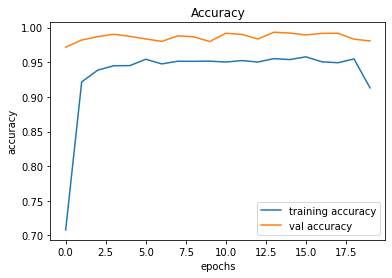

In [24]:
# accuracy 
plt.figure(0)
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

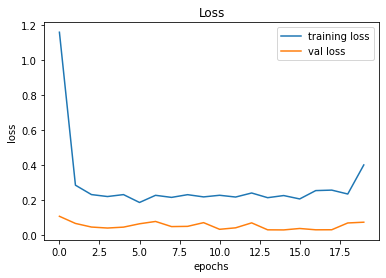

In [23]:
# Loss
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

## LEt's do testing on Test data

In [25]:
def testing(testcsv):
    y_test = pd.read_csv(testcsv)
    label = y_test["ClassId"].values
    imgs = y_test["Path"].values
    data=[]
    for img in imgs:
        image = Image.open(img)
        image = image.resize((30,30))
        data.append(np.array(image))
    X_test=np.array(data)
    return X_test,label

In [26]:
X_test, label = testing('Test.csv')

In [27]:
Y_pred = model.predict_classes(X_test)
Y_pred

array([16,  1, 38, ...,  6,  7, 10], dtype=int64)

## Accuracy with the test data

In [28]:
from sklearn.metrics import accuracy_score
print(accuracy_score(label, Y_pred))

0.9466349960411719


## Save the model

In [29]:
model.save("./training/TSR.h5")

## Load the Model

In [37]:
import os
os.chdir(r'E:\My Github\Unihack-Smart_Traffic')
from keras.models import load_model
model = load_model('./training/TSR.h5')

AttributeError: 'str' object has no attribute 'decode'

In [31]:
# Classes of trafic signs
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

In [32]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
def test_on_img(img):
    data=[]
    image = Image.open(img)
    image = image.resize((30,30))
    data.append(np.array(image))
    X_test=np.array(data)
    Y_pred = model.predict_classes(X_test)
    return image,Y_pred

Predicted traffic sign is:  No entry


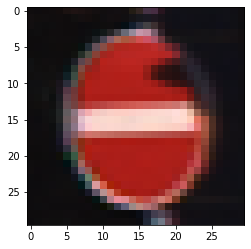

In [36]:
plot,prediction = test_on_img(r'E:\My Github\Unihack-Smart_Traffic\Test\00929.png')
s = [str(i) for i in prediction] 
a = int("".join(s)) 
print("Predicted traffic sign is: ", classes[a])
plt.imshow(plot)
plt.show()